In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras

from os.path import join

plt.style.use(["seaborn", "thesis"])

/home/jo/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


# Prepare Dataset 

In [2]:
from SCFInitialGuess.utilities.dataset import extract_triu_batch, AbstractDataset
from sklearn.model_selection import train_test_split

data_path = "../dataset/TSmall_sto3g"
postfix = "TSmall_sto3g"
dim = 26
#data_path = "../butadien/data/"
#postfix = ""
#dim = 26


def split(x, y, ind):
    return x[:ind], y[:ind], x[ind:], y[ind:]

S = np.load(join(data_path, "S" + postfix + ".npy"))
P = np.load(join(data_path, "P" + postfix + ".npy"))
F = np.load(join(data_path, "F" + postfix + ".npy"))

index = np.load(join(data_path, "index" + postfix + ".npy"))

molecules = np.load(join(data_path, "molecules" + postfix + ".npy"))



ind = int(0.8 * len(index))

s_triu = extract_triu_batch(S, dim)
p_triu = extract_triu_batch(P, dim)

s_triu_norm, mu, std = AbstractDataset.normalize(s_triu)


s_train, p_train, s_test, p_test = split(s_triu_norm, p_triu, ind)


## ELU 

In [3]:
keras.backend.clear_session()

dim_triu = dim * (dim + 1) // 2
activation = "elu"
learning_rate = 1e-5
intializer = keras.initializers.TruncatedNormal(mean=0.0, stddev=0.01)

model = keras.Sequential()

# input layer
model.add(keras.layers.Dense(dim_triu, activation=activation, input_dim=dim_triu, kernel_initializer=intializer, bias_initializer='zeros'))

# hidden
#for i in range(3):

model.add(keras.layers.Dense(
    dim_triu+250, 
    activation=activation, 
    kernel_initializer=intializer, 
    #bias_initializer='zeros',
    #kernel_regularizer=keras.regularizers.l2(1e-8)
))

model.add(keras.layers.Dense(
    dim_triu+150, 
    activation=activation, 
    kernel_initializer=intializer, 
    #bias_initializer='zeros',
    #kernel_regularizer=keras.regularizers.l2(1e-8)
))

model.add(keras.layers.Dense(
        dim_triu + 50, 
        activation=activation, 
        kernel_initializer=intializer, 
        #bias_initializer='zeros',
        #kernel_regularizer=keras.regularizers.l2(1e-8)
))


#output
model.add(keras.layers.Dense(dim_triu))

model.compile(optimizer=keras.optimizers.Adam(learning_rate), loss='MSE', metrics=['mae', 'mse'])

In [5]:
filepath = "../" + "TSmall_sto3gmodelTSmall_sto3g_250-150-50+triu.h5"
model = keras.models.load_model(filepath)

In [6]:
filepath = data_path + "model" + postfix + "_Continued.h5"

early_stopping = keras.callbacks.EarlyStopping(
    monitor="val_mean_squared_error", 
    min_delta=1e-7, 
    patience=200, 
    verbose=1
)

reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', 
    factor=0.5, 
    patience=50, 
    verbose=1, 
    mode='auto', 
    min_delta=1e-4, 
    cooldown=50, 
    min_lr=1e-10
)

checkpoint = keras.callbacks.ModelCheckpoint(
    filepath, 
    monitor='val_loss', 
    verbose=1, 
    save_best_only=False, 
    save_weights_only=False, 
    mode='auto', 
    period=1
)

In [7]:
keras.backend.set_value(model.optimizer.lr, 1e-4)

In [9]:
epochs = 10000

while True:
    keras.backend.set_value(model.optimizer.lr, 1e-4)

    history = model.fit(
        x = s_train,
        y = p_train,
        epochs=epochs,
        shuffle=True,
        validation_data=(s_test, p_test), 
        verbose=1, 
        callbacks=[
            early_stopping, 
            reduce_lr, 
            checkpoint
        ]
    )
    
    print("\n\n\n\n\nNext rouuund!!")

Train on 800 samples, validate on 201 samples
Epoch 1/10000
800/800 [==============================] - 0s 257us/step - loss: 5.3600e-07 - mean_absolute_error: 4.7633e-04 - mean_squared_error: 5.3600e-07 - val_loss: 2.6311e-06 - val_mean_absolute_error: 0.0011 - val_mean_squared_error: 2.6311e-06

Epoch 00001: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 2/10000
800/800 [==============================] - 0s 249us/step - loss: 6.3253e-06 - mean_absolute_error: 0.0017 - mean_squared_error: 6.3253e-06 - val_loss: 1.1520e-05 - val_mean_absolute_error: 0.0023 - val_mean_squared_error: 1.1520e-05

Epoch 00002: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 3/10000
800/800 [==============================] - 0s 250us/step - loss: 1.4838e-05 - mean_absolute_error: 0.0026 - mean_squared_error: 1.4838e-05 - val_loss: 2.1968e-05 - val_mean_absolute_error: 0.0032 - val_mean_squared_error: 2.1968e-05

Epoch 00003: saving model to ../dataset/

800/800 [==============================] - 0s 248us/step - loss: 1.1585e-07 - mean_absolute_error: 2.5079e-04 - mean_squared_error: 1.1585e-07 - val_loss: 2.4793e-07 - val_mean_absolute_error: 3.4837e-04 - val_mean_squared_error: 2.4793e-07

Epoch 00025: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 26/10000
800/800 [==============================] - 0s 237us/step - loss: 1.1608e-07 - mean_absolute_error: 2.5154e-04 - mean_squared_error: 1.1608e-07 - val_loss: 2.4320e-07 - val_mean_absolute_error: 3.4780e-04 - val_mean_squared_error: 2.4320e-07

Epoch 00026: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 27/10000
800/800 [==============================] - 0s 239us/step - loss: 1.0206e-07 - mean_absolute_error: 2.3827e-04 - mean_squared_error: 1.0206e-07 - val_loss: 2.3219e-07 - val_mean_absolute_error: 3.4141e-04 - val_mean_squared_error: 2.3219e-07

Epoch 00027: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 227us/step - loss: 3.8128e-07 - mean_absolute_error: 4.4162e-04 - mean_squared_error: 3.8128e-07 - val_loss: 5.5620e-07 - val_mean_absolute_error: 5.3064e-04 - val_mean_squared_error: 5.5620e-07

Epoch 00049: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 50/10000
800/800 [==============================] - 0s 238us/step - loss: 4.0786e-07 - mean_absolute_error: 4.5501e-04 - mean_squared_error: 4.0786e-07 - val_loss: 4.4647e-07 - val_mean_absolute_error: 4.7770e-04 - val_mean_squared_error: 4.4647e-07

Epoch 00050: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 51/10000
800/800 [==============================] - 0s 238us/step - loss: 3.6423e-07 - mean_absolute_error: 4.3269e-04 - mean_squared_error: 3.6423e-07 - val_loss: 5.6377e-07 - val_mean_absolute_error: 5.3365e-04 - val_mean_squared_error: 5.6377e-07

Epoch 00051: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05

800/800 [==============================] - 0s 232us/step - loss: 3.5396e-08 - mean_absolute_error: 1.4109e-04 - mean_squared_error: 3.5396e-08 - val_loss: 1.6057e-07 - val_mean_absolute_error: 2.6987e-04 - val_mean_squared_error: 1.6057e-07

Epoch 00073: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 74/10000
800/800 [==============================] - 0s 254us/step - loss: 3.7791e-08 - mean_absolute_error: 1.4569e-04 - mean_squared_error: 3.7791e-08 - val_loss: 1.6129e-07 - val_mean_absolute_error: 2.6992e-04 - val_mean_squared_error: 1.6129e-07

Epoch 00074: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 75/10000
800/800 [==============================] - 0s 239us/step - loss: 3.7595e-08 - mean_absolute_error: 1.4502e-04 - mean_squared_error: 3.7595e-08 - val_loss: 1.6454e-07 - val_mean_absolute_error: 2.7149e-04 - val_mean_squared_error: 1.6454e-07

Epoch 00075: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 240us/step - loss: 4.0071e-08 - mean_absolute_error: 1.5089e-04 - mean_squared_error: 4.0071e-08 - val_loss: 1.6453e-07 - val_mean_absolute_error: 2.7536e-04 - val_mean_squared_error: 1.6453e-07

Epoch 00097: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 98/10000
800/800 [==============================] - 0s 228us/step - loss: 4.0693e-08 - mean_absolute_error: 1.5163e-04 - mean_squared_error: 4.0693e-08 - val_loss: 1.6568e-07 - val_mean_absolute_error: 2.7625e-04 - val_mean_squared_error: 1.6568e-07

Epoch 00098: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 99/10000
800/800 [==============================] - 0s 238us/step - loss: 4.3445e-08 - mean_absolute_error: 1.5671e-04 - mean_squared_error: 4.3445e-08 - val_loss: 1.6739e-07 - val_mean_absolute_error: 2.7784e-04 - val_mean_squared_error: 1.6739e-07

Epoch 00099: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 244us/step - loss: 5.3869e-08 - mean_absolute_error: 1.7264e-04 - mean_squared_error: 5.3869e-08 - val_loss: 1.8066e-07 - val_mean_absolute_error: 2.9021e-04 - val_mean_squared_error: 1.8066e-07

Epoch 00121: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 122/10000
800/800 [==============================] - 0s 233us/step - loss: 5.9030e-08 - mean_absolute_error: 1.8069e-04 - mean_squared_error: 5.9030e-08 - val_loss: 1.8291e-07 - val_mean_absolute_error: 2.9291e-04 - val_mean_squared_error: 1.8291e-07

Epoch 00122: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 123/10000
800/800 [==============================] - 0s 237us/step - loss: 5.9332e-08 - mean_absolute_error: 1.8238e-04 - mean_squared_error: 5.9332e-08 - val_loss: 1.8280e-07 - val_mean_absolute_error: 2.9418e-04 - val_mean_squared_error: 1.8280e-07

Epoch 00123: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 233us/step - loss: 7.8684e-08 - mean_absolute_error: 2.0615e-04 - mean_squared_error: 7.8684e-08 - val_loss: 2.0475e-07 - val_mean_absolute_error: 3.1239e-04 - val_mean_squared_error: 2.0475e-07

Epoch 00145: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 146/10000
800/800 [==============================] - 0s 262us/step - loss: 8.4310e-08 - mean_absolute_error: 2.1240e-04 - mean_squared_error: 8.4310e-08 - val_loss: 2.0882e-07 - val_mean_absolute_error: 3.1606e-04 - val_mean_squared_error: 2.0882e-07

Epoch 00146: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 147/10000
800/800 [==============================] - 0s 231us/step - loss: 8.9433e-08 - mean_absolute_error: 2.1906e-04 - mean_squared_error: 8.9433e-08 - val_loss: 2.0780e-07 - val_mean_absolute_error: 3.1556e-04 - val_mean_squared_error: 2.0780e-07

Epoch 00147: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 255us/step - loss: 2.8747e-08 - mean_absolute_error: 1.2736e-04 - mean_squared_error: 2.8747e-08 - val_loss: 1.5106e-07 - val_mean_absolute_error: 2.5895e-04 - val_mean_squared_error: 1.5106e-07

Epoch 00169: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 170/10000
800/800 [==============================] - 0s 238us/step - loss: 2.8886e-08 - mean_absolute_error: 1.2745e-04 - mean_squared_error: 2.8886e-08 - val_loss: 1.5111e-07 - val_mean_absolute_error: 2.5888e-04 - val_mean_squared_error: 1.5111e-07

Epoch 00170: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 171/10000
800/800 [==============================] - 0s 239us/step - loss: 2.8645e-08 - mean_absolute_error: 1.2695e-04 - mean_squared_error: 2.8645e-08 - val_loss: 1.5051e-07 - val_mean_absolute_error: 2.5885e-04 - val_mean_squared_error: 1.5051e-07

Epoch 00171: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 237us/step - loss: 3.1296e-08 - mean_absolute_error: 1.3329e-04 - mean_squared_error: 3.1296e-08 - val_loss: 1.5358e-07 - val_mean_absolute_error: 2.6290e-04 - val_mean_squared_error: 1.5358e-07

Epoch 00193: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 194/10000
800/800 [==============================] - 0s 221us/step - loss: 3.0848e-08 - mean_absolute_error: 1.3207e-04 - mean_squared_error: 3.0848e-08 - val_loss: 1.5490e-07 - val_mean_absolute_error: 2.6291e-04 - val_mean_squared_error: 1.5490e-07

Epoch 00194: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 195/10000
800/800 [==============================] - 0s 242us/step - loss: 3.0696e-08 - mean_absolute_error: 1.3162e-04 - mean_squared_error: 3.0696e-08 - val_loss: 1.5308e-07 - val_mean_absolute_error: 2.6187e-04 - val_mean_squared_error: 1.5308e-07

Epoch 00195: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 236us/step - loss: 3.1987e-08 - mean_absolute_error: 1.3475e-04 - mean_squared_error: 3.1987e-08 - val_loss: 1.5582e-07 - val_mean_absolute_error: 2.6539e-04 - val_mean_squared_error: 1.5582e-07

Epoch 00217: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 218/10000
800/800 [==============================] - 0s 240us/step - loss: 3.4271e-08 - mean_absolute_error: 1.3906e-04 - mean_squared_error: 3.4271e-08 - val_loss: 1.5764e-07 - val_mean_absolute_error: 2.6638e-04 - val_mean_squared_error: 1.5764e-07

Epoch 00218: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 219/10000
800/800 [==============================] - 0s 273us/step - loss: 3.2561e-08 - mean_absolute_error: 1.3535e-04 - mean_squared_error: 3.2561e-08 - val_loss: 1.5382e-07 - val_mean_absolute_error: 2.6199e-04 - val_mean_squared_error: 1.5382e-07

Epoch 00219: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 240us/step - loss: 1.2661e-07 - mean_absolute_error: 2.6019e-04 - mean_squared_error: 1.2661e-07 - val_loss: 2.6831e-07 - val_mean_absolute_error: 3.6618e-04 - val_mean_squared_error: 2.6831e-07

Epoch 00018: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 19/10000
800/800 [==============================] - 0s 234us/step - loss: 1.2568e-07 - mean_absolute_error: 2.6263e-04 - mean_squared_error: 1.2568e-07 - val_loss: 2.4477e-07 - val_mean_absolute_error: 3.4524e-04 - val_mean_squared_error: 2.4477e-07

Epoch 00019: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 20/10000
800/800 [==============================] - 0s 237us/step - loss: 1.1111e-07 - mean_absolute_error: 2.4530e-04 - mean_squared_error: 1.1111e-07 - val_loss: 2.5076e-07 - val_mean_absolute_error: 3.4888e-04 - val_mean_squared_error: 2.5076e-07

Epoch 00020: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 232us/step - loss: 2.1905e-07 - mean_absolute_error: 3.3925e-04 - mean_squared_error: 2.1905e-07 - val_loss: 3.0686e-07 - val_mean_absolute_error: 3.9226e-04 - val_mean_squared_error: 3.0686e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 43/10000
800/800 [==============================] - 0s 226us/step - loss: 2.1326e-07 - mean_absolute_error: 3.3538e-04 - mean_squared_error: 2.1326e-07 - val_loss: 3.7537e-07 - val_mean_absolute_error: 4.3597e-04 - val_mean_squared_error: 3.7537e-07

Epoch 00043: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 44/10000
800/800 [==============================] - 0s 228us/step - loss: 2.3663e-07 - mean_absolute_error: 3.4997e-04 - mean_squared_error: 2.3663e-07 - val_loss: 3.9956e-07 - val_mean_absolute_error: 4.4436e-04 - val_mean_squared_error: 3.9956e-07

Epoch 00044: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 232us/step - loss: 3.4063e-08 - mean_absolute_error: 1.3827e-04 - mean_squared_error: 3.4063e-08 - val_loss: 1.5770e-07 - val_mean_absolute_error: 2.6563e-04 - val_mean_squared_error: 1.5770e-07

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 67/10000
800/800 [==============================] - 0s 234us/step - loss: 3.5238e-08 - mean_absolute_error: 1.4044e-04 - mean_squared_error: 3.5238e-08 - val_loss: 1.5899e-07 - val_mean_absolute_error: 2.6779e-04 - val_mean_squared_error: 1.5899e-07

Epoch 00067: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 68/10000
800/800 [==============================] - 0s 256us/step - loss: 3.6348e-08 - mean_absolute_error: 1.4259e-04 - mean_squared_error: 3.6348e-08 - val_loss: 1.6201e-07 - val_mean_absolute_error: 2.6990e-04 - val_mean_squared_error: 1.6201e-07

Epoch 00068: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 260us/step - loss: 3.8483e-08 - mean_absolute_error: 1.4746e-04 - mean_squared_error: 3.8483e-08 - val_loss: 1.6162e-07 - val_mean_absolute_error: 2.7150e-04 - val_mean_squared_error: 1.6162e-07

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 91/10000
800/800 [==============================] - 0s 232us/step - loss: 4.0507e-08 - mean_absolute_error: 1.5122e-04 - mean_squared_error: 4.0507e-08 - val_loss: 1.6547e-07 - val_mean_absolute_error: 2.7533e-04 - val_mean_squared_error: 1.6547e-07

Epoch 00091: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 92/10000
800/800 [==============================] - 0s 243us/step - loss: 4.1488e-08 - mean_absolute_error: 1.5266e-04 - mean_squared_error: 4.1488e-08 - val_loss: 1.6742e-07 - val_mean_absolute_error: 2.7781e-04 - val_mean_squared_error: 1.6742e-07

Epoch 00092: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 240us/step - loss: 4.6606e-08 - mean_absolute_error: 1.6223e-04 - mean_squared_error: 4.6606e-08 - val_loss: 1.7040e-07 - val_mean_absolute_error: 2.8052e-04 - val_mean_squared_error: 1.7040e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 115/10000
800/800 [==============================] - 0s 235us/step - loss: 4.7107e-08 - mean_absolute_error: 1.6299e-04 - mean_squared_error: 4.7107e-08 - val_loss: 1.7177e-07 - val_mean_absolute_error: 2.8129e-04 - val_mean_squared_error: 1.7177e-07

Epoch 00115: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 116/10000
800/800 [==============================] - 0s 227us/step - loss: 4.9221e-08 - mean_absolute_error: 1.6620e-04 - mean_squared_error: 4.9221e-08 - val_loss: 1.7341e-07 - val_mean_absolute_error: 2.8496e-04 - val_mean_squared_error: 1.7341e-07

Epoch 00116: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 235us/step - loss: 8.7633e-08 - mean_absolute_error: 2.1676e-04 - mean_squared_error: 8.7633e-08 - val_loss: 2.1626e-07 - val_mean_absolute_error: 3.2029e-04 - val_mean_squared_error: 2.1626e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 139/10000
800/800 [==============================] - 0s 231us/step - loss: 9.2949e-08 - mean_absolute_error: 2.2352e-04 - mean_squared_error: 9.2949e-08 - val_loss: 2.1885e-07 - val_mean_absolute_error: 3.2238e-04 - val_mean_squared_error: 2.1885e-07

Epoch 00139: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 140/10000
800/800 [==============================] - 0s 263us/step - loss: 8.7386e-08 - mean_absolute_error: 2.1627e-04 - mean_squared_error: 8.7386e-08 - val_loss: 2.2616e-07 - val_mean_absolute_error: 3.3023e-04 - val_mean_squared_error: 2.2616e-07

Epoch 00140: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 237us/step - loss: 2.7958e-08 - mean_absolute_error: 1.2545e-04 - mean_squared_error: 2.7958e-08 - val_loss: 1.5314e-07 - val_mean_absolute_error: 2.6116e-04 - val_mean_squared_error: 1.5314e-07

Epoch 00162: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 163/10000
800/800 [==============================] - 0s 251us/step - loss: 2.8124e-08 - mean_absolute_error: 1.2590e-04 - mean_squared_error: 2.8124e-08 - val_loss: 1.4988e-07 - val_mean_absolute_error: 2.5782e-04 - val_mean_squared_error: 1.4988e-07

Epoch 00163: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 164/10000
800/800 [==============================] - 0s 212us/step - loss: 2.7402e-08 - mean_absolute_error: 1.2402e-04 - mean_squared_error: 2.7402e-08 - val_loss: 1.5114e-07 - val_mean_absolute_error: 2.5879e-04 - val_mean_squared_error: 1.5114e-07

Epoch 00164: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 241us/step - loss: 2.9735e-08 - mean_absolute_error: 1.2938e-04 - mean_squared_error: 2.9735e-08 - val_loss: 1.5134e-07 - val_mean_absolute_error: 2.5973e-04 - val_mean_squared_error: 1.5134e-07

Epoch 00186: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 187/10000
800/800 [==============================] - 0s 233us/step - loss: 3.0185e-08 - mean_absolute_error: 1.3045e-04 - mean_squared_error: 3.0185e-08 - val_loss: 1.5289e-07 - val_mean_absolute_error: 2.6057e-04 - val_mean_squared_error: 1.5289e-07

Epoch 00187: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 188/10000
800/800 [==============================] - 0s 230us/step - loss: 2.9892e-08 - mean_absolute_error: 1.2993e-04 - mean_squared_error: 2.9892e-08 - val_loss: 1.5304e-07 - val_mean_absolute_error: 2.6116e-04 - val_mean_squared_error: 1.5304e-07

Epoch 00188: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 233us/step - loss: 3.1473e-08 - mean_absolute_error: 1.3330e-04 - mean_squared_error: 3.1473e-08 - val_loss: 1.5411e-07 - val_mean_absolute_error: 2.6344e-04 - val_mean_squared_error: 1.5411e-07

Epoch 00210: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 211/10000
800/800 [==============================] - 0s 238us/step - loss: 3.1083e-08 - mean_absolute_error: 1.3273e-04 - mean_squared_error: 3.1083e-08 - val_loss: 1.5380e-07 - val_mean_absolute_error: 2.6237e-04 - val_mean_squared_error: 1.5380e-07

Epoch 00211: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 212/10000
800/800 [==============================] - 0s 223us/step - loss: 3.1217e-08 - mean_absolute_error: 1.3300e-04 - mean_squared_error: 3.1217e-08 - val_loss: 1.5116e-07 - val_mean_absolute_error: 2.6038e-04 - val_mean_squared_error: 1.5116e-07

Epoch 00212: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 234us/step - loss: 3.1672e-08 - mean_absolute_error: 1.3378e-04 - mean_squared_error: 3.1672e-08 - val_loss: 1.5455e-07 - val_mean_absolute_error: 2.6329e-04 - val_mean_squared_error: 1.5455e-07

Epoch 00234: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 235/10000
800/800 [==============================] - 0s 248us/step - loss: 3.1957e-08 - mean_absolute_error: 1.3462e-04 - mean_squared_error: 3.1957e-08 - val_loss: 1.5341e-07 - val_mean_absolute_error: 2.6250e-04 - val_mean_squared_error: 1.5341e-07

Epoch 00235: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 236/10000
800/800 [==============================] - 0s 226us/step - loss: 3.1376e-08 - mean_absolute_error: 1.3349e-04 - mean_squared_error: 3.1376e-08 - val_loss: 1.5309e-07 - val_mean_absolute_error: 2.6214e-04 - val_mean_squared_error: 1.5309e-07

Epoch 00236: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00002: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 3/10000
800/800 [==============================] - 0s 247us/step - loss: 1.8559e-05 - mean_absolute_error: 0.0030 - mean_squared_error: 1.8559e-05 - val_loss: 1.4823e-05 - val_mean_absolute_error: 0.0028 - val_mean_squared_error: 1.4823e-05

Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 239us/step - loss: 1.1318e-05 - mean_absolute_error: 0.0024 - mean_squared_error: 1.1318e-05 - val_loss: 8.4711e-06 - val_mean_absolute_error: 0.0021 - val_mean_squared_error: 8.4711e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 234us/step - loss: 7.9057e-06 - mean_absolute_error: 0.0020 - mean_squared_error: 7.9057e-06 - val_loss: 6.7862e-06 - val_mean_absolute_error: 0.0018 - val_mean_squared_error: 6.7862e-06

Epoch 

800/800 [==============================] - 0s 231us/step - loss: 1.0443e-07 - mean_absolute_error: 2.3841e-04 - mean_squared_error: 1.0443e-07 - val_loss: 2.3031e-07 - val_mean_absolute_error: 3.3461e-04 - val_mean_squared_error: 2.3031e-07

Epoch 00027: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 28/10000
800/800 [==============================] - 0s 236us/step - loss: 8.9637e-08 - mean_absolute_error: 2.2217e-04 - mean_squared_error: 8.9637e-08 - val_loss: 2.1969e-07 - val_mean_absolute_error: 3.2598e-04 - val_mean_squared_error: 2.1969e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 240us/step - loss: 9.1826e-08 - mean_absolute_error: 2.2410e-04 - mean_squared_error: 9.1826e-08 - val_loss: 2.2134e-07 - val_mean_absolute_error: 3.2718e-04 - val_mean_squared_error: 2.2134e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 232us/step - loss: 6.9159e-07 - mean_absolute_error: 5.8186e-04 - mean_squared_error: 6.9159e-07 - val_loss: 7.0914e-07 - val_mean_absolute_error: 5.8805e-04 - val_mean_squared_error: 7.0914e-07

Epoch 00051: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 00051: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 52/10000
800/800 [==============================] - 0s 244us/step - loss: 3.4272e-07 - mean_absolute_error: 4.0768e-04 - mean_squared_error: 3.4272e-07 - val_loss: 3.1884e-07 - val_mean_absolute_error: 3.9806e-04 - val_mean_squared_error: 3.1884e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 0s 236us/step - loss: 1.2766e-07 - mean_absolute_error: 2.5776e-04 - mean_squared_error: 1.2766e-07 - val_loss: 2.1265e-07 - val_mean_absolute_error: 3.1663e-04 - val_mean_squared_error: 2.1265e-0

800/800 [==============================] - 0s 234us/step - loss: 3.6330e-08 - mean_absolute_error: 1.4291e-04 - mean_squared_error: 3.6330e-08 - val_loss: 1.6091e-07 - val_mean_absolute_error: 2.6862e-04 - val_mean_squared_error: 1.6091e-07

Epoch 00075: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 76/10000
800/800 [==============================] - 0s 228us/step - loss: 3.5464e-08 - mean_absolute_error: 1.4176e-04 - mean_squared_error: 3.5464e-08 - val_loss: 1.5814e-07 - val_mean_absolute_error: 2.6719e-04 - val_mean_squared_error: 1.5814e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 0s 235us/step - loss: 3.5453e-08 - mean_absolute_error: 1.4136e-04 - mean_squared_error: 3.5453e-08 - val_loss: 1.6035e-07 - val_mean_absolute_error: 2.6860e-04 - val_mean_squared_error: 1.6035e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 233us/step - loss: 4.1260e-08 - mean_absolute_error: 1.5211e-04 - mean_squared_error: 4.1260e-08 - val_loss: 1.6483e-07 - val_mean_absolute_error: 2.7358e-04 - val_mean_squared_error: 1.6483e-07

Epoch 00099: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 100/10000
800/800 [==============================] - 0s 239us/step - loss: 4.3549e-08 - mean_absolute_error: 1.5632e-04 - mean_squared_error: 4.3549e-08 - val_loss: 1.6573e-07 - val_mean_absolute_error: 2.7632e-04 - val_mean_squared_error: 1.6573e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 232us/step - loss: 4.1730e-08 - mean_absolute_error: 1.5288e-04 - mean_squared_error: 4.1730e-08 - val_loss: 1.6446e-07 - val_mean_absolute_error: 2.7366e-04 - val_mean_squared_error: 1.6446e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 233us/step - loss: 5.2381e-08 - mean_absolute_error: 1.7190e-04 - mean_squared_error: 5.2381e-08 - val_loss: 1.8068e-07 - val_mean_absolute_error: 2.9073e-04 - val_mean_squared_error: 1.8068e-07

Epoch 00123: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 124/10000
800/800 [==============================] - 0s 236us/step - loss: 5.2499e-08 - mean_absolute_error: 1.7199e-04 - mean_squared_error: 5.2499e-08 - val_loss: 1.7459e-07 - val_mean_absolute_error: 2.8581e-04 - val_mean_squared_error: 1.7459e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 238us/step - loss: 5.0963e-08 - mean_absolute_error: 1.6917e-04 - mean_squared_error: 5.0963e-08 - val_loss: 1.7694e-07 - val_mean_absolute_error: 2.8608e-04 - val_mean_squared_error: 1.7694e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 245us/step - loss: 9.4539e-08 - mean_absolute_error: 2.2580e-04 - mean_squared_error: 9.4539e-08 - val_loss: 2.2264e-07 - val_mean_absolute_error: 3.2677e-04 - val_mean_squared_error: 2.2264e-07

Epoch 00147: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 148/10000
800/800 [==============================] - 0s 238us/step - loss: 8.8081e-08 - mean_absolute_error: 2.1969e-04 - mean_squared_error: 8.8081e-08 - val_loss: 2.0327e-07 - val_mean_absolute_error: 3.1286e-04 - val_mean_squared_error: 2.0327e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 233us/step - loss: 8.3570e-08 - mean_absolute_error: 2.1238e-04 - mean_squared_error: 8.3570e-08 - val_loss: 2.1723e-07 - val_mean_absolute_error: 3.2267e-04 - val_mean_squared_error: 2.1723e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 240us/step - loss: 2.8076e-08 - mean_absolute_error: 1.2599e-04 - mean_squared_error: 2.8076e-08 - val_loss: 1.5055e-07 - val_mean_absolute_error: 2.5785e-04 - val_mean_squared_error: 1.5055e-07

Epoch 00171: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 172/10000
800/800 [==============================] - 0s 229us/step - loss: 2.8040e-08 - mean_absolute_error: 1.2564e-04 - mean_squared_error: 2.8040e-08 - val_loss: 1.4930e-07 - val_mean_absolute_error: 2.5763e-04 - val_mean_squared_error: 1.4930e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 236us/step - loss: 2.7991e-08 - mean_absolute_error: 1.2548e-04 - mean_squared_error: 2.7991e-08 - val_loss: 1.5072e-07 - val_mean_absolute_error: 2.5832e-04 - val_mean_squared_error: 1.5072e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 245us/step - loss: 2.9933e-08 - mean_absolute_error: 1.3013e-04 - mean_squared_error: 2.9933e-08 - val_loss: 1.5283e-07 - val_mean_absolute_error: 2.6134e-04 - val_mean_squared_error: 1.5283e-07

Epoch 00195: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 196/10000
800/800 [==============================] - 0s 246us/step - loss: 3.0810e-08 - mean_absolute_error: 1.3172e-04 - mean_squared_error: 3.0810e-08 - val_loss: 1.5166e-07 - val_mean_absolute_error: 2.5945e-04 - val_mean_squared_error: 1.5166e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 0s 228us/step - loss: 3.0135e-08 - mean_absolute_error: 1.3029e-04 - mean_squared_error: 3.0135e-08 - val_loss: 1.5153e-07 - val_mean_absolute_error: 2.5992e-04 - val_mean_squared_error: 1.5153e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 253us/step - loss: 3.1056e-08 - mean_absolute_error: 1.3270e-04 - mean_squared_error: 3.1056e-08 - val_loss: 1.5437e-07 - val_mean_absolute_error: 2.6252e-04 - val_mean_squared_error: 1.5437e-07

Epoch 00219: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 220/10000
800/800 [==============================] - 0s 244us/step - loss: 3.1207e-08 - mean_absolute_error: 1.3294e-04 - mean_squared_error: 3.1207e-08 - val_loss: 1.5310e-07 - val_mean_absolute_error: 2.6244e-04 - val_mean_squared_error: 1.5310e-07

Epoch 00220: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 221/10000
800/800 [==============================] - 0s 229us/step - loss: 3.2100e-08 - mean_absolute_error: 1.3483e-04 - mean_squared_error: 3.2100e-08 - val_loss: 1.5402e-07 - val_mean_absolute_error: 2.6259e-04 - val_mean_squared_error: 1.5402e-07

Epoch 00221: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 239us/step - loss: 3.3818e-08 - mean_absolute_error: 1.3787e-04 - mean_squared_error: 3.3818e-08 - val_loss: 1.5329e-07 - val_mean_absolute_error: 2.6276e-04 - val_mean_squared_error: 1.5329e-07

Epoch 00243: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 244/10000
800/800 [==============================] - 0s 239us/step - loss: 3.2473e-08 - mean_absolute_error: 1.3568e-04 - mean_squared_error: 3.2473e-08 - val_loss: 1.5394e-07 - val_mean_absolute_error: 2.6301e-04 - val_mean_squared_error: 1.5394e-07

Epoch 00244: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 245/10000
800/800 [==============================] - 0s 243us/step - loss: 3.1917e-08 - mean_absolute_error: 1.3469e-04 - mean_squared_error: 3.1917e-08 - val_loss: 1.5436e-07 - val_mean_absolute_error: 2.6264e-04 - val_mean_squared_error: 1.5436e-07

Epoch 00245: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 230us/step - loss: 2.5040e-07 - mean_absolute_error: 3.6094e-04 - mean_squared_error: 2.5040e-07 - val_loss: 3.6633e-07 - val_mean_absolute_error: 4.2751e-04 - val_mean_squared_error: 3.6633e-07

Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 13/10000
800/800 [==============================] - 0s 224us/step - loss: 1.9724e-07 - mean_absolute_error: 3.2188e-04 - mean_squared_error: 1.9724e-07 - val_loss: 3.4539e-07 - val_mean_absolute_error: 4.1317e-04 - val_mean_squared_error: 3.4539e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 240us/step - loss: 2.0765e-07 - mean_absolute_error: 3.2942e-04 - mean_squared_error: 2.0765e-07 - val_loss: 3.0955e-07 - val_mean_absolute_error: 3.9180e-04 - val_mean_squared_error: 3.0955e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 237us/step - loss: 1.4576e-07 - mean_absolute_error: 2.7963e-04 - mean_squared_error: 1.4576e-07 - val_loss: 3.1351e-07 - val_mean_absolute_error: 3.9063e-04 - val_mean_squared_error: 3.1351e-07

Epoch 00036: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 37/10000
800/800 [==============================] - 0s 237us/step - loss: 1.6073e-07 - mean_absolute_error: 2.9212e-04 - mean_squared_error: 1.6073e-07 - val_loss: 2.9093e-07 - val_mean_absolute_error: 3.8043e-04 - val_mean_squared_error: 2.9093e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 38/10000
800/800 [==============================] - 0s 236us/step - loss: 1.6986e-07 - mean_absolute_error: 2.9679e-04 - mean_squared_error: 1.6986e-07 - val_loss: 2.9057e-07 - val_mean_absolute_error: 3.7760e-04 - val_mean_squared_error: 2.9057e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 241us/step - loss: 3.3864e-08 - mean_absolute_error: 1.3768e-04 - mean_squared_error: 3.3864e-08 - val_loss: 1.5781e-07 - val_mean_absolute_error: 2.6547e-04 - val_mean_squared_error: 1.5781e-07

Epoch 00060: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 61/10000
800/800 [==============================] - 0s 229us/step - loss: 3.4550e-08 - mean_absolute_error: 1.3927e-04 - mean_squared_error: 3.4550e-08 - val_loss: 1.5929e-07 - val_mean_absolute_error: 2.6790e-04 - val_mean_squared_error: 1.5929e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 62/10000
800/800 [==============================] - 0s 238us/step - loss: 3.5255e-08 - mean_absolute_error: 1.4052e-04 - mean_squared_error: 3.5255e-08 - val_loss: 1.5888e-07 - val_mean_absolute_error: 2.6695e-04 - val_mean_squared_error: 1.5888e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 240us/step - loss: 3.7454e-08 - mean_absolute_error: 1.4482e-04 - mean_squared_error: 3.7454e-08 - val_loss: 1.6396e-07 - val_mean_absolute_error: 2.7072e-04 - val_mean_squared_error: 1.6396e-07

Epoch 00084: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 85/10000
800/800 [==============================] - 0s 236us/step - loss: 3.8913e-08 - mean_absolute_error: 1.4792e-04 - mean_squared_error: 3.8913e-08 - val_loss: 1.6227e-07 - val_mean_absolute_error: 2.7026e-04 - val_mean_squared_error: 1.6227e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 86/10000
800/800 [==============================] - 0s 239us/step - loss: 3.8840e-08 - mean_absolute_error: 1.4803e-04 - mean_squared_error: 3.8840e-08 - val_loss: 1.6170e-07 - val_mean_absolute_error: 2.7072e-04 - val_mean_squared_error: 1.6170e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 234us/step - loss: 5.5111e-08 - mean_absolute_error: 1.7363e-04 - mean_squared_error: 5.5111e-08 - val_loss: 1.7741e-07 - val_mean_absolute_error: 2.8653e-04 - val_mean_squared_error: 1.7741e-07

Epoch 00108: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 109/10000
800/800 [==============================] - 0s 264us/step - loss: 5.7355e-08 - mean_absolute_error: 1.7699e-04 - mean_squared_error: 5.7355e-08 - val_loss: 1.7534e-07 - val_mean_absolute_error: 2.8616e-04 - val_mean_squared_error: 1.7534e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 110/10000
800/800 [==============================] - 0s 224us/step - loss: 5.6358e-08 - mean_absolute_error: 1.7630e-04 - mean_squared_error: 5.6358e-08 - val_loss: 1.8032e-07 - val_mean_absolute_error: 2.9074e-04 - val_mean_squared_error: 1.8032e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 238us/step - loss: 6.2158e-08 - mean_absolute_error: 1.8590e-04 - mean_squared_error: 6.2158e-08 - val_loss: 1.8672e-07 - val_mean_absolute_error: 2.9635e-04 - val_mean_squared_error: 1.8672e-07

Epoch 00132: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 133/10000
800/800 [==============================] - 0s 225us/step - loss: 6.3023e-08 - mean_absolute_error: 1.8738e-04 - mean_squared_error: 6.3023e-08 - val_loss: 1.7596e-07 - val_mean_absolute_error: 2.8885e-04 - val_mean_squared_error: 1.7596e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 134/10000
800/800 [==============================] - 0s 230us/step - loss: 6.3424e-08 - mean_absolute_error: 1.8652e-04 - mean_squared_error: 6.3424e-08 - val_loss: 1.8624e-07 - val_mean_absolute_error: 2.9796e-04 - val_mean_squared_error: 1.8624e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 234us/step - loss: 2.7405e-08 - mean_absolute_error: 1.2418e-04 - mean_squared_error: 2.7405e-08 - val_loss: 1.4975e-07 - val_mean_absolute_error: 2.5789e-04 - val_mean_squared_error: 1.4975e-07

Epoch 00156: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 157/10000
800/800 [==============================] - 0s 227us/step - loss: 2.7157e-08 - mean_absolute_error: 1.2376e-04 - mean_squared_error: 2.7157e-08 - val_loss: 1.4895e-07 - val_mean_absolute_error: 2.5651e-04 - val_mean_squared_error: 1.4895e-07

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 158/10000
800/800 [==============================] - 0s 242us/step - loss: 2.7147e-08 - mean_absolute_error: 1.2357e-04 - mean_squared_error: 2.7147e-08 - val_loss: 1.5055e-07 - val_mean_absolute_error: 2.5811e-04 - val_mean_squared_error: 1.5055e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 235us/step - loss: 2.8989e-08 - mean_absolute_error: 1.2745e-04 - mean_squared_error: 2.8989e-08 - val_loss: 1.5222e-07 - val_mean_absolute_error: 2.6072e-04 - val_mean_squared_error: 1.5222e-07

Epoch 00180: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 181/10000
800/800 [==============================] - 0s 237us/step - loss: 2.8798e-08 - mean_absolute_error: 1.2737e-04 - mean_squared_error: 2.8798e-08 - val_loss: 1.5055e-07 - val_mean_absolute_error: 2.5799e-04 - val_mean_squared_error: 1.5055e-07

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 182/10000
800/800 [==============================] - 0s 234us/step - loss: 2.9393e-08 - mean_absolute_error: 1.2848e-04 - mean_squared_error: 2.9393e-08 - val_loss: 1.5029e-07 - val_mean_absolute_error: 2.5900e-04 - val_mean_squared_error: 1.5029e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 237us/step - loss: 2.9789e-08 - mean_absolute_error: 1.2972e-04 - mean_squared_error: 2.9789e-08 - val_loss: 1.5213e-07 - val_mean_absolute_error: 2.6091e-04 - val_mean_squared_error: 1.5213e-07

Epoch 00204: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 205/10000
800/800 [==============================] - 0s 235us/step - loss: 3.0131e-08 - mean_absolute_error: 1.3036e-04 - mean_squared_error: 3.0131e-08 - val_loss: 1.5049e-07 - val_mean_absolute_error: 2.5866e-04 - val_mean_squared_error: 1.5049e-07

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 206/10000
800/800 [==============================] - 0s 241us/step - loss: 2.9469e-08 - mean_absolute_error: 1.2913e-04 - mean_squared_error: 2.9469e-08 - val_loss: 1.5127e-07 - val_mean_absolute_error: 2.5961e-04 - val_mean_squared_error: 1.5127e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 233us/step - loss: 3.2234e-08 - mean_absolute_error: 1.3508e-04 - mean_squared_error: 3.2234e-08 - val_loss: 1.5320e-07 - val_mean_absolute_error: 2.6229e-04 - val_mean_squared_error: 1.5320e-07

Epoch 00228: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 229/10000
800/800 [==============================] - 0s 237us/step - loss: 3.1379e-08 - mean_absolute_error: 1.3308e-04 - mean_squared_error: 3.1379e-08 - val_loss: 1.5319e-07 - val_mean_absolute_error: 2.6220e-04 - val_mean_squared_error: 1.5319e-07

Epoch 00229: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 230/10000
800/800 [==============================] - 0s 234us/step - loss: 3.1149e-08 - mean_absolute_error: 1.3266e-04 - mean_squared_error: 3.1149e-08 - val_loss: 1.5108e-07 - val_mean_absolute_error: 2.5989e-04 - val_mean_squared_error: 1.5108e-07

Epoch 00230: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 237us/step - loss: 2.2516e-08 - mean_absolute_error: 1.1254e-04 - mean_squared_error: 2.2516e-08 - val_loss: 1.4346e-07 - val_mean_absolute_error: 2.5045e-04 - val_mean_squared_error: 1.4346e-07

Epoch 00252: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 253/10000
800/800 [==============================] - 0s 238us/step - loss: 2.2602e-08 - mean_absolute_error: 1.1264e-04 - mean_squared_error: 2.2602e-08 - val_loss: 1.4431e-07 - val_mean_absolute_error: 2.5107e-04 - val_mean_squared_error: 1.4431e-07

Epoch 00253: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 00253: early stopping





Next rouuund!!
Train on 800 samples, validate on 201 samples
Epoch 1/10000
800/800 [==============================] - 0s 229us/step - loss: 3.8544e-06 - mean_absolute_error: 0.0012 - mean_squared_error: 3.8544e-06 - val_loss: 1.1898e-05 - val_mean_absolute_error: 0.0024 - val_mean_squared_error: 1.18

800/800 [==============================] - 0s 252us/step - loss: 1.0384e-07 - mean_absolute_error: 2.3726e-04 - mean_squared_error: 1.0384e-07 - val_loss: 2.2837e-07 - val_mean_absolute_error: 3.3152e-04 - val_mean_squared_error: 2.2837e-07

Epoch 00023: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 24/10000
800/800 [==============================] - 0s 225us/step - loss: 1.1209e-07 - mean_absolute_error: 2.4326e-04 - mean_squared_error: 1.1209e-07 - val_loss: 2.3124e-07 - val_mean_absolute_error: 3.3573e-04 - val_mean_squared_error: 2.3124e-07

Epoch 00024: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 25/10000
800/800 [==============================] - 0s 230us/step - loss: 1.0877e-07 - mean_absolute_error: 2.4234e-04 - mean_squared_error: 1.0877e-07 - val_loss: 2.1998e-07 - val_mean_absolute_error: 3.2704e-04 - val_mean_squared_error: 2.1998e-07

Epoch 00025: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 239us/step - loss: 2.8950e-07 - mean_absolute_error: 3.9223e-04 - mean_squared_error: 2.8950e-07 - val_loss: 4.0438e-07 - val_mean_absolute_error: 4.5478e-04 - val_mean_squared_error: 4.0438e-07

Epoch 00047: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 48/10000
800/800 [==============================] - 0s 239us/step - loss: 3.0879e-07 - mean_absolute_error: 3.9593e-04 - mean_squared_error: 3.0879e-07 - val_loss: 5.0502e-07 - val_mean_absolute_error: 4.9940e-04 - val_mean_squared_error: 5.0502e-07

Epoch 00048: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 49/10000
800/800 [==============================] - 0s 239us/step - loss: 4.3386e-07 - mean_absolute_error: 4.5953e-04 - mean_squared_error: 4.3386e-07 - val_loss: 6.0459e-07 - val_mean_absolute_error: 5.5149e-04 - val_mean_squared_error: 6.0459e-07

Epoch 00049: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 239us/step - loss: 3.4305e-08 - mean_absolute_error: 1.3896e-04 - mean_squared_error: 3.4305e-08 - val_loss: 1.5770e-07 - val_mean_absolute_error: 2.6624e-04 - val_mean_squared_error: 1.5770e-07

Epoch 00071: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 72/10000
800/800 [==============================] - 0s 241us/step - loss: 3.4269e-08 - mean_absolute_error: 1.3889e-04 - mean_squared_error: 3.4269e-08 - val_loss: 1.5804e-07 - val_mean_absolute_error: 2.6689e-04 - val_mean_squared_error: 1.5804e-07

Epoch 00072: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 73/10000
800/800 [==============================] - 0s 233us/step - loss: 3.4372e-08 - mean_absolute_error: 1.3920e-04 - mean_squared_error: 3.4372e-08 - val_loss: 1.5821e-07 - val_mean_absolute_error: 2.6676e-04 - val_mean_squared_error: 1.5821e-07

Epoch 00073: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 255us/step - loss: 4.3001e-08 - mean_absolute_error: 1.5475e-04 - mean_squared_error: 4.3001e-08 - val_loss: 1.6761e-07 - val_mean_absolute_error: 2.7626e-04 - val_mean_squared_error: 1.6761e-07

Epoch 00095: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 96/10000
800/800 [==============================] - 0s 233us/step - loss: 4.3089e-08 - mean_absolute_error: 1.5548e-04 - mean_squared_error: 4.3089e-08 - val_loss: 1.6432e-07 - val_mean_absolute_error: 2.7490e-04 - val_mean_squared_error: 1.6432e-07

Epoch 00096: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 97/10000
800/800 [==============================] - 0s 245us/step - loss: 4.2271e-08 - mean_absolute_error: 1.5429e-04 - mean_squared_error: 4.2271e-08 - val_loss: 1.6386e-07 - val_mean_absolute_error: 2.7317e-04 - val_mean_squared_error: 1.6386e-07

Epoch 00097: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 234us/step - loss: 5.0622e-08 - mean_absolute_error: 1.6893e-04 - mean_squared_error: 5.0622e-08 - val_loss: 1.7443e-07 - val_mean_absolute_error: 2.8603e-04 - val_mean_squared_error: 1.7443e-07

Epoch 00119: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 120/10000
800/800 [==============================] - 0s 235us/step - loss: 6.0055e-08 - mean_absolute_error: 1.8232e-04 - mean_squared_error: 6.0055e-08 - val_loss: 1.8439e-07 - val_mean_absolute_error: 2.9490e-04 - val_mean_squared_error: 1.8439e-07

Epoch 00120: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 121/10000
800/800 [==============================] - 0s 231us/step - loss: 5.6237e-08 - mean_absolute_error: 1.7805e-04 - mean_squared_error: 5.6237e-08 - val_loss: 1.7532e-07 - val_mean_absolute_error: 2.8687e-04 - val_mean_squared_error: 1.7532e-07

Epoch 00121: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 234us/step - loss: 7.6366e-08 - mean_absolute_error: 2.0171e-04 - mean_squared_error: 7.6366e-08 - val_loss: 2.1665e-07 - val_mean_absolute_error: 3.1723e-04 - val_mean_squared_error: 2.1665e-07

Epoch 00143: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 144/10000
800/800 [==============================] - 0s 233us/step - loss: 8.5407e-08 - mean_absolute_error: 2.1323e-04 - mean_squared_error: 8.5407e-08 - val_loss: 2.0988e-07 - val_mean_absolute_error: 3.1649e-04 - val_mean_squared_error: 2.0988e-07

Epoch 00144: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 145/10000
800/800 [==============================] - 0s 234us/step - loss: 9.8258e-08 - mean_absolute_error: 2.3022e-04 - mean_squared_error: 9.8258e-08 - val_loss: 2.1395e-07 - val_mean_absolute_error: 3.2287e-04 - val_mean_squared_error: 2.1395e-07

Epoch 00145: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 235us/step - loss: 2.7419e-08 - mean_absolute_error: 1.2445e-04 - mean_squared_error: 2.7419e-08 - val_loss: 1.4956e-07 - val_mean_absolute_error: 2.5694e-04 - val_mean_squared_error: 1.4956e-07

Epoch 00167: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 168/10000
800/800 [==============================] - 0s 235us/step - loss: 2.7693e-08 - mean_absolute_error: 1.2476e-04 - mean_squared_error: 2.7693e-08 - val_loss: 1.4876e-07 - val_mean_absolute_error: 2.5684e-04 - val_mean_squared_error: 1.4876e-07

Epoch 00168: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 169/10000
800/800 [==============================] - 0s 231us/step - loss: 2.7151e-08 - mean_absolute_error: 1.2379e-04 - mean_squared_error: 2.7151e-08 - val_loss: 1.4772e-07 - val_mean_absolute_error: 2.5567e-04 - val_mean_squared_error: 1.4772e-07

Epoch 00169: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 232us/step - loss: 2.9552e-08 - mean_absolute_error: 1.2944e-04 - mean_squared_error: 2.9552e-08 - val_loss: 1.5152e-07 - val_mean_absolute_error: 2.6033e-04 - val_mean_squared_error: 1.5152e-07

Epoch 00191: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 192/10000
800/800 [==============================] - 0s 231us/step - loss: 3.0278e-08 - mean_absolute_error: 1.3105e-04 - mean_squared_error: 3.0278e-08 - val_loss: 1.5191e-07 - val_mean_absolute_error: 2.5951e-04 - val_mean_squared_error: 1.5191e-07

Epoch 00192: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 193/10000
800/800 [==============================] - 0s 231us/step - loss: 3.0995e-08 - mean_absolute_error: 1.3247e-04 - mean_squared_error: 3.0995e-08 - val_loss: 1.5061e-07 - val_mean_absolute_error: 2.5967e-04 - val_mean_squared_error: 1.5061e-07

Epoch 00193: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 233us/step - loss: 3.1993e-08 - mean_absolute_error: 1.3417e-04 - mean_squared_error: 3.1993e-08 - val_loss: 1.5250e-07 - val_mean_absolute_error: 2.6110e-04 - val_mean_squared_error: 1.5250e-07

Epoch 00215: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 216/10000
800/800 [==============================] - 0s 237us/step - loss: 3.0763e-08 - mean_absolute_error: 1.3199e-04 - mean_squared_error: 3.0763e-08 - val_loss: 1.5031e-07 - val_mean_absolute_error: 2.5915e-04 - val_mean_squared_error: 1.5031e-07

Epoch 00216: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 217/10000
800/800 [==============================] - 0s 240us/step - loss: 3.1120e-08 - mean_absolute_error: 1.3276e-04 - mean_squared_error: 3.1120e-08 - val_loss: 1.5463e-07 - val_mean_absolute_error: 2.6315e-04 - val_mean_squared_error: 1.5463e-07

Epoch 00217: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 256us/step - loss: 3.1039e-08 - mean_absolute_error: 1.3267e-04 - mean_squared_error: 3.1039e-08 - val_loss: 1.5161e-07 - val_mean_absolute_error: 2.6090e-04 - val_mean_squared_error: 1.5161e-07

Epoch 00239: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 240/10000
800/800 [==============================] - 0s 235us/step - loss: 3.1163e-08 - mean_absolute_error: 1.3262e-04 - mean_squared_error: 3.1163e-08 - val_loss: 1.5393e-07 - val_mean_absolute_error: 2.6275e-04 - val_mean_squared_error: 1.5393e-07

Epoch 00240: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 241/10000
800/800 [==============================] - 0s 224us/step - loss: 3.1617e-08 - mean_absolute_error: 1.3406e-04 - mean_squared_error: 3.1617e-08 - val_loss: 1.5185e-07 - val_mean_absolute_error: 2.6139e-04 - val_mean_squared_error: 1.5185e-07

Epoch 00241: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00008: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 9/10000
800/800 [==============================] - 0s 240us/step - loss: 6.3519e-07 - mean_absolute_error: 5.7214e-04 - mean_squared_error: 6.3519e-07 - val_loss: 7.7097e-07 - val_mean_absolute_error: 6.2621e-04 - val_mean_squared_error: 7.7097e-07

Epoch 00009: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 10/10000
800/800 [==============================] - 0s 230us/step - loss: 5.3865e-07 - mean_absolute_error: 5.2280e-04 - mean_squared_error: 5.3865e-07 - val_loss: 5.8210e-07 - val_mean_absolute_error: 5.4129e-04 - val_mean_squared_error: 5.8210e-07

Epoch 00010: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 11/10000
800/800 [==============================] - 0s 234us/step - loss: 4.0527e-07 - mean_absolute_error: 4.5509e-04 - mean_squared_error: 4.0527e-07 - val_loss: 4.7943e-07 - val_mean_absolute_error: 4.9283e-04 - val_mean_squared

800/800 [==============================] - 0s 232us/step - loss: 2.2480e-07 - mean_absolute_error: 3.3732e-04 - mean_squared_error: 2.2480e-07 - val_loss: 3.2080e-07 - val_mean_absolute_error: 3.9763e-04 - val_mean_squared_error: 3.2080e-07

Epoch 00033: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 34/10000
800/800 [==============================] - 0s 225us/step - loss: 2.4479e-07 - mean_absolute_error: 3.5026e-04 - mean_squared_error: 2.4479e-07 - val_loss: 3.8447e-07 - val_mean_absolute_error: 4.3478e-04 - val_mean_squared_error: 3.8447e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 35/10000
800/800 [==============================] - 0s 239us/step - loss: 2.2456e-07 - mean_absolute_error: 3.4312e-04 - mean_squared_error: 2.2456e-07 - val_loss: 3.7027e-07 - val_mean_absolute_error: 4.3556e-04 - val_mean_squared_error: 3.7027e-07

Epoch 00035: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 233us/step - loss: 3.4420e-08 - mean_absolute_error: 1.3837e-04 - mean_squared_error: 3.4420e-08 - val_loss: 1.6019e-07 - val_mean_absolute_error: 2.6752e-04 - val_mean_squared_error: 1.6019e-07

Epoch 00057: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 58/10000
800/800 [==============================] - 0s 248us/step - loss: 3.4151e-08 - mean_absolute_error: 1.3820e-04 - mean_squared_error: 3.4151e-08 - val_loss: 1.5902e-07 - val_mean_absolute_error: 2.6587e-04 - val_mean_squared_error: 1.5902e-07

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 59/10000
800/800 [==============================] - 0s 240us/step - loss: 3.4120e-08 - mean_absolute_error: 1.3803e-04 - mean_squared_error: 3.4120e-08 - val_loss: 1.5788e-07 - val_mean_absolute_error: 2.6563e-04 - val_mean_squared_error: 1.5788e-07

Epoch 00059: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 245us/step - loss: 3.4647e-08 - mean_absolute_error: 1.3957e-04 - mean_squared_error: 3.4647e-08 - val_loss: 1.5646e-07 - val_mean_absolute_error: 2.6482e-04 - val_mean_squared_error: 1.5646e-07

Epoch 00081: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 82/10000
800/800 [==============================] - 0s 245us/step - loss: 3.5010e-08 - mean_absolute_error: 1.4052e-04 - mean_squared_error: 3.5010e-08 - val_loss: 1.5616e-07 - val_mean_absolute_error: 2.6449e-04 - val_mean_squared_error: 1.5616e-07

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 83/10000
800/800 [==============================] - 0s 256us/step - loss: 3.4760e-08 - mean_absolute_error: 1.3980e-04 - mean_squared_error: 3.4760e-08 - val_loss: 1.5595e-07 - val_mean_absolute_error: 2.6517e-04 - val_mean_squared_error: 1.5595e-07

Epoch 00083: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 251us/step - loss: 3.8776e-08 - mean_absolute_error: 1.4831e-04 - mean_squared_error: 3.8776e-08 - val_loss: 1.6106e-07 - val_mean_absolute_error: 2.7030e-04 - val_mean_squared_error: 1.6106e-07

Epoch 00105: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 106/10000
800/800 [==============================] - 0s 231us/step - loss: 3.9665e-08 - mean_absolute_error: 1.4941e-04 - mean_squared_error: 3.9665e-08 - val_loss: 1.6292e-07 - val_mean_absolute_error: 2.7315e-04 - val_mean_squared_error: 1.6292e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 107/10000
800/800 [==============================] - 0s 233us/step - loss: 3.9438e-08 - mean_absolute_error: 1.4915e-04 - mean_squared_error: 3.9438e-08 - val_loss: 1.6058e-07 - val_mean_absolute_error: 2.6928e-04 - val_mean_squared_error: 1.6058e-07

Epoch 00107: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 251us/step - loss: 5.3567e-08 - mean_absolute_error: 1.7290e-04 - mean_squared_error: 5.3567e-08 - val_loss: 1.7922e-07 - val_mean_absolute_error: 2.8866e-04 - val_mean_squared_error: 1.7922e-07

Epoch 00129: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 130/10000
800/800 [==============================] - 0s 239us/step - loss: 5.6212e-08 - mean_absolute_error: 1.7653e-04 - mean_squared_error: 5.6212e-08 - val_loss: 1.7715e-07 - val_mean_absolute_error: 2.8752e-04 - val_mean_squared_error: 1.7715e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 131/10000
800/800 [==============================] - 0s 244us/step - loss: 6.2714e-08 - mean_absolute_error: 1.8557e-04 - mean_squared_error: 6.2714e-08 - val_loss: 1.8348e-07 - val_mean_absolute_error: 2.9115e-04 - val_mean_squared_error: 1.8348e-07

Epoch 00131: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 255us/step - loss: 2.9777e-08 - mean_absolute_error: 1.2941e-04 - mean_squared_error: 2.9777e-08 - val_loss: 1.4835e-07 - val_mean_absolute_error: 2.5658e-04 - val_mean_squared_error: 1.4835e-07

Epoch 00153: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 154/10000
800/800 [==============================] - 0s 245us/step - loss: 2.7451e-08 - mean_absolute_error: 1.2434e-04 - mean_squared_error: 2.7451e-08 - val_loss: 1.4776e-07 - val_mean_absolute_error: 2.5477e-04 - val_mean_squared_error: 1.4776e-07

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 155/10000
800/800 [==============================] - 0s 243us/step - loss: 2.6598e-08 - mean_absolute_error: 1.2236e-04 - mean_squared_error: 2.6598e-08 - val_loss: 1.4625e-07 - val_mean_absolute_error: 2.5422e-04 - val_mean_squared_error: 1.4625e-07

Epoch 00155: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 262us/step - loss: 2.7597e-08 - mean_absolute_error: 1.2495e-04 - mean_squared_error: 2.7597e-08 - val_loss: 1.4739e-07 - val_mean_absolute_error: 2.5539e-04 - val_mean_squared_error: 1.4739e-07

Epoch 00177: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 178/10000
800/800 [==============================] - 0s 264us/step - loss: 2.7127e-08 - mean_absolute_error: 1.2373e-04 - mean_squared_error: 2.7127e-08 - val_loss: 1.4893e-07 - val_mean_absolute_error: 2.5662e-04 - val_mean_squared_error: 1.4893e-07

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 179/10000
800/800 [==============================] - 0s 258us/step - loss: 2.7509e-08 - mean_absolute_error: 1.2472e-04 - mean_squared_error: 2.7509e-08 - val_loss: 1.4905e-07 - val_mean_absolute_error: 2.5678e-04 - val_mean_squared_error: 1.4905e-07

Epoch 00179: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 254us/step - loss: 2.8133e-08 - mean_absolute_error: 1.2591e-04 - mean_squared_error: 2.8133e-08 - val_loss: 1.4765e-07 - val_mean_absolute_error: 2.5643e-04 - val_mean_squared_error: 1.4765e-07

Epoch 00201: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 202/10000
800/800 [==============================] - 0s 230us/step - loss: 2.8698e-08 - mean_absolute_error: 1.2765e-04 - mean_squared_error: 2.8698e-08 - val_loss: 1.5164e-07 - val_mean_absolute_error: 2.6098e-04 - val_mean_squared_error: 1.5164e-07

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 203/10000
800/800 [==============================] - 0s 237us/step - loss: 2.9830e-08 - mean_absolute_error: 1.3009e-04 - mean_squared_error: 2.9830e-08 - val_loss: 1.4861e-07 - val_mean_absolute_error: 2.5783e-04 - val_mean_squared_error: 1.4861e-07

Epoch 00203: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 252us/step - loss: 2.9634e-08 - mean_absolute_error: 1.2977e-04 - mean_squared_error: 2.9634e-08 - val_loss: 1.4859e-07 - val_mean_absolute_error: 2.5799e-04 - val_mean_squared_error: 1.4859e-07

Epoch 00225: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 226/10000
800/800 [==============================] - 0s 247us/step - loss: 3.0371e-08 - mean_absolute_error: 1.3126e-04 - mean_squared_error: 3.0371e-08 - val_loss: 1.5129e-07 - val_mean_absolute_error: 2.5993e-04 - val_mean_squared_error: 1.5129e-07

Epoch 00226: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 227/10000
800/800 [==============================] - 0s 238us/step - loss: 3.1003e-08 - mean_absolute_error: 1.3244e-04 - mean_squared_error: 3.1003e-08 - val_loss: 1.5190e-07 - val_mean_absolute_error: 2.6139e-04 - val_mean_squared_error: 1.5190e-07

Epoch 00227: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 247us/step - loss: 3.1708e-08 - mean_absolute_error: 1.3400e-04 - mean_squared_error: 3.1708e-08 - val_loss: 1.4933e-07 - val_mean_absolute_error: 2.5828e-04 - val_mean_squared_error: 1.4933e-07

Epoch 00249: ReduceLROnPlateau reducing learning rate to 1.249999968422344e-05.

Epoch 00249: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 250/10000
800/800 [==============================] - 0s 264us/step - loss: 2.4923e-08 - mean_absolute_error: 1.1858e-04 - mean_squared_error: 2.4923e-08 - val_loss: 1.4391e-07 - val_mean_absolute_error: 2.5115e-04 - val_mean_squared_error: 1.4391e-07

Epoch 00250: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 251/10000
800/800 [==============================] - 0s 243us/step - loss: 2.2507e-08 - mean_absolute_error: 1.1254e-04 - mean_squared_error: 2.2507e-08 - val_loss: 1.4208e-07 - val_mean_absolute_error: 2.4908e-04 - val_mean_squared_error: 1.4208e

800/800 [==============================] - 0s 231us/step - loss: 2.2063e-08 - mean_absolute_error: 1.1131e-04 - mean_squared_error: 2.2063e-08 - val_loss: 1.4212e-07 - val_mean_absolute_error: 2.4892e-04 - val_mean_squared_error: 1.4212e-07

Epoch 00273: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 274/10000
800/800 [==============================] - 0s 230us/step - loss: 2.2309e-08 - mean_absolute_error: 1.1196e-04 - mean_squared_error: 2.2309e-08 - val_loss: 1.4210e-07 - val_mean_absolute_error: 2.4911e-04 - val_mean_squared_error: 1.4210e-07

Epoch 00274: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 275/10000
800/800 [==============================] - 0s 244us/step - loss: 2.2491e-08 - mean_absolute_error: 1.1250e-04 - mean_squared_error: 2.2491e-08 - val_loss: 1.4213e-07 - val_mean_absolute_error: 2.4936e-04 - val_mean_squared_error: 1.4213e-07

Epoch 00275: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 247us/step - loss: 2.2276e-08 - mean_absolute_error: 1.1208e-04 - mean_squared_error: 2.2276e-08 - val_loss: 1.4196e-07 - val_mean_absolute_error: 2.4925e-04 - val_mean_squared_error: 1.4196e-07

Epoch 00297: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 298/10000
800/800 [==============================] - 0s 264us/step - loss: 2.2650e-08 - mean_absolute_error: 1.1291e-04 - mean_squared_error: 2.2650e-08 - val_loss: 1.4167e-07 - val_mean_absolute_error: 2.4895e-04 - val_mean_squared_error: 1.4167e-07

Epoch 00298: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 299/10000
800/800 [==============================] - 0s 257us/step - loss: 2.2430e-08 - mean_absolute_error: 1.1256e-04 - mean_squared_error: 2.2430e-08 - val_loss: 1.4219e-07 - val_mean_absolute_error: 2.4911e-04 - val_mean_squared_error: 1.4219e-07

Epoch 00299: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 243us/step - loss: 2.2629e-08 - mean_absolute_error: 1.1288e-04 - mean_squared_error: 2.2629e-08 - val_loss: 1.4265e-07 - val_mean_absolute_error: 2.4964e-04 - val_mean_squared_error: 1.4265e-07

Epoch 00321: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 322/10000
800/800 [==============================] - 0s 235us/step - loss: 2.2728e-08 - mean_absolute_error: 1.1329e-04 - mean_squared_error: 2.2728e-08 - val_loss: 1.4225e-07 - val_mean_absolute_error: 2.4953e-04 - val_mean_squared_error: 1.4225e-07

Epoch 00322: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 323/10000
800/800 [==============================] - 0s 258us/step - loss: 2.2818e-08 - mean_absolute_error: 1.1329e-04 - mean_squared_error: 2.2818e-08 - val_loss: 1.4236e-07 - val_mean_absolute_error: 2.4947e-04 - val_mean_squared_error: 1.4236e-07

Epoch 00323: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 244us/step - loss: 2.2653e-08 - mean_absolute_error: 1.1297e-04 - mean_squared_error: 2.2653e-08 - val_loss: 1.4262e-07 - val_mean_absolute_error: 2.5029e-04 - val_mean_squared_error: 1.4262e-07

Epoch 00345: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 346/10000
800/800 [==============================] - 0s 246us/step - loss: 2.2470e-08 - mean_absolute_error: 1.1266e-04 - mean_squared_error: 2.2470e-08 - val_loss: 1.4317e-07 - val_mean_absolute_error: 2.5016e-04 - val_mean_squared_error: 1.4317e-07

Epoch 00346: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 347/10000
800/800 [==============================] - 0s 240us/step - loss: 2.2778e-08 - mean_absolute_error: 1.1330e-04 - mean_squared_error: 2.2778e-08 - val_loss: 1.4176e-07 - val_mean_absolute_error: 2.4918e-04 - val_mean_squared_error: 1.4176e-07

Epoch 00347: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 16/10000
800/800 [==============================] - 0s 259us/step - loss: 2.0298e-07 - mean_absolute_error: 3.2088e-04 - mean_squared_error: 2.0298e-07 - val_loss: 3.1189e-07 - val_mean_absolute_error: 3.9656e-04 - val_mean_squared_error: 3.1189e-07

Epoch 00016: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 17/10000
800/800 [==============================] - 0s 250us/step - loss: 1.6166e-07 - mean_absolute_error: 2.9003e-04 - mean_squared_error: 1.6166e-07 - val_loss: 2.7279e-07 - val_mean_absolute_error: 3.6322e-04 - val_mean_squared_error: 2.7279e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 18/10000
800/800 [==============================] - 0s 258us/step - loss: 1.4980e-07 - mean_absolute_error: 2.7676e-04 - mean_squared_error: 1.4980e-07 - val_loss: 3.0095e-07 - val_mean_absolute_error: 3.8081e-04 - val_mean_squared_error: 3.0095e-07

Epoch 00018: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 251us/step - loss: 5.6203e-07 - mean_absolute_error: 5.2554e-04 - mean_squared_error: 5.6203e-07 - val_loss: 6.0539e-07 - val_mean_absolute_error: 5.4554e-04 - val_mean_squared_error: 6.0539e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 41/10000
800/800 [==============================] - 0s 256us/step - loss: 5.7208e-07 - mean_absolute_error: 5.2920e-04 - mean_squared_error: 5.7208e-07 - val_loss: 7.6958e-07 - val_mean_absolute_error: 6.1658e-04 - val_mean_squared_error: 7.6958e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 42/10000
800/800 [==============================] - 0s 248us/step - loss: 5.7650e-07 - mean_absolute_error: 5.3202e-04 - mean_squared_error: 5.7650e-07 - val_loss: 7.1214e-07 - val_mean_absolute_error: 5.9906e-04 - val_mean_squared_error: 7.1214e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 250us/step - loss: 3.3173e-08 - mean_absolute_error: 1.3610e-04 - mean_squared_error: 3.3173e-08 - val_loss: 1.5546e-07 - val_mean_absolute_error: 2.6352e-04 - val_mean_squared_error: 1.5546e-07

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 65/10000
800/800 [==============================] - 0s 242us/step - loss: 3.2746e-08 - mean_absolute_error: 1.3554e-04 - mean_squared_error: 3.2746e-08 - val_loss: 1.5545e-07 - val_mean_absolute_error: 2.6407e-04 - val_mean_squared_error: 1.5545e-07

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 66/10000
800/800 [==============================] - 0s 238us/step - loss: 3.2887e-08 - mean_absolute_error: 1.3569e-04 - mean_squared_error: 3.2887e-08 - val_loss: 1.5652e-07 - val_mean_absolute_error: 2.6467e-04 - val_mean_squared_error: 1.5652e-07

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 252us/step - loss: 3.5362e-08 - mean_absolute_error: 1.4117e-04 - mean_squared_error: 3.5362e-08 - val_loss: 1.6150e-07 - val_mean_absolute_error: 2.7116e-04 - val_mean_squared_error: 1.6150e-07

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 89/10000
800/800 [==============================] - 0s 264us/step - loss: 3.4035e-08 - mean_absolute_error: 1.3846e-04 - mean_squared_error: 3.4035e-08 - val_loss: 1.5686e-07 - val_mean_absolute_error: 2.6475e-04 - val_mean_squared_error: 1.5686e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 90/10000
800/800 [==============================] - 0s 242us/step - loss: 3.4913e-08 - mean_absolute_error: 1.4041e-04 - mean_squared_error: 3.4913e-08 - val_loss: 1.5913e-07 - val_mean_absolute_error: 2.6810e-04 - val_mean_squared_error: 1.5913e-07

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 261us/step - loss: 4.3694e-08 - mean_absolute_error: 1.5669e-04 - mean_squared_error: 4.3694e-08 - val_loss: 1.6492e-07 - val_mean_absolute_error: 2.7571e-04 - val_mean_squared_error: 1.6492e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 113/10000
800/800 [==============================] - 0s 261us/step - loss: 4.5925e-08 - mean_absolute_error: 1.6086e-04 - mean_squared_error: 4.5925e-08 - val_loss: 1.6650e-07 - val_mean_absolute_error: 2.7653e-04 - val_mean_squared_error: 1.6650e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 114/10000
800/800 [==============================] - 0s 269us/step - loss: 4.6944e-08 - mean_absolute_error: 1.6290e-04 - mean_squared_error: 4.6944e-08 - val_loss: 1.6862e-07 - val_mean_absolute_error: 2.8164e-04 - val_mean_squared_error: 1.6862e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 253us/step - loss: 9.2224e-08 - mean_absolute_error: 2.1934e-04 - mean_squared_error: 9.2224e-08 - val_loss: 2.1096e-07 - val_mean_absolute_error: 3.1761e-04 - val_mean_squared_error: 2.1096e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 137/10000
800/800 [==============================] - 0s 234us/step - loss: 8.8462e-08 - mean_absolute_error: 2.1639e-04 - mean_squared_error: 8.8462e-08 - val_loss: 2.0310e-07 - val_mean_absolute_error: 3.0949e-04 - val_mean_squared_error: 2.0310e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 138/10000
800/800 [==============================] - 0s 232us/step - loss: 8.5150e-08 - mean_absolute_error: 2.1116e-04 - mean_squared_error: 8.5150e-08 - val_loss: 2.2355e-07 - val_mean_absolute_error: 3.2510e-04 - val_mean_squared_error: 2.2355e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 244us/step - loss: 2.5492e-08 - mean_absolute_error: 1.2001e-04 - mean_squared_error: 2.5492e-08 - val_loss: 1.4594e-07 - val_mean_absolute_error: 2.5295e-04 - val_mean_squared_error: 1.4594e-07

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 161/10000
800/800 [==============================] - 0s 240us/step - loss: 2.5420e-08 - mean_absolute_error: 1.1970e-04 - mean_squared_error: 2.5420e-08 - val_loss: 1.4614e-07 - val_mean_absolute_error: 2.5365e-04 - val_mean_squared_error: 1.4614e-07

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 162/10000
800/800 [==============================] - 0s 244us/step - loss: 2.5410e-08 - mean_absolute_error: 1.1979e-04 - mean_squared_error: 2.5410e-08 - val_loss: 1.4660e-07 - val_mean_absolute_error: 2.5373e-04 - val_mean_squared_error: 1.4660e-07

Epoch 00162: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 263us/step - loss: 2.8347e-08 - mean_absolute_error: 1.2649e-04 - mean_squared_error: 2.8347e-08 - val_loss: 1.4885e-07 - val_mean_absolute_error: 2.5721e-04 - val_mean_squared_error: 1.4885e-07

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 185/10000
800/800 [==============================] - 0s 263us/step - loss: 2.7440e-08 - mean_absolute_error: 1.2471e-04 - mean_squared_error: 2.7440e-08 - val_loss: 1.4647e-07 - val_mean_absolute_error: 2.5535e-04 - val_mean_squared_error: 1.4647e-07

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 186/10000
800/800 [==============================] - 0s 269us/step - loss: 2.7692e-08 - mean_absolute_error: 1.2524e-04 - mean_squared_error: 2.7692e-08 - val_loss: 1.4786e-07 - val_mean_absolute_error: 2.5710e-04 - val_mean_squared_error: 1.4786e-07

Epoch 00186: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 282us/step - loss: 2.9185e-08 - mean_absolute_error: 1.2863e-04 - mean_squared_error: 2.9185e-08 - val_loss: 1.4787e-07 - val_mean_absolute_error: 2.5665e-04 - val_mean_squared_error: 1.4787e-07

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 209/10000
800/800 [==============================] - 0s 257us/step - loss: 2.8576e-08 - mean_absolute_error: 1.2724e-04 - mean_squared_error: 2.8576e-08 - val_loss: 1.4912e-07 - val_mean_absolute_error: 2.5821e-04 - val_mean_squared_error: 1.4912e-07

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 210/10000
800/800 [==============================] - 0s 252us/step - loss: 2.8924e-08 - mean_absolute_error: 1.2796e-04 - mean_squared_error: 2.8924e-08 - val_loss: 1.4779e-07 - val_mean_absolute_error: 2.5651e-04 - val_mean_squared_error: 1.4779e-07

Epoch 00210: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 261us/step - loss: 3.1293e-08 - mean_absolute_error: 1.3319e-04 - mean_squared_error: 3.1293e-08 - val_loss: 1.5087e-07 - val_mean_absolute_error: 2.6073e-04 - val_mean_squared_error: 1.5087e-07

Epoch 00232: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 233/10000
800/800 [==============================] - 0s 240us/step - loss: 3.1450e-08 - mean_absolute_error: 1.3343e-04 - mean_squared_error: 3.1450e-08 - val_loss: 1.4981e-07 - val_mean_absolute_error: 2.5899e-04 - val_mean_squared_error: 1.4981e-07

Epoch 00233: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 234/10000
800/800 [==============================] - 0s 245us/step - loss: 3.0625e-08 - mean_absolute_error: 1.3176e-04 - mean_squared_error: 3.0625e-08 - val_loss: 1.5085e-07 - val_mean_absolute_error: 2.6099e-04 - val_mean_squared_error: 1.5085e-07

Epoch 00234: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00001: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 2/10000
800/800 [==============================] - 0s 248us/step - loss: 1.2007e-05 - mean_absolute_error: 0.0024 - mean_squared_error: 1.2007e-05 - val_loss: 2.0228e-05 - val_mean_absolute_error: 0.0031 - val_mean_squared_error: 2.0228e-05

Epoch 00002: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 3/10000
800/800 [==============================] - 0s 229us/step - loss: 1.9274e-05 - mean_absolute_error: 0.0031 - mean_squared_error: 1.9274e-05 - val_loss: 2.0927e-05 - val_mean_absolute_error: 0.0032 - val_mean_squared_error: 2.0927e-05

Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 241us/step - loss: 1.6655e-05 - mean_absolute_error: 0.0029 - mean_squared_error: 1.6655e-05 - val_loss: 1.3010e-05 - val_mean_absolute_error: 0.0026 - val_mean_squared_error: 1.3010e-05

Epoch 

800/800 [==============================] - 0s 252us/step - loss: 8.0682e-08 - mean_absolute_error: 2.1001e-04 - mean_squared_error: 8.0682e-08 - val_loss: 2.0017e-07 - val_mean_absolute_error: 3.0798e-04 - val_mean_squared_error: 2.0017e-07

Epoch 00026: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 27/10000
800/800 [==============================] - 0s 259us/step - loss: 8.2359e-08 - mean_absolute_error: 2.1183e-04 - mean_squared_error: 8.2359e-08 - val_loss: 2.0427e-07 - val_mean_absolute_error: 3.1360e-04 - val_mean_squared_error: 2.0427e-07

Epoch 00027: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 28/10000
800/800 [==============================] - 0s 262us/step - loss: 8.4902e-08 - mean_absolute_error: 2.1549e-04 - mean_squared_error: 8.4902e-08 - val_loss: 2.0849e-07 - val_mean_absolute_error: 3.1818e-04 - val_mean_squared_error: 2.0849e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 259us/step - loss: 5.2548e-07 - mean_absolute_error: 5.0488e-04 - mean_squared_error: 5.2548e-07 - val_loss: 7.1908e-07 - val_mean_absolute_error: 5.9022e-04 - val_mean_squared_error: 7.1908e-07

Epoch 00050: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 51/10000
800/800 [==============================] - 0s 247us/step - loss: 5.9739e-07 - mean_absolute_error: 5.3607e-04 - mean_squared_error: 5.9739e-07 - val_loss: 7.4291e-07 - val_mean_absolute_error: 5.9838e-04 - val_mean_squared_error: 7.4291e-07

Epoch 00051: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 00051: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 52/10000
800/800 [==============================] - 0s 282us/step - loss: 3.1377e-07 - mean_absolute_error: 3.8476e-04 - mean_squared_error: 3.1377e-07 - val_loss: 3.0415e-07 - val_mean_absolute_error: 3.8122e-04 - val_mean_squared_error: 3.0415e-0

800/800 [==============================] - 0s 241us/step - loss: 3.3174e-08 - mean_absolute_error: 1.3678e-04 - mean_squared_error: 3.3174e-08 - val_loss: 1.5463e-07 - val_mean_absolute_error: 2.6431e-04 - val_mean_squared_error: 1.5463e-07

Epoch 00074: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 75/10000
800/800 [==============================] - 0s 240us/step - loss: 3.4570e-08 - mean_absolute_error: 1.3942e-04 - mean_squared_error: 3.4570e-08 - val_loss: 1.5557e-07 - val_mean_absolute_error: 2.6526e-04 - val_mean_squared_error: 1.5557e-07

Epoch 00075: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 76/10000
800/800 [==============================] - 0s 239us/step - loss: 3.4250e-08 - mean_absolute_error: 1.3914e-04 - mean_squared_error: 3.4250e-08 - val_loss: 1.5453e-07 - val_mean_absolute_error: 2.6304e-04 - val_mean_squared_error: 1.5453e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 245us/step - loss: 3.9538e-08 - mean_absolute_error: 1.4934e-04 - mean_squared_error: 3.9538e-08 - val_loss: 1.5943e-07 - val_mean_absolute_error: 2.6967e-04 - val_mean_squared_error: 1.5943e-07

Epoch 00098: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 99/10000
800/800 [==============================] - 0s 235us/step - loss: 3.7796e-08 - mean_absolute_error: 1.4609e-04 - mean_squared_error: 3.7796e-08 - val_loss: 1.5974e-07 - val_mean_absolute_error: 2.6971e-04 - val_mean_squared_error: 1.5974e-07

Epoch 00099: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 100/10000
800/800 [==============================] - 0s 239us/step - loss: 4.1957e-08 - mean_absolute_error: 1.5336e-04 - mean_squared_error: 4.1957e-08 - val_loss: 1.5997e-07 - val_mean_absolute_error: 2.7052e-04 - val_mean_squared_error: 1.5997e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continu

800/800 [==============================] - 0s 281us/step - loss: 4.8674e-08 - mean_absolute_error: 1.6482e-04 - mean_squared_error: 4.8674e-08 - val_loss: 1.7302e-07 - val_mean_absolute_error: 2.8347e-04 - val_mean_squared_error: 1.7302e-07

Epoch 00122: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 123/10000
800/800 [==============================] - 0s 263us/step - loss: 5.2601e-08 - mean_absolute_error: 1.7199e-04 - mean_squared_error: 5.2601e-08 - val_loss: 1.7233e-07 - val_mean_absolute_error: 2.8410e-04 - val_mean_squared_error: 1.7233e-07

Epoch 00123: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 124/10000
800/800 [==============================] - 0s 256us/step - loss: 5.0181e-08 - mean_absolute_error: 1.6752e-04 - mean_squared_error: 5.0181e-08 - val_loss: 1.6739e-07 - val_mean_absolute_error: 2.7783e-04 - val_mean_squared_error: 1.6739e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 265us/step - loss: 1.1218e-07 - mean_absolute_error: 2.3813e-04 - mean_squared_error: 1.1218e-07 - val_loss: 2.4988e-07 - val_mean_absolute_error: 3.4130e-04 - val_mean_squared_error: 2.4988e-07

Epoch 00146: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 147/10000
800/800 [==============================] - 0s 261us/step - loss: 1.2506e-07 - mean_absolute_error: 2.5010e-04 - mean_squared_error: 1.2506e-07 - val_loss: 2.4935e-07 - val_mean_absolute_error: 3.4348e-04 - val_mean_squared_error: 2.4935e-07

Epoch 00147: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 148/10000
800/800 [==============================] - 0s 258us/step - loss: 1.5112e-07 - mean_absolute_error: 2.7077e-04 - mean_squared_error: 1.5112e-07 - val_loss: 2.8835e-07 - val_mean_absolute_error: 3.6859e-04 - val_mean_squared_error: 2.8835e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 248us/step - loss: 2.5378e-08 - mean_absolute_error: 1.1978e-04 - mean_squared_error: 2.5378e-08 - val_loss: 1.4441e-07 - val_mean_absolute_error: 2.5219e-04 - val_mean_squared_error: 1.4441e-07

Epoch 00170: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 171/10000
800/800 [==============================] - 0s 242us/step - loss: 2.6608e-08 - mean_absolute_error: 1.2230e-04 - mean_squared_error: 2.6608e-08 - val_loss: 1.4515e-07 - val_mean_absolute_error: 2.5397e-04 - val_mean_squared_error: 1.4515e-07

Epoch 00171: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 172/10000
800/800 [==============================] - 0s 259us/step - loss: 2.6485e-08 - mean_absolute_error: 1.2247e-04 - mean_squared_error: 2.6485e-08 - val_loss: 1.4530e-07 - val_mean_absolute_error: 2.5261e-04 - val_mean_squared_error: 1.4530e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 246us/step - loss: 2.7216e-08 - mean_absolute_error: 1.2384e-04 - mean_squared_error: 2.7216e-08 - val_loss: 1.4581e-07 - val_mean_absolute_error: 2.5450e-04 - val_mean_squared_error: 1.4581e-07

Epoch 00194: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 195/10000
800/800 [==============================] - 0s 238us/step - loss: 2.7640e-08 - mean_absolute_error: 1.2494e-04 - mean_squared_error: 2.7640e-08 - val_loss: 1.4700e-07 - val_mean_absolute_error: 2.5558e-04 - val_mean_squared_error: 1.4700e-07

Epoch 00195: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 196/10000
800/800 [==============================] - 0s 242us/step - loss: 2.7715e-08 - mean_absolute_error: 1.2521e-04 - mean_squared_error: 2.7715e-08 - val_loss: 1.4771e-07 - val_mean_absolute_error: 2.5597e-04 - val_mean_squared_error: 1.4771e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 262us/step - loss: 3.0609e-08 - mean_absolute_error: 1.3170e-04 - mean_squared_error: 3.0609e-08 - val_loss: 1.5036e-07 - val_mean_absolute_error: 2.6045e-04 - val_mean_squared_error: 1.5036e-07

Epoch 00218: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 219/10000
800/800 [==============================] - 0s 271us/step - loss: 2.9920e-08 - mean_absolute_error: 1.3012e-04 - mean_squared_error: 2.9920e-08 - val_loss: 1.4841e-07 - val_mean_absolute_error: 2.5816e-04 - val_mean_squared_error: 1.4841e-07

Epoch 00219: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 220/10000
800/800 [==============================] - 0s 258us/step - loss: 2.9442e-08 - mean_absolute_error: 1.2901e-04 - mean_squared_error: 2.9442e-08 - val_loss: 1.4774e-07 - val_mean_absolute_error: 2.5630e-04 - val_mean_squared_error: 1.4774e-07

Epoch 00220: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 270us/step - loss: 3.2008e-08 - mean_absolute_error: 1.3438e-04 - mean_squared_error: 3.2008e-08 - val_loss: 1.4875e-07 - val_mean_absolute_error: 2.5743e-04 - val_mean_squared_error: 1.4875e-07

Epoch 00242: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 243/10000
800/800 [==============================] - 0s 263us/step - loss: 3.0225e-08 - mean_absolute_error: 1.3073e-04 - mean_squared_error: 3.0225e-08 - val_loss: 1.4778e-07 - val_mean_absolute_error: 2.5755e-04 - val_mean_squared_error: 1.4778e-07

Epoch 00243: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 244/10000
800/800 [==============================] - 0s 265us/step - loss: 3.0214e-08 - mean_absolute_error: 1.3108e-04 - mean_squared_error: 3.0214e-08 - val_loss: 1.4833e-07 - val_mean_absolute_error: 2.5792e-04 - val_mean_squared_error: 1.4833e-07

Epoch 00244: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 260us/step - loss: 8.9939e-07 - mean_absolute_error: 6.6188e-04 - mean_squared_error: 8.9939e-07 - val_loss: 7.8839e-07 - val_mean_absolute_error: 6.2830e-04 - val_mean_squared_error: 7.8839e-07

Epoch 00010: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 11/10000
800/800 [==============================] - 0s 251us/step - loss: 5.8753e-07 - mean_absolute_error: 5.3973e-04 - mean_squared_error: 5.8753e-07 - val_loss: 7.5820e-07 - val_mean_absolute_error: 6.1896e-04 - val_mean_squared_error: 7.5820e-07

Epoch 00011: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 12/10000
800/800 [==============================] - 0s 245us/step - loss: 5.2987e-07 - mean_absolute_error: 5.1105e-04 - mean_squared_error: 5.2987e-07 - val_loss: 5.8853e-07 - val_mean_absolute_error: 5.3956e-04 - val_mean_squared_error: 5.8853e-07

Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 263us/step - loss: 1.1963e-07 - mean_absolute_error: 2.5215e-04 - mean_squared_error: 1.1963e-07 - val_loss: 2.7449e-07 - val_mean_absolute_error: 3.5754e-04 - val_mean_squared_error: 2.7449e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 35/10000
800/800 [==============================] - 0s 268us/step - loss: 1.2793e-07 - mean_absolute_error: 2.5675e-04 - mean_squared_error: 1.2793e-07 - val_loss: 2.4915e-07 - val_mean_absolute_error: 3.4691e-04 - val_mean_squared_error: 2.4915e-07

Epoch 00035: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 36/10000
800/800 [==============================] - 0s 251us/step - loss: 1.3602e-07 - mean_absolute_error: 2.6860e-04 - mean_squared_error: 1.3602e-07 - val_loss: 2.5679e-07 - val_mean_absolute_error: 3.5614e-04 - val_mean_squared_error: 2.5679e-07

Epoch 00036: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 58/10000
800/800 [==============================] - 0s 278us/step - loss: 3.2529e-08 - mean_absolute_error: 1.3487e-04 - mean_squared_error: 3.2529e-08 - val_loss: 1.5375e-07 - val_mean_absolute_error: 2.6266e-04 - val_mean_squared_error: 1.5375e-07

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 59/10000
800/800 [==============================] - 0s 262us/step - loss: 3.2000e-08 - mean_absolute_error: 1.3348e-04 - mean_squared_error: 3.2000e-08 - val_loss: 1.5323e-07 - val_mean_absolute_error: 2.6104e-04 - val_mean_squared_error: 1.5323e-07

Epoch 00059: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 60/10000
800/800 [==============================] - 0s 261us/step - loss: 3.2408e-08 - mean_absolute_error: 1.3457e-04 - mean_squared_error: 3.2408e-08 - val_loss: 1.5414e-07 - val_mean_absolute_error: 2.6122e-04 - val_mean_squared_error: 1.5414e-07

Epoch 00060: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 257us/step - loss: 3.7130e-08 - mean_absolute_error: 1.4459e-04 - mean_squared_error: 3.7130e-08 - val_loss: 1.5640e-07 - val_mean_absolute_error: 2.6719e-04 - val_mean_squared_error: 1.5640e-07

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 83/10000
800/800 [==============================] - 0s 264us/step - loss: 3.5217e-08 - mean_absolute_error: 1.4093e-04 - mean_squared_error: 3.5217e-08 - val_loss: 1.5433e-07 - val_mean_absolute_error: 2.6395e-04 - val_mean_squared_error: 1.5433e-07

Epoch 00083: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 84/10000
800/800 [==============================] - 0s 265us/step - loss: 3.5266e-08 - mean_absolute_error: 1.4119e-04 - mean_squared_error: 3.5266e-08 - val_loss: 1.5495e-07 - val_mean_absolute_error: 2.6369e-04 - val_mean_squared_error: 1.5495e-07

Epoch 00084: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 264us/step - loss: 4.1949e-08 - mean_absolute_error: 1.5392e-04 - mean_squared_error: 4.1949e-08 - val_loss: 1.6014e-07 - val_mean_absolute_error: 2.7052e-04 - val_mean_squared_error: 1.6014e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 107/10000
800/800 [==============================] - 0s 250us/step - loss: 4.0181e-08 - mean_absolute_error: 1.4994e-04 - mean_squared_error: 4.0181e-08 - val_loss: 1.6255e-07 - val_mean_absolute_error: 2.7318e-04 - val_mean_squared_error: 1.6255e-07

Epoch 00107: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 108/10000
800/800 [==============================] - 0s 249us/step - loss: 4.0664e-08 - mean_absolute_error: 1.5165e-04 - mean_squared_error: 4.0664e-08 - val_loss: 1.5847e-07 - val_mean_absolute_error: 2.6962e-04 - val_mean_squared_error: 1.5847e-07

Epoch 00108: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 268us/step - loss: 7.1062e-08 - mean_absolute_error: 1.9626e-04 - mean_squared_error: 7.1062e-08 - val_loss: 2.0266e-07 - val_mean_absolute_error: 3.1151e-04 - val_mean_squared_error: 2.0266e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 131/10000
800/800 [==============================] - 0s 264us/step - loss: 7.5427e-08 - mean_absolute_error: 2.0205e-04 - mean_squared_error: 7.5427e-08 - val_loss: 1.9713e-07 - val_mean_absolute_error: 3.0693e-04 - val_mean_squared_error: 1.9713e-07

Epoch 00131: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 132/10000
800/800 [==============================] - 0s 256us/step - loss: 7.3904e-08 - mean_absolute_error: 2.0184e-04 - mean_squared_error: 7.3904e-08 - val_loss: 1.8466e-07 - val_mean_absolute_error: 2.9734e-04 - val_mean_squared_error: 1.8466e-07

Epoch 00132: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 154/10000
800/800 [==============================] - 0s 258us/step - loss: 2.6480e-08 - mean_absolute_error: 1.2229e-04 - mean_squared_error: 2.6480e-08 - val_loss: 1.4593e-07 - val_mean_absolute_error: 2.5424e-04 - val_mean_squared_error: 1.4593e-07

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 155/10000
800/800 [==============================] - 0s 252us/step - loss: 2.5732e-08 - mean_absolute_error: 1.2051e-04 - mean_squared_error: 2.5732e-08 - val_loss: 1.4395e-07 - val_mean_absolute_error: 2.5187e-04 - val_mean_squared_error: 1.4395e-07

Epoch 00155: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 156/10000
800/800 [==============================] - 0s 267us/step - loss: 2.5692e-08 - mean_absolute_error: 1.2023e-04 - mean_squared_error: 2.5692e-08 - val_loss: 1.4468e-07 - val_mean_absolute_error: 2.5256e-04 - val_mean_squared_error: 1.4468e-07

Epoch 00156: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 273us/step - loss: 2.7045e-08 - mean_absolute_error: 1.2357e-04 - mean_squared_error: 2.7045e-08 - val_loss: 1.4734e-07 - val_mean_absolute_error: 2.5577e-04 - val_mean_squared_error: 1.4734e-07

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 179/10000
800/800 [==============================] - 0s 281us/step - loss: 2.7883e-08 - mean_absolute_error: 1.2556e-04 - mean_squared_error: 2.7883e-08 - val_loss: 1.4605e-07 - val_mean_absolute_error: 2.5430e-04 - val_mean_squared_error: 1.4605e-07

Epoch 00179: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 180/10000
800/800 [==============================] - 0s 276us/step - loss: 2.6760e-08 - mean_absolute_error: 1.2299e-04 - mean_squared_error: 2.6760e-08 - val_loss: 1.4631e-07 - val_mean_absolute_error: 2.5475e-04 - val_mean_squared_error: 1.4631e-07

Epoch 00180: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 268us/step - loss: 3.0582e-08 - mean_absolute_error: 1.3115e-04 - mean_squared_error: 3.0582e-08 - val_loss: 1.4803e-07 - val_mean_absolute_error: 2.5738e-04 - val_mean_squared_error: 1.4803e-07

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 203/10000
800/800 [==============================] - 0s 268us/step - loss: 2.9742e-08 - mean_absolute_error: 1.2925e-04 - mean_squared_error: 2.9742e-08 - val_loss: 1.4668e-07 - val_mean_absolute_error: 2.5556e-04 - val_mean_squared_error: 1.4668e-07

Epoch 00203: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 204/10000
800/800 [==============================] - 0s 259us/step - loss: 2.8580e-08 - mean_absolute_error: 1.2706e-04 - mean_squared_error: 2.8580e-08 - val_loss: 1.4810e-07 - val_mean_absolute_error: 2.5639e-04 - val_mean_squared_error: 1.4810e-07

Epoch 00204: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 258us/step - loss: 1.8069e-06 - mean_absolute_error: 9.4294e-04 - mean_squared_error: 1.8069e-06 - val_loss: 1.4058e-06 - val_mean_absolute_error: 8.3824e-04 - val_mean_squared_error: 1.4058e-06

Epoch 00008: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 9/10000
800/800 [==============================] - 0s 264us/step - loss: 8.9288e-07 - mean_absolute_error: 6.7137e-04 - mean_squared_error: 8.9288e-07 - val_loss: 7.7642e-07 - val_mean_absolute_error: 6.2986e-04 - val_mean_squared_error: 7.7642e-07

Epoch 00009: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 10/10000
800/800 [==============================] - 0s 254us/step - loss: 5.2678e-07 - mean_absolute_error: 5.2207e-04 - mean_squared_error: 5.2678e-07 - val_loss: 6.2358e-07 - val_mean_absolute_error: 5.5382e-04 - val_mean_squared_error: 6.2358e-07

Epoch 00010: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued

800/800 [==============================] - 0s 282us/step - loss: 1.1380e-07 - mean_absolute_error: 2.4795e-04 - mean_squared_error: 1.1380e-07 - val_loss: 2.3927e-07 - val_mean_absolute_error: 3.4191e-04 - val_mean_squared_error: 2.3927e-07

Epoch 00032: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 33/10000
800/800 [==============================] - 0s 277us/step - loss: 1.1499e-07 - mean_absolute_error: 2.4840e-04 - mean_squared_error: 1.1499e-07 - val_loss: 2.5340e-07 - val_mean_absolute_error: 3.5165e-04 - val_mean_squared_error: 2.5340e-07

Epoch 00033: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 34/10000
800/800 [==============================] - 0s 274us/step - loss: 1.3318e-07 - mean_absolute_error: 2.6678e-04 - mean_squared_error: 1.3318e-07 - val_loss: 2.9138e-07 - val_mean_absolute_error: 3.7955e-04 - val_mean_squared_error: 2.9138e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 56/10000
800/800 [==============================] - 0s 257us/step - loss: 3.7211e-08 - mean_absolute_error: 1.4338e-04 - mean_squared_error: 3.7211e-08 - val_loss: 1.5782e-07 - val_mean_absolute_error: 2.6597e-04 - val_mean_squared_error: 1.5782e-07

Epoch 00056: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 57/10000
800/800 [==============================] - 0s 248us/step - loss: 3.4627e-08 - mean_absolute_error: 1.3856e-04 - mean_squared_error: 3.4627e-08 - val_loss: 1.5672e-07 - val_mean_absolute_error: 2.6498e-04 - val_mean_squared_error: 1.5672e-07

Epoch 00057: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 58/10000
800/800 [==============================] - 0s 249us/step - loss: 3.3781e-08 - mean_absolute_error: 1.3715e-04 - mean_squared_error: 3.3781e-08 - val_loss: 1.5490e-07 - val_mean_absolute_error: 2.6445e-04 - val_mean_squared_error: 1.5490e-07

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 262us/step - loss: 3.2869e-08 - mean_absolute_error: 1.3599e-04 - mean_squared_error: 3.2869e-08 - val_loss: 1.5337e-07 - val_mean_absolute_error: 2.6304e-04 - val_mean_squared_error: 1.5337e-07

Epoch 00080: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 81/10000
800/800 [==============================] - 0s 262us/step - loss: 3.4267e-08 - mean_absolute_error: 1.3858e-04 - mean_squared_error: 3.4267e-08 - val_loss: 1.5423e-07 - val_mean_absolute_error: 2.6427e-04 - val_mean_squared_error: 1.5423e-07

Epoch 00081: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 82/10000
800/800 [==============================] - 0s 261us/step - loss: 3.3724e-08 - mean_absolute_error: 1.3744e-04 - mean_squared_error: 3.3724e-08 - val_loss: 1.5367e-07 - val_mean_absolute_error: 2.6224e-04 - val_mean_squared_error: 1.5367e-07

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 277us/step - loss: 3.6155e-08 - mean_absolute_error: 1.4278e-04 - mean_squared_error: 3.6155e-08 - val_loss: 1.5816e-07 - val_mean_absolute_error: 2.6811e-04 - val_mean_squared_error: 1.5816e-07

Epoch 00104: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 105/10000
800/800 [==============================] - 0s 271us/step - loss: 3.7468e-08 - mean_absolute_error: 1.4563e-04 - mean_squared_error: 3.7468e-08 - val_loss: 1.5843e-07 - val_mean_absolute_error: 2.6923e-04 - val_mean_squared_error: 1.5843e-07

Epoch 00105: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 106/10000
800/800 [==============================] - 0s 271us/step - loss: 3.7439e-08 - mean_absolute_error: 1.4532e-04 - mean_squared_error: 3.7439e-08 - val_loss: 1.5556e-07 - val_mean_absolute_error: 2.6615e-04 - val_mean_squared_error: 1.5556e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 268us/step - loss: 4.7724e-08 - mean_absolute_error: 1.6425e-04 - mean_squared_error: 4.7724e-08 - val_loss: 1.6462e-07 - val_mean_absolute_error: 2.7496e-04 - val_mean_squared_error: 1.6462e-07

Epoch 00128: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 129/10000
800/800 [==============================] - 0s 258us/step - loss: 4.5998e-08 - mean_absolute_error: 1.6082e-04 - mean_squared_error: 4.5998e-08 - val_loss: 1.6750e-07 - val_mean_absolute_error: 2.7866e-04 - val_mean_squared_error: 1.6750e-07

Epoch 00129: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 130/10000
800/800 [==============================] - 0s 259us/step - loss: 4.9032e-08 - mean_absolute_error: 1.6548e-04 - mean_squared_error: 4.9032e-08 - val_loss: 1.7385e-07 - val_mean_absolute_error: 2.8461e-04 - val_mean_squared_error: 1.7385e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 152/10000
800/800 [==============================] - 0s 274us/step - loss: 3.3320e-08 - mean_absolute_error: 1.3542e-04 - mean_squared_error: 3.3320e-08 - val_loss: 1.4947e-07 - val_mean_absolute_error: 2.5660e-04 - val_mean_squared_error: 1.4947e-07

Epoch 00152: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 153/10000
800/800 [==============================] - 0s 246us/step - loss: 2.8521e-08 - mean_absolute_error: 1.2619e-04 - mean_squared_error: 2.8521e-08 - val_loss: 1.4744e-07 - val_mean_absolute_error: 2.5559e-04 - val_mean_squared_error: 1.4744e-07

Epoch 00153: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 154/10000
800/800 [==============================] - 0s 252us/step - loss: 2.6390e-08 - mean_absolute_error: 1.2163e-04 - mean_squared_error: 2.6390e-08 - val_loss: 1.4571e-07 - val_mean_absolute_error: 2.5331e-04 - val_mean_squared_error: 1.4571e-07

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 256us/step - loss: 2.6935e-08 - mean_absolute_error: 1.2317e-04 - mean_squared_error: 2.6935e-08 - val_loss: 1.4482e-07 - val_mean_absolute_error: 2.5331e-04 - val_mean_squared_error: 1.4482e-07

Epoch 00176: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 177/10000
800/800 [==============================] - 0s 257us/step - loss: 2.6750e-08 - mean_absolute_error: 1.2266e-04 - mean_squared_error: 2.6750e-08 - val_loss: 1.4756e-07 - val_mean_absolute_error: 2.5548e-04 - val_mean_squared_error: 1.4756e-07

Epoch 00177: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 178/10000
800/800 [==============================] - 0s 266us/step - loss: 2.7238e-08 - mean_absolute_error: 1.2397e-04 - mean_squared_error: 2.7238e-08 - val_loss: 1.4696e-07 - val_mean_absolute_error: 2.5516e-04 - val_mean_squared_error: 1.4696e-07

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 247us/step - loss: 2.6802e-08 - mean_absolute_error: 1.2297e-04 - mean_squared_error: 2.6802e-08 - val_loss: 1.4562e-07 - val_mean_absolute_error: 2.5421e-04 - val_mean_squared_error: 1.4562e-07

Epoch 00200: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 201/10000
800/800 [==============================] - 0s 233us/step - loss: 2.6789e-08 - mean_absolute_error: 1.2319e-04 - mean_squared_error: 2.6789e-08 - val_loss: 1.4485e-07 - val_mean_absolute_error: 2.5318e-04 - val_mean_squared_error: 1.4485e-07

Epoch 00201: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 202/10000
800/800 [==============================] - 0s 249us/step - loss: 2.9057e-08 - mean_absolute_error: 1.2788e-04 - mean_squared_error: 2.9057e-08 - val_loss: 1.4866e-07 - val_mean_absolute_error: 2.5803e-04 - val_mean_squared_error: 1.4866e-07

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 265us/step - loss: 2.9849e-08 - mean_absolute_error: 1.3004e-04 - mean_squared_error: 2.9849e-08 - val_loss: 1.4704e-07 - val_mean_absolute_error: 2.5639e-04 - val_mean_squared_error: 1.4704e-07

Epoch 00224: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 225/10000
800/800 [==============================] - 0s 262us/step - loss: 2.9969e-08 - mean_absolute_error: 1.3034e-04 - mean_squared_error: 2.9969e-08 - val_loss: 1.4801e-07 - val_mean_absolute_error: 2.5714e-04 - val_mean_squared_error: 1.4801e-07

Epoch 00225: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 00225: early stopping





Next rouuund!!
Train on 800 samples, validate on 201 samples
Epoch 1/10000
800/800 [==============================] - 0s 265us/step - loss: 2.1273e-06 - mean_absolute_error: 8.4807e-04 - mean_squared_error: 2.1273e-06 - val_loss: 7.3542e-06 - val_mean_absolute_error: 0.0018 - val_mean_squared_error: 

800/800 [==============================] - 0s 263us/step - loss: 9.5111e-08 - mean_absolute_error: 2.2863e-04 - mean_squared_error: 9.5111e-08 - val_loss: 2.1593e-07 - val_mean_absolute_error: 3.2243e-04 - val_mean_squared_error: 2.1593e-07

Epoch 00023: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 24/10000
800/800 [==============================] - 0s 252us/step - loss: 9.3069e-08 - mean_absolute_error: 2.2488e-04 - mean_squared_error: 9.3069e-08 - val_loss: 2.2553e-07 - val_mean_absolute_error: 3.3157e-04 - val_mean_squared_error: 2.2553e-07

Epoch 00024: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 25/10000
800/800 [==============================] - 0s 258us/step - loss: 9.2553e-08 - mean_absolute_error: 2.2438e-04 - mean_squared_error: 9.2553e-08 - val_loss: 2.1326e-07 - val_mean_absolute_error: 3.1993e-04 - val_mean_squared_error: 2.1326e-07

Epoch 00025: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 266us/step - loss: 3.5898e-07 - mean_absolute_error: 4.2691e-04 - mean_squared_error: 3.5898e-07 - val_loss: 4.8604e-07 - val_mean_absolute_error: 4.8309e-04 - val_mean_squared_error: 4.8604e-07

Epoch 00047: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 48/10000
800/800 [==============================] - 0s 257us/step - loss: 3.6736e-07 - mean_absolute_error: 4.2913e-04 - mean_squared_error: 3.6736e-07 - val_loss: 4.8004e-07 - val_mean_absolute_error: 4.8806e-04 - val_mean_squared_error: 4.8004e-07

Epoch 00048: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 49/10000
800/800 [==============================] - 0s 257us/step - loss: 3.4716e-07 - mean_absolute_error: 4.1858e-04 - mean_squared_error: 3.4716e-07 - val_loss: 4.8058e-07 - val_mean_absolute_error: 4.8506e-04 - val_mean_squared_error: 4.8058e-07

Epoch 00049: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 71/10000
800/800 [==============================] - 0s 255us/step - loss: 3.2682e-08 - mean_absolute_error: 1.3537e-04 - mean_squared_error: 3.2682e-08 - val_loss: 1.5262e-07 - val_mean_absolute_error: 2.6234e-04 - val_mean_squared_error: 1.5262e-07

Epoch 00071: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 72/10000
800/800 [==============================] - 0s 254us/step - loss: 3.2055e-08 - mean_absolute_error: 1.3413e-04 - mean_squared_error: 3.2055e-08 - val_loss: 1.5382e-07 - val_mean_absolute_error: 2.6253e-04 - val_mean_squared_error: 1.5382e-07

Epoch 00072: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 73/10000
800/800 [==============================] - 0s 259us/step - loss: 3.2755e-08 - mean_absolute_error: 1.3573e-04 - mean_squared_error: 3.2755e-08 - val_loss: 1.5451e-07 - val_mean_absolute_error: 2.6446e-04 - val_mean_squared_error: 1.5451e-07

Epoch 00073: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 273us/step - loss: 3.8199e-08 - mean_absolute_error: 1.4665e-04 - mean_squared_error: 3.8199e-08 - val_loss: 1.5852e-07 - val_mean_absolute_error: 2.6914e-04 - val_mean_squared_error: 1.5852e-07

Epoch 00095: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 96/10000
800/800 [==============================] - 0s 278us/step - loss: 3.9156e-08 - mean_absolute_error: 1.4837e-04 - mean_squared_error: 3.9156e-08 - val_loss: 1.6204e-07 - val_mean_absolute_error: 2.7100e-04 - val_mean_squared_error: 1.6204e-07

Epoch 00096: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 97/10000
800/800 [==============================] - 0s 265us/step - loss: 3.9154e-08 - mean_absolute_error: 1.4853e-04 - mean_squared_error: 3.9154e-08 - val_loss: 1.5996e-07 - val_mean_absolute_error: 2.7000e-04 - val_mean_squared_error: 1.5996e-07

Epoch 00097: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 276us/step - loss: 5.2198e-08 - mean_absolute_error: 1.7025e-04 - mean_squared_error: 5.2198e-08 - val_loss: 1.7157e-07 - val_mean_absolute_error: 2.8358e-04 - val_mean_squared_error: 1.7157e-07

Epoch 00119: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 120/10000
800/800 [==============================] - 0s 274us/step - loss: 5.1245e-08 - mean_absolute_error: 1.6875e-04 - mean_squared_error: 5.1245e-08 - val_loss: 1.6427e-07 - val_mean_absolute_error: 2.7695e-04 - val_mean_squared_error: 1.6427e-07

Epoch 00120: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 121/10000
800/800 [==============================] - 0s 277us/step - loss: 4.6079e-08 - mean_absolute_error: 1.6068e-04 - mean_squared_error: 4.6079e-08 - val_loss: 1.6611e-07 - val_mean_absolute_error: 2.7796e-04 - val_mean_squared_error: 1.6611e-07

Epoch 00121: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 261us/step - loss: 6.7861e-08 - mean_absolute_error: 1.9218e-04 - mean_squared_error: 6.7861e-08 - val_loss: 1.8563e-07 - val_mean_absolute_error: 2.9606e-04 - val_mean_squared_error: 1.8563e-07

Epoch 00143: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 144/10000
800/800 [==============================] - 0s 256us/step - loss: 6.7360e-08 - mean_absolute_error: 1.9137e-04 - mean_squared_error: 6.7360e-08 - val_loss: 1.9208e-07 - val_mean_absolute_error: 3.0111e-04 - val_mean_squared_error: 1.9208e-07

Epoch 00144: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 145/10000
800/800 [==============================] - 0s 260us/step - loss: 6.4167e-08 - mean_absolute_error: 1.8708e-04 - mean_squared_error: 6.4167e-08 - val_loss: 1.8013e-07 - val_mean_absolute_error: 2.9093e-04 - val_mean_squared_error: 1.8013e-07

Epoch 00145: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 167/10000
800/800 [==============================] - 0s 333us/step - loss: 2.6356e-08 - mean_absolute_error: 1.2186e-04 - mean_squared_error: 2.6356e-08 - val_loss: 1.4525e-07 - val_mean_absolute_error: 2.5297e-04 - val_mean_squared_error: 1.4525e-07

Epoch 00167: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 168/10000
800/800 [==============================] - 0s 341us/step - loss: 2.5544e-08 - mean_absolute_error: 1.1985e-04 - mean_squared_error: 2.5544e-08 - val_loss: 1.4642e-07 - val_mean_absolute_error: 2.5448e-04 - val_mean_squared_error: 1.4642e-07

Epoch 00168: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 169/10000
800/800 [==============================] - 0s 339us/step - loss: 2.5818e-08 - mean_absolute_error: 1.2045e-04 - mean_squared_error: 2.5818e-08 - val_loss: 1.4349e-07 - val_mean_absolute_error: 2.5149e-04 - val_mean_squared_error: 1.4349e-07

Epoch 00169: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 262us/step - loss: 2.8098e-08 - mean_absolute_error: 1.2602e-04 - mean_squared_error: 2.8098e-08 - val_loss: 1.4586e-07 - val_mean_absolute_error: 2.5445e-04 - val_mean_squared_error: 1.4586e-07

Epoch 00191: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 192/10000
800/800 [==============================] - 0s 264us/step - loss: 2.8141e-08 - mean_absolute_error: 1.2605e-04 - mean_squared_error: 2.8141e-08 - val_loss: 1.4661e-07 - val_mean_absolute_error: 2.5600e-04 - val_mean_squared_error: 1.4661e-07

Epoch 00192: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 193/10000
800/800 [==============================] - 0s 270us/step - loss: 2.7770e-08 - mean_absolute_error: 1.2509e-04 - mean_squared_error: 2.7770e-08 - val_loss: 1.4697e-07 - val_mean_absolute_error: 2.5607e-04 - val_mean_squared_error: 1.4697e-07

Epoch 00193: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 261us/step - loss: 2.8032e-08 - mean_absolute_error: 1.2578e-04 - mean_squared_error: 2.8032e-08 - val_loss: 1.4690e-07 - val_mean_absolute_error: 2.5559e-04 - val_mean_squared_error: 1.4690e-07

Epoch 00215: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 216/10000
800/800 [==============================] - 0s 272us/step - loss: 2.9145e-08 - mean_absolute_error: 1.2832e-04 - mean_squared_error: 2.9145e-08 - val_loss: 1.4742e-07 - val_mean_absolute_error: 2.5632e-04 - val_mean_squared_error: 1.4742e-07

Epoch 00216: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 217/10000
800/800 [==============================] - 0s 270us/step - loss: 2.9480e-08 - mean_absolute_error: 1.2903e-04 - mean_squared_error: 2.9480e-08 - val_loss: 1.4825e-07 - val_mean_absolute_error: 2.5713e-04 - val_mean_squared_error: 1.4825e-07

Epoch 00217: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 279us/step - loss: 3.0507e-08 - mean_absolute_error: 1.3168e-04 - mean_squared_error: 3.0507e-08 - val_loss: 1.4661e-07 - val_mean_absolute_error: 2.5629e-04 - val_mean_squared_error: 1.4661e-07

Epoch 00239: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 240/10000
800/800 [==============================] - 0s 260us/step - loss: 2.9070e-08 - mean_absolute_error: 1.2837e-04 - mean_squared_error: 2.9070e-08 - val_loss: 1.4617e-07 - val_mean_absolute_error: 2.5635e-04 - val_mean_squared_error: 1.4617e-07

Epoch 00240: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 241/10000
800/800 [==============================] - 0s 251us/step - loss: 2.9945e-08 - mean_absolute_error: 1.3048e-04 - mean_squared_error: 2.9945e-08 - val_loss: 1.4762e-07 - val_mean_absolute_error: 2.5700e-04 - val_mean_squared_error: 1.4762e-07

Epoch 00241: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 253us/step - loss: 2.1474e-08 - mean_absolute_error: 1.0988e-04 - mean_squared_error: 2.1474e-08 - val_loss: 1.3958e-07 - val_mean_absolute_error: 2.4651e-04 - val_mean_squared_error: 1.3958e-07

Epoch 00263: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 264/10000
800/800 [==============================] - 0s 250us/step - loss: 2.1258e-08 - mean_absolute_error: 1.0934e-04 - mean_squared_error: 2.1258e-08 - val_loss: 1.3973e-07 - val_mean_absolute_error: 2.4666e-04 - val_mean_squared_error: 1.3973e-07

Epoch 00264: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 265/10000
800/800 [==============================] - 0s 249us/step - loss: 2.1268e-08 - mean_absolute_error: 1.0946e-04 - mean_squared_error: 2.1268e-08 - val_loss: 1.3966e-07 - val_mean_absolute_error: 2.4672e-04 - val_mean_squared_error: 1.3966e-07

Epoch 00265: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 268us/step - loss: 2.1830e-08 - mean_absolute_error: 1.1080e-04 - mean_squared_error: 2.1830e-08 - val_loss: 1.3976e-07 - val_mean_absolute_error: 2.4735e-04 - val_mean_squared_error: 1.3976e-07

Epoch 00287: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 288/10000
800/800 [==============================] - 0s 272us/step - loss: 2.1791e-08 - mean_absolute_error: 1.1055e-04 - mean_squared_error: 2.1791e-08 - val_loss: 1.3867e-07 - val_mean_absolute_error: 2.4641e-04 - val_mean_squared_error: 1.3867e-07

Epoch 00288: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 289/10000
800/800 [==============================] - 0s 374us/step - loss: 2.1775e-08 - mean_absolute_error: 1.1046e-04 - mean_squared_error: 2.1775e-08 - val_loss: 1.3888e-07 - val_mean_absolute_error: 2.4660e-04 - val_mean_squared_error: 1.3888e-07

Epoch 00289: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 290us/step - loss: 2.1511e-08 - mean_absolute_error: 1.1011e-04 - mean_squared_error: 2.1511e-08 - val_loss: 1.4029e-07 - val_mean_absolute_error: 2.4783e-04 - val_mean_squared_error: 1.4029e-07

Epoch 00311: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 312/10000
800/800 [==============================] - 0s 294us/step - loss: 2.1773e-08 - mean_absolute_error: 1.1066e-04 - mean_squared_error: 2.1773e-08 - val_loss: 1.3948e-07 - val_mean_absolute_error: 2.4675e-04 - val_mean_squared_error: 1.3948e-07

Epoch 00312: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 313/10000
800/800 [==============================] - 0s 264us/step - loss: 2.1678e-08 - mean_absolute_error: 1.1049e-04 - mean_squared_error: 2.1678e-08 - val_loss: 1.3913e-07 - val_mean_absolute_error: 2.4681e-04 - val_mean_squared_error: 1.3913e-07

Epoch 00313: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 262us/step - loss: 2.1616e-08 - mean_absolute_error: 1.1035e-04 - mean_squared_error: 2.1616e-08 - val_loss: 1.3935e-07 - val_mean_absolute_error: 2.4669e-04 - val_mean_squared_error: 1.3935e-07

Epoch 00335: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 336/10000
800/800 [==============================] - 0s 259us/step - loss: 2.1798e-08 - mean_absolute_error: 1.1061e-04 - mean_squared_error: 2.1798e-08 - val_loss: 1.3894e-07 - val_mean_absolute_error: 2.4652e-04 - val_mean_squared_error: 1.3894e-07

Epoch 00336: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 337/10000
800/800 [==============================] - 0s 275us/step - loss: 2.1728e-08 - mean_absolute_error: 1.1048e-04 - mean_squared_error: 2.1728e-08 - val_loss: 1.3934e-07 - val_mean_absolute_error: 2.4706e-04 - val_mean_squared_error: 1.3934e-07

Epoch 00337: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6/10000
800/800 [==============================] - 0s 343us/step - loss: 3.2996e-06 - mean_absolute_error: 0.0013 - mean_squared_error: 3.2996e-06 - val_loss: 2.4424e-06 - val_mean_absolute_error: 0.0011 - val_mean_squared_error: 2.4424e-06

Epoch 00006: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 7/10000
800/800 [==============================] - 0s 335us/step - loss: 2.0530e-06 - mean_absolute_error: 0.0010 - mean_squared_error: 2.0530e-06 - val_loss: 1.7904e-06 - val_mean_absolute_error: 9.5915e-04 - val_mean_squared_error: 1.7904e-06

Epoch 00007: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 8/10000
800/800 [==============================] - 0s 340us/step - loss: 1.2854e-06 - mean_absolute_error: 8.0561e-04 - mean_squared_error: 1.2854e-06 - val_loss: 1.0854e-06 - val_mean_absolute_error: 7.3784e-04 - val_mean_squared_error: 1.0854

800/800 [==============================] - 0s 263us/step - loss: 1.3816e-07 - mean_absolute_error: 2.7002e-04 - mean_squared_error: 1.3816e-07 - val_loss: 2.8868e-07 - val_mean_absolute_error: 3.7641e-04 - val_mean_squared_error: 2.8868e-07

Epoch 00030: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 31/10000
800/800 [==============================] - 0s 270us/step - loss: 1.6120e-07 - mean_absolute_error: 2.9185e-04 - mean_squared_error: 1.6120e-07 - val_loss: 2.7380e-07 - val_mean_absolute_error: 3.6883e-04 - val_mean_squared_error: 2.7380e-07

Epoch 00031: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 32/10000
800/800 [==============================] - 0s 274us/step - loss: 1.5148e-07 - mean_absolute_error: 2.8397e-04 - mean_squared_error: 1.5148e-07 - val_loss: 2.7149e-07 - val_mean_absolute_error: 3.6411e-04 - val_mean_squared_error: 2.7149e-07

Epoch 00032: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 256us/step - loss: 6.9219e-08 - mean_absolute_error: 1.9194e-04 - mean_squared_error: 6.9219e-08 - val_loss: 1.7159e-07 - val_mean_absolute_error: 2.8183e-04 - val_mean_squared_error: 1.7159e-07

Epoch 00054: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 55/10000
800/800 [==============================] - 0s 279us/step - loss: 4.8461e-08 - mean_absolute_error: 1.6316e-04 - mean_squared_error: 4.8461e-08 - val_loss: 1.6286e-07 - val_mean_absolute_error: 2.7238e-04 - val_mean_squared_error: 1.6286e-07

Epoch 00055: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 56/10000
800/800 [==============================] - 0s 259us/step - loss: 3.8942e-08 - mean_absolute_error: 1.4685e-04 - mean_squared_error: 3.8942e-08 - val_loss: 1.5617e-07 - val_mean_absolute_error: 2.6594e-04 - val_mean_squared_error: 1.5617e-07

Epoch 00056: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 270us/step - loss: 3.2517e-08 - mean_absolute_error: 1.3540e-04 - mean_squared_error: 3.2517e-08 - val_loss: 1.5255e-07 - val_mean_absolute_error: 2.6286e-04 - val_mean_squared_error: 1.5255e-07

Epoch 00078: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 79/10000
800/800 [==============================] - 0s 264us/step - loss: 3.3004e-08 - mean_absolute_error: 1.3659e-04 - mean_squared_error: 3.3004e-08 - val_loss: 1.5144e-07 - val_mean_absolute_error: 2.6083e-04 - val_mean_squared_error: 1.5144e-07

Epoch 00079: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 80/10000
800/800 [==============================] - 0s 260us/step - loss: 3.2195e-08 - mean_absolute_error: 1.3474e-04 - mean_squared_error: 3.2195e-08 - val_loss: 1.5027e-07 - val_mean_absolute_error: 2.5953e-04 - val_mean_squared_error: 1.5027e-07

Epoch 00080: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 306us/step - loss: 3.9566e-08 - mean_absolute_error: 1.4911e-04 - mean_squared_error: 3.9566e-08 - val_loss: 1.5825e-07 - val_mean_absolute_error: 2.6924e-04 - val_mean_squared_error: 1.5825e-07

Epoch 00102: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 103/10000
800/800 [==============================] - 0s 341us/step - loss: 3.8513e-08 - mean_absolute_error: 1.4737e-04 - mean_squared_error: 3.8513e-08 - val_loss: 1.5666e-07 - val_mean_absolute_error: 2.6760e-04 - val_mean_squared_error: 1.5666e-07

Epoch 00103: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 104/10000
800/800 [==============================] - 0s 370us/step - loss: 4.0176e-08 - mean_absolute_error: 1.5104e-04 - mean_squared_error: 4.0176e-08 - val_loss: 1.5959e-07 - val_mean_absolute_error: 2.7040e-04 - val_mean_squared_error: 1.5959e-07

Epoch 00104: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 282us/step - loss: 5.2039e-08 - mean_absolute_error: 1.6958e-04 - mean_squared_error: 5.2039e-08 - val_loss: 1.6935e-07 - val_mean_absolute_error: 2.8292e-04 - val_mean_squared_error: 1.6935e-07

Epoch 00126: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 127/10000
800/800 [==============================] - 0s 285us/step - loss: 5.2947e-08 - mean_absolute_error: 1.7142e-04 - mean_squared_error: 5.2947e-08 - val_loss: 1.6843e-07 - val_mean_absolute_error: 2.7931e-04 - val_mean_squared_error: 1.6843e-07

Epoch 00127: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 128/10000
800/800 [==============================] - 0s 269us/step - loss: 5.2452e-08 - mean_absolute_error: 1.7020e-04 - mean_squared_error: 5.2452e-08 - val_loss: 1.7182e-07 - val_mean_absolute_error: 2.8197e-04 - val_mean_squared_error: 1.7182e-07

Epoch 00128: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 266us/step - loss: 1.0400e-07 - mean_absolute_error: 2.3146e-04 - mean_squared_error: 1.0400e-07 - val_loss: 2.4309e-07 - val_mean_absolute_error: 3.4139e-04 - val_mean_squared_error: 2.4309e-07

Epoch 00150: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.

Epoch 00150: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 151/10000
800/800 [==============================] - 0s 256us/step - loss: 6.2280e-08 - mean_absolute_error: 1.8043e-04 - mean_squared_error: 6.2280e-08 - val_loss: 1.5703e-07 - val_mean_absolute_error: 2.6621e-04 - val_mean_squared_error: 1.5703e-07

Epoch 00151: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 152/10000
800/800 [==============================] - 0s 252us/step - loss: 3.3779e-08 - mean_absolute_error: 1.3625e-04 - mean_squared_error: 3.3779e-08 - val_loss: 1.4619e-07 - val_mean_absolute_error: 2.5455e-04 - val_mean_squared_error: 1.4619e

Epoch 174/10000
800/800 [==============================] - 0s 337us/step - loss: 2.6250e-08 - mean_absolute_error: 1.2200e-04 - mean_squared_error: 2.6250e-08 - val_loss: 1.4532e-07 - val_mean_absolute_error: 2.5443e-04 - val_mean_squared_error: 1.4532e-07

Epoch 00174: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 175/10000
800/800 [==============================] - 0s 328us/step - loss: 2.6671e-08 - mean_absolute_error: 1.2255e-04 - mean_squared_error: 2.6671e-08 - val_loss: 1.4435e-07 - val_mean_absolute_error: 2.5244e-04 - val_mean_squared_error: 1.4435e-07

Epoch 00175: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 176/10000
800/800 [==============================] - 0s 349us/step - loss: 2.6255e-08 - mean_absolute_error: 1.2144e-04 - mean_squared_error: 2.6255e-08 - val_loss: 1.4243e-07 - val_mean_absolute_error: 2.5158e-04 - val_mean_squared_error: 1.4243e-07

Epoch 00176: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 264us/step - loss: 2.7751e-08 - mean_absolute_error: 1.2533e-04 - mean_squared_error: 2.7751e-08 - val_loss: 1.4563e-07 - val_mean_absolute_error: 2.5414e-04 - val_mean_squared_error: 1.4563e-07

Epoch 00198: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 199/10000
800/800 [==============================] - 0s 268us/step - loss: 2.7954e-08 - mean_absolute_error: 1.2590e-04 - mean_squared_error: 2.7954e-08 - val_loss: 1.4556e-07 - val_mean_absolute_error: 2.5400e-04 - val_mean_squared_error: 1.4556e-07

Epoch 00199: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 200/10000
800/800 [==============================] - 0s 267us/step - loss: 2.7641e-08 - mean_absolute_error: 1.2488e-04 - mean_squared_error: 2.7641e-08 - val_loss: 1.4531e-07 - val_mean_absolute_error: 2.5433e-04 - val_mean_squared_error: 1.4531e-07

Epoch 00200: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 263us/step - loss: 2.9252e-08 - mean_absolute_error: 1.2874e-04 - mean_squared_error: 2.9252e-08 - val_loss: 1.4701e-07 - val_mean_absolute_error: 2.5666e-04 - val_mean_squared_error: 1.4701e-07

Epoch 00222: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 223/10000
800/800 [==============================] - 0s 255us/step - loss: 3.0666e-08 - mean_absolute_error: 1.3177e-04 - mean_squared_error: 3.0666e-08 - val_loss: 1.4652e-07 - val_mean_absolute_error: 2.5636e-04 - val_mean_squared_error: 1.4652e-07

Epoch 00223: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 224/10000
800/800 [==============================] - 0s 267us/step - loss: 2.9359e-08 - mean_absolute_error: 1.2901e-04 - mean_squared_error: 2.9359e-08 - val_loss: 1.4877e-07 - val_mean_absolute_error: 2.5836e-04 - val_mean_squared_error: 1.4877e-07

Epoch 00224: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 255us/step - loss: 3.0237e-08 - mean_absolute_error: 1.3046e-04 - mean_squared_error: 3.0237e-08 - val_loss: 1.4750e-07 - val_mean_absolute_error: 2.5668e-04 - val_mean_squared_error: 1.4750e-07

Epoch 00246: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 247/10000
800/800 [==============================] - 0s 254us/step - loss: 2.9303e-08 - mean_absolute_error: 1.2889e-04 - mean_squared_error: 2.9303e-08 - val_loss: 1.4668e-07 - val_mean_absolute_error: 2.5660e-04 - val_mean_squared_error: 1.4668e-07

Epoch 00247: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 248/10000
800/800 [==============================] - 0s 253us/step - loss: 2.9198e-08 - mean_absolute_error: 1.2875e-04 - mean_squared_error: 2.9198e-08 - val_loss: 1.4689e-07 - val_mean_absolute_error: 2.5551e-04 - val_mean_squared_error: 1.4689e-07

Epoch 00248: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 17/10000
800/800 [==============================] - 0s 343us/step - loss: 1.5369e-07 - mean_absolute_error: 2.8222e-04 - mean_squared_error: 1.5369e-07 - val_loss: 2.5367e-07 - val_mean_absolute_error: 3.5448e-04 - val_mean_squared_error: 2.5367e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 18/10000
800/800 [==============================] - 0s 344us/step - loss: 1.4174e-07 - mean_absolute_error: 2.7228e-04 - mean_squared_error: 1.4174e-07 - val_loss: 2.6661e-07 - val_mean_absolute_error: 3.6203e-04 - val_mean_squared_error: 2.6661e-07

Epoch 00018: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 19/10000
800/800 [==============================] - 0s 341us/step - loss: 1.4307e-07 - mean_absolute_error: 2.7255e-04 - mean_squared_error: 1.4307e-07 - val_loss: 2.6137e-07 - val_mean_absolute_error: 3.5521e-04 - val_mean_squared_error: 2.6137e-07

Epoch 00019: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 272us/step - loss: 6.6205e-07 - mean_absolute_error: 5.5473e-04 - mean_squared_error: 6.6205e-07 - val_loss: 7.4350e-07 - val_mean_absolute_error: 6.0280e-04 - val_mean_squared_error: 7.4350e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 42/10000
800/800 [==============================] - 0s 269us/step - loss: 5.3613e-07 - mean_absolute_error: 5.0865e-04 - mean_squared_error: 5.3613e-07 - val_loss: 6.5440e-07 - val_mean_absolute_error: 5.6606e-04 - val_mean_squared_error: 6.5440e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 43/10000
800/800 [==============================] - 0s 309us/step - loss: 5.8118e-07 - mean_absolute_error: 5.2147e-04 - mean_squared_error: 5.8118e-07 - val_loss: 8.5187e-07 - val_mean_absolute_error: 6.3623e-04 - val_mean_squared_error: 8.5187e-07

Epoch 00043: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 251us/step - loss: 3.0245e-08 - mean_absolute_error: 1.3022e-04 - mean_squared_error: 3.0245e-08 - val_loss: 1.4861e-07 - val_mean_absolute_error: 2.5742e-04 - val_mean_squared_error: 1.4861e-07

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 66/10000
800/800 [==============================] - 0s 265us/step - loss: 3.0280e-08 - mean_absolute_error: 1.3056e-04 - mean_squared_error: 3.0280e-08 - val_loss: 1.4922e-07 - val_mean_absolute_error: 2.5816e-04 - val_mean_squared_error: 1.4922e-07

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 67/10000
800/800 [==============================] - 0s 265us/step - loss: 3.0625e-08 - mean_absolute_error: 1.3128e-04 - mean_squared_error: 3.0625e-08 - val_loss: 1.4930e-07 - val_mean_absolute_error: 2.5849e-04 - val_mean_squared_error: 1.4930e-07

Epoch 00067: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 342us/step - loss: 3.5117e-08 - mean_absolute_error: 1.4053e-04 - mean_squared_error: 3.5117e-08 - val_loss: 1.4965e-07 - val_mean_absolute_error: 2.5983e-04 - val_mean_squared_error: 1.4965e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 90/10000
800/800 [==============================] - 0s 349us/step - loss: 3.2471e-08 - mean_absolute_error: 1.3537e-04 - mean_squared_error: 3.2471e-08 - val_loss: 1.5196e-07 - val_mean_absolute_error: 2.6190e-04 - val_mean_squared_error: 1.5196e-07

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 91/10000
800/800 [==============================] - 0s 340us/step - loss: 3.2785e-08 - mean_absolute_error: 1.3612e-04 - mean_squared_error: 3.2785e-08 - val_loss: 1.5070e-07 - val_mean_absolute_error: 2.5985e-04 - val_mean_squared_error: 1.5070e-07

Epoch 00091: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 345us/step - loss: 4.2064e-08 - mean_absolute_error: 1.5392e-04 - mean_squared_error: 4.2064e-08 - val_loss: 1.6004e-07 - val_mean_absolute_error: 2.7166e-04 - val_mean_squared_error: 1.6004e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 114/10000
800/800 [==============================] - 0s 343us/step - loss: 3.9828e-08 - mean_absolute_error: 1.4976e-04 - mean_squared_error: 3.9828e-08 - val_loss: 1.5823e-07 - val_mean_absolute_error: 2.6821e-04 - val_mean_squared_error: 1.5823e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 115/10000
800/800 [==============================] - 0s 366us/step - loss: 4.0008e-08 - mean_absolute_error: 1.5006e-04 - mean_squared_error: 4.0008e-08 - val_loss: 1.5749e-07 - val_mean_absolute_error: 2.6836e-04 - val_mean_squared_error: 1.5749e-07

Epoch 00115: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 337us/step - loss: 5.3643e-08 - mean_absolute_error: 1.7264e-04 - mean_squared_error: 5.3643e-08 - val_loss: 1.6983e-07 - val_mean_absolute_error: 2.8117e-04 - val_mean_squared_error: 1.6983e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 138/10000
800/800 [==============================] - 0s 342us/step - loss: 5.2121e-08 - mean_absolute_error: 1.7111e-04 - mean_squared_error: 5.2121e-08 - val_loss: 1.7537e-07 - val_mean_absolute_error: 2.8730e-04 - val_mean_squared_error: 1.7537e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 139/10000
800/800 [==============================] - 0s 346us/step - loss: 6.0541e-08 - mean_absolute_error: 1.8192e-04 - mean_squared_error: 6.0541e-08 - val_loss: 1.9276e-07 - val_mean_absolute_error: 3.0174e-04 - val_mean_squared_error: 1.9276e-07

Epoch 00139: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 161/10000
800/800 [==============================] - 0s 376us/step - loss: 2.4480e-08 - mean_absolute_error: 1.1725e-04 - mean_squared_error: 2.4480e-08 - val_loss: 1.4081e-07 - val_mean_absolute_error: 2.4858e-04 - val_mean_squared_error: 1.4081e-07

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 162/10000
800/800 [==============================] - 0s 292us/step - loss: 2.4941e-08 - mean_absolute_error: 1.1870e-04 - mean_squared_error: 2.4941e-08 - val_loss: 1.4141e-07 - val_mean_absolute_error: 2.5011e-04 - val_mean_squared_error: 1.4141e-07

Epoch 00162: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 163/10000
800/800 [==============================] - 0s 280us/step - loss: 2.5433e-08 - mean_absolute_error: 1.1990e-04 - mean_squared_error: 2.5433e-08 - val_loss: 1.4304e-07 - val_mean_absolute_error: 2.5051e-04 - val_mean_squared_error: 1.4304e-07

Epoch 00163: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 449us/step - loss: 2.7689e-08 - mean_absolute_error: 1.2471e-04 - mean_squared_error: 2.7689e-08 - val_loss: 1.4416e-07 - val_mean_absolute_error: 2.5266e-04 - val_mean_squared_error: 1.4416e-07

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 186/10000
800/800 [==============================] - 0s 390us/step - loss: 2.7013e-08 - mean_absolute_error: 1.2373e-04 - mean_squared_error: 2.7013e-08 - val_loss: 1.4344e-07 - val_mean_absolute_error: 2.5196e-04 - val_mean_squared_error: 1.4344e-07

Epoch 00186: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 187/10000
800/800 [==============================] - 0s 329us/step - loss: 2.6825e-08 - mean_absolute_error: 1.2287e-04 - mean_squared_error: 2.6825e-08 - val_loss: 1.4274e-07 - val_mean_absolute_error: 2.5148e-04 - val_mean_squared_error: 1.4274e-07

Epoch 00187: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 290us/step - loss: 2.7667e-08 - mean_absolute_error: 1.2501e-04 - mean_squared_error: 2.7667e-08 - val_loss: 1.4483e-07 - val_mean_absolute_error: 2.5406e-04 - val_mean_squared_error: 1.4483e-07

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 210/10000
800/800 [==============================] - 0s 294us/step - loss: 2.8097e-08 - mean_absolute_error: 1.2624e-04 - mean_squared_error: 2.8097e-08 - val_loss: 1.4626e-07 - val_mean_absolute_error: 2.5570e-04 - val_mean_squared_error: 1.4626e-07

Epoch 00210: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 211/10000
800/800 [==============================] - 0s 270us/step - loss: 2.8199e-08 - mean_absolute_error: 1.2657e-04 - mean_squared_error: 2.8199e-08 - val_loss: 1.4435e-07 - val_mean_absolute_error: 2.5359e-04 - val_mean_squared_error: 1.4435e-07

Epoch 00211: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 262us/step - loss: 2.9419e-08 - mean_absolute_error: 1.2886e-04 - mean_squared_error: 2.9419e-08 - val_loss: 1.4554e-07 - val_mean_absolute_error: 2.5517e-04 - val_mean_squared_error: 1.4554e-07

Epoch 00233: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 234/10000
800/800 [==============================] - 0s 261us/step - loss: 2.9540e-08 - mean_absolute_error: 1.2929e-04 - mean_squared_error: 2.9540e-08 - val_loss: 1.4905e-07 - val_mean_absolute_error: 2.5877e-04 - val_mean_squared_error: 1.4905e-07

Epoch 00234: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 235/10000
800/800 [==============================] - 0s 270us/step - loss: 2.9670e-08 - mean_absolute_error: 1.2967e-04 - mean_squared_error: 2.9670e-08 - val_loss: 1.4396e-07 - val_mean_absolute_error: 2.5364e-04 - val_mean_squared_error: 1.4396e-07

Epoch 00235: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 251us/step - loss: 1.0445e-05 - mean_absolute_error: 0.0023 - mean_squared_error: 1.0445e-05 - val_loss: 8.1955e-06 - val_mean_absolute_error: 0.0020 - val_mean_squared_error: 8.1955e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 266us/step - loss: 6.3163e-06 - mean_absolute_error: 0.0018 - mean_squared_error: 6.3163e-06 - val_loss: 4.6832e-06 - val_mean_absolute_error: 0.0015 - val_mean_squared_error: 4.6832e-06

Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6/10000
800/800 [==============================] - 0s 260us/step - loss: 3.5554e-06 - mean_absolute_error: 0.0013 - mean_squared_error: 3.5554e-06 - val_loss: 3.1607e-06 - val_mean_absolute_error: 0.0013 - val_mean_squared_error: 3.1607e-06

Epoch 

800/800 [==============================] - 0s 274us/step - loss: 1.2352e-07 - mean_absolute_error: 2.5868e-04 - mean_squared_error: 1.2352e-07 - val_loss: 2.2846e-07 - val_mean_absolute_error: 3.3460e-04 - val_mean_squared_error: 2.2846e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 266us/step - loss: 1.0308e-07 - mean_absolute_error: 2.3838e-04 - mean_squared_error: 1.0308e-07 - val_loss: 2.1762e-07 - val_mean_absolute_error: 3.2412e-04 - val_mean_squared_error: 2.1762e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 30/10000
800/800 [==============================] - 0s 267us/step - loss: 9.8098e-08 - mean_absolute_error: 2.3111e-04 - mean_squared_error: 9.8098e-08 - val_loss: 2.2105e-07 - val_mean_absolute_error: 3.2776e-04 - val_mean_squared_error: 2.2105e-07

Epoch 00030: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 52/10000
800/800 [==============================] - 0s 273us/step - loss: 7.1821e-07 - mean_absolute_error: 5.8103e-04 - mean_squared_error: 7.1821e-07 - val_loss: 5.7513e-07 - val_mean_absolute_error: 5.2772e-04 - val_mean_squared_error: 5.7513e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 0s 268us/step - loss: 2.5564e-07 - mean_absolute_error: 3.5431e-04 - mean_squared_error: 2.5564e-07 - val_loss: 2.6646e-07 - val_mean_absolute_error: 3.5924e-04 - val_mean_squared_error: 2.6646e-07

Epoch 00053: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 54/10000
800/800 [==============================] - 0s 272us/step - loss: 9.4920e-08 - mean_absolute_error: 2.2278e-04 - mean_squared_error: 9.4920e-08 - val_loss: 1.8821e-07 - val_mean_absolute_error: 2.9644e-04 - val_mean_squared_error: 1.8821e-07

Epoch 00054: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 302us/step - loss: 3.2729e-08 - mean_absolute_error: 1.3585e-04 - mean_squared_error: 3.2729e-08 - val_loss: 1.5032e-07 - val_mean_absolute_error: 2.5934e-04 - val_mean_squared_error: 1.5032e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 0s 285us/step - loss: 3.1298e-08 - mean_absolute_error: 1.3293e-04 - mean_squared_error: 3.1298e-08 - val_loss: 1.4828e-07 - val_mean_absolute_error: 2.5679e-04 - val_mean_squared_error: 1.4828e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 78/10000
800/800 [==============================] - 0s 285us/step - loss: 3.1281e-08 - mean_absolute_error: 1.3271e-04 - mean_squared_error: 3.1281e-08 - val_loss: 1.5074e-07 - val_mean_absolute_error: 2.6050e-04 - val_mean_squared_error: 1.5074e-07

Epoch 00078: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 283us/step - loss: 3.7428e-08 - mean_absolute_error: 1.4573e-04 - mean_squared_error: 3.7428e-08 - val_loss: 1.5348e-07 - val_mean_absolute_error: 2.6323e-04 - val_mean_squared_error: 1.5348e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 288us/step - loss: 3.7471e-08 - mean_absolute_error: 1.4493e-04 - mean_squared_error: 3.7471e-08 - val_loss: 1.5662e-07 - val_mean_absolute_error: 2.6727e-04 - val_mean_squared_error: 1.5662e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 102/10000
800/800 [==============================] - 0s 282us/step - loss: 3.7120e-08 - mean_absolute_error: 1.4428e-04 - mean_squared_error: 3.7120e-08 - val_loss: 1.5285e-07 - val_mean_absolute_error: 2.6448e-04 - val_mean_squared_error: 1.5285e-07

Epoch 00102: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 313us/step - loss: 5.8846e-08 - mean_absolute_error: 1.7918e-04 - mean_squared_error: 5.8846e-08 - val_loss: 1.7380e-07 - val_mean_absolute_error: 2.8502e-04 - val_mean_squared_error: 1.7380e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 263us/step - loss: 5.3444e-08 - mean_absolute_error: 1.7215e-04 - mean_squared_error: 5.3444e-08 - val_loss: 1.6434e-07 - val_mean_absolute_error: 2.7489e-04 - val_mean_squared_error: 1.6434e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 126/10000
800/800 [==============================] - 0s 279us/step - loss: 4.9113e-08 - mean_absolute_error: 1.6598e-04 - mean_squared_error: 4.9113e-08 - val_loss: 1.6383e-07 - val_mean_absolute_error: 2.7614e-04 - val_mean_squared_error: 1.6383e-07

Epoch 00126: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 262us/step - loss: 7.2954e-08 - mean_absolute_error: 1.9955e-04 - mean_squared_error: 7.2954e-08 - val_loss: 1.9604e-07 - val_mean_absolute_error: 3.0874e-04 - val_mean_squared_error: 1.9604e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 269us/step - loss: 6.6201e-08 - mean_absolute_error: 1.9122e-04 - mean_squared_error: 6.6201e-08 - val_loss: 1.8405e-07 - val_mean_absolute_error: 2.9388e-04 - val_mean_squared_error: 1.8405e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 150/10000
800/800 [==============================] - 0s 272us/step - loss: 6.2700e-08 - mean_absolute_error: 1.8605e-04 - mean_squared_error: 6.2700e-08 - val_loss: 1.7865e-07 - val_mean_absolute_error: 2.8964e-04 - val_mean_squared_error: 1.7865e-07

Epoch 00150: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-

800/800 [==============================] - 0s 269us/step - loss: 2.5428e-08 - mean_absolute_error: 1.2003e-04 - mean_squared_error: 2.5428e-08 - val_loss: 1.4125e-07 - val_mean_absolute_error: 2.5066e-04 - val_mean_squared_error: 1.4125e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 308us/step - loss: 2.5502e-08 - mean_absolute_error: 1.2016e-04 - mean_squared_error: 2.5502e-08 - val_loss: 1.4304e-07 - val_mean_absolute_error: 2.5117e-04 - val_mean_squared_error: 1.4304e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 174/10000
800/800 [==============================] - 0s 271us/step - loss: 2.5650e-08 - mean_absolute_error: 1.2029e-04 - mean_squared_error: 2.5650e-08 - val_loss: 1.4174e-07 - val_mean_absolute_error: 2.4989e-04 - val_mean_squared_error: 1.4174e-07

Epoch 00174: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 283us/step - loss: 2.6788e-08 - mean_absolute_error: 1.2328e-04 - mean_squared_error: 2.6788e-08 - val_loss: 1.4292e-07 - val_mean_absolute_error: 2.5200e-04 - val_mean_squared_error: 1.4292e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 0s 263us/step - loss: 2.6743e-08 - mean_absolute_error: 1.2318e-04 - mean_squared_error: 2.6743e-08 - val_loss: 1.4258e-07 - val_mean_absolute_error: 2.5081e-04 - val_mean_squared_error: 1.4258e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 198/10000
800/800 [==============================] - 0s 288us/step - loss: 2.7136e-08 - mean_absolute_error: 1.2390e-04 - mean_squared_error: 2.7136e-08 - val_loss: 1.4306e-07 - val_mean_absolute_error: 2.5207e-04 - val_mean_squared_error: 1.4306e-07

Epoch 00198: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 295us/step - loss: 2.8052e-08 - mean_absolute_error: 1.2610e-04 - mean_squared_error: 2.8052e-08 - val_loss: 1.4284e-07 - val_mean_absolute_error: 2.5257e-04 - val_mean_squared_error: 1.4284e-07

Epoch 00220: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 221/10000
800/800 [==============================] - 0s 289us/step - loss: 2.8541e-08 - mean_absolute_error: 1.2703e-04 - mean_squared_error: 2.8541e-08 - val_loss: 1.4352e-07 - val_mean_absolute_error: 2.5303e-04 - val_mean_squared_error: 1.4352e-07

Epoch 00221: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 222/10000
800/800 [==============================] - 0s 281us/step - loss: 2.9343e-08 - mean_absolute_error: 1.2841e-04 - mean_squared_error: 2.9343e-08 - val_loss: 1.4542e-07 - val_mean_absolute_error: 2.5490e-04 - val_mean_squared_error: 1.4542e-07

Epoch 00222: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 311us/step - loss: 3.0930e-08 - mean_absolute_error: 1.3245e-04 - mean_squared_error: 3.0930e-08 - val_loss: 1.4632e-07 - val_mean_absolute_error: 2.5600e-04 - val_mean_squared_error: 1.4632e-07

Epoch 00244: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 245/10000
800/800 [==============================] - 0s 295us/step - loss: 3.0921e-08 - mean_absolute_error: 1.3222e-04 - mean_squared_error: 3.0921e-08 - val_loss: 1.4617e-07 - val_mean_absolute_error: 2.5646e-04 - val_mean_squared_error: 1.4617e-07

Epoch 00245: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 246/10000
800/800 [==============================] - 0s 289us/step - loss: 2.9808e-08 - mean_absolute_error: 1.2976e-04 - mean_squared_error: 2.9808e-08 - val_loss: 1.4477e-07 - val_mean_absolute_error: 2.5463e-04 - val_mean_squared_error: 1.4477e-07

Epoch 00246: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 268/10000
800/800 [==============================] - 0s 268us/step - loss: 2.0558e-08 - mean_absolute_error: 1.0761e-04 - mean_squared_error: 2.0558e-08 - val_loss: 1.3674e-07 - val_mean_absolute_error: 2.4387e-04 - val_mean_squared_error: 1.3674e-07

Epoch 00268: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 269/10000
800/800 [==============================] - 0s 282us/step - loss: 2.0673e-08 - mean_absolute_error: 1.0801e-04 - mean_squared_error: 2.0673e-08 - val_loss: 1.3807e-07 - val_mean_absolute_error: 2.4469e-04 - val_mean_squared_error: 1.3807e-07

Epoch 00269: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 270/10000
800/800 [==============================] - 0s 261us/step - loss: 2.0583e-08 - mean_absolute_error: 1.0764e-04 - mean_squared_error: 2.0583e-08 - val_loss: 1.3637e-07 - val_mean_absolute_error: 2.4381e-04 - val_mean_squared_error: 1.3637e-07

Epoch 00270: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 267us/step - loss: 2.0756e-08 - mean_absolute_error: 1.0818e-04 - mean_squared_error: 2.0756e-08 - val_loss: 1.3676e-07 - val_mean_absolute_error: 2.4409e-04 - val_mean_squared_error: 1.3676e-07

Epoch 00292: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 293/10000
800/800 [==============================] - 0s 282us/step - loss: 2.0895e-08 - mean_absolute_error: 1.0855e-04 - mean_squared_error: 2.0895e-08 - val_loss: 1.3594e-07 - val_mean_absolute_error: 2.4334e-04 - val_mean_squared_error: 1.3594e-07

Epoch 00293: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 294/10000
800/800 [==============================] - 0s 268us/step - loss: 2.1015e-08 - mean_absolute_error: 1.0869e-04 - mean_squared_error: 2.1015e-08 - val_loss: 1.3724e-07 - val_mean_absolute_error: 2.4500e-04 - val_mean_squared_error: 1.3724e-07

Epoch 00294: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 288us/step - loss: 2.0885e-08 - mean_absolute_error: 1.0854e-04 - mean_squared_error: 2.0885e-08 - val_loss: 1.3629e-07 - val_mean_absolute_error: 2.4386e-04 - val_mean_squared_error: 1.3629e-07

Epoch 00316: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 317/10000
800/800 [==============================] - 0s 291us/step - loss: 2.1036e-08 - mean_absolute_error: 1.0899e-04 - mean_squared_error: 2.1036e-08 - val_loss: 1.3709e-07 - val_mean_absolute_error: 2.4472e-04 - val_mean_squared_error: 1.3709e-07

Epoch 00317: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 318/10000
800/800 [==============================] - 0s 285us/step - loss: 2.0980e-08 - mean_absolute_error: 1.0868e-04 - mean_squared_error: 2.0980e-08 - val_loss: 1.3673e-07 - val_mean_absolute_error: 2.4371e-04 - val_mean_squared_error: 1.3673e-07

Epoch 00318: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 311us/step - loss: 2.1234e-08 - mean_absolute_error: 1.0933e-04 - mean_squared_error: 2.1234e-08 - val_loss: 1.3729e-07 - val_mean_absolute_error: 2.4455e-04 - val_mean_squared_error: 1.3729e-07

Epoch 00340: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 341/10000
800/800 [==============================] - 0s 288us/step - loss: 2.1148e-08 - mean_absolute_error: 1.0915e-04 - mean_squared_error: 2.1148e-08 - val_loss: 1.3669e-07 - val_mean_absolute_error: 2.4427e-04 - val_mean_squared_error: 1.3669e-07

Epoch 00341: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 342/10000
800/800 [==============================] - 0s 288us/step - loss: 2.1075e-08 - mean_absolute_error: 1.0900e-04 - mean_squared_error: 2.1075e-08 - val_loss: 1.3645e-07 - val_mean_absolute_error: 2.4434e-04 - val_mean_squared_error: 1.3645e-07

Epoch 00342: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 12/10000
800/800 [==============================] - 0s 263us/step - loss: 2.5505e-07 - mean_absolute_error: 3.6152e-04 - mean_squared_error: 2.5505e-07 - val_loss: 3.3043e-07 - val_mean_absolute_error: 4.0532e-04 - val_mean_squared_error: 3.3043e-07

Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 13/10000
800/800 [==============================] - 0s 280us/step - loss: 1.6999e-07 - mean_absolute_error: 2.9957e-04 - mean_squared_error: 1.6999e-07 - val_loss: 2.7238e-07 - val_mean_absolute_error: 3.6505e-04 - val_mean_squared_error: 2.7238e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 286us/step - loss: 1.4394e-07 - mean_absolute_error: 2.7464e-04 - mean_squared_error: 1.4394e-07 - val_loss: 2.7695e-07 - val_mean_absolute_error: 3.6523e-04 - val_mean_squared_error: 2.7695e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 272us/step - loss: 1.8152e-07 - mean_absolute_error: 3.0079e-04 - mean_squared_error: 1.8152e-07 - val_loss: 3.1905e-07 - val_mean_absolute_error: 3.9452e-04 - val_mean_squared_error: 3.1905e-07

Epoch 00036: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 37/10000
800/800 [==============================] - 0s 264us/step - loss: 1.9366e-07 - mean_absolute_error: 3.1616e-04 - mean_squared_error: 1.9366e-07 - val_loss: 2.8091e-07 - val_mean_absolute_error: 3.7154e-04 - val_mean_squared_error: 2.8091e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 38/10000
800/800 [==============================] - 0s 270us/step - loss: 1.7518e-07 - mean_absolute_error: 3.0205e-04 - mean_squared_error: 1.7518e-07 - val_loss: 3.0114e-07 - val_mean_absolute_error: 3.8040e-04 - val_mean_squared_error: 3.0114e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 60/10000
800/800 [==============================] - 0s 416us/step - loss: 3.1720e-08 - mean_absolute_error: 1.3323e-04 - mean_squared_error: 3.1720e-08 - val_loss: 1.4891e-07 - val_mean_absolute_error: 2.5806e-04 - val_mean_squared_error: 1.4891e-07

Epoch 00060: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 61/10000
800/800 [==============================] - 0s 385us/step - loss: 3.1531e-08 - mean_absolute_error: 1.3312e-04 - mean_squared_error: 3.1531e-08 - val_loss: 1.4884e-07 - val_mean_absolute_error: 2.5819e-04 - val_mean_squared_error: 1.4884e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 62/10000
800/800 [==============================] - 0s 406us/step - loss: 3.1332e-08 - mean_absolute_error: 1.3259e-04 - mean_squared_error: 3.1332e-08 - val_loss: 1.4994e-07 - val_mean_absolute_error: 2.5768e-04 - val_mean_squared_error: 1.4994e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 299us/step - loss: 3.2806e-08 - mean_absolute_error: 1.3580e-04 - mean_squared_error: 3.2806e-08 - val_loss: 1.4991e-07 - val_mean_absolute_error: 2.5873e-04 - val_mean_squared_error: 1.4991e-07

Epoch 00084: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 85/10000
800/800 [==============================] - 0s 285us/step - loss: 3.3280e-08 - mean_absolute_error: 1.3693e-04 - mean_squared_error: 3.3280e-08 - val_loss: 1.5099e-07 - val_mean_absolute_error: 2.6111e-04 - val_mean_squared_error: 1.5099e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 86/10000
800/800 [==============================] - 0s 291us/step - loss: 3.4633e-08 - mean_absolute_error: 1.4001e-04 - mean_squared_error: 3.4633e-08 - val_loss: 1.5249e-07 - val_mean_absolute_error: 2.6376e-04 - val_mean_squared_error: 1.5249e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 301us/step - loss: 3.7776e-08 - mean_absolute_error: 1.4562e-04 - mean_squared_error: 3.7776e-08 - val_loss: 1.5499e-07 - val_mean_absolute_error: 2.6607e-04 - val_mean_squared_error: 1.5499e-07

Epoch 00108: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 109/10000
800/800 [==============================] - 0s 305us/step - loss: 4.1351e-08 - mean_absolute_error: 1.5253e-04 - mean_squared_error: 4.1351e-08 - val_loss: 1.5763e-07 - val_mean_absolute_error: 2.6895e-04 - val_mean_squared_error: 1.5763e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 110/10000
800/800 [==============================] - 0s 303us/step - loss: 4.0448e-08 - mean_absolute_error: 1.5069e-04 - mean_squared_error: 4.0448e-08 - val_loss: 1.5823e-07 - val_mean_absolute_error: 2.6975e-04 - val_mean_squared_error: 1.5823e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 290us/step - loss: 5.5085e-08 - mean_absolute_error: 1.7453e-04 - mean_squared_error: 5.5085e-08 - val_loss: 1.7480e-07 - val_mean_absolute_error: 2.8558e-04 - val_mean_squared_error: 1.7480e-07

Epoch 00132: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 133/10000
800/800 [==============================] - 0s 300us/step - loss: 6.3741e-08 - mean_absolute_error: 1.8624e-04 - mean_squared_error: 6.3741e-08 - val_loss: 1.8107e-07 - val_mean_absolute_error: 2.9227e-04 - val_mean_squared_error: 1.8107e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 134/10000
800/800 [==============================] - 0s 294us/step - loss: 6.2362e-08 - mean_absolute_error: 1.8410e-04 - mean_squared_error: 6.2362e-08 - val_loss: 1.8156e-07 - val_mean_absolute_error: 2.9130e-04 - val_mean_squared_error: 1.8156e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 156/10000
800/800 [==============================] - 0s 270us/step - loss: 2.4563e-08 - mean_absolute_error: 1.1759e-04 - mean_squared_error: 2.4563e-08 - val_loss: 1.4111e-07 - val_mean_absolute_error: 2.4909e-04 - val_mean_squared_error: 1.4111e-07

Epoch 00156: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 157/10000
800/800 [==============================] - 0s 289us/step - loss: 2.4600e-08 - mean_absolute_error: 1.1765e-04 - mean_squared_error: 2.4600e-08 - val_loss: 1.4190e-07 - val_mean_absolute_error: 2.4987e-04 - val_mean_squared_error: 1.4190e-07

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 158/10000
800/800 [==============================] - 0s 313us/step - loss: 2.4357e-08 - mean_absolute_error: 1.1727e-04 - mean_squared_error: 2.4357e-08 - val_loss: 1.3979e-07 - val_mean_absolute_error: 2.4884e-04 - val_mean_squared_error: 1.3979e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 340us/step - loss: 2.5779e-08 - mean_absolute_error: 1.2056e-04 - mean_squared_error: 2.5779e-08 - val_loss: 1.4092e-07 - val_mean_absolute_error: 2.4946e-04 - val_mean_squared_error: 1.4092e-07

Epoch 00180: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 181/10000
800/800 [==============================] - 0s 368us/step - loss: 2.5285e-08 - mean_absolute_error: 1.1949e-04 - mean_squared_error: 2.5285e-08 - val_loss: 1.4250e-07 - val_mean_absolute_error: 2.5093e-04 - val_mean_squared_error: 1.4250e-07

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 182/10000
800/800 [==============================] - 0s 332us/step - loss: 2.5911e-08 - mean_absolute_error: 1.2102e-04 - mean_squared_error: 2.5911e-08 - val_loss: 1.4106e-07 - val_mean_absolute_error: 2.5039e-04 - val_mean_squared_error: 1.4106e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 265us/step - loss: 2.6457e-08 - mean_absolute_error: 1.2214e-04 - mean_squared_error: 2.6457e-08 - val_loss: 1.4350e-07 - val_mean_absolute_error: 2.5237e-04 - val_mean_squared_error: 1.4350e-07

Epoch 00204: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 205/10000
800/800 [==============================] - 0s 270us/step - loss: 2.7031e-08 - mean_absolute_error: 1.2370e-04 - mean_squared_error: 2.7031e-08 - val_loss: 1.4416e-07 - val_mean_absolute_error: 2.5406e-04 - val_mean_squared_error: 1.4416e-07

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 206/10000
800/800 [==============================] - 0s 269us/step - loss: 2.7716e-08 - mean_absolute_error: 1.2538e-04 - mean_squared_error: 2.7716e-08 - val_loss: 1.4444e-07 - val_mean_absolute_error: 2.5335e-04 - val_mean_squared_error: 1.4444e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 313us/step - loss: 2.8474e-08 - mean_absolute_error: 1.2663e-04 - mean_squared_error: 2.8474e-08 - val_loss: 1.4254e-07 - val_mean_absolute_error: 2.5218e-04 - val_mean_squared_error: 1.4254e-07

Epoch 00228: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 229/10000
800/800 [==============================] - 0s 293us/step - loss: 2.8672e-08 - mean_absolute_error: 1.2737e-04 - mean_squared_error: 2.8672e-08 - val_loss: 1.4388e-07 - val_mean_absolute_error: 2.5394e-04 - val_mean_squared_error: 1.4388e-07

Epoch 00229: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 230/10000
800/800 [==============================] - 0s 271us/step - loss: 2.8918e-08 - mean_absolute_error: 1.2800e-04 - mean_squared_error: 2.8918e-08 - val_loss: 1.4471e-07 - val_mean_absolute_error: 2.5484e-04 - val_mean_squared_error: 1.4471e-07

Epoch 00230: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 252/10000
800/800 [==============================] - 0s 285us/step - loss: 2.0562e-08 - mean_absolute_error: 1.0754e-04 - mean_squared_error: 2.0562e-08 - val_loss: 1.3643e-07 - val_mean_absolute_error: 2.4394e-04 - val_mean_squared_error: 1.3643e-07

Epoch 00252: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 253/10000
800/800 [==============================] - 0s 346us/step - loss: 2.0620e-08 - mean_absolute_error: 1.0778e-04 - mean_squared_error: 2.0620e-08 - val_loss: 1.3694e-07 - val_mean_absolute_error: 2.4415e-04 - val_mean_squared_error: 1.3694e-07

Epoch 00253: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 254/10000
800/800 [==============================] - 0s 288us/step - loss: 2.0455e-08 - mean_absolute_error: 1.0744e-04 - mean_squared_error: 2.0455e-08 - val_loss: 1.3665e-07 - val_mean_absolute_error: 2.4410e-04 - val_mean_squared_error: 1.3665e-07

Epoch 00254: saving model to ../dataset/TSmall_sto3gmodelTSm

Epoch 22/10000
800/800 [==============================] - 0s 285us/step - loss: 9.6200e-08 - mean_absolute_error: 2.2770e-04 - mean_squared_error: 9.6200e-08 - val_loss: 2.1809e-07 - val_mean_absolute_error: 3.2737e-04 - val_mean_squared_error: 2.1809e-07

Epoch 00022: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 23/10000
800/800 [==============================] - 0s 286us/step - loss: 9.8936e-08 - mean_absolute_error: 2.2870e-04 - mean_squared_error: 9.8936e-08 - val_loss: 2.1801e-07 - val_mean_absolute_error: 3.2365e-04 - val_mean_squared_error: 2.1801e-07

Epoch 00023: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 24/10000
800/800 [==============================] - 0s 323us/step - loss: 9.2342e-08 - mean_absolute_error: 2.2332e-04 - mean_squared_error: 9.2342e-08 - val_loss: 2.1914e-07 - val_mean_absolute_error: 3.2680e-04 - val_mean_squared_error: 2.1914e-07

Epoch 00024: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 291us/step - loss: 2.9196e-07 - mean_absolute_error: 3.8657e-04 - mean_squared_error: 2.9196e-07 - val_loss: 4.1856e-07 - val_mean_absolute_error: 4.5591e-04 - val_mean_squared_error: 4.1856e-07

Epoch 00046: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 47/10000
800/800 [==============================] - 0s 287us/step - loss: 3.0435e-07 - mean_absolute_error: 3.9157e-04 - mean_squared_error: 3.0435e-07 - val_loss: 5.1790e-07 - val_mean_absolute_error: 5.0871e-04 - val_mean_squared_error: 5.1790e-07

Epoch 00047: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 48/10000
800/800 [==============================] - 0s 285us/step - loss: 3.6596e-07 - mean_absolute_error: 4.2557e-04 - mean_squared_error: 3.6596e-07 - val_loss: 4.7330e-07 - val_mean_absolute_error: 4.7924e-04 - val_mean_squared_error: 4.7330e-07

Epoch 00048: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 70/10000
800/800 [==============================] - 0s 343us/step - loss: 3.1128e-08 - mean_absolute_error: 1.3242e-04 - mean_squared_error: 3.1128e-08 - val_loss: 1.4846e-07 - val_mean_absolute_error: 2.5769e-04 - val_mean_squared_error: 1.4846e-07

Epoch 00070: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 71/10000
800/800 [==============================] - 0s 354us/step - loss: 3.0405e-08 - mean_absolute_error: 1.3078e-04 - mean_squared_error: 3.0405e-08 - val_loss: 1.4734e-07 - val_mean_absolute_error: 2.5558e-04 - val_mean_squared_error: 1.4734e-07

Epoch 00071: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 72/10000
800/800 [==============================] - 0s 340us/step - loss: 2.9799e-08 - mean_absolute_error: 1.2948e-04 - mean_squared_error: 2.9799e-08 - val_loss: 1.4920e-07 - val_mean_absolute_error: 2.5847e-04 - val_mean_squared_error: 1.4920e-07

Epoch 00072: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 282us/step - loss: 3.5755e-08 - mean_absolute_error: 1.4214e-04 - mean_squared_error: 3.5755e-08 - val_loss: 1.5172e-07 - val_mean_absolute_error: 2.6357e-04 - val_mean_squared_error: 1.5172e-07

Epoch 00094: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 95/10000
800/800 [==============================] - 0s 267us/step - loss: 3.6165e-08 - mean_absolute_error: 1.4278e-04 - mean_squared_error: 3.6165e-08 - val_loss: 1.5437e-07 - val_mean_absolute_error: 2.6616e-04 - val_mean_squared_error: 1.5437e-07

Epoch 00095: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 96/10000
800/800 [==============================] - 0s 273us/step - loss: 3.8305e-08 - mean_absolute_error: 1.4650e-04 - mean_squared_error: 3.8305e-08 - val_loss: 1.5414e-07 - val_mean_absolute_error: 2.6520e-04 - val_mean_squared_error: 1.5414e-07

Epoch 00096: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 331us/step - loss: 4.2540e-08 - mean_absolute_error: 1.5485e-04 - mean_squared_error: 4.2540e-08 - val_loss: 1.6263e-07 - val_mean_absolute_error: 2.7334e-04 - val_mean_squared_error: 1.6263e-07

Epoch 00118: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 119/10000
800/800 [==============================] - 0s 425us/step - loss: 4.4346e-08 - mean_absolute_error: 1.5794e-04 - mean_squared_error: 4.4346e-08 - val_loss: 1.6548e-07 - val_mean_absolute_error: 2.7616e-04 - val_mean_squared_error: 1.6548e-07

Epoch 00119: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 120/10000
800/800 [==============================] - 0s 387us/step - loss: 4.6366e-08 - mean_absolute_error: 1.6160e-04 - mean_squared_error: 4.6366e-08 - val_loss: 1.6190e-07 - val_mean_absolute_error: 2.7273e-04 - val_mean_squared_error: 1.6190e-07

Epoch 00120: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 286us/step - loss: 8.8498e-08 - mean_absolute_error: 2.1487e-04 - mean_squared_error: 8.8498e-08 - val_loss: 2.0848e-07 - val_mean_absolute_error: 3.1447e-04 - val_mean_squared_error: 2.0848e-07

Epoch 00142: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 143/10000
800/800 [==============================] - 0s 285us/step - loss: 9.5237e-08 - mean_absolute_error: 2.2597e-04 - mean_squared_error: 9.5237e-08 - val_loss: 2.0868e-07 - val_mean_absolute_error: 3.2080e-04 - val_mean_squared_error: 2.0868e-07

Epoch 00143: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 144/10000
800/800 [==============================] - 0s 290us/step - loss: 7.9445e-08 - mean_absolute_error: 2.0767e-04 - mean_squared_error: 7.9445e-08 - val_loss: 1.8997e-07 - val_mean_absolute_error: 2.9914e-04 - val_mean_squared_error: 1.8997e-07

Epoch 00144: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 166/10000
800/800 [==============================] - 0s 295us/step - loss: 2.4615e-08 - mean_absolute_error: 1.1767e-04 - mean_squared_error: 2.4615e-08 - val_loss: 1.4161e-07 - val_mean_absolute_error: 2.4959e-04 - val_mean_squared_error: 1.4161e-07

Epoch 00166: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 167/10000
800/800 [==============================] - 0s 293us/step - loss: 2.5104e-08 - mean_absolute_error: 1.1897e-04 - mean_squared_error: 2.5104e-08 - val_loss: 1.4210e-07 - val_mean_absolute_error: 2.5038e-04 - val_mean_squared_error: 1.4210e-07

Epoch 00167: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 168/10000
800/800 [==============================] - 0s 304us/step - loss: 2.4555e-08 - mean_absolute_error: 1.1785e-04 - mean_squared_error: 2.4555e-08 - val_loss: 1.4022e-07 - val_mean_absolute_error: 2.4865e-04 - val_mean_squared_error: 1.4022e-07

Epoch 00168: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 276us/step - loss: 2.6430e-08 - mean_absolute_error: 1.2227e-04 - mean_squared_error: 2.6430e-08 - val_loss: 1.4385e-07 - val_mean_absolute_error: 2.5274e-04 - val_mean_squared_error: 1.4385e-07

Epoch 00190: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 191/10000
800/800 [==============================] - 0s 266us/step - loss: 2.6540e-08 - mean_absolute_error: 1.2240e-04 - mean_squared_error: 2.6540e-08 - val_loss: 1.4137e-07 - val_mean_absolute_error: 2.5060e-04 - val_mean_squared_error: 1.4137e-07

Epoch 00191: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 192/10000
800/800 [==============================] - 0s 268us/step - loss: 2.6971e-08 - mean_absolute_error: 1.2327e-04 - mean_squared_error: 2.6971e-08 - val_loss: 1.4366e-07 - val_mean_absolute_error: 2.5221e-04 - val_mean_squared_error: 1.4366e-07

Epoch 00192: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 412us/step - loss: 2.8314e-08 - mean_absolute_error: 1.2651e-04 - mean_squared_error: 2.8314e-08 - val_loss: 1.4386e-07 - val_mean_absolute_error: 2.5326e-04 - val_mean_squared_error: 1.4386e-07

Epoch 00214: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 215/10000
800/800 [==============================] - 0s 369us/step - loss: 2.8596e-08 - mean_absolute_error: 1.2738e-04 - mean_squared_error: 2.8596e-08 - val_loss: 1.4403e-07 - val_mean_absolute_error: 2.5407e-04 - val_mean_squared_error: 1.4403e-07

Epoch 00215: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 00215: early stopping





Next rouuund!!
Train on 800 samples, validate on 201 samples
Epoch 1/10000
800/800 [==============================] - 0s 332us/step - loss: 2.1766e-06 - mean_absolute_error: 8.5216e-04 - mean_squared_error: 2.1766e-06 - val_loss: 9.5685e-06 - val_mean_absolute_error: 0.0020 - val_mean_squared_error: 

800/800 [==============================] - 0s 296us/step - loss: 9.2001e-08 - mean_absolute_error: 2.2264e-04 - mean_squared_error: 9.2001e-08 - val_loss: 2.1262e-07 - val_mean_absolute_error: 3.1994e-04 - val_mean_squared_error: 2.1262e-07

Epoch 00023: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 24/10000
800/800 [==============================] - 0s 286us/step - loss: 9.4828e-08 - mean_absolute_error: 2.2508e-04 - mean_squared_error: 9.4828e-08 - val_loss: 2.2709e-07 - val_mean_absolute_error: 3.2939e-04 - val_mean_squared_error: 2.2709e-07

Epoch 00024: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 25/10000
800/800 [==============================] - 0s 266us/step - loss: 9.2333e-08 - mean_absolute_error: 2.2397e-04 - mean_squared_error: 9.2333e-08 - val_loss: 2.2594e-07 - val_mean_absolute_error: 3.3076e-04 - val_mean_squared_error: 2.2594e-07

Epoch 00025: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 289us/step - loss: 1.9760e-07 - mean_absolute_error: 3.2187e-04 - mean_squared_error: 1.9760e-07 - val_loss: 3.5175e-07 - val_mean_absolute_error: 4.2305e-04 - val_mean_squared_error: 3.5175e-07

Epoch 00047: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 48/10000
800/800 [==============================] - 0s 294us/step - loss: 1.9201e-07 - mean_absolute_error: 3.2282e-04 - mean_squared_error: 1.9201e-07 - val_loss: 3.1654e-07 - val_mean_absolute_error: 4.0118e-04 - val_mean_squared_error: 3.1654e-07

Epoch 00048: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 49/10000
800/800 [==============================] - 0s 293us/step - loss: 1.7695e-07 - mean_absolute_error: 3.0550e-04 - mean_squared_error: 1.7695e-07 - val_loss: 2.9668e-07 - val_mean_absolute_error: 3.8041e-04 - val_mean_squared_error: 2.9668e-07

Epoch 00049: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 71/10000
800/800 [==============================] - 0s 305us/step - loss: 3.1736e-08 - mean_absolute_error: 1.3380e-04 - mean_squared_error: 3.1736e-08 - val_loss: 1.4810e-07 - val_mean_absolute_error: 2.5663e-04 - val_mean_squared_error: 1.4810e-07

Epoch 00071: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 72/10000
800/800 [==============================] - 0s 300us/step - loss: 3.1267e-08 - mean_absolute_error: 1.3257e-04 - mean_squared_error: 3.1267e-08 - val_loss: 1.4927e-07 - val_mean_absolute_error: 2.5887e-04 - val_mean_squared_error: 1.4927e-07

Epoch 00072: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 73/10000
800/800 [==============================] - 0s 289us/step - loss: 3.1349e-08 - mean_absolute_error: 1.3264e-04 - mean_squared_error: 3.1349e-08 - val_loss: 1.5206e-07 - val_mean_absolute_error: 2.6044e-04 - val_mean_squared_error: 1.5206e-07

Epoch 00073: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 347us/step - loss: 3.8226e-08 - mean_absolute_error: 1.4605e-04 - mean_squared_error: 3.8226e-08 - val_loss: 1.5584e-07 - val_mean_absolute_error: 2.6678e-04 - val_mean_squared_error: 1.5584e-07

Epoch 00095: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 96/10000
800/800 [==============================] - 0s 340us/step - loss: 3.7870e-08 - mean_absolute_error: 1.4597e-04 - mean_squared_error: 3.7870e-08 - val_loss: 1.5476e-07 - val_mean_absolute_error: 2.6407e-04 - val_mean_squared_error: 1.5476e-07

Epoch 00096: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 97/10000
800/800 [==============================] - 0s 336us/step - loss: 3.7194e-08 - mean_absolute_error: 1.4486e-04 - mean_squared_error: 3.7194e-08 - val_loss: 1.5299e-07 - val_mean_absolute_error: 2.6187e-04 - val_mean_squared_error: 1.5299e-07

Epoch 00097: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 385us/step - loss: 4.6377e-08 - mean_absolute_error: 1.6147e-04 - mean_squared_error: 4.6377e-08 - val_loss: 1.6575e-07 - val_mean_absolute_error: 2.7785e-04 - val_mean_squared_error: 1.6575e-07

Epoch 00119: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 120/10000
800/800 [==============================] - 0s 340us/step - loss: 4.7316e-08 - mean_absolute_error: 1.6318e-04 - mean_squared_error: 4.7316e-08 - val_loss: 1.6498e-07 - val_mean_absolute_error: 2.7719e-04 - val_mean_squared_error: 1.6498e-07

Epoch 00120: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 121/10000
800/800 [==============================] - 0s 325us/step - loss: 4.3589e-08 - mean_absolute_error: 1.5687e-04 - mean_squared_error: 4.3589e-08 - val_loss: 1.5816e-07 - val_mean_absolute_error: 2.6922e-04 - val_mean_squared_error: 1.5816e-07

Epoch 00121: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 332us/step - loss: 5.8938e-08 - mean_absolute_error: 1.8013e-04 - mean_squared_error: 5.8938e-08 - val_loss: 1.7171e-07 - val_mean_absolute_error: 2.8544e-04 - val_mean_squared_error: 1.7171e-07

Epoch 00143: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 144/10000
800/800 [==============================] - 0s 357us/step - loss: 6.3608e-08 - mean_absolute_error: 1.8622e-04 - mean_squared_error: 6.3608e-08 - val_loss: 1.8108e-07 - val_mean_absolute_error: 2.9313e-04 - val_mean_squared_error: 1.8108e-07

Epoch 00144: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 145/10000
800/800 [==============================] - 0s 341us/step - loss: 6.1134e-08 - mean_absolute_error: 1.8299e-04 - mean_squared_error: 6.1134e-08 - val_loss: 1.8695e-07 - val_mean_absolute_error: 2.9750e-04 - val_mean_squared_error: 1.8695e-07

Epoch 00145: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 167/10000
800/800 [==============================] - 0s 339us/step - loss: 2.5517e-08 - mean_absolute_error: 1.1980e-04 - mean_squared_error: 2.5517e-08 - val_loss: 1.4160e-07 - val_mean_absolute_error: 2.4989e-04 - val_mean_squared_error: 1.4160e-07

Epoch 00167: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 168/10000
800/800 [==============================] - 0s 335us/step - loss: 2.5085e-08 - mean_absolute_error: 1.1880e-04 - mean_squared_error: 2.5085e-08 - val_loss: 1.4024e-07 - val_mean_absolute_error: 2.4905e-04 - val_mean_squared_error: 1.4024e-07

Epoch 00168: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 169/10000
800/800 [==============================] - 0s 359us/step - loss: 2.5643e-08 - mean_absolute_error: 1.2004e-04 - mean_squared_error: 2.5643e-08 - val_loss: 1.4474e-07 - val_mean_absolute_error: 2.5319e-04 - val_mean_squared_error: 1.4474e-07

Epoch 00169: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 346us/step - loss: 2.6584e-08 - mean_absolute_error: 1.2259e-04 - mean_squared_error: 2.6584e-08 - val_loss: 1.4263e-07 - val_mean_absolute_error: 2.5159e-04 - val_mean_squared_error: 1.4263e-07

Epoch 00191: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 192/10000
800/800 [==============================] - 0s 346us/step - loss: 2.6802e-08 - mean_absolute_error: 1.2309e-04 - mean_squared_error: 2.6802e-08 - val_loss: 1.4267e-07 - val_mean_absolute_error: 2.5221e-04 - val_mean_squared_error: 1.4267e-07

Epoch 00192: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 193/10000
800/800 [==============================] - 0s 353us/step - loss: 2.6758e-08 - mean_absolute_error: 1.2281e-04 - mean_squared_error: 2.6758e-08 - val_loss: 1.4318e-07 - val_mean_absolute_error: 2.5146e-04 - val_mean_squared_error: 1.4318e-07

Epoch 00193: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 271us/step - loss: 2.7198e-08 - mean_absolute_error: 1.2380e-04 - mean_squared_error: 2.7198e-08 - val_loss: 1.4211e-07 - val_mean_absolute_error: 2.5062e-04 - val_mean_squared_error: 1.4211e-07

Epoch 00215: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 216/10000
800/800 [==============================] - 0s 278us/step - loss: 2.7033e-08 - mean_absolute_error: 1.2331e-04 - mean_squared_error: 2.7033e-08 - val_loss: 1.4246e-07 - val_mean_absolute_error: 2.5140e-04 - val_mean_squared_error: 1.4246e-07

Epoch 00216: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 217/10000
800/800 [==============================] - 0s 280us/step - loss: 2.7392e-08 - mean_absolute_error: 1.2427e-04 - mean_squared_error: 2.7392e-08 - val_loss: 1.4447e-07 - val_mean_absolute_error: 2.5308e-04 - val_mean_squared_error: 1.4447e-07

Epoch 00217: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 444us/step - loss: 8.5039e-08 - mean_absolute_error: 2.1566e-04 - mean_squared_error: 8.5039e-08 - val_loss: 2.1027e-07 - val_mean_absolute_error: 3.1832e-04 - val_mean_squared_error: 2.1027e-07

Epoch 00021: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 22/10000
800/800 [==============================] - 0s 431us/step - loss: 8.7786e-08 - mean_absolute_error: 2.1884e-04 - mean_squared_error: 8.7786e-08 - val_loss: 2.0957e-07 - val_mean_absolute_error: 3.1630e-04 - val_mean_squared_error: 2.0957e-07

Epoch 00022: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 23/10000
800/800 [==============================] - 0s 372us/step - loss: 7.9417e-08 - mean_absolute_error: 2.0872e-04 - mean_squared_error: 7.9417e-08 - val_loss: 1.9527e-07 - val_mean_absolute_error: 3.0338e-04 - val_mean_squared_error: 1.9527e-07

Epoch 00023: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 331us/step - loss: 1.0634e-07 - mean_absolute_error: 2.3975e-04 - mean_squared_error: 1.0634e-07 - val_loss: 2.2025e-07 - val_mean_absolute_error: 3.2590e-04 - val_mean_squared_error: 2.2025e-07

Epoch 00045: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 46/10000
800/800 [==============================] - 0s 290us/step - loss: 1.0910e-07 - mean_absolute_error: 2.4222e-04 - mean_squared_error: 1.0910e-07 - val_loss: 2.2944e-07 - val_mean_absolute_error: 3.3505e-04 - val_mean_squared_error: 2.2944e-07

Epoch 00046: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 47/10000
800/800 [==============================] - 0s 289us/step - loss: 1.2541e-07 - mean_absolute_error: 2.5734e-04 - mean_squared_error: 1.2541e-07 - val_loss: 2.5201e-07 - val_mean_absolute_error: 3.5041e-04 - val_mean_squared_error: 2.5201e-07

Epoch 00047: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 69/10000
800/800 [==============================] - 0s 293us/step - loss: 3.0541e-08 - mean_absolute_error: 1.3102e-04 - mean_squared_error: 3.0541e-08 - val_loss: 1.4818e-07 - val_mean_absolute_error: 2.5704e-04 - val_mean_squared_error: 1.4818e-07

Epoch 00069: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 70/10000
800/800 [==============================] - 0s 324us/step - loss: 3.0941e-08 - mean_absolute_error: 1.3191e-04 - mean_squared_error: 3.0941e-08 - val_loss: 1.4913e-07 - val_mean_absolute_error: 2.5836e-04 - val_mean_squared_error: 1.4913e-07

Epoch 00070: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 71/10000
800/800 [==============================] - 0s 291us/step - loss: 3.1232e-08 - mean_absolute_error: 1.3275e-04 - mean_squared_error: 3.1232e-08 - val_loss: 1.5032e-07 - val_mean_absolute_error: 2.5819e-04 - val_mean_squared_error: 1.5032e-07

Epoch 00071: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 285us/step - loss: 3.5903e-08 - mean_absolute_error: 1.4211e-04 - mean_squared_error: 3.5903e-08 - val_loss: 1.5357e-07 - val_mean_absolute_error: 2.6417e-04 - val_mean_squared_error: 1.5357e-07

Epoch 00093: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 94/10000
800/800 [==============================] - 0s 288us/step - loss: 3.4658e-08 - mean_absolute_error: 1.3999e-04 - mean_squared_error: 3.4658e-08 - val_loss: 1.4974e-07 - val_mean_absolute_error: 2.6099e-04 - val_mean_squared_error: 1.4974e-07

Epoch 00094: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 95/10000
800/800 [==============================] - 0s 283us/step - loss: 3.5773e-08 - mean_absolute_error: 1.4241e-04 - mean_squared_error: 3.5773e-08 - val_loss: 1.5191e-07 - val_mean_absolute_error: 2.6070e-04 - val_mean_squared_error: 1.5191e-07

Epoch 00095: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 285us/step - loss: 4.7652e-08 - mean_absolute_error: 1.6365e-04 - mean_squared_error: 4.7652e-08 - val_loss: 1.6197e-07 - val_mean_absolute_error: 2.7447e-04 - val_mean_squared_error: 1.6197e-07

Epoch 00117: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 118/10000
800/800 [==============================] - 0s 266us/step - loss: 4.5216e-08 - mean_absolute_error: 1.5933e-04 - mean_squared_error: 4.5216e-08 - val_loss: 1.6336e-07 - val_mean_absolute_error: 2.7390e-04 - val_mean_squared_error: 1.6336e-07

Epoch 00118: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 119/10000
800/800 [==============================] - 0s 278us/step - loss: 4.5534e-08 - mean_absolute_error: 1.5962e-04 - mean_squared_error: 4.5534e-08 - val_loss: 1.6201e-07 - val_mean_absolute_error: 2.7302e-04 - val_mean_squared_error: 1.6201e-07

Epoch 00119: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 416us/step - loss: 6.0890e-08 - mean_absolute_error: 1.8290e-04 - mean_squared_error: 6.0890e-08 - val_loss: 1.7857e-07 - val_mean_absolute_error: 2.8862e-04 - val_mean_squared_error: 1.7857e-07

Epoch 00141: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 142/10000
800/800 [==============================] - 0s 340us/step - loss: 6.8945e-08 - mean_absolute_error: 1.9387e-04 - mean_squared_error: 6.8945e-08 - val_loss: 1.8496e-07 - val_mean_absolute_error: 2.9553e-04 - val_mean_squared_error: 1.8496e-07

Epoch 00142: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 143/10000
800/800 [==============================] - 0s 334us/step - loss: 7.4546e-08 - mean_absolute_error: 2.0036e-04 - mean_squared_error: 7.4546e-08 - val_loss: 1.9999e-07 - val_mean_absolute_error: 3.0780e-04 - val_mean_squared_error: 1.9999e-07

Epoch 00143: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 165/10000
800/800 [==============================] - 0s 296us/step - loss: 2.4488e-08 - mean_absolute_error: 1.1746e-04 - mean_squared_error: 2.4488e-08 - val_loss: 1.3937e-07 - val_mean_absolute_error: 2.4700e-04 - val_mean_squared_error: 1.3937e-07

Epoch 00165: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 166/10000
800/800 [==============================] - 0s 347us/step - loss: 2.4416e-08 - mean_absolute_error: 1.1700e-04 - mean_squared_error: 2.4416e-08 - val_loss: 1.4180e-07 - val_mean_absolute_error: 2.5016e-04 - val_mean_squared_error: 1.4180e-07

Epoch 00166: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 167/10000
800/800 [==============================] - 0s 340us/step - loss: 2.4817e-08 - mean_absolute_error: 1.1831e-04 - mean_squared_error: 2.4817e-08 - val_loss: 1.3991e-07 - val_mean_absolute_error: 2.4884e-04 - val_mean_squared_error: 1.3991e-07

Epoch 00167: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 314us/step - loss: 2.5788e-08 - mean_absolute_error: 1.2065e-04 - mean_squared_error: 2.5788e-08 - val_loss: 1.4089e-07 - val_mean_absolute_error: 2.4858e-04 - val_mean_squared_error: 1.4089e-07

Epoch 00189: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 190/10000
800/800 [==============================] - 0s 336us/step - loss: 2.5271e-08 - mean_absolute_error: 1.1927e-04 - mean_squared_error: 2.5271e-08 - val_loss: 1.4148e-07 - val_mean_absolute_error: 2.4989e-04 - val_mean_squared_error: 1.4148e-07

Epoch 00190: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 191/10000
800/800 [==============================] - 0s 331us/step - loss: 2.5398e-08 - mean_absolute_error: 1.1975e-04 - mean_squared_error: 2.5398e-08 - val_loss: 1.4033e-07 - val_mean_absolute_error: 2.4941e-04 - val_mean_squared_error: 1.4033e-07

Epoch 00191: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 370us/step - loss: 2.7018e-08 - mean_absolute_error: 1.2344e-04 - mean_squared_error: 2.7018e-08 - val_loss: 1.4290e-07 - val_mean_absolute_error: 2.5191e-04 - val_mean_squared_error: 1.4290e-07

Epoch 00213: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 214/10000
800/800 [==============================] - 0s 343us/step - loss: 2.7675e-08 - mean_absolute_error: 1.2513e-04 - mean_squared_error: 2.7675e-08 - val_loss: 1.4424e-07 - val_mean_absolute_error: 2.5420e-04 - val_mean_squared_error: 1.4424e-07

Epoch 00214: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 215/10000
800/800 [==============================] - 0s 346us/step - loss: 2.7698e-08 - mean_absolute_error: 1.2508e-04 - mean_squared_error: 2.7698e-08 - val_loss: 1.4506e-07 - val_mean_absolute_error: 2.5427e-04 - val_mean_squared_error: 1.4506e-07

Epoch 00215: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 275us/step - loss: 9.4112e-08 - mean_absolute_error: 2.2654e-04 - mean_squared_error: 9.4112e-08 - val_loss: 2.1737e-07 - val_mean_absolute_error: 3.2595e-04 - val_mean_squared_error: 2.1737e-07

Epoch 00021: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 22/10000
800/800 [==============================] - 0s 283us/step - loss: 1.0261e-07 - mean_absolute_error: 2.3593e-04 - mean_squared_error: 1.0261e-07 - val_loss: 2.3511e-07 - val_mean_absolute_error: 3.3498e-04 - val_mean_squared_error: 2.3511e-07

Epoch 00022: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 23/10000
800/800 [==============================] - 0s 274us/step - loss: 1.1196e-07 - mean_absolute_error: 2.4594e-04 - mean_squared_error: 1.1196e-07 - val_loss: 2.1904e-07 - val_mean_absolute_error: 3.2727e-04 - val_mean_squared_error: 2.1904e-07

Epoch 00023: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 309us/step - loss: 3.8400e-07 - mean_absolute_error: 4.3756e-04 - mean_squared_error: 3.8400e-07 - val_loss: 4.2260e-07 - val_mean_absolute_error: 4.6342e-04 - val_mean_squared_error: 4.2260e-07

Epoch 00045: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 46/10000
800/800 [==============================] - 0s 305us/step - loss: 3.5329e-07 - mean_absolute_error: 4.2522e-04 - mean_squared_error: 3.5329e-07 - val_loss: 4.8713e-07 - val_mean_absolute_error: 4.9791e-04 - val_mean_squared_error: 4.8713e-07

Epoch 00046: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 47/10000
800/800 [==============================] - 0s 314us/step - loss: 5.0419e-07 - mean_absolute_error: 4.9800e-04 - mean_squared_error: 5.0419e-07 - val_loss: 6.1458e-07 - val_mean_absolute_error: 5.5578e-04 - val_mean_squared_error: 6.1458e-07

Epoch 00047: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 69/10000
800/800 [==============================] - 0s 309us/step - loss: 3.0945e-08 - mean_absolute_error: 1.3149e-04 - mean_squared_error: 3.0945e-08 - val_loss: 1.4632e-07 - val_mean_absolute_error: 2.5523e-04 - val_mean_squared_error: 1.4632e-07

Epoch 00069: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 70/10000
800/800 [==============================] - 0s 290us/step - loss: 3.1089e-08 - mean_absolute_error: 1.3216e-04 - mean_squared_error: 3.1089e-08 - val_loss: 1.4818e-07 - val_mean_absolute_error: 2.5746e-04 - val_mean_squared_error: 1.4818e-07

Epoch 00070: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 71/10000
800/800 [==============================] - 0s 284us/step - loss: 3.0843e-08 - mean_absolute_error: 1.3163e-04 - mean_squared_error: 3.0843e-08 - val_loss: 1.4539e-07 - val_mean_absolute_error: 2.5561e-04 - val_mean_squared_error: 1.4539e-07

Epoch 00071: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 268us/step - loss: 3.4218e-08 - mean_absolute_error: 1.3878e-04 - mean_squared_error: 3.4218e-08 - val_loss: 1.5218e-07 - val_mean_absolute_error: 2.6242e-04 - val_mean_squared_error: 1.5218e-07

Epoch 00093: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 94/10000
800/800 [==============================] - 0s 280us/step - loss: 3.5458e-08 - mean_absolute_error: 1.4085e-04 - mean_squared_error: 3.5458e-08 - val_loss: 1.4928e-07 - val_mean_absolute_error: 2.5949e-04 - val_mean_squared_error: 1.4928e-07

Epoch 00094: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 95/10000
800/800 [==============================] - 0s 275us/step - loss: 3.3667e-08 - mean_absolute_error: 1.3732e-04 - mean_squared_error: 3.3667e-08 - val_loss: 1.4788e-07 - val_mean_absolute_error: 2.5779e-04 - val_mean_squared_error: 1.4788e-07

Epoch 00095: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 278us/step - loss: 3.9524e-08 - mean_absolute_error: 1.4909e-04 - mean_squared_error: 3.9524e-08 - val_loss: 1.5492e-07 - val_mean_absolute_error: 2.6800e-04 - val_mean_squared_error: 1.5492e-07

Epoch 00117: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 118/10000
800/800 [==============================] - 0s 280us/step - loss: 4.0901e-08 - mean_absolute_error: 1.5126e-04 - mean_squared_error: 4.0901e-08 - val_loss: 1.5893e-07 - val_mean_absolute_error: 2.7083e-04 - val_mean_squared_error: 1.5893e-07

Epoch 00118: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 119/10000
800/800 [==============================] - 0s 265us/step - loss: 4.5939e-08 - mean_absolute_error: 1.6053e-04 - mean_squared_error: 4.5939e-08 - val_loss: 1.5917e-07 - val_mean_absolute_error: 2.7098e-04 - val_mean_squared_error: 1.5917e-07

Epoch 00119: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 405us/step - loss: 7.1039e-08 - mean_absolute_error: 1.9726e-04 - mean_squared_error: 7.1039e-08 - val_loss: 1.8560e-07 - val_mean_absolute_error: 2.9642e-04 - val_mean_squared_error: 1.8560e-07

Epoch 00141: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 142/10000
800/800 [==============================] - 0s 386us/step - loss: 6.3949e-08 - mean_absolute_error: 1.8676e-04 - mean_squared_error: 6.3949e-08 - val_loss: 1.7918e-07 - val_mean_absolute_error: 2.8972e-04 - val_mean_squared_error: 1.7918e-07

Epoch 00142: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 143/10000
800/800 [==============================] - 0s 406us/step - loss: 6.3329e-08 - mean_absolute_error: 1.8624e-04 - mean_squared_error: 6.3329e-08 - val_loss: 1.8332e-07 - val_mean_absolute_error: 2.9510e-04 - val_mean_squared_error: 1.8332e-07

Epoch 00143: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 165/10000
800/800 [==============================] - 0s 298us/step - loss: 2.4096e-08 - mean_absolute_error: 1.1640e-04 - mean_squared_error: 2.4096e-08 - val_loss: 1.4066e-07 - val_mean_absolute_error: 2.4816e-04 - val_mean_squared_error: 1.4066e-07

Epoch 00165: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 166/10000
800/800 [==============================] - 0s 287us/step - loss: 2.4578e-08 - mean_absolute_error: 1.1754e-04 - mean_squared_error: 2.4578e-08 - val_loss: 1.3930e-07 - val_mean_absolute_error: 2.4750e-04 - val_mean_squared_error: 1.3930e-07

Epoch 00166: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 167/10000
800/800 [==============================] - 0s 289us/step - loss: 2.4230e-08 - mean_absolute_error: 1.1689e-04 - mean_squared_error: 2.4230e-08 - val_loss: 1.3964e-07 - val_mean_absolute_error: 2.4760e-04 - val_mean_squared_error: 1.3964e-07

Epoch 00167: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 330us/step - loss: 2.5063e-08 - mean_absolute_error: 1.1898e-04 - mean_squared_error: 2.5063e-08 - val_loss: 1.3909e-07 - val_mean_absolute_error: 2.4810e-04 - val_mean_squared_error: 1.3909e-07

Epoch 00189: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 190/10000
800/800 [==============================] - 0s 295us/step - loss: 2.5307e-08 - mean_absolute_error: 1.1964e-04 - mean_squared_error: 2.5307e-08 - val_loss: 1.3877e-07 - val_mean_absolute_error: 2.4730e-04 - val_mean_squared_error: 1.3877e-07

Epoch 00190: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 191/10000
800/800 [==============================] - 0s 296us/step - loss: 2.5300e-08 - mean_absolute_error: 1.1952e-04 - mean_squared_error: 2.5300e-08 - val_loss: 1.3972e-07 - val_mean_absolute_error: 2.4837e-04 - val_mean_squared_error: 1.3972e-07

Epoch 00191: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 301us/step - loss: 2.7113e-08 - mean_absolute_error: 1.2384e-04 - mean_squared_error: 2.7113e-08 - val_loss: 1.4022e-07 - val_mean_absolute_error: 2.4985e-04 - val_mean_squared_error: 1.4022e-07

Epoch 00213: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 214/10000
800/800 [==============================] - 0s 312us/step - loss: 2.7213e-08 - mean_absolute_error: 1.2396e-04 - mean_squared_error: 2.7213e-08 - val_loss: 1.4037e-07 - val_mean_absolute_error: 2.4916e-04 - val_mean_squared_error: 1.4037e-07

Epoch 00214: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 215/10000
800/800 [==============================] - 0s 302us/step - loss: 2.7478e-08 - mean_absolute_error: 1.2464e-04 - mean_squared_error: 2.7478e-08 - val_loss: 1.4148e-07 - val_mean_absolute_error: 2.5130e-04 - val_mean_squared_error: 1.4148e-07

Epoch 00215: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 310us/step - loss: 1.5283e-07 - mean_absolute_error: 2.8307e-04 - mean_squared_error: 1.5283e-07 - val_loss: 2.5445e-07 - val_mean_absolute_error: 3.4970e-04 - val_mean_squared_error: 2.5445e-07

Epoch 00018: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 19/10000
800/800 [==============================] - 0s 285us/step - loss: 1.2411e-07 - mean_absolute_error: 2.5728e-04 - mean_squared_error: 1.2411e-07 - val_loss: 2.4646e-07 - val_mean_absolute_error: 3.4309e-04 - val_mean_squared_error: 2.4646e-07

Epoch 00019: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 20/10000
800/800 [==============================] - 0s 310us/step - loss: 1.2268e-07 - mean_absolute_error: 2.5601e-04 - mean_squared_error: 1.2268e-07 - val_loss: 2.3381e-07 - val_mean_absolute_error: 3.3992e-04 - val_mean_squared_error: 2.3381e-07

Epoch 00020: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 310us/step - loss: 2.3172e-07 - mean_absolute_error: 3.4511e-04 - mean_squared_error: 2.3172e-07 - val_loss: 4.1896e-07 - val_mean_absolute_error: 4.5707e-04 - val_mean_squared_error: 4.1896e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 43/10000
800/800 [==============================] - 0s 290us/step - loss: 2.4615e-07 - mean_absolute_error: 3.5850e-04 - mean_squared_error: 2.4615e-07 - val_loss: 3.3877e-07 - val_mean_absolute_error: 4.1701e-04 - val_mean_squared_error: 3.3877e-07

Epoch 00043: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 44/10000
800/800 [==============================] - 0s 283us/step - loss: 2.0349e-07 - mean_absolute_error: 3.2986e-04 - mean_squared_error: 2.0349e-07 - val_loss: 3.0604e-07 - val_mean_absolute_error: 3.9247e-04 - val_mean_squared_error: 3.0604e-07

Epoch 00044: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 66/10000
800/800 [==============================] - 0s 293us/step - loss: 3.0241e-08 - mean_absolute_error: 1.3027e-04 - mean_squared_error: 3.0241e-08 - val_loss: 1.4576e-07 - val_mean_absolute_error: 2.5414e-04 - val_mean_squared_error: 1.4576e-07

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 67/10000
800/800 [==============================] - 0s 295us/step - loss: 3.0286e-08 - mean_absolute_error: 1.3029e-04 - mean_squared_error: 3.0286e-08 - val_loss: 1.4442e-07 - val_mean_absolute_error: 2.5436e-04 - val_mean_squared_error: 1.4442e-07

Epoch 00067: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 68/10000
800/800 [==============================] - 0s 285us/step - loss: 3.0062e-08 - mean_absolute_error: 1.2979e-04 - mean_squared_error: 3.0062e-08 - val_loss: 1.4364e-07 - val_mean_absolute_error: 2.5355e-04 - val_mean_squared_error: 1.4364e-07

Epoch 00068: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 289us/step - loss: 3.3349e-08 - mean_absolute_error: 1.3709e-04 - mean_squared_error: 3.3349e-08 - val_loss: 1.5011e-07 - val_mean_absolute_error: 2.5990e-04 - val_mean_squared_error: 1.5011e-07

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 91/10000
800/800 [==============================] - 0s 284us/step - loss: 3.4896e-08 - mean_absolute_error: 1.4036e-04 - mean_squared_error: 3.4896e-08 - val_loss: 1.4963e-07 - val_mean_absolute_error: 2.6045e-04 - val_mean_squared_error: 1.4963e-07

Epoch 00091: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 92/10000
800/800 [==============================] - 0s 313us/step - loss: 3.6775e-08 - mean_absolute_error: 1.4395e-04 - mean_squared_error: 3.6775e-08 - val_loss: 1.5119e-07 - val_mean_absolute_error: 2.6269e-04 - val_mean_squared_error: 1.5119e-07

Epoch 00092: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 341us/step - loss: 4.3556e-08 - mean_absolute_error: 1.5634e-04 - mean_squared_error: 4.3556e-08 - val_loss: 1.5804e-07 - val_mean_absolute_error: 2.7026e-04 - val_mean_squared_error: 1.5804e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 115/10000
800/800 [==============================] - 0s 331us/step - loss: 4.3804e-08 - mean_absolute_error: 1.5664e-04 - mean_squared_error: 4.3804e-08 - val_loss: 1.5546e-07 - val_mean_absolute_error: 2.6687e-04 - val_mean_squared_error: 1.5546e-07

Epoch 00115: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 116/10000
800/800 [==============================] - 0s 342us/step - loss: 4.1180e-08 - mean_absolute_error: 1.5204e-04 - mean_squared_error: 4.1180e-08 - val_loss: 1.5870e-07 - val_mean_absolute_error: 2.7023e-04 - val_mean_squared_error: 1.5870e-07

Epoch 00116: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 341us/step - loss: 6.2737e-08 - mean_absolute_error: 1.8573e-04 - mean_squared_error: 6.2737e-08 - val_loss: 1.8767e-07 - val_mean_absolute_error: 2.9915e-04 - val_mean_squared_error: 1.8767e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 139/10000
800/800 [==============================] - 0s 408us/step - loss: 6.7665e-08 - mean_absolute_error: 1.9281e-04 - mean_squared_error: 6.7665e-08 - val_loss: 1.7508e-07 - val_mean_absolute_error: 2.8664e-04 - val_mean_squared_error: 1.7508e-07

Epoch 00139: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 140/10000
800/800 [==============================] - 0s 344us/step - loss: 5.8128e-08 - mean_absolute_error: 1.7834e-04 - mean_squared_error: 5.8128e-08 - val_loss: 1.6843e-07 - val_mean_absolute_error: 2.8032e-04 - val_mean_squared_error: 1.6843e-07

Epoch 00140: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 162/10000
800/800 [==============================] - 0s 341us/step - loss: 2.4164e-08 - mean_absolute_error: 1.1668e-04 - mean_squared_error: 2.4164e-08 - val_loss: 1.3920e-07 - val_mean_absolute_error: 2.4811e-04 - val_mean_squared_error: 1.3920e-07

Epoch 00162: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 163/10000
800/800 [==============================] - 0s 342us/step - loss: 2.3743e-08 - mean_absolute_error: 1.1569e-04 - mean_squared_error: 2.3743e-08 - val_loss: 1.3656e-07 - val_mean_absolute_error: 2.4503e-04 - val_mean_squared_error: 1.3656e-07

Epoch 00163: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 164/10000
800/800 [==============================] - 0s 329us/step - loss: 2.3920e-08 - mean_absolute_error: 1.1603e-04 - mean_squared_error: 2.3920e-08 - val_loss: 1.3905e-07 - val_mean_absolute_error: 2.4707e-04 - val_mean_squared_error: 1.3905e-07

Epoch 00164: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 444us/step - loss: 2.4725e-08 - mean_absolute_error: 1.1809e-04 - mean_squared_error: 2.4725e-08 - val_loss: 1.3913e-07 - val_mean_absolute_error: 2.4801e-04 - val_mean_squared_error: 1.3913e-07

Epoch 00186: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 187/10000
800/800 [==============================] - 0s 411us/step - loss: 2.5115e-08 - mean_absolute_error: 1.1926e-04 - mean_squared_error: 2.5115e-08 - val_loss: 1.3999e-07 - val_mean_absolute_error: 2.4898e-04 - val_mean_squared_error: 1.3999e-07

Epoch 00187: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 188/10000
800/800 [==============================] - 0s 466us/step - loss: 2.5494e-08 - mean_absolute_error: 1.2015e-04 - mean_squared_error: 2.5494e-08 - val_loss: 1.3962e-07 - val_mean_absolute_error: 2.4843e-04 - val_mean_squared_error: 1.3962e-07

Epoch 00188: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 270us/step - loss: 2.6524e-08 - mean_absolute_error: 1.2252e-04 - mean_squared_error: 2.6524e-08 - val_loss: 1.4080e-07 - val_mean_absolute_error: 2.5061e-04 - val_mean_squared_error: 1.4080e-07

Epoch 00210: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 211/10000
800/800 [==============================] - 0s 277us/step - loss: 2.6057e-08 - mean_absolute_error: 1.2139e-04 - mean_squared_error: 2.6057e-08 - val_loss: 1.4056e-07 - val_mean_absolute_error: 2.4968e-04 - val_mean_squared_error: 1.4056e-07

Epoch 00211: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 212/10000
800/800 [==============================] - 0s 264us/step - loss: 2.6044e-08 - mean_absolute_error: 1.2138e-04 - mean_squared_error: 2.6044e-08 - val_loss: 1.4107e-07 - val_mean_absolute_error: 2.5069e-04 - val_mean_squared_error: 1.4107e-07

Epoch 00212: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 414us/step - loss: 2.7609e-08 - mean_absolute_error: 1.2492e-04 - mean_squared_error: 2.7609e-08 - val_loss: 1.4144e-07 - val_mean_absolute_error: 2.5073e-04 - val_mean_squared_error: 1.4144e-07

Epoch 00234: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 235/10000
800/800 [==============================] - 0s 383us/step - loss: 2.8025e-08 - mean_absolute_error: 1.2603e-04 - mean_squared_error: 2.8025e-08 - val_loss: 1.4140e-07 - val_mean_absolute_error: 2.5143e-04 - val_mean_squared_error: 1.4140e-07

Epoch 00235: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 236/10000
800/800 [==============================] - 0s 373us/step - loss: 2.7670e-08 - mean_absolute_error: 1.2548e-04 - mean_squared_error: 2.7670e-08 - val_loss: 1.3973e-07 - val_mean_absolute_error: 2.5015e-04 - val_mean_squared_error: 1.3973e-07

Epoch 00236: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 306us/step - loss: 9.6571e-06 - mean_absolute_error: 0.0022 - mean_squared_error: 9.6571e-06 - val_loss: 9.0597e-06 - val_mean_absolute_error: 0.0022 - val_mean_squared_error: 9.0597e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 300us/step - loss: 6.5052e-06 - mean_absolute_error: 0.0018 - mean_squared_error: 6.5052e-06 - val_loss: 4.7896e-06 - val_mean_absolute_error: 0.0016 - val_mean_squared_error: 4.7896e-06

Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6/10000
800/800 [==============================] - 0s 276us/step - loss: 4.1252e-06 - mean_absolute_error: 0.0014 - mean_squared_error: 4.1252e-06 - val_loss: 3.0746e-06 - val_mean_absolute_error: 0.0012 - val_mean_squared_error: 3.0746e-06

Epoch 

800/800 [==============================] - 0s 260us/step - loss: 1.3301e-07 - mean_absolute_error: 2.6410e-04 - mean_squared_error: 1.3301e-07 - val_loss: 2.3888e-07 - val_mean_absolute_error: 3.3867e-04 - val_mean_squared_error: 2.3888e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 258us/step - loss: 1.1234e-07 - mean_absolute_error: 2.4381e-04 - mean_squared_error: 1.1234e-07 - val_loss: 2.3196e-07 - val_mean_absolute_error: 3.3534e-04 - val_mean_squared_error: 2.3196e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 30/10000
800/800 [==============================] - 0s 264us/step - loss: 1.2406e-07 - mean_absolute_error: 2.5409e-04 - mean_squared_error: 1.2406e-07 - val_loss: 2.4590e-07 - val_mean_absolute_error: 3.4662e-04 - val_mean_squared_error: 2.4590e-07

Epoch 00030: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 52/10000
800/800 [==============================] - 0s 357us/step - loss: 2.1460e-07 - mean_absolute_error: 3.3003e-04 - mean_squared_error: 2.1460e-07 - val_loss: 2.4540e-07 - val_mean_absolute_error: 3.4566e-04 - val_mean_squared_error: 2.4540e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 0s 340us/step - loss: 8.2058e-08 - mean_absolute_error: 2.0799e-04 - mean_squared_error: 8.2058e-08 - val_loss: 1.7191e-07 - val_mean_absolute_error: 2.8212e-04 - val_mean_squared_error: 1.7191e-07

Epoch 00053: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 54/10000
800/800 [==============================] - 0s 343us/step - loss: 4.4770e-08 - mean_absolute_error: 1.5651e-04 - mean_squared_error: 4.4770e-08 - val_loss: 1.5717e-07 - val_mean_absolute_error: 2.6651e-04 - val_mean_squared_error: 1.5717e-07

Epoch 00054: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 262us/step - loss: 3.0100e-08 - mean_absolute_error: 1.3029e-04 - mean_squared_error: 3.0100e-08 - val_loss: 1.4800e-07 - val_mean_absolute_error: 2.5623e-04 - val_mean_squared_error: 1.4800e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 0s 270us/step - loss: 2.9961e-08 - mean_absolute_error: 1.3005e-04 - mean_squared_error: 2.9961e-08 - val_loss: 1.4703e-07 - val_mean_absolute_error: 2.5591e-04 - val_mean_squared_error: 1.4703e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 78/10000
800/800 [==============================] - 0s 284us/step - loss: 3.1848e-08 - mean_absolute_error: 1.3409e-04 - mean_squared_error: 3.1848e-08 - val_loss: 1.4837e-07 - val_mean_absolute_error: 2.5809e-04 - val_mean_squared_error: 1.4837e-07

Epoch 00078: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 260us/step - loss: 3.5777e-08 - mean_absolute_error: 1.4204e-04 - mean_squared_error: 3.5777e-08 - val_loss: 1.5736e-07 - val_mean_absolute_error: 2.6813e-04 - val_mean_squared_error: 1.5736e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 272us/step - loss: 3.7377e-08 - mean_absolute_error: 1.4503e-04 - mean_squared_error: 3.7377e-08 - val_loss: 1.5246e-07 - val_mean_absolute_error: 2.6401e-04 - val_mean_squared_error: 1.5246e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 102/10000
800/800 [==============================] - 0s 264us/step - loss: 3.6448e-08 - mean_absolute_error: 1.4323e-04 - mean_squared_error: 3.6448e-08 - val_loss: 1.5100e-07 - val_mean_absolute_error: 2.6107e-04 - val_mean_squared_error: 1.5100e-07

Epoch 00102: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 267us/step - loss: 5.0661e-08 - mean_absolute_error: 1.6756e-04 - mean_squared_error: 5.0661e-08 - val_loss: 1.6100e-07 - val_mean_absolute_error: 2.7450e-04 - val_mean_squared_error: 1.6100e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 257us/step - loss: 4.7589e-08 - mean_absolute_error: 1.6286e-04 - mean_squared_error: 4.7589e-08 - val_loss: 1.6490e-07 - val_mean_absolute_error: 2.7602e-04 - val_mean_squared_error: 1.6490e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 126/10000
800/800 [==============================] - 0s 261us/step - loss: 4.7882e-08 - mean_absolute_error: 1.6314e-04 - mean_squared_error: 4.7882e-08 - val_loss: 1.5877e-07 - val_mean_absolute_error: 2.7121e-04 - val_mean_squared_error: 1.5877e-07

Epoch 00126: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 276us/step - loss: 7.7551e-08 - mean_absolute_error: 2.0473e-04 - mean_squared_error: 7.7551e-08 - val_loss: 1.9487e-07 - val_mean_absolute_error: 3.0768e-04 - val_mean_squared_error: 1.9487e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 252us/step - loss: 9.1360e-08 - mean_absolute_error: 2.2288e-04 - mean_squared_error: 9.1360e-08 - val_loss: 2.0825e-07 - val_mean_absolute_error: 3.1802e-04 - val_mean_squared_error: 2.0825e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 150/10000
800/800 [==============================] - 0s 260us/step - loss: 8.3933e-08 - mean_absolute_error: 2.1186e-04 - mean_squared_error: 8.3933e-08 - val_loss: 1.9016e-07 - val_mean_absolute_error: 3.0110e-04 - val_mean_squared_error: 1.9016e-07

Epoch 00150: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-

Epoch 172/10000
800/800 [==============================] - 0s 273us/step - loss: 2.3510e-08 - mean_absolute_error: 1.1530e-04 - mean_squared_error: 2.3510e-08 - val_loss: 1.3663e-07 - val_mean_absolute_error: 2.4488e-04 - val_mean_squared_error: 1.3663e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 268us/step - loss: 2.4496e-08 - mean_absolute_error: 1.1775e-04 - mean_squared_error: 2.4496e-08 - val_loss: 1.3903e-07 - val_mean_absolute_error: 2.4747e-04 - val_mean_squared_error: 1.3903e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 174/10000
800/800 [==============================] - 0s 276us/step - loss: 2.4696e-08 - mean_absolute_error: 1.1808e-04 - mean_squared_error: 2.4696e-08 - val_loss: 1.3721e-07 - val_mean_absolute_error: 2.4564e-04 - val_mean_squared_error: 1.3721e-07

Epoch 00174: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 317us/step - loss: 2.5547e-08 - mean_absolute_error: 1.2030e-04 - mean_squared_error: 2.5547e-08 - val_loss: 1.4184e-07 - val_mean_absolute_error: 2.5065e-04 - val_mean_squared_error: 1.4184e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 0s 292us/step - loss: 2.5525e-08 - mean_absolute_error: 1.2020e-04 - mean_squared_error: 2.5525e-08 - val_loss: 1.3808e-07 - val_mean_absolute_error: 2.4771e-04 - val_mean_squared_error: 1.3808e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 198/10000
800/800 [==============================] - 0s 285us/step - loss: 2.5158e-08 - mean_absolute_error: 1.1941e-04 - mean_squared_error: 2.5158e-08 - val_loss: 1.3882e-07 - val_mean_absolute_error: 2.4802e-04 - val_mean_squared_error: 1.3882e-07

Epoch 00198: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 299us/step - loss: 2.6538e-08 - mean_absolute_error: 1.2266e-04 - mean_squared_error: 2.6538e-08 - val_loss: 1.3910e-07 - val_mean_absolute_error: 2.4833e-04 - val_mean_squared_error: 1.3910e-07

Epoch 00220: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 221/10000
800/800 [==============================] - 0s 295us/step - loss: 2.6653e-08 - mean_absolute_error: 1.2280e-04 - mean_squared_error: 2.6653e-08 - val_loss: 1.4197e-07 - val_mean_absolute_error: 2.5050e-04 - val_mean_squared_error: 1.4197e-07

Epoch 00221: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 222/10000
800/800 [==============================] - 0s 285us/step - loss: 2.7431e-08 - mean_absolute_error: 1.2449e-04 - mean_squared_error: 2.7431e-08 - val_loss: 1.4216e-07 - val_mean_absolute_error: 2.5114e-04 - val_mean_squared_error: 1.4216e-07

Epoch 00222: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 259us/step - loss: 2.7429e-08 - mean_absolute_error: 1.2448e-04 - mean_squared_error: 2.7429e-08 - val_loss: 1.4186e-07 - val_mean_absolute_error: 2.5236e-04 - val_mean_squared_error: 1.4186e-07

Epoch 00244: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 245/10000
800/800 [==============================] - 0s 252us/step - loss: 2.8687e-08 - mean_absolute_error: 1.2740e-04 - mean_squared_error: 2.8687e-08 - val_loss: 1.4068e-07 - val_mean_absolute_error: 2.5035e-04 - val_mean_squared_error: 1.4068e-07

Epoch 00245: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 246/10000
800/800 [==============================] - 0s 251us/step - loss: 2.8253e-08 - mean_absolute_error: 1.2636e-04 - mean_squared_error: 2.8253e-08 - val_loss: 1.3981e-07 - val_mean_absolute_error: 2.4986e-04 - val_mean_squared_error: 1.3981e-07

Epoch 00246: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 15/10000
800/800 [==============================] - 0s 270us/step - loss: 2.1171e-07 - mean_absolute_error: 3.2950e-04 - mean_squared_error: 2.1171e-07 - val_loss: 3.2722e-07 - val_mean_absolute_error: 3.9642e-04 - val_mean_squared_error: 3.2722e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 16/10000
800/800 [==============================] - 0s 286us/step - loss: 1.9052e-07 - mean_absolute_error: 3.1178e-04 - mean_squared_error: 1.9052e-07 - val_loss: 2.8542e-07 - val_mean_absolute_error: 3.7567e-04 - val_mean_squared_error: 2.8542e-07

Epoch 00016: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 17/10000
800/800 [==============================] - 0s 281us/step - loss: 1.7534e-07 - mean_absolute_error: 2.9597e-04 - mean_squared_error: 1.7534e-07 - val_loss: 3.5709e-07 - val_mean_absolute_error: 3.9935e-04 - val_mean_squared_error: 3.5709e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 334us/step - loss: 1.3799e-07 - mean_absolute_error: 2.7204e-04 - mean_squared_error: 1.3799e-07 - val_loss: 2.5487e-07 - val_mean_absolute_error: 3.5525e-04 - val_mean_squared_error: 2.5487e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 40/10000
800/800 [==============================] - 0s 295us/step - loss: 1.3400e-07 - mean_absolute_error: 2.6739e-04 - mean_squared_error: 1.3400e-07 - val_loss: 2.5354e-07 - val_mean_absolute_error: 3.5374e-04 - val_mean_squared_error: 2.5354e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 41/10000
800/800 [==============================] - 0s 293us/step - loss: 1.4124e-07 - mean_absolute_error: 2.7475e-04 - mean_squared_error: 1.4124e-07 - val_loss: 2.7471e-07 - val_mean_absolute_error: 3.6696e-04 - val_mean_squared_error: 2.7471e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 63/10000
800/800 [==============================] - 0s 261us/step - loss: 2.9639e-08 - mean_absolute_error: 1.2907e-04 - mean_squared_error: 2.9639e-08 - val_loss: 1.4710e-07 - val_mean_absolute_error: 2.5625e-04 - val_mean_squared_error: 1.4710e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 64/10000
800/800 [==============================] - 0s 265us/step - loss: 3.0700e-08 - mean_absolute_error: 1.3132e-04 - mean_squared_error: 3.0700e-08 - val_loss: 1.4734e-07 - val_mean_absolute_error: 2.5652e-04 - val_mean_squared_error: 1.4734e-07

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 65/10000
800/800 [==============================] - 0s 272us/step - loss: 2.9931e-08 - mean_absolute_error: 1.2977e-04 - mean_squared_error: 2.9931e-08 - val_loss: 1.4757e-07 - val_mean_absolute_error: 2.5623e-04 - val_mean_squared_error: 1.4757e-07

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 270us/step - loss: 3.1721e-08 - mean_absolute_error: 1.3364e-04 - mean_squared_error: 3.1721e-08 - val_loss: 1.4901e-07 - val_mean_absolute_error: 2.5883e-04 - val_mean_squared_error: 1.4901e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 88/10000
800/800 [==============================] - 0s 285us/step - loss: 3.2546e-08 - mean_absolute_error: 1.3554e-04 - mean_squared_error: 3.2546e-08 - val_loss: 1.4682e-07 - val_mean_absolute_error: 2.5662e-04 - val_mean_squared_error: 1.4682e-07

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 89/10000
800/800 [==============================] - 0s 254us/step - loss: 3.4234e-08 - mean_absolute_error: 1.3850e-04 - mean_squared_error: 3.4234e-08 - val_loss: 1.4999e-07 - val_mean_absolute_error: 2.5998e-04 - val_mean_squared_error: 1.4999e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 279us/step - loss: 3.9680e-08 - mean_absolute_error: 1.4978e-04 - mean_squared_error: 3.9680e-08 - val_loss: 1.5117e-07 - val_mean_absolute_error: 2.6339e-04 - val_mean_squared_error: 1.5117e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 112/10000
800/800 [==============================] - 0s 264us/step - loss: 3.8052e-08 - mean_absolute_error: 1.4647e-04 - mean_squared_error: 3.8052e-08 - val_loss: 1.5514e-07 - val_mean_absolute_error: 2.6622e-04 - val_mean_squared_error: 1.5514e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 113/10000
800/800 [==============================] - 0s 271us/step - loss: 3.8400e-08 - mean_absolute_error: 1.4679e-04 - mean_squared_error: 3.8400e-08 - val_loss: 1.5368e-07 - val_mean_absolute_error: 2.6493e-04 - val_mean_squared_error: 1.5368e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 293us/step - loss: 5.0494e-08 - mean_absolute_error: 1.6669e-04 - mean_squared_error: 5.0494e-08 - val_loss: 1.6350e-07 - val_mean_absolute_error: 2.7566e-04 - val_mean_squared_error: 1.6350e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 136/10000
800/800 [==============================] - 0s 284us/step - loss: 5.3451e-08 - mean_absolute_error: 1.7119e-04 - mean_squared_error: 5.3451e-08 - val_loss: 1.7340e-07 - val_mean_absolute_error: 2.8755e-04 - val_mean_squared_error: 1.7340e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 137/10000
800/800 [==============================] - 0s 345us/step - loss: 5.9883e-08 - mean_absolute_error: 1.8211e-04 - mean_squared_error: 5.9883e-08 - val_loss: 1.7997e-07 - val_mean_absolute_error: 2.9013e-04 - val_mean_squared_error: 1.7997e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 253us/step - loss: 2.3128e-08 - mean_absolute_error: 1.1402e-04 - mean_squared_error: 2.3128e-08 - val_loss: 1.3786e-07 - val_mean_absolute_error: 2.4573e-04 - val_mean_squared_error: 1.3786e-07

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 160/10000
800/800 [==============================] - 0s 261us/step - loss: 2.3079e-08 - mean_absolute_error: 1.1397e-04 - mean_squared_error: 2.3079e-08 - val_loss: 1.3731e-07 - val_mean_absolute_error: 2.4512e-04 - val_mean_squared_error: 1.3731e-07

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 161/10000
800/800 [==============================] - 0s 259us/step - loss: 2.3499e-08 - mean_absolute_error: 1.1504e-04 - mean_squared_error: 2.3499e-08 - val_loss: 1.3742e-07 - val_mean_absolute_error: 2.4557e-04 - val_mean_squared_error: 1.3742e-07

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 267us/step - loss: 2.4665e-08 - mean_absolute_error: 1.1798e-04 - mean_squared_error: 2.4665e-08 - val_loss: 1.3874e-07 - val_mean_absolute_error: 2.4691e-04 - val_mean_squared_error: 1.3874e-07

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 184/10000
800/800 [==============================] - 0s 268us/step - loss: 2.4593e-08 - mean_absolute_error: 1.1794e-04 - mean_squared_error: 2.4593e-08 - val_loss: 1.3815e-07 - val_mean_absolute_error: 2.4692e-04 - val_mean_squared_error: 1.3815e-07

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 185/10000
800/800 [==============================] - 0s 271us/step - loss: 2.4211e-08 - mean_absolute_error: 1.1694e-04 - mean_squared_error: 2.4211e-08 - val_loss: 1.3811e-07 - val_mean_absolute_error: 2.4734e-04 - val_mean_squared_error: 1.3811e-07

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 269us/step - loss: 2.6184e-08 - mean_absolute_error: 1.2161e-04 - mean_squared_error: 2.6184e-08 - val_loss: 1.3982e-07 - val_mean_absolute_error: 2.4952e-04 - val_mean_squared_error: 1.3982e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 208/10000
800/800 [==============================] - 0s 275us/step - loss: 2.6211e-08 - mean_absolute_error: 1.2171e-04 - mean_squared_error: 2.6211e-08 - val_loss: 1.4077e-07 - val_mean_absolute_error: 2.4966e-04 - val_mean_squared_error: 1.4077e-07

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 209/10000
800/800 [==============================] - 0s 277us/step - loss: 2.6172e-08 - mean_absolute_error: 1.2158e-04 - mean_squared_error: 2.6172e-08 - val_loss: 1.3917e-07 - val_mean_absolute_error: 2.4901e-04 - val_mean_squared_error: 1.3917e-07

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 259us/step - loss: 2.7350e-08 - mean_absolute_error: 1.2469e-04 - mean_squared_error: 2.7350e-08 - val_loss: 1.4261e-07 - val_mean_absolute_error: 2.5228e-04 - val_mean_squared_error: 1.4261e-07

Epoch 00231: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 232/10000
800/800 [==============================] - 0s 301us/step - loss: 2.7735e-08 - mean_absolute_error: 1.2520e-04 - mean_squared_error: 2.7735e-08 - val_loss: 1.4191e-07 - val_mean_absolute_error: 2.5142e-04 - val_mean_squared_error: 1.4191e-07

Epoch 00232: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 233/10000
800/800 [==============================] - 0s 264us/step - loss: 2.7613e-08 - mean_absolute_error: 1.2482e-04 - mean_squared_error: 2.7613e-08 - val_loss: 1.4064e-07 - val_mean_absolute_error: 2.5060e-04 - val_mean_squared_error: 1.4064e-07

Epoch 00233: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 00254: early stopping





Next rouuund!!
Train on 800 samples, validate on 201 samples
Epoch 1/10000
800/800 [==============================] - 0s 270us/step - loss: 3.8236e-06 - mean_absolute_error: 0.0012 - mean_squared_error: 3.8236e-06 - val_loss: 8.6771e-06 - val_mean_absolute_error: 0.0021 - val_mean_squared_error: 8.6771e-06

Epoch 00001: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 2/10000
800/800 [==============================] - 0s 255us/step - loss: 1.4243e-05 - mean_absolute_error: 0.0026 - mean_squared_error: 1.4243e-05 - val_loss: 1.6142e-05 - val_mean_absolute_error: 0.0029 - val_mean_squared_error: 1.6142e-05

Epoch 00002: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 3/10000
800/800 [==============================] - 0s 264us/step - loss: 1.6444e-05 - mean_absolute_error: 0.0029 - mean_squared_error: 1.6444e-05 - val_loss: 1.2770e-05 - val_mean_absolute_error: 0.0025 - val_mean_squared_error: 1.2770e-

800/800 [==============================] - 0s 263us/step - loss: 1.2374e-07 - mean_absolute_error: 2.5486e-04 - mean_squared_error: 1.2374e-07 - val_loss: 2.4851e-07 - val_mean_absolute_error: 3.4898e-04 - val_mean_squared_error: 2.4851e-07

Epoch 00025: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 26/10000
800/800 [==============================] - 0s 254us/step - loss: 1.4756e-07 - mean_absolute_error: 2.7825e-04 - mean_squared_error: 1.4756e-07 - val_loss: 2.6287e-07 - val_mean_absolute_error: 3.5452e-04 - val_mean_squared_error: 2.6287e-07

Epoch 00026: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 27/10000
800/800 [==============================] - 0s 264us/step - loss: 1.4539e-07 - mean_absolute_error: 2.7888e-04 - mean_squared_error: 1.4539e-07 - val_loss: 2.6998e-07 - val_mean_absolute_error: 3.6324e-04 - val_mean_squared_error: 2.6998e-07

Epoch 00027: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 264us/step - loss: 6.4087e-07 - mean_absolute_error: 5.5322e-04 - mean_squared_error: 6.4087e-07 - val_loss: 9.3070e-07 - val_mean_absolute_error: 6.6664e-04 - val_mean_squared_error: 9.3070e-07

Epoch 00049: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 50/10000
800/800 [==============================] - 0s 271us/step - loss: 7.7955e-07 - mean_absolute_error: 6.1606e-04 - mean_squared_error: 7.7955e-07 - val_loss: 1.0241e-06 - val_mean_absolute_error: 6.9974e-04 - val_mean_squared_error: 1.0241e-06

Epoch 00050: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 51/10000
800/800 [==============================] - 0s 274us/step - loss: 7.9410e-07 - mean_absolute_error: 6.2781e-04 - mean_squared_error: 7.9410e-07 - val_loss: 9.1611e-07 - val_mean_absolute_error: 6.6960e-04 - val_mean_squared_error: 9.1611e-07

Epoch 00051: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05

Epoch 73/10000
800/800 [==============================] - 0s 276us/step - loss: 3.1533e-08 - mean_absolute_error: 1.3288e-04 - mean_squared_error: 3.1533e-08 - val_loss: 1.4546e-07 - val_mean_absolute_error: 2.5433e-04 - val_mean_squared_error: 1.4546e-07

Epoch 00073: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 74/10000
800/800 [==============================] - 0s 283us/step - loss: 3.0735e-08 - mean_absolute_error: 1.3152e-04 - mean_squared_error: 3.0735e-08 - val_loss: 1.4337e-07 - val_mean_absolute_error: 2.5283e-04 - val_mean_squared_error: 1.4337e-07

Epoch 00074: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 75/10000
800/800 [==============================] - 0s 269us/step - loss: 2.9024e-08 - mean_absolute_error: 1.2774e-04 - mean_squared_error: 2.9024e-08 - val_loss: 1.4542e-07 - val_mean_absolute_error: 2.5436e-04 - val_mean_squared_error: 1.4542e-07

Epoch 00075: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 284us/step - loss: 3.3770e-08 - mean_absolute_error: 1.3740e-04 - mean_squared_error: 3.3770e-08 - val_loss: 1.4611e-07 - val_mean_absolute_error: 2.5684e-04 - val_mean_squared_error: 1.4611e-07

Epoch 00097: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 98/10000
800/800 [==============================] - 0s 273us/step - loss: 3.3394e-08 - mean_absolute_error: 1.3684e-04 - mean_squared_error: 3.3394e-08 - val_loss: 1.4647e-07 - val_mean_absolute_error: 2.5642e-04 - val_mean_squared_error: 1.4647e-07

Epoch 00098: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 99/10000
800/800 [==============================] - 0s 270us/step - loss: 3.3594e-08 - mean_absolute_error: 1.3772e-04 - mean_squared_error: 3.3594e-08 - val_loss: 1.4795e-07 - val_mean_absolute_error: 2.5829e-04 - val_mean_squared_error: 1.4795e-07

Epoch 00099: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 350us/step - loss: 4.1008e-08 - mean_absolute_error: 1.5150e-04 - mean_squared_error: 4.1008e-08 - val_loss: 1.5357e-07 - val_mean_absolute_error: 2.6461e-04 - val_mean_squared_error: 1.5357e-07

Epoch 00121: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 122/10000
800/800 [==============================] - 0s 288us/step - loss: 3.7795e-08 - mean_absolute_error: 1.4546e-04 - mean_squared_error: 3.7795e-08 - val_loss: 1.5110e-07 - val_mean_absolute_error: 2.6307e-04 - val_mean_squared_error: 1.5110e-07

Epoch 00122: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 123/10000
800/800 [==============================] - 0s 305us/step - loss: 4.1855e-08 - mean_absolute_error: 1.5326e-04 - mean_squared_error: 4.1855e-08 - val_loss: 1.5980e-07 - val_mean_absolute_error: 2.7247e-04 - val_mean_squared_error: 1.5980e-07

Epoch 00123: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 263us/step - loss: 7.5014e-08 - mean_absolute_error: 1.9828e-04 - mean_squared_error: 7.5014e-08 - val_loss: 1.8721e-07 - val_mean_absolute_error: 2.9772e-04 - val_mean_squared_error: 1.8721e-07

Epoch 00145: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 146/10000
800/800 [==============================] - 0s 270us/step - loss: 7.1718e-08 - mean_absolute_error: 1.9493e-04 - mean_squared_error: 7.1718e-08 - val_loss: 1.9743e-07 - val_mean_absolute_error: 3.0336e-04 - val_mean_squared_error: 1.9743e-07

Epoch 00146: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 147/10000
800/800 [==============================] - 0s 279us/step - loss: 7.2408e-08 - mean_absolute_error: 1.9557e-04 - mean_squared_error: 7.2408e-08 - val_loss: 1.9548e-07 - val_mean_absolute_error: 3.0209e-04 - val_mean_squared_error: 1.9548e-07

Epoch 00147: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 169/10000
800/800 [==============================] - 0s 266us/step - loss: 2.3282e-08 - mean_absolute_error: 1.1461e-04 - mean_squared_error: 2.3282e-08 - val_loss: 1.3748e-07 - val_mean_absolute_error: 2.4589e-04 - val_mean_squared_error: 1.3748e-07

Epoch 00169: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 170/10000
800/800 [==============================] - 0s 267us/step - loss: 2.3761e-08 - mean_absolute_error: 1.1575e-04 - mean_squared_error: 2.3761e-08 - val_loss: 1.3692e-07 - val_mean_absolute_error: 2.4558e-04 - val_mean_squared_error: 1.3692e-07

Epoch 00170: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 171/10000
800/800 [==============================] - 0s 280us/step - loss: 2.3887e-08 - mean_absolute_error: 1.1622e-04 - mean_squared_error: 2.3887e-08 - val_loss: 1.3739e-07 - val_mean_absolute_error: 2.4614e-04 - val_mean_squared_error: 1.3739e-07

Epoch 00171: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 304us/step - loss: 2.5794e-08 - mean_absolute_error: 1.2068e-04 - mean_squared_error: 2.5794e-08 - val_loss: 1.4027e-07 - val_mean_absolute_error: 2.4872e-04 - val_mean_squared_error: 1.4027e-07

Epoch 00193: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 194/10000
800/800 [==============================] - 0s 289us/step - loss: 2.5768e-08 - mean_absolute_error: 1.2073e-04 - mean_squared_error: 2.5768e-08 - val_loss: 1.3986e-07 - val_mean_absolute_error: 2.4896e-04 - val_mean_squared_error: 1.3986e-07

Epoch 00194: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 195/10000
800/800 [==============================] - 0s 282us/step - loss: 2.5771e-08 - mean_absolute_error: 1.2101e-04 - mean_squared_error: 2.5771e-08 - val_loss: 1.3803e-07 - val_mean_absolute_error: 2.4819e-04 - val_mean_squared_error: 1.3803e-07

Epoch 00195: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 268us/step - loss: 2.5960e-08 - mean_absolute_error: 1.2132e-04 - mean_squared_error: 2.5960e-08 - val_loss: 1.3959e-07 - val_mean_absolute_error: 2.4956e-04 - val_mean_squared_error: 1.3959e-07

Epoch 00217: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 218/10000
800/800 [==============================] - 0s 261us/step - loss: 2.6720e-08 - mean_absolute_error: 1.2280e-04 - mean_squared_error: 2.6720e-08 - val_loss: 1.4139e-07 - val_mean_absolute_error: 2.5050e-04 - val_mean_squared_error: 1.4139e-07

Epoch 00218: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 219/10000
800/800 [==============================] - 0s 267us/step - loss: 2.7102e-08 - mean_absolute_error: 1.2401e-04 - mean_squared_error: 2.7102e-08 - val_loss: 1.3998e-07 - val_mean_absolute_error: 2.4963e-04 - val_mean_squared_error: 1.3998e-07

Epoch 00219: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 270us/step - loss: 2.7433e-08 - mean_absolute_error: 1.2453e-04 - mean_squared_error: 2.7433e-08 - val_loss: 1.3972e-07 - val_mean_absolute_error: 2.4930e-04 - val_mean_squared_error: 1.3972e-07

Epoch 00241: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 242/10000
800/800 [==============================] - 0s 286us/step - loss: 2.7270e-08 - mean_absolute_error: 1.2421e-04 - mean_squared_error: 2.7270e-08 - val_loss: 1.4083e-07 - val_mean_absolute_error: 2.5143e-04 - val_mean_squared_error: 1.4083e-07

Epoch 00242: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 243/10000
800/800 [==============================] - 0s 277us/step - loss: 2.8161e-08 - mean_absolute_error: 1.2631e-04 - mean_squared_error: 2.8161e-08 - val_loss: 1.4104e-07 - val_mean_absolute_error: 2.5077e-04 - val_mean_squared_error: 1.4104e-07

Epoch 00243: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00001: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 2/10000
800/800 [==============================] - 0s 298us/step - loss: 1.3717e-05 - mean_absolute_error: 0.0026 - mean_squared_error: 1.3717e-05 - val_loss: 1.3112e-05 - val_mean_absolute_error: 0.0026 - val_mean_squared_error: 1.3112e-05

Epoch 00002: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 3/10000
800/800 [==============================] - 0s 277us/step - loss: 1.3095e-05 - mean_absolute_error: 0.0025 - mean_squared_error: 1.3095e-05 - val_loss: 1.2896e-05 - val_mean_absolute_error: 0.0025 - val_mean_squared_error: 1.2896e-05

Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 271us/step - loss: 1.0575e-05 - mean_absolute_error: 0.0023 - mean_squared_error: 1.0575e-05 - val_loss: 9.4845e-06 - val_mean_absolute_error: 0.0022 - val_mean_squared_error: 9.4845e-06

Epoch 

Epoch 26/10000
800/800 [==============================] - 0s 291us/step - loss: 9.1230e-08 - mean_absolute_error: 2.2068e-04 - mean_squared_error: 9.1230e-08 - val_loss: 2.1075e-07 - val_mean_absolute_error: 3.1727e-04 - val_mean_squared_error: 2.1075e-07

Epoch 00026: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 27/10000
800/800 [==============================] - 0s 287us/step - loss: 9.0917e-08 - mean_absolute_error: 2.2171e-04 - mean_squared_error: 9.0917e-08 - val_loss: 2.0397e-07 - val_mean_absolute_error: 3.1507e-04 - val_mean_squared_error: 2.0397e-07

Epoch 00027: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 28/10000
800/800 [==============================] - 0s 320us/step - loss: 9.1760e-08 - mean_absolute_error: 2.2284e-04 - mean_squared_error: 9.1760e-08 - val_loss: 2.1517e-07 - val_mean_absolute_error: 3.2190e-04 - val_mean_squared_error: 2.1517e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 279us/step - loss: 4.9200e-07 - mean_absolute_error: 5.0804e-04 - mean_squared_error: 4.9200e-07 - val_loss: 5.3675e-07 - val_mean_absolute_error: 5.2602e-04 - val_mean_squared_error: 5.3675e-07

Epoch 00050: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 51/10000
800/800 [==============================] - 0s 270us/step - loss: 4.3237e-07 - mean_absolute_error: 4.7477e-04 - mean_squared_error: 4.3237e-07 - val_loss: 6.0188e-07 - val_mean_absolute_error: 5.5838e-04 - val_mean_squared_error: 6.0188e-07

Epoch 00051: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 00051: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 52/10000
800/800 [==============================] - 0s 261us/step - loss: 2.4893e-07 - mean_absolute_error: 3.5748e-04 - mean_squared_error: 2.4893e-07 - val_loss: 2.5018e-07 - val_mean_absolute_error: 3.5267e-04 - val_mean_squared_error: 2.5018e-0

Epoch 74/10000
800/800 [==============================] - 0s 265us/step - loss: 3.0302e-08 - mean_absolute_error: 1.3067e-04 - mean_squared_error: 3.0302e-08 - val_loss: 1.4443e-07 - val_mean_absolute_error: 2.5475e-04 - val_mean_squared_error: 1.4443e-07

Epoch 00074: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 75/10000
800/800 [==============================] - 0s 290us/step - loss: 2.9990e-08 - mean_absolute_error: 1.3002e-04 - mean_squared_error: 2.9990e-08 - val_loss: 1.4312e-07 - val_mean_absolute_error: 2.5375e-04 - val_mean_squared_error: 1.4312e-07

Epoch 00075: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 76/10000
800/800 [==============================] - 0s 279us/step - loss: 2.9917e-08 - mean_absolute_error: 1.3017e-04 - mean_squared_error: 2.9917e-08 - val_loss: 1.4397e-07 - val_mean_absolute_error: 2.5400e-04 - val_mean_squared_error: 1.4397e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 323us/step - loss: 3.8914e-08 - mean_absolute_error: 1.4762e-04 - mean_squared_error: 3.8914e-08 - val_loss: 1.5040e-07 - val_mean_absolute_error: 2.6134e-04 - val_mean_squared_error: 1.5040e-07

Epoch 00098: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 99/10000
800/800 [==============================] - 0s 296us/step - loss: 3.5449e-08 - mean_absolute_error: 1.4136e-04 - mean_squared_error: 3.5449e-08 - val_loss: 1.4920e-07 - val_mean_absolute_error: 2.6022e-04 - val_mean_squared_error: 1.4920e-07

Epoch 00099: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 100/10000
800/800 [==============================] - 0s 280us/step - loss: 3.6962e-08 - mean_absolute_error: 1.4404e-04 - mean_squared_error: 3.6962e-08 - val_loss: 1.4984e-07 - val_mean_absolute_error: 2.6226e-04 - val_mean_squared_error: 1.4984e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continu

800/800 [==============================] - 0s 251us/step - loss: 4.7600e-08 - mean_absolute_error: 1.6189e-04 - mean_squared_error: 4.7600e-08 - val_loss: 1.6803e-07 - val_mean_absolute_error: 2.8122e-04 - val_mean_squared_error: 1.6803e-07

Epoch 00122: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 123/10000
800/800 [==============================] - 0s 254us/step - loss: 5.1802e-08 - mean_absolute_error: 1.6895e-04 - mean_squared_error: 5.1802e-08 - val_loss: 1.6867e-07 - val_mean_absolute_error: 2.8213e-04 - val_mean_squared_error: 1.6867e-07

Epoch 00123: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 124/10000
800/800 [==============================] - 0s 264us/step - loss: 5.1906e-08 - mean_absolute_error: 1.7008e-04 - mean_squared_error: 5.1906e-08 - val_loss: 1.7170e-07 - val_mean_absolute_error: 2.8509e-04 - val_mean_squared_error: 1.7170e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 262us/step - loss: 6.0901e-08 - mean_absolute_error: 1.8175e-04 - mean_squared_error: 6.0901e-08 - val_loss: 1.8103e-07 - val_mean_absolute_error: 2.9244e-04 - val_mean_squared_error: 1.8103e-07

Epoch 00146: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 147/10000
800/800 [==============================] - 0s 285us/step - loss: 6.5751e-08 - mean_absolute_error: 1.8830e-04 - mean_squared_error: 6.5751e-08 - val_loss: 1.7815e-07 - val_mean_absolute_error: 2.8903e-04 - val_mean_squared_error: 1.7815e-07

Epoch 00147: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 148/10000
800/800 [==============================] - 0s 277us/step - loss: 6.8596e-08 - mean_absolute_error: 1.9216e-04 - mean_squared_error: 6.8596e-08 - val_loss: 1.8181e-07 - val_mean_absolute_error: 2.9423e-04 - val_mean_squared_error: 1.8181e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 170/10000
800/800 [==============================] - 0s 271us/step - loss: 2.3222e-08 - mean_absolute_error: 1.1465e-04 - mean_squared_error: 2.3222e-08 - val_loss: 1.3488e-07 - val_mean_absolute_error: 2.4366e-04 - val_mean_squared_error: 1.3488e-07

Epoch 00170: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 171/10000
800/800 [==============================] - 0s 277us/step - loss: 2.2931e-08 - mean_absolute_error: 1.1384e-04 - mean_squared_error: 2.2931e-08 - val_loss: 1.3570e-07 - val_mean_absolute_error: 2.4423e-04 - val_mean_squared_error: 1.3570e-07

Epoch 00171: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 172/10000
800/800 [==============================] - 0s 268us/step - loss: 2.3859e-08 - mean_absolute_error: 1.1611e-04 - mean_squared_error: 2.3859e-08 - val_loss: 1.3596e-07 - val_mean_absolute_error: 2.4442e-04 - val_mean_squared_error: 1.3596e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 300us/step - loss: 2.5099e-08 - mean_absolute_error: 1.1897e-04 - mean_squared_error: 2.5099e-08 - val_loss: 1.3838e-07 - val_mean_absolute_error: 2.4692e-04 - val_mean_squared_error: 1.3838e-07

Epoch 00194: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 195/10000
800/800 [==============================] - 0s 292us/step - loss: 2.4804e-08 - mean_absolute_error: 1.1845e-04 - mean_squared_error: 2.4804e-08 - val_loss: 1.3764e-07 - val_mean_absolute_error: 2.4655e-04 - val_mean_squared_error: 1.3764e-07

Epoch 00195: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 196/10000
800/800 [==============================] - 0s 294us/step - loss: 2.5834e-08 - mean_absolute_error: 1.2087e-04 - mean_squared_error: 2.5834e-08 - val_loss: 1.3793e-07 - val_mean_absolute_error: 2.4740e-04 - val_mean_squared_error: 1.3793e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 301us/step - loss: 2.6695e-08 - mean_absolute_error: 1.2296e-04 - mean_squared_error: 2.6695e-08 - val_loss: 1.3767e-07 - val_mean_absolute_error: 2.4808e-04 - val_mean_squared_error: 1.3767e-07

Epoch 00218: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 00218: early stopping





Next rouuund!!
Train on 800 samples, validate on 201 samples
Epoch 1/10000
800/800 [==============================] - 0s 292us/step - loss: 2.4244e-06 - mean_absolute_error: 9.4950e-04 - mean_squared_error: 2.4244e-06 - val_loss: 8.7670e-06 - val_mean_absolute_error: 0.0021 - val_mean_squared_error: 8.7670e-06

Epoch 00001: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 2/10000
800/800 [==============================] - 0s 296us/step - loss: 1.3264e-05 - mean_absolute_error: 0.0026 - mean_squared_error: 1.3264e-05 - val_loss: 1.4465e-05 - val_mean_absolute_error: 0.0028 - val_mean_squared_error: 1.4465e-05

800/800 [==============================] - 0s 281us/step - loss: 3.0614e-07 - mean_absolute_error: 3.8557e-04 - mean_squared_error: 3.0614e-07 - val_loss: 3.8745e-07 - val_mean_absolute_error: 4.3037e-04 - val_mean_squared_error: 3.8745e-07

Epoch 00024: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 25/10000
800/800 [==============================] - 0s 279us/step - loss: 3.0147e-07 - mean_absolute_error: 3.7620e-04 - mean_squared_error: 3.0147e-07 - val_loss: 4.7548e-07 - val_mean_absolute_error: 4.6268e-04 - val_mean_squared_error: 4.7548e-07

Epoch 00025: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 26/10000
800/800 [==============================] - 0s 270us/step - loss: 3.4258e-07 - mean_absolute_error: 3.9666e-04 - mean_squared_error: 3.4258e-07 - val_loss: 4.3941e-07 - val_mean_absolute_error: 4.5788e-04 - val_mean_squared_error: 4.3941e-07

Epoch 00026: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 264us/step - loss: 3.5405e-07 - mean_absolute_error: 4.1704e-04 - mean_squared_error: 3.5405e-07 - val_loss: 6.4364e-07 - val_mean_absolute_error: 5.6547e-04 - val_mean_squared_error: 6.4364e-07

Epoch 00048: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 49/10000
800/800 [==============================] - 0s 275us/step - loss: 5.0690e-07 - mean_absolute_error: 4.9546e-04 - mean_squared_error: 5.0690e-07 - val_loss: 7.2769e-07 - val_mean_absolute_error: 5.9841e-04 - val_mean_squared_error: 7.2769e-07

Epoch 00049: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 50/10000
800/800 [==============================] - 0s 273us/step - loss: 5.3716e-07 - mean_absolute_error: 5.2091e-04 - mean_squared_error: 5.3716e-07 - val_loss: 6.2525e-07 - val_mean_absolute_error: 5.6306e-04 - val_mean_squared_error: 6.2525e-07

Epoch 00050: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 72/10000
800/800 [==============================] - 0s 264us/step - loss: 2.9709e-08 - mean_absolute_error: 1.2916e-04 - mean_squared_error: 2.9709e-08 - val_loss: 1.4342e-07 - val_mean_absolute_error: 2.5298e-04 - val_mean_squared_error: 1.4342e-07

Epoch 00072: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 73/10000
800/800 [==============================] - 0s 268us/step - loss: 2.9951e-08 - mean_absolute_error: 1.2994e-04 - mean_squared_error: 2.9951e-08 - val_loss: 1.4477e-07 - val_mean_absolute_error: 2.5452e-04 - val_mean_squared_error: 1.4477e-07

Epoch 00073: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 74/10000
800/800 [==============================] - 0s 262us/step - loss: 2.9662e-08 - mean_absolute_error: 1.2942e-04 - mean_squared_error: 2.9662e-08 - val_loss: 1.4357e-07 - val_mean_absolute_error: 2.5383e-04 - val_mean_squared_error: 1.4357e-07

Epoch 00074: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 271us/step - loss: 3.5109e-08 - mean_absolute_error: 1.4052e-04 - mean_squared_error: 3.5109e-08 - val_loss: 1.4690e-07 - val_mean_absolute_error: 2.5657e-04 - val_mean_squared_error: 1.4690e-07

Epoch 00096: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 97/10000
800/800 [==============================] - 0s 274us/step - loss: 3.2471e-08 - mean_absolute_error: 1.3562e-04 - mean_squared_error: 3.2471e-08 - val_loss: 1.4575e-07 - val_mean_absolute_error: 2.5757e-04 - val_mean_squared_error: 1.4575e-07

Epoch 00097: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 98/10000
800/800 [==============================] - 0s 278us/step - loss: 3.5210e-08 - mean_absolute_error: 1.4099e-04 - mean_squared_error: 3.5210e-08 - val_loss: 1.4549e-07 - val_mean_absolute_error: 2.5648e-04 - val_mean_squared_error: 1.4549e-07

Epoch 00098: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 275us/step - loss: 4.3401e-08 - mean_absolute_error: 1.5607e-04 - mean_squared_error: 4.3401e-08 - val_loss: 1.5798e-07 - val_mean_absolute_error: 2.7188e-04 - val_mean_squared_error: 1.5798e-07

Epoch 00120: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 121/10000
800/800 [==============================] - 0s 254us/step - loss: 4.9780e-08 - mean_absolute_error: 1.6653e-04 - mean_squared_error: 4.9780e-08 - val_loss: 1.6057e-07 - val_mean_absolute_error: 2.7239e-04 - val_mean_squared_error: 1.6057e-07

Epoch 00121: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 122/10000
800/800 [==============================] - 0s 267us/step - loss: 4.5577e-08 - mean_absolute_error: 1.6009e-04 - mean_squared_error: 4.5577e-08 - val_loss: 1.5793e-07 - val_mean_absolute_error: 2.6947e-04 - val_mean_squared_error: 1.5793e-07

Epoch 00122: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 341us/step - loss: 6.2412e-08 - mean_absolute_error: 1.8469e-04 - mean_squared_error: 6.2412e-08 - val_loss: 1.7893e-07 - val_mean_absolute_error: 2.9060e-04 - val_mean_squared_error: 1.7893e-07

Epoch 00144: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 145/10000
800/800 [==============================] - 0s 333us/step - loss: 6.1991e-08 - mean_absolute_error: 1.8402e-04 - mean_squared_error: 6.1991e-08 - val_loss: 1.7400e-07 - val_mean_absolute_error: 2.8609e-04 - val_mean_squared_error: 1.7400e-07

Epoch 00145: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 146/10000
800/800 [==============================] - 0s 352us/step - loss: 7.6356e-08 - mean_absolute_error: 2.0208e-04 - mean_squared_error: 7.6356e-08 - val_loss: 2.1028e-07 - val_mean_absolute_error: 3.1589e-04 - val_mean_squared_error: 2.1028e-07

Epoch 00146: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 168/10000
800/800 [==============================] - 0s 268us/step - loss: 2.3474e-08 - mean_absolute_error: 1.1500e-04 - mean_squared_error: 2.3474e-08 - val_loss: 1.3808e-07 - val_mean_absolute_error: 2.4675e-04 - val_mean_squared_error: 1.3808e-07

Epoch 00168: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 169/10000
800/800 [==============================] - 0s 276us/step - loss: 2.4202e-08 - mean_absolute_error: 1.1687e-04 - mean_squared_error: 2.4202e-08 - val_loss: 1.3689e-07 - val_mean_absolute_error: 2.4525e-04 - val_mean_squared_error: 1.3689e-07

Epoch 00169: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 170/10000
800/800 [==============================] - 0s 270us/step - loss: 2.3958e-08 - mean_absolute_error: 1.1636e-04 - mean_squared_error: 2.3958e-08 - val_loss: 1.3702e-07 - val_mean_absolute_error: 2.4651e-04 - val_mean_squared_error: 1.3702e-07

Epoch 00170: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 265us/step - loss: 2.5136e-08 - mean_absolute_error: 1.1939e-04 - mean_squared_error: 2.5136e-08 - val_loss: 1.3656e-07 - val_mean_absolute_error: 2.4614e-04 - val_mean_squared_error: 1.3656e-07

Epoch 00192: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 193/10000
800/800 [==============================] - 0s 273us/step - loss: 2.4310e-08 - mean_absolute_error: 1.1757e-04 - mean_squared_error: 2.4310e-08 - val_loss: 1.3834e-07 - val_mean_absolute_error: 2.4709e-04 - val_mean_squared_error: 1.3834e-07

Epoch 00193: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 194/10000
800/800 [==============================] - 0s 288us/step - loss: 2.4338e-08 - mean_absolute_error: 1.1730e-04 - mean_squared_error: 2.4338e-08 - val_loss: 1.3737e-07 - val_mean_absolute_error: 2.4637e-04 - val_mean_squared_error: 1.3737e-07

Epoch 00194: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 264us/step - loss: 2.6059e-08 - mean_absolute_error: 1.2165e-04 - mean_squared_error: 2.6059e-08 - val_loss: 1.3746e-07 - val_mean_absolute_error: 2.4665e-04 - val_mean_squared_error: 1.3746e-07

Epoch 00216: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 217/10000
800/800 [==============================] - 0s 265us/step - loss: 2.6156e-08 - mean_absolute_error: 1.2183e-04 - mean_squared_error: 2.6156e-08 - val_loss: 1.4039e-07 - val_mean_absolute_error: 2.4928e-04 - val_mean_squared_error: 1.4039e-07

Epoch 00217: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 218/10000
800/800 [==============================] - 0s 263us/step - loss: 2.7511e-08 - mean_absolute_error: 1.2494e-04 - mean_squared_error: 2.7511e-08 - val_loss: 1.3911e-07 - val_mean_absolute_error: 2.4928e-04 - val_mean_squared_error: 1.3911e-07

Epoch 00218: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 343us/step - loss: 2.7145e-08 - mean_absolute_error: 1.2408e-04 - mean_squared_error: 2.7145e-08 - val_loss: 1.4085e-07 - val_mean_absolute_error: 2.5042e-04 - val_mean_squared_error: 1.4085e-07

Epoch 00240: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 241/10000
800/800 [==============================] - 0s 370us/step - loss: 2.7203e-08 - mean_absolute_error: 1.2422e-04 - mean_squared_error: 2.7203e-08 - val_loss: 1.3845e-07 - val_mean_absolute_error: 2.4796e-04 - val_mean_squared_error: 1.3845e-07

Epoch 00241: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 242/10000
800/800 [==============================] - 0s 329us/step - loss: 2.5863e-08 - mean_absolute_error: 1.2113e-04 - mean_squared_error: 2.5863e-08 - val_loss: 1.3836e-07 - val_mean_absolute_error: 2.4760e-04 - val_mean_squared_error: 1.3836e-07

Epoch 00242: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 10/10000
800/800 [==============================] - 0s 264us/step - loss: 4.7040e-07 - mean_absolute_error: 4.9120e-04 - mean_squared_error: 4.7040e-07 - val_loss: 5.4222e-07 - val_mean_absolute_error: 5.2336e-04 - val_mean_squared_error: 5.4222e-07

Epoch 00010: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 11/10000
800/800 [==============================] - 0s 294us/step - loss: 3.8219e-07 - mean_absolute_error: 4.4510e-04 - mean_squared_error: 3.8219e-07 - val_loss: 4.4026e-07 - val_mean_absolute_error: 4.7462e-04 - val_mean_squared_error: 4.4026e-07

Epoch 00011: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 12/10000
800/800 [==============================] - 0s 277us/step - loss: 2.4405e-07 - mean_absolute_error: 3.5679e-04 - mean_squared_error: 2.4405e-07 - val_loss: 3.3516e-07 - val_mean_absolute_error: 4.0520e-04 - val_mean_squared_error: 3.3516e-07

Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 273us/step - loss: 1.0140e-07 - mean_absolute_error: 2.3320e-04 - mean_squared_error: 1.0140e-07 - val_loss: 2.0650e-07 - val_mean_absolute_error: 3.1713e-04 - val_mean_squared_error: 2.0650e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 35/10000
800/800 [==============================] - 0s 284us/step - loss: 1.0118e-07 - mean_absolute_error: 2.3296e-04 - mean_squared_error: 1.0118e-07 - val_loss: 2.1891e-07 - val_mean_absolute_error: 3.2273e-04 - val_mean_squared_error: 2.1891e-07

Epoch 00035: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 36/10000
800/800 [==============================] - 0s 272us/step - loss: 9.8266e-08 - mean_absolute_error: 2.2998e-04 - mean_squared_error: 9.8266e-08 - val_loss: 2.4229e-07 - val_mean_absolute_error: 3.4352e-04 - val_mean_squared_error: 2.4229e-07

Epoch 00036: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 58/10000
800/800 [==============================] - 0s 275us/step - loss: 2.8265e-08 - mean_absolute_error: 1.2596e-04 - mean_squared_error: 2.8265e-08 - val_loss: 1.4235e-07 - val_mean_absolute_error: 2.5124e-04 - val_mean_squared_error: 1.4235e-07

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 59/10000
800/800 [==============================] - 0s 261us/step - loss: 2.8737e-08 - mean_absolute_error: 1.2685e-04 - mean_squared_error: 2.8737e-08 - val_loss: 1.4294e-07 - val_mean_absolute_error: 2.5218e-04 - val_mean_squared_error: 1.4294e-07

Epoch 00059: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 60/10000
800/800 [==============================] - 0s 259us/step - loss: 2.8833e-08 - mean_absolute_error: 1.2726e-04 - mean_squared_error: 2.8833e-08 - val_loss: 1.4474e-07 - val_mean_absolute_error: 2.5361e-04 - val_mean_squared_error: 1.4474e-07

Epoch 00060: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 349us/step - loss: 3.0649e-08 - mean_absolute_error: 1.3153e-04 - mean_squared_error: 3.0649e-08 - val_loss: 1.4399e-07 - val_mean_absolute_error: 2.5426e-04 - val_mean_squared_error: 1.4399e-07

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 83/10000
800/800 [==============================] - 0s 313us/step - loss: 3.0934e-08 - mean_absolute_error: 1.3197e-04 - mean_squared_error: 3.0934e-08 - val_loss: 1.4284e-07 - val_mean_absolute_error: 2.5346e-04 - val_mean_squared_error: 1.4284e-07

Epoch 00083: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 84/10000
800/800 [==============================] - 0s 337us/step - loss: 3.1228e-08 - mean_absolute_error: 1.3245e-04 - mean_squared_error: 3.1228e-08 - val_loss: 1.4562e-07 - val_mean_absolute_error: 2.5564e-04 - val_mean_squared_error: 1.4562e-07

Epoch 00084: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 309us/step - loss: 3.6380e-08 - mean_absolute_error: 1.4340e-04 - mean_squared_error: 3.6380e-08 - val_loss: 1.5059e-07 - val_mean_absolute_error: 2.6274e-04 - val_mean_squared_error: 1.5059e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 107/10000
800/800 [==============================] - 0s 270us/step - loss: 3.7657e-08 - mean_absolute_error: 1.4544e-04 - mean_squared_error: 3.7657e-08 - val_loss: 1.4720e-07 - val_mean_absolute_error: 2.5827e-04 - val_mean_squared_error: 1.4720e-07

Epoch 00107: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 108/10000
800/800 [==============================] - 0s 275us/step - loss: 3.6683e-08 - mean_absolute_error: 1.4415e-04 - mean_squared_error: 3.6683e-08 - val_loss: 1.4846e-07 - val_mean_absolute_error: 2.5980e-04 - val_mean_squared_error: 1.4846e-07

Epoch 00108: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 269us/step - loss: 5.1908e-08 - mean_absolute_error: 1.6926e-04 - mean_squared_error: 5.1908e-08 - val_loss: 1.6217e-07 - val_mean_absolute_error: 2.7492e-04 - val_mean_squared_error: 1.6217e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 131/10000
800/800 [==============================] - 0s 280us/step - loss: 5.6479e-08 - mean_absolute_error: 1.7676e-04 - mean_squared_error: 5.6479e-08 - val_loss: 1.6859e-07 - val_mean_absolute_error: 2.8100e-04 - val_mean_squared_error: 1.6859e-07

Epoch 00131: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 132/10000
800/800 [==============================] - 0s 270us/step - loss: 5.6542e-08 - mean_absolute_error: 1.7625e-04 - mean_squared_error: 5.6542e-08 - val_loss: 1.6722e-07 - val_mean_absolute_error: 2.7904e-04 - val_mean_squared_error: 1.6722e-07

Epoch 00132: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 154/10000
800/800 [==============================] - 0s 291us/step - loss: 2.2774e-08 - mean_absolute_error: 1.1320e-04 - mean_squared_error: 2.2774e-08 - val_loss: 1.3426e-07 - val_mean_absolute_error: 2.4251e-04 - val_mean_squared_error: 1.3426e-07

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 155/10000
800/800 [==============================] - 0s 265us/step - loss: 2.2779e-08 - mean_absolute_error: 1.1327e-04 - mean_squared_error: 2.2779e-08 - val_loss: 1.3500e-07 - val_mean_absolute_error: 2.4287e-04 - val_mean_squared_error: 1.3500e-07

Epoch 00155: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 156/10000
800/800 [==============================] - 0s 273us/step - loss: 2.2160e-08 - mean_absolute_error: 1.1175e-04 - mean_squared_error: 2.2160e-08 - val_loss: 1.3487e-07 - val_mean_absolute_error: 2.4402e-04 - val_mean_squared_error: 1.3487e-07

Epoch 00156: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 298us/step - loss: 2.3301e-08 - mean_absolute_error: 1.1447e-04 - mean_squared_error: 2.3301e-08 - val_loss: 1.3405e-07 - val_mean_absolute_error: 2.4296e-04 - val_mean_squared_error: 1.3405e-07

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 179/10000
800/800 [==============================] - 0s 292us/step - loss: 2.3293e-08 - mean_absolute_error: 1.1460e-04 - mean_squared_error: 2.3293e-08 - val_loss: 1.3435e-07 - val_mean_absolute_error: 2.4308e-04 - val_mean_squared_error: 1.3435e-07

Epoch 00179: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 180/10000
800/800 [==============================] - 0s 293us/step - loss: 2.3522e-08 - mean_absolute_error: 1.1514e-04 - mean_squared_error: 2.3522e-08 - val_loss: 1.3611e-07 - val_mean_absolute_error: 2.4491e-04 - val_mean_squared_error: 1.3611e-07

Epoch 00180: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 298us/step - loss: 2.5433e-08 - mean_absolute_error: 1.1998e-04 - mean_squared_error: 2.5433e-08 - val_loss: 1.3621e-07 - val_mean_absolute_error: 2.4638e-04 - val_mean_squared_error: 1.3621e-07

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 203/10000
800/800 [==============================] - 0s 323us/step - loss: 2.5677e-08 - mean_absolute_error: 1.2038e-04 - mean_squared_error: 2.5677e-08 - val_loss: 1.3799e-07 - val_mean_absolute_error: 2.4724e-04 - val_mean_squared_error: 1.3799e-07

Epoch 00203: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 204/10000
800/800 [==============================] - 0s 294us/step - loss: 2.5627e-08 - mean_absolute_error: 1.2051e-04 - mean_squared_error: 2.5627e-08 - val_loss: 1.3718e-07 - val_mean_absolute_error: 2.4650e-04 - val_mean_squared_error: 1.3718e-07

Epoch 00204: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 298us/step - loss: 5.7353e-07 - mean_absolute_error: 5.4320e-04 - mean_squared_error: 5.7353e-07 - val_loss: 5.5653e-07 - val_mean_absolute_error: 5.3549e-04 - val_mean_squared_error: 5.5653e-07

Epoch 00010: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 11/10000
800/800 [==============================] - 0s 301us/step - loss: 4.0830e-07 - mean_absolute_error: 4.5029e-04 - mean_squared_error: 4.0830e-07 - val_loss: 5.6704e-07 - val_mean_absolute_error: 5.1948e-04 - val_mean_squared_error: 5.6704e-07

Epoch 00011: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 12/10000
800/800 [==============================] - 0s 291us/step - loss: 3.6262e-07 - mean_absolute_error: 4.2076e-04 - mean_squared_error: 3.6262e-07 - val_loss: 4.2720e-07 - val_mean_absolute_error: 4.5675e-04 - val_mean_squared_error: 4.2720e-07

Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 273us/step - loss: 1.3879e-07 - mean_absolute_error: 2.6844e-04 - mean_squared_error: 1.3879e-07 - val_loss: 2.7334e-07 - val_mean_absolute_error: 3.6935e-04 - val_mean_squared_error: 2.7334e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 35/10000
800/800 [==============================] - 0s 293us/step - loss: 1.6906e-07 - mean_absolute_error: 2.9385e-04 - mean_squared_error: 1.6906e-07 - val_loss: 2.9221e-07 - val_mean_absolute_error: 3.7922e-04 - val_mean_squared_error: 2.9221e-07

Epoch 00035: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 36/10000
800/800 [==============================] - 0s 310us/step - loss: 1.9032e-07 - mean_absolute_error: 3.0923e-04 - mean_squared_error: 1.9032e-07 - val_loss: 3.1043e-07 - val_mean_absolute_error: 3.9357e-04 - val_mean_squared_error: 3.1043e-07

Epoch 00036: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 58/10000
800/800 [==============================] - 0s 265us/step - loss: 3.0251e-08 - mean_absolute_error: 1.2987e-04 - mean_squared_error: 3.0251e-08 - val_loss: 1.4524e-07 - val_mean_absolute_error: 2.5365e-04 - val_mean_squared_error: 1.4524e-07

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 59/10000
800/800 [==============================] - 0s 270us/step - loss: 2.9051e-08 - mean_absolute_error: 1.2722e-04 - mean_squared_error: 2.9051e-08 - val_loss: 1.4219e-07 - val_mean_absolute_error: 2.5135e-04 - val_mean_squared_error: 1.4219e-07

Epoch 00059: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 60/10000
800/800 [==============================] - 0s 268us/step - loss: 2.9133e-08 - mean_absolute_error: 1.2755e-04 - mean_squared_error: 2.9133e-08 - val_loss: 1.4303e-07 - val_mean_absolute_error: 2.5132e-04 - val_mean_squared_error: 1.4303e-07

Epoch 00060: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 408us/step - loss: 2.9612e-08 - mean_absolute_error: 1.2916e-04 - mean_squared_error: 2.9612e-08 - val_loss: 1.4505e-07 - val_mean_absolute_error: 2.5436e-04 - val_mean_squared_error: 1.4505e-07

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 83/10000
800/800 [==============================] - 0s 396us/step - loss: 2.8826e-08 - mean_absolute_error: 1.2757e-04 - mean_squared_error: 2.8826e-08 - val_loss: 1.4222e-07 - val_mean_absolute_error: 2.5222e-04 - val_mean_squared_error: 1.4222e-07

Epoch 00083: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 84/10000
800/800 [==============================] - 0s 432us/step - loss: 2.9189e-08 - mean_absolute_error: 1.2850e-04 - mean_squared_error: 2.9189e-08 - val_loss: 1.4158e-07 - val_mean_absolute_error: 2.5100e-04 - val_mean_squared_error: 1.4158e-07

Epoch 00084: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 288us/step - loss: 3.4791e-08 - mean_absolute_error: 1.3991e-04 - mean_squared_error: 3.4791e-08 - val_loss: 1.4637e-07 - val_mean_absolute_error: 2.5767e-04 - val_mean_squared_error: 1.4637e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 107/10000
800/800 [==============================] - 0s 286us/step - loss: 3.4637e-08 - mean_absolute_error: 1.3960e-04 - mean_squared_error: 3.4637e-08 - val_loss: 1.4608e-07 - val_mean_absolute_error: 2.5751e-04 - val_mean_squared_error: 1.4608e-07

Epoch 00107: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 108/10000
800/800 [==============================] - 0s 267us/step - loss: 3.5427e-08 - mean_absolute_error: 1.4130e-04 - mean_squared_error: 3.5427e-08 - val_loss: 1.4723e-07 - val_mean_absolute_error: 2.5857e-04 - val_mean_squared_error: 1.4723e-07

Epoch 00108: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 291us/step - loss: 4.3690e-08 - mean_absolute_error: 1.5684e-04 - mean_squared_error: 4.3690e-08 - val_loss: 1.5718e-07 - val_mean_absolute_error: 2.6842e-04 - val_mean_squared_error: 1.5718e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 131/10000
800/800 [==============================] - 0s 285us/step - loss: 4.1640e-08 - mean_absolute_error: 1.5358e-04 - mean_squared_error: 4.1640e-08 - val_loss: 1.5343e-07 - val_mean_absolute_error: 2.6690e-04 - val_mean_squared_error: 1.5343e-07

Epoch 00131: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 132/10000
800/800 [==============================] - 0s 291us/step - loss: 4.1652e-08 - mean_absolute_error: 1.5354e-04 - mean_squared_error: 4.1652e-08 - val_loss: 1.5798e-07 - val_mean_absolute_error: 2.6935e-04 - val_mean_squared_error: 1.5798e-07

Epoch 00132: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 261us/step - loss: 2.2431e-08 - mean_absolute_error: 1.1249e-04 - mean_squared_error: 2.2431e-08 - val_loss: 1.3437e-07 - val_mean_absolute_error: 2.4287e-04 - val_mean_squared_error: 1.3437e-07

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 155/10000
800/800 [==============================] - 0s 257us/step - loss: 2.2584e-08 - mean_absolute_error: 1.1276e-04 - mean_squared_error: 2.2584e-08 - val_loss: 1.3533e-07 - val_mean_absolute_error: 2.4352e-04 - val_mean_squared_error: 1.3533e-07

Epoch 00155: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 156/10000
800/800 [==============================] - 0s 266us/step - loss: 2.2919e-08 - mean_absolute_error: 1.1365e-04 - mean_squared_error: 2.2919e-08 - val_loss: 1.3582e-07 - val_mean_absolute_error: 2.4407e-04 - val_mean_squared_error: 1.3582e-07

Epoch 00156: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 268us/step - loss: 2.3347e-08 - mean_absolute_error: 1.1458e-04 - mean_squared_error: 2.3347e-08 - val_loss: 1.3493e-07 - val_mean_absolute_error: 2.4306e-04 - val_mean_squared_error: 1.3493e-07

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 179/10000
800/800 [==============================] - 0s 341us/step - loss: 2.3875e-08 - mean_absolute_error: 1.1601e-04 - mean_squared_error: 2.3875e-08 - val_loss: 1.3631e-07 - val_mean_absolute_error: 2.4463e-04 - val_mean_squared_error: 1.3631e-07

Epoch 00179: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 180/10000
800/800 [==============================] - 0s 331us/step - loss: 2.3057e-08 - mean_absolute_error: 1.1413e-04 - mean_squared_error: 2.3057e-08 - val_loss: 1.3530e-07 - val_mean_absolute_error: 2.4358e-04 - val_mean_squared_error: 1.3530e-07

Epoch 00180: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 294us/step - loss: 2.4983e-08 - mean_absolute_error: 1.1853e-04 - mean_squared_error: 2.4983e-08 - val_loss: 1.3508e-07 - val_mean_absolute_error: 2.4410e-04 - val_mean_squared_error: 1.3508e-07

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 203/10000
800/800 [==============================] - 0s 274us/step - loss: 2.4710e-08 - mean_absolute_error: 1.1819e-04 - mean_squared_error: 2.4710e-08 - val_loss: 1.3714e-07 - val_mean_absolute_error: 2.4601e-04 - val_mean_squared_error: 1.3714e-07

Epoch 00203: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 204/10000
800/800 [==============================] - 0s 279us/step - loss: 2.5106e-08 - mean_absolute_error: 1.1920e-04 - mean_squared_error: 2.5106e-08 - val_loss: 1.3748e-07 - val_mean_absolute_error: 2.4672e-04 - val_mean_squared_error: 1.3748e-07

Epoch 00204: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 296us/step - loss: 2.6630e-08 - mean_absolute_error: 1.2271e-04 - mean_squared_error: 2.6630e-08 - val_loss: 1.3838e-07 - val_mean_absolute_error: 2.4788e-04 - val_mean_squared_error: 1.3838e-07

Epoch 00226: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 227/10000
800/800 [==============================] - 0s 289us/step - loss: 2.5999e-08 - mean_absolute_error: 1.2117e-04 - mean_squared_error: 2.5999e-08 - val_loss: 1.3661e-07 - val_mean_absolute_error: 2.4595e-04 - val_mean_squared_error: 1.3661e-07

Epoch 00227: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 228/10000
800/800 [==============================] - 0s 289us/step - loss: 2.5882e-08 - mean_absolute_error: 1.2111e-04 - mean_squared_error: 2.5882e-08 - val_loss: 1.3734e-07 - val_mean_absolute_error: 2.4778e-04 - val_mean_squared_error: 1.3734e-07

Epoch 00228: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 250/10000
800/800 [==============================] - 0s 293us/step - loss: 2.1164e-08 - mean_absolute_error: 1.0929e-04 - mean_squared_error: 2.1164e-08 - val_loss: 1.3126e-07 - val_mean_absolute_error: 2.3868e-04 - val_mean_squared_error: 1.3126e-07

Epoch 00250: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 251/10000
800/800 [==============================] - 0s 294us/step - loss: 1.9091e-08 - mean_absolute_error: 1.0379e-04 - mean_squared_error: 1.9091e-08 - val_loss: 1.3064e-07 - val_mean_absolute_error: 2.3795e-04 - val_mean_squared_error: 1.3064e-07

Epoch 00251: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 252/10000
800/800 [==============================] - 0s 290us/step - loss: 1.8839e-08 - mean_absolute_error: 1.0293e-04 - mean_squared_error: 1.8839e-08 - val_loss: 1.3049e-07 - val_mean_absolute_error: 2.3776e-04 - val_mean_squared_error: 1.3049e-07

Epoch 00252: saving model to ../dataset/TSmall_sto3gmodelTSm

Epoch 20/10000
800/800 [==============================] - 0s 288us/step - loss: 9.0114e-08 - mean_absolute_error: 2.2146e-04 - mean_squared_error: 9.0114e-08 - val_loss: 2.0041e-07 - val_mean_absolute_error: 3.0967e-04 - val_mean_squared_error: 2.0041e-07

Epoch 00020: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 21/10000
800/800 [==============================] - 0s 292us/step - loss: 7.7170e-08 - mean_absolute_error: 2.0509e-04 - mean_squared_error: 7.7170e-08 - val_loss: 1.9564e-07 - val_mean_absolute_error: 3.0474e-04 - val_mean_squared_error: 1.9564e-07

Epoch 00021: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 22/10000
800/800 [==============================] - 0s 284us/step - loss: 7.4732e-08 - mean_absolute_error: 2.0281e-04 - mean_squared_error: 7.4732e-08 - val_loss: 1.8597e-07 - val_mean_absolute_error: 2.9824e-04 - val_mean_squared_error: 1.8597e-07

Epoch 00022: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 273us/step - loss: 5.2175e-07 - mean_absolute_error: 4.8819e-04 - mean_squared_error: 5.2175e-07 - val_loss: 8.2566e-07 - val_mean_absolute_error: 6.1218e-04 - val_mean_squared_error: 8.2566e-07

Epoch 00044: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 45/10000
800/800 [==============================] - 0s 275us/step - loss: 6.6430e-07 - mean_absolute_error: 5.5586e-04 - mean_squared_error: 6.6430e-07 - val_loss: 7.0173e-07 - val_mean_absolute_error: 5.7636e-04 - val_mean_squared_error: 7.0173e-07

Epoch 00045: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 46/10000
800/800 [==============================] - 0s 293us/step - loss: 5.8760e-07 - mean_absolute_error: 5.3076e-04 - mean_squared_error: 5.8760e-07 - val_loss: 6.8526e-07 - val_mean_absolute_error: 5.8719e-04 - val_mean_squared_error: 6.8526e-07

Epoch 00046: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 68/10000
800/800 [==============================] - 0s 341us/step - loss: 2.8664e-08 - mean_absolute_error: 1.2678e-04 - mean_squared_error: 2.8664e-08 - val_loss: 1.4197e-07 - val_mean_absolute_error: 2.5260e-04 - val_mean_squared_error: 1.4197e-07

Epoch 00068: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 69/10000
800/800 [==============================] - 0s 337us/step - loss: 2.9416e-08 - mean_absolute_error: 1.2839e-04 - mean_squared_error: 2.9416e-08 - val_loss: 1.4289e-07 - val_mean_absolute_error: 2.5228e-04 - val_mean_squared_error: 1.4289e-07

Epoch 00069: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 70/10000
800/800 [==============================] - 0s 341us/step - loss: 2.9042e-08 - mean_absolute_error: 1.2779e-04 - mean_squared_error: 2.9042e-08 - val_loss: 1.4314e-07 - val_mean_absolute_error: 2.5298e-04 - val_mean_squared_error: 1.4314e-07

Epoch 00070: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 280us/step - loss: 3.0870e-08 - mean_absolute_error: 1.3242e-04 - mean_squared_error: 3.0870e-08 - val_loss: 1.4487e-07 - val_mean_absolute_error: 2.5454e-04 - val_mean_squared_error: 1.4487e-07

Epoch 00092: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 93/10000
800/800 [==============================] - 0s 271us/step - loss: 3.1484e-08 - mean_absolute_error: 1.3338e-04 - mean_squared_error: 3.1484e-08 - val_loss: 1.4259e-07 - val_mean_absolute_error: 2.5347e-04 - val_mean_squared_error: 1.4259e-07

Epoch 00093: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 94/10000
800/800 [==============================] - 0s 271us/step - loss: 3.1453e-08 - mean_absolute_error: 1.3325e-04 - mean_squared_error: 3.1453e-08 - val_loss: 1.4384e-07 - val_mean_absolute_error: 2.5315e-04 - val_mean_squared_error: 1.4384e-07

Epoch 00094: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 296us/step - loss: 3.8041e-08 - mean_absolute_error: 1.4654e-04 - mean_squared_error: 3.8041e-08 - val_loss: 1.5255e-07 - val_mean_absolute_error: 2.6365e-04 - val_mean_squared_error: 1.5255e-07

Epoch 00116: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 117/10000
800/800 [==============================] - 0s 309us/step - loss: 3.8212e-08 - mean_absolute_error: 1.4656e-04 - mean_squared_error: 3.8212e-08 - val_loss: 1.5222e-07 - val_mean_absolute_error: 2.6349e-04 - val_mean_squared_error: 1.5222e-07

Epoch 00117: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 118/10000
800/800 [==============================] - 0s 285us/step - loss: 3.9765e-08 - mean_absolute_error: 1.4931e-04 - mean_squared_error: 3.9765e-08 - val_loss: 1.5282e-07 - val_mean_absolute_error: 2.6457e-04 - val_mean_squared_error: 1.5282e-07

Epoch 00118: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 288us/step - loss: 5.4142e-08 - mean_absolute_error: 1.7222e-04 - mean_squared_error: 5.4142e-08 - val_loss: 1.6722e-07 - val_mean_absolute_error: 2.7802e-04 - val_mean_squared_error: 1.6722e-07

Epoch 00140: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 141/10000
800/800 [==============================] - 0s 305us/step - loss: 5.4629e-08 - mean_absolute_error: 1.7269e-04 - mean_squared_error: 5.4629e-08 - val_loss: 1.7261e-07 - val_mean_absolute_error: 2.8358e-04 - val_mean_squared_error: 1.7261e-07

Epoch 00141: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 142/10000
800/800 [==============================] - 0s 312us/step - loss: 6.5997e-08 - mean_absolute_error: 1.8677e-04 - mean_squared_error: 6.5997e-08 - val_loss: 1.7365e-07 - val_mean_absolute_error: 2.8568e-04 - val_mean_squared_error: 1.7365e-07

Epoch 00142: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 164/10000
800/800 [==============================] - 0s 295us/step - loss: 2.2489e-08 - mean_absolute_error: 1.1260e-04 - mean_squared_error: 2.2489e-08 - val_loss: 1.3403e-07 - val_mean_absolute_error: 2.4237e-04 - val_mean_squared_error: 1.3403e-07

Epoch 00164: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 165/10000
800/800 [==============================] - 0s 279us/step - loss: 2.2476e-08 - mean_absolute_error: 1.1252e-04 - mean_squared_error: 2.2476e-08 - val_loss: 1.3422e-07 - val_mean_absolute_error: 2.4321e-04 - val_mean_squared_error: 1.3422e-07

Epoch 00165: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 166/10000
800/800 [==============================] - 0s 282us/step - loss: 2.2856e-08 - mean_absolute_error: 1.1356e-04 - mean_squared_error: 2.2856e-08 - val_loss: 1.3532e-07 - val_mean_absolute_error: 2.4375e-04 - val_mean_squared_error: 1.3532e-07

Epoch 00166: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 290us/step - loss: 2.3712e-08 - mean_absolute_error: 1.1558e-04 - mean_squared_error: 2.3712e-08 - val_loss: 1.3565e-07 - val_mean_absolute_error: 2.4512e-04 - val_mean_squared_error: 1.3565e-07

Epoch 00188: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 189/10000
800/800 [==============================] - 0s 295us/step - loss: 2.4000e-08 - mean_absolute_error: 1.1662e-04 - mean_squared_error: 2.4000e-08 - val_loss: 1.3623e-07 - val_mean_absolute_error: 2.4528e-04 - val_mean_squared_error: 1.3623e-07

Epoch 00189: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 190/10000
800/800 [==============================] - 0s 283us/step - loss: 2.4192e-08 - mean_absolute_error: 1.1706e-04 - mean_squared_error: 2.4192e-08 - val_loss: 1.3434e-07 - val_mean_absolute_error: 2.4337e-04 - val_mean_squared_error: 1.3434e-07

Epoch 00190: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 274us/step - loss: 2.4255e-08 - mean_absolute_error: 1.1717e-04 - mean_squared_error: 2.4255e-08 - val_loss: 1.3596e-07 - val_mean_absolute_error: 2.4461e-04 - val_mean_squared_error: 1.3596e-07

Epoch 00212: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 213/10000
800/800 [==============================] - 0s 270us/step - loss: 2.4646e-08 - mean_absolute_error: 1.1823e-04 - mean_squared_error: 2.4646e-08 - val_loss: 1.3602e-07 - val_mean_absolute_error: 2.4585e-04 - val_mean_squared_error: 1.3602e-07

Epoch 00213: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 214/10000
800/800 [==============================] - 0s 273us/step - loss: 2.4891e-08 - mean_absolute_error: 1.1873e-04 - mean_squared_error: 2.4891e-08 - val_loss: 1.3688e-07 - val_mean_absolute_error: 2.4685e-04 - val_mean_squared_error: 1.3688e-07

Epoch 00214: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 272us/step - loss: 2.5458e-08 - mean_absolute_error: 1.2024e-04 - mean_squared_error: 2.5458e-08 - val_loss: 1.3754e-07 - val_mean_absolute_error: 2.4672e-04 - val_mean_squared_error: 1.3754e-07

Epoch 00236: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 237/10000
800/800 [==============================] - 0s 275us/step - loss: 2.6290e-08 - mean_absolute_error: 1.2216e-04 - mean_squared_error: 2.6290e-08 - val_loss: 1.3844e-07 - val_mean_absolute_error: 2.4793e-04 - val_mean_squared_error: 1.3844e-07

Epoch 00237: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 238/10000
800/800 [==============================] - 0s 277us/step - loss: 2.6818e-08 - mean_absolute_error: 1.2288e-04 - mean_squared_error: 2.6818e-08 - val_loss: 1.4059e-07 - val_mean_absolute_error: 2.5005e-04 - val_mean_squared_error: 1.4059e-07

Epoch 00238: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 280us/step - loss: 7.4753e-06 - mean_absolute_error: 0.0019 - mean_squared_error: 7.4753e-06 - val_loss: 6.5936e-06 - val_mean_absolute_error: 0.0018 - val_mean_squared_error: 6.5936e-06

Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6/10000
800/800 [==============================] - 0s 298us/step - loss: 5.1204e-06 - mean_absolute_error: 0.0016 - mean_squared_error: 5.1204e-06 - val_loss: 3.8610e-06 - val_mean_absolute_error: 0.0014 - val_mean_squared_error: 3.8610e-06

Epoch 00006: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 7/10000
800/800 [==============================] - 0s 310us/step - loss: 3.3025e-06 - mean_absolute_error: 0.0013 - mean_squared_error: 3.3025e-06 - val_loss: 2.5485e-06 - val_mean_absolute_error: 0.0011 - val_mean_squared_error: 2.5485e-06

Epoch 

Epoch 29/10000
800/800 [==============================] - 0s 324us/step - loss: 1.3118e-07 - mean_absolute_error: 2.6195e-04 - mean_squared_error: 1.3118e-07 - val_loss: 2.4116e-07 - val_mean_absolute_error: 3.4217e-04 - val_mean_squared_error: 2.4116e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 30/10000
800/800 [==============================] - 0s 288us/step - loss: 1.3099e-07 - mean_absolute_error: 2.6241e-04 - mean_squared_error: 1.3099e-07 - val_loss: 2.2380e-07 - val_mean_absolute_error: 3.3279e-04 - val_mean_squared_error: 2.2380e-07

Epoch 00030: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 31/10000
800/800 [==============================] - 0s 284us/step - loss: 1.1669e-07 - mean_absolute_error: 2.5064e-04 - mean_squared_error: 1.1669e-07 - val_loss: 2.1372e-07 - val_mean_absolute_error: 3.2276e-04 - val_mean_squared_error: 2.1372e-07

Epoch 00031: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 53/10000
800/800 [==============================] - 0s 347us/step - loss: 1.8923e-07 - mean_absolute_error: 3.0204e-04 - mean_squared_error: 1.8923e-07 - val_loss: 2.3277e-07 - val_mean_absolute_error: 3.3105e-04 - val_mean_squared_error: 2.3277e-07

Epoch 00053: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 54/10000
800/800 [==============================] - 0s 340us/step - loss: 8.1423e-08 - mean_absolute_error: 2.0349e-04 - mean_squared_error: 8.1423e-08 - val_loss: 1.7091e-07 - val_mean_absolute_error: 2.8058e-04 - val_mean_squared_error: 1.7091e-07

Epoch 00054: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 55/10000
800/800 [==============================] - 0s 347us/step - loss: 5.2566e-08 - mean_absolute_error: 1.6625e-04 - mean_squared_error: 5.2566e-08 - val_loss: 1.5759e-07 - val_mean_absolute_error: 2.6529e-04 - val_mean_squared_error: 1.5759e-07

Epoch 00055: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 266us/step - loss: 2.7827e-08 - mean_absolute_error: 1.2508e-04 - mean_squared_error: 2.7827e-08 - val_loss: 1.4232e-07 - val_mean_absolute_error: 2.5178e-04 - val_mean_squared_error: 1.4232e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 78/10000
800/800 [==============================] - 0s 278us/step - loss: 2.8896e-08 - mean_absolute_error: 1.2745e-04 - mean_squared_error: 2.8896e-08 - val_loss: 1.4177e-07 - val_mean_absolute_error: 2.5069e-04 - val_mean_squared_error: 1.4177e-07

Epoch 00078: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 79/10000
800/800 [==============================] - 0s 273us/step - loss: 2.8513e-08 - mean_absolute_error: 1.2647e-04 - mean_squared_error: 2.8513e-08 - val_loss: 1.3953e-07 - val_mean_absolute_error: 2.4943e-04 - val_mean_squared_error: 1.3953e-07

Epoch 00079: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 308us/step - loss: 3.3893e-08 - mean_absolute_error: 1.3848e-04 - mean_squared_error: 3.3893e-08 - val_loss: 1.4764e-07 - val_mean_absolute_error: 2.5947e-04 - val_mean_squared_error: 1.4764e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 102/10000
800/800 [==============================] - 0s 283us/step - loss: 3.2703e-08 - mean_absolute_error: 1.3596e-04 - mean_squared_error: 3.2703e-08 - val_loss: 1.4505e-07 - val_mean_absolute_error: 2.5526e-04 - val_mean_squared_error: 1.4505e-07

Epoch 00102: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 103/10000
800/800 [==============================] - 0s 282us/step - loss: 3.2553e-08 - mean_absolute_error: 1.3519e-04 - mean_squared_error: 3.2553e-08 - val_loss: 1.4458e-07 - val_mean_absolute_error: 2.5589e-04 - val_mean_squared_error: 1.4458e-07

Epoch 00103: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 290us/step - loss: 4.1508e-08 - mean_absolute_error: 1.5292e-04 - mean_squared_error: 4.1508e-08 - val_loss: 1.5352e-07 - val_mean_absolute_error: 2.6770e-04 - val_mean_squared_error: 1.5352e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 126/10000
800/800 [==============================] - 0s 291us/step - loss: 4.0344e-08 - mean_absolute_error: 1.5091e-04 - mean_squared_error: 4.0344e-08 - val_loss: 1.5591e-07 - val_mean_absolute_error: 2.6925e-04 - val_mean_squared_error: 1.5591e-07

Epoch 00126: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 127/10000
800/800 [==============================] - 0s 287us/step - loss: 4.4242e-08 - mean_absolute_error: 1.5757e-04 - mean_squared_error: 4.4242e-08 - val_loss: 1.5287e-07 - val_mean_absolute_error: 2.6578e-04 - val_mean_squared_error: 1.5287e-07

Epoch 00127: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 300us/step - loss: 7.8102e-08 - mean_absolute_error: 1.9980e-04 - mean_squared_error: 7.8102e-08 - val_loss: 1.9315e-07 - val_mean_absolute_error: 3.0381e-04 - val_mean_squared_error: 1.9315e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 150/10000
800/800 [==============================] - 0s 291us/step - loss: 7.7359e-08 - mean_absolute_error: 2.0279e-04 - mean_squared_error: 7.7359e-08 - val_loss: 1.9915e-07 - val_mean_absolute_error: 3.0876e-04 - val_mean_squared_error: 1.9915e-07

Epoch 00150: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.

Epoch 00150: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 151/10000
800/800 [==============================] - 0s 292us/step - loss: 5.0969e-08 - mean_absolute_error: 1.6468e-04 - mean_squared_error: 5.0969e-08 - val_loss: 1.4263e-07 - val_mean_absolute_error: 2.5388e-04 - val_mean_squared_error: 1.4263e

Epoch 173/10000
800/800 [==============================] - 0s 342us/step - loss: 2.3132e-08 - mean_absolute_error: 1.1416e-04 - mean_squared_error: 2.3132e-08 - val_loss: 1.3502e-07 - val_mean_absolute_error: 2.4367e-04 - val_mean_squared_error: 1.3502e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 174/10000
800/800 [==============================] - 0s 352us/step - loss: 2.2945e-08 - mean_absolute_error: 1.1384e-04 - mean_squared_error: 2.2945e-08 - val_loss: 1.3347e-07 - val_mean_absolute_error: 2.4206e-04 - val_mean_squared_error: 1.3347e-07

Epoch 00174: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 175/10000
800/800 [==============================] - 0s 334us/step - loss: 2.3292e-08 - mean_absolute_error: 1.1461e-04 - mean_squared_error: 2.3292e-08 - val_loss: 1.3488e-07 - val_mean_absolute_error: 2.4377e-04 - val_mean_squared_error: 1.3488e-07

Epoch 00175: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 269us/step - loss: 2.4240e-08 - mean_absolute_error: 1.1650e-04 - mean_squared_error: 2.4240e-08 - val_loss: 1.3629e-07 - val_mean_absolute_error: 2.4481e-04 - val_mean_squared_error: 1.3629e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 198/10000
800/800 [==============================] - 0s 268us/step - loss: 2.3931e-08 - mean_absolute_error: 1.1629e-04 - mean_squared_error: 2.3931e-08 - val_loss: 1.3481e-07 - val_mean_absolute_error: 2.4398e-04 - val_mean_squared_error: 1.3481e-07

Epoch 00198: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 199/10000
800/800 [==============================] - 0s 293us/step - loss: 2.4003e-08 - mean_absolute_error: 1.1675e-04 - mean_squared_error: 2.4003e-08 - val_loss: 1.3603e-07 - val_mean_absolute_error: 2.4584e-04 - val_mean_squared_error: 1.3603e-07

Epoch 00199: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 389us/step - loss: 2.6520e-08 - mean_absolute_error: 1.2251e-04 - mean_squared_error: 2.6520e-08 - val_loss: 1.3639e-07 - val_mean_absolute_error: 2.4675e-04 - val_mean_squared_error: 1.3639e-07

Epoch 00221: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 222/10000
800/800 [==============================] - 0s 392us/step - loss: 2.5566e-08 - mean_absolute_error: 1.2012e-04 - mean_squared_error: 2.5566e-08 - val_loss: 1.3490e-07 - val_mean_absolute_error: 2.4439e-04 - val_mean_squared_error: 1.3490e-07

Epoch 00222: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 223/10000
800/800 [==============================] - 0s 398us/step - loss: 2.5394e-08 - mean_absolute_error: 1.1985e-04 - mean_squared_error: 2.5394e-08 - val_loss: 1.3643e-07 - val_mean_absolute_error: 2.4567e-04 - val_mean_squared_error: 1.3643e-07

Epoch 00223: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 310us/step - loss: 2.8803e-08 - mean_absolute_error: 1.2742e-04 - mean_squared_error: 2.8803e-08 - val_loss: 1.3833e-07 - val_mean_absolute_error: 2.4839e-04 - val_mean_squared_error: 1.3833e-07

Epoch 00245: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 246/10000
800/800 [==============================] - 0s 294us/step - loss: 2.7277e-08 - mean_absolute_error: 1.2389e-04 - mean_squared_error: 2.7277e-08 - val_loss: 1.3904e-07 - val_mean_absolute_error: 2.4857e-04 - val_mean_squared_error: 1.3904e-07

Epoch 00246: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 247/10000
800/800 [==============================] - 0s 282us/step - loss: 2.7107e-08 - mean_absolute_error: 1.2359e-04 - mean_squared_error: 2.7107e-08 - val_loss: 1.3529e-07 - val_mean_absolute_error: 2.4508e-04 - val_mean_squared_error: 1.3529e-07

Epoch 00247: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 294us/step - loss: 1.8068e-07 - mean_absolute_error: 3.0260e-04 - mean_squared_error: 1.8068e-07 - val_loss: 2.6657e-07 - val_mean_absolute_error: 3.6104e-04 - val_mean_squared_error: 2.6657e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 15/10000
800/800 [==============================] - 0s 284us/step - loss: 1.4322e-07 - mean_absolute_error: 2.7228e-04 - mean_squared_error: 1.4322e-07 - val_loss: 2.7150e-07 - val_mean_absolute_error: 3.6256e-04 - val_mean_squared_error: 2.7150e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 16/10000
800/800 [==============================] - 0s 286us/step - loss: 1.2914e-07 - mean_absolute_error: 2.5816e-04 - mean_squared_error: 1.2914e-07 - val_loss: 2.4103e-07 - val_mean_absolute_error: 3.4185e-04 - val_mean_square

Epoch 38/10000
800/800 [==============================] - 0s 289us/step - loss: 1.2876e-07 - mean_absolute_error: 2.6198e-04 - mean_squared_error: 1.2876e-07 - val_loss: 2.4358e-07 - val_mean_absolute_error: 3.4907e-04 - val_mean_squared_error: 2.4358e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 39/10000
800/800 [==============================] - 0s 297us/step - loss: 1.5110e-07 - mean_absolute_error: 2.8321e-04 - mean_squared_error: 1.5110e-07 - val_loss: 3.1447e-07 - val_mean_absolute_error: 3.9353e-04 - val_mean_squared_error: 3.1447e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 40/10000
800/800 [==============================] - 0s 291us/step - loss: 2.0039e-07 - mean_absolute_error: 3.2501e-04 - mean_squared_error: 2.0039e-07 - val_loss: 3.5842e-07 - val_mean_absolute_error: 4.2939e-04 - val_mean_squared_error: 3.5842e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 62/10000
800/800 [==============================] - 0s 272us/step - loss: 2.7898e-08 - mean_absolute_error: 1.2488e-04 - mean_squared_error: 2.7898e-08 - val_loss: 1.4016e-07 - val_mean_absolute_error: 2.4982e-04 - val_mean_squared_error: 1.4016e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 63/10000
800/800 [==============================] - 0s 275us/step - loss: 2.7968e-08 - mean_absolute_error: 1.2512e-04 - mean_squared_error: 2.7968e-08 - val_loss: 1.3859e-07 - val_mean_absolute_error: 2.4816e-04 - val_mean_squared_error: 1.3859e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 64/10000
800/800 [==============================] - 0s 288us/step - loss: 2.7762e-08 - mean_absolute_error: 1.2474e-04 - mean_squared_error: 2.7762e-08 - val_loss: 1.3942e-07 - val_mean_absolute_error: 2.4855e-04 - val_mean_squared_error: 1.3942e-07

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 364us/step - loss: 3.0164e-08 - mean_absolute_error: 1.3053e-04 - mean_squared_error: 3.0164e-08 - val_loss: 1.4252e-07 - val_mean_absolute_error: 2.5362e-04 - val_mean_squared_error: 1.4252e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 87/10000
800/800 [==============================] - 0s 337us/step - loss: 3.0483e-08 - mean_absolute_error: 1.3124e-04 - mean_squared_error: 3.0483e-08 - val_loss: 1.4022e-07 - val_mean_absolute_error: 2.5079e-04 - val_mean_squared_error: 1.4022e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 88/10000
800/800 [==============================] - 0s 369us/step - loss: 3.0086e-08 - mean_absolute_error: 1.3040e-04 - mean_squared_error: 3.0086e-08 - val_loss: 1.4078e-07 - val_mean_absolute_error: 2.5026e-04 - val_mean_squared_error: 1.4078e-07

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 318us/step - loss: 4.0034e-08 - mean_absolute_error: 1.5024e-04 - mean_squared_error: 4.0034e-08 - val_loss: 1.5197e-07 - val_mean_absolute_error: 2.6470e-04 - val_mean_squared_error: 1.5197e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 111/10000
800/800 [==============================] - 0s 261us/step - loss: 4.2091e-08 - mean_absolute_error: 1.5376e-04 - mean_squared_error: 4.2091e-08 - val_loss: 1.4916e-07 - val_mean_absolute_error: 2.6173e-04 - val_mean_squared_error: 1.4916e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 112/10000
800/800 [==============================] - 0s 268us/step - loss: 3.7946e-08 - mean_absolute_error: 1.4609e-04 - mean_squared_error: 3.7946e-08 - val_loss: 1.5033e-07 - val_mean_absolute_error: 2.6230e-04 - val_mean_squared_error: 1.5033e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 291us/step - loss: 4.6639e-08 - mean_absolute_error: 1.6111e-04 - mean_squared_error: 4.6639e-08 - val_loss: 1.5730e-07 - val_mean_absolute_error: 2.7043e-04 - val_mean_squared_error: 1.5730e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 135/10000
800/800 [==============================] - 0s 301us/step - loss: 4.8170e-08 - mean_absolute_error: 1.6294e-04 - mean_squared_error: 4.8170e-08 - val_loss: 1.6068e-07 - val_mean_absolute_error: 2.7454e-04 - val_mean_squared_error: 1.6068e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 136/10000
800/800 [==============================] - 0s 298us/step - loss: 4.9203e-08 - mean_absolute_error: 1.6461e-04 - mean_squared_error: 4.9203e-08 - val_loss: 1.5806e-07 - val_mean_absolute_error: 2.7168e-04 - val_mean_squared_error: 1.5806e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 158/10000
800/800 [==============================] - 0s 293us/step - loss: 2.1674e-08 - mean_absolute_error: 1.1050e-04 - mean_squared_error: 2.1674e-08 - val_loss: 1.3239e-07 - val_mean_absolute_error: 2.4051e-04 - val_mean_squared_error: 1.3239e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 159/10000
800/800 [==============================] - 0s 285us/step - loss: 2.1868e-08 - mean_absolute_error: 1.1082e-04 - mean_squared_error: 2.1868e-08 - val_loss: 1.3228e-07 - val_mean_absolute_error: 2.4094e-04 - val_mean_squared_error: 1.3228e-07

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 160/10000
800/800 [==============================] - 0s 293us/step - loss: 2.1780e-08 - mean_absolute_error: 1.1067e-04 - mean_squared_error: 2.1780e-08 - val_loss: 1.3205e-07 - val_mean_absolute_error: 2.4026e-04 - val_mean_squared_error: 1.3205e-07

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 300us/step - loss: 2.3212e-08 - mean_absolute_error: 1.1461e-04 - mean_squared_error: 2.3212e-08 - val_loss: 1.3378e-07 - val_mean_absolute_error: 2.4214e-04 - val_mean_squared_error: 1.3378e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 183/10000
800/800 [==============================] - 0s 291us/step - loss: 2.3098e-08 - mean_absolute_error: 1.1447e-04 - mean_squared_error: 2.3098e-08 - val_loss: 1.3306e-07 - val_mean_absolute_error: 2.4171e-04 - val_mean_squared_error: 1.3306e-07

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 184/10000
800/800 [==============================] - 0s 287us/step - loss: 2.2872e-08 - mean_absolute_error: 1.1372e-04 - mean_squared_error: 2.2872e-08 - val_loss: 1.3377e-07 - val_mean_absolute_error: 2.4295e-04 - val_mean_squared_error: 1.3377e-07

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 342us/step - loss: 2.4753e-08 - mean_absolute_error: 1.1818e-04 - mean_squared_error: 2.4753e-08 - val_loss: 1.3467e-07 - val_mean_absolute_error: 2.4337e-04 - val_mean_squared_error: 1.3467e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 207/10000
800/800 [==============================] - 0s 344us/step - loss: 2.4507e-08 - mean_absolute_error: 1.1789e-04 - mean_squared_error: 2.4507e-08 - val_loss: 1.3357e-07 - val_mean_absolute_error: 2.4372e-04 - val_mean_squared_error: 1.3357e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 208/10000
800/800 [==============================] - 0s 350us/step - loss: 2.4035e-08 - mean_absolute_error: 1.1647e-04 - mean_squared_error: 2.4035e-08 - val_loss: 1.3453e-07 - val_mean_absolute_error: 2.4492e-04 - val_mean_squared_error: 1.3453e-07

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 341us/step - loss: 6.4781e-07 - mean_absolute_error: 5.6629e-04 - mean_squared_error: 6.4781e-07 - val_loss: 6.9827e-07 - val_mean_absolute_error: 5.7904e-04 - val_mean_squared_error: 6.9827e-07

Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 13/10000
800/800 [==============================] - 0s 330us/step - loss: 5.3631e-07 - mean_absolute_error: 5.1788e-04 - mean_squared_error: 5.3631e-07 - val_loss: 5.5566e-07 - val_mean_absolute_error: 5.2938e-04 - val_mean_squared_error: 5.5566e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 364us/step - loss: 3.3934e-07 - mean_absolute_error: 4.1761e-04 - mean_squared_error: 3.3934e-07 - val_loss: 3.5708e-07 - val_mean_absolute_error: 4.2568e-04 - val_mean_squared_error: 3.5708e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 267us/step - loss: 1.4945e-07 - mean_absolute_error: 2.7727e-04 - mean_squared_error: 1.4945e-07 - val_loss: 2.8121e-07 - val_mean_absolute_error: 3.6304e-04 - val_mean_squared_error: 2.8121e-07

Epoch 00036: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 37/10000
800/800 [==============================] - 0s 269us/step - loss: 2.0093e-07 - mean_absolute_error: 3.1699e-04 - mean_squared_error: 2.0093e-07 - val_loss: 3.0549e-07 - val_mean_absolute_error: 3.8548e-04 - val_mean_squared_error: 3.0549e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 38/10000
800/800 [==============================] - 0s 286us/step - loss: 2.7239e-07 - mean_absolute_error: 3.5935e-04 - mean_squared_error: 2.7239e-07 - val_loss: 4.0297e-07 - val_mean_absolute_error: 4.4006e-04 - val_mean_squared_error: 4.0297e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 60/10000
800/800 [==============================] - 0s 411us/step - loss: 2.7752e-08 - mean_absolute_error: 1.2434e-04 - mean_squared_error: 2.7752e-08 - val_loss: 1.4104e-07 - val_mean_absolute_error: 2.4921e-04 - val_mean_squared_error: 1.4104e-07

Epoch 00060: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 61/10000
800/800 [==============================] - 0s 383us/step - loss: 2.7002e-08 - mean_absolute_error: 1.2281e-04 - mean_squared_error: 2.7002e-08 - val_loss: 1.3919e-07 - val_mean_absolute_error: 2.4784e-04 - val_mean_squared_error: 1.3919e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 62/10000
800/800 [==============================] - 0s 372us/step - loss: 2.8054e-08 - mean_absolute_error: 1.2495e-04 - mean_squared_error: 2.8054e-08 - val_loss: 1.4079e-07 - val_mean_absolute_error: 2.4973e-04 - val_mean_squared_error: 1.4079e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 293us/step - loss: 3.0538e-08 - mean_absolute_error: 1.3119e-04 - mean_squared_error: 3.0538e-08 - val_loss: 1.4429e-07 - val_mean_absolute_error: 2.5391e-04 - val_mean_squared_error: 1.4429e-07

Epoch 00084: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 85/10000
800/800 [==============================] - 0s 288us/step - loss: 3.1136e-08 - mean_absolute_error: 1.3188e-04 - mean_squared_error: 3.1136e-08 - val_loss: 1.4088e-07 - val_mean_absolute_error: 2.5134e-04 - val_mean_squared_error: 1.4088e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 86/10000
800/800 [==============================] - 0s 293us/step - loss: 2.9960e-08 - mean_absolute_error: 1.2956e-04 - mean_squared_error: 2.9960e-08 - val_loss: 1.4225e-07 - val_mean_absolute_error: 2.5221e-04 - val_mean_squared_error: 1.4225e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 292us/step - loss: 3.2437e-08 - mean_absolute_error: 1.3494e-04 - mean_squared_error: 3.2437e-08 - val_loss: 1.4417e-07 - val_mean_absolute_error: 2.5520e-04 - val_mean_squared_error: 1.4417e-07

Epoch 00108: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 109/10000
800/800 [==============================] - 0s 303us/step - loss: 3.2188e-08 - mean_absolute_error: 1.3432e-04 - mean_squared_error: 3.2188e-08 - val_loss: 1.4219e-07 - val_mean_absolute_error: 2.5335e-04 - val_mean_squared_error: 1.4219e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 110/10000
800/800 [==============================] - 0s 300us/step - loss: 3.3161e-08 - mean_absolute_error: 1.3680e-04 - mean_squared_error: 3.3161e-08 - val_loss: 1.4466e-07 - val_mean_absolute_error: 2.5610e-04 - val_mean_squared_error: 1.4466e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 342us/step - loss: 4.4972e-08 - mean_absolute_error: 1.5842e-04 - mean_squared_error: 4.4972e-08 - val_loss: 1.5730e-07 - val_mean_absolute_error: 2.7039e-04 - val_mean_squared_error: 1.5730e-07

Epoch 00132: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 133/10000
800/800 [==============================] - 0s 339us/step - loss: 4.4164e-08 - mean_absolute_error: 1.5661e-04 - mean_squared_error: 4.4164e-08 - val_loss: 1.5789e-07 - val_mean_absolute_error: 2.6948e-04 - val_mean_squared_error: 1.5789e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 134/10000
800/800 [==============================] - 0s 335us/step - loss: 4.2267e-08 - mean_absolute_error: 1.5322e-04 - mean_squared_error: 4.2267e-08 - val_loss: 1.5436e-07 - val_mean_absolute_error: 2.6673e-04 - val_mean_squared_error: 1.5436e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 156/10000
800/800 [==============================] - 0s 265us/step - loss: 2.1937e-08 - mean_absolute_error: 1.1130e-04 - mean_squared_error: 2.1937e-08 - val_loss: 1.3203e-07 - val_mean_absolute_error: 2.4076e-04 - val_mean_squared_error: 1.3203e-07

Epoch 00156: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 157/10000
800/800 [==============================] - 0s 272us/step - loss: 2.1778e-08 - mean_absolute_error: 1.1070e-04 - mean_squared_error: 2.1778e-08 - val_loss: 1.3261e-07 - val_mean_absolute_error: 2.4074e-04 - val_mean_squared_error: 1.3261e-07

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 158/10000
800/800 [==============================] - 0s 291us/step - loss: 2.1394e-08 - mean_absolute_error: 1.0992e-04 - mean_squared_error: 2.1394e-08 - val_loss: 1.3179e-07 - val_mean_absolute_error: 2.4046e-04 - val_mean_squared_error: 1.3179e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 263us/step - loss: 2.2805e-08 - mean_absolute_error: 1.1342e-04 - mean_squared_error: 2.2805e-08 - val_loss: 1.3213e-07 - val_mean_absolute_error: 2.4055e-04 - val_mean_squared_error: 1.3213e-07

Epoch 00180: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 181/10000
800/800 [==============================] - 0s 271us/step - loss: 2.2542e-08 - mean_absolute_error: 1.1278e-04 - mean_squared_error: 2.2542e-08 - val_loss: 1.3236e-07 - val_mean_absolute_error: 2.4091e-04 - val_mean_squared_error: 1.3236e-07

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 182/10000
800/800 [==============================] - 0s 271us/step - loss: 2.3230e-08 - mean_absolute_error: 1.1438e-04 - mean_squared_error: 2.3230e-08 - val_loss: 1.3313e-07 - val_mean_absolute_error: 2.4218e-04 - val_mean_squared_error: 1.3313e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 303us/step - loss: 2.4148e-08 - mean_absolute_error: 1.1682e-04 - mean_squared_error: 2.4148e-08 - val_loss: 1.3443e-07 - val_mean_absolute_error: 2.4363e-04 - val_mean_squared_error: 1.3443e-07

Epoch 00204: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 205/10000
800/800 [==============================] - 0s 348us/step - loss: 2.4691e-08 - mean_absolute_error: 1.1819e-04 - mean_squared_error: 2.4691e-08 - val_loss: 1.3365e-07 - val_mean_absolute_error: 2.4267e-04 - val_mean_squared_error: 1.3365e-07

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 206/10000
800/800 [==============================] - 0s 383us/step - loss: 2.5029e-08 - mean_absolute_error: 1.1891e-04 - mean_squared_error: 2.5029e-08 - val_loss: 1.3506e-07 - val_mean_absolute_error: 2.4437e-04 - val_mean_squared_error: 1.3506e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 299us/step - loss: 2.5017e-08 - mean_absolute_error: 1.1902e-04 - mean_squared_error: 2.5017e-08 - val_loss: 1.3770e-07 - val_mean_absolute_error: 2.4776e-04 - val_mean_squared_error: 1.3770e-07

Epoch 00228: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 229/10000
800/800 [==============================] - 0s 282us/step - loss: 2.6837e-08 - mean_absolute_error: 1.2363e-04 - mean_squared_error: 2.6837e-08 - val_loss: 1.3548e-07 - val_mean_absolute_error: 2.4580e-04 - val_mean_squared_error: 1.3548e-07

Epoch 00229: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 230/10000
800/800 [==============================] - 0s 285us/step - loss: 2.5257e-08 - mean_absolute_error: 1.2008e-04 - mean_squared_error: 2.5257e-08 - val_loss: 1.3462e-07 - val_mean_absolute_error: 2.4534e-04 - val_mean_squared_error: 1.3462e-07

Epoch 00230: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 252/10000
800/800 [==============================] - 0s 265us/step - loss: 1.8162e-08 - mean_absolute_error: 1.0100e-04 - mean_squared_error: 1.8162e-08 - val_loss: 1.2771e-07 - val_mean_absolute_error: 2.3496e-04 - val_mean_squared_error: 1.2771e-07

Epoch 00252: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 253/10000
800/800 [==============================] - 0s 309us/step - loss: 1.8087e-08 - mean_absolute_error: 1.0067e-04 - mean_squared_error: 1.8087e-08 - val_loss: 1.2812e-07 - val_mean_absolute_error: 2.3534e-04 - val_mean_squared_error: 1.2812e-07

Epoch 00253: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 254/10000
800/800 [==============================] - 0s 296us/step - loss: 1.7987e-08 - mean_absolute_error: 1.0052e-04 - mean_squared_error: 1.7987e-08 - val_loss: 1.2804e-07 - val_mean_absolute_error: 2.3543e-04 - val_mean_squared_error: 1.2804e-07

Epoch 00254: saving model to ../dataset/TSmall_sto3gmodelTSm

Epoch 19/10000
800/800 [==============================] - 0s 343us/step - loss: 1.0907e-07 - mean_absolute_error: 2.4037e-04 - mean_squared_error: 1.0907e-07 - val_loss: 2.3466e-07 - val_mean_absolute_error: 3.3656e-04 - val_mean_squared_error: 2.3466e-07

Epoch 00019: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 20/10000
800/800 [==============================] - 0s 339us/step - loss: 1.0095e-07 - mean_absolute_error: 2.3191e-04 - mean_squared_error: 1.0095e-07 - val_loss: 2.0945e-07 - val_mean_absolute_error: 3.1802e-04 - val_mean_squared_error: 2.0945e-07

Epoch 00020: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 21/10000
800/800 [==============================] - 0s 340us/step - loss: 8.5867e-08 - mean_absolute_error: 2.1510e-04 - mean_squared_error: 8.5867e-08 - val_loss: 1.9495e-07 - val_mean_absolute_error: 3.0618e-04 - val_mean_squared_error: 1.9495e-07

Epoch 00021: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 345us/step - loss: 3.8645e-07 - mean_absolute_error: 4.4205e-04 - mean_squared_error: 3.8645e-07 - val_loss: 5.4329e-07 - val_mean_absolute_error: 5.1832e-04 - val_mean_squared_error: 5.4329e-07

Epoch 00043: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 44/10000
800/800 [==============================] - 0s 351us/step - loss: 4.6082e-07 - mean_absolute_error: 4.7875e-04 - mean_squared_error: 4.6082e-07 - val_loss: 6.4037e-07 - val_mean_absolute_error: 5.6944e-04 - val_mean_squared_error: 6.4037e-07

Epoch 00044: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 45/10000
800/800 [==============================] - 0s 339us/step - loss: 4.9551e-07 - mean_absolute_error: 5.0062e-04 - mean_squared_error: 4.9551e-07 - val_loss: 6.6100e-07 - val_mean_absolute_error: 5.8658e-04 - val_mean_squared_error: 6.6100e-07

Epoch 00045: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 67/10000
800/800 [==============================] - 0s 345us/step - loss: 2.7489e-08 - mean_absolute_error: 1.2405e-04 - mean_squared_error: 2.7489e-08 - val_loss: 1.3742e-07 - val_mean_absolute_error: 2.4703e-04 - val_mean_squared_error: 1.3742e-07

Epoch 00067: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 68/10000
800/800 [==============================] - 0s 318us/step - loss: 2.6269e-08 - mean_absolute_error: 1.2141e-04 - mean_squared_error: 2.6269e-08 - val_loss: 1.3851e-07 - val_mean_absolute_error: 2.4830e-04 - val_mean_squared_error: 1.3851e-07

Epoch 00068: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 69/10000
800/800 [==============================] - 0s 340us/step - loss: 2.7625e-08 - mean_absolute_error: 1.2427e-04 - mean_squared_error: 2.7625e-08 - val_loss: 1.3906e-07 - val_mean_absolute_error: 2.4945e-04 - val_mean_squared_error: 1.3906e-07

Epoch 00069: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 256us/step - loss: 2.8258e-08 - mean_absolute_error: 1.2622e-04 - mean_squared_error: 2.8258e-08 - val_loss: 1.3932e-07 - val_mean_absolute_error: 2.4931e-04 - val_mean_squared_error: 1.3932e-07

Epoch 00091: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 92/10000
800/800 [==============================] - 0s 283us/step - loss: 2.8797e-08 - mean_absolute_error: 1.2743e-04 - mean_squared_error: 2.8797e-08 - val_loss: 1.4222e-07 - val_mean_absolute_error: 2.5277e-04 - val_mean_squared_error: 1.4222e-07

Epoch 00092: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 93/10000
800/800 [==============================] - 0s 275us/step - loss: 3.1367e-08 - mean_absolute_error: 1.3306e-04 - mean_squared_error: 3.1367e-08 - val_loss: 1.4317e-07 - val_mean_absolute_error: 2.5411e-04 - val_mean_squared_error: 1.4317e-07

Epoch 00093: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 305us/step - loss: 3.8028e-08 - mean_absolute_error: 1.4610e-04 - mean_squared_error: 3.8028e-08 - val_loss: 1.5032e-07 - val_mean_absolute_error: 2.6300e-04 - val_mean_squared_error: 1.5032e-07

Epoch 00115: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 116/10000
800/800 [==============================] - 0s 313us/step - loss: 3.7129e-08 - mean_absolute_error: 1.4394e-04 - mean_squared_error: 3.7129e-08 - val_loss: 1.4760e-07 - val_mean_absolute_error: 2.5933e-04 - val_mean_squared_error: 1.4760e-07

Epoch 00116: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 117/10000
800/800 [==============================] - 0s 267us/step - loss: 4.1573e-08 - mean_absolute_error: 1.5121e-04 - mean_squared_error: 4.1573e-08 - val_loss: 1.5072e-07 - val_mean_absolute_error: 2.6209e-04 - val_mean_squared_error: 1.5072e-07

Epoch 00117: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 300us/step - loss: 4.5055e-08 - mean_absolute_error: 1.5909e-04 - mean_squared_error: 4.5055e-08 - val_loss: 1.5644e-07 - val_mean_absolute_error: 2.7105e-04 - val_mean_squared_error: 1.5644e-07

Epoch 00139: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 140/10000
800/800 [==============================] - 0s 307us/step - loss: 4.2138e-08 - mean_absolute_error: 1.5354e-04 - mean_squared_error: 4.2138e-08 - val_loss: 1.5242e-07 - val_mean_absolute_error: 2.6528e-04 - val_mean_squared_error: 1.5242e-07

Epoch 00140: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 141/10000
800/800 [==============================] - 0s 312us/step - loss: 4.6976e-08 - mean_absolute_error: 1.6087e-04 - mean_squared_error: 4.6976e-08 - val_loss: 1.5624e-07 - val_mean_absolute_error: 2.6911e-04 - val_mean_squared_error: 1.5624e-07

Epoch 00141: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 163/10000
800/800 [==============================] - 0s 288us/step - loss: 2.1296e-08 - mean_absolute_error: 1.0961e-04 - mean_squared_error: 2.1296e-08 - val_loss: 1.3049e-07 - val_mean_absolute_error: 2.3879e-04 - val_mean_squared_error: 1.3049e-07

Epoch 00163: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 164/10000
800/800 [==============================] - 0s 293us/step - loss: 2.1597e-08 - mean_absolute_error: 1.1018e-04 - mean_squared_error: 2.1597e-08 - val_loss: 1.3109e-07 - val_mean_absolute_error: 2.3970e-04 - val_mean_squared_error: 1.3109e-07

Epoch 00164: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 165/10000
800/800 [==============================] - 0s 288us/step - loss: 2.2131e-08 - mean_absolute_error: 1.1177e-04 - mean_squared_error: 2.2131e-08 - val_loss: 1.3188e-07 - val_mean_absolute_error: 2.4021e-04 - val_mean_squared_error: 1.3188e-07

Epoch 00165: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 351us/step - loss: 2.2961e-08 - mean_absolute_error: 1.1378e-04 - mean_squared_error: 2.2961e-08 - val_loss: 1.3311e-07 - val_mean_absolute_error: 2.4207e-04 - val_mean_squared_error: 1.3311e-07

Epoch 00187: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 188/10000
800/800 [==============================] - 0s 335us/step - loss: 2.2647e-08 - mean_absolute_error: 1.1311e-04 - mean_squared_error: 2.2647e-08 - val_loss: 1.3283e-07 - val_mean_absolute_error: 2.4190e-04 - val_mean_squared_error: 1.3283e-07

Epoch 00188: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 189/10000
800/800 [==============================] - 0s 349us/step - loss: 2.3125e-08 - mean_absolute_error: 1.1450e-04 - mean_squared_error: 2.3125e-08 - val_loss: 1.3022e-07 - val_mean_absolute_error: 2.4000e-04 - val_mean_squared_error: 1.3022e-07

Epoch 00189: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 274us/step - loss: 2.4187e-08 - mean_absolute_error: 1.1692e-04 - mean_squared_error: 2.4187e-08 - val_loss: 1.3395e-07 - val_mean_absolute_error: 2.4311e-04 - val_mean_squared_error: 1.3395e-07

Epoch 00211: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 212/10000
800/800 [==============================] - 0s 289us/step - loss: 2.3872e-08 - mean_absolute_error: 1.1629e-04 - mean_squared_error: 2.3872e-08 - val_loss: 1.3359e-07 - val_mean_absolute_error: 2.4334e-04 - val_mean_squared_error: 1.3359e-07

Epoch 00212: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 213/10000
800/800 [==============================] - 0s 266us/step - loss: 2.3871e-08 - mean_absolute_error: 1.1612e-04 - mean_squared_error: 2.3871e-08 - val_loss: 1.3377e-07 - val_mean_absolute_error: 2.4274e-04 - val_mean_squared_error: 1.3377e-07

Epoch 00213: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 417us/step - loss: 8.8134e-08 - mean_absolute_error: 2.1628e-04 - mean_squared_error: 8.8134e-08 - val_loss: 2.0752e-07 - val_mean_absolute_error: 3.1384e-04 - val_mean_squared_error: 2.0752e-07

Epoch 00020: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 21/10000
800/800 [==============================] - 0s 403us/step - loss: 9.4592e-08 - mean_absolute_error: 2.2413e-04 - mean_squared_error: 9.4592e-08 - val_loss: 2.1484e-07 - val_mean_absolute_error: 3.1978e-04 - val_mean_squared_error: 2.1484e-07

Epoch 00021: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 22/10000
800/800 [==============================] - 0s 399us/step - loss: 9.3461e-08 - mean_absolute_error: 2.2325e-04 - mean_squared_error: 9.3461e-08 - val_loss: 2.0440e-07 - val_mean_absolute_error: 3.1307e-04 - val_mean_squared_error: 2.0440e-07

Epoch 00022: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 304us/step - loss: 1.6365e-07 - mean_absolute_error: 2.9141e-04 - mean_squared_error: 1.6365e-07 - val_loss: 2.7989e-07 - val_mean_absolute_error: 3.7279e-04 - val_mean_squared_error: 2.7989e-07

Epoch 00044: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 45/10000
800/800 [==============================] - 0s 293us/step - loss: 1.6086e-07 - mean_absolute_error: 2.8899e-04 - mean_squared_error: 1.6086e-07 - val_loss: 3.0342e-07 - val_mean_absolute_error: 3.8875e-04 - val_mean_squared_error: 3.0342e-07

Epoch 00045: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 46/10000
800/800 [==============================] - 0s 316us/step - loss: 2.1928e-07 - mean_absolute_error: 3.3361e-04 - mean_squared_error: 2.1928e-07 - val_loss: 3.6878e-07 - val_mean_absolute_error: 4.2339e-04 - val_mean_squared_error: 3.6878e-07

Epoch 00046: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 68/10000
800/800 [==============================] - 0s 304us/step - loss: 2.7548e-08 - mean_absolute_error: 1.2441e-04 - mean_squared_error: 2.7548e-08 - val_loss: 1.3747e-07 - val_mean_absolute_error: 2.4705e-04 - val_mean_squared_error: 1.3747e-07

Epoch 00068: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 69/10000
800/800 [==============================] - 0s 289us/step - loss: 2.7617e-08 - mean_absolute_error: 1.2464e-04 - mean_squared_error: 2.7617e-08 - val_loss: 1.3833e-07 - val_mean_absolute_error: 2.4752e-04 - val_mean_squared_error: 1.3833e-07

Epoch 00069: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 70/10000
800/800 [==============================] - 0s 294us/step - loss: 2.7919e-08 - mean_absolute_error: 1.2524e-04 - mean_squared_error: 2.7919e-08 - val_loss: 1.3895e-07 - val_mean_absolute_error: 2.4873e-04 - val_mean_squared_error: 1.3895e-07

Epoch 00070: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 337us/step - loss: 3.1843e-08 - mean_absolute_error: 1.3380e-04 - mean_squared_error: 3.1843e-08 - val_loss: 1.4189e-07 - val_mean_absolute_error: 2.5230e-04 - val_mean_squared_error: 1.4189e-07

Epoch 00092: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 93/10000
800/800 [==============================] - 0s 351us/step - loss: 3.1313e-08 - mean_absolute_error: 1.3221e-04 - mean_squared_error: 3.1313e-08 - val_loss: 1.4030e-07 - val_mean_absolute_error: 2.5069e-04 - val_mean_squared_error: 1.4030e-07

Epoch 00093: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 94/10000
800/800 [==============================] - 0s 344us/step - loss: 3.0808e-08 - mean_absolute_error: 1.3135e-04 - mean_squared_error: 3.0808e-08 - val_loss: 1.4292e-07 - val_mean_absolute_error: 2.5243e-04 - val_mean_squared_error: 1.4292e-07

Epoch 00094: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 342us/step - loss: 4.0455e-08 - mean_absolute_error: 1.5114e-04 - mean_squared_error: 4.0455e-08 - val_loss: 1.5392e-07 - val_mean_absolute_error: 2.6674e-04 - val_mean_squared_error: 1.5392e-07

Epoch 00116: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 117/10000
800/800 [==============================] - 0s 356us/step - loss: 4.0310e-08 - mean_absolute_error: 1.5072e-04 - mean_squared_error: 4.0310e-08 - val_loss: 1.4976e-07 - val_mean_absolute_error: 2.6164e-04 - val_mean_squared_error: 1.4976e-07

Epoch 00117: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 118/10000
800/800 [==============================] - 0s 349us/step - loss: 4.0616e-08 - mean_absolute_error: 1.5116e-04 - mean_squared_error: 4.0616e-08 - val_loss: 1.5638e-07 - val_mean_absolute_error: 2.6940e-04 - val_mean_squared_error: 1.5638e-07

Epoch 00118: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 276us/step - loss: 5.3041e-08 - mean_absolute_error: 1.7099e-04 - mean_squared_error: 5.3041e-08 - val_loss: 1.5998e-07 - val_mean_absolute_error: 2.7494e-04 - val_mean_squared_error: 1.5998e-07

Epoch 00140: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 141/10000
800/800 [==============================] - 0s 263us/step - loss: 5.9519e-08 - mean_absolute_error: 1.7940e-04 - mean_squared_error: 5.9519e-08 - val_loss: 1.7531e-07 - val_mean_absolute_error: 2.8656e-04 - val_mean_squared_error: 1.7531e-07

Epoch 00141: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 142/10000
800/800 [==============================] - 0s 279us/step - loss: 8.1232e-08 - mean_absolute_error: 2.0710e-04 - mean_squared_error: 8.1232e-08 - val_loss: 1.9385e-07 - val_mean_absolute_error: 3.0335e-04 - val_mean_squared_error: 1.9385e-07

Epoch 00142: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 164/10000
800/800 [==============================] - 0s 395us/step - loss: 2.1536e-08 - mean_absolute_error: 1.1019e-04 - mean_squared_error: 2.1536e-08 - val_loss: 1.3060e-07 - val_mean_absolute_error: 2.3903e-04 - val_mean_squared_error: 1.3060e-07

Epoch 00164: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 165/10000
800/800 [==============================] - 0s 413us/step - loss: 2.1421e-08 - mean_absolute_error: 1.0986e-04 - mean_squared_error: 2.1421e-08 - val_loss: 1.3065e-07 - val_mean_absolute_error: 2.3893e-04 - val_mean_squared_error: 1.3065e-07

Epoch 00165: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 166/10000
800/800 [==============================] - 0s 375us/step - loss: 2.2272e-08 - mean_absolute_error: 1.1229e-04 - mean_squared_error: 2.2272e-08 - val_loss: 1.3187e-07 - val_mean_absolute_error: 2.4089e-04 - val_mean_squared_error: 1.3187e-07

Epoch 00166: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 304us/step - loss: 2.3142e-08 - mean_absolute_error: 1.1452e-04 - mean_squared_error: 2.3142e-08 - val_loss: 1.3262e-07 - val_mean_absolute_error: 2.4120e-04 - val_mean_squared_error: 1.3262e-07

Epoch 00188: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 189/10000
800/800 [==============================] - 0s 304us/step - loss: 2.2524e-08 - mean_absolute_error: 1.1292e-04 - mean_squared_error: 2.2524e-08 - val_loss: 1.3172e-07 - val_mean_absolute_error: 2.4021e-04 - val_mean_squared_error: 1.3172e-07

Epoch 00189: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 190/10000
800/800 [==============================] - 0s 291us/step - loss: 2.2537e-08 - mean_absolute_error: 1.1289e-04 - mean_squared_error: 2.2537e-08 - val_loss: 1.3234e-07 - val_mean_absolute_error: 2.4119e-04 - val_mean_squared_error: 1.3234e-07

Epoch 00190: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 298us/step - loss: 2.4566e-08 - mean_absolute_error: 1.1774e-04 - mean_squared_error: 2.4566e-08 - val_loss: 1.3325e-07 - val_mean_absolute_error: 2.4315e-04 - val_mean_squared_error: 1.3325e-07

Epoch 00212: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 213/10000
800/800 [==============================] - 0s 304us/step - loss: 2.5072e-08 - mean_absolute_error: 1.1915e-04 - mean_squared_error: 2.5072e-08 - val_loss: 1.3415e-07 - val_mean_absolute_error: 2.4370e-04 - val_mean_squared_error: 1.3415e-07

Epoch 00213: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 214/10000
800/800 [==============================] - 0s 316us/step - loss: 2.4871e-08 - mean_absolute_error: 1.1852e-04 - mean_squared_error: 2.4871e-08 - val_loss: 1.3398e-07 - val_mean_absolute_error: 2.4311e-04 - val_mean_squared_error: 1.3398e-07

Epoch 00214: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 288us/step - loss: 2.5123e-08 - mean_absolute_error: 1.1934e-04 - mean_squared_error: 2.5123e-08 - val_loss: 1.3356e-07 - val_mean_absolute_error: 2.4332e-04 - val_mean_squared_error: 1.3356e-07

Epoch 00236: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 237/10000
800/800 [==============================] - 0s 314us/step - loss: 2.5535e-08 - mean_absolute_error: 1.1996e-04 - mean_squared_error: 2.5535e-08 - val_loss: 1.3396e-07 - val_mean_absolute_error: 2.4384e-04 - val_mean_squared_error: 1.3396e-07

Epoch 00237: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 238/10000
800/800 [==============================] - 0s 357us/step - loss: 2.5290e-08 - mean_absolute_error: 1.1958e-04 - mean_squared_error: 2.5290e-08 - val_loss: 1.3389e-07 - val_mean_absolute_error: 2.4269e-04 - val_mean_squared_error: 1.3389e-07

Epoch 00238: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6/10000
800/800 [==============================] - 0s 308us/step - loss: 3.4675e-06 - mean_absolute_error: 0.0013 - mean_squared_error: 3.4675e-06 - val_loss: 3.0610e-06 - val_mean_absolute_error: 0.0012 - val_mean_squared_error: 3.0610e-06

Epoch 00006: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 7/10000
800/800 [==============================] - 0s 287us/step - loss: 2.0558e-06 - mean_absolute_error: 0.0010 - mean_squared_error: 2.0558e-06 - val_loss: 1.5653e-06 - val_mean_absolute_error: 9.0086e-04 - val_mean_squared_error: 1.5653e-06

Epoch 00007: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 8/10000
800/800 [==============================] - 0s 280us/step - loss: 1.1814e-06 - mean_absolute_error: 7.7894e-04 - mean_squared_error: 1.1814e-06 - val_loss: 1.2698e-06 - val_mean_absolute_error: 8.0895e-04 - val_mean_squared_error: 1.2698

Epoch 30/10000
800/800 [==============================] - 0s 422us/step - loss: 7.0459e-08 - mean_absolute_error: 1.9800e-04 - mean_squared_error: 7.0459e-08 - val_loss: 1.8483e-07 - val_mean_absolute_error: 2.9850e-04 - val_mean_squared_error: 1.8483e-07

Epoch 00030: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 31/10000
800/800 [==============================] - 0s 380us/step - loss: 7.2631e-08 - mean_absolute_error: 2.0116e-04 - mean_squared_error: 7.2631e-08 - val_loss: 1.8370e-07 - val_mean_absolute_error: 2.9586e-04 - val_mean_squared_error: 1.8370e-07

Epoch 00031: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 32/10000
800/800 [==============================] - 0s 379us/step - loss: 7.3461e-08 - mean_absolute_error: 2.0096e-04 - mean_squared_error: 7.3461e-08 - val_loss: 1.8582e-07 - val_mean_absolute_error: 2.9744e-04 - val_mean_squared_error: 1.8582e-07

Epoch 00032: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 54/10000
800/800 [==============================] - 0s 293us/step - loss: 4.1973e-08 - mean_absolute_error: 1.5216e-04 - mean_squared_error: 4.1973e-08 - val_loss: 1.4618e-07 - val_mean_absolute_error: 2.5723e-04 - val_mean_squared_error: 1.4618e-07

Epoch 00054: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 55/10000
800/800 [==============================] - 0s 321us/step - loss: 3.2599e-08 - mean_absolute_error: 1.3491e-04 - mean_squared_error: 3.2599e-08 - val_loss: 1.4064e-07 - val_mean_absolute_error: 2.5153e-04 - val_mean_squared_error: 1.4064e-07

Epoch 00055: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 56/10000
800/800 [==============================] - 0s 283us/step - loss: 2.9377e-08 - mean_absolute_error: 1.2836e-04 - mean_squared_error: 2.9377e-08 - val_loss: 1.3826e-07 - val_mean_absolute_error: 2.4820e-04 - val_mean_squared_error: 1.3826e-07

Epoch 00056: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 293us/step - loss: 2.8646e-08 - mean_absolute_error: 1.2700e-04 - mean_squared_error: 2.8646e-08 - val_loss: 1.3802e-07 - val_mean_absolute_error: 2.4840e-04 - val_mean_squared_error: 1.3802e-07

Epoch 00078: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 79/10000
800/800 [==============================] - 0s 288us/step - loss: 2.8230e-08 - mean_absolute_error: 1.2589e-04 - mean_squared_error: 2.8230e-08 - val_loss: 1.3840e-07 - val_mean_absolute_error: 2.4935e-04 - val_mean_squared_error: 1.3840e-07

Epoch 00079: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 80/10000
800/800 [==============================] - 0s 304us/step - loss: 2.8718e-08 - mean_absolute_error: 1.2713e-04 - mean_squared_error: 2.8718e-08 - val_loss: 1.3924e-07 - val_mean_absolute_error: 2.4933e-04 - val_mean_squared_error: 1.3924e-07

Epoch 00080: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 336us/step - loss: 3.3432e-08 - mean_absolute_error: 1.3767e-04 - mean_squared_error: 3.3432e-08 - val_loss: 1.4226e-07 - val_mean_absolute_error: 2.5392e-04 - val_mean_squared_error: 1.4226e-07

Epoch 00102: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 103/10000
800/800 [==============================] - 0s 340us/step - loss: 3.4798e-08 - mean_absolute_error: 1.3992e-04 - mean_squared_error: 3.4798e-08 - val_loss: 1.4501e-07 - val_mean_absolute_error: 2.5634e-04 - val_mean_squared_error: 1.4501e-07

Epoch 00103: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 104/10000
800/800 [==============================] - 0s 336us/step - loss: 3.5714e-08 - mean_absolute_error: 1.4171e-04 - mean_squared_error: 3.5714e-08 - val_loss: 1.4618e-07 - val_mean_absolute_error: 2.5835e-04 - val_mean_squared_error: 1.4618e-07

Epoch 00104: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 345us/step - loss: 6.2741e-08 - mean_absolute_error: 1.8436e-04 - mean_squared_error: 6.2741e-08 - val_loss: 1.6706e-07 - val_mean_absolute_error: 2.8011e-04 - val_mean_squared_error: 1.6706e-07

Epoch 00126: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 127/10000
800/800 [==============================] - 0s 333us/step - loss: 5.3287e-08 - mean_absolute_error: 1.7046e-04 - mean_squared_error: 5.3287e-08 - val_loss: 1.5962e-07 - val_mean_absolute_error: 2.7312e-04 - val_mean_squared_error: 1.5962e-07

Epoch 00127: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 128/10000
800/800 [==============================] - 0s 352us/step - loss: 4.8783e-08 - mean_absolute_error: 1.6393e-04 - mean_squared_error: 4.8783e-08 - val_loss: 1.6748e-07 - val_mean_absolute_error: 2.8031e-04 - val_mean_squared_error: 1.6748e-07

Epoch 00128: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 355us/step - loss: 6.6501e-08 - mean_absolute_error: 1.9007e-04 - mean_squared_error: 6.6501e-08 - val_loss: 1.7684e-07 - val_mean_absolute_error: 2.8865e-04 - val_mean_squared_error: 1.7684e-07

Epoch 00150: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.

Epoch 00150: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 151/10000
800/800 [==============================] - 0s 333us/step - loss: 4.0067e-08 - mean_absolute_error: 1.4711e-04 - mean_squared_error: 4.0067e-08 - val_loss: 1.3671e-07 - val_mean_absolute_error: 2.4561e-04 - val_mean_squared_error: 1.3671e-07

Epoch 00151: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 152/10000
800/800 [==============================] - 0s 339us/step - loss: 2.5552e-08 - mean_absolute_error: 1.1943e-04 - mean_squared_error: 2.5552e-08 - val_loss: 1.3398e-07 - val_mean_absolute_error: 2.4207e-04 - val_mean_squared_error: 1.3398e

Epoch 174/10000
800/800 [==============================] - 0s 341us/step - loss: 2.2521e-08 - mean_absolute_error: 1.1283e-04 - mean_squared_error: 2.2521e-08 - val_loss: 1.3139e-07 - val_mean_absolute_error: 2.3996e-04 - val_mean_squared_error: 1.3139e-07

Epoch 00174: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 175/10000
800/800 [==============================] - 0s 365us/step - loss: 2.2554e-08 - mean_absolute_error: 1.1250e-04 - mean_squared_error: 2.2554e-08 - val_loss: 1.3068e-07 - val_mean_absolute_error: 2.3915e-04 - val_mean_squared_error: 1.3068e-07

Epoch 00175: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 176/10000
800/800 [==============================] - 0s 340us/step - loss: 2.1994e-08 - mean_absolute_error: 1.1133e-04 - mean_squared_error: 2.1994e-08 - val_loss: 1.3063e-07 - val_mean_absolute_error: 2.3965e-04 - val_mean_squared_error: 1.3063e-07

Epoch 00176: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 332us/step - loss: 2.3893e-08 - mean_absolute_error: 1.1621e-04 - mean_squared_error: 2.3893e-08 - val_loss: 1.3387e-07 - val_mean_absolute_error: 2.4338e-04 - val_mean_squared_error: 1.3387e-07

Epoch 00198: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 199/10000
800/800 [==============================] - 0s 347us/step - loss: 2.3988e-08 - mean_absolute_error: 1.1631e-04 - mean_squared_error: 2.3988e-08 - val_loss: 1.3184e-07 - val_mean_absolute_error: 2.4086e-04 - val_mean_squared_error: 1.3184e-07

Epoch 00199: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 200/10000
800/800 [==============================] - 0s 355us/step - loss: 2.3363e-08 - mean_absolute_error: 1.1470e-04 - mean_squared_error: 2.3363e-08 - val_loss: 1.3314e-07 - val_mean_absolute_error: 2.4203e-04 - val_mean_squared_error: 1.3314e-07

Epoch 00200: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 365us/step - loss: 2.5604e-08 - mean_absolute_error: 1.2038e-04 - mean_squared_error: 2.5604e-08 - val_loss: 1.3520e-07 - val_mean_absolute_error: 2.4520e-04 - val_mean_squared_error: 1.3520e-07

Epoch 00222: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 223/10000
800/800 [==============================] - 0s 331us/step - loss: 2.5099e-08 - mean_absolute_error: 1.1924e-04 - mean_squared_error: 2.5099e-08 - val_loss: 1.3302e-07 - val_mean_absolute_error: 2.4271e-04 - val_mean_squared_error: 1.3302e-07

Epoch 00223: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 224/10000
800/800 [==============================] - 0s 336us/step - loss: 2.5136e-08 - mean_absolute_error: 1.1910e-04 - mean_squared_error: 2.5136e-08 - val_loss: 1.3354e-07 - val_mean_absolute_error: 2.4368e-04 - val_mean_squared_error: 1.3354e-07

Epoch 00224: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 350us/step - loss: 2.4477e-08 - mean_absolute_error: 1.1751e-04 - mean_squared_error: 2.4477e-08 - val_loss: 1.3338e-07 - val_mean_absolute_error: 2.4288e-04 - val_mean_squared_error: 1.3338e-07

Epoch 00246: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 247/10000
800/800 [==============================] - 0s 365us/step - loss: 2.3984e-08 - mean_absolute_error: 1.1646e-04 - mean_squared_error: 2.3984e-08 - val_loss: 1.3352e-07 - val_mean_absolute_error: 2.4340e-04 - val_mean_squared_error: 1.3352e-07

Epoch 00247: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 248/10000
800/800 [==============================] - 0s 349us/step - loss: 2.5187e-08 - mean_absolute_error: 1.1958e-04 - mean_squared_error: 2.5187e-08 - val_loss: 1.3462e-07 - val_mean_absolute_error: 2.4480e-04 - val_mean_squared_error: 1.3462e-07

Epoch 00248: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 12/10000
800/800 [==============================] - 0s 352us/step - loss: 1.5808e-07 - mean_absolute_error: 2.8815e-04 - mean_squared_error: 1.5808e-07 - val_loss: 2.7487e-07 - val_mean_absolute_error: 3.6688e-04 - val_mean_squared_error: 2.7487e-07

Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 13/10000
800/800 [==============================] - 0s 345us/step - loss: 1.3171e-07 - mean_absolute_error: 2.6545e-04 - mean_squared_error: 1.3171e-07 - val_loss: 2.3224e-07 - val_mean_absolute_error: 3.4053e-04 - val_mean_squared_error: 2.3224e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 337us/step - loss: 1.0643e-07 - mean_absolute_error: 2.4011e-04 - mean_squared_error: 1.0643e-07 - val_loss: 2.2511e-07 - val_mean_absolute_error: 3.3148e-04 - val_mean_squared_error: 2.2511e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 346us/step - loss: 7.0589e-08 - mean_absolute_error: 1.9827e-04 - mean_squared_error: 7.0589e-08 - val_loss: 1.8500e-07 - val_mean_absolute_error: 3.0083e-04 - val_mean_squared_error: 1.8500e-07

Epoch 00036: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 37/10000
800/800 [==============================] - 0s 355us/step - loss: 8.0429e-08 - mean_absolute_error: 2.0984e-04 - mean_squared_error: 8.0429e-08 - val_loss: 1.9902e-07 - val_mean_absolute_error: 3.1073e-04 - val_mean_squared_error: 1.9902e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 38/10000
800/800 [==============================] - 0s 329us/step - loss: 7.5168e-08 - mean_absolute_error: 2.0333e-04 - mean_squared_error: 7.5168e-08 - val_loss: 1.7649e-07 - val_mean_absolute_error: 2.9049e-04 - val_mean_squared_error: 1.7649e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 60/10000
800/800 [==============================] - 0s 337us/step - loss: 2.5568e-08 - mean_absolute_error: 1.1970e-04 - mean_squared_error: 2.5568e-08 - val_loss: 1.3576e-07 - val_mean_absolute_error: 2.4497e-04 - val_mean_squared_error: 1.3576e-07

Epoch 00060: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 61/10000
800/800 [==============================] - 0s 349us/step - loss: 2.5679e-08 - mean_absolute_error: 1.1979e-04 - mean_squared_error: 2.5679e-08 - val_loss: 1.3670e-07 - val_mean_absolute_error: 2.4638e-04 - val_mean_squared_error: 1.3670e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 62/10000
800/800 [==============================] - 0s 358us/step - loss: 2.6383e-08 - mean_absolute_error: 1.2153e-04 - mean_squared_error: 2.6383e-08 - val_loss: 1.3722e-07 - val_mean_absolute_error: 2.4605e-04 - val_mean_squared_error: 1.3722e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 351us/step - loss: 2.8516e-08 - mean_absolute_error: 1.2675e-04 - mean_squared_error: 2.8516e-08 - val_loss: 1.3894e-07 - val_mean_absolute_error: 2.4930e-04 - val_mean_squared_error: 1.3894e-07

Epoch 00084: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 85/10000
800/800 [==============================] - 0s 336us/step - loss: 2.8282e-08 - mean_absolute_error: 1.2625e-04 - mean_squared_error: 2.8282e-08 - val_loss: 1.3849e-07 - val_mean_absolute_error: 2.4864e-04 - val_mean_squared_error: 1.3849e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 86/10000
800/800 [==============================] - 0s 331us/step - loss: 2.8613e-08 - mean_absolute_error: 1.2689e-04 - mean_squared_error: 2.8613e-08 - val_loss: 1.3765e-07 - val_mean_absolute_error: 2.4958e-04 - val_mean_squared_error: 1.3765e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 348us/step - loss: 3.4994e-08 - mean_absolute_error: 1.4037e-04 - mean_squared_error: 3.4994e-08 - val_loss: 1.4093e-07 - val_mean_absolute_error: 2.5296e-04 - val_mean_squared_error: 1.4093e-07

Epoch 00108: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 109/10000
800/800 [==============================] - 0s 345us/step - loss: 3.3847e-08 - mean_absolute_error: 1.3846e-04 - mean_squared_error: 3.3847e-08 - val_loss: 1.4368e-07 - val_mean_absolute_error: 2.5605e-04 - val_mean_squared_error: 1.4368e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 110/10000
800/800 [==============================] - 0s 345us/step - loss: 3.4845e-08 - mean_absolute_error: 1.4003e-04 - mean_squared_error: 3.4845e-08 - val_loss: 1.4457e-07 - val_mean_absolute_error: 2.5480e-04 - val_mean_squared_error: 1.4457e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 349us/step - loss: 4.5857e-08 - mean_absolute_error: 1.5963e-04 - mean_squared_error: 4.5857e-08 - val_loss: 1.5908e-07 - val_mean_absolute_error: 2.7250e-04 - val_mean_squared_error: 1.5908e-07

Epoch 00132: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 133/10000
800/800 [==============================] - 0s 339us/step - loss: 4.6340e-08 - mean_absolute_error: 1.6093e-04 - mean_squared_error: 4.6340e-08 - val_loss: 1.5671e-07 - val_mean_absolute_error: 2.7012e-04 - val_mean_squared_error: 1.5671e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 134/10000
800/800 [==============================] - 0s 333us/step - loss: 4.5581e-08 - mean_absolute_error: 1.5904e-04 - mean_squared_error: 4.5581e-08 - val_loss: 1.5548e-07 - val_mean_absolute_error: 2.6829e-04 - val_mean_squared_error: 1.5548e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 156/10000
800/800 [==============================] - 0s 378us/step - loss: 2.1552e-08 - mean_absolute_error: 1.1042e-04 - mean_squared_error: 2.1552e-08 - val_loss: 1.3074e-07 - val_mean_absolute_error: 2.3910e-04 - val_mean_squared_error: 1.3074e-07

Epoch 00156: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 157/10000
800/800 [==============================] - 0s 338us/step - loss: 2.1339e-08 - mean_absolute_error: 1.0948e-04 - mean_squared_error: 2.1339e-08 - val_loss: 1.3060e-07 - val_mean_absolute_error: 2.3934e-04 - val_mean_squared_error: 1.3060e-07

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 158/10000
800/800 [==============================] - 0s 339us/step - loss: 2.1818e-08 - mean_absolute_error: 1.1083e-04 - mean_squared_error: 2.1818e-08 - val_loss: 1.3235e-07 - val_mean_absolute_error: 2.4013e-04 - val_mean_squared_error: 1.3235e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 370us/step - loss: 2.2221e-08 - mean_absolute_error: 1.1196e-04 - mean_squared_error: 2.2221e-08 - val_loss: 1.3222e-07 - val_mean_absolute_error: 2.4101e-04 - val_mean_squared_error: 1.3222e-07

Epoch 00180: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 181/10000
800/800 [==============================] - 0s 331us/step - loss: 2.2441e-08 - mean_absolute_error: 1.1261e-04 - mean_squared_error: 2.2441e-08 - val_loss: 1.3076e-07 - val_mean_absolute_error: 2.3958e-04 - val_mean_squared_error: 1.3076e-07

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 182/10000
800/800 [==============================] - 0s 335us/step - loss: 2.2232e-08 - mean_absolute_error: 1.1203e-04 - mean_squared_error: 2.2232e-08 - val_loss: 1.3190e-07 - val_mean_absolute_error: 2.4042e-04 - val_mean_squared_error: 1.3190e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 336us/step - loss: 2.4112e-08 - mean_absolute_error: 1.1719e-04 - mean_squared_error: 2.4112e-08 - val_loss: 1.3363e-07 - val_mean_absolute_error: 2.4349e-04 - val_mean_squared_error: 1.3363e-07

Epoch 00204: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 205/10000
800/800 [==============================] - 0s 352us/step - loss: 2.3694e-08 - mean_absolute_error: 1.1570e-04 - mean_squared_error: 2.3694e-08 - val_loss: 1.3236e-07 - val_mean_absolute_error: 2.4085e-04 - val_mean_squared_error: 1.3236e-07

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 206/10000
800/800 [==============================] - 0s 336us/step - loss: 2.2702e-08 - mean_absolute_error: 1.1351e-04 - mean_squared_error: 2.2702e-08 - val_loss: 1.3256e-07 - val_mean_absolute_error: 2.4197e-04 - val_mean_squared_error: 1.3256e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 350us/step - loss: 2.4756e-08 - mean_absolute_error: 1.1812e-04 - mean_squared_error: 2.4756e-08 - val_loss: 1.3346e-07 - val_mean_absolute_error: 2.4281e-04 - val_mean_squared_error: 1.3346e-07

Epoch 00228: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 229/10000
800/800 [==============================] - 0s 337us/step - loss: 2.4750e-08 - mean_absolute_error: 1.1810e-04 - mean_squared_error: 2.4750e-08 - val_loss: 1.3535e-07 - val_mean_absolute_error: 2.4520e-04 - val_mean_squared_error: 1.3535e-07

Epoch 00229: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 230/10000
800/800 [==============================] - 0s 348us/step - loss: 2.4824e-08 - mean_absolute_error: 1.1835e-04 - mean_squared_error: 2.4824e-08 - val_loss: 1.3284e-07 - val_mean_absolute_error: 2.4164e-04 - val_mean_squared_error: 1.3284e-07

Epoch 00230: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 396us/step - loss: 9.9524e-08 - mean_absolute_error: 2.3129e-04 - mean_squared_error: 9.9524e-08 - val_loss: 2.1672e-07 - val_mean_absolute_error: 3.2478e-04 - val_mean_squared_error: 2.1672e-07

Epoch 00021: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 22/10000
800/800 [==============================] - 0s 333us/step - loss: 8.7641e-08 - mean_absolute_error: 2.1655e-04 - mean_squared_error: 8.7641e-08 - val_loss: 2.1133e-07 - val_mean_absolute_error: 3.1462e-04 - val_mean_squared_error: 2.1133e-07

Epoch 00022: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 23/10000
800/800 [==============================] - 0s 333us/step - loss: 9.2213e-08 - mean_absolute_error: 2.2088e-04 - mean_squared_error: 9.2213e-08 - val_loss: 2.1123e-07 - val_mean_absolute_error: 3.1970e-04 - val_mean_squared_error: 2.1123e-07

Epoch 00023: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 342us/step - loss: 1.1363e-07 - mean_absolute_error: 2.4805e-04 - mean_squared_error: 1.1363e-07 - val_loss: 2.2608e-07 - val_mean_absolute_error: 3.3425e-04 - val_mean_squared_error: 2.2608e-07

Epoch 00045: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 46/10000
800/800 [==============================] - 0s 335us/step - loss: 1.2067e-07 - mean_absolute_error: 2.5544e-04 - mean_squared_error: 1.2067e-07 - val_loss: 2.4059e-07 - val_mean_absolute_error: 3.4491e-04 - val_mean_squared_error: 2.4059e-07

Epoch 00046: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 47/10000
800/800 [==============================] - 0s 333us/step - loss: 1.3412e-07 - mean_absolute_error: 2.6686e-04 - mean_squared_error: 1.3412e-07 - val_loss: 2.5781e-07 - val_mean_absolute_error: 3.5444e-04 - val_mean_squared_error: 2.5781e-07

Epoch 00047: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 69/10000
800/800 [==============================] - 0s 343us/step - loss: 2.6599e-08 - mean_absolute_error: 1.2224e-04 - mean_squared_error: 2.6599e-08 - val_loss: 1.3638e-07 - val_mean_absolute_error: 2.4550e-04 - val_mean_squared_error: 1.3638e-07

Epoch 00069: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 70/10000
800/800 [==============================] - 0s 355us/step - loss: 2.7148e-08 - mean_absolute_error: 1.2357e-04 - mean_squared_error: 2.7148e-08 - val_loss: 1.3653e-07 - val_mean_absolute_error: 2.4682e-04 - val_mean_squared_error: 1.3653e-07

Epoch 00070: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 71/10000
800/800 [==============================] - 0s 343us/step - loss: 2.7787e-08 - mean_absolute_error: 1.2490e-04 - mean_squared_error: 2.7787e-08 - val_loss: 1.3660e-07 - val_mean_absolute_error: 2.4663e-04 - val_mean_squared_error: 1.3660e-07

Epoch 00071: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 345us/step - loss: 2.9733e-08 - mean_absolute_error: 1.2960e-04 - mean_squared_error: 2.9733e-08 - val_loss: 1.4312e-07 - val_mean_absolute_error: 2.5462e-04 - val_mean_squared_error: 1.4312e-07

Epoch 00093: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 94/10000
800/800 [==============================] - 0s 338us/step - loss: 3.1422e-08 - mean_absolute_error: 1.3297e-04 - mean_squared_error: 3.1422e-08 - val_loss: 1.4122e-07 - val_mean_absolute_error: 2.5132e-04 - val_mean_squared_error: 1.4122e-07

Epoch 00094: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 95/10000
800/800 [==============================] - 0s 383us/step - loss: 3.2799e-08 - mean_absolute_error: 1.3598e-04 - mean_squared_error: 3.2799e-08 - val_loss: 1.4341e-07 - val_mean_absolute_error: 2.5442e-04 - val_mean_squared_error: 1.4341e-07

Epoch 00095: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 332us/step - loss: 3.8379e-08 - mean_absolute_error: 1.4650e-04 - mean_squared_error: 3.8379e-08 - val_loss: 1.5194e-07 - val_mean_absolute_error: 2.6490e-04 - val_mean_squared_error: 1.5194e-07

Epoch 00117: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 118/10000
800/800 [==============================] - 0s 346us/step - loss: 4.2222e-08 - mean_absolute_error: 1.5392e-04 - mean_squared_error: 4.2222e-08 - val_loss: 1.5441e-07 - val_mean_absolute_error: 2.6782e-04 - val_mean_squared_error: 1.5441e-07

Epoch 00118: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 119/10000
800/800 [==============================] - 0s 334us/step - loss: 4.3862e-08 - mean_absolute_error: 1.5695e-04 - mean_squared_error: 4.3862e-08 - val_loss: 1.5363e-07 - val_mean_absolute_error: 2.6694e-04 - val_mean_squared_error: 1.5363e-07

Epoch 00119: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 357us/step - loss: 5.8902e-08 - mean_absolute_error: 1.7937e-04 - mean_squared_error: 5.8902e-08 - val_loss: 1.6281e-07 - val_mean_absolute_error: 2.7714e-04 - val_mean_squared_error: 1.6281e-07

Epoch 00141: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 142/10000
800/800 [==============================] - 0s 342us/step - loss: 5.6827e-08 - mean_absolute_error: 1.7778e-04 - mean_squared_error: 5.6827e-08 - val_loss: 1.6174e-07 - val_mean_absolute_error: 2.7527e-04 - val_mean_squared_error: 1.6174e-07

Epoch 00142: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 143/10000
800/800 [==============================] - 0s 355us/step - loss: 5.3744e-08 - mean_absolute_error: 1.7279e-04 - mean_squared_error: 5.3744e-08 - val_loss: 1.5692e-07 - val_mean_absolute_error: 2.7033e-04 - val_mean_squared_error: 1.5692e-07

Epoch 00143: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 165/10000
800/800 [==============================] - 0s 336us/step - loss: 2.1667e-08 - mean_absolute_error: 1.1056e-04 - mean_squared_error: 2.1667e-08 - val_loss: 1.3016e-07 - val_mean_absolute_error: 2.3920e-04 - val_mean_squared_error: 1.3016e-07

Epoch 00165: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 166/10000
800/800 [==============================] - 0s 336us/step - loss: 2.1448e-08 - mean_absolute_error: 1.1003e-04 - mean_squared_error: 2.1448e-08 - val_loss: 1.2994e-07 - val_mean_absolute_error: 2.3807e-04 - val_mean_squared_error: 1.2994e-07

Epoch 00166: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 167/10000
800/800 [==============================] - 0s 315us/step - loss: 2.1278e-08 - mean_absolute_error: 1.0973e-04 - mean_squared_error: 2.1278e-08 - val_loss: 1.2994e-07 - val_mean_absolute_error: 2.3859e-04 - val_mean_squared_error: 1.2994e-07

Epoch 00167: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 356us/step - loss: 2.2567e-08 - mean_absolute_error: 1.1312e-04 - mean_squared_error: 2.2567e-08 - val_loss: 1.3176e-07 - val_mean_absolute_error: 2.4122e-04 - val_mean_squared_error: 1.3176e-07

Epoch 00189: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 190/10000
800/800 [==============================] - 0s 355us/step - loss: 2.2784e-08 - mean_absolute_error: 1.1348e-04 - mean_squared_error: 2.2784e-08 - val_loss: 1.3140e-07 - val_mean_absolute_error: 2.4036e-04 - val_mean_squared_error: 1.3140e-07

Epoch 00190: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 191/10000
800/800 [==============================] - 0s 349us/step - loss: 2.2759e-08 - mean_absolute_error: 1.1342e-04 - mean_squared_error: 2.2759e-08 - val_loss: 1.3219e-07 - val_mean_absolute_error: 2.4143e-04 - val_mean_squared_error: 1.3219e-07

Epoch 00191: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 341us/step - loss: 2.3693e-08 - mean_absolute_error: 1.1594e-04 - mean_squared_error: 2.3693e-08 - val_loss: 1.3331e-07 - val_mean_absolute_error: 2.4208e-04 - val_mean_squared_error: 1.3331e-07

Epoch 00213: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 214/10000
800/800 [==============================] - 0s 352us/step - loss: 2.3654e-08 - mean_absolute_error: 1.1586e-04 - mean_squared_error: 2.3654e-08 - val_loss: 1.3373e-07 - val_mean_absolute_error: 2.4371e-04 - val_mean_squared_error: 1.3373e-07

Epoch 00214: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 215/10000
800/800 [==============================] - 0s 351us/step - loss: 2.3892e-08 - mean_absolute_error: 1.1644e-04 - mean_squared_error: 2.3892e-08 - val_loss: 1.3257e-07 - val_mean_absolute_error: 2.4206e-04 - val_mean_squared_error: 1.3257e-07

Epoch 00215: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 277us/step - loss: 2.4532e-08 - mean_absolute_error: 1.1786e-04 - mean_squared_error: 2.4532e-08 - val_loss: 1.3292e-07 - val_mean_absolute_error: 2.4230e-04 - val_mean_squared_error: 1.3292e-07

Epoch 00237: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 238/10000
800/800 [==============================] - 0s 265us/step - loss: 2.4173e-08 - mean_absolute_error: 1.1671e-04 - mean_squared_error: 2.4173e-08 - val_loss: 1.3312e-07 - val_mean_absolute_error: 2.4260e-04 - val_mean_squared_error: 1.3312e-07

Epoch 00238: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 239/10000
800/800 [==============================] - 0s 272us/step - loss: 2.4548e-08 - mean_absolute_error: 1.1784e-04 - mean_squared_error: 2.4548e-08 - val_loss: 1.3121e-07 - val_mean_absolute_error: 2.4085e-04 - val_mean_squared_error: 1.3121e-07

Epoch 00239: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00007: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 8/10000
800/800 [==============================] - 0s 406us/step - loss: 1.3324e-06 - mean_absolute_error: 8.2927e-04 - mean_squared_error: 1.3324e-06 - val_loss: 1.2313e-06 - val_mean_absolute_error: 8.0116e-04 - val_mean_squared_error: 1.2313e-06

Epoch 00008: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 9/10000
800/800 [==============================] - 0s 385us/step - loss: 7.6280e-07 - mean_absolute_error: 6.2811e-04 - mean_squared_error: 7.6280e-07 - val_loss: 6.4572e-07 - val_mean_absolute_error: 5.8230e-04 - val_mean_squared_error: 6.4572e-07

Epoch 00009: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 10/10000
800/800 [==============================] - 0s 464us/step - loss: 4.4177e-07 - mean_absolute_error: 4.7816e-04 - mean_squared_error: 4.4177e-07 - val_loss: 4.8740e-07 - val_mean_absolute_error: 4.9748e-04 - val_mean_squared_

Epoch 32/10000
800/800 [==============================] - 0s 404us/step - loss: 7.5047e-08 - mean_absolute_error: 2.0112e-04 - mean_squared_error: 7.5047e-08 - val_loss: 1.8632e-07 - val_mean_absolute_error: 2.9756e-04 - val_mean_squared_error: 1.8632e-07

Epoch 00032: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 33/10000
800/800 [==============================] - 0s 384us/step - loss: 8.1666e-08 - mean_absolute_error: 2.0906e-04 - mean_squared_error: 8.1666e-08 - val_loss: 2.0188e-07 - val_mean_absolute_error: 3.0968e-04 - val_mean_squared_error: 2.0188e-07

Epoch 00033: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 34/10000
800/800 [==============================] - 0s 404us/step - loss: 9.1975e-08 - mean_absolute_error: 2.2162e-04 - mean_squared_error: 9.1975e-08 - val_loss: 2.0754e-07 - val_mean_absolute_error: 3.1656e-04 - val_mean_squared_error: 2.0754e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 56/10000
800/800 [==============================] - 0s 288us/step - loss: 2.7783e-08 - mean_absolute_error: 1.2464e-04 - mean_squared_error: 2.7783e-08 - val_loss: 1.3707e-07 - val_mean_absolute_error: 2.4598e-04 - val_mean_squared_error: 1.3707e-07

Epoch 00056: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 57/10000
800/800 [==============================] - 0s 290us/step - loss: 2.7135e-08 - mean_absolute_error: 1.2319e-04 - mean_squared_error: 2.7135e-08 - val_loss: 1.3463e-07 - val_mean_absolute_error: 2.4450e-04 - val_mean_squared_error: 1.3463e-07

Epoch 00057: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 58/10000
800/800 [==============================] - 0s 302us/step - loss: 2.6682e-08 - mean_absolute_error: 1.2215e-04 - mean_squared_error: 2.6682e-08 - val_loss: 1.3696e-07 - val_mean_absolute_error: 2.4577e-04 - val_mean_squared_error: 1.3696e-07

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 297us/step - loss: 2.8577e-08 - mean_absolute_error: 1.2686e-04 - mean_squared_error: 2.8577e-08 - val_loss: 1.3659e-07 - val_mean_absolute_error: 2.4696e-04 - val_mean_squared_error: 1.3659e-07

Epoch 00080: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 81/10000
800/800 [==============================] - 0s 300us/step - loss: 2.8306e-08 - mean_absolute_error: 1.2621e-04 - mean_squared_error: 2.8306e-08 - val_loss: 1.3679e-07 - val_mean_absolute_error: 2.4792e-04 - val_mean_squared_error: 1.3679e-07

Epoch 00081: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 82/10000
800/800 [==============================] - 0s 306us/step - loss: 2.8530e-08 - mean_absolute_error: 1.2689e-04 - mean_squared_error: 2.8530e-08 - val_loss: 1.3517e-07 - val_mean_absolute_error: 2.4504e-04 - val_mean_squared_error: 1.3517e-07

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 280us/step - loss: 3.3805e-08 - mean_absolute_error: 1.3791e-04 - mean_squared_error: 3.3805e-08 - val_loss: 1.4389e-07 - val_mean_absolute_error: 2.5532e-04 - val_mean_squared_error: 1.4389e-07

Epoch 00104: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 105/10000
800/800 [==============================] - 0s 301us/step - loss: 3.5494e-08 - mean_absolute_error: 1.4120e-04 - mean_squared_error: 3.5494e-08 - val_loss: 1.4403e-07 - val_mean_absolute_error: 2.5701e-04 - val_mean_squared_error: 1.4403e-07

Epoch 00105: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 106/10000
800/800 [==============================] - 0s 286us/step - loss: 3.8879e-08 - mean_absolute_error: 1.4753e-04 - mean_squared_error: 3.8879e-08 - val_loss: 1.4845e-07 - val_mean_absolute_error: 2.5921e-04 - val_mean_squared_error: 1.4845e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 305us/step - loss: 4.6993e-08 - mean_absolute_error: 1.6124e-04 - mean_squared_error: 4.6993e-08 - val_loss: 1.5333e-07 - val_mean_absolute_error: 2.6675e-04 - val_mean_squared_error: 1.5333e-07

Epoch 00128: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 129/10000
800/800 [==============================] - 0s 300us/step - loss: 5.0959e-08 - mean_absolute_error: 1.6725e-04 - mean_squared_error: 5.0959e-08 - val_loss: 1.6377e-07 - val_mean_absolute_error: 2.7675e-04 - val_mean_squared_error: 1.6377e-07

Epoch 00129: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 130/10000
800/800 [==============================] - 0s 316us/step - loss: 5.1318e-08 - mean_absolute_error: 1.6730e-04 - mean_squared_error: 5.1318e-08 - val_loss: 1.5984e-07 - val_mean_absolute_error: 2.7164e-04 - val_mean_squared_error: 1.5984e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 152/10000
800/800 [==============================] - 0s 297us/step - loss: 2.7026e-08 - mean_absolute_error: 1.2223e-04 - mean_squared_error: 2.7026e-08 - val_loss: 1.3384e-07 - val_mean_absolute_error: 2.4400e-04 - val_mean_squared_error: 1.3384e-07

Epoch 00152: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 153/10000
800/800 [==============================] - 0s 291us/step - loss: 2.3103e-08 - mean_absolute_error: 1.1372e-04 - mean_squared_error: 2.3103e-08 - val_loss: 1.2893e-07 - val_mean_absolute_error: 2.3776e-04 - val_mean_squared_error: 1.2893e-07

Epoch 00153: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 154/10000
800/800 [==============================] - 0s 298us/step - loss: 2.1547e-08 - mean_absolute_error: 1.0999e-04 - mean_squared_error: 2.1547e-08 - val_loss: 1.3027e-07 - val_mean_absolute_error: 2.3929e-04 - val_mean_squared_error: 1.3027e-07

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 295us/step - loss: 2.1605e-08 - mean_absolute_error: 1.1031e-04 - mean_squared_error: 2.1605e-08 - val_loss: 1.3047e-07 - val_mean_absolute_error: 2.3887e-04 - val_mean_squared_error: 1.3047e-07

Epoch 00176: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 177/10000
800/800 [==============================] - 0s 281us/step - loss: 2.1878e-08 - mean_absolute_error: 1.1113e-04 - mean_squared_error: 2.1878e-08 - val_loss: 1.3014e-07 - val_mean_absolute_error: 2.3909e-04 - val_mean_squared_error: 1.3014e-07

Epoch 00177: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 178/10000
800/800 [==============================] - 0s 336us/step - loss: 2.1484e-08 - mean_absolute_error: 1.1028e-04 - mean_squared_error: 2.1484e-08 - val_loss: 1.3057e-07 - val_mean_absolute_error: 2.4036e-04 - val_mean_squared_error: 1.3057e-07

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 309us/step - loss: 2.3299e-08 - mean_absolute_error: 1.1494e-04 - mean_squared_error: 2.3299e-08 - val_loss: 1.3150e-07 - val_mean_absolute_error: 2.4059e-04 - val_mean_squared_error: 1.3150e-07

Epoch 00200: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 201/10000
800/800 [==============================] - 0s 298us/step - loss: 2.3159e-08 - mean_absolute_error: 1.1451e-04 - mean_squared_error: 2.3159e-08 - val_loss: 1.3065e-07 - val_mean_absolute_error: 2.3963e-04 - val_mean_squared_error: 1.3065e-07

Epoch 00201: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 202/10000
800/800 [==============================] - 0s 360us/step - loss: 2.4171e-08 - mean_absolute_error: 1.1657e-04 - mean_squared_error: 2.4171e-08 - val_loss: 1.3275e-07 - val_mean_absolute_error: 2.4237e-04 - val_mean_squared_error: 1.3275e-07

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 10/10000
800/800 [==============================] - 0s 384us/step - loss: 3.5689e-07 - mean_absolute_error: 4.2588e-04 - mean_squared_error: 3.5689e-07 - val_loss: 4.7044e-07 - val_mean_absolute_error: 4.8125e-04 - val_mean_squared_error: 4.7044e-07

Epoch 00010: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 11/10000
800/800 [==============================] - 0s 421us/step - loss: 2.9887e-07 - mean_absolute_error: 3.8994e-04 - mean_squared_error: 2.9887e-07 - val_loss: 3.8323e-07 - val_mean_absolute_error: 4.3688e-04 - val_mean_squared_error: 3.8323e-07

Epoch 00011: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 12/10000
800/800 [==============================] - 0s 403us/step - loss: 2.5396e-07 - mean_absolute_error: 3.6098e-04 - mean_squared_error: 2.5396e-07 - val_loss: 3.1765e-07 - val_mean_absolute_error: 4.0036e-04 - val_mean_squared_error: 3.1765e-07

Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 324us/step - loss: 1.0575e-07 - mean_absolute_error: 2.3935e-04 - mean_squared_error: 1.0575e-07 - val_loss: 2.2478e-07 - val_mean_absolute_error: 3.2907e-04 - val_mean_squared_error: 2.2478e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 35/10000
800/800 [==============================] - 0s 295us/step - loss: 1.1037e-07 - mean_absolute_error: 2.4216e-04 - mean_squared_error: 1.1037e-07 - val_loss: 2.3333e-07 - val_mean_absolute_error: 3.3801e-04 - val_mean_squared_error: 2.3333e-07

Epoch 00035: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 36/10000
800/800 [==============================] - 0s 285us/step - loss: 1.3651e-07 - mean_absolute_error: 2.6536e-04 - mean_squared_error: 1.3651e-07 - val_loss: 2.4736e-07 - val_mean_absolute_error: 3.4724e-04 - val_mean_squared_error: 2.4736e-07

Epoch 00036: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 58/10000
800/800 [==============================] - 0s 308us/step - loss: 2.8046e-08 - mean_absolute_error: 1.2479e-04 - mean_squared_error: 2.8046e-08 - val_loss: 1.3937e-07 - val_mean_absolute_error: 2.4899e-04 - val_mean_squared_error: 1.3937e-07

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 59/10000
800/800 [==============================] - 0s 311us/step - loss: 2.7415e-08 - mean_absolute_error: 1.2394e-04 - mean_squared_error: 2.7415e-08 - val_loss: 1.3619e-07 - val_mean_absolute_error: 2.4554e-04 - val_mean_squared_error: 1.3619e-07

Epoch 00059: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 60/10000
800/800 [==============================] - 0s 284us/step - loss: 2.7309e-08 - mean_absolute_error: 1.2344e-04 - mean_squared_error: 2.7309e-08 - val_loss: 1.3663e-07 - val_mean_absolute_error: 2.4608e-04 - val_mean_squared_error: 1.3663e-07

Epoch 00060: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 352us/step - loss: 2.9127e-08 - mean_absolute_error: 1.2800e-04 - mean_squared_error: 2.9127e-08 - val_loss: 1.3793e-07 - val_mean_absolute_error: 2.4828e-04 - val_mean_squared_error: 1.3793e-07

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 83/10000
800/800 [==============================] - 0s 342us/step - loss: 2.9161e-08 - mean_absolute_error: 1.2786e-04 - mean_squared_error: 2.9161e-08 - val_loss: 1.3847e-07 - val_mean_absolute_error: 2.4810e-04 - val_mean_squared_error: 1.3847e-07

Epoch 00083: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 84/10000
800/800 [==============================] - 0s 348us/step - loss: 3.0769e-08 - mean_absolute_error: 1.3147e-04 - mean_squared_error: 3.0769e-08 - val_loss: 1.4354e-07 - val_mean_absolute_error: 2.5423e-04 - val_mean_squared_error: 1.4354e-07

Epoch 00084: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 346us/step - loss: 3.2501e-08 - mean_absolute_error: 1.3505e-04 - mean_squared_error: 3.2501e-08 - val_loss: 1.4227e-07 - val_mean_absolute_error: 2.5372e-04 - val_mean_squared_error: 1.4227e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 107/10000
800/800 [==============================] - 0s 354us/step - loss: 3.3040e-08 - mean_absolute_error: 1.3657e-04 - mean_squared_error: 3.3040e-08 - val_loss: 1.4561e-07 - val_mean_absolute_error: 2.5710e-04 - val_mean_squared_error: 1.4561e-07

Epoch 00107: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 108/10000
800/800 [==============================] - 0s 339us/step - loss: 3.5286e-08 - mean_absolute_error: 1.4111e-04 - mean_squared_error: 3.5286e-08 - val_loss: 1.4690e-07 - val_mean_absolute_error: 2.5788e-04 - val_mean_squared_error: 1.4690e-07

Epoch 00108: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 347us/step - loss: 4.4765e-08 - mean_absolute_error: 1.5813e-04 - mean_squared_error: 4.4765e-08 - val_loss: 1.5426e-07 - val_mean_absolute_error: 2.6649e-04 - val_mean_squared_error: 1.5426e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 131/10000
800/800 [==============================] - 0s 336us/step - loss: 4.3777e-08 - mean_absolute_error: 1.5670e-04 - mean_squared_error: 4.3777e-08 - val_loss: 1.5161e-07 - val_mean_absolute_error: 2.6403e-04 - val_mean_squared_error: 1.5161e-07

Epoch 00131: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 132/10000
800/800 [==============================] - 0s 358us/step - loss: 4.3115e-08 - mean_absolute_error: 1.5561e-04 - mean_squared_error: 4.3115e-08 - val_loss: 1.4867e-07 - val_mean_absolute_error: 2.6183e-04 - val_mean_squared_error: 1.4867e-07

Epoch 00132: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 154/10000
800/800 [==============================] - 0s 354us/step - loss: 2.1727e-08 - mean_absolute_error: 1.1059e-04 - mean_squared_error: 2.1727e-08 - val_loss: 1.2942e-07 - val_mean_absolute_error: 2.3746e-04 - val_mean_squared_error: 1.2942e-07

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 155/10000
800/800 [==============================] - 0s 330us/step - loss: 2.1039e-08 - mean_absolute_error: 1.0869e-04 - mean_squared_error: 2.1039e-08 - val_loss: 1.2859e-07 - val_mean_absolute_error: 2.3638e-04 - val_mean_squared_error: 1.2859e-07

Epoch 00155: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 156/10000
800/800 [==============================] - 0s 339us/step - loss: 2.0582e-08 - mean_absolute_error: 1.0763e-04 - mean_squared_error: 2.0582e-08 - val_loss: 1.2952e-07 - val_mean_absolute_error: 2.3724e-04 - val_mean_squared_error: 1.2952e-07

Epoch 00156: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 344us/step - loss: 2.1690e-08 - mean_absolute_error: 1.1060e-04 - mean_squared_error: 2.1690e-08 - val_loss: 1.2921e-07 - val_mean_absolute_error: 2.3782e-04 - val_mean_squared_error: 1.2921e-07

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 179/10000
800/800 [==============================] - 0s 351us/step - loss: 2.1834e-08 - mean_absolute_error: 1.1081e-04 - mean_squared_error: 2.1834e-08 - val_loss: 1.2886e-07 - val_mean_absolute_error: 2.3772e-04 - val_mean_squared_error: 1.2886e-07

Epoch 00179: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 180/10000
800/800 [==============================] - 0s 338us/step - loss: 2.1656e-08 - mean_absolute_error: 1.1047e-04 - mean_squared_error: 2.1656e-08 - val_loss: 1.2902e-07 - val_mean_absolute_error: 2.3736e-04 - val_mean_squared_error: 1.2902e-07

Epoch 00180: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 335us/step - loss: 2.2924e-08 - mean_absolute_error: 1.1363e-04 - mean_squared_error: 2.2924e-08 - val_loss: 1.3100e-07 - val_mean_absolute_error: 2.3985e-04 - val_mean_squared_error: 1.3100e-07

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 203/10000
800/800 [==============================] - 0s 341us/step - loss: 2.3058e-08 - mean_absolute_error: 1.1408e-04 - mean_squared_error: 2.3058e-08 - val_loss: 1.3141e-07 - val_mean_absolute_error: 2.4053e-04 - val_mean_squared_error: 1.3141e-07

Epoch 00203: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 204/10000
800/800 [==============================] - 0s 350us/step - loss: 2.3145e-08 - mean_absolute_error: 1.1444e-04 - mean_squared_error: 2.3145e-08 - val_loss: 1.3114e-07 - val_mean_absolute_error: 2.4004e-04 - val_mean_squared_error: 1.3114e-07

Epoch 00204: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 337us/step - loss: 2.4427e-08 - mean_absolute_error: 1.1754e-04 - mean_squared_error: 2.4427e-08 - val_loss: 1.3327e-07 - val_mean_absolute_error: 2.4267e-04 - val_mean_squared_error: 1.3327e-07

Epoch 00226: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 227/10000
800/800 [==============================] - 0s 352us/step - loss: 2.4804e-08 - mean_absolute_error: 1.1833e-04 - mean_squared_error: 2.4804e-08 - val_loss: 1.3211e-07 - val_mean_absolute_error: 2.4201e-04 - val_mean_squared_error: 1.3211e-07

Epoch 00227: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 228/10000
800/800 [==============================] - 0s 342us/step - loss: 2.4271e-08 - mean_absolute_error: 1.1724e-04 - mean_squared_error: 2.4271e-08 - val_loss: 1.3170e-07 - val_mean_absolute_error: 2.4187e-04 - val_mean_squared_error: 1.3170e-07

Epoch 00228: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 250/10000
800/800 [==============================] - 0s 333us/step - loss: 1.9367e-08 - mean_absolute_error: 1.0449e-04 - mean_squared_error: 1.9367e-08 - val_loss: 1.2509e-07 - val_mean_absolute_error: 2.3258e-04 - val_mean_squared_error: 1.2509e-07

Epoch 00250: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 251/10000
800/800 [==============================] - 0s 362us/step - loss: 1.7398e-08 - mean_absolute_error: 9.9034e-05 - mean_squared_error: 1.7398e-08 - val_loss: 1.2520e-07 - val_mean_absolute_error: 2.3236e-04 - val_mean_squared_error: 1.2520e-07

Epoch 00251: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 252/10000
800/800 [==============================] - 0s 340us/step - loss: 1.7215e-08 - mean_absolute_error: 9.8353e-05 - mean_squared_error: 1.7215e-08 - val_loss: 1.2507e-07 - val_mean_absolute_error: 2.3221e-04 - val_mean_squared_error: 1.2507e-07

Epoch 00252: saving model to ../dataset/TSmall_sto3gmodelTSm

Epoch 20/10000
800/800 [==============================] - 0s 341us/step - loss: 1.0154e-07 - mean_absolute_error: 2.3126e-04 - mean_squared_error: 1.0154e-07 - val_loss: 2.0633e-07 - val_mean_absolute_error: 3.1591e-04 - val_mean_squared_error: 2.0633e-07

Epoch 00020: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 21/10000
800/800 [==============================] - 0s 334us/step - loss: 1.0168e-07 - mean_absolute_error: 2.3131e-04 - mean_squared_error: 1.0168e-07 - val_loss: 2.1070e-07 - val_mean_absolute_error: 3.1998e-04 - val_mean_squared_error: 2.1070e-07

Epoch 00021: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 22/10000
800/800 [==============================] - 0s 371us/step - loss: 9.8192e-08 - mean_absolute_error: 2.2775e-04 - mean_squared_error: 9.8192e-08 - val_loss: 2.1691e-07 - val_mean_absolute_error: 3.2334e-04 - val_mean_squared_error: 2.1691e-07

Epoch 00022: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 410us/step - loss: 2.6264e-07 - mean_absolute_error: 3.6830e-04 - mean_squared_error: 2.6264e-07 - val_loss: 3.8764e-07 - val_mean_absolute_error: 4.3562e-04 - val_mean_squared_error: 3.8764e-07

Epoch 00044: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 45/10000
800/800 [==============================] - 0s 325us/step - loss: 2.9113e-07 - mean_absolute_error: 3.8411e-04 - mean_squared_error: 2.9113e-07 - val_loss: 4.2133e-07 - val_mean_absolute_error: 4.5404e-04 - val_mean_squared_error: 4.2133e-07

Epoch 00045: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 46/10000
800/800 [==============================] - 0s 329us/step - loss: 3.6258e-07 - mean_absolute_error: 4.2674e-04 - mean_squared_error: 3.6258e-07 - val_loss: 5.3770e-07 - val_mean_absolute_error: 5.1516e-04 - val_mean_squared_error: 5.3770e-07

Epoch 00046: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 68/10000
800/800 [==============================] - 0s 347us/step - loss: 2.5609e-08 - mean_absolute_error: 1.1968e-04 - mean_squared_error: 2.5609e-08 - val_loss: 1.3479e-07 - val_mean_absolute_error: 2.4381e-04 - val_mean_squared_error: 1.3479e-07

Epoch 00068: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 69/10000
800/800 [==============================] - 0s 345us/step - loss: 2.5861e-08 - mean_absolute_error: 1.2039e-04 - mean_squared_error: 2.5861e-08 - val_loss: 1.3381e-07 - val_mean_absolute_error: 2.4276e-04 - val_mean_squared_error: 1.3381e-07

Epoch 00069: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 70/10000
800/800 [==============================] - 0s 334us/step - loss: 2.6122e-08 - mean_absolute_error: 1.2134e-04 - mean_squared_error: 2.6122e-08 - val_loss: 1.3411e-07 - val_mean_absolute_error: 2.4432e-04 - val_mean_squared_error: 1.3411e-07

Epoch 00070: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 434us/step - loss: 2.9973e-08 - mean_absolute_error: 1.2977e-04 - mean_squared_error: 2.9973e-08 - val_loss: 1.3701e-07 - val_mean_absolute_error: 2.4871e-04 - val_mean_squared_error: 1.3701e-07

Epoch 00092: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 93/10000
800/800 [==============================] - 0s 375us/step - loss: 3.1135e-08 - mean_absolute_error: 1.3228e-04 - mean_squared_error: 3.1135e-08 - val_loss: 1.3846e-07 - val_mean_absolute_error: 2.4926e-04 - val_mean_squared_error: 1.3846e-07

Epoch 00093: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 94/10000
800/800 [==============================] - 0s 404us/step - loss: 3.1433e-08 - mean_absolute_error: 1.3286e-04 - mean_squared_error: 3.1433e-08 - val_loss: 1.3958e-07 - val_mean_absolute_error: 2.5145e-04 - val_mean_squared_error: 1.3958e-07

Epoch 00094: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 303us/step - loss: 3.5956e-08 - mean_absolute_error: 1.4240e-04 - mean_squared_error: 3.5956e-08 - val_loss: 1.4321e-07 - val_mean_absolute_error: 2.5493e-04 - val_mean_squared_error: 1.4321e-07

Epoch 00116: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 117/10000
800/800 [==============================] - 0s 294us/step - loss: 3.6173e-08 - mean_absolute_error: 1.4338e-04 - mean_squared_error: 3.6173e-08 - val_loss: 1.4513e-07 - val_mean_absolute_error: 2.5794e-04 - val_mean_squared_error: 1.4513e-07

Epoch 00117: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 118/10000
800/800 [==============================] - 0s 292us/step - loss: 3.9285e-08 - mean_absolute_error: 1.4830e-04 - mean_squared_error: 3.9285e-08 - val_loss: 1.4451e-07 - val_mean_absolute_error: 2.5637e-04 - val_mean_squared_error: 1.4451e-07

Epoch 00118: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 293us/step - loss: 5.6446e-08 - mean_absolute_error: 1.7412e-04 - mean_squared_error: 5.6446e-08 - val_loss: 1.6946e-07 - val_mean_absolute_error: 2.8149e-04 - val_mean_squared_error: 1.6946e-07

Epoch 00140: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 141/10000
800/800 [==============================] - 0s 287us/step - loss: 5.4454e-08 - mean_absolute_error: 1.7222e-04 - mean_squared_error: 5.4454e-08 - val_loss: 1.6793e-07 - val_mean_absolute_error: 2.7984e-04 - val_mean_squared_error: 1.6793e-07

Epoch 00141: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 142/10000
800/800 [==============================] - 0s 288us/step - loss: 5.1638e-08 - mean_absolute_error: 1.6853e-04 - mean_squared_error: 5.1638e-08 - val_loss: 1.5292e-07 - val_mean_absolute_error: 2.6674e-04 - val_mean_squared_error: 1.5292e-07

Epoch 00142: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 164/10000
800/800 [==============================] - 0s 294us/step - loss: 2.1035e-08 - mean_absolute_error: 1.0878e-04 - mean_squared_error: 2.1035e-08 - val_loss: 1.2935e-07 - val_mean_absolute_error: 2.3765e-04 - val_mean_squared_error: 1.2935e-07

Epoch 00164: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 165/10000
800/800 [==============================] - 0s 311us/step - loss: 2.0925e-08 - mean_absolute_error: 1.0872e-04 - mean_squared_error: 2.0925e-08 - val_loss: 1.2934e-07 - val_mean_absolute_error: 2.3695e-04 - val_mean_squared_error: 1.2934e-07

Epoch 00165: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 166/10000
800/800 [==============================] - 0s 259us/step - loss: 2.0942e-08 - mean_absolute_error: 1.0877e-04 - mean_squared_error: 2.0942e-08 - val_loss: 1.2945e-07 - val_mean_absolute_error: 2.3760e-04 - val_mean_squared_error: 1.2945e-07

Epoch 00166: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 412us/step - loss: 2.2632e-08 - mean_absolute_error: 1.1310e-04 - mean_squared_error: 2.2632e-08 - val_loss: 1.2949e-07 - val_mean_absolute_error: 2.3851e-04 - val_mean_squared_error: 1.2949e-07

Epoch 00188: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 189/10000
800/800 [==============================] - 0s 334us/step - loss: 2.2891e-08 - mean_absolute_error: 1.1372e-04 - mean_squared_error: 2.2891e-08 - val_loss: 1.2911e-07 - val_mean_absolute_error: 2.3822e-04 - val_mean_squared_error: 1.2911e-07

Epoch 00189: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 190/10000
800/800 [==============================] - 0s 389us/step - loss: 2.2798e-08 - mean_absolute_error: 1.1356e-04 - mean_squared_error: 2.2798e-08 - val_loss: 1.3089e-07 - val_mean_absolute_error: 2.3912e-04 - val_mean_squared_error: 1.3089e-07

Epoch 00190: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 411us/step - loss: 2.3191e-08 - mean_absolute_error: 1.1445e-04 - mean_squared_error: 2.3191e-08 - val_loss: 1.3183e-07 - val_mean_absolute_error: 2.4042e-04 - val_mean_squared_error: 1.3183e-07

Epoch 00212: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 213/10000
800/800 [==============================] - 0s 411us/step - loss: 2.3442e-08 - mean_absolute_error: 1.1525e-04 - mean_squared_error: 2.3442e-08 - val_loss: 1.3164e-07 - val_mean_absolute_error: 2.4100e-04 - val_mean_squared_error: 1.3164e-07

Epoch 00213: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 214/10000
800/800 [==============================] - 0s 400us/step - loss: 2.3232e-08 - mean_absolute_error: 1.1485e-04 - mean_squared_error: 2.3232e-08 - val_loss: 1.2959e-07 - val_mean_absolute_error: 2.3956e-04 - val_mean_squared_error: 1.2959e-07

Epoch 00214: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 364us/step - loss: 2.4219e-08 - mean_absolute_error: 1.1720e-04 - mean_squared_error: 2.4219e-08 - val_loss: 1.3056e-07 - val_mean_absolute_error: 2.4096e-04 - val_mean_squared_error: 1.3056e-07

Epoch 00236: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 237/10000
800/800 [==============================] - 0s 321us/step - loss: 2.4545e-08 - mean_absolute_error: 1.1793e-04 - mean_squared_error: 2.4545e-08 - val_loss: 1.3268e-07 - val_mean_absolute_error: 2.4299e-04 - val_mean_squared_error: 1.3268e-07

Epoch 00237: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 238/10000
800/800 [==============================] - 0s 296us/step - loss: 2.5005e-08 - mean_absolute_error: 1.1881e-04 - mean_squared_error: 2.5005e-08 - val_loss: 1.3154e-07 - val_mean_absolute_error: 2.4130e-04 - val_mean_squared_error: 1.3154e-07

Epoch 00238: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 260/10000
800/800 [==============================] - 0s 342us/step - loss: 1.7185e-08 - mean_absolute_error: 9.8269e-05 - mean_squared_error: 1.7185e-08 - val_loss: 1.2496e-07 - val_mean_absolute_error: 2.3188e-04 - val_mean_squared_error: 1.2496e-07

Epoch 00260: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 261/10000
800/800 [==============================] - 0s 357us/step - loss: 1.7103e-08 - mean_absolute_error: 9.8063e-05 - mean_squared_error: 1.7103e-08 - val_loss: 1.2374e-07 - val_mean_absolute_error: 2.3136e-04 - val_mean_squared_error: 1.2374e-07

Epoch 00261: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 262/10000
800/800 [==============================] - 0s 305us/step - loss: 1.6980e-08 - mean_absolute_error: 9.7719e-05 - mean_squared_error: 1.6980e-08 - val_loss: 1.2467e-07 - val_mean_absolute_error: 2.3219e-04 - val_mean_squared_error: 1.2467e-07

Epoch 00262: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 347us/step - loss: 1.7506e-08 - mean_absolute_error: 9.9345e-05 - mean_squared_error: 1.7506e-08 - val_loss: 1.2432e-07 - val_mean_absolute_error: 2.3200e-04 - val_mean_squared_error: 1.2432e-07

Epoch 00284: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 285/10000
800/800 [==============================] - 0s 310us/step - loss: 1.7550e-08 - mean_absolute_error: 9.9576e-05 - mean_squared_error: 1.7550e-08 - val_loss: 1.2451e-07 - val_mean_absolute_error: 2.3209e-04 - val_mean_squared_error: 1.2451e-07

Epoch 00285: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 286/10000
800/800 [==============================] - 0s 310us/step - loss: 1.7438e-08 - mean_absolute_error: 9.9161e-05 - mean_squared_error: 1.7438e-08 - val_loss: 1.2497e-07 - val_mean_absolute_error: 2.3232e-04 - val_mean_squared_error: 1.2497e-07

Epoch 00286: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 374us/step - loss: 1.7532e-08 - mean_absolute_error: 9.9314e-05 - mean_squared_error: 1.7532e-08 - val_loss: 1.2397e-07 - val_mean_absolute_error: 2.3153e-04 - val_mean_squared_error: 1.2397e-07

Epoch 00308: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 309/10000
800/800 [==============================] - 0s 283us/step - loss: 1.7689e-08 - mean_absolute_error: 9.9776e-05 - mean_squared_error: 1.7689e-08 - val_loss: 1.2477e-07 - val_mean_absolute_error: 2.3231e-04 - val_mean_squared_error: 1.2477e-07

Epoch 00309: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 310/10000
800/800 [==============================] - 0s 278us/step - loss: 1.7667e-08 - mean_absolute_error: 9.9735e-05 - mean_squared_error: 1.7667e-08 - val_loss: 1.2539e-07 - val_mean_absolute_error: 2.3276e-04 - val_mean_squared_error: 1.2539e-07

Epoch 00310: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 339us/step - loss: 1.7686e-08 - mean_absolute_error: 9.9898e-05 - mean_squared_error: 1.7686e-08 - val_loss: 1.2473e-07 - val_mean_absolute_error: 2.3195e-04 - val_mean_squared_error: 1.2473e-07

Epoch 00332: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 333/10000
800/800 [==============================] - 0s 311us/step - loss: 1.7843e-08 - mean_absolute_error: 1.0046e-04 - mean_squared_error: 1.7843e-08 - val_loss: 1.2513e-07 - val_mean_absolute_error: 2.3266e-04 - val_mean_squared_error: 1.2513e-07

Epoch 00333: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 334/10000
800/800 [==============================] - 0s 298us/step - loss: 1.7940e-08 - mean_absolute_error: 1.0059e-04 - mean_squared_error: 1.7940e-08 - val_loss: 1.2523e-07 - val_mean_absolute_error: 2.3286e-04 - val_mean_squared_error: 1.2523e-07

Epoch 00334: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 331us/step - loss: 9.1195e-06 - mean_absolute_error: 0.0021 - mean_squared_error: 9.1195e-06 - val_loss: 7.2928e-06 - val_mean_absolute_error: 0.0019 - val_mean_squared_error: 7.2928e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 286us/step - loss: 4.4318e-06 - mean_absolute_error: 0.0015 - mean_squared_error: 4.4318e-06 - val_loss: 3.0805e-06 - val_mean_absolute_error: 0.0013 - val_mean_squared_error: 3.0805e-06

Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6/10000
800/800 [==============================] - 0s 296us/step - loss: 2.1178e-06 - mean_absolute_error: 0.0010 - mean_squared_error: 2.1178e-06 - val_loss: 1.5635e-06 - val_mean_absolute_error: 8.9851e-04 - val_mean_squared_error: 1.5635e-06

Ep

Epoch 28/10000
800/800 [==============================] - 0s 396us/step - loss: 9.8538e-08 - mean_absolute_error: 2.2898e-04 - mean_squared_error: 9.8538e-08 - val_loss: 1.9986e-07 - val_mean_absolute_error: 3.0886e-04 - val_mean_squared_error: 1.9986e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 375us/step - loss: 8.7026e-08 - mean_absolute_error: 2.1548e-04 - mean_squared_error: 8.7026e-08 - val_loss: 1.9651e-07 - val_mean_absolute_error: 3.0486e-04 - val_mean_squared_error: 1.9651e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 30/10000
800/800 [==============================] - 0s 413us/step - loss: 8.6260e-08 - mean_absolute_error: 2.1592e-04 - mean_squared_error: 8.6260e-08 - val_loss: 1.9807e-07 - val_mean_absolute_error: 3.0838e-04 - val_mean_squared_error: 1.9807e-07

Epoch 00030: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 52/10000
800/800 [==============================] - 0s 342us/step - loss: 2.6602e-07 - mean_absolute_error: 3.5773e-04 - mean_squared_error: 2.6602e-07 - val_loss: 2.4458e-07 - val_mean_absolute_error: 3.4395e-04 - val_mean_squared_error: 2.4458e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 0s 406us/step - loss: 1.0273e-07 - mean_absolute_error: 2.2854e-04 - mean_squared_error: 1.0273e-07 - val_loss: 1.7307e-07 - val_mean_absolute_error: 2.8394e-04 - val_mean_squared_error: 1.7307e-07

Epoch 00053: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 54/10000
800/800 [==============================] - 0s 333us/step - loss: 4.6895e-08 - mean_absolute_error: 1.5893e-04 - mean_squared_error: 4.6895e-08 - val_loss: 1.4552e-07 - val_mean_absolute_error: 2.5644e-04 - val_mean_squared_error: 1.4552e-07

Epoch 00054: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 345us/step - loss: 2.7153e-08 - mean_absolute_error: 1.2365e-04 - mean_squared_error: 2.7153e-08 - val_loss: 1.3511e-07 - val_mean_absolute_error: 2.4445e-04 - val_mean_squared_error: 1.3511e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 0s 340us/step - loss: 2.8217e-08 - mean_absolute_error: 1.2585e-04 - mean_squared_error: 2.8217e-08 - val_loss: 1.3498e-07 - val_mean_absolute_error: 2.4545e-04 - val_mean_squared_error: 1.3498e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 78/10000
800/800 [==============================] - 0s 359us/step - loss: 2.6851e-08 - mean_absolute_error: 1.2306e-04 - mean_squared_error: 2.6851e-08 - val_loss: 1.3416e-07 - val_mean_absolute_error: 2.4443e-04 - val_mean_squared_error: 1.3416e-07

Epoch 00078: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 373us/step - loss: 3.1718e-08 - mean_absolute_error: 1.3411e-04 - mean_squared_error: 3.1718e-08 - val_loss: 1.3853e-07 - val_mean_absolute_error: 2.5016e-04 - val_mean_squared_error: 1.3853e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 325us/step - loss: 3.2713e-08 - mean_absolute_error: 1.3589e-04 - mean_squared_error: 3.2713e-08 - val_loss: 1.3805e-07 - val_mean_absolute_error: 2.4939e-04 - val_mean_squared_error: 1.3805e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 102/10000
800/800 [==============================] - 0s 317us/step - loss: 3.3423e-08 - mean_absolute_error: 1.3758e-04 - mean_squared_error: 3.3423e-08 - val_loss: 1.4004e-07 - val_mean_absolute_error: 2.5217e-04 - val_mean_squared_error: 1.4004e-07

Epoch 00102: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 352us/step - loss: 4.6330e-08 - mean_absolute_error: 1.5940e-04 - mean_squared_error: 4.6330e-08 - val_loss: 1.5075e-07 - val_mean_absolute_error: 2.6459e-04 - val_mean_squared_error: 1.5075e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 376us/step - loss: 4.2652e-08 - mean_absolute_error: 1.5376e-04 - mean_squared_error: 4.2652e-08 - val_loss: 1.5385e-07 - val_mean_absolute_error: 2.6638e-04 - val_mean_squared_error: 1.5385e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 126/10000
800/800 [==============================] - 0s 334us/step - loss: 4.6631e-08 - mean_absolute_error: 1.6047e-04 - mean_squared_error: 4.6631e-08 - val_loss: 1.5519e-07 - val_mean_absolute_error: 2.6695e-04 - val_mean_squared_error: 1.5519e-07

Epoch 00126: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 362us/step - loss: 5.3898e-08 - mean_absolute_error: 1.7128e-04 - mean_squared_error: 5.3898e-08 - val_loss: 1.6665e-07 - val_mean_absolute_error: 2.7831e-04 - val_mean_squared_error: 1.6665e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 373us/step - loss: 4.9792e-08 - mean_absolute_error: 1.6587e-04 - mean_squared_error: 4.9792e-08 - val_loss: 1.5729e-07 - val_mean_absolute_error: 2.6929e-04 - val_mean_squared_error: 1.5729e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 150/10000
800/800 [==============================] - 0s 309us/step - loss: 5.2728e-08 - mean_absolute_error: 1.7011e-04 - mean_squared_error: 5.2728e-08 - val_loss: 1.5717e-07 - val_mean_absolute_error: 2.7217e-04 - val_mean_squared_error: 1.5717e-07

Epoch 00150: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-

Epoch 172/10000
800/800 [==============================] - 0s 377us/step - loss: 2.0877e-08 - mean_absolute_error: 1.0862e-04 - mean_squared_error: 2.0877e-08 - val_loss: 1.2742e-07 - val_mean_absolute_error: 2.3590e-04 - val_mean_squared_error: 1.2742e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 327us/step - loss: 2.1202e-08 - mean_absolute_error: 1.0924e-04 - mean_squared_error: 2.1202e-08 - val_loss: 1.2717e-07 - val_mean_absolute_error: 2.3651e-04 - val_mean_squared_error: 1.2717e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 174/10000
800/800 [==============================] - 0s 333us/step - loss: 2.1253e-08 - mean_absolute_error: 1.0969e-04 - mean_squared_error: 2.1253e-08 - val_loss: 1.2933e-07 - val_mean_absolute_error: 2.3772e-04 - val_mean_squared_error: 1.2933e-07

Epoch 00174: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 335us/step - loss: 2.1701e-08 - mean_absolute_error: 1.1090e-04 - mean_squared_error: 2.1701e-08 - val_loss: 1.2836e-07 - val_mean_absolute_error: 2.3718e-04 - val_mean_squared_error: 1.2836e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 0s 372us/step - loss: 2.2305e-08 - mean_absolute_error: 1.1250e-04 - mean_squared_error: 2.2305e-08 - val_loss: 1.2813e-07 - val_mean_absolute_error: 2.3651e-04 - val_mean_squared_error: 1.2813e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 198/10000
800/800 [==============================] - 0s 340us/step - loss: 2.2196e-08 - mean_absolute_error: 1.1201e-04 - mean_squared_error: 2.2196e-08 - val_loss: 1.2783e-07 - val_mean_absolute_error: 2.3675e-04 - val_mean_squared_error: 1.2783e-07

Epoch 00198: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 347us/step - loss: 2.3173e-08 - mean_absolute_error: 1.1444e-04 - mean_squared_error: 2.3173e-08 - val_loss: 1.2925e-07 - val_mean_absolute_error: 2.3955e-04 - val_mean_squared_error: 1.2925e-07

Epoch 00220: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 221/10000
800/800 [==============================] - 0s 340us/step - loss: 2.3474e-08 - mean_absolute_error: 1.1498e-04 - mean_squared_error: 2.3474e-08 - val_loss: 1.3055e-07 - val_mean_absolute_error: 2.3957e-04 - val_mean_squared_error: 1.3055e-07

Epoch 00221: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 222/10000
800/800 [==============================] - 0s 339us/step - loss: 2.3835e-08 - mean_absolute_error: 1.1606e-04 - mean_squared_error: 2.3835e-08 - val_loss: 1.2912e-07 - val_mean_absolute_error: 2.3876e-04 - val_mean_squared_error: 1.2912e-07

Epoch 00222: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 385us/step - loss: 2.3612e-08 - mean_absolute_error: 1.1580e-04 - mean_squared_error: 2.3612e-08 - val_loss: 1.2909e-07 - val_mean_absolute_error: 2.3921e-04 - val_mean_squared_error: 1.2909e-07

Epoch 00244: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 245/10000
800/800 [==============================] - 0s 389us/step - loss: 2.2848e-08 - mean_absolute_error: 1.1389e-04 - mean_squared_error: 2.2848e-08 - val_loss: 1.2883e-07 - val_mean_absolute_error: 2.3821e-04 - val_mean_squared_error: 1.2883e-07

Epoch 00245: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 246/10000
800/800 [==============================] - 0s 371us/step - loss: 2.3805e-08 - mean_absolute_error: 1.1611e-04 - mean_squared_error: 2.3805e-08 - val_loss: 1.3046e-07 - val_mean_absolute_error: 2.4089e-04 - val_mean_squared_error: 1.3046e-07

Epoch 00246: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 14/10000
800/800 [==============================] - 0s 295us/step - loss: 1.5287e-07 - mean_absolute_error: 2.8293e-04 - mean_squared_error: 1.5287e-07 - val_loss: 2.6230e-07 - val_mean_absolute_error: 3.5461e-04 - val_mean_squared_error: 2.6230e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 15/10000
800/800 [==============================] - 0s 296us/step - loss: 1.1292e-07 - mean_absolute_error: 2.4421e-04 - mean_squared_error: 1.1292e-07 - val_loss: 2.1439e-07 - val_mean_absolute_error: 3.2113e-04 - val_mean_squared_error: 2.1439e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 16/10000
800/800 [==============================] - 0s 301us/step - loss: 9.5848e-08 - mean_absolute_error: 2.2514e-04 - mean_squared_error: 9.5848e-08 - val_loss: 2.0386e-07 - val_mean_absolute_error: 3.1371e-04 - val_mean_squared_error: 2.0386e-07

Epoch 00016: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 386us/step - loss: 1.3797e-07 - mean_absolute_error: 2.7098e-04 - mean_squared_error: 1.3797e-07 - val_loss: 2.4952e-07 - val_mean_absolute_error: 3.5577e-04 - val_mean_squared_error: 2.4952e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 39/10000
800/800 [==============================] - 0s 385us/step - loss: 1.2680e-07 - mean_absolute_error: 2.6150e-04 - mean_squared_error: 1.2680e-07 - val_loss: 2.3454e-07 - val_mean_absolute_error: 3.4018e-04 - val_mean_squared_error: 2.3454e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 40/10000
800/800 [==============================] - 0s 372us/step - loss: 1.3079e-07 - mean_absolute_error: 2.6314e-04 - mean_squared_error: 1.3079e-07 - val_loss: 2.3564e-07 - val_mean_absolute_error: 3.3955e-04 - val_mean_squared_error: 2.3564e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 62/10000
800/800 [==============================] - 0s 368us/step - loss: 2.6228e-08 - mean_absolute_error: 1.2118e-04 - mean_squared_error: 2.6228e-08 - val_loss: 1.3465e-07 - val_mean_absolute_error: 2.4461e-04 - val_mean_squared_error: 1.3465e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 63/10000
800/800 [==============================] - 0s 416us/step - loss: 2.6183e-08 - mean_absolute_error: 1.2119e-04 - mean_squared_error: 2.6183e-08 - val_loss: 1.3191e-07 - val_mean_absolute_error: 2.4178e-04 - val_mean_squared_error: 1.3191e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 64/10000
800/800 [==============================] - 0s 385us/step - loss: 2.5840e-08 - mean_absolute_error: 1.2020e-04 - mean_squared_error: 2.5840e-08 - val_loss: 1.3480e-07 - val_mean_absolute_error: 2.4422e-04 - val_mean_squared_error: 1.3480e-07

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 290us/step - loss: 2.7658e-08 - mean_absolute_error: 1.2458e-04 - mean_squared_error: 2.7658e-08 - val_loss: 1.3675e-07 - val_mean_absolute_error: 2.4649e-04 - val_mean_squared_error: 1.3675e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 87/10000
800/800 [==============================] - 0s 301us/step - loss: 2.8556e-08 - mean_absolute_error: 1.2655e-04 - mean_squared_error: 2.8556e-08 - val_loss: 1.3638e-07 - val_mean_absolute_error: 2.4648e-04 - val_mean_squared_error: 1.3638e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 88/10000
800/800 [==============================] - 0s 287us/step - loss: 2.8654e-08 - mean_absolute_error: 1.2671e-04 - mean_squared_error: 2.8654e-08 - val_loss: 1.3583e-07 - val_mean_absolute_error: 2.4635e-04 - val_mean_squared_error: 1.3583e-07

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 311us/step - loss: 3.5805e-08 - mean_absolute_error: 1.4155e-04 - mean_squared_error: 3.5805e-08 - val_loss: 1.4294e-07 - val_mean_absolute_error: 2.5496e-04 - val_mean_squared_error: 1.4294e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 111/10000
800/800 [==============================] - 0s 285us/step - loss: 3.4719e-08 - mean_absolute_error: 1.3985e-04 - mean_squared_error: 3.4719e-08 - val_loss: 1.4058e-07 - val_mean_absolute_error: 2.5278e-04 - val_mean_squared_error: 1.4058e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 112/10000
800/800 [==============================] - 0s 283us/step - loss: 3.3969e-08 - mean_absolute_error: 1.3853e-04 - mean_squared_error: 3.3969e-08 - val_loss: 1.3948e-07 - val_mean_absolute_error: 2.5178e-04 - val_mean_squared_error: 1.3948e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 393us/step - loss: 6.6876e-08 - mean_absolute_error: 1.9068e-04 - mean_squared_error: 6.6876e-08 - val_loss: 1.8121e-07 - val_mean_absolute_error: 2.9233e-04 - val_mean_squared_error: 1.8121e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 135/10000
800/800 [==============================] - 0s 371us/step - loss: 6.5075e-08 - mean_absolute_error: 1.8634e-04 - mean_squared_error: 6.5075e-08 - val_loss: 1.8027e-07 - val_mean_absolute_error: 2.9025e-04 - val_mean_squared_error: 1.8027e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 136/10000
800/800 [==============================] - 0s 379us/step - loss: 6.7271e-08 - mean_absolute_error: 1.9035e-04 - mean_squared_error: 6.7271e-08 - val_loss: 1.6984e-07 - val_mean_absolute_error: 2.8308e-04 - val_mean_squared_error: 1.6984e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 158/10000
800/800 [==============================] - 0s 304us/step - loss: 1.9932e-08 - mean_absolute_error: 1.0602e-04 - mean_squared_error: 1.9932e-08 - val_loss: 1.2741e-07 - val_mean_absolute_error: 2.3614e-04 - val_mean_squared_error: 1.2741e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 159/10000
800/800 [==============================] - 0s 283us/step - loss: 2.0281e-08 - mean_absolute_error: 1.0689e-04 - mean_squared_error: 2.0281e-08 - val_loss: 1.2709e-07 - val_mean_absolute_error: 2.3523e-04 - val_mean_squared_error: 1.2709e-07

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 160/10000
800/800 [==============================] - 0s 291us/step - loss: 2.0072e-08 - mean_absolute_error: 1.0628e-04 - mean_squared_error: 2.0072e-08 - val_loss: 1.2700e-07 - val_mean_absolute_error: 2.3531e-04 - val_mean_squared_error: 1.2700e-07

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 293us/step - loss: 2.1614e-08 - mean_absolute_error: 1.1061e-04 - mean_squared_error: 2.1614e-08 - val_loss: 1.2647e-07 - val_mean_absolute_error: 2.3540e-04 - val_mean_squared_error: 1.2647e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 183/10000
800/800 [==============================] - 0s 308us/step - loss: 2.1457e-08 - mean_absolute_error: 1.1011e-04 - mean_squared_error: 2.1457e-08 - val_loss: 1.2807e-07 - val_mean_absolute_error: 2.3796e-04 - val_mean_squared_error: 1.2807e-07

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 184/10000
800/800 [==============================] - 0s 287us/step - loss: 2.1610e-08 - mean_absolute_error: 1.1061e-04 - mean_squared_error: 2.1610e-08 - val_loss: 1.2727e-07 - val_mean_absolute_error: 2.3599e-04 - val_mean_squared_error: 1.2727e-07

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 401us/step - loss: 2.2563e-08 - mean_absolute_error: 1.1316e-04 - mean_squared_error: 2.2563e-08 - val_loss: 1.2850e-07 - val_mean_absolute_error: 2.3791e-04 - val_mean_squared_error: 1.2850e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 207/10000
800/800 [==============================] - 0s 405us/step - loss: 2.2154e-08 - mean_absolute_error: 1.1204e-04 - mean_squared_error: 2.2154e-08 - val_loss: 1.2793e-07 - val_mean_absolute_error: 2.3740e-04 - val_mean_squared_error: 1.2793e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 208/10000
800/800 [==============================] - 0s 402us/step - loss: 2.1807e-08 - mean_absolute_error: 1.1119e-04 - mean_squared_error: 2.1807e-08 - val_loss: 1.2873e-07 - val_mean_absolute_error: 2.3816e-04 - val_mean_squared_error: 1.2873e-07

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 10/10000
800/800 [==============================] - 0s 404us/step - loss: 5.3485e-07 - mean_absolute_error: 5.1454e-04 - mean_squared_error: 5.3485e-07 - val_loss: 5.7582e-07 - val_mean_absolute_error: 5.3092e-04 - val_mean_squared_error: 5.7582e-07

Epoch 00010: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 11/10000
800/800 [==============================] - 0s 413us/step - loss: 3.9843e-07 - mean_absolute_error: 4.4847e-04 - mean_squared_error: 3.9843e-07 - val_loss: 4.3908e-07 - val_mean_absolute_error: 4.6946e-04 - val_mean_squared_error: 4.3908e-07

Epoch 00011: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 12/10000
800/800 [==============================] - 0s 423us/step - loss: 2.5307e-07 - mean_absolute_error: 3.6305e-04 - mean_squared_error: 2.5307e-07 - val_loss: 3.5602e-07 - val_mean_absolute_error: 4.2449e-04 - val_mean_squared_error: 3.5602e-07

Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 351us/step - loss: 1.2966e-07 - mean_absolute_error: 2.6061e-04 - mean_squared_error: 1.2966e-07 - val_loss: 2.6295e-07 - val_mean_absolute_error: 3.6517e-04 - val_mean_squared_error: 2.6295e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 35/10000
800/800 [==============================] - 0s 347us/step - loss: 1.3104e-07 - mean_absolute_error: 2.6379e-04 - mean_squared_error: 1.3104e-07 - val_loss: 2.6245e-07 - val_mean_absolute_error: 3.5947e-04 - val_mean_squared_error: 2.6245e-07

Epoch 00035: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 36/10000
800/800 [==============================] - 0s 353us/step - loss: 1.5469e-07 - mean_absolute_error: 2.8177e-04 - mean_squared_error: 1.5469e-07 - val_loss: 3.0156e-07 - val_mean_absolute_error: 3.7956e-04 - val_mean_squared_error: 3.0156e-07

Epoch 00036: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 58/10000
800/800 [==============================] - 0s 270us/step - loss: 2.9579e-08 - mean_absolute_error: 1.2775e-04 - mean_squared_error: 2.9579e-08 - val_loss: 1.3723e-07 - val_mean_absolute_error: 2.4633e-04 - val_mean_squared_error: 1.3723e-07

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 59/10000
800/800 [==============================] - 0s 273us/step - loss: 2.7354e-08 - mean_absolute_error: 1.2326e-04 - mean_squared_error: 2.7354e-08 - val_loss: 1.3482e-07 - val_mean_absolute_error: 2.4398e-04 - val_mean_squared_error: 1.3482e-07

Epoch 00059: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 60/10000
800/800 [==============================] - 0s 268us/step - loss: 2.7082e-08 - mean_absolute_error: 1.2262e-04 - mean_squared_error: 2.7082e-08 - val_loss: 1.3522e-07 - val_mean_absolute_error: 2.4414e-04 - val_mean_squared_error: 1.3522e-07

Epoch 00060: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 441us/step - loss: 2.6279e-08 - mean_absolute_error: 1.2189e-04 - mean_squared_error: 2.6279e-08 - val_loss: 1.3452e-07 - val_mean_absolute_error: 2.4428e-04 - val_mean_squared_error: 1.3452e-07

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 83/10000
800/800 [==============================] - 0s 375us/step - loss: 2.7471e-08 - mean_absolute_error: 1.2462e-04 - mean_squared_error: 2.7471e-08 - val_loss: 1.3598e-07 - val_mean_absolute_error: 2.4688e-04 - val_mean_squared_error: 1.3598e-07

Epoch 00083: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 84/10000
800/800 [==============================] - 0s 417us/step - loss: 2.7071e-08 - mean_absolute_error: 1.2363e-04 - mean_squared_error: 2.7071e-08 - val_loss: 1.3335e-07 - val_mean_absolute_error: 2.4285e-04 - val_mean_squared_error: 1.3335e-07

Epoch 00084: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 295us/step - loss: 2.8271e-08 - mean_absolute_error: 1.2626e-04 - mean_squared_error: 2.8271e-08 - val_loss: 1.3460e-07 - val_mean_absolute_error: 2.4532e-04 - val_mean_squared_error: 1.3460e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 107/10000
800/800 [==============================] - 0s 286us/step - loss: 2.9867e-08 - mean_absolute_error: 1.3004e-04 - mean_squared_error: 2.9867e-08 - val_loss: 1.3716e-07 - val_mean_absolute_error: 2.4832e-04 - val_mean_squared_error: 1.3716e-07

Epoch 00107: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 108/10000
800/800 [==============================] - 0s 316us/step - loss: 3.1129e-08 - mean_absolute_error: 1.3229e-04 - mean_squared_error: 3.1129e-08 - val_loss: 1.4040e-07 - val_mean_absolute_error: 2.5252e-04 - val_mean_squared_error: 1.4040e-07

Epoch 00108: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 322us/step - loss: 5.1500e-08 - mean_absolute_error: 1.7010e-04 - mean_squared_error: 5.1500e-08 - val_loss: 1.5262e-07 - val_mean_absolute_error: 2.6949e-04 - val_mean_squared_error: 1.5262e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 131/10000
800/800 [==============================] - 0s 290us/step - loss: 4.1523e-08 - mean_absolute_error: 1.5291e-04 - mean_squared_error: 4.1523e-08 - val_loss: 1.4601e-07 - val_mean_absolute_error: 2.5853e-04 - val_mean_squared_error: 1.4601e-07

Epoch 00131: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 132/10000
800/800 [==============================] - 0s 286us/step - loss: 3.9588e-08 - mean_absolute_error: 1.4908e-04 - mean_squared_error: 3.9588e-08 - val_loss: 1.4798e-07 - val_mean_absolute_error: 2.5960e-04 - val_mean_squared_error: 1.4798e-07

Epoch 00132: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 154/10000
800/800 [==============================] - 0s 334us/step - loss: 2.0210e-08 - mean_absolute_error: 1.0676e-04 - mean_squared_error: 2.0210e-08 - val_loss: 1.2648e-07 - val_mean_absolute_error: 2.3483e-04 - val_mean_squared_error: 1.2648e-07

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 155/10000
800/800 [==============================] - 0s 377us/step - loss: 2.0086e-08 - mean_absolute_error: 1.0649e-04 - mean_squared_error: 2.0086e-08 - val_loss: 1.2672e-07 - val_mean_absolute_error: 2.3514e-04 - val_mean_squared_error: 1.2672e-07

Epoch 00155: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 156/10000
800/800 [==============================] - 0s 338us/step - loss: 1.9990e-08 - mean_absolute_error: 1.0621e-04 - mean_squared_error: 1.9990e-08 - val_loss: 1.2662e-07 - val_mean_absolute_error: 2.3475e-04 - val_mean_squared_error: 1.2662e-07

Epoch 00156: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 347us/step - loss: 2.1167e-08 - mean_absolute_error: 1.0930e-04 - mean_squared_error: 2.1167e-08 - val_loss: 1.2800e-07 - val_mean_absolute_error: 2.3682e-04 - val_mean_squared_error: 1.2800e-07

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 179/10000
800/800 [==============================] - 0s 348us/step - loss: 2.1014e-08 - mean_absolute_error: 1.0908e-04 - mean_squared_error: 2.1014e-08 - val_loss: 1.2827e-07 - val_mean_absolute_error: 2.3655e-04 - val_mean_squared_error: 1.2827e-07

Epoch 00179: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 180/10000
800/800 [==============================] - 0s 415us/step - loss: 2.0816e-08 - mean_absolute_error: 1.0845e-04 - mean_squared_error: 2.0816e-08 - val_loss: 1.2613e-07 - val_mean_absolute_error: 2.3483e-04 - val_mean_squared_error: 1.2613e-07

Epoch 00180: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 361us/step - loss: 2.2435e-08 - mean_absolute_error: 1.1277e-04 - mean_squared_error: 2.2435e-08 - val_loss: 1.2837e-07 - val_mean_absolute_error: 2.3658e-04 - val_mean_squared_error: 1.2837e-07

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 203/10000
800/800 [==============================] - 0s 339us/step - loss: 2.2710e-08 - mean_absolute_error: 1.1310e-04 - mean_squared_error: 2.2710e-08 - val_loss: 1.3148e-07 - val_mean_absolute_error: 2.3964e-04 - val_mean_squared_error: 1.3148e-07

Epoch 00203: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 204/10000
800/800 [==============================] - 0s 344us/step - loss: 2.2236e-08 - mean_absolute_error: 1.1194e-04 - mean_squared_error: 2.2236e-08 - val_loss: 1.2742e-07 - val_mean_absolute_error: 2.3598e-04 - val_mean_squared_error: 1.2742e-07

Epoch 00204: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 4/10000
800/800 [==============================] - 0s 336us/step - loss: 1.5149e-05 - mean_absolute_error: 0.0028 - mean_squared_error: 1.5149e-05 - val_loss: 9.5113e-06 - val_mean_absolute_error: 0.0022 - val_mean_squared_error: 9.5113e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 357us/step - loss: 6.1622e-06 - mean_absolute_error: 0.0018 - mean_squared_error: 6.1622e-06 - val_loss: 4.1776e-06 - val_mean_absolute_error: 0.0015 - val_mean_squared_error: 4.1776e-06

Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6/10000
800/800 [==============================] - 0s 350us/step - loss: 2.7583e-06 - mean_absolute_error: 0.0012 - mean_squared_error: 2.7583e-06 - val_loss: 1.9828e-06 - val_mean_absolute_error: 0.0010 - val_mean_squared_error: 1.9828e-06

Epoch 00006: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 7

800/800 [==============================] - 0s 345us/step - loss: 7.5028e-08 - mean_absolute_error: 2.0264e-04 - mean_squared_error: 7.5028e-08 - val_loss: 1.7865e-07 - val_mean_absolute_error: 2.9167e-04 - val_mean_squared_error: 1.7865e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 340us/step - loss: 7.0239e-08 - mean_absolute_error: 1.9518e-04 - mean_squared_error: 7.0239e-08 - val_loss: 1.8128e-07 - val_mean_absolute_error: 2.9113e-04 - val_mean_squared_error: 1.8128e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 30/10000
800/800 [==============================] - 0s 342us/step - loss: 7.6860e-08 - mean_absolute_error: 2.0342e-04 - mean_squared_error: 7.6860e-08 - val_loss: 1.9942e-07 - val_mean_absolute_error: 3.1141e-04 - val_mean_squared_error: 1.9942e-07

Epoch 00030: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 52/10000
800/800 [==============================] - 0s 343us/step - loss: 2.1044e-07 - mean_absolute_error: 3.2423e-04 - mean_squared_error: 2.1044e-07 - val_loss: 2.3924e-07 - val_mean_absolute_error: 3.4030e-04 - val_mean_squared_error: 2.3924e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 0s 339us/step - loss: 8.6454e-08 - mean_absolute_error: 2.1367e-04 - mean_squared_error: 8.6454e-08 - val_loss: 1.6376e-07 - val_mean_absolute_error: 2.7533e-04 - val_mean_squared_error: 1.6376e-07

Epoch 00053: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 54/10000
800/800 [==============================] - 0s 353us/step - loss: 4.4370e-08 - mean_absolute_error: 1.5559e-04 - mean_squared_error: 4.4370e-08 - val_loss: 1.4674e-07 - val_mean_absolute_error: 2.5664e-04 - val_mean_squared_error: 1.4674e-07

Epoch 00054: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 340us/step - loss: 2.7010e-08 - mean_absolute_error: 1.2346e-04 - mean_squared_error: 2.7010e-08 - val_loss: 1.3491e-07 - val_mean_absolute_error: 2.4439e-04 - val_mean_squared_error: 1.3491e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 0s 344us/step - loss: 2.7136e-08 - mean_absolute_error: 1.2358e-04 - mean_squared_error: 2.7136e-08 - val_loss: 1.3610e-07 - val_mean_absolute_error: 2.4652e-04 - val_mean_squared_error: 1.3610e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 78/10000
800/800 [==============================] - 0s 339us/step - loss: 2.7088e-08 - mean_absolute_error: 1.2353e-04 - mean_squared_error: 2.7088e-08 - val_loss: 1.3640e-07 - val_mean_absolute_error: 2.4502e-04 - val_mean_squared_error: 1.3640e-07

Epoch 00078: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 384us/step - loss: 3.1466e-08 - mean_absolute_error: 1.3270e-04 - mean_squared_error: 3.1466e-08 - val_loss: 1.4115e-07 - val_mean_absolute_error: 2.5280e-04 - val_mean_squared_error: 1.4115e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 410us/step - loss: 3.3852e-08 - mean_absolute_error: 1.3716e-04 - mean_squared_error: 3.3852e-08 - val_loss: 1.3975e-07 - val_mean_absolute_error: 2.5224e-04 - val_mean_squared_error: 1.3975e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 102/10000
800/800 [==============================] - 0s 378us/step - loss: 3.2264e-08 - mean_absolute_error: 1.3467e-04 - mean_squared_error: 3.2264e-08 - val_loss: 1.4306e-07 - val_mean_absolute_error: 2.5437e-04 - val_mean_squared_error: 1.4306e-07

Epoch 00102: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 294us/step - loss: 4.5634e-08 - mean_absolute_error: 1.5788e-04 - mean_squared_error: 4.5634e-08 - val_loss: 1.4889e-07 - val_mean_absolute_error: 2.6181e-04 - val_mean_squared_error: 1.4889e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 324us/step - loss: 4.4108e-08 - mean_absolute_error: 1.5622e-04 - mean_squared_error: 4.4108e-08 - val_loss: 1.5177e-07 - val_mean_absolute_error: 2.6497e-04 - val_mean_squared_error: 1.5177e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 126/10000
800/800 [==============================] - 0s 287us/step - loss: 4.6168e-08 - mean_absolute_error: 1.5940e-04 - mean_squared_error: 4.6168e-08 - val_loss: 1.4970e-07 - val_mean_absolute_error: 2.6226e-04 - val_mean_squared_error: 1.4970e-07

Epoch 00126: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 297us/step - loss: 5.4902e-08 - mean_absolute_error: 1.7248e-04 - mean_squared_error: 5.4902e-08 - val_loss: 1.6459e-07 - val_mean_absolute_error: 2.7700e-04 - val_mean_squared_error: 1.6459e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 289us/step - loss: 5.6259e-08 - mean_absolute_error: 1.7503e-04 - mean_squared_error: 5.6259e-08 - val_loss: 1.5928e-07 - val_mean_absolute_error: 2.7178e-04 - val_mean_squared_error: 1.5928e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 150/10000
800/800 [==============================] - 0s 291us/step - loss: 5.2036e-08 - mean_absolute_error: 1.6881e-04 - mean_squared_error: 5.2036e-08 - val_loss: 1.6260e-07 - val_mean_absolute_error: 2.7459e-04 - val_mean_squared_error: 1.6260e-07

Epoch 00150: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-

Epoch 172/10000
800/800 [==============================] - 0s 340us/step - loss: 2.1259e-08 - mean_absolute_error: 1.0972e-04 - mean_squared_error: 2.1259e-08 - val_loss: 1.2660e-07 - val_mean_absolute_error: 2.3539e-04 - val_mean_squared_error: 1.2660e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 330us/step - loss: 2.1052e-08 - mean_absolute_error: 1.0906e-04 - mean_squared_error: 2.1052e-08 - val_loss: 1.2638e-07 - val_mean_absolute_error: 2.3504e-04 - val_mean_squared_error: 1.2638e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 174/10000
800/800 [==============================] - 0s 317us/step - loss: 2.0692e-08 - mean_absolute_error: 1.0803e-04 - mean_squared_error: 2.0692e-08 - val_loss: 1.2746e-07 - val_mean_absolute_error: 2.3582e-04 - val_mean_squared_error: 1.2746e-07

Epoch 00174: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 356us/step - loss: 2.2048e-08 - mean_absolute_error: 1.1153e-04 - mean_squared_error: 2.2048e-08 - val_loss: 1.2794e-07 - val_mean_absolute_error: 2.3682e-04 - val_mean_squared_error: 1.2794e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 0s 343us/step - loss: 2.1913e-08 - mean_absolute_error: 1.1117e-04 - mean_squared_error: 2.1913e-08 - val_loss: 1.2958e-07 - val_mean_absolute_error: 2.3794e-04 - val_mean_squared_error: 1.2958e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 198/10000
800/800 [==============================] - 0s 294us/step - loss: 2.2175e-08 - mean_absolute_error: 1.1183e-04 - mean_squared_error: 2.2175e-08 - val_loss: 1.2930e-07 - val_mean_absolute_error: 2.3725e-04 - val_mean_squared_error: 1.2930e-07

Epoch 00198: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 7/10000
800/800 [==============================] - 0s 343us/step - loss: 2.2889e-06 - mean_absolute_error: 0.0011 - mean_squared_error: 2.2889e-06 - val_loss: 2.1865e-06 - val_mean_absolute_error: 0.0010 - val_mean_squared_error: 2.1865e-06

Epoch 00007: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 8/10000
800/800 [==============================] - 0s 346us/step - loss: 1.6547e-06 - mean_absolute_error: 9.0338e-04 - mean_squared_error: 1.6547e-06 - val_loss: 1.4717e-06 - val_mean_absolute_error: 8.5210e-04 - val_mean_squared_error: 1.4717e-06

Epoch 00008: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 9/10000
800/800 [==============================] - 0s 379us/step - loss: 1.0980e-06 - mean_absolute_error: 7.3655e-04 - mean_squared_error: 1.0980e-06 - val_loss: 1.0944e-06 - val_mean_absolute_error: 7.4044e-04 - val_mean_squared_error: 1.0944e-06

Epoch 00009: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Cont

800/800 [==============================] - 0s 370us/step - loss: 1.4878e-07 - mean_absolute_error: 2.7960e-04 - mean_squared_error: 1.4878e-07 - val_loss: 2.5362e-07 - val_mean_absolute_error: 3.5253e-04 - val_mean_squared_error: 2.5362e-07

Epoch 00031: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 32/10000
800/800 [==============================] - 0s 334us/step - loss: 1.3564e-07 - mean_absolute_error: 2.6858e-04 - mean_squared_error: 1.3564e-07 - val_loss: 2.6092e-07 - val_mean_absolute_error: 3.6062e-04 - val_mean_squared_error: 2.6092e-07

Epoch 00032: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 33/10000
800/800 [==============================] - 0s 339us/step - loss: 1.3698e-07 - mean_absolute_error: 2.7254e-04 - mean_squared_error: 1.3698e-07 - val_loss: 2.2583e-07 - val_mean_absolute_error: 3.3343e-04 - val_mean_squared_error: 2.2583e-07

Epoch 00033: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 55/10000
800/800 [==============================] - 0s 338us/step - loss: 3.5726e-08 - mean_absolute_error: 1.4020e-04 - mean_squared_error: 3.5726e-08 - val_loss: 1.3877e-07 - val_mean_absolute_error: 2.4904e-04 - val_mean_squared_error: 1.3877e-07

Epoch 00055: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 56/10000
800/800 [==============================] - 0s 349us/step - loss: 3.0374e-08 - mean_absolute_error: 1.2985e-04 - mean_squared_error: 3.0374e-08 - val_loss: 1.3938e-07 - val_mean_absolute_error: 2.4840e-04 - val_mean_squared_error: 1.3938e-07

Epoch 00056: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 57/10000
800/800 [==============================] - 0s 341us/step - loss: 2.8894e-08 - mean_absolute_error: 1.2689e-04 - mean_squared_error: 2.8894e-08 - val_loss: 1.3390e-07 - val_mean_absolute_error: 2.4282e-04 - val_mean_squared_error: 1.3390e-07

Epoch 00057: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 405us/step - loss: 2.6806e-08 - mean_absolute_error: 1.2264e-04 - mean_squared_error: 2.6806e-08 - val_loss: 1.3512e-07 - val_mean_absolute_error: 2.4496e-04 - val_mean_squared_error: 1.3512e-07

Epoch 00079: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 80/10000
800/800 [==============================] - 0s 373us/step - loss: 2.6277e-08 - mean_absolute_error: 1.2163e-04 - mean_squared_error: 2.6277e-08 - val_loss: 1.3519e-07 - val_mean_absolute_error: 2.4420e-04 - val_mean_squared_error: 1.3519e-07

Epoch 00080: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 81/10000
800/800 [==============================] - 0s 341us/step - loss: 2.7250e-08 - mean_absolute_error: 1.2372e-04 - mean_squared_error: 2.7250e-08 - val_loss: 1.3475e-07 - val_mean_absolute_error: 2.4396e-04 - val_mean_squared_error: 1.3475e-07

Epoch 00081: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 299us/step - loss: 3.2858e-08 - mean_absolute_error: 1.3622e-04 - mean_squared_error: 3.2858e-08 - val_loss: 1.3967e-07 - val_mean_absolute_error: 2.5012e-04 - val_mean_squared_error: 1.3967e-07

Epoch 00103: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 104/10000
800/800 [==============================] - 0s 342us/step - loss: 3.2434e-08 - mean_absolute_error: 1.3477e-04 - mean_squared_error: 3.2434e-08 - val_loss: 1.3950e-07 - val_mean_absolute_error: 2.5138e-04 - val_mean_squared_error: 1.3950e-07

Epoch 00104: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 105/10000
800/800 [==============================] - 0s 339us/step - loss: 3.3066e-08 - mean_absolute_error: 1.3613e-04 - mean_squared_error: 3.3066e-08 - val_loss: 1.3827e-07 - val_mean_absolute_error: 2.4905e-04 - val_mean_squared_error: 1.3827e-07

Epoch 00105: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 443us/step - loss: 4.1506e-08 - mean_absolute_error: 1.5185e-04 - mean_squared_error: 4.1506e-08 - val_loss: 1.5023e-07 - val_mean_absolute_error: 2.6241e-04 - val_mean_squared_error: 1.5023e-07

Epoch 00127: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 128/10000
800/800 [==============================] - 0s 368us/step - loss: 4.5086e-08 - mean_absolute_error: 1.5795e-04 - mean_squared_error: 4.5086e-08 - val_loss: 1.5617e-07 - val_mean_absolute_error: 2.7019e-04 - val_mean_squared_error: 1.5617e-07

Epoch 00128: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 129/10000
800/800 [==============================] - 0s 423us/step - loss: 4.4298e-08 - mean_absolute_error: 1.5650e-04 - mean_squared_error: 4.4298e-08 - val_loss: 1.5261e-07 - val_mean_absolute_error: 2.6479e-04 - val_mean_squared_error: 1.5261e-07

Epoch 00129: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 151/10000
800/800 [==============================] - 0s 291us/step - loss: 3.6073e-08 - mean_absolute_error: 1.4046e-04 - mean_squared_error: 3.6073e-08 - val_loss: 1.3348e-07 - val_mean_absolute_error: 2.4262e-04 - val_mean_squared_error: 1.3348e-07

Epoch 00151: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 152/10000
800/800 [==============================] - 0s 292us/step - loss: 2.3947e-08 - mean_absolute_error: 1.1598e-04 - mean_squared_error: 2.3947e-08 - val_loss: 1.2850e-07 - val_mean_absolute_error: 2.3727e-04 - val_mean_squared_error: 1.2850e-07

Epoch 00152: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 153/10000
800/800 [==============================] - 0s 282us/step - loss: 2.0791e-08 - mean_absolute_error: 1.0815e-04 - mean_squared_error: 2.0791e-08 - val_loss: 1.2748e-07 - val_mean_absolute_error: 2.3490e-04 - val_mean_squared_error: 1.2748e-07

Epoch 00153: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 413us/step - loss: 2.0411e-08 - mean_absolute_error: 1.0717e-04 - mean_squared_error: 2.0411e-08 - val_loss: 1.2720e-07 - val_mean_absolute_error: 2.3546e-04 - val_mean_squared_error: 1.2720e-07

Epoch 00175: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 176/10000
800/800 [==============================] - 0s 378us/step - loss: 2.1398e-08 - mean_absolute_error: 1.1000e-04 - mean_squared_error: 2.1398e-08 - val_loss: 1.2648e-07 - val_mean_absolute_error: 2.3451e-04 - val_mean_squared_error: 1.2648e-07

Epoch 00176: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 177/10000
800/800 [==============================] - 0s 415us/step - loss: 2.0985e-08 - mean_absolute_error: 1.0889e-04 - mean_squared_error: 2.0985e-08 - val_loss: 1.2699e-07 - val_mean_absolute_error: 2.3505e-04 - val_mean_squared_error: 1.2699e-07

Epoch 00177: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 335us/step - loss: 2.1478e-08 - mean_absolute_error: 1.1028e-04 - mean_squared_error: 2.1478e-08 - val_loss: 1.2767e-07 - val_mean_absolute_error: 2.3626e-04 - val_mean_squared_error: 1.2767e-07

Epoch 00199: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 200/10000
800/800 [==============================] - 0s 291us/step - loss: 2.1716e-08 - mean_absolute_error: 1.1079e-04 - mean_squared_error: 2.1716e-08 - val_loss: 1.2814e-07 - val_mean_absolute_error: 2.3745e-04 - val_mean_squared_error: 1.2814e-07

Epoch 00200: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 201/10000
800/800 [==============================] - 0s 293us/step - loss: 2.2157e-08 - mean_absolute_error: 1.1200e-04 - mean_squared_error: 2.2157e-08 - val_loss: 1.3013e-07 - val_mean_absolute_error: 2.3869e-04 - val_mean_squared_error: 1.3013e-07

Epoch 00201: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 291us/step - loss: 2.2943e-08 - mean_absolute_error: 1.1398e-04 - mean_squared_error: 2.2943e-08 - val_loss: 1.2874e-07 - val_mean_absolute_error: 2.3858e-04 - val_mean_squared_error: 1.2874e-07

Epoch 00223: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 224/10000
800/800 [==============================] - 0s 340us/step - loss: 2.2760e-08 - mean_absolute_error: 1.1338e-04 - mean_squared_error: 2.2760e-08 - val_loss: 1.2930e-07 - val_mean_absolute_error: 2.3914e-04 - val_mean_squared_error: 1.2930e-07

Epoch 00224: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 225/10000
800/800 [==============================] - 0s 287us/step - loss: 2.4033e-08 - mean_absolute_error: 1.1656e-04 - mean_squared_error: 2.4033e-08 - val_loss: 1.2881e-07 - val_mean_absolute_error: 2.3823e-04 - val_mean_squared_error: 1.2881e-07

Epoch 00225: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 387us/step - loss: 2.3987e-08 - mean_absolute_error: 1.1640e-04 - mean_squared_error: 2.3987e-08 - val_loss: 1.3039e-07 - val_mean_absolute_error: 2.3964e-04 - val_mean_squared_error: 1.3039e-07

Epoch 00247: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 248/10000
800/800 [==============================] - 0s 396us/step - loss: 2.2744e-08 - mean_absolute_error: 1.1360e-04 - mean_squared_error: 2.2744e-08 - val_loss: 1.2713e-07 - val_mean_absolute_error: 2.3677e-04 - val_mean_squared_error: 1.2713e-07

Epoch 00248: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 249/10000
800/800 [==============================] - 0s 432us/step - loss: 2.3383e-08 - mean_absolute_error: 1.1516e-04 - mean_squared_error: 2.3383e-08 - val_loss: 1.2963e-07 - val_mean_absolute_error: 2.4019e-04 - val_mean_squared_error: 1.2963e-07

Epoch 00249: ReduceLROnPlateau reducing learning rate to 1.249999968422344e-

Epoch 18/10000
800/800 [==============================] - 0s 335us/step - loss: 1.7047e-07 - mean_absolute_error: 2.9568e-04 - mean_squared_error: 1.7047e-07 - val_loss: 2.7522e-07 - val_mean_absolute_error: 3.6432e-04 - val_mean_squared_error: 2.7522e-07

Epoch 00018: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 19/10000
800/800 [==============================] - 0s 354us/step - loss: 1.5967e-07 - mean_absolute_error: 2.8501e-04 - mean_squared_error: 1.5967e-07 - val_loss: 2.8834e-07 - val_mean_absolute_error: 3.7077e-04 - val_mean_squared_error: 2.8834e-07

Epoch 00019: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 20/10000
800/800 [==============================] - 0s 295us/step - loss: 1.4426e-07 - mean_absolute_error: 2.7089e-04 - mean_squared_error: 1.4426e-07 - val_loss: 2.2220e-07 - val_mean_absolute_error: 3.2856e-04 - val_mean_squared_error: 2.2220e-07

Epoch 00020: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 351us/step - loss: 3.6465e-07 - mean_absolute_error: 4.2304e-04 - mean_squared_error: 3.6465e-07 - val_loss: 5.6353e-07 - val_mean_absolute_error: 5.1178e-04 - val_mean_squared_error: 5.6353e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 43/10000
800/800 [==============================] - 0s 329us/step - loss: 4.8340e-07 - mean_absolute_error: 4.7586e-04 - mean_squared_error: 4.8340e-07 - val_loss: 5.9764e-07 - val_mean_absolute_error: 5.4426e-04 - val_mean_squared_error: 5.9764e-07

Epoch 00043: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 44/10000
800/800 [==============================] - 0s 286us/step - loss: 4.7310e-07 - mean_absolute_error: 4.9232e-04 - mean_squared_error: 4.7310e-07 - val_loss: 6.5661e-07 - val_mean_absolute_error: 5.7737e-04 - val_mean_squared_error: 6.5661e-07

Epoch 00044: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 66/10000
800/800 [==============================] - 0s 342us/step - loss: 2.5445e-08 - mean_absolute_error: 1.1933e-04 - mean_squared_error: 2.5445e-08 - val_loss: 1.3360e-07 - val_mean_absolute_error: 2.4256e-04 - val_mean_squared_error: 1.3360e-07

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 67/10000
800/800 [==============================] - 0s 331us/step - loss: 2.5513e-08 - mean_absolute_error: 1.1958e-04 - mean_squared_error: 2.5513e-08 - val_loss: 1.3326e-07 - val_mean_absolute_error: 2.4213e-04 - val_mean_squared_error: 1.3326e-07

Epoch 00067: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 68/10000
800/800 [==============================] - 0s 295us/step - loss: 2.4939e-08 - mean_absolute_error: 1.1837e-04 - mean_squared_error: 2.4939e-08 - val_loss: 1.3326e-07 - val_mean_absolute_error: 2.4200e-04 - val_mean_squared_error: 1.3326e-07

Epoch 00068: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 362us/step - loss: 2.6727e-08 - mean_absolute_error: 1.2250e-04 - mean_squared_error: 2.6727e-08 - val_loss: 1.3428e-07 - val_mean_absolute_error: 2.4442e-04 - val_mean_squared_error: 1.3428e-07

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 91/10000
800/800 [==============================] - 0s 423us/step - loss: 2.7129e-08 - mean_absolute_error: 1.2333e-04 - mean_squared_error: 2.7129e-08 - val_loss: 1.3438e-07 - val_mean_absolute_error: 2.4457e-04 - val_mean_squared_error: 1.3438e-07

Epoch 00091: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 92/10000
800/800 [==============================] - 0s 376us/step - loss: 2.6560e-08 - mean_absolute_error: 1.2252e-04 - mean_squared_error: 2.6560e-08 - val_loss: 1.3339e-07 - val_mean_absolute_error: 2.4321e-04 - val_mean_squared_error: 1.3339e-07

Epoch 00092: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 378us/step - loss: 3.3138e-08 - mean_absolute_error: 1.3634e-04 - mean_squared_error: 3.3138e-08 - val_loss: 1.4111e-07 - val_mean_absolute_error: 2.5257e-04 - val_mean_squared_error: 1.4111e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 115/10000
800/800 [==============================] - 0s 335us/step - loss: 3.5853e-08 - mean_absolute_error: 1.4231e-04 - mean_squared_error: 3.5853e-08 - val_loss: 1.4189e-07 - val_mean_absolute_error: 2.5513e-04 - val_mean_squared_error: 1.4189e-07

Epoch 00115: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 116/10000
800/800 [==============================] - 0s 330us/step - loss: 3.4994e-08 - mean_absolute_error: 1.4005e-04 - mean_squared_error: 3.4994e-08 - val_loss: 1.3994e-07 - val_mean_absolute_error: 2.5127e-04 - val_mean_squared_error: 1.3994e-07

Epoch 00116: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 335us/step - loss: 4.1856e-08 - mean_absolute_error: 1.5243e-04 - mean_squared_error: 4.1856e-08 - val_loss: 1.4945e-07 - val_mean_absolute_error: 2.6188e-04 - val_mean_squared_error: 1.4945e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 139/10000
800/800 [==============================] - 0s 326us/step - loss: 4.5195e-08 - mean_absolute_error: 1.5803e-04 - mean_squared_error: 4.5195e-08 - val_loss: 1.5190e-07 - val_mean_absolute_error: 2.6377e-04 - val_mean_squared_error: 1.5190e-07

Epoch 00139: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 140/10000
800/800 [==============================] - 0s 344us/step - loss: 4.7095e-08 - mean_absolute_error: 1.6175e-04 - mean_squared_error: 4.7095e-08 - val_loss: 1.4941e-07 - val_mean_absolute_error: 2.6290e-04 - val_mean_squared_error: 1.4941e-07

Epoch 00140: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 162/10000
800/800 [==============================] - 0s 333us/step - loss: 1.9963e-08 - mean_absolute_error: 1.0617e-04 - mean_squared_error: 1.9963e-08 - val_loss: 1.2636e-07 - val_mean_absolute_error: 2.3416e-04 - val_mean_squared_error: 1.2636e-07

Epoch 00162: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 163/10000
800/800 [==============================] - 0s 340us/step - loss: 2.0056e-08 - mean_absolute_error: 1.0629e-04 - mean_squared_error: 2.0056e-08 - val_loss: 1.2733e-07 - val_mean_absolute_error: 2.3499e-04 - val_mean_squared_error: 1.2733e-07

Epoch 00163: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 164/10000
800/800 [==============================] - 0s 342us/step - loss: 1.9877e-08 - mean_absolute_error: 1.0583e-04 - mean_squared_error: 1.9877e-08 - val_loss: 1.2691e-07 - val_mean_absolute_error: 2.3486e-04 - val_mean_squared_error: 1.2691e-07

Epoch 00164: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 360us/step - loss: 2.1569e-08 - mean_absolute_error: 1.1051e-04 - mean_squared_error: 2.1569e-08 - val_loss: 1.2821e-07 - val_mean_absolute_error: 2.3733e-04 - val_mean_squared_error: 1.2821e-07

Epoch 00186: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 187/10000
800/800 [==============================] - 0s 331us/step - loss: 2.1439e-08 - mean_absolute_error: 1.1024e-04 - mean_squared_error: 2.1439e-08 - val_loss: 1.2623e-07 - val_mean_absolute_error: 2.3472e-04 - val_mean_squared_error: 1.2623e-07

Epoch 00187: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 188/10000
800/800 [==============================] - 0s 346us/step - loss: 2.1558e-08 - mean_absolute_error: 1.1046e-04 - mean_squared_error: 2.1558e-08 - val_loss: 1.2585e-07 - val_mean_absolute_error: 2.3484e-04 - val_mean_squared_error: 1.2585e-07

Epoch 00188: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 350us/step - loss: 2.2112e-08 - mean_absolute_error: 1.1173e-04 - mean_squared_error: 2.2112e-08 - val_loss: 1.2759e-07 - val_mean_absolute_error: 2.3693e-04 - val_mean_squared_error: 1.2759e-07

Epoch 00210: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 211/10000
800/800 [==============================] - 0s 334us/step - loss: 2.3127e-08 - mean_absolute_error: 1.1451e-04 - mean_squared_error: 2.3127e-08 - val_loss: 1.2884e-07 - val_mean_absolute_error: 2.3892e-04 - val_mean_squared_error: 1.2884e-07

Epoch 00211: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 212/10000
800/800 [==============================] - 0s 331us/step - loss: 2.3274e-08 - mean_absolute_error: 1.1478e-04 - mean_squared_error: 2.3274e-08 - val_loss: 1.3015e-07 - val_mean_absolute_error: 2.3967e-04 - val_mean_squared_error: 1.3015e-07

Epoch 00212: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 327us/step - loss: 2.3508e-08 - mean_absolute_error: 1.1528e-04 - mean_squared_error: 2.3508e-08 - val_loss: 1.3046e-07 - val_mean_absolute_error: 2.3990e-04 - val_mean_squared_error: 1.3046e-07

Epoch 00234: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 235/10000
800/800 [==============================] - 0s 378us/step - loss: 2.3256e-08 - mean_absolute_error: 1.1483e-04 - mean_squared_error: 2.3256e-08 - val_loss: 1.2993e-07 - val_mean_absolute_error: 2.3918e-04 - val_mean_squared_error: 1.2993e-07

Epoch 00235: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 236/10000
800/800 [==============================] - 0s 343us/step - loss: 2.2643e-08 - mean_absolute_error: 1.1324e-04 - mean_squared_error: 2.2643e-08 - val_loss: 1.2859e-07 - val_mean_absolute_error: 2.3810e-04 - val_mean_squared_error: 1.2859e-07

Epoch 00236: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00002: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 3/10000
800/800 [==============================] - 0s 345us/step - loss: 1.4642e-05 - mean_absolute_error: 0.0027 - mean_squared_error: 1.4642e-05 - val_loss: 1.2641e-05 - val_mean_absolute_error: 0.0025 - val_mean_squared_error: 1.2641e-05

Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 361us/step - loss: 1.0357e-05 - mean_absolute_error: 0.0023 - mean_squared_error: 1.0357e-05 - val_loss: 8.7003e-06 - val_mean_absolute_error: 0.0021 - val_mean_squared_error: 8.7003e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 338us/step - loss: 6.0735e-06 - mean_absolute_error: 0.0018 - mean_squared_error: 6.0735e-06 - val_loss: 3.9004e-06 - val_mean_absolute_error: 0.0014 - val_mean_squared_error: 3.9004e-06

Epoch 

Epoch 27/10000
800/800 [==============================] - 0s 371us/step - loss: 8.1187e-08 - mean_absolute_error: 2.1013e-04 - mean_squared_error: 8.1187e-08 - val_loss: 1.9444e-07 - val_mean_absolute_error: 3.0509e-04 - val_mean_squared_error: 1.9444e-07

Epoch 00027: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 28/10000
800/800 [==============================] - 0s 347us/step - loss: 7.7971e-08 - mean_absolute_error: 2.0515e-04 - mean_squared_error: 7.7971e-08 - val_loss: 1.8179e-07 - val_mean_absolute_error: 2.9335e-04 - val_mean_squared_error: 1.8179e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 331us/step - loss: 7.6236e-08 - mean_absolute_error: 2.0068e-04 - mean_squared_error: 7.6236e-08 - val_loss: 1.7867e-07 - val_mean_absolute_error: 2.9242e-04 - val_mean_squared_error: 1.7867e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 508us/step - loss: 3.9269e-07 - mean_absolute_error: 4.3439e-04 - mean_squared_error: 3.9269e-07 - val_loss: 5.9435e-07 - val_mean_absolute_error: 5.2926e-04 - val_mean_squared_error: 5.9435e-07

Epoch 00051: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 00051: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 52/10000
800/800 [==============================] - 0s 341us/step - loss: 2.3560e-07 - mean_absolute_error: 3.3455e-04 - mean_squared_error: 2.3560e-07 - val_loss: 2.3037e-07 - val_mean_absolute_error: 3.3214e-04 - val_mean_squared_error: 2.3037e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 0s 360us/step - loss: 8.3185e-08 - mean_absolute_error: 2.0653e-04 - mean_squared_error: 8.3185e-08 - val_loss: 1.6547e-07 - val_mean_absolute_error: 2.7627e-04 - val_mean_squared_error: 1.6547e-0

Epoch 75/10000
800/800 [==============================] - 0s 300us/step - loss: 2.4900e-08 - mean_absolute_error: 1.1820e-04 - mean_squared_error: 2.4900e-08 - val_loss: 1.3218e-07 - val_mean_absolute_error: 2.4172e-04 - val_mean_squared_error: 1.3218e-07

Epoch 00075: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 76/10000
800/800 [==============================] - 0s 323us/step - loss: 2.4990e-08 - mean_absolute_error: 1.1848e-04 - mean_squared_error: 2.4990e-08 - val_loss: 1.3281e-07 - val_mean_absolute_error: 2.4240e-04 - val_mean_squared_error: 1.3281e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 0s 302us/step - loss: 2.6571e-08 - mean_absolute_error: 1.2232e-04 - mean_squared_error: 2.6571e-08 - val_loss: 1.3321e-07 - val_mean_absolute_error: 2.4278e-04 - val_mean_squared_error: 1.3321e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 300us/step - loss: 3.0702e-08 - mean_absolute_error: 1.3115e-04 - mean_squared_error: 3.0702e-08 - val_loss: 1.3579e-07 - val_mean_absolute_error: 2.4654e-04 - val_mean_squared_error: 1.3579e-07

Epoch 00099: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 100/10000
800/800 [==============================] - 0s 319us/step - loss: 3.0257e-08 - mean_absolute_error: 1.3047e-04 - mean_squared_error: 3.0257e-08 - val_loss: 1.3673e-07 - val_mean_absolute_error: 2.4833e-04 - val_mean_squared_error: 1.3673e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 282us/step - loss: 3.0237e-08 - mean_absolute_error: 1.3082e-04 - mean_squared_error: 3.0237e-08 - val_loss: 1.3657e-07 - val_mean_absolute_error: 2.4789e-04 - val_mean_squared_error: 1.3657e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 396us/step - loss: 4.0737e-08 - mean_absolute_error: 1.5086e-04 - mean_squared_error: 4.0737e-08 - val_loss: 1.4714e-07 - val_mean_absolute_error: 2.6030e-04 - val_mean_squared_error: 1.4714e-07

Epoch 00123: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 124/10000
800/800 [==============================] - 0s 423us/step - loss: 4.1545e-08 - mean_absolute_error: 1.5206e-04 - mean_squared_error: 4.1545e-08 - val_loss: 1.5359e-07 - val_mean_absolute_error: 2.6512e-04 - val_mean_squared_error: 1.5359e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 408us/step - loss: 4.1421e-08 - mean_absolute_error: 1.5183e-04 - mean_squared_error: 4.1421e-08 - val_loss: 1.4722e-07 - val_mean_absolute_error: 2.5977e-04 - val_mean_squared_error: 1.4722e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 406us/step - loss: 5.5700e-08 - mean_absolute_error: 1.7430e-04 - mean_squared_error: 5.5700e-08 - val_loss: 1.7017e-07 - val_mean_absolute_error: 2.8238e-04 - val_mean_squared_error: 1.7017e-07

Epoch 00147: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 148/10000
800/800 [==============================] - 0s 455us/step - loss: 6.3976e-08 - mean_absolute_error: 1.8608e-04 - mean_squared_error: 6.3976e-08 - val_loss: 1.6850e-07 - val_mean_absolute_error: 2.8470e-04 - val_mean_squared_error: 1.6850e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 373us/step - loss: 5.8893e-08 - mean_absolute_error: 1.8000e-04 - mean_squared_error: 5.8893e-08 - val_loss: 1.6678e-07 - val_mean_absolute_error: 2.7936e-04 - val_mean_squared_error: 1.6678e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 171/10000
800/800 [==============================] - 0s 291us/step - loss: 2.0352e-08 - mean_absolute_error: 1.0717e-04 - mean_squared_error: 2.0352e-08 - val_loss: 1.2605e-07 - val_mean_absolute_error: 2.3467e-04 - val_mean_squared_error: 1.2605e-07

Epoch 00171: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 172/10000
800/800 [==============================] - 0s 289us/step - loss: 2.0509e-08 - mean_absolute_error: 1.0758e-04 - mean_squared_error: 2.0509e-08 - val_loss: 1.2644e-07 - val_mean_absolute_error: 2.3472e-04 - val_mean_squared_error: 1.2644e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 271us/step - loss: 2.0471e-08 - mean_absolute_error: 1.0753e-04 - mean_squared_error: 2.0471e-08 - val_loss: 1.2550e-07 - val_mean_absolute_error: 2.3455e-04 - val_mean_squared_error: 1.2550e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 291us/step - loss: 2.1984e-08 - mean_absolute_error: 1.1166e-04 - mean_squared_error: 2.1984e-08 - val_loss: 1.2809e-07 - val_mean_absolute_error: 2.3717e-04 - val_mean_squared_error: 1.2809e-07

Epoch 00195: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 196/10000
800/800 [==============================] - 0s 286us/step - loss: 2.1928e-08 - mean_absolute_error: 1.1160e-04 - mean_squared_error: 2.1928e-08 - val_loss: 1.2612e-07 - val_mean_absolute_error: 2.3555e-04 - val_mean_squared_error: 1.2612e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 0s 311us/step - loss: 2.1305e-08 - mean_absolute_error: 1.1002e-04 - mean_squared_error: 2.1305e-08 - val_loss: 1.2767e-07 - val_mean_absolute_error: 2.3611e-04 - val_mean_squared_error: 1.2767e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 3/10000
800/800 [==============================] - 0s 361us/step - loss: 1.2076e-05 - mean_absolute_error: 0.0025 - mean_squared_error: 1.2076e-05 - val_loss: 1.2165e-05 - val_mean_absolute_error: 0.0025 - val_mean_squared_error: 1.2165e-05

Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 321us/step - loss: 9.8551e-06 - mean_absolute_error: 0.0022 - mean_squared_error: 9.8551e-06 - val_loss: 7.6473e-06 - val_mean_absolute_error: 0.0020 - val_mean_squared_error: 7.6473e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 293us/step - loss: 6.6276e-06 - mean_absolute_error: 0.0018 - mean_squared_error: 6.6276e-06 - val_loss: 5.6496e-06 - val_mean_absolute_error: 0.0017 - val_mean_squared_error: 5.6496e-06

Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6

800/800 [==============================] - 0s 334us/step - loss: 8.4413e-08 - mean_absolute_error: 2.1444e-04 - mean_squared_error: 8.4413e-08 - val_loss: 1.9433e-07 - val_mean_absolute_error: 3.0655e-04 - val_mean_squared_error: 1.9433e-07

Epoch 00027: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 28/10000
800/800 [==============================] - 0s 321us/step - loss: 8.3711e-08 - mean_absolute_error: 2.1351e-04 - mean_squared_error: 8.3711e-08 - val_loss: 1.9385e-07 - val_mean_absolute_error: 3.0545e-04 - val_mean_squared_error: 1.9385e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 282us/step - loss: 8.9164e-08 - mean_absolute_error: 2.2021e-04 - mean_squared_error: 8.9164e-08 - val_loss: 1.9409e-07 - val_mean_absolute_error: 3.0588e-04 - val_mean_squared_error: 1.9409e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 338us/step - loss: 9.9247e-07 - mean_absolute_error: 6.9392e-04 - mean_squared_error: 9.9247e-07 - val_loss: 1.1546e-06 - val_mean_absolute_error: 7.6131e-04 - val_mean_squared_error: 1.1546e-06

Epoch 00051: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 00051: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 52/10000
800/800 [==============================] - 0s 384us/step - loss: 5.0271e-07 - mean_absolute_error: 4.9385e-04 - mean_squared_error: 5.0271e-07 - val_loss: 3.8429e-07 - val_mean_absolute_error: 4.3630e-04 - val_mean_squared_error: 3.8429e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 0s 396us/step - loss: 1.6754e-07 - mean_absolute_error: 2.9006e-04 - mean_squared_error: 1.6754e-07 - val_loss: 2.0918e-07 - val_mean_absolute_error: 3.1420e-04 - val_mean_squared_error: 2.0918e-0

Epoch 75/10000
800/800 [==============================] - 0s 340us/step - loss: 2.5561e-08 - mean_absolute_error: 1.2008e-04 - mean_squared_error: 2.5561e-08 - val_loss: 1.3342e-07 - val_mean_absolute_error: 2.4351e-04 - val_mean_squared_error: 1.3342e-07

Epoch 00075: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 76/10000
800/800 [==============================] - 0s 329us/step - loss: 2.5824e-08 - mean_absolute_error: 1.2069e-04 - mean_squared_error: 2.5824e-08 - val_loss: 1.3349e-07 - val_mean_absolute_error: 2.4363e-04 - val_mean_squared_error: 1.3349e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 0s 356us/step - loss: 2.5576e-08 - mean_absolute_error: 1.2031e-04 - mean_squared_error: 2.5576e-08 - val_loss: 1.3165e-07 - val_mean_absolute_error: 2.4138e-04 - val_mean_squared_error: 1.3165e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 361us/step - loss: 2.8740e-08 - mean_absolute_error: 1.2723e-04 - mean_squared_error: 2.8740e-08 - val_loss: 1.3884e-07 - val_mean_absolute_error: 2.4976e-04 - val_mean_squared_error: 1.3884e-07

Epoch 00099: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 100/10000
800/800 [==============================] - 0s 358us/step - loss: 3.1428e-08 - mean_absolute_error: 1.3274e-04 - mean_squared_error: 3.1428e-08 - val_loss: 1.3880e-07 - val_mean_absolute_error: 2.4936e-04 - val_mean_squared_error: 1.3880e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 334us/step - loss: 2.9115e-08 - mean_absolute_error: 1.2791e-04 - mean_squared_error: 2.9115e-08 - val_loss: 1.3236e-07 - val_mean_absolute_error: 2.4323e-04 - val_mean_squared_error: 1.3236e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 346us/step - loss: 4.2589e-08 - mean_absolute_error: 1.5420e-04 - mean_squared_error: 4.2589e-08 - val_loss: 1.4942e-07 - val_mean_absolute_error: 2.6290e-04 - val_mean_squared_error: 1.4942e-07

Epoch 00123: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 124/10000
800/800 [==============================] - 0s 336us/step - loss: 4.7348e-08 - mean_absolute_error: 1.6197e-04 - mean_squared_error: 4.7348e-08 - val_loss: 1.4967e-07 - val_mean_absolute_error: 2.6334e-04 - val_mean_squared_error: 1.4967e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 348us/step - loss: 4.2578e-08 - mean_absolute_error: 1.5417e-04 - mean_squared_error: 4.2578e-08 - val_loss: 1.4757e-07 - val_mean_absolute_error: 2.6093e-04 - val_mean_squared_error: 1.4757e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 359us/step - loss: 4.2924e-08 - mean_absolute_error: 1.5488e-04 - mean_squared_error: 4.2924e-08 - val_loss: 1.5455e-07 - val_mean_absolute_error: 2.6811e-04 - val_mean_squared_error: 1.5455e-07

Epoch 00147: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 148/10000
800/800 [==============================] - 0s 340us/step - loss: 4.5725e-08 - mean_absolute_error: 1.5827e-04 - mean_squared_error: 4.5725e-08 - val_loss: 1.4952e-07 - val_mean_absolute_error: 2.6280e-04 - val_mean_squared_error: 1.4952e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 338us/step - loss: 4.8153e-08 - mean_absolute_error: 1.6320e-04 - mean_squared_error: 4.8153e-08 - val_loss: 1.5269e-07 - val_mean_absolute_error: 2.6584e-04 - val_mean_squared_error: 1.5269e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 171/10000
800/800 [==============================] - 0s 354us/step - loss: 1.9537e-08 - mean_absolute_error: 1.0508e-04 - mean_squared_error: 1.9537e-08 - val_loss: 1.2594e-07 - val_mean_absolute_error: 2.3425e-04 - val_mean_squared_error: 1.2594e-07

Epoch 00171: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 172/10000
800/800 [==============================] - 0s 350us/step - loss: 1.9962e-08 - mean_absolute_error: 1.0601e-04 - mean_squared_error: 1.9962e-08 - val_loss: 1.2533e-07 - val_mean_absolute_error: 2.3412e-04 - val_mean_squared_error: 1.2533e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 348us/step - loss: 1.9818e-08 - mean_absolute_error: 1.0602e-04 - mean_squared_error: 1.9818e-08 - val_loss: 1.2580e-07 - val_mean_absolute_error: 2.3374e-04 - val_mean_squared_error: 1.2580e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 436us/step - loss: 2.0743e-08 - mean_absolute_error: 1.0826e-04 - mean_squared_error: 2.0743e-08 - val_loss: 1.2643e-07 - val_mean_absolute_error: 2.3507e-04 - val_mean_squared_error: 1.2643e-07

Epoch 00195: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 196/10000
800/800 [==============================] - 0s 387us/step - loss: 2.1149e-08 - mean_absolute_error: 1.0921e-04 - mean_squared_error: 2.1149e-08 - val_loss: 1.2684e-07 - val_mean_absolute_error: 2.3560e-04 - val_mean_squared_error: 1.2684e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 0s 429us/step - loss: 2.0981e-08 - mean_absolute_error: 1.0888e-04 - mean_squared_error: 2.0981e-08 - val_loss: 1.2672e-07 - val_mean_absolute_error: 2.3540e-04 - val_mean_squared_error: 1.2672e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 343us/step - loss: 2.2187e-08 - mean_absolute_error: 1.1211e-04 - mean_squared_error: 2.2187e-08 - val_loss: 1.2731e-07 - val_mean_absolute_error: 2.3649e-04 - val_mean_squared_error: 1.2731e-07

Epoch 00219: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 220/10000
800/800 [==============================] - 0s 341us/step - loss: 2.2424e-08 - mean_absolute_error: 1.1278e-04 - mean_squared_error: 2.2424e-08 - val_loss: 1.2753e-07 - val_mean_absolute_error: 2.3714e-04 - val_mean_squared_error: 1.2753e-07

Epoch 00220: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 221/10000
800/800 [==============================] - 0s 352us/step - loss: 2.1837e-08 - mean_absolute_error: 1.1117e-04 - mean_squared_error: 2.1837e-08 - val_loss: 1.2651e-07 - val_mean_absolute_error: 2.3530e-04 - val_mean_squared_error: 1.2651e-07

Epoch 00221: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 340us/step - loss: 2.7781e-07 - mean_absolute_error: 3.7930e-04 - mean_squared_error: 2.7781e-07 - val_loss: 4.2353e-07 - val_mean_absolute_error: 4.5395e-04 - val_mean_squared_error: 4.2353e-07

Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 13/10000
800/800 [==============================] - 0s 340us/step - loss: 2.4122e-07 - mean_absolute_error: 3.4987e-04 - mean_squared_error: 2.4122e-07 - val_loss: 3.0414e-07 - val_mean_absolute_error: 3.8746e-04 - val_mean_squared_error: 3.0414e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 347us/step - loss: 2.0979e-07 - mean_absolute_error: 3.2572e-04 - mean_squared_error: 2.0979e-07 - val_loss: 2.5533e-07 - val_mean_absolute_error: 3.5398e-04 - val_mean_squared_error: 2.5533e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 335us/step - loss: 2.0450e-07 - mean_absolute_error: 3.2071e-04 - mean_squared_error: 2.0450e-07 - val_loss: 3.1217e-07 - val_mean_absolute_error: 3.8447e-04 - val_mean_squared_error: 3.1217e-07

Epoch 00036: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 37/10000
800/800 [==============================] - 0s 344us/step - loss: 2.3380e-07 - mean_absolute_error: 3.4281e-04 - mean_squared_error: 2.3380e-07 - val_loss: 3.3871e-07 - val_mean_absolute_error: 4.0626e-04 - val_mean_squared_error: 3.3871e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 38/10000
800/800 [==============================] - 0s 359us/step - loss: 2.5767e-07 - mean_absolute_error: 3.5861e-04 - mean_squared_error: 2.5767e-07 - val_loss: 3.8248e-07 - val_mean_absolute_error: 4.3665e-04 - val_mean_squared_error: 3.8248e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 60/10000
800/800 [==============================] - 0s 348us/step - loss: 2.4758e-08 - mean_absolute_error: 1.1789e-04 - mean_squared_error: 2.4758e-08 - val_loss: 1.3152e-07 - val_mean_absolute_error: 2.4016e-04 - val_mean_squared_error: 1.3152e-07

Epoch 00060: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 61/10000
800/800 [==============================] - 0s 341us/step - loss: 2.4710e-08 - mean_absolute_error: 1.1773e-04 - mean_squared_error: 2.4710e-08 - val_loss: 1.3056e-07 - val_mean_absolute_error: 2.3937e-04 - val_mean_squared_error: 1.3056e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 62/10000
800/800 [==============================] - 0s 355us/step - loss: 2.4710e-08 - mean_absolute_error: 1.1755e-04 - mean_squared_error: 2.4710e-08 - val_loss: 1.3197e-07 - val_mean_absolute_error: 2.4012e-04 - val_mean_squared_error: 1.3197e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 341us/step - loss: 2.7096e-08 - mean_absolute_error: 1.2334e-04 - mean_squared_error: 2.7096e-08 - val_loss: 1.3540e-07 - val_mean_absolute_error: 2.4547e-04 - val_mean_squared_error: 1.3540e-07

Epoch 00084: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 85/10000
800/800 [==============================] - 0s 332us/step - loss: 2.7658e-08 - mean_absolute_error: 1.2467e-04 - mean_squared_error: 2.7658e-08 - val_loss: 1.3356e-07 - val_mean_absolute_error: 2.4336e-04 - val_mean_squared_error: 1.3356e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 86/10000
800/800 [==============================] - 0s 331us/step - loss: 2.6794e-08 - mean_absolute_error: 1.2259e-04 - mean_squared_error: 2.6794e-08 - val_loss: 1.3325e-07 - val_mean_absolute_error: 2.4381e-04 - val_mean_squared_error: 1.3325e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 355us/step - loss: 3.2227e-08 - mean_absolute_error: 1.3470e-04 - mean_squared_error: 3.2227e-08 - val_loss: 1.3899e-07 - val_mean_absolute_error: 2.5003e-04 - val_mean_squared_error: 1.3899e-07

Epoch 00108: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 109/10000
800/800 [==============================] - 0s 347us/step - loss: 3.4246e-08 - mean_absolute_error: 1.3798e-04 - mean_squared_error: 3.4246e-08 - val_loss: 1.3739e-07 - val_mean_absolute_error: 2.4821e-04 - val_mean_squared_error: 1.3739e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 110/10000
800/800 [==============================] - 0s 335us/step - loss: 3.3593e-08 - mean_absolute_error: 1.3750e-04 - mean_squared_error: 3.3593e-08 - val_loss: 1.4175e-07 - val_mean_absolute_error: 2.5474e-04 - val_mean_squared_error: 1.4175e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 425us/step - loss: 4.6323e-08 - mean_absolute_error: 1.5921e-04 - mean_squared_error: 4.6323e-08 - val_loss: 1.5120e-07 - val_mean_absolute_error: 2.6469e-04 - val_mean_squared_error: 1.5120e-07

Epoch 00132: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 133/10000
800/800 [==============================] - 0s 386us/step - loss: 4.5367e-08 - mean_absolute_error: 1.5721e-04 - mean_squared_error: 4.5367e-08 - val_loss: 1.4980e-07 - val_mean_absolute_error: 2.6179e-04 - val_mean_squared_error: 1.4980e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 134/10000
800/800 [==============================] - 0s 382us/step - loss: 4.7271e-08 - mean_absolute_error: 1.6019e-04 - mean_squared_error: 4.7271e-08 - val_loss: 1.5132e-07 - val_mean_absolute_error: 2.6364e-04 - val_mean_squared_error: 1.5132e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 156/10000
800/800 [==============================] - 0s 352us/step - loss: 1.9759e-08 - mean_absolute_error: 1.0560e-04 - mean_squared_error: 1.9759e-08 - val_loss: 1.2681e-07 - val_mean_absolute_error: 2.3443e-04 - val_mean_squared_error: 1.2681e-07

Epoch 00156: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 157/10000
800/800 [==============================] - 0s 351us/step - loss: 1.9680e-08 - mean_absolute_error: 1.0533e-04 - mean_squared_error: 1.9680e-08 - val_loss: 1.2588e-07 - val_mean_absolute_error: 2.3405e-04 - val_mean_squared_error: 1.2588e-07

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 158/10000
800/800 [==============================] - 0s 334us/step - loss: 1.9611e-08 - mean_absolute_error: 1.0512e-04 - mean_squared_error: 1.9611e-08 - val_loss: 1.2542e-07 - val_mean_absolute_error: 2.3317e-04 - val_mean_squared_error: 1.2542e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 337us/step - loss: 2.0525e-08 - mean_absolute_error: 1.0785e-04 - mean_squared_error: 2.0525e-08 - val_loss: 1.2541e-07 - val_mean_absolute_error: 2.3314e-04 - val_mean_squared_error: 1.2541e-07

Epoch 00180: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 181/10000
800/800 [==============================] - 0s 349us/step - loss: 2.0440e-08 - mean_absolute_error: 1.0742e-04 - mean_squared_error: 2.0440e-08 - val_loss: 1.2561e-07 - val_mean_absolute_error: 2.3379e-04 - val_mean_squared_error: 1.2561e-07

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 182/10000
800/800 [==============================] - 0s 370us/step - loss: 2.0427e-08 - mean_absolute_error: 1.0760e-04 - mean_squared_error: 2.0427e-08 - val_loss: 1.2615e-07 - val_mean_absolute_error: 2.3455e-04 - val_mean_squared_error: 1.2615e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 358us/step - loss: 2.1567e-08 - mean_absolute_error: 1.1032e-04 - mean_squared_error: 2.1567e-08 - val_loss: 1.2676e-07 - val_mean_absolute_error: 2.3561e-04 - val_mean_squared_error: 1.2676e-07

Epoch 00204: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 205/10000
800/800 [==============================] - 0s 331us/step - loss: 2.1775e-08 - mean_absolute_error: 1.1058e-04 - mean_squared_error: 2.1775e-08 - val_loss: 1.2662e-07 - val_mean_absolute_error: 2.3513e-04 - val_mean_squared_error: 1.2662e-07

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 206/10000
800/800 [==============================] - 0s 342us/step - loss: 2.1651e-08 - mean_absolute_error: 1.1051e-04 - mean_squared_error: 2.1651e-08 - val_loss: 1.2652e-07 - val_mean_absolute_error: 2.3448e-04 - val_mean_squared_error: 1.2652e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 5/10000
800/800 [==============================] - 0s 410us/step - loss: 7.4493e-06 - mean_absolute_error: 0.0019 - mean_squared_error: 7.4493e-06 - val_loss: 5.8478e-06 - val_mean_absolute_error: 0.0017 - val_mean_squared_error: 5.8478e-06

Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6/10000
800/800 [==============================] - 0s 371us/step - loss: 4.6641e-06 - mean_absolute_error: 0.0015 - mean_squared_error: 4.6641e-06 - val_loss: 3.3204e-06 - val_mean_absolute_error: 0.0013 - val_mean_squared_error: 3.3204e-06

Epoch 00006: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 7/10000
800/800 [==============================] - 0s 332us/step - loss: 2.4942e-06 - mean_absolute_error: 0.0011 - mean_squared_error: 2.4942e-06 - val_loss: 1.9674e-06 - val_mean_absolute_error: 0.0010 - val_mean_squared_error: 1.9674e-06

Epoch 00007: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 8

800/800 [==============================] - 0s 295us/step - loss: 7.1250e-08 - mean_absolute_error: 1.9833e-04 - mean_squared_error: 7.1250e-08 - val_loss: 1.8772e-07 - val_mean_absolute_error: 3.0131e-04 - val_mean_squared_error: 1.8772e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 30/10000
800/800 [==============================] - 0s 319us/step - loss: 7.4928e-08 - mean_absolute_error: 2.0318e-04 - mean_squared_error: 7.4928e-08 - val_loss: 1.8066e-07 - val_mean_absolute_error: 2.9621e-04 - val_mean_squared_error: 1.8066e-07

Epoch 00030: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 31/10000
800/800 [==============================] - 0s 379us/step - loss: 7.4046e-08 - mean_absolute_error: 2.0179e-04 - mean_squared_error: 7.4046e-08 - val_loss: 1.7520e-07 - val_mean_absolute_error: 2.8817e-04 - val_mean_squared_error: 1.7520e-07

Epoch 00031: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 53/10000
800/800 [==============================] - 0s 396us/step - loss: 3.9268e-07 - mean_absolute_error: 4.3251e-04 - mean_squared_error: 3.9268e-07 - val_loss: 3.1094e-07 - val_mean_absolute_error: 3.9091e-04 - val_mean_squared_error: 3.1094e-07

Epoch 00053: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 54/10000
800/800 [==============================] - 0s 384us/step - loss: 1.3786e-07 - mean_absolute_error: 2.6460e-04 - mean_squared_error: 1.3786e-07 - val_loss: 1.9520e-07 - val_mean_absolute_error: 3.0480e-04 - val_mean_squared_error: 1.9520e-07

Epoch 00054: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 55/10000
800/800 [==============================] - 0s 448us/step - loss: 6.6909e-08 - mean_absolute_error: 1.8689e-04 - mean_squared_error: 6.6909e-08 - val_loss: 1.5620e-07 - val_mean_absolute_error: 2.6488e-04 - val_mean_squared_error: 1.5620e-07

Epoch 00055: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 410us/step - loss: 2.4090e-08 - mean_absolute_error: 1.1666e-04 - mean_squared_error: 2.4090e-08 - val_loss: 1.3077e-07 - val_mean_absolute_error: 2.3984e-04 - val_mean_squared_error: 1.3077e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 78/10000
800/800 [==============================] - 0s 416us/step - loss: 2.4638e-08 - mean_absolute_error: 1.1779e-04 - mean_squared_error: 2.4638e-08 - val_loss: 1.3119e-07 - val_mean_absolute_error: 2.4094e-04 - val_mean_squared_error: 1.3119e-07

Epoch 00078: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 79/10000
800/800 [==============================] - 0s 358us/step - loss: 2.6064e-08 - mean_absolute_error: 1.2103e-04 - mean_squared_error: 2.6064e-08 - val_loss: 1.3155e-07 - val_mean_absolute_error: 2.4085e-04 - val_mean_squared_error: 1.3155e-07

Epoch 00079: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 292us/step - loss: 3.0710e-08 - mean_absolute_error: 1.3168e-04 - mean_squared_error: 3.0710e-08 - val_loss: 1.3749e-07 - val_mean_absolute_error: 2.4788e-04 - val_mean_squared_error: 1.3749e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 102/10000
800/800 [==============================] - 0s 281us/step - loss: 3.2339e-08 - mean_absolute_error: 1.3500e-04 - mean_squared_error: 3.2339e-08 - val_loss: 1.3924e-07 - val_mean_absolute_error: 2.5026e-04 - val_mean_squared_error: 1.3924e-07

Epoch 00102: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 103/10000
800/800 [==============================] - 0s 350us/step - loss: 3.1278e-08 - mean_absolute_error: 1.3235e-04 - mean_squared_error: 3.1278e-08 - val_loss: 1.3614e-07 - val_mean_absolute_error: 2.4688e-04 - val_mean_squared_error: 1.3614e-07

Epoch 00103: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 400us/step - loss: 3.9330e-08 - mean_absolute_error: 1.4854e-04 - mean_squared_error: 3.9330e-08 - val_loss: 1.4872e-07 - val_mean_absolute_error: 2.6016e-04 - val_mean_squared_error: 1.4872e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 126/10000
800/800 [==============================] - 0s 388us/step - loss: 3.7871e-08 - mean_absolute_error: 1.4482e-04 - mean_squared_error: 3.7871e-08 - val_loss: 1.4449e-07 - val_mean_absolute_error: 2.5552e-04 - val_mean_squared_error: 1.4449e-07

Epoch 00126: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 127/10000
800/800 [==============================] - 0s 387us/step - loss: 3.8502e-08 - mean_absolute_error: 1.4563e-04 - mean_squared_error: 3.8502e-08 - val_loss: 1.4560e-07 - val_mean_absolute_error: 2.5923e-04 - val_mean_squared_error: 1.4560e-07

Epoch 00127: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 410us/step - loss: 7.2047e-08 - mean_absolute_error: 1.9170e-04 - mean_squared_error: 7.2047e-08 - val_loss: 1.7809e-07 - val_mean_absolute_error: 2.8811e-04 - val_mean_squared_error: 1.7809e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 150/10000
800/800 [==============================] - 0s 410us/step - loss: 7.6380e-08 - mean_absolute_error: 1.9929e-04 - mean_squared_error: 7.6380e-08 - val_loss: 1.8752e-07 - val_mean_absolute_error: 2.9754e-04 - val_mean_squared_error: 1.8752e-07

Epoch 00150: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.

Epoch 00150: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 151/10000
800/800 [==============================] - 0s 380us/step - loss: 4.9033e-08 - mean_absolute_error: 1.5958e-04 - mean_squared_error: 4.9033e-08 - val_loss: 1.3793e-07 - val_mean_absolute_error: 2.4674e-04 - val_mean_squared_error: 1.3793e

Epoch 173/10000
800/800 [==============================] - 0s 290us/step - loss: 2.0187e-08 - mean_absolute_error: 1.0643e-04 - mean_squared_error: 2.0187e-08 - val_loss: 1.2444e-07 - val_mean_absolute_error: 2.3300e-04 - val_mean_squared_error: 1.2444e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 174/10000
800/800 [==============================] - 0s 293us/step - loss: 2.0162e-08 - mean_absolute_error: 1.0665e-04 - mean_squared_error: 2.0162e-08 - val_loss: 1.2595e-07 - val_mean_absolute_error: 2.3447e-04 - val_mean_squared_error: 1.2595e-07

Epoch 00174: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 175/10000
800/800 [==============================] - 0s 279us/step - loss: 2.0426e-08 - mean_absolute_error: 1.0747e-04 - mean_squared_error: 2.0426e-08 - val_loss: 1.2568e-07 - val_mean_absolute_error: 2.3373e-04 - val_mean_squared_error: 1.2568e-07

Epoch 00175: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 406us/step - loss: 2.0486e-08 - mean_absolute_error: 1.0738e-04 - mean_squared_error: 2.0486e-08 - val_loss: 1.2523e-07 - val_mean_absolute_error: 2.3342e-04 - val_mean_squared_error: 1.2523e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 198/10000
800/800 [==============================] - 0s 419us/step - loss: 2.0286e-08 - mean_absolute_error: 1.0707e-04 - mean_squared_error: 2.0286e-08 - val_loss: 1.2479e-07 - val_mean_absolute_error: 2.3368e-04 - val_mean_squared_error: 1.2479e-07

Epoch 00198: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 199/10000
800/800 [==============================] - 0s 380us/step - loss: 2.1032e-08 - mean_absolute_error: 1.0904e-04 - mean_squared_error: 2.1032e-08 - val_loss: 1.2442e-07 - val_mean_absolute_error: 2.3324e-04 - val_mean_squared_error: 1.2442e-07

Epoch 00199: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 424us/step - loss: 2.2433e-08 - mean_absolute_error: 1.1235e-04 - mean_squared_error: 2.2433e-08 - val_loss: 1.2777e-07 - val_mean_absolute_error: 2.3641e-04 - val_mean_squared_error: 1.2777e-07

Epoch 00221: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 222/10000
800/800 [==============================] - 0s 385us/step - loss: 2.2650e-08 - mean_absolute_error: 1.1307e-04 - mean_squared_error: 2.2650e-08 - val_loss: 1.2689e-07 - val_mean_absolute_error: 2.3589e-04 - val_mean_squared_error: 1.2689e-07

Epoch 00222: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 223/10000
800/800 [==============================] - 0s 378us/step - loss: 2.2548e-08 - mean_absolute_error: 1.1286e-04 - mean_squared_error: 2.2548e-08 - val_loss: 1.2487e-07 - val_mean_absolute_error: 2.3390e-04 - val_mean_squared_error: 1.2487e-07

Epoch 00223: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 317us/step - loss: 2.3891e-08 - mean_absolute_error: 1.1676e-04 - mean_squared_error: 2.3891e-08 - val_loss: 1.2810e-07 - val_mean_absolute_error: 2.3774e-04 - val_mean_squared_error: 1.2810e-07

Epoch 00245: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 246/10000
800/800 [==============================] - 0s 293us/step - loss: 2.3230e-08 - mean_absolute_error: 1.1496e-04 - mean_squared_error: 2.3230e-08 - val_loss: 1.2707e-07 - val_mean_absolute_error: 2.3709e-04 - val_mean_squared_error: 1.2707e-07

Epoch 00246: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 247/10000
800/800 [==============================] - 0s 283us/step - loss: 2.3725e-08 - mean_absolute_error: 1.1597e-04 - mean_squared_error: 2.3725e-08 - val_loss: 1.2934e-07 - val_mean_absolute_error: 2.3875e-04 - val_mean_squared_error: 1.2934e-07

Epoch 00247: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 14/10000
800/800 [==============================] - 0s 310us/step - loss: 1.5683e-07 - mean_absolute_error: 2.8286e-04 - mean_squared_error: 1.5683e-07 - val_loss: 2.5789e-07 - val_mean_absolute_error: 3.5336e-04 - val_mean_squared_error: 2.5789e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 15/10000
800/800 [==============================] - 0s 294us/step - loss: 1.2586e-07 - mean_absolute_error: 2.5425e-04 - mean_squared_error: 1.2586e-07 - val_loss: 2.3160e-07 - val_mean_absolute_error: 3.3351e-04 - val_mean_squared_error: 2.3160e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 16/10000
800/800 [==============================] - 0s 309us/step - loss: 1.1679e-07 - mean_absolute_error: 2.4387e-04 - mean_squared_error: 1.1679e-07 - val_loss: 2.2831e-07 - val_mean_absolute_error: 3.2811e-04 - val_mean_squared_error: 2.2831e-07

Epoch 00016: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 400us/step - loss: 1.2085e-07 - mean_absolute_error: 2.5258e-04 - mean_squared_error: 1.2085e-07 - val_loss: 2.6494e-07 - val_mean_absolute_error: 3.5307e-04 - val_mean_squared_error: 2.6494e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 39/10000
800/800 [==============================] - 0s 413us/step - loss: 1.4766e-07 - mean_absolute_error: 2.7645e-04 - mean_squared_error: 1.4766e-07 - val_loss: 2.7086e-07 - val_mean_absolute_error: 3.6677e-04 - val_mean_squared_error: 2.7086e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 40/10000
800/800 [==============================] - 0s 383us/step - loss: 1.5223e-07 - mean_absolute_error: 2.8297e-04 - mean_squared_error: 1.5223e-07 - val_loss: 2.6032e-07 - val_mean_absolute_error: 3.5958e-04 - val_mean_squared_error: 2.6032e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 62/10000
800/800 [==============================] - 0s 426us/step - loss: 2.4733e-08 - mean_absolute_error: 1.1790e-04 - mean_squared_error: 2.4733e-08 - val_loss: 1.2959e-07 - val_mean_absolute_error: 2.3941e-04 - val_mean_squared_error: 1.2959e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 63/10000
800/800 [==============================] - 0s 410us/step - loss: 2.4611e-08 - mean_absolute_error: 1.1772e-04 - mean_squared_error: 2.4611e-08 - val_loss: 1.2960e-07 - val_mean_absolute_error: 2.3947e-04 - val_mean_squared_error: 1.2960e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 64/10000
800/800 [==============================] - 0s 378us/step - loss: 2.4400e-08 - mean_absolute_error: 1.1739e-04 - mean_squared_error: 2.4400e-08 - val_loss: 1.3026e-07 - val_mean_absolute_error: 2.3885e-04 - val_mean_squared_error: 1.3026e-07

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 285us/step - loss: 2.7419e-08 - mean_absolute_error: 1.2441e-04 - mean_squared_error: 2.7419e-08 - val_loss: 1.3416e-07 - val_mean_absolute_error: 2.4455e-04 - val_mean_squared_error: 1.3416e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 87/10000
800/800 [==============================] - 0s 325us/step - loss: 2.8520e-08 - mean_absolute_error: 1.2679e-04 - mean_squared_error: 2.8520e-08 - val_loss: 1.3247e-07 - val_mean_absolute_error: 2.4357e-04 - val_mean_squared_error: 1.3247e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 88/10000
800/800 [==============================] - 0s 308us/step - loss: 2.8272e-08 - mean_absolute_error: 1.2648e-04 - mean_squared_error: 2.8272e-08 - val_loss: 1.3623e-07 - val_mean_absolute_error: 2.4728e-04 - val_mean_squared_error: 1.3623e-07

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 303us/step - loss: 3.5100e-08 - mean_absolute_error: 1.4078e-04 - mean_squared_error: 3.5100e-08 - val_loss: 1.3839e-07 - val_mean_absolute_error: 2.5041e-04 - val_mean_squared_error: 1.3839e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 111/10000
800/800 [==============================] - 0s 305us/step - loss: 3.2828e-08 - mean_absolute_error: 1.3623e-04 - mean_squared_error: 3.2828e-08 - val_loss: 1.3826e-07 - val_mean_absolute_error: 2.4930e-04 - val_mean_squared_error: 1.3826e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 112/10000
800/800 [==============================] - 0s 357us/step - loss: 3.2843e-08 - mean_absolute_error: 1.3641e-04 - mean_squared_error: 3.2843e-08 - val_loss: 1.3862e-07 - val_mean_absolute_error: 2.5070e-04 - val_mean_squared_error: 1.3862e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 387us/step - loss: 4.2165e-08 - mean_absolute_error: 1.5311e-04 - mean_squared_error: 4.2165e-08 - val_loss: 1.4636e-07 - val_mean_absolute_error: 2.5786e-04 - val_mean_squared_error: 1.4636e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 135/10000
800/800 [==============================] - 0s 424us/step - loss: 4.3099e-08 - mean_absolute_error: 1.5434e-04 - mean_squared_error: 4.3099e-08 - val_loss: 1.5597e-07 - val_mean_absolute_error: 2.6956e-04 - val_mean_squared_error: 1.5597e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 136/10000
800/800 [==============================] - 0s 380us/step - loss: 5.2685e-08 - mean_absolute_error: 1.6846e-04 - mean_squared_error: 5.2685e-08 - val_loss: 1.6110e-07 - val_mean_absolute_error: 2.7503e-04 - val_mean_squared_error: 1.6110e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 158/10000
800/800 [==============================] - 0s 413us/step - loss: 1.9263e-08 - mean_absolute_error: 1.0408e-04 - mean_squared_error: 1.9263e-08 - val_loss: 1.2365e-07 - val_mean_absolute_error: 2.3084e-04 - val_mean_squared_error: 1.2365e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 159/10000
800/800 [==============================] - 0s 459us/step - loss: 1.8870e-08 - mean_absolute_error: 1.0316e-04 - mean_squared_error: 1.8870e-08 - val_loss: 1.2214e-07 - val_mean_absolute_error: 2.3072e-04 - val_mean_squared_error: 1.2214e-07

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 160/10000
800/800 [==============================] - 0s 386us/step - loss: 1.9169e-08 - mean_absolute_error: 1.0400e-04 - mean_squared_error: 1.9169e-08 - val_loss: 1.2447e-07 - val_mean_absolute_error: 2.3234e-04 - val_mean_squared_error: 1.2447e-07

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 343us/step - loss: 2.0154e-08 - mean_absolute_error: 1.0662e-04 - mean_squared_error: 2.0154e-08 - val_loss: 1.2430e-07 - val_mean_absolute_error: 2.3293e-04 - val_mean_squared_error: 1.2430e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 183/10000
800/800 [==============================] - 0s 377us/step - loss: 2.0027e-08 - mean_absolute_error: 1.0656e-04 - mean_squared_error: 2.0027e-08 - val_loss: 1.2594e-07 - val_mean_absolute_error: 2.3515e-04 - val_mean_squared_error: 1.2594e-07

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 184/10000
800/800 [==============================] - 0s 340us/step - loss: 2.0595e-08 - mean_absolute_error: 1.0798e-04 - mean_squared_error: 2.0595e-08 - val_loss: 1.2568e-07 - val_mean_absolute_error: 2.3444e-04 - val_mean_squared_error: 1.2568e-07

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 353us/step - loss: 2.2039e-08 - mean_absolute_error: 1.1168e-04 - mean_squared_error: 2.2039e-08 - val_loss: 1.2621e-07 - val_mean_absolute_error: 2.3585e-04 - val_mean_squared_error: 1.2621e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 207/10000
800/800 [==============================] - 0s 350us/step - loss: 2.1790e-08 - mean_absolute_error: 1.1111e-04 - mean_squared_error: 2.1790e-08 - val_loss: 1.2557e-07 - val_mean_absolute_error: 2.3453e-04 - val_mean_squared_error: 1.2557e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 208/10000
800/800 [==============================] - 0s 336us/step - loss: 2.1785e-08 - mean_absolute_error: 1.1121e-04 - mean_squared_error: 2.1785e-08 - val_loss: 1.2566e-07 - val_mean_absolute_error: 2.3503e-04 - val_mean_squared_error: 1.2566e-07

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 339us/step - loss: 2.2327e-08 - mean_absolute_error: 1.1235e-04 - mean_squared_error: 2.2327e-08 - val_loss: 1.2707e-07 - val_mean_absolute_error: 2.3714e-04 - val_mean_squared_error: 1.2707e-07

Epoch 00230: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 231/10000
800/800 [==============================] - 0s 343us/step - loss: 2.3297e-08 - mean_absolute_error: 1.1452e-04 - mean_squared_error: 2.3297e-08 - val_loss: 1.2606e-07 - val_mean_absolute_error: 2.3581e-04 - val_mean_squared_error: 1.2606e-07

Epoch 00231: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 232/10000
800/800 [==============================] - 0s 345us/step - loss: 2.2857e-08 - mean_absolute_error: 1.1378e-04 - mean_squared_error: 2.2857e-08 - val_loss: 1.2630e-07 - val_mean_absolute_error: 2.3573e-04 - val_mean_squared_error: 1.2630e-07

Epoch 00232: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 254/10000
800/800 [==============================] - 0s 335us/step - loss: 1.5989e-08 - mean_absolute_error: 9.4882e-05 - mean_squared_error: 1.5989e-08 - val_loss: 1.2096e-07 - val_mean_absolute_error: 2.2793e-04 - val_mean_squared_error: 1.2096e-07

Epoch 00254: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 00254: early stopping





Next rouuund!!
Train on 800 samples, validate on 201 samples
Epoch 1/10000
800/800 [==============================] - 0s 341us/step - loss: 3.0650e-06 - mean_absolute_error: 0.0010 - mean_squared_error: 3.0650e-06 - val_loss: 1.1846e-05 - val_mean_absolute_error: 0.0023 - val_mean_squared_error: 1.1846e-05

Epoch 00001: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 2/10000
800/800 [==============================] - 0s 367us/step - loss: 1.7305e-05 - mean_absolute_error: 0.0029 - mean_squared_error: 1.7305e-05 - val_loss: 1.6641e-05 - val_mean_absolute_error: 0.0029 - val_mean_squared_error

Epoch 24/10000
800/800 [==============================] - 0s 356us/step - loss: 9.0731e-08 - mean_absolute_error: 2.2028e-04 - mean_squared_error: 9.0731e-08 - val_loss: 2.0284e-07 - val_mean_absolute_error: 3.1262e-04 - val_mean_squared_error: 2.0284e-07

Epoch 00024: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 25/10000
800/800 [==============================] - 0s 340us/step - loss: 8.7196e-08 - mean_absolute_error: 2.1567e-04 - mean_squared_error: 8.7196e-08 - val_loss: 1.9517e-07 - val_mean_absolute_error: 3.0646e-04 - val_mean_squared_error: 1.9517e-07

Epoch 00025: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 26/10000
800/800 [==============================] - 0s 342us/step - loss: 1.0196e-07 - mean_absolute_error: 2.3091e-04 - mean_squared_error: 1.0196e-07 - val_loss: 2.3253e-07 - val_mean_absolute_error: 3.3540e-04 - val_mean_squared_error: 2.3253e-07

Epoch 00026: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 402us/step - loss: 2.4062e-07 - mean_absolute_error: 3.5196e-04 - mean_squared_error: 2.4062e-07 - val_loss: 3.8014e-07 - val_mean_absolute_error: 4.3379e-04 - val_mean_squared_error: 3.8014e-07

Epoch 00048: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 49/10000
800/800 [==============================] - 0s 431us/step - loss: 2.7831e-07 - mean_absolute_error: 3.7599e-04 - mean_squared_error: 2.7831e-07 - val_loss: 3.9318e-07 - val_mean_absolute_error: 4.4653e-04 - val_mean_squared_error: 3.9318e-07

Epoch 00049: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 50/10000
800/800 [==============================] - 0s 404us/step - loss: 2.8867e-07 - mean_absolute_error: 3.8560e-04 - mean_squared_error: 2.8867e-07 - val_loss: 3.7131e-07 - val_mean_absolute_error: 4.3380e-04 - val_mean_squared_error: 3.7131e-07

Epoch 00050: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 72/10000
800/800 [==============================] - 0s 392us/step - loss: 2.5664e-08 - mean_absolute_error: 1.2022e-04 - mean_squared_error: 2.5664e-08 - val_loss: 1.3049e-07 - val_mean_absolute_error: 2.3976e-04 - val_mean_squared_error: 1.3049e-07

Epoch 00072: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 73/10000
800/800 [==============================] - 0s 419us/step - loss: 2.5687e-08 - mean_absolute_error: 1.2017e-04 - mean_squared_error: 2.5687e-08 - val_loss: 1.3019e-07 - val_mean_absolute_error: 2.4131e-04 - val_mean_squared_error: 1.3019e-07

Epoch 00073: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 74/10000
800/800 [==============================] - 0s 385us/step - loss: 2.6173e-08 - mean_absolute_error: 1.2144e-04 - mean_squared_error: 2.6173e-08 - val_loss: 1.2915e-07 - val_mean_absolute_error: 2.3879e-04 - val_mean_squared_error: 1.2915e-07

Epoch 00074: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 295us/step - loss: 2.9586e-08 - mean_absolute_error: 1.2929e-04 - mean_squared_error: 2.9586e-08 - val_loss: 1.3631e-07 - val_mean_absolute_error: 2.4929e-04 - val_mean_squared_error: 1.3631e-07

Epoch 00096: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 97/10000
800/800 [==============================] - 0s 315us/step - loss: 3.1134e-08 - mean_absolute_error: 1.3254e-04 - mean_squared_error: 3.1134e-08 - val_loss: 1.3451e-07 - val_mean_absolute_error: 2.4618e-04 - val_mean_squared_error: 1.3451e-07

Epoch 00097: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 98/10000
800/800 [==============================] - 0s 293us/step - loss: 3.0379e-08 - mean_absolute_error: 1.3067e-04 - mean_squared_error: 3.0379e-08 - val_loss: 1.3568e-07 - val_mean_absolute_error: 2.4740e-04 - val_mean_squared_error: 1.3568e-07

Epoch 00098: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 388us/step - loss: 3.7104e-08 - mean_absolute_error: 1.4429e-04 - mean_squared_error: 3.7104e-08 - val_loss: 1.4129e-07 - val_mean_absolute_error: 2.5477e-04 - val_mean_squared_error: 1.4129e-07

Epoch 00120: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 121/10000
800/800 [==============================] - 0s 402us/step - loss: 3.7290e-08 - mean_absolute_error: 1.4433e-04 - mean_squared_error: 3.7290e-08 - val_loss: 1.4035e-07 - val_mean_absolute_error: 2.5322e-04 - val_mean_squared_error: 1.4035e-07

Epoch 00121: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 122/10000
800/800 [==============================] - 0s 374us/step - loss: 3.7507e-08 - mean_absolute_error: 1.4472e-04 - mean_squared_error: 3.7507e-08 - val_loss: 1.4108e-07 - val_mean_absolute_error: 2.5352e-04 - val_mean_squared_error: 1.4108e-07

Epoch 00122: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 402us/step - loss: 5.1822e-08 - mean_absolute_error: 1.6804e-04 - mean_squared_error: 5.1822e-08 - val_loss: 1.5565e-07 - val_mean_absolute_error: 2.6733e-04 - val_mean_squared_error: 1.5565e-07

Epoch 00144: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 145/10000
800/800 [==============================] - 0s 397us/step - loss: 5.3604e-08 - mean_absolute_error: 1.6990e-04 - mean_squared_error: 5.3604e-08 - val_loss: 1.5974e-07 - val_mean_absolute_error: 2.7397e-04 - val_mean_squared_error: 1.5974e-07

Epoch 00145: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 146/10000
800/800 [==============================] - 0s 376us/step - loss: 6.1704e-08 - mean_absolute_error: 1.8121e-04 - mean_squared_error: 6.1704e-08 - val_loss: 1.6116e-07 - val_mean_absolute_error: 2.7469e-04 - val_mean_squared_error: 1.6116e-07

Epoch 00146: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 168/10000
800/800 [==============================] - 0s 389us/step - loss: 1.9877e-08 - mean_absolute_error: 1.0605e-04 - mean_squared_error: 1.9877e-08 - val_loss: 1.2398e-07 - val_mean_absolute_error: 2.3172e-04 - val_mean_squared_error: 1.2398e-07

Epoch 00168: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 169/10000
800/800 [==============================] - 0s 433us/step - loss: 1.9604e-08 - mean_absolute_error: 1.0511e-04 - mean_squared_error: 1.9604e-08 - val_loss: 1.2398e-07 - val_mean_absolute_error: 2.3162e-04 - val_mean_squared_error: 1.2398e-07

Epoch 00169: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 170/10000
800/800 [==============================] - 0s 391us/step - loss: 1.9965e-08 - mean_absolute_error: 1.0622e-04 - mean_squared_error: 1.9965e-08 - val_loss: 1.2411e-07 - val_mean_absolute_error: 2.3222e-04 - val_mean_squared_error: 1.2411e-07

Epoch 00170: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 388us/step - loss: 2.1600e-08 - mean_absolute_error: 1.1055e-04 - mean_squared_error: 2.1600e-08 - val_loss: 1.2576e-07 - val_mean_absolute_error: 2.3431e-04 - val_mean_squared_error: 1.2576e-07

Epoch 00192: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 193/10000
800/800 [==============================] - 0s 361us/step - loss: 2.0864e-08 - mean_absolute_error: 1.0865e-04 - mean_squared_error: 2.0864e-08 - val_loss: 1.2517e-07 - val_mean_absolute_error: 2.3387e-04 - val_mean_squared_error: 1.2517e-07

Epoch 00193: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 194/10000
800/800 [==============================] - 0s 333us/step - loss: 2.0921e-08 - mean_absolute_error: 1.0873e-04 - mean_squared_error: 2.0921e-08 - val_loss: 1.2520e-07 - val_mean_absolute_error: 2.3345e-04 - val_mean_squared_error: 1.2520e-07

Epoch 00194: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 323us/step - loss: 2.1670e-08 - mean_absolute_error: 1.1093e-04 - mean_squared_error: 2.1670e-08 - val_loss: 1.2536e-07 - val_mean_absolute_error: 2.3489e-04 - val_mean_squared_error: 1.2536e-07

Epoch 00216: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 00216: early stopping





Next rouuund!!
Train on 800 samples, validate on 201 samples
Epoch 1/10000
800/800 [==============================] - 0s 344us/step - loss: 1.5072e-06 - mean_absolute_error: 6.6455e-04 - mean_squared_error: 1.5072e-06 - val_loss: 5.1748e-06 - val_mean_absolute_error: 0.0015 - val_mean_squared_error: 5.1748e-06

Epoch 00001: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 2/10000
800/800 [==============================] - 0s 369us/step - loss: 9.8040e-06 - mean_absolute_error: 0.0021 - mean_squared_error: 9.8040e-06 - val_loss: 1.2048e-05 - val_mean_absolute_error: 0.0024 - val_mean_squared_error: 1.2048e-05

800/800 [==============================] - 0s 359us/step - loss: 8.9475e-08 - mean_absolute_error: 2.2015e-04 - mean_squared_error: 8.9475e-08 - val_loss: 1.9807e-07 - val_mean_absolute_error: 3.0955e-04 - val_mean_squared_error: 1.9807e-07

Epoch 00024: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 25/10000
800/800 [==============================] - 0s 338us/step - loss: 9.3289e-08 - mean_absolute_error: 2.2169e-04 - mean_squared_error: 9.3289e-08 - val_loss: 2.0135e-07 - val_mean_absolute_error: 3.1168e-04 - val_mean_squared_error: 2.0135e-07

Epoch 00025: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 26/10000
800/800 [==============================] - 0s 340us/step - loss: 8.2501e-08 - mean_absolute_error: 2.1131e-04 - mean_squared_error: 8.2501e-08 - val_loss: 1.8847e-07 - val_mean_absolute_error: 3.0250e-04 - val_mean_squared_error: 1.8847e-07

Epoch 00026: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 406us/step - loss: 2.8199e-07 - mean_absolute_error: 3.7928e-04 - mean_squared_error: 2.8199e-07 - val_loss: 3.6730e-07 - val_mean_absolute_error: 4.2911e-04 - val_mean_squared_error: 3.6730e-07

Epoch 00048: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 49/10000
800/800 [==============================] - 0s 375us/step - loss: 2.5053e-07 - mean_absolute_error: 3.5191e-04 - mean_squared_error: 2.5053e-07 - val_loss: 4.1508e-07 - val_mean_absolute_error: 4.3729e-04 - val_mean_squared_error: 4.1508e-07

Epoch 00049: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 50/10000
800/800 [==============================] - 0s 407us/step - loss: 3.1494e-07 - mean_absolute_error: 3.8953e-04 - mean_squared_error: 3.1494e-07 - val_loss: 4.2769e-07 - val_mean_absolute_error: 4.5633e-04 - val_mean_squared_error: 4.2769e-07

Epoch 00050: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 72/10000
800/800 [==============================] - 0s 396us/step - loss: 2.4536e-08 - mean_absolute_error: 1.1765e-04 - mean_squared_error: 2.4536e-08 - val_loss: 1.2804e-07 - val_mean_absolute_error: 2.3832e-04 - val_mean_squared_error: 1.2804e-07

Epoch 00072: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 73/10000
800/800 [==============================] - 0s 366us/step - loss: 2.3837e-08 - mean_absolute_error: 1.1590e-04 - mean_squared_error: 2.3837e-08 - val_loss: 1.2922e-07 - val_mean_absolute_error: 2.3845e-04 - val_mean_squared_error: 1.2922e-07

Epoch 00073: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 74/10000
800/800 [==============================] - 0s 341us/step - loss: 2.4101e-08 - mean_absolute_error: 1.1627e-04 - mean_squared_error: 2.4101e-08 - val_loss: 1.2830e-07 - val_mean_absolute_error: 2.3850e-04 - val_mean_squared_error: 1.2830e-07

Epoch 00074: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 334us/step - loss: 3.0237e-08 - mean_absolute_error: 1.3007e-04 - mean_squared_error: 3.0237e-08 - val_loss: 1.3413e-07 - val_mean_absolute_error: 2.4599e-04 - val_mean_squared_error: 1.3413e-07

Epoch 00096: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 97/10000
800/800 [==============================] - 0s 335us/step - loss: 3.0477e-08 - mean_absolute_error: 1.3104e-04 - mean_squared_error: 3.0477e-08 - val_loss: 1.3715e-07 - val_mean_absolute_error: 2.4945e-04 - val_mean_squared_error: 1.3715e-07

Epoch 00097: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 98/10000
800/800 [==============================] - 0s 355us/step - loss: 3.0617e-08 - mean_absolute_error: 1.3162e-04 - mean_squared_error: 3.0617e-08 - val_loss: 1.3670e-07 - val_mean_absolute_error: 2.4869e-04 - val_mean_squared_error: 1.3670e-07

Epoch 00098: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 342us/step - loss: 3.9463e-08 - mean_absolute_error: 1.4876e-04 - mean_squared_error: 3.9463e-08 - val_loss: 1.4720e-07 - val_mean_absolute_error: 2.6064e-04 - val_mean_squared_error: 1.4720e-07

Epoch 00120: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 121/10000
800/800 [==============================] - 0s 326us/step - loss: 4.4030e-08 - mean_absolute_error: 1.5598e-04 - mean_squared_error: 4.4030e-08 - val_loss: 1.5093e-07 - val_mean_absolute_error: 2.6508e-04 - val_mean_squared_error: 1.5093e-07

Epoch 00121: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 122/10000
800/800 [==============================] - 0s 349us/step - loss: 4.5396e-08 - mean_absolute_error: 1.5785e-04 - mean_squared_error: 4.5396e-08 - val_loss: 1.4752e-07 - val_mean_absolute_error: 2.6249e-04 - val_mean_squared_error: 1.4752e-07

Epoch 00122: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 393us/step - loss: 5.7906e-08 - mean_absolute_error: 1.7659e-04 - mean_squared_error: 5.7906e-08 - val_loss: 1.5512e-07 - val_mean_absolute_error: 2.6826e-04 - val_mean_squared_error: 1.5512e-07

Epoch 00144: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 145/10000
800/800 [==============================] - 0s 407us/step - loss: 5.1813e-08 - mean_absolute_error: 1.6896e-04 - mean_squared_error: 5.1813e-08 - val_loss: 1.5306e-07 - val_mean_absolute_error: 2.6798e-04 - val_mean_squared_error: 1.5306e-07

Epoch 00145: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 146/10000
800/800 [==============================] - 0s 338us/step - loss: 4.6488e-08 - mean_absolute_error: 1.5969e-04 - mean_squared_error: 4.6488e-08 - val_loss: 1.4956e-07 - val_mean_absolute_error: 2.6293e-04 - val_mean_squared_error: 1.4956e-07

Epoch 00146: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 168/10000
800/800 [==============================] - 0s 343us/step - loss: 1.9393e-08 - mean_absolute_error: 1.0463e-04 - mean_squared_error: 1.9393e-08 - val_loss: 1.2281e-07 - val_mean_absolute_error: 2.3131e-04 - val_mean_squared_error: 1.2281e-07

Epoch 00168: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 169/10000
800/800 [==============================] - 0s 346us/step - loss: 1.9834e-08 - mean_absolute_error: 1.0589e-04 - mean_squared_error: 1.9834e-08 - val_loss: 1.2304e-07 - val_mean_absolute_error: 2.3124e-04 - val_mean_squared_error: 1.2304e-07

Epoch 00169: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 170/10000
800/800 [==============================] - 0s 334us/step - loss: 1.9723e-08 - mean_absolute_error: 1.0541e-04 - mean_squared_error: 1.9723e-08 - val_loss: 1.2390e-07 - val_mean_absolute_error: 2.3279e-04 - val_mean_squared_error: 1.2390e-07

Epoch 00170: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 344us/step - loss: 2.0737e-08 - mean_absolute_error: 1.0825e-04 - mean_squared_error: 2.0737e-08 - val_loss: 1.2326e-07 - val_mean_absolute_error: 2.3241e-04 - val_mean_squared_error: 1.2326e-07

Epoch 00192: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 193/10000
800/800 [==============================] - 0s 340us/step - loss: 2.0506e-08 - mean_absolute_error: 1.0751e-04 - mean_squared_error: 2.0506e-08 - val_loss: 1.2373e-07 - val_mean_absolute_error: 2.3267e-04 - val_mean_squared_error: 1.2373e-07

Epoch 00193: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 194/10000
800/800 [==============================] - 0s 334us/step - loss: 2.1619e-08 - mean_absolute_error: 1.1041e-04 - mean_squared_error: 2.1619e-08 - val_loss: 1.2603e-07 - val_mean_absolute_error: 2.3542e-04 - val_mean_squared_error: 1.2603e-07

Epoch 00194: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 2/10000
800/800 [==============================] - 0s 336us/step - loss: 1.0478e-05 - mean_absolute_error: 0.0022 - mean_squared_error: 1.0478e-05 - val_loss: 1.2949e-05 - val_mean_absolute_error: 0.0025 - val_mean_squared_error: 1.2949e-05

Epoch 00002: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 3/10000
800/800 [==============================] - 0s 380us/step - loss: 1.1864e-05 - mean_absolute_error: 0.0024 - mean_squared_error: 1.1864e-05 - val_loss: 1.1361e-05 - val_mean_absolute_error: 0.0024 - val_mean_squared_error: 1.1361e-05

Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 387us/step - loss: 9.6995e-06 - mean_absolute_error: 0.0022 - mean_squared_error: 9.6995e-06 - val_loss: 9.3643e-06 - val_mean_absolute_error: 0.0022 - val_mean_squared_error: 9.3643e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5

800/800 [==============================] - 0s 319us/step - loss: 7.3509e-08 - mean_absolute_error: 1.9859e-04 - mean_squared_error: 7.3509e-08 - val_loss: 1.8053e-07 - val_mean_absolute_error: 2.9325e-04 - val_mean_squared_error: 1.8053e-07

Epoch 00026: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 27/10000
800/800 [==============================] - 0s 364us/step - loss: 7.6701e-08 - mean_absolute_error: 2.0299e-04 - mean_squared_error: 7.6701e-08 - val_loss: 1.8111e-07 - val_mean_absolute_error: 2.9581e-04 - val_mean_squared_error: 1.8111e-07

Epoch 00027: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 28/10000
800/800 [==============================] - 0s 293us/step - loss: 7.2531e-08 - mean_absolute_error: 1.9884e-04 - mean_squared_error: 7.2531e-08 - val_loss: 1.7375e-07 - val_mean_absolute_error: 2.8680e-04 - val_mean_squared_error: 1.7375e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 442us/step - loss: 1.0591e-06 - mean_absolute_error: 7.1177e-04 - mean_squared_error: 1.0591e-06 - val_loss: 1.4151e-06 - val_mean_absolute_error: 8.4622e-04 - val_mean_squared_error: 1.4151e-06

Epoch 00050: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 51/10000
800/800 [==============================] - 0s 385us/step - loss: 1.2713e-06 - mean_absolute_error: 7.9090e-04 - mean_squared_error: 1.2713e-06 - val_loss: 1.2818e-06 - val_mean_absolute_error: 7.9286e-04 - val_mean_squared_error: 1.2818e-06

Epoch 00051: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 00051: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 52/10000
800/800 [==============================] - 0s 425us/step - loss: 6.3505e-07 - mean_absolute_error: 5.4558e-04 - mean_squared_error: 6.3505e-07 - val_loss: 4.6435e-07 - val_mean_absolute_error: 4.6566e-04 - val_mean_squared_error: 4.6435e-0

Epoch 74/10000
800/800 [==============================] - 0s 345us/step - loss: 2.4288e-08 - mean_absolute_error: 1.1703e-04 - mean_squared_error: 2.4288e-08 - val_loss: 1.2939e-07 - val_mean_absolute_error: 2.3907e-04 - val_mean_squared_error: 1.2939e-07

Epoch 00074: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 75/10000
800/800 [==============================] - 0s 330us/step - loss: 2.4500e-08 - mean_absolute_error: 1.1750e-04 - mean_squared_error: 2.4500e-08 - val_loss: 1.2905e-07 - val_mean_absolute_error: 2.3869e-04 - val_mean_squared_error: 1.2905e-07

Epoch 00075: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 76/10000
800/800 [==============================] - 0s 318us/step - loss: 2.3943e-08 - mean_absolute_error: 1.1587e-04 - mean_squared_error: 2.3943e-08 - val_loss: 1.3048e-07 - val_mean_absolute_error: 2.3985e-04 - val_mean_squared_error: 1.3048e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 344us/step - loss: 2.7404e-08 - mean_absolute_error: 1.2426e-04 - mean_squared_error: 2.7404e-08 - val_loss: 1.3069e-07 - val_mean_absolute_error: 2.4128e-04 - val_mean_squared_error: 1.3069e-07

Epoch 00098: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 99/10000
800/800 [==============================] - 0s 388us/step - loss: 2.7210e-08 - mean_absolute_error: 1.2402e-04 - mean_squared_error: 2.7210e-08 - val_loss: 1.3261e-07 - val_mean_absolute_error: 2.4409e-04 - val_mean_squared_error: 1.3261e-07

Epoch 00099: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 100/10000
800/800 [==============================] - 0s 384us/step - loss: 2.7887e-08 - mean_absolute_error: 1.2518e-04 - mean_squared_error: 2.7887e-08 - val_loss: 1.3107e-07 - val_mean_absolute_error: 2.4206e-04 - val_mean_squared_error: 1.3107e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continu

800/800 [==============================] - 0s 403us/step - loss: 3.7669e-08 - mean_absolute_error: 1.4464e-04 - mean_squared_error: 3.7669e-08 - val_loss: 1.4273e-07 - val_mean_absolute_error: 2.5454e-04 - val_mean_squared_error: 1.4273e-07

Epoch 00122: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 123/10000
800/800 [==============================] - 0s 330us/step - loss: 4.1463e-08 - mean_absolute_error: 1.5129e-04 - mean_squared_error: 4.1463e-08 - val_loss: 1.4690e-07 - val_mean_absolute_error: 2.6065e-04 - val_mean_squared_error: 1.4690e-07

Epoch 00123: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 124/10000
800/800 [==============================] - 0s 337us/step - loss: 4.1388e-08 - mean_absolute_error: 1.5077e-04 - mean_squared_error: 4.1388e-08 - val_loss: 1.4449e-07 - val_mean_absolute_error: 2.5733e-04 - val_mean_squared_error: 1.4449e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 389us/step - loss: 5.1885e-08 - mean_absolute_error: 1.6692e-04 - mean_squared_error: 5.1885e-08 - val_loss: 1.6087e-07 - val_mean_absolute_error: 2.7411e-04 - val_mean_squared_error: 1.6087e-07

Epoch 00146: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 147/10000
800/800 [==============================] - 0s 382us/step - loss: 4.9857e-08 - mean_absolute_error: 1.6493e-04 - mean_squared_error: 4.9857e-08 - val_loss: 1.5158e-07 - val_mean_absolute_error: 2.6334e-04 - val_mean_squared_error: 1.5158e-07

Epoch 00147: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 148/10000
800/800 [==============================] - 0s 391us/step - loss: 5.0387e-08 - mean_absolute_error: 1.6398e-04 - mean_squared_error: 5.0387e-08 - val_loss: 1.5471e-07 - val_mean_absolute_error: 2.6691e-04 - val_mean_squared_error: 1.5471e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 170/10000
800/800 [==============================] - 0s 333us/step - loss: 1.9109e-08 - mean_absolute_error: 1.0370e-04 - mean_squared_error: 1.9109e-08 - val_loss: 1.2271e-07 - val_mean_absolute_error: 2.3076e-04 - val_mean_squared_error: 1.2271e-07

Epoch 00170: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 171/10000
800/800 [==============================] - 0s 329us/step - loss: 1.9654e-08 - mean_absolute_error: 1.0521e-04 - mean_squared_error: 1.9654e-08 - val_loss: 1.2429e-07 - val_mean_absolute_error: 2.3308e-04 - val_mean_squared_error: 1.2429e-07

Epoch 00171: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 172/10000
800/800 [==============================] - 0s 342us/step - loss: 1.9993e-08 - mean_absolute_error: 1.0624e-04 - mean_squared_error: 1.9993e-08 - val_loss: 1.2314e-07 - val_mean_absolute_error: 2.3150e-04 - val_mean_squared_error: 1.2314e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 340us/step - loss: 1.9994e-08 - mean_absolute_error: 1.0620e-04 - mean_squared_error: 1.9994e-08 - val_loss: 1.2478e-07 - val_mean_absolute_error: 2.3303e-04 - val_mean_squared_error: 1.2478e-07

Epoch 00194: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 195/10000
800/800 [==============================] - 0s 354us/step - loss: 2.0997e-08 - mean_absolute_error: 1.0896e-04 - mean_squared_error: 2.0997e-08 - val_loss: 1.2512e-07 - val_mean_absolute_error: 2.3472e-04 - val_mean_squared_error: 1.2512e-07

Epoch 00195: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 196/10000
800/800 [==============================] - 0s 321us/step - loss: 2.1146e-08 - mean_absolute_error: 1.0941e-04 - mean_squared_error: 2.1146e-08 - val_loss: 1.2523e-07 - val_mean_absolute_error: 2.3288e-04 - val_mean_squared_error: 1.2523e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 343us/step - loss: 2.1017e-08 - mean_absolute_error: 1.0925e-04 - mean_squared_error: 2.1017e-08 - val_loss: 1.2527e-07 - val_mean_absolute_error: 2.3467e-04 - val_mean_squared_error: 1.2527e-07

Epoch 00218: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 219/10000
800/800 [==============================] - 0s 332us/step - loss: 2.1174e-08 - mean_absolute_error: 1.0953e-04 - mean_squared_error: 2.1174e-08 - val_loss: 1.2423e-07 - val_mean_absolute_error: 2.3316e-04 - val_mean_squared_error: 1.2423e-07

Epoch 00219: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 220/10000
800/800 [==============================] - 0s 395us/step - loss: 2.1390e-08 - mean_absolute_error: 1.1016e-04 - mean_squared_error: 2.1390e-08 - val_loss: 1.2413e-07 - val_mean_absolute_error: 2.3367e-04 - val_mean_squared_error: 1.2413e-07

Epoch 00220: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 410us/step - loss: 2.2770e-08 - mean_absolute_error: 1.1363e-04 - mean_squared_error: 2.2770e-08 - val_loss: 1.2833e-07 - val_mean_absolute_error: 2.3828e-04 - val_mean_squared_error: 1.2833e-07

Epoch 00242: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 243/10000
800/800 [==============================] - 0s 382us/step - loss: 2.4002e-08 - mean_absolute_error: 1.1636e-04 - mean_squared_error: 2.4002e-08 - val_loss: 1.2516e-07 - val_mean_absolute_error: 2.3519e-04 - val_mean_squared_error: 1.2516e-07

Epoch 00243: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 244/10000
800/800 [==============================] - 0s 413us/step - loss: 2.2781e-08 - mean_absolute_error: 1.1339e-04 - mean_squared_error: 2.2781e-08 - val_loss: 1.2626e-07 - val_mean_absolute_error: 2.3557e-04 - val_mean_squared_error: 1.2626e-07

Epoch 00244: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 11/10000
800/800 [==============================] - 0s 381us/step - loss: 2.7381e-07 - mean_absolute_error: 3.7793e-04 - mean_squared_error: 2.7381e-07 - val_loss: 3.3937e-07 - val_mean_absolute_error: 4.1489e-04 - val_mean_squared_error: 3.3937e-07

Epoch 00011: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 12/10000
800/800 [==============================] - 0s 406us/step - loss: 2.0246e-07 - mean_absolute_error: 3.2670e-04 - mean_squared_error: 2.0246e-07 - val_loss: 2.9960e-07 - val_mean_absolute_error: 3.8727e-04 - val_mean_squared_error: 2.9960e-07

Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 13/10000
800/800 [==============================] - 0s 426us/step - loss: 1.6407e-07 - mean_absolute_error: 2.9427e-04 - mean_squared_error: 1.6407e-07 - val_loss: 2.3957e-07 - val_mean_absolute_error: 3.4623e-04 - val_mean_squared_error: 2.3957e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 382us/step - loss: 8.1783e-08 - mean_absolute_error: 2.1081e-04 - mean_squared_error: 8.1783e-08 - val_loss: 1.9708e-07 - val_mean_absolute_error: 3.1085e-04 - val_mean_squared_error: 1.9708e-07

Epoch 00035: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 36/10000
800/800 [==============================] - 0s 382us/step - loss: 9.3945e-08 - mean_absolute_error: 2.2402e-04 - mean_squared_error: 9.3945e-08 - val_loss: 2.0923e-07 - val_mean_absolute_error: 3.1847e-04 - val_mean_squared_error: 2.0923e-07

Epoch 00036: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 37/10000
800/800 [==============================] - 0s 444us/step - loss: 1.0142e-07 - mean_absolute_error: 2.3151e-04 - mean_squared_error: 1.0142e-07 - val_loss: 2.1544e-07 - val_mean_absolute_error: 3.2121e-04 - val_mean_squared_error: 2.1544e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 59/10000
800/800 [==============================] - 0s 346us/step - loss: 2.3393e-08 - mean_absolute_error: 1.1459e-04 - mean_squared_error: 2.3393e-08 - val_loss: 1.2647e-07 - val_mean_absolute_error: 2.3607e-04 - val_mean_squared_error: 1.2647e-07

Epoch 00059: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 60/10000
800/800 [==============================] - 0s 341us/step - loss: 2.3586e-08 - mean_absolute_error: 1.1517e-04 - mean_squared_error: 2.3586e-08 - val_loss: 1.2765e-07 - val_mean_absolute_error: 2.3729e-04 - val_mean_squared_error: 1.2765e-07

Epoch 00060: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 61/10000
800/800 [==============================] - 0s 337us/step - loss: 2.3685e-08 - mean_absolute_error: 1.1539e-04 - mean_squared_error: 2.3685e-08 - val_loss: 1.2732e-07 - val_mean_absolute_error: 2.3669e-04 - val_mean_squared_error: 1.2732e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 357us/step - loss: 2.5812e-08 - mean_absolute_error: 1.2080e-04 - mean_squared_error: 2.5812e-08 - val_loss: 1.3132e-07 - val_mean_absolute_error: 2.4142e-04 - val_mean_squared_error: 1.3132e-07

Epoch 00083: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 84/10000
800/800 [==============================] - 0s 348us/step - loss: 2.6975e-08 - mean_absolute_error: 1.2334e-04 - mean_squared_error: 2.6975e-08 - val_loss: 1.2843e-07 - val_mean_absolute_error: 2.3939e-04 - val_mean_squared_error: 1.2843e-07

Epoch 00084: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 85/10000
800/800 [==============================] - 0s 331us/step - loss: 2.5908e-08 - mean_absolute_error: 1.2099e-04 - mean_squared_error: 2.5908e-08 - val_loss: 1.3112e-07 - val_mean_absolute_error: 2.4006e-04 - val_mean_squared_error: 1.3112e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 342us/step - loss: 3.3018e-08 - mean_absolute_error: 1.3582e-04 - mean_squared_error: 3.3018e-08 - val_loss: 1.3647e-07 - val_mean_absolute_error: 2.5106e-04 - val_mean_squared_error: 1.3647e-07

Epoch 00107: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 108/10000
800/800 [==============================] - 0s 339us/step - loss: 3.1992e-08 - mean_absolute_error: 1.3476e-04 - mean_squared_error: 3.1992e-08 - val_loss: 1.3605e-07 - val_mean_absolute_error: 2.4903e-04 - val_mean_squared_error: 1.3605e-07

Epoch 00108: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 109/10000
800/800 [==============================] - 0s 385us/step - loss: 3.4554e-08 - mean_absolute_error: 1.3931e-04 - mean_squared_error: 3.4554e-08 - val_loss: 1.3713e-07 - val_mean_absolute_error: 2.4950e-04 - val_mean_squared_error: 1.3713e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 394us/step - loss: 3.8450e-08 - mean_absolute_error: 1.4656e-04 - mean_squared_error: 3.8450e-08 - val_loss: 1.4456e-07 - val_mean_absolute_error: 2.5785e-04 - val_mean_squared_error: 1.4456e-07

Epoch 00131: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 132/10000
800/800 [==============================] - 0s 358us/step - loss: 3.7464e-08 - mean_absolute_error: 1.4422e-04 - mean_squared_error: 3.7464e-08 - val_loss: 1.4257e-07 - val_mean_absolute_error: 2.5632e-04 - val_mean_squared_error: 1.4257e-07

Epoch 00132: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 133/10000
800/800 [==============================] - 0s 333us/step - loss: 4.2956e-08 - mean_absolute_error: 1.5427e-04 - mean_squared_error: 4.2956e-08 - val_loss: 1.4129e-07 - val_mean_absolute_error: 2.5452e-04 - val_mean_squared_error: 1.4129e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 155/10000
800/800 [==============================] - 0s 415us/step - loss: 1.8936e-08 - mean_absolute_error: 1.0341e-04 - mean_squared_error: 1.8936e-08 - val_loss: 1.2265e-07 - val_mean_absolute_error: 2.3058e-04 - val_mean_squared_error: 1.2265e-07

Epoch 00155: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 156/10000
800/800 [==============================] - 0s 386us/step - loss: 1.8861e-08 - mean_absolute_error: 1.0314e-04 - mean_squared_error: 1.8861e-08 - val_loss: 1.2209e-07 - val_mean_absolute_error: 2.3048e-04 - val_mean_squared_error: 1.2209e-07

Epoch 00156: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 157/10000
800/800 [==============================] - 0s 382us/step - loss: 1.8691e-08 - mean_absolute_error: 1.0256e-04 - mean_squared_error: 1.8691e-08 - val_loss: 1.2158e-07 - val_mean_absolute_error: 2.2976e-04 - val_mean_squared_error: 1.2158e-07

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 394us/step - loss: 1.9568e-08 - mean_absolute_error: 1.0514e-04 - mean_squared_error: 1.9568e-08 - val_loss: 1.2322e-07 - val_mean_absolute_error: 2.3234e-04 - val_mean_squared_error: 1.2322e-07

Epoch 00179: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 180/10000
800/800 [==============================] - 0s 361us/step - loss: 1.9841e-08 - mean_absolute_error: 1.0594e-04 - mean_squared_error: 1.9841e-08 - val_loss: 1.2349e-07 - val_mean_absolute_error: 2.3156e-04 - val_mean_squared_error: 1.2349e-07

Epoch 00180: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 181/10000
800/800 [==============================] - 0s 348us/step - loss: 1.9557e-08 - mean_absolute_error: 1.0520e-04 - mean_squared_error: 1.9557e-08 - val_loss: 1.2130e-07 - val_mean_absolute_error: 2.3021e-04 - val_mean_squared_error: 1.2130e-07

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 320us/step - loss: 2.1501e-08 - mean_absolute_error: 1.1019e-04 - mean_squared_error: 2.1501e-08 - val_loss: 1.2482e-07 - val_mean_absolute_error: 2.3429e-04 - val_mean_squared_error: 1.2482e-07

Epoch 00203: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 204/10000
800/800 [==============================] - 0s 343us/step - loss: 2.1600e-08 - mean_absolute_error: 1.1038e-04 - mean_squared_error: 2.1600e-08 - val_loss: 1.2400e-07 - val_mean_absolute_error: 2.3387e-04 - val_mean_squared_error: 1.2400e-07

Epoch 00204: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 205/10000
800/800 [==============================] - 0s 340us/step - loss: 2.1276e-08 - mean_absolute_error: 1.0979e-04 - mean_squared_error: 2.1276e-08 - val_loss: 1.2419e-07 - val_mean_absolute_error: 2.3305e-04 - val_mean_squared_error: 1.2419e-07

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 13/10000
800/800 [==============================] - 0s 351us/step - loss: 1.6420e-07 - mean_absolute_error: 2.9410e-04 - mean_squared_error: 1.6420e-07 - val_loss: 2.2941e-07 - val_mean_absolute_error: 3.3642e-04 - val_mean_squared_error: 2.2941e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 329us/step - loss: 1.2496e-07 - mean_absolute_error: 2.5512e-04 - mean_squared_error: 1.2496e-07 - val_loss: 2.3332e-07 - val_mean_absolute_error: 3.3468e-04 - val_mean_squared_error: 2.3332e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 15/10000
800/800 [==============================] - 0s 336us/step - loss: 1.2586e-07 - mean_absolute_error: 2.5431e-04 - mean_squared_error: 1.2586e-07 - val_loss: 2.1607e-07 - val_mean_absolute_error: 3.2153e-04 - val_mean_squared_error: 2.1607e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 345us/step - loss: 2.0792e-07 - mean_absolute_error: 3.2248e-04 - mean_squared_error: 2.0792e-07 - val_loss: 2.7565e-07 - val_mean_absolute_error: 3.6730e-04 - val_mean_squared_error: 2.7565e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 38/10000
800/800 [==============================] - 0s 330us/step - loss: 1.8917e-07 - mean_absolute_error: 3.1000e-04 - mean_squared_error: 1.8917e-07 - val_loss: 2.9289e-07 - val_mean_absolute_error: 3.7964e-04 - val_mean_squared_error: 2.9289e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 39/10000
800/800 [==============================] - 0s 354us/step - loss: 1.6593e-07 - mean_absolute_error: 2.9101e-04 - mean_squared_error: 1.6593e-07 - val_loss: 2.7845e-07 - val_mean_absolute_error: 3.6912e-04 - val_mean_squared_error: 2.7845e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 61/10000
800/800 [==============================] - 0s 381us/step - loss: 2.2755e-08 - mean_absolute_error: 1.1299e-04 - mean_squared_error: 2.2755e-08 - val_loss: 1.2830e-07 - val_mean_absolute_error: 2.3622e-04 - val_mean_squared_error: 1.2830e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 62/10000
800/800 [==============================] - 0s 378us/step - loss: 2.2919e-08 - mean_absolute_error: 1.1349e-04 - mean_squared_error: 2.2919e-08 - val_loss: 1.2767e-07 - val_mean_absolute_error: 2.3678e-04 - val_mean_squared_error: 1.2767e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 63/10000
800/800 [==============================] - 0s 409us/step - loss: 2.3302e-08 - mean_absolute_error: 1.1439e-04 - mean_squared_error: 2.3302e-08 - val_loss: 1.2698e-07 - val_mean_absolute_error: 2.3507e-04 - val_mean_squared_error: 1.2698e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 365us/step - loss: 2.5654e-08 - mean_absolute_error: 1.1996e-04 - mean_squared_error: 2.5654e-08 - val_loss: 1.2877e-07 - val_mean_absolute_error: 2.3885e-04 - val_mean_squared_error: 1.2877e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 86/10000
800/800 [==============================] - 0s 315us/step - loss: 2.5690e-08 - mean_absolute_error: 1.2032e-04 - mean_squared_error: 2.5690e-08 - val_loss: 1.2780e-07 - val_mean_absolute_error: 2.3712e-04 - val_mean_squared_error: 1.2780e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 87/10000
800/800 [==============================] - 0s 339us/step - loss: 2.5382e-08 - mean_absolute_error: 1.1941e-04 - mean_squared_error: 2.5382e-08 - val_loss: 1.2889e-07 - val_mean_absolute_error: 2.3921e-04 - val_mean_squared_error: 1.2889e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 336us/step - loss: 2.9840e-08 - mean_absolute_error: 1.2977e-04 - mean_squared_error: 2.9840e-08 - val_loss: 1.3287e-07 - val_mean_absolute_error: 2.4426e-04 - val_mean_squared_error: 1.3287e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 110/10000
800/800 [==============================] - 0s 332us/step - loss: 3.0654e-08 - mean_absolute_error: 1.3154e-04 - mean_squared_error: 3.0654e-08 - val_loss: 1.3851e-07 - val_mean_absolute_error: 2.4934e-04 - val_mean_squared_error: 1.3851e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 111/10000
800/800 [==============================] - 0s 342us/step - loss: 3.4006e-08 - mean_absolute_error: 1.3775e-04 - mean_squared_error: 3.4006e-08 - val_loss: 1.3764e-07 - val_mean_absolute_error: 2.4896e-04 - val_mean_squared_error: 1.3764e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 339us/step - loss: 4.1453e-08 - mean_absolute_error: 1.5144e-04 - mean_squared_error: 4.1453e-08 - val_loss: 1.4207e-07 - val_mean_absolute_error: 2.5474e-04 - val_mean_squared_error: 1.4207e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 134/10000
800/800 [==============================] - 0s 353us/step - loss: 3.8967e-08 - mean_absolute_error: 1.4727e-04 - mean_squared_error: 3.8967e-08 - val_loss: 1.4368e-07 - val_mean_absolute_error: 2.5655e-04 - val_mean_squared_error: 1.4368e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 135/10000
800/800 [==============================] - 0s 309us/step - loss: 3.8775e-08 - mean_absolute_error: 1.4642e-04 - mean_squared_error: 3.8775e-08 - val_loss: 1.4532e-07 - val_mean_absolute_error: 2.5906e-04 - val_mean_squared_error: 1.4532e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 157/10000
800/800 [==============================] - 0s 338us/step - loss: 1.8665e-08 - mean_absolute_error: 1.0248e-04 - mean_squared_error: 1.8665e-08 - val_loss: 1.2194e-07 - val_mean_absolute_error: 2.2960e-04 - val_mean_squared_error: 1.2194e-07

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 158/10000
800/800 [==============================] - 0s 341us/step - loss: 1.8651e-08 - mean_absolute_error: 1.0256e-04 - mean_squared_error: 1.8651e-08 - val_loss: 1.2182e-07 - val_mean_absolute_error: 2.2931e-04 - val_mean_squared_error: 1.2182e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 159/10000
800/800 [==============================] - 0s 396us/step - loss: 1.8335e-08 - mean_absolute_error: 1.0159e-04 - mean_squared_error: 1.8335e-08 - val_loss: 1.2151e-07 - val_mean_absolute_error: 2.3009e-04 - val_mean_squared_error: 1.2151e-07

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 351us/step - loss: 1.9295e-08 - mean_absolute_error: 1.0428e-04 - mean_squared_error: 1.9295e-08 - val_loss: 1.2140e-07 - val_mean_absolute_error: 2.2980e-04 - val_mean_squared_error: 1.2140e-07

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 182/10000
800/800 [==============================] - 0s 357us/step - loss: 1.9699e-08 - mean_absolute_error: 1.0543e-04 - mean_squared_error: 1.9699e-08 - val_loss: 1.2300e-07 - val_mean_absolute_error: 2.3126e-04 - val_mean_squared_error: 1.2300e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 183/10000
800/800 [==============================] - 0s 326us/step - loss: 1.9847e-08 - mean_absolute_error: 1.0584e-04 - mean_squared_error: 1.9847e-08 - val_loss: 1.2281e-07 - val_mean_absolute_error: 2.3055e-04 - val_mean_squared_error: 1.2281e-07

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 419us/step - loss: 2.0918e-08 - mean_absolute_error: 1.0875e-04 - mean_squared_error: 2.0918e-08 - val_loss: 1.2415e-07 - val_mean_absolute_error: 2.3353e-04 - val_mean_squared_error: 1.2415e-07

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 206/10000
800/800 [==============================] - 0s 375us/step - loss: 2.1155e-08 - mean_absolute_error: 1.0945e-04 - mean_squared_error: 2.1155e-08 - val_loss: 1.2397e-07 - val_mean_absolute_error: 2.3261e-04 - val_mean_squared_error: 1.2397e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 207/10000
800/800 [==============================] - 0s 413us/step - loss: 2.0864e-08 - mean_absolute_error: 1.0890e-04 - mean_squared_error: 2.0864e-08 - val_loss: 1.2389e-07 - val_mean_absolute_error: 2.3263e-04 - val_mean_squared_error: 1.2389e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 338us/step - loss: 2.3798e-07 - mean_absolute_error: 3.5298e-04 - mean_squared_error: 2.3798e-07 - val_loss: 2.7798e-07 - val_mean_absolute_error: 3.7376e-04 - val_mean_squared_error: 2.7798e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 355us/step - loss: 1.4234e-07 - mean_absolute_error: 2.7579e-04 - mean_squared_error: 1.4234e-07 - val_loss: 2.4908e-07 - val_mean_absolute_error: 3.5258e-04 - val_mean_squared_error: 2.4908e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 15/10000
800/800 [==============================] - 0s 325us/step - loss: 1.4269e-07 - mean_absolute_error: 2.7449e-04 - mean_squared_error: 1.4269e-07 - val_loss: 2.4042e-07 - val_mean_absolute_error: 3.4523e-04 - val_mean_squared_error: 2.4042e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 347us/step - loss: 9.1727e-08 - mean_absolute_error: 2.2009e-04 - mean_squared_error: 9.1727e-08 - val_loss: 1.9988e-07 - val_mean_absolute_error: 3.1067e-04 - val_mean_squared_error: 1.9988e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 38/10000
800/800 [==============================] - 0s 339us/step - loss: 1.0681e-07 - mean_absolute_error: 2.3518e-04 - mean_squared_error: 1.0681e-07 - val_loss: 2.1821e-07 - val_mean_absolute_error: 3.2547e-04 - val_mean_squared_error: 2.1821e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 39/10000
800/800 [==============================] - 0s 364us/step - loss: 1.2168e-07 - mean_absolute_error: 2.5202e-04 - mean_squared_error: 1.2168e-07 - val_loss: 2.5888e-07 - val_mean_absolute_error: 3.5828e-04 - val_mean_squared_error: 2.5888e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 61/10000
800/800 [==============================] - 0s 340us/step - loss: 2.4256e-08 - mean_absolute_error: 1.1663e-04 - mean_squared_error: 2.4256e-08 - val_loss: 1.2846e-07 - val_mean_absolute_error: 2.3766e-04 - val_mean_squared_error: 1.2846e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 62/10000
800/800 [==============================] - 0s 340us/step - loss: 2.3694e-08 - mean_absolute_error: 1.1547e-04 - mean_squared_error: 2.3694e-08 - val_loss: 1.2757e-07 - val_mean_absolute_error: 2.3678e-04 - val_mean_squared_error: 1.2757e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 63/10000
800/800 [==============================] - 0s 389us/step - loss: 2.3294e-08 - mean_absolute_error: 1.1442e-04 - mean_squared_error: 2.3294e-08 - val_loss: 1.2767e-07 - val_mean_absolute_error: 2.3678e-04 - val_mean_squared_error: 1.2767e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 346us/step - loss: 2.7007e-08 - mean_absolute_error: 1.2377e-04 - mean_squared_error: 2.7007e-08 - val_loss: 1.2924e-07 - val_mean_absolute_error: 2.3914e-04 - val_mean_squared_error: 1.2924e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 86/10000
800/800 [==============================] - 0s 365us/step - loss: 2.5218e-08 - mean_absolute_error: 1.1950e-04 - mean_squared_error: 2.5218e-08 - val_loss: 1.2735e-07 - val_mean_absolute_error: 2.3782e-04 - val_mean_squared_error: 1.2735e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 87/10000
800/800 [==============================] - 0s 343us/step - loss: 2.6359e-08 - mean_absolute_error: 1.2170e-04 - mean_squared_error: 2.6359e-08 - val_loss: 1.3238e-07 - val_mean_absolute_error: 2.4298e-04 - val_mean_squared_error: 1.3238e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 342us/step - loss: 3.2973e-08 - mean_absolute_error: 1.3627e-04 - mean_squared_error: 3.2973e-08 - val_loss: 1.3383e-07 - val_mean_absolute_error: 2.4691e-04 - val_mean_squared_error: 1.3383e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 110/10000
800/800 [==============================] - 0s 359us/step - loss: 3.4094e-08 - mean_absolute_error: 1.3848e-04 - mean_squared_error: 3.4094e-08 - val_loss: 1.4459e-07 - val_mean_absolute_error: 2.5677e-04 - val_mean_squared_error: 1.4459e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 111/10000
800/800 [==============================] - 0s 336us/step - loss: 3.8913e-08 - mean_absolute_error: 1.4730e-04 - mean_squared_error: 3.8913e-08 - val_loss: 1.4554e-07 - val_mean_absolute_error: 2.5847e-04 - val_mean_squared_error: 1.4554e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 343us/step - loss: 3.9613e-08 - mean_absolute_error: 1.4849e-04 - mean_squared_error: 3.9613e-08 - val_loss: 1.4939e-07 - val_mean_absolute_error: 2.6083e-04 - val_mean_squared_error: 1.4939e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 134/10000
800/800 [==============================] - 0s 344us/step - loss: 3.9407e-08 - mean_absolute_error: 1.4846e-04 - mean_squared_error: 3.9407e-08 - val_loss: 1.4969e-07 - val_mean_absolute_error: 2.6289e-04 - val_mean_squared_error: 1.4969e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 135/10000
800/800 [==============================] - 0s 343us/step - loss: 4.5409e-08 - mean_absolute_error: 1.5885e-04 - mean_squared_error: 4.5409e-08 - val_loss: 1.4632e-07 - val_mean_absolute_error: 2.6145e-04 - val_mean_squared_error: 1.4632e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 157/10000
800/800 [==============================] - 0s 354us/step - loss: 1.8653e-08 - mean_absolute_error: 1.0269e-04 - mean_squared_error: 1.8653e-08 - val_loss: 1.2154e-07 - val_mean_absolute_error: 2.2969e-04 - val_mean_squared_error: 1.2154e-07

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 158/10000
800/800 [==============================] - 0s 344us/step - loss: 1.9090e-08 - mean_absolute_error: 1.0364e-04 - mean_squared_error: 1.9090e-08 - val_loss: 1.2341e-07 - val_mean_absolute_error: 2.3118e-04 - val_mean_squared_error: 1.2341e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 159/10000
800/800 [==============================] - 0s 364us/step - loss: 1.9122e-08 - mean_absolute_error: 1.0382e-04 - mean_squared_error: 1.9122e-08 - val_loss: 1.2228e-07 - val_mean_absolute_error: 2.3039e-04 - val_mean_squared_error: 1.2228e-07

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 409us/step - loss: 1.9272e-08 - mean_absolute_error: 1.0450e-04 - mean_squared_error: 1.9272e-08 - val_loss: 1.2168e-07 - val_mean_absolute_error: 2.2983e-04 - val_mean_squared_error: 1.2168e-07

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 182/10000
800/800 [==============================] - 0s 378us/step - loss: 1.9679e-08 - mean_absolute_error: 1.0536e-04 - mean_squared_error: 1.9679e-08 - val_loss: 1.2364e-07 - val_mean_absolute_error: 2.3213e-04 - val_mean_squared_error: 1.2364e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 183/10000
800/800 [==============================] - 0s 383us/step - loss: 2.0236e-08 - mean_absolute_error: 1.0689e-04 - mean_squared_error: 2.0236e-08 - val_loss: 1.2211e-07 - val_mean_absolute_error: 2.3047e-04 - val_mean_squared_error: 1.2211e-07

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 343us/step - loss: 2.0189e-08 - mean_absolute_error: 1.0682e-04 - mean_squared_error: 2.0189e-08 - val_loss: 1.2214e-07 - val_mean_absolute_error: 2.3055e-04 - val_mean_squared_error: 1.2214e-07

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 206/10000
800/800 [==============================] - 0s 332us/step - loss: 2.1162e-08 - mean_absolute_error: 1.0948e-04 - mean_squared_error: 2.1162e-08 - val_loss: 1.2395e-07 - val_mean_absolute_error: 2.3335e-04 - val_mean_squared_error: 1.2395e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 207/10000
800/800 [==============================] - 0s 340us/step - loss: 2.0993e-08 - mean_absolute_error: 1.0914e-04 - mean_squared_error: 2.0993e-08 - val_loss: 1.2299e-07 - val_mean_absolute_error: 2.3247e-04 - val_mean_squared_error: 1.2299e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 8/10000
800/800 [==============================] - 0s 355us/step - loss: 1.5276e-06 - mean_absolute_error: 8.7319e-04 - mean_squared_error: 1.5276e-06 - val_loss: 1.3116e-06 - val_mean_absolute_error: 8.1707e-04 - val_mean_squared_error: 1.3116e-06

Epoch 00008: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 9/10000
800/800 [==============================] - 0s 337us/step - loss: 9.0648e-07 - mean_absolute_error: 6.7608e-04 - mean_squared_error: 9.0648e-07 - val_loss: 7.4621e-07 - val_mean_absolute_error: 6.1630e-04 - val_mean_squared_error: 7.4621e-07

Epoch 00009: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 10/10000
800/800 [==============================] - 0s 390us/step - loss: 5.4362e-07 - mean_absolute_error: 5.2502e-04 - mean_squared_error: 5.4362e-07 - val_loss: 5.5359e-07 - val_mean_absolute_error: 5.2610e-04 - val_mean_squared_error: 5.5359e-07

Epoch 00010: saving model to ../dataset/TSmall_sto3gmodelTSmall_s

800/800 [==============================] - 0s 413us/step - loss: 1.0220e-07 - mean_absolute_error: 2.3263e-04 - mean_squared_error: 1.0220e-07 - val_loss: 1.9312e-07 - val_mean_absolute_error: 3.0848e-04 - val_mean_squared_error: 1.9312e-07

Epoch 00032: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 33/10000
800/800 [==============================] - 0s 381us/step - loss: 1.0880e-07 - mean_absolute_error: 2.4114e-04 - mean_squared_error: 1.0880e-07 - val_loss: 2.2182e-07 - val_mean_absolute_error: 3.3049e-04 - val_mean_squared_error: 2.2182e-07

Epoch 00033: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 34/10000
800/800 [==============================] - 0s 403us/step - loss: 1.0767e-07 - mean_absolute_error: 2.4030e-04 - mean_squared_error: 1.0767e-07 - val_loss: 2.0961e-07 - val_mean_absolute_error: 3.1937e-04 - val_mean_squared_error: 2.0961e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 56/10000
800/800 [==============================] - 0s 421us/step - loss: 3.0961e-08 - mean_absolute_error: 1.3009e-04 - mean_squared_error: 3.0961e-08 - val_loss: 1.3222e-07 - val_mean_absolute_error: 2.4175e-04 - val_mean_squared_error: 1.3222e-07

Epoch 00056: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 57/10000
800/800 [==============================] - 0s 375us/step - loss: 2.7747e-08 - mean_absolute_error: 1.2373e-04 - mean_squared_error: 2.7747e-08 - val_loss: 1.3177e-07 - val_mean_absolute_error: 2.4084e-04 - val_mean_squared_error: 1.3177e-07

Epoch 00057: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 58/10000
800/800 [==============================] - 0s 395us/step - loss: 2.6652e-08 - mean_absolute_error: 1.2154e-04 - mean_squared_error: 2.6652e-08 - val_loss: 1.2963e-07 - val_mean_absolute_error: 2.3900e-04 - val_mean_squared_error: 1.2963e-07

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 338us/step - loss: 2.4639e-08 - mean_absolute_error: 1.1772e-04 - mean_squared_error: 2.4639e-08 - val_loss: 1.2829e-07 - val_mean_absolute_error: 2.3734e-04 - val_mean_squared_error: 1.2829e-07

Epoch 00080: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 81/10000
800/800 [==============================] - 0s 356us/step - loss: 2.5100e-08 - mean_absolute_error: 1.1879e-04 - mean_squared_error: 2.5100e-08 - val_loss: 1.2684e-07 - val_mean_absolute_error: 2.3760e-04 - val_mean_squared_error: 1.2684e-07

Epoch 00081: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 82/10000
800/800 [==============================] - 0s 365us/step - loss: 2.5082e-08 - mean_absolute_error: 1.1870e-04 - mean_squared_error: 2.5082e-08 - val_loss: 1.2775e-07 - val_mean_absolute_error: 2.3778e-04 - val_mean_squared_error: 1.2775e-07

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 348us/step - loss: 2.7871e-08 - mean_absolute_error: 1.2547e-04 - mean_squared_error: 2.7871e-08 - val_loss: 1.3111e-07 - val_mean_absolute_error: 2.4202e-04 - val_mean_squared_error: 1.3111e-07

Epoch 00104: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 105/10000
800/800 [==============================] - 0s 333us/step - loss: 2.6905e-08 - mean_absolute_error: 1.2329e-04 - mean_squared_error: 2.6905e-08 - val_loss: 1.2917e-07 - val_mean_absolute_error: 2.3918e-04 - val_mean_squared_error: 1.2917e-07

Epoch 00105: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 106/10000
800/800 [==============================] - 0s 349us/step - loss: 2.7991e-08 - mean_absolute_error: 1.2539e-04 - mean_squared_error: 2.7991e-08 - val_loss: 1.3317e-07 - val_mean_absolute_error: 2.4373e-04 - val_mean_squared_error: 1.3317e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 393us/step - loss: 3.7382e-08 - mean_absolute_error: 1.4513e-04 - mean_squared_error: 3.7382e-08 - val_loss: 1.3717e-07 - val_mean_absolute_error: 2.5192e-04 - val_mean_squared_error: 1.3717e-07

Epoch 00128: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 129/10000
800/800 [==============================] - 0s 326us/step - loss: 3.7712e-08 - mean_absolute_error: 1.4556e-04 - mean_squared_error: 3.7712e-08 - val_loss: 1.3938e-07 - val_mean_absolute_error: 2.5338e-04 - val_mean_squared_error: 1.3938e-07

Epoch 00129: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 130/10000
800/800 [==============================] - 0s 335us/step - loss: 4.0559e-08 - mean_absolute_error: 1.5020e-04 - mean_squared_error: 4.0559e-08 - val_loss: 1.4888e-07 - val_mean_absolute_error: 2.6289e-04 - val_mean_squared_error: 1.4888e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 152/10000
800/800 [==============================] - 0s 343us/step - loss: 2.1351e-08 - mean_absolute_error: 1.0940e-04 - mean_squared_error: 2.1351e-08 - val_loss: 1.2280e-07 - val_mean_absolute_error: 2.3028e-04 - val_mean_squared_error: 1.2280e-07

Epoch 00152: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 153/10000
800/800 [==============================] - 0s 356us/step - loss: 1.9426e-08 - mean_absolute_error: 1.0432e-04 - mean_squared_error: 1.9426e-08 - val_loss: 1.2124e-07 - val_mean_absolute_error: 2.2972e-04 - val_mean_squared_error: 1.2124e-07

Epoch 00153: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 154/10000
800/800 [==============================] - 0s 341us/step - loss: 1.8891e-08 - mean_absolute_error: 1.0322e-04 - mean_squared_error: 1.8891e-08 - val_loss: 1.2010e-07 - val_mean_absolute_error: 2.2739e-04 - val_mean_squared_error: 1.2010e-07

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 409us/step - loss: 1.8897e-08 - mean_absolute_error: 1.0333e-04 - mean_squared_error: 1.8897e-08 - val_loss: 1.2174e-07 - val_mean_absolute_error: 2.2968e-04 - val_mean_squared_error: 1.2174e-07

Epoch 00176: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 177/10000
800/800 [==============================] - 0s 380us/step - loss: 1.9184e-08 - mean_absolute_error: 1.0417e-04 - mean_squared_error: 1.9184e-08 - val_loss: 1.2083e-07 - val_mean_absolute_error: 2.2928e-04 - val_mean_squared_error: 1.2083e-07

Epoch 00177: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 178/10000
800/800 [==============================] - 0s 425us/step - loss: 1.9422e-08 - mean_absolute_error: 1.0480e-04 - mean_squared_error: 1.9422e-08 - val_loss: 1.2184e-07 - val_mean_absolute_error: 2.3036e-04 - val_mean_squared_error: 1.2184e-07

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 352us/step - loss: 1.9966e-08 - mean_absolute_error: 1.0646e-04 - mean_squared_error: 1.9966e-08 - val_loss: 1.2212e-07 - val_mean_absolute_error: 2.3042e-04 - val_mean_squared_error: 1.2212e-07

Epoch 00200: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 201/10000
800/800 [==============================] - 0s 373us/step - loss: 2.0326e-08 - mean_absolute_error: 1.0716e-04 - mean_squared_error: 2.0326e-08 - val_loss: 1.2400e-07 - val_mean_absolute_error: 2.3338e-04 - val_mean_squared_error: 1.2400e-07

Epoch 00201: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 202/10000
800/800 [==============================] - 0s 331us/step - loss: 2.0696e-08 - mean_absolute_error: 1.0819e-04 - mean_squared_error: 2.0696e-08 - val_loss: 1.2253e-07 - val_mean_absolute_error: 2.3197e-04 - val_mean_squared_error: 1.2253e-07

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 5/10000
800/800 [==============================] - 0s 336us/step - loss: 4.2322e-06 - mean_absolute_error: 0.0015 - mean_squared_error: 4.2322e-06 - val_loss: 2.9170e-06 - val_mean_absolute_error: 0.0012 - val_mean_squared_error: 2.9170e-06

Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6/10000
800/800 [==============================] - 0s 333us/step - loss: 2.1935e-06 - mean_absolute_error: 0.0011 - mean_squared_error: 2.1935e-06 - val_loss: 2.0092e-06 - val_mean_absolute_error: 0.0010 - val_mean_squared_error: 2.0092e-06

Epoch 00006: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 7/10000
800/800 [==============================] - 0s 346us/step - loss: 1.4031e-06 - mean_absolute_error: 8.4423e-04 - mean_squared_error: 1.4031e-06 - val_loss: 1.1748e-06 - val_mean_absolute_error: 7.7752e-04 - val_mean_squared_error: 1.1748e-06

Epoch 00007: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5

800/800 [==============================] - 0s 350us/step - loss: 8.1590e-08 - mean_absolute_error: 2.1025e-04 - mean_squared_error: 8.1590e-08 - val_loss: 1.7781e-07 - val_mean_absolute_error: 2.9237e-04 - val_mean_squared_error: 1.7781e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 30/10000
800/800 [==============================] - 0s 328us/step - loss: 7.5826e-08 - mean_absolute_error: 2.0401e-04 - mean_squared_error: 7.5826e-08 - val_loss: 1.8476e-07 - val_mean_absolute_error: 3.0053e-04 - val_mean_squared_error: 1.8476e-07

Epoch 00030: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 31/10000
800/800 [==============================] - 0s 338us/step - loss: 7.0034e-08 - mean_absolute_error: 1.9634e-04 - mean_squared_error: 7.0034e-08 - val_loss: 1.7261e-07 - val_mean_absolute_error: 2.8801e-04 - val_mean_squared_error: 1.7261e-07

Epoch 00031: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 53/10000
800/800 [==============================] - 0s 423us/step - loss: 9.0991e-08 - mean_absolute_error: 2.1629e-04 - mean_squared_error: 9.0991e-08 - val_loss: 1.6240e-07 - val_mean_absolute_error: 2.7492e-04 - val_mean_squared_error: 1.6240e-07

Epoch 00053: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 54/10000
800/800 [==============================] - 0s 410us/step - loss: 4.7848e-08 - mean_absolute_error: 1.5936e-04 - mean_squared_error: 4.7848e-08 - val_loss: 1.3965e-07 - val_mean_absolute_error: 2.5061e-04 - val_mean_squared_error: 1.3965e-07

Epoch 00054: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 55/10000
800/800 [==============================] - 0s 414us/step - loss: 3.2007e-08 - mean_absolute_error: 1.3224e-04 - mean_squared_error: 3.2007e-08 - val_loss: 1.3480e-07 - val_mean_absolute_error: 2.4481e-04 - val_mean_squared_error: 1.3480e-07

Epoch 00055: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 341us/step - loss: 2.4950e-08 - mean_absolute_error: 1.1820e-04 - mean_squared_error: 2.4950e-08 - val_loss: 1.2673e-07 - val_mean_absolute_error: 2.3694e-04 - val_mean_squared_error: 1.2673e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 78/10000
800/800 [==============================] - 0s 342us/step - loss: 2.5438e-08 - mean_absolute_error: 1.1961e-04 - mean_squared_error: 2.5438e-08 - val_loss: 1.2743e-07 - val_mean_absolute_error: 2.3689e-04 - val_mean_squared_error: 1.2743e-07

Epoch 00078: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 79/10000
800/800 [==============================] - 0s 344us/step - loss: 2.4712e-08 - mean_absolute_error: 1.1773e-04 - mean_squared_error: 2.4712e-08 - val_loss: 1.2667e-07 - val_mean_absolute_error: 2.3711e-04 - val_mean_squared_error: 1.2667e-07

Epoch 00079: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 353us/step - loss: 2.9184e-08 - mean_absolute_error: 1.2827e-04 - mean_squared_error: 2.9184e-08 - val_loss: 1.3221e-07 - val_mean_absolute_error: 2.4445e-04 - val_mean_squared_error: 1.3221e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 102/10000
800/800 [==============================] - 0s 322us/step - loss: 2.8811e-08 - mean_absolute_error: 1.2779e-04 - mean_squared_error: 2.8811e-08 - val_loss: 1.3122e-07 - val_mean_absolute_error: 2.4323e-04 - val_mean_squared_error: 1.3122e-07

Epoch 00102: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 103/10000
800/800 [==============================] - 0s 341us/step - loss: 2.9443e-08 - mean_absolute_error: 1.2901e-04 - mean_squared_error: 2.9443e-08 - val_loss: 1.3223e-07 - val_mean_absolute_error: 2.4252e-04 - val_mean_squared_error: 1.3223e-07

Epoch 00103: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 406us/step - loss: 4.2141e-08 - mean_absolute_error: 1.5212e-04 - mean_squared_error: 4.2141e-08 - val_loss: 1.4784e-07 - val_mean_absolute_error: 2.6127e-04 - val_mean_squared_error: 1.4784e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 126/10000
800/800 [==============================] - 0s 406us/step - loss: 3.7803e-08 - mean_absolute_error: 1.4472e-04 - mean_squared_error: 3.7803e-08 - val_loss: 1.3792e-07 - val_mean_absolute_error: 2.4952e-04 - val_mean_squared_error: 1.3792e-07

Epoch 00126: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 127/10000
800/800 [==============================] - 0s 373us/step - loss: 3.5736e-08 - mean_absolute_error: 1.4042e-04 - mean_squared_error: 3.5736e-08 - val_loss: 1.4000e-07 - val_mean_absolute_error: 2.5216e-04 - val_mean_squared_error: 1.4000e-07

Epoch 00127: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 413us/step - loss: 5.0694e-08 - mean_absolute_error: 1.6703e-04 - mean_squared_error: 5.0694e-08 - val_loss: 1.4976e-07 - val_mean_absolute_error: 2.6540e-04 - val_mean_squared_error: 1.4976e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 150/10000
800/800 [==============================] - 0s 397us/step - loss: 5.1215e-08 - mean_absolute_error: 1.6717e-04 - mean_squared_error: 5.1215e-08 - val_loss: 1.5519e-07 - val_mean_absolute_error: 2.6768e-04 - val_mean_squared_error: 1.5519e-07

Epoch 00150: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.

Epoch 00150: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 151/10000
800/800 [==============================] - 0s 391us/step - loss: 3.3044e-08 - mean_absolute_error: 1.3378e-04 - mean_squared_error: 3.3044e-08 - val_loss: 1.2781e-07 - val_mean_absolute_error: 2.3709e-04 - val_mean_squared_error: 1.2781e

Epoch 173/10000
800/800 [==============================] - 0s 384us/step - loss: 1.9179e-08 - mean_absolute_error: 1.0398e-04 - mean_squared_error: 1.9179e-08 - val_loss: 1.2078e-07 - val_mean_absolute_error: 2.2891e-04 - val_mean_squared_error: 1.2078e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 174/10000
800/800 [==============================] - 0s 396us/step - loss: 1.9148e-08 - mean_absolute_error: 1.0401e-04 - mean_squared_error: 1.9148e-08 - val_loss: 1.2325e-07 - val_mean_absolute_error: 2.3133e-04 - val_mean_squared_error: 1.2325e-07

Epoch 00174: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 175/10000
800/800 [==============================] - 0s 406us/step - loss: 2.0341e-08 - mean_absolute_error: 1.0729e-04 - mean_squared_error: 2.0341e-08 - val_loss: 1.2257e-07 - val_mean_absolute_error: 2.3127e-04 - val_mean_squared_error: 1.2257e-07

Epoch 00175: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 412us/step - loss: 2.0348e-08 - mean_absolute_error: 1.0720e-04 - mean_squared_error: 2.0348e-08 - val_loss: 1.2244e-07 - val_mean_absolute_error: 2.3097e-04 - val_mean_squared_error: 1.2244e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 198/10000
800/800 [==============================] - 0s 405us/step - loss: 2.0395e-08 - mean_absolute_error: 1.0726e-04 - mean_squared_error: 2.0395e-08 - val_loss: 1.2266e-07 - val_mean_absolute_error: 2.3172e-04 - val_mean_squared_error: 1.2266e-07

Epoch 00198: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 199/10000
800/800 [==============================] - 0s 415us/step - loss: 2.0653e-08 - mean_absolute_error: 1.0804e-04 - mean_squared_error: 2.0653e-08 - val_loss: 1.2247e-07 - val_mean_absolute_error: 2.3165e-04 - val_mean_squared_error: 1.2247e-07

Epoch 00199: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 4/10000
800/800 [==============================] - 0s 403us/step - loss: 7.8728e-06 - mean_absolute_error: 0.0020 - mean_squared_error: 7.8728e-06 - val_loss: 4.9680e-06 - val_mean_absolute_error: 0.0016 - val_mean_squared_error: 4.9680e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 371us/step - loss: 3.6049e-06 - mean_absolute_error: 0.0014 - mean_squared_error: 3.6049e-06 - val_loss: 2.4968e-06 - val_mean_absolute_error: 0.0011 - val_mean_squared_error: 2.4968e-06

Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6/10000
800/800 [==============================] - 0s 375us/step - loss: 1.9265e-06 - mean_absolute_error: 0.0010 - mean_squared_error: 1.9265e-06 - val_loss: 1.7740e-06 - val_mean_absolute_error: 9.5887e-04 - val_mean_squared_error: 1.7740e-06

Epoch 00006: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epo

800/800 [==============================] - 0s 285us/step - loss: 9.6298e-08 - mean_absolute_error: 2.2643e-04 - mean_squared_error: 9.6298e-08 - val_loss: 2.0990e-07 - val_mean_absolute_error: 3.1946e-04 - val_mean_squared_error: 2.0990e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 312us/step - loss: 9.4322e-08 - mean_absolute_error: 2.2422e-04 - mean_squared_error: 9.4322e-08 - val_loss: 2.0082e-07 - val_mean_absolute_error: 3.0985e-04 - val_mean_squared_error: 2.0082e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 30/10000
800/800 [==============================] - 0s 304us/step - loss: 1.0214e-07 - mean_absolute_error: 2.3122e-04 - mean_squared_error: 1.0214e-07 - val_loss: 2.1436e-07 - val_mean_absolute_error: 3.2341e-04 - val_mean_squared_error: 2.1436e-07

Epoch 00030: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 52/10000
800/800 [==============================] - 0s 299us/step - loss: 1.0727e-07 - mean_absolute_error: 2.3577e-04 - mean_squared_error: 1.0727e-07 - val_loss: 1.7428e-07 - val_mean_absolute_error: 2.8798e-04 - val_mean_squared_error: 1.7428e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 0s 319us/step - loss: 4.6843e-08 - mean_absolute_error: 1.5929e-04 - mean_squared_error: 4.6843e-08 - val_loss: 1.4005e-07 - val_mean_absolute_error: 2.5096e-04 - val_mean_squared_error: 1.4005e-07

Epoch 00053: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 54/10000
800/800 [==============================] - 0s 288us/step - loss: 3.0684e-08 - mean_absolute_error: 1.3035e-04 - mean_squared_error: 3.0684e-08 - val_loss: 1.3212e-07 - val_mean_absolute_error: 2.4195e-04 - val_mean_squared_error: 1.3212e-07

Epoch 00054: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 363us/step - loss: 2.5052e-08 - mean_absolute_error: 1.1847e-04 - mean_squared_error: 2.5052e-08 - val_loss: 1.2674e-07 - val_mean_absolute_error: 2.3680e-04 - val_mean_squared_error: 1.2674e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 0s 338us/step - loss: 2.4952e-08 - mean_absolute_error: 1.1847e-04 - mean_squared_error: 2.4952e-08 - val_loss: 1.2726e-07 - val_mean_absolute_error: 2.3766e-04 - val_mean_squared_error: 1.2726e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 78/10000
800/800 [==============================] - 0s 346us/step - loss: 2.6304e-08 - mean_absolute_error: 1.2153e-04 - mean_squared_error: 2.6304e-08 - val_loss: 1.3021e-07 - val_mean_absolute_error: 2.4104e-04 - val_mean_squared_error: 1.3021e-07

Epoch 00078: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 345us/step - loss: 2.9961e-08 - mean_absolute_error: 1.2955e-04 - mean_squared_error: 2.9961e-08 - val_loss: 1.3328e-07 - val_mean_absolute_error: 2.4421e-04 - val_mean_squared_error: 1.3328e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 346us/step - loss: 2.9333e-08 - mean_absolute_error: 1.2848e-04 - mean_squared_error: 2.9333e-08 - val_loss: 1.3007e-07 - val_mean_absolute_error: 2.4302e-04 - val_mean_squared_error: 1.3007e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 102/10000
800/800 [==============================] - 0s 342us/step - loss: 2.8397e-08 - mean_absolute_error: 1.2649e-04 - mean_squared_error: 2.8397e-08 - val_loss: 1.3249e-07 - val_mean_absolute_error: 2.4268e-04 - val_mean_squared_error: 1.3249e-07

Epoch 00102: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 340us/step - loss: 4.2043e-08 - mean_absolute_error: 1.5193e-04 - mean_squared_error: 4.2043e-08 - val_loss: 1.4874e-07 - val_mean_absolute_error: 2.6317e-04 - val_mean_squared_error: 1.4874e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 331us/step - loss: 4.1625e-08 - mean_absolute_error: 1.5192e-04 - mean_squared_error: 4.1625e-08 - val_loss: 1.4297e-07 - val_mean_absolute_error: 2.5684e-04 - val_mean_squared_error: 1.4297e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 126/10000
800/800 [==============================] - 0s 345us/step - loss: 3.9548e-08 - mean_absolute_error: 1.4836e-04 - mean_squared_error: 3.9548e-08 - val_loss: 1.4956e-07 - val_mean_absolute_error: 2.6401e-04 - val_mean_squared_error: 1.4956e-07

Epoch 00126: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 347us/step - loss: 7.0464e-08 - mean_absolute_error: 1.9421e-04 - mean_squared_error: 7.0464e-08 - val_loss: 1.6124e-07 - val_mean_absolute_error: 2.7608e-04 - val_mean_squared_error: 1.6124e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 342us/step - loss: 5.8445e-08 - mean_absolute_error: 1.7755e-04 - mean_squared_error: 5.8445e-08 - val_loss: 1.5612e-07 - val_mean_absolute_error: 2.6901e-04 - val_mean_squared_error: 1.5612e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 150/10000
800/800 [==============================] - 0s 355us/step - loss: 5.3067e-08 - mean_absolute_error: 1.7066e-04 - mean_squared_error: 5.3067e-08 - val_loss: 1.5652e-07 - val_mean_absolute_error: 2.7202e-04 - val_mean_squared_error: 1.5652e-07

Epoch 00150: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-

Epoch 172/10000
800/800 [==============================] - 0s 357us/step - loss: 1.9018e-08 - mean_absolute_error: 1.0360e-04 - mean_squared_error: 1.9018e-08 - val_loss: 1.2130e-07 - val_mean_absolute_error: 2.2906e-04 - val_mean_squared_error: 1.2130e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 329us/step - loss: 1.9747e-08 - mean_absolute_error: 1.0565e-04 - mean_squared_error: 1.9747e-08 - val_loss: 1.2121e-07 - val_mean_absolute_error: 2.3003e-04 - val_mean_squared_error: 1.2121e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 174/10000
800/800 [==============================] - 0s 345us/step - loss: 1.9458e-08 - mean_absolute_error: 1.0486e-04 - mean_squared_error: 1.9458e-08 - val_loss: 1.2138e-07 - val_mean_absolute_error: 2.2982e-04 - val_mean_squared_error: 1.2138e-07

Epoch 00174: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 335us/step - loss: 2.0564e-08 - mean_absolute_error: 1.0762e-04 - mean_squared_error: 2.0564e-08 - val_loss: 1.2426e-07 - val_mean_absolute_error: 2.3308e-04 - val_mean_squared_error: 1.2426e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 0s 350us/step - loss: 2.0649e-08 - mean_absolute_error: 1.0803e-04 - mean_squared_error: 2.0649e-08 - val_loss: 1.2251e-07 - val_mean_absolute_error: 2.3132e-04 - val_mean_squared_error: 1.2251e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 198/10000
800/800 [==============================] - 0s 328us/step - loss: 1.9965e-08 - mean_absolute_error: 1.0617e-04 - mean_squared_error: 1.9965e-08 - val_loss: 1.2347e-07 - val_mean_absolute_error: 2.3205e-04 - val_mean_squared_error: 1.2347e-07

Epoch 00198: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 5/10000
800/800 [==============================] - 0s 348us/step - loss: 5.9744e-06 - mean_absolute_error: 0.0017 - mean_squared_error: 5.9744e-06 - val_loss: 6.6504e-06 - val_mean_absolute_error: 0.0018 - val_mean_squared_error: 6.6504e-06

Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6/10000
800/800 [==============================] - 0s 330us/step - loss: 5.1539e-06 - mean_absolute_error: 0.0016 - mean_squared_error: 5.1539e-06 - val_loss: 3.8082e-06 - val_mean_absolute_error: 0.0014 - val_mean_squared_error: 3.8082e-06

Epoch 00006: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 7/10000
800/800 [==============================] - 0s 339us/step - loss: 2.9964e-06 - mean_absolute_error: 0.0012 - mean_squared_error: 2.9964e-06 - val_loss: 3.1426e-06 - val_mean_absolute_error: 0.0013 - val_mean_squared_error: 3.1426e-06

Epoch 00007: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 8

800/800 [==============================] - 0s 368us/step - loss: 9.1303e-08 - mean_absolute_error: 2.2280e-04 - mean_squared_error: 9.1303e-08 - val_loss: 1.8888e-07 - val_mean_absolute_error: 3.0325e-04 - val_mean_squared_error: 1.8888e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 30/10000
800/800 [==============================] - 0s 366us/step - loss: 8.7758e-08 - mean_absolute_error: 2.1875e-04 - mean_squared_error: 8.7758e-08 - val_loss: 1.9401e-07 - val_mean_absolute_error: 3.0830e-04 - val_mean_squared_error: 1.9401e-07

Epoch 00030: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 31/10000
800/800 [==============================] - 0s 341us/step - loss: 9.2355e-08 - mean_absolute_error: 2.2418e-04 - mean_squared_error: 9.2355e-08 - val_loss: 1.9888e-07 - val_mean_absolute_error: 3.1128e-04 - val_mean_squared_error: 1.9888e-07

Epoch 00031: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 53/10000
800/800 [==============================] - 0s 353us/step - loss: 9.1956e-08 - mean_absolute_error: 2.1718e-04 - mean_squared_error: 9.1956e-08 - val_loss: 1.6358e-07 - val_mean_absolute_error: 2.7590e-04 - val_mean_squared_error: 1.6358e-07

Epoch 00053: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 54/10000
800/800 [==============================] - 0s 320us/step - loss: 4.4822e-08 - mean_absolute_error: 1.5477e-04 - mean_squared_error: 4.4822e-08 - val_loss: 1.3867e-07 - val_mean_absolute_error: 2.4922e-04 - val_mean_squared_error: 1.3867e-07

Epoch 00054: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 55/10000
800/800 [==============================] - 0s 325us/step - loss: 3.0418e-08 - mean_absolute_error: 1.2946e-04 - mean_squared_error: 3.0418e-08 - val_loss: 1.3132e-07 - val_mean_absolute_error: 2.4077e-04 - val_mean_squared_error: 1.3132e-07

Epoch 00055: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 326us/step - loss: 2.4330e-08 - mean_absolute_error: 1.1691e-04 - mean_squared_error: 2.4330e-08 - val_loss: 1.2547e-07 - val_mean_absolute_error: 2.3552e-04 - val_mean_squared_error: 1.2547e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 78/10000
800/800 [==============================] - 0s 349us/step - loss: 2.4249e-08 - mean_absolute_error: 1.1683e-04 - mean_squared_error: 2.4249e-08 - val_loss: 1.2565e-07 - val_mean_absolute_error: 2.3601e-04 - val_mean_squared_error: 1.2565e-07

Epoch 00078: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 79/10000
800/800 [==============================] - 0s 331us/step - loss: 2.3677e-08 - mean_absolute_error: 1.1542e-04 - mean_squared_error: 2.3677e-08 - val_loss: 1.2482e-07 - val_mean_absolute_error: 2.3430e-04 - val_mean_squared_error: 1.2482e-07

Epoch 00079: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 350us/step - loss: 2.7951e-08 - mean_absolute_error: 1.2584e-04 - mean_squared_error: 2.7951e-08 - val_loss: 1.3022e-07 - val_mean_absolute_error: 2.4097e-04 - val_mean_squared_error: 1.3022e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 102/10000
800/800 [==============================] - 0s 334us/step - loss: 2.8336e-08 - mean_absolute_error: 1.2650e-04 - mean_squared_error: 2.8336e-08 - val_loss: 1.2958e-07 - val_mean_absolute_error: 2.4018e-04 - val_mean_squared_error: 1.2958e-07

Epoch 00102: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 103/10000
800/800 [==============================] - 0s 344us/step - loss: 2.9188e-08 - mean_absolute_error: 1.2795e-04 - mean_squared_error: 2.9188e-08 - val_loss: 1.3037e-07 - val_mean_absolute_error: 2.4145e-04 - val_mean_squared_error: 1.3037e-07

Epoch 00103: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 355us/step - loss: 4.0236e-08 - mean_absolute_error: 1.4939e-04 - mean_squared_error: 4.0236e-08 - val_loss: 1.4080e-07 - val_mean_absolute_error: 2.5362e-04 - val_mean_squared_error: 1.4080e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 126/10000
800/800 [==============================] - 0s 331us/step - loss: 3.7470e-08 - mean_absolute_error: 1.4408e-04 - mean_squared_error: 3.7470e-08 - val_loss: 1.4079e-07 - val_mean_absolute_error: 2.5397e-04 - val_mean_squared_error: 1.4079e-07

Epoch 00126: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 127/10000
800/800 [==============================] - 0s 373us/step - loss: 3.7579e-08 - mean_absolute_error: 1.4480e-04 - mean_squared_error: 3.7579e-08 - val_loss: 1.4052e-07 - val_mean_absolute_error: 2.5354e-04 - val_mean_squared_error: 1.4052e-07

Epoch 00127: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 363us/step - loss: 7.6070e-08 - mean_absolute_error: 1.9687e-04 - mean_squared_error: 7.6070e-08 - val_loss: 1.7507e-07 - val_mean_absolute_error: 2.8661e-04 - val_mean_squared_error: 1.7507e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 150/10000
800/800 [==============================] - 0s 322us/step - loss: 6.7466e-08 - mean_absolute_error: 1.8841e-04 - mean_squared_error: 6.7466e-08 - val_loss: 1.6910e-07 - val_mean_absolute_error: 2.8040e-04 - val_mean_squared_error: 1.6910e-07

Epoch 00150: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.

Epoch 00150: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 151/10000
800/800 [==============================] - 0s 340us/step - loss: 4.0940e-08 - mean_absolute_error: 1.4775e-04 - mean_squared_error: 4.0940e-08 - val_loss: 1.3361e-07 - val_mean_absolute_error: 2.4433e-04 - val_mean_squared_error: 1.3361e

Epoch 173/10000
800/800 [==============================] - 0s 401us/step - loss: 1.9106e-08 - mean_absolute_error: 1.0386e-04 - mean_squared_error: 1.9106e-08 - val_loss: 1.2216e-07 - val_mean_absolute_error: 2.3052e-04 - val_mean_squared_error: 1.2216e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 174/10000
800/800 [==============================] - 0s 411us/step - loss: 1.9676e-08 - mean_absolute_error: 1.0535e-04 - mean_squared_error: 1.9676e-08 - val_loss: 1.2090e-07 - val_mean_absolute_error: 2.2992e-04 - val_mean_squared_error: 1.2090e-07

Epoch 00174: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 175/10000
800/800 [==============================] - 0s 395us/step - loss: 1.9231e-08 - mean_absolute_error: 1.0425e-04 - mean_squared_error: 1.9231e-08 - val_loss: 1.2034e-07 - val_mean_absolute_error: 2.2853e-04 - val_mean_squared_error: 1.2034e-07

Epoch 00175: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 350us/step - loss: 1.9547e-08 - mean_absolute_error: 1.0518e-04 - mean_squared_error: 1.9547e-08 - val_loss: 1.2255e-07 - val_mean_absolute_error: 2.3095e-04 - val_mean_squared_error: 1.2255e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 198/10000
800/800 [==============================] - 0s 332us/step - loss: 1.9729e-08 - mean_absolute_error: 1.0568e-04 - mean_squared_error: 1.9729e-08 - val_loss: 1.2043e-07 - val_mean_absolute_error: 2.2948e-04 - val_mean_squared_error: 1.2043e-07

Epoch 00198: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 199/10000
800/800 [==============================] - 0s 342us/step - loss: 2.0328e-08 - mean_absolute_error: 1.0717e-04 - mean_squared_error: 2.0328e-08 - val_loss: 1.2142e-07 - val_mean_absolute_error: 2.3100e-04 - val_mean_squared_error: 1.2142e-07

Epoch 00199: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 341us/step - loss: 2.0411e-08 - mean_absolute_error: 1.0745e-04 - mean_squared_error: 2.0411e-08 - val_loss: 1.2233e-07 - val_mean_absolute_error: 2.3106e-04 - val_mean_squared_error: 1.2233e-07

Epoch 00221: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 222/10000
800/800 [==============================] - 0s 329us/step - loss: 2.0514e-08 - mean_absolute_error: 1.0757e-04 - mean_squared_error: 2.0514e-08 - val_loss: 1.2187e-07 - val_mean_absolute_error: 2.3125e-04 - val_mean_squared_error: 1.2187e-07

Epoch 00222: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 223/10000
800/800 [==============================] - 0s 337us/step - loss: 2.0448e-08 - mean_absolute_error: 1.0755e-04 - mean_squared_error: 2.0448e-08 - val_loss: 1.2248e-07 - val_mean_absolute_error: 2.3179e-04 - val_mean_squared_error: 1.2248e-07

Epoch 00223: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 351us/step - loss: 2.3690e-08 - mean_absolute_error: 1.1534e-04 - mean_squared_error: 2.3690e-08 - val_loss: 1.2413e-07 - val_mean_absolute_error: 2.3296e-04 - val_mean_squared_error: 1.2413e-07

Epoch 00245: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 246/10000
800/800 [==============================] - 0s 340us/step - loss: 2.3116e-08 - mean_absolute_error: 1.1404e-04 - mean_squared_error: 2.3116e-08 - val_loss: 1.2401e-07 - val_mean_absolute_error: 2.3313e-04 - val_mean_squared_error: 1.2401e-07

Epoch 00246: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 247/10000
800/800 [==============================] - 0s 343us/step - loss: 2.2035e-08 - mean_absolute_error: 1.1165e-04 - mean_squared_error: 2.2035e-08 - val_loss: 1.2151e-07 - val_mean_absolute_error: 2.3069e-04 - val_mean_squared_error: 1.2151e-07

Epoch 00247: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 15/10000
800/800 [==============================] - 0s 326us/step - loss: 1.4695e-07 - mean_absolute_error: 2.7920e-04 - mean_squared_error: 1.4695e-07 - val_loss: 2.4522e-07 - val_mean_absolute_error: 3.4949e-04 - val_mean_squared_error: 2.4522e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 16/10000
800/800 [==============================] - 0s 335us/step - loss: 1.2373e-07 - mean_absolute_error: 2.5651e-04 - mean_squared_error: 1.2373e-07 - val_loss: 2.1954e-07 - val_mean_absolute_error: 3.2821e-04 - val_mean_squared_error: 2.1954e-07

Epoch 00016: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 17/10000
800/800 [==============================] - 0s 340us/step - loss: 1.0719e-07 - mean_absolute_error: 2.3842e-04 - mean_squared_error: 1.0719e-07 - val_loss: 2.2902e-07 - val_mean_absolute_error: 3.2337e-04 - val_mean_squared_error: 2.2902e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 386us/step - loss: 1.5037e-07 - mean_absolute_error: 2.8146e-04 - mean_squared_error: 1.5037e-07 - val_loss: 2.5495e-07 - val_mean_absolute_error: 3.5366e-04 - val_mean_squared_error: 2.5495e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 40/10000
800/800 [==============================] - 0s 402us/step - loss: 1.2997e-07 - mean_absolute_error: 2.6130e-04 - mean_squared_error: 1.2997e-07 - val_loss: 2.7420e-07 - val_mean_absolute_error: 3.6363e-04 - val_mean_squared_error: 2.7420e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 41/10000
800/800 [==============================] - 0s 424us/step - loss: 1.4717e-07 - mean_absolute_error: 2.7331e-04 - mean_squared_error: 1.4717e-07 - val_loss: 2.6182e-07 - val_mean_absolute_error: 3.5630e-04 - val_mean_squared_error: 2.6182e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 63/10000
800/800 [==============================] - 0s 342us/step - loss: 2.4639e-08 - mean_absolute_error: 1.1688e-04 - mean_squared_error: 2.4639e-08 - val_loss: 1.2795e-07 - val_mean_absolute_error: 2.3653e-04 - val_mean_squared_error: 1.2795e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 64/10000
800/800 [==============================] - 0s 331us/step - loss: 2.4530e-08 - mean_absolute_error: 1.1678e-04 - mean_squared_error: 2.4530e-08 - val_loss: 1.2888e-07 - val_mean_absolute_error: 2.3812e-04 - val_mean_squared_error: 1.2888e-07

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 65/10000
800/800 [==============================] - 0s 347us/step - loss: 2.4648e-08 - mean_absolute_error: 1.1729e-04 - mean_squared_error: 2.4648e-08 - val_loss: 1.2839e-07 - val_mean_absolute_error: 2.3754e-04 - val_mean_squared_error: 1.2839e-07

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 252us/step - loss: 2.4897e-08 - mean_absolute_error: 1.1838e-04 - mean_squared_error: 2.4897e-08 - val_loss: 1.3030e-07 - val_mean_absolute_error: 2.4070e-04 - val_mean_squared_error: 1.3030e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 88/10000
800/800 [==============================] - 0s 293us/step - loss: 2.5509e-08 - mean_absolute_error: 1.2008e-04 - mean_squared_error: 2.5509e-08 - val_loss: 1.2768e-07 - val_mean_absolute_error: 2.3761e-04 - val_mean_squared_error: 1.2768e-07

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 89/10000
800/800 [==============================] - 0s 258us/step - loss: 2.4874e-08 - mean_absolute_error: 1.1838e-04 - mean_squared_error: 2.4874e-08 - val_loss: 1.2564e-07 - val_mean_absolute_error: 2.3621e-04 - val_mean_squared_error: 1.2564e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 403us/step - loss: 2.8270e-08 - mean_absolute_error: 1.2625e-04 - mean_squared_error: 2.8270e-08 - val_loss: 1.3140e-07 - val_mean_absolute_error: 2.4347e-04 - val_mean_squared_error: 1.3140e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 112/10000
800/800 [==============================] - 0s 432us/step - loss: 2.9132e-08 - mean_absolute_error: 1.2835e-04 - mean_squared_error: 2.9132e-08 - val_loss: 1.3134e-07 - val_mean_absolute_error: 2.4223e-04 - val_mean_squared_error: 1.3134e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 113/10000
800/800 [==============================] - 0s 411us/step - loss: 2.7252e-08 - mean_absolute_error: 1.2406e-04 - mean_squared_error: 2.7252e-08 - val_loss: 1.2923e-07 - val_mean_absolute_error: 2.4033e-04 - val_mean_squared_error: 1.2923e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 387us/step - loss: 3.9768e-08 - mean_absolute_error: 1.4772e-04 - mean_squared_error: 3.9768e-08 - val_loss: 1.4908e-07 - val_mean_absolute_error: 2.6178e-04 - val_mean_squared_error: 1.4908e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 136/10000
800/800 [==============================] - 0s 392us/step - loss: 4.6987e-08 - mean_absolute_error: 1.5817e-04 - mean_squared_error: 4.6987e-08 - val_loss: 1.5814e-07 - val_mean_absolute_error: 2.7240e-04 - val_mean_squared_error: 1.5814e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 137/10000
800/800 [==============================] - 0s 369us/step - loss: 5.7388e-08 - mean_absolute_error: 1.7351e-04 - mean_squared_error: 5.7388e-08 - val_loss: 1.5429e-07 - val_mean_absolute_error: 2.6687e-04 - val_mean_squared_error: 1.5429e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 159/10000
800/800 [==============================] - 0s 404us/step - loss: 1.8199e-08 - mean_absolute_error: 1.0133e-04 - mean_squared_error: 1.8199e-08 - val_loss: 1.2046e-07 - val_mean_absolute_error: 2.2836e-04 - val_mean_squared_error: 1.2046e-07

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 160/10000
800/800 [==============================] - 0s 411us/step - loss: 1.8044e-08 - mean_absolute_error: 1.0111e-04 - mean_squared_error: 1.8044e-08 - val_loss: 1.1925e-07 - val_mean_absolute_error: 2.2714e-04 - val_mean_squared_error: 1.1925e-07

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 161/10000
800/800 [==============================] - 0s 380us/step - loss: 1.8094e-08 - mean_absolute_error: 1.0107e-04 - mean_squared_error: 1.8094e-08 - val_loss: 1.2000e-07 - val_mean_absolute_error: 2.2839e-04 - val_mean_squared_error: 1.2000e-07

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 424us/step - loss: 1.8799e-08 - mean_absolute_error: 1.0305e-04 - mean_squared_error: 1.8799e-08 - val_loss: 1.1979e-07 - val_mean_absolute_error: 2.2824e-04 - val_mean_squared_error: 1.1979e-07

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 184/10000
800/800 [==============================] - 0s 380us/step - loss: 1.9074e-08 - mean_absolute_error: 1.0366e-04 - mean_squared_error: 1.9074e-08 - val_loss: 1.2040e-07 - val_mean_absolute_error: 2.2900e-04 - val_mean_squared_error: 1.2040e-07

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 185/10000
800/800 [==============================] - 0s 382us/step - loss: 1.9181e-08 - mean_absolute_error: 1.0409e-04 - mean_squared_error: 1.9181e-08 - val_loss: 1.2180e-07 - val_mean_absolute_error: 2.2958e-04 - val_mean_squared_error: 1.2180e-07

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 347us/step - loss: 2.0098e-08 - mean_absolute_error: 1.0649e-04 - mean_squared_error: 2.0098e-08 - val_loss: 1.2091e-07 - val_mean_absolute_error: 2.3023e-04 - val_mean_squared_error: 1.2091e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 208/10000
800/800 [==============================] - 0s 340us/step - loss: 1.9780e-08 - mean_absolute_error: 1.0575e-04 - mean_squared_error: 1.9780e-08 - val_loss: 1.2074e-07 - val_mean_absolute_error: 2.2972e-04 - val_mean_squared_error: 1.2074e-07

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 209/10000
800/800 [==============================] - 0s 360us/step - loss: 1.9541e-08 - mean_absolute_error: 1.0513e-04 - mean_squared_error: 1.9541e-08 - val_loss: 1.2201e-07 - val_mean_absolute_error: 2.3025e-04 - val_mean_squared_error: 1.2201e-07

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 336us/step - loss: 3.9883e-07 - mean_absolute_error: 4.4759e-04 - mean_squared_error: 3.9883e-07 - val_loss: 4.2648e-07 - val_mean_absolute_error: 4.6342e-04 - val_mean_squared_error: 4.2648e-07

Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 13/10000
800/800 [==============================] - 0s 352us/step - loss: 2.4781e-07 - mean_absolute_error: 3.5837e-04 - mean_squared_error: 2.4781e-07 - val_loss: 3.0940e-07 - val_mean_absolute_error: 3.9092e-04 - val_mean_squared_error: 3.0940e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 354us/step - loss: 1.7661e-07 - mean_absolute_error: 3.0165e-04 - mean_squared_error: 1.7661e-07 - val_loss: 2.6894e-07 - val_mean_absolute_error: 3.6139e-04 - val_mean_squared_error: 2.6894e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 355us/step - loss: 8.9969e-08 - mean_absolute_error: 2.2019e-04 - mean_squared_error: 8.9969e-08 - val_loss: 1.7308e-07 - val_mean_absolute_error: 2.8640e-04 - val_mean_squared_error: 1.7308e-07

Epoch 00036: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 37/10000
800/800 [==============================] - 0s 345us/step - loss: 8.0286e-08 - mean_absolute_error: 2.0756e-04 - mean_squared_error: 8.0286e-08 - val_loss: 2.0524e-07 - val_mean_absolute_error: 3.1530e-04 - val_mean_squared_error: 2.0524e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 38/10000
800/800 [==============================] - 0s 335us/step - loss: 9.7761e-08 - mean_absolute_error: 2.2836e-04 - mean_squared_error: 9.7761e-08 - val_loss: 2.1044e-07 - val_mean_absolute_error: 3.1943e-04 - val_mean_squared_error: 2.1044e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 60/10000
800/800 [==============================] - 0s 330us/step - loss: 2.2983e-08 - mean_absolute_error: 1.1357e-04 - mean_squared_error: 2.2983e-08 - val_loss: 1.2475e-07 - val_mean_absolute_error: 2.3353e-04 - val_mean_squared_error: 1.2475e-07

Epoch 00060: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 61/10000
800/800 [==============================] - 0s 345us/step - loss: 2.3012e-08 - mean_absolute_error: 1.1329e-04 - mean_squared_error: 2.3012e-08 - val_loss: 1.2750e-07 - val_mean_absolute_error: 2.3626e-04 - val_mean_squared_error: 1.2750e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 62/10000
800/800 [==============================] - 0s 338us/step - loss: 2.2877e-08 - mean_absolute_error: 1.1332e-04 - mean_squared_error: 2.2877e-08 - val_loss: 1.2543e-07 - val_mean_absolute_error: 2.3433e-04 - val_mean_squared_error: 1.2543e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 410us/step - loss: 2.5390e-08 - mean_absolute_error: 1.1939e-04 - mean_squared_error: 2.5390e-08 - val_loss: 1.2795e-07 - val_mean_absolute_error: 2.3729e-04 - val_mean_squared_error: 1.2795e-07

Epoch 00084: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 85/10000
800/800 [==============================] - 0s 377us/step - loss: 2.5733e-08 - mean_absolute_error: 1.1997e-04 - mean_squared_error: 2.5733e-08 - val_loss: 1.2731e-07 - val_mean_absolute_error: 2.3653e-04 - val_mean_squared_error: 1.2731e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 86/10000
800/800 [==============================] - 0s 416us/step - loss: 2.5259e-08 - mean_absolute_error: 1.1896e-04 - mean_squared_error: 2.5259e-08 - val_loss: 1.2797e-07 - val_mean_absolute_error: 2.3790e-04 - val_mean_squared_error: 1.2797e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 340us/step - loss: 3.1557e-08 - mean_absolute_error: 1.3295e-04 - mean_squared_error: 3.1557e-08 - val_loss: 1.3307e-07 - val_mean_absolute_error: 2.4430e-04 - val_mean_squared_error: 1.3307e-07

Epoch 00108: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 109/10000
800/800 [==============================] - 0s 343us/step - loss: 2.9891e-08 - mean_absolute_error: 1.2936e-04 - mean_squared_error: 2.9891e-08 - val_loss: 1.3374e-07 - val_mean_absolute_error: 2.4523e-04 - val_mean_squared_error: 1.3374e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 110/10000
800/800 [==============================] - 0s 348us/step - loss: 3.1896e-08 - mean_absolute_error: 1.3339e-04 - mean_squared_error: 3.1896e-08 - val_loss: 1.3284e-07 - val_mean_absolute_error: 2.4351e-04 - val_mean_squared_error: 1.3284e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 345us/step - loss: 4.5760e-08 - mean_absolute_error: 1.5795e-04 - mean_squared_error: 4.5760e-08 - val_loss: 1.4191e-07 - val_mean_absolute_error: 2.5436e-04 - val_mean_squared_error: 1.4191e-07

Epoch 00132: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 133/10000
800/800 [==============================] - 0s 369us/step - loss: 4.2483e-08 - mean_absolute_error: 1.5352e-04 - mean_squared_error: 4.2483e-08 - val_loss: 1.4527e-07 - val_mean_absolute_error: 2.5729e-04 - val_mean_squared_error: 1.4527e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 134/10000
800/800 [==============================] - 0s 325us/step - loss: 4.4532e-08 - mean_absolute_error: 1.5513e-04 - mean_squared_error: 4.4532e-08 - val_loss: 1.5068e-07 - val_mean_absolute_error: 2.6333e-04 - val_mean_squared_error: 1.5068e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 156/10000
800/800 [==============================] - 0s 328us/step - loss: 1.7856e-08 - mean_absolute_error: 1.0031e-04 - mean_squared_error: 1.7856e-08 - val_loss: 1.1844e-07 - val_mean_absolute_error: 2.2641e-04 - val_mean_squared_error: 1.1844e-07

Epoch 00156: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 157/10000
800/800 [==============================] - 0s 388us/step - loss: 1.7877e-08 - mean_absolute_error: 1.0052e-04 - mean_squared_error: 1.7877e-08 - val_loss: 1.1897e-07 - val_mean_absolute_error: 2.2709e-04 - val_mean_squared_error: 1.1897e-07

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 158/10000
800/800 [==============================] - 0s 371us/step - loss: 1.8346e-08 - mean_absolute_error: 1.0181e-04 - mean_squared_error: 1.8346e-08 - val_loss: 1.1958e-07 - val_mean_absolute_error: 2.2808e-04 - val_mean_squared_error: 1.1958e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 368us/step - loss: 1.9212e-08 - mean_absolute_error: 1.0421e-04 - mean_squared_error: 1.9212e-08 - val_loss: 1.2069e-07 - val_mean_absolute_error: 2.2879e-04 - val_mean_squared_error: 1.2069e-07

Epoch 00180: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 181/10000
800/800 [==============================] - 0s 329us/step - loss: 1.9285e-08 - mean_absolute_error: 1.0440e-04 - mean_squared_error: 1.9285e-08 - val_loss: 1.2014e-07 - val_mean_absolute_error: 2.2864e-04 - val_mean_squared_error: 1.2014e-07

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 182/10000
800/800 [==============================] - 0s 345us/step - loss: 1.8997e-08 - mean_absolute_error: 1.0358e-04 - mean_squared_error: 1.8997e-08 - val_loss: 1.1946e-07 - val_mean_absolute_error: 2.2724e-04 - val_mean_squared_error: 1.1946e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 437us/step - loss: 2.0101e-08 - mean_absolute_error: 1.0669e-04 - mean_squared_error: 2.0101e-08 - val_loss: 1.2188e-07 - val_mean_absolute_error: 2.3101e-04 - val_mean_squared_error: 1.2188e-07

Epoch 00204: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 205/10000
800/800 [==============================] - 0s 371us/step - loss: 2.0503e-08 - mean_absolute_error: 1.0763e-04 - mean_squared_error: 2.0503e-08 - val_loss: 1.2199e-07 - val_mean_absolute_error: 2.3114e-04 - val_mean_squared_error: 1.2199e-07

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 206/10000
800/800 [==============================] - 0s 416us/step - loss: 2.0233e-08 - mean_absolute_error: 1.0715e-04 - mean_squared_error: 2.0233e-08 - val_loss: 1.2168e-07 - val_mean_absolute_error: 2.3102e-04 - val_mean_squared_error: 1.2168e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 11/10000
800/800 [==============================] - 0s 388us/step - loss: 2.0855e-07 - mean_absolute_error: 3.3071e-04 - mean_squared_error: 2.0855e-07 - val_loss: 3.0039e-07 - val_mean_absolute_error: 3.8689e-04 - val_mean_squared_error: 3.0039e-07

Epoch 00011: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 12/10000
800/800 [==============================] - 0s 403us/step - loss: 1.6231e-07 - mean_absolute_error: 2.9322e-04 - mean_squared_error: 1.6231e-07 - val_loss: 2.4898e-07 - val_mean_absolute_error: 3.4978e-04 - val_mean_squared_error: 2.4898e-07

Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 13/10000
800/800 [==============================] - 0s 423us/step - loss: 1.3933e-07 - mean_absolute_error: 2.7011e-04 - mean_squared_error: 1.3933e-07 - val_loss: 2.4227e-07 - val_mean_absolute_error: 3.4371e-04 - val_mean_squared_error: 2.4227e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 320us/step - loss: 1.1901e-07 - mean_absolute_error: 2.5161e-04 - mean_squared_error: 1.1901e-07 - val_loss: 2.3820e-07 - val_mean_absolute_error: 3.4337e-04 - val_mean_squared_error: 2.3820e-07

Epoch 00035: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 36/10000
800/800 [==============================] - 0s 279us/step - loss: 1.0836e-07 - mean_absolute_error: 2.4114e-04 - mean_squared_error: 1.0836e-07 - val_loss: 2.0476e-07 - val_mean_absolute_error: 3.1503e-04 - val_mean_squared_error: 2.0476e-07

Epoch 00036: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 37/10000
800/800 [==============================] - 0s 313us/step - loss: 1.0606e-07 - mean_absolute_error: 2.3819e-04 - mean_squared_error: 1.0606e-07 - val_loss: 2.1500e-07 - val_mean_absolute_error: 3.2309e-04 - val_mean_squared_error: 2.1500e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 59/10000
800/800 [==============================] - 0s 407us/step - loss: 2.3762e-08 - mean_absolute_error: 1.1528e-04 - mean_squared_error: 2.3762e-08 - val_loss: 1.2442e-07 - val_mean_absolute_error: 2.3475e-04 - val_mean_squared_error: 1.2442e-07

Epoch 00059: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 60/10000
800/800 [==============================] - 0s 378us/step - loss: 2.3357e-08 - mean_absolute_error: 1.1431e-04 - mean_squared_error: 2.3357e-08 - val_loss: 1.2712e-07 - val_mean_absolute_error: 2.3711e-04 - val_mean_squared_error: 1.2712e-07

Epoch 00060: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 61/10000
800/800 [==============================] - 0s 397us/step - loss: 2.4361e-08 - mean_absolute_error: 1.1670e-04 - mean_squared_error: 2.4361e-08 - val_loss: 1.2865e-07 - val_mean_absolute_error: 2.3834e-04 - val_mean_squared_error: 1.2865e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 339us/step - loss: 2.5245e-08 - mean_absolute_error: 1.1897e-04 - mean_squared_error: 2.5245e-08 - val_loss: 1.2798e-07 - val_mean_absolute_error: 2.3866e-04 - val_mean_squared_error: 1.2798e-07

Epoch 00083: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 84/10000
800/800 [==============================] - 0s 339us/step - loss: 2.6638e-08 - mean_absolute_error: 1.2261e-04 - mean_squared_error: 2.6638e-08 - val_loss: 1.2873e-07 - val_mean_absolute_error: 2.3984e-04 - val_mean_squared_error: 1.2873e-07

Epoch 00084: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 85/10000
800/800 [==============================] - 0s 405us/step - loss: 2.5639e-08 - mean_absolute_error: 1.2019e-04 - mean_squared_error: 2.5639e-08 - val_loss: 1.2762e-07 - val_mean_absolute_error: 2.3857e-04 - val_mean_squared_error: 1.2762e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 445us/step - loss: 2.8333e-08 - mean_absolute_error: 1.2606e-04 - mean_squared_error: 2.8333e-08 - val_loss: 1.3122e-07 - val_mean_absolute_error: 2.4298e-04 - val_mean_squared_error: 1.3122e-07

Epoch 00107: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 108/10000
800/800 [==============================] - 0s 399us/step - loss: 2.9911e-08 - mean_absolute_error: 1.2965e-04 - mean_squared_error: 2.9911e-08 - val_loss: 1.3103e-07 - val_mean_absolute_error: 2.4356e-04 - val_mean_squared_error: 1.3103e-07

Epoch 00108: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 109/10000
800/800 [==============================] - 0s 418us/step - loss: 2.8601e-08 - mean_absolute_error: 1.2676e-04 - mean_squared_error: 2.8601e-08 - val_loss: 1.2905e-07 - val_mean_absolute_error: 2.4081e-04 - val_mean_squared_error: 1.2905e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 341us/step - loss: 4.2243e-08 - mean_absolute_error: 1.5307e-04 - mean_squared_error: 4.2243e-08 - val_loss: 1.5083e-07 - val_mean_absolute_error: 2.6501e-04 - val_mean_squared_error: 1.5083e-07

Epoch 00131: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 132/10000
800/800 [==============================] - 0s 332us/step - loss: 4.2010e-08 - mean_absolute_error: 1.5307e-04 - mean_squared_error: 4.2010e-08 - val_loss: 1.3905e-07 - val_mean_absolute_error: 2.5215e-04 - val_mean_squared_error: 1.3905e-07

Epoch 00132: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 133/10000
800/800 [==============================] - 0s 320us/step - loss: 3.8311e-08 - mean_absolute_error: 1.4637e-04 - mean_squared_error: 3.8311e-08 - val_loss: 1.4340e-07 - val_mean_absolute_error: 2.5563e-04 - val_mean_squared_error: 1.4340e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 155/10000
800/800 [==============================] - 0s 351us/step - loss: 1.8192e-08 - mean_absolute_error: 1.0100e-04 - mean_squared_error: 1.8192e-08 - val_loss: 1.1941e-07 - val_mean_absolute_error: 2.2766e-04 - val_mean_squared_error: 1.1941e-07

Epoch 00155: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 156/10000
800/800 [==============================] - 0s 340us/step - loss: 1.8087e-08 - mean_absolute_error: 1.0094e-04 - mean_squared_error: 1.8087e-08 - val_loss: 1.1825e-07 - val_mean_absolute_error: 2.2612e-04 - val_mean_squared_error: 1.1825e-07

Epoch 00156: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 157/10000
800/800 [==============================] - 0s 289us/step - loss: 1.8045e-08 - mean_absolute_error: 1.0074e-04 - mean_squared_error: 1.8045e-08 - val_loss: 1.1885e-07 - val_mean_absolute_error: 2.2757e-04 - val_mean_squared_error: 1.1885e-07

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 351us/step - loss: 1.8892e-08 - mean_absolute_error: 1.0334e-04 - mean_squared_error: 1.8892e-08 - val_loss: 1.2149e-07 - val_mean_absolute_error: 2.2914e-04 - val_mean_squared_error: 1.2149e-07

Epoch 00179: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 180/10000
800/800 [==============================] - 0s 305us/step - loss: 1.9020e-08 - mean_absolute_error: 1.0339e-04 - mean_squared_error: 1.9020e-08 - val_loss: 1.1995e-07 - val_mean_absolute_error: 2.2859e-04 - val_mean_squared_error: 1.1995e-07

Epoch 00180: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 181/10000
800/800 [==============================] - 0s 307us/step - loss: 1.9084e-08 - mean_absolute_error: 1.0381e-04 - mean_squared_error: 1.9084e-08 - val_loss: 1.2043e-07 - val_mean_absolute_error: 2.2866e-04 - val_mean_squared_error: 1.2043e-07

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 337us/step - loss: 1.9965e-08 - mean_absolute_error: 1.0625e-04 - mean_squared_error: 1.9965e-08 - val_loss: 1.1958e-07 - val_mean_absolute_error: 2.2879e-04 - val_mean_squared_error: 1.1958e-07

Epoch 00203: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 204/10000
800/800 [==============================] - 0s 293us/step - loss: 2.0085e-08 - mean_absolute_error: 1.0644e-04 - mean_squared_error: 2.0085e-08 - val_loss: 1.2117e-07 - val_mean_absolute_error: 2.3130e-04 - val_mean_squared_error: 1.2117e-07

Epoch 00204: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 205/10000
800/800 [==============================] - 0s 310us/step - loss: 2.0653e-08 - mean_absolute_error: 1.0833e-04 - mean_squared_error: 2.0653e-08 - val_loss: 1.2061e-07 - val_mean_absolute_error: 2.2969e-04 - val_mean_squared_error: 1.2061e-07

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 356us/step - loss: 2.1529e-08 - mean_absolute_error: 1.1007e-04 - mean_squared_error: 2.1529e-08 - val_loss: 1.2227e-07 - val_mean_absolute_error: 2.3257e-04 - val_mean_squared_error: 1.2227e-07

Epoch 00227: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 228/10000
800/800 [==============================] - 0s 402us/step - loss: 2.1742e-08 - mean_absolute_error: 1.1103e-04 - mean_squared_error: 2.1742e-08 - val_loss: 1.2445e-07 - val_mean_absolute_error: 2.3359e-04 - val_mean_squared_error: 1.2445e-07

Epoch 00228: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 229/10000
800/800 [==============================] - 0s 525us/step - loss: 2.1189e-08 - mean_absolute_error: 1.0937e-04 - mean_squared_error: 2.1189e-08 - val_loss: 1.2243e-07 - val_mean_absolute_error: 2.3161e-04 - val_mean_squared_error: 1.2243e-07

Epoch 00229: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 251/10000
800/800 [==============================] - 0s 414us/step - loss: 1.5434e-08 - mean_absolute_error: 9.3201e-05 - mean_squared_error: 1.5434e-08 - val_loss: 1.1609e-07 - val_mean_absolute_error: 2.2297e-04 - val_mean_squared_error: 1.1609e-07

Epoch 00251: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 252/10000
800/800 [==============================] - 0s 387us/step - loss: 1.5000e-08 - mean_absolute_error: 9.1817e-05 - mean_squared_error: 1.5000e-08 - val_loss: 1.1599e-07 - val_mean_absolute_error: 2.2320e-04 - val_mean_squared_error: 1.1599e-07

Epoch 00252: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 253/10000
800/800 [==============================] - 0s 384us/step - loss: 1.5010e-08 - mean_absolute_error: 9.1875e-05 - mean_squared_error: 1.5010e-08 - val_loss: 1.1604e-07 - val_mean_absolute_error: 2.2278e-04 - val_mean_squared_error: 1.1604e-07

Epoch 00253: saving model to ../dataset/TSmall_sto3gmodelTSm

Epoch 21/10000
800/800 [==============================] - 0s 411us/step - loss: 1.0019e-07 - mean_absolute_error: 2.3137e-04 - mean_squared_error: 1.0019e-07 - val_loss: 2.0297e-07 - val_mean_absolute_error: 3.1632e-04 - val_mean_squared_error: 2.0297e-07

Epoch 00021: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 22/10000
800/800 [==============================] - 0s 426us/step - loss: 8.9990e-08 - mean_absolute_error: 2.1953e-04 - mean_squared_error: 8.9990e-08 - val_loss: 1.7860e-07 - val_mean_absolute_error: 2.9298e-04 - val_mean_squared_error: 1.7860e-07

Epoch 00022: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 23/10000
800/800 [==============================] - 0s 359us/step - loss: 8.2931e-08 - mean_absolute_error: 2.1136e-04 - mean_squared_error: 8.2931e-08 - val_loss: 1.8073e-07 - val_mean_absolute_error: 2.9588e-04 - val_mean_squared_error: 1.8073e-07

Epoch 00023: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 343us/step - loss: 1.5020e-07 - mean_absolute_error: 2.8075e-04 - mean_squared_error: 1.5020e-07 - val_loss: 2.7204e-07 - val_mean_absolute_error: 3.7384e-04 - val_mean_squared_error: 2.7204e-07

Epoch 00045: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 46/10000
800/800 [==============================] - 0s 293us/step - loss: 1.6663e-07 - mean_absolute_error: 2.9398e-04 - mean_squared_error: 1.6663e-07 - val_loss: 2.7537e-07 - val_mean_absolute_error: 3.6044e-04 - val_mean_squared_error: 2.7537e-07

Epoch 00046: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 47/10000
800/800 [==============================] - 0s 303us/step - loss: 1.8485e-07 - mean_absolute_error: 2.9860e-04 - mean_squared_error: 1.8485e-07 - val_loss: 3.2168e-07 - val_mean_absolute_error: 3.9284e-04 - val_mean_squared_error: 3.2168e-07

Epoch 00047: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 69/10000
800/800 [==============================] - 0s 307us/step - loss: 2.3184e-08 - mean_absolute_error: 1.1412e-04 - mean_squared_error: 2.3184e-08 - val_loss: 1.2608e-07 - val_mean_absolute_error: 2.3563e-04 - val_mean_squared_error: 1.2608e-07

Epoch 00069: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 70/10000
800/800 [==============================] - 0s 317us/step - loss: 2.3121e-08 - mean_absolute_error: 1.1389e-04 - mean_squared_error: 2.3121e-08 - val_loss: 1.2647e-07 - val_mean_absolute_error: 2.3577e-04 - val_mean_squared_error: 1.2647e-07

Epoch 00070: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 71/10000
800/800 [==============================] - 0s 283us/step - loss: 2.2881e-08 - mean_absolute_error: 1.1356e-04 - mean_squared_error: 2.2881e-08 - val_loss: 1.2389e-07 - val_mean_absolute_error: 2.3403e-04 - val_mean_squared_error: 1.2389e-07

Epoch 00071: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 294us/step - loss: 2.7188e-08 - mean_absolute_error: 1.2416e-04 - mean_squared_error: 2.7188e-08 - val_loss: 1.2928e-07 - val_mean_absolute_error: 2.3971e-04 - val_mean_squared_error: 1.2928e-07

Epoch 00093: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 94/10000
800/800 [==============================] - 0s 291us/step - loss: 2.7322e-08 - mean_absolute_error: 1.2399e-04 - mean_squared_error: 2.7322e-08 - val_loss: 1.2912e-07 - val_mean_absolute_error: 2.4072e-04 - val_mean_squared_error: 1.2912e-07

Epoch 00094: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 95/10000
800/800 [==============================] - 0s 310us/step - loss: 2.8431e-08 - mean_absolute_error: 1.2716e-04 - mean_squared_error: 2.8431e-08 - val_loss: 1.2666e-07 - val_mean_absolute_error: 2.3945e-04 - val_mean_squared_error: 1.2666e-07

Epoch 00095: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 407us/step - loss: 3.4260e-08 - mean_absolute_error: 1.3852e-04 - mean_squared_error: 3.4260e-08 - val_loss: 1.3612e-07 - val_mean_absolute_error: 2.4870e-04 - val_mean_squared_error: 1.3612e-07

Epoch 00117: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 118/10000
800/800 [==============================] - 0s 405us/step - loss: 3.3587e-08 - mean_absolute_error: 1.3678e-04 - mean_squared_error: 3.3587e-08 - val_loss: 1.3800e-07 - val_mean_absolute_error: 2.5155e-04 - val_mean_squared_error: 1.3800e-07

Epoch 00118: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 119/10000
800/800 [==============================] - 0s 382us/step - loss: 3.5474e-08 - mean_absolute_error: 1.4035e-04 - mean_squared_error: 3.5474e-08 - val_loss: 1.3422e-07 - val_mean_absolute_error: 2.4681e-04 - val_mean_squared_error: 1.3422e-07

Epoch 00119: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 410us/step - loss: 4.4928e-08 - mean_absolute_error: 1.5692e-04 - mean_squared_error: 4.4928e-08 - val_loss: 1.4967e-07 - val_mean_absolute_error: 2.6295e-04 - val_mean_squared_error: 1.4967e-07

Epoch 00141: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 142/10000
800/800 [==============================] - 0s 373us/step - loss: 4.9049e-08 - mean_absolute_error: 1.6264e-04 - mean_squared_error: 4.9049e-08 - val_loss: 1.5365e-07 - val_mean_absolute_error: 2.6600e-04 - val_mean_squared_error: 1.5365e-07

Epoch 00142: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 143/10000
800/800 [==============================] - 0s 381us/step - loss: 5.5676e-08 - mean_absolute_error: 1.7309e-04 - mean_squared_error: 5.5676e-08 - val_loss: 1.5462e-07 - val_mean_absolute_error: 2.6757e-04 - val_mean_squared_error: 1.5462e-07

Epoch 00143: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 165/10000
800/800 [==============================] - 0s 293us/step - loss: 1.7961e-08 - mean_absolute_error: 1.0066e-04 - mean_squared_error: 1.7961e-08 - val_loss: 1.1893e-07 - val_mean_absolute_error: 2.2664e-04 - val_mean_squared_error: 1.1893e-07

Epoch 00165: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 166/10000
800/800 [==============================] - 0s 306us/step - loss: 1.8446e-08 - mean_absolute_error: 1.0182e-04 - mean_squared_error: 1.8446e-08 - val_loss: 1.1847e-07 - val_mean_absolute_error: 2.2643e-04 - val_mean_squared_error: 1.1847e-07

Epoch 00166: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 167/10000
800/800 [==============================] - 0s 291us/step - loss: 1.8401e-08 - mean_absolute_error: 1.0176e-04 - mean_squared_error: 1.8401e-08 - val_loss: 1.1898e-07 - val_mean_absolute_error: 2.2706e-04 - val_mean_squared_error: 1.1898e-07

Epoch 00167: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 416us/step - loss: 1.9664e-08 - mean_absolute_error: 1.0515e-04 - mean_squared_error: 1.9664e-08 - val_loss: 1.2060e-07 - val_mean_absolute_error: 2.2875e-04 - val_mean_squared_error: 1.2060e-07

Epoch 00189: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 190/10000
800/800 [==============================] - 0s 399us/step - loss: 1.9867e-08 - mean_absolute_error: 1.0571e-04 - mean_squared_error: 1.9867e-08 - val_loss: 1.1991e-07 - val_mean_absolute_error: 2.2821e-04 - val_mean_squared_error: 1.1991e-07

Epoch 00190: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 191/10000
800/800 [==============================] - 0s 402us/step - loss: 1.9318e-08 - mean_absolute_error: 1.0436e-04 - mean_squared_error: 1.9318e-08 - val_loss: 1.2140e-07 - val_mean_absolute_error: 2.2981e-04 - val_mean_squared_error: 1.2140e-07

Epoch 00191: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 369us/step - loss: 2.0133e-08 - mean_absolute_error: 1.0705e-04 - mean_squared_error: 2.0133e-08 - val_loss: 1.1955e-07 - val_mean_absolute_error: 2.2882e-04 - val_mean_squared_error: 1.1955e-07

Epoch 00213: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 214/10000
800/800 [==============================] - 0s 385us/step - loss: 1.9626e-08 - mean_absolute_error: 1.0555e-04 - mean_squared_error: 1.9626e-08 - val_loss: 1.1886e-07 - val_mean_absolute_error: 2.2838e-04 - val_mean_squared_error: 1.1886e-07

Epoch 00214: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 215/10000
800/800 [==============================] - 0s 399us/step - loss: 2.0552e-08 - mean_absolute_error: 1.0780e-04 - mean_squared_error: 2.0552e-08 - val_loss: 1.2123e-07 - val_mean_absolute_error: 2.3083e-04 - val_mean_squared_error: 1.2123e-07

Epoch 00215: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 398us/step - loss: 2.0587e-08 - mean_absolute_error: 1.0786e-04 - mean_squared_error: 2.0587e-08 - val_loss: 1.2073e-07 - val_mean_absolute_error: 2.2983e-04 - val_mean_squared_error: 1.2073e-07

Epoch 00237: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 238/10000
800/800 [==============================] - 0s 373us/step - loss: 2.1295e-08 - mean_absolute_error: 1.0957e-04 - mean_squared_error: 2.1295e-08 - val_loss: 1.2157e-07 - val_mean_absolute_error: 2.3140e-04 - val_mean_squared_error: 1.2157e-07

Epoch 00238: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 239/10000
800/800 [==============================] - 0s 416us/step - loss: 2.1844e-08 - mean_absolute_error: 1.1098e-04 - mean_squared_error: 2.1844e-08 - val_loss: 1.2310e-07 - val_mean_absolute_error: 2.3317e-04 - val_mean_squared_error: 1.2310e-07

Epoch 00239: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00007: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 8/10000
800/800 [==============================] - 0s 381us/step - loss: 1.4182e-06 - mean_absolute_error: 8.4957e-04 - mean_squared_error: 1.4182e-06 - val_loss: 1.3450e-06 - val_mean_absolute_error: 8.2293e-04 - val_mean_squared_error: 1.3450e-06

Epoch 00008: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 9/10000
800/800 [==============================] - 0s 411us/step - loss: 9.2682e-07 - mean_absolute_error: 6.7988e-04 - mean_squared_error: 9.2682e-07 - val_loss: 7.8253e-07 - val_mean_absolute_error: 6.2461e-04 - val_mean_squared_error: 7.8253e-07

Epoch 00009: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 10/10000
800/800 [==============================] - 0s 354us/step - loss: 5.6256e-07 - mean_absolute_error: 5.3207e-04 - mean_squared_error: 5.6256e-07 - val_loss: 5.1826e-07 - val_mean_absolute_error: 5.1468e-04 - val_mean_squared_

Epoch 32/10000
800/800 [==============================] - 0s 281us/step - loss: 9.2097e-08 - mean_absolute_error: 2.2061e-04 - mean_squared_error: 9.2097e-08 - val_loss: 1.9704e-07 - val_mean_absolute_error: 3.0720e-04 - val_mean_squared_error: 1.9704e-07

Epoch 00032: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 33/10000
800/800 [==============================] - 0s 285us/step - loss: 9.6712e-08 - mean_absolute_error: 2.2563e-04 - mean_squared_error: 9.6712e-08 - val_loss: 1.9500e-07 - val_mean_absolute_error: 3.0673e-04 - val_mean_squared_error: 1.9500e-07

Epoch 00033: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 34/10000
800/800 [==============================] - 0s 267us/step - loss: 9.8507e-08 - mean_absolute_error: 2.2841e-04 - mean_squared_error: 9.8507e-08 - val_loss: 1.8932e-07 - val_mean_absolute_error: 3.0222e-04 - val_mean_squared_error: 1.8932e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 56/10000
800/800 [==============================] - 0s 310us/step - loss: 2.7644e-08 - mean_absolute_error: 1.2366e-04 - mean_squared_error: 2.7644e-08 - val_loss: 1.2847e-07 - val_mean_absolute_error: 2.3781e-04 - val_mean_squared_error: 1.2847e-07

Epoch 00056: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 57/10000
800/800 [==============================] - 0s 290us/step - loss: 2.5038e-08 - mean_absolute_error: 1.1785e-04 - mean_squared_error: 2.5038e-08 - val_loss: 1.2579e-07 - val_mean_absolute_error: 2.3578e-04 - val_mean_squared_error: 1.2579e-07

Epoch 00057: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 58/10000
800/800 [==============================] - 0s 284us/step - loss: 2.4324e-08 - mean_absolute_error: 1.1650e-04 - mean_squared_error: 2.4324e-08 - val_loss: 1.2474e-07 - val_mean_absolute_error: 2.3467e-04 - val_mean_squared_error: 1.2474e-07

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 350us/step - loss: 2.3480e-08 - mean_absolute_error: 1.1484e-04 - mean_squared_error: 2.3480e-08 - val_loss: 1.2511e-07 - val_mean_absolute_error: 2.3464e-04 - val_mean_squared_error: 1.2511e-07

Epoch 00080: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 81/10000
800/800 [==============================] - 0s 374us/step - loss: 2.3968e-08 - mean_absolute_error: 1.1600e-04 - mean_squared_error: 2.3968e-08 - val_loss: 1.2607e-07 - val_mean_absolute_error: 2.3626e-04 - val_mean_squared_error: 1.2607e-07

Epoch 00081: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 82/10000
800/800 [==============================] - 0s 380us/step - loss: 2.4961e-08 - mean_absolute_error: 1.1852e-04 - mean_squared_error: 2.4961e-08 - val_loss: 1.2535e-07 - val_mean_absolute_error: 2.3616e-04 - val_mean_squared_error: 1.2535e-07

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 437us/step - loss: 2.8141e-08 - mean_absolute_error: 1.2597e-04 - mean_squared_error: 2.8141e-08 - val_loss: 1.2658e-07 - val_mean_absolute_error: 2.3797e-04 - val_mean_squared_error: 1.2658e-07

Epoch 00104: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 105/10000
800/800 [==============================] - 0s 429us/step - loss: 2.8540e-08 - mean_absolute_error: 1.2638e-04 - mean_squared_error: 2.8540e-08 - val_loss: 1.2927e-07 - val_mean_absolute_error: 2.4057e-04 - val_mean_squared_error: 1.2927e-07

Epoch 00105: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 106/10000
800/800 [==============================] - 0s 414us/step - loss: 2.8362e-08 - mean_absolute_error: 1.2637e-04 - mean_squared_error: 2.8362e-08 - val_loss: 1.3179e-07 - val_mean_absolute_error: 2.4318e-04 - val_mean_squared_error: 1.3179e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 434us/step - loss: 3.3388e-08 - mean_absolute_error: 1.3689e-04 - mean_squared_error: 3.3388e-08 - val_loss: 1.3724e-07 - val_mean_absolute_error: 2.4961e-04 - val_mean_squared_error: 1.3724e-07

Epoch 00128: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 129/10000
800/800 [==============================] - 0s 427us/step - loss: 3.7689e-08 - mean_absolute_error: 1.4375e-04 - mean_squared_error: 3.7689e-08 - val_loss: 1.4074e-07 - val_mean_absolute_error: 2.5304e-04 - val_mean_squared_error: 1.4074e-07

Epoch 00129: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 130/10000
800/800 [==============================] - 0s 439us/step - loss: 4.2847e-08 - mean_absolute_error: 1.5441e-04 - mean_squared_error: 4.2847e-08 - val_loss: 1.4461e-07 - val_mean_absolute_error: 2.5810e-04 - val_mean_squared_error: 1.4461e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 152/10000
800/800 [==============================] - 0s 382us/step - loss: 1.9920e-08 - mean_absolute_error: 1.0572e-04 - mean_squared_error: 1.9920e-08 - val_loss: 1.1923e-07 - val_mean_absolute_error: 2.2706e-04 - val_mean_squared_error: 1.1923e-07

Epoch 00152: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 153/10000
800/800 [==============================] - 0s 389us/step - loss: 1.8298e-08 - mean_absolute_error: 1.0156e-04 - mean_squared_error: 1.8298e-08 - val_loss: 1.1882e-07 - val_mean_absolute_error: 2.2730e-04 - val_mean_squared_error: 1.1882e-07

Epoch 00153: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 154/10000
800/800 [==============================] - 0s 405us/step - loss: 1.7475e-08 - mean_absolute_error: 9.9433e-05 - mean_squared_error: 1.7475e-08 - val_loss: 1.1818e-07 - val_mean_absolute_error: 2.2600e-04 - val_mean_squared_error: 1.1818e-07

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 298us/step - loss: 1.8214e-08 - mean_absolute_error: 1.0141e-04 - mean_squared_error: 1.8214e-08 - val_loss: 1.1948e-07 - val_mean_absolute_error: 2.2715e-04 - val_mean_squared_error: 1.1948e-07

Epoch 00176: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 177/10000
800/800 [==============================] - 0s 309us/step - loss: 1.8070e-08 - mean_absolute_error: 1.0075e-04 - mean_squared_error: 1.8070e-08 - val_loss: 1.1925e-07 - val_mean_absolute_error: 2.2656e-04 - val_mean_squared_error: 1.1925e-07

Epoch 00177: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 178/10000
800/800 [==============================] - 0s 293us/step - loss: 1.8245e-08 - mean_absolute_error: 1.0148e-04 - mean_squared_error: 1.8245e-08 - val_loss: 1.1805e-07 - val_mean_absolute_error: 2.2678e-04 - val_mean_squared_error: 1.1805e-07

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 317us/step - loss: 1.9508e-08 - mean_absolute_error: 1.0497e-04 - mean_squared_error: 1.9508e-08 - val_loss: 1.1913e-07 - val_mean_absolute_error: 2.2817e-04 - val_mean_squared_error: 1.1913e-07

Epoch 00200: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 201/10000
800/800 [==============================] - 0s 290us/step - loss: 1.9646e-08 - mean_absolute_error: 1.0555e-04 - mean_squared_error: 1.9646e-08 - val_loss: 1.1991e-07 - val_mean_absolute_error: 2.2857e-04 - val_mean_squared_error: 1.1991e-07

Epoch 00201: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 202/10000
800/800 [==============================] - 0s 310us/step - loss: 1.9592e-08 - mean_absolute_error: 1.0522e-04 - mean_squared_error: 1.9592e-08 - val_loss: 1.1864e-07 - val_mean_absolute_error: 2.2745e-04 - val_mean_squared_error: 1.1864e-07

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 367us/step - loss: 2.0856e-08 - mean_absolute_error: 1.0849e-04 - mean_squared_error: 2.0856e-08 - val_loss: 1.2162e-07 - val_mean_absolute_error: 2.3093e-04 - val_mean_squared_error: 1.2162e-07

Epoch 00224: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 225/10000
800/800 [==============================] - 0s 334us/step - loss: 2.0896e-08 - mean_absolute_error: 1.0855e-04 - mean_squared_error: 2.0896e-08 - val_loss: 1.1985e-07 - val_mean_absolute_error: 2.2868e-04 - val_mean_squared_error: 1.1985e-07

Epoch 00225: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 226/10000
800/800 [==============================] - 0s 343us/step - loss: 1.9988e-08 - mean_absolute_error: 1.0630e-04 - mean_squared_error: 1.9988e-08 - val_loss: 1.2068e-07 - val_mean_absolute_error: 2.3005e-04 - val_mean_squared_error: 1.2068e-07

Epoch 00226: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 344us/step - loss: 7.7398e-08 - mean_absolute_error: 2.0524e-04 - mean_squared_error: 7.7398e-08 - val_loss: 1.7091e-07 - val_mean_absolute_error: 2.8507e-04 - val_mean_squared_error: 1.7091e-07

Epoch 00022: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 23/10000
800/800 [==============================] - 0s 380us/step - loss: 7.2137e-08 - mean_absolute_error: 1.9778e-04 - mean_squared_error: 7.2137e-08 - val_loss: 1.7387e-07 - val_mean_absolute_error: 2.8949e-04 - val_mean_squared_error: 1.7387e-07

Epoch 00023: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 24/10000
800/800 [==============================] - 0s 344us/step - loss: 7.0658e-08 - mean_absolute_error: 1.9634e-04 - mean_squared_error: 7.0658e-08 - val_loss: 1.8076e-07 - val_mean_absolute_error: 2.9621e-04 - val_mean_squared_error: 1.8076e-07

Epoch 00024: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 347us/step - loss: 3.7046e-07 - mean_absolute_error: 4.3505e-04 - mean_squared_error: 3.7046e-07 - val_loss: 4.7403e-07 - val_mean_absolute_error: 4.8897e-04 - val_mean_squared_error: 4.7403e-07

Epoch 00046: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 47/10000
800/800 [==============================] - 0s 351us/step - loss: 3.6662e-07 - mean_absolute_error: 4.4000e-04 - mean_squared_error: 3.6662e-07 - val_loss: 4.0477e-07 - val_mean_absolute_error: 4.6577e-04 - val_mean_squared_error: 4.0477e-07

Epoch 00047: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 48/10000
800/800 [==============================] - 0s 348us/step - loss: 3.0974e-07 - mean_absolute_error: 4.0257e-04 - mean_squared_error: 3.0974e-07 - val_loss: 4.5541e-07 - val_mean_absolute_error: 4.7663e-04 - val_mean_squared_error: 4.5541e-07

Epoch 00048: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 70/10000
800/800 [==============================] - 0s 377us/step - loss: 2.2822e-08 - mean_absolute_error: 1.1349e-04 - mean_squared_error: 2.2822e-08 - val_loss: 1.2414e-07 - val_mean_absolute_error: 2.3318e-04 - val_mean_squared_error: 1.2414e-07

Epoch 00070: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 71/10000
800/800 [==============================] - 0s 378us/step - loss: 2.2216e-08 - mean_absolute_error: 1.1165e-04 - mean_squared_error: 2.2216e-08 - val_loss: 1.2538e-07 - val_mean_absolute_error: 2.3459e-04 - val_mean_squared_error: 1.2538e-07

Epoch 00071: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 72/10000
800/800 [==============================] - 0s 387us/step - loss: 2.3468e-08 - mean_absolute_error: 1.1459e-04 - mean_squared_error: 2.3468e-08 - val_loss: 1.2521e-07 - val_mean_absolute_error: 2.3479e-04 - val_mean_squared_error: 1.2521e-07

Epoch 00072: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 346us/step - loss: 2.6621e-08 - mean_absolute_error: 1.2228e-04 - mean_squared_error: 2.6621e-08 - val_loss: 1.2665e-07 - val_mean_absolute_error: 2.3754e-04 - val_mean_squared_error: 1.2665e-07

Epoch 00094: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 95/10000
800/800 [==============================] - 0s 338us/step - loss: 2.6079e-08 - mean_absolute_error: 1.2130e-04 - mean_squared_error: 2.6079e-08 - val_loss: 1.2490e-07 - val_mean_absolute_error: 2.3517e-04 - val_mean_squared_error: 1.2490e-07

Epoch 00095: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 96/10000
800/800 [==============================] - 0s 350us/step - loss: 2.5610e-08 - mean_absolute_error: 1.2033e-04 - mean_squared_error: 2.5610e-08 - val_loss: 1.2715e-07 - val_mean_absolute_error: 2.3759e-04 - val_mean_squared_error: 1.2715e-07

Epoch 00096: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 354us/step - loss: 3.5980e-08 - mean_absolute_error: 1.4162e-04 - mean_squared_error: 3.5980e-08 - val_loss: 1.3838e-07 - val_mean_absolute_error: 2.5148e-04 - val_mean_squared_error: 1.3838e-07

Epoch 00118: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 119/10000
800/800 [==============================] - 0s 329us/step - loss: 3.5226e-08 - mean_absolute_error: 1.4010e-04 - mean_squared_error: 3.5226e-08 - val_loss: 1.3647e-07 - val_mean_absolute_error: 2.4894e-04 - val_mean_squared_error: 1.3647e-07

Epoch 00119: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 120/10000
800/800 [==============================] - 0s 353us/step - loss: 3.8965e-08 - mean_absolute_error: 1.4700e-04 - mean_squared_error: 3.8965e-08 - val_loss: 1.4039e-07 - val_mean_absolute_error: 2.5384e-04 - val_mean_squared_error: 1.4039e-07

Epoch 00120: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 351us/step - loss: 4.4337e-08 - mean_absolute_error: 1.5572e-04 - mean_squared_error: 4.4337e-08 - val_loss: 1.4639e-07 - val_mean_absolute_error: 2.6077e-04 - val_mean_squared_error: 1.4639e-07

Epoch 00142: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 143/10000
800/800 [==============================] - 0s 323us/step - loss: 5.4192e-08 - mean_absolute_error: 1.7326e-04 - mean_squared_error: 5.4192e-08 - val_loss: 1.5963e-07 - val_mean_absolute_error: 2.7468e-04 - val_mean_squared_error: 1.5963e-07

Epoch 00143: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 144/10000
800/800 [==============================] - 0s 332us/step - loss: 5.5296e-08 - mean_absolute_error: 1.7451e-04 - mean_squared_error: 5.5296e-08 - val_loss: 1.5168e-07 - val_mean_absolute_error: 2.6594e-04 - val_mean_squared_error: 1.5168e-07

Epoch 00144: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 166/10000
800/800 [==============================] - 0s 338us/step - loss: 1.8198e-08 - mean_absolute_error: 1.0111e-04 - mean_squared_error: 1.8198e-08 - val_loss: 1.1827e-07 - val_mean_absolute_error: 2.2618e-04 - val_mean_squared_error: 1.1827e-07

Epoch 00166: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 167/10000
800/800 [==============================] - 0s 331us/step - loss: 1.7962e-08 - mean_absolute_error: 1.0063e-04 - mean_squared_error: 1.7962e-08 - val_loss: 1.1784e-07 - val_mean_absolute_error: 2.2604e-04 - val_mean_squared_error: 1.1784e-07

Epoch 00167: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 168/10000
800/800 [==============================] - 0s 349us/step - loss: 1.7966e-08 - mean_absolute_error: 1.0081e-04 - mean_squared_error: 1.7966e-08 - val_loss: 1.1855e-07 - val_mean_absolute_error: 2.2622e-04 - val_mean_squared_error: 1.1855e-07

Epoch 00168: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 360us/step - loss: 1.9052e-08 - mean_absolute_error: 1.0390e-04 - mean_squared_error: 1.9052e-08 - val_loss: 1.2090e-07 - val_mean_absolute_error: 2.2934e-04 - val_mean_squared_error: 1.2090e-07

Epoch 00190: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 191/10000
800/800 [==============================] - 0s 333us/step - loss: 1.9374e-08 - mean_absolute_error: 1.0471e-04 - mean_squared_error: 1.9374e-08 - val_loss: 1.1915e-07 - val_mean_absolute_error: 2.2806e-04 - val_mean_squared_error: 1.1915e-07

Epoch 00191: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 192/10000
800/800 [==============================] - 0s 350us/step - loss: 1.9225e-08 - mean_absolute_error: 1.0431e-04 - mean_squared_error: 1.9225e-08 - val_loss: 1.2039e-07 - val_mean_absolute_error: 2.2826e-04 - val_mean_squared_error: 1.2039e-07

Epoch 00192: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 405us/step - loss: 2.0736e-08 - mean_absolute_error: 1.0797e-04 - mean_squared_error: 2.0736e-08 - val_loss: 1.1971e-07 - val_mean_absolute_error: 2.2898e-04 - val_mean_squared_error: 1.1971e-07

Epoch 00214: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 215/10000
800/800 [==============================] - 0s 399us/step - loss: 2.0337e-08 - mean_absolute_error: 1.0727e-04 - mean_squared_error: 2.0337e-08 - val_loss: 1.2098e-07 - val_mean_absolute_error: 2.2974e-04 - val_mean_squared_error: 1.2098e-07

Epoch 00215: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 216/10000
800/800 [==============================] - 0s 414us/step - loss: 2.0546e-08 - mean_absolute_error: 1.0768e-04 - mean_squared_error: 2.0546e-08 - val_loss: 1.2099e-07 - val_mean_absolute_error: 2.2946e-04 - val_mean_squared_error: 1.2099e-07

Epoch 00216: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 368us/step - loss: 1.1979e-07 - mean_absolute_error: 2.4938e-04 - mean_squared_error: 1.1979e-07 - val_loss: 2.2942e-07 - val_mean_absolute_error: 3.3286e-04 - val_mean_squared_error: 2.2942e-07

Epoch 00020: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 21/10000
800/800 [==============================] - 0s 334us/step - loss: 1.0200e-07 - mean_absolute_error: 2.3117e-04 - mean_squared_error: 1.0200e-07 - val_loss: 1.8705e-07 - val_mean_absolute_error: 2.9832e-04 - val_mean_squared_error: 1.8705e-07

Epoch 00021: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 22/10000
800/800 [==============================] - 0s 348us/step - loss: 9.3384e-08 - mean_absolute_error: 2.2050e-04 - mean_squared_error: 9.3384e-08 - val_loss: 1.9869e-07 - val_mean_absolute_error: 3.1254e-04 - val_mean_squared_error: 1.9869e-07

Epoch 00022: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 348us/step - loss: 5.8373e-07 - mean_absolute_error: 5.3354e-04 - mean_squared_error: 5.8373e-07 - val_loss: 6.2098e-07 - val_mean_absolute_error: 5.5539e-04 - val_mean_squared_error: 6.2098e-07

Epoch 00044: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 45/10000
800/800 [==============================] - 0s 358us/step - loss: 5.3157e-07 - mean_absolute_error: 5.0780e-04 - mean_squared_error: 5.3157e-07 - val_loss: 7.0082e-07 - val_mean_absolute_error: 5.8105e-04 - val_mean_squared_error: 7.0082e-07

Epoch 00045: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 46/10000
800/800 [==============================] - 0s 342us/step - loss: 6.0093e-07 - mean_absolute_error: 5.3780e-04 - mean_squared_error: 6.0093e-07 - val_loss: 7.9639e-07 - val_mean_absolute_error: 6.1919e-04 - val_mean_squared_error: 7.9639e-07

Epoch 00046: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 68/10000
800/800 [==============================] - 0s 334us/step - loss: 2.2493e-08 - mean_absolute_error: 1.1237e-04 - mean_squared_error: 2.2493e-08 - val_loss: 1.2222e-07 - val_mean_absolute_error: 2.3061e-04 - val_mean_squared_error: 1.2222e-07

Epoch 00068: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 69/10000
800/800 [==============================] - 0s 344us/step - loss: 2.2176e-08 - mean_absolute_error: 1.1150e-04 - mean_squared_error: 2.2176e-08 - val_loss: 1.2439e-07 - val_mean_absolute_error: 2.3262e-04 - val_mean_squared_error: 1.2439e-07

Epoch 00069: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 70/10000
800/800 [==============================] - 0s 360us/step - loss: 2.2027e-08 - mean_absolute_error: 1.1111e-04 - mean_squared_error: 2.2027e-08 - val_loss: 1.2467e-07 - val_mean_absolute_error: 2.3288e-04 - val_mean_squared_error: 1.2467e-07

Epoch 00070: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 409us/step - loss: 2.5424e-08 - mean_absolute_error: 1.1960e-04 - mean_squared_error: 2.5424e-08 - val_loss: 1.2573e-07 - val_mean_absolute_error: 2.3550e-04 - val_mean_squared_error: 1.2573e-07

Epoch 00092: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 93/10000
800/800 [==============================] - 0s 414us/step - loss: 2.5206e-08 - mean_absolute_error: 1.1888e-04 - mean_squared_error: 2.5206e-08 - val_loss: 1.2573e-07 - val_mean_absolute_error: 2.3571e-04 - val_mean_squared_error: 1.2573e-07

Epoch 00093: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 94/10000
800/800 [==============================] - 0s 387us/step - loss: 2.4753e-08 - mean_absolute_error: 1.1816e-04 - mean_squared_error: 2.4753e-08 - val_loss: 1.2423e-07 - val_mean_absolute_error: 2.3495e-04 - val_mean_squared_error: 1.2423e-07

Epoch 00094: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 354us/step - loss: 2.9252e-08 - mean_absolute_error: 1.2826e-04 - mean_squared_error: 2.9252e-08 - val_loss: 1.2945e-07 - val_mean_absolute_error: 2.4217e-04 - val_mean_squared_error: 1.2945e-07

Epoch 00116: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 117/10000
800/800 [==============================] - 0s 342us/step - loss: 2.9508e-08 - mean_absolute_error: 1.2899e-04 - mean_squared_error: 2.9508e-08 - val_loss: 1.3183e-07 - val_mean_absolute_error: 2.4204e-04 - val_mean_squared_error: 1.3183e-07

Epoch 00117: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 118/10000
800/800 [==============================] - 0s 333us/step - loss: 3.0230e-08 - mean_absolute_error: 1.3041e-04 - mean_squared_error: 3.0230e-08 - val_loss: 1.3445e-07 - val_mean_absolute_error: 2.4660e-04 - val_mean_squared_error: 1.3445e-07

Epoch 00118: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 370us/step - loss: 6.8974e-08 - mean_absolute_error: 1.8966e-04 - mean_squared_error: 6.8974e-08 - val_loss: 1.6122e-07 - val_mean_absolute_error: 2.7501e-04 - val_mean_squared_error: 1.6122e-07

Epoch 00140: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 141/10000
800/800 [==============================] - 0s 324us/step - loss: 5.6515e-08 - mean_absolute_error: 1.7286e-04 - mean_squared_error: 5.6515e-08 - val_loss: 1.5125e-07 - val_mean_absolute_error: 2.6341e-04 - val_mean_squared_error: 1.5125e-07

Epoch 00141: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 142/10000
800/800 [==============================] - 0s 337us/step - loss: 5.7142e-08 - mean_absolute_error: 1.7291e-04 - mean_squared_error: 5.7142e-08 - val_loss: 1.6592e-07 - val_mean_absolute_error: 2.7901e-04 - val_mean_squared_error: 1.6592e-07

Epoch 00142: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 164/10000
800/800 [==============================] - 0s 470us/step - loss: 1.7939e-08 - mean_absolute_error: 1.0053e-04 - mean_squared_error: 1.7939e-08 - val_loss: 1.1845e-07 - val_mean_absolute_error: 2.2586e-04 - val_mean_squared_error: 1.1845e-07

Epoch 00164: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 165/10000
800/800 [==============================] - 0s 375us/step - loss: 1.7655e-08 - mean_absolute_error: 9.9554e-05 - mean_squared_error: 1.7655e-08 - val_loss: 1.1760e-07 - val_mean_absolute_error: 2.2537e-04 - val_mean_squared_error: 1.1760e-07

Epoch 00165: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 166/10000
800/800 [==============================] - 0s 397us/step - loss: 1.7469e-08 - mean_absolute_error: 9.9139e-05 - mean_squared_error: 1.7469e-08 - val_loss: 1.1749e-07 - val_mean_absolute_error: 2.2458e-04 - val_mean_squared_error: 1.1749e-07

Epoch 00166: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 396us/step - loss: 1.8211e-08 - mean_absolute_error: 1.0132e-04 - mean_squared_error: 1.8211e-08 - val_loss: 1.1918e-07 - val_mean_absolute_error: 2.2718e-04 - val_mean_squared_error: 1.1918e-07

Epoch 00188: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 189/10000
800/800 [==============================] - 0s 378us/step - loss: 1.8631e-08 - mean_absolute_error: 1.0240e-04 - mean_squared_error: 1.8631e-08 - val_loss: 1.1923e-07 - val_mean_absolute_error: 2.2774e-04 - val_mean_squared_error: 1.1923e-07

Epoch 00189: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 190/10000
800/800 [==============================] - 0s 435us/step - loss: 1.8782e-08 - mean_absolute_error: 1.0297e-04 - mean_squared_error: 1.8782e-08 - val_loss: 1.1914e-07 - val_mean_absolute_error: 2.2702e-04 - val_mean_squared_error: 1.1914e-07

Epoch 00190: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 348us/step - loss: 1.9287e-08 - mean_absolute_error: 1.0482e-04 - mean_squared_error: 1.9287e-08 - val_loss: 1.1837e-07 - val_mean_absolute_error: 2.2691e-04 - val_mean_squared_error: 1.1837e-07

Epoch 00212: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 213/10000
800/800 [==============================] - 0s 333us/step - loss: 1.9445e-08 - mean_absolute_error: 1.0502e-04 - mean_squared_error: 1.9445e-08 - val_loss: 1.1915e-07 - val_mean_absolute_error: 2.2824e-04 - val_mean_squared_error: 1.1915e-07

Epoch 00213: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 214/10000
800/800 [==============================] - 0s 351us/step - loss: 2.0496e-08 - mean_absolute_error: 1.0761e-04 - mean_squared_error: 2.0496e-08 - val_loss: 1.1983e-07 - val_mean_absolute_error: 2.2814e-04 - val_mean_squared_error: 1.1983e-07

Epoch 00214: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 15/10000
800/800 [==============================] - 0s 393us/step - loss: 1.2984e-07 - mean_absolute_error: 2.6070e-04 - mean_squared_error: 1.2984e-07 - val_loss: 2.4532e-07 - val_mean_absolute_error: 3.4348e-04 - val_mean_squared_error: 2.4532e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 16/10000
800/800 [==============================] - 0s 425us/step - loss: 1.1599e-07 - mean_absolute_error: 2.4698e-04 - mean_squared_error: 1.1599e-07 - val_loss: 2.1478e-07 - val_mean_absolute_error: 3.2559e-04 - val_mean_squared_error: 2.1478e-07

Epoch 00016: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 17/10000
800/800 [==============================] - 0s 376us/step - loss: 9.5231e-08 - mean_absolute_error: 2.2559e-04 - mean_squared_error: 9.5231e-08 - val_loss: 1.9133e-07 - val_mean_absolute_error: 3.0360e-04 - val_mean_squared_error: 1.9133e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 342us/step - loss: 9.3490e-08 - mean_absolute_error: 2.2124e-04 - mean_squared_error: 9.3490e-08 - val_loss: 2.0004e-07 - val_mean_absolute_error: 3.0889e-04 - val_mean_squared_error: 2.0004e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 40/10000
800/800 [==============================] - 0s 307us/step - loss: 1.1617e-07 - mean_absolute_error: 2.4393e-04 - mean_squared_error: 1.1617e-07 - val_loss: 2.1514e-07 - val_mean_absolute_error: 3.2496e-04 - val_mean_squared_error: 2.1514e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 41/10000
800/800 [==============================] - 0s 310us/step - loss: 1.3647e-07 - mean_absolute_error: 2.6564e-04 - mean_squared_error: 1.3647e-07 - val_loss: 2.4423e-07 - val_mean_absolute_error: 3.4737e-04 - val_mean_squared_error: 2.4423e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 63/10000
800/800 [==============================] - 0s 351us/step - loss: 2.3299e-08 - mean_absolute_error: 1.1399e-04 - mean_squared_error: 2.3299e-08 - val_loss: 1.2451e-07 - val_mean_absolute_error: 2.3400e-04 - val_mean_squared_error: 1.2451e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 64/10000
800/800 [==============================] - 0s 338us/step - loss: 2.4401e-08 - mean_absolute_error: 1.1671e-04 - mean_squared_error: 2.4401e-08 - val_loss: 1.2577e-07 - val_mean_absolute_error: 2.3498e-04 - val_mean_squared_error: 1.2577e-07

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 65/10000
800/800 [==============================] - 0s 364us/step - loss: 2.2675e-08 - mean_absolute_error: 1.1264e-04 - mean_squared_error: 2.2675e-08 - val_loss: 1.2539e-07 - val_mean_absolute_error: 2.3458e-04 - val_mean_squared_error: 1.2539e-07

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 354us/step - loss: 2.4820e-08 - mean_absolute_error: 1.1841e-04 - mean_squared_error: 2.4820e-08 - val_loss: 1.2600e-07 - val_mean_absolute_error: 2.3585e-04 - val_mean_squared_error: 1.2600e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 88/10000
800/800 [==============================] - 0s 339us/step - loss: 2.4915e-08 - mean_absolute_error: 1.1805e-04 - mean_squared_error: 2.4915e-08 - val_loss: 1.2458e-07 - val_mean_absolute_error: 2.3488e-04 - val_mean_squared_error: 1.2458e-07

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 89/10000
800/800 [==============================] - 0s 347us/step - loss: 2.4575e-08 - mean_absolute_error: 1.1776e-04 - mean_squared_error: 2.4575e-08 - val_loss: 1.2490e-07 - val_mean_absolute_error: 2.3516e-04 - val_mean_squared_error: 1.2490e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 340us/step - loss: 3.0921e-08 - mean_absolute_error: 1.3195e-04 - mean_squared_error: 3.0921e-08 - val_loss: 1.3055e-07 - val_mean_absolute_error: 2.4265e-04 - val_mean_squared_error: 1.3055e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 112/10000
800/800 [==============================] - 0s 411us/step - loss: 2.9684e-08 - mean_absolute_error: 1.2944e-04 - mean_squared_error: 2.9684e-08 - val_loss: 1.2900e-07 - val_mean_absolute_error: 2.4108e-04 - val_mean_squared_error: 1.2900e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 113/10000
800/800 [==============================] - 0s 344us/step - loss: 2.9230e-08 - mean_absolute_error: 1.2853e-04 - mean_squared_error: 2.9230e-08 - val_loss: 1.2876e-07 - val_mean_absolute_error: 2.3990e-04 - val_mean_squared_error: 1.2876e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 423us/step - loss: 3.6658e-08 - mean_absolute_error: 1.4138e-04 - mean_squared_error: 3.6658e-08 - val_loss: 1.4436e-07 - val_mean_absolute_error: 2.5794e-04 - val_mean_squared_error: 1.4436e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 136/10000
800/800 [==============================] - 0s 394us/step - loss: 4.4135e-08 - mean_absolute_error: 1.5472e-04 - mean_squared_error: 4.4135e-08 - val_loss: 1.4518e-07 - val_mean_absolute_error: 2.5863e-04 - val_mean_squared_error: 1.4518e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 137/10000
800/800 [==============================] - 0s 409us/step - loss: 3.9951e-08 - mean_absolute_error: 1.4721e-04 - mean_squared_error: 3.9951e-08 - val_loss: 1.3794e-07 - val_mean_absolute_error: 2.5009e-04 - val_mean_squared_error: 1.3794e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 159/10000
800/800 [==============================] - 0s 413us/step - loss: 1.7479e-08 - mean_absolute_error: 9.9371e-05 - mean_squared_error: 1.7479e-08 - val_loss: 1.1798e-07 - val_mean_absolute_error: 2.2546e-04 - val_mean_squared_error: 1.1798e-07

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 160/10000
800/800 [==============================] - 0s 376us/step - loss: 1.7616e-08 - mean_absolute_error: 9.9814e-05 - mean_squared_error: 1.7616e-08 - val_loss: 1.1901e-07 - val_mean_absolute_error: 2.2669e-04 - val_mean_squared_error: 1.1901e-07

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 161/10000
800/800 [==============================] - 0s 387us/step - loss: 1.7498e-08 - mean_absolute_error: 9.9361e-05 - mean_squared_error: 1.7498e-08 - val_loss: 1.1785e-07 - val_mean_absolute_error: 2.2539e-04 - val_mean_squared_error: 1.1785e-07

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 350us/step - loss: 1.8786e-08 - mean_absolute_error: 1.0307e-04 - mean_squared_error: 1.8786e-08 - val_loss: 1.1804e-07 - val_mean_absolute_error: 2.2715e-04 - val_mean_squared_error: 1.1804e-07

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 184/10000
800/800 [==============================] - 0s 350us/step - loss: 1.8729e-08 - mean_absolute_error: 1.0304e-04 - mean_squared_error: 1.8729e-08 - val_loss: 1.1947e-07 - val_mean_absolute_error: 2.2665e-04 - val_mean_squared_error: 1.1947e-07

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 185/10000
800/800 [==============================] - 0s 355us/step - loss: 1.8610e-08 - mean_absolute_error: 1.0256e-04 - mean_squared_error: 1.8610e-08 - val_loss: 1.1893e-07 - val_mean_absolute_error: 2.2663e-04 - val_mean_squared_error: 1.1893e-07

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 357us/step - loss: 1.9265e-08 - mean_absolute_error: 1.0438e-04 - mean_squared_error: 1.9265e-08 - val_loss: 1.1927e-07 - val_mean_absolute_error: 2.2771e-04 - val_mean_squared_error: 1.1927e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 208/10000
800/800 [==============================] - 0s 326us/step - loss: 1.9424e-08 - mean_absolute_error: 1.0514e-04 - mean_squared_error: 1.9424e-08 - val_loss: 1.1980e-07 - val_mean_absolute_error: 2.2840e-04 - val_mean_squared_error: 1.1980e-07

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 209/10000
800/800 [==============================] - 0s 342us/step - loss: 1.9580e-08 - mean_absolute_error: 1.0539e-04 - mean_squared_error: 1.9580e-08 - val_loss: 1.1854e-07 - val_mean_absolute_error: 2.2691e-04 - val_mean_squared_error: 1.1854e-07

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 13/10000
800/800 [==============================] - 0s 350us/step - loss: 1.6722e-07 - mean_absolute_error: 2.9739e-04 - mean_squared_error: 1.6722e-07 - val_loss: 2.5124e-07 - val_mean_absolute_error: 3.5485e-04 - val_mean_squared_error: 2.5124e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 384us/step - loss: 1.2596e-07 - mean_absolute_error: 2.6040e-04 - mean_squared_error: 1.2596e-07 - val_loss: 2.1933e-07 - val_mean_absolute_error: 3.2762e-04 - val_mean_squared_error: 2.1933e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 15/10000
800/800 [==============================] - 0s 355us/step - loss: 1.0546e-07 - mean_absolute_error: 2.3658e-04 - mean_squared_error: 1.0546e-07 - val_loss: 2.0949e-07 - val_mean_absolute_error: 3.1834e-04 - val_mean_squared_error: 2.0949e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 371us/step - loss: 1.8065e-07 - mean_absolute_error: 3.0412e-04 - mean_squared_error: 1.8065e-07 - val_loss: 2.4416e-07 - val_mean_absolute_error: 3.4678e-04 - val_mean_squared_error: 2.4416e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 38/10000
800/800 [==============================] - 0s 325us/step - loss: 1.4540e-07 - mean_absolute_error: 2.7367e-04 - mean_squared_error: 1.4540e-07 - val_loss: 2.5847e-07 - val_mean_absolute_error: 3.5564e-04 - val_mean_squared_error: 2.5847e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 39/10000
800/800 [==============================] - 0s 340us/step - loss: 1.8147e-07 - mean_absolute_error: 3.0165e-04 - mean_squared_error: 1.8147e-07 - val_loss: 3.0877e-07 - val_mean_absolute_error: 3.9107e-04 - val_mean_squared_error: 3.0877e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 61/10000
800/800 [==============================] - 0s 353us/step - loss: 2.3476e-08 - mean_absolute_error: 1.1467e-04 - mean_squared_error: 2.3476e-08 - val_loss: 1.2575e-07 - val_mean_absolute_error: 2.3564e-04 - val_mean_squared_error: 1.2575e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 62/10000
800/800 [==============================] - 0s 346us/step - loss: 2.2852e-08 - mean_absolute_error: 1.1331e-04 - mean_squared_error: 2.2852e-08 - val_loss: 1.2478e-07 - val_mean_absolute_error: 2.3313e-04 - val_mean_squared_error: 1.2478e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 63/10000
800/800 [==============================] - 0s 350us/step - loss: 2.2776e-08 - mean_absolute_error: 1.1300e-04 - mean_squared_error: 2.2776e-08 - val_loss: 1.2329e-07 - val_mean_absolute_error: 2.3258e-04 - val_mean_squared_error: 1.2329e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 344us/step - loss: 2.3289e-08 - mean_absolute_error: 1.1473e-04 - mean_squared_error: 2.3289e-08 - val_loss: 1.2574e-07 - val_mean_absolute_error: 2.3503e-04 - val_mean_squared_error: 1.2574e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 86/10000
800/800 [==============================] - 0s 354us/step - loss: 2.3784e-08 - mean_absolute_error: 1.1601e-04 - mean_squared_error: 2.3784e-08 - val_loss: 1.2402e-07 - val_mean_absolute_error: 2.3435e-04 - val_mean_squared_error: 1.2402e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 87/10000
800/800 [==============================] - 0s 340us/step - loss: 2.3816e-08 - mean_absolute_error: 1.1611e-04 - mean_squared_error: 2.3816e-08 - val_loss: 1.2606e-07 - val_mean_absolute_error: 2.3515e-04 - val_mean_squared_error: 1.2606e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 419us/step - loss: 2.8415e-08 - mean_absolute_error: 1.2655e-04 - mean_squared_error: 2.8415e-08 - val_loss: 1.2931e-07 - val_mean_absolute_error: 2.4047e-04 - val_mean_squared_error: 1.2931e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 110/10000
800/800 [==============================] - 0s 402us/step - loss: 2.8513e-08 - mean_absolute_error: 1.2674e-04 - mean_squared_error: 2.8513e-08 - val_loss: 1.2879e-07 - val_mean_absolute_error: 2.4134e-04 - val_mean_squared_error: 1.2879e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 111/10000
800/800 [==============================] - 0s 409us/step - loss: 2.9101e-08 - mean_absolute_error: 1.2830e-04 - mean_squared_error: 2.9101e-08 - val_loss: 1.2859e-07 - val_mean_absolute_error: 2.4040e-04 - val_mean_squared_error: 1.2859e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 453us/step - loss: 3.5739e-08 - mean_absolute_error: 1.4090e-04 - mean_squared_error: 3.5739e-08 - val_loss: 1.4135e-07 - val_mean_absolute_error: 2.5390e-04 - val_mean_squared_error: 1.4135e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 134/10000
800/800 [==============================] - 0s 381us/step - loss: 3.4450e-08 - mean_absolute_error: 1.3872e-04 - mean_squared_error: 3.4450e-08 - val_loss: 1.3608e-07 - val_mean_absolute_error: 2.4716e-04 - val_mean_squared_error: 1.3608e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 135/10000
800/800 [==============================] - 0s 407us/step - loss: 3.7693e-08 - mean_absolute_error: 1.4437e-04 - mean_squared_error: 3.7693e-08 - val_loss: 1.4198e-07 - val_mean_absolute_error: 2.5472e-04 - val_mean_squared_error: 1.4198e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 157/10000
800/800 [==============================] - 0s 393us/step - loss: 1.7353e-08 - mean_absolute_error: 9.8871e-05 - mean_squared_error: 1.7353e-08 - val_loss: 1.1714e-07 - val_mean_absolute_error: 2.2434e-04 - val_mean_squared_error: 1.1714e-07

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 158/10000
800/800 [==============================] - 0s 372us/step - loss: 1.7473e-08 - mean_absolute_error: 9.9161e-05 - mean_squared_error: 1.7473e-08 - val_loss: 1.1743e-07 - val_mean_absolute_error: 2.2513e-04 - val_mean_squared_error: 1.1743e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 159/10000
800/800 [==============================] - 0s 424us/step - loss: 1.7104e-08 - mean_absolute_error: 9.8054e-05 - mean_squared_error: 1.7104e-08 - val_loss: 1.1746e-07 - val_mean_absolute_error: 2.2503e-04 - val_mean_squared_error: 1.1746e-07

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 343us/step - loss: 1.8121e-08 - mean_absolute_error: 1.0114e-04 - mean_squared_error: 1.8121e-08 - val_loss: 1.1709e-07 - val_mean_absolute_error: 2.2507e-04 - val_mean_squared_error: 1.1709e-07

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 182/10000
800/800 [==============================] - 0s 357us/step - loss: 1.8101e-08 - mean_absolute_error: 1.0106e-04 - mean_squared_error: 1.8101e-08 - val_loss: 1.1914e-07 - val_mean_absolute_error: 2.2689e-04 - val_mean_squared_error: 1.1914e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 183/10000
800/800 [==============================] - 0s 339us/step - loss: 1.8392e-08 - mean_absolute_error: 1.0188e-04 - mean_squared_error: 1.8392e-08 - val_loss: 1.1766e-07 - val_mean_absolute_error: 2.2603e-04 - val_mean_squared_error: 1.1766e-07

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 350us/step - loss: 1.9410e-08 - mean_absolute_error: 1.0471e-04 - mean_squared_error: 1.9410e-08 - val_loss: 1.1866e-07 - val_mean_absolute_error: 2.2719e-04 - val_mean_squared_error: 1.1866e-07

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 206/10000
800/800 [==============================] - 0s 334us/step - loss: 1.9304e-08 - mean_absolute_error: 1.0426e-04 - mean_squared_error: 1.9304e-08 - val_loss: 1.2026e-07 - val_mean_absolute_error: 2.2867e-04 - val_mean_squared_error: 1.2026e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 207/10000
800/800 [==============================] - 0s 335us/step - loss: 1.9709e-08 - mean_absolute_error: 1.0528e-04 - mean_squared_error: 1.9709e-08 - val_loss: 1.1990e-07 - val_mean_absolute_error: 2.2778e-04 - val_mean_squared_error: 1.1990e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 7/10000
800/800 [==============================] - 0s 401us/step - loss: 2.6812e-06 - mean_absolute_error: 0.0012 - mean_squared_error: 2.6812e-06 - val_loss: 1.7074e-06 - val_mean_absolute_error: 9.3760e-04 - val_mean_squared_error: 1.7074e-06

Epoch 00007: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 8/10000
800/800 [==============================] - 0s 378us/step - loss: 1.1996e-06 - mean_absolute_error: 7.7649e-04 - mean_squared_error: 1.1996e-06 - val_loss: 8.5597e-07 - val_mean_absolute_error: 6.6121e-04 - val_mean_squared_error: 8.5597e-07

Epoch 00008: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 9/10000
800/800 [==============================] - 0s 380us/step - loss: 6.8942e-07 - mean_absolute_error: 5.9171e-04 - mean_squared_error: 6.8942e-07 - val_loss: 6.2982e-07 - val_mean_absolute_error: 5.6659e-04 - val_mean_squared_error: 6.2982e-07

Epoch 00009: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_

800/800 [==============================] - 0s 415us/step - loss: 5.5268e-08 - mean_absolute_error: 1.7426e-04 - mean_squared_error: 5.5268e-08 - val_loss: 1.5747e-07 - val_mean_absolute_error: 2.7226e-04 - val_mean_squared_error: 1.5747e-07

Epoch 00031: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 32/10000
800/800 [==============================] - 0s 380us/step - loss: 5.8395e-08 - mean_absolute_error: 1.7897e-04 - mean_squared_error: 5.8395e-08 - val_loss: 1.6127e-07 - val_mean_absolute_error: 2.7598e-04 - val_mean_squared_error: 1.6127e-07

Epoch 00032: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 33/10000
800/800 [==============================] - 0s 381us/step - loss: 6.8139e-08 - mean_absolute_error: 1.9182e-04 - mean_squared_error: 6.8139e-08 - val_loss: 1.6752e-07 - val_mean_absolute_error: 2.8179e-04 - val_mean_squared_error: 1.6752e-07

Epoch 00033: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 55/10000
800/800 [==============================] - 0s 404us/step - loss: 2.5672e-08 - mean_absolute_error: 1.1948e-04 - mean_squared_error: 2.5672e-08 - val_loss: 1.2488e-07 - val_mean_absolute_error: 2.3435e-04 - val_mean_squared_error: 1.2488e-07

Epoch 00055: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 56/10000
800/800 [==============================] - 0s 395us/step - loss: 2.3124e-08 - mean_absolute_error: 1.1366e-04 - mean_squared_error: 2.3124e-08 - val_loss: 1.2426e-07 - val_mean_absolute_error: 2.3367e-04 - val_mean_squared_error: 1.2426e-07

Epoch 00056: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 57/10000
800/800 [==============================] - 0s 397us/step - loss: 2.2416e-08 - mean_absolute_error: 1.1207e-04 - mean_squared_error: 2.2416e-08 - val_loss: 1.2386e-07 - val_mean_absolute_error: 2.3286e-04 - val_mean_squared_error: 1.2386e-07

Epoch 00057: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 441us/step - loss: 2.2876e-08 - mean_absolute_error: 1.1366e-04 - mean_squared_error: 2.2876e-08 - val_loss: 1.2486e-07 - val_mean_absolute_error: 2.3533e-04 - val_mean_squared_error: 1.2486e-07

Epoch 00079: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 80/10000
800/800 [==============================] - 0s 381us/step - loss: 2.4674e-08 - mean_absolute_error: 1.1767e-04 - mean_squared_error: 2.4674e-08 - val_loss: 1.2516e-07 - val_mean_absolute_error: 2.3567e-04 - val_mean_squared_error: 1.2516e-07

Epoch 00080: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 81/10000
800/800 [==============================] - 0s 413us/step - loss: 2.4283e-08 - mean_absolute_error: 1.1664e-04 - mean_squared_error: 2.4283e-08 - val_loss: 1.2444e-07 - val_mean_absolute_error: 2.3379e-04 - val_mean_squared_error: 1.2444e-07

Epoch 00081: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 414us/step - loss: 2.6117e-08 - mean_absolute_error: 1.2178e-04 - mean_squared_error: 2.6117e-08 - val_loss: 1.2947e-07 - val_mean_absolute_error: 2.4040e-04 - val_mean_squared_error: 1.2947e-07

Epoch 00103: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 104/10000
800/800 [==============================] - 0s 381us/step - loss: 2.8236e-08 - mean_absolute_error: 1.2658e-04 - mean_squared_error: 2.8236e-08 - val_loss: 1.3231e-07 - val_mean_absolute_error: 2.4296e-04 - val_mean_squared_error: 1.3231e-07

Epoch 00104: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 105/10000
800/800 [==============================] - 0s 354us/step - loss: 2.8137e-08 - mean_absolute_error: 1.2605e-04 - mean_squared_error: 2.8137e-08 - val_loss: 1.2771e-07 - val_mean_absolute_error: 2.3946e-04 - val_mean_squared_error: 1.2771e-07

Epoch 00105: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 333us/step - loss: 4.0627e-08 - mean_absolute_error: 1.5021e-04 - mean_squared_error: 4.0627e-08 - val_loss: 1.4097e-07 - val_mean_absolute_error: 2.5568e-04 - val_mean_squared_error: 1.4097e-07

Epoch 00127: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 128/10000
800/800 [==============================] - 0s 311us/step - loss: 3.9503e-08 - mean_absolute_error: 1.4850e-04 - mean_squared_error: 3.9503e-08 - val_loss: 1.3975e-07 - val_mean_absolute_error: 2.5572e-04 - val_mean_squared_error: 1.3975e-07

Epoch 00128: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 129/10000
800/800 [==============================] - 0s 272us/step - loss: 3.7620e-08 - mean_absolute_error: 1.4466e-04 - mean_squared_error: 3.7620e-08 - val_loss: 1.3637e-07 - val_mean_absolute_error: 2.4929e-04 - val_mean_squared_error: 1.3637e-07

Epoch 00129: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 151/10000
800/800 [==============================] - 0s 280us/step - loss: 3.1306e-08 - mean_absolute_error: 1.3075e-04 - mean_squared_error: 3.1306e-08 - val_loss: 1.2385e-07 - val_mean_absolute_error: 2.3366e-04 - val_mean_squared_error: 1.2385e-07

Epoch 00151: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 152/10000
800/800 [==============================] - 0s 296us/step - loss: 2.0743e-08 - mean_absolute_error: 1.0795e-04 - mean_squared_error: 2.0743e-08 - val_loss: 1.1904e-07 - val_mean_absolute_error: 2.2705e-04 - val_mean_squared_error: 1.1904e-07

Epoch 00152: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 153/10000
800/800 [==============================] - 0s 303us/step - loss: 1.8554e-08 - mean_absolute_error: 1.0221e-04 - mean_squared_error: 1.8554e-08 - val_loss: 1.1822e-07 - val_mean_absolute_error: 2.2567e-04 - val_mean_squared_error: 1.1822e-07

Epoch 00153: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 352us/step - loss: 1.8494e-08 - mean_absolute_error: 1.0214e-04 - mean_squared_error: 1.8494e-08 - val_loss: 1.1832e-07 - val_mean_absolute_error: 2.2623e-04 - val_mean_squared_error: 1.1832e-07

Epoch 00175: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 176/10000
800/800 [==============================] - 0s 360us/step - loss: 1.8311e-08 - mean_absolute_error: 1.0171e-04 - mean_squared_error: 1.8311e-08 - val_loss: 1.1906e-07 - val_mean_absolute_error: 2.2635e-04 - val_mean_squared_error: 1.1906e-07

Epoch 00176: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 177/10000
800/800 [==============================] - 0s 412us/step - loss: 1.8330e-08 - mean_absolute_error: 1.0174e-04 - mean_squared_error: 1.8330e-08 - val_loss: 1.1768e-07 - val_mean_absolute_error: 2.2555e-04 - val_mean_squared_error: 1.1768e-07

Epoch 00177: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 418us/step - loss: 1.8955e-08 - mean_absolute_error: 1.0348e-04 - mean_squared_error: 1.8955e-08 - val_loss: 1.1867e-07 - val_mean_absolute_error: 2.2742e-04 - val_mean_squared_error: 1.1867e-07

Epoch 00199: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 200/10000
800/800 [==============================] - 0s 386us/step - loss: 1.9132e-08 - mean_absolute_error: 1.0417e-04 - mean_squared_error: 1.9132e-08 - val_loss: 1.1958e-07 - val_mean_absolute_error: 2.2783e-04 - val_mean_squared_error: 1.1958e-07

Epoch 00200: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 201/10000
800/800 [==============================] - 0s 415us/step - loss: 1.9630e-08 - mean_absolute_error: 1.0525e-04 - mean_squared_error: 1.9630e-08 - val_loss: 1.1864e-07 - val_mean_absolute_error: 2.2782e-04 - val_mean_squared_error: 1.1864e-07

Epoch 00201: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 8/10000
800/800 [==============================] - 0s 427us/step - loss: 1.1478e-06 - mean_absolute_error: 7.6647e-04 - mean_squared_error: 1.1478e-06 - val_loss: 1.3269e-06 - val_mean_absolute_error: 8.0494e-04 - val_mean_squared_error: 1.3269e-06

Epoch 00008: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 9/10000
800/800 [==============================] - 0s 388us/step - loss: 1.0746e-06 - mean_absolute_error: 7.2443e-04 - mean_squared_error: 1.0746e-06 - val_loss: 9.4519e-07 - val_mean_absolute_error: 6.9154e-04 - val_mean_squared_error: 9.4519e-07

Epoch 00009: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 10/10000
800/800 [==============================] - 0s 393us/step - loss: 7.9430e-07 - mean_absolute_error: 6.3501e-04 - mean_squared_error: 7.9430e-07 - val_loss: 6.8784e-07 - val_mean_absolute_error: 5.9451e-04 - val_mean_squared_error: 6.8784e-07

Epoch 00010: saving model to ../dataset/TSmall_sto3gmodelTSmall_s

800/800 [==============================] - 0s 297us/step - loss: 1.0652e-07 - mean_absolute_error: 2.3829e-04 - mean_squared_error: 1.0652e-07 - val_loss: 2.1113e-07 - val_mean_absolute_error: 3.2193e-04 - val_mean_squared_error: 2.1113e-07

Epoch 00032: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 33/10000
800/800 [==============================] - 0s 285us/step - loss: 1.2459e-07 - mean_absolute_error: 2.5454e-04 - mean_squared_error: 1.2459e-07 - val_loss: 2.2554e-07 - val_mean_absolute_error: 3.3526e-04 - val_mean_squared_error: 2.2554e-07

Epoch 00033: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 34/10000
800/800 [==============================] - 0s 289us/step - loss: 1.1906e-07 - mean_absolute_error: 2.5051e-04 - mean_squared_error: 1.1906e-07 - val_loss: 2.1661e-07 - val_mean_absolute_error: 3.2836e-04 - val_mean_squared_error: 2.1661e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 56/10000
800/800 [==============================] - 0s 421us/step - loss: 2.6278e-08 - mean_absolute_error: 1.2111e-04 - mean_squared_error: 2.6278e-08 - val_loss: 1.2604e-07 - val_mean_absolute_error: 2.3554e-04 - val_mean_squared_error: 1.2604e-07

Epoch 00056: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 57/10000
800/800 [==============================] - 0s 387us/step - loss: 2.3848e-08 - mean_absolute_error: 1.1537e-04 - mean_squared_error: 2.3848e-08 - val_loss: 1.2308e-07 - val_mean_absolute_error: 2.3270e-04 - val_mean_squared_error: 1.2308e-07

Epoch 00057: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 58/10000
800/800 [==============================] - 0s 382us/step - loss: 2.3979e-08 - mean_absolute_error: 1.1580e-04 - mean_squared_error: 2.3979e-08 - val_loss: 1.2572e-07 - val_mean_absolute_error: 2.3482e-04 - val_mean_squared_error: 1.2572e-07

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 404us/step - loss: 2.3543e-08 - mean_absolute_error: 1.1502e-04 - mean_squared_error: 2.3543e-08 - val_loss: 1.2449e-07 - val_mean_absolute_error: 2.3424e-04 - val_mean_squared_error: 1.2449e-07

Epoch 00080: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 81/10000
800/800 [==============================] - 0s 388us/step - loss: 2.4913e-08 - mean_absolute_error: 1.1889e-04 - mean_squared_error: 2.4913e-08 - val_loss: 1.2428e-07 - val_mean_absolute_error: 2.3412e-04 - val_mean_squared_error: 1.2428e-07

Epoch 00081: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 82/10000
800/800 [==============================] - 0s 413us/step - loss: 2.4254e-08 - mean_absolute_error: 1.1710e-04 - mean_squared_error: 2.4254e-08 - val_loss: 1.2436e-07 - val_mean_absolute_error: 2.3461e-04 - val_mean_squared_error: 1.2436e-07

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 426us/step - loss: 2.6725e-08 - mean_absolute_error: 1.2261e-04 - mean_squared_error: 2.6725e-08 - val_loss: 1.2817e-07 - val_mean_absolute_error: 2.3896e-04 - val_mean_squared_error: 1.2817e-07

Epoch 00104: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 105/10000
800/800 [==============================] - 0s 382us/step - loss: 2.6612e-08 - mean_absolute_error: 1.2264e-04 - mean_squared_error: 2.6612e-08 - val_loss: 1.2803e-07 - val_mean_absolute_error: 2.3913e-04 - val_mean_squared_error: 1.2803e-07

Epoch 00105: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 106/10000
800/800 [==============================] - 0s 397us/step - loss: 2.7796e-08 - mean_absolute_error: 1.2511e-04 - mean_squared_error: 2.7796e-08 - val_loss: 1.2872e-07 - val_mean_absolute_error: 2.4100e-04 - val_mean_squared_error: 1.2872e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 398us/step - loss: 4.0407e-08 - mean_absolute_error: 1.4827e-04 - mean_squared_error: 4.0407e-08 - val_loss: 1.5048e-07 - val_mean_absolute_error: 2.6521e-04 - val_mean_squared_error: 1.5048e-07

Epoch 00128: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 129/10000
800/800 [==============================] - 0s 382us/step - loss: 5.0506e-08 - mean_absolute_error: 1.6446e-04 - mean_squared_error: 5.0506e-08 - val_loss: 1.4949e-07 - val_mean_absolute_error: 2.6323e-04 - val_mean_squared_error: 1.4949e-07

Epoch 00129: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 130/10000
800/800 [==============================] - 0s 387us/step - loss: 5.1764e-08 - mean_absolute_error: 1.6510e-04 - mean_squared_error: 5.1764e-08 - val_loss: 1.5405e-07 - val_mean_absolute_error: 2.6679e-04 - val_mean_squared_error: 1.5405e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 152/10000
800/800 [==============================] - 0s 297us/step - loss: 2.0059e-08 - mean_absolute_error: 1.0607e-04 - mean_squared_error: 2.0059e-08 - val_loss: 1.1804e-07 - val_mean_absolute_error: 2.2645e-04 - val_mean_squared_error: 1.1804e-07

Epoch 00152: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 153/10000
800/800 [==============================] - 0s 298us/step - loss: 1.8174e-08 - mean_absolute_error: 1.0102e-04 - mean_squared_error: 1.8174e-08 - val_loss: 1.1655e-07 - val_mean_absolute_error: 2.2477e-04 - val_mean_squared_error: 1.1655e-07

Epoch 00153: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 154/10000
800/800 [==============================] - 0s 296us/step - loss: 1.7545e-08 - mean_absolute_error: 9.9438e-05 - mean_squared_error: 1.7545e-08 - val_loss: 1.1639e-07 - val_mean_absolute_error: 2.2432e-04 - val_mean_squared_error: 1.1639e-07

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 290us/step - loss: 1.8088e-08 - mean_absolute_error: 1.0116e-04 - mean_squared_error: 1.8088e-08 - val_loss: 1.1881e-07 - val_mean_absolute_error: 2.2686e-04 - val_mean_squared_error: 1.1881e-07

Epoch 00176: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 177/10000
800/800 [==============================] - 0s 284us/step - loss: 1.8179e-08 - mean_absolute_error: 1.0139e-04 - mean_squared_error: 1.8179e-08 - val_loss: 1.1824e-07 - val_mean_absolute_error: 2.2615e-04 - val_mean_squared_error: 1.1824e-07

Epoch 00177: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 178/10000
800/800 [==============================] - 0s 283us/step - loss: 1.7875e-08 - mean_absolute_error: 1.0041e-04 - mean_squared_error: 1.7875e-08 - val_loss: 1.1741e-07 - val_mean_absolute_error: 2.2536e-04 - val_mean_squared_error: 1.1741e-07

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 396us/step - loss: 1.8937e-08 - mean_absolute_error: 1.0366e-04 - mean_squared_error: 1.8937e-08 - val_loss: 1.1901e-07 - val_mean_absolute_error: 2.2765e-04 - val_mean_squared_error: 1.1901e-07

Epoch 00200: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 201/10000
800/800 [==============================] - 0s 420us/step - loss: 1.9497e-08 - mean_absolute_error: 1.0516e-04 - mean_squared_error: 1.9497e-08 - val_loss: 1.1917e-07 - val_mean_absolute_error: 2.2789e-04 - val_mean_squared_error: 1.1917e-07

Epoch 00201: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 202/10000
800/800 [==============================] - 0s 386us/step - loss: 1.9598e-08 - mean_absolute_error: 1.0519e-04 - mean_squared_error: 1.9598e-08 - val_loss: 1.1977e-07 - val_mean_absolute_error: 2.2811e-04 - val_mean_squared_error: 1.1977e-07

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 3/10000
800/800 [==============================] - 0s 390us/step - loss: 1.3109e-05 - mean_absolute_error: 0.0025 - mean_squared_error: 1.3109e-05 - val_loss: 1.1467e-05 - val_mean_absolute_error: 0.0024 - val_mean_squared_error: 1.1467e-05

Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 420us/step - loss: 9.3435e-06 - mean_absolute_error: 0.0022 - mean_squared_error: 9.3435e-06 - val_loss: 6.2508e-06 - val_mean_absolute_error: 0.0018 - val_mean_squared_error: 6.2508e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 384us/step - loss: 5.2061e-06 - mean_absolute_error: 0.0016 - mean_squared_error: 5.2061e-06 - val_loss: 3.8062e-06 - val_mean_absolute_error: 0.0014 - val_mean_squared_error: 3.8062e-06

Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6

800/800 [==============================] - 0s 390us/step - loss: 8.0657e-08 - mean_absolute_error: 2.0867e-04 - mean_squared_error: 8.0657e-08 - val_loss: 1.7992e-07 - val_mean_absolute_error: 2.9454e-04 - val_mean_squared_error: 1.7992e-07

Epoch 00027: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 28/10000
800/800 [==============================] - 0s 399us/step - loss: 7.4168e-08 - mean_absolute_error: 2.0140e-04 - mean_squared_error: 7.4168e-08 - val_loss: 1.7675e-07 - val_mean_absolute_error: 2.8957e-04 - val_mean_squared_error: 1.7675e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 408us/step - loss: 7.5437e-08 - mean_absolute_error: 2.0299e-04 - mean_squared_error: 7.5437e-08 - val_loss: 1.6888e-07 - val_mean_absolute_error: 2.8552e-04 - val_mean_squared_error: 1.6888e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 468us/step - loss: 5.5038e-07 - mean_absolute_error: 5.2749e-04 - mean_squared_error: 5.5038e-07 - val_loss: 6.1019e-07 - val_mean_absolute_error: 5.5112e-04 - val_mean_squared_error: 6.1019e-07

Epoch 00051: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 00051: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 52/10000
800/800 [==============================] - 0s 401us/step - loss: 2.4635e-07 - mean_absolute_error: 3.4918e-04 - mean_squared_error: 2.4635e-07 - val_loss: 2.3139e-07 - val_mean_absolute_error: 3.3589e-04 - val_mean_squared_error: 2.3139e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 0s 374us/step - loss: 8.2427e-08 - mean_absolute_error: 2.0753e-04 - mean_squared_error: 8.2427e-08 - val_loss: 1.5227e-07 - val_mean_absolute_error: 2.6572e-04 - val_mean_squared_error: 1.5227e-0

Epoch 75/10000
800/800 [==============================] - 0s 286us/step - loss: 2.2771e-08 - mean_absolute_error: 1.1329e-04 - mean_squared_error: 2.2771e-08 - val_loss: 1.2395e-07 - val_mean_absolute_error: 2.3250e-04 - val_mean_squared_error: 1.2395e-07

Epoch 00075: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 76/10000
800/800 [==============================] - 0s 290us/step - loss: 2.2916e-08 - mean_absolute_error: 1.1344e-04 - mean_squared_error: 2.2916e-08 - val_loss: 1.2317e-07 - val_mean_absolute_error: 2.3270e-04 - val_mean_squared_error: 1.2317e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 0s 290us/step - loss: 2.2747e-08 - mean_absolute_error: 1.1322e-04 - mean_squared_error: 2.2747e-08 - val_loss: 1.2256e-07 - val_mean_absolute_error: 2.3148e-04 - val_mean_squared_error: 1.2256e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 310us/step - loss: 2.6220e-08 - mean_absolute_error: 1.2199e-04 - mean_squared_error: 2.6220e-08 - val_loss: 1.2701e-07 - val_mean_absolute_error: 2.3786e-04 - val_mean_squared_error: 1.2701e-07

Epoch 00099: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 100/10000
800/800 [==============================] - 0s 288us/step - loss: 2.6265e-08 - mean_absolute_error: 1.2186e-04 - mean_squared_error: 2.6265e-08 - val_loss: 1.2843e-07 - val_mean_absolute_error: 2.3784e-04 - val_mean_squared_error: 1.2843e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 295us/step - loss: 2.7430e-08 - mean_absolute_error: 1.2418e-04 - mean_squared_error: 2.7430e-08 - val_loss: 1.3090e-07 - val_mean_absolute_error: 2.4179e-04 - val_mean_squared_error: 1.3090e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 344us/step - loss: 3.5663e-08 - mean_absolute_error: 1.4140e-04 - mean_squared_error: 3.5663e-08 - val_loss: 1.3660e-07 - val_mean_absolute_error: 2.4874e-04 - val_mean_squared_error: 1.3660e-07

Epoch 00123: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 124/10000
800/800 [==============================] - 0s 357us/step - loss: 3.4438e-08 - mean_absolute_error: 1.3907e-04 - mean_squared_error: 3.4438e-08 - val_loss: 1.3164e-07 - val_mean_absolute_error: 2.4428e-04 - val_mean_squared_error: 1.3164e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 339us/step - loss: 3.2821e-08 - mean_absolute_error: 1.3572e-04 - mean_squared_error: 3.2821e-08 - val_loss: 1.3241e-07 - val_mean_absolute_error: 2.4495e-04 - val_mean_squared_error: 1.3241e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 411us/step - loss: 4.2615e-08 - mean_absolute_error: 1.5237e-04 - mean_squared_error: 4.2615e-08 - val_loss: 1.4165e-07 - val_mean_absolute_error: 2.5420e-04 - val_mean_squared_error: 1.4165e-07

Epoch 00147: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 148/10000
800/800 [==============================] - 0s 452us/step - loss: 5.0285e-08 - mean_absolute_error: 1.6426e-04 - mean_squared_error: 5.0285e-08 - val_loss: 1.5151e-07 - val_mean_absolute_error: 2.6303e-04 - val_mean_squared_error: 1.5151e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 381us/step - loss: 5.4622e-08 - mean_absolute_error: 1.7077e-04 - mean_squared_error: 5.4622e-08 - val_loss: 1.5450e-07 - val_mean_absolute_error: 2.6708e-04 - val_mean_squared_error: 1.5450e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 171/10000
800/800 [==============================] - 0s 417us/step - loss: 1.7593e-08 - mean_absolute_error: 9.9532e-05 - mean_squared_error: 1.7593e-08 - val_loss: 1.1735e-07 - val_mean_absolute_error: 2.2500e-04 - val_mean_squared_error: 1.1735e-07

Epoch 00171: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 172/10000
800/800 [==============================] - 0s 381us/step - loss: 1.8227e-08 - mean_absolute_error: 1.0148e-04 - mean_squared_error: 1.8227e-08 - val_loss: 1.1738e-07 - val_mean_absolute_error: 2.2499e-04 - val_mean_squared_error: 1.1738e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 403us/step - loss: 1.8362e-08 - mean_absolute_error: 1.0198e-04 - mean_squared_error: 1.8362e-08 - val_loss: 1.1814e-07 - val_mean_absolute_error: 2.2559e-04 - val_mean_squared_error: 1.1814e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 436us/step - loss: 1.9221e-08 - mean_absolute_error: 1.0428e-04 - mean_squared_error: 1.9221e-08 - val_loss: 1.1945e-07 - val_mean_absolute_error: 2.2810e-04 - val_mean_squared_error: 1.1945e-07

Epoch 00195: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 196/10000
800/800 [==============================] - 0s 381us/step - loss: 1.9257e-08 - mean_absolute_error: 1.0413e-04 - mean_squared_error: 1.9257e-08 - val_loss: 1.1838e-07 - val_mean_absolute_error: 2.2633e-04 - val_mean_squared_error: 1.1838e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 0s 408us/step - loss: 1.9104e-08 - mean_absolute_error: 1.0404e-04 - mean_squared_error: 1.9104e-08 - val_loss: 1.1938e-07 - val_mean_absolute_error: 2.2764e-04 - val_mean_squared_error: 1.1938e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 417us/step - loss: 1.8979e-08 - mean_absolute_error: 1.0385e-04 - mean_squared_error: 1.8979e-08 - val_loss: 1.1918e-07 - val_mean_absolute_error: 2.2764e-04 - val_mean_squared_error: 1.1918e-07

Epoch 00219: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 00219: early stopping





Next rouuund!!
Train on 800 samples, validate on 201 samples
Epoch 1/10000
800/800 [==============================] - 0s 378us/step - loss: 1.1061e-06 - mean_absolute_error: 6.3248e-04 - mean_squared_error: 1.1061e-06 - val_loss: 3.7003e-06 - val_mean_absolute_error: 0.0013 - val_mean_squared_error: 3.7003e-06

Epoch 00001: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 2/10000
800/800 [==============================] - 0s 409us/step - loss: 7.7430e-06 - mean_absolute_error: 0.0019 - mean_squared_error: 7.7430e-06 - val_loss: 9.5890e-06 - val_mean_absolute_error: 0.0022 - val_mean_squared_error: 9.5890e-06

800/800 [==============================] - 0s 419us/step - loss: 6.3157e-08 - mean_absolute_error: 1.8663e-04 - mean_squared_error: 6.3157e-08 - val_loss: 1.6910e-07 - val_mean_absolute_error: 2.8169e-04 - val_mean_squared_error: 1.6910e-07

Epoch 00024: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 25/10000
800/800 [==============================] - 0s 382us/step - loss: 5.9735e-08 - mean_absolute_error: 1.8173e-04 - mean_squared_error: 5.9735e-08 - val_loss: 1.6259e-07 - val_mean_absolute_error: 2.7826e-04 - val_mean_squared_error: 1.6259e-07

Epoch 00025: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 26/10000
800/800 [==============================] - 0s 413us/step - loss: 5.7869e-08 - mean_absolute_error: 1.7831e-04 - mean_squared_error: 5.7869e-08 - val_loss: 1.6314e-07 - val_mean_absolute_error: 2.7985e-04 - val_mean_squared_error: 1.6314e-07

Epoch 00026: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 405us/step - loss: 4.0033e-07 - mean_absolute_error: 4.5459e-04 - mean_squared_error: 4.0033e-07 - val_loss: 4.6879e-07 - val_mean_absolute_error: 4.8844e-04 - val_mean_squared_error: 4.6879e-07

Epoch 00048: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 49/10000
800/800 [==============================] - 0s 374us/step - loss: 3.8150e-07 - mean_absolute_error: 4.4169e-04 - mean_squared_error: 3.8150e-07 - val_loss: 3.8345e-07 - val_mean_absolute_error: 4.3965e-04 - val_mean_squared_error: 3.8345e-07

Epoch 00049: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 50/10000
800/800 [==============================] - 0s 421us/step - loss: 3.1716e-07 - mean_absolute_error: 3.9993e-04 - mean_squared_error: 3.1716e-07 - val_loss: 4.5023e-07 - val_mean_absolute_error: 4.6421e-04 - val_mean_squared_error: 4.5023e-07

Epoch 00050: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 72/10000
800/800 [==============================] - 0s 382us/step - loss: 2.1487e-08 - mean_absolute_error: 1.1001e-04 - mean_squared_error: 2.1487e-08 - val_loss: 1.2402e-07 - val_mean_absolute_error: 2.3218e-04 - val_mean_squared_error: 1.2402e-07

Epoch 00072: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 73/10000
800/800 [==============================] - 0s 373us/step - loss: 2.2228e-08 - mean_absolute_error: 1.1183e-04 - mean_squared_error: 2.2228e-08 - val_loss: 1.2386e-07 - val_mean_absolute_error: 2.3287e-04 - val_mean_squared_error: 1.2386e-07

Epoch 00073: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 74/10000
800/800 [==============================] - 0s 374us/step - loss: 2.2764e-08 - mean_absolute_error: 1.1286e-04 - mean_squared_error: 2.2764e-08 - val_loss: 1.2447e-07 - val_mean_absolute_error: 2.3327e-04 - val_mean_squared_error: 1.2447e-07

Epoch 00074: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 365us/step - loss: 2.5380e-08 - mean_absolute_error: 1.1945e-04 - mean_squared_error: 2.5380e-08 - val_loss: 1.2650e-07 - val_mean_absolute_error: 2.3713e-04 - val_mean_squared_error: 1.2650e-07

Epoch 00096: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 97/10000
800/800 [==============================] - 0s 326us/step - loss: 2.5705e-08 - mean_absolute_error: 1.2042e-04 - mean_squared_error: 2.5705e-08 - val_loss: 1.2599e-07 - val_mean_absolute_error: 2.3712e-04 - val_mean_squared_error: 1.2599e-07

Epoch 00097: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 98/10000
800/800 [==============================] - 0s 336us/step - loss: 2.6023e-08 - mean_absolute_error: 1.2063e-04 - mean_squared_error: 2.6023e-08 - val_loss: 1.2704e-07 - val_mean_absolute_error: 2.3643e-04 - val_mean_squared_error: 1.2704e-07

Epoch 00098: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 355us/step - loss: 3.2183e-08 - mean_absolute_error: 1.3378e-04 - mean_squared_error: 3.2183e-08 - val_loss: 1.3537e-07 - val_mean_absolute_error: 2.4654e-04 - val_mean_squared_error: 1.3537e-07

Epoch 00120: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 121/10000
800/800 [==============================] - 0s 356us/step - loss: 3.3608e-08 - mean_absolute_error: 1.3741e-04 - mean_squared_error: 3.3608e-08 - val_loss: 1.3194e-07 - val_mean_absolute_error: 2.4449e-04 - val_mean_squared_error: 1.3194e-07

Epoch 00121: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 122/10000
800/800 [==============================] - 0s 345us/step - loss: 3.1881e-08 - mean_absolute_error: 1.3350e-04 - mean_squared_error: 3.1881e-08 - val_loss: 1.3518e-07 - val_mean_absolute_error: 2.4670e-04 - val_mean_squared_error: 1.3518e-07

Epoch 00122: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 377us/step - loss: 4.4730e-08 - mean_absolute_error: 1.5652e-04 - mean_squared_error: 4.4730e-08 - val_loss: 1.4174e-07 - val_mean_absolute_error: 2.5535e-04 - val_mean_squared_error: 1.4174e-07

Epoch 00144: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 145/10000
800/800 [==============================] - 0s 383us/step - loss: 4.6191e-08 - mean_absolute_error: 1.5942e-04 - mean_squared_error: 4.6191e-08 - val_loss: 1.5362e-07 - val_mean_absolute_error: 2.6663e-04 - val_mean_squared_error: 1.5362e-07

Epoch 00145: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 146/10000
800/800 [==============================] - 0s 345us/step - loss: 5.2088e-08 - mean_absolute_error: 1.6613e-04 - mean_squared_error: 5.2088e-08 - val_loss: 1.4523e-07 - val_mean_absolute_error: 2.5749e-04 - val_mean_squared_error: 1.4523e-07

Epoch 00146: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 168/10000
800/800 [==============================] - 0s 313us/step - loss: 1.7235e-08 - mean_absolute_error: 9.8596e-05 - mean_squared_error: 1.7235e-08 - val_loss: 1.1755e-07 - val_mean_absolute_error: 2.2497e-04 - val_mean_squared_error: 1.1755e-07

Epoch 00168: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 169/10000
800/800 [==============================] - 0s 309us/step - loss: 1.7646e-08 - mean_absolute_error: 9.9647e-05 - mean_squared_error: 1.7646e-08 - val_loss: 1.1698e-07 - val_mean_absolute_error: 2.2454e-04 - val_mean_squared_error: 1.1698e-07

Epoch 00169: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 170/10000
800/800 [==============================] - 0s 343us/step - loss: 1.7735e-08 - mean_absolute_error: 9.9826e-05 - mean_squared_error: 1.7735e-08 - val_loss: 1.1668e-07 - val_mean_absolute_error: 2.2431e-04 - val_mean_squared_error: 1.1668e-07

Epoch 00170: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 421us/step - loss: 1.9559e-08 - mean_absolute_error: 1.0508e-04 - mean_squared_error: 1.9559e-08 - val_loss: 1.1837e-07 - val_mean_absolute_error: 2.2637e-04 - val_mean_squared_error: 1.1837e-07

Epoch 00192: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 193/10000
800/800 [==============================] - 0s 410us/step - loss: 1.9168e-08 - mean_absolute_error: 1.0405e-04 - mean_squared_error: 1.9168e-08 - val_loss: 1.1791e-07 - val_mean_absolute_error: 2.2629e-04 - val_mean_squared_error: 1.1791e-07

Epoch 00193: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 194/10000
800/800 [==============================] - 0s 410us/step - loss: 1.8389e-08 - mean_absolute_error: 1.0194e-04 - mean_squared_error: 1.8389e-08 - val_loss: 1.1878e-07 - val_mean_absolute_error: 2.2636e-04 - val_mean_squared_error: 1.1878e-07

Epoch 00194: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 430us/step - loss: 1.8926e-08 - mean_absolute_error: 1.0311e-04 - mean_squared_error: 1.8926e-08 - val_loss: 1.1958e-07 - val_mean_absolute_error: 2.2793e-04 - val_mean_squared_error: 1.1958e-07

Epoch 00216: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 217/10000
800/800 [==============================] - 0s 349us/step - loss: 2.0049e-08 - mean_absolute_error: 1.0621e-04 - mean_squared_error: 2.0049e-08 - val_loss: 1.1995e-07 - val_mean_absolute_error: 2.2769e-04 - val_mean_squared_error: 1.1995e-07

Epoch 00217: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 218/10000
800/800 [==============================] - 0s 342us/step - loss: 2.0252e-08 - mean_absolute_error: 1.0696e-04 - mean_squared_error: 2.0252e-08 - val_loss: 1.2052e-07 - val_mean_absolute_error: 2.2859e-04 - val_mean_squared_error: 1.2052e-07

Epoch 00218: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 356us/step - loss: 2.0657e-08 - mean_absolute_error: 1.0798e-04 - mean_squared_error: 2.0657e-08 - val_loss: 1.2183e-07 - val_mean_absolute_error: 2.3047e-04 - val_mean_squared_error: 1.2183e-07

Epoch 00240: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 241/10000
800/800 [==============================] - 0s 348us/step - loss: 2.0742e-08 - mean_absolute_error: 1.0826e-04 - mean_squared_error: 2.0742e-08 - val_loss: 1.1857e-07 - val_mean_absolute_error: 2.2740e-04 - val_mean_squared_error: 1.1857e-07

Epoch 00241: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 242/10000
800/800 [==============================] - 0s 337us/step - loss: 2.0328e-08 - mean_absolute_error: 1.0695e-04 - mean_squared_error: 2.0328e-08 - val_loss: 1.1879e-07 - val_mean_absolute_error: 2.2775e-04 - val_mean_squared_error: 1.1879e-07

Epoch 00242: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 9/10000
800/800 [==============================] - 0s 341us/step - loss: 1.1720e-06 - mean_absolute_error: 7.6207e-04 - mean_squared_error: 1.1720e-06 - val_loss: 9.9863e-07 - val_mean_absolute_error: 7.0359e-04 - val_mean_squared_error: 9.9863e-07

Epoch 00009: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 10/10000
800/800 [==============================] - 0s 367us/step - loss: 6.9602e-07 - mean_absolute_error: 5.9735e-04 - mean_squared_error: 6.9602e-07 - val_loss: 6.0718e-07 - val_mean_absolute_error: 5.6152e-04 - val_mean_squared_error: 6.0718e-07

Epoch 00010: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 11/10000
800/800 [==============================] - 0s 334us/step - loss: 4.3460e-07 - mean_absolute_error: 4.7290e-04 - mean_squared_error: 4.3460e-07 - val_loss: 4.6016e-07 - val_mean_absolute_error: 4.7865e-04 - val_mean_squared_error: 4.6016e-07

Epoch 00011: saving model to ../dataset/TSmall_sto3gmodelTSmall_

800/800 [==============================] - 0s 350us/step - loss: 7.4176e-08 - mean_absolute_error: 1.9858e-04 - mean_squared_error: 7.4176e-08 - val_loss: 1.6855e-07 - val_mean_absolute_error: 2.8140e-04 - val_mean_squared_error: 1.6855e-07

Epoch 00033: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 34/10000
800/800 [==============================] - 0s 342us/step - loss: 6.6216e-08 - mean_absolute_error: 1.8977e-04 - mean_squared_error: 6.6216e-08 - val_loss: 1.5998e-07 - val_mean_absolute_error: 2.7605e-04 - val_mean_squared_error: 1.5998e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 35/10000
800/800 [==============================] - 0s 334us/step - loss: 6.3187e-08 - mean_absolute_error: 1.8496e-04 - mean_squared_error: 6.3187e-08 - val_loss: 1.8823e-07 - val_mean_absolute_error: 3.0189e-04 - val_mean_squared_error: 1.8823e-07

Epoch 00035: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 57/10000
800/800 [==============================] - 0s 422us/step - loss: 2.2615e-08 - mean_absolute_error: 1.1252e-04 - mean_squared_error: 2.2615e-08 - val_loss: 1.2195e-07 - val_mean_absolute_error: 2.3103e-04 - val_mean_squared_error: 1.2195e-07

Epoch 00057: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 58/10000
800/800 [==============================] - 0s 388us/step - loss: 2.1439e-08 - mean_absolute_error: 1.0971e-04 - mean_squared_error: 2.1439e-08 - val_loss: 1.2212e-07 - val_mean_absolute_error: 2.3041e-04 - val_mean_squared_error: 1.2212e-07

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 59/10000
800/800 [==============================] - 0s 400us/step - loss: 2.1547e-08 - mean_absolute_error: 1.0999e-04 - mean_squared_error: 2.1547e-08 - val_loss: 1.2200e-07 - val_mean_absolute_error: 2.2994e-04 - val_mean_squared_error: 1.2200e-07

Epoch 00059: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 404us/step - loss: 2.3020e-08 - mean_absolute_error: 1.1390e-04 - mean_squared_error: 2.3020e-08 - val_loss: 1.2369e-07 - val_mean_absolute_error: 2.3358e-04 - val_mean_squared_error: 1.2369e-07

Epoch 00081: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 82/10000
800/800 [==============================] - 0s 379us/step - loss: 2.3323e-08 - mean_absolute_error: 1.1467e-04 - mean_squared_error: 2.3323e-08 - val_loss: 1.2170e-07 - val_mean_absolute_error: 2.3099e-04 - val_mean_squared_error: 1.2170e-07

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 83/10000
800/800 [==============================] - 0s 383us/step - loss: 2.2785e-08 - mean_absolute_error: 1.1337e-04 - mean_squared_error: 2.2785e-08 - val_loss: 1.2141e-07 - val_mean_absolute_error: 2.3077e-04 - val_mean_squared_error: 1.2141e-07

Epoch 00083: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 370us/step - loss: 2.7196e-08 - mean_absolute_error: 1.2414e-04 - mean_squared_error: 2.7196e-08 - val_loss: 1.2510e-07 - val_mean_absolute_error: 2.3610e-04 - val_mean_squared_error: 1.2510e-07

Epoch 00105: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 106/10000
800/800 [==============================] - 0s 379us/step - loss: 2.6378e-08 - mean_absolute_error: 1.2180e-04 - mean_squared_error: 2.6378e-08 - val_loss: 1.2446e-07 - val_mean_absolute_error: 2.3503e-04 - val_mean_squared_error: 1.2446e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 107/10000
800/800 [==============================] - 0s 400us/step - loss: 2.6021e-08 - mean_absolute_error: 1.2128e-04 - mean_squared_error: 2.6021e-08 - val_loss: 1.2938e-07 - val_mean_absolute_error: 2.4020e-04 - val_mean_squared_error: 1.2938e-07

Epoch 00107: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 399us/step - loss: 3.6360e-08 - mean_absolute_error: 1.4108e-04 - mean_squared_error: 3.6360e-08 - val_loss: 1.3842e-07 - val_mean_absolute_error: 2.5198e-04 - val_mean_squared_error: 1.3842e-07

Epoch 00129: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 130/10000
800/800 [==============================] - 0s 386us/step - loss: 4.3598e-08 - mean_absolute_error: 1.5472e-04 - mean_squared_error: 4.3598e-08 - val_loss: 1.4222e-07 - val_mean_absolute_error: 2.5717e-04 - val_mean_squared_error: 1.4222e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 131/10000
800/800 [==============================] - 0s 400us/step - loss: 3.9971e-08 - mean_absolute_error: 1.4838e-04 - mean_squared_error: 3.9971e-08 - val_loss: 1.4219e-07 - val_mean_absolute_error: 2.5602e-04 - val_mean_squared_error: 1.4219e-07

Epoch 00131: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 153/10000
800/800 [==============================] - 0s 412us/step - loss: 1.7837e-08 - mean_absolute_error: 1.0021e-04 - mean_squared_error: 1.7837e-08 - val_loss: 1.1668e-07 - val_mean_absolute_error: 2.2442e-04 - val_mean_squared_error: 1.1668e-07

Epoch 00153: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 154/10000
800/800 [==============================] - 0s 354us/step - loss: 1.7788e-08 - mean_absolute_error: 9.9925e-05 - mean_squared_error: 1.7788e-08 - val_loss: 1.1701e-07 - val_mean_absolute_error: 2.2499e-04 - val_mean_squared_error: 1.1701e-07

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 155/10000
800/800 [==============================] - 0s 348us/step - loss: 1.7509e-08 - mean_absolute_error: 9.9319e-05 - mean_squared_error: 1.7509e-08 - val_loss: 1.1617e-07 - val_mean_absolute_error: 2.2369e-04 - val_mean_squared_error: 1.1617e-07

Epoch 00155: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 297us/step - loss: 1.8256e-08 - mean_absolute_error: 1.0140e-04 - mean_squared_error: 1.8256e-08 - val_loss: 1.1660e-07 - val_mean_absolute_error: 2.2428e-04 - val_mean_squared_error: 1.1660e-07

Epoch 00177: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 178/10000
800/800 [==============================] - 0s 320us/step - loss: 1.8491e-08 - mean_absolute_error: 1.0194e-04 - mean_squared_error: 1.8491e-08 - val_loss: 1.1707e-07 - val_mean_absolute_error: 2.2522e-04 - val_mean_squared_error: 1.1707e-07

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 179/10000
800/800 [==============================] - 0s 337us/step - loss: 1.8345e-08 - mean_absolute_error: 1.0186e-04 - mean_squared_error: 1.8345e-08 - val_loss: 1.1732e-07 - val_mean_absolute_error: 2.2538e-04 - val_mean_squared_error: 1.1732e-07

Epoch 00179: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 397us/step - loss: 1.8549e-08 - mean_absolute_error: 1.0224e-04 - mean_squared_error: 1.8549e-08 - val_loss: 1.1826e-07 - val_mean_absolute_error: 2.2640e-04 - val_mean_squared_error: 1.1826e-07

Epoch 00201: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 202/10000
800/800 [==============================] - 0s 432us/step - loss: 1.8638e-08 - mean_absolute_error: 1.0275e-04 - mean_squared_error: 1.8638e-08 - val_loss: 1.1863e-07 - val_mean_absolute_error: 2.2695e-04 - val_mean_squared_error: 1.1863e-07

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 203/10000
800/800 [==============================] - 0s 419us/step - loss: 1.9142e-08 - mean_absolute_error: 1.0383e-04 - mean_squared_error: 1.9142e-08 - val_loss: 1.1820e-07 - val_mean_absolute_error: 2.2634e-04 - val_mean_squared_error: 1.1820e-07

Epoch 00203: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 10/10000
800/800 [==============================] - 0s 366us/step - loss: 6.0799e-07 - mean_absolute_error: 5.5642e-04 - mean_squared_error: 6.0799e-07 - val_loss: 6.8099e-07 - val_mean_absolute_error: 5.8303e-04 - val_mean_squared_error: 6.8099e-07

Epoch 00010: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 11/10000
800/800 [==============================] - 0s 370us/step - loss: 5.1758e-07 - mean_absolute_error: 5.0792e-04 - mean_squared_error: 5.1758e-07 - val_loss: 5.4980e-07 - val_mean_absolute_error: 5.1826e-04 - val_mean_squared_error: 5.4980e-07

Epoch 00011: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 12/10000
800/800 [==============================] - 0s 344us/step - loss: 3.5984e-07 - mean_absolute_error: 4.2403e-04 - mean_squared_error: 3.5984e-07 - val_loss: 3.9447e-07 - val_mean_absolute_error: 4.3988e-04 - val_mean_squared_error: 3.9447e-07

Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 342us/step - loss: 9.0837e-08 - mean_absolute_error: 2.1940e-04 - mean_squared_error: 9.0837e-08 - val_loss: 1.9329e-07 - val_mean_absolute_error: 3.0582e-04 - val_mean_squared_error: 1.9329e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 35/10000
800/800 [==============================] - 0s 351us/step - loss: 1.0429e-07 - mean_absolute_error: 2.3612e-04 - mean_squared_error: 1.0429e-07 - val_loss: 2.2101e-07 - val_mean_absolute_error: 3.2865e-04 - val_mean_squared_error: 2.2101e-07

Epoch 00035: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 36/10000
800/800 [==============================] - 0s 348us/step - loss: 1.1174e-07 - mean_absolute_error: 2.4304e-04 - mean_squared_error: 1.1174e-07 - val_loss: 2.1335e-07 - val_mean_absolute_error: 3.2609e-04 - val_mean_squared_error: 2.1335e-07

Epoch 00036: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 58/10000
800/800 [==============================] - 0s 348us/step - loss: 2.1528e-08 - mean_absolute_error: 1.0992e-04 - mean_squared_error: 2.1528e-08 - val_loss: 1.2214e-07 - val_mean_absolute_error: 2.3063e-04 - val_mean_squared_error: 1.2214e-07

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 59/10000
800/800 [==============================] - 0s 355us/step - loss: 2.1919e-08 - mean_absolute_error: 1.1048e-04 - mean_squared_error: 2.1919e-08 - val_loss: 1.2121e-07 - val_mean_absolute_error: 2.2959e-04 - val_mean_squared_error: 1.2121e-07

Epoch 00059: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 60/10000
800/800 [==============================] - 0s 333us/step - loss: 2.1581e-08 - mean_absolute_error: 1.1005e-04 - mean_squared_error: 2.1581e-08 - val_loss: 1.2457e-07 - val_mean_absolute_error: 2.3263e-04 - val_mean_squared_error: 1.2457e-07

Epoch 00060: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 434us/step - loss: 2.3209e-08 - mean_absolute_error: 1.1381e-04 - mean_squared_error: 2.3209e-08 - val_loss: 1.2199e-07 - val_mean_absolute_error: 2.3158e-04 - val_mean_squared_error: 1.2199e-07

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 83/10000
800/800 [==============================] - 0s 372us/step - loss: 2.3758e-08 - mean_absolute_error: 1.1532e-04 - mean_squared_error: 2.3758e-08 - val_loss: 1.2323e-07 - val_mean_absolute_error: 2.3275e-04 - val_mean_squared_error: 1.2323e-07

Epoch 00083: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 84/10000
800/800 [==============================] - 0s 395us/step - loss: 2.4538e-08 - mean_absolute_error: 1.1670e-04 - mean_squared_error: 2.4538e-08 - val_loss: 1.2431e-07 - val_mean_absolute_error: 2.3379e-04 - val_mean_squared_error: 1.2431e-07

Epoch 00084: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 348us/step - loss: 2.8237e-08 - mean_absolute_error: 1.2594e-04 - mean_squared_error: 2.8237e-08 - val_loss: 1.2986e-07 - val_mean_absolute_error: 2.4217e-04 - val_mean_squared_error: 1.2986e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 107/10000
800/800 [==============================] - 0s 402us/step - loss: 2.8610e-08 - mean_absolute_error: 1.2700e-04 - mean_squared_error: 2.8610e-08 - val_loss: 1.2723e-07 - val_mean_absolute_error: 2.3952e-04 - val_mean_squared_error: 1.2723e-07

Epoch 00107: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 108/10000
800/800 [==============================] - 0s 330us/step - loss: 2.8699e-08 - mean_absolute_error: 1.2706e-04 - mean_squared_error: 2.8699e-08 - val_loss: 1.2621e-07 - val_mean_absolute_error: 2.3707e-04 - val_mean_squared_error: 1.2621e-07

Epoch 00108: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 334us/step - loss: 3.5772e-08 - mean_absolute_error: 1.4114e-04 - mean_squared_error: 3.5772e-08 - val_loss: 1.3529e-07 - val_mean_absolute_error: 2.4860e-04 - val_mean_squared_error: 1.3529e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 131/10000
800/800 [==============================] - 0s 367us/step - loss: 3.9257e-08 - mean_absolute_error: 1.4725e-04 - mean_squared_error: 3.9257e-08 - val_loss: 1.3845e-07 - val_mean_absolute_error: 2.5118e-04 - val_mean_squared_error: 1.3845e-07

Epoch 00131: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 132/10000
800/800 [==============================] - 0s 335us/step - loss: 3.8254e-08 - mean_absolute_error: 1.4515e-04 - mean_squared_error: 3.8254e-08 - val_loss: 1.3432e-07 - val_mean_absolute_error: 2.4653e-04 - val_mean_squared_error: 1.3432e-07

Epoch 00132: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 154/10000
800/800 [==============================] - 0s 335us/step - loss: 1.6871e-08 - mean_absolute_error: 9.7376e-05 - mean_squared_error: 1.6871e-08 - val_loss: 1.1585e-07 - val_mean_absolute_error: 2.2290e-04 - val_mean_squared_error: 1.1585e-07

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 155/10000
800/800 [==============================] - 0s 335us/step - loss: 1.6996e-08 - mean_absolute_error: 9.7799e-05 - mean_squared_error: 1.6996e-08 - val_loss: 1.1621e-07 - val_mean_absolute_error: 2.2341e-04 - val_mean_squared_error: 1.1621e-07

Epoch 00155: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 156/10000
800/800 [==============================] - 0s 406us/step - loss: 1.6869e-08 - mean_absolute_error: 9.7630e-05 - mean_squared_error: 1.6869e-08 - val_loss: 1.1695e-07 - val_mean_absolute_error: 2.2424e-04 - val_mean_squared_error: 1.1695e-07

Epoch 00156: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 448us/step - loss: 1.7710e-08 - mean_absolute_error: 1.0002e-04 - mean_squared_error: 1.7710e-08 - val_loss: 1.1599e-07 - val_mean_absolute_error: 2.2390e-04 - val_mean_squared_error: 1.1599e-07

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 179/10000
800/800 [==============================] - 0s 450us/step - loss: 1.7832e-08 - mean_absolute_error: 1.0039e-04 - mean_squared_error: 1.7832e-08 - val_loss: 1.1649e-07 - val_mean_absolute_error: 2.2417e-04 - val_mean_squared_error: 1.1649e-07

Epoch 00179: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 180/10000
800/800 [==============================] - 0s 442us/step - loss: 1.7921e-08 - mean_absolute_error: 1.0050e-04 - mean_squared_error: 1.7921e-08 - val_loss: 1.1681e-07 - val_mean_absolute_error: 2.2405e-04 - val_mean_squared_error: 1.1681e-07

Epoch 00180: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 422us/step - loss: 1.8420e-08 - mean_absolute_error: 1.0192e-04 - mean_squared_error: 1.8420e-08 - val_loss: 1.1733e-07 - val_mean_absolute_error: 2.2580e-04 - val_mean_squared_error: 1.1733e-07

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 203/10000
800/800 [==============================] - 0s 374us/step - loss: 1.8860e-08 - mean_absolute_error: 1.0318e-04 - mean_squared_error: 1.8860e-08 - val_loss: 1.1760e-07 - val_mean_absolute_error: 2.2513e-04 - val_mean_squared_error: 1.1760e-07

Epoch 00203: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 204/10000
800/800 [==============================] - 0s 379us/step - loss: 1.8545e-08 - mean_absolute_error: 1.0241e-04 - mean_squared_error: 1.8545e-08 - val_loss: 1.1701e-07 - val_mean_absolute_error: 2.2597e-04 - val_mean_squared_error: 1.1701e-07

Epoch 00204: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 391us/step - loss: 1.8994e-08 - mean_absolute_error: 1.0381e-04 - mean_squared_error: 1.8994e-08 - val_loss: 1.1865e-07 - val_mean_absolute_error: 2.2657e-04 - val_mean_squared_error: 1.1865e-07

Epoch 00226: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 227/10000
800/800 [==============================] - 0s 382us/step - loss: 1.9205e-08 - mean_absolute_error: 1.0426e-04 - mean_squared_error: 1.9205e-08 - val_loss: 1.1834e-07 - val_mean_absolute_error: 2.2660e-04 - val_mean_squared_error: 1.1834e-07

Epoch 00227: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 228/10000
800/800 [==============================] - 0s 409us/step - loss: 2.0159e-08 - mean_absolute_error: 1.0691e-04 - mean_squared_error: 2.0159e-08 - val_loss: 1.1891e-07 - val_mean_absolute_error: 2.2800e-04 - val_mean_squared_error: 1.1891e-07

Epoch 00228: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 250/10000
800/800 [==============================] - 0s 398us/step - loss: 1.6072e-08 - mean_absolute_error: 9.5312e-05 - mean_squared_error: 1.6072e-08 - val_loss: 1.1306e-07 - val_mean_absolute_error: 2.1958e-04 - val_mean_squared_error: 1.1306e-07

Epoch 00250: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 251/10000
800/800 [==============================] - 0s 378us/step - loss: 1.4260e-08 - mean_absolute_error: 8.9578e-05 - mean_squared_error: 1.4260e-08 - val_loss: 1.1322e-07 - val_mean_absolute_error: 2.1929e-04 - val_mean_squared_error: 1.1322e-07

Epoch 00251: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 252/10000
800/800 [==============================] - 0s 398us/step - loss: 1.4105e-08 - mean_absolute_error: 8.9113e-05 - mean_squared_error: 1.4105e-08 - val_loss: 1.1261e-07 - val_mean_absolute_error: 2.1874e-04 - val_mean_squared_error: 1.1261e-07

Epoch 00252: saving model to ../dataset/TSmall_sto3gmodelTSm

Epoch 21/10000
800/800 [==============================] - 0s 378us/step - loss: 9.7042e-08 - mean_absolute_error: 2.2645e-04 - mean_squared_error: 9.7042e-08 - val_loss: 1.8396e-07 - val_mean_absolute_error: 2.9887e-04 - val_mean_squared_error: 1.8396e-07

Epoch 00021: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 22/10000
800/800 [==============================] - 0s 423us/step - loss: 8.1214e-08 - mean_absolute_error: 2.0884e-04 - mean_squared_error: 8.1214e-08 - val_loss: 1.7811e-07 - val_mean_absolute_error: 2.9134e-04 - val_mean_squared_error: 1.7811e-07

Epoch 00022: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 23/10000
800/800 [==============================] - 0s 382us/step - loss: 7.1101e-08 - mean_absolute_error: 1.9516e-04 - mean_squared_error: 7.1101e-08 - val_loss: 1.7154e-07 - val_mean_absolute_error: 2.8608e-04 - val_mean_squared_error: 1.7154e-07

Epoch 00023: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 382us/step - loss: 3.3281e-07 - mean_absolute_error: 3.9904e-04 - mean_squared_error: 3.3281e-07 - val_loss: 4.2390e-07 - val_mean_absolute_error: 4.5576e-04 - val_mean_squared_error: 4.2390e-07

Epoch 00045: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 46/10000
800/800 [==============================] - 0s 424us/step - loss: 2.8799e-07 - mean_absolute_error: 3.8089e-04 - mean_squared_error: 2.8799e-07 - val_loss: 6.1121e-07 - val_mean_absolute_error: 5.2795e-04 - val_mean_squared_error: 6.1121e-07

Epoch 00046: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 47/10000
800/800 [==============================] - 0s 413us/step - loss: 5.3291e-07 - mean_absolute_error: 4.9174e-04 - mean_squared_error: 5.3291e-07 - val_loss: 7.1058e-07 - val_mean_absolute_error: 5.8075e-04 - val_mean_squared_error: 7.1058e-07

Epoch 00047: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 69/10000
800/800 [==============================] - 0s 386us/step - loss: 2.1806e-08 - mean_absolute_error: 1.1076e-04 - mean_squared_error: 2.1806e-08 - val_loss: 1.2214e-07 - val_mean_absolute_error: 2.3127e-04 - val_mean_squared_error: 1.2214e-07

Epoch 00069: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 70/10000
800/800 [==============================] - 0s 327us/step - loss: 2.0839e-08 - mean_absolute_error: 1.0826e-04 - mean_squared_error: 2.0839e-08 - val_loss: 1.2134e-07 - val_mean_absolute_error: 2.3000e-04 - val_mean_squared_error: 1.2134e-07

Epoch 00070: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 71/10000
800/800 [==============================] - 0s 337us/step - loss: 2.1128e-08 - mean_absolute_error: 1.0882e-04 - mean_squared_error: 2.1128e-08 - val_loss: 1.2097e-07 - val_mean_absolute_error: 2.2971e-04 - val_mean_squared_error: 1.2097e-07

Epoch 00071: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 392us/step - loss: 2.4422e-08 - mean_absolute_error: 1.1766e-04 - mean_squared_error: 2.4422e-08 - val_loss: 1.2356e-07 - val_mean_absolute_error: 2.3391e-04 - val_mean_squared_error: 1.2356e-07

Epoch 00093: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 94/10000
800/800 [==============================] - 0s 383us/step - loss: 2.4010e-08 - mean_absolute_error: 1.1661e-04 - mean_squared_error: 2.4010e-08 - val_loss: 1.2425e-07 - val_mean_absolute_error: 2.3404e-04 - val_mean_squared_error: 1.2425e-07

Epoch 00094: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 95/10000
800/800 [==============================] - 0s 487us/step - loss: 2.4020e-08 - mean_absolute_error: 1.1632e-04 - mean_squared_error: 2.4020e-08 - val_loss: 1.2410e-07 - val_mean_absolute_error: 2.3331e-04 - val_mean_squared_error: 1.2410e-07

Epoch 00095: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 402us/step - loss: 2.8145e-08 - mean_absolute_error: 1.2626e-04 - mean_squared_error: 2.8145e-08 - val_loss: 1.2765e-07 - val_mean_absolute_error: 2.3931e-04 - val_mean_squared_error: 1.2765e-07

Epoch 00117: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 118/10000
800/800 [==============================] - 0s 419us/step - loss: 2.7807e-08 - mean_absolute_error: 1.2536e-04 - mean_squared_error: 2.7807e-08 - val_loss: 1.2626e-07 - val_mean_absolute_error: 2.3677e-04 - val_mean_squared_error: 1.2626e-07

Epoch 00118: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 119/10000
800/800 [==============================] - 0s 384us/step - loss: 2.7887e-08 - mean_absolute_error: 1.2523e-04 - mean_squared_error: 2.7887e-08 - val_loss: 1.2906e-07 - val_mean_absolute_error: 2.3941e-04 - val_mean_squared_error: 1.2906e-07

Epoch 00119: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 320us/step - loss: 3.5110e-08 - mean_absolute_error: 1.4070e-04 - mean_squared_error: 3.5110e-08 - val_loss: 1.3416e-07 - val_mean_absolute_error: 2.4653e-04 - val_mean_squared_error: 1.3416e-07

Epoch 00141: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 142/10000
800/800 [==============================] - 0s 306us/step - loss: 3.4859e-08 - mean_absolute_error: 1.3982e-04 - mean_squared_error: 3.4859e-08 - val_loss: 1.3687e-07 - val_mean_absolute_error: 2.4977e-04 - val_mean_squared_error: 1.3687e-07

Epoch 00142: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 143/10000
800/800 [==============================] - 0s 293us/step - loss: 3.5063e-08 - mean_absolute_error: 1.4027e-04 - mean_squared_error: 3.5063e-08 - val_loss: 1.3504e-07 - val_mean_absolute_error: 2.4774e-04 - val_mean_squared_error: 1.3504e-07

Epoch 00143: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 165/10000
800/800 [==============================] - 0s 272us/step - loss: 1.6917e-08 - mean_absolute_error: 9.7687e-05 - mean_squared_error: 1.6917e-08 - val_loss: 1.1624e-07 - val_mean_absolute_error: 2.2396e-04 - val_mean_squared_error: 1.1624e-07

Epoch 00165: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 166/10000
800/800 [==============================] - 0s 272us/step - loss: 1.7037e-08 - mean_absolute_error: 9.8110e-05 - mean_squared_error: 1.7037e-08 - val_loss: 1.1581e-07 - val_mean_absolute_error: 2.2283e-04 - val_mean_squared_error: 1.1581e-07

Epoch 00166: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 167/10000
800/800 [==============================] - 0s 265us/step - loss: 1.6721e-08 - mean_absolute_error: 9.6918e-05 - mean_squared_error: 1.6721e-08 - val_loss: 1.1512e-07 - val_mean_absolute_error: 2.2304e-04 - val_mean_squared_error: 1.1512e-07

Epoch 00167: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 389us/step - loss: 1.7693e-08 - mean_absolute_error: 9.9882e-05 - mean_squared_error: 1.7693e-08 - val_loss: 1.1587e-07 - val_mean_absolute_error: 2.2372e-04 - val_mean_squared_error: 1.1587e-07

Epoch 00189: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 190/10000
800/800 [==============================] - 0s 348us/step - loss: 1.7428e-08 - mean_absolute_error: 9.9117e-05 - mean_squared_error: 1.7428e-08 - val_loss: 1.1550e-07 - val_mean_absolute_error: 2.2320e-04 - val_mean_squared_error: 1.1550e-07

Epoch 00190: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 191/10000
800/800 [==============================] - 0s 333us/step - loss: 1.8230e-08 - mean_absolute_error: 1.0143e-04 - mean_squared_error: 1.8230e-08 - val_loss: 1.1825e-07 - val_mean_absolute_error: 2.2682e-04 - val_mean_squared_error: 1.1825e-07

Epoch 00191: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 413us/step - loss: 1.8988e-08 - mean_absolute_error: 1.0349e-04 - mean_squared_error: 1.8988e-08 - val_loss: 1.1646e-07 - val_mean_absolute_error: 2.2494e-04 - val_mean_squared_error: 1.1646e-07

Epoch 00213: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 214/10000
800/800 [==============================] - 0s 388us/step - loss: 1.8415e-08 - mean_absolute_error: 1.0199e-04 - mean_squared_error: 1.8415e-08 - val_loss: 1.1695e-07 - val_mean_absolute_error: 2.2448e-04 - val_mean_squared_error: 1.1695e-07

Epoch 00214: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 215/10000
800/800 [==============================] - 0s 389us/step - loss: 1.8415e-08 - mean_absolute_error: 1.0204e-04 - mean_squared_error: 1.8415e-08 - val_loss: 1.1709e-07 - val_mean_absolute_error: 2.2569e-04 - val_mean_squared_error: 1.1709e-07

Epoch 00215: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 505us/step - loss: 1.9807e-08 - mean_absolute_error: 1.0602e-04 - mean_squared_error: 1.9807e-08 - val_loss: 1.1776e-07 - val_mean_absolute_error: 2.2665e-04 - val_mean_squared_error: 1.1776e-07

Epoch 00237: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 238/10000
800/800 [==============================] - 0s 493us/step - loss: 1.9579e-08 - mean_absolute_error: 1.0519e-04 - mean_squared_error: 1.9579e-08 - val_loss: 1.1705e-07 - val_mean_absolute_error: 2.2645e-04 - val_mean_squared_error: 1.1705e-07

Epoch 00238: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 239/10000
800/800 [==============================] - 0s 456us/step - loss: 1.9512e-08 - mean_absolute_error: 1.0528e-04 - mean_squared_error: 1.9512e-08 - val_loss: 1.1914e-07 - val_mean_absolute_error: 2.2804e-04 - val_mean_squared_error: 1.1914e-07

Epoch 00239: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6/10000
800/800 [==============================] - 0s 380us/step - loss: 3.3339e-06 - mean_absolute_error: 0.0013 - mean_squared_error: 3.3339e-06 - val_loss: 2.6353e-06 - val_mean_absolute_error: 0.0012 - val_mean_squared_error: 2.6353e-06

Epoch 00006: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 7/10000
800/800 [==============================] - 0s 385us/step - loss: 2.0232e-06 - mean_absolute_error: 0.0010 - mean_squared_error: 2.0232e-06 - val_loss: 1.9684e-06 - val_mean_absolute_error: 9.5810e-04 - val_mean_squared_error: 1.9684e-06

Epoch 00007: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 8/10000
800/800 [==============================] - 0s 401us/step - loss: 1.4740e-06 - mean_absolute_error: 8.4440e-04 - mean_squared_error: 1.4740e-06 - val_loss: 1.2687e-06 - val_mean_absolute_error: 7.8996e-04 - val_mean_squared_error: 1.2687

Epoch 30/10000
800/800 [==============================] - 0s 342us/step - loss: 7.4424e-08 - mean_absolute_error: 1.9968e-04 - mean_squared_error: 7.4424e-08 - val_loss: 1.8141e-07 - val_mean_absolute_error: 2.9384e-04 - val_mean_squared_error: 1.8141e-07

Epoch 00030: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 31/10000
800/800 [==============================] - 0s 354us/step - loss: 9.8785e-08 - mean_absolute_error: 2.2535e-04 - mean_squared_error: 9.8785e-08 - val_loss: 2.2864e-07 - val_mean_absolute_error: 3.3366e-04 - val_mean_squared_error: 2.2864e-07

Epoch 00031: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 32/10000
800/800 [==============================] - 0s 357us/step - loss: 1.1758e-07 - mean_absolute_error: 2.4778e-04 - mean_squared_error: 1.1758e-07 - val_loss: 1.9929e-07 - val_mean_absolute_error: 3.0916e-04 - val_mean_squared_error: 1.9929e-07

Epoch 00032: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 54/10000
800/800 [==============================] - 0s 281us/step - loss: 3.6278e-08 - mean_absolute_error: 1.3991e-04 - mean_squared_error: 3.6278e-08 - val_loss: 1.3108e-07 - val_mean_absolute_error: 2.4187e-04 - val_mean_squared_error: 1.3108e-07

Epoch 00054: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 55/10000
800/800 [==============================] - 0s 290us/step - loss: 2.7403e-08 - mean_absolute_error: 1.2294e-04 - mean_squared_error: 2.7403e-08 - val_loss: 1.2542e-07 - val_mean_absolute_error: 2.3590e-04 - val_mean_squared_error: 1.2542e-07

Epoch 00055: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 56/10000
800/800 [==============================] - 0s 261us/step - loss: 2.3624e-08 - mean_absolute_error: 1.1492e-04 - mean_squared_error: 2.3624e-08 - val_loss: 1.2266e-07 - val_mean_absolute_error: 2.3215e-04 - val_mean_squared_error: 1.2266e-07

Epoch 00056: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 400us/step - loss: 2.2498e-08 - mean_absolute_error: 1.1253e-04 - mean_squared_error: 2.2498e-08 - val_loss: 1.2407e-07 - val_mean_absolute_error: 2.3309e-04 - val_mean_squared_error: 1.2407e-07

Epoch 00078: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 79/10000
800/800 [==============================] - 0s 474us/step - loss: 2.3795e-08 - mean_absolute_error: 1.1549e-04 - mean_squared_error: 2.3795e-08 - val_loss: 1.2312e-07 - val_mean_absolute_error: 2.3256e-04 - val_mean_squared_error: 1.2312e-07

Epoch 00079: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 80/10000
800/800 [==============================] - 0s 490us/step - loss: 2.4163e-08 - mean_absolute_error: 1.1633e-04 - mean_squared_error: 2.4163e-08 - val_loss: 1.2220e-07 - val_mean_absolute_error: 2.3182e-04 - val_mean_squared_error: 1.2220e-07

Epoch 00080: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 294us/step - loss: 2.6027e-08 - mean_absolute_error: 1.2113e-04 - mean_squared_error: 2.6027e-08 - val_loss: 1.2294e-07 - val_mean_absolute_error: 2.3392e-04 - val_mean_squared_error: 1.2294e-07

Epoch 00102: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 103/10000
800/800 [==============================] - 0s 339us/step - loss: 2.5875e-08 - mean_absolute_error: 1.2063e-04 - mean_squared_error: 2.5875e-08 - val_loss: 1.2503e-07 - val_mean_absolute_error: 2.3519e-04 - val_mean_squared_error: 1.2503e-07

Epoch 00103: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 104/10000
800/800 [==============================] - 0s 314us/step - loss: 2.7058e-08 - mean_absolute_error: 1.2353e-04 - mean_squared_error: 2.7058e-08 - val_loss: 1.2517e-07 - val_mean_absolute_error: 2.3681e-04 - val_mean_squared_error: 1.2517e-07

Epoch 00104: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 317us/step - loss: 3.6829e-08 - mean_absolute_error: 1.4333e-04 - mean_squared_error: 3.6829e-08 - val_loss: 1.3612e-07 - val_mean_absolute_error: 2.4936e-04 - val_mean_squared_error: 1.3612e-07

Epoch 00126: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 127/10000
800/800 [==============================] - 0s 302us/step - loss: 3.8416e-08 - mean_absolute_error: 1.4521e-04 - mean_squared_error: 3.8416e-08 - val_loss: 1.4298e-07 - val_mean_absolute_error: 2.5596e-04 - val_mean_squared_error: 1.4298e-07

Epoch 00127: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 128/10000
800/800 [==============================] - 0s 286us/step - loss: 3.9815e-08 - mean_absolute_error: 1.4850e-04 - mean_squared_error: 3.9815e-08 - val_loss: 1.4043e-07 - val_mean_absolute_error: 2.5495e-04 - val_mean_squared_error: 1.4043e-07

Epoch 00128: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 414us/step - loss: 5.2639e-08 - mean_absolute_error: 1.6658e-04 - mean_squared_error: 5.2639e-08 - val_loss: 1.5115e-07 - val_mean_absolute_error: 2.6505e-04 - val_mean_squared_error: 1.5115e-07

Epoch 00150: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.

Epoch 00150: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 151/10000
800/800 [==============================] - 0s 373us/step - loss: 3.0920e-08 - mean_absolute_error: 1.2959e-04 - mean_squared_error: 3.0920e-08 - val_loss: 1.1975e-07 - val_mean_absolute_error: 2.2889e-04 - val_mean_squared_error: 1.1975e-07

Epoch 00151: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 152/10000
800/800 [==============================] - 0s 388us/step - loss: 1.9444e-08 - mean_absolute_error: 1.0451e-04 - mean_squared_error: 1.9444e-08 - val_loss: 1.1650e-07 - val_mean_absolute_error: 2.2414e-04 - val_mean_squared_error: 1.1650e

Epoch 174/10000
800/800 [==============================] - 0s 424us/step - loss: 1.7484e-08 - mean_absolute_error: 9.9503e-05 - mean_squared_error: 1.7484e-08 - val_loss: 1.1646e-07 - val_mean_absolute_error: 2.2410e-04 - val_mean_squared_error: 1.1646e-07

Epoch 00174: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 175/10000
800/800 [==============================] - 0s 397us/step - loss: 1.7465e-08 - mean_absolute_error: 9.9422e-05 - mean_squared_error: 1.7465e-08 - val_loss: 1.1641e-07 - val_mean_absolute_error: 2.2452e-04 - val_mean_squared_error: 1.1641e-07

Epoch 00175: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 176/10000
800/800 [==============================] - 0s 430us/step - loss: 1.7248e-08 - mean_absolute_error: 9.8550e-05 - mean_squared_error: 1.7248e-08 - val_loss: 1.1510e-07 - val_mean_absolute_error: 2.2306e-04 - val_mean_squared_error: 1.1510e-07

Epoch 00176: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 371us/step - loss: 1.8339e-08 - mean_absolute_error: 1.0178e-04 - mean_squared_error: 1.8339e-08 - val_loss: 1.1704e-07 - val_mean_absolute_error: 2.2488e-04 - val_mean_squared_error: 1.1704e-07

Epoch 00198: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 199/10000
800/800 [==============================] - 0s 334us/step - loss: 1.8046e-08 - mean_absolute_error: 1.0110e-04 - mean_squared_error: 1.8046e-08 - val_loss: 1.1579e-07 - val_mean_absolute_error: 2.2446e-04 - val_mean_squared_error: 1.1579e-07

Epoch 00199: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 200/10000
800/800 [==============================] - 0s 343us/step - loss: 1.8250e-08 - mean_absolute_error: 1.0173e-04 - mean_squared_error: 1.8250e-08 - val_loss: 1.1768e-07 - val_mean_absolute_error: 2.2584e-04 - val_mean_squared_error: 1.1768e-07

Epoch 00200: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 330us/step - loss: 1.8555e-08 - mean_absolute_error: 1.0234e-04 - mean_squared_error: 1.8555e-08 - val_loss: 1.1769e-07 - val_mean_absolute_error: 2.2584e-04 - val_mean_squared_error: 1.1769e-07

Epoch 00222: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 223/10000
800/800 [==============================] - 0s 341us/step - loss: 1.9227e-08 - mean_absolute_error: 1.0426e-04 - mean_squared_error: 1.9227e-08 - val_loss: 1.1792e-07 - val_mean_absolute_error: 2.2602e-04 - val_mean_squared_error: 1.1792e-07

Epoch 00223: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 224/10000
800/800 [==============================] - 0s 365us/step - loss: 1.9517e-08 - mean_absolute_error: 1.0527e-04 - mean_squared_error: 1.9517e-08 - val_loss: 1.1913e-07 - val_mean_absolute_error: 2.2862e-04 - val_mean_squared_error: 1.1913e-07

Epoch 00224: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 385us/step - loss: 1.9832e-08 - mean_absolute_error: 1.0568e-04 - mean_squared_error: 1.9832e-08 - val_loss: 1.1816e-07 - val_mean_absolute_error: 2.2711e-04 - val_mean_squared_error: 1.1816e-07

Epoch 00246: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 247/10000
800/800 [==============================] - 0s 413us/step - loss: 1.9993e-08 - mean_absolute_error: 1.0601e-04 - mean_squared_error: 1.9993e-08 - val_loss: 1.1815e-07 - val_mean_absolute_error: 2.2655e-04 - val_mean_squared_error: 1.1815e-07

Epoch 00247: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 248/10000
800/800 [==============================] - 0s 376us/step - loss: 2.0164e-08 - mean_absolute_error: 1.0678e-04 - mean_squared_error: 2.0164e-08 - val_loss: 1.1646e-07 - val_mean_absolute_error: 2.2535e-04 - val_mean_squared_error: 1.1646e-07

Epoch 00248: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 17/10000
800/800 [==============================] - 0s 410us/step - loss: 7.0835e-08 - mean_absolute_error: 1.9496e-04 - mean_squared_error: 7.0835e-08 - val_loss: 1.6797e-07 - val_mean_absolute_error: 2.8201e-04 - val_mean_squared_error: 1.6797e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 18/10000
800/800 [==============================] - 0s 411us/step - loss: 6.4653e-08 - mean_absolute_error: 1.8639e-04 - mean_squared_error: 6.4653e-08 - val_loss: 1.7176e-07 - val_mean_absolute_error: 2.8269e-04 - val_mean_squared_error: 1.7176e-07

Epoch 00018: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 19/10000
800/800 [==============================] - 0s 391us/step - loss: 5.9993e-08 - mean_absolute_error: 1.8023e-04 - mean_squared_error: 5.9993e-08 - val_loss: 1.5843e-07 - val_mean_absolute_error: 2.7153e-04 - val_mean_squared_error: 1.5843e-07

Epoch 00019: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 426us/step - loss: 8.2426e-08 - mean_absolute_error: 2.1109e-04 - mean_squared_error: 8.2426e-08 - val_loss: 1.9530e-07 - val_mean_absolute_error: 3.0841e-04 - val_mean_squared_error: 1.9530e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 42/10000
800/800 [==============================] - 0s 382us/step - loss: 8.3637e-08 - mean_absolute_error: 2.1216e-04 - mean_squared_error: 8.3637e-08 - val_loss: 1.9516e-07 - val_mean_absolute_error: 3.1004e-04 - val_mean_squared_error: 1.9516e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 43/10000
800/800 [==============================] - 0s 460us/step - loss: 9.2417e-08 - mean_absolute_error: 2.2214e-04 - mean_squared_error: 9.2417e-08 - val_loss: 1.9705e-07 - val_mean_absolute_error: 3.1126e-04 - val_mean_squared_error: 1.9705e-07

Epoch 00043: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 65/10000
800/800 [==============================] - 0s 384us/step - loss: 2.1484e-08 - mean_absolute_error: 1.0983e-04 - mean_squared_error: 2.1484e-08 - val_loss: 1.2114e-07 - val_mean_absolute_error: 2.3037e-04 - val_mean_squared_error: 1.2114e-07

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 66/10000
800/800 [==============================] - 0s 417us/step - loss: 2.0945e-08 - mean_absolute_error: 1.0872e-04 - mean_squared_error: 2.0945e-08 - val_loss: 1.2101e-07 - val_mean_absolute_error: 2.2949e-04 - val_mean_squared_error: 1.2101e-07

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 67/10000
800/800 [==============================] - 0s 408us/step - loss: 2.0712e-08 - mean_absolute_error: 1.0798e-04 - mean_squared_error: 2.0712e-08 - val_loss: 1.2028e-07 - val_mean_absolute_error: 2.2966e-04 - val_mean_squared_error: 1.2028e-07

Epoch 00067: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 420us/step - loss: 2.3401e-08 - mean_absolute_error: 1.1473e-04 - mean_squared_error: 2.3401e-08 - val_loss: 1.2644e-07 - val_mean_absolute_error: 2.3592e-04 - val_mean_squared_error: 1.2644e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 90/10000
800/800 [==============================] - 0s 383us/step - loss: 2.4387e-08 - mean_absolute_error: 1.1719e-04 - mean_squared_error: 2.4387e-08 - val_loss: 1.2403e-07 - val_mean_absolute_error: 2.3317e-04 - val_mean_squared_error: 1.2403e-07

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 91/10000
800/800 [==============================] - 0s 425us/step - loss: 2.3485e-08 - mean_absolute_error: 1.1522e-04 - mean_squared_error: 2.3485e-08 - val_loss: 1.2334e-07 - val_mean_absolute_error: 2.3308e-04 - val_mean_squared_error: 1.2334e-07

Epoch 00091: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 298us/step - loss: 3.3233e-08 - mean_absolute_error: 1.3551e-04 - mean_squared_error: 3.3233e-08 - val_loss: 1.3177e-07 - val_mean_absolute_error: 2.4498e-04 - val_mean_squared_error: 1.3177e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 114/10000
800/800 [==============================] - 0s 288us/step - loss: 3.4779e-08 - mean_absolute_error: 1.3856e-04 - mean_squared_error: 3.4779e-08 - val_loss: 1.3747e-07 - val_mean_absolute_error: 2.4796e-04 - val_mean_squared_error: 1.3747e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 115/10000
800/800 [==============================] - 0s 292us/step - loss: 3.7048e-08 - mean_absolute_error: 1.4184e-04 - mean_squared_error: 3.7048e-08 - val_loss: 1.3493e-07 - val_mean_absolute_error: 2.4623e-04 - val_mean_squared_error: 1.3493e-07

Epoch 00115: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 413us/step - loss: 3.6618e-08 - mean_absolute_error: 1.4279e-04 - mean_squared_error: 3.6618e-08 - val_loss: 1.3577e-07 - val_mean_absolute_error: 2.4882e-04 - val_mean_squared_error: 1.3577e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 138/10000
800/800 [==============================] - 0s 414us/step - loss: 3.8697e-08 - mean_absolute_error: 1.4693e-04 - mean_squared_error: 3.8697e-08 - val_loss: 1.3372e-07 - val_mean_absolute_error: 2.4822e-04 - val_mean_squared_error: 1.3372e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 139/10000
800/800 [==============================] - 0s 421us/step - loss: 4.1744e-08 - mean_absolute_error: 1.5184e-04 - mean_squared_error: 4.1744e-08 - val_loss: 1.4727e-07 - val_mean_absolute_error: 2.6046e-04 - val_mean_squared_error: 1.4727e-07

Epoch 00139: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 161/10000
800/800 [==============================] - 0s 278us/step - loss: 1.6862e-08 - mean_absolute_error: 9.7471e-05 - mean_squared_error: 1.6862e-08 - val_loss: 1.1613e-07 - val_mean_absolute_error: 2.2370e-04 - val_mean_squared_error: 1.1613e-07

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 162/10000
800/800 [==============================] - 0s 306us/step - loss: 1.6905e-08 - mean_absolute_error: 9.7587e-05 - mean_squared_error: 1.6905e-08 - val_loss: 1.1504e-07 - val_mean_absolute_error: 2.2270e-04 - val_mean_squared_error: 1.1504e-07

Epoch 00162: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 163/10000
800/800 [==============================] - 0s 297us/step - loss: 1.6768e-08 - mean_absolute_error: 9.7133e-05 - mean_squared_error: 1.6768e-08 - val_loss: 1.1650e-07 - val_mean_absolute_error: 2.2348e-04 - val_mean_squared_error: 1.1650e-07

Epoch 00163: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 392us/step - loss: 1.7943e-08 - mean_absolute_error: 1.0069e-04 - mean_squared_error: 1.7943e-08 - val_loss: 1.1605e-07 - val_mean_absolute_error: 2.2465e-04 - val_mean_squared_error: 1.1605e-07

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 186/10000
800/800 [==============================] - 0s 387us/step - loss: 1.7556e-08 - mean_absolute_error: 9.9621e-05 - mean_squared_error: 1.7556e-08 - val_loss: 1.1583e-07 - val_mean_absolute_error: 2.2326e-04 - val_mean_squared_error: 1.1583e-07

Epoch 00186: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 187/10000
800/800 [==============================] - 0s 424us/step - loss: 1.7408e-08 - mean_absolute_error: 9.9271e-05 - mean_squared_error: 1.7408e-08 - val_loss: 1.1613e-07 - val_mean_absolute_error: 2.2392e-04 - val_mean_squared_error: 1.1613e-07

Epoch 00187: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 358us/step - loss: 1.8405e-08 - mean_absolute_error: 1.0188e-04 - mean_squared_error: 1.8405e-08 - val_loss: 1.1603e-07 - val_mean_absolute_error: 2.2459e-04 - val_mean_squared_error: 1.1603e-07

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 210/10000
800/800 [==============================] - 0s 352us/step - loss: 1.8124e-08 - mean_absolute_error: 1.0096e-04 - mean_squared_error: 1.8124e-08 - val_loss: 1.1718e-07 - val_mean_absolute_error: 2.2554e-04 - val_mean_squared_error: 1.1718e-07

Epoch 00210: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 211/10000
800/800 [==============================] - 0s 335us/step - loss: 1.8517e-08 - mean_absolute_error: 1.0238e-04 - mean_squared_error: 1.8517e-08 - val_loss: 1.1678e-07 - val_mean_absolute_error: 2.2512e-04 - val_mean_squared_error: 1.1678e-07

Epoch 00211: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 292us/step - loss: 1.8826e-08 - mean_absolute_error: 1.0331e-04 - mean_squared_error: 1.8826e-08 - val_loss: 1.1725e-07 - val_mean_absolute_error: 2.2569e-04 - val_mean_squared_error: 1.1725e-07

Epoch 00233: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 234/10000
800/800 [==============================] - 0s 297us/step - loss: 1.9813e-08 - mean_absolute_error: 1.0584e-04 - mean_squared_error: 1.9813e-08 - val_loss: 1.1871e-07 - val_mean_absolute_error: 2.2837e-04 - val_mean_squared_error: 1.1871e-07

Epoch 00234: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 235/10000
800/800 [==============================] - 0s 318us/step - loss: 1.9785e-08 - mean_absolute_error: 1.0595e-04 - mean_squared_error: 1.9785e-08 - val_loss: 1.1747e-07 - val_mean_absolute_error: 2.2612e-04 - val_mean_squared_error: 1.1747e-07

Epoch 00235: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 381us/step - loss: 9.3310e-06 - mean_absolute_error: 0.0022 - mean_squared_error: 9.3310e-06 - val_loss: 7.7188e-06 - val_mean_absolute_error: 0.0020 - val_mean_squared_error: 7.7188e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 385us/step - loss: 6.6697e-06 - mean_absolute_error: 0.0018 - mean_squared_error: 6.6697e-06 - val_loss: 4.9699e-06 - val_mean_absolute_error: 0.0016 - val_mean_squared_error: 4.9699e-06

Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6/10000
800/800 [==============================] - 0s 414us/step - loss: 4.9912e-06 - mean_absolute_error: 0.0016 - mean_squared_error: 4.9912e-06 - val_loss: 4.1493e-06 - val_mean_absolute_error: 0.0014 - val_mean_squared_error: 4.1493e-06

Epoch 

Epoch 28/10000
800/800 [==============================] - 0s 426us/step - loss: 8.3791e-08 - mean_absolute_error: 2.1103e-04 - mean_squared_error: 8.3791e-08 - val_loss: 1.7370e-07 - val_mean_absolute_error: 2.8795e-04 - val_mean_squared_error: 1.7370e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 383us/step - loss: 7.7578e-08 - mean_absolute_error: 2.0328e-04 - mean_squared_error: 7.7578e-08 - val_loss: 1.7813e-07 - val_mean_absolute_error: 2.9209e-04 - val_mean_squared_error: 1.7813e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 30/10000
800/800 [==============================] - 0s 379us/step - loss: 8.4237e-08 - mean_absolute_error: 2.1206e-04 - mean_squared_error: 8.4237e-08 - val_loss: 1.9398e-07 - val_mean_absolute_error: 3.0821e-04 - val_mean_squared_error: 1.9398e-07

Epoch 00030: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 52/10000
800/800 [==============================] - 0s 384us/step - loss: 1.8831e-07 - mean_absolute_error: 3.0224e-04 - mean_squared_error: 1.8831e-07 - val_loss: 2.1370e-07 - val_mean_absolute_error: 3.2261e-04 - val_mean_squared_error: 2.1370e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 0s 408us/step - loss: 7.1731e-08 - mean_absolute_error: 1.9251e-04 - mean_squared_error: 7.1731e-08 - val_loss: 1.4407e-07 - val_mean_absolute_error: 2.5766e-04 - val_mean_squared_error: 1.4407e-07

Epoch 00053: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 54/10000
800/800 [==============================] - 0s 389us/step - loss: 3.6307e-08 - mean_absolute_error: 1.4060e-04 - mean_squared_error: 3.6307e-08 - val_loss: 1.3317e-07 - val_mean_absolute_error: 2.4339e-04 - val_mean_squared_error: 1.3317e-07

Epoch 00054: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 401us/step - loss: 2.1744e-08 - mean_absolute_error: 1.1070e-04 - mean_squared_error: 2.1744e-08 - val_loss: 1.2213e-07 - val_mean_absolute_error: 2.3154e-04 - val_mean_squared_error: 1.2213e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 0s 396us/step - loss: 2.1581e-08 - mean_absolute_error: 1.1040e-04 - mean_squared_error: 2.1581e-08 - val_loss: 1.1912e-07 - val_mean_absolute_error: 2.2798e-04 - val_mean_squared_error: 1.1912e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 78/10000
800/800 [==============================] - 0s 380us/step - loss: 2.1176e-08 - mean_absolute_error: 1.0912e-04 - mean_squared_error: 2.1176e-08 - val_loss: 1.1987e-07 - val_mean_absolute_error: 2.2885e-04 - val_mean_squared_error: 1.1987e-07

Epoch 00078: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 437us/step - loss: 2.7752e-08 - mean_absolute_error: 1.2510e-04 - mean_squared_error: 2.7752e-08 - val_loss: 1.2537e-07 - val_mean_absolute_error: 2.3491e-04 - val_mean_squared_error: 1.2537e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 382us/step - loss: 2.6484e-08 - mean_absolute_error: 1.2221e-04 - mean_squared_error: 2.6484e-08 - val_loss: 1.2442e-07 - val_mean_absolute_error: 2.3612e-04 - val_mean_squared_error: 1.2442e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 102/10000
800/800 [==============================] - 0s 374us/step - loss: 2.5735e-08 - mean_absolute_error: 1.2042e-04 - mean_squared_error: 2.5735e-08 - val_loss: 1.2501e-07 - val_mean_absolute_error: 2.3520e-04 - val_mean_squared_error: 1.2501e-07

Epoch 00102: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 415us/step - loss: 3.2656e-08 - mean_absolute_error: 1.3486e-04 - mean_squared_error: 3.2656e-08 - val_loss: 1.3597e-07 - val_mean_absolute_error: 2.4833e-04 - val_mean_squared_error: 1.3597e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 379us/step - loss: 3.5115e-08 - mean_absolute_error: 1.3976e-04 - mean_squared_error: 3.5115e-08 - val_loss: 1.3794e-07 - val_mean_absolute_error: 2.4975e-04 - val_mean_squared_error: 1.3794e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 126/10000
800/800 [==============================] - 0s 349us/step - loss: 3.5919e-08 - mean_absolute_error: 1.4060e-04 - mean_squared_error: 3.5919e-08 - val_loss: 1.3326e-07 - val_mean_absolute_error: 2.4455e-04 - val_mean_squared_error: 1.3326e-07

Epoch 00126: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 363us/step - loss: 5.1236e-08 - mean_absolute_error: 1.6682e-04 - mean_squared_error: 5.1236e-08 - val_loss: 1.4622e-07 - val_mean_absolute_error: 2.6149e-04 - val_mean_squared_error: 1.4622e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 351us/step - loss: 5.0210e-08 - mean_absolute_error: 1.6592e-04 - mean_squared_error: 5.0210e-08 - val_loss: 1.4903e-07 - val_mean_absolute_error: 2.6317e-04 - val_mean_squared_error: 1.4903e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 150/10000
800/800 [==============================] - 0s 342us/step - loss: 5.6184e-08 - mean_absolute_error: 1.7358e-04 - mean_squared_error: 5.6184e-08 - val_loss: 1.4668e-07 - val_mean_absolute_error: 2.6080e-04 - val_mean_squared_error: 1.4668e-07

Epoch 00150: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-


Epoch 00171: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 172/10000
800/800 [==============================] - 0s 344us/step - loss: 1.7528e-08 - mean_absolute_error: 9.9282e-05 - mean_squared_error: 1.7528e-08 - val_loss: 1.1514e-07 - val_mean_absolute_error: 2.2281e-04 - val_mean_squared_error: 1.1514e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 351us/step - loss: 1.7120e-08 - mean_absolute_error: 9.8420e-05 - mean_squared_error: 1.7120e-08 - val_loss: 1.1445e-07 - val_mean_absolute_error: 2.2182e-04 - val_mean_squared_error: 1.1445e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 174/10000
800/800 [==============================] - 0s 400us/step - loss: 1.6921e-08 - mean_absolute_error: 9.7785e-05 - mean_squared_error: 1.6921e-08 - val_loss: 1.1461e-07 - val_mean_absolute_error: 2.2224e-04 - val_mean_squ

Epoch 196/10000
800/800 [==============================] - 0s 353us/step - loss: 1.7536e-08 - mean_absolute_error: 9.9703e-05 - mean_squared_error: 1.7536e-08 - val_loss: 1.1552e-07 - val_mean_absolute_error: 2.2323e-04 - val_mean_squared_error: 1.1552e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 0s 329us/step - loss: 1.8368e-08 - mean_absolute_error: 1.0216e-04 - mean_squared_error: 1.8368e-08 - val_loss: 1.1498e-07 - val_mean_absolute_error: 2.2288e-04 - val_mean_squared_error: 1.1498e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 198/10000
800/800 [==============================] - 0s 346us/step - loss: 1.7853e-08 - mean_absolute_error: 1.0058e-04 - mean_squared_error: 1.7853e-08 - val_loss: 1.1549e-07 - val_mean_absolute_error: 2.2280e-04 - val_mean_squared_error: 1.1549e-07

Epoch 00198: saving model to ../dataset/TSmall_sto3gmodelTSm

Epoch 4/10000
800/800 [==============================] - 0s 348us/step - loss: 1.0103e-05 - mean_absolute_error: 0.0022 - mean_squared_error: 1.0103e-05 - val_loss: 8.5776e-06 - val_mean_absolute_error: 0.0021 - val_mean_squared_error: 8.5776e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 348us/step - loss: 6.4441e-06 - mean_absolute_error: 0.0018 - mean_squared_error: 6.4441e-06 - val_loss: 5.1354e-06 - val_mean_absolute_error: 0.0016 - val_mean_squared_error: 5.1354e-06

Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6/10000
800/800 [==============================] - 0s 336us/step - loss: 4.4179e-06 - mean_absolute_error: 0.0015 - mean_squared_error: 4.4179e-06 - val_loss: 4.3704e-06 - val_mean_absolute_error: 0.0015 - val_mean_squared_error: 4.3704e-06

Epoch 00006: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 7

800/800 [==============================] - 0s 433us/step - loss: 7.5265e-08 - mean_absolute_error: 2.0031e-04 - mean_squared_error: 7.5265e-08 - val_loss: 1.7756e-07 - val_mean_absolute_error: 2.9162e-04 - val_mean_squared_error: 1.7756e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 348us/step - loss: 7.6604e-08 - mean_absolute_error: 2.0287e-04 - mean_squared_error: 7.6604e-08 - val_loss: 1.7288e-07 - val_mean_absolute_error: 2.8964e-04 - val_mean_squared_error: 1.7288e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 30/10000
800/800 [==============================] - 0s 344us/step - loss: 8.2035e-08 - mean_absolute_error: 2.1042e-04 - mean_squared_error: 8.2035e-08 - val_loss: 1.9303e-07 - val_mean_absolute_error: 3.0256e-04 - val_mean_squared_error: 1.9303e-07

Epoch 00030: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 52/10000
800/800 [==============================] - 0s 399us/step - loss: 2.6300e-07 - mean_absolute_error: 3.6047e-04 - mean_squared_error: 2.6300e-07 - val_loss: 2.4362e-07 - val_mean_absolute_error: 3.4467e-04 - val_mean_squared_error: 2.4362e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 0s 385us/step - loss: 9.6049e-08 - mean_absolute_error: 2.2361e-04 - mean_squared_error: 9.6049e-08 - val_loss: 1.5915e-07 - val_mean_absolute_error: 2.7547e-04 - val_mean_squared_error: 1.5915e-07

Epoch 00053: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 54/10000
800/800 [==============================] - 0s 403us/step - loss: 4.6103e-08 - mean_absolute_error: 1.5850e-04 - mean_squared_error: 4.6103e-08 - val_loss: 1.3459e-07 - val_mean_absolute_error: 2.4614e-04 - val_mean_squared_error: 1.3459e-07

Epoch 00054: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 409us/step - loss: 2.1827e-08 - mean_absolute_error: 1.1094e-04 - mean_squared_error: 2.1827e-08 - val_loss: 1.2134e-07 - val_mean_absolute_error: 2.3083e-04 - val_mean_squared_error: 1.2134e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 0s 343us/step - loss: 2.2964e-08 - mean_absolute_error: 1.1345e-04 - mean_squared_error: 2.2964e-08 - val_loss: 1.2184e-07 - val_mean_absolute_error: 2.3272e-04 - val_mean_squared_error: 1.2184e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 78/10000
800/800 [==============================] - 0s 352us/step - loss: 2.2978e-08 - mean_absolute_error: 1.1385e-04 - mean_squared_error: 2.2978e-08 - val_loss: 1.2078e-07 - val_mean_absolute_error: 2.2966e-04 - val_mean_squared_error: 1.2078e-07

Epoch 00078: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 346us/step - loss: 2.6903e-08 - mean_absolute_error: 1.2319e-04 - mean_squared_error: 2.6903e-08 - val_loss: 1.2886e-07 - val_mean_absolute_error: 2.4150e-04 - val_mean_squared_error: 1.2886e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 346us/step - loss: 2.8450e-08 - mean_absolute_error: 1.2643e-04 - mean_squared_error: 2.8450e-08 - val_loss: 1.2622e-07 - val_mean_absolute_error: 2.3610e-04 - val_mean_squared_error: 1.2622e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 102/10000
800/800 [==============================] - 0s 364us/step - loss: 2.6328e-08 - mean_absolute_error: 1.2135e-04 - mean_squared_error: 2.6328e-08 - val_loss: 1.2309e-07 - val_mean_absolute_error: 2.3294e-04 - val_mean_squared_error: 1.2309e-07

Epoch 00102: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 377us/step - loss: 3.8334e-08 - mean_absolute_error: 1.4445e-04 - mean_squared_error: 3.8334e-08 - val_loss: 1.3374e-07 - val_mean_absolute_error: 2.4642e-04 - val_mean_squared_error: 1.3374e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 335us/step - loss: 3.5831e-08 - mean_absolute_error: 1.4146e-04 - mean_squared_error: 3.5831e-08 - val_loss: 1.3386e-07 - val_mean_absolute_error: 2.4646e-04 - val_mean_squared_error: 1.3386e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 126/10000
800/800 [==============================] - 0s 330us/step - loss: 3.4880e-08 - mean_absolute_error: 1.3968e-04 - mean_squared_error: 3.4880e-08 - val_loss: 1.3271e-07 - val_mean_absolute_error: 2.4648e-04 - val_mean_squared_error: 1.3271e-07

Epoch 00126: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 343us/step - loss: 4.8544e-08 - mean_absolute_error: 1.6027e-04 - mean_squared_error: 4.8544e-08 - val_loss: 1.5268e-07 - val_mean_absolute_error: 2.6564e-04 - val_mean_squared_error: 1.5268e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 350us/step - loss: 6.1889e-08 - mean_absolute_error: 1.7849e-04 - mean_squared_error: 6.1889e-08 - val_loss: 1.5593e-07 - val_mean_absolute_error: 2.6959e-04 - val_mean_squared_error: 1.5593e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 150/10000
800/800 [==============================] - 0s 339us/step - loss: 6.5679e-08 - mean_absolute_error: 1.8524e-04 - mean_squared_error: 6.5679e-08 - val_loss: 1.6006e-07 - val_mean_absolute_error: 2.7447e-04 - val_mean_squared_error: 1.6006e-07

Epoch 00150: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-

Epoch 172/10000
800/800 [==============================] - 0s 344us/step - loss: 1.6894e-08 - mean_absolute_error: 9.7673e-05 - mean_squared_error: 1.6894e-08 - val_loss: 1.1429e-07 - val_mean_absolute_error: 2.2212e-04 - val_mean_squared_error: 1.1429e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 365us/step - loss: 1.6962e-08 - mean_absolute_error: 9.7895e-05 - mean_squared_error: 1.6962e-08 - val_loss: 1.1510e-07 - val_mean_absolute_error: 2.2268e-04 - val_mean_squared_error: 1.1510e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 174/10000
800/800 [==============================] - 0s 347us/step - loss: 1.6861e-08 - mean_absolute_error: 9.7401e-05 - mean_squared_error: 1.6861e-08 - val_loss: 1.1422e-07 - val_mean_absolute_error: 2.2201e-04 - val_mean_squared_error: 1.1422e-07

Epoch 00174: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 427us/step - loss: 1.8077e-08 - mean_absolute_error: 1.0100e-04 - mean_squared_error: 1.8077e-08 - val_loss: 1.1528e-07 - val_mean_absolute_error: 2.2312e-04 - val_mean_squared_error: 1.1528e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 0s 394us/step - loss: 1.7662e-08 - mean_absolute_error: 9.9989e-05 - mean_squared_error: 1.7662e-08 - val_loss: 1.1591e-07 - val_mean_absolute_error: 2.2426e-04 - val_mean_squared_error: 1.1591e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 198/10000
800/800 [==============================] - 0s 454us/step - loss: 1.7813e-08 - mean_absolute_error: 1.0052e-04 - mean_squared_error: 1.7813e-08 - val_loss: 1.1437e-07 - val_mean_absolute_error: 2.2234e-04 - val_mean_squared_error: 1.1437e-07

Epoch 00198: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 424us/step - loss: 1.8540e-08 - mean_absolute_error: 1.0248e-04 - mean_squared_error: 1.8540e-08 - val_loss: 1.1565e-07 - val_mean_absolute_error: 2.2354e-04 - val_mean_squared_error: 1.1565e-07

Epoch 00220: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 221/10000
800/800 [==============================] - 0s 384us/step - loss: 1.8717e-08 - mean_absolute_error: 1.0301e-04 - mean_squared_error: 1.8717e-08 - val_loss: 1.1592e-07 - val_mean_absolute_error: 2.2419e-04 - val_mean_squared_error: 1.1592e-07

Epoch 00221: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 222/10000
800/800 [==============================] - 0s 437us/step - loss: 1.8977e-08 - mean_absolute_error: 1.0385e-04 - mean_squared_error: 1.8977e-08 - val_loss: 1.1498e-07 - val_mean_absolute_error: 2.2334e-04 - val_mean_squared_error: 1.1498e-07

Epoch 00222: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 294us/step - loss: 1.9042e-08 - mean_absolute_error: 1.0388e-04 - mean_squared_error: 1.9042e-08 - val_loss: 1.1696e-07 - val_mean_absolute_error: 2.2565e-04 - val_mean_squared_error: 1.1696e-07

Epoch 00244: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 245/10000
800/800 [==============================] - 0s 282us/step - loss: 1.9148e-08 - mean_absolute_error: 1.0416e-04 - mean_squared_error: 1.9148e-08 - val_loss: 1.1800e-07 - val_mean_absolute_error: 2.2754e-04 - val_mean_squared_error: 1.1800e-07

Epoch 00245: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 246/10000
800/800 [==============================] - 0s 286us/step - loss: 1.9917e-08 - mean_absolute_error: 1.0608e-04 - mean_squared_error: 1.9917e-08 - val_loss: 1.1689e-07 - val_mean_absolute_error: 2.2546e-04 - val_mean_squared_error: 1.1689e-07

Epoch 00246: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 332us/step - loss: 8.7877e-08 - mean_absolute_error: 2.1709e-04 - mean_squared_error: 8.7877e-08 - val_loss: 1.9619e-07 - val_mean_absolute_error: 3.0824e-04 - val_mean_squared_error: 1.9619e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 15/10000
800/800 [==============================] - 0s 315us/step - loss: 8.5000e-08 - mean_absolute_error: 2.1392e-04 - mean_squared_error: 8.5000e-08 - val_loss: 1.7797e-07 - val_mean_absolute_error: 2.9264e-04 - val_mean_squared_error: 1.7797e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 16/10000
800/800 [==============================] - 0s 288us/step - loss: 6.7863e-08 - mean_absolute_error: 1.9140e-04 - mean_squared_error: 6.7863e-08 - val_loss: 1.6493e-07 - val_mean_absolute_error: 2.7965e-04 - val_mean_square

Epoch 38/10000
800/800 [==============================] - 0s 382us/step - loss: 1.2721e-07 - mean_absolute_error: 2.5398e-04 - mean_squared_error: 1.2721e-07 - val_loss: 2.1999e-07 - val_mean_absolute_error: 3.2773e-04 - val_mean_squared_error: 2.1999e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 39/10000
800/800 [==============================] - 0s 408us/step - loss: 1.4362e-07 - mean_absolute_error: 2.6936e-04 - mean_squared_error: 1.4362e-07 - val_loss: 2.6134e-07 - val_mean_absolute_error: 3.5560e-04 - val_mean_squared_error: 2.6134e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 40/10000
800/800 [==============================] - 0s 393us/step - loss: 1.8086e-07 - mean_absolute_error: 3.0170e-04 - mean_squared_error: 1.8086e-07 - val_loss: 2.9207e-07 - val_mean_absolute_error: 3.7617e-04 - val_mean_squared_error: 2.9207e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 62/10000
800/800 [==============================] - 0s 332us/step - loss: 2.1291e-08 - mean_absolute_error: 1.0897e-04 - mean_squared_error: 2.1291e-08 - val_loss: 1.1946e-07 - val_mean_absolute_error: 2.2882e-04 - val_mean_squared_error: 1.1946e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 63/10000
800/800 [==============================] - 0s 332us/step - loss: 2.0618e-08 - mean_absolute_error: 1.0744e-04 - mean_squared_error: 2.0618e-08 - val_loss: 1.1903e-07 - val_mean_absolute_error: 2.2794e-04 - val_mean_squared_error: 1.1903e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 64/10000
800/800 [==============================] - 0s 338us/step - loss: 2.1281e-08 - mean_absolute_error: 1.0891e-04 - mean_squared_error: 2.1281e-08 - val_loss: 1.1938e-07 - val_mean_absolute_error: 2.2877e-04 - val_mean_squared_error: 1.1938e-07

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 429us/step - loss: 2.2364e-08 - mean_absolute_error: 1.1228e-04 - mean_squared_error: 2.2364e-08 - val_loss: 1.2242e-07 - val_mean_absolute_error: 2.3250e-04 - val_mean_squared_error: 1.2242e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 87/10000
800/800 [==============================] - 0s 385us/step - loss: 2.3050e-08 - mean_absolute_error: 1.1396e-04 - mean_squared_error: 2.3050e-08 - val_loss: 1.2236e-07 - val_mean_absolute_error: 2.3096e-04 - val_mean_squared_error: 1.2236e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 88/10000
800/800 [==============================] - 0s 420us/step - loss: 2.1646e-08 - mean_absolute_error: 1.1065e-04 - mean_squared_error: 2.1646e-08 - val_loss: 1.1931e-07 - val_mean_absolute_error: 2.2847e-04 - val_mean_squared_error: 1.1931e-07

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 442us/step - loss: 2.6393e-08 - mean_absolute_error: 1.2190e-04 - mean_squared_error: 2.6393e-08 - val_loss: 1.2516e-07 - val_mean_absolute_error: 2.3800e-04 - val_mean_squared_error: 1.2516e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 111/10000
800/800 [==============================] - 0s 406us/step - loss: 2.8134e-08 - mean_absolute_error: 1.2605e-04 - mean_squared_error: 2.8134e-08 - val_loss: 1.2853e-07 - val_mean_absolute_error: 2.4069e-04 - val_mean_squared_error: 1.2853e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 112/10000
800/800 [==============================] - 0s 390us/step - loss: 3.0159e-08 - mean_absolute_error: 1.2994e-04 - mean_squared_error: 3.0159e-08 - val_loss: 1.2678e-07 - val_mean_absolute_error: 2.3848e-04 - val_mean_squared_error: 1.2678e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 318us/step - loss: 3.2956e-08 - mean_absolute_error: 1.3605e-04 - mean_squared_error: 3.2956e-08 - val_loss: 1.3275e-07 - val_mean_absolute_error: 2.4577e-04 - val_mean_squared_error: 1.3275e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 135/10000
800/800 [==============================] - 0s 294us/step - loss: 3.4273e-08 - mean_absolute_error: 1.3915e-04 - mean_squared_error: 3.4273e-08 - val_loss: 1.3509e-07 - val_mean_absolute_error: 2.4798e-04 - val_mean_squared_error: 1.3509e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 136/10000
800/800 [==============================] - 0s 288us/step - loss: 3.2678e-08 - mean_absolute_error: 1.3471e-04 - mean_squared_error: 3.2678e-08 - val_loss: 1.2912e-07 - val_mean_absolute_error: 2.4186e-04 - val_mean_squared_error: 1.2912e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 158/10000
800/800 [==============================] - 0s 413us/step - loss: 1.6345e-08 - mean_absolute_error: 9.6060e-05 - mean_squared_error: 1.6345e-08 - val_loss: 1.1411e-07 - val_mean_absolute_error: 2.2123e-04 - val_mean_squared_error: 1.1411e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 159/10000
800/800 [==============================] - 0s 396us/step - loss: 1.6262e-08 - mean_absolute_error: 9.5754e-05 - mean_squared_error: 1.6262e-08 - val_loss: 1.1429e-07 - val_mean_absolute_error: 2.2162e-04 - val_mean_squared_error: 1.1429e-07

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 160/10000
800/800 [==============================] - 0s 385us/step - loss: 1.6525e-08 - mean_absolute_error: 9.6479e-05 - mean_squared_error: 1.6525e-08 - val_loss: 1.1349e-07 - val_mean_absolute_error: 2.2012e-04 - val_mean_squared_error: 1.1349e-07

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 343us/step - loss: 1.6784e-08 - mean_absolute_error: 9.7376e-05 - mean_squared_error: 1.6784e-08 - val_loss: 1.1469e-07 - val_mean_absolute_error: 2.2186e-04 - val_mean_squared_error: 1.1469e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 183/10000
800/800 [==============================] - 0s 333us/step - loss: 1.6825e-08 - mean_absolute_error: 9.7424e-05 - mean_squared_error: 1.6825e-08 - val_loss: 1.1561e-07 - val_mean_absolute_error: 2.2353e-04 - val_mean_squared_error: 1.1561e-07

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 184/10000
800/800 [==============================] - 0s 325us/step - loss: 1.7347e-08 - mean_absolute_error: 9.9206e-05 - mean_squared_error: 1.7347e-08 - val_loss: 1.1410e-07 - val_mean_absolute_error: 2.2250e-04 - val_mean_squared_error: 1.1410e-07

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 385us/step - loss: 1.8054e-08 - mean_absolute_error: 1.0101e-04 - mean_squared_error: 1.8054e-08 - val_loss: 1.1444e-07 - val_mean_absolute_error: 2.2235e-04 - val_mean_squared_error: 1.1444e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 207/10000
800/800 [==============================] - 0s 396us/step - loss: 1.7835e-08 - mean_absolute_error: 1.0025e-04 - mean_squared_error: 1.7835e-08 - val_loss: 1.1476e-07 - val_mean_absolute_error: 2.2324e-04 - val_mean_squared_error: 1.1476e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 208/10000
800/800 [==============================] - 0s 405us/step - loss: 1.8109e-08 - mean_absolute_error: 1.0114e-04 - mean_squared_error: 1.8109e-08 - val_loss: 1.1570e-07 - val_mean_absolute_error: 2.2416e-04 - val_mean_squared_error: 1.1570e-07

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 405us/step - loss: 1.8529e-08 - mean_absolute_error: 1.0245e-04 - mean_squared_error: 1.8529e-08 - val_loss: 1.1531e-07 - val_mean_absolute_error: 2.2381e-04 - val_mean_squared_error: 1.1531e-07

Epoch 00230: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 231/10000
800/800 [==============================] - 0s 387us/step - loss: 1.8935e-08 - mean_absolute_error: 1.0354e-04 - mean_squared_error: 1.8935e-08 - val_loss: 1.1685e-07 - val_mean_absolute_error: 2.2615e-04 - val_mean_squared_error: 1.1685e-07

Epoch 00231: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 232/10000
800/800 [==============================] - 0s 380us/step - loss: 1.9237e-08 - mean_absolute_error: 1.0428e-04 - mean_squared_error: 1.9237e-08 - val_loss: 1.1634e-07 - val_mean_absolute_error: 2.2497e-04 - val_mean_squared_error: 1.1634e-07

Epoch 00232: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 254/10000
800/800 [==============================] - 0s 391us/step - loss: 1.3568e-08 - mean_absolute_error: 8.7394e-05 - mean_squared_error: 1.3568e-08 - val_loss: 1.1069e-07 - val_mean_absolute_error: 2.1679e-04 - val_mean_squared_error: 1.1069e-07

Epoch 00254: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 255/10000
800/800 [==============================] - 0s 408us/step - loss: 1.3584e-08 - mean_absolute_error: 8.7481e-05 - mean_squared_error: 1.3584e-08 - val_loss: 1.1061e-07 - val_mean_absolute_error: 2.1722e-04 - val_mean_squared_error: 1.1061e-07

Epoch 00255: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 256/10000
800/800 [==============================] - 0s 426us/step - loss: 1.3689e-08 - mean_absolute_error: 8.7904e-05 - mean_squared_error: 1.3689e-08 - val_loss: 1.1093e-07 - val_mean_absolute_error: 2.1697e-04 - val_mean_squared_error: 1.1093e-07

Epoch 00256: saving model to ../dataset/TSmall_sto3gmodelTSm

Epoch 22/10000
800/800 [==============================] - 0s 302us/step - loss: 8.0511e-08 - mean_absolute_error: 2.0781e-04 - mean_squared_error: 8.0511e-08 - val_loss: 1.9030e-07 - val_mean_absolute_error: 3.0418e-04 - val_mean_squared_error: 1.9030e-07

Epoch 00022: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 23/10000
800/800 [==============================] - 0s 288us/step - loss: 8.3894e-08 - mean_absolute_error: 2.1234e-04 - mean_squared_error: 8.3894e-08 - val_loss: 1.7900e-07 - val_mean_absolute_error: 2.9356e-04 - val_mean_squared_error: 1.7900e-07

Epoch 00023: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 24/10000
800/800 [==============================] - 0s 298us/step - loss: 7.8085e-08 - mean_absolute_error: 2.0475e-04 - mean_squared_error: 7.8085e-08 - val_loss: 1.7590e-07 - val_mean_absolute_error: 2.8897e-04 - val_mean_squared_error: 1.7590e-07

Epoch 00024: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 313us/step - loss: 3.1533e-07 - mean_absolute_error: 3.9966e-04 - mean_squared_error: 3.1533e-07 - val_loss: 4.5168e-07 - val_mean_absolute_error: 4.8197e-04 - val_mean_squared_error: 4.5168e-07

Epoch 00046: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 47/10000
800/800 [==============================] - 0s 303us/step - loss: 3.6126e-07 - mean_absolute_error: 4.2518e-04 - mean_squared_error: 3.6126e-07 - val_loss: 5.0261e-07 - val_mean_absolute_error: 5.0245e-04 - val_mean_squared_error: 5.0261e-07

Epoch 00047: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 48/10000
800/800 [==============================] - 0s 290us/step - loss: 5.1916e-07 - mean_absolute_error: 4.9905e-04 - mean_squared_error: 5.1916e-07 - val_loss: 7.0983e-07 - val_mean_absolute_error: 5.8487e-04 - val_mean_squared_error: 7.0983e-07

Epoch 00048: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 70/10000
800/800 [==============================] - 0s 394us/step - loss: 2.0525e-08 - mean_absolute_error: 1.0743e-04 - mean_squared_error: 2.0525e-08 - val_loss: 1.1875e-07 - val_mean_absolute_error: 2.2742e-04 - val_mean_squared_error: 1.1875e-07

Epoch 00070: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 71/10000
800/800 [==============================] - 0s 399us/step - loss: 2.0913e-08 - mean_absolute_error: 1.0845e-04 - mean_squared_error: 2.0913e-08 - val_loss: 1.1857e-07 - val_mean_absolute_error: 2.2778e-04 - val_mean_squared_error: 1.1857e-07

Epoch 00071: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 72/10000
800/800 [==============================] - 0s 382us/step - loss: 2.1118e-08 - mean_absolute_error: 1.0872e-04 - mean_squared_error: 2.1118e-08 - val_loss: 1.1882e-07 - val_mean_absolute_error: 2.2797e-04 - val_mean_squared_error: 1.1882e-07

Epoch 00072: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 387us/step - loss: 2.4256e-08 - mean_absolute_error: 1.1714e-04 - mean_squared_error: 2.4256e-08 - val_loss: 1.2039e-07 - val_mean_absolute_error: 2.3134e-04 - val_mean_squared_error: 1.2039e-07

Epoch 00094: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 95/10000
800/800 [==============================] - 0s 379us/step - loss: 2.4324e-08 - mean_absolute_error: 1.1730e-04 - mean_squared_error: 2.4324e-08 - val_loss: 1.1959e-07 - val_mean_absolute_error: 2.3062e-04 - val_mean_squared_error: 1.1959e-07

Epoch 00095: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 96/10000
800/800 [==============================] - 0s 399us/step - loss: 2.6814e-08 - mean_absolute_error: 1.2250e-04 - mean_squared_error: 2.6814e-08 - val_loss: 1.3114e-07 - val_mean_absolute_error: 2.4221e-04 - val_mean_squared_error: 1.3114e-07

Epoch 00096: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 408us/step - loss: 3.1006e-08 - mean_absolute_error: 1.3209e-04 - mean_squared_error: 3.1006e-08 - val_loss: 1.3126e-07 - val_mean_absolute_error: 2.4470e-04 - val_mean_squared_error: 1.3126e-07

Epoch 00118: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 119/10000
800/800 [==============================] - 0s 418us/step - loss: 3.3888e-08 - mean_absolute_error: 1.3762e-04 - mean_squared_error: 3.3888e-08 - val_loss: 1.3002e-07 - val_mean_absolute_error: 2.4390e-04 - val_mean_squared_error: 1.3002e-07

Epoch 00119: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 120/10000
800/800 [==============================] - 0s 352us/step - loss: 3.3756e-08 - mean_absolute_error: 1.3717e-04 - mean_squared_error: 3.3756e-08 - val_loss: 1.3461e-07 - val_mean_absolute_error: 2.4887e-04 - val_mean_squared_error: 1.3461e-07

Epoch 00120: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 403us/step - loss: 3.5658e-08 - mean_absolute_error: 1.4037e-04 - mean_squared_error: 3.5658e-08 - val_loss: 1.3064e-07 - val_mean_absolute_error: 2.4325e-04 - val_mean_squared_error: 1.3064e-07

Epoch 00142: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 143/10000
800/800 [==============================] - 0s 415us/step - loss: 3.6143e-08 - mean_absolute_error: 1.4141e-04 - mean_squared_error: 3.6143e-08 - val_loss: 1.3987e-07 - val_mean_absolute_error: 2.5341e-04 - val_mean_squared_error: 1.3987e-07

Epoch 00143: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 144/10000
800/800 [==============================] - 0s 386us/step - loss: 3.9353e-08 - mean_absolute_error: 1.4762e-04 - mean_squared_error: 3.9353e-08 - val_loss: 1.3778e-07 - val_mean_absolute_error: 2.5201e-04 - val_mean_squared_error: 1.3778e-07

Epoch 00144: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 166/10000
800/800 [==============================] - 0s 379us/step - loss: 1.6553e-08 - mean_absolute_error: 9.6618e-05 - mean_squared_error: 1.6553e-08 - val_loss: 1.1263e-07 - val_mean_absolute_error: 2.2007e-04 - val_mean_squared_error: 1.1263e-07

Epoch 00166: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 167/10000
800/800 [==============================] - 0s 350us/step - loss: 1.6287e-08 - mean_absolute_error: 9.5940e-05 - mean_squared_error: 1.6287e-08 - val_loss: 1.1303e-07 - val_mean_absolute_error: 2.2032e-04 - val_mean_squared_error: 1.1303e-07

Epoch 00167: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 168/10000
800/800 [==============================] - 0s 332us/step - loss: 1.6206e-08 - mean_absolute_error: 9.5708e-05 - mean_squared_error: 1.6206e-08 - val_loss: 1.1233e-07 - val_mean_absolute_error: 2.1997e-04 - val_mean_squared_error: 1.1233e-07

Epoch 00168: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 348us/step - loss: 1.7333e-08 - mean_absolute_error: 9.9002e-05 - mean_squared_error: 1.7333e-08 - val_loss: 1.1436e-07 - val_mean_absolute_error: 2.2245e-04 - val_mean_squared_error: 1.1436e-07

Epoch 00190: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 191/10000
800/800 [==============================] - 0s 362us/step - loss: 1.7252e-08 - mean_absolute_error: 9.8839e-05 - mean_squared_error: 1.7252e-08 - val_loss: 1.1304e-07 - val_mean_absolute_error: 2.2110e-04 - val_mean_squared_error: 1.1304e-07

Epoch 00191: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 192/10000
800/800 [==============================] - 0s 348us/step - loss: 1.6804e-08 - mean_absolute_error: 9.7444e-05 - mean_squared_error: 1.6804e-08 - val_loss: 1.1256e-07 - val_mean_absolute_error: 2.2053e-04 - val_mean_squared_error: 1.1256e-07

Epoch 00192: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 332us/step - loss: 1.8028e-08 - mean_absolute_error: 1.0082e-04 - mean_squared_error: 1.8028e-08 - val_loss: 1.1601e-07 - val_mean_absolute_error: 2.2414e-04 - val_mean_squared_error: 1.1601e-07

Epoch 00214: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 215/10000
800/800 [==============================] - 0s 342us/step - loss: 1.7969e-08 - mean_absolute_error: 1.0096e-04 - mean_squared_error: 1.7969e-08 - val_loss: 1.1500e-07 - val_mean_absolute_error: 2.2381e-04 - val_mean_squared_error: 1.1500e-07

Epoch 00215: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 216/10000
800/800 [==============================] - 0s 355us/step - loss: 1.7764e-08 - mean_absolute_error: 1.0051e-04 - mean_squared_error: 1.7764e-08 - val_loss: 1.1438e-07 - val_mean_absolute_error: 2.2281e-04 - val_mean_squared_error: 1.1438e-07

Epoch 00216: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 413us/step - loss: 6.4459e-08 - mean_absolute_error: 1.8752e-04 - mean_squared_error: 6.4459e-08 - val_loss: 1.5597e-07 - val_mean_absolute_error: 2.7084e-04 - val_mean_squared_error: 1.5597e-07

Epoch 00019: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 20/10000
800/800 [==============================] - 0s 330us/step - loss: 5.9794e-08 - mean_absolute_error: 1.8088e-04 - mean_squared_error: 5.9794e-08 - val_loss: 1.5760e-07 - val_mean_absolute_error: 2.7349e-04 - val_mean_squared_error: 1.5760e-07

Epoch 00020: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 21/10000
800/800 [==============================] - 0s 341us/step - loss: 5.6197e-08 - mean_absolute_error: 1.7592e-04 - mean_squared_error: 5.6197e-08 - val_loss: 1.5491e-07 - val_mean_absolute_error: 2.7009e-04 - val_mean_squared_error: 1.5491e-07

Epoch 00021: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 295us/step - loss: 1.0506e-07 - mean_absolute_error: 2.3849e-04 - mean_squared_error: 1.0506e-07 - val_loss: 2.0126e-07 - val_mean_absolute_error: 3.1573e-04 - val_mean_squared_error: 2.0126e-07

Epoch 00043: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 44/10000
800/800 [==============================] - 0s 372us/step - loss: 1.2117e-07 - mean_absolute_error: 2.5360e-04 - mean_squared_error: 1.2117e-07 - val_loss: 2.3110e-07 - val_mean_absolute_error: 3.3574e-04 - val_mean_squared_error: 2.3110e-07

Epoch 00044: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 45/10000
800/800 [==============================] - 0s 338us/step - loss: 1.2973e-07 - mean_absolute_error: 2.6017e-04 - mean_squared_error: 1.2973e-07 - val_loss: 2.3811e-07 - val_mean_absolute_error: 3.4288e-04 - val_mean_squared_error: 2.3811e-07

Epoch 00045: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 67/10000
800/800 [==============================] - 0s 403us/step - loss: 2.0271e-08 - mean_absolute_error: 1.0677e-04 - mean_squared_error: 2.0271e-08 - val_loss: 1.1752e-07 - val_mean_absolute_error: 2.2628e-04 - val_mean_squared_error: 1.1752e-07

Epoch 00067: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 68/10000
800/800 [==============================] - 0s 381us/step - loss: 1.9794e-08 - mean_absolute_error: 1.0550e-04 - mean_squared_error: 1.9794e-08 - val_loss: 1.1734e-07 - val_mean_absolute_error: 2.2698e-04 - val_mean_squared_error: 1.1734e-07

Epoch 00068: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 69/10000
800/800 [==============================] - 0s 381us/step - loss: 2.0360e-08 - mean_absolute_error: 1.0690e-04 - mean_squared_error: 2.0360e-08 - val_loss: 1.1751e-07 - val_mean_absolute_error: 2.2608e-04 - val_mean_squared_error: 1.1751e-07

Epoch 00069: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 440us/step - loss: 2.3173e-08 - mean_absolute_error: 1.1444e-04 - mean_squared_error: 2.3173e-08 - val_loss: 1.2043e-07 - val_mean_absolute_error: 2.3129e-04 - val_mean_squared_error: 1.2043e-07

Epoch 00091: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 92/10000
800/800 [==============================] - 0s 456us/step - loss: 2.3793e-08 - mean_absolute_error: 1.1608e-04 - mean_squared_error: 2.3793e-08 - val_loss: 1.2099e-07 - val_mean_absolute_error: 2.3232e-04 - val_mean_squared_error: 1.2099e-07

Epoch 00092: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 93/10000
800/800 [==============================] - 0s 434us/step - loss: 2.4329e-08 - mean_absolute_error: 1.1689e-04 - mean_squared_error: 2.4329e-08 - val_loss: 1.2298e-07 - val_mean_absolute_error: 2.3301e-04 - val_mean_squared_error: 1.2298e-07

Epoch 00093: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 442us/step - loss: 3.0780e-08 - mean_absolute_error: 1.3117e-04 - mean_squared_error: 3.0780e-08 - val_loss: 1.2800e-07 - val_mean_absolute_error: 2.3881e-04 - val_mean_squared_error: 1.2800e-07

Epoch 00115: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 116/10000
800/800 [==============================] - 0s 392us/step - loss: 3.0721e-08 - mean_absolute_error: 1.3079e-04 - mean_squared_error: 3.0721e-08 - val_loss: 1.3232e-07 - val_mean_absolute_error: 2.4445e-04 - val_mean_squared_error: 1.3232e-07

Epoch 00116: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 117/10000
800/800 [==============================] - 0s 409us/step - loss: 3.1478e-08 - mean_absolute_error: 1.3245e-04 - mean_squared_error: 3.1478e-08 - val_loss: 1.2842e-07 - val_mean_absolute_error: 2.3981e-04 - val_mean_squared_error: 1.2842e-07

Epoch 00117: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 384us/step - loss: 4.0702e-08 - mean_absolute_error: 1.4933e-04 - mean_squared_error: 4.0702e-08 - val_loss: 1.3985e-07 - val_mean_absolute_error: 2.5138e-04 - val_mean_squared_error: 1.3985e-07

Epoch 00139: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 140/10000
800/800 [==============================] - 0s 455us/step - loss: 4.2957e-08 - mean_absolute_error: 1.5200e-04 - mean_squared_error: 4.2957e-08 - val_loss: 1.3669e-07 - val_mean_absolute_error: 2.5125e-04 - val_mean_squared_error: 1.3669e-07

Epoch 00140: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 141/10000
800/800 [==============================] - 0s 427us/step - loss: 4.1593e-08 - mean_absolute_error: 1.5063e-04 - mean_squared_error: 4.1593e-08 - val_loss: 1.4076e-07 - val_mean_absolute_error: 2.5577e-04 - val_mean_squared_error: 1.4076e-07

Epoch 00141: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 163/10000
800/800 [==============================] - 0s 404us/step - loss: 1.6480e-08 - mean_absolute_error: 9.6539e-05 - mean_squared_error: 1.6480e-08 - val_loss: 1.1294e-07 - val_mean_absolute_error: 2.2083e-04 - val_mean_squared_error: 1.1294e-07

Epoch 00163: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 164/10000
800/800 [==============================] - 0s 381us/step - loss: 1.6516e-08 - mean_absolute_error: 9.6500e-05 - mean_squared_error: 1.6516e-08 - val_loss: 1.1332e-07 - val_mean_absolute_error: 2.2123e-04 - val_mean_squared_error: 1.1332e-07

Epoch 00164: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 165/10000
800/800 [==============================] - 0s 420us/step - loss: 1.6304e-08 - mean_absolute_error: 9.5958e-05 - mean_squared_error: 1.6304e-08 - val_loss: 1.1371e-07 - val_mean_absolute_error: 2.2127e-04 - val_mean_squared_error: 1.1371e-07

Epoch 00165: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 307us/step - loss: 1.6714e-08 - mean_absolute_error: 9.7008e-05 - mean_squared_error: 1.6714e-08 - val_loss: 1.1220e-07 - val_mean_absolute_error: 2.2038e-04 - val_mean_squared_error: 1.1220e-07

Epoch 00187: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 188/10000
800/800 [==============================] - 0s 287us/step - loss: 1.6666e-08 - mean_absolute_error: 9.7218e-05 - mean_squared_error: 1.6666e-08 - val_loss: 1.1326e-07 - val_mean_absolute_error: 2.2118e-04 - val_mean_squared_error: 1.1326e-07

Epoch 00188: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 189/10000
800/800 [==============================] - 0s 314us/step - loss: 1.6834e-08 - mean_absolute_error: 9.7622e-05 - mean_squared_error: 1.6834e-08 - val_loss: 1.1438e-07 - val_mean_absolute_error: 2.2216e-04 - val_mean_squared_error: 1.1438e-07

Epoch 00189: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 417us/step - loss: 1.7789e-08 - mean_absolute_error: 1.0033e-04 - mean_squared_error: 1.7789e-08 - val_loss: 1.1487e-07 - val_mean_absolute_error: 2.2382e-04 - val_mean_squared_error: 1.1487e-07

Epoch 00211: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 212/10000
800/800 [==============================] - 0s 382us/step - loss: 1.8591e-08 - mean_absolute_error: 1.0255e-04 - mean_squared_error: 1.8591e-08 - val_loss: 1.1637e-07 - val_mean_absolute_error: 2.2480e-04 - val_mean_squared_error: 1.1637e-07

Epoch 00212: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 213/10000
800/800 [==============================] - 0s 413us/step - loss: 1.8471e-08 - mean_absolute_error: 1.0215e-04 - mean_squared_error: 1.8471e-08 - val_loss: 1.1464e-07 - val_mean_absolute_error: 2.2284e-04 - val_mean_squared_error: 1.1464e-07

Epoch 00213: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 324us/step - loss: 1.8934e-08 - mean_absolute_error: 1.0348e-04 - mean_squared_error: 1.8934e-08 - val_loss: 1.1643e-07 - val_mean_absolute_error: 2.2491e-04 - val_mean_squared_error: 1.1643e-07

Epoch 00235: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 236/10000
800/800 [==============================] - 0s 279us/step - loss: 1.9247e-08 - mean_absolute_error: 1.0408e-04 - mean_squared_error: 1.9247e-08 - val_loss: 1.1454e-07 - val_mean_absolute_error: 2.2401e-04 - val_mean_squared_error: 1.1454e-07

Epoch 00236: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 237/10000
800/800 [==============================] - 0s 295us/step - loss: 1.8712e-08 - mean_absolute_error: 1.0288e-04 - mean_squared_error: 1.8712e-08 - val_loss: 1.1603e-07 - val_mean_absolute_error: 2.2559e-04 - val_mean_squared_error: 1.1603e-07

Epoch 00237: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 259/10000
800/800 [==============================] - 0s 411us/step - loss: 1.3512e-08 - mean_absolute_error: 8.7397e-05 - mean_squared_error: 1.3512e-08 - val_loss: 1.1018e-07 - val_mean_absolute_error: 2.1694e-04 - val_mean_squared_error: 1.1018e-07

Epoch 00259: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 260/10000
800/800 [==============================] - 0s 384us/step - loss: 1.3721e-08 - mean_absolute_error: 8.7914e-05 - mean_squared_error: 1.3721e-08 - val_loss: 1.1032e-07 - val_mean_absolute_error: 2.1686e-04 - val_mean_squared_error: 1.1032e-07

Epoch 00260: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 261/10000
800/800 [==============================] - 0s 379us/step - loss: 1.3473e-08 - mean_absolute_error: 8.7207e-05 - mean_squared_error: 1.3473e-08 - val_loss: 1.0992e-07 - val_mean_absolute_error: 2.1655e-04 - val_mean_squared_error: 1.0992e-07

Epoch 00261: saving model to ../dataset/TSmall_sto3gmodelTSm

Epoch 22/10000
800/800 [==============================] - 0s 399us/step - loss: 8.5098e-08 - mean_absolute_error: 2.1391e-04 - mean_squared_error: 8.5098e-08 - val_loss: 1.8867e-07 - val_mean_absolute_error: 2.9847e-04 - val_mean_squared_error: 1.8867e-07

Epoch 00022: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 23/10000
800/800 [==============================] - 0s 420us/step - loss: 8.9675e-08 - mean_absolute_error: 2.1810e-04 - mean_squared_error: 8.9675e-08 - val_loss: 1.7705e-07 - val_mean_absolute_error: 2.9322e-04 - val_mean_squared_error: 1.7705e-07

Epoch 00023: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 24/10000
800/800 [==============================] - 0s 388us/step - loss: 8.3896e-08 - mean_absolute_error: 2.1247e-04 - mean_squared_error: 8.3896e-08 - val_loss: 1.8188e-07 - val_mean_absolute_error: 2.9551e-04 - val_mean_squared_error: 1.8188e-07

Epoch 00024: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 294us/step - loss: 3.1488e-07 - mean_absolute_error: 3.9124e-04 - mean_squared_error: 3.1488e-07 - val_loss: 3.7508e-07 - val_mean_absolute_error: 4.2815e-04 - val_mean_squared_error: 3.7508e-07

Epoch 00046: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 47/10000
800/800 [==============================] - 0s 290us/step - loss: 3.0395e-07 - mean_absolute_error: 3.8726e-04 - mean_squared_error: 3.0395e-07 - val_loss: 4.4494e-07 - val_mean_absolute_error: 4.7045e-04 - val_mean_squared_error: 4.4494e-07

Epoch 00047: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 48/10000
800/800 [==============================] - 0s 305us/step - loss: 3.4776e-07 - mean_absolute_error: 4.1761e-04 - mean_squared_error: 3.4776e-07 - val_loss: 5.2734e-07 - val_mean_absolute_error: 4.9058e-04 - val_mean_squared_error: 5.2734e-07

Epoch 00048: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 70/10000
800/800 [==============================] - 0s 334us/step - loss: 2.0181e-08 - mean_absolute_error: 1.0661e-04 - mean_squared_error: 2.0181e-08 - val_loss: 1.1755e-07 - val_mean_absolute_error: 2.2698e-04 - val_mean_squared_error: 1.1755e-07

Epoch 00070: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 71/10000
800/800 [==============================] - 0s 292us/step - loss: 2.0637e-08 - mean_absolute_error: 1.0767e-04 - mean_squared_error: 2.0637e-08 - val_loss: 1.1804e-07 - val_mean_absolute_error: 2.2738e-04 - val_mean_squared_error: 1.1804e-07

Epoch 00071: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 72/10000
800/800 [==============================] - 0s 285us/step - loss: 2.1127e-08 - mean_absolute_error: 1.0926e-04 - mean_squared_error: 2.1127e-08 - val_loss: 1.1903e-07 - val_mean_absolute_error: 2.2877e-04 - val_mean_squared_error: 1.1903e-07

Epoch 00072: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 400us/step - loss: 2.3348e-08 - mean_absolute_error: 1.1448e-04 - mean_squared_error: 2.3348e-08 - val_loss: 1.2007e-07 - val_mean_absolute_error: 2.3109e-04 - val_mean_squared_error: 1.2007e-07

Epoch 00094: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 95/10000
800/800 [==============================] - 0s 384us/step - loss: 2.2833e-08 - mean_absolute_error: 1.1340e-04 - mean_squared_error: 2.2833e-08 - val_loss: 1.2004e-07 - val_mean_absolute_error: 2.3093e-04 - val_mean_squared_error: 1.2004e-07

Epoch 00095: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 96/10000
800/800 [==============================] - 0s 383us/step - loss: 2.5011e-08 - mean_absolute_error: 1.1849e-04 - mean_squared_error: 2.5011e-08 - val_loss: 1.2148e-07 - val_mean_absolute_error: 2.3236e-04 - val_mean_squared_error: 1.2148e-07

Epoch 00096: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 442us/step - loss: 2.9544e-08 - mean_absolute_error: 1.2828e-04 - mean_squared_error: 2.9544e-08 - val_loss: 1.2652e-07 - val_mean_absolute_error: 2.3912e-04 - val_mean_squared_error: 1.2652e-07

Epoch 00118: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 119/10000
800/800 [==============================] - 0s 380us/step - loss: 3.1035e-08 - mean_absolute_error: 1.3120e-04 - mean_squared_error: 3.1035e-08 - val_loss: 1.2670e-07 - val_mean_absolute_error: 2.3850e-04 - val_mean_squared_error: 1.2670e-07

Epoch 00119: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 120/10000
800/800 [==============================] - 0s 407us/step - loss: 3.0453e-08 - mean_absolute_error: 1.3006e-04 - mean_squared_error: 3.0453e-08 - val_loss: 1.2990e-07 - val_mean_absolute_error: 2.4360e-04 - val_mean_squared_error: 1.2990e-07

Epoch 00120: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 296us/step - loss: 3.7128e-08 - mean_absolute_error: 1.4284e-04 - mean_squared_error: 3.7128e-08 - val_loss: 1.4052e-07 - val_mean_absolute_error: 2.5303e-04 - val_mean_squared_error: 1.4052e-07

Epoch 00142: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 143/10000
800/800 [==============================] - 0s 301us/step - loss: 3.8672e-08 - mean_absolute_error: 1.4528e-04 - mean_squared_error: 3.8672e-08 - val_loss: 1.3521e-07 - val_mean_absolute_error: 2.4885e-04 - val_mean_squared_error: 1.3521e-07

Epoch 00143: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 144/10000
800/800 [==============================] - 0s 289us/step - loss: 3.9952e-08 - mean_absolute_error: 1.4789e-04 - mean_squared_error: 3.9952e-08 - val_loss: 1.4181e-07 - val_mean_absolute_error: 2.5571e-04 - val_mean_squared_error: 1.4181e-07

Epoch 00144: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 166/10000
800/800 [==============================] - 0s 384us/step - loss: 1.5982e-08 - mean_absolute_error: 9.4939e-05 - mean_squared_error: 1.5982e-08 - val_loss: 1.1343e-07 - val_mean_absolute_error: 2.2058e-04 - val_mean_squared_error: 1.1343e-07

Epoch 00166: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 167/10000
800/800 [==============================] - 0s 376us/step - loss: 1.6360e-08 - mean_absolute_error: 9.6092e-05 - mean_squared_error: 1.6360e-08 - val_loss: 1.1325e-07 - val_mean_absolute_error: 2.2116e-04 - val_mean_squared_error: 1.1325e-07

Epoch 00167: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 168/10000
800/800 [==============================] - 0s 419us/step - loss: 1.5964e-08 - mean_absolute_error: 9.5142e-05 - mean_squared_error: 1.5964e-08 - val_loss: 1.1200e-07 - val_mean_absolute_error: 2.1949e-04 - val_mean_squared_error: 1.1200e-07

Epoch 00168: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 386us/step - loss: 1.7210e-08 - mean_absolute_error: 9.8650e-05 - mean_squared_error: 1.7210e-08 - val_loss: 1.1424e-07 - val_mean_absolute_error: 2.2306e-04 - val_mean_squared_error: 1.1424e-07

Epoch 00190: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 191/10000
800/800 [==============================] - 0s 378us/step - loss: 1.7343e-08 - mean_absolute_error: 9.9373e-05 - mean_squared_error: 1.7343e-08 - val_loss: 1.1376e-07 - val_mean_absolute_error: 2.2177e-04 - val_mean_squared_error: 1.1376e-07

Epoch 00191: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 192/10000
800/800 [==============================] - 0s 415us/step - loss: 1.7479e-08 - mean_absolute_error: 9.9594e-05 - mean_squared_error: 1.7479e-08 - val_loss: 1.1459e-07 - val_mean_absolute_error: 2.2321e-04 - val_mean_squared_error: 1.1459e-07

Epoch 00192: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 426us/step - loss: 1.7731e-08 - mean_absolute_error: 1.0004e-04 - mean_squared_error: 1.7731e-08 - val_loss: 1.1473e-07 - val_mean_absolute_error: 2.2393e-04 - val_mean_squared_error: 1.1473e-07

Epoch 00214: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 215/10000
800/800 [==============================] - 0s 386us/step - loss: 1.8053e-08 - mean_absolute_error: 1.0118e-04 - mean_squared_error: 1.8053e-08 - val_loss: 1.1349e-07 - val_mean_absolute_error: 2.2196e-04 - val_mean_squared_error: 1.1349e-07

Epoch 00215: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 216/10000
800/800 [==============================] - 0s 436us/step - loss: 1.7538e-08 - mean_absolute_error: 9.9787e-05 - mean_squared_error: 1.7538e-08 - val_loss: 1.1415e-07 - val_mean_absolute_error: 2.2181e-04 - val_mean_squared_error: 1.1415e-07

Epoch 00216: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 398us/step - loss: 1.8377e-08 - mean_absolute_error: 1.0207e-04 - mean_squared_error: 1.8377e-08 - val_loss: 1.1542e-07 - val_mean_absolute_error: 2.2442e-04 - val_mean_squared_error: 1.1542e-07

Epoch 00238: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 239/10000
800/800 [==============================] - 0s 395us/step - loss: 1.8461e-08 - mean_absolute_error: 1.0234e-04 - mean_squared_error: 1.8461e-08 - val_loss: 1.1535e-07 - val_mean_absolute_error: 2.2414e-04 - val_mean_squared_error: 1.1535e-07

Epoch 00239: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 240/10000
800/800 [==============================] - 0s 403us/step - loss: 1.7986e-08 - mean_absolute_error: 1.0096e-04 - mean_squared_error: 1.7986e-08 - val_loss: 1.1376e-07 - val_mean_absolute_error: 2.2294e-04 - val_mean_squared_error: 1.1376e-07

Epoch 00240: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00008: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 9/10000
800/800 [==============================] - 0s 361us/step - loss: 6.3800e-07 - mean_absolute_error: 5.7177e-04 - mean_squared_error: 6.3800e-07 - val_loss: 6.0300e-07 - val_mean_absolute_error: 5.5051e-04 - val_mean_squared_error: 6.0300e-07

Epoch 00009: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 10/10000
800/800 [==============================] - 0s 351us/step - loss: 4.7339e-07 - mean_absolute_error: 4.8862e-04 - mean_squared_error: 4.7339e-07 - val_loss: 4.7073e-07 - val_mean_absolute_error: 4.9051e-04 - val_mean_squared_error: 4.7073e-07

Epoch 00010: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 11/10000
800/800 [==============================] - 0s 347us/step - loss: 3.6530e-07 - mean_absolute_error: 4.2914e-04 - mean_squared_error: 3.6530e-07 - val_loss: 4.3605e-07 - val_mean_absolute_error: 4.5903e-04 - val_mean_squared

Epoch 33/10000
800/800 [==============================] - 0s 372us/step - loss: 1.2988e-07 - mean_absolute_error: 2.6057e-04 - mean_squared_error: 1.2988e-07 - val_loss: 2.5292e-07 - val_mean_absolute_error: 3.5545e-04 - val_mean_squared_error: 2.5292e-07

Epoch 00033: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 34/10000
800/800 [==============================] - 0s 358us/step - loss: 1.7390e-07 - mean_absolute_error: 3.0711e-04 - mean_squared_error: 1.7390e-07 - val_loss: 3.0447e-07 - val_mean_absolute_error: 3.9745e-04 - val_mean_squared_error: 3.0447e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 35/10000
800/800 [==============================] - 0s 353us/step - loss: 1.9825e-07 - mean_absolute_error: 3.2639e-04 - mean_squared_error: 1.9825e-07 - val_loss: 3.0124e-07 - val_mean_absolute_error: 3.9016e-04 - val_mean_squared_error: 3.0124e-07

Epoch 00035: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 57/10000
800/800 [==============================] - 0s 294us/step - loss: 2.4428e-08 - mean_absolute_error: 1.1631e-04 - mean_squared_error: 2.4428e-08 - val_loss: 1.2272e-07 - val_mean_absolute_error: 2.3239e-04 - val_mean_squared_error: 1.2272e-07

Epoch 00057: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 58/10000
800/800 [==============================] - 0s 292us/step - loss: 2.2920e-08 - mean_absolute_error: 1.1279e-04 - mean_squared_error: 2.2920e-08 - val_loss: 1.2111e-07 - val_mean_absolute_error: 2.2962e-04 - val_mean_squared_error: 1.2111e-07

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 59/10000
800/800 [==============================] - 0s 277us/step - loss: 2.1702e-08 - mean_absolute_error: 1.0979e-04 - mean_squared_error: 2.1702e-08 - val_loss: 1.2000e-07 - val_mean_absolute_error: 2.2872e-04 - val_mean_squared_error: 1.2000e-07

Epoch 00059: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 401us/step - loss: 2.0916e-08 - mean_absolute_error: 1.0826e-04 - mean_squared_error: 2.0916e-08 - val_loss: 1.1743e-07 - val_mean_absolute_error: 2.2569e-04 - val_mean_squared_error: 1.1743e-07

Epoch 00081: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 82/10000
800/800 [==============================] - 0s 376us/step - loss: 2.0675e-08 - mean_absolute_error: 1.0789e-04 - mean_squared_error: 2.0675e-08 - val_loss: 1.1982e-07 - val_mean_absolute_error: 2.2917e-04 - val_mean_squared_error: 1.1982e-07

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 83/10000
800/800 [==============================] - 0s 385us/step - loss: 2.2436e-08 - mean_absolute_error: 1.1251e-04 - mean_squared_error: 2.2436e-08 - val_loss: 1.1818e-07 - val_mean_absolute_error: 2.2833e-04 - val_mean_squared_error: 1.1818e-07

Epoch 00083: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 377us/step - loss: 2.3609e-08 - mean_absolute_error: 1.1524e-04 - mean_squared_error: 2.3609e-08 - val_loss: 1.2230e-07 - val_mean_absolute_error: 2.3310e-04 - val_mean_squared_error: 1.2230e-07

Epoch 00105: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 106/10000
800/800 [==============================] - 0s 413us/step - loss: 2.5362e-08 - mean_absolute_error: 1.1973e-04 - mean_squared_error: 2.5362e-08 - val_loss: 1.2084e-07 - val_mean_absolute_error: 2.3282e-04 - val_mean_squared_error: 1.2084e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 107/10000
800/800 [==============================] - 0s 370us/step - loss: 2.7349e-08 - mean_absolute_error: 1.2364e-04 - mean_squared_error: 2.7349e-08 - val_loss: 1.2352e-07 - val_mean_absolute_error: 2.3570e-04 - val_mean_squared_error: 1.2352e-07

Epoch 00107: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 343us/step - loss: 2.9173e-08 - mean_absolute_error: 1.2752e-04 - mean_squared_error: 2.9173e-08 - val_loss: 1.2706e-07 - val_mean_absolute_error: 2.3793e-04 - val_mean_squared_error: 1.2706e-07

Epoch 00129: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 130/10000
800/800 [==============================] - 0s 398us/step - loss: 2.8974e-08 - mean_absolute_error: 1.2757e-04 - mean_squared_error: 2.8974e-08 - val_loss: 1.2630e-07 - val_mean_absolute_error: 2.3797e-04 - val_mean_squared_error: 1.2630e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 131/10000
800/800 [==============================] - 0s 379us/step - loss: 2.9692e-08 - mean_absolute_error: 1.2936e-04 - mean_squared_error: 2.9692e-08 - val_loss: 1.2453e-07 - val_mean_absolute_error: 2.3650e-04 - val_mean_squared_error: 1.2453e-07

Epoch 00131: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 153/10000
800/800 [==============================] - 0s 282us/step - loss: 1.7465e-08 - mean_absolute_error: 9.9042e-05 - mean_squared_error: 1.7465e-08 - val_loss: 1.1233e-07 - val_mean_absolute_error: 2.1968e-04 - val_mean_squared_error: 1.1233e-07

Epoch 00153: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 154/10000
800/800 [==============================] - 0s 269us/step - loss: 1.5951e-08 - mean_absolute_error: 9.4712e-05 - mean_squared_error: 1.5951e-08 - val_loss: 1.1166e-07 - val_mean_absolute_error: 2.1916e-04 - val_mean_squared_error: 1.1166e-07

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 155/10000
800/800 [==============================] - 0s 283us/step - loss: 1.5670e-08 - mean_absolute_error: 9.4118e-05 - mean_squared_error: 1.5670e-08 - val_loss: 1.1232e-07 - val_mean_absolute_error: 2.1925e-04 - val_mean_squared_error: 1.1232e-07

Epoch 00155: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 287us/step - loss: 1.6552e-08 - mean_absolute_error: 9.6980e-05 - mean_squared_error: 1.6552e-08 - val_loss: 1.1269e-07 - val_mean_absolute_error: 2.2059e-04 - val_mean_squared_error: 1.1269e-07

Epoch 00177: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 178/10000
800/800 [==============================] - 0s 285us/step - loss: 1.6194e-08 - mean_absolute_error: 9.5749e-05 - mean_squared_error: 1.6194e-08 - val_loss: 1.1258e-07 - val_mean_absolute_error: 2.2030e-04 - val_mean_squared_error: 1.1258e-07

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 179/10000
800/800 [==============================] - 0s 285us/step - loss: 1.6386e-08 - mean_absolute_error: 9.6266e-05 - mean_squared_error: 1.6386e-08 - val_loss: 1.1174e-07 - val_mean_absolute_error: 2.1956e-04 - val_mean_squared_error: 1.1174e-07

Epoch 00179: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 400us/step - loss: 1.7461e-08 - mean_absolute_error: 9.9642e-05 - mean_squared_error: 1.7461e-08 - val_loss: 1.1198e-07 - val_mean_absolute_error: 2.2000e-04 - val_mean_squared_error: 1.1198e-07

Epoch 00201: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 202/10000
800/800 [==============================] - 0s 401us/step - loss: 1.7862e-08 - mean_absolute_error: 1.0054e-04 - mean_squared_error: 1.7862e-08 - val_loss: 1.1350e-07 - val_mean_absolute_error: 2.2117e-04 - val_mean_squared_error: 1.1350e-07

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 203/10000
800/800 [==============================] - 0s 379us/step - loss: 1.7715e-08 - mean_absolute_error: 9.9991e-05 - mean_squared_error: 1.7715e-08 - val_loss: 1.1256e-07 - val_mean_absolute_error: 2.2101e-04 - val_mean_squared_error: 1.1256e-07

Epoch 00203: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 387us/step - loss: 1.8058e-08 - mean_absolute_error: 1.0114e-04 - mean_squared_error: 1.8058e-08 - val_loss: 1.1382e-07 - val_mean_absolute_error: 2.2247e-04 - val_mean_squared_error: 1.1382e-07

Epoch 00225: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 226/10000
800/800 [==============================] - 0s 355us/step - loss: 1.8281e-08 - mean_absolute_error: 1.0169e-04 - mean_squared_error: 1.8281e-08 - val_loss: 1.1301e-07 - val_mean_absolute_error: 2.2234e-04 - val_mean_squared_error: 1.1301e-07

Epoch 00226: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 227/10000
800/800 [==============================] - 0s 353us/step - loss: 1.8503e-08 - mean_absolute_error: 1.0237e-04 - mean_squared_error: 1.8503e-08 - val_loss: 1.1440e-07 - val_mean_absolute_error: 2.2295e-04 - val_mean_squared_error: 1.1440e-07

Epoch 00227: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 398us/step - loss: 1.8500e-08 - mean_absolute_error: 1.0261e-04 - mean_squared_error: 1.8500e-08 - val_loss: 1.1502e-07 - val_mean_absolute_error: 2.2341e-04 - val_mean_squared_error: 1.1502e-07

Epoch 00249: ReduceLROnPlateau reducing learning rate to 1.249999968422344e-05.

Epoch 00249: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 250/10000
800/800 [==============================] - 0s 386us/step - loss: 1.4917e-08 - mean_absolute_error: 9.1965e-05 - mean_squared_error: 1.4917e-08 - val_loss: 1.0958e-07 - val_mean_absolute_error: 2.1609e-04 - val_mean_squared_error: 1.0958e-07

Epoch 00250: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 251/10000
800/800 [==============================] - 0s 372us/step - loss: 1.3362e-08 - mean_absolute_error: 8.6811e-05 - mean_squared_error: 1.3362e-08 - val_loss: 1.0923e-07 - val_mean_absolute_error: 2.1562e-04 - val_mean_squared_error: 1.0923e

Epoch 19/10000
800/800 [==============================] - 0s 279us/step - loss: 9.2461e-08 - mean_absolute_error: 2.1628e-04 - mean_squared_error: 9.2461e-08 - val_loss: 1.7946e-07 - val_mean_absolute_error: 2.9155e-04 - val_mean_squared_error: 1.7946e-07

Epoch 00019: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 20/10000
800/800 [==============================] - 0s 289us/step - loss: 8.1121e-08 - mean_absolute_error: 2.0746e-04 - mean_squared_error: 8.1121e-08 - val_loss: 1.7313e-07 - val_mean_absolute_error: 2.8984e-04 - val_mean_squared_error: 1.7313e-07

Epoch 00020: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 21/10000
800/800 [==============================] - 0s 293us/step - loss: 8.1140e-08 - mean_absolute_error: 2.0808e-04 - mean_squared_error: 8.1140e-08 - val_loss: 1.8368e-07 - val_mean_absolute_error: 2.9699e-04 - val_mean_squared_error: 1.8368e-07

Epoch 00021: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 303us/step - loss: 1.9877e-07 - mean_absolute_error: 3.1429e-04 - mean_squared_error: 1.9877e-07 - val_loss: 3.6670e-07 - val_mean_absolute_error: 4.2676e-04 - val_mean_squared_error: 3.6670e-07

Epoch 00043: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 44/10000
800/800 [==============================] - 0s 277us/step - loss: 3.9184e-07 - mean_absolute_error: 4.3519e-04 - mean_squared_error: 3.9184e-07 - val_loss: 5.1819e-07 - val_mean_absolute_error: 5.0946e-04 - val_mean_squared_error: 5.1819e-07

Epoch 00044: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 45/10000
800/800 [==============================] - 0s 277us/step - loss: 4.5362e-07 - mean_absolute_error: 4.7639e-04 - mean_squared_error: 4.5362e-07 - val_loss: 5.5144e-07 - val_mean_absolute_error: 5.2640e-04 - val_mean_squared_error: 5.5144e-07

Epoch 00045: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 67/10000
800/800 [==============================] - 0s 418us/step - loss: 1.9934e-08 - mean_absolute_error: 1.0586e-04 - mean_squared_error: 1.9934e-08 - val_loss: 1.1729e-07 - val_mean_absolute_error: 2.2658e-04 - val_mean_squared_error: 1.1729e-07

Epoch 00067: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 68/10000
800/800 [==============================] - 0s 381us/step - loss: 2.0532e-08 - mean_absolute_error: 1.0724e-04 - mean_squared_error: 2.0532e-08 - val_loss: 1.1700e-07 - val_mean_absolute_error: 2.2668e-04 - val_mean_squared_error: 1.1700e-07

Epoch 00068: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 69/10000
800/800 [==============================] - 0s 373us/step - loss: 2.0391e-08 - mean_absolute_error: 1.0713e-04 - mean_squared_error: 2.0391e-08 - val_loss: 1.1856e-07 - val_mean_absolute_error: 2.2729e-04 - val_mean_squared_error: 1.1856e-07

Epoch 00069: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 378us/step - loss: 2.2180e-08 - mean_absolute_error: 1.1170e-04 - mean_squared_error: 2.2180e-08 - val_loss: 1.1851e-07 - val_mean_absolute_error: 2.2878e-04 - val_mean_squared_error: 1.1851e-07

Epoch 00091: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 92/10000
800/800 [==============================] - 0s 378us/step - loss: 2.1188e-08 - mean_absolute_error: 1.0950e-04 - mean_squared_error: 2.1188e-08 - val_loss: 1.1709e-07 - val_mean_absolute_error: 2.2634e-04 - val_mean_squared_error: 1.1709e-07

Epoch 00092: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 93/10000
800/800 [==============================] - 0s 375us/step - loss: 2.2196e-08 - mean_absolute_error: 1.1182e-04 - mean_squared_error: 2.2196e-08 - val_loss: 1.2093e-07 - val_mean_absolute_error: 2.3181e-04 - val_mean_squared_error: 1.2093e-07

Epoch 00093: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 372us/step - loss: 2.5051e-08 - mean_absolute_error: 1.1880e-04 - mean_squared_error: 2.5051e-08 - val_loss: 1.2016e-07 - val_mean_absolute_error: 2.3082e-04 - val_mean_squared_error: 1.2016e-07

Epoch 00115: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 116/10000
800/800 [==============================] - 0s 405us/step - loss: 2.5368e-08 - mean_absolute_error: 1.1981e-04 - mean_squared_error: 2.5368e-08 - val_loss: 1.2175e-07 - val_mean_absolute_error: 2.3380e-04 - val_mean_squared_error: 1.2175e-07

Epoch 00116: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 117/10000
800/800 [==============================] - 0s 370us/step - loss: 2.7255e-08 - mean_absolute_error: 1.2326e-04 - mean_squared_error: 2.7255e-08 - val_loss: 1.2454e-07 - val_mean_absolute_error: 2.3659e-04 - val_mean_squared_error: 1.2454e-07

Epoch 00117: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 277us/step - loss: 4.2082e-08 - mean_absolute_error: 1.5090e-04 - mean_squared_error: 4.2082e-08 - val_loss: 1.4171e-07 - val_mean_absolute_error: 2.5573e-04 - val_mean_squared_error: 1.4171e-07

Epoch 00139: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 140/10000
800/800 [==============================] - 0s 305us/step - loss: 4.4256e-08 - mean_absolute_error: 1.5322e-04 - mean_squared_error: 4.4256e-08 - val_loss: 1.3928e-07 - val_mean_absolute_error: 2.5116e-04 - val_mean_squared_error: 1.3928e-07

Epoch 00140: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 141/10000
800/800 [==============================] - 0s 285us/step - loss: 4.7257e-08 - mean_absolute_error: 1.5694e-04 - mean_squared_error: 4.7257e-08 - val_loss: 1.4265e-07 - val_mean_absolute_error: 2.5611e-04 - val_mean_squared_error: 1.4265e-07

Epoch 00141: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 163/10000
800/800 [==============================] - 0s 280us/step - loss: 1.5641e-08 - mean_absolute_error: 9.3955e-05 - mean_squared_error: 1.5641e-08 - val_loss: 1.1098e-07 - val_mean_absolute_error: 2.1858e-04 - val_mean_squared_error: 1.1098e-07

Epoch 00163: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 164/10000
800/800 [==============================] - 0s 283us/step - loss: 1.5639e-08 - mean_absolute_error: 9.3951e-05 - mean_squared_error: 1.5639e-08 - val_loss: 1.1130e-07 - val_mean_absolute_error: 2.1864e-04 - val_mean_squared_error: 1.1130e-07

Epoch 00164: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 165/10000
800/800 [==============================] - 0s 273us/step - loss: 1.5790e-08 - mean_absolute_error: 9.4316e-05 - mean_squared_error: 1.5790e-08 - val_loss: 1.1257e-07 - val_mean_absolute_error: 2.1988e-04 - val_mean_squared_error: 1.1257e-07

Epoch 00165: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 371us/step - loss: 1.6760e-08 - mean_absolute_error: 9.7302e-05 - mean_squared_error: 1.6760e-08 - val_loss: 1.1273e-07 - val_mean_absolute_error: 2.2098e-04 - val_mean_squared_error: 1.1273e-07

Epoch 00187: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 188/10000
800/800 [==============================] - 0s 376us/step - loss: 1.7051e-08 - mean_absolute_error: 9.8253e-05 - mean_squared_error: 1.7051e-08 - val_loss: 1.1363e-07 - val_mean_absolute_error: 2.2128e-04 - val_mean_squared_error: 1.1363e-07

Epoch 00188: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 189/10000
800/800 [==============================] - 0s 379us/step - loss: 1.6637e-08 - mean_absolute_error: 9.7172e-05 - mean_squared_error: 1.6637e-08 - val_loss: 1.1128e-07 - val_mean_absolute_error: 2.1886e-04 - val_mean_squared_error: 1.1128e-07

Epoch 00189: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 379us/step - loss: 1.7664e-08 - mean_absolute_error: 9.9959e-05 - mean_squared_error: 1.7664e-08 - val_loss: 1.1428e-07 - val_mean_absolute_error: 2.2274e-04 - val_mean_squared_error: 1.1428e-07

Epoch 00211: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 212/10000
800/800 [==============================] - 0s 368us/step - loss: 1.7723e-08 - mean_absolute_error: 1.0018e-04 - mean_squared_error: 1.7723e-08 - val_loss: 1.1253e-07 - val_mean_absolute_error: 2.2090e-04 - val_mean_squared_error: 1.1253e-07

Epoch 00212: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 213/10000
800/800 [==============================] - 0s 377us/step - loss: 1.7498e-08 - mean_absolute_error: 9.9511e-05 - mean_squared_error: 1.7498e-08 - val_loss: 1.1320e-07 - val_mean_absolute_error: 2.2128e-04 - val_mean_squared_error: 1.1320e-07

Epoch 00213: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 378us/step - loss: 1.8784e-08 - mean_absolute_error: 1.0285e-04 - mean_squared_error: 1.8784e-08 - val_loss: 1.1468e-07 - val_mean_absolute_error: 2.2313e-04 - val_mean_squared_error: 1.1468e-07

Epoch 00235: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 236/10000
800/800 [==============================] - 0s 372us/step - loss: 1.7988e-08 - mean_absolute_error: 1.0096e-04 - mean_squared_error: 1.7988e-08 - val_loss: 1.1290e-07 - val_mean_absolute_error: 2.2177e-04 - val_mean_squared_error: 1.1290e-07

Epoch 00236: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 237/10000
800/800 [==============================] - 0s 371us/step - loss: 1.7654e-08 - mean_absolute_error: 1.0015e-04 - mean_squared_error: 1.7654e-08 - val_loss: 1.1336e-07 - val_mean_absolute_error: 2.2152e-04 - val_mean_squared_error: 1.1336e-07

Epoch 00237: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 367us/step - loss: 1.0148e-05 - mean_absolute_error: 0.0022 - mean_squared_error: 1.0148e-05 - val_loss: 8.9644e-06 - val_mean_absolute_error: 0.0021 - val_mean_squared_error: 8.9644e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 381us/step - loss: 5.4885e-06 - mean_absolute_error: 0.0017 - mean_squared_error: 5.4885e-06 - val_loss: 3.9861e-06 - val_mean_absolute_error: 0.0015 - val_mean_squared_error: 3.9861e-06

Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6/10000
800/800 [==============================] - 0s 367us/step - loss: 2.4425e-06 - mean_absolute_error: 0.0011 - mean_squared_error: 2.4425e-06 - val_loss: 1.8637e-06 - val_mean_absolute_error: 9.8607e-04 - val_mean_squared_error: 1.8637e-06

Ep

Epoch 28/10000
800/800 [==============================] - 0s 285us/step - loss: 6.2242e-08 - mean_absolute_error: 1.8431e-04 - mean_squared_error: 6.2242e-08 - val_loss: 1.6111e-07 - val_mean_absolute_error: 2.7269e-04 - val_mean_squared_error: 1.6111e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 274us/step - loss: 5.8066e-08 - mean_absolute_error: 1.7789e-04 - mean_squared_error: 5.8066e-08 - val_loss: 1.5989e-07 - val_mean_absolute_error: 2.7386e-04 - val_mean_squared_error: 1.5989e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 30/10000
800/800 [==============================] - 0s 292us/step - loss: 6.2292e-08 - mean_absolute_error: 1.8494e-04 - mean_squared_error: 6.2292e-08 - val_loss: 1.5653e-07 - val_mean_absolute_error: 2.7176e-04 - val_mean_squared_error: 1.5653e-07

Epoch 00030: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 52/10000
800/800 [==============================] - 0s 284us/step - loss: 3.2185e-07 - mean_absolute_error: 3.9254e-04 - mean_squared_error: 3.2185e-07 - val_loss: 2.6722e-07 - val_mean_absolute_error: 3.6392e-04 - val_mean_squared_error: 2.6722e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 0s 276us/step - loss: 1.0244e-07 - mean_absolute_error: 2.2724e-04 - mean_squared_error: 1.0244e-07 - val_loss: 1.5763e-07 - val_mean_absolute_error: 2.7351e-04 - val_mean_squared_error: 1.5763e-07

Epoch 00053: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 54/10000
800/800 [==============================] - 0s 284us/step - loss: 4.8989e-08 - mean_absolute_error: 1.6131e-04 - mean_squared_error: 4.8989e-08 - val_loss: 1.3315e-07 - val_mean_absolute_error: 2.4419e-04 - val_mean_squared_error: 1.3315e-07

Epoch 00054: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 349us/step - loss: 2.0889e-08 - mean_absolute_error: 1.0865e-04 - mean_squared_error: 2.0889e-08 - val_loss: 1.1626e-07 - val_mean_absolute_error: 2.2582e-04 - val_mean_squared_error: 1.1626e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 0s 331us/step - loss: 2.0670e-08 - mean_absolute_error: 1.0794e-04 - mean_squared_error: 2.0670e-08 - val_loss: 1.1720e-07 - val_mean_absolute_error: 2.2561e-04 - val_mean_squared_error: 1.1720e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 78/10000
800/800 [==============================] - 0s 330us/step - loss: 2.1242e-08 - mean_absolute_error: 1.0957e-04 - mean_squared_error: 2.1242e-08 - val_loss: 1.1873e-07 - val_mean_absolute_error: 2.2809e-04 - val_mean_squared_error: 1.1873e-07

Epoch 00078: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 367us/step - loss: 2.5555e-08 - mean_absolute_error: 1.1998e-04 - mean_squared_error: 2.5555e-08 - val_loss: 1.2152e-07 - val_mean_absolute_error: 2.3337e-04 - val_mean_squared_error: 1.2152e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 378us/step - loss: 2.5687e-08 - mean_absolute_error: 1.2059e-04 - mean_squared_error: 2.5687e-08 - val_loss: 1.2121e-07 - val_mean_absolute_error: 2.3187e-04 - val_mean_squared_error: 1.2121e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 102/10000
800/800 [==============================] - 0s 375us/step - loss: 2.3933e-08 - mean_absolute_error: 1.1640e-04 - mean_squared_error: 2.3933e-08 - val_loss: 1.2045e-07 - val_mean_absolute_error: 2.3068e-04 - val_mean_squared_error: 1.2045e-07

Epoch 00102: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 382us/step - loss: 2.9207e-08 - mean_absolute_error: 1.2806e-04 - mean_squared_error: 2.9207e-08 - val_loss: 1.2787e-07 - val_mean_absolute_error: 2.4025e-04 - val_mean_squared_error: 1.2787e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 398us/step - loss: 2.9508e-08 - mean_absolute_error: 1.2877e-04 - mean_squared_error: 2.9508e-08 - val_loss: 1.2572e-07 - val_mean_absolute_error: 2.3764e-04 - val_mean_squared_error: 1.2572e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 126/10000
800/800 [==============================] - 0s 398us/step - loss: 3.0604e-08 - mean_absolute_error: 1.3068e-04 - mean_squared_error: 3.0604e-08 - val_loss: 1.2762e-07 - val_mean_absolute_error: 2.3964e-04 - val_mean_squared_error: 1.2762e-07

Epoch 00126: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 299us/step - loss: 4.6374e-08 - mean_absolute_error: 1.5774e-04 - mean_squared_error: 4.6374e-08 - val_loss: 1.4252e-07 - val_mean_absolute_error: 2.5644e-04 - val_mean_squared_error: 1.4252e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 271us/step - loss: 4.8595e-08 - mean_absolute_error: 1.6218e-04 - mean_squared_error: 4.8595e-08 - val_loss: 1.4626e-07 - val_mean_absolute_error: 2.5874e-04 - val_mean_squared_error: 1.4626e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 150/10000
800/800 [==============================] - 0s 290us/step - loss: 4.8436e-08 - mean_absolute_error: 1.6200e-04 - mean_squared_error: 4.8436e-08 - val_loss: 1.4226e-07 - val_mean_absolute_error: 2.5721e-04 - val_mean_squared_error: 1.4226e-07

Epoch 00150: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-

Epoch 172/10000
800/800 [==============================] - 0s 281us/step - loss: 1.5977e-08 - mean_absolute_error: 9.5060e-05 - mean_squared_error: 1.5977e-08 - val_loss: 1.1148e-07 - val_mean_absolute_error: 2.1891e-04 - val_mean_squared_error: 1.1148e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 275us/step - loss: 1.6024e-08 - mean_absolute_error: 9.5196e-05 - mean_squared_error: 1.6024e-08 - val_loss: 1.1135e-07 - val_mean_absolute_error: 2.1880e-04 - val_mean_squared_error: 1.1135e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 174/10000
800/800 [==============================] - 0s 293us/step - loss: 1.5975e-08 - mean_absolute_error: 9.4978e-05 - mean_squared_error: 1.5975e-08 - val_loss: 1.1167e-07 - val_mean_absolute_error: 2.1893e-04 - val_mean_squared_error: 1.1167e-07

Epoch 00174: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 313us/step - loss: 1.6908e-08 - mean_absolute_error: 9.7994e-05 - mean_squared_error: 1.6908e-08 - val_loss: 1.1287e-07 - val_mean_absolute_error: 2.2012e-04 - val_mean_squared_error: 1.1287e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 0s 282us/step - loss: 1.7248e-08 - mean_absolute_error: 9.8921e-05 - mean_squared_error: 1.7248e-08 - val_loss: 1.1232e-07 - val_mean_absolute_error: 2.2044e-04 - val_mean_squared_error: 1.1232e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 198/10000
800/800 [==============================] - 0s 284us/step - loss: 1.7404e-08 - mean_absolute_error: 9.9181e-05 - mean_squared_error: 1.7404e-08 - val_loss: 1.1403e-07 - val_mean_absolute_error: 2.2258e-04 - val_mean_squared_error: 1.1403e-07

Epoch 00198: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 4/10000
800/800 [==============================] - 0s 363us/step - loss: 9.4204e-06 - mean_absolute_error: 0.0022 - mean_squared_error: 9.4204e-06 - val_loss: 7.8210e-06 - val_mean_absolute_error: 0.0020 - val_mean_squared_error: 7.8210e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 371us/step - loss: 7.0457e-06 - mean_absolute_error: 0.0019 - mean_squared_error: 7.0457e-06 - val_loss: 6.8759e-06 - val_mean_absolute_error: 0.0019 - val_mean_squared_error: 6.8759e-06

Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6/10000
800/800 [==============================] - 0s 395us/step - loss: 4.9334e-06 - mean_absolute_error: 0.0016 - mean_squared_error: 4.9334e-06 - val_loss: 3.4068e-06 - val_mean_absolute_error: 0.0013 - val_mean_squared_error: 3.4068e-06

Epoch 00006: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 7

800/800 [==============================] - 0s 362us/step - loss: 5.2734e-08 - mean_absolute_error: 1.6892e-04 - mean_squared_error: 5.2734e-08 - val_loss: 1.5384e-07 - val_mean_absolute_error: 2.6861e-04 - val_mean_squared_error: 1.5384e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 370us/step - loss: 5.5462e-08 - mean_absolute_error: 1.7352e-04 - mean_squared_error: 5.5462e-08 - val_loss: 1.5533e-07 - val_mean_absolute_error: 2.6949e-04 - val_mean_squared_error: 1.5533e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 30/10000
800/800 [==============================] - 0s 402us/step - loss: 5.0916e-08 - mean_absolute_error: 1.6715e-04 - mean_squared_error: 5.0916e-08 - val_loss: 1.5235e-07 - val_mean_absolute_error: 2.6725e-04 - val_mean_squared_error: 1.5235e-07

Epoch 00030: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 52/10000
800/800 [==============================] - 0s 405us/step - loss: 9.7589e-08 - mean_absolute_error: 2.1907e-04 - mean_squared_error: 9.7589e-08 - val_loss: 1.5254e-07 - val_mean_absolute_error: 2.6568e-04 - val_mean_squared_error: 1.5254e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 0s 380us/step - loss: 4.1476e-08 - mean_absolute_error: 1.4845e-04 - mean_squared_error: 4.1476e-08 - val_loss: 1.2861e-07 - val_mean_absolute_error: 2.3913e-04 - val_mean_squared_error: 1.2861e-07

Epoch 00053: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 54/10000
800/800 [==============================] - 0s 377us/step - loss: 2.6537e-08 - mean_absolute_error: 1.2129e-04 - mean_squared_error: 2.6537e-08 - val_loss: 1.2078e-07 - val_mean_absolute_error: 2.3059e-04 - val_mean_squared_error: 1.2078e-07

Epoch 00054: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 281us/step - loss: 2.1724e-08 - mean_absolute_error: 1.1035e-04 - mean_squared_error: 2.1724e-08 - val_loss: 1.1924e-07 - val_mean_absolute_error: 2.2907e-04 - val_mean_squared_error: 1.1924e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 0s 291us/step - loss: 2.1730e-08 - mean_absolute_error: 1.1055e-04 - mean_squared_error: 2.1730e-08 - val_loss: 1.1965e-07 - val_mean_absolute_error: 2.2897e-04 - val_mean_squared_error: 1.1965e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 78/10000
800/800 [==============================] - 0s 271us/step - loss: 2.1451e-08 - mean_absolute_error: 1.0997e-04 - mean_squared_error: 2.1451e-08 - val_loss: 1.1664e-07 - val_mean_absolute_error: 2.2596e-04 - val_mean_squared_error: 1.1664e-07

Epoch 00078: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 275us/step - loss: 2.4588e-08 - mean_absolute_error: 1.1747e-04 - mean_squared_error: 2.4588e-08 - val_loss: 1.2114e-07 - val_mean_absolute_error: 2.3173e-04 - val_mean_squared_error: 1.2114e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 302us/step - loss: 2.5436e-08 - mean_absolute_error: 1.1918e-04 - mean_squared_error: 2.5436e-08 - val_loss: 1.2029e-07 - val_mean_absolute_error: 2.3041e-04 - val_mean_squared_error: 1.2029e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 102/10000
800/800 [==============================] - 0s 291us/step - loss: 2.6588e-08 - mean_absolute_error: 1.2136e-04 - mean_squared_error: 2.6588e-08 - val_loss: 1.2511e-07 - val_mean_absolute_error: 2.3601e-04 - val_mean_squared_error: 1.2511e-07

Epoch 00102: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 288us/step - loss: 3.4826e-08 - mean_absolute_error: 1.3816e-04 - mean_squared_error: 3.4826e-08 - val_loss: 1.3120e-07 - val_mean_absolute_error: 2.4412e-04 - val_mean_squared_error: 1.3120e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 269us/step - loss: 3.6525e-08 - mean_absolute_error: 1.4146e-04 - mean_squared_error: 3.6525e-08 - val_loss: 1.3155e-07 - val_mean_absolute_error: 2.4406e-04 - val_mean_squared_error: 1.3155e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 126/10000
800/800 [==============================] - 0s 281us/step - loss: 3.3052e-08 - mean_absolute_error: 1.3466e-04 - mean_squared_error: 3.3052e-08 - val_loss: 1.2664e-07 - val_mean_absolute_error: 2.3817e-04 - val_mean_squared_error: 1.2664e-07

Epoch 00126: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 392us/step - loss: 4.8134e-08 - mean_absolute_error: 1.6009e-04 - mean_squared_error: 4.8134e-08 - val_loss: 1.3973e-07 - val_mean_absolute_error: 2.5304e-04 - val_mean_squared_error: 1.3973e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 374us/step - loss: 4.6179e-08 - mean_absolute_error: 1.5726e-04 - mean_squared_error: 4.6179e-08 - val_loss: 1.4770e-07 - val_mean_absolute_error: 2.5955e-04 - val_mean_squared_error: 1.4770e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 150/10000
800/800 [==============================] - 0s 400us/step - loss: 5.1566e-08 - mean_absolute_error: 1.6603e-04 - mean_squared_error: 5.1566e-08 - val_loss: 1.5090e-07 - val_mean_absolute_error: 2.6491e-04 - val_mean_squared_error: 1.5090e-07

Epoch 00150: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-

Epoch 172/10000
800/800 [==============================] - 0s 334us/step - loss: 1.5887e-08 - mean_absolute_error: 9.4693e-05 - mean_squared_error: 1.5887e-08 - val_loss: 1.1172e-07 - val_mean_absolute_error: 2.1924e-04 - val_mean_squared_error: 1.1172e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 309us/step - loss: 1.6161e-08 - mean_absolute_error: 9.5494e-05 - mean_squared_error: 1.6161e-08 - val_loss: 1.1231e-07 - val_mean_absolute_error: 2.1955e-04 - val_mean_squared_error: 1.1231e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 174/10000
800/800 [==============================] - 0s 286us/step - loss: 1.6184e-08 - mean_absolute_error: 9.5635e-05 - mean_squared_error: 1.6184e-08 - val_loss: 1.1188e-07 - val_mean_absolute_error: 2.1944e-04 - val_mean_squared_error: 1.1188e-07

Epoch 00174: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 330us/step - loss: 1.7776e-08 - mean_absolute_error: 1.0031e-04 - mean_squared_error: 1.7776e-08 - val_loss: 1.1311e-07 - val_mean_absolute_error: 2.2131e-04 - val_mean_squared_error: 1.1311e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 0s 360us/step - loss: 1.7929e-08 - mean_absolute_error: 1.0059e-04 - mean_squared_error: 1.7929e-08 - val_loss: 1.1335e-07 - val_mean_absolute_error: 2.2140e-04 - val_mean_squared_error: 1.1335e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 198/10000
800/800 [==============================] - 0s 387us/step - loss: 1.7415e-08 - mean_absolute_error: 9.9176e-05 - mean_squared_error: 1.7415e-08 - val_loss: 1.1227e-07 - val_mean_absolute_error: 2.2026e-04 - val_mean_squared_error: 1.1227e-07

Epoch 00198: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 349us/step - loss: 1.7727e-08 - mean_absolute_error: 9.9942e-05 - mean_squared_error: 1.7727e-08 - val_loss: 1.1386e-07 - val_mean_absolute_error: 2.2219e-04 - val_mean_squared_error: 1.1386e-07

Epoch 00220: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 221/10000
800/800 [==============================] - 0s 338us/step - loss: 1.7606e-08 - mean_absolute_error: 9.9762e-05 - mean_squared_error: 1.7606e-08 - val_loss: 1.1307e-07 - val_mean_absolute_error: 2.2060e-04 - val_mean_squared_error: 1.1307e-07

Epoch 00221: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 222/10000
800/800 [==============================] - 0s 337us/step - loss: 1.7673e-08 - mean_absolute_error: 9.9951e-05 - mean_squared_error: 1.7673e-08 - val_loss: 1.1373e-07 - val_mean_absolute_error: 2.2163e-04 - val_mean_squared_error: 1.1373e-07

Epoch 00222: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 386us/step - loss: 1.7953e-08 - mean_absolute_error: 1.0064e-04 - mean_squared_error: 1.7953e-08 - val_loss: 1.1202e-07 - val_mean_absolute_error: 2.2076e-04 - val_mean_squared_error: 1.1202e-07

Epoch 00244: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 245/10000
800/800 [==============================] - 0s 380us/step - loss: 1.8078e-08 - mean_absolute_error: 1.0100e-04 - mean_squared_error: 1.8078e-08 - val_loss: 1.1261e-07 - val_mean_absolute_error: 2.2077e-04 - val_mean_squared_error: 1.1261e-07

Epoch 00245: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 246/10000
800/800 [==============================] - 0s 389us/step - loss: 1.8200e-08 - mean_absolute_error: 1.0134e-04 - mean_squared_error: 1.8200e-08 - val_loss: 1.1401e-07 - val_mean_absolute_error: 2.2286e-04 - val_mean_squared_error: 1.1401e-07

Epoch 00246: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 462us/step - loss: 1.1751e-07 - mean_absolute_error: 2.4758e-04 - mean_squared_error: 1.1751e-07 - val_loss: 2.2004e-07 - val_mean_absolute_error: 3.2707e-04 - val_mean_squared_error: 2.2004e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 15/10000
800/800 [==============================] - 0s 436us/step - loss: 1.0547e-07 - mean_absolute_error: 2.3593e-04 - mean_squared_error: 1.0547e-07 - val_loss: 1.9192e-07 - val_mean_absolute_error: 3.0262e-04 - val_mean_squared_error: 1.9192e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 16/10000
800/800 [==============================] - 0s 454us/step - loss: 8.5853e-08 - mean_absolute_error: 2.1271e-04 - mean_squared_error: 8.5853e-08 - val_loss: 1.8534e-07 - val_mean_absolute_error: 2.9840e-04 - val_mean_square

Epoch 38/10000
800/800 [==============================] - 0s 412us/step - loss: 1.1539e-07 - mean_absolute_error: 2.4657e-04 - mean_squared_error: 1.1539e-07 - val_loss: 2.0372e-07 - val_mean_absolute_error: 3.1575e-04 - val_mean_squared_error: 2.0372e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 39/10000
800/800 [==============================] - 0s 418us/step - loss: 1.0058e-07 - mean_absolute_error: 2.3141e-04 - mean_squared_error: 1.0058e-07 - val_loss: 1.9476e-07 - val_mean_absolute_error: 3.0868e-04 - val_mean_squared_error: 1.9476e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 40/10000
800/800 [==============================] - 0s 406us/step - loss: 1.0712e-07 - mean_absolute_error: 2.3684e-04 - mean_squared_error: 1.0712e-07 - val_loss: 2.0800e-07 - val_mean_absolute_error: 3.1900e-04 - val_mean_squared_error: 2.0800e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 62/10000
800/800 [==============================] - 0s 389us/step - loss: 1.9851e-08 - mean_absolute_error: 1.0553e-04 - mean_squared_error: 1.9851e-08 - val_loss: 1.1557e-07 - val_mean_absolute_error: 2.2369e-04 - val_mean_squared_error: 1.1557e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 63/10000
800/800 [==============================] - 0s 371us/step - loss: 1.9540e-08 - mean_absolute_error: 1.0449e-04 - mean_squared_error: 1.9540e-08 - val_loss: 1.1699e-07 - val_mean_absolute_error: 2.2468e-04 - val_mean_squared_error: 1.1699e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 64/10000
800/800 [==============================] - 0s 415us/step - loss: 1.9702e-08 - mean_absolute_error: 1.0519e-04 - mean_squared_error: 1.9702e-08 - val_loss: 1.1479e-07 - val_mean_absolute_error: 2.2416e-04 - val_mean_squared_error: 1.1479e-07

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 283us/step - loss: 2.1682e-08 - mean_absolute_error: 1.1011e-04 - mean_squared_error: 2.1682e-08 - val_loss: 1.1830e-07 - val_mean_absolute_error: 2.2855e-04 - val_mean_squared_error: 1.1830e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 87/10000
800/800 [==============================] - 0s 273us/step - loss: 2.1739e-08 - mean_absolute_error: 1.1072e-04 - mean_squared_error: 2.1739e-08 - val_loss: 1.1778e-07 - val_mean_absolute_error: 2.2740e-04 - val_mean_squared_error: 1.1778e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 88/10000
800/800 [==============================] - 0s 281us/step - loss: 2.1122e-08 - mean_absolute_error: 1.0911e-04 - mean_squared_error: 2.1122e-08 - val_loss: 1.1964e-07 - val_mean_absolute_error: 2.2921e-04 - val_mean_squared_error: 1.1964e-07

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 299us/step - loss: 2.4972e-08 - mean_absolute_error: 1.1877e-04 - mean_squared_error: 2.4972e-08 - val_loss: 1.2179e-07 - val_mean_absolute_error: 2.3280e-04 - val_mean_squared_error: 1.2179e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 111/10000
800/800 [==============================] - 0s 279us/step - loss: 2.6435e-08 - mean_absolute_error: 1.2225e-04 - mean_squared_error: 2.6435e-08 - val_loss: 1.2281e-07 - val_mean_absolute_error: 2.3541e-04 - val_mean_squared_error: 1.2281e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 112/10000
800/800 [==============================] - 0s 282us/step - loss: 2.5907e-08 - mean_absolute_error: 1.2114e-04 - mean_squared_error: 2.5907e-08 - val_loss: 1.2287e-07 - val_mean_absolute_error: 2.3447e-04 - val_mean_squared_error: 1.2287e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 388us/step - loss: 3.0407e-08 - mean_absolute_error: 1.3085e-04 - mean_squared_error: 3.0407e-08 - val_loss: 1.2724e-07 - val_mean_absolute_error: 2.3845e-04 - val_mean_squared_error: 1.2724e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 135/10000
800/800 [==============================] - 0s 371us/step - loss: 3.3310e-08 - mean_absolute_error: 1.3609e-04 - mean_squared_error: 3.3310e-08 - val_loss: 1.2929e-07 - val_mean_absolute_error: 2.4179e-04 - val_mean_squared_error: 1.2929e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 136/10000
800/800 [==============================] - 0s 449us/step - loss: 3.2642e-08 - mean_absolute_error: 1.3521e-04 - mean_squared_error: 3.2642e-08 - val_loss: 1.2783e-07 - val_mean_absolute_error: 2.4139e-04 - val_mean_squared_error: 1.2783e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 158/10000
800/800 [==============================] - 0s 339us/step - loss: 1.5922e-08 - mean_absolute_error: 9.4931e-05 - mean_squared_error: 1.5922e-08 - val_loss: 1.1164e-07 - val_mean_absolute_error: 2.1900e-04 - val_mean_squared_error: 1.1164e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 159/10000
800/800 [==============================] - 0s 289us/step - loss: 1.6125e-08 - mean_absolute_error: 9.5516e-05 - mean_squared_error: 1.6125e-08 - val_loss: 1.1192e-07 - val_mean_absolute_error: 2.1920e-04 - val_mean_squared_error: 1.1192e-07

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 160/10000
800/800 [==============================] - 0s 300us/step - loss: 1.5940e-08 - mean_absolute_error: 9.4929e-05 - mean_squared_error: 1.5940e-08 - val_loss: 1.1192e-07 - val_mean_absolute_error: 2.1981e-04 - val_mean_squared_error: 1.1192e-07

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 353us/step - loss: 1.6292e-08 - mean_absolute_error: 9.6165e-05 - mean_squared_error: 1.6292e-08 - val_loss: 1.1146e-07 - val_mean_absolute_error: 2.1978e-04 - val_mean_squared_error: 1.1146e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 183/10000
800/800 [==============================] - 0s 324us/step - loss: 1.6438e-08 - mean_absolute_error: 9.6477e-05 - mean_squared_error: 1.6438e-08 - val_loss: 1.1206e-07 - val_mean_absolute_error: 2.2003e-04 - val_mean_squared_error: 1.1206e-07

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 184/10000
800/800 [==============================] - 0s 281us/step - loss: 1.6551e-08 - mean_absolute_error: 9.6919e-05 - mean_squared_error: 1.6551e-08 - val_loss: 1.1114e-07 - val_mean_absolute_error: 2.1908e-04 - val_mean_squared_error: 1.1114e-07

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 342us/step - loss: 1.7497e-08 - mean_absolute_error: 9.9422e-05 - mean_squared_error: 1.7497e-08 - val_loss: 1.1167e-07 - val_mean_absolute_error: 2.1961e-04 - val_mean_squared_error: 1.1167e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 207/10000
800/800 [==============================] - 0s 343us/step - loss: 1.7017e-08 - mean_absolute_error: 9.8175e-05 - mean_squared_error: 1.7017e-08 - val_loss: 1.1242e-07 - val_mean_absolute_error: 2.2073e-04 - val_mean_squared_error: 1.1242e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 208/10000
800/800 [==============================] - 0s 388us/step - loss: 1.7006e-08 - mean_absolute_error: 9.8287e-05 - mean_squared_error: 1.7006e-08 - val_loss: 1.1296e-07 - val_mean_absolute_error: 2.2125e-04 - val_mean_squared_error: 1.1296e-07

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 416us/step - loss: 1.7723e-08 - mean_absolute_error: 1.0024e-04 - mean_squared_error: 1.7723e-08 - val_loss: 1.1256e-07 - val_mean_absolute_error: 2.2135e-04 - val_mean_squared_error: 1.1256e-07

Epoch 00230: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 231/10000
800/800 [==============================] - 0s 380us/step - loss: 1.8579e-08 - mean_absolute_error: 1.0257e-04 - mean_squared_error: 1.8579e-08 - val_loss: 1.1377e-07 - val_mean_absolute_error: 2.2341e-04 - val_mean_squared_error: 1.1377e-07

Epoch 00231: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 232/10000
800/800 [==============================] - 0s 379us/step - loss: 1.7995e-08 - mean_absolute_error: 1.0106e-04 - mean_squared_error: 1.7995e-08 - val_loss: 1.1230e-07 - val_mean_absolute_error: 2.2123e-04 - val_mean_squared_error: 1.1230e-07

Epoch 00232: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 254/10000
800/800 [==============================] - 0s 353us/step - loss: 1.2820e-08 - mean_absolute_error: 8.5066e-05 - mean_squared_error: 1.2820e-08 - val_loss: 1.0729e-07 - val_mean_absolute_error: 2.1363e-04 - val_mean_squared_error: 1.0729e-07

Epoch 00254: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 255/10000
800/800 [==============================] - 0s 326us/step - loss: 1.2824e-08 - mean_absolute_error: 8.4996e-05 - mean_squared_error: 1.2824e-08 - val_loss: 1.0766e-07 - val_mean_absolute_error: 2.1383e-04 - val_mean_squared_error: 1.0766e-07

Epoch 00255: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 256/10000
800/800 [==============================] - 0s 309us/step - loss: 1.2858e-08 - mean_absolute_error: 8.5227e-05 - mean_squared_error: 1.2858e-08 - val_loss: 1.0785e-07 - val_mean_absolute_error: 2.1379e-04 - val_mean_squared_error: 1.0785e-07

Epoch 00256: saving model to ../dataset/TSmall_sto3gmodelTSm

Epoch 22/10000
800/800 [==============================] - 0s 330us/step - loss: 8.7025e-08 - mean_absolute_error: 2.1390e-04 - mean_squared_error: 8.7025e-08 - val_loss: 2.0020e-07 - val_mean_absolute_error: 3.1254e-04 - val_mean_squared_error: 2.0020e-07

Epoch 00022: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 23/10000
800/800 [==============================] - 0s 339us/step - loss: 9.4200e-08 - mean_absolute_error: 2.2279e-04 - mean_squared_error: 9.4200e-08 - val_loss: 1.8566e-07 - val_mean_absolute_error: 3.0000e-04 - val_mean_squared_error: 1.8566e-07

Epoch 00023: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 24/10000
800/800 [==============================] - 0s 356us/step - loss: 8.6101e-08 - mean_absolute_error: 2.1401e-04 - mean_squared_error: 8.6101e-08 - val_loss: 1.8788e-07 - val_mean_absolute_error: 2.9980e-04 - val_mean_squared_error: 1.8788e-07

Epoch 00024: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 360us/step - loss: 4.5494e-07 - mean_absolute_error: 4.6783e-04 - mean_squared_error: 4.5494e-07 - val_loss: 5.7799e-07 - val_mean_absolute_error: 5.3446e-04 - val_mean_squared_error: 5.7799e-07

Epoch 00046: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 47/10000
800/800 [==============================] - 0s 332us/step - loss: 5.9255e-07 - mean_absolute_error: 5.3805e-04 - mean_squared_error: 5.9255e-07 - val_loss: 6.9003e-07 - val_mean_absolute_error: 5.8197e-04 - val_mean_squared_error: 6.9003e-07

Epoch 00047: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 48/10000
800/800 [==============================] - 0s 344us/step - loss: 5.6696e-07 - mean_absolute_error: 5.3302e-04 - mean_squared_error: 5.6696e-07 - val_loss: 5.5574e-07 - val_mean_absolute_error: 5.2499e-04 - val_mean_squared_error: 5.5574e-07

Epoch 00048: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 70/10000
800/800 [==============================] - 0s 337us/step - loss: 1.8925e-08 - mean_absolute_error: 1.0325e-04 - mean_squared_error: 1.8925e-08 - val_loss: 1.1583e-07 - val_mean_absolute_error: 2.2435e-04 - val_mean_squared_error: 1.1583e-07

Epoch 00070: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 71/10000
800/800 [==============================] - 0s 349us/step - loss: 2.0026e-08 - mean_absolute_error: 1.0607e-04 - mean_squared_error: 2.0026e-08 - val_loss: 1.1692e-07 - val_mean_absolute_error: 2.2674e-04 - val_mean_squared_error: 1.1692e-07

Epoch 00071: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 72/10000
800/800 [==============================] - 0s 337us/step - loss: 2.0513e-08 - mean_absolute_error: 1.0754e-04 - mean_squared_error: 2.0513e-08 - val_loss: 1.1663e-07 - val_mean_absolute_error: 2.2583e-04 - val_mean_squared_error: 1.1663e-07

Epoch 00072: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 424us/step - loss: 2.2841e-08 - mean_absolute_error: 1.1317e-04 - mean_squared_error: 2.2841e-08 - val_loss: 1.1988e-07 - val_mean_absolute_error: 2.2953e-04 - val_mean_squared_error: 1.1988e-07

Epoch 00094: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 95/10000
800/800 [==============================] - 0s 377us/step - loss: 2.3132e-08 - mean_absolute_error: 1.1397e-04 - mean_squared_error: 2.3132e-08 - val_loss: 1.1777e-07 - val_mean_absolute_error: 2.2816e-04 - val_mean_squared_error: 1.1777e-07

Epoch 00095: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 96/10000
800/800 [==============================] - 0s 381us/step - loss: 2.3564e-08 - mean_absolute_error: 1.1504e-04 - mean_squared_error: 2.3564e-08 - val_loss: 1.1812e-07 - val_mean_absolute_error: 2.2844e-04 - val_mean_squared_error: 1.1812e-07

Epoch 00096: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 336us/step - loss: 2.7753e-08 - mean_absolute_error: 1.2445e-04 - mean_squared_error: 2.7753e-08 - val_loss: 1.2301e-07 - val_mean_absolute_error: 2.3509e-04 - val_mean_squared_error: 1.2301e-07

Epoch 00118: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 119/10000
800/800 [==============================] - 0s 339us/step - loss: 3.0119e-08 - mean_absolute_error: 1.2925e-04 - mean_squared_error: 3.0119e-08 - val_loss: 1.2759e-07 - val_mean_absolute_error: 2.3889e-04 - val_mean_squared_error: 1.2759e-07

Epoch 00119: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 120/10000
800/800 [==============================] - 0s 349us/step - loss: 3.3731e-08 - mean_absolute_error: 1.3598e-04 - mean_squared_error: 3.3731e-08 - val_loss: 1.3371e-07 - val_mean_absolute_error: 2.4578e-04 - val_mean_squared_error: 1.3371e-07

Epoch 00120: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 383us/step - loss: 3.7418e-08 - mean_absolute_error: 1.4310e-04 - mean_squared_error: 3.7418e-08 - val_loss: 1.3539e-07 - val_mean_absolute_error: 2.4855e-04 - val_mean_squared_error: 1.3539e-07

Epoch 00142: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 143/10000
800/800 [==============================] - 0s 326us/step - loss: 3.7905e-08 - mean_absolute_error: 1.4509e-04 - mean_squared_error: 3.7905e-08 - val_loss: 1.3474e-07 - val_mean_absolute_error: 2.4869e-04 - val_mean_squared_error: 1.3474e-07

Epoch 00143: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 144/10000
800/800 [==============================] - 0s 326us/step - loss: 3.8688e-08 - mean_absolute_error: 1.4636e-04 - mean_squared_error: 3.8688e-08 - val_loss: 1.3246e-07 - val_mean_absolute_error: 2.4616e-04 - val_mean_squared_error: 1.3246e-07

Epoch 00144: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 166/10000
800/800 [==============================] - 0s 350us/step - loss: 1.5591e-08 - mean_absolute_error: 9.3751e-05 - mean_squared_error: 1.5591e-08 - val_loss: 1.1112e-07 - val_mean_absolute_error: 2.1830e-04 - val_mean_squared_error: 1.1112e-07

Epoch 00166: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 167/10000
800/800 [==============================] - 0s 366us/step - loss: 1.5671e-08 - mean_absolute_error: 9.3977e-05 - mean_squared_error: 1.5671e-08 - val_loss: 1.1132e-07 - val_mean_absolute_error: 2.1862e-04 - val_mean_squared_error: 1.1132e-07

Epoch 00167: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 168/10000
800/800 [==============================] - 0s 374us/step - loss: 1.5859e-08 - mean_absolute_error: 9.4645e-05 - mean_squared_error: 1.5859e-08 - val_loss: 1.1199e-07 - val_mean_absolute_error: 2.1939e-04 - val_mean_squared_error: 1.1199e-07

Epoch 00168: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 392us/step - loss: 1.6597e-08 - mean_absolute_error: 9.6881e-05 - mean_squared_error: 1.6597e-08 - val_loss: 1.1193e-07 - val_mean_absolute_error: 2.1951e-04 - val_mean_squared_error: 1.1193e-07

Epoch 00190: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 191/10000
800/800 [==============================] - 0s 398us/step - loss: 1.6331e-08 - mean_absolute_error: 9.6015e-05 - mean_squared_error: 1.6331e-08 - val_loss: 1.1188e-07 - val_mean_absolute_error: 2.2019e-04 - val_mean_squared_error: 1.1188e-07

Epoch 00191: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 192/10000
800/800 [==============================] - 0s 380us/step - loss: 1.6621e-08 - mean_absolute_error: 9.6955e-05 - mean_squared_error: 1.6621e-08 - val_loss: 1.1116e-07 - val_mean_absolute_error: 2.1897e-04 - val_mean_squared_error: 1.1116e-07

Epoch 00192: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 333us/step - loss: 1.7093e-08 - mean_absolute_error: 9.8428e-05 - mean_squared_error: 1.7093e-08 - val_loss: 1.1235e-07 - val_mean_absolute_error: 2.2108e-04 - val_mean_squared_error: 1.1235e-07

Epoch 00214: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 215/10000
800/800 [==============================] - 0s 335us/step - loss: 1.7310e-08 - mean_absolute_error: 9.8970e-05 - mean_squared_error: 1.7310e-08 - val_loss: 1.1214e-07 - val_mean_absolute_error: 2.1997e-04 - val_mean_squared_error: 1.1214e-07

Epoch 00215: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 216/10000
800/800 [==============================] - 0s 281us/step - loss: 1.7091e-08 - mean_absolute_error: 9.8382e-05 - mean_squared_error: 1.7091e-08 - val_loss: 1.1336e-07 - val_mean_absolute_error: 2.2173e-04 - val_mean_squared_error: 1.1336e-07

Epoch 00216: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 337us/step - loss: 6.0264e-08 - mean_absolute_error: 1.8054e-04 - mean_squared_error: 6.0264e-08 - val_loss: 1.5407e-07 - val_mean_absolute_error: 2.7091e-04 - val_mean_squared_error: 1.5407e-07

Epoch 00021: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 22/10000
800/800 [==============================] - 0s 312us/step - loss: 5.7889e-08 - mean_absolute_error: 1.7822e-04 - mean_squared_error: 5.7889e-08 - val_loss: 1.5515e-07 - val_mean_absolute_error: 2.6716e-04 - val_mean_squared_error: 1.5515e-07

Epoch 00022: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 23/10000
800/800 [==============================] - 0s 314us/step - loss: 5.5677e-08 - mean_absolute_error: 1.7451e-04 - mean_squared_error: 5.5677e-08 - val_loss: 1.5177e-07 - val_mean_absolute_error: 2.6790e-04 - val_mean_squared_error: 1.5177e-07

Epoch 00023: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 339us/step - loss: 1.4030e-07 - mean_absolute_error: 2.6723e-04 - mean_squared_error: 1.4030e-07 - val_loss: 2.1862e-07 - val_mean_absolute_error: 3.2722e-04 - val_mean_squared_error: 2.1862e-07

Epoch 00045: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 46/10000
800/800 [==============================] - 0s 354us/step - loss: 1.3220e-07 - mean_absolute_error: 2.6157e-04 - mean_squared_error: 1.3220e-07 - val_loss: 2.4756e-07 - val_mean_absolute_error: 3.4737e-04 - val_mean_squared_error: 2.4756e-07

Epoch 00046: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 47/10000
800/800 [==============================] - 0s 319us/step - loss: 1.2767e-07 - mean_absolute_error: 2.5841e-04 - mean_squared_error: 1.2767e-07 - val_loss: 2.2037e-07 - val_mean_absolute_error: 3.2680e-04 - val_mean_squared_error: 2.2037e-07

Epoch 00047: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 69/10000
800/800 [==============================] - 0s 328us/step - loss: 1.9863e-08 - mean_absolute_error: 1.0571e-04 - mean_squared_error: 1.9863e-08 - val_loss: 1.1563e-07 - val_mean_absolute_error: 2.2430e-04 - val_mean_squared_error: 1.1563e-07

Epoch 00069: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 70/10000
800/800 [==============================] - 0s 339us/step - loss: 1.9549e-08 - mean_absolute_error: 1.0512e-04 - mean_squared_error: 1.9549e-08 - val_loss: 1.1741e-07 - val_mean_absolute_error: 2.2644e-04 - val_mean_squared_error: 1.1741e-07

Epoch 00070: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 71/10000
800/800 [==============================] - 0s 353us/step - loss: 2.0055e-08 - mean_absolute_error: 1.0626e-04 - mean_squared_error: 2.0055e-08 - val_loss: 1.1592e-07 - val_mean_absolute_error: 2.2523e-04 - val_mean_squared_error: 1.1592e-07

Epoch 00071: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 357us/step - loss: 2.4022e-08 - mean_absolute_error: 1.1612e-04 - mean_squared_error: 2.4022e-08 - val_loss: 1.2047e-07 - val_mean_absolute_error: 2.3211e-04 - val_mean_squared_error: 1.2047e-07

Epoch 00093: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 94/10000
800/800 [==============================] - 0s 352us/step - loss: 2.4026e-08 - mean_absolute_error: 1.1679e-04 - mean_squared_error: 2.4026e-08 - val_loss: 1.1967e-07 - val_mean_absolute_error: 2.2899e-04 - val_mean_squared_error: 1.1967e-07

Epoch 00094: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 95/10000
800/800 [==============================] - 0s 340us/step - loss: 2.3589e-08 - mean_absolute_error: 1.1517e-04 - mean_squared_error: 2.3589e-08 - val_loss: 1.2069e-07 - val_mean_absolute_error: 2.3084e-04 - val_mean_squared_error: 1.2069e-07

Epoch 00095: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 334us/step - loss: 3.0690e-08 - mean_absolute_error: 1.3122e-04 - mean_squared_error: 3.0690e-08 - val_loss: 1.2686e-07 - val_mean_absolute_error: 2.3937e-04 - val_mean_squared_error: 1.2686e-07

Epoch 00117: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 118/10000
800/800 [==============================] - 0s 333us/step - loss: 3.2575e-08 - mean_absolute_error: 1.3423e-04 - mean_squared_error: 3.2575e-08 - val_loss: 1.2841e-07 - val_mean_absolute_error: 2.4068e-04 - val_mean_squared_error: 1.2841e-07

Epoch 00118: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 119/10000
800/800 [==============================] - 0s 352us/step - loss: 3.0569e-08 - mean_absolute_error: 1.3045e-04 - mean_squared_error: 3.0569e-08 - val_loss: 1.2769e-07 - val_mean_absolute_error: 2.4045e-04 - val_mean_squared_error: 1.2769e-07

Epoch 00119: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 361us/step - loss: 4.5179e-08 - mean_absolute_error: 1.5604e-04 - mean_squared_error: 4.5179e-08 - val_loss: 1.3775e-07 - val_mean_absolute_error: 2.5072e-04 - val_mean_squared_error: 1.3775e-07

Epoch 00141: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 142/10000
800/800 [==============================] - 0s 325us/step - loss: 4.3219e-08 - mean_absolute_error: 1.5268e-04 - mean_squared_error: 4.3219e-08 - val_loss: 1.3307e-07 - val_mean_absolute_error: 2.4694e-04 - val_mean_squared_error: 1.3307e-07

Epoch 00142: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 143/10000
800/800 [==============================] - 0s 332us/step - loss: 4.0655e-08 - mean_absolute_error: 1.4861e-04 - mean_squared_error: 4.0655e-08 - val_loss: 1.4365e-07 - val_mean_absolute_error: 2.5724e-04 - val_mean_squared_error: 1.4365e-07

Epoch 00143: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 165/10000
800/800 [==============================] - 0s 340us/step - loss: 1.5620e-08 - mean_absolute_error: 9.3964e-05 - mean_squared_error: 1.5620e-08 - val_loss: 1.1047e-07 - val_mean_absolute_error: 2.1804e-04 - val_mean_squared_error: 1.1047e-07

Epoch 00165: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 166/10000
800/800 [==============================] - 0s 329us/step - loss: 1.5882e-08 - mean_absolute_error: 9.4727e-05 - mean_squared_error: 1.5882e-08 - val_loss: 1.1110e-07 - val_mean_absolute_error: 2.1869e-04 - val_mean_squared_error: 1.1110e-07

Epoch 00166: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 167/10000
800/800 [==============================] - 0s 342us/step - loss: 1.5857e-08 - mean_absolute_error: 9.4826e-05 - mean_squared_error: 1.5857e-08 - val_loss: 1.1083e-07 - val_mean_absolute_error: 2.1828e-04 - val_mean_squared_error: 1.1083e-07

Epoch 00167: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 379us/step - loss: 1.6981e-08 - mean_absolute_error: 9.8096e-05 - mean_squared_error: 1.6981e-08 - val_loss: 1.1143e-07 - val_mean_absolute_error: 2.1953e-04 - val_mean_squared_error: 1.1143e-07

Epoch 00189: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 190/10000
800/800 [==============================] - 0s 387us/step - loss: 1.7103e-08 - mean_absolute_error: 9.8448e-05 - mean_squared_error: 1.7103e-08 - val_loss: 1.1222e-07 - val_mean_absolute_error: 2.2036e-04 - val_mean_squared_error: 1.1222e-07

Epoch 00190: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 191/10000
800/800 [==============================] - 0s 377us/step - loss: 1.6642e-08 - mean_absolute_error: 9.7112e-05 - mean_squared_error: 1.6642e-08 - val_loss: 1.1268e-07 - val_mean_absolute_error: 2.2028e-04 - val_mean_squared_error: 1.1268e-07

Epoch 00191: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 443us/step - loss: 1.7164e-08 - mean_absolute_error: 9.8646e-05 - mean_squared_error: 1.7164e-08 - val_loss: 1.1273e-07 - val_mean_absolute_error: 2.2155e-04 - val_mean_squared_error: 1.1273e-07

Epoch 00213: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 214/10000
800/800 [==============================] - 0s 490us/step - loss: 1.7431e-08 - mean_absolute_error: 9.9541e-05 - mean_squared_error: 1.7431e-08 - val_loss: 1.1200e-07 - val_mean_absolute_error: 2.2010e-04 - val_mean_squared_error: 1.1200e-07

Epoch 00214: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 215/10000
800/800 [==============================] - 0s 454us/step - loss: 1.7774e-08 - mean_absolute_error: 1.0028e-04 - mean_squared_error: 1.7774e-08 - val_loss: 1.1407e-07 - val_mean_absolute_error: 2.2239e-04 - val_mean_squared_error: 1.1407e-07

Epoch 00215: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 396us/step - loss: 1.5655e-07 - mean_absolute_error: 2.8558e-04 - mean_squared_error: 1.5655e-07 - val_loss: 2.2803e-07 - val_mean_absolute_error: 3.3514e-04 - val_mean_squared_error: 2.2803e-07

Epoch 00016: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 17/10000
800/800 [==============================] - 0s 415us/step - loss: 1.3210e-07 - mean_absolute_error: 2.6558e-04 - mean_squared_error: 1.3210e-07 - val_loss: 2.2999e-07 - val_mean_absolute_error: 3.4002e-04 - val_mean_squared_error: 2.2999e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 18/10000
800/800 [==============================] - 0s 378us/step - loss: 1.2011e-07 - mean_absolute_error: 2.5280e-04 - mean_squared_error: 1.2011e-07 - val_loss: 2.4917e-07 - val_mean_absolute_error: 3.4957e-04 - val_mean_squared_error: 2.4917e-07

Epoch 00018: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 335us/step - loss: 2.4050e-07 - mean_absolute_error: 3.4690e-04 - mean_squared_error: 2.4050e-07 - val_loss: 3.4316e-07 - val_mean_absolute_error: 4.0982e-04 - val_mean_squared_error: 3.4316e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 41/10000
800/800 [==============================] - 0s 334us/step - loss: 3.1807e-07 - mean_absolute_error: 4.0120e-04 - mean_squared_error: 3.1807e-07 - val_loss: 4.5137e-07 - val_mean_absolute_error: 4.8030e-04 - val_mean_squared_error: 4.5137e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 42/10000
800/800 [==============================] - 0s 317us/step - loss: 3.4793e-07 - mean_absolute_error: 4.2031e-04 - mean_squared_error: 3.4793e-07 - val_loss: 4.5778e-07 - val_mean_absolute_error: 4.7990e-04 - val_mean_squared_error: 4.5778e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 64/10000
800/800 [==============================] - 0s 257us/step - loss: 2.0314e-08 - mean_absolute_error: 1.0649e-04 - mean_squared_error: 2.0314e-08 - val_loss: 1.1722e-07 - val_mean_absolute_error: 2.2615e-04 - val_mean_squared_error: 1.1722e-07

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 65/10000
800/800 [==============================] - 0s 260us/step - loss: 2.0111e-08 - mean_absolute_error: 1.0607e-04 - mean_squared_error: 2.0111e-08 - val_loss: 1.1549e-07 - val_mean_absolute_error: 2.2374e-04 - val_mean_squared_error: 1.1549e-07

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 66/10000
800/800 [==============================] - 0s 306us/step - loss: 1.9602e-08 - mean_absolute_error: 1.0471e-04 - mean_squared_error: 1.9602e-08 - val_loss: 1.1735e-07 - val_mean_absolute_error: 2.2475e-04 - val_mean_squared_error: 1.1735e-07

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 417us/step - loss: 1.9981e-08 - mean_absolute_error: 1.0618e-04 - mean_squared_error: 1.9981e-08 - val_loss: 1.1736e-07 - val_mean_absolute_error: 2.2675e-04 - val_mean_squared_error: 1.1736e-07

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 89/10000
800/800 [==============================] - 0s 377us/step - loss: 2.0942e-08 - mean_absolute_error: 1.0859e-04 - mean_squared_error: 2.0942e-08 - val_loss: 1.1638e-07 - val_mean_absolute_error: 2.2597e-04 - val_mean_squared_error: 1.1638e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 90/10000
800/800 [==============================] - 0s 393us/step - loss: 2.1018e-08 - mean_absolute_error: 1.0897e-04 - mean_squared_error: 2.1018e-08 - val_loss: 1.1626e-07 - val_mean_absolute_error: 2.2547e-04 - val_mean_squared_error: 1.1626e-07

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 422us/step - loss: 2.5235e-08 - mean_absolute_error: 1.1930e-04 - mean_squared_error: 2.5235e-08 - val_loss: 1.2167e-07 - val_mean_absolute_error: 2.3392e-04 - val_mean_squared_error: 1.2167e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 113/10000
800/800 [==============================] - 0s 328us/step - loss: 2.7033e-08 - mean_absolute_error: 1.2292e-04 - mean_squared_error: 2.7033e-08 - val_loss: 1.2203e-07 - val_mean_absolute_error: 2.3400e-04 - val_mean_squared_error: 1.2203e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 114/10000
800/800 [==============================] - 0s 337us/step - loss: 2.7946e-08 - mean_absolute_error: 1.2457e-04 - mean_squared_error: 2.7946e-08 - val_loss: 1.2535e-07 - val_mean_absolute_error: 2.3704e-04 - val_mean_squared_error: 1.2535e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 344us/step - loss: 3.4935e-08 - mean_absolute_error: 1.3930e-04 - mean_squared_error: 3.4935e-08 - val_loss: 1.3322e-07 - val_mean_absolute_error: 2.4865e-04 - val_mean_squared_error: 1.3322e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 137/10000
800/800 [==============================] - 0s 358us/step - loss: 3.6214e-08 - mean_absolute_error: 1.4176e-04 - mean_squared_error: 3.6214e-08 - val_loss: 1.3023e-07 - val_mean_absolute_error: 2.4377e-04 - val_mean_squared_error: 1.3023e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 138/10000
800/800 [==============================] - 0s 336us/step - loss: 3.1325e-08 - mean_absolute_error: 1.3236e-04 - mean_squared_error: 3.1325e-08 - val_loss: 1.2406e-07 - val_mean_absolute_error: 2.3732e-04 - val_mean_squared_error: 1.2406e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 160/10000
800/800 [==============================] - 0s 352us/step - loss: 1.5056e-08 - mean_absolute_error: 9.2357e-05 - mean_squared_error: 1.5056e-08 - val_loss: 1.0983e-07 - val_mean_absolute_error: 2.1680e-04 - val_mean_squared_error: 1.0983e-07

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 161/10000
800/800 [==============================] - 0s 316us/step - loss: 1.5242e-08 - mean_absolute_error: 9.2772e-05 - mean_squared_error: 1.5242e-08 - val_loss: 1.1152e-07 - val_mean_absolute_error: 2.1839e-04 - val_mean_squared_error: 1.1152e-07

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 162/10000
800/800 [==============================] - 0s 341us/step - loss: 1.5517e-08 - mean_absolute_error: 9.3535e-05 - mean_squared_error: 1.5517e-08 - val_loss: 1.1098e-07 - val_mean_absolute_error: 2.1806e-04 - val_mean_squared_error: 1.1098e-07

Epoch 00162: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 402us/step - loss: 1.5880e-08 - mean_absolute_error: 9.4476e-05 - mean_squared_error: 1.5880e-08 - val_loss: 1.1140e-07 - val_mean_absolute_error: 2.1866e-04 - val_mean_squared_error: 1.1140e-07

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 185/10000
800/800 [==============================] - 0s 446us/step - loss: 1.6363e-08 - mean_absolute_error: 9.6065e-05 - mean_squared_error: 1.6363e-08 - val_loss: 1.1088e-07 - val_mean_absolute_error: 2.1795e-04 - val_mean_squared_error: 1.1088e-07

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 186/10000
800/800 [==============================] - 0s 370us/step - loss: 1.6693e-08 - mean_absolute_error: 9.6874e-05 - mean_squared_error: 1.6693e-08 - val_loss: 1.1281e-07 - val_mean_absolute_error: 2.2034e-04 - val_mean_squared_error: 1.1281e-07

Epoch 00186: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 428us/step - loss: 1.7160e-08 - mean_absolute_error: 9.8631e-05 - mean_squared_error: 1.7160e-08 - val_loss: 1.1210e-07 - val_mean_absolute_error: 2.1937e-04 - val_mean_squared_error: 1.1210e-07

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 209/10000
800/800 [==============================] - 0s 385us/step - loss: 1.6951e-08 - mean_absolute_error: 9.7900e-05 - mean_squared_error: 1.6951e-08 - val_loss: 1.1155e-07 - val_mean_absolute_error: 2.1964e-04 - val_mean_squared_error: 1.1155e-07

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 210/10000
800/800 [==============================] - 0s 385us/step - loss: 1.6819e-08 - mean_absolute_error: 9.7677e-05 - mean_squared_error: 1.6819e-08 - val_loss: 1.1201e-07 - val_mean_absolute_error: 2.1954e-04 - val_mean_squared_error: 1.1201e-07

Epoch 00210: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 354us/step - loss: 1.7187e-08 - mean_absolute_error: 9.8629e-05 - mean_squared_error: 1.7187e-08 - val_loss: 1.1152e-07 - val_mean_absolute_error: 2.1939e-04 - val_mean_squared_error: 1.1152e-07

Epoch 00232: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 233/10000
800/800 [==============================] - 0s 328us/step - loss: 1.7502e-08 - mean_absolute_error: 9.9739e-05 - mean_squared_error: 1.7502e-08 - val_loss: 1.1123e-07 - val_mean_absolute_error: 2.1974e-04 - val_mean_squared_error: 1.1123e-07

Epoch 00233: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 234/10000
800/800 [==============================] - 0s 348us/step - loss: 1.7348e-08 - mean_absolute_error: 9.9296e-05 - mean_squared_error: 1.7348e-08 - val_loss: 1.1204e-07 - val_mean_absolute_error: 2.1967e-04 - val_mean_squared_error: 1.1204e-07

Epoch 00234: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00001: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 2/10000
800/800 [==============================] - 0s 397us/step - loss: 1.0759e-05 - mean_absolute_error: 0.0022 - mean_squared_error: 1.0759e-05 - val_loss: 1.2970e-05 - val_mean_absolute_error: 0.0024 - val_mean_squared_error: 1.2970e-05

Epoch 00002: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 3/10000
800/800 [==============================] - 0s 375us/step - loss: 1.0050e-05 - mean_absolute_error: 0.0022 - mean_squared_error: 1.0050e-05 - val_loss: 8.3653e-06 - val_mean_absolute_error: 0.0021 - val_mean_squared_error: 8.3653e-06

Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 395us/step - loss: 7.3990e-06 - mean_absolute_error: 0.0019 - mean_squared_error: 7.3990e-06 - val_loss: 6.4566e-06 - val_mean_absolute_error: 0.0018 - val_mean_squared_error: 6.4566e-06

Epoch 

Epoch 26/10000
800/800 [==============================] - 0s 394us/step - loss: 1.0598e-07 - mean_absolute_error: 2.3557e-04 - mean_squared_error: 1.0598e-07 - val_loss: 1.9482e-07 - val_mean_absolute_error: 3.0692e-04 - val_mean_squared_error: 1.9482e-07

Epoch 00026: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 27/10000
800/800 [==============================] - 0s 403us/step - loss: 9.4253e-08 - mean_absolute_error: 2.2170e-04 - mean_squared_error: 9.4253e-08 - val_loss: 2.0502e-07 - val_mean_absolute_error: 3.1527e-04 - val_mean_squared_error: 2.0502e-07

Epoch 00027: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 28/10000
800/800 [==============================] - 0s 377us/step - loss: 1.0023e-07 - mean_absolute_error: 2.2934e-04 - mean_squared_error: 1.0023e-07 - val_loss: 2.0962e-07 - val_mean_absolute_error: 3.1927e-04 - val_mean_squared_error: 2.0962e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 393us/step - loss: 6.0538e-07 - mean_absolute_error: 5.3676e-04 - mean_squared_error: 6.0538e-07 - val_loss: 7.8557e-07 - val_mean_absolute_error: 6.2092e-04 - val_mean_squared_error: 7.8557e-07

Epoch 00050: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 51/10000
800/800 [==============================] - 0s 420us/step - loss: 6.9716e-07 - mean_absolute_error: 5.8330e-04 - mean_squared_error: 6.9716e-07 - val_loss: 1.0600e-06 - val_mean_absolute_error: 7.1189e-04 - val_mean_squared_error: 1.0600e-06

Epoch 00051: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 00051: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 52/10000
800/800 [==============================] - 0s 373us/step - loss: 5.3945e-07 - mean_absolute_error: 5.0263e-04 - mean_squared_error: 5.3945e-07 - val_loss: 3.6216e-07 - val_mean_absolute_error: 4.2328e-04 - val_mean_squared_error: 3.6216e-0

Epoch 74/10000
800/800 [==============================] - 0s 286us/step - loss: 2.0471e-08 - mean_absolute_error: 1.0715e-04 - mean_squared_error: 2.0471e-08 - val_loss: 1.1549e-07 - val_mean_absolute_error: 2.2475e-04 - val_mean_squared_error: 1.1549e-07

Epoch 00074: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 75/10000
800/800 [==============================] - 0s 283us/step - loss: 1.9918e-08 - mean_absolute_error: 1.0560e-04 - mean_squared_error: 1.9918e-08 - val_loss: 1.1464e-07 - val_mean_absolute_error: 2.2411e-04 - val_mean_squared_error: 1.1464e-07

Epoch 00075: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 76/10000
800/800 [==============================] - 0s 283us/step - loss: 1.9654e-08 - mean_absolute_error: 1.0522e-04 - mean_squared_error: 1.9654e-08 - val_loss: 1.1496e-07 - val_mean_absolute_error: 2.2481e-04 - val_mean_squared_error: 1.1496e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 307us/step - loss: 2.3220e-08 - mean_absolute_error: 1.1434e-04 - mean_squared_error: 2.3220e-08 - val_loss: 1.1927e-07 - val_mean_absolute_error: 2.2942e-04 - val_mean_squared_error: 1.1927e-07

Epoch 00098: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 99/10000
800/800 [==============================] - 0s 284us/step - loss: 2.3184e-08 - mean_absolute_error: 1.1421e-04 - mean_squared_error: 2.3184e-08 - val_loss: 1.1909e-07 - val_mean_absolute_error: 2.2959e-04 - val_mean_squared_error: 1.1909e-07

Epoch 00099: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 100/10000
800/800 [==============================] - 0s 275us/step - loss: 2.2845e-08 - mean_absolute_error: 1.1376e-04 - mean_squared_error: 2.2845e-08 - val_loss: 1.1771e-07 - val_mean_absolute_error: 2.2853e-04 - val_mean_squared_error: 1.1771e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continu

800/800 [==============================] - 0s 425us/step - loss: 3.1229e-08 - mean_absolute_error: 1.3168e-04 - mean_squared_error: 3.1229e-08 - val_loss: 1.2698e-07 - val_mean_absolute_error: 2.3970e-04 - val_mean_squared_error: 1.2698e-07

Epoch 00122: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 123/10000
800/800 [==============================] - 0s 371us/step - loss: 3.1561e-08 - mean_absolute_error: 1.3242e-04 - mean_squared_error: 3.1561e-08 - val_loss: 1.2652e-07 - val_mean_absolute_error: 2.3883e-04 - val_mean_squared_error: 1.2652e-07

Epoch 00123: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 124/10000
800/800 [==============================] - 0s 374us/step - loss: 3.0560e-08 - mean_absolute_error: 1.3053e-04 - mean_squared_error: 3.0560e-08 - val_loss: 1.2563e-07 - val_mean_absolute_error: 2.3828e-04 - val_mean_squared_error: 1.2563e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 361us/step - loss: 4.9652e-08 - mean_absolute_error: 1.6378e-04 - mean_squared_error: 4.9652e-08 - val_loss: 1.4699e-07 - val_mean_absolute_error: 2.6143e-04 - val_mean_squared_error: 1.4699e-07

Epoch 00146: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 147/10000
800/800 [==============================] - 0s 327us/step - loss: 4.6672e-08 - mean_absolute_error: 1.5941e-04 - mean_squared_error: 4.6672e-08 - val_loss: 1.4574e-07 - val_mean_absolute_error: 2.6183e-04 - val_mean_squared_error: 1.4574e-07

Epoch 00147: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 148/10000
800/800 [==============================] - 0s 293us/step - loss: 4.5749e-08 - mean_absolute_error: 1.5866e-04 - mean_squared_error: 4.5749e-08 - val_loss: 1.4218e-07 - val_mean_absolute_error: 2.5829e-04 - val_mean_squared_error: 1.4218e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 170/10000
800/800 [==============================] - 0s 326us/step - loss: 1.5446e-08 - mean_absolute_error: 9.3574e-05 - mean_squared_error: 1.5446e-08 - val_loss: 1.0973e-07 - val_mean_absolute_error: 2.1705e-04 - val_mean_squared_error: 1.0973e-07

Epoch 00170: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 171/10000
800/800 [==============================] - 0s 344us/step - loss: 1.5642e-08 - mean_absolute_error: 9.3915e-05 - mean_squared_error: 1.5642e-08 - val_loss: 1.1019e-07 - val_mean_absolute_error: 2.1741e-04 - val_mean_squared_error: 1.1019e-07

Epoch 00171: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 172/10000
800/800 [==============================] - 0s 291us/step - loss: 1.5667e-08 - mean_absolute_error: 9.4251e-05 - mean_squared_error: 1.5667e-08 - val_loss: 1.1075e-07 - val_mean_absolute_error: 2.1803e-04 - val_mean_squared_error: 1.1075e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 329us/step - loss: 1.6297e-08 - mean_absolute_error: 9.6172e-05 - mean_squared_error: 1.6297e-08 - val_loss: 1.1036e-07 - val_mean_absolute_error: 2.1856e-04 - val_mean_squared_error: 1.1036e-07

Epoch 00194: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 195/10000
800/800 [==============================] - 0s 326us/step - loss: 1.6538e-08 - mean_absolute_error: 9.6574e-05 - mean_squared_error: 1.6538e-08 - val_loss: 1.1171e-07 - val_mean_absolute_error: 2.2023e-04 - val_mean_squared_error: 1.1171e-07

Epoch 00195: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 196/10000
800/800 [==============================] - 0s 390us/step - loss: 1.6863e-08 - mean_absolute_error: 9.7541e-05 - mean_squared_error: 1.6863e-08 - val_loss: 1.1106e-07 - val_mean_absolute_error: 2.1893e-04 - val_mean_squared_error: 1.1106e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 334us/step - loss: 1.7010e-08 - mean_absolute_error: 9.8316e-05 - mean_squared_error: 1.7010e-08 - val_loss: 1.1189e-07 - val_mean_absolute_error: 2.1982e-04 - val_mean_squared_error: 1.1189e-07

Epoch 00218: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 219/10000
800/800 [==============================] - 0s 343us/step - loss: 1.7010e-08 - mean_absolute_error: 9.8113e-05 - mean_squared_error: 1.7010e-08 - val_loss: 1.1034e-07 - val_mean_absolute_error: 2.1835e-04 - val_mean_squared_error: 1.1034e-07

Epoch 00219: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 00219: early stopping





Next rouuund!!
Train on 800 samples, validate on 201 samples
Epoch 1/10000
800/800 [==============================] - 0s 356us/step - loss: 7.0155e-07 - mean_absolute_error: 5.0100e-04 - mean_squared_error: 7.0155e-07 - val_loss: 2.6424e-06 - val_mean_absolute_error: 0.0011 - val_mean_squared_error: 

800/800 [==============================] - 0s 398us/step - loss: 5.4898e-08 - mean_absolute_error: 1.7236e-04 - mean_squared_error: 5.4898e-08 - val_loss: 1.5275e-07 - val_mean_absolute_error: 2.6668e-04 - val_mean_squared_error: 1.5275e-07

Epoch 00023: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 24/10000
800/800 [==============================] - 0s 394us/step - loss: 5.0398e-08 - mean_absolute_error: 1.6579e-04 - mean_squared_error: 5.0398e-08 - val_loss: 1.4397e-07 - val_mean_absolute_error: 2.5971e-04 - val_mean_squared_error: 1.4397e-07

Epoch 00024: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 25/10000
800/800 [==============================] - 0s 383us/step - loss: 4.7864e-08 - mean_absolute_error: 1.6139e-04 - mean_squared_error: 4.7864e-08 - val_loss: 1.4483e-07 - val_mean_absolute_error: 2.5832e-04 - val_mean_squared_error: 1.4483e-07

Epoch 00025: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 399us/step - loss: 2.1916e-07 - mean_absolute_error: 3.3278e-04 - mean_squared_error: 2.1916e-07 - val_loss: 3.3769e-07 - val_mean_absolute_error: 3.9909e-04 - val_mean_squared_error: 3.3769e-07

Epoch 00047: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 48/10000
800/800 [==============================] - 0s 371us/step - loss: 2.9326e-07 - mean_absolute_error: 3.7524e-04 - mean_squared_error: 2.9326e-07 - val_loss: 4.1556e-07 - val_mean_absolute_error: 4.5253e-04 - val_mean_squared_error: 4.1556e-07

Epoch 00048: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 49/10000
800/800 [==============================] - 0s 374us/step - loss: 3.2231e-07 - mean_absolute_error: 4.0033e-04 - mean_squared_error: 3.2231e-07 - val_loss: 4.1194e-07 - val_mean_absolute_error: 4.4742e-04 - val_mean_squared_error: 4.1194e-07

Epoch 00049: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 71/10000
800/800 [==============================] - 0s 381us/step - loss: 1.9773e-08 - mean_absolute_error: 1.0539e-04 - mean_squared_error: 1.9773e-08 - val_loss: 1.1605e-07 - val_mean_absolute_error: 2.2480e-04 - val_mean_squared_error: 1.1605e-07

Epoch 00071: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 72/10000
800/800 [==============================] - 0s 423us/step - loss: 1.9742e-08 - mean_absolute_error: 1.0549e-04 - mean_squared_error: 1.9742e-08 - val_loss: 1.1692e-07 - val_mean_absolute_error: 2.2550e-04 - val_mean_squared_error: 1.1692e-07

Epoch 00072: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 73/10000
800/800 [==============================] - 0s 390us/step - loss: 1.9782e-08 - mean_absolute_error: 1.0529e-04 - mean_squared_error: 1.9782e-08 - val_loss: 1.1368e-07 - val_mean_absolute_error: 2.2238e-04 - val_mean_squared_error: 1.1368e-07

Epoch 00073: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 310us/step - loss: 2.1971e-08 - mean_absolute_error: 1.1129e-04 - mean_squared_error: 2.1971e-08 - val_loss: 1.1592e-07 - val_mean_absolute_error: 2.2503e-04 - val_mean_squared_error: 1.1592e-07

Epoch 00095: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 96/10000
800/800 [==============================] - 0s 284us/step - loss: 2.2105e-08 - mean_absolute_error: 1.1144e-04 - mean_squared_error: 2.2105e-08 - val_loss: 1.1702e-07 - val_mean_absolute_error: 2.2657e-04 - val_mean_squared_error: 1.1702e-07

Epoch 00096: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 97/10000
800/800 [==============================] - 0s 279us/step - loss: 2.2444e-08 - mean_absolute_error: 1.1252e-04 - mean_squared_error: 2.2444e-08 - val_loss: 1.1659e-07 - val_mean_absolute_error: 2.2666e-04 - val_mean_squared_error: 1.1659e-07

Epoch 00097: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 283us/step - loss: 2.6057e-08 - mean_absolute_error: 1.2098e-04 - mean_squared_error: 2.6057e-08 - val_loss: 1.2346e-07 - val_mean_absolute_error: 2.3530e-04 - val_mean_squared_error: 1.2346e-07

Epoch 00119: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 120/10000
800/800 [==============================] - 0s 308us/step - loss: 2.6788e-08 - mean_absolute_error: 1.2276e-04 - mean_squared_error: 2.6788e-08 - val_loss: 1.2156e-07 - val_mean_absolute_error: 2.3237e-04 - val_mean_squared_error: 1.2156e-07

Epoch 00120: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 121/10000
800/800 [==============================] - 0s 274us/step - loss: 2.7295e-08 - mean_absolute_error: 1.2418e-04 - mean_squared_error: 2.7295e-08 - val_loss: 1.2295e-07 - val_mean_absolute_error: 2.3468e-04 - val_mean_squared_error: 1.2295e-07

Epoch 00121: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 287us/step - loss: 3.5304e-08 - mean_absolute_error: 1.3913e-04 - mean_squared_error: 3.5304e-08 - val_loss: 1.3535e-07 - val_mean_absolute_error: 2.4810e-04 - val_mean_squared_error: 1.3535e-07

Epoch 00143: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 144/10000
800/800 [==============================] - 0s 270us/step - loss: 4.4622e-08 - mean_absolute_error: 1.5356e-04 - mean_squared_error: 4.4622e-08 - val_loss: 1.4548e-07 - val_mean_absolute_error: 2.5813e-04 - val_mean_squared_error: 1.4548e-07

Epoch 00144: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 145/10000
800/800 [==============================] - 0s 282us/step - loss: 4.5480e-08 - mean_absolute_error: 1.5527e-04 - mean_squared_error: 4.5480e-08 - val_loss: 1.4587e-07 - val_mean_absolute_error: 2.5911e-04 - val_mean_squared_error: 1.4587e-07

Epoch 00145: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 167/10000
800/800 [==============================] - 0s 292us/step - loss: 1.5276e-08 - mean_absolute_error: 9.2943e-05 - mean_squared_error: 1.5276e-08 - val_loss: 1.0997e-07 - val_mean_absolute_error: 2.1742e-04 - val_mean_squared_error: 1.0997e-07

Epoch 00167: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 168/10000
800/800 [==============================] - 0s 294us/step - loss: 1.5783e-08 - mean_absolute_error: 9.4501e-05 - mean_squared_error: 1.5783e-08 - val_loss: 1.1000e-07 - val_mean_absolute_error: 2.1682e-04 - val_mean_squared_error: 1.1000e-07

Epoch 00168: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 169/10000
800/800 [==============================] - 0s 291us/step - loss: 1.5467e-08 - mean_absolute_error: 9.3360e-05 - mean_squared_error: 1.5467e-08 - val_loss: 1.1016e-07 - val_mean_absolute_error: 2.1735e-04 - val_mean_squared_error: 1.1016e-07

Epoch 00169: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 478us/step - loss: 1.6251e-08 - mean_absolute_error: 9.5983e-05 - mean_squared_error: 1.6251e-08 - val_loss: 1.1052e-07 - val_mean_absolute_error: 2.1787e-04 - val_mean_squared_error: 1.1052e-07

Epoch 00191: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 192/10000
800/800 [==============================] - 0s 390us/step - loss: 1.5958e-08 - mean_absolute_error: 9.5017e-05 - mean_squared_error: 1.5958e-08 - val_loss: 1.1019e-07 - val_mean_absolute_error: 2.1772e-04 - val_mean_squared_error: 1.1019e-07

Epoch 00192: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 193/10000
800/800 [==============================] - 0s 406us/step - loss: 1.6544e-08 - mean_absolute_error: 9.6829e-05 - mean_squared_error: 1.6544e-08 - val_loss: 1.1101e-07 - val_mean_absolute_error: 2.1862e-04 - val_mean_squared_error: 1.1101e-07

Epoch 00193: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 394us/step - loss: 1.8073e-08 - mean_absolute_error: 1.0094e-04 - mean_squared_error: 1.8073e-08 - val_loss: 1.1120e-07 - val_mean_absolute_error: 2.1902e-04 - val_mean_squared_error: 1.1120e-07

Epoch 00215: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 216/10000
800/800 [==============================] - 0s 390us/step - loss: 1.6784e-08 - mean_absolute_error: 9.7435e-05 - mean_squared_error: 1.6784e-08 - val_loss: 1.1021e-07 - val_mean_absolute_error: 2.1851e-04 - val_mean_squared_error: 1.1021e-07

Epoch 00216: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 217/10000
800/800 [==============================] - 0s 370us/step - loss: 1.6919e-08 - mean_absolute_error: 9.7741e-05 - mean_squared_error: 1.6919e-08 - val_loss: 1.1107e-07 - val_mean_absolute_error: 2.1901e-04 - val_mean_squared_error: 1.1107e-07

Epoch 00217: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 283us/step - loss: 8.6583e-08 - mean_absolute_error: 2.1543e-04 - mean_squared_error: 8.6583e-08 - val_loss: 1.7387e-07 - val_mean_absolute_error: 2.8907e-04 - val_mean_squared_error: 1.7387e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 18/10000
800/800 [==============================] - 0s 273us/step - loss: 7.1671e-08 - mean_absolute_error: 1.9718e-04 - mean_squared_error: 7.1671e-08 - val_loss: 1.5909e-07 - val_mean_absolute_error: 2.7341e-04 - val_mean_squared_error: 1.5909e-07

Epoch 00018: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 19/10000
800/800 [==============================] - 0s 285us/step - loss: 5.7930e-08 - mean_absolute_error: 1.7762e-04 - mean_squared_error: 5.7930e-08 - val_loss: 1.5441e-07 - val_mean_absolute_error: 2.6975e-04 - val_mean_squared_error: 1.5441e-07

Epoch 00019: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 405us/step - loss: 9.0374e-08 - mean_absolute_error: 2.1905e-04 - mean_squared_error: 9.0374e-08 - val_loss: 1.9921e-07 - val_mean_absolute_error: 3.1569e-04 - val_mean_squared_error: 1.9921e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 42/10000
800/800 [==============================] - 0s 371us/step - loss: 9.9041e-08 - mean_absolute_error: 2.3158e-04 - mean_squared_error: 9.9041e-08 - val_loss: 1.8936e-07 - val_mean_absolute_error: 3.0358e-04 - val_mean_squared_error: 1.8936e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 43/10000
800/800 [==============================] - 0s 403us/step - loss: 8.7191e-08 - mean_absolute_error: 2.1563e-04 - mean_squared_error: 8.7191e-08 - val_loss: 1.7423e-07 - val_mean_absolute_error: 2.9084e-04 - val_mean_squared_error: 1.7423e-07

Epoch 00043: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 65/10000
800/800 [==============================] - 0s 399us/step - loss: 1.8751e-08 - mean_absolute_error: 1.0299e-04 - mean_squared_error: 1.8751e-08 - val_loss: 1.1484e-07 - val_mean_absolute_error: 2.2349e-04 - val_mean_squared_error: 1.1484e-07

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 66/10000
800/800 [==============================] - 0s 378us/step - loss: 1.9381e-08 - mean_absolute_error: 1.0459e-04 - mean_squared_error: 1.9381e-08 - val_loss: 1.1515e-07 - val_mean_absolute_error: 2.2344e-04 - val_mean_squared_error: 1.1515e-07

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 67/10000
800/800 [==============================] - 0s 382us/step - loss: 2.0102e-08 - mean_absolute_error: 1.0629e-04 - mean_squared_error: 2.0102e-08 - val_loss: 1.1380e-07 - val_mean_absolute_error: 2.2304e-04 - val_mean_squared_error: 1.1380e-07

Epoch 00067: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 284us/step - loss: 2.2476e-08 - mean_absolute_error: 1.1230e-04 - mean_squared_error: 2.2476e-08 - val_loss: 1.1884e-07 - val_mean_absolute_error: 2.2892e-04 - val_mean_squared_error: 1.1884e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 90/10000
800/800 [==============================] - 0s 311us/step - loss: 2.2472e-08 - mean_absolute_error: 1.1240e-04 - mean_squared_error: 2.2472e-08 - val_loss: 1.1851e-07 - val_mean_absolute_error: 2.2802e-04 - val_mean_squared_error: 1.1851e-07

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 91/10000
800/800 [==============================] - 0s 293us/step - loss: 2.2361e-08 - mean_absolute_error: 1.1197e-04 - mean_squared_error: 2.2361e-08 - val_loss: 1.1708e-07 - val_mean_absolute_error: 2.2672e-04 - val_mean_squared_error: 1.1708e-07

Epoch 00091: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 391us/step - loss: 2.7834e-08 - mean_absolute_error: 1.2543e-04 - mean_squared_error: 2.7834e-08 - val_loss: 1.2379e-07 - val_mean_absolute_error: 2.3552e-04 - val_mean_squared_error: 1.2379e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 114/10000
800/800 [==============================] - 0s 412us/step - loss: 2.6775e-08 - mean_absolute_error: 1.2324e-04 - mean_squared_error: 2.6775e-08 - val_loss: 1.2184e-07 - val_mean_absolute_error: 2.3376e-04 - val_mean_squared_error: 1.2184e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 115/10000
800/800 [==============================] - 0s 384us/step - loss: 2.6994e-08 - mean_absolute_error: 1.2331e-04 - mean_squared_error: 2.6994e-08 - val_loss: 1.2760e-07 - val_mean_absolute_error: 2.3988e-04 - val_mean_squared_error: 1.2760e-07

Epoch 00115: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 396us/step - loss: 3.6683e-08 - mean_absolute_error: 1.4233e-04 - mean_squared_error: 3.6683e-08 - val_loss: 1.2949e-07 - val_mean_absolute_error: 2.4355e-04 - val_mean_squared_error: 1.2949e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 138/10000
800/800 [==============================] - 0s 377us/step - loss: 3.4848e-08 - mean_absolute_error: 1.3891e-04 - mean_squared_error: 3.4848e-08 - val_loss: 1.2718e-07 - val_mean_absolute_error: 2.4065e-04 - val_mean_squared_error: 1.2718e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 139/10000
800/800 [==============================] - 0s 416us/step - loss: 3.7906e-08 - mean_absolute_error: 1.4366e-04 - mean_squared_error: 3.7906e-08 - val_loss: 1.4040e-07 - val_mean_absolute_error: 2.5446e-04 - val_mean_squared_error: 1.4040e-07

Epoch 00139: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 161/10000
800/800 [==============================] - 0s 285us/step - loss: 1.5269e-08 - mean_absolute_error: 9.2873e-05 - mean_squared_error: 1.5269e-08 - val_loss: 1.1008e-07 - val_mean_absolute_error: 2.1664e-04 - val_mean_squared_error: 1.1008e-07

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 162/10000
800/800 [==============================] - 0s 275us/step - loss: 1.5087e-08 - mean_absolute_error: 9.2366e-05 - mean_squared_error: 1.5087e-08 - val_loss: 1.0924e-07 - val_mean_absolute_error: 2.1572e-04 - val_mean_squared_error: 1.0924e-07

Epoch 00162: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 163/10000
800/800 [==============================] - 0s 315us/step - loss: 1.5250e-08 - mean_absolute_error: 9.2841e-05 - mean_squared_error: 1.5250e-08 - val_loss: 1.0845e-07 - val_mean_absolute_error: 2.1614e-04 - val_mean_squared_error: 1.0845e-07

Epoch 00163: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 314us/step - loss: 1.6433e-08 - mean_absolute_error: 9.6455e-05 - mean_squared_error: 1.6433e-08 - val_loss: 1.1046e-07 - val_mean_absolute_error: 2.1793e-04 - val_mean_squared_error: 1.1046e-07

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 186/10000
800/800 [==============================] - 0s 284us/step - loss: 1.6206e-08 - mean_absolute_error: 9.5555e-05 - mean_squared_error: 1.6206e-08 - val_loss: 1.1020e-07 - val_mean_absolute_error: 2.1860e-04 - val_mean_squared_error: 1.1020e-07

Epoch 00186: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 187/10000
800/800 [==============================] - 0s 273us/step - loss: 1.6276e-08 - mean_absolute_error: 9.6259e-05 - mean_squared_error: 1.6276e-08 - val_loss: 1.1049e-07 - val_mean_absolute_error: 2.1831e-04 - val_mean_squared_error: 1.1049e-07

Epoch 00187: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 280us/step - loss: 1.7095e-08 - mean_absolute_error: 9.8373e-05 - mean_squared_error: 1.7095e-08 - val_loss: 1.1167e-07 - val_mean_absolute_error: 2.1941e-04 - val_mean_squared_error: 1.1167e-07

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 210/10000
800/800 [==============================] - 0s 280us/step - loss: 1.6995e-08 - mean_absolute_error: 9.8317e-05 - mean_squared_error: 1.6995e-08 - val_loss: 1.1107e-07 - val_mean_absolute_error: 2.1993e-04 - val_mean_squared_error: 1.1107e-07

Epoch 00210: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 211/10000
800/800 [==============================] - 0s 300us/step - loss: 1.6663e-08 - mean_absolute_error: 9.7164e-05 - mean_squared_error: 1.6663e-08 - val_loss: 1.0991e-07 - val_mean_absolute_error: 2.1763e-04 - val_mean_squared_error: 1.0991e-07

Epoch 00211: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 494us/step - loss: 1.7291e-08 - mean_absolute_error: 9.9146e-05 - mean_squared_error: 1.7291e-08 - val_loss: 1.1153e-07 - val_mean_absolute_error: 2.1969e-04 - val_mean_squared_error: 1.1153e-07

Epoch 00233: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 234/10000
800/800 [==============================] - 0s 377us/step - loss: 1.7457e-08 - mean_absolute_error: 9.9408e-05 - mean_squared_error: 1.7457e-08 - val_loss: 1.1236e-07 - val_mean_absolute_error: 2.2099e-04 - val_mean_squared_error: 1.1236e-07

Epoch 00234: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 235/10000
800/800 [==============================] - 0s 384us/step - loss: 1.8167e-08 - mean_absolute_error: 1.0162e-04 - mean_squared_error: 1.8167e-08 - val_loss: 1.1177e-07 - val_mean_absolute_error: 2.1979e-04 - val_mean_squared_error: 1.1177e-07

Epoch 00235: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 257/10000
800/800 [==============================] - 0s 282us/step - loss: 1.2541e-08 - mean_absolute_error: 8.4071e-05 - mean_squared_error: 1.2541e-08 - val_loss: 1.0620e-07 - val_mean_absolute_error: 2.1229e-04 - val_mean_squared_error: 1.0620e-07

Epoch 00257: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 258/10000
800/800 [==============================] - 0s 314us/step - loss: 1.2460e-08 - mean_absolute_error: 8.3721e-05 - mean_squared_error: 1.2460e-08 - val_loss: 1.0663e-07 - val_mean_absolute_error: 2.1250e-04 - val_mean_squared_error: 1.0663e-07

Epoch 00258: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 259/10000
800/800 [==============================] - 0s 283us/step - loss: 1.2500e-08 - mean_absolute_error: 8.3851e-05 - mean_squared_error: 1.2500e-08 - val_loss: 1.0632e-07 - val_mean_absolute_error: 2.1221e-04 - val_mean_squared_error: 1.0632e-07

Epoch 00259: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 381us/step - loss: 1.2606e-08 - mean_absolute_error: 8.4300e-05 - mean_squared_error: 1.2606e-08 - val_loss: 1.0721e-07 - val_mean_absolute_error: 2.1320e-04 - val_mean_squared_error: 1.0721e-07

Epoch 00281: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 282/10000
800/800 [==============================] - 0s 383us/step - loss: 1.2690e-08 - mean_absolute_error: 8.4525e-05 - mean_squared_error: 1.2690e-08 - val_loss: 1.0695e-07 - val_mean_absolute_error: 2.1292e-04 - val_mean_squared_error: 1.0695e-07

Epoch 00282: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 283/10000
800/800 [==============================] - 0s 379us/step - loss: 1.2726e-08 - mean_absolute_error: 8.4803e-05 - mean_squared_error: 1.2726e-08 - val_loss: 1.0636e-07 - val_mean_absolute_error: 2.1260e-04 - val_mean_squared_error: 1.0636e-07

Epoch 00283: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 346us/step - loss: 1.2787e-08 - mean_absolute_error: 8.4949e-05 - mean_squared_error: 1.2787e-08 - val_loss: 1.0649e-07 - val_mean_absolute_error: 2.1286e-04 - val_mean_squared_error: 1.0649e-07

Epoch 00305: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 306/10000
800/800 [==============================] - 0s 359us/step - loss: 1.2829e-08 - mean_absolute_error: 8.5084e-05 - mean_squared_error: 1.2829e-08 - val_loss: 1.0684e-07 - val_mean_absolute_error: 2.1282e-04 - val_mean_squared_error: 1.0684e-07

Epoch 00306: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 307/10000
800/800 [==============================] - 0s 329us/step - loss: 1.2730e-08 - mean_absolute_error: 8.4754e-05 - mean_squared_error: 1.2730e-08 - val_loss: 1.0656e-07 - val_mean_absolute_error: 2.1261e-04 - val_mean_squared_error: 1.0656e-07

Epoch 00307: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 362us/step - loss: 1.2859e-08 - mean_absolute_error: 8.5162e-05 - mean_squared_error: 1.2859e-08 - val_loss: 1.0725e-07 - val_mean_absolute_error: 2.1349e-04 - val_mean_squared_error: 1.0725e-07

Epoch 00329: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 330/10000
800/800 [==============================] - 0s 390us/step - loss: 1.2823e-08 - mean_absolute_error: 8.5184e-05 - mean_squared_error: 1.2823e-08 - val_loss: 1.0648e-07 - val_mean_absolute_error: 2.1245e-04 - val_mean_squared_error: 1.0648e-07

Epoch 00330: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 331/10000
800/800 [==============================] - 0s 382us/step - loss: 1.2828e-08 - mean_absolute_error: 8.5027e-05 - mean_squared_error: 1.2828e-08 - val_loss: 1.0683e-07 - val_mean_absolute_error: 2.1278e-04 - val_mean_squared_error: 1.0683e-07

Epoch 00331: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 353/10000
800/800 [==============================] - 0s 392us/step - loss: 1.1064e-08 - mean_absolute_error: 7.8901e-05 - mean_squared_error: 1.1064e-08 - val_loss: 1.0487e-07 - val_mean_absolute_error: 2.1027e-04 - val_mean_squared_error: 1.0487e-07

Epoch 00353: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 00353: early stopping





Next rouuund!!
Train on 800 samples, validate on 201 samples
Epoch 1/10000
800/800 [==============================] - 0s 367us/step - loss: 4.3651e-06 - mean_absolute_error: 0.0013 - mean_squared_error: 4.3651e-06 - val_loss: 8.2753e-06 - val_mean_absolute_error: 0.0019 - val_mean_squared_error: 8.2753e-06

Epoch 00001: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 2/10000
800/800 [==============================] - 0s 418us/step - loss: 8.7602e-06 - mean_absolute_error: 0.0021 - mean_squared_error: 8.7602e-06 - val_loss: 9.0316e-06 - val_mean_absolute_error: 0.0021 - val_mean_squared_error

Epoch 24/10000
800/800 [==============================] - 0s 333us/step - loss: 6.4666e-08 - mean_absolute_error: 1.8671e-04 - mean_squared_error: 6.4666e-08 - val_loss: 1.6097e-07 - val_mean_absolute_error: 2.7549e-04 - val_mean_squared_error: 1.6097e-07

Epoch 00024: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 25/10000
800/800 [==============================] - 0s 304us/step - loss: 7.1528e-08 - mean_absolute_error: 1.9500e-04 - mean_squared_error: 7.1528e-08 - val_loss: 1.6311e-07 - val_mean_absolute_error: 2.8049e-04 - val_mean_squared_error: 1.6311e-07

Epoch 00025: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 26/10000
800/800 [==============================] - 0s 277us/step - loss: 7.9846e-08 - mean_absolute_error: 2.0719e-04 - mean_squared_error: 7.9846e-08 - val_loss: 1.8001e-07 - val_mean_absolute_error: 2.9625e-04 - val_mean_squared_error: 1.8001e-07

Epoch 00026: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 339us/step - loss: 5.9084e-07 - mean_absolute_error: 5.4443e-04 - mean_squared_error: 5.9084e-07 - val_loss: 5.7667e-07 - val_mean_absolute_error: 5.4161e-04 - val_mean_squared_error: 5.7667e-07

Epoch 00048: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 49/10000
800/800 [==============================] - 0s 331us/step - loss: 5.8717e-07 - mean_absolute_error: 5.4202e-04 - mean_squared_error: 5.8717e-07 - val_loss: 6.6697e-07 - val_mean_absolute_error: 5.8164e-04 - val_mean_squared_error: 6.6697e-07

Epoch 00049: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 50/10000
800/800 [==============================] - 0s 327us/step - loss: 6.4410e-07 - mean_absolute_error: 5.6330e-04 - mean_squared_error: 6.4410e-07 - val_loss: 8.5056e-07 - val_mean_absolute_error: 6.4437e-04 - val_mean_squared_error: 8.5056e-07

Epoch 00050: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 72/10000
800/800 [==============================] - 0s 326us/step - loss: 1.9407e-08 - mean_absolute_error: 1.0447e-04 - mean_squared_error: 1.9407e-08 - val_loss: 1.1438e-07 - val_mean_absolute_error: 2.2348e-04 - val_mean_squared_error: 1.1438e-07

Epoch 00072: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 73/10000
800/800 [==============================] - 0s 340us/step - loss: 1.9035e-08 - mean_absolute_error: 1.0358e-04 - mean_squared_error: 1.9035e-08 - val_loss: 1.1385e-07 - val_mean_absolute_error: 2.2291e-04 - val_mean_squared_error: 1.1385e-07

Epoch 00073: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 74/10000
800/800 [==============================] - 0s 401us/step - loss: 1.8696e-08 - mean_absolute_error: 1.0262e-04 - mean_squared_error: 1.8696e-08 - val_loss: 1.1369e-07 - val_mean_absolute_error: 2.2242e-04 - val_mean_squared_error: 1.1369e-07

Epoch 00074: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 410us/step - loss: 2.1967e-08 - mean_absolute_error: 1.1116e-04 - mean_squared_error: 2.1967e-08 - val_loss: 1.1764e-07 - val_mean_absolute_error: 2.2759e-04 - val_mean_squared_error: 1.1764e-07

Epoch 00096: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 97/10000
800/800 [==============================] - 0s 375us/step - loss: 2.2510e-08 - mean_absolute_error: 1.1257e-04 - mean_squared_error: 2.2510e-08 - val_loss: 1.1627e-07 - val_mean_absolute_error: 2.2611e-04 - val_mean_squared_error: 1.1627e-07

Epoch 00097: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 98/10000
800/800 [==============================] - 0s 388us/step - loss: 2.1772e-08 - mean_absolute_error: 1.1115e-04 - mean_squared_error: 2.1772e-08 - val_loss: 1.1883e-07 - val_mean_absolute_error: 2.2896e-04 - val_mean_squared_error: 1.1883e-07

Epoch 00098: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 391us/step - loss: 2.5528e-08 - mean_absolute_error: 1.1998e-04 - mean_squared_error: 2.5528e-08 - val_loss: 1.1997e-07 - val_mean_absolute_error: 2.3174e-04 - val_mean_squared_error: 1.1997e-07

Epoch 00120: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 121/10000
800/800 [==============================] - 0s 405us/step - loss: 2.5896e-08 - mean_absolute_error: 1.2039e-04 - mean_squared_error: 2.5896e-08 - val_loss: 1.2040e-07 - val_mean_absolute_error: 2.3152e-04 - val_mean_squared_error: 1.2040e-07

Epoch 00121: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 122/10000
800/800 [==============================] - 0s 394us/step - loss: 2.5106e-08 - mean_absolute_error: 1.1937e-04 - mean_squared_error: 2.5106e-08 - val_loss: 1.2015e-07 - val_mean_absolute_error: 2.3114e-04 - val_mean_squared_error: 1.2015e-07

Epoch 00122: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 392us/step - loss: 3.7260e-08 - mean_absolute_error: 1.4281e-04 - mean_squared_error: 3.7260e-08 - val_loss: 1.2845e-07 - val_mean_absolute_error: 2.4125e-04 - val_mean_squared_error: 1.2845e-07

Epoch 00144: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 145/10000
800/800 [==============================] - 0s 379us/step - loss: 3.5540e-08 - mean_absolute_error: 1.4020e-04 - mean_squared_error: 3.5540e-08 - val_loss: 1.2999e-07 - val_mean_absolute_error: 2.4372e-04 - val_mean_squared_error: 1.2999e-07

Epoch 00145: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 146/10000
800/800 [==============================] - 0s 400us/step - loss: 4.0115e-08 - mean_absolute_error: 1.4727e-04 - mean_squared_error: 4.0115e-08 - val_loss: 1.4087e-07 - val_mean_absolute_error: 2.5382e-04 - val_mean_squared_error: 1.4087e-07

Epoch 00146: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 168/10000
800/800 [==============================] - 0s 349us/step - loss: 1.5188e-08 - mean_absolute_error: 9.2618e-05 - mean_squared_error: 1.5188e-08 - val_loss: 1.0959e-07 - val_mean_absolute_error: 2.1724e-04 - val_mean_squared_error: 1.0959e-07

Epoch 00168: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 169/10000
800/800 [==============================] - 0s 338us/step - loss: 1.5092e-08 - mean_absolute_error: 9.2367e-05 - mean_squared_error: 1.5092e-08 - val_loss: 1.1008e-07 - val_mean_absolute_error: 2.1739e-04 - val_mean_squared_error: 1.1008e-07

Epoch 00169: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 170/10000
800/800 [==============================] - 0s 332us/step - loss: 1.5349e-08 - mean_absolute_error: 9.3099e-05 - mean_squared_error: 1.5349e-08 - val_loss: 1.0914e-07 - val_mean_absolute_error: 2.1637e-04 - val_mean_squared_error: 1.0914e-07

Epoch 00170: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 342us/step - loss: 1.6211e-08 - mean_absolute_error: 9.5795e-05 - mean_squared_error: 1.6211e-08 - val_loss: 1.0987e-07 - val_mean_absolute_error: 2.1808e-04 - val_mean_squared_error: 1.0987e-07

Epoch 00192: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 193/10000
800/800 [==============================] - 0s 337us/step - loss: 1.5878e-08 - mean_absolute_error: 9.4974e-05 - mean_squared_error: 1.5878e-08 - val_loss: 1.0967e-07 - val_mean_absolute_error: 2.1717e-04 - val_mean_squared_error: 1.0967e-07

Epoch 00193: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 194/10000
800/800 [==============================] - 0s 322us/step - loss: 1.6050e-08 - mean_absolute_error: 9.5419e-05 - mean_squared_error: 1.6050e-08 - val_loss: 1.0953e-07 - val_mean_absolute_error: 2.1778e-04 - val_mean_squared_error: 1.0953e-07

Epoch 00194: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 258us/step - loss: 1.7107e-08 - mean_absolute_error: 9.8511e-05 - mean_squared_error: 1.7107e-08 - val_loss: 1.1161e-07 - val_mean_absolute_error: 2.1994e-04 - val_mean_squared_error: 1.1161e-07

Epoch 00216: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 217/10000
800/800 [==============================] - 0s 257us/step - loss: 1.6911e-08 - mean_absolute_error: 9.7920e-05 - mean_squared_error: 1.6911e-08 - val_loss: 1.1154e-07 - val_mean_absolute_error: 2.1945e-04 - val_mean_squared_error: 1.1154e-07

Epoch 00217: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 218/10000
800/800 [==============================] - 0s 254us/step - loss: 1.7084e-08 - mean_absolute_error: 9.8324e-05 - mean_squared_error: 1.7084e-08 - val_loss: 1.1032e-07 - val_mean_absolute_error: 2.1811e-04 - val_mean_squared_error: 1.1032e-07

Epoch 00218: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 382us/step - loss: 9.2408e-08 - mean_absolute_error: 2.2311e-04 - mean_squared_error: 9.2408e-08 - val_loss: 1.8374e-07 - val_mean_absolute_error: 2.9863e-04 - val_mean_squared_error: 1.8374e-07

Epoch 00019: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 20/10000
800/800 [==============================] - 0s 410us/step - loss: 8.2020e-08 - mean_absolute_error: 2.0979e-04 - mean_squared_error: 8.2020e-08 - val_loss: 1.7795e-07 - val_mean_absolute_error: 2.9129e-04 - val_mean_squared_error: 1.7795e-07

Epoch 00020: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 21/10000
800/800 [==============================] - 0s 395us/step - loss: 8.6206e-08 - mean_absolute_error: 2.1238e-04 - mean_squared_error: 8.6206e-08 - val_loss: 1.6841e-07 - val_mean_absolute_error: 2.8386e-04 - val_mean_squared_error: 1.6841e-07

Epoch 00021: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 406us/step - loss: 1.5494e-07 - mean_absolute_error: 2.8122e-04 - mean_squared_error: 1.5494e-07 - val_loss: 2.6505e-07 - val_mean_absolute_error: 3.6074e-04 - val_mean_squared_error: 2.6505e-07

Epoch 00043: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 44/10000
800/800 [==============================] - 0s 376us/step - loss: 2.0314e-07 - mean_absolute_error: 3.1654e-04 - mean_squared_error: 2.0314e-07 - val_loss: 3.1225e-07 - val_mean_absolute_error: 3.9287e-04 - val_mean_squared_error: 3.1225e-07

Epoch 00044: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 45/10000
800/800 [==============================] - 0s 378us/step - loss: 2.1253e-07 - mean_absolute_error: 3.2638e-04 - mean_squared_error: 2.1253e-07 - val_loss: 3.1084e-07 - val_mean_absolute_error: 3.9147e-04 - val_mean_squared_error: 3.1084e-07

Epoch 00045: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 67/10000
800/800 [==============================] - 0s 277us/step - loss: 1.8890e-08 - mean_absolute_error: 1.0328e-04 - mean_squared_error: 1.8890e-08 - val_loss: 1.1241e-07 - val_mean_absolute_error: 2.2044e-04 - val_mean_squared_error: 1.1241e-07

Epoch 00067: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 68/10000
800/800 [==============================] - 0s 289us/step - loss: 1.8580e-08 - mean_absolute_error: 1.0223e-04 - mean_squared_error: 1.8580e-08 - val_loss: 1.1223e-07 - val_mean_absolute_error: 2.2081e-04 - val_mean_squared_error: 1.1223e-07

Epoch 00068: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 69/10000
800/800 [==============================] - 0s 277us/step - loss: 1.8693e-08 - mean_absolute_error: 1.0256e-04 - mean_squared_error: 1.8693e-08 - val_loss: 1.1271e-07 - val_mean_absolute_error: 2.2163e-04 - val_mean_squared_error: 1.1271e-07

Epoch 00069: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 291us/step - loss: 2.1783e-08 - mean_absolute_error: 1.1093e-04 - mean_squared_error: 2.1783e-08 - val_loss: 1.1642e-07 - val_mean_absolute_error: 2.2643e-04 - val_mean_squared_error: 1.1642e-07

Epoch 00091: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 92/10000
800/800 [==============================] - 0s 287us/step - loss: 2.2489e-08 - mean_absolute_error: 1.1292e-04 - mean_squared_error: 2.2489e-08 - val_loss: 1.1679e-07 - val_mean_absolute_error: 2.2716e-04 - val_mean_squared_error: 1.1679e-07

Epoch 00092: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 93/10000
800/800 [==============================] - 0s 299us/step - loss: 2.2716e-08 - mean_absolute_error: 1.1334e-04 - mean_squared_error: 2.2716e-08 - val_loss: 1.1604e-07 - val_mean_absolute_error: 2.2648e-04 - val_mean_squared_error: 1.1604e-07

Epoch 00093: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 391us/step - loss: 2.6807e-08 - mean_absolute_error: 1.2323e-04 - mean_squared_error: 2.6807e-08 - val_loss: 1.2021e-07 - val_mean_absolute_error: 2.3272e-04 - val_mean_squared_error: 1.2021e-07

Epoch 00115: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 116/10000
800/800 [==============================] - 0s 378us/step - loss: 2.5625e-08 - mean_absolute_error: 1.2033e-04 - mean_squared_error: 2.5625e-08 - val_loss: 1.2204e-07 - val_mean_absolute_error: 2.3325e-04 - val_mean_squared_error: 1.2204e-07

Epoch 00116: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 117/10000
800/800 [==============================] - 0s 385us/step - loss: 2.6410e-08 - mean_absolute_error: 1.2227e-04 - mean_squared_error: 2.6410e-08 - val_loss: 1.2102e-07 - val_mean_absolute_error: 2.3268e-04 - val_mean_squared_error: 1.2102e-07

Epoch 00117: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 507us/step - loss: 4.2080e-08 - mean_absolute_error: 1.5092e-04 - mean_squared_error: 4.2080e-08 - val_loss: 1.4422e-07 - val_mean_absolute_error: 2.5893e-04 - val_mean_squared_error: 1.4422e-07

Epoch 00139: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 140/10000
800/800 [==============================] - 0s 476us/step - loss: 4.7726e-08 - mean_absolute_error: 1.6105e-04 - mean_squared_error: 4.7726e-08 - val_loss: 1.4465e-07 - val_mean_absolute_error: 2.6113e-04 - val_mean_squared_error: 1.4465e-07

Epoch 00140: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 141/10000
800/800 [==============================] - 0s 529us/step - loss: 4.7187e-08 - mean_absolute_error: 1.5919e-04 - mean_squared_error: 4.7187e-08 - val_loss: 1.3695e-07 - val_mean_absolute_error: 2.5118e-04 - val_mean_squared_error: 1.3695e-07

Epoch 00141: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 163/10000
800/800 [==============================] - 0s 452us/step - loss: 1.4930e-08 - mean_absolute_error: 9.1996e-05 - mean_squared_error: 1.4930e-08 - val_loss: 1.0871e-07 - val_mean_absolute_error: 2.1607e-04 - val_mean_squared_error: 1.0871e-07

Epoch 00163: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 164/10000
800/800 [==============================] - 0s 382us/step - loss: 1.4991e-08 - mean_absolute_error: 9.2051e-05 - mean_squared_error: 1.4991e-08 - val_loss: 1.0821e-07 - val_mean_absolute_error: 2.1590e-04 - val_mean_squared_error: 1.0821e-07

Epoch 00164: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 165/10000
800/800 [==============================] - 0s 382us/step - loss: 1.5105e-08 - mean_absolute_error: 9.2517e-05 - mean_squared_error: 1.5105e-08 - val_loss: 1.0821e-07 - val_mean_absolute_error: 2.1544e-04 - val_mean_squared_error: 1.0821e-07

Epoch 00165: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 329us/step - loss: 1.5948e-08 - mean_absolute_error: 9.4912e-05 - mean_squared_error: 1.5948e-08 - val_loss: 1.0843e-07 - val_mean_absolute_error: 2.1616e-04 - val_mean_squared_error: 1.0843e-07

Epoch 00187: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 188/10000
800/800 [==============================] - 0s 324us/step - loss: 1.5733e-08 - mean_absolute_error: 9.4346e-05 - mean_squared_error: 1.5733e-08 - val_loss: 1.0926e-07 - val_mean_absolute_error: 2.1685e-04 - val_mean_squared_error: 1.0926e-07

Epoch 00188: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 189/10000
800/800 [==============================] - 0s 351us/step - loss: 1.5893e-08 - mean_absolute_error: 9.4775e-05 - mean_squared_error: 1.5893e-08 - val_loss: 1.0968e-07 - val_mean_absolute_error: 2.1718e-04 - val_mean_squared_error: 1.0968e-07

Epoch 00189: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 336us/step - loss: 1.6912e-08 - mean_absolute_error: 9.7781e-05 - mean_squared_error: 1.6912e-08 - val_loss: 1.0928e-07 - val_mean_absolute_error: 2.1721e-04 - val_mean_squared_error: 1.0928e-07

Epoch 00211: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 212/10000
800/800 [==============================] - 0s 334us/step - loss: 1.6550e-08 - mean_absolute_error: 9.7004e-05 - mean_squared_error: 1.6550e-08 - val_loss: 1.1040e-07 - val_mean_absolute_error: 2.1863e-04 - val_mean_squared_error: 1.1040e-07

Epoch 00212: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 213/10000
800/800 [==============================] - 0s 334us/step - loss: 1.6697e-08 - mean_absolute_error: 9.7326e-05 - mean_squared_error: 1.6697e-08 - val_loss: 1.0958e-07 - val_mean_absolute_error: 2.1749e-04 - val_mean_squared_error: 1.0958e-07

Epoch 00213: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 343us/step - loss: 1.6926e-07 - mean_absolute_error: 2.9737e-04 - mean_squared_error: 1.6926e-07 - val_loss: 2.3718e-07 - val_mean_absolute_error: 3.4230e-04 - val_mean_squared_error: 2.3718e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 15/10000
800/800 [==============================] - 0s 348us/step - loss: 1.2312e-07 - mean_absolute_error: 2.5392e-04 - mean_squared_error: 1.2312e-07 - val_loss: 2.1994e-07 - val_mean_absolute_error: 3.2837e-04 - val_mean_squared_error: 2.1994e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 16/10000
800/800 [==============================] - 0s 333us/step - loss: 9.6824e-08 - mean_absolute_error: 2.2699e-04 - mean_squared_error: 9.6824e-08 - val_loss: 1.7660e-07 - val_mean_absolute_error: 2.8993e-04 - val_mean_squared_error: 1.7660e-07

Epoch 00016: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 294us/step - loss: 1.5801e-07 - mean_absolute_error: 2.8371e-04 - mean_squared_error: 1.5801e-07 - val_loss: 2.5706e-07 - val_mean_absolute_error: 3.5934e-04 - val_mean_squared_error: 2.5706e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 39/10000
800/800 [==============================] - 0s 323us/step - loss: 1.9116e-07 - mean_absolute_error: 3.1048e-04 - mean_squared_error: 1.9116e-07 - val_loss: 3.4854e-07 - val_mean_absolute_error: 4.1466e-04 - val_mean_squared_error: 3.4854e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 40/10000
800/800 [==============================] - 0s 336us/step - loss: 2.1305e-07 - mean_absolute_error: 3.3074e-04 - mean_squared_error: 2.1305e-07 - val_loss: 3.2371e-07 - val_mean_absolute_error: 3.9963e-04 - val_mean_squared_error: 3.2371e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 62/10000
800/800 [==============================] - 0s 377us/step - loss: 1.8695e-08 - mean_absolute_error: 1.0255e-04 - mean_squared_error: 1.8695e-08 - val_loss: 1.1335e-07 - val_mean_absolute_error: 2.2160e-04 - val_mean_squared_error: 1.1335e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 63/10000
800/800 [==============================] - 0s 375us/step - loss: 1.8226e-08 - mean_absolute_error: 1.0136e-04 - mean_squared_error: 1.8226e-08 - val_loss: 1.1353e-07 - val_mean_absolute_error: 2.2227e-04 - val_mean_squared_error: 1.1353e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 64/10000
800/800 [==============================] - 0s 405us/step - loss: 1.8599e-08 - mean_absolute_error: 1.0242e-04 - mean_squared_error: 1.8599e-08 - val_loss: 1.1230e-07 - val_mean_absolute_error: 2.2050e-04 - val_mean_squared_error: 1.1230e-07

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 387us/step - loss: 2.0150e-08 - mean_absolute_error: 1.0658e-04 - mean_squared_error: 2.0150e-08 - val_loss: 1.1547e-07 - val_mean_absolute_error: 2.2594e-04 - val_mean_squared_error: 1.1547e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 87/10000
800/800 [==============================] - 0s 317us/step - loss: 2.0926e-08 - mean_absolute_error: 1.0873e-04 - mean_squared_error: 2.0926e-08 - val_loss: 1.1530e-07 - val_mean_absolute_error: 2.2527e-04 - val_mean_squared_error: 1.1530e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 88/10000
800/800 [==============================] - 0s 322us/step - loss: 2.1547e-08 - mean_absolute_error: 1.1027e-04 - mean_squared_error: 2.1547e-08 - val_loss: 1.1303e-07 - val_mean_absolute_error: 2.2244e-04 - val_mean_squared_error: 1.1303e-07

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 278us/step - loss: 2.5029e-08 - mean_absolute_error: 1.1855e-04 - mean_squared_error: 2.5029e-08 - val_loss: 1.2119e-07 - val_mean_absolute_error: 2.3080e-04 - val_mean_squared_error: 1.2119e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 111/10000
800/800 [==============================] - 0s 332us/step - loss: 2.5577e-08 - mean_absolute_error: 1.1968e-04 - mean_squared_error: 2.5577e-08 - val_loss: 1.1986e-07 - val_mean_absolute_error: 2.3159e-04 - val_mean_squared_error: 1.1986e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 112/10000
800/800 [==============================] - 0s 349us/step - loss: 2.5671e-08 - mean_absolute_error: 1.1978e-04 - mean_squared_error: 2.5671e-08 - val_loss: 1.1883e-07 - val_mean_absolute_error: 2.3025e-04 - val_mean_squared_error: 1.1883e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 389us/step - loss: 3.9541e-08 - mean_absolute_error: 1.4777e-04 - mean_squared_error: 3.9541e-08 - val_loss: 1.3735e-07 - val_mean_absolute_error: 2.5114e-04 - val_mean_squared_error: 1.3735e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 135/10000
800/800 [==============================] - 0s 372us/step - loss: 4.0282e-08 - mean_absolute_error: 1.4927e-04 - mean_squared_error: 4.0282e-08 - val_loss: 1.3339e-07 - val_mean_absolute_error: 2.4681e-04 - val_mean_squared_error: 1.3339e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 136/10000
800/800 [==============================] - 0s 394us/step - loss: 4.1933e-08 - mean_absolute_error: 1.5071e-04 - mean_squared_error: 4.1933e-08 - val_loss: 1.3317e-07 - val_mean_absolute_error: 2.4768e-04 - val_mean_squared_error: 1.3317e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 158/10000
800/800 [==============================] - 0s 293us/step - loss: 1.4851e-08 - mean_absolute_error: 9.1400e-05 - mean_squared_error: 1.4851e-08 - val_loss: 1.0852e-07 - val_mean_absolute_error: 2.1607e-04 - val_mean_squared_error: 1.0852e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 159/10000
800/800 [==============================] - 0s 294us/step - loss: 1.4919e-08 - mean_absolute_error: 9.1918e-05 - mean_squared_error: 1.4919e-08 - val_loss: 1.0748e-07 - val_mean_absolute_error: 2.1469e-04 - val_mean_squared_error: 1.0748e-07

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 160/10000
800/800 [==============================] - 0s 280us/step - loss: 1.4681e-08 - mean_absolute_error: 9.0925e-05 - mean_squared_error: 1.4681e-08 - val_loss: 1.0837e-07 - val_mean_absolute_error: 2.1567e-04 - val_mean_squared_error: 1.0837e-07

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 409us/step - loss: 1.5364e-08 - mean_absolute_error: 9.3493e-05 - mean_squared_error: 1.5364e-08 - val_loss: 1.0874e-07 - val_mean_absolute_error: 2.1661e-04 - val_mean_squared_error: 1.0874e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 183/10000
800/800 [==============================] - 0s 377us/step - loss: 1.5988e-08 - mean_absolute_error: 9.5205e-05 - mean_squared_error: 1.5988e-08 - val_loss: 1.0987e-07 - val_mean_absolute_error: 2.1831e-04 - val_mean_squared_error: 1.0987e-07

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 184/10000
800/800 [==============================] - 0s 371us/step - loss: 1.5612e-08 - mean_absolute_error: 9.4163e-05 - mean_squared_error: 1.5612e-08 - val_loss: 1.0855e-07 - val_mean_absolute_error: 2.1673e-04 - val_mean_squared_error: 1.0855e-07

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 406us/step - loss: 1.6563e-08 - mean_absolute_error: 9.6934e-05 - mean_squared_error: 1.6563e-08 - val_loss: 1.1014e-07 - val_mean_absolute_error: 2.1840e-04 - val_mean_squared_error: 1.1014e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 207/10000
800/800 [==============================] - 0s 407us/step - loss: 1.6206e-08 - mean_absolute_error: 9.5754e-05 - mean_squared_error: 1.6206e-08 - val_loss: 1.0907e-07 - val_mean_absolute_error: 2.1677e-04 - val_mean_squared_error: 1.0907e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 208/10000
800/800 [==============================] - 0s 388us/step - loss: 1.5923e-08 - mean_absolute_error: 9.4948e-05 - mean_squared_error: 1.5923e-08 - val_loss: 1.0854e-07 - val_mean_absolute_error: 2.1633e-04 - val_mean_squared_error: 1.0854e-07

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 384us/step - loss: 1.6848e-08 - mean_absolute_error: 9.7815e-05 - mean_squared_error: 1.6848e-08 - val_loss: 1.0958e-07 - val_mean_absolute_error: 2.1833e-04 - val_mean_squared_error: 1.0958e-07

Epoch 00230: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 231/10000
800/800 [==============================] - 0s 411us/step - loss: 1.6950e-08 - mean_absolute_error: 9.8099e-05 - mean_squared_error: 1.6950e-08 - val_loss: 1.0966e-07 - val_mean_absolute_error: 2.1731e-04 - val_mean_squared_error: 1.0966e-07

Epoch 00231: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 232/10000
800/800 [==============================] - 0s 366us/step - loss: 1.7308e-08 - mean_absolute_error: 9.9072e-05 - mean_squared_error: 1.7308e-08 - val_loss: 1.1159e-07 - val_mean_absolute_error: 2.2052e-04 - val_mean_squared_error: 1.1159e-07

Epoch 00232: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 254/10000
800/800 [==============================] - 0s 274us/step - loss: 1.2252e-08 - mean_absolute_error: 8.3161e-05 - mean_squared_error: 1.2252e-08 - val_loss: 1.0533e-07 - val_mean_absolute_error: 2.1127e-04 - val_mean_squared_error: 1.0533e-07

Epoch 00254: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 00254: early stopping





Next rouuund!!
Train on 800 samples, validate on 201 samples
Epoch 1/10000
800/800 [==============================] - 0s 301us/step - loss: 2.4123e-06 - mean_absolute_error: 9.0255e-04 - mean_squared_error: 2.4123e-06 - val_loss: 5.2042e-06 - val_mean_absolute_error: 0.0016 - val_mean_squared_error: 5.2042e-06

Epoch 00001: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 2/10000
800/800 [==============================] - 0s 280us/step - loss: 8.6563e-06 - mean_absolute_error: 0.0020 - mean_squared_error: 8.6563e-06 - val_loss: 1.3460e-05 - val_mean_absolute_error: 0.0025 - val_mean_squared_e

Epoch 24/10000
800/800 [==============================] - 0s 384us/step - loss: 7.0991e-08 - mean_absolute_error: 1.9504e-04 - mean_squared_error: 7.0991e-08 - val_loss: 1.6502e-07 - val_mean_absolute_error: 2.8151e-04 - val_mean_squared_error: 1.6502e-07

Epoch 00024: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 25/10000
800/800 [==============================] - 0s 375us/step - loss: 6.9970e-08 - mean_absolute_error: 1.9360e-04 - mean_squared_error: 6.9970e-08 - val_loss: 1.6742e-07 - val_mean_absolute_error: 2.8009e-04 - val_mean_squared_error: 1.6742e-07

Epoch 00025: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 26/10000
800/800 [==============================] - 0s 386us/step - loss: 7.2577e-08 - mean_absolute_error: 1.9690e-04 - mean_squared_error: 7.2577e-08 - val_loss: 1.6839e-07 - val_mean_absolute_error: 2.8572e-04 - val_mean_squared_error: 1.6839e-07

Epoch 00026: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 310us/step - loss: 5.0638e-07 - mean_absolute_error: 4.9217e-04 - mean_squared_error: 5.0638e-07 - val_loss: 6.9197e-07 - val_mean_absolute_error: 5.6808e-04 - val_mean_squared_error: 6.9197e-07

Epoch 00048: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 49/10000
800/800 [==============================] - 0s 276us/step - loss: 5.4596e-07 - mean_absolute_error: 5.0922e-04 - mean_squared_error: 5.4596e-07 - val_loss: 6.5886e-07 - val_mean_absolute_error: 5.6312e-04 - val_mean_squared_error: 6.5886e-07

Epoch 00049: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 50/10000
800/800 [==============================] - 0s 292us/step - loss: 5.7246e-07 - mean_absolute_error: 5.2380e-04 - mean_squared_error: 5.7246e-07 - val_loss: 8.1493e-07 - val_mean_absolute_error: 6.2832e-04 - val_mean_squared_error: 8.1493e-07

Epoch 00050: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 72/10000
800/800 [==============================] - 0s 387us/step - loss: 1.9211e-08 - mean_absolute_error: 1.0408e-04 - mean_squared_error: 1.9211e-08 - val_loss: 1.1167e-07 - val_mean_absolute_error: 2.2017e-04 - val_mean_squared_error: 1.1167e-07

Epoch 00072: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 73/10000
800/800 [==============================] - 0s 377us/step - loss: 1.8633e-08 - mean_absolute_error: 1.0248e-04 - mean_squared_error: 1.8633e-08 - val_loss: 1.1247e-07 - val_mean_absolute_error: 2.2067e-04 - val_mean_squared_error: 1.1247e-07

Epoch 00073: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 74/10000
800/800 [==============================] - 0s 374us/step - loss: 1.8457e-08 - mean_absolute_error: 1.0191e-04 - mean_squared_error: 1.8457e-08 - val_loss: 1.1336e-07 - val_mean_absolute_error: 2.2192e-04 - val_mean_squared_error: 1.1336e-07

Epoch 00074: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 392us/step - loss: 2.1872e-08 - mean_absolute_error: 1.1077e-04 - mean_squared_error: 2.1872e-08 - val_loss: 1.1667e-07 - val_mean_absolute_error: 2.2630e-04 - val_mean_squared_error: 1.1667e-07

Epoch 00096: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 97/10000
800/800 [==============================] - 0s 404us/step - loss: 2.1790e-08 - mean_absolute_error: 1.1065e-04 - mean_squared_error: 2.1790e-08 - val_loss: 1.1527e-07 - val_mean_absolute_error: 2.2495e-04 - val_mean_squared_error: 1.1527e-07

Epoch 00097: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 98/10000
800/800 [==============================] - 0s 383us/step - loss: 2.1939e-08 - mean_absolute_error: 1.1106e-04 - mean_squared_error: 2.1939e-08 - val_loss: 1.1530e-07 - val_mean_absolute_error: 2.2509e-04 - val_mean_squared_error: 1.1530e-07

Epoch 00098: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 284us/step - loss: 2.6668e-08 - mean_absolute_error: 1.2221e-04 - mean_squared_error: 2.6668e-08 - val_loss: 1.2079e-07 - val_mean_absolute_error: 2.3271e-04 - val_mean_squared_error: 1.2079e-07

Epoch 00120: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 121/10000
800/800 [==============================] - 0s 282us/step - loss: 2.7565e-08 - mean_absolute_error: 1.2454e-04 - mean_squared_error: 2.7565e-08 - val_loss: 1.1920e-07 - val_mean_absolute_error: 2.3053e-04 - val_mean_squared_error: 1.1920e-07

Epoch 00121: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 122/10000
800/800 [==============================] - 0s 286us/step - loss: 2.7000e-08 - mean_absolute_error: 1.2321e-04 - mean_squared_error: 2.7000e-08 - val_loss: 1.1764e-07 - val_mean_absolute_error: 2.2925e-04 - val_mean_squared_error: 1.1764e-07

Epoch 00122: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 270us/step - loss: 3.9423e-08 - mean_absolute_error: 1.4634e-04 - mean_squared_error: 3.9423e-08 - val_loss: 1.2986e-07 - val_mean_absolute_error: 2.4446e-04 - val_mean_squared_error: 1.2986e-07

Epoch 00144: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 145/10000
800/800 [==============================] - 0s 318us/step - loss: 3.5690e-08 - mean_absolute_error: 1.4071e-04 - mean_squared_error: 3.5690e-08 - val_loss: 1.3001e-07 - val_mean_absolute_error: 2.4307e-04 - val_mean_squared_error: 1.3001e-07

Epoch 00145: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 146/10000
800/800 [==============================] - 0s 285us/step - loss: 3.5358e-08 - mean_absolute_error: 1.3989e-04 - mean_squared_error: 3.5358e-08 - val_loss: 1.3357e-07 - val_mean_absolute_error: 2.4757e-04 - val_mean_squared_error: 1.3357e-07

Epoch 00146: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 168/10000
800/800 [==============================] - 0s 339us/step - loss: 1.4720e-08 - mean_absolute_error: 9.1210e-05 - mean_squared_error: 1.4720e-08 - val_loss: 1.0784e-07 - val_mean_absolute_error: 2.1508e-04 - val_mean_squared_error: 1.0784e-07

Epoch 00168: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 169/10000
800/800 [==============================] - 0s 327us/step - loss: 1.4964e-08 - mean_absolute_error: 9.1955e-05 - mean_squared_error: 1.4964e-08 - val_loss: 1.0805e-07 - val_mean_absolute_error: 2.1579e-04 - val_mean_squared_error: 1.0805e-07

Epoch 00169: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 170/10000
800/800 [==============================] - 0s 327us/step - loss: 1.5067e-08 - mean_absolute_error: 9.2269e-05 - mean_squared_error: 1.5067e-08 - val_loss: 1.0770e-07 - val_mean_absolute_error: 2.1464e-04 - val_mean_squared_error: 1.0770e-07

Epoch 00170: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 325us/step - loss: 1.5521e-08 - mean_absolute_error: 9.3720e-05 - mean_squared_error: 1.5521e-08 - val_loss: 1.0837e-07 - val_mean_absolute_error: 2.1581e-04 - val_mean_squared_error: 1.0837e-07

Epoch 00192: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 193/10000
800/800 [==============================] - 0s 345us/step - loss: 1.5667e-08 - mean_absolute_error: 9.4123e-05 - mean_squared_error: 1.5667e-08 - val_loss: 1.0864e-07 - val_mean_absolute_error: 2.1646e-04 - val_mean_squared_error: 1.0864e-07

Epoch 00193: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 194/10000
800/800 [==============================] - 0s 329us/step - loss: 1.5796e-08 - mean_absolute_error: 9.4465e-05 - mean_squared_error: 1.5796e-08 - val_loss: 1.0861e-07 - val_mean_absolute_error: 2.1569e-04 - val_mean_squared_error: 1.0861e-07

Epoch 00194: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 334us/step - loss: 1.7573e-08 - mean_absolute_error: 9.9796e-05 - mean_squared_error: 1.7573e-08 - val_loss: 1.0831e-07 - val_mean_absolute_error: 2.1667e-04 - val_mean_squared_error: 1.0831e-07

Epoch 00216: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 217/10000
800/800 [==============================] - 0s 367us/step - loss: 1.6960e-08 - mean_absolute_error: 9.7948e-05 - mean_squared_error: 1.6960e-08 - val_loss: 1.0987e-07 - val_mean_absolute_error: 2.1837e-04 - val_mean_squared_error: 1.0987e-07

Epoch 00217: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 218/10000
800/800 [==============================] - 0s 332us/step - loss: 1.6723e-08 - mean_absolute_error: 9.7308e-05 - mean_squared_error: 1.6723e-08 - val_loss: 1.1023e-07 - val_mean_absolute_error: 2.1809e-04 - val_mean_squared_error: 1.1023e-07

Epoch 00218: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 289us/step - loss: 1.6902e-08 - mean_absolute_error: 9.7792e-05 - mean_squared_error: 1.6902e-08 - val_loss: 1.1021e-07 - val_mean_absolute_error: 2.1842e-04 - val_mean_squared_error: 1.1021e-07

Epoch 00240: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 241/10000
800/800 [==============================] - 0s 281us/step - loss: 1.7281e-08 - mean_absolute_error: 9.9041e-05 - mean_squared_error: 1.7281e-08 - val_loss: 1.0905e-07 - val_mean_absolute_error: 2.1719e-04 - val_mean_squared_error: 1.0905e-07

Epoch 00241: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 242/10000
800/800 [==============================] - 0s 311us/step - loss: 1.6834e-08 - mean_absolute_error: 9.7508e-05 - mean_squared_error: 1.6834e-08 - val_loss: 1.0933e-07 - val_mean_absolute_error: 2.1823e-04 - val_mean_squared_error: 1.0933e-07

Epoch 00242: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 264/10000
800/800 [==============================] - 0s 275us/step - loss: 1.2326e-08 - mean_absolute_error: 8.3394e-05 - mean_squared_error: 1.2326e-08 - val_loss: 1.0488e-07 - val_mean_absolute_error: 2.1073e-04 - val_mean_squared_error: 1.0488e-07

Epoch 00264: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 265/10000
800/800 [==============================] - 0s 264us/step - loss: 1.2289e-08 - mean_absolute_error: 8.3191e-05 - mean_squared_error: 1.2289e-08 - val_loss: 1.0524e-07 - val_mean_absolute_error: 2.1117e-04 - val_mean_squared_error: 1.0524e-07

Epoch 00265: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 266/10000
800/800 [==============================] - 0s 264us/step - loss: 1.2232e-08 - mean_absolute_error: 8.2981e-05 - mean_squared_error: 1.2232e-08 - val_loss: 1.0538e-07 - val_mean_absolute_error: 2.1114e-04 - val_mean_squared_error: 1.0538e-07

Epoch 00266: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 389us/step - loss: 1.2530e-08 - mean_absolute_error: 8.4141e-05 - mean_squared_error: 1.2530e-08 - val_loss: 1.0518e-07 - val_mean_absolute_error: 2.1138e-04 - val_mean_squared_error: 1.0518e-07

Epoch 00288: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 289/10000
800/800 [==============================] - 0s 345us/step - loss: 1.2394e-08 - mean_absolute_error: 8.3693e-05 - mean_squared_error: 1.2394e-08 - val_loss: 1.0493e-07 - val_mean_absolute_error: 2.1109e-04 - val_mean_squared_error: 1.0493e-07

Epoch 00289: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 290/10000
800/800 [==============================] - 0s 329us/step - loss: 1.2531e-08 - mean_absolute_error: 8.4255e-05 - mean_squared_error: 1.2531e-08 - val_loss: 1.0546e-07 - val_mean_absolute_error: 2.1171e-04 - val_mean_squared_error: 1.0546e-07

Epoch 00290: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 306us/step - loss: 1.2367e-08 - mean_absolute_error: 8.3524e-05 - mean_squared_error: 1.2367e-08 - val_loss: 1.0477e-07 - val_mean_absolute_error: 2.1070e-04 - val_mean_squared_error: 1.0477e-07

Epoch 00312: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 313/10000
800/800 [==============================] - 0s 320us/step - loss: 1.2488e-08 - mean_absolute_error: 8.3934e-05 - mean_squared_error: 1.2488e-08 - val_loss: 1.0566e-07 - val_mean_absolute_error: 2.1181e-04 - val_mean_squared_error: 1.0566e-07

Epoch 00313: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 314/10000
800/800 [==============================] - 0s 357us/step - loss: 1.2606e-08 - mean_absolute_error: 8.4417e-05 - mean_squared_error: 1.2606e-08 - val_loss: 1.0513e-07 - val_mean_absolute_error: 2.1136e-04 - val_mean_squared_error: 1.0513e-07

Epoch 00314: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 394us/step - loss: 1.2582e-08 - mean_absolute_error: 8.4359e-05 - mean_squared_error: 1.2582e-08 - val_loss: 1.0552e-07 - val_mean_absolute_error: 2.1162e-04 - val_mean_squared_error: 1.0552e-07

Epoch 00336: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 337/10000
800/800 [==============================] - 0s 382us/step - loss: 1.2598e-08 - mean_absolute_error: 8.4491e-05 - mean_squared_error: 1.2598e-08 - val_loss: 1.0510e-07 - val_mean_absolute_error: 2.1124e-04 - val_mean_squared_error: 1.0510e-07

Epoch 00337: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 338/10000
800/800 [==============================] - 0s 380us/step - loss: 1.2547e-08 - mean_absolute_error: 8.4116e-05 - mean_squared_error: 1.2547e-08 - val_loss: 1.0505e-07 - val_mean_absolute_error: 2.1104e-04 - val_mean_squared_error: 1.0505e-07

Epoch 00338: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00007: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 8/10000
800/800 [==============================] - 0s 355us/step - loss: 8.6342e-07 - mean_absolute_error: 6.5583e-04 - mean_squared_error: 8.6342e-07 - val_loss: 7.8016e-07 - val_mean_absolute_error: 6.1559e-04 - val_mean_squared_error: 7.8016e-07

Epoch 00008: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 9/10000
800/800 [==============================] - 0s 334us/step - loss: 6.0145e-07 - mean_absolute_error: 5.4979e-04 - mean_squared_error: 6.0145e-07 - val_loss: 6.4229e-07 - val_mean_absolute_error: 5.7159e-04 - val_mean_squared_error: 6.4229e-07

Epoch 00009: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 10/10000
800/800 [==============================] - 0s 332us/step - loss: 5.1873e-07 - mean_absolute_error: 4.9814e-04 - mean_squared_error: 5.1873e-07 - val_loss: 5.4686e-07 - val_mean_absolute_error: 5.1526e-04 - val_mean_squared_

Epoch 32/10000
800/800 [==============================] - 0s 316us/step - loss: 6.3330e-08 - mean_absolute_error: 1.8449e-04 - mean_squared_error: 6.3330e-08 - val_loss: 1.6617e-07 - val_mean_absolute_error: 2.8203e-04 - val_mean_squared_error: 1.6617e-07

Epoch 00032: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 33/10000
800/800 [==============================] - 0s 354us/step - loss: 8.6586e-08 - mean_absolute_error: 2.1344e-04 - mean_squared_error: 8.6586e-08 - val_loss: 1.8512e-07 - val_mean_absolute_error: 2.9813e-04 - val_mean_squared_error: 1.8512e-07

Epoch 00033: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 34/10000
800/800 [==============================] - 0s 326us/step - loss: 9.6683e-08 - mean_absolute_error: 2.2524e-04 - mean_squared_error: 9.6683e-08 - val_loss: 2.0626e-07 - val_mean_absolute_error: 3.1537e-04 - val_mean_squared_error: 2.0626e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 56/10000
800/800 [==============================] - 0s 372us/step - loss: 2.2419e-08 - mean_absolute_error: 1.1137e-04 - mean_squared_error: 2.2419e-08 - val_loss: 1.1634e-07 - val_mean_absolute_error: 2.2565e-04 - val_mean_squared_error: 1.1634e-07

Epoch 00056: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 57/10000
800/800 [==============================] - 0s 338us/step - loss: 2.1582e-08 - mean_absolute_error: 1.0961e-04 - mean_squared_error: 2.1582e-08 - val_loss: 1.1583e-07 - val_mean_absolute_error: 2.2485e-04 - val_mean_squared_error: 1.1583e-07

Epoch 00057: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 58/10000
800/800 [==============================] - 0s 340us/step - loss: 2.0561e-08 - mean_absolute_error: 1.0707e-04 - mean_squared_error: 2.0561e-08 - val_loss: 1.1457e-07 - val_mean_absolute_error: 2.2346e-04 - val_mean_squared_error: 1.1457e-07

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 390us/step - loss: 1.9311e-08 - mean_absolute_error: 1.0424e-04 - mean_squared_error: 1.9311e-08 - val_loss: 1.1133e-07 - val_mean_absolute_error: 2.2016e-04 - val_mean_squared_error: 1.1133e-07

Epoch 00080: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 81/10000
800/800 [==============================] - 0s 373us/step - loss: 1.8671e-08 - mean_absolute_error: 1.0268e-04 - mean_squared_error: 1.8671e-08 - val_loss: 1.1215e-07 - val_mean_absolute_error: 2.2127e-04 - val_mean_squared_error: 1.1215e-07

Epoch 00081: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 82/10000
800/800 [==============================] - 0s 425us/step - loss: 2.0267e-08 - mean_absolute_error: 1.0671e-04 - mean_squared_error: 2.0267e-08 - val_loss: 1.1303e-07 - val_mean_absolute_error: 2.2283e-04 - val_mean_squared_error: 1.1303e-07

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 429us/step - loss: 2.1344e-08 - mean_absolute_error: 1.0992e-04 - mean_squared_error: 2.1344e-08 - val_loss: 1.1703e-07 - val_mean_absolute_error: 2.2726e-04 - val_mean_squared_error: 1.1703e-07

Epoch 00104: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 105/10000
800/800 [==============================] - 0s 377us/step - loss: 2.2118e-08 - mean_absolute_error: 1.1199e-04 - mean_squared_error: 2.2118e-08 - val_loss: 1.1855e-07 - val_mean_absolute_error: 2.2794e-04 - val_mean_squared_error: 1.1855e-07

Epoch 00105: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 106/10000
800/800 [==============================] - 0s 386us/step - loss: 2.3056e-08 - mean_absolute_error: 1.1373e-04 - mean_squared_error: 2.3056e-08 - val_loss: 1.1697e-07 - val_mean_absolute_error: 2.2636e-04 - val_mean_squared_error: 1.1697e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 339us/step - loss: 3.0095e-08 - mean_absolute_error: 1.2904e-04 - mean_squared_error: 3.0095e-08 - val_loss: 1.2983e-07 - val_mean_absolute_error: 2.4427e-04 - val_mean_squared_error: 1.2983e-07

Epoch 00128: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 129/10000
800/800 [==============================] - 0s 321us/step - loss: 3.0772e-08 - mean_absolute_error: 1.3118e-04 - mean_squared_error: 3.0772e-08 - val_loss: 1.2309e-07 - val_mean_absolute_error: 2.3604e-04 - val_mean_squared_error: 1.2309e-07

Epoch 00129: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 130/10000
800/800 [==============================] - 0s 335us/step - loss: 2.9943e-08 - mean_absolute_error: 1.2962e-04 - mean_squared_error: 2.9943e-08 - val_loss: 1.2669e-07 - val_mean_absolute_error: 2.3996e-04 - val_mean_squared_error: 1.2669e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 152/10000
800/800 [==============================] - 0s 327us/step - loss: 1.6961e-08 - mean_absolute_error: 9.7622e-05 - mean_squared_error: 1.6961e-08 - val_loss: 1.0815e-07 - val_mean_absolute_error: 2.1563e-04 - val_mean_squared_error: 1.0815e-07

Epoch 00152: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 153/10000
800/800 [==============================] - 0s 356us/step - loss: 1.4977e-08 - mean_absolute_error: 9.1770e-05 - mean_squared_error: 1.4977e-08 - val_loss: 1.0775e-07 - val_mean_absolute_error: 2.1455e-04 - val_mean_squared_error: 1.0775e-07

Epoch 00153: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 154/10000
800/800 [==============================] - 0s 334us/step - loss: 1.4561e-08 - mean_absolute_error: 9.0682e-05 - mean_squared_error: 1.4561e-08 - val_loss: 1.0806e-07 - val_mean_absolute_error: 2.1503e-04 - val_mean_squared_error: 1.0806e-07

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 357us/step - loss: 1.4973e-08 - mean_absolute_error: 9.2013e-05 - mean_squared_error: 1.4973e-08 - val_loss: 1.0814e-07 - val_mean_absolute_error: 2.1512e-04 - val_mean_squared_error: 1.0814e-07

Epoch 00176: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 177/10000
800/800 [==============================] - 0s 314us/step - loss: 1.5208e-08 - mean_absolute_error: 9.2990e-05 - mean_squared_error: 1.5208e-08 - val_loss: 1.0707e-07 - val_mean_absolute_error: 2.1466e-04 - val_mean_squared_error: 1.0707e-07

Epoch 00177: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 178/10000
800/800 [==============================] - 0s 323us/step - loss: 1.5208e-08 - mean_absolute_error: 9.2786e-05 - mean_squared_error: 1.5208e-08 - val_loss: 1.0888e-07 - val_mean_absolute_error: 2.1634e-04 - val_mean_squared_error: 1.0888e-07

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 335us/step - loss: 1.5906e-08 - mean_absolute_error: 9.4922e-05 - mean_squared_error: 1.5906e-08 - val_loss: 1.0813e-07 - val_mean_absolute_error: 2.1565e-04 - val_mean_squared_error: 1.0813e-07

Epoch 00200: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 201/10000
800/800 [==============================] - 0s 349us/step - loss: 1.5928e-08 - mean_absolute_error: 9.4943e-05 - mean_squared_error: 1.5928e-08 - val_loss: 1.0785e-07 - val_mean_absolute_error: 2.1559e-04 - val_mean_squared_error: 1.0785e-07

Epoch 00201: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 202/10000
800/800 [==============================] - 0s 331us/step - loss: 1.6387e-08 - mean_absolute_error: 9.6306e-05 - mean_squared_error: 1.6387e-08 - val_loss: 1.0859e-07 - val_mean_absolute_error: 2.1690e-04 - val_mean_squared_error: 1.0859e-07

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 398us/step - loss: 1.6839e-08 - mean_absolute_error: 9.7866e-05 - mean_squared_error: 1.6839e-08 - val_loss: 1.0812e-07 - val_mean_absolute_error: 2.1596e-04 - val_mean_squared_error: 1.0812e-07

Epoch 00224: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 225/10000
800/800 [==============================] - 0s 411us/step - loss: 1.6802e-08 - mean_absolute_error: 9.7747e-05 - mean_squared_error: 1.6802e-08 - val_loss: 1.1018e-07 - val_mean_absolute_error: 2.1824e-04 - val_mean_squared_error: 1.1018e-07

Epoch 00225: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 226/10000
800/800 [==============================] - 0s 381us/step - loss: 1.6953e-08 - mean_absolute_error: 9.7911e-05 - mean_squared_error: 1.6953e-08 - val_loss: 1.0956e-07 - val_mean_absolute_error: 2.1759e-04 - val_mean_squared_error: 1.0956e-07

Epoch 00226: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 383us/step - loss: 1.8073e-08 - mean_absolute_error: 1.0126e-04 - mean_squared_error: 1.8073e-08 - val_loss: 1.1032e-07 - val_mean_absolute_error: 2.1859e-04 - val_mean_squared_error: 1.1032e-07

Epoch 00248: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 249/10000
800/800 [==============================] - 0s 333us/step - loss: 1.7419e-08 - mean_absolute_error: 9.9285e-05 - mean_squared_error: 1.7419e-08 - val_loss: 1.0897e-07 - val_mean_absolute_error: 2.1781e-04 - val_mean_squared_error: 1.0897e-07

Epoch 00249: ReduceLROnPlateau reducing learning rate to 1.249999968422344e-05.

Epoch 00249: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 250/10000
800/800 [==============================] - 0s 328us/step - loss: 1.3707e-08 - mean_absolute_error: 8.7934e-05 - mean_squared_error: 1.3707e-08 - val_loss: 1.0532e-07 - val_mean_absolute_error: 2.1137e-04 - val_mean_squared_error: 1.0532e

Epoch 272/10000
800/800 [==============================] - 0s 307us/step - loss: 1.2266e-08 - mean_absolute_error: 8.3190e-05 - mean_squared_error: 1.2266e-08 - val_loss: 1.0418e-07 - val_mean_absolute_error: 2.1007e-04 - val_mean_squared_error: 1.0418e-07

Epoch 00272: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 273/10000
800/800 [==============================] - 0s 349us/step - loss: 1.2253e-08 - mean_absolute_error: 8.3173e-05 - mean_squared_error: 1.2253e-08 - val_loss: 1.0437e-07 - val_mean_absolute_error: 2.0991e-04 - val_mean_squared_error: 1.0437e-07

Epoch 00273: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 274/10000
800/800 [==============================] - 0s 301us/step - loss: 1.2177e-08 - mean_absolute_error: 8.2926e-05 - mean_squared_error: 1.2177e-08 - val_loss: 1.0460e-07 - val_mean_absolute_error: 2.1060e-04 - val_mean_squared_error: 1.0460e-07

Epoch 00274: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 346us/step - loss: 1.2351e-08 - mean_absolute_error: 8.3599e-05 - mean_squared_error: 1.2351e-08 - val_loss: 1.0475e-07 - val_mean_absolute_error: 2.1076e-04 - val_mean_squared_error: 1.0475e-07

Epoch 00296: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 297/10000
800/800 [==============================] - 0s 334us/step - loss: 1.2333e-08 - mean_absolute_error: 8.3573e-05 - mean_squared_error: 1.2333e-08 - val_loss: 1.0454e-07 - val_mean_absolute_error: 2.1063e-04 - val_mean_squared_error: 1.0454e-07

Epoch 00297: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 298/10000
800/800 [==============================] - 0s 342us/step - loss: 1.2291e-08 - mean_absolute_error: 8.3316e-05 - mean_squared_error: 1.2291e-08 - val_loss: 1.0454e-07 - val_mean_absolute_error: 2.1076e-04 - val_mean_squared_error: 1.0454e-07

Epoch 00298: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 341us/step - loss: 1.2487e-08 - mean_absolute_error: 8.4196e-05 - mean_squared_error: 1.2487e-08 - val_loss: 1.0503e-07 - val_mean_absolute_error: 2.1092e-04 - val_mean_squared_error: 1.0503e-07

Epoch 00320: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 321/10000
800/800 [==============================] - 0s 349us/step - loss: 1.2492e-08 - mean_absolute_error: 8.3953e-05 - mean_squared_error: 1.2492e-08 - val_loss: 1.0484e-07 - val_mean_absolute_error: 2.1090e-04 - val_mean_squared_error: 1.0484e-07

Epoch 00321: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 322/10000
800/800 [==============================] - 0s 336us/step - loss: 1.2478e-08 - mean_absolute_error: 8.3956e-05 - mean_squared_error: 1.2478e-08 - val_loss: 1.0468e-07 - val_mean_absolute_error: 2.1057e-04 - val_mean_squared_error: 1.0468e-07

Epoch 00322: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 386us/step - loss: 1.2509e-08 - mean_absolute_error: 8.4063e-05 - mean_squared_error: 1.2509e-08 - val_loss: 1.0453e-07 - val_mean_absolute_error: 2.1058e-04 - val_mean_squared_error: 1.0453e-07

Epoch 00344: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 345/10000
800/800 [==============================] - 0s 387us/step - loss: 1.2410e-08 - mean_absolute_error: 8.3686e-05 - mean_squared_error: 1.2410e-08 - val_loss: 1.0471e-07 - val_mean_absolute_error: 2.1059e-04 - val_mean_squared_error: 1.0471e-07

Epoch 00345: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 346/10000
800/800 [==============================] - 0s 377us/step - loss: 1.2606e-08 - mean_absolute_error: 8.4288e-05 - mean_squared_error: 1.2606e-08 - val_loss: 1.0467e-07 - val_mean_absolute_error: 2.1073e-04 - val_mean_squared_error: 1.0467e-07

Epoch 00346: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 16/10000
800/800 [==============================] - 0s 331us/step - loss: 7.7488e-08 - mean_absolute_error: 2.0327e-04 - mean_squared_error: 7.7488e-08 - val_loss: 1.6613e-07 - val_mean_absolute_error: 2.7984e-04 - val_mean_squared_error: 1.6613e-07

Epoch 00016: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 17/10000
800/800 [==============================] - 0s 330us/step - loss: 7.0536e-08 - mean_absolute_error: 1.9442e-04 - mean_squared_error: 7.0536e-08 - val_loss: 1.6353e-07 - val_mean_absolute_error: 2.7878e-04 - val_mean_squared_error: 1.6353e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 18/10000
800/800 [==============================] - 0s 333us/step - loss: 6.7813e-08 - mean_absolute_error: 1.9152e-04 - mean_squared_error: 6.7813e-08 - val_loss: 1.6569e-07 - val_mean_absolute_error: 2.8007e-04 - val_mean_squared_error: 1.6569e-07

Epoch 00018: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 336us/step - loss: 8.2043e-08 - mean_absolute_error: 2.0805e-04 - mean_squared_error: 8.2043e-08 - val_loss: 1.7972e-07 - val_mean_absolute_error: 2.9490e-04 - val_mean_squared_error: 1.7972e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 41/10000
800/800 [==============================] - 0s 328us/step - loss: 9.3378e-08 - mean_absolute_error: 2.2044e-04 - mean_squared_error: 9.3378e-08 - val_loss: 2.0267e-07 - val_mean_absolute_error: 3.1254e-04 - val_mean_squared_error: 2.0267e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 42/10000
800/800 [==============================] - 0s 337us/step - loss: 1.1114e-07 - mean_absolute_error: 2.4147e-04 - mean_squared_error: 1.1114e-07 - val_loss: 2.2309e-07 - val_mean_absolute_error: 3.2883e-04 - val_mean_squared_error: 2.2309e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 64/10000
800/800 [==============================] - 0s 330us/step - loss: 1.8429e-08 - mean_absolute_error: 1.0195e-04 - mean_squared_error: 1.8429e-08 - val_loss: 1.1215e-07 - val_mean_absolute_error: 2.2051e-04 - val_mean_squared_error: 1.1215e-07

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 65/10000
800/800 [==============================] - 0s 334us/step - loss: 1.7829e-08 - mean_absolute_error: 1.0032e-04 - mean_squared_error: 1.7829e-08 - val_loss: 1.1127e-07 - val_mean_absolute_error: 2.1939e-04 - val_mean_squared_error: 1.1127e-07

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 66/10000
800/800 [==============================] - 0s 339us/step - loss: 1.8324e-08 - mean_absolute_error: 1.0162e-04 - mean_squared_error: 1.8324e-08 - val_loss: 1.1226e-07 - val_mean_absolute_error: 2.2060e-04 - val_mean_squared_error: 1.1226e-07

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 392us/step - loss: 2.0779e-08 - mean_absolute_error: 1.0855e-04 - mean_squared_error: 2.0779e-08 - val_loss: 1.1405e-07 - val_mean_absolute_error: 2.2401e-04 - val_mean_squared_error: 1.1405e-07

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 89/10000
800/800 [==============================] - 0s 414us/step - loss: 2.1393e-08 - mean_absolute_error: 1.0995e-04 - mean_squared_error: 2.1393e-08 - val_loss: 1.1524e-07 - val_mean_absolute_error: 2.2429e-04 - val_mean_squared_error: 1.1524e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 90/10000
800/800 [==============================] - 0s 381us/step - loss: 2.0881e-08 - mean_absolute_error: 1.0859e-04 - mean_squared_error: 2.0881e-08 - val_loss: 1.1544e-07 - val_mean_absolute_error: 2.2476e-04 - val_mean_squared_error: 1.1544e-07

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 384us/step - loss: 2.6617e-08 - mean_absolute_error: 1.2169e-04 - mean_squared_error: 2.6617e-08 - val_loss: 1.1867e-07 - val_mean_absolute_error: 2.3032e-04 - val_mean_squared_error: 1.1867e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 113/10000
800/800 [==============================] - 0s 345us/step - loss: 2.6042e-08 - mean_absolute_error: 1.2108e-04 - mean_squared_error: 2.6042e-08 - val_loss: 1.1932e-07 - val_mean_absolute_error: 2.3072e-04 - val_mean_squared_error: 1.1932e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 114/10000
800/800 [==============================] - 0s 337us/step - loss: 2.5033e-08 - mean_absolute_error: 1.1901e-04 - mean_squared_error: 2.5033e-08 - val_loss: 1.1777e-07 - val_mean_absolute_error: 2.2857e-04 - val_mean_squared_error: 1.1777e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 295us/step - loss: 3.4129e-08 - mean_absolute_error: 1.3695e-04 - mean_squared_error: 3.4129e-08 - val_loss: 1.2486e-07 - val_mean_absolute_error: 2.3827e-04 - val_mean_squared_error: 1.2486e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 137/10000
800/800 [==============================] - 0s 332us/step - loss: 3.6527e-08 - mean_absolute_error: 1.4181e-04 - mean_squared_error: 3.6527e-08 - val_loss: 1.3148e-07 - val_mean_absolute_error: 2.4624e-04 - val_mean_squared_error: 1.3148e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 138/10000
800/800 [==============================] - 0s 334us/step - loss: 3.7078e-08 - mean_absolute_error: 1.4396e-04 - mean_squared_error: 3.7078e-08 - val_loss: 1.2988e-07 - val_mean_absolute_error: 2.4465e-04 - val_mean_squared_error: 1.2988e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 160/10000
800/800 [==============================] - 0s 383us/step - loss: 1.4417e-08 - mean_absolute_error: 9.0262e-05 - mean_squared_error: 1.4417e-08 - val_loss: 1.0696e-07 - val_mean_absolute_error: 2.1379e-04 - val_mean_squared_error: 1.0696e-07

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 161/10000
800/800 [==============================] - 0s 380us/step - loss: 1.4921e-08 - mean_absolute_error: 9.1810e-05 - mean_squared_error: 1.4921e-08 - val_loss: 1.0842e-07 - val_mean_absolute_error: 2.1529e-04 - val_mean_squared_error: 1.0842e-07

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 162/10000
800/800 [==============================] - 0s 386us/step - loss: 1.4855e-08 - mean_absolute_error: 9.1721e-05 - mean_squared_error: 1.4855e-08 - val_loss: 1.0800e-07 - val_mean_absolute_error: 2.1450e-04 - val_mean_squared_error: 1.0800e-07

Epoch 00162: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 387us/step - loss: 1.5519e-08 - mean_absolute_error: 9.3768e-05 - mean_squared_error: 1.5519e-08 - val_loss: 1.0860e-07 - val_mean_absolute_error: 2.1608e-04 - val_mean_squared_error: 1.0860e-07

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 185/10000
800/800 [==============================] - 0s 351us/step - loss: 1.5502e-08 - mean_absolute_error: 9.3652e-05 - mean_squared_error: 1.5502e-08 - val_loss: 1.0822e-07 - val_mean_absolute_error: 2.1587e-04 - val_mean_squared_error: 1.0822e-07

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 186/10000
800/800 [==============================] - 0s 331us/step - loss: 1.5313e-08 - mean_absolute_error: 9.3175e-05 - mean_squared_error: 1.5313e-08 - val_loss: 1.0766e-07 - val_mean_absolute_error: 2.1466e-04 - val_mean_squared_error: 1.0766e-07

Epoch 00186: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 284us/step - loss: 1.6406e-08 - mean_absolute_error: 9.6407e-05 - mean_squared_error: 1.6406e-08 - val_loss: 1.0772e-07 - val_mean_absolute_error: 2.1591e-04 - val_mean_squared_error: 1.0772e-07

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 209/10000
800/800 [==============================] - 0s 302us/step - loss: 1.6453e-08 - mean_absolute_error: 9.6579e-05 - mean_squared_error: 1.6453e-08 - val_loss: 1.0851e-07 - val_mean_absolute_error: 2.1657e-04 - val_mean_squared_error: 1.0851e-07

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 210/10000
800/800 [==============================] - 0s 332us/step - loss: 1.6669e-08 - mean_absolute_error: 9.7147e-05 - mean_squared_error: 1.6669e-08 - val_loss: 1.1068e-07 - val_mean_absolute_error: 2.1901e-04 - val_mean_squared_error: 1.1068e-07

Epoch 00210: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 293us/step - loss: 1.7293e-08 - mean_absolute_error: 9.9083e-05 - mean_squared_error: 1.7293e-08 - val_loss: 1.0991e-07 - val_mean_absolute_error: 2.1799e-04 - val_mean_squared_error: 1.0991e-07

Epoch 00232: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 233/10000
800/800 [==============================] - 0s 274us/step - loss: 1.6843e-08 - mean_absolute_error: 9.7774e-05 - mean_squared_error: 1.6843e-08 - val_loss: 1.0886e-07 - val_mean_absolute_error: 2.1686e-04 - val_mean_squared_error: 1.0886e-07

Epoch 00233: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 234/10000
800/800 [==============================] - 0s 329us/step - loss: 1.6757e-08 - mean_absolute_error: 9.7465e-05 - mean_squared_error: 1.6757e-08 - val_loss: 1.0847e-07 - val_mean_absolute_error: 2.1620e-04 - val_mean_squared_error: 1.0847e-07

Epoch 00234: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00002: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 3/10000
800/800 [==============================] - 0s 373us/step - loss: 1.0881e-05 - mean_absolute_error: 0.0023 - mean_squared_error: 1.0881e-05 - val_loss: 1.0843e-05 - val_mean_absolute_error: 0.0023 - val_mean_squared_error: 1.0843e-05

Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 399us/step - loss: 9.2742e-06 - mean_absolute_error: 0.0022 - mean_squared_error: 9.2742e-06 - val_loss: 7.7243e-06 - val_mean_absolute_error: 0.0020 - val_mean_squared_error: 7.7243e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 383us/step - loss: 5.7687e-06 - mean_absolute_error: 0.0017 - mean_squared_error: 5.7687e-06 - val_loss: 4.5590e-06 - val_mean_absolute_error: 0.0015 - val_mean_squared_error: 4.5590e-06

Epoch 

Epoch 27/10000
800/800 [==============================] - 0s 386us/step - loss: 6.2859e-08 - mean_absolute_error: 1.8602e-04 - mean_squared_error: 6.2859e-08 - val_loss: 1.5534e-07 - val_mean_absolute_error: 2.6959e-04 - val_mean_squared_error: 1.5534e-07

Epoch 00027: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 28/10000
800/800 [==============================] - 0s 496us/step - loss: 6.5321e-08 - mean_absolute_error: 1.8646e-04 - mean_squared_error: 6.5321e-08 - val_loss: 1.6779e-07 - val_mean_absolute_error: 2.8460e-04 - val_mean_squared_error: 1.6779e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 383us/step - loss: 7.2328e-08 - mean_absolute_error: 1.9815e-04 - mean_squared_error: 7.2328e-08 - val_loss: 1.6712e-07 - val_mean_absolute_error: 2.8251e-04 - val_mean_squared_error: 1.6712e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 282us/step - loss: 3.4104e-07 - mean_absolute_error: 4.0431e-04 - mean_squared_error: 3.4104e-07 - val_loss: 4.7944e-07 - val_mean_absolute_error: 4.8379e-04 - val_mean_squared_error: 4.7944e-07

Epoch 00051: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 00051: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 52/10000
800/800 [==============================] - 0s 314us/step - loss: 1.9248e-07 - mean_absolute_error: 3.0432e-04 - mean_squared_error: 1.9248e-07 - val_loss: 1.9206e-07 - val_mean_absolute_error: 3.0216e-04 - val_mean_squared_error: 1.9206e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 0s 280us/step - loss: 6.9217e-08 - mean_absolute_error: 1.8962e-04 - mean_squared_error: 6.9217e-08 - val_loss: 1.3845e-07 - val_mean_absolute_error: 2.5077e-04 - val_mean_squared_error: 1.3845e-0

Epoch 75/10000
800/800 [==============================] - 0s 386us/step - loss: 1.9219e-08 - mean_absolute_error: 1.0408e-04 - mean_squared_error: 1.9219e-08 - val_loss: 1.1289e-07 - val_mean_absolute_error: 2.2159e-04 - val_mean_squared_error: 1.1289e-07

Epoch 00075: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 76/10000
800/800 [==============================] - 0s 380us/step - loss: 1.9505e-08 - mean_absolute_error: 1.0509e-04 - mean_squared_error: 1.9505e-08 - val_loss: 1.1360e-07 - val_mean_absolute_error: 2.2216e-04 - val_mean_squared_error: 1.1360e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 0s 374us/step - loss: 1.9235e-08 - mean_absolute_error: 1.0439e-04 - mean_squared_error: 1.9235e-08 - val_loss: 1.1115e-07 - val_mean_absolute_error: 2.2039e-04 - val_mean_squared_error: 1.1115e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 414us/step - loss: 2.1029e-08 - mean_absolute_error: 1.0909e-04 - mean_squared_error: 2.1029e-08 - val_loss: 1.1312e-07 - val_mean_absolute_error: 2.2338e-04 - val_mean_squared_error: 1.1312e-07

Epoch 00099: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 100/10000
800/800 [==============================] - 0s 382us/step - loss: 2.1954e-08 - mean_absolute_error: 1.1147e-04 - mean_squared_error: 2.1954e-08 - val_loss: 1.1567e-07 - val_mean_absolute_error: 2.2646e-04 - val_mean_squared_error: 1.1567e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 390us/step - loss: 2.3690e-08 - mean_absolute_error: 1.1568e-04 - mean_squared_error: 2.3690e-08 - val_loss: 1.1448e-07 - val_mean_absolute_error: 2.2435e-04 - val_mean_squared_error: 1.1448e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 391us/step - loss: 2.8119e-08 - mean_absolute_error: 1.2518e-04 - mean_squared_error: 2.8119e-08 - val_loss: 1.2072e-07 - val_mean_absolute_error: 2.3315e-04 - val_mean_squared_error: 1.2072e-07

Epoch 00123: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 124/10000
800/800 [==============================] - 0s 384us/step - loss: 2.9584e-08 - mean_absolute_error: 1.2850e-04 - mean_squared_error: 2.9584e-08 - val_loss: 1.2476e-07 - val_mean_absolute_error: 2.3825e-04 - val_mean_squared_error: 1.2476e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 351us/step - loss: 3.2705e-08 - mean_absolute_error: 1.3373e-04 - mean_squared_error: 3.2705e-08 - val_loss: 1.2249e-07 - val_mean_absolute_error: 2.3350e-04 - val_mean_squared_error: 1.2249e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 389us/step - loss: 3.7111e-08 - mean_absolute_error: 1.4271e-04 - mean_squared_error: 3.7111e-08 - val_loss: 1.2712e-07 - val_mean_absolute_error: 2.4114e-04 - val_mean_squared_error: 1.2712e-07

Epoch 00147: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 148/10000
800/800 [==============================] - 0s 380us/step - loss: 3.8794e-08 - mean_absolute_error: 1.4434e-04 - mean_squared_error: 3.8794e-08 - val_loss: 1.3370e-07 - val_mean_absolute_error: 2.4675e-04 - val_mean_squared_error: 1.3370e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 418us/step - loss: 3.7176e-08 - mean_absolute_error: 1.4236e-04 - mean_squared_error: 3.7176e-08 - val_loss: 1.2927e-07 - val_mean_absolute_error: 2.4320e-04 - val_mean_squared_error: 1.2927e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 171/10000
800/800 [==============================] - 0s 386us/step - loss: 1.4685e-08 - mean_absolute_error: 9.1128e-05 - mean_squared_error: 1.4685e-08 - val_loss: 1.0788e-07 - val_mean_absolute_error: 2.1482e-04 - val_mean_squared_error: 1.0788e-07

Epoch 00171: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 172/10000
800/800 [==============================] - 0s 374us/step - loss: 1.5259e-08 - mean_absolute_error: 9.2760e-05 - mean_squared_error: 1.5259e-08 - val_loss: 1.0739e-07 - val_mean_absolute_error: 2.1420e-04 - val_mean_squared_error: 1.0739e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 403us/step - loss: 1.5034e-08 - mean_absolute_error: 9.2270e-05 - mean_squared_error: 1.5034e-08 - val_loss: 1.0681e-07 - val_mean_absolute_error: 2.1372e-04 - val_mean_squared_error: 1.0681e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 334us/step - loss: 1.6193e-08 - mean_absolute_error: 9.5753e-05 - mean_squared_error: 1.6193e-08 - val_loss: 1.0799e-07 - val_mean_absolute_error: 2.1561e-04 - val_mean_squared_error: 1.0799e-07

Epoch 00195: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 196/10000
800/800 [==============================] - 0s 342us/step - loss: 1.6018e-08 - mean_absolute_error: 9.5327e-05 - mean_squared_error: 1.6018e-08 - val_loss: 1.0869e-07 - val_mean_absolute_error: 2.1614e-04 - val_mean_squared_error: 1.0869e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 0s 334us/step - loss: 1.5642e-08 - mean_absolute_error: 9.4143e-05 - mean_squared_error: 1.5642e-08 - val_loss: 1.0808e-07 - val_mean_absolute_error: 2.1575e-04 - val_mean_squared_error: 1.0808e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 332us/step - loss: 1.7254e-08 - mean_absolute_error: 9.8876e-05 - mean_squared_error: 1.7254e-08 - val_loss: 1.0832e-07 - val_mean_absolute_error: 2.1565e-04 - val_mean_squared_error: 1.0832e-07

Epoch 00219: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 220/10000
800/800 [==============================] - 0s 334us/step - loss: 1.6959e-08 - mean_absolute_error: 9.7929e-05 - mean_squared_error: 1.6959e-08 - val_loss: 1.0855e-07 - val_mean_absolute_error: 2.1626e-04 - val_mean_squared_error: 1.0855e-07

Epoch 00220: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 221/10000
800/800 [==============================] - 0s 346us/step - loss: 1.6574e-08 - mean_absolute_error: 9.6795e-05 - mean_squared_error: 1.6574e-08 - val_loss: 1.0790e-07 - val_mean_absolute_error: 2.1634e-04 - val_mean_squared_error: 1.0790e-07

Epoch 00221: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 401us/step - loss: 1.7000e-08 - mean_absolute_error: 9.8227e-05 - mean_squared_error: 1.7000e-08 - val_loss: 1.0873e-07 - val_mean_absolute_error: 2.1691e-04 - val_mean_squared_error: 1.0873e-07

Epoch 00243: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 244/10000
800/800 [==============================] - 0s 341us/step - loss: 1.7150e-08 - mean_absolute_error: 9.8730e-05 - mean_squared_error: 1.7150e-08 - val_loss: 1.0825e-07 - val_mean_absolute_error: 2.1645e-04 - val_mean_squared_error: 1.0825e-07

Epoch 00244: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 245/10000
800/800 [==============================] - 0s 384us/step - loss: 1.7139e-08 - mean_absolute_error: 9.8800e-05 - mean_squared_error: 1.7139e-08 - val_loss: 1.0819e-07 - val_mean_absolute_error: 2.1569e-04 - val_mean_squared_error: 1.0819e-07

Epoch 00245: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 13/10000
800/800 [==============================] - 0s 351us/step - loss: 2.3824e-07 - mean_absolute_error: 3.4758e-04 - mean_squared_error: 2.3824e-07 - val_loss: 3.1337e-07 - val_mean_absolute_error: 3.9051e-04 - val_mean_squared_error: 3.1337e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 332us/step - loss: 1.6725e-07 - mean_absolute_error: 2.9203e-04 - mean_squared_error: 1.6725e-07 - val_loss: 2.4654e-07 - val_mean_absolute_error: 3.4127e-04 - val_mean_squared_error: 2.4654e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 15/10000
800/800 [==============================] - 0s 334us/step - loss: 1.2618e-07 - mean_absolute_error: 2.5418e-04 - mean_squared_error: 1.2618e-07 - val_loss: 2.1596e-07 - val_mean_absolute_error: 3.2399e-04 - val_mean_square

Epoch 37/10000
800/800 [==============================] - 0s 388us/step - loss: 1.9292e-07 - mean_absolute_error: 3.0691e-04 - mean_squared_error: 1.9292e-07 - val_loss: 3.0030e-07 - val_mean_absolute_error: 3.7772e-04 - val_mean_squared_error: 3.0030e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 38/10000
800/800 [==============================] - 0s 417us/step - loss: 2.3637e-07 - mean_absolute_error: 3.3815e-04 - mean_squared_error: 2.3637e-07 - val_loss: 3.3692e-07 - val_mean_absolute_error: 4.0696e-04 - val_mean_squared_error: 3.3692e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 39/10000
800/800 [==============================] - 0s 337us/step - loss: 2.3525e-07 - mean_absolute_error: 3.4319e-04 - mean_squared_error: 2.3525e-07 - val_loss: 3.1120e-07 - val_mean_absolute_error: 3.8722e-04 - val_mean_squared_error: 3.1120e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 61/10000
800/800 [==============================] - 0s 284us/step - loss: 1.9396e-08 - mean_absolute_error: 1.0386e-04 - mean_squared_error: 1.9396e-08 - val_loss: 1.1232e-07 - val_mean_absolute_error: 2.2091e-04 - val_mean_squared_error: 1.1232e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 62/10000
800/800 [==============================] - 0s 277us/step - loss: 1.8675e-08 - mean_absolute_error: 1.0225e-04 - mean_squared_error: 1.8675e-08 - val_loss: 1.1252e-07 - val_mean_absolute_error: 2.2072e-04 - val_mean_squared_error: 1.1252e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 63/10000
800/800 [==============================] - 0s 326us/step - loss: 1.9434e-08 - mean_absolute_error: 1.0404e-04 - mean_squared_error: 1.9434e-08 - val_loss: 1.1107e-07 - val_mean_absolute_error: 2.1971e-04 - val_mean_squared_error: 1.1107e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 413us/step - loss: 1.8675e-08 - mean_absolute_error: 1.0271e-04 - mean_squared_error: 1.8675e-08 - val_loss: 1.1128e-07 - val_mean_absolute_error: 2.1925e-04 - val_mean_squared_error: 1.1128e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 86/10000
800/800 [==============================] - 0s 376us/step - loss: 1.8733e-08 - mean_absolute_error: 1.0277e-04 - mean_squared_error: 1.8733e-08 - val_loss: 1.1160e-07 - val_mean_absolute_error: 2.2002e-04 - val_mean_squared_error: 1.1160e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 87/10000
800/800 [==============================] - 0s 382us/step - loss: 1.8649e-08 - mean_absolute_error: 1.0272e-04 - mean_squared_error: 1.8649e-08 - val_loss: 1.1150e-07 - val_mean_absolute_error: 2.1944e-04 - val_mean_squared_error: 1.1150e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 380us/step - loss: 2.1808e-08 - mean_absolute_error: 1.1067e-04 - mean_squared_error: 2.1808e-08 - val_loss: 1.1387e-07 - val_mean_absolute_error: 2.2369e-04 - val_mean_squared_error: 1.1387e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 110/10000
800/800 [==============================] - 0s 426us/step - loss: 2.1112e-08 - mean_absolute_error: 1.0899e-04 - mean_squared_error: 2.1112e-08 - val_loss: 1.1338e-07 - val_mean_absolute_error: 2.2386e-04 - val_mean_squared_error: 1.1338e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 111/10000
800/800 [==============================] - 0s 395us/step - loss: 2.3317e-08 - mean_absolute_error: 1.1494e-04 - mean_squared_error: 2.3317e-08 - val_loss: 1.1729e-07 - val_mean_absolute_error: 2.2905e-04 - val_mean_squared_error: 1.1729e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 341us/step - loss: 3.2374e-08 - mean_absolute_error: 1.3404e-04 - mean_squared_error: 3.2374e-08 - val_loss: 1.2396e-07 - val_mean_absolute_error: 2.3552e-04 - val_mean_squared_error: 1.2396e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 134/10000
800/800 [==============================] - 0s 336us/step - loss: 3.0513e-08 - mean_absolute_error: 1.3013e-04 - mean_squared_error: 3.0513e-08 - val_loss: 1.2455e-07 - val_mean_absolute_error: 2.3733e-04 - val_mean_squared_error: 1.2455e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 135/10000
800/800 [==============================] - 0s 350us/step - loss: 3.3767e-08 - mean_absolute_error: 1.3428e-04 - mean_squared_error: 3.3767e-08 - val_loss: 1.2776e-07 - val_mean_absolute_error: 2.3945e-04 - val_mean_squared_error: 1.2776e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 157/10000
800/800 [==============================] - 0s 343us/step - loss: 1.4244e-08 - mean_absolute_error: 8.9777e-05 - mean_squared_error: 1.4244e-08 - val_loss: 1.0640e-07 - val_mean_absolute_error: 2.1331e-04 - val_mean_squared_error: 1.0640e-07

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 158/10000
800/800 [==============================] - 0s 346us/step - loss: 1.4177e-08 - mean_absolute_error: 8.9559e-05 - mean_squared_error: 1.4177e-08 - val_loss: 1.0589e-07 - val_mean_absolute_error: 2.1318e-04 - val_mean_squared_error: 1.0589e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 159/10000
800/800 [==============================] - 0s 333us/step - loss: 1.4529e-08 - mean_absolute_error: 9.0728e-05 - mean_squared_error: 1.4529e-08 - val_loss: 1.0626e-07 - val_mean_absolute_error: 2.1319e-04 - val_mean_squared_error: 1.0626e-07

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 409us/step - loss: 1.4889e-08 - mean_absolute_error: 9.1830e-05 - mean_squared_error: 1.4889e-08 - val_loss: 1.0780e-07 - val_mean_absolute_error: 2.1467e-04 - val_mean_squared_error: 1.0780e-07

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 182/10000
800/800 [==============================] - 0s 406us/step - loss: 1.4930e-08 - mean_absolute_error: 9.1776e-05 - mean_squared_error: 1.4930e-08 - val_loss: 1.0769e-07 - val_mean_absolute_error: 2.1440e-04 - val_mean_squared_error: 1.0769e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 183/10000
800/800 [==============================] - 0s 377us/step - loss: 1.4947e-08 - mean_absolute_error: 9.1974e-05 - mean_squared_error: 1.4947e-08 - val_loss: 1.0771e-07 - val_mean_absolute_error: 2.1518e-04 - val_mean_squared_error: 1.0771e-07

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 332us/step - loss: 1.6175e-08 - mean_absolute_error: 9.5669e-05 - mean_squared_error: 1.6175e-08 - val_loss: 1.0765e-07 - val_mean_absolute_error: 2.1584e-04 - val_mean_squared_error: 1.0765e-07

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 206/10000
800/800 [==============================] - 0s 332us/step - loss: 1.5763e-08 - mean_absolute_error: 9.4562e-05 - mean_squared_error: 1.5763e-08 - val_loss: 1.0929e-07 - val_mean_absolute_error: 2.1734e-04 - val_mean_squared_error: 1.0929e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 207/10000
800/800 [==============================] - 0s 349us/step - loss: 1.6990e-08 - mean_absolute_error: 9.8124e-05 - mean_squared_error: 1.6990e-08 - val_loss: 1.0932e-07 - val_mean_absolute_error: 2.1651e-04 - val_mean_squared_error: 1.0932e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 323us/step - loss: 1.5766e-08 - mean_absolute_error: 9.4652e-05 - mean_squared_error: 1.5766e-08 - val_loss: 1.0736e-07 - val_mean_absolute_error: 2.1575e-04 - val_mean_squared_error: 1.0736e-07

Epoch 00229: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 230/10000
800/800 [==============================] - 0s 341us/step - loss: 1.6312e-08 - mean_absolute_error: 9.6112e-05 - mean_squared_error: 1.6312e-08 - val_loss: 1.0780e-07 - val_mean_absolute_error: 2.1536e-04 - val_mean_squared_error: 1.0780e-07

Epoch 00230: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 231/10000
800/800 [==============================] - 0s 335us/step - loss: 1.6319e-08 - mean_absolute_error: 9.6371e-05 - mean_squared_error: 1.6319e-08 - val_loss: 1.0790e-07 - val_mean_absolute_error: 2.1602e-04 - val_mean_squared_error: 1.0790e-07

Epoch 00231: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 253/10000
800/800 [==============================] - 0s 324us/step - loss: 1.1929e-08 - mean_absolute_error: 8.2028e-05 - mean_squared_error: 1.1929e-08 - val_loss: 1.0339e-07 - val_mean_absolute_error: 2.0938e-04 - val_mean_squared_error: 1.0339e-07

Epoch 00253: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 254/10000
800/800 [==============================] - 0s 331us/step - loss: 1.1951e-08 - mean_absolute_error: 8.2141e-05 - mean_squared_error: 1.1951e-08 - val_loss: 1.0382e-07 - val_mean_absolute_error: 2.0936e-04 - val_mean_squared_error: 1.0382e-07

Epoch 00254: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 255/10000
800/800 [==============================] - 0s 339us/step - loss: 1.1873e-08 - mean_absolute_error: 8.1822e-05 - mean_squared_error: 1.1873e-08 - val_loss: 1.0384e-07 - val_mean_absolute_error: 2.0936e-04 - val_mean_squared_error: 1.0384e-07

Epoch 00255: saving model to ../dataset/TSmall_sto3gmodelTSm

Epoch 19/10000
800/800 [==============================] - 0s 373us/step - loss: 6.2543e-08 - mean_absolute_error: 1.8353e-04 - mean_squared_error: 6.2543e-08 - val_loss: 1.6110e-07 - val_mean_absolute_error: 2.7532e-04 - val_mean_squared_error: 1.6110e-07

Epoch 00019: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 20/10000
800/800 [==============================] - 0s 400us/step - loss: 6.5854e-08 - mean_absolute_error: 1.8732e-04 - mean_squared_error: 6.5854e-08 - val_loss: 1.5794e-07 - val_mean_absolute_error: 2.7124e-04 - val_mean_squared_error: 1.5794e-07

Epoch 00020: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 21/10000
800/800 [==============================] - 0s 374us/step - loss: 6.8131e-08 - mean_absolute_error: 1.9077e-04 - mean_squared_error: 6.8131e-08 - val_loss: 1.5580e-07 - val_mean_absolute_error: 2.7088e-04 - val_mean_squared_error: 1.5580e-07

Epoch 00021: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 401us/step - loss: 1.4280e-07 - mean_absolute_error: 2.6953e-04 - mean_squared_error: 1.4280e-07 - val_loss: 2.4609e-07 - val_mean_absolute_error: 3.4979e-04 - val_mean_squared_error: 2.4609e-07

Epoch 00043: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 44/10000
800/800 [==============================] - 0s 414us/step - loss: 1.4957e-07 - mean_absolute_error: 2.7802e-04 - mean_squared_error: 1.4957e-07 - val_loss: 2.6630e-07 - val_mean_absolute_error: 3.6294e-04 - val_mean_squared_error: 2.6630e-07

Epoch 00044: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 45/10000
800/800 [==============================] - 0s 369us/step - loss: 1.8792e-07 - mean_absolute_error: 3.0907e-04 - mean_squared_error: 1.8792e-07 - val_loss: 3.3845e-07 - val_mean_absolute_error: 4.0515e-04 - val_mean_squared_error: 3.3845e-07

Epoch 00045: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 67/10000
800/800 [==============================] - 0s 390us/step - loss: 1.8756e-08 - mean_absolute_error: 1.0265e-04 - mean_squared_error: 1.8756e-08 - val_loss: 1.1079e-07 - val_mean_absolute_error: 2.1924e-04 - val_mean_squared_error: 1.1079e-07

Epoch 00067: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 68/10000
800/800 [==============================] - 0s 374us/step - loss: 1.8907e-08 - mean_absolute_error: 1.0304e-04 - mean_squared_error: 1.8907e-08 - val_loss: 1.1239e-07 - val_mean_absolute_error: 2.2067e-04 - val_mean_squared_error: 1.1239e-07

Epoch 00068: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 69/10000
800/800 [==============================] - 0s 409us/step - loss: 1.8903e-08 - mean_absolute_error: 1.0312e-04 - mean_squared_error: 1.8903e-08 - val_loss: 1.1045e-07 - val_mean_absolute_error: 2.1885e-04 - val_mean_squared_error: 1.1045e-07

Epoch 00069: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 309us/step - loss: 1.9109e-08 - mean_absolute_error: 1.0388e-04 - mean_squared_error: 1.9109e-08 - val_loss: 1.1188e-07 - val_mean_absolute_error: 2.2115e-04 - val_mean_squared_error: 1.1188e-07

Epoch 00091: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 92/10000
800/800 [==============================] - 0s 283us/step - loss: 1.9878e-08 - mean_absolute_error: 1.0562e-04 - mean_squared_error: 1.9878e-08 - val_loss: 1.1260e-07 - val_mean_absolute_error: 2.2137e-04 - val_mean_squared_error: 1.1260e-07

Epoch 00092: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 93/10000
800/800 [==============================] - 0s 288us/step - loss: 1.9897e-08 - mean_absolute_error: 1.0625e-04 - mean_squared_error: 1.9897e-08 - val_loss: 1.1207e-07 - val_mean_absolute_error: 2.2150e-04 - val_mean_squared_error: 1.1207e-07

Epoch 00093: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 289us/step - loss: 2.6139e-08 - mean_absolute_error: 1.2067e-04 - mean_squared_error: 2.6139e-08 - val_loss: 1.2388e-07 - val_mean_absolute_error: 2.3646e-04 - val_mean_squared_error: 1.2388e-07

Epoch 00115: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 116/10000
800/800 [==============================] - 0s 304us/step - loss: 2.7513e-08 - mean_absolute_error: 1.2358e-04 - mean_squared_error: 2.7513e-08 - val_loss: 1.1976e-07 - val_mean_absolute_error: 2.3198e-04 - val_mean_squared_error: 1.1976e-07

Epoch 00116: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 117/10000
800/800 [==============================] - 0s 289us/step - loss: 2.7140e-08 - mean_absolute_error: 1.2304e-04 - mean_squared_error: 2.7140e-08 - val_loss: 1.1523e-07 - val_mean_absolute_error: 2.2662e-04 - val_mean_squared_error: 1.1523e-07

Epoch 00117: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 366us/step - loss: 4.0421e-08 - mean_absolute_error: 1.4856e-04 - mean_squared_error: 4.0421e-08 - val_loss: 1.3118e-07 - val_mean_absolute_error: 2.4491e-04 - val_mean_squared_error: 1.3118e-07

Epoch 00139: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 140/10000
800/800 [==============================] - 0s 326us/step - loss: 3.8297e-08 - mean_absolute_error: 1.4428e-04 - mean_squared_error: 3.8297e-08 - val_loss: 1.3391e-07 - val_mean_absolute_error: 2.4760e-04 - val_mean_squared_error: 1.3391e-07

Epoch 00140: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 141/10000
800/800 [==============================] - 0s 331us/step - loss: 3.7297e-08 - mean_absolute_error: 1.4369e-04 - mean_squared_error: 3.7297e-08 - val_loss: 1.2572e-07 - val_mean_absolute_error: 2.3872e-04 - val_mean_squared_error: 1.2572e-07

Epoch 00141: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 163/10000
800/800 [==============================] - 0s 394us/step - loss: 1.4506e-08 - mean_absolute_error: 9.0474e-05 - mean_squared_error: 1.4506e-08 - val_loss: 1.0705e-07 - val_mean_absolute_error: 2.1411e-04 - val_mean_squared_error: 1.0705e-07

Epoch 00163: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 164/10000
800/800 [==============================] - 0s 378us/step - loss: 1.4260e-08 - mean_absolute_error: 8.9868e-05 - mean_squared_error: 1.4260e-08 - val_loss: 1.0550e-07 - val_mean_absolute_error: 2.1260e-04 - val_mean_squared_error: 1.0550e-07

Epoch 00164: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 165/10000
800/800 [==============================] - 0s 398us/step - loss: 1.4576e-08 - mean_absolute_error: 9.0651e-05 - mean_squared_error: 1.4576e-08 - val_loss: 1.0611e-07 - val_mean_absolute_error: 2.1259e-04 - val_mean_squared_error: 1.0611e-07

Epoch 00165: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 415us/step - loss: 1.5428e-08 - mean_absolute_error: 9.3442e-05 - mean_squared_error: 1.5428e-08 - val_loss: 1.0727e-07 - val_mean_absolute_error: 2.1516e-04 - val_mean_squared_error: 1.0727e-07

Epoch 00187: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 188/10000
800/800 [==============================] - 0s 383us/step - loss: 1.4999e-08 - mean_absolute_error: 9.2140e-05 - mean_squared_error: 1.4999e-08 - val_loss: 1.0663e-07 - val_mean_absolute_error: 2.1386e-04 - val_mean_squared_error: 1.0663e-07

Epoch 00188: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 189/10000
800/800 [==============================] - 0s 388us/step - loss: 1.5084e-08 - mean_absolute_error: 9.2299e-05 - mean_squared_error: 1.5084e-08 - val_loss: 1.0610e-07 - val_mean_absolute_error: 2.1342e-04 - val_mean_squared_error: 1.0610e-07

Epoch 00189: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 296us/step - loss: 1.5718e-08 - mean_absolute_error: 9.4424e-05 - mean_squared_error: 1.5718e-08 - val_loss: 1.0785e-07 - val_mean_absolute_error: 2.1510e-04 - val_mean_squared_error: 1.0785e-07

Epoch 00211: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 212/10000
800/800 [==============================] - 0s 275us/step - loss: 1.5758e-08 - mean_absolute_error: 9.4464e-05 - mean_squared_error: 1.5758e-08 - val_loss: 1.0820e-07 - val_mean_absolute_error: 2.1551e-04 - val_mean_squared_error: 1.0820e-07

Epoch 00212: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 213/10000
800/800 [==============================] - 0s 295us/step - loss: 1.6017e-08 - mean_absolute_error: 9.5280e-05 - mean_squared_error: 1.6017e-08 - val_loss: 1.0665e-07 - val_mean_absolute_error: 2.1493e-04 - val_mean_squared_error: 1.0665e-07

Epoch 00213: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 387us/step - loss: 9.5219e-08 - mean_absolute_error: 2.2153e-04 - mean_squared_error: 9.5219e-08 - val_loss: 1.7811e-07 - val_mean_absolute_error: 2.9234e-04 - val_mean_squared_error: 1.7811e-07

Epoch 00019: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 20/10000
800/800 [==============================] - 0s 467us/step - loss: 8.8670e-08 - mean_absolute_error: 2.1428e-04 - mean_squared_error: 8.8670e-08 - val_loss: 1.8082e-07 - val_mean_absolute_error: 2.9388e-04 - val_mean_squared_error: 1.8082e-07

Epoch 00020: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 21/10000
800/800 [==============================] - 0s 375us/step - loss: 7.8645e-08 - mean_absolute_error: 2.0390e-04 - mean_squared_error: 7.8645e-08 - val_loss: 1.6259e-07 - val_mean_absolute_error: 2.7568e-04 - val_mean_squared_error: 1.6259e-07

Epoch 00021: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 386us/step - loss: 2.1750e-07 - mean_absolute_error: 3.2665e-04 - mean_squared_error: 2.1750e-07 - val_loss: 2.7148e-07 - val_mean_absolute_error: 3.6341e-04 - val_mean_squared_error: 2.7148e-07

Epoch 00043: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 44/10000
800/800 [==============================] - 0s 405us/step - loss: 2.0893e-07 - mean_absolute_error: 3.2252e-04 - mean_squared_error: 2.0893e-07 - val_loss: 3.6860e-07 - val_mean_absolute_error: 4.2494e-04 - val_mean_squared_error: 3.6860e-07

Epoch 00044: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 45/10000
800/800 [==============================] - 0s 399us/step - loss: 2.9232e-07 - mean_absolute_error: 3.7699e-04 - mean_squared_error: 2.9232e-07 - val_loss: 4.1159e-07 - val_mean_absolute_error: 4.4946e-04 - val_mean_squared_error: 4.1159e-07

Epoch 00045: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 67/10000
800/800 [==============================] - 0s 379us/step - loss: 1.7982e-08 - mean_absolute_error: 1.0062e-04 - mean_squared_error: 1.7982e-08 - val_loss: 1.0997e-07 - val_mean_absolute_error: 2.1844e-04 - val_mean_squared_error: 1.0997e-07

Epoch 00067: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 68/10000
800/800 [==============================] - 0s 393us/step - loss: 1.8064e-08 - mean_absolute_error: 1.0095e-04 - mean_squared_error: 1.8064e-08 - val_loss: 1.1044e-07 - val_mean_absolute_error: 2.1785e-04 - val_mean_squared_error: 1.1044e-07

Epoch 00068: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 69/10000
800/800 [==============================] - 0s 368us/step - loss: 1.7775e-08 - mean_absolute_error: 1.0012e-04 - mean_squared_error: 1.7775e-08 - val_loss: 1.1165e-07 - val_mean_absolute_error: 2.1943e-04 - val_mean_squared_error: 1.1165e-07

Epoch 00069: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 385us/step - loss: 2.0771e-08 - mean_absolute_error: 1.0809e-04 - mean_squared_error: 2.0771e-08 - val_loss: 1.1256e-07 - val_mean_absolute_error: 2.2261e-04 - val_mean_squared_error: 1.1256e-07

Epoch 00091: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 92/10000
800/800 [==============================] - 0s 410us/step - loss: 2.0444e-08 - mean_absolute_error: 1.0704e-04 - mean_squared_error: 2.0444e-08 - val_loss: 1.1554e-07 - val_mean_absolute_error: 2.2517e-04 - val_mean_squared_error: 1.1554e-07

Epoch 00092: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 93/10000
800/800 [==============================] - 0s 378us/step - loss: 2.0757e-08 - mean_absolute_error: 1.0805e-04 - mean_squared_error: 2.0757e-08 - val_loss: 1.1207e-07 - val_mean_absolute_error: 2.2166e-04 - val_mean_squared_error: 1.1207e-07

Epoch 00093: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 426us/step - loss: 2.3791e-08 - mean_absolute_error: 1.1559e-04 - mean_squared_error: 2.3791e-08 - val_loss: 1.1541e-07 - val_mean_absolute_error: 2.2622e-04 - val_mean_squared_error: 1.1541e-07

Epoch 00115: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 116/10000
800/800 [==============================] - 0s 383us/step - loss: 2.4010e-08 - mean_absolute_error: 1.1652e-04 - mean_squared_error: 2.4010e-08 - val_loss: 1.1492e-07 - val_mean_absolute_error: 2.2528e-04 - val_mean_squared_error: 1.1492e-07

Epoch 00116: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 117/10000
800/800 [==============================] - 0s 414us/step - loss: 2.2858e-08 - mean_absolute_error: 1.1353e-04 - mean_squared_error: 2.2858e-08 - val_loss: 1.1662e-07 - val_mean_absolute_error: 2.2694e-04 - val_mean_squared_error: 1.1662e-07

Epoch 00117: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 284us/step - loss: 3.7004e-08 - mean_absolute_error: 1.4285e-04 - mean_squared_error: 3.7004e-08 - val_loss: 1.2833e-07 - val_mean_absolute_error: 2.4192e-04 - val_mean_squared_error: 1.2833e-07

Epoch 00139: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 140/10000
800/800 [==============================] - 0s 282us/step - loss: 3.4998e-08 - mean_absolute_error: 1.3869e-04 - mean_squared_error: 3.4998e-08 - val_loss: 1.2472e-07 - val_mean_absolute_error: 2.3728e-04 - val_mean_squared_error: 1.2472e-07

Epoch 00140: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 141/10000
800/800 [==============================] - 0s 279us/step - loss: 3.5172e-08 - mean_absolute_error: 1.3936e-04 - mean_squared_error: 3.5172e-08 - val_loss: 1.2790e-07 - val_mean_absolute_error: 2.4185e-04 - val_mean_squared_error: 1.2790e-07

Epoch 00141: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 163/10000
800/800 [==============================] - 0s 280us/step - loss: 1.4077e-08 - mean_absolute_error: 8.9276e-05 - mean_squared_error: 1.4077e-08 - val_loss: 1.0674e-07 - val_mean_absolute_error: 2.1313e-04 - val_mean_squared_error: 1.0674e-07

Epoch 00163: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 164/10000
800/800 [==============================] - 0s 295us/step - loss: 1.4188e-08 - mean_absolute_error: 8.9556e-05 - mean_squared_error: 1.4188e-08 - val_loss: 1.0590e-07 - val_mean_absolute_error: 2.1248e-04 - val_mean_squared_error: 1.0590e-07

Epoch 00164: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 165/10000
800/800 [==============================] - 0s 279us/step - loss: 1.4188e-08 - mean_absolute_error: 8.9411e-05 - mean_squared_error: 1.4188e-08 - val_loss: 1.0657e-07 - val_mean_absolute_error: 2.1295e-04 - val_mean_squared_error: 1.0657e-07

Epoch 00165: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 274us/step - loss: 1.4642e-08 - mean_absolute_error: 9.1061e-05 - mean_squared_error: 1.4642e-08 - val_loss: 1.0511e-07 - val_mean_absolute_error: 2.1263e-04 - val_mean_squared_error: 1.0511e-07

Epoch 00187: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 188/10000
800/800 [==============================] - 0s 279us/step - loss: 1.4842e-08 - mean_absolute_error: 9.1641e-05 - mean_squared_error: 1.4842e-08 - val_loss: 1.0678e-07 - val_mean_absolute_error: 2.1425e-04 - val_mean_squared_error: 1.0678e-07

Epoch 00188: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 189/10000
800/800 [==============================] - 0s 307us/step - loss: 1.5238e-08 - mean_absolute_error: 9.2921e-05 - mean_squared_error: 1.5238e-08 - val_loss: 1.0706e-07 - val_mean_absolute_error: 2.1422e-04 - val_mean_squared_error: 1.0706e-07

Epoch 00189: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 335us/step - loss: 1.6036e-08 - mean_absolute_error: 9.5273e-05 - mean_squared_error: 1.6036e-08 - val_loss: 1.0794e-07 - val_mean_absolute_error: 2.1556e-04 - val_mean_squared_error: 1.0794e-07

Epoch 00211: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 212/10000
800/800 [==============================] - 0s 357us/step - loss: 1.6249e-08 - mean_absolute_error: 9.5920e-05 - mean_squared_error: 1.6249e-08 - val_loss: 1.0801e-07 - val_mean_absolute_error: 2.1584e-04 - val_mean_squared_error: 1.0801e-07

Epoch 00212: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 213/10000
800/800 [==============================] - 0s 370us/step - loss: 1.5965e-08 - mean_absolute_error: 9.5249e-05 - mean_squared_error: 1.5965e-08 - val_loss: 1.0682e-07 - val_mean_absolute_error: 2.1480e-04 - val_mean_squared_error: 1.0682e-07

Epoch 00213: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 403us/step - loss: 1.6764e-08 - mean_absolute_error: 9.7409e-05 - mean_squared_error: 1.6764e-08 - val_loss: 1.0914e-07 - val_mean_absolute_error: 2.1705e-04 - val_mean_squared_error: 1.0914e-07

Epoch 00235: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 236/10000
800/800 [==============================] - 0s 383us/step - loss: 1.6962e-08 - mean_absolute_error: 9.8043e-05 - mean_squared_error: 1.6962e-08 - val_loss: 1.0795e-07 - val_mean_absolute_error: 2.1581e-04 - val_mean_squared_error: 1.0795e-07

Epoch 00236: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 237/10000
800/800 [==============================] - 0s 380us/step - loss: 1.6864e-08 - mean_absolute_error: 9.7783e-05 - mean_squared_error: 1.6864e-08 - val_loss: 1.0869e-07 - val_mean_absolute_error: 2.1696e-04 - val_mean_squared_error: 1.0869e-07

Epoch 00237: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 327us/step - loss: 5.4758e-06 - mean_absolute_error: 0.0017 - mean_squared_error: 5.4758e-06 - val_loss: 3.3725e-06 - val_mean_absolute_error: 0.0013 - val_mean_squared_error: 3.3725e-06

Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6/10000
800/800 [==============================] - 0s 332us/step - loss: 2.8614e-06 - mean_absolute_error: 0.0012 - mean_squared_error: 2.8614e-06 - val_loss: 2.5901e-06 - val_mean_absolute_error: 0.0012 - val_mean_squared_error: 2.5901e-06

Epoch 00006: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 7/10000
800/800 [==============================] - 0s 337us/step - loss: 1.6916e-06 - mean_absolute_error: 9.2128e-04 - mean_squared_error: 1.6916e-06 - val_loss: 1.2927e-06 - val_mean_absolute_error: 8.1187e-04 - val_mean_squared_error: 1.2927e-06

Epoch 29/10000
800/800 [==============================] - 0s 329us/step - loss: 5.0501e-08 - mean_absolute_error: 1.6582e-04 - mean_squared_error: 5.0501e-08 - val_loss: 1.4870e-07 - val_mean_absolute_error: 2.6527e-04 - val_mean_squared_error: 1.4870e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 30/10000
800/800 [==============================] - 0s 327us/step - loss: 6.4293e-08 - mean_absolute_error: 1.8550e-04 - mean_squared_error: 6.4293e-08 - val_loss: 1.7164e-07 - val_mean_absolute_error: 2.8896e-04 - val_mean_squared_error: 1.7164e-07

Epoch 00030: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 31/10000
800/800 [==============================] - 0s 335us/step - loss: 7.5205e-08 - mean_absolute_error: 1.9979e-04 - mean_squared_error: 7.5205e-08 - val_loss: 1.7719e-07 - val_mean_absolute_error: 2.9382e-04 - val_mean_squared_error: 1.7719e-07

Epoch 00031: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 53/10000
800/800 [==============================] - 0s 335us/step - loss: 6.7543e-08 - mean_absolute_error: 1.8680e-04 - mean_squared_error: 6.7543e-08 - val_loss: 1.3794e-07 - val_mean_absolute_error: 2.5195e-04 - val_mean_squared_error: 1.3794e-07

Epoch 00053: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 54/10000
800/800 [==============================] - 0s 325us/step - loss: 3.3851e-08 - mean_absolute_error: 1.3561e-04 - mean_squared_error: 3.3851e-08 - val_loss: 1.2094e-07 - val_mean_absolute_error: 2.3136e-04 - val_mean_squared_error: 1.2094e-07

Epoch 00054: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 55/10000
800/800 [==============================] - 0s 349us/step - loss: 2.3140e-08 - mean_absolute_error: 1.1298e-04 - mean_squared_error: 2.3140e-08 - val_loss: 1.1383e-07 - val_mean_absolute_error: 2.2289e-04 - val_mean_squared_error: 1.1383e-07

Epoch 00055: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 345us/step - loss: 1.9065e-08 - mean_absolute_error: 1.0360e-04 - mean_squared_error: 1.9065e-08 - val_loss: 1.1017e-07 - val_mean_absolute_error: 2.1920e-04 - val_mean_squared_error: 1.1017e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 78/10000
800/800 [==============================] - 0s 327us/step - loss: 1.9187e-08 - mean_absolute_error: 1.0397e-04 - mean_squared_error: 1.9187e-08 - val_loss: 1.1179e-07 - val_mean_absolute_error: 2.2087e-04 - val_mean_squared_error: 1.1179e-07

Epoch 00078: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 79/10000
800/800 [==============================] - 0s 341us/step - loss: 1.9276e-08 - mean_absolute_error: 1.0429e-04 - mean_squared_error: 1.9276e-08 - val_loss: 1.1073e-07 - val_mean_absolute_error: 2.1943e-04 - val_mean_squared_error: 1.1073e-07

Epoch 00079: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 398us/step - loss: 2.0923e-08 - mean_absolute_error: 1.0886e-04 - mean_squared_error: 2.0923e-08 - val_loss: 1.1462e-07 - val_mean_absolute_error: 2.2465e-04 - val_mean_squared_error: 1.1462e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 102/10000
800/800 [==============================] - 0s 405us/step - loss: 2.1350e-08 - mean_absolute_error: 1.0967e-04 - mean_squared_error: 2.1350e-08 - val_loss: 1.1389e-07 - val_mean_absolute_error: 2.2388e-04 - val_mean_squared_error: 1.1389e-07

Epoch 00102: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 103/10000
800/800 [==============================] - 0s 386us/step - loss: 2.1942e-08 - mean_absolute_error: 1.1106e-04 - mean_squared_error: 2.1942e-08 - val_loss: 1.1347e-07 - val_mean_absolute_error: 2.2348e-04 - val_mean_squared_error: 1.1347e-07

Epoch 00103: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 361us/step - loss: 2.6696e-08 - mean_absolute_error: 1.2189e-04 - mean_squared_error: 2.6696e-08 - val_loss: 1.2094e-07 - val_mean_absolute_error: 2.3342e-04 - val_mean_squared_error: 1.2094e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 126/10000
800/800 [==============================] - 0s 327us/step - loss: 2.9056e-08 - mean_absolute_error: 1.2738e-04 - mean_squared_error: 2.9056e-08 - val_loss: 1.2232e-07 - val_mean_absolute_error: 2.3561e-04 - val_mean_squared_error: 1.2232e-07

Epoch 00126: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 127/10000
800/800 [==============================] - 0s 331us/step - loss: 2.8998e-08 - mean_absolute_error: 1.2705e-04 - mean_squared_error: 2.8998e-08 - val_loss: 1.2250e-07 - val_mean_absolute_error: 2.3418e-04 - val_mean_squared_error: 1.2250e-07

Epoch 00127: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 334us/step - loss: 3.5623e-08 - mean_absolute_error: 1.4070e-04 - mean_squared_error: 3.5623e-08 - val_loss: 1.3380e-07 - val_mean_absolute_error: 2.5228e-04 - val_mean_squared_error: 1.3380e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 150/10000
800/800 [==============================] - 0s 344us/step - loss: 4.1307e-08 - mean_absolute_error: 1.5160e-04 - mean_squared_error: 4.1307e-08 - val_loss: 1.3081e-07 - val_mean_absolute_error: 2.4718e-04 - val_mean_squared_error: 1.3081e-07

Epoch 00150: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.

Epoch 00150: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 151/10000
800/800 [==============================] - 0s 338us/step - loss: 2.7480e-08 - mean_absolute_error: 1.2356e-04 - mean_squared_error: 2.7480e-08 - val_loss: 1.1257e-07 - val_mean_absolute_error: 2.2250e-04 - val_mean_squared_error: 1.1257e

Epoch 173/10000
800/800 [==============================] - 0s 346us/step - loss: 1.4719e-08 - mean_absolute_error: 9.1308e-05 - mean_squared_error: 1.4719e-08 - val_loss: 1.0543e-07 - val_mean_absolute_error: 2.1283e-04 - val_mean_squared_error: 1.0543e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 174/10000
800/800 [==============================] - 0s 329us/step - loss: 1.4644e-08 - mean_absolute_error: 9.1098e-05 - mean_squared_error: 1.4644e-08 - val_loss: 1.0619e-07 - val_mean_absolute_error: 2.1355e-04 - val_mean_squared_error: 1.0619e-07

Epoch 00174: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 175/10000
800/800 [==============================] - 0s 333us/step - loss: 1.4594e-08 - mean_absolute_error: 9.0887e-05 - mean_squared_error: 1.4594e-08 - val_loss: 1.0537e-07 - val_mean_absolute_error: 2.1256e-04 - val_mean_squared_error: 1.0537e-07

Epoch 00175: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 326us/step - loss: 1.5271e-08 - mean_absolute_error: 9.2779e-05 - mean_squared_error: 1.5271e-08 - val_loss: 1.0765e-07 - val_mean_absolute_error: 2.1478e-04 - val_mean_squared_error: 1.0765e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 198/10000
800/800 [==============================] - 0s 341us/step - loss: 1.5229e-08 - mean_absolute_error: 9.2771e-05 - mean_squared_error: 1.5229e-08 - val_loss: 1.0769e-07 - val_mean_absolute_error: 2.1456e-04 - val_mean_squared_error: 1.0769e-07

Epoch 00198: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 199/10000
800/800 [==============================] - 0s 359us/step - loss: 1.5230e-08 - mean_absolute_error: 9.3027e-05 - mean_squared_error: 1.5230e-08 - val_loss: 1.0682e-07 - val_mean_absolute_error: 2.1365e-04 - val_mean_squared_error: 1.0682e-07

Epoch 00199: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 8/10000
800/800 [==============================] - 0s 349us/step - loss: 1.2970e-06 - mean_absolute_error: 8.1826e-04 - mean_squared_error: 1.2970e-06 - val_loss: 1.0485e-06 - val_mean_absolute_error: 7.3899e-04 - val_mean_squared_error: 1.0485e-06

Epoch 00008: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 9/10000
800/800 [==============================] - 0s 329us/step - loss: 7.0569e-07 - mean_absolute_error: 6.0551e-04 - mean_squared_error: 7.0569e-07 - val_loss: 5.9829e-07 - val_mean_absolute_error: 5.5594e-04 - val_mean_squared_error: 5.9829e-07

Epoch 00009: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 10/10000
800/800 [==============================] - 0s 343us/step - loss: 4.4213e-07 - mean_absolute_error: 4.7855e-04 - mean_squared_error: 4.4213e-07 - val_loss: 4.5852e-07 - val_mean_absolute_error: 4.8308e-04 - val_mean_squared_error: 4.5852e-07

Epoch 00010: saving model to ../dataset/TSmall_sto3gmodelTSmall_s

800/800 [==============================] - 0s 396us/step - loss: 5.0859e-08 - mean_absolute_error: 1.6726e-04 - mean_squared_error: 5.0859e-08 - val_loss: 1.4838e-07 - val_mean_absolute_error: 2.6284e-04 - val_mean_squared_error: 1.4838e-07

Epoch 00032: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 33/10000
800/800 [==============================] - 0s 377us/step - loss: 6.6926e-08 - mean_absolute_error: 1.8647e-04 - mean_squared_error: 6.6926e-08 - val_loss: 1.7543e-07 - val_mean_absolute_error: 2.9180e-04 - val_mean_squared_error: 1.7543e-07

Epoch 00033: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 34/10000
800/800 [==============================] - 0s 424us/step - loss: 7.2799e-08 - mean_absolute_error: 1.9932e-04 - mean_squared_error: 7.2799e-08 - val_loss: 1.5764e-07 - val_mean_absolute_error: 2.7593e-04 - val_mean_squared_error: 1.5764e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 56/10000
800/800 [==============================] - 0s 335us/step - loss: 2.0258e-08 - mean_absolute_error: 1.0614e-04 - mean_squared_error: 2.0258e-08 - val_loss: 1.1161e-07 - val_mean_absolute_error: 2.2067e-04 - val_mean_squared_error: 1.1161e-07

Epoch 00056: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 57/10000
800/800 [==============================] - 0s 349us/step - loss: 1.9215e-08 - mean_absolute_error: 1.0372e-04 - mean_squared_error: 1.9215e-08 - val_loss: 1.1246e-07 - val_mean_absolute_error: 2.2058e-04 - val_mean_squared_error: 1.1246e-07

Epoch 00057: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 58/10000
800/800 [==============================] - 0s 330us/step - loss: 1.8691e-08 - mean_absolute_error: 1.0247e-04 - mean_squared_error: 1.8691e-08 - val_loss: 1.1072e-07 - val_mean_absolute_error: 2.1918e-04 - val_mean_squared_error: 1.1072e-07

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 341us/step - loss: 1.8639e-08 - mean_absolute_error: 1.0250e-04 - mean_squared_error: 1.8639e-08 - val_loss: 1.1194e-07 - val_mean_absolute_error: 2.2107e-04 - val_mean_squared_error: 1.1194e-07

Epoch 00080: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 81/10000
800/800 [==============================] - 0s 333us/step - loss: 1.9204e-08 - mean_absolute_error: 1.0401e-04 - mean_squared_error: 1.9204e-08 - val_loss: 1.1087e-07 - val_mean_absolute_error: 2.2120e-04 - val_mean_squared_error: 1.1087e-07

Epoch 00081: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 82/10000
800/800 [==============================] - 0s 353us/step - loss: 1.9535e-08 - mean_absolute_error: 1.0519e-04 - mean_squared_error: 1.9535e-08 - val_loss: 1.1198e-07 - val_mean_absolute_error: 2.1993e-04 - val_mean_squared_error: 1.1198e-07

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 356us/step - loss: 2.2172e-08 - mean_absolute_error: 1.1168e-04 - mean_squared_error: 2.2172e-08 - val_loss: 1.1513e-07 - val_mean_absolute_error: 2.2563e-04 - val_mean_squared_error: 1.1513e-07

Epoch 00104: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 105/10000
800/800 [==============================] - 0s 328us/step - loss: 2.3868e-08 - mean_absolute_error: 1.1558e-04 - mean_squared_error: 2.3868e-08 - val_loss: 1.1709e-07 - val_mean_absolute_error: 2.2833e-04 - val_mean_squared_error: 1.1709e-07

Epoch 00105: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 106/10000
800/800 [==============================] - 0s 333us/step - loss: 2.4917e-08 - mean_absolute_error: 1.1855e-04 - mean_squared_error: 2.4917e-08 - val_loss: 1.1584e-07 - val_mean_absolute_error: 2.2690e-04 - val_mean_squared_error: 1.1584e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 343us/step - loss: 2.5807e-08 - mean_absolute_error: 1.2082e-04 - mean_squared_error: 2.5807e-08 - val_loss: 1.2377e-07 - val_mean_absolute_error: 2.3668e-04 - val_mean_squared_error: 1.2377e-07

Epoch 00128: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 129/10000
800/800 [==============================] - 0s 361us/step - loss: 2.9468e-08 - mean_absolute_error: 1.2868e-04 - mean_squared_error: 2.9468e-08 - val_loss: 1.2179e-07 - val_mean_absolute_error: 2.3431e-04 - val_mean_squared_error: 1.2179e-07

Epoch 00129: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 130/10000
800/800 [==============================] - 0s 323us/step - loss: 2.6950e-08 - mean_absolute_error: 1.2336e-04 - mean_squared_error: 2.6950e-08 - val_loss: 1.1821e-07 - val_mean_absolute_error: 2.3053e-04 - val_mean_squared_error: 1.1821e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 152/10000
800/800 [==============================] - 0s 396us/step - loss: 1.7910e-08 - mean_absolute_error: 9.9934e-05 - mean_squared_error: 1.7910e-08 - val_loss: 1.0798e-07 - val_mean_absolute_error: 2.1567e-04 - val_mean_squared_error: 1.0798e-07

Epoch 00152: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 153/10000
800/800 [==============================] - 0s 414us/step - loss: 1.5216e-08 - mean_absolute_error: 9.2660e-05 - mean_squared_error: 1.5216e-08 - val_loss: 1.0614e-07 - val_mean_absolute_error: 2.1286e-04 - val_mean_squared_error: 1.0614e-07

Epoch 00153: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 154/10000
800/800 [==============================] - 0s 344us/step - loss: 1.4389e-08 - mean_absolute_error: 9.0118e-05 - mean_squared_error: 1.4389e-08 - val_loss: 1.0654e-07 - val_mean_absolute_error: 2.1327e-04 - val_mean_squared_error: 1.0654e-07

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 283us/step - loss: 1.4813e-08 - mean_absolute_error: 9.1449e-05 - mean_squared_error: 1.4813e-08 - val_loss: 1.0710e-07 - val_mean_absolute_error: 2.1436e-04 - val_mean_squared_error: 1.0710e-07

Epoch 00176: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 177/10000
800/800 [==============================] - 0s 283us/step - loss: 1.4633e-08 - mean_absolute_error: 9.0884e-05 - mean_squared_error: 1.4633e-08 - val_loss: 1.0574e-07 - val_mean_absolute_error: 2.1303e-04 - val_mean_squared_error: 1.0574e-07

Epoch 00177: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 178/10000
800/800 [==============================] - 0s 316us/step - loss: 1.4918e-08 - mean_absolute_error: 9.1686e-05 - mean_squared_error: 1.4918e-08 - val_loss: 1.0648e-07 - val_mean_absolute_error: 2.1353e-04 - val_mean_squared_error: 1.0648e-07

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 381us/step - loss: 1.4929e-08 - mean_absolute_error: 9.2088e-05 - mean_squared_error: 1.4929e-08 - val_loss: 1.0646e-07 - val_mean_absolute_error: 2.1370e-04 - val_mean_squared_error: 1.0646e-07

Epoch 00200: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 201/10000
800/800 [==============================] - 0s 393us/step - loss: 1.5277e-08 - mean_absolute_error: 9.3103e-05 - mean_squared_error: 1.5277e-08 - val_loss: 1.0618e-07 - val_mean_absolute_error: 2.1320e-04 - val_mean_squared_error: 1.0618e-07

Epoch 00201: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 202/10000
800/800 [==============================] - 0s 402us/step - loss: 1.5068e-08 - mean_absolute_error: 9.2526e-05 - mean_squared_error: 1.5068e-08 - val_loss: 1.0615e-07 - val_mean_absolute_error: 2.1315e-04 - val_mean_squared_error: 1.0615e-07

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 402us/step - loss: 1.6474e-08 - mean_absolute_error: 9.6540e-05 - mean_squared_error: 1.6474e-08 - val_loss: 1.0766e-07 - val_mean_absolute_error: 2.1599e-04 - val_mean_squared_error: 1.0766e-07

Epoch 00224: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 225/10000
800/800 [==============================] - 0s 383us/step - loss: 1.6149e-08 - mean_absolute_error: 9.5673e-05 - mean_squared_error: 1.6149e-08 - val_loss: 1.0737e-07 - val_mean_absolute_error: 2.1457e-04 - val_mean_squared_error: 1.0737e-07

Epoch 00225: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 226/10000
800/800 [==============================] - 0s 419us/step - loss: 1.5691e-08 - mean_absolute_error: 9.4282e-05 - mean_squared_error: 1.5691e-08 - val_loss: 1.0740e-07 - val_mean_absolute_error: 2.1530e-04 - val_mean_squared_error: 1.0740e-07

Epoch 00226: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 382us/step - loss: 1.6774e-08 - mean_absolute_error: 9.7386e-05 - mean_squared_error: 1.6774e-08 - val_loss: 1.0754e-07 - val_mean_absolute_error: 2.1541e-04 - val_mean_squared_error: 1.0754e-07

Epoch 00248: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 249/10000
800/800 [==============================] - 0s 380us/step - loss: 1.7093e-08 - mean_absolute_error: 9.8224e-05 - mean_squared_error: 1.7093e-08 - val_loss: 1.0887e-07 - val_mean_absolute_error: 2.1702e-04 - val_mean_squared_error: 1.0887e-07

Epoch 00249: ReduceLROnPlateau reducing learning rate to 1.249999968422344e-05.

Epoch 00249: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 250/10000
800/800 [==============================] - 0s 398us/step - loss: 1.3801e-08 - mean_absolute_error: 8.8247e-05 - mean_squared_error: 1.3801e-08 - val_loss: 1.0427e-07 - val_mean_absolute_error: 2.1027e-04 - val_mean_squared_error: 1.0427e

Epoch 16/10000
800/800 [==============================] - 0s 388us/step - loss: 6.6641e-08 - mean_absolute_error: 1.8967e-04 - mean_squared_error: 6.6641e-08 - val_loss: 1.6503e-07 - val_mean_absolute_error: 2.7848e-04 - val_mean_squared_error: 1.6503e-07

Epoch 00016: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 17/10000
800/800 [==============================] - 0s 388us/step - loss: 7.0643e-08 - mean_absolute_error: 1.9389e-04 - mean_squared_error: 7.0643e-08 - val_loss: 1.6899e-07 - val_mean_absolute_error: 2.8415e-04 - val_mean_squared_error: 1.6899e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 18/10000
800/800 [==============================] - 0s 387us/step - loss: 7.2232e-08 - mean_absolute_error: 1.9531e-04 - mean_squared_error: 7.2232e-08 - val_loss: 1.5894e-07 - val_mean_absolute_error: 2.7455e-04 - val_mean_squared_error: 1.5894e-07

Epoch 00018: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 304us/step - loss: 6.1938e-08 - mean_absolute_error: 1.8301e-04 - mean_squared_error: 6.1938e-08 - val_loss: 1.6532e-07 - val_mean_absolute_error: 2.8242e-04 - val_mean_squared_error: 1.6532e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 41/10000
800/800 [==============================] - 0s 284us/step - loss: 6.9741e-08 - mean_absolute_error: 1.9471e-04 - mean_squared_error: 6.9741e-08 - val_loss: 1.5377e-07 - val_mean_absolute_error: 2.7253e-04 - val_mean_squared_error: 1.5377e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 42/10000
800/800 [==============================] - 0s 284us/step - loss: 6.3535e-08 - mean_absolute_error: 1.8578e-04 - mean_squared_error: 6.3535e-08 - val_loss: 1.5606e-07 - val_mean_absolute_error: 2.7054e-04 - val_mean_squared_error: 1.5606e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 64/10000
800/800 [==============================] - 0s 276us/step - loss: 1.8338e-08 - mean_absolute_error: 1.0162e-04 - mean_squared_error: 1.8338e-08 - val_loss: 1.1034e-07 - val_mean_absolute_error: 2.1864e-04 - val_mean_squared_error: 1.1034e-07

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 65/10000
800/800 [==============================] - 0s 301us/step - loss: 1.8089e-08 - mean_absolute_error: 1.0104e-04 - mean_squared_error: 1.8089e-08 - val_loss: 1.1113e-07 - val_mean_absolute_error: 2.1910e-04 - val_mean_squared_error: 1.1113e-07

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 66/10000
800/800 [==============================] - 0s 312us/step - loss: 1.8086e-08 - mean_absolute_error: 1.0081e-04 - mean_squared_error: 1.8086e-08 - val_loss: 1.1125e-07 - val_mean_absolute_error: 2.1921e-04 - val_mean_squared_error: 1.1125e-07

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 398us/step - loss: 2.0632e-08 - mean_absolute_error: 1.0795e-04 - mean_squared_error: 2.0632e-08 - val_loss: 1.1210e-07 - val_mean_absolute_error: 2.2057e-04 - val_mean_squared_error: 1.1210e-07

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 89/10000
800/800 [==============================] - 0s 376us/step - loss: 2.0568e-08 - mean_absolute_error: 1.0793e-04 - mean_squared_error: 2.0568e-08 - val_loss: 1.1247e-07 - val_mean_absolute_error: 2.2174e-04 - val_mean_squared_error: 1.1247e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 90/10000
800/800 [==============================] - 0s 375us/step - loss: 2.0182e-08 - mean_absolute_error: 1.0698e-04 - mean_squared_error: 2.0182e-08 - val_loss: 1.1311e-07 - val_mean_absolute_error: 2.2304e-04 - val_mean_squared_error: 1.1311e-07

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 377us/step - loss: 2.3583e-08 - mean_absolute_error: 1.1500e-04 - mean_squared_error: 2.3583e-08 - val_loss: 1.1452e-07 - val_mean_absolute_error: 2.2476e-04 - val_mean_squared_error: 1.1452e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 113/10000
800/800 [==============================] - 0s 375us/step - loss: 2.2960e-08 - mean_absolute_error: 1.1361e-04 - mean_squared_error: 2.2960e-08 - val_loss: 1.1661e-07 - val_mean_absolute_error: 2.2750e-04 - val_mean_squared_error: 1.1661e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 114/10000
800/800 [==============================] - 0s 408us/step - loss: 2.4319e-08 - mean_absolute_error: 1.1671e-04 - mean_squared_error: 2.4319e-08 - val_loss: 1.1781e-07 - val_mean_absolute_error: 2.2912e-04 - val_mean_squared_error: 1.1781e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 426us/step - loss: 3.0314e-08 - mean_absolute_error: 1.2991e-04 - mean_squared_error: 3.0314e-08 - val_loss: 1.2140e-07 - val_mean_absolute_error: 2.3391e-04 - val_mean_squared_error: 1.2140e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 137/10000
800/800 [==============================] - 0s 393us/step - loss: 3.1140e-08 - mean_absolute_error: 1.3109e-04 - mean_squared_error: 3.1140e-08 - val_loss: 1.2490e-07 - val_mean_absolute_error: 2.3728e-04 - val_mean_squared_error: 1.2490e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 138/10000
800/800 [==============================] - 0s 375us/step - loss: 3.5080e-08 - mean_absolute_error: 1.3860e-04 - mean_squared_error: 3.5080e-08 - val_loss: 1.2659e-07 - val_mean_absolute_error: 2.3960e-04 - val_mean_squared_error: 1.2659e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 160/10000
800/800 [==============================] - 0s 384us/step - loss: 1.4115e-08 - mean_absolute_error: 8.9417e-05 - mean_squared_error: 1.4115e-08 - val_loss: 1.0620e-07 - val_mean_absolute_error: 2.1307e-04 - val_mean_squared_error: 1.0620e-07

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 161/10000
800/800 [==============================] - 0s 381us/step - loss: 1.4069e-08 - mean_absolute_error: 8.9255e-05 - mean_squared_error: 1.4069e-08 - val_loss: 1.0543e-07 - val_mean_absolute_error: 2.1195e-04 - val_mean_squared_error: 1.0543e-07

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 162/10000
800/800 [==============================] - 0s 408us/step - loss: 1.4011e-08 - mean_absolute_error: 8.8931e-05 - mean_squared_error: 1.4011e-08 - val_loss: 1.0566e-07 - val_mean_absolute_error: 2.1251e-04 - val_mean_squared_error: 1.0566e-07

Epoch 00162: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 288us/step - loss: 1.5031e-08 - mean_absolute_error: 9.2259e-05 - mean_squared_error: 1.5031e-08 - val_loss: 1.0607e-07 - val_mean_absolute_error: 2.1302e-04 - val_mean_squared_error: 1.0607e-07

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 185/10000
800/800 [==============================] - 0s 275us/step - loss: 1.5095e-08 - mean_absolute_error: 9.2655e-05 - mean_squared_error: 1.5095e-08 - val_loss: 1.0633e-07 - val_mean_absolute_error: 2.1318e-04 - val_mean_squared_error: 1.0633e-07

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 186/10000
800/800 [==============================] - 0s 284us/step - loss: 1.5158e-08 - mean_absolute_error: 9.2613e-05 - mean_squared_error: 1.5158e-08 - val_loss: 1.0662e-07 - val_mean_absolute_error: 2.1339e-04 - val_mean_squared_error: 1.0662e-07

Epoch 00186: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 281us/step - loss: 1.5258e-08 - mean_absolute_error: 9.2987e-05 - mean_squared_error: 1.5258e-08 - val_loss: 1.0633e-07 - val_mean_absolute_error: 2.1341e-04 - val_mean_squared_error: 1.0633e-07

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 209/10000
800/800 [==============================] - 0s 276us/step - loss: 1.5878e-08 - mean_absolute_error: 9.4823e-05 - mean_squared_error: 1.5878e-08 - val_loss: 1.0605e-07 - val_mean_absolute_error: 2.1346e-04 - val_mean_squared_error: 1.0605e-07

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 210/10000
800/800 [==============================] - 0s 288us/step - loss: 1.5507e-08 - mean_absolute_error: 9.3737e-05 - mean_squared_error: 1.5507e-08 - val_loss: 1.0745e-07 - val_mean_absolute_error: 2.1476e-04 - val_mean_squared_error: 1.0745e-07

Epoch 00210: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 395us/step - loss: 1.5962e-08 - mean_absolute_error: 9.5339e-05 - mean_squared_error: 1.5962e-08 - val_loss: 1.0668e-07 - val_mean_absolute_error: 2.1447e-04 - val_mean_squared_error: 1.0668e-07

Epoch 00232: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 233/10000
800/800 [==============================] - 0s 382us/step - loss: 1.5821e-08 - mean_absolute_error: 9.4762e-05 - mean_squared_error: 1.5821e-08 - val_loss: 1.0815e-07 - val_mean_absolute_error: 2.1603e-04 - val_mean_squared_error: 1.0815e-07

Epoch 00233: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 234/10000
800/800 [==============================] - 0s 376us/step - loss: 1.6137e-08 - mean_absolute_error: 9.5620e-05 - mean_squared_error: 1.6137e-08 - val_loss: 1.0667e-07 - val_mean_absolute_error: 2.1457e-04 - val_mean_squared_error: 1.0667e-07

Epoch 00234: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00002: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 3/10000
800/800 [==============================] - 0s 381us/step - loss: 1.0392e-05 - mean_absolute_error: 0.0023 - mean_squared_error: 1.0392e-05 - val_loss: 1.0962e-05 - val_mean_absolute_error: 0.0024 - val_mean_squared_error: 1.0962e-05

Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 374us/step - loss: 9.9521e-06 - mean_absolute_error: 0.0022 - mean_squared_error: 9.9521e-06 - val_loss: 7.7760e-06 - val_mean_absolute_error: 0.0020 - val_mean_squared_error: 7.7760e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 390us/step - loss: 6.1960e-06 - mean_absolute_error: 0.0018 - mean_squared_error: 6.1960e-06 - val_loss: 4.4200e-06 - val_mean_absolute_error: 0.0015 - val_mean_squared_error: 4.4200e-06

Epoch 

Epoch 27/10000
800/800 [==============================] - 0s 378us/step - loss: 4.9107e-08 - mean_absolute_error: 1.6423e-04 - mean_squared_error: 4.9107e-08 - val_loss: 1.4591e-07 - val_mean_absolute_error: 2.6106e-04 - val_mean_squared_error: 1.4591e-07

Epoch 00027: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 28/10000
800/800 [==============================] - 0s 400us/step - loss: 5.3524e-08 - mean_absolute_error: 1.7102e-04 - mean_squared_error: 5.3524e-08 - val_loss: 1.5206e-07 - val_mean_absolute_error: 2.6913e-04 - val_mean_squared_error: 1.5206e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 377us/step - loss: 8.0564e-08 - mean_absolute_error: 2.0513e-04 - mean_squared_error: 8.0564e-08 - val_loss: 1.8382e-07 - val_mean_absolute_error: 2.9704e-04 - val_mean_squared_error: 1.8382e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 344us/step - loss: 4.3733e-07 - mean_absolute_error: 4.4625e-04 - mean_squared_error: 4.3733e-07 - val_loss: 5.1293e-07 - val_mean_absolute_error: 4.9637e-04 - val_mean_squared_error: 5.1293e-07

Epoch 00051: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 00051: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 52/10000
800/800 [==============================] - 0s 360us/step - loss: 2.4637e-07 - mean_absolute_error: 3.3718e-04 - mean_squared_error: 2.4637e-07 - val_loss: 2.1779e-07 - val_mean_absolute_error: 3.2287e-04 - val_mean_squared_error: 2.1779e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 0s 333us/step - loss: 9.0449e-08 - mean_absolute_error: 2.1026e-04 - mean_squared_error: 9.0449e-08 - val_loss: 1.5719e-07 - val_mean_absolute_error: 2.6904e-04 - val_mean_squared_error: 1.5719e-0

Epoch 75/10000
800/800 [==============================] - 0s 382us/step - loss: 1.8728e-08 - mean_absolute_error: 1.0300e-04 - mean_squared_error: 1.8728e-08 - val_loss: 1.1186e-07 - val_mean_absolute_error: 2.2141e-04 - val_mean_squared_error: 1.1186e-07

Epoch 00075: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 76/10000
800/800 [==============================] - 0s 327us/step - loss: 1.8476e-08 - mean_absolute_error: 1.0225e-04 - mean_squared_error: 1.8476e-08 - val_loss: 1.1204e-07 - val_mean_absolute_error: 2.2055e-04 - val_mean_squared_error: 1.1204e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 0s 331us/step - loss: 1.8480e-08 - mean_absolute_error: 1.0219e-04 - mean_squared_error: 1.8480e-08 - val_loss: 1.0942e-07 - val_mean_absolute_error: 2.1793e-04 - val_mean_squared_error: 1.0942e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 388us/step - loss: 2.1462e-08 - mean_absolute_error: 1.1011e-04 - mean_squared_error: 2.1462e-08 - val_loss: 1.1209e-07 - val_mean_absolute_error: 2.2172e-04 - val_mean_squared_error: 1.1209e-07

Epoch 00099: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 100/10000
800/800 [==============================] - 0s 330us/step - loss: 2.1657e-08 - mean_absolute_error: 1.1076e-04 - mean_squared_error: 2.1657e-08 - val_loss: 1.1417e-07 - val_mean_absolute_error: 2.2377e-04 - val_mean_squared_error: 1.1417e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 334us/step - loss: 2.5217e-08 - mean_absolute_error: 1.1892e-04 - mean_squared_error: 2.5217e-08 - val_loss: 1.1689e-07 - val_mean_absolute_error: 2.2718e-04 - val_mean_squared_error: 1.1689e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 300us/step - loss: 2.7944e-08 - mean_absolute_error: 1.2494e-04 - mean_squared_error: 2.7944e-08 - val_loss: 1.1718e-07 - val_mean_absolute_error: 2.2910e-04 - val_mean_squared_error: 1.1718e-07

Epoch 00123: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 124/10000
800/800 [==============================] - 0s 328us/step - loss: 2.5766e-08 - mean_absolute_error: 1.2025e-04 - mean_squared_error: 2.5766e-08 - val_loss: 1.1952e-07 - val_mean_absolute_error: 2.3090e-04 - val_mean_squared_error: 1.1952e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 352us/step - loss: 2.7368e-08 - mean_absolute_error: 1.2413e-04 - mean_squared_error: 2.7368e-08 - val_loss: 1.1979e-07 - val_mean_absolute_error: 2.3084e-04 - val_mean_squared_error: 1.1979e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 378us/step - loss: 4.0128e-08 - mean_absolute_error: 1.4822e-04 - mean_squared_error: 4.0128e-08 - val_loss: 1.3202e-07 - val_mean_absolute_error: 2.4515e-04 - val_mean_squared_error: 1.3202e-07

Epoch 00147: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 148/10000
800/800 [==============================] - 0s 382us/step - loss: 4.5477e-08 - mean_absolute_error: 1.5565e-04 - mean_squared_error: 4.5477e-08 - val_loss: 1.3224e-07 - val_mean_absolute_error: 2.4447e-04 - val_mean_squared_error: 1.3224e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 397us/step - loss: 4.1643e-08 - mean_absolute_error: 1.4858e-04 - mean_squared_error: 4.1643e-08 - val_loss: 1.3340e-07 - val_mean_absolute_error: 2.4660e-04 - val_mean_squared_error: 1.3340e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 171/10000
800/800 [==============================] - 0s 396us/step - loss: 1.4339e-08 - mean_absolute_error: 8.9941e-05 - mean_squared_error: 1.4339e-08 - val_loss: 1.0567e-07 - val_mean_absolute_error: 2.1182e-04 - val_mean_squared_error: 1.0567e-07

Epoch 00171: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 172/10000
800/800 [==============================] - 0s 337us/step - loss: 1.4442e-08 - mean_absolute_error: 9.0315e-05 - mean_squared_error: 1.4442e-08 - val_loss: 1.0562e-07 - val_mean_absolute_error: 2.1301e-04 - val_mean_squared_error: 1.0562e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 336us/step - loss: 1.4279e-08 - mean_absolute_error: 8.9983e-05 - mean_squared_error: 1.4279e-08 - val_loss: 1.0465e-07 - val_mean_absolute_error: 2.1138e-04 - val_mean_squared_error: 1.0465e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 304us/step - loss: 1.4936e-08 - mean_absolute_error: 9.2080e-05 - mean_squared_error: 1.4936e-08 - val_loss: 1.0566e-07 - val_mean_absolute_error: 2.1304e-04 - val_mean_squared_error: 1.0566e-07

Epoch 00195: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 196/10000
800/800 [==============================] - 0s 302us/step - loss: 1.5013e-08 - mean_absolute_error: 9.2291e-05 - mean_squared_error: 1.5013e-08 - val_loss: 1.0624e-07 - val_mean_absolute_error: 2.1415e-04 - val_mean_squared_error: 1.0624e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 0s 336us/step - loss: 1.4972e-08 - mean_absolute_error: 9.1955e-05 - mean_squared_error: 1.4972e-08 - val_loss: 1.0722e-07 - val_mean_absolute_error: 2.1440e-04 - val_mean_squared_error: 1.0722e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 331us/step - loss: 1.6151e-08 - mean_absolute_error: 9.5604e-05 - mean_squared_error: 1.6151e-08 - val_loss: 1.0727e-07 - val_mean_absolute_error: 2.1462e-04 - val_mean_squared_error: 1.0727e-07

Epoch 00219: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 220/10000
800/800 [==============================] - 0s 338us/step - loss: 1.5970e-08 - mean_absolute_error: 9.5338e-05 - mean_squared_error: 1.5970e-08 - val_loss: 1.0718e-07 - val_mean_absolute_error: 2.1479e-04 - val_mean_squared_error: 1.0718e-07

Epoch 00220: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 221/10000
800/800 [==============================] - 0s 335us/step - loss: 1.6007e-08 - mean_absolute_error: 9.5340e-05 - mean_squared_error: 1.6007e-08 - val_loss: 1.0650e-07 - val_mean_absolute_error: 2.1394e-04 - val_mean_squared_error: 1.0650e-07

Epoch 00221: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 331us/step - loss: 5.5676e-08 - mean_absolute_error: 1.7387e-04 - mean_squared_error: 5.5676e-08 - val_loss: 1.4902e-07 - val_mean_absolute_error: 2.6399e-04 - val_mean_squared_error: 1.4902e-07

Epoch 00022: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 23/10000
800/800 [==============================] - 0s 330us/step - loss: 5.6848e-08 - mean_absolute_error: 1.7446e-04 - mean_squared_error: 5.6848e-08 - val_loss: 1.5640e-07 - val_mean_absolute_error: 2.7102e-04 - val_mean_squared_error: 1.5640e-07

Epoch 00023: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 24/10000
800/800 [==============================] - 0s 348us/step - loss: 6.2787e-08 - mean_absolute_error: 1.8397e-04 - mean_squared_error: 6.2787e-08 - val_loss: 1.4938e-07 - val_mean_absolute_error: 2.6700e-04 - val_mean_squared_error: 1.4938e-07

Epoch 00024: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 353us/step - loss: 1.4370e-07 - mean_absolute_error: 2.6936e-04 - mean_squared_error: 1.4370e-07 - val_loss: 2.5017e-07 - val_mean_absolute_error: 3.4902e-04 - val_mean_squared_error: 2.5017e-07

Epoch 00046: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 47/10000
800/800 [==============================] - 0s 336us/step - loss: 1.7429e-07 - mean_absolute_error: 2.9211e-04 - mean_squared_error: 1.7429e-07 - val_loss: 2.8325e-07 - val_mean_absolute_error: 3.6408e-04 - val_mean_squared_error: 2.8325e-07

Epoch 00047: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 48/10000
800/800 [==============================] - 0s 331us/step - loss: 2.2091e-07 - mean_absolute_error: 3.2564e-04 - mean_squared_error: 2.2091e-07 - val_loss: 3.7240e-07 - val_mean_absolute_error: 4.2337e-04 - val_mean_squared_error: 3.7240e-07

Epoch 00048: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 70/10000
800/800 [==============================] - 0s 397us/step - loss: 1.8290e-08 - mean_absolute_error: 1.0151e-04 - mean_squared_error: 1.8290e-08 - val_loss: 1.1212e-07 - val_mean_absolute_error: 2.2081e-04 - val_mean_squared_error: 1.1212e-07

Epoch 00070: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 71/10000
800/800 [==============================] - 0s 377us/step - loss: 1.8876e-08 - mean_absolute_error: 1.0322e-04 - mean_squared_error: 1.8876e-08 - val_loss: 1.1028e-07 - val_mean_absolute_error: 2.1830e-04 - val_mean_squared_error: 1.1028e-07

Epoch 00071: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 72/10000
800/800 [==============================] - 0s 407us/step - loss: 1.8446e-08 - mean_absolute_error: 1.0191e-04 - mean_squared_error: 1.8446e-08 - val_loss: 1.1152e-07 - val_mean_absolute_error: 2.1955e-04 - val_mean_squared_error: 1.1152e-07

Epoch 00072: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 338us/step - loss: 2.1482e-08 - mean_absolute_error: 1.0952e-04 - mean_squared_error: 2.1482e-08 - val_loss: 1.1238e-07 - val_mean_absolute_error: 2.2209e-04 - val_mean_squared_error: 1.1238e-07

Epoch 00094: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 95/10000
800/800 [==============================] - 0s 338us/step - loss: 2.2133e-08 - mean_absolute_error: 1.1160e-04 - mean_squared_error: 2.2133e-08 - val_loss: 1.1342e-07 - val_mean_absolute_error: 2.2358e-04 - val_mean_squared_error: 1.1342e-07

Epoch 00095: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 96/10000
800/800 [==============================] - 0s 346us/step - loss: 2.1110e-08 - mean_absolute_error: 1.0909e-04 - mean_squared_error: 2.1110e-08 - val_loss: 1.1404e-07 - val_mean_absolute_error: 2.2386e-04 - val_mean_squared_error: 1.1404e-07

Epoch 00096: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 342us/step - loss: 2.5321e-08 - mean_absolute_error: 1.1943e-04 - mean_squared_error: 2.5321e-08 - val_loss: 1.2024e-07 - val_mean_absolute_error: 2.3247e-04 - val_mean_squared_error: 1.2024e-07

Epoch 00118: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 119/10000
800/800 [==============================] - 0s 338us/step - loss: 2.6471e-08 - mean_absolute_error: 1.2237e-04 - mean_squared_error: 2.6471e-08 - val_loss: 1.2029e-07 - val_mean_absolute_error: 2.3314e-04 - val_mean_squared_error: 1.2029e-07

Epoch 00119: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 120/10000
800/800 [==============================] - 0s 325us/step - loss: 2.5632e-08 - mean_absolute_error: 1.2055e-04 - mean_squared_error: 2.5632e-08 - val_loss: 1.1722e-07 - val_mean_absolute_error: 2.2918e-04 - val_mean_squared_error: 1.1722e-07

Epoch 00120: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 344us/step - loss: 3.7724e-08 - mean_absolute_error: 1.4146e-04 - mean_squared_error: 3.7724e-08 - val_loss: 1.2852e-07 - val_mean_absolute_error: 2.4207e-04 - val_mean_squared_error: 1.2852e-07

Epoch 00142: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 143/10000
800/800 [==============================] - 0s 339us/step - loss: 3.6872e-08 - mean_absolute_error: 1.4105e-04 - mean_squared_error: 3.6872e-08 - val_loss: 1.3007e-07 - val_mean_absolute_error: 2.4284e-04 - val_mean_squared_error: 1.3007e-07

Epoch 00143: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 144/10000
800/800 [==============================] - 0s 333us/step - loss: 4.0042e-08 - mean_absolute_error: 1.4653e-04 - mean_squared_error: 4.0042e-08 - val_loss: 1.3227e-07 - val_mean_absolute_error: 2.4562e-04 - val_mean_squared_error: 1.3227e-07

Epoch 00144: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 166/10000
800/800 [==============================] - 0s 376us/step - loss: 1.3909e-08 - mean_absolute_error: 8.8575e-05 - mean_squared_error: 1.3909e-08 - val_loss: 1.0573e-07 - val_mean_absolute_error: 2.1230e-04 - val_mean_squared_error: 1.0573e-07

Epoch 00166: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 167/10000
800/800 [==============================] - 0s 427us/step - loss: 1.4242e-08 - mean_absolute_error: 8.9633e-05 - mean_squared_error: 1.4242e-08 - val_loss: 1.0587e-07 - val_mean_absolute_error: 2.1252e-04 - val_mean_squared_error: 1.0587e-07

Epoch 00167: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 168/10000
800/800 [==============================] - 0s 382us/step - loss: 1.4267e-08 - mean_absolute_error: 8.9739e-05 - mean_squared_error: 1.4267e-08 - val_loss: 1.0584e-07 - val_mean_absolute_error: 2.1199e-04 - val_mean_squared_error: 1.0584e-07

Epoch 00168: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 385us/step - loss: 1.4745e-08 - mean_absolute_error: 9.1307e-05 - mean_squared_error: 1.4745e-08 - val_loss: 1.0626e-07 - val_mean_absolute_error: 2.1297e-04 - val_mean_squared_error: 1.0626e-07

Epoch 00190: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 191/10000
800/800 [==============================] - 0s 369us/step - loss: 1.5263e-08 - mean_absolute_error: 9.2711e-05 - mean_squared_error: 1.5263e-08 - val_loss: 1.0671e-07 - val_mean_absolute_error: 2.1387e-04 - val_mean_squared_error: 1.0671e-07

Epoch 00191: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 192/10000
800/800 [==============================] - 0s 332us/step - loss: 1.5082e-08 - mean_absolute_error: 9.2368e-05 - mean_squared_error: 1.5082e-08 - val_loss: 1.0681e-07 - val_mean_absolute_error: 2.1374e-04 - val_mean_squared_error: 1.0681e-07

Epoch 00192: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 328us/step - loss: 1.5671e-08 - mean_absolute_error: 9.4242e-05 - mean_squared_error: 1.5671e-08 - val_loss: 1.0665e-07 - val_mean_absolute_error: 2.1360e-04 - val_mean_squared_error: 1.0665e-07

Epoch 00214: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 215/10000
800/800 [==============================] - 0s 330us/step - loss: 1.5592e-08 - mean_absolute_error: 9.4057e-05 - mean_squared_error: 1.5592e-08 - val_loss: 1.0659e-07 - val_mean_absolute_error: 2.1408e-04 - val_mean_squared_error: 1.0659e-07

Epoch 00215: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 216/10000
800/800 [==============================] - 0s 348us/step - loss: 1.5648e-08 - mean_absolute_error: 9.4235e-05 - mean_squared_error: 1.5648e-08 - val_loss: 1.0758e-07 - val_mean_absolute_error: 2.1526e-04 - val_mean_squared_error: 1.0758e-07

Epoch 00216: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 349us/step - loss: 9.1139e-08 - mean_absolute_error: 2.2087e-04 - mean_squared_error: 9.1139e-08 - val_loss: 1.7999e-07 - val_mean_absolute_error: 2.9417e-04 - val_mean_squared_error: 1.7999e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 18/10000
800/800 [==============================] - 0s 330us/step - loss: 7.8906e-08 - mean_absolute_error: 2.0523e-04 - mean_squared_error: 7.8906e-08 - val_loss: 1.6905e-07 - val_mean_absolute_error: 2.8275e-04 - val_mean_squared_error: 1.6905e-07

Epoch 00018: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 19/10000
800/800 [==============================] - 0s 330us/step - loss: 6.5650e-08 - mean_absolute_error: 1.8699e-04 - mean_squared_error: 6.5650e-08 - val_loss: 1.5727e-07 - val_mean_absolute_error: 2.7169e-04 - val_mean_squared_error: 1.5727e-07

Epoch 00019: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 337us/step - loss: 1.1162e-07 - mean_absolute_error: 2.4017e-04 - mean_squared_error: 1.1162e-07 - val_loss: 2.4208e-07 - val_mean_absolute_error: 3.4406e-04 - val_mean_squared_error: 2.4208e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 42/10000
800/800 [==============================] - 0s 334us/step - loss: 1.2285e-07 - mean_absolute_error: 2.5295e-04 - mean_squared_error: 1.2285e-07 - val_loss: 2.2156e-07 - val_mean_absolute_error: 3.2754e-04 - val_mean_squared_error: 2.2156e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 43/10000
800/800 [==============================] - 0s 334us/step - loss: 1.1727e-07 - mean_absolute_error: 2.4987e-04 - mean_squared_error: 1.1727e-07 - val_loss: 2.0447e-07 - val_mean_absolute_error: 3.1807e-04 - val_mean_squared_error: 2.0447e-07

Epoch 00043: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 65/10000
800/800 [==============================] - 0s 423us/step - loss: 1.7985e-08 - mean_absolute_error: 1.0052e-04 - mean_squared_error: 1.7985e-08 - val_loss: 1.1003e-07 - val_mean_absolute_error: 2.1784e-04 - val_mean_squared_error: 1.1003e-07

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 66/10000
800/800 [==============================] - 0s 385us/step - loss: 1.7692e-08 - mean_absolute_error: 9.9739e-05 - mean_squared_error: 1.7692e-08 - val_loss: 1.1032e-07 - val_mean_absolute_error: 2.1799e-04 - val_mean_squared_error: 1.1032e-07

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 67/10000
800/800 [==============================] - 0s 374us/step - loss: 1.7315e-08 - mean_absolute_error: 9.8748e-05 - mean_squared_error: 1.7315e-08 - val_loss: 1.1052e-07 - val_mean_absolute_error: 2.1856e-04 - val_mean_squared_error: 1.1052e-07

Epoch 00067: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 363us/step - loss: 2.0410e-08 - mean_absolute_error: 1.0716e-04 - mean_squared_error: 2.0410e-08 - val_loss: 1.1094e-07 - val_mean_absolute_error: 2.2004e-04 - val_mean_squared_error: 1.1094e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 90/10000
800/800 [==============================] - 0s 339us/step - loss: 2.0616e-08 - mean_absolute_error: 1.0767e-04 - mean_squared_error: 2.0616e-08 - val_loss: 1.1411e-07 - val_mean_absolute_error: 2.2321e-04 - val_mean_squared_error: 1.1411e-07

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 91/10000
800/800 [==============================] - 0s 331us/step - loss: 1.9286e-08 - mean_absolute_error: 1.0440e-04 - mean_squared_error: 1.9286e-08 - val_loss: 1.1066e-07 - val_mean_absolute_error: 2.1969e-04 - val_mean_squared_error: 1.1066e-07

Epoch 00091: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 366us/step - loss: 2.4264e-08 - mean_absolute_error: 1.1673e-04 - mean_squared_error: 2.4264e-08 - val_loss: 1.1561e-07 - val_mean_absolute_error: 2.2635e-04 - val_mean_squared_error: 1.1561e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 114/10000
800/800 [==============================] - 0s 350us/step - loss: 2.4200e-08 - mean_absolute_error: 1.1685e-04 - mean_squared_error: 2.4200e-08 - val_loss: 1.1963e-07 - val_mean_absolute_error: 2.2949e-04 - val_mean_squared_error: 1.1963e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 115/10000
800/800 [==============================] - 0s 330us/step - loss: 2.6737e-08 - mean_absolute_error: 1.2255e-04 - mean_squared_error: 2.6737e-08 - val_loss: 1.1931e-07 - val_mean_absolute_error: 2.3146e-04 - val_mean_squared_error: 1.1931e-07

Epoch 00115: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 333us/step - loss: 3.3605e-08 - mean_absolute_error: 1.3613e-04 - mean_squared_error: 3.3605e-08 - val_loss: 1.2591e-07 - val_mean_absolute_error: 2.3879e-04 - val_mean_squared_error: 1.2591e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 138/10000
800/800 [==============================] - 0s 335us/step - loss: 3.5414e-08 - mean_absolute_error: 1.3966e-04 - mean_squared_error: 3.5414e-08 - val_loss: 1.2839e-07 - val_mean_absolute_error: 2.4180e-04 - val_mean_squared_error: 1.2839e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 139/10000
800/800 [==============================] - 0s 352us/step - loss: 3.7753e-08 - mean_absolute_error: 1.4213e-04 - mean_squared_error: 3.7753e-08 - val_loss: 1.3002e-07 - val_mean_absolute_error: 2.4302e-04 - val_mean_squared_error: 1.3002e-07

Epoch 00139: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 161/10000
800/800 [==============================] - 0s 352us/step - loss: 1.4181e-08 - mean_absolute_error: 8.9517e-05 - mean_squared_error: 1.4181e-08 - val_loss: 1.0532e-07 - val_mean_absolute_error: 2.1168e-04 - val_mean_squared_error: 1.0532e-07

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 162/10000
800/800 [==============================] - 0s 331us/step - loss: 1.4226e-08 - mean_absolute_error: 8.9747e-05 - mean_squared_error: 1.4226e-08 - val_loss: 1.0576e-07 - val_mean_absolute_error: 2.1245e-04 - val_mean_squared_error: 1.0576e-07

Epoch 00162: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 163/10000
800/800 [==============================] - 0s 336us/step - loss: 1.4311e-08 - mean_absolute_error: 9.0009e-05 - mean_squared_error: 1.4311e-08 - val_loss: 1.0504e-07 - val_mean_absolute_error: 2.1164e-04 - val_mean_squared_error: 1.0504e-07

Epoch 00163: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 462us/step - loss: 1.4753e-08 - mean_absolute_error: 9.1309e-05 - mean_squared_error: 1.4753e-08 - val_loss: 1.0604e-07 - val_mean_absolute_error: 2.1250e-04 - val_mean_squared_error: 1.0604e-07

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 186/10000
800/800 [==============================] - 0s 442us/step - loss: 1.4884e-08 - mean_absolute_error: 9.1806e-05 - mean_squared_error: 1.4884e-08 - val_loss: 1.0690e-07 - val_mean_absolute_error: 2.1403e-04 - val_mean_squared_error: 1.0690e-07

Epoch 00186: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 187/10000
800/800 [==============================] - 0s 416us/step - loss: 1.5027e-08 - mean_absolute_error: 9.2126e-05 - mean_squared_error: 1.5027e-08 - val_loss: 1.0640e-07 - val_mean_absolute_error: 2.1300e-04 - val_mean_squared_error: 1.0640e-07

Epoch 00187: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 425us/step - loss: 1.5578e-08 - mean_absolute_error: 9.3799e-05 - mean_squared_error: 1.5578e-08 - val_loss: 1.0640e-07 - val_mean_absolute_error: 2.1394e-04 - val_mean_squared_error: 1.0640e-07

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 210/10000
800/800 [==============================] - 0s 446us/step - loss: 1.5991e-08 - mean_absolute_error: 9.5285e-05 - mean_squared_error: 1.5991e-08 - val_loss: 1.0794e-07 - val_mean_absolute_error: 2.1492e-04 - val_mean_squared_error: 1.0794e-07

Epoch 00210: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 211/10000
800/800 [==============================] - 0s 367us/step - loss: 1.5935e-08 - mean_absolute_error: 9.5241e-05 - mean_squared_error: 1.5935e-08 - val_loss: 1.0700e-07 - val_mean_absolute_error: 2.1414e-04 - val_mean_squared_error: 1.0700e-07

Epoch 00211: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 11/10000
800/800 [==============================] - 0s 527us/step - loss: 3.2913e-07 - mean_absolute_error: 4.0900e-04 - mean_squared_error: 3.2913e-07 - val_loss: 3.6579e-07 - val_mean_absolute_error: 4.2413e-04 - val_mean_squared_error: 3.6579e-07

Epoch 00011: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 12/10000
800/800 [==============================] - 0s 508us/step - loss: 2.5123e-07 - mean_absolute_error: 3.5905e-04 - mean_squared_error: 2.5123e-07 - val_loss: 3.3898e-07 - val_mean_absolute_error: 4.1623e-04 - val_mean_squared_error: 3.3898e-07

Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 13/10000
800/800 [==============================] - 0s 508us/step - loss: 2.0538e-07 - mean_absolute_error: 3.2628e-04 - mean_squared_error: 2.0538e-07 - val_loss: 2.7037e-07 - val_mean_absolute_error: 3.6599e-04 - val_mean_squared_error: 2.7037e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 389us/step - loss: 1.4472e-07 - mean_absolute_error: 2.6901e-04 - mean_squared_error: 1.4472e-07 - val_loss: 2.2514e-07 - val_mean_absolute_error: 3.2983e-04 - val_mean_squared_error: 2.2514e-07

Epoch 00035: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 36/10000
800/800 [==============================] - 0s 373us/step - loss: 1.4380e-07 - mean_absolute_error: 2.6872e-04 - mean_squared_error: 1.4380e-07 - val_loss: 2.3283e-07 - val_mean_absolute_error: 3.3715e-04 - val_mean_squared_error: 2.3283e-07

Epoch 00036: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 37/10000
800/800 [==============================] - 0s 373us/step - loss: 1.4544e-07 - mean_absolute_error: 2.7205e-04 - mean_squared_error: 1.4544e-07 - val_loss: 2.2006e-07 - val_mean_absolute_error: 3.2477e-04 - val_mean_squared_error: 2.2006e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 59/10000
800/800 [==============================] - 0s 342us/step - loss: 1.9045e-08 - mean_absolute_error: 1.0314e-04 - mean_squared_error: 1.9045e-08 - val_loss: 1.1062e-07 - val_mean_absolute_error: 2.1900e-04 - val_mean_squared_error: 1.1062e-07

Epoch 00059: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 60/10000
800/800 [==============================] - 0s 362us/step - loss: 1.8487e-08 - mean_absolute_error: 1.0183e-04 - mean_squared_error: 1.8487e-08 - val_loss: 1.0948e-07 - val_mean_absolute_error: 2.1797e-04 - val_mean_squared_error: 1.0948e-07

Epoch 00060: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 61/10000
800/800 [==============================] - 0s 331us/step - loss: 1.8614e-08 - mean_absolute_error: 1.0196e-04 - mean_squared_error: 1.8614e-08 - val_loss: 1.1121e-07 - val_mean_absolute_error: 2.1953e-04 - val_mean_squared_error: 1.1121e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 261us/step - loss: 1.9162e-08 - mean_absolute_error: 1.0404e-04 - mean_squared_error: 1.9162e-08 - val_loss: 1.0994e-07 - val_mean_absolute_error: 2.1806e-04 - val_mean_squared_error: 1.0994e-07

Epoch 00083: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 84/10000
800/800 [==============================] - 0s 258us/step - loss: 1.9182e-08 - mean_absolute_error: 1.0424e-04 - mean_squared_error: 1.9182e-08 - val_loss: 1.1038e-07 - val_mean_absolute_error: 2.1933e-04 - val_mean_squared_error: 1.1038e-07

Epoch 00084: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 85/10000
800/800 [==============================] - 0s 259us/step - loss: 1.9166e-08 - mean_absolute_error: 1.0417e-04 - mean_squared_error: 1.9166e-08 - val_loss: 1.1196e-07 - val_mean_absolute_error: 2.1980e-04 - val_mean_squared_error: 1.1196e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 282us/step - loss: 2.2030e-08 - mean_absolute_error: 1.1136e-04 - mean_squared_error: 2.2030e-08 - val_loss: 1.1525e-07 - val_mean_absolute_error: 2.2488e-04 - val_mean_squared_error: 1.1525e-07

Epoch 00107: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 108/10000
800/800 [==============================] - 0s 307us/step - loss: 2.2741e-08 - mean_absolute_error: 1.1325e-04 - mean_squared_error: 2.2741e-08 - val_loss: 1.1229e-07 - val_mean_absolute_error: 2.2290e-04 - val_mean_squared_error: 1.1229e-07

Epoch 00108: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 109/10000
800/800 [==============================] - 0s 281us/step - loss: 2.2502e-08 - mean_absolute_error: 1.1287e-04 - mean_squared_error: 2.2502e-08 - val_loss: 1.1638e-07 - val_mean_absolute_error: 2.2591e-04 - val_mean_squared_error: 1.1638e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 291us/step - loss: 3.1158e-08 - mean_absolute_error: 1.3110e-04 - mean_squared_error: 3.1158e-08 - val_loss: 1.2183e-07 - val_mean_absolute_error: 2.3515e-04 - val_mean_squared_error: 1.2183e-07

Epoch 00131: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 132/10000
800/800 [==============================] - 0s 285us/step - loss: 3.0895e-08 - mean_absolute_error: 1.3046e-04 - mean_squared_error: 3.0895e-08 - val_loss: 1.2311e-07 - val_mean_absolute_error: 2.3578e-04 - val_mean_squared_error: 1.2311e-07

Epoch 00132: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 133/10000
800/800 [==============================] - 0s 282us/step - loss: 3.1334e-08 - mean_absolute_error: 1.3076e-04 - mean_squared_error: 3.1334e-08 - val_loss: 1.2256e-07 - val_mean_absolute_error: 2.3604e-04 - val_mean_squared_error: 1.2256e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 155/10000
800/800 [==============================] - 0s 319us/step - loss: 1.3907e-08 - mean_absolute_error: 8.8643e-05 - mean_squared_error: 1.3907e-08 - val_loss: 1.0544e-07 - val_mean_absolute_error: 2.1198e-04 - val_mean_squared_error: 1.0544e-07

Epoch 00155: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 156/10000
800/800 [==============================] - 0s 381us/step - loss: 1.3848e-08 - mean_absolute_error: 8.8394e-05 - mean_squared_error: 1.3848e-08 - val_loss: 1.0535e-07 - val_mean_absolute_error: 2.1155e-04 - val_mean_squared_error: 1.0535e-07

Epoch 00156: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 157/10000
800/800 [==============================] - 0s 342us/step - loss: 1.4076e-08 - mean_absolute_error: 8.9085e-05 - mean_squared_error: 1.4076e-08 - val_loss: 1.0624e-07 - val_mean_absolute_error: 2.1300e-04 - val_mean_squared_error: 1.0624e-07

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 338us/step - loss: 1.4987e-08 - mean_absolute_error: 9.2045e-05 - mean_squared_error: 1.4987e-08 - val_loss: 1.0676e-07 - val_mean_absolute_error: 2.1353e-04 - val_mean_squared_error: 1.0676e-07

Epoch 00179: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 180/10000
800/800 [==============================] - 0s 332us/step - loss: 1.4825e-08 - mean_absolute_error: 9.1561e-05 - mean_squared_error: 1.4825e-08 - val_loss: 1.0523e-07 - val_mean_absolute_error: 2.1204e-04 - val_mean_squared_error: 1.0523e-07

Epoch 00180: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 181/10000
800/800 [==============================] - 0s 338us/step - loss: 1.4502e-08 - mean_absolute_error: 9.0773e-05 - mean_squared_error: 1.4502e-08 - val_loss: 1.0633e-07 - val_mean_absolute_error: 2.1312e-04 - val_mean_squared_error: 1.0633e-07

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 333us/step - loss: 1.5230e-08 - mean_absolute_error: 9.2722e-05 - mean_squared_error: 1.5230e-08 - val_loss: 1.0679e-07 - val_mean_absolute_error: 2.1378e-04 - val_mean_squared_error: 1.0679e-07

Epoch 00203: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 204/10000
800/800 [==============================] - 0s 344us/step - loss: 1.5433e-08 - mean_absolute_error: 9.3338e-05 - mean_squared_error: 1.5433e-08 - val_loss: 1.0681e-07 - val_mean_absolute_error: 2.1406e-04 - val_mean_squared_error: 1.0681e-07

Epoch 00204: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 205/10000
800/800 [==============================] - 0s 337us/step - loss: 1.5390e-08 - mean_absolute_error: 9.3313e-05 - mean_squared_error: 1.5390e-08 - val_loss: 1.0573e-07 - val_mean_absolute_error: 2.1331e-04 - val_mean_squared_error: 1.0573e-07

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 399us/step - loss: 1.5872e-08 - mean_absolute_error: 9.4902e-05 - mean_squared_error: 1.5872e-08 - val_loss: 1.0659e-07 - val_mean_absolute_error: 2.1400e-04 - val_mean_squared_error: 1.0659e-07

Epoch 00227: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 228/10000
800/800 [==============================] - 0s 386us/step - loss: 1.6127e-08 - mean_absolute_error: 9.5526e-05 - mean_squared_error: 1.6127e-08 - val_loss: 1.0703e-07 - val_mean_absolute_error: 2.1492e-04 - val_mean_squared_error: 1.0703e-07

Epoch 00228: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 229/10000
800/800 [==============================] - 0s 401us/step - loss: 1.6152e-08 - mean_absolute_error: 9.5873e-05 - mean_squared_error: 1.6152e-08 - val_loss: 1.0728e-07 - val_mean_absolute_error: 2.1491e-04 - val_mean_squared_error: 1.0728e-07

Epoch 00229: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 251/10000
800/800 [==============================] - 0s 440us/step - loss: 1.1747e-08 - mean_absolute_error: 8.1439e-05 - mean_squared_error: 1.1747e-08 - val_loss: 1.0314e-07 - val_mean_absolute_error: 2.0834e-04 - val_mean_squared_error: 1.0314e-07

Epoch 00251: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 252/10000
800/800 [==============================] - 0s 441us/step - loss: 1.1464e-08 - mean_absolute_error: 8.0429e-05 - mean_squared_error: 1.1464e-08 - val_loss: 1.0235e-07 - val_mean_absolute_error: 2.0770e-04 - val_mean_squared_error: 1.0235e-07

Epoch 00252: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 253/10000
800/800 [==============================] - 0s 383us/step - loss: 1.1485e-08 - mean_absolute_error: 8.0563e-05 - mean_squared_error: 1.1485e-08 - val_loss: 1.0295e-07 - val_mean_absolute_error: 2.0823e-04 - val_mean_squared_error: 1.0295e-07

Epoch 00253: saving model to ../dataset/TSmall_sto3gmodelTSm

Epoch 20/10000
800/800 [==============================] - 0s 375us/step - loss: 5.6813e-08 - mean_absolute_error: 1.7363e-04 - mean_squared_error: 5.6813e-08 - val_loss: 1.5403e-07 - val_mean_absolute_error: 2.6805e-04 - val_mean_squared_error: 1.5403e-07

Epoch 00020: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 21/10000
800/800 [==============================] - 0s 489us/step - loss: 5.6673e-08 - mean_absolute_error: 1.7342e-04 - mean_squared_error: 5.6673e-08 - val_loss: 1.4730e-07 - val_mean_absolute_error: 2.6153e-04 - val_mean_squared_error: 1.4730e-07

Epoch 00021: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 22/10000
800/800 [==============================] - 0s 386us/step - loss: 5.7699e-08 - mean_absolute_error: 1.7578e-04 - mean_squared_error: 5.7699e-08 - val_loss: 1.5153e-07 - val_mean_absolute_error: 2.6692e-04 - val_mean_squared_error: 1.5153e-07

Epoch 00022: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 401us/step - loss: 1.0748e-07 - mean_absolute_error: 2.3910e-04 - mean_squared_error: 1.0748e-07 - val_loss: 1.9650e-07 - val_mean_absolute_error: 3.1041e-04 - val_mean_squared_error: 1.9650e-07

Epoch 00044: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 45/10000
800/800 [==============================] - 0s 397us/step - loss: 1.0029e-07 - mean_absolute_error: 2.3126e-04 - mean_squared_error: 1.0029e-07 - val_loss: 2.1141e-07 - val_mean_absolute_error: 3.2261e-04 - val_mean_squared_error: 2.1141e-07

Epoch 00045: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 46/10000
800/800 [==============================] - 0s 380us/step - loss: 1.3182e-07 - mean_absolute_error: 2.6067e-04 - mean_squared_error: 1.3182e-07 - val_loss: 2.3543e-07 - val_mean_absolute_error: 3.3672e-04 - val_mean_squared_error: 2.3543e-07

Epoch 00046: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 68/10000
800/800 [==============================] - 0s 288us/step - loss: 1.7686e-08 - mean_absolute_error: 9.9803e-05 - mean_squared_error: 1.7686e-08 - val_loss: 1.0940e-07 - val_mean_absolute_error: 2.1715e-04 - val_mean_squared_error: 1.0940e-07

Epoch 00068: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 69/10000
800/800 [==============================] - 0s 281us/step - loss: 1.7668e-08 - mean_absolute_error: 9.9788e-05 - mean_squared_error: 1.7668e-08 - val_loss: 1.0930e-07 - val_mean_absolute_error: 2.1669e-04 - val_mean_squared_error: 1.0930e-07

Epoch 00069: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 70/10000
800/800 [==============================] - 0s 285us/step - loss: 1.8164e-08 - mean_absolute_error: 1.0103e-04 - mean_squared_error: 1.8164e-08 - val_loss: 1.1069e-07 - val_mean_absolute_error: 2.1867e-04 - val_mean_squared_error: 1.1069e-07

Epoch 00070: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 285us/step - loss: 2.0070e-08 - mean_absolute_error: 1.0645e-04 - mean_squared_error: 2.0070e-08 - val_loss: 1.1019e-07 - val_mean_absolute_error: 2.1808e-04 - val_mean_squared_error: 1.1019e-07

Epoch 00092: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 93/10000
800/800 [==============================] - 0s 302us/step - loss: 1.9083e-08 - mean_absolute_error: 1.0383e-04 - mean_squared_error: 1.9083e-08 - val_loss: 1.0995e-07 - val_mean_absolute_error: 2.1863e-04 - val_mean_squared_error: 1.0995e-07

Epoch 00093: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 94/10000
800/800 [==============================] - 0s 280us/step - loss: 1.9962e-08 - mean_absolute_error: 1.0637e-04 - mean_squared_error: 1.9962e-08 - val_loss: 1.1208e-07 - val_mean_absolute_error: 2.2152e-04 - val_mean_squared_error: 1.1208e-07

Epoch 00094: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 377us/step - loss: 2.5902e-08 - mean_absolute_error: 1.2042e-04 - mean_squared_error: 2.5902e-08 - val_loss: 1.1696e-07 - val_mean_absolute_error: 2.2847e-04 - val_mean_squared_error: 1.1696e-07

Epoch 00116: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 117/10000
800/800 [==============================] - 0s 400us/step - loss: 2.5273e-08 - mean_absolute_error: 1.1912e-04 - mean_squared_error: 2.5273e-08 - val_loss: 1.2013e-07 - val_mean_absolute_error: 2.3020e-04 - val_mean_squared_error: 1.2013e-07

Epoch 00117: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 118/10000
800/800 [==============================] - 0s 371us/step - loss: 2.5730e-08 - mean_absolute_error: 1.2023e-04 - mean_squared_error: 2.5730e-08 - val_loss: 1.1569e-07 - val_mean_absolute_error: 2.2738e-04 - val_mean_squared_error: 1.1569e-07

Epoch 00118: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 350us/step - loss: 3.4902e-08 - mean_absolute_error: 1.3770e-04 - mean_squared_error: 3.4902e-08 - val_loss: 1.2173e-07 - val_mean_absolute_error: 2.3497e-04 - val_mean_squared_error: 1.2173e-07

Epoch 00140: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 141/10000
800/800 [==============================] - 0s 342us/step - loss: 3.2523e-08 - mean_absolute_error: 1.3391e-04 - mean_squared_error: 3.2523e-08 - val_loss: 1.2637e-07 - val_mean_absolute_error: 2.4055e-04 - val_mean_squared_error: 1.2637e-07

Epoch 00141: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 142/10000
800/800 [==============================] - 0s 331us/step - loss: 3.5904e-08 - mean_absolute_error: 1.4024e-04 - mean_squared_error: 3.5904e-08 - val_loss: 1.2571e-07 - val_mean_absolute_error: 2.3986e-04 - val_mean_squared_error: 1.2571e-07

Epoch 00142: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 164/10000
800/800 [==============================] - 0s 332us/step - loss: 1.3971e-08 - mean_absolute_error: 8.8920e-05 - mean_squared_error: 1.3971e-08 - val_loss: 1.0542e-07 - val_mean_absolute_error: 2.1173e-04 - val_mean_squared_error: 1.0542e-07

Epoch 00164: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 165/10000
800/800 [==============================] - 0s 336us/step - loss: 1.4505e-08 - mean_absolute_error: 9.0614e-05 - mean_squared_error: 1.4505e-08 - val_loss: 1.0560e-07 - val_mean_absolute_error: 2.1242e-04 - val_mean_squared_error: 1.0560e-07

Epoch 00165: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 166/10000
800/800 [==============================] - 0s 330us/step - loss: 1.4143e-08 - mean_absolute_error: 8.9512e-05 - mean_squared_error: 1.4143e-08 - val_loss: 1.0527e-07 - val_mean_absolute_error: 2.1182e-04 - val_mean_squared_error: 1.0527e-07

Epoch 00166: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 370us/step - loss: 1.4894e-08 - mean_absolute_error: 9.2043e-05 - mean_squared_error: 1.4894e-08 - val_loss: 1.0668e-07 - val_mean_absolute_error: 2.1362e-04 - val_mean_squared_error: 1.0668e-07

Epoch 00188: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 189/10000
800/800 [==============================] - 0s 337us/step - loss: 1.5033e-08 - mean_absolute_error: 9.2259e-05 - mean_squared_error: 1.5033e-08 - val_loss: 1.0745e-07 - val_mean_absolute_error: 2.1441e-04 - val_mean_squared_error: 1.0745e-07

Epoch 00189: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 190/10000
800/800 [==============================] - 0s 337us/step - loss: 1.4817e-08 - mean_absolute_error: 9.1492e-05 - mean_squared_error: 1.4817e-08 - val_loss: 1.0522e-07 - val_mean_absolute_error: 2.1214e-04 - val_mean_squared_error: 1.0522e-07

Epoch 00190: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 339us/step - loss: 1.5647e-08 - mean_absolute_error: 9.4237e-05 - mean_squared_error: 1.5647e-08 - val_loss: 1.0657e-07 - val_mean_absolute_error: 2.1404e-04 - val_mean_squared_error: 1.0657e-07

Epoch 00212: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 213/10000
800/800 [==============================] - 0s 348us/step - loss: 1.5119e-08 - mean_absolute_error: 9.2682e-05 - mean_squared_error: 1.5119e-08 - val_loss: 1.0586e-07 - val_mean_absolute_error: 2.1365e-04 - val_mean_squared_error: 1.0586e-07

Epoch 00213: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 214/10000
800/800 [==============================] - 0s 355us/step - loss: 1.5498e-08 - mean_absolute_error: 9.3735e-05 - mean_squared_error: 1.5498e-08 - val_loss: 1.0656e-07 - val_mean_absolute_error: 2.1327e-04 - val_mean_squared_error: 1.0656e-07

Epoch 00214: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 338us/step - loss: 1.5839e-08 - mean_absolute_error: 9.4753e-05 - mean_squared_error: 1.5839e-08 - val_loss: 1.0690e-07 - val_mean_absolute_error: 2.1462e-04 - val_mean_squared_error: 1.0690e-07

Epoch 00236: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 237/10000
800/800 [==============================] - 0s 364us/step - loss: 1.6461e-08 - mean_absolute_error: 9.6628e-05 - mean_squared_error: 1.6461e-08 - val_loss: 1.0709e-07 - val_mean_absolute_error: 2.1556e-04 - val_mean_squared_error: 1.0709e-07

Epoch 00237: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 238/10000
800/800 [==============================] - 0s 343us/step - loss: 1.6656e-08 - mean_absolute_error: 9.7038e-05 - mean_squared_error: 1.6656e-08 - val_loss: 1.0815e-07 - val_mean_absolute_error: 2.1618e-04 - val_mean_squared_error: 1.0815e-07

Epoch 00238: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00002: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 3/10000
800/800 [==============================] - 0s 385us/step - loss: 1.0821e-05 - mean_absolute_error: 0.0023 - mean_squared_error: 1.0821e-05 - val_loss: 8.7290e-06 - val_mean_absolute_error: 0.0021 - val_mean_squared_error: 8.7290e-06

Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 369us/step - loss: 6.8468e-06 - mean_absolute_error: 0.0019 - mean_squared_error: 6.8468e-06 - val_loss: 4.5214e-06 - val_mean_absolute_error: 0.0015 - val_mean_squared_error: 4.5214e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 396us/step - loss: 3.8151e-06 - mean_absolute_error: 0.0014 - mean_squared_error: 3.8151e-06 - val_loss: 3.2233e-06 - val_mean_absolute_error: 0.0013 - val_mean_squared_error: 3.2233e-06

Epoch 

Epoch 27/10000
800/800 [==============================] - 0s 294us/step - loss: 6.1357e-08 - mean_absolute_error: 1.8042e-04 - mean_squared_error: 6.1357e-08 - val_loss: 1.5323e-07 - val_mean_absolute_error: 2.7102e-04 - val_mean_squared_error: 1.5323e-07

Epoch 00027: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 28/10000
800/800 [==============================] - 0s 292us/step - loss: 7.0809e-08 - mean_absolute_error: 1.9469e-04 - mean_squared_error: 7.0809e-08 - val_loss: 1.7164e-07 - val_mean_absolute_error: 2.8584e-04 - val_mean_squared_error: 1.7164e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 287us/step - loss: 7.6214e-08 - mean_absolute_error: 1.9972e-04 - mean_squared_error: 7.6214e-08 - val_loss: 1.7538e-07 - val_mean_absolute_error: 2.8773e-04 - val_mean_squared_error: 1.7538e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 384us/step - loss: 2.8276e-07 - mean_absolute_error: 3.7970e-04 - mean_squared_error: 2.8276e-07 - val_loss: 3.6071e-07 - val_mean_absolute_error: 4.2298e-04 - val_mean_squared_error: 3.6071e-07

Epoch 00051: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 00051: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 52/10000
800/800 [==============================] - 0s 387us/step - loss: 1.4122e-07 - mean_absolute_error: 2.6592e-04 - mean_squared_error: 1.4122e-07 - val_loss: 1.7436e-07 - val_mean_absolute_error: 2.8571e-04 - val_mean_squared_error: 1.7436e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 0s 399us/step - loss: 5.2176e-08 - mean_absolute_error: 1.6543e-04 - mean_squared_error: 5.2176e-08 - val_loss: 1.2976e-07 - val_mean_absolute_error: 2.4223e-04 - val_mean_squared_error: 1.2976e-0

Epoch 75/10000
800/800 [==============================] - 0s 309us/step - loss: 1.8574e-08 - mean_absolute_error: 1.0230e-04 - mean_squared_error: 1.8574e-08 - val_loss: 1.1214e-07 - val_mean_absolute_error: 2.2041e-04 - val_mean_squared_error: 1.1214e-07

Epoch 00075: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 76/10000
800/800 [==============================] - 0s 283us/step - loss: 1.8275e-08 - mean_absolute_error: 1.0174e-04 - mean_squared_error: 1.8275e-08 - val_loss: 1.1027e-07 - val_mean_absolute_error: 2.1850e-04 - val_mean_squared_error: 1.1027e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 0s 296us/step - loss: 1.8043e-08 - mean_absolute_error: 1.0077e-04 - mean_squared_error: 1.8043e-08 - val_loss: 1.0967e-07 - val_mean_absolute_error: 2.1802e-04 - val_mean_squared_error: 1.0967e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 398us/step - loss: 1.9990e-08 - mean_absolute_error: 1.0627e-04 - mean_squared_error: 1.9990e-08 - val_loss: 1.0960e-07 - val_mean_absolute_error: 2.1945e-04 - val_mean_squared_error: 1.0960e-07

Epoch 00099: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 100/10000
800/800 [==============================] - 0s 378us/step - loss: 1.9403e-08 - mean_absolute_error: 1.0499e-04 - mean_squared_error: 1.9403e-08 - val_loss: 1.1171e-07 - val_mean_absolute_error: 2.2117e-04 - val_mean_squared_error: 1.1171e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 489us/step - loss: 2.0963e-08 - mean_absolute_error: 1.0901e-04 - mean_squared_error: 2.0963e-08 - val_loss: 1.1264e-07 - val_mean_absolute_error: 2.2254e-04 - val_mean_squared_error: 1.1264e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 400us/step - loss: 2.7942e-08 - mean_absolute_error: 1.2481e-04 - mean_squared_error: 2.7942e-08 - val_loss: 1.2031e-07 - val_mean_absolute_error: 2.3182e-04 - val_mean_squared_error: 1.2031e-07

Epoch 00123: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 124/10000
800/800 [==============================] - 0s 381us/step - loss: 2.7625e-08 - mean_absolute_error: 1.2452e-04 - mean_squared_error: 2.7625e-08 - val_loss: 1.2043e-07 - val_mean_absolute_error: 2.3232e-04 - val_mean_squared_error: 1.2043e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 374us/step - loss: 2.8473e-08 - mean_absolute_error: 1.2607e-04 - mean_squared_error: 2.8473e-08 - val_loss: 1.2029e-07 - val_mean_absolute_error: 2.3251e-04 - val_mean_squared_error: 1.2029e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 424us/step - loss: 5.0104e-08 - mean_absolute_error: 1.5885e-04 - mean_squared_error: 5.0104e-08 - val_loss: 1.4231e-07 - val_mean_absolute_error: 2.5468e-04 - val_mean_squared_error: 1.4231e-07

Epoch 00147: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 148/10000
800/800 [==============================] - 0s 385us/step - loss: 4.7765e-08 - mean_absolute_error: 1.5786e-04 - mean_squared_error: 4.7765e-08 - val_loss: 1.3004e-07 - val_mean_absolute_error: 2.4383e-04 - val_mean_squared_error: 1.3004e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 389us/step - loss: 4.5605e-08 - mean_absolute_error: 1.5468e-04 - mean_squared_error: 4.5605e-08 - val_loss: 1.3193e-07 - val_mean_absolute_error: 2.4540e-04 - val_mean_squared_error: 1.3193e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 171/10000
800/800 [==============================] - 0s 284us/step - loss: 1.4124e-08 - mean_absolute_error: 8.9370e-05 - mean_squared_error: 1.4124e-08 - val_loss: 1.0522e-07 - val_mean_absolute_error: 2.1135e-04 - val_mean_squared_error: 1.0522e-07

Epoch 00171: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 172/10000
800/800 [==============================] - 0s 285us/step - loss: 1.4222e-08 - mean_absolute_error: 8.9872e-05 - mean_squared_error: 1.4222e-08 - val_loss: 1.0435e-07 - val_mean_absolute_error: 2.1041e-04 - val_mean_squared_error: 1.0435e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 279us/step - loss: 1.4139e-08 - mean_absolute_error: 8.9605e-05 - mean_squared_error: 1.4139e-08 - val_loss: 1.0515e-07 - val_mean_absolute_error: 2.1198e-04 - val_mean_squared_error: 1.0515e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 301us/step - loss: 1.5021e-08 - mean_absolute_error: 9.2121e-05 - mean_squared_error: 1.5021e-08 - val_loss: 1.0573e-07 - val_mean_absolute_error: 2.1259e-04 - val_mean_squared_error: 1.0573e-07

Epoch 00195: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 196/10000
800/800 [==============================] - 0s 275us/step - loss: 1.4685e-08 - mean_absolute_error: 9.1231e-05 - mean_squared_error: 1.4685e-08 - val_loss: 1.0594e-07 - val_mean_absolute_error: 2.1224e-04 - val_mean_squared_error: 1.0594e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 0s 289us/step - loss: 1.4608e-08 - mean_absolute_error: 9.0928e-05 - mean_squared_error: 1.4608e-08 - val_loss: 1.0503e-07 - val_mean_absolute_error: 2.1175e-04 - val_mean_squared_error: 1.0503e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 3/10000
800/800 [==============================] - 0s 378us/step - loss: 9.8121e-06 - mean_absolute_error: 0.0022 - mean_squared_error: 9.8121e-06 - val_loss: 1.2509e-05 - val_mean_absolute_error: 0.0024 - val_mean_squared_error: 1.2509e-05

Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 371us/step - loss: 1.0958e-05 - mean_absolute_error: 0.0023 - mean_squared_error: 1.0958e-05 - val_loss: 8.2412e-06 - val_mean_absolute_error: 0.0021 - val_mean_squared_error: 8.2412e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 414us/step - loss: 6.5242e-06 - mean_absolute_error: 0.0018 - mean_squared_error: 6.5242e-06 - val_loss: 4.6328e-06 - val_mean_absolute_error: 0.0015 - val_mean_squared_error: 4.6328e-06

Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6

800/800 [==============================] - 0s 407us/step - loss: 6.0447e-08 - mean_absolute_error: 1.7898e-04 - mean_squared_error: 6.0447e-08 - val_loss: 1.5352e-07 - val_mean_absolute_error: 2.6860e-04 - val_mean_squared_error: 1.5352e-07

Epoch 00027: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 28/10000
800/800 [==============================] - 0s 379us/step - loss: 6.1064e-08 - mean_absolute_error: 1.8035e-04 - mean_squared_error: 6.1064e-08 - val_loss: 1.5156e-07 - val_mean_absolute_error: 2.6661e-04 - val_mean_squared_error: 1.5156e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 412us/step - loss: 6.4306e-08 - mean_absolute_error: 1.8423e-04 - mean_squared_error: 6.4306e-08 - val_loss: 1.5996e-07 - val_mean_absolute_error: 2.7323e-04 - val_mean_squared_error: 1.5996e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 282us/step - loss: 1.4463e-07 - mean_absolute_error: 2.7379e-04 - mean_squared_error: 1.4463e-07 - val_loss: 2.3247e-07 - val_mean_absolute_error: 3.3426e-04 - val_mean_squared_error: 2.3247e-07

Epoch 00051: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 00051: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 52/10000
800/800 [==============================] - 0s 280us/step - loss: 8.3814e-08 - mean_absolute_error: 2.0496e-04 - mean_squared_error: 8.3814e-08 - val_loss: 1.4628e-07 - val_mean_absolute_error: 2.5838e-04 - val_mean_squared_error: 1.4628e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 0s 281us/step - loss: 3.7464e-08 - mean_absolute_error: 1.4099e-04 - mean_squared_error: 3.7464e-08 - val_loss: 1.1907e-07 - val_mean_absolute_error: 2.3078e-04 - val_mean_squared_error: 1.1907e-0

Epoch 75/10000
800/800 [==============================] - 0s 296us/step - loss: 1.7786e-08 - mean_absolute_error: 1.0036e-04 - mean_squared_error: 1.7786e-08 - val_loss: 1.0953e-07 - val_mean_absolute_error: 2.1841e-04 - val_mean_squared_error: 1.0953e-07

Epoch 00075: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 76/10000
800/800 [==============================] - 0s 301us/step - loss: 1.8254e-08 - mean_absolute_error: 1.0141e-04 - mean_squared_error: 1.8254e-08 - val_loss: 1.0959e-07 - val_mean_absolute_error: 2.1801e-04 - val_mean_squared_error: 1.0959e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 0s 284us/step - loss: 1.7858e-08 - mean_absolute_error: 1.0061e-04 - mean_squared_error: 1.7858e-08 - val_loss: 1.0816e-07 - val_mean_absolute_error: 2.1648e-04 - val_mean_squared_error: 1.0816e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 425us/step - loss: 2.0383e-08 - mean_absolute_error: 1.0714e-04 - mean_squared_error: 2.0383e-08 - val_loss: 1.1213e-07 - val_mean_absolute_error: 2.2233e-04 - val_mean_squared_error: 1.1213e-07

Epoch 00099: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 100/10000
800/800 [==============================] - 0s 377us/step - loss: 2.2506e-08 - mean_absolute_error: 1.1235e-04 - mean_squared_error: 2.2506e-08 - val_loss: 1.1543e-07 - val_mean_absolute_error: 2.2581e-04 - val_mean_squared_error: 1.1543e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 378us/step - loss: 2.2708e-08 - mean_absolute_error: 1.1264e-04 - mean_squared_error: 2.2708e-08 - val_loss: 1.1401e-07 - val_mean_absolute_error: 2.2402e-04 - val_mean_squared_error: 1.1401e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 389us/step - loss: 2.7902e-08 - mean_absolute_error: 1.2570e-04 - mean_squared_error: 2.7902e-08 - val_loss: 1.1874e-07 - val_mean_absolute_error: 2.3152e-04 - val_mean_squared_error: 1.1874e-07

Epoch 00123: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 124/10000
800/800 [==============================] - 0s 379us/step - loss: 2.6298e-08 - mean_absolute_error: 1.2184e-04 - mean_squared_error: 2.6298e-08 - val_loss: 1.1947e-07 - val_mean_absolute_error: 2.3234e-04 - val_mean_squared_error: 1.1947e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 396us/step - loss: 2.8611e-08 - mean_absolute_error: 1.2613e-04 - mean_squared_error: 2.8611e-08 - val_loss: 1.1699e-07 - val_mean_absolute_error: 2.2941e-04 - val_mean_squared_error: 1.1699e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 408us/step - loss: 3.2337e-08 - mean_absolute_error: 1.3363e-04 - mean_squared_error: 3.2337e-08 - val_loss: 1.2402e-07 - val_mean_absolute_error: 2.3679e-04 - val_mean_squared_error: 1.2402e-07

Epoch 00147: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 148/10000
800/800 [==============================] - 0s 415us/step - loss: 3.2759e-08 - mean_absolute_error: 1.3445e-04 - mean_squared_error: 3.2759e-08 - val_loss: 1.2650e-07 - val_mean_absolute_error: 2.3887e-04 - val_mean_squared_error: 1.2650e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 382us/step - loss: 3.5522e-08 - mean_absolute_error: 1.3888e-04 - mean_squared_error: 3.5522e-08 - val_loss: 1.2706e-07 - val_mean_absolute_error: 2.4083e-04 - val_mean_squared_error: 1.2706e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 171/10000
800/800 [==============================] - 0s 359us/step - loss: 1.4299e-08 - mean_absolute_error: 8.9995e-05 - mean_squared_error: 1.4299e-08 - val_loss: 1.0513e-07 - val_mean_absolute_error: 2.1181e-04 - val_mean_squared_error: 1.0513e-07

Epoch 00171: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 172/10000
800/800 [==============================] - 0s 343us/step - loss: 1.3999e-08 - mean_absolute_error: 8.9001e-05 - mean_squared_error: 1.3999e-08 - val_loss: 1.0479e-07 - val_mean_absolute_error: 2.1126e-04 - val_mean_squared_error: 1.0479e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 335us/step - loss: 1.4007e-08 - mean_absolute_error: 8.8981e-05 - mean_squared_error: 1.4007e-08 - val_loss: 1.0435e-07 - val_mean_absolute_error: 2.1046e-04 - val_mean_squared_error: 1.0435e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 331us/step - loss: 1.4929e-08 - mean_absolute_error: 9.1949e-05 - mean_squared_error: 1.4929e-08 - val_loss: 1.0541e-07 - val_mean_absolute_error: 2.1228e-04 - val_mean_squared_error: 1.0541e-07

Epoch 00195: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 196/10000
800/800 [==============================] - 0s 346us/step - loss: 1.5062e-08 - mean_absolute_error: 9.2155e-05 - mean_squared_error: 1.5062e-08 - val_loss: 1.0608e-07 - val_mean_absolute_error: 2.1354e-04 - val_mean_squared_error: 1.0608e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 0s 326us/step - loss: 1.5082e-08 - mean_absolute_error: 9.2556e-05 - mean_squared_error: 1.5082e-08 - val_loss: 1.0620e-07 - val_mean_absolute_error: 2.1342e-04 - val_mean_squared_error: 1.0620e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 3/10000
800/800 [==============================] - 0s 396us/step - loss: 1.3708e-05 - mean_absolute_error: 0.0026 - mean_squared_error: 1.3708e-05 - val_loss: 1.0865e-05 - val_mean_absolute_error: 0.0024 - val_mean_squared_error: 1.0865e-05

Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 381us/step - loss: 9.2880e-06 - mean_absolute_error: 0.0021 - mean_squared_error: 9.2880e-06 - val_loss: 8.4553e-06 - val_mean_absolute_error: 0.0020 - val_mean_squared_error: 8.4553e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 329us/step - loss: 5.1167e-06 - mean_absolute_error: 0.0016 - mean_squared_error: 5.1167e-06 - val_loss: 3.2099e-06 - val_mean_absolute_error: 0.0013 - val_mean_squared_error: 3.2099e-06

Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6

800/800 [==============================] - 0s 335us/step - loss: 4.8085e-08 - mean_absolute_error: 1.6402e-04 - mean_squared_error: 4.8085e-08 - val_loss: 1.4057e-07 - val_mean_absolute_error: 2.5645e-04 - val_mean_squared_error: 1.4057e-07

Epoch 00027: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 28/10000
800/800 [==============================] - 0s 334us/step - loss: 4.4588e-08 - mean_absolute_error: 1.5714e-04 - mean_squared_error: 4.4588e-08 - val_loss: 1.4160e-07 - val_mean_absolute_error: 2.5639e-04 - val_mean_squared_error: 1.4160e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 338us/step - loss: 4.5941e-08 - mean_absolute_error: 1.5970e-04 - mean_squared_error: 4.5941e-08 - val_loss: 1.3600e-07 - val_mean_absolute_error: 2.5213e-04 - val_mean_squared_error: 1.3600e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 339us/step - loss: 2.1723e-07 - mean_absolute_error: 3.2610e-04 - mean_squared_error: 2.1723e-07 - val_loss: 3.4645e-07 - val_mean_absolute_error: 4.1061e-04 - val_mean_squared_error: 3.4645e-07

Epoch 00051: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 00051: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 52/10000
800/800 [==============================] - 0s 361us/step - loss: 1.2721e-07 - mean_absolute_error: 2.4964e-04 - mean_squared_error: 1.2721e-07 - val_loss: 1.5474e-07 - val_mean_absolute_error: 2.6971e-04 - val_mean_squared_error: 1.5474e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 0s 326us/step - loss: 4.5889e-08 - mean_absolute_error: 1.5570e-04 - mean_squared_error: 4.5889e-08 - val_loss: 1.2449e-07 - val_mean_absolute_error: 2.3611e-04 - val_mean_squared_error: 1.2449e-0

Epoch 75/10000
800/800 [==============================] - 0s 332us/step - loss: 1.8215e-08 - mean_absolute_error: 1.0151e-04 - mean_squared_error: 1.8215e-08 - val_loss: 1.0950e-07 - val_mean_absolute_error: 2.1822e-04 - val_mean_squared_error: 1.0950e-07

Epoch 00075: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 76/10000
800/800 [==============================] - 0s 365us/step - loss: 1.7458e-08 - mean_absolute_error: 9.9369e-05 - mean_squared_error: 1.7458e-08 - val_loss: 1.0737e-07 - val_mean_absolute_error: 2.1568e-04 - val_mean_squared_error: 1.0737e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 0s 375us/step - loss: 1.7892e-08 - mean_absolute_error: 1.0038e-04 - mean_squared_error: 1.7892e-08 - val_loss: 1.1122e-07 - val_mean_absolute_error: 2.1968e-04 - val_mean_squared_error: 1.1122e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 297us/step - loss: 2.0654e-08 - mean_absolute_error: 1.0819e-04 - mean_squared_error: 2.0654e-08 - val_loss: 1.1205e-07 - val_mean_absolute_error: 2.2266e-04 - val_mean_squared_error: 1.1205e-07

Epoch 00099: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 100/10000
800/800 [==============================] - 0s 290us/step - loss: 2.1387e-08 - mean_absolute_error: 1.0977e-04 - mean_squared_error: 2.1387e-08 - val_loss: 1.1200e-07 - val_mean_absolute_error: 2.2281e-04 - val_mean_squared_error: 1.1200e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 285us/step - loss: 2.1985e-08 - mean_absolute_error: 1.1155e-04 - mean_squared_error: 2.1985e-08 - val_loss: 1.1510e-07 - val_mean_absolute_error: 2.2488e-04 - val_mean_squared_error: 1.1510e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 277us/step - loss: 2.5535e-08 - mean_absolute_error: 1.1975e-04 - mean_squared_error: 2.5535e-08 - val_loss: 1.1923e-07 - val_mean_absolute_error: 2.3024e-04 - val_mean_squared_error: 1.1923e-07

Epoch 00123: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 124/10000
800/800 [==============================] - 0s 291us/step - loss: 2.6296e-08 - mean_absolute_error: 1.2136e-04 - mean_squared_error: 2.6296e-08 - val_loss: 1.1574e-07 - val_mean_absolute_error: 2.2751e-04 - val_mean_squared_error: 1.1574e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 277us/step - loss: 2.3978e-08 - mean_absolute_error: 1.1623e-04 - mean_squared_error: 2.3978e-08 - val_loss: 1.1544e-07 - val_mean_absolute_error: 2.2573e-04 - val_mean_squared_error: 1.1544e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 293us/step - loss: 5.2012e-08 - mean_absolute_error: 1.6546e-04 - mean_squared_error: 5.2012e-08 - val_loss: 1.4178e-07 - val_mean_absolute_error: 2.5495e-04 - val_mean_squared_error: 1.4178e-07

Epoch 00147: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 148/10000
800/800 [==============================] - 0s 301us/step - loss: 4.5437e-08 - mean_absolute_error: 1.5563e-04 - mean_squared_error: 4.5437e-08 - val_loss: 1.3099e-07 - val_mean_absolute_error: 2.4546e-04 - val_mean_squared_error: 1.3099e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 313us/step - loss: 4.4367e-08 - mean_absolute_error: 1.5364e-04 - mean_squared_error: 4.4367e-08 - val_loss: 1.3374e-07 - val_mean_absolute_error: 2.4681e-04 - val_mean_squared_error: 1.3374e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 171/10000
800/800 [==============================] - 0s 365us/step - loss: 1.4366e-08 - mean_absolute_error: 9.0183e-05 - mean_squared_error: 1.4366e-08 - val_loss: 1.0474e-07 - val_mean_absolute_error: 2.1142e-04 - val_mean_squared_error: 1.0474e-07

Epoch 00171: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 172/10000
800/800 [==============================] - 0s 360us/step - loss: 1.4113e-08 - mean_absolute_error: 8.9516e-05 - mean_squared_error: 1.4113e-08 - val_loss: 1.0452e-07 - val_mean_absolute_error: 2.1130e-04 - val_mean_squared_error: 1.0452e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 349us/step - loss: 1.3956e-08 - mean_absolute_error: 8.8942e-05 - mean_squared_error: 1.3956e-08 - val_loss: 1.0513e-07 - val_mean_absolute_error: 2.1135e-04 - val_mean_squared_error: 1.0513e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 385us/step - loss: 1.4456e-08 - mean_absolute_error: 9.0564e-05 - mean_squared_error: 1.4456e-08 - val_loss: 1.0545e-07 - val_mean_absolute_error: 2.1213e-04 - val_mean_squared_error: 1.0545e-07

Epoch 00195: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 196/10000
800/800 [==============================] - 0s 388us/step - loss: 1.4709e-08 - mean_absolute_error: 9.1431e-05 - mean_squared_error: 1.4709e-08 - val_loss: 1.0609e-07 - val_mean_absolute_error: 2.1295e-04 - val_mean_squared_error: 1.0609e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 0s 376us/step - loss: 1.4987e-08 - mean_absolute_error: 9.2046e-05 - mean_squared_error: 1.4987e-08 - val_loss: 1.0473e-07 - val_mean_absolute_error: 2.1206e-04 - val_mean_squared_error: 1.0473e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 395us/step - loss: 1.6202e-08 - mean_absolute_error: 9.5904e-05 - mean_squared_error: 1.6202e-08 - val_loss: 1.0724e-07 - val_mean_absolute_error: 2.1487e-04 - val_mean_squared_error: 1.0724e-07

Epoch 00219: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 220/10000
800/800 [==============================] - 0s 381us/step - loss: 1.6239e-08 - mean_absolute_error: 9.5652e-05 - mean_squared_error: 1.6239e-08 - val_loss: 1.0834e-07 - val_mean_absolute_error: 2.1555e-04 - val_mean_squared_error: 1.0834e-07

Epoch 00220: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 221/10000
800/800 [==============================] - 0s 426us/step - loss: 1.6159e-08 - mean_absolute_error: 9.5584e-05 - mean_squared_error: 1.6159e-08 - val_loss: 1.0641e-07 - val_mean_absolute_error: 2.1403e-04 - val_mean_squared_error: 1.0641e-07

Epoch 00221: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 282us/step - loss: 1.5716e-08 - mean_absolute_error: 9.4462e-05 - mean_squared_error: 1.5716e-08 - val_loss: 1.0607e-07 - val_mean_absolute_error: 2.1392e-04 - val_mean_squared_error: 1.0607e-07

Epoch 00243: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 244/10000
800/800 [==============================] - 0s 278us/step - loss: 1.5262e-08 - mean_absolute_error: 9.2997e-05 - mean_squared_error: 1.5262e-08 - val_loss: 1.0583e-07 - val_mean_absolute_error: 2.1317e-04 - val_mean_squared_error: 1.0583e-07

Epoch 00244: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 245/10000
800/800 [==============================] - 0s 283us/step - loss: 1.5464e-08 - mean_absolute_error: 9.3618e-05 - mean_squared_error: 1.5464e-08 - val_loss: 1.0770e-07 - val_mean_absolute_error: 2.1544e-04 - val_mean_squared_error: 1.0770e-07

Epoch 00245: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 415us/step - loss: 1.2563e-07 - mean_absolute_error: 2.5392e-04 - mean_squared_error: 1.2563e-07 - val_loss: 2.0906e-07 - val_mean_absolute_error: 3.1967e-04 - val_mean_squared_error: 2.0906e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 15/10000
800/800 [==============================] - 0s 405us/step - loss: 1.0230e-07 - mean_absolute_error: 2.3046e-04 - mean_squared_error: 1.0230e-07 - val_loss: 1.8132e-07 - val_mean_absolute_error: 2.9516e-04 - val_mean_squared_error: 1.8132e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 16/10000
800/800 [==============================] - 0s 392us/step - loss: 8.0329e-08 - mean_absolute_error: 2.0528e-04 - mean_squared_error: 8.0329e-08 - val_loss: 1.7253e-07 - val_mean_absolute_error: 2.8671e-04 - val_mean_square

Epoch 38/10000
800/800 [==============================] - 0s 416us/step - loss: 8.5677e-08 - mean_absolute_error: 2.1240e-04 - mean_squared_error: 8.5677e-08 - val_loss: 1.7434e-07 - val_mean_absolute_error: 2.8854e-04 - val_mean_squared_error: 1.7434e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 39/10000
800/800 [==============================] - 0s 382us/step - loss: 8.9085e-08 - mean_absolute_error: 2.1748e-04 - mean_squared_error: 8.9085e-08 - val_loss: 1.8732e-07 - val_mean_absolute_error: 2.9845e-04 - val_mean_squared_error: 1.8732e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 40/10000
800/800 [==============================] - 0s 375us/step - loss: 1.1217e-07 - mean_absolute_error: 2.3904e-04 - mean_squared_error: 1.1217e-07 - val_loss: 2.1860e-07 - val_mean_absolute_error: 3.2394e-04 - val_mean_squared_error: 2.1860e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 62/10000
800/800 [==============================] - 0s 436us/step - loss: 1.8461e-08 - mean_absolute_error: 1.0179e-04 - mean_squared_error: 1.8461e-08 - val_loss: 1.1021e-07 - val_mean_absolute_error: 2.1844e-04 - val_mean_squared_error: 1.1021e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 63/10000
800/800 [==============================] - 0s 405us/step - loss: 1.8352e-08 - mean_absolute_error: 1.0142e-04 - mean_squared_error: 1.8352e-08 - val_loss: 1.0958e-07 - val_mean_absolute_error: 2.1729e-04 - val_mean_squared_error: 1.0958e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 64/10000
800/800 [==============================] - 0s 420us/step - loss: 1.8745e-08 - mean_absolute_error: 1.0234e-04 - mean_squared_error: 1.8745e-08 - val_loss: 1.1061e-07 - val_mean_absolute_error: 2.1822e-04 - val_mean_squared_error: 1.1061e-07

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 359us/step - loss: 1.8192e-08 - mean_absolute_error: 1.0125e-04 - mean_squared_error: 1.8192e-08 - val_loss: 1.0901e-07 - val_mean_absolute_error: 2.1741e-04 - val_mean_squared_error: 1.0901e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 87/10000
800/800 [==============================] - 0s 344us/step - loss: 1.7760e-08 - mean_absolute_error: 1.0023e-04 - mean_squared_error: 1.7760e-08 - val_loss: 1.0937e-07 - val_mean_absolute_error: 2.1907e-04 - val_mean_squared_error: 1.0937e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 88/10000
800/800 [==============================] - 0s 357us/step - loss: 1.8571e-08 - mean_absolute_error: 1.0262e-04 - mean_squared_error: 1.8571e-08 - val_loss: 1.1026e-07 - val_mean_absolute_error: 2.1938e-04 - val_mean_squared_error: 1.1026e-07

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 355us/step - loss: 2.2153e-08 - mean_absolute_error: 1.1207e-04 - mean_squared_error: 2.2153e-08 - val_loss: 1.1423e-07 - val_mean_absolute_error: 2.2534e-04 - val_mean_squared_error: 1.1423e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 111/10000
800/800 [==============================] - 0s 360us/step - loss: 2.4154e-08 - mean_absolute_error: 1.1650e-04 - mean_squared_error: 2.4154e-08 - val_loss: 1.1278e-07 - val_mean_absolute_error: 2.2383e-04 - val_mean_squared_error: 1.1278e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 112/10000
800/800 [==============================] - 0s 331us/step - loss: 2.3233e-08 - mean_absolute_error: 1.1407e-04 - mean_squared_error: 2.3233e-08 - val_loss: 1.1556e-07 - val_mean_absolute_error: 2.2552e-04 - val_mean_squared_error: 1.1556e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 327us/step - loss: 2.9517e-08 - mean_absolute_error: 1.2795e-04 - mean_squared_error: 2.9517e-08 - val_loss: 1.2329e-07 - val_mean_absolute_error: 2.3537e-04 - val_mean_squared_error: 1.2329e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 135/10000
800/800 [==============================] - 0s 348us/step - loss: 3.1747e-08 - mean_absolute_error: 1.3292e-04 - mean_squared_error: 3.1747e-08 - val_loss: 1.1885e-07 - val_mean_absolute_error: 2.3134e-04 - val_mean_squared_error: 1.1885e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 136/10000
800/800 [==============================] - 0s 342us/step - loss: 3.1241e-08 - mean_absolute_error: 1.3110e-04 - mean_squared_error: 3.1241e-08 - val_loss: 1.2260e-07 - val_mean_absolute_error: 2.3554e-04 - val_mean_squared_error: 1.2260e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 158/10000
800/800 [==============================] - 0s 333us/step - loss: 1.3874e-08 - mean_absolute_error: 8.8473e-05 - mean_squared_error: 1.3874e-08 - val_loss: 1.0431e-07 - val_mean_absolute_error: 2.1099e-04 - val_mean_squared_error: 1.0431e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 159/10000
800/800 [==============================] - 0s 312us/step - loss: 1.3572e-08 - mean_absolute_error: 8.7590e-05 - mean_squared_error: 1.3572e-08 - val_loss: 1.0473e-07 - val_mean_absolute_error: 2.1115e-04 - val_mean_squared_error: 1.0473e-07

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 160/10000
800/800 [==============================] - 0s 346us/step - loss: 1.3831e-08 - mean_absolute_error: 8.8438e-05 - mean_squared_error: 1.3831e-08 - val_loss: 1.0410e-07 - val_mean_absolute_error: 2.1039e-04 - val_mean_squared_error: 1.0410e-07

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 329us/step - loss: 1.4048e-08 - mean_absolute_error: 8.9237e-05 - mean_squared_error: 1.4048e-08 - val_loss: 1.0449e-07 - val_mean_absolute_error: 2.1187e-04 - val_mean_squared_error: 1.0449e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 183/10000
800/800 [==============================] - 0s 337us/step - loss: 1.4303e-08 - mean_absolute_error: 9.0217e-05 - mean_squared_error: 1.4303e-08 - val_loss: 1.0502e-07 - val_mean_absolute_error: 2.1200e-04 - val_mean_squared_error: 1.0502e-07

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 184/10000
800/800 [==============================] - 0s 322us/step - loss: 1.4494e-08 - mean_absolute_error: 9.0589e-05 - mean_squared_error: 1.4494e-08 - val_loss: 1.0459e-07 - val_mean_absolute_error: 2.1161e-04 - val_mean_squared_error: 1.0459e-07

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 407us/step - loss: 1.5155e-08 - mean_absolute_error: 9.2788e-05 - mean_squared_error: 1.5155e-08 - val_loss: 1.0624e-07 - val_mean_absolute_error: 2.1331e-04 - val_mean_squared_error: 1.0624e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 207/10000
800/800 [==============================] - 0s 377us/step - loss: 1.4855e-08 - mean_absolute_error: 9.1830e-05 - mean_squared_error: 1.4855e-08 - val_loss: 1.0439e-07 - val_mean_absolute_error: 2.1196e-04 - val_mean_squared_error: 1.0439e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 208/10000
800/800 [==============================] - 0s 379us/step - loss: 1.4944e-08 - mean_absolute_error: 9.2087e-05 - mean_squared_error: 1.4944e-08 - val_loss: 1.0523e-07 - val_mean_absolute_error: 2.1288e-04 - val_mean_squared_error: 1.0523e-07

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 312us/step - loss: 1.2247e-07 - mean_absolute_error: 2.5069e-04 - mean_squared_error: 1.2247e-07 - val_loss: 2.0370e-07 - val_mean_absolute_error: 3.1387e-04 - val_mean_squared_error: 2.0370e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 16/10000
800/800 [==============================] - 0s 310us/step - loss: 1.0924e-07 - mean_absolute_error: 2.3711e-04 - mean_squared_error: 1.0924e-07 - val_loss: 2.0345e-07 - val_mean_absolute_error: 3.1210e-04 - val_mean_squared_error: 2.0345e-07

Epoch 00016: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 17/10000
800/800 [==============================] - 0s 308us/step - loss: 8.9369e-08 - mean_absolute_error: 2.1699e-04 - mean_squared_error: 8.9369e-08 - val_loss: 1.8108e-07 - val_mean_absolute_error: 2.9288e-04 - val_mean_squared_error: 1.8108e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 340us/step - loss: 2.7863e-07 - mean_absolute_error: 3.6706e-04 - mean_squared_error: 2.7863e-07 - val_loss: 4.0929e-07 - val_mean_absolute_error: 4.5379e-04 - val_mean_squared_error: 4.0929e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 40/10000
800/800 [==============================] - 0s 340us/step - loss: 3.1025e-07 - mean_absolute_error: 3.9084e-04 - mean_squared_error: 3.1025e-07 - val_loss: 5.0122e-07 - val_mean_absolute_error: 4.9392e-04 - val_mean_squared_error: 5.0122e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 41/10000
800/800 [==============================] - 0s 320us/step - loss: 3.8116e-07 - mean_absolute_error: 4.3399e-04 - mean_squared_error: 3.8116e-07 - val_loss: 4.3796e-07 - val_mean_absolute_error: 4.7225e-04 - val_mean_squared_error: 4.3796e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 63/10000
800/800 [==============================] - 0s 362us/step - loss: 1.7694e-08 - mean_absolute_error: 9.9558e-05 - mean_squared_error: 1.7694e-08 - val_loss: 1.0945e-07 - val_mean_absolute_error: 2.1772e-04 - val_mean_squared_error: 1.0945e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 64/10000
800/800 [==============================] - 0s 341us/step - loss: 1.7502e-08 - mean_absolute_error: 9.9253e-05 - mean_squared_error: 1.7502e-08 - val_loss: 1.0961e-07 - val_mean_absolute_error: 2.1711e-04 - val_mean_squared_error: 1.0961e-07

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 65/10000
800/800 [==============================] - 0s 335us/step - loss: 1.7547e-08 - mean_absolute_error: 9.9385e-05 - mean_squared_error: 1.7547e-08 - val_loss: 1.0859e-07 - val_mean_absolute_error: 2.1670e-04 - val_mean_squared_error: 1.0859e-07

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 486us/step - loss: 1.7799e-08 - mean_absolute_error: 1.0024e-04 - mean_squared_error: 1.7799e-08 - val_loss: 1.0954e-07 - val_mean_absolute_error: 2.1787e-04 - val_mean_squared_error: 1.0954e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 88/10000
800/800 [==============================] - 0s 376us/step - loss: 1.8753e-08 - mean_absolute_error: 1.0305e-04 - mean_squared_error: 1.8753e-08 - val_loss: 1.1034e-07 - val_mean_absolute_error: 2.1909e-04 - val_mean_squared_error: 1.1034e-07

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 89/10000
800/800 [==============================] - 0s 415us/step - loss: 1.8133e-08 - mean_absolute_error: 1.0148e-04 - mean_squared_error: 1.8133e-08 - val_loss: 1.0804e-07 - val_mean_absolute_error: 2.1736e-04 - val_mean_squared_error: 1.0804e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 338us/step - loss: 2.1344e-08 - mean_absolute_error: 1.0994e-04 - mean_squared_error: 2.1344e-08 - val_loss: 1.1103e-07 - val_mean_absolute_error: 2.2176e-04 - val_mean_squared_error: 1.1103e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 112/10000
800/800 [==============================] - 0s 332us/step - loss: 2.1873e-08 - mean_absolute_error: 1.1114e-04 - mean_squared_error: 2.1873e-08 - val_loss: 1.1167e-07 - val_mean_absolute_error: 2.2164e-04 - val_mean_squared_error: 1.1167e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 113/10000
800/800 [==============================] - 0s 351us/step - loss: 2.3250e-08 - mean_absolute_error: 1.1430e-04 - mean_squared_error: 2.3250e-08 - val_loss: 1.1412e-07 - val_mean_absolute_error: 2.2436e-04 - val_mean_squared_error: 1.1412e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 338us/step - loss: 2.5849e-08 - mean_absolute_error: 1.2069e-04 - mean_squared_error: 2.5849e-08 - val_loss: 1.1707e-07 - val_mean_absolute_error: 2.2904e-04 - val_mean_squared_error: 1.1707e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 136/10000
800/800 [==============================] - 0s 332us/step - loss: 2.5941e-08 - mean_absolute_error: 1.2124e-04 - mean_squared_error: 2.5941e-08 - val_loss: 1.1822e-07 - val_mean_absolute_error: 2.3209e-04 - val_mean_squared_error: 1.1822e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 137/10000
800/800 [==============================] - 0s 332us/step - loss: 2.7887e-08 - mean_absolute_error: 1.2535e-04 - mean_squared_error: 2.7887e-08 - val_loss: 1.1677e-07 - val_mean_absolute_error: 2.3068e-04 - val_mean_squared_error: 1.1677e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 159/10000
800/800 [==============================] - 0s 414us/step - loss: 1.3332e-08 - mean_absolute_error: 8.6885e-05 - mean_squared_error: 1.3332e-08 - val_loss: 1.0268e-07 - val_mean_absolute_error: 2.0932e-04 - val_mean_squared_error: 1.0268e-07

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 160/10000
800/800 [==============================] - 0s 383us/step - loss: 1.3387e-08 - mean_absolute_error: 8.7067e-05 - mean_squared_error: 1.3387e-08 - val_loss: 1.0365e-07 - val_mean_absolute_error: 2.1006e-04 - val_mean_squared_error: 1.0365e-07

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 161/10000
800/800 [==============================] - 0s 380us/step - loss: 1.3649e-08 - mean_absolute_error: 8.7973e-05 - mean_squared_error: 1.3649e-08 - val_loss: 1.0409e-07 - val_mean_absolute_error: 2.1086e-04 - val_mean_squared_error: 1.0409e-07

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 353us/step - loss: 1.4075e-08 - mean_absolute_error: 8.9456e-05 - mean_squared_error: 1.4075e-08 - val_loss: 1.0382e-07 - val_mean_absolute_error: 2.1075e-04 - val_mean_squared_error: 1.0382e-07

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 184/10000
800/800 [==============================] - 0s 332us/step - loss: 1.3942e-08 - mean_absolute_error: 8.8770e-05 - mean_squared_error: 1.3942e-08 - val_loss: 1.0393e-07 - val_mean_absolute_error: 2.1069e-04 - val_mean_squared_error: 1.0393e-07

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 185/10000
800/800 [==============================] - 0s 322us/step - loss: 1.4150e-08 - mean_absolute_error: 8.9782e-05 - mean_squared_error: 1.4150e-08 - val_loss: 1.0450e-07 - val_mean_absolute_error: 2.1160e-04 - val_mean_squared_error: 1.0450e-07

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 342us/step - loss: 1.5323e-08 - mean_absolute_error: 9.3114e-05 - mean_squared_error: 1.5323e-08 - val_loss: 1.0442e-07 - val_mean_absolute_error: 2.1204e-04 - val_mean_squared_error: 1.0442e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 208/10000
800/800 [==============================] - 0s 333us/step - loss: 1.4836e-08 - mean_absolute_error: 9.1690e-05 - mean_squared_error: 1.4836e-08 - val_loss: 1.0477e-07 - val_mean_absolute_error: 2.1201e-04 - val_mean_squared_error: 1.0477e-07

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 209/10000
800/800 [==============================] - 0s 349us/step - loss: 1.5135e-08 - mean_absolute_error: 9.2514e-05 - mean_squared_error: 1.5135e-08 - val_loss: 1.0456e-07 - val_mean_absolute_error: 2.1208e-04 - val_mean_squared_error: 1.0456e-07

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 14/10000
800/800 [==============================] - 0s 331us/step - loss: 1.0179e-07 - mean_absolute_error: 2.3329e-04 - mean_squared_error: 1.0179e-07 - val_loss: 1.9047e-07 - val_mean_absolute_error: 3.0476e-04 - val_mean_squared_error: 1.9047e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 15/10000
800/800 [==============================] - 0s 327us/step - loss: 8.4727e-08 - mean_absolute_error: 2.1290e-04 - mean_squared_error: 8.4727e-08 - val_loss: 1.7112e-07 - val_mean_absolute_error: 2.8533e-04 - val_mean_squared_error: 1.7112e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 16/10000
800/800 [==============================] - 0s 378us/step - loss: 7.6549e-08 - mean_absolute_error: 2.0159e-04 - mean_squared_error: 7.6549e-08 - val_loss: 1.6573e-07 - val_mean_absolute_error: 2.7914e-04 - val_mean_squared_error: 1.6573e-07

Epoch 00016: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 430us/step - loss: 7.3246e-08 - mean_absolute_error: 1.9777e-04 - mean_squared_error: 7.3246e-08 - val_loss: 1.7260e-07 - val_mean_absolute_error: 2.8589e-04 - val_mean_squared_error: 1.7260e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 39/10000
800/800 [==============================] - 0s 400us/step - loss: 8.5769e-08 - mean_absolute_error: 2.1438e-04 - mean_squared_error: 8.5769e-08 - val_loss: 1.7876e-07 - val_mean_absolute_error: 2.9562e-04 - val_mean_squared_error: 1.7876e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 40/10000
800/800 [==============================] - 0s 431us/step - loss: 9.3053e-08 - mean_absolute_error: 2.2357e-04 - mean_squared_error: 9.3053e-08 - val_loss: 1.8270e-07 - val_mean_absolute_error: 2.9750e-04 - val_mean_squared_error: 1.8270e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 62/10000
800/800 [==============================] - 0s 290us/step - loss: 1.7117e-08 - mean_absolute_error: 9.8077e-05 - mean_squared_error: 1.7117e-08 - val_loss: 1.0911e-07 - val_mean_absolute_error: 2.1690e-04 - val_mean_squared_error: 1.0911e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 63/10000
800/800 [==============================] - 0s 309us/step - loss: 1.7143e-08 - mean_absolute_error: 9.8123e-05 - mean_squared_error: 1.7143e-08 - val_loss: 1.0981e-07 - val_mean_absolute_error: 2.1769e-04 - val_mean_squared_error: 1.0981e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 64/10000
800/800 [==============================] - 0s 288us/step - loss: 1.7000e-08 - mean_absolute_error: 9.7912e-05 - mean_squared_error: 1.7000e-08 - val_loss: 1.0839e-07 - val_mean_absolute_error: 2.1640e-04 - val_mean_squared_error: 1.0839e-07

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 308us/step - loss: 1.9318e-08 - mean_absolute_error: 1.0455e-04 - mean_squared_error: 1.9318e-08 - val_loss: 1.1047e-07 - val_mean_absolute_error: 2.2001e-04 - val_mean_squared_error: 1.1047e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 87/10000
800/800 [==============================] - 0s 272us/step - loss: 1.9155e-08 - mean_absolute_error: 1.0396e-04 - mean_squared_error: 1.9155e-08 - val_loss: 1.0910e-07 - val_mean_absolute_error: 2.1748e-04 - val_mean_squared_error: 1.0910e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 88/10000
800/800 [==============================] - 0s 282us/step - loss: 1.8742e-08 - mean_absolute_error: 1.0300e-04 - mean_squared_error: 1.8742e-08 - val_loss: 1.0921e-07 - val_mean_absolute_error: 2.1803e-04 - val_mean_squared_error: 1.0921e-07

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 413us/step - loss: 2.2815e-08 - mean_absolute_error: 1.1310e-04 - mean_squared_error: 2.2815e-08 - val_loss: 1.1276e-07 - val_mean_absolute_error: 2.2326e-04 - val_mean_squared_error: 1.1276e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 111/10000
800/800 [==============================] - 0s 426us/step - loss: 2.3557e-08 - mean_absolute_error: 1.1525e-04 - mean_squared_error: 2.3557e-08 - val_loss: 1.1735e-07 - val_mean_absolute_error: 2.2795e-04 - val_mean_squared_error: 1.1735e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 112/10000
800/800 [==============================] - 0s 493us/step - loss: 2.3760e-08 - mean_absolute_error: 1.1540e-04 - mean_squared_error: 2.3760e-08 - val_loss: 1.1349e-07 - val_mean_absolute_error: 2.2411e-04 - val_mean_squared_error: 1.1349e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 382us/step - loss: 3.1899e-08 - mean_absolute_error: 1.3317e-04 - mean_squared_error: 3.1899e-08 - val_loss: 1.2274e-07 - val_mean_absolute_error: 2.3591e-04 - val_mean_squared_error: 1.2274e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 135/10000
800/800 [==============================] - 0s 382us/step - loss: 3.3853e-08 - mean_absolute_error: 1.3617e-04 - mean_squared_error: 3.3853e-08 - val_loss: 1.2836e-07 - val_mean_absolute_error: 2.4172e-04 - val_mean_squared_error: 1.2836e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 136/10000
800/800 [==============================] - 0s 411us/step - loss: 3.6634e-08 - mean_absolute_error: 1.4134e-04 - mean_squared_error: 3.6634e-08 - val_loss: 1.2906e-07 - val_mean_absolute_error: 2.4348e-04 - val_mean_squared_error: 1.2906e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 158/10000
800/800 [==============================] - 0s 374us/step - loss: 1.3467e-08 - mean_absolute_error: 8.7243e-05 - mean_squared_error: 1.3467e-08 - val_loss: 1.0431e-07 - val_mean_absolute_error: 2.1059e-04 - val_mean_squared_error: 1.0431e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 159/10000
800/800 [==============================] - 0s 378us/step - loss: 1.3672e-08 - mean_absolute_error: 8.7884e-05 - mean_squared_error: 1.3672e-08 - val_loss: 1.0343e-07 - val_mean_absolute_error: 2.0987e-04 - val_mean_squared_error: 1.0343e-07

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 160/10000
800/800 [==============================] - 0s 387us/step - loss: 1.3386e-08 - mean_absolute_error: 8.7134e-05 - mean_squared_error: 1.3386e-08 - val_loss: 1.0400e-07 - val_mean_absolute_error: 2.1036e-04 - val_mean_squared_error: 1.0400e-07

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 382us/step - loss: 1.4154e-08 - mean_absolute_error: 8.9570e-05 - mean_squared_error: 1.4154e-08 - val_loss: 1.0491e-07 - val_mean_absolute_error: 2.1229e-04 - val_mean_squared_error: 1.0491e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 183/10000
800/800 [==============================] - 0s 381us/step - loss: 1.4444e-08 - mean_absolute_error: 9.0541e-05 - mean_squared_error: 1.4444e-08 - val_loss: 1.0541e-07 - val_mean_absolute_error: 2.1181e-04 - val_mean_squared_error: 1.0541e-07

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 184/10000
800/800 [==============================] - 0s 331us/step - loss: 1.4550e-08 - mean_absolute_error: 9.1077e-05 - mean_squared_error: 1.4550e-08 - val_loss: 1.0525e-07 - val_mean_absolute_error: 2.1286e-04 - val_mean_squared_error: 1.0525e-07

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 338us/step - loss: 1.4636e-08 - mean_absolute_error: 9.1388e-05 - mean_squared_error: 1.4636e-08 - val_loss: 1.0527e-07 - val_mean_absolute_error: 2.1195e-04 - val_mean_squared_error: 1.0527e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 207/10000
800/800 [==============================] - 0s 386us/step - loss: 1.4837e-08 - mean_absolute_error: 9.1694e-05 - mean_squared_error: 1.4837e-08 - val_loss: 1.0597e-07 - val_mean_absolute_error: 2.1351e-04 - val_mean_squared_error: 1.0597e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 208/10000
800/800 [==============================] - 0s 333us/step - loss: 1.5521e-08 - mean_absolute_error: 9.3710e-05 - mean_squared_error: 1.5521e-08 - val_loss: 1.0592e-07 - val_mean_absolute_error: 2.1311e-04 - val_mean_squared_error: 1.0592e-07

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 8/10000
800/800 [==============================] - 0s 329us/step - loss: 1.3758e-06 - mean_absolute_error: 8.4104e-04 - mean_squared_error: 1.3758e-06 - val_loss: 1.4270e-06 - val_mean_absolute_error: 8.6565e-04 - val_mean_squared_error: 1.4270e-06

Epoch 00008: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 9/10000
800/800 [==============================] - 0s 318us/step - loss: 9.6222e-07 - mean_absolute_error: 7.0233e-04 - mean_squared_error: 9.6222e-07 - val_loss: 8.8333e-07 - val_mean_absolute_error: 6.6629e-04 - val_mean_squared_error: 8.8333e-07

Epoch 00009: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 10/10000
800/800 [==============================] - 0s 342us/step - loss: 5.7472e-07 - mean_absolute_error: 5.4391e-04 - mean_squared_error: 5.7472e-07 - val_loss: 5.0740e-07 - val_mean_absolute_error: 5.0668e-04 - val_mean_squared_error: 5.0740e-07

Epoch 00010: saving model to ../dataset/TSmall_sto3gmodelTSmall_s

800/800 [==============================] - 0s 356us/step - loss: 1.0411e-07 - mean_absolute_error: 2.2574e-04 - mean_squared_error: 1.0411e-07 - val_loss: 1.9268e-07 - val_mean_absolute_error: 2.9878e-04 - val_mean_squared_error: 1.9268e-07

Epoch 00032: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 33/10000
800/800 [==============================] - 0s 329us/step - loss: 1.0858e-07 - mean_absolute_error: 2.3074e-04 - mean_squared_error: 1.0858e-07 - val_loss: 1.9601e-07 - val_mean_absolute_error: 3.0321e-04 - val_mean_squared_error: 1.9601e-07

Epoch 00033: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 34/10000
800/800 [==============================] - 0s 332us/step - loss: 9.1061e-08 - mean_absolute_error: 2.1783e-04 - mean_squared_error: 9.1061e-08 - val_loss: 1.9102e-07 - val_mean_absolute_error: 3.0158e-04 - val_mean_squared_error: 1.9102e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 56/10000
800/800 [==============================] - 0s 334us/step - loss: 2.1076e-08 - mean_absolute_error: 1.0788e-04 - mean_squared_error: 2.1076e-08 - val_loss: 1.1106e-07 - val_mean_absolute_error: 2.1905e-04 - val_mean_squared_error: 1.1106e-07

Epoch 00056: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 57/10000
800/800 [==============================] - 0s 330us/step - loss: 1.9058e-08 - mean_absolute_error: 1.0299e-04 - mean_squared_error: 1.9058e-08 - val_loss: 1.0919e-07 - val_mean_absolute_error: 2.1761e-04 - val_mean_squared_error: 1.0919e-07

Epoch 00057: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 58/10000
800/800 [==============================] - 0s 344us/step - loss: 1.8519e-08 - mean_absolute_error: 1.0149e-04 - mean_squared_error: 1.8519e-08 - val_loss: 1.0869e-07 - val_mean_absolute_error: 2.1671e-04 - val_mean_squared_error: 1.0869e-07

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 376us/step - loss: 1.7958e-08 - mean_absolute_error: 1.0068e-04 - mean_squared_error: 1.7958e-08 - val_loss: 1.0827e-07 - val_mean_absolute_error: 2.1653e-04 - val_mean_squared_error: 1.0827e-07

Epoch 00080: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 81/10000
800/800 [==============================] - 0s 406us/step - loss: 1.7512e-08 - mean_absolute_error: 9.9742e-05 - mean_squared_error: 1.7512e-08 - val_loss: 1.0673e-07 - val_mean_absolute_error: 2.1593e-04 - val_mean_squared_error: 1.0673e-07

Epoch 00081: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 82/10000
800/800 [==============================] - 0s 386us/step - loss: 1.7306e-08 - mean_absolute_error: 9.8922e-05 - mean_squared_error: 1.7306e-08 - val_loss: 1.0804e-07 - val_mean_absolute_error: 2.1704e-04 - val_mean_squared_error: 1.0804e-07

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 337us/step - loss: 2.1335e-08 - mean_absolute_error: 1.0983e-04 - mean_squared_error: 2.1335e-08 - val_loss: 1.1136e-07 - val_mean_absolute_error: 2.2087e-04 - val_mean_squared_error: 1.1136e-07

Epoch 00104: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 105/10000
800/800 [==============================] - 0s 341us/step - loss: 2.1230e-08 - mean_absolute_error: 1.0907e-04 - mean_squared_error: 2.1230e-08 - val_loss: 1.1355e-07 - val_mean_absolute_error: 2.2351e-04 - val_mean_squared_error: 1.1355e-07

Epoch 00105: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 106/10000
800/800 [==============================] - 0s 338us/step - loss: 2.1139e-08 - mean_absolute_error: 1.0916e-04 - mean_squared_error: 2.1139e-08 - val_loss: 1.1197e-07 - val_mean_absolute_error: 2.2202e-04 - val_mean_squared_error: 1.1197e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 357us/step - loss: 2.9066e-08 - mean_absolute_error: 1.2652e-04 - mean_squared_error: 2.9066e-08 - val_loss: 1.2021e-07 - val_mean_absolute_error: 2.3146e-04 - val_mean_squared_error: 1.2021e-07

Epoch 00128: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 129/10000
800/800 [==============================] - 0s 330us/step - loss: 3.0919e-08 - mean_absolute_error: 1.2976e-04 - mean_squared_error: 3.0919e-08 - val_loss: 1.2448e-07 - val_mean_absolute_error: 2.3608e-04 - val_mean_squared_error: 1.2448e-07

Epoch 00129: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 130/10000
800/800 [==============================] - 0s 345us/step - loss: 2.9593e-08 - mean_absolute_error: 1.2775e-04 - mean_squared_error: 2.9593e-08 - val_loss: 1.2266e-07 - val_mean_absolute_error: 2.3281e-04 - val_mean_squared_error: 1.2266e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 152/10000
800/800 [==============================] - 0s 404us/step - loss: 1.7455e-08 - mean_absolute_error: 9.8531e-05 - mean_squared_error: 1.7455e-08 - val_loss: 1.0594e-07 - val_mean_absolute_error: 2.1277e-04 - val_mean_squared_error: 1.0594e-07

Epoch 00152: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 153/10000
800/800 [==============================] - 0s 388us/step - loss: 1.4277e-08 - mean_absolute_error: 8.9797e-05 - mean_squared_error: 1.4277e-08 - val_loss: 1.0406e-07 - val_mean_absolute_error: 2.1054e-04 - val_mean_squared_error: 1.0406e-07

Epoch 00153: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 154/10000
800/800 [==============================] - 0s 381us/step - loss: 1.3808e-08 - mean_absolute_error: 8.8162e-05 - mean_squared_error: 1.3808e-08 - val_loss: 1.0423e-07 - val_mean_absolute_error: 2.1124e-04 - val_mean_squared_error: 1.0423e-07

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 288us/step - loss: 1.3719e-08 - mean_absolute_error: 8.8258e-05 - mean_squared_error: 1.3719e-08 - val_loss: 1.0269e-07 - val_mean_absolute_error: 2.0925e-04 - val_mean_squared_error: 1.0269e-07

Epoch 00176: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 177/10000
800/800 [==============================] - 0s 276us/step - loss: 1.3551e-08 - mean_absolute_error: 8.7622e-05 - mean_squared_error: 1.3551e-08 - val_loss: 1.0415e-07 - val_mean_absolute_error: 2.1066e-04 - val_mean_squared_error: 1.0415e-07

Epoch 00177: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 178/10000
800/800 [==============================] - 0s 283us/step - loss: 1.4059e-08 - mean_absolute_error: 8.9304e-05 - mean_squared_error: 1.4059e-08 - val_loss: 1.0383e-07 - val_mean_absolute_error: 2.1044e-04 - val_mean_squared_error: 1.0383e-07

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 407us/step - loss: 1.4364e-08 - mean_absolute_error: 9.0200e-05 - mean_squared_error: 1.4364e-08 - val_loss: 1.0390e-07 - val_mean_absolute_error: 2.1066e-04 - val_mean_squared_error: 1.0390e-07

Epoch 00200: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 201/10000
800/800 [==============================] - 0s 409us/step - loss: 1.4513e-08 - mean_absolute_error: 9.0837e-05 - mean_squared_error: 1.4513e-08 - val_loss: 1.0400e-07 - val_mean_absolute_error: 2.1105e-04 - val_mean_squared_error: 1.0400e-07

Epoch 00201: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 202/10000
800/800 [==============================] - 0s 386us/step - loss: 1.4454e-08 - mean_absolute_error: 9.0621e-05 - mean_squared_error: 1.4454e-08 - val_loss: 1.0379e-07 - val_mean_absolute_error: 2.0983e-04 - val_mean_squared_error: 1.0379e-07

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 432us/step - loss: 1.5056e-08 - mean_absolute_error: 9.2422e-05 - mean_squared_error: 1.5056e-08 - val_loss: 1.0449e-07 - val_mean_absolute_error: 2.1205e-04 - val_mean_squared_error: 1.0449e-07

Epoch 00224: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 225/10000
800/800 [==============================] - 0s 391us/step - loss: 1.4787e-08 - mean_absolute_error: 9.1612e-05 - mean_squared_error: 1.4787e-08 - val_loss: 1.0533e-07 - val_mean_absolute_error: 2.1254e-04 - val_mean_squared_error: 1.0533e-07

Epoch 00225: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 226/10000
800/800 [==============================] - 0s 428us/step - loss: 1.5370e-08 - mean_absolute_error: 9.3411e-05 - mean_squared_error: 1.5370e-08 - val_loss: 1.0524e-07 - val_mean_absolute_error: 2.1289e-04 - val_mean_squared_error: 1.0524e-07

Epoch 00226: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 290us/step - loss: 1.5783e-08 - mean_absolute_error: 9.4724e-05 - mean_squared_error: 1.5783e-08 - val_loss: 1.0435e-07 - val_mean_absolute_error: 2.1201e-04 - val_mean_squared_error: 1.0435e-07

Epoch 00248: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 249/10000
800/800 [==============================] - 0s 279us/step - loss: 1.5332e-08 - mean_absolute_error: 9.3427e-05 - mean_squared_error: 1.5332e-08 - val_loss: 1.0684e-07 - val_mean_absolute_error: 2.1443e-04 - val_mean_squared_error: 1.0684e-07

Epoch 00249: ReduceLROnPlateau reducing learning rate to 1.249999968422344e-05.

Epoch 00249: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 250/10000
800/800 [==============================] - 0s 291us/step - loss: 1.2834e-08 - mean_absolute_error: 8.5274e-05 - mean_squared_error: 1.2834e-08 - val_loss: 1.0219e-07 - val_mean_absolute_error: 2.0744e-04 - val_mean_squared_error: 1.0219e

Epoch 17/10000
800/800 [==============================] - 0s 278us/step - loss: 9.2270e-08 - mean_absolute_error: 2.2018e-04 - mean_squared_error: 9.2270e-08 - val_loss: 1.8865e-07 - val_mean_absolute_error: 3.0007e-04 - val_mean_squared_error: 1.8865e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 18/10000
800/800 [==============================] - 0s 302us/step - loss: 8.7292e-08 - mean_absolute_error: 2.1406e-04 - mean_squared_error: 8.7292e-08 - val_loss: 1.8416e-07 - val_mean_absolute_error: 2.9696e-04 - val_mean_squared_error: 1.8416e-07

Epoch 00018: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 19/10000
800/800 [==============================] - 0s 284us/step - loss: 8.4073e-08 - mean_absolute_error: 2.0855e-04 - mean_squared_error: 8.4073e-08 - val_loss: 1.8951e-07 - val_mean_absolute_error: 3.0073e-04 - val_mean_squared_error: 1.8951e-07

Epoch 00019: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 380us/step - loss: 9.9795e-08 - mean_absolute_error: 2.2995e-04 - mean_squared_error: 9.9795e-08 - val_loss: 2.1470e-07 - val_mean_absolute_error: 3.2260e-04 - val_mean_squared_error: 2.1470e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 42/10000
800/800 [==============================] - 0s 406us/step - loss: 1.0548e-07 - mean_absolute_error: 2.3522e-04 - mean_squared_error: 1.0548e-07 - val_loss: 1.9652e-07 - val_mean_absolute_error: 3.0879e-04 - val_mean_squared_error: 1.9652e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 43/10000
800/800 [==============================] - 0s 381us/step - loss: 9.9064e-08 - mean_absolute_error: 2.2805e-04 - mean_squared_error: 9.9064e-08 - val_loss: 1.7078e-07 - val_mean_absolute_error: 2.8588e-04 - val_mean_squared_error: 1.7078e-07

Epoch 00043: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 65/10000
800/800 [==============================] - 0s 386us/step - loss: 1.6684e-08 - mean_absolute_error: 9.6944e-05 - mean_squared_error: 1.6684e-08 - val_loss: 1.0791e-07 - val_mean_absolute_error: 2.1507e-04 - val_mean_squared_error: 1.0791e-07

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 66/10000
800/800 [==============================] - 0s 393us/step - loss: 1.7191e-08 - mean_absolute_error: 9.8319e-05 - mean_squared_error: 1.7191e-08 - val_loss: 1.0782e-07 - val_mean_absolute_error: 2.1696e-04 - val_mean_squared_error: 1.0782e-07

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 67/10000
800/800 [==============================] - 0s 389us/step - loss: 1.6989e-08 - mean_absolute_error: 9.7945e-05 - mean_squared_error: 1.6989e-08 - val_loss: 1.0725e-07 - val_mean_absolute_error: 2.1551e-04 - val_mean_squared_error: 1.0725e-07

Epoch 00067: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 386us/step - loss: 1.8888e-08 - mean_absolute_error: 1.0336e-04 - mean_squared_error: 1.8888e-08 - val_loss: 1.0896e-07 - val_mean_absolute_error: 2.1783e-04 - val_mean_squared_error: 1.0896e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 90/10000
800/800 [==============================] - 0s 379us/step - loss: 1.8965e-08 - mean_absolute_error: 1.0348e-04 - mean_squared_error: 1.8965e-08 - val_loss: 1.0780e-07 - val_mean_absolute_error: 2.1593e-04 - val_mean_squared_error: 1.0780e-07

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 91/10000
800/800 [==============================] - 0s 337us/step - loss: 1.8751e-08 - mean_absolute_error: 1.0291e-04 - mean_squared_error: 1.8751e-08 - val_loss: 1.1067e-07 - val_mean_absolute_error: 2.2017e-04 - val_mean_squared_error: 1.1067e-07

Epoch 00091: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 290us/step - loss: 2.4638e-08 - mean_absolute_error: 1.1792e-04 - mean_squared_error: 2.4638e-08 - val_loss: 1.1593e-07 - val_mean_absolute_error: 2.2736e-04 - val_mean_squared_error: 1.1593e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 114/10000
800/800 [==============================] - 0s 301us/step - loss: 2.4215e-08 - mean_absolute_error: 1.1645e-04 - mean_squared_error: 2.4215e-08 - val_loss: 1.1342e-07 - val_mean_absolute_error: 2.2320e-04 - val_mean_squared_error: 1.1342e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 115/10000
800/800 [==============================] - 0s 320us/step - loss: 2.3158e-08 - mean_absolute_error: 1.1373e-04 - mean_squared_error: 2.3158e-08 - val_loss: 1.1238e-07 - val_mean_absolute_error: 2.2276e-04 - val_mean_squared_error: 1.1238e-07

Epoch 00115: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 281us/step - loss: 3.0691e-08 - mean_absolute_error: 1.3030e-04 - mean_squared_error: 3.0691e-08 - val_loss: 1.2366e-07 - val_mean_absolute_error: 2.3696e-04 - val_mean_squared_error: 1.2366e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 138/10000
800/800 [==============================] - 0s 286us/step - loss: 3.2195e-08 - mean_absolute_error: 1.3235e-04 - mean_squared_error: 3.2195e-08 - val_loss: 1.2264e-07 - val_mean_absolute_error: 2.3518e-04 - val_mean_squared_error: 1.2264e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 139/10000
800/800 [==============================] - 0s 336us/step - loss: 3.1267e-08 - mean_absolute_error: 1.3131e-04 - mean_squared_error: 3.1267e-08 - val_loss: 1.2282e-07 - val_mean_absolute_error: 2.3423e-04 - val_mean_squared_error: 1.2282e-07

Epoch 00139: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 161/10000
800/800 [==============================] - 0s 400us/step - loss: 1.3439e-08 - mean_absolute_error: 8.7148e-05 - mean_squared_error: 1.3439e-08 - val_loss: 1.0269e-07 - val_mean_absolute_error: 2.0943e-04 - val_mean_squared_error: 1.0269e-07

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 162/10000
800/800 [==============================] - 0s 405us/step - loss: 1.3352e-08 - mean_absolute_error: 8.7074e-05 - mean_squared_error: 1.3352e-08 - val_loss: 1.0464e-07 - val_mean_absolute_error: 2.1109e-04 - val_mean_squared_error: 1.0464e-07

Epoch 00162: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 163/10000
800/800 [==============================] - 0s 375us/step - loss: 1.3399e-08 - mean_absolute_error: 8.6941e-05 - mean_squared_error: 1.3399e-08 - val_loss: 1.0338e-07 - val_mean_absolute_error: 2.0973e-04 - val_mean_squared_error: 1.0338e-07

Epoch 00163: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 394us/step - loss: 1.4075e-08 - mean_absolute_error: 8.9343e-05 - mean_squared_error: 1.4075e-08 - val_loss: 1.0349e-07 - val_mean_absolute_error: 2.1099e-04 - val_mean_squared_error: 1.0349e-07

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 186/10000
800/800 [==============================] - 0s 383us/step - loss: 1.4141e-08 - mean_absolute_error: 8.9687e-05 - mean_squared_error: 1.4141e-08 - val_loss: 1.0328e-07 - val_mean_absolute_error: 2.1025e-04 - val_mean_squared_error: 1.0328e-07

Epoch 00186: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 187/10000
800/800 [==============================] - 0s 379us/step - loss: 1.3953e-08 - mean_absolute_error: 8.9043e-05 - mean_squared_error: 1.3953e-08 - val_loss: 1.0356e-07 - val_mean_absolute_error: 2.1053e-04 - val_mean_squared_error: 1.0356e-07

Epoch 00187: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 276us/step - loss: 1.5215e-08 - mean_absolute_error: 9.2884e-05 - mean_squared_error: 1.5215e-08 - val_loss: 1.0560e-07 - val_mean_absolute_error: 2.1348e-04 - val_mean_squared_error: 1.0560e-07

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 210/10000
800/800 [==============================] - 0s 307us/step - loss: 1.5326e-08 - mean_absolute_error: 9.3415e-05 - mean_squared_error: 1.5326e-08 - val_loss: 1.0404e-07 - val_mean_absolute_error: 2.1152e-04 - val_mean_squared_error: 1.0404e-07

Epoch 00210: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 211/10000
800/800 [==============================] - 0s 283us/step - loss: 1.5162e-08 - mean_absolute_error: 9.2801e-05 - mean_squared_error: 1.5162e-08 - val_loss: 1.0365e-07 - val_mean_absolute_error: 2.1134e-04 - val_mean_squared_error: 1.0365e-07

Epoch 00211: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 8/10000
800/800 [==============================] - 0s 384us/step - loss: 1.1944e-06 - mean_absolute_error: 7.7837e-04 - mean_squared_error: 1.1944e-06 - val_loss: 9.6629e-07 - val_mean_absolute_error: 7.0510e-04 - val_mean_squared_error: 9.6629e-07

Epoch 00008: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 9/10000
800/800 [==============================] - 0s 440us/step - loss: 6.2525e-07 - mean_absolute_error: 5.6833e-04 - mean_squared_error: 6.2525e-07 - val_loss: 5.3232e-07 - val_mean_absolute_error: 5.2431e-04 - val_mean_squared_error: 5.3232e-07

Epoch 00009: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 10/10000
800/800 [==============================] - 0s 371us/step - loss: 3.4432e-07 - mean_absolute_error: 4.2356e-04 - mean_squared_error: 3.4432e-07 - val_loss: 3.6955e-07 - val_mean_absolute_error: 4.3336e-04 - val_mean_squared_error: 3.6955e-07

Epoch 00010: saving model to ../dataset/TSmall_sto3gmodelTSmall_s

800/800 [==============================] - 0s 387us/step - loss: 1.0142e-07 - mean_absolute_error: 2.3027e-04 - mean_squared_error: 1.0142e-07 - val_loss: 1.8853e-07 - val_mean_absolute_error: 3.0296e-04 - val_mean_squared_error: 1.8853e-07

Epoch 00032: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 33/10000
800/800 [==============================] - 0s 382us/step - loss: 1.0265e-07 - mean_absolute_error: 2.3313e-04 - mean_squared_error: 1.0265e-07 - val_loss: 2.1078e-07 - val_mean_absolute_error: 3.2230e-04 - val_mean_squared_error: 2.1078e-07

Epoch 00033: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 34/10000
800/800 [==============================] - 0s 410us/step - loss: 1.0052e-07 - mean_absolute_error: 2.2924e-04 - mean_squared_error: 1.0052e-07 - val_loss: 1.9643e-07 - val_mean_absolute_error: 3.0867e-04 - val_mean_squared_error: 1.9643e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 56/10000
800/800 [==============================] - 0s 431us/step - loss: 2.0312e-08 - mean_absolute_error: 1.0626e-04 - mean_squared_error: 2.0312e-08 - val_loss: 1.1051e-07 - val_mean_absolute_error: 2.1900e-04 - val_mean_squared_error: 1.1051e-07

Epoch 00056: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 57/10000
800/800 [==============================] - 0s 395us/step - loss: 1.7954e-08 - mean_absolute_error: 1.0038e-04 - mean_squared_error: 1.7954e-08 - val_loss: 1.0889e-07 - val_mean_absolute_error: 2.1697e-04 - val_mean_squared_error: 1.0889e-07

Epoch 00057: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 58/10000
800/800 [==============================] - 0s 409us/step - loss: 1.7665e-08 - mean_absolute_error: 9.9529e-05 - mean_squared_error: 1.7665e-08 - val_loss: 1.0763e-07 - val_mean_absolute_error: 2.1595e-04 - val_mean_squared_error: 1.0763e-07

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 407us/step - loss: 1.8119e-08 - mean_absolute_error: 1.0097e-04 - mean_squared_error: 1.8119e-08 - val_loss: 1.0899e-07 - val_mean_absolute_error: 2.1792e-04 - val_mean_squared_error: 1.0899e-07

Epoch 00080: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 81/10000
800/800 [==============================] - 0s 403us/step - loss: 1.9231e-08 - mean_absolute_error: 1.0396e-04 - mean_squared_error: 1.9231e-08 - val_loss: 1.1115e-07 - val_mean_absolute_error: 2.2052e-04 - val_mean_squared_error: 1.1115e-07

Epoch 00081: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 82/10000
800/800 [==============================] - 0s 383us/step - loss: 1.9208e-08 - mean_absolute_error: 1.0410e-04 - mean_squared_error: 1.9208e-08 - val_loss: 1.0738e-07 - val_mean_absolute_error: 2.1619e-04 - val_mean_squared_error: 1.0738e-07

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 338us/step - loss: 2.1000e-08 - mean_absolute_error: 1.0898e-04 - mean_squared_error: 2.1000e-08 - val_loss: 1.1303e-07 - val_mean_absolute_error: 2.2350e-04 - val_mean_squared_error: 1.1303e-07

Epoch 00104: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 105/10000
800/800 [==============================] - 0s 339us/step - loss: 2.1560e-08 - mean_absolute_error: 1.1010e-04 - mean_squared_error: 2.1560e-08 - val_loss: 1.1137e-07 - val_mean_absolute_error: 2.2074e-04 - val_mean_squared_error: 1.1137e-07

Epoch 00105: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 106/10000
800/800 [==============================] - 0s 343us/step - loss: 2.1047e-08 - mean_absolute_error: 1.0878e-04 - mean_squared_error: 2.1047e-08 - val_loss: 1.1207e-07 - val_mean_absolute_error: 2.2218e-04 - val_mean_squared_error: 1.1207e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 334us/step - loss: 2.9247e-08 - mean_absolute_error: 1.2738e-04 - mean_squared_error: 2.9247e-08 - val_loss: 1.1634e-07 - val_mean_absolute_error: 2.2808e-04 - val_mean_squared_error: 1.1634e-07

Epoch 00128: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 129/10000
800/800 [==============================] - 0s 338us/step - loss: 2.6294e-08 - mean_absolute_error: 1.2098e-04 - mean_squared_error: 2.6294e-08 - val_loss: 1.1735e-07 - val_mean_absolute_error: 2.2794e-04 - val_mean_squared_error: 1.1735e-07

Epoch 00129: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 130/10000
800/800 [==============================] - 0s 335us/step - loss: 2.6568e-08 - mean_absolute_error: 1.2155e-04 - mean_squared_error: 2.6568e-08 - val_loss: 1.1948e-07 - val_mean_absolute_error: 2.3087e-04 - val_mean_squared_error: 1.1948e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 152/10000
800/800 [==============================] - 0s 411us/step - loss: 1.6681e-08 - mean_absolute_error: 9.6662e-05 - mean_squared_error: 1.6681e-08 - val_loss: 1.0471e-07 - val_mean_absolute_error: 2.1145e-04 - val_mean_squared_error: 1.0471e-07

Epoch 00152: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 153/10000
800/800 [==============================] - 0s 386us/step - loss: 1.4247e-08 - mean_absolute_error: 8.9630e-05 - mean_squared_error: 1.4247e-08 - val_loss: 1.0351e-07 - val_mean_absolute_error: 2.1023e-04 - val_mean_squared_error: 1.0351e-07

Epoch 00153: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 154/10000
800/800 [==============================] - 0s 375us/step - loss: 1.3665e-08 - mean_absolute_error: 8.7699e-05 - mean_squared_error: 1.3665e-08 - val_loss: 1.0451e-07 - val_mean_absolute_error: 2.1126e-04 - val_mean_squared_error: 1.0451e-07

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 389us/step - loss: 1.3819e-08 - mean_absolute_error: 8.8379e-05 - mean_squared_error: 1.3819e-08 - val_loss: 1.0368e-07 - val_mean_absolute_error: 2.1036e-04 - val_mean_squared_error: 1.0368e-07

Epoch 00176: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 177/10000
800/800 [==============================] - 0s 372us/step - loss: 1.4218e-08 - mean_absolute_error: 8.9712e-05 - mean_squared_error: 1.4218e-08 - val_loss: 1.0420e-07 - val_mean_absolute_error: 2.1164e-04 - val_mean_squared_error: 1.0420e-07

Epoch 00177: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 178/10000
800/800 [==============================] - 0s 388us/step - loss: 1.3931e-08 - mean_absolute_error: 8.8815e-05 - mean_squared_error: 1.3931e-08 - val_loss: 1.0408e-07 - val_mean_absolute_error: 2.1059e-04 - val_mean_squared_error: 1.0408e-07

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 378us/step - loss: 1.4334e-08 - mean_absolute_error: 9.0230e-05 - mean_squared_error: 1.4334e-08 - val_loss: 1.0425e-07 - val_mean_absolute_error: 2.1100e-04 - val_mean_squared_error: 1.0425e-07

Epoch 00200: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 201/10000
800/800 [==============================] - 0s 413us/step - loss: 1.4696e-08 - mean_absolute_error: 9.1183e-05 - mean_squared_error: 1.4696e-08 - val_loss: 1.0487e-07 - val_mean_absolute_error: 2.1201e-04 - val_mean_squared_error: 1.0487e-07

Epoch 00201: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 202/10000
800/800 [==============================] - 0s 405us/step - loss: 1.4847e-08 - mean_absolute_error: 9.1862e-05 - mean_squared_error: 1.4847e-08 - val_loss: 1.0455e-07 - val_mean_absolute_error: 2.1193e-04 - val_mean_squared_error: 1.0455e-07

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 4/10000
800/800 [==============================] - 0s 359us/step - loss: 9.7304e-06 - mean_absolute_error: 0.0022 - mean_squared_error: 9.7304e-06 - val_loss: 7.6539e-06 - val_mean_absolute_error: 0.0020 - val_mean_squared_error: 7.6539e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 330us/step - loss: 6.6031e-06 - mean_absolute_error: 0.0018 - mean_squared_error: 6.6031e-06 - val_loss: 5.2196e-06 - val_mean_absolute_error: 0.0016 - val_mean_squared_error: 5.2196e-06

Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6/10000
800/800 [==============================] - 0s 344us/step - loss: 3.8443e-06 - mean_absolute_error: 0.0014 - mean_squared_error: 3.8443e-06 - val_loss: 2.9378e-06 - val_mean_absolute_error: 0.0012 - val_mean_squared_error: 2.9378e-06

Epoch 00006: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 7

800/800 [==============================] - 0s 305us/step - loss: 5.4458e-08 - mean_absolute_error: 1.7180e-04 - mean_squared_error: 5.4458e-08 - val_loss: 1.4236e-07 - val_mean_absolute_error: 2.5800e-04 - val_mean_squared_error: 1.4236e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 332us/step - loss: 6.1933e-08 - mean_absolute_error: 1.8367e-04 - mean_squared_error: 6.1933e-08 - val_loss: 1.5011e-07 - val_mean_absolute_error: 2.6613e-04 - val_mean_squared_error: 1.5011e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 30/10000
800/800 [==============================] - 0s 332us/step - loss: 5.3683e-08 - mean_absolute_error: 1.7162e-04 - mean_squared_error: 5.3683e-08 - val_loss: 1.5023e-07 - val_mean_absolute_error: 2.6860e-04 - val_mean_squared_error: 1.5023e-07

Epoch 00030: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 52/10000
800/800 [==============================] - 0s 322us/step - loss: 2.0000e-07 - mean_absolute_error: 3.0799e-04 - mean_squared_error: 2.0000e-07 - val_loss: 2.1633e-07 - val_mean_absolute_error: 3.2139e-04 - val_mean_squared_error: 2.1633e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 0s 324us/step - loss: 8.5965e-08 - mean_absolute_error: 2.0645e-04 - mean_squared_error: 8.5965e-08 - val_loss: 1.5258e-07 - val_mean_absolute_error: 2.6322e-04 - val_mean_squared_error: 1.5258e-07

Epoch 00053: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 54/10000
800/800 [==============================] - 0s 332us/step - loss: 4.0232e-08 - mean_absolute_error: 1.4466e-04 - mean_squared_error: 4.0232e-08 - val_loss: 1.2042e-07 - val_mean_absolute_error: 2.3052e-04 - val_mean_squared_error: 1.2042e-07

Epoch 00054: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 286us/step - loss: 1.7607e-08 - mean_absolute_error: 9.9667e-05 - mean_squared_error: 1.7607e-08 - val_loss: 1.0889e-07 - val_mean_absolute_error: 2.1685e-04 - val_mean_squared_error: 1.0889e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 0s 347us/step - loss: 1.7789e-08 - mean_absolute_error: 1.0027e-04 - mean_squared_error: 1.7789e-08 - val_loss: 1.0900e-07 - val_mean_absolute_error: 2.1728e-04 - val_mean_squared_error: 1.0900e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 78/10000
800/800 [==============================] - 0s 333us/step - loss: 1.7793e-08 - mean_absolute_error: 1.0017e-04 - mean_squared_error: 1.7793e-08 - val_loss: 1.0976e-07 - val_mean_absolute_error: 2.1870e-04 - val_mean_squared_error: 1.0976e-07

Epoch 00078: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 382us/step - loss: 2.0565e-08 - mean_absolute_error: 1.0804e-04 - mean_squared_error: 2.0565e-08 - val_loss: 1.1101e-07 - val_mean_absolute_error: 2.2114e-04 - val_mean_squared_error: 1.1101e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 410us/step - loss: 2.0611e-08 - mean_absolute_error: 1.0825e-04 - mean_squared_error: 2.0611e-08 - val_loss: 1.1288e-07 - val_mean_absolute_error: 2.2224e-04 - val_mean_squared_error: 1.1288e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 102/10000
800/800 [==============================] - 0s 380us/step - loss: 2.0697e-08 - mean_absolute_error: 1.0800e-04 - mean_squared_error: 2.0697e-08 - val_loss: 1.1229e-07 - val_mean_absolute_error: 2.2178e-04 - val_mean_squared_error: 1.1229e-07

Epoch 00102: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 327us/step - loss: 2.9086e-08 - mean_absolute_error: 1.2700e-04 - mean_squared_error: 2.9086e-08 - val_loss: 1.2115e-07 - val_mean_absolute_error: 2.3456e-04 - val_mean_squared_error: 1.2115e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 281us/step - loss: 2.8024e-08 - mean_absolute_error: 1.2479e-04 - mean_squared_error: 2.8024e-08 - val_loss: 1.1660e-07 - val_mean_absolute_error: 2.2881e-04 - val_mean_squared_error: 1.1660e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 126/10000
800/800 [==============================] - 0s 286us/step - loss: 2.8150e-08 - mean_absolute_error: 1.2548e-04 - mean_squared_error: 2.8150e-08 - val_loss: 1.1928e-07 - val_mean_absolute_error: 2.3209e-04 - val_mean_squared_error: 1.1928e-07

Epoch 00126: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 384us/step - loss: 4.3486e-08 - mean_absolute_error: 1.5262e-04 - mean_squared_error: 4.3486e-08 - val_loss: 1.3781e-07 - val_mean_absolute_error: 2.5214e-04 - val_mean_squared_error: 1.3781e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 395us/step - loss: 4.5970e-08 - mean_absolute_error: 1.5624e-04 - mean_squared_error: 4.5970e-08 - val_loss: 1.3409e-07 - val_mean_absolute_error: 2.4858e-04 - val_mean_squared_error: 1.3409e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 150/10000
800/800 [==============================] - 0s 404us/step - loss: 4.1323e-08 - mean_absolute_error: 1.4862e-04 - mean_squared_error: 4.1323e-08 - val_loss: 1.3265e-07 - val_mean_absolute_error: 2.4612e-04 - val_mean_squared_error: 1.3265e-07

Epoch 00150: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-

Epoch 172/10000
800/800 [==============================] - 0s 383us/step - loss: 1.3706e-08 - mean_absolute_error: 8.8126e-05 - mean_squared_error: 1.3706e-08 - val_loss: 1.0300e-07 - val_mean_absolute_error: 2.0924e-04 - val_mean_squared_error: 1.0300e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 384us/step - loss: 1.3787e-08 - mean_absolute_error: 8.8370e-05 - mean_squared_error: 1.3787e-08 - val_loss: 1.0359e-07 - val_mean_absolute_error: 2.1040e-04 - val_mean_squared_error: 1.0359e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 174/10000
800/800 [==============================] - 0s 439us/step - loss: 1.3822e-08 - mean_absolute_error: 8.8395e-05 - mean_squared_error: 1.3822e-08 - val_loss: 1.0316e-07 - val_mean_absolute_error: 2.1041e-04 - val_mean_squared_error: 1.0316e-07

Epoch 00174: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 386us/step - loss: 1.4322e-08 - mean_absolute_error: 9.0170e-05 - mean_squared_error: 1.4322e-08 - val_loss: 1.0397e-07 - val_mean_absolute_error: 2.1033e-04 - val_mean_squared_error: 1.0397e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 0s 377us/step - loss: 1.4265e-08 - mean_absolute_error: 8.9977e-05 - mean_squared_error: 1.4265e-08 - val_loss: 1.0378e-07 - val_mean_absolute_error: 2.1130e-04 - val_mean_squared_error: 1.0378e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 198/10000
800/800 [==============================] - 0s 381us/step - loss: 1.5112e-08 - mean_absolute_error: 9.2542e-05 - mean_squared_error: 1.5112e-08 - val_loss: 1.0522e-07 - val_mean_absolute_error: 2.1264e-04 - val_mean_squared_error: 1.0522e-07

Epoch 00198: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 406us/step - loss: 1.5729e-08 - mean_absolute_error: 9.4491e-05 - mean_squared_error: 1.5729e-08 - val_loss: 1.0521e-07 - val_mean_absolute_error: 2.1285e-04 - val_mean_squared_error: 1.0521e-07

Epoch 00220: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 221/10000
800/800 [==============================] - 0s 362us/step - loss: 1.4888e-08 - mean_absolute_error: 9.1955e-05 - mean_squared_error: 1.4888e-08 - val_loss: 1.0587e-07 - val_mean_absolute_error: 2.1341e-04 - val_mean_squared_error: 1.0587e-07

Epoch 00221: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 222/10000
800/800 [==============================] - 0s 363us/step - loss: 1.4847e-08 - mean_absolute_error: 9.1766e-05 - mean_squared_error: 1.4847e-08 - val_loss: 1.0555e-07 - val_mean_absolute_error: 2.1242e-04 - val_mean_squared_error: 1.0555e-07

Epoch 00222: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 305us/step - loss: 1.6321e-08 - mean_absolute_error: 9.6127e-05 - mean_squared_error: 1.6321e-08 - val_loss: 1.0523e-07 - val_mean_absolute_error: 2.1297e-04 - val_mean_squared_error: 1.0523e-07

Epoch 00244: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 245/10000
800/800 [==============================] - 0s 305us/step - loss: 1.6304e-08 - mean_absolute_error: 9.6038e-05 - mean_squared_error: 1.6304e-08 - val_loss: 1.0415e-07 - val_mean_absolute_error: 2.1179e-04 - val_mean_squared_error: 1.0415e-07

Epoch 00245: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 246/10000
800/800 [==============================] - 0s 334us/step - loss: 1.5651e-08 - mean_absolute_error: 9.4158e-05 - mean_squared_error: 1.5651e-08 - val_loss: 1.0423e-07 - val_mean_absolute_error: 2.1198e-04 - val_mean_squared_error: 1.0423e-07

Epoch 00246: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 414us/step - loss: 8.4075e-08 - mean_absolute_error: 2.1229e-04 - mean_squared_error: 8.4075e-08 - val_loss: 1.6974e-07 - val_mean_absolute_error: 2.8473e-04 - val_mean_squared_error: 1.6974e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 15/10000
800/800 [==============================] - 0s 380us/step - loss: 7.3596e-08 - mean_absolute_error: 1.9759e-04 - mean_squared_error: 7.3596e-08 - val_loss: 1.5636e-07 - val_mean_absolute_error: 2.7220e-04 - val_mean_squared_error: 1.5636e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 16/10000
800/800 [==============================] - 0s 376us/step - loss: 5.8063e-08 - mean_absolute_error: 1.7635e-04 - mean_squared_error: 5.8063e-08 - val_loss: 1.4336e-07 - val_mean_absolute_error: 2.5944e-04 - val_mean_square

Epoch 38/10000
800/800 [==============================] - 0s 399us/step - loss: 1.2459e-07 - mean_absolute_error: 2.5280e-04 - mean_squared_error: 1.2459e-07 - val_loss: 1.9984e-07 - val_mean_absolute_error: 3.1369e-04 - val_mean_squared_error: 1.9984e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 39/10000
800/800 [==============================] - 0s 389us/step - loss: 1.0911e-07 - mean_absolute_error: 2.3932e-04 - mean_squared_error: 1.0911e-07 - val_loss: 1.9760e-07 - val_mean_absolute_error: 3.1247e-04 - val_mean_squared_error: 1.9760e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 40/10000
800/800 [==============================] - 0s 379us/step - loss: 1.1318e-07 - mean_absolute_error: 2.4392e-04 - mean_squared_error: 1.1318e-07 - val_loss: 1.9830e-07 - val_mean_absolute_error: 3.1025e-04 - val_mean_squared_error: 1.9830e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 62/10000
800/800 [==============================] - 0s 406us/step - loss: 1.6377e-08 - mean_absolute_error: 9.6101e-05 - mean_squared_error: 1.6377e-08 - val_loss: 1.0767e-07 - val_mean_absolute_error: 2.1563e-04 - val_mean_squared_error: 1.0767e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 63/10000
800/800 [==============================] - 0s 380us/step - loss: 1.6877e-08 - mean_absolute_error: 9.7504e-05 - mean_squared_error: 1.6877e-08 - val_loss: 1.0787e-07 - val_mean_absolute_error: 2.1637e-04 - val_mean_squared_error: 1.0787e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 64/10000
800/800 [==============================] - 0s 407us/step - loss: 1.7320e-08 - mean_absolute_error: 9.8926e-05 - mean_squared_error: 1.7320e-08 - val_loss: 1.0687e-07 - val_mean_absolute_error: 2.1468e-04 - val_mean_squared_error: 1.0687e-07

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 337us/step - loss: 1.8366e-08 - mean_absolute_error: 1.0192e-04 - mean_squared_error: 1.8366e-08 - val_loss: 1.0946e-07 - val_mean_absolute_error: 2.1882e-04 - val_mean_squared_error: 1.0946e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 87/10000
800/800 [==============================] - 0s 333us/step - loss: 1.8510e-08 - mean_absolute_error: 1.0241e-04 - mean_squared_error: 1.8510e-08 - val_loss: 1.1081e-07 - val_mean_absolute_error: 2.1990e-04 - val_mean_squared_error: 1.1081e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 88/10000
800/800 [==============================] - 0s 419us/step - loss: 1.9118e-08 - mean_absolute_error: 1.0403e-04 - mean_squared_error: 1.9118e-08 - val_loss: 1.0991e-07 - val_mean_absolute_error: 2.1863e-04 - val_mean_squared_error: 1.0991e-07

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 290us/step - loss: 2.1215e-08 - mean_absolute_error: 1.0933e-04 - mean_squared_error: 2.1215e-08 - val_loss: 1.1259e-07 - val_mean_absolute_error: 2.2183e-04 - val_mean_squared_error: 1.1259e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 111/10000
800/800 [==============================] - 0s 288us/step - loss: 2.3459e-08 - mean_absolute_error: 1.1443e-04 - mean_squared_error: 2.3459e-08 - val_loss: 1.1704e-07 - val_mean_absolute_error: 2.2795e-04 - val_mean_squared_error: 1.1704e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 112/10000
800/800 [==============================] - 0s 280us/step - loss: 2.6076e-08 - mean_absolute_error: 1.2088e-04 - mean_squared_error: 2.6076e-08 - val_loss: 1.1982e-07 - val_mean_absolute_error: 2.3198e-04 - val_mean_squared_error: 1.1982e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 411us/step - loss: 2.7328e-08 - mean_absolute_error: 1.2391e-04 - mean_squared_error: 2.7328e-08 - val_loss: 1.2002e-07 - val_mean_absolute_error: 2.3345e-04 - val_mean_squared_error: 1.2002e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 135/10000
800/800 [==============================] - 0s 384us/step - loss: 3.2326e-08 - mean_absolute_error: 1.3490e-04 - mean_squared_error: 3.2326e-08 - val_loss: 1.2154e-07 - val_mean_absolute_error: 2.3501e-04 - val_mean_squared_error: 1.2154e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 136/10000
800/800 [==============================] - 0s 395us/step - loss: 2.9882e-08 - mean_absolute_error: 1.2875e-04 - mean_squared_error: 2.9882e-08 - val_loss: 1.1797e-07 - val_mean_absolute_error: 2.2894e-04 - val_mean_squared_error: 1.1797e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 158/10000
800/800 [==============================] - 0s 343us/step - loss: 1.3349e-08 - mean_absolute_error: 8.6823e-05 - mean_squared_error: 1.3349e-08 - val_loss: 1.0263e-07 - val_mean_absolute_error: 2.0934e-04 - val_mean_squared_error: 1.0263e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 159/10000
800/800 [==============================] - 0s 322us/step - loss: 1.3133e-08 - mean_absolute_error: 8.6205e-05 - mean_squared_error: 1.3133e-08 - val_loss: 1.0253e-07 - val_mean_absolute_error: 2.0889e-04 - val_mean_squared_error: 1.0253e-07

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 160/10000
800/800 [==============================] - 0s 335us/step - loss: 1.3326e-08 - mean_absolute_error: 8.6753e-05 - mean_squared_error: 1.3326e-08 - val_loss: 1.0298e-07 - val_mean_absolute_error: 2.0932e-04 - val_mean_squared_error: 1.0298e-07

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 401us/step - loss: 1.3786e-08 - mean_absolute_error: 8.8414e-05 - mean_squared_error: 1.3786e-08 - val_loss: 1.0331e-07 - val_mean_absolute_error: 2.1007e-04 - val_mean_squared_error: 1.0331e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 183/10000
800/800 [==============================] - 0s 372us/step - loss: 1.3750e-08 - mean_absolute_error: 8.8412e-05 - mean_squared_error: 1.3750e-08 - val_loss: 1.0376e-07 - val_mean_absolute_error: 2.1063e-04 - val_mean_squared_error: 1.0376e-07

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 184/10000
800/800 [==============================] - 0s 380us/step - loss: 1.3850e-08 - mean_absolute_error: 8.8452e-05 - mean_squared_error: 1.3850e-08 - val_loss: 1.0399e-07 - val_mean_absolute_error: 2.1075e-04 - val_mean_squared_error: 1.0399e-07

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 384us/step - loss: 1.4615e-08 - mean_absolute_error: 9.1013e-05 - mean_squared_error: 1.4615e-08 - val_loss: 1.0472e-07 - val_mean_absolute_error: 2.1201e-04 - val_mean_squared_error: 1.0472e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 207/10000
800/800 [==============================] - 0s 376us/step - loss: 1.4453e-08 - mean_absolute_error: 9.0803e-05 - mean_squared_error: 1.4453e-08 - val_loss: 1.0345e-07 - val_mean_absolute_error: 2.1036e-04 - val_mean_squared_error: 1.0345e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 208/10000
800/800 [==============================] - 0s 401us/step - loss: 1.4388e-08 - mean_absolute_error: 9.0308e-05 - mean_squared_error: 1.4388e-08 - val_loss: 1.0483e-07 - val_mean_absolute_error: 2.1157e-04 - val_mean_squared_error: 1.0483e-07

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 400us/step - loss: 8.7847e-08 - mean_absolute_error: 2.1458e-04 - mean_squared_error: 8.7847e-08 - val_loss: 1.7682e-07 - val_mean_absolute_error: 2.9270e-04 - val_mean_squared_error: 1.7682e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 18/10000
800/800 [==============================] - 0s 421us/step - loss: 8.5064e-08 - mean_absolute_error: 2.1178e-04 - mean_squared_error: 8.5064e-08 - val_loss: 1.6898e-07 - val_mean_absolute_error: 2.8361e-04 - val_mean_squared_error: 1.6898e-07

Epoch 00018: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 19/10000
800/800 [==============================] - 0s 381us/step - loss: 6.9643e-08 - mean_absolute_error: 1.9147e-04 - mean_squared_error: 6.9643e-08 - val_loss: 1.6075e-07 - val_mean_absolute_error: 2.7425e-04 - val_mean_squared_error: 1.6075e-07

Epoch 00019: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 383us/step - loss: 1.2491e-07 - mean_absolute_error: 2.5224e-04 - mean_squared_error: 1.2491e-07 - val_loss: 2.1692e-07 - val_mean_absolute_error: 3.2302e-04 - val_mean_squared_error: 2.1692e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 42/10000
800/800 [==============================] - 0s 405us/step - loss: 1.2585e-07 - mean_absolute_error: 2.5298e-04 - mean_squared_error: 1.2585e-07 - val_loss: 2.1091e-07 - val_mean_absolute_error: 3.1941e-04 - val_mean_squared_error: 2.1091e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 43/10000
800/800 [==============================] - 0s 395us/step - loss: 1.2737e-07 - mean_absolute_error: 2.5368e-04 - mean_squared_error: 1.2737e-07 - val_loss: 2.3151e-07 - val_mean_absolute_error: 3.3524e-04 - val_mean_squared_error: 2.3151e-07

Epoch 00043: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 65/10000
800/800 [==============================] - 0s 287us/step - loss: 1.6700e-08 - mean_absolute_error: 9.6919e-05 - mean_squared_error: 1.6700e-08 - val_loss: 1.0669e-07 - val_mean_absolute_error: 2.1447e-04 - val_mean_squared_error: 1.0669e-07

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 66/10000
800/800 [==============================] - 0s 294us/step - loss: 1.7092e-08 - mean_absolute_error: 9.8156e-05 - mean_squared_error: 1.7092e-08 - val_loss: 1.0704e-07 - val_mean_absolute_error: 2.1487e-04 - val_mean_squared_error: 1.0704e-07

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 67/10000
800/800 [==============================] - 0s 287us/step - loss: 1.7284e-08 - mean_absolute_error: 9.8641e-05 - mean_squared_error: 1.7284e-08 - val_loss: 1.0705e-07 - val_mean_absolute_error: 2.1476e-04 - val_mean_squared_error: 1.0705e-07

Epoch 00067: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 275us/step - loss: 1.8895e-08 - mean_absolute_error: 1.0343e-04 - mean_squared_error: 1.8895e-08 - val_loss: 1.0892e-07 - val_mean_absolute_error: 2.1769e-04 - val_mean_squared_error: 1.0892e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 90/10000
800/800 [==============================] - 0s 280us/step - loss: 1.7967e-08 - mean_absolute_error: 1.0069e-04 - mean_squared_error: 1.7967e-08 - val_loss: 1.0747e-07 - val_mean_absolute_error: 2.1550e-04 - val_mean_squared_error: 1.0747e-07

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 91/10000
800/800 [==============================] - 0s 291us/step - loss: 1.7961e-08 - mean_absolute_error: 1.0062e-04 - mean_squared_error: 1.7961e-08 - val_loss: 1.0792e-07 - val_mean_absolute_error: 2.1642e-04 - val_mean_squared_error: 1.0792e-07

Epoch 00091: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 417us/step - loss: 2.1170e-08 - mean_absolute_error: 1.0921e-04 - mean_squared_error: 2.1170e-08 - val_loss: 1.1002e-07 - val_mean_absolute_error: 2.1899e-04 - val_mean_squared_error: 1.1002e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 114/10000
800/800 [==============================] - 0s 378us/step - loss: 2.1057e-08 - mean_absolute_error: 1.0879e-04 - mean_squared_error: 2.1057e-08 - val_loss: 1.1015e-07 - val_mean_absolute_error: 2.1946e-04 - val_mean_squared_error: 1.1015e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 115/10000
800/800 [==============================] - 0s 389us/step - loss: 2.2382e-08 - mean_absolute_error: 1.1228e-04 - mean_squared_error: 2.2382e-08 - val_loss: 1.1219e-07 - val_mean_absolute_error: 2.2266e-04 - val_mean_squared_error: 1.1219e-07

Epoch 00115: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 405us/step - loss: 2.6481e-08 - mean_absolute_error: 1.2164e-04 - mean_squared_error: 2.6481e-08 - val_loss: 1.1733e-07 - val_mean_absolute_error: 2.2910e-04 - val_mean_squared_error: 1.1733e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 138/10000
800/800 [==============================] - 0s 387us/step - loss: 2.9129e-08 - mean_absolute_error: 1.2735e-04 - mean_squared_error: 2.9129e-08 - val_loss: 1.1886e-07 - val_mean_absolute_error: 2.3149e-04 - val_mean_squared_error: 1.1886e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 139/10000
800/800 [==============================] - 0s 367us/step - loss: 2.9644e-08 - mean_absolute_error: 1.2907e-04 - mean_squared_error: 2.9644e-08 - val_loss: 1.2181e-07 - val_mean_absolute_error: 2.3542e-04 - val_mean_squared_error: 1.2181e-07

Epoch 00139: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 161/10000
800/800 [==============================] - 0s 289us/step - loss: 1.3038e-08 - mean_absolute_error: 8.5960e-05 - mean_squared_error: 1.3038e-08 - val_loss: 1.0336e-07 - val_mean_absolute_error: 2.0933e-04 - val_mean_squared_error: 1.0336e-07

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 162/10000
800/800 [==============================] - 0s 285us/step - loss: 1.3336e-08 - mean_absolute_error: 8.6844e-05 - mean_squared_error: 1.3336e-08 - val_loss: 1.0360e-07 - val_mean_absolute_error: 2.0917e-04 - val_mean_squared_error: 1.0360e-07

Epoch 00162: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 163/10000
800/800 [==============================] - 0s 301us/step - loss: 1.3263e-08 - mean_absolute_error: 8.6652e-05 - mean_squared_error: 1.3263e-08 - val_loss: 1.0281e-07 - val_mean_absolute_error: 2.0891e-04 - val_mean_squared_error: 1.0281e-07

Epoch 00163: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 381us/step - loss: 1.3950e-08 - mean_absolute_error: 8.8744e-05 - mean_squared_error: 1.3950e-08 - val_loss: 1.0390e-07 - val_mean_absolute_error: 2.1036e-04 - val_mean_squared_error: 1.0390e-07

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 186/10000
800/800 [==============================] - 0s 377us/step - loss: 1.3755e-08 - mean_absolute_error: 8.8229e-05 - mean_squared_error: 1.3755e-08 - val_loss: 1.0241e-07 - val_mean_absolute_error: 2.0948e-04 - val_mean_squared_error: 1.0241e-07

Epoch 00186: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 187/10000
800/800 [==============================] - 0s 380us/step - loss: 1.3631e-08 - mean_absolute_error: 8.8030e-05 - mean_squared_error: 1.3631e-08 - val_loss: 1.0383e-07 - val_mean_absolute_error: 2.1012e-04 - val_mean_squared_error: 1.0383e-07

Epoch 00187: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 416us/step - loss: 1.4805e-08 - mean_absolute_error: 9.1389e-05 - mean_squared_error: 1.4805e-08 - val_loss: 1.0376e-07 - val_mean_absolute_error: 2.1062e-04 - val_mean_squared_error: 1.0376e-07

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 210/10000
800/800 [==============================] - 0s 386us/step - loss: 1.4386e-08 - mean_absolute_error: 9.0555e-05 - mean_squared_error: 1.4386e-08 - val_loss: 1.0318e-07 - val_mean_absolute_error: 2.0978e-04 - val_mean_squared_error: 1.0318e-07

Epoch 00210: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 211/10000
800/800 [==============================] - 0s 416us/step - loss: 1.4174e-08 - mean_absolute_error: 8.9757e-05 - mean_squared_error: 1.4174e-08 - val_loss: 1.0396e-07 - val_mean_absolute_error: 2.1049e-04 - val_mean_squared_error: 1.0396e-07

Epoch 00211: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 408us/step - loss: 1.5818e-08 - mean_absolute_error: 9.4696e-05 - mean_squared_error: 1.5818e-08 - val_loss: 1.0526e-07 - val_mean_absolute_error: 2.1330e-04 - val_mean_squared_error: 1.0526e-07

Epoch 00233: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 234/10000
800/800 [==============================] - 0s 386us/step - loss: 1.5904e-08 - mean_absolute_error: 9.4817e-05 - mean_squared_error: 1.5904e-08 - val_loss: 1.0544e-07 - val_mean_absolute_error: 2.1214e-04 - val_mean_squared_error: 1.0544e-07

Epoch 00234: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 235/10000
800/800 [==============================] - 0s 413us/step - loss: 1.5511e-08 - mean_absolute_error: 9.3639e-05 - mean_squared_error: 1.5511e-08 - val_loss: 1.0467e-07 - val_mean_absolute_error: 2.1122e-04 - val_mean_squared_error: 1.0467e-07

Epoch 00235: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00001: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 2/10000
800/800 [==============================] - 0s 406us/step - loss: 6.0408e-06 - mean_absolute_error: 0.0017 - mean_squared_error: 6.0408e-06 - val_loss: 8.8682e-06 - val_mean_absolute_error: 0.0021 - val_mean_squared_error: 8.8682e-06

Epoch 00002: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 3/10000
800/800 [==============================] - 0s 349us/step - loss: 1.0889e-05 - mean_absolute_error: 0.0023 - mean_squared_error: 1.0889e-05 - val_loss: 1.2558e-05 - val_mean_absolute_error: 0.0025 - val_mean_squared_error: 1.2558e-05

Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 337us/step - loss: 1.1218e-05 - mean_absolute_error: 0.0023 - mean_squared_error: 1.1218e-05 - val_loss: 7.9086e-06 - val_mean_absolute_error: 0.0020 - val_mean_squared_error: 7.9086e-06

Epoch 

Epoch 26/10000
800/800 [==============================] - 0s 409us/step - loss: 6.2165e-08 - mean_absolute_error: 1.8126e-04 - mean_squared_error: 6.2165e-08 - val_loss: 1.6015e-07 - val_mean_absolute_error: 2.7452e-04 - val_mean_squared_error: 1.6015e-07

Epoch 00026: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 27/10000
800/800 [==============================] - 0s 454us/step - loss: 6.3790e-08 - mean_absolute_error: 1.8331e-04 - mean_squared_error: 6.3790e-08 - val_loss: 1.6960e-07 - val_mean_absolute_error: 2.8381e-04 - val_mean_squared_error: 1.6960e-07

Epoch 00027: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 28/10000
800/800 [==============================] - 0s 538us/step - loss: 7.1941e-08 - mean_absolute_error: 1.9583e-04 - mean_squared_error: 7.1941e-08 - val_loss: 1.6221e-07 - val_mean_absolute_error: 2.7683e-04 - val_mean_squared_error: 1.6221e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 382us/step - loss: 9.1929e-07 - mean_absolute_error: 6.5719e-04 - mean_squared_error: 9.1929e-07 - val_loss: 1.0869e-06 - val_mean_absolute_error: 7.1009e-04 - val_mean_squared_error: 1.0869e-06

Epoch 00050: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 51/10000
800/800 [==============================] - 0s 384us/step - loss: 1.0116e-06 - mean_absolute_error: 6.9803e-04 - mean_squared_error: 1.0116e-06 - val_loss: 1.0883e-06 - val_mean_absolute_error: 7.1849e-04 - val_mean_squared_error: 1.0883e-06

Epoch 00051: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 00051: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 52/10000
800/800 [==============================] - 0s 336us/step - loss: 4.5884e-07 - mean_absolute_error: 4.6470e-04 - mean_squared_error: 4.5884e-07 - val_loss: 3.4208e-07 - val_mean_absolute_error: 4.1176e-04 - val_mean_squared_error: 3.4208e-0

Epoch 74/10000
800/800 [==============================] - 0s 287us/step - loss: 1.6437e-08 - mean_absolute_error: 9.6234e-05 - mean_squared_error: 1.6437e-08 - val_loss: 1.0819e-07 - val_mean_absolute_error: 2.1576e-04 - val_mean_squared_error: 1.0819e-07

Epoch 00074: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 75/10000
800/800 [==============================] - 0s 328us/step - loss: 1.7310e-08 - mean_absolute_error: 9.9032e-05 - mean_squared_error: 1.7310e-08 - val_loss: 1.0685e-07 - val_mean_absolute_error: 2.1462e-04 - val_mean_squared_error: 1.0685e-07

Epoch 00075: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 76/10000
800/800 [==============================] - 0s 363us/step - loss: 1.6875e-08 - mean_absolute_error: 9.7452e-05 - mean_squared_error: 1.6875e-08 - val_loss: 1.0750e-07 - val_mean_absolute_error: 2.1528e-04 - val_mean_squared_error: 1.0750e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 379us/step - loss: 1.8954e-08 - mean_absolute_error: 1.0352e-04 - mean_squared_error: 1.8954e-08 - val_loss: 1.0894e-07 - val_mean_absolute_error: 2.1719e-04 - val_mean_squared_error: 1.0894e-07

Epoch 00098: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 99/10000
800/800 [==============================] - 0s 384us/step - loss: 1.9008e-08 - mean_absolute_error: 1.0361e-04 - mean_squared_error: 1.9008e-08 - val_loss: 1.0824e-07 - val_mean_absolute_error: 2.1642e-04 - val_mean_squared_error: 1.0824e-07

Epoch 00099: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 100/10000
800/800 [==============================] - 0s 371us/step - loss: 1.9157e-08 - mean_absolute_error: 1.0427e-04 - mean_squared_error: 1.9157e-08 - val_loss: 1.0900e-07 - val_mean_absolute_error: 2.1818e-04 - val_mean_squared_error: 1.0900e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continu

800/800 [==============================] - 0s 298us/step - loss: 2.3967e-08 - mean_absolute_error: 1.1602e-04 - mean_squared_error: 2.3967e-08 - val_loss: 1.1290e-07 - val_mean_absolute_error: 2.2317e-04 - val_mean_squared_error: 1.1290e-07

Epoch 00122: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 123/10000
800/800 [==============================] - 0s 298us/step - loss: 2.3569e-08 - mean_absolute_error: 1.1512e-04 - mean_squared_error: 2.3569e-08 - val_loss: 1.1318e-07 - val_mean_absolute_error: 2.2323e-04 - val_mean_squared_error: 1.1318e-07

Epoch 00123: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 124/10000
800/800 [==============================] - 0s 297us/step - loss: 2.3018e-08 - mean_absolute_error: 1.1353e-04 - mean_squared_error: 2.3018e-08 - val_loss: 1.1254e-07 - val_mean_absolute_error: 2.2266e-04 - val_mean_squared_error: 1.1254e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 395us/step - loss: 2.8012e-08 - mean_absolute_error: 1.2501e-04 - mean_squared_error: 2.8012e-08 - val_loss: 1.1805e-07 - val_mean_absolute_error: 2.3065e-04 - val_mean_squared_error: 1.1805e-07

Epoch 00146: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 147/10000
800/800 [==============================] - 0s 374us/step - loss: 2.8623e-08 - mean_absolute_error: 1.2650e-04 - mean_squared_error: 2.8623e-08 - val_loss: 1.2236e-07 - val_mean_absolute_error: 2.3742e-04 - val_mean_squared_error: 1.2236e-07

Epoch 00147: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 148/10000
800/800 [==============================] - 0s 401us/step - loss: 3.5314e-08 - mean_absolute_error: 1.4008e-04 - mean_squared_error: 3.5314e-08 - val_loss: 1.2549e-07 - val_mean_absolute_error: 2.3977e-04 - val_mean_squared_error: 1.2549e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 170/10000
800/800 [==============================] - 0s 286us/step - loss: 1.3215e-08 - mean_absolute_error: 8.6427e-05 - mean_squared_error: 1.3215e-08 - val_loss: 1.0318e-07 - val_mean_absolute_error: 2.0911e-04 - val_mean_squared_error: 1.0318e-07

Epoch 00170: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 171/10000
800/800 [==============================] - 0s 306us/step - loss: 1.3721e-08 - mean_absolute_error: 8.8113e-05 - mean_squared_error: 1.3721e-08 - val_loss: 1.0303e-07 - val_mean_absolute_error: 2.0970e-04 - val_mean_squared_error: 1.0303e-07

Epoch 00171: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 172/10000
800/800 [==============================] - 0s 288us/step - loss: 1.3806e-08 - mean_absolute_error: 8.8546e-05 - mean_squared_error: 1.3806e-08 - val_loss: 1.0315e-07 - val_mean_absolute_error: 2.0949e-04 - val_mean_squared_error: 1.0315e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 283us/step - loss: 1.4298e-08 - mean_absolute_error: 9.0059e-05 - mean_squared_error: 1.4298e-08 - val_loss: 1.0464e-07 - val_mean_absolute_error: 2.1152e-04 - val_mean_squared_error: 1.0464e-07

Epoch 00194: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 195/10000
800/800 [==============================] - 0s 283us/step - loss: 1.3970e-08 - mean_absolute_error: 8.8997e-05 - mean_squared_error: 1.3970e-08 - val_loss: 1.0409e-07 - val_mean_absolute_error: 2.1095e-04 - val_mean_squared_error: 1.0409e-07

Epoch 00195: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 196/10000
800/800 [==============================] - 0s 310us/step - loss: 1.4409e-08 - mean_absolute_error: 9.0429e-05 - mean_squared_error: 1.4409e-08 - val_loss: 1.0350e-07 - val_mean_absolute_error: 2.1027e-04 - val_mean_squared_error: 1.0350e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 411us/step - loss: 1.4983e-08 - mean_absolute_error: 9.2196e-05 - mean_squared_error: 1.4983e-08 - val_loss: 1.0353e-07 - val_mean_absolute_error: 2.1088e-04 - val_mean_squared_error: 1.0353e-07

Epoch 00218: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 219/10000
800/800 [==============================] - 0s 370us/step - loss: 1.4904e-08 - mean_absolute_error: 9.2079e-05 - mean_squared_error: 1.4904e-08 - val_loss: 1.0556e-07 - val_mean_absolute_error: 2.1364e-04 - val_mean_squared_error: 1.0556e-07

Epoch 00219: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 220/10000
800/800 [==============================] - 0s 393us/step - loss: 1.5252e-08 - mean_absolute_error: 9.3440e-05 - mean_squared_error: 1.5252e-08 - val_loss: 1.0432e-07 - val_mean_absolute_error: 2.1174e-04 - val_mean_squared_error: 1.0432e-07

Epoch 00220: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 337us/step - loss: 1.4913e-08 - mean_absolute_error: 9.2033e-05 - mean_squared_error: 1.4913e-08 - val_loss: 1.0398e-07 - val_mean_absolute_error: 2.1091e-04 - val_mean_squared_error: 1.0398e-07

Epoch 00242: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 243/10000
800/800 [==============================] - 0s 354us/step - loss: 1.4830e-08 - mean_absolute_error: 9.1795e-05 - mean_squared_error: 1.4830e-08 - val_loss: 1.0409e-07 - val_mean_absolute_error: 2.1072e-04 - val_mean_squared_error: 1.0409e-07

Epoch 00243: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 244/10000
800/800 [==============================] - 0s 334us/step - loss: 1.4903e-08 - mean_absolute_error: 9.1877e-05 - mean_squared_error: 1.4903e-08 - val_loss: 1.0607e-07 - val_mean_absolute_error: 2.1295e-04 - val_mean_squared_error: 1.0607e-07

Epoch 00244: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 12/10000
800/800 [==============================] - 0s 419us/step - loss: 2.2148e-07 - mean_absolute_error: 3.4069e-04 - mean_squared_error: 2.2148e-07 - val_loss: 3.0281e-07 - val_mean_absolute_error: 3.8984e-04 - val_mean_squared_error: 3.0281e-07

Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 13/10000
800/800 [==============================] - 0s 375us/step - loss: 1.6782e-07 - mean_absolute_error: 2.9629e-04 - mean_squared_error: 1.6782e-07 - val_loss: 2.3074e-07 - val_mean_absolute_error: 3.3787e-04 - val_mean_squared_error: 2.3074e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 375us/step - loss: 1.3676e-07 - mean_absolute_error: 2.6538e-04 - mean_squared_error: 1.3676e-07 - val_loss: 2.1854e-07 - val_mean_absolute_error: 3.2361e-04 - val_mean_squared_error: 2.1854e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 339us/step - loss: 2.8992e-07 - mean_absolute_error: 3.7136e-04 - mean_squared_error: 2.8992e-07 - val_loss: 4.4291e-07 - val_mean_absolute_error: 4.5693e-04 - val_mean_squared_error: 4.4291e-07

Epoch 00036: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 37/10000
800/800 [==============================] - 0s 332us/step - loss: 3.1115e-07 - mean_absolute_error: 3.8970e-04 - mean_squared_error: 3.1115e-07 - val_loss: 3.5955e-07 - val_mean_absolute_error: 4.2157e-04 - val_mean_squared_error: 3.5955e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 38/10000
800/800 [==============================] - 0s 354us/step - loss: 2.8571e-07 - mean_absolute_error: 3.7886e-04 - mean_squared_error: 2.8571e-07 - val_loss: 3.4214e-07 - val_mean_absolute_error: 4.1528e-04 - val_mean_squared_error: 3.4214e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 60/10000
800/800 [==============================] - 0s 339us/step - loss: 1.6647e-08 - mean_absolute_error: 9.6906e-05 - mean_squared_error: 1.6647e-08 - val_loss: 1.0792e-07 - val_mean_absolute_error: 2.1537e-04 - val_mean_squared_error: 1.0792e-07

Epoch 00060: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 61/10000
800/800 [==============================] - 0s 361us/step - loss: 1.6669e-08 - mean_absolute_error: 9.6633e-05 - mean_squared_error: 1.6669e-08 - val_loss: 1.0691e-07 - val_mean_absolute_error: 2.1437e-04 - val_mean_squared_error: 1.0691e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 62/10000
800/800 [==============================] - 0s 338us/step - loss: 1.6360e-08 - mean_absolute_error: 9.5922e-05 - mean_squared_error: 1.6360e-08 - val_loss: 1.0670e-07 - val_mean_absolute_error: 2.1419e-04 - val_mean_squared_error: 1.0670e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 332us/step - loss: 1.8499e-08 - mean_absolute_error: 1.0229e-04 - mean_squared_error: 1.8499e-08 - val_loss: 1.0848e-07 - val_mean_absolute_error: 2.1753e-04 - val_mean_squared_error: 1.0848e-07

Epoch 00084: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 85/10000
800/800 [==============================] - 0s 335us/step - loss: 1.7783e-08 - mean_absolute_error: 1.0034e-04 - mean_squared_error: 1.7783e-08 - val_loss: 1.0778e-07 - val_mean_absolute_error: 2.1639e-04 - val_mean_squared_error: 1.0778e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 86/10000
800/800 [==============================] - 0s 356us/step - loss: 1.7187e-08 - mean_absolute_error: 9.8665e-05 - mean_squared_error: 1.7187e-08 - val_loss: 1.0738e-07 - val_mean_absolute_error: 2.1558e-04 - val_mean_squared_error: 1.0738e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 353us/step - loss: 2.0809e-08 - mean_absolute_error: 1.0839e-04 - mean_squared_error: 2.0809e-08 - val_loss: 1.0954e-07 - val_mean_absolute_error: 2.1905e-04 - val_mean_squared_error: 1.0954e-07

Epoch 00108: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 109/10000
800/800 [==============================] - 0s 332us/step - loss: 2.0075e-08 - mean_absolute_error: 1.0680e-04 - mean_squared_error: 2.0075e-08 - val_loss: 1.1168e-07 - val_mean_absolute_error: 2.2118e-04 - val_mean_squared_error: 1.1168e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 110/10000
800/800 [==============================] - 0s 325us/step - loss: 2.0677e-08 - mean_absolute_error: 1.0825e-04 - mean_squared_error: 2.0677e-08 - val_loss: 1.1186e-07 - val_mean_absolute_error: 2.2252e-04 - val_mean_squared_error: 1.1186e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 379us/step - loss: 2.7057e-08 - mean_absolute_error: 1.2286e-04 - mean_squared_error: 2.7057e-08 - val_loss: 1.1666e-07 - val_mean_absolute_error: 2.2887e-04 - val_mean_squared_error: 1.1666e-07

Epoch 00132: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 133/10000
800/800 [==============================] - 0s 381us/step - loss: 2.8787e-08 - mean_absolute_error: 1.2664e-04 - mean_squared_error: 2.8787e-08 - val_loss: 1.1671e-07 - val_mean_absolute_error: 2.2871e-04 - val_mean_squared_error: 1.1671e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 134/10000
800/800 [==============================] - 0s 405us/step - loss: 2.7530e-08 - mean_absolute_error: 1.2410e-04 - mean_squared_error: 2.7530e-08 - val_loss: 1.1699e-07 - val_mean_absolute_error: 2.2895e-04 - val_mean_squared_error: 1.1699e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 156/10000
800/800 [==============================] - 0s 496us/step - loss: 1.3336e-08 - mean_absolute_error: 8.7026e-05 - mean_squared_error: 1.3336e-08 - val_loss: 1.0290e-07 - val_mean_absolute_error: 2.0906e-04 - val_mean_squared_error: 1.0290e-07

Epoch 00156: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 157/10000
800/800 [==============================] - 0s 536us/step - loss: 1.3121e-08 - mean_absolute_error: 8.6034e-05 - mean_squared_error: 1.3121e-08 - val_loss: 1.0192e-07 - val_mean_absolute_error: 2.0803e-04 - val_mean_squared_error: 1.0192e-07

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 158/10000
800/800 [==============================] - 0s 599us/step - loss: 1.3021e-08 - mean_absolute_error: 8.5914e-05 - mean_squared_error: 1.3021e-08 - val_loss: 1.0227e-07 - val_mean_absolute_error: 2.0826e-04 - val_mean_squared_error: 1.0227e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 470us/step - loss: 1.3301e-08 - mean_absolute_error: 8.6769e-05 - mean_squared_error: 1.3301e-08 - val_loss: 1.0267e-07 - val_mean_absolute_error: 2.0923e-04 - val_mean_squared_error: 1.0267e-07

Epoch 00180: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 181/10000
800/800 [==============================] - 0s 425us/step - loss: 1.3408e-08 - mean_absolute_error: 8.7143e-05 - mean_squared_error: 1.3408e-08 - val_loss: 1.0311e-07 - val_mean_absolute_error: 2.0952e-04 - val_mean_squared_error: 1.0311e-07

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 182/10000
800/800 [==============================] - 0s 451us/step - loss: 1.3851e-08 - mean_absolute_error: 8.8681e-05 - mean_squared_error: 1.3851e-08 - val_loss: 1.0297e-07 - val_mean_absolute_error: 2.0993e-04 - val_mean_squared_error: 1.0297e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 383us/step - loss: 1.4463e-08 - mean_absolute_error: 9.0553e-05 - mean_squared_error: 1.4463e-08 - val_loss: 1.0503e-07 - val_mean_absolute_error: 2.1192e-04 - val_mean_squared_error: 1.0503e-07

Epoch 00204: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 205/10000
800/800 [==============================] - 0s 366us/step - loss: 1.4458e-08 - mean_absolute_error: 9.0492e-05 - mean_squared_error: 1.4458e-08 - val_loss: 1.0368e-07 - val_mean_absolute_error: 2.1046e-04 - val_mean_squared_error: 1.0368e-07

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 206/10000
800/800 [==============================] - 0s 407us/step - loss: 1.4268e-08 - mean_absolute_error: 9.0080e-05 - mean_squared_error: 1.4268e-08 - val_loss: 1.0247e-07 - val_mean_absolute_error: 2.0910e-04 - val_mean_squared_error: 1.0247e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 337us/step - loss: 4.3766e-07 - mean_absolute_error: 4.6816e-04 - mean_squared_error: 4.3766e-07 - val_loss: 4.9605e-07 - val_mean_absolute_error: 4.9898e-04 - val_mean_squared_error: 4.9605e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 350us/step - loss: 3.0750e-07 - mean_absolute_error: 3.9531e-04 - mean_squared_error: 3.0750e-07 - val_loss: 3.4358e-07 - val_mean_absolute_error: 4.1007e-04 - val_mean_squared_error: 3.4358e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 15/10000
800/800 [==============================] - 0s 328us/step - loss: 1.9618e-07 - mean_absolute_error: 3.1576e-04 - mean_squared_error: 1.9618e-07 - val_loss: 2.6151e-07 - val_mean_absolute_error: 3.5647e-04 - val_mean_squared_error: 2.6151e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 333us/step - loss: 5.2909e-08 - mean_absolute_error: 1.6953e-04 - mean_squared_error: 5.2909e-08 - val_loss: 1.5412e-07 - val_mean_absolute_error: 2.7023e-04 - val_mean_squared_error: 1.5412e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 38/10000
800/800 [==============================] - 0s 339us/step - loss: 5.5760e-08 - mean_absolute_error: 1.7470e-04 - mean_squared_error: 5.5760e-08 - val_loss: 1.5319e-07 - val_mean_absolute_error: 2.6828e-04 - val_mean_squared_error: 1.5319e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 39/10000
800/800 [==============================] - 0s 359us/step - loss: 6.1054e-08 - mean_absolute_error: 1.8092e-04 - mean_squared_error: 6.1054e-08 - val_loss: 1.5372e-07 - val_mean_absolute_error: 2.7009e-04 - val_mean_squared_error: 1.5372e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 61/10000
800/800 [==============================] - 0s 351us/step - loss: 1.6209e-08 - mean_absolute_error: 9.5425e-05 - mean_squared_error: 1.6209e-08 - val_loss: 1.0630e-07 - val_mean_absolute_error: 2.1349e-04 - val_mean_squared_error: 1.0630e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 62/10000
800/800 [==============================] - 0s 334us/step - loss: 1.6369e-08 - mean_absolute_error: 9.5951e-05 - mean_squared_error: 1.6369e-08 - val_loss: 1.0719e-07 - val_mean_absolute_error: 2.1500e-04 - val_mean_squared_error: 1.0719e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 63/10000
800/800 [==============================] - 0s 335us/step - loss: 1.6394e-08 - mean_absolute_error: 9.6017e-05 - mean_squared_error: 1.6394e-08 - val_loss: 1.0646e-07 - val_mean_absolute_error: 2.1372e-04 - val_mean_squared_error: 1.0646e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 347us/step - loss: 1.7959e-08 - mean_absolute_error: 1.0074e-04 - mean_squared_error: 1.7959e-08 - val_loss: 1.0891e-07 - val_mean_absolute_error: 2.1689e-04 - val_mean_squared_error: 1.0891e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 86/10000
800/800 [==============================] - 0s 361us/step - loss: 1.7838e-08 - mean_absolute_error: 1.0020e-04 - mean_squared_error: 1.7838e-08 - val_loss: 1.0757e-07 - val_mean_absolute_error: 2.1600e-04 - val_mean_squared_error: 1.0757e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 87/10000
800/800 [==============================] - 0s 335us/step - loss: 1.7971e-08 - mean_absolute_error: 1.0075e-04 - mean_squared_error: 1.7971e-08 - val_loss: 1.0761e-07 - val_mean_absolute_error: 2.1618e-04 - val_mean_squared_error: 1.0761e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 417us/step - loss: 2.0985e-08 - mean_absolute_error: 1.0949e-04 - mean_squared_error: 2.0985e-08 - val_loss: 1.1132e-07 - val_mean_absolute_error: 2.2238e-04 - val_mean_squared_error: 1.1132e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 110/10000
800/800 [==============================] - 0s 376us/step - loss: 2.1618e-08 - mean_absolute_error: 1.1060e-04 - mean_squared_error: 2.1618e-08 - val_loss: 1.1104e-07 - val_mean_absolute_error: 2.2170e-04 - val_mean_squared_error: 1.1104e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 111/10000
800/800 [==============================] - 0s 373us/step - loss: 2.1194e-08 - mean_absolute_error: 1.0927e-04 - mean_squared_error: 2.1194e-08 - val_loss: 1.0896e-07 - val_mean_absolute_error: 2.1834e-04 - val_mean_squared_error: 1.0896e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 338us/step - loss: 2.8795e-08 - mean_absolute_error: 1.2656e-04 - mean_squared_error: 2.8795e-08 - val_loss: 1.2207e-07 - val_mean_absolute_error: 2.3563e-04 - val_mean_squared_error: 1.2207e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 134/10000
800/800 [==============================] - 0s 315us/step - loss: 3.0006e-08 - mean_absolute_error: 1.2839e-04 - mean_squared_error: 3.0006e-08 - val_loss: 1.1589e-07 - val_mean_absolute_error: 2.2813e-04 - val_mean_squared_error: 1.1589e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 135/10000
800/800 [==============================] - 0s 321us/step - loss: 2.9905e-08 - mean_absolute_error: 1.2837e-04 - mean_squared_error: 2.9905e-08 - val_loss: 1.2158e-07 - val_mean_absolute_error: 2.3380e-04 - val_mean_squared_error: 1.2158e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 157/10000
800/800 [==============================] - 0s 395us/step - loss: 1.2823e-08 - mean_absolute_error: 8.5213e-05 - mean_squared_error: 1.2823e-08 - val_loss: 1.0273e-07 - val_mean_absolute_error: 2.0866e-04 - val_mean_squared_error: 1.0273e-07

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 158/10000
800/800 [==============================] - 0s 370us/step - loss: 1.2845e-08 - mean_absolute_error: 8.5241e-05 - mean_squared_error: 1.2845e-08 - val_loss: 1.0274e-07 - val_mean_absolute_error: 2.0895e-04 - val_mean_squared_error: 1.0274e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 159/10000
800/800 [==============================] - 0s 398us/step - loss: 1.2950e-08 - mean_absolute_error: 8.5396e-05 - mean_squared_error: 1.2950e-08 - val_loss: 1.0217e-07 - val_mean_absolute_error: 2.0813e-04 - val_mean_squared_error: 1.0217e-07

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 290us/step - loss: 1.3699e-08 - mean_absolute_error: 8.8141e-05 - mean_squared_error: 1.3699e-08 - val_loss: 1.0310e-07 - val_mean_absolute_error: 2.0944e-04 - val_mean_squared_error: 1.0310e-07

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 182/10000
800/800 [==============================] - 0s 284us/step - loss: 1.3436e-08 - mean_absolute_error: 8.7442e-05 - mean_squared_error: 1.3436e-08 - val_loss: 1.0289e-07 - val_mean_absolute_error: 2.0938e-04 - val_mean_squared_error: 1.0289e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 183/10000
800/800 [==============================] - 0s 288us/step - loss: 1.3598e-08 - mean_absolute_error: 8.8002e-05 - mean_squared_error: 1.3598e-08 - val_loss: 1.0410e-07 - val_mean_absolute_error: 2.1035e-04 - val_mean_squared_error: 1.0410e-07

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 289us/step - loss: 1.4819e-08 - mean_absolute_error: 9.1816e-05 - mean_squared_error: 1.4819e-08 - val_loss: 1.0356e-07 - val_mean_absolute_error: 2.1074e-04 - val_mean_squared_error: 1.0356e-07

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 206/10000
800/800 [==============================] - 0s 283us/step - loss: 1.4473e-08 - mean_absolute_error: 9.0578e-05 - mean_squared_error: 1.4473e-08 - val_loss: 1.0282e-07 - val_mean_absolute_error: 2.0993e-04 - val_mean_squared_error: 1.0282e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 207/10000
800/800 [==============================] - 0s 280us/step - loss: 1.4391e-08 - mean_absolute_error: 9.0266e-05 - mean_squared_error: 1.4391e-08 - val_loss: 1.0382e-07 - val_mean_absolute_error: 2.1051e-04 - val_mean_squared_error: 1.0382e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 396us/step - loss: 1.4790e-08 - mean_absolute_error: 9.1661e-05 - mean_squared_error: 1.4790e-08 - val_loss: 1.0421e-07 - val_mean_absolute_error: 2.1117e-04 - val_mean_squared_error: 1.0421e-07

Epoch 00229: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 230/10000
800/800 [==============================] - 0s 401us/step - loss: 1.4765e-08 - mean_absolute_error: 9.1407e-05 - mean_squared_error: 1.4765e-08 - val_loss: 1.0412e-07 - val_mean_absolute_error: 2.1027e-04 - val_mean_squared_error: 1.0412e-07

Epoch 00230: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 231/10000
800/800 [==============================] - 0s 371us/step - loss: 1.4964e-08 - mean_absolute_error: 9.1938e-05 - mean_squared_error: 1.4964e-08 - val_loss: 1.0345e-07 - val_mean_absolute_error: 2.1024e-04 - val_mean_squared_error: 1.0345e-07

Epoch 00231: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 253/10000
800/800 [==============================] - 0s 331us/step - loss: 1.0675e-08 - mean_absolute_error: 7.7603e-05 - mean_squared_error: 1.0675e-08 - val_loss: 1.0004e-07 - val_mean_absolute_error: 2.0506e-04 - val_mean_squared_error: 1.0004e-07

Epoch 00253: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 254/10000
800/800 [==============================] - 0s 350us/step - loss: 1.0703e-08 - mean_absolute_error: 7.7802e-05 - mean_squared_error: 1.0703e-08 - val_loss: 9.9901e-08 - val_mean_absolute_error: 2.0514e-04 - val_mean_squared_error: 9.9901e-08

Epoch 00254: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 255/10000
800/800 [==============================] - 0s 319us/step - loss: 1.0723e-08 - mean_absolute_error: 7.7745e-05 - mean_squared_error: 1.0723e-08 - val_loss: 1.0019e-07 - val_mean_absolute_error: 2.0474e-04 - val_mean_squared_error: 1.0019e-07

Epoch 00255: saving model to ../dataset/TSmall_sto3gmodelTSm

Epoch 20/10000
800/800 [==============================] - 0s 332us/step - loss: 6.8018e-08 - mean_absolute_error: 1.8965e-04 - mean_squared_error: 6.8018e-08 - val_loss: 1.5820e-07 - val_mean_absolute_error: 2.7460e-04 - val_mean_squared_error: 1.5820e-07

Epoch 00020: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 21/10000
800/800 [==============================] - 0s 331us/step - loss: 5.7417e-08 - mean_absolute_error: 1.7597e-04 - mean_squared_error: 5.7417e-08 - val_loss: 1.4755e-07 - val_mean_absolute_error: 2.6326e-04 - val_mean_squared_error: 1.4755e-07

Epoch 00021: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 22/10000
800/800 [==============================] - 0s 347us/step - loss: 6.0173e-08 - mean_absolute_error: 1.7751e-04 - mean_squared_error: 6.0173e-08 - val_loss: 1.6622e-07 - val_mean_absolute_error: 2.8028e-04 - val_mean_squared_error: 1.6622e-07

Epoch 00022: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 350us/step - loss: 1.6306e-07 - mean_absolute_error: 2.8789e-04 - mean_squared_error: 1.6306e-07 - val_loss: 2.8104e-07 - val_mean_absolute_error: 3.6958e-04 - val_mean_squared_error: 2.8104e-07

Epoch 00044: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 45/10000
800/800 [==============================] - 0s 320us/step - loss: 1.9539e-07 - mean_absolute_error: 3.1193e-04 - mean_squared_error: 1.9539e-07 - val_loss: 2.8670e-07 - val_mean_absolute_error: 3.7580e-04 - val_mean_squared_error: 2.8670e-07

Epoch 00045: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 46/10000
800/800 [==============================] - 0s 334us/step - loss: 2.1714e-07 - mean_absolute_error: 3.3116e-04 - mean_squared_error: 2.1714e-07 - val_loss: 3.1830e-07 - val_mean_absolute_error: 3.9391e-04 - val_mean_squared_error: 3.1830e-07

Epoch 00046: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 68/10000
800/800 [==============================] - 0s 329us/step - loss: 1.6935e-08 - mean_absolute_error: 9.7484e-05 - mean_squared_error: 1.6935e-08 - val_loss: 1.0616e-07 - val_mean_absolute_error: 2.1382e-04 - val_mean_squared_error: 1.0616e-07

Epoch 00068: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 69/10000
800/800 [==============================] - 0s 330us/step - loss: 1.6882e-08 - mean_absolute_error: 9.7350e-05 - mean_squared_error: 1.6882e-08 - val_loss: 1.0684e-07 - val_mean_absolute_error: 2.1436e-04 - val_mean_squared_error: 1.0684e-07

Epoch 00069: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 70/10000
800/800 [==============================] - 0s 350us/step - loss: 1.6693e-08 - mean_absolute_error: 9.6988e-05 - mean_squared_error: 1.6693e-08 - val_loss: 1.0680e-07 - val_mean_absolute_error: 2.1491e-04 - val_mean_squared_error: 1.0680e-07

Epoch 00070: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 329us/step - loss: 1.7787e-08 - mean_absolute_error: 1.0039e-04 - mean_squared_error: 1.7787e-08 - val_loss: 1.0890e-07 - val_mean_absolute_error: 2.1684e-04 - val_mean_squared_error: 1.0890e-07

Epoch 00092: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 93/10000
800/800 [==============================] - 0s 336us/step - loss: 1.8144e-08 - mean_absolute_error: 1.0139e-04 - mean_squared_error: 1.8144e-08 - val_loss: 1.0738e-07 - val_mean_absolute_error: 2.1570e-04 - val_mean_squared_error: 1.0738e-07

Epoch 00093: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 94/10000
800/800 [==============================] - 0s 331us/step - loss: 1.7904e-08 - mean_absolute_error: 1.0049e-04 - mean_squared_error: 1.7904e-08 - val_loss: 1.0849e-07 - val_mean_absolute_error: 2.1671e-04 - val_mean_squared_error: 1.0849e-07

Epoch 00094: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 406us/step - loss: 2.2392e-08 - mean_absolute_error: 1.1234e-04 - mean_squared_error: 2.2392e-08 - val_loss: 1.1252e-07 - val_mean_absolute_error: 2.2300e-04 - val_mean_squared_error: 1.1252e-07

Epoch 00116: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 117/10000
800/800 [==============================] - 0s 371us/step - loss: 2.2367e-08 - mean_absolute_error: 1.1216e-04 - mean_squared_error: 2.2367e-08 - val_loss: 1.1252e-07 - val_mean_absolute_error: 2.2179e-04 - val_mean_squared_error: 1.1252e-07

Epoch 00117: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 118/10000
800/800 [==============================] - 0s 381us/step - loss: 2.1352e-08 - mean_absolute_error: 1.0959e-04 - mean_squared_error: 2.1352e-08 - val_loss: 1.1200e-07 - val_mean_absolute_error: 2.2233e-04 - val_mean_squared_error: 1.1200e-07

Epoch 00118: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 402us/step - loss: 3.1342e-08 - mean_absolute_error: 1.3168e-04 - mean_squared_error: 3.1342e-08 - val_loss: 1.2109e-07 - val_mean_absolute_error: 2.3442e-04 - val_mean_squared_error: 1.2109e-07

Epoch 00140: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 141/10000
800/800 [==============================] - 0s 391us/step - loss: 3.2563e-08 - mean_absolute_error: 1.3376e-04 - mean_squared_error: 3.2563e-08 - val_loss: 1.1829e-07 - val_mean_absolute_error: 2.2979e-04 - val_mean_squared_error: 1.1829e-07

Epoch 00141: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 142/10000
800/800 [==============================] - 0s 394us/step - loss: 3.0977e-08 - mean_absolute_error: 1.3065e-04 - mean_squared_error: 3.0977e-08 - val_loss: 1.1972e-07 - val_mean_absolute_error: 2.3221e-04 - val_mean_squared_error: 1.1972e-07

Epoch 00142: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 164/10000
800/800 [==============================] - 0s 343us/step - loss: 1.3092e-08 - mean_absolute_error: 8.6097e-05 - mean_squared_error: 1.3092e-08 - val_loss: 1.0355e-07 - val_mean_absolute_error: 2.0974e-04 - val_mean_squared_error: 1.0355e-07

Epoch 00164: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 165/10000
800/800 [==============================] - 0s 334us/step - loss: 1.3657e-08 - mean_absolute_error: 8.8141e-05 - mean_squared_error: 1.3657e-08 - val_loss: 1.0307e-07 - val_mean_absolute_error: 2.0961e-04 - val_mean_squared_error: 1.0307e-07

Epoch 00165: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 166/10000
800/800 [==============================] - 0s 327us/step - loss: 1.3454e-08 - mean_absolute_error: 8.7296e-05 - mean_squared_error: 1.3454e-08 - val_loss: 1.0239e-07 - val_mean_absolute_error: 2.0872e-04 - val_mean_squared_error: 1.0239e-07

Epoch 00166: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 422us/step - loss: 1.3824e-08 - mean_absolute_error: 8.8530e-05 - mean_squared_error: 1.3824e-08 - val_loss: 1.0389e-07 - val_mean_absolute_error: 2.1014e-04 - val_mean_squared_error: 1.0389e-07

Epoch 00188: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 189/10000
800/800 [==============================] - 0s 434us/step - loss: 1.3744e-08 - mean_absolute_error: 8.8379e-05 - mean_squared_error: 1.3744e-08 - val_loss: 1.0320e-07 - val_mean_absolute_error: 2.0975e-04 - val_mean_squared_error: 1.0320e-07

Epoch 00189: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 190/10000
800/800 [==============================] - 0s 439us/step - loss: 1.3756e-08 - mean_absolute_error: 8.8359e-05 - mean_squared_error: 1.3756e-08 - val_loss: 1.0193e-07 - val_mean_absolute_error: 2.0838e-04 - val_mean_squared_error: 1.0193e-07

Epoch 00190: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 422us/step - loss: 1.5009e-08 - mean_absolute_error: 9.2227e-05 - mean_squared_error: 1.5009e-08 - val_loss: 1.0315e-07 - val_mean_absolute_error: 2.0966e-04 - val_mean_squared_error: 1.0315e-07

Epoch 00212: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 213/10000
800/800 [==============================] - 0s 413us/step - loss: 1.4719e-08 - mean_absolute_error: 9.1399e-05 - mean_squared_error: 1.4719e-08 - val_loss: 1.0444e-07 - val_mean_absolute_error: 2.1079e-04 - val_mean_squared_error: 1.0444e-07

Epoch 00213: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 214/10000
800/800 [==============================] - 0s 528us/step - loss: 1.4516e-08 - mean_absolute_error: 9.0570e-05 - mean_squared_error: 1.4516e-08 - val_loss: 1.0277e-07 - val_mean_absolute_error: 2.0969e-04 - val_mean_squared_error: 1.0277e-07

Epoch 00214: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 331us/step - loss: 1.4778e-08 - mean_absolute_error: 9.1620e-05 - mean_squared_error: 1.4778e-08 - val_loss: 1.0275e-07 - val_mean_absolute_error: 2.0999e-04 - val_mean_squared_error: 1.0275e-07

Epoch 00236: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 237/10000
800/800 [==============================] - 0s 316us/step - loss: 1.4570e-08 - mean_absolute_error: 9.1162e-05 - mean_squared_error: 1.4570e-08 - val_loss: 1.0326e-07 - val_mean_absolute_error: 2.1067e-04 - val_mean_squared_error: 1.0326e-07

Epoch 00237: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 238/10000
800/800 [==============================] - 0s 292us/step - loss: 1.5076e-08 - mean_absolute_error: 9.2787e-05 - mean_squared_error: 1.5076e-08 - val_loss: 1.0363e-07 - val_mean_absolute_error: 2.1109e-04 - val_mean_squared_error: 1.0363e-07

Epoch 00238: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 426us/step - loss: 6.6974e-06 - mean_absolute_error: 0.0018 - mean_squared_error: 6.6974e-06 - val_loss: 5.6097e-06 - val_mean_absolute_error: 0.0017 - val_mean_squared_error: 5.6097e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 440us/step - loss: 4.0490e-06 - mean_absolute_error: 0.0014 - mean_squared_error: 4.0490e-06 - val_loss: 3.0923e-06 - val_mean_absolute_error: 0.0013 - val_mean_squared_error: 3.0923e-06

Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6/10000
800/800 [==============================] - 0s 453us/step - loss: 2.2742e-06 - mean_absolute_error: 0.0011 - mean_squared_error: 2.2742e-06 - val_loss: 1.8135e-06 - val_mean_absolute_error: 9.8181e-04 - val_mean_squared_error: 1.8135e-06

Ep

Epoch 28/10000
800/800 [==============================] - 0s 476us/step - loss: 6.4932e-08 - mean_absolute_error: 1.8929e-04 - mean_squared_error: 6.4932e-08 - val_loss: 1.5581e-07 - val_mean_absolute_error: 2.7461e-04 - val_mean_squared_error: 1.5581e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 414us/step - loss: 7.0735e-08 - mean_absolute_error: 1.9661e-04 - mean_squared_error: 7.0735e-08 - val_loss: 1.7543e-07 - val_mean_absolute_error: 2.9315e-04 - val_mean_squared_error: 1.7543e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 30/10000
800/800 [==============================] - 0s 430us/step - loss: 7.2129e-08 - mean_absolute_error: 1.9722e-04 - mean_squared_error: 7.2129e-08 - val_loss: 1.6134e-07 - val_mean_absolute_error: 2.8125e-04 - val_mean_squared_error: 1.6134e-07

Epoch 00030: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 52/10000
800/800 [==============================] - 0s 342us/step - loss: 1.0898e-07 - mean_absolute_error: 2.3630e-04 - mean_squared_error: 1.0898e-07 - val_loss: 1.5330e-07 - val_mean_absolute_error: 2.6917e-04 - val_mean_squared_error: 1.5330e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 0s 306us/step - loss: 4.7460e-08 - mean_absolute_error: 1.5963e-04 - mean_squared_error: 4.7460e-08 - val_loss: 1.2374e-07 - val_mean_absolute_error: 2.3705e-04 - val_mean_squared_error: 1.2374e-07

Epoch 00053: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 54/10000
800/800 [==============================] - 0s 365us/step - loss: 2.7293e-08 - mean_absolute_error: 1.2280e-04 - mean_squared_error: 2.7293e-08 - val_loss: 1.1595e-07 - val_mean_absolute_error: 2.2500e-04 - val_mean_squared_error: 1.1595e-07

Epoch 00054: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 306us/step - loss: 1.7206e-08 - mean_absolute_error: 9.8675e-05 - mean_squared_error: 1.7206e-08 - val_loss: 1.0630e-07 - val_mean_absolute_error: 2.1424e-04 - val_mean_squared_error: 1.0630e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 0s 347us/step - loss: 1.8076e-08 - mean_absolute_error: 1.0100e-04 - mean_squared_error: 1.8076e-08 - val_loss: 1.0778e-07 - val_mean_absolute_error: 2.1634e-04 - val_mean_squared_error: 1.0778e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 78/10000
800/800 [==============================] - 0s 353us/step - loss: 1.7746e-08 - mean_absolute_error: 1.0028e-04 - mean_squared_error: 1.7746e-08 - val_loss: 1.0665e-07 - val_mean_absolute_error: 2.1481e-04 - val_mean_squared_error: 1.0665e-07

Epoch 00078: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 407us/step - loss: 2.0188e-08 - mean_absolute_error: 1.0691e-04 - mean_squared_error: 2.0188e-08 - val_loss: 1.0993e-07 - val_mean_absolute_error: 2.1930e-04 - val_mean_squared_error: 1.0993e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 399us/step - loss: 2.0033e-08 - mean_absolute_error: 1.0641e-04 - mean_squared_error: 2.0033e-08 - val_loss: 1.0815e-07 - val_mean_absolute_error: 2.1688e-04 - val_mean_squared_error: 1.0815e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 102/10000
800/800 [==============================] - 0s 411us/step - loss: 1.9492e-08 - mean_absolute_error: 1.0538e-04 - mean_squared_error: 1.9492e-08 - val_loss: 1.0931e-07 - val_mean_absolute_error: 2.1917e-04 - val_mean_squared_error: 1.0931e-07

Epoch 00102: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 415us/step - loss: 2.4356e-08 - mean_absolute_error: 1.1739e-04 - mean_squared_error: 2.4356e-08 - val_loss: 1.1390e-07 - val_mean_absolute_error: 2.2523e-04 - val_mean_squared_error: 1.1390e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 380us/step - loss: 2.4580e-08 - mean_absolute_error: 1.1771e-04 - mean_squared_error: 2.4580e-08 - val_loss: 1.1409e-07 - val_mean_absolute_error: 2.2451e-04 - val_mean_squared_error: 1.1409e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 126/10000
800/800 [==============================] - 0s 399us/step - loss: 2.5843e-08 - mean_absolute_error: 1.2045e-04 - mean_squared_error: 2.5843e-08 - val_loss: 1.1395e-07 - val_mean_absolute_error: 2.2511e-04 - val_mean_squared_error: 1.1395e-07

Epoch 00126: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 487us/step - loss: 3.5864e-08 - mean_absolute_error: 1.4030e-04 - mean_squared_error: 3.5864e-08 - val_loss: 1.3012e-07 - val_mean_absolute_error: 2.4556e-04 - val_mean_squared_error: 1.3012e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 388us/step - loss: 4.2340e-08 - mean_absolute_error: 1.5117e-04 - mean_squared_error: 4.2340e-08 - val_loss: 1.3086e-07 - val_mean_absolute_error: 2.4598e-04 - val_mean_squared_error: 1.3086e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 150/10000
800/800 [==============================] - 0s 429us/step - loss: 3.9588e-08 - mean_absolute_error: 1.4761e-04 - mean_squared_error: 3.9588e-08 - val_loss: 1.2518e-07 - val_mean_absolute_error: 2.3883e-04 - val_mean_squared_error: 1.2518e-07

Epoch 00150: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-

Epoch 172/10000
800/800 [==============================] - 0s 388us/step - loss: 1.3603e-08 - mean_absolute_error: 8.7866e-05 - mean_squared_error: 1.3603e-08 - val_loss: 1.0272e-07 - val_mean_absolute_error: 2.0937e-04 - val_mean_squared_error: 1.0272e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 383us/step - loss: 1.3437e-08 - mean_absolute_error: 8.7311e-05 - mean_squared_error: 1.3437e-08 - val_loss: 1.0156e-07 - val_mean_absolute_error: 2.0787e-04 - val_mean_squared_error: 1.0156e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 174/10000
800/800 [==============================] - 0s 414us/step - loss: 1.3189e-08 - mean_absolute_error: 8.6425e-05 - mean_squared_error: 1.3189e-08 - val_loss: 1.0155e-07 - val_mean_absolute_error: 2.0774e-04 - val_mean_squared_error: 1.0155e-07

Epoch 00174: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 351us/step - loss: 1.3725e-08 - mean_absolute_error: 8.8265e-05 - mean_squared_error: 1.3725e-08 - val_loss: 1.0149e-07 - val_mean_absolute_error: 2.0761e-04 - val_mean_squared_error: 1.0149e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 0s 373us/step - loss: 1.3558e-08 - mean_absolute_error: 8.7653e-05 - mean_squared_error: 1.3558e-08 - val_loss: 1.0256e-07 - val_mean_absolute_error: 2.0899e-04 - val_mean_squared_error: 1.0256e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 198/10000
800/800 [==============================] - 0s 343us/step - loss: 1.3690e-08 - mean_absolute_error: 8.8149e-05 - mean_squared_error: 1.3690e-08 - val_loss: 1.0240e-07 - val_mean_absolute_error: 2.0845e-04 - val_mean_squared_error: 1.0240e-07

Epoch 00198: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 387us/step - loss: 1.4175e-08 - mean_absolute_error: 8.9959e-05 - mean_squared_error: 1.4175e-08 - val_loss: 1.0212e-07 - val_mean_absolute_error: 2.0953e-04 - val_mean_squared_error: 1.0212e-07

Epoch 00220: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 221/10000
800/800 [==============================] - 0s 367us/step - loss: 1.4327e-08 - mean_absolute_error: 9.0308e-05 - mean_squared_error: 1.4327e-08 - val_loss: 1.0344e-07 - val_mean_absolute_error: 2.1063e-04 - val_mean_squared_error: 1.0344e-07

Epoch 00221: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 222/10000
800/800 [==============================] - 0s 348us/step - loss: 1.4644e-08 - mean_absolute_error: 9.1170e-05 - mean_squared_error: 1.4644e-08 - val_loss: 1.0339e-07 - val_mean_absolute_error: 2.1094e-04 - val_mean_squared_error: 1.0339e-07

Epoch 00222: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 526us/step - loss: 1.5002e-08 - mean_absolute_error: 9.2387e-05 - mean_squared_error: 1.5002e-08 - val_loss: 1.0366e-07 - val_mean_absolute_error: 2.1112e-04 - val_mean_squared_error: 1.0366e-07

Epoch 00244: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 245/10000
800/800 [==============================] - 0s 624us/step - loss: 1.4775e-08 - mean_absolute_error: 9.1631e-05 - mean_squared_error: 1.4775e-08 - val_loss: 1.0353e-07 - val_mean_absolute_error: 2.1108e-04 - val_mean_squared_error: 1.0353e-07

Epoch 00245: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 246/10000
800/800 [==============================] - 0s 556us/step - loss: 1.4649e-08 - mean_absolute_error: 9.1394e-05 - mean_squared_error: 1.4649e-08 - val_loss: 1.0307e-07 - val_mean_absolute_error: 2.0976e-04 - val_mean_squared_error: 1.0307e-07

Epoch 00246: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 13/10000
800/800 [==============================] - 1s 663us/step - loss: 1.5486e-07 - mean_absolute_error: 2.8403e-04 - mean_squared_error: 1.5486e-07 - val_loss: 2.3469e-07 - val_mean_absolute_error: 3.4152e-04 - val_mean_squared_error: 2.3469e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 496us/step - loss: 1.0542e-07 - mean_absolute_error: 2.3655e-04 - mean_squared_error: 1.0542e-07 - val_loss: 1.7856e-07 - val_mean_absolute_error: 2.9217e-04 - val_mean_squared_error: 1.7856e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 15/10000
800/800 [==============================] - 0s 531us/step - loss: 9.3688e-08 - mean_absolute_error: 2.2113e-04 - mean_squared_error: 9.3688e-08 - val_loss: 1.9432e-07 - val_mean_absolute_error: 3.0729e-04 - val_mean_squared_error: 1.9432e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 488us/step - loss: 1.1951e-07 - mean_absolute_error: 2.4563e-04 - mean_squared_error: 1.1951e-07 - val_loss: 2.1622e-07 - val_mean_absolute_error: 3.2057e-04 - val_mean_squared_error: 2.1622e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 38/10000
800/800 [==============================] - 0s 454us/step - loss: 1.4306e-07 - mean_absolute_error: 2.6771e-04 - mean_squared_error: 1.4306e-07 - val_loss: 2.3758e-07 - val_mean_absolute_error: 3.3869e-04 - val_mean_squared_error: 2.3758e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 39/10000
800/800 [==============================] - 0s 437us/step - loss: 1.8673e-07 - mean_absolute_error: 3.0090e-04 - mean_squared_error: 1.8673e-07 - val_loss: 3.2294e-07 - val_mean_absolute_error: 3.9764e-04 - val_mean_squared_error: 3.2294e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 61/10000
800/800 [==============================] - 0s 344us/step - loss: 1.7087e-08 - mean_absolute_error: 9.7900e-05 - mean_squared_error: 1.7087e-08 - val_loss: 1.0689e-07 - val_mean_absolute_error: 2.1461e-04 - val_mean_squared_error: 1.0689e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 62/10000
800/800 [==============================] - 0s 350us/step - loss: 1.6359e-08 - mean_absolute_error: 9.5965e-05 - mean_squared_error: 1.6359e-08 - val_loss: 1.0686e-07 - val_mean_absolute_error: 2.1419e-04 - val_mean_squared_error: 1.0686e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 63/10000
800/800 [==============================] - 0s 358us/step - loss: 1.6595e-08 - mean_absolute_error: 9.6559e-05 - mean_squared_error: 1.6595e-08 - val_loss: 1.0608e-07 - val_mean_absolute_error: 2.1314e-04 - val_mean_squared_error: 1.0608e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 350us/step - loss: 1.6793e-08 - mean_absolute_error: 9.7469e-05 - mean_squared_error: 1.6793e-08 - val_loss: 1.0652e-07 - val_mean_absolute_error: 2.1383e-04 - val_mean_squared_error: 1.0652e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 86/10000
800/800 [==============================] - 0s 354us/step - loss: 1.6581e-08 - mean_absolute_error: 9.6818e-05 - mean_squared_error: 1.6581e-08 - val_loss: 1.0586e-07 - val_mean_absolute_error: 2.1361e-04 - val_mean_squared_error: 1.0586e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 87/10000
800/800 [==============================] - 0s 352us/step - loss: 1.6980e-08 - mean_absolute_error: 9.8342e-05 - mean_squared_error: 1.6980e-08 - val_loss: 1.0693e-07 - val_mean_absolute_error: 2.1472e-04 - val_mean_squared_error: 1.0693e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 355us/step - loss: 1.8904e-08 - mean_absolute_error: 1.0354e-04 - mean_squared_error: 1.8904e-08 - val_loss: 1.0752e-07 - val_mean_absolute_error: 2.1652e-04 - val_mean_squared_error: 1.0752e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 110/10000
800/800 [==============================] - 0s 358us/step - loss: 1.9199e-08 - mean_absolute_error: 1.0450e-04 - mean_squared_error: 1.9199e-08 - val_loss: 1.0917e-07 - val_mean_absolute_error: 2.1848e-04 - val_mean_squared_error: 1.0917e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 111/10000
800/800 [==============================] - 0s 362us/step - loss: 1.9489e-08 - mean_absolute_error: 1.0526e-04 - mean_squared_error: 1.9489e-08 - val_loss: 1.0932e-07 - val_mean_absolute_error: 2.1894e-04 - val_mean_squared_error: 1.0932e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 518us/step - loss: 2.4389e-08 - mean_absolute_error: 1.1665e-04 - mean_squared_error: 2.4389e-08 - val_loss: 1.1708e-07 - val_mean_absolute_error: 2.2638e-04 - val_mean_squared_error: 1.1708e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 134/10000
800/800 [==============================] - 0s 422us/step - loss: 2.7407e-08 - mean_absolute_error: 1.2414e-04 - mean_squared_error: 2.7407e-08 - val_loss: 1.1847e-07 - val_mean_absolute_error: 2.3290e-04 - val_mean_squared_error: 1.1847e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 135/10000
800/800 [==============================] - 0s 398us/step - loss: 2.8350e-08 - mean_absolute_error: 1.2711e-04 - mean_squared_error: 2.8350e-08 - val_loss: 1.1319e-07 - val_mean_absolute_error: 2.2519e-04 - val_mean_squared_error: 1.1319e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 157/10000
800/800 [==============================] - 0s 422us/step - loss: 1.2683e-08 - mean_absolute_error: 8.4636e-05 - mean_squared_error: 1.2683e-08 - val_loss: 1.0134e-07 - val_mean_absolute_error: 2.0711e-04 - val_mean_squared_error: 1.0134e-07

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 158/10000
800/800 [==============================] - 0s 477us/step - loss: 1.2780e-08 - mean_absolute_error: 8.5088e-05 - mean_squared_error: 1.2780e-08 - val_loss: 1.0088e-07 - val_mean_absolute_error: 2.0683e-04 - val_mean_squared_error: 1.0088e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 159/10000
800/800 [==============================] - 0s 429us/step - loss: 1.2491e-08 - mean_absolute_error: 8.4245e-05 - mean_squared_error: 1.2491e-08 - val_loss: 1.0153e-07 - val_mean_absolute_error: 2.0699e-04 - val_mean_squared_error: 1.0153e-07

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 526us/step - loss: 1.3464e-08 - mean_absolute_error: 8.7256e-05 - mean_squared_error: 1.3464e-08 - val_loss: 1.0217e-07 - val_mean_absolute_error: 2.0829e-04 - val_mean_squared_error: 1.0217e-07

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 182/10000
800/800 [==============================] - 0s 496us/step - loss: 1.3286e-08 - mean_absolute_error: 8.6790e-05 - mean_squared_error: 1.3286e-08 - val_loss: 1.0176e-07 - val_mean_absolute_error: 2.0762e-04 - val_mean_squared_error: 1.0176e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 183/10000
800/800 [==============================] - 0s 484us/step - loss: 1.3324e-08 - mean_absolute_error: 8.7016e-05 - mean_squared_error: 1.3324e-08 - val_loss: 1.0190e-07 - val_mean_absolute_error: 2.0796e-04 - val_mean_squared_error: 1.0190e-07

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 1s 636us/step - loss: 1.3966e-08 - mean_absolute_error: 8.9014e-05 - mean_squared_error: 1.3966e-08 - val_loss: 1.0337e-07 - val_mean_absolute_error: 2.0961e-04 - val_mean_squared_error: 1.0337e-07

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 206/10000
800/800 [==============================] - 0s 525us/step - loss: 1.3991e-08 - mean_absolute_error: 8.8991e-05 - mean_squared_error: 1.3991e-08 - val_loss: 1.0230e-07 - val_mean_absolute_error: 2.0848e-04 - val_mean_squared_error: 1.0230e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 207/10000
800/800 [==============================] - 0s 560us/step - loss: 1.4112e-08 - mean_absolute_error: 8.9376e-05 - mean_squared_error: 1.4112e-08 - val_loss: 1.0163e-07 - val_mean_absolute_error: 2.0824e-04 - val_mean_squared_error: 1.0163e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 561us/step - loss: 8.7546e-08 - mean_absolute_error: 2.1665e-04 - mean_squared_error: 8.7546e-08 - val_loss: 1.7348e-07 - val_mean_absolute_error: 2.8835e-04 - val_mean_squared_error: 1.7348e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 16/10000
800/800 [==============================] - 0s 531us/step - loss: 7.1622e-08 - mean_absolute_error: 1.9548e-04 - mean_squared_error: 7.1622e-08 - val_loss: 1.6035e-07 - val_mean_absolute_error: 2.7471e-04 - val_mean_squared_error: 1.6035e-07

Epoch 00016: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 17/10000
800/800 [==============================] - 0s 473us/step - loss: 5.9623e-08 - mean_absolute_error: 1.7904e-04 - mean_squared_error: 5.9623e-08 - val_loss: 1.4372e-07 - val_mean_absolute_error: 2.5890e-04 - val_mean_squared_error: 1.4372e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 586us/step - loss: 8.1660e-08 - mean_absolute_error: 2.0547e-04 - mean_squared_error: 8.1660e-08 - val_loss: 1.6597e-07 - val_mean_absolute_error: 2.8313e-04 - val_mean_squared_error: 1.6597e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 40/10000
800/800 [==============================] - 1s 640us/step - loss: 7.4683e-08 - mean_absolute_error: 1.9887e-04 - mean_squared_error: 7.4683e-08 - val_loss: 1.7278e-07 - val_mean_absolute_error: 2.8842e-04 - val_mean_squared_error: 1.7278e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 41/10000
800/800 [==============================] - 0s 599us/step - loss: 8.1124e-08 - mean_absolute_error: 2.0806e-04 - mean_squared_error: 8.1124e-08 - val_loss: 1.7108e-07 - val_mean_absolute_error: 2.8710e-04 - val_mean_squared_error: 1.7108e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 63/10000
800/800 [==============================] - 1s 736us/step - loss: 1.6233e-08 - mean_absolute_error: 9.5782e-05 - mean_squared_error: 1.6233e-08 - val_loss: 1.0501e-07 - val_mean_absolute_error: 2.1285e-04 - val_mean_squared_error: 1.0501e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 64/10000
800/800 [==============================] - 0s 592us/step - loss: 1.6937e-08 - mean_absolute_error: 9.7765e-05 - mean_squared_error: 1.6937e-08 - val_loss: 1.0673e-07 - val_mean_absolute_error: 2.1438e-04 - val_mean_squared_error: 1.0673e-07

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 65/10000
800/800 [==============================] - 1s 674us/step - loss: 1.6512e-08 - mean_absolute_error: 9.6485e-05 - mean_squared_error: 1.6512e-08 - val_loss: 1.0574e-07 - val_mean_absolute_error: 2.1264e-04 - val_mean_squared_error: 1.0574e-07

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 441us/step - loss: 1.7984e-08 - mean_absolute_error: 1.0083e-04 - mean_squared_error: 1.7984e-08 - val_loss: 1.0742e-07 - val_mean_absolute_error: 2.1546e-04 - val_mean_squared_error: 1.0742e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 88/10000
800/800 [==============================] - 0s 402us/step - loss: 1.7876e-08 - mean_absolute_error: 1.0047e-04 - mean_squared_error: 1.7876e-08 - val_loss: 1.0698e-07 - val_mean_absolute_error: 2.1510e-04 - val_mean_squared_error: 1.0698e-07

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 89/10000
800/800 [==============================] - 0s 447us/step - loss: 1.8571e-08 - mean_absolute_error: 1.0228e-04 - mean_squared_error: 1.8571e-08 - val_loss: 1.0679e-07 - val_mean_absolute_error: 2.1525e-04 - val_mean_squared_error: 1.0679e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 465us/step - loss: 1.9590e-08 - mean_absolute_error: 1.0551e-04 - mean_squared_error: 1.9590e-08 - val_loss: 1.0800e-07 - val_mean_absolute_error: 2.1750e-04 - val_mean_squared_error: 1.0800e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 112/10000
800/800 [==============================] - 0s 415us/step - loss: 1.9465e-08 - mean_absolute_error: 1.0514e-04 - mean_squared_error: 1.9465e-08 - val_loss: 1.0937e-07 - val_mean_absolute_error: 2.1861e-04 - val_mean_squared_error: 1.0937e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 113/10000
800/800 [==============================] - 0s 357us/step - loss: 1.9478e-08 - mean_absolute_error: 1.0510e-04 - mean_squared_error: 1.9478e-08 - val_loss: 1.0972e-07 - val_mean_absolute_error: 2.1929e-04 - val_mean_squared_error: 1.0972e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 624us/step - loss: 3.2359e-08 - mean_absolute_error: 1.3408e-04 - mean_squared_error: 3.2359e-08 - val_loss: 1.1725e-07 - val_mean_absolute_error: 2.2961e-04 - val_mean_squared_error: 1.1725e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 136/10000
800/800 [==============================] - 1s 641us/step - loss: 3.1796e-08 - mean_absolute_error: 1.3240e-04 - mean_squared_error: 3.1796e-08 - val_loss: 1.2213e-07 - val_mean_absolute_error: 2.3628e-04 - val_mean_squared_error: 1.2213e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 137/10000
800/800 [==============================] - 0s 619us/step - loss: 3.3366e-08 - mean_absolute_error: 1.3513e-04 - mean_squared_error: 3.3366e-08 - val_loss: 1.2182e-07 - val_mean_absolute_error: 2.3505e-04 - val_mean_squared_error: 1.2182e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 159/10000
800/800 [==============================] - 1s 730us/step - loss: 1.2788e-08 - mean_absolute_error: 8.5024e-05 - mean_squared_error: 1.2788e-08 - val_loss: 1.0182e-07 - val_mean_absolute_error: 2.0796e-04 - val_mean_squared_error: 1.0182e-07

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 160/10000
800/800 [==============================] - 1s 679us/step - loss: 1.2986e-08 - mean_absolute_error: 8.5739e-05 - mean_squared_error: 1.2986e-08 - val_loss: 1.0111e-07 - val_mean_absolute_error: 2.0691e-04 - val_mean_squared_error: 1.0111e-07

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 161/10000
800/800 [==============================] - 1s 663us/step - loss: 1.3073e-08 - mean_absolute_error: 8.5944e-05 - mean_squared_error: 1.3073e-08 - val_loss: 1.0178e-07 - val_mean_absolute_error: 2.0826e-04 - val_mean_squared_error: 1.0178e-07

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 418us/step - loss: 1.3486e-08 - mean_absolute_error: 8.7720e-05 - mean_squared_error: 1.3486e-08 - val_loss: 1.0234e-07 - val_mean_absolute_error: 2.0837e-04 - val_mean_squared_error: 1.0234e-07

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 184/10000
800/800 [==============================] - 0s 465us/step - loss: 1.3432e-08 - mean_absolute_error: 8.7380e-05 - mean_squared_error: 1.3432e-08 - val_loss: 1.0153e-07 - val_mean_absolute_error: 2.0818e-04 - val_mean_squared_error: 1.0153e-07

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 185/10000
800/800 [==============================] - 0s 400us/step - loss: 1.3351e-08 - mean_absolute_error: 8.6976e-05 - mean_squared_error: 1.3351e-08 - val_loss: 1.0229e-07 - val_mean_absolute_error: 2.0856e-04 - val_mean_squared_error: 1.0229e-07

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 598us/step - loss: 1.4180e-08 - mean_absolute_error: 8.9568e-05 - mean_squared_error: 1.4180e-08 - val_loss: 1.0221e-07 - val_mean_absolute_error: 2.0866e-04 - val_mean_squared_error: 1.0221e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 208/10000
800/800 [==============================] - 0s 441us/step - loss: 1.4371e-08 - mean_absolute_error: 9.0435e-05 - mean_squared_error: 1.4371e-08 - val_loss: 1.0215e-07 - val_mean_absolute_error: 2.0884e-04 - val_mean_squared_error: 1.0215e-07

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 209/10000
800/800 [==============================] - 0s 464us/step - loss: 1.4299e-08 - mean_absolute_error: 9.0172e-05 - mean_squared_error: 1.4299e-08 - val_loss: 1.0289e-07 - val_mean_absolute_error: 2.0990e-04 - val_mean_squared_error: 1.0289e-07

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 456us/step - loss: 6.6348e-08 - mean_absolute_error: 1.8742e-04 - mean_squared_error: 6.6348e-08 - val_loss: 1.5088e-07 - val_mean_absolute_error: 2.6789e-04 - val_mean_squared_error: 1.5088e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 18/10000
800/800 [==============================] - 0s 587us/step - loss: 6.1908e-08 - mean_absolute_error: 1.8053e-04 - mean_squared_error: 6.1908e-08 - val_loss: 1.5391e-07 - val_mean_absolute_error: 2.6857e-04 - val_mean_squared_error: 1.5391e-07

Epoch 00018: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 19/10000
800/800 [==============================] - 0s 545us/step - loss: 6.0653e-08 - mean_absolute_error: 1.7825e-04 - mean_squared_error: 6.0653e-08 - val_loss: 1.4965e-07 - val_mean_absolute_error: 2.6478e-04 - val_mean_squared_error: 1.4965e-07

Epoch 00019: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 475us/step - loss: 1.3708e-07 - mean_absolute_error: 2.6370e-04 - mean_squared_error: 1.3708e-07 - val_loss: 2.1192e-07 - val_mean_absolute_error: 3.2744e-04 - val_mean_squared_error: 2.1192e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 42/10000
800/800 [==============================] - 0s 465us/step - loss: 1.4084e-07 - mean_absolute_error: 2.6897e-04 - mean_squared_error: 1.4084e-07 - val_loss: 2.5854e-07 - val_mean_absolute_error: 3.5539e-04 - val_mean_squared_error: 2.5854e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 43/10000
800/800 [==============================] - 0s 464us/step - loss: 1.8556e-07 - mean_absolute_error: 3.0895e-04 - mean_squared_error: 1.8556e-07 - val_loss: 2.6566e-07 - val_mean_absolute_error: 3.6386e-04 - val_mean_squared_error: 2.6566e-07

Epoch 00043: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 65/10000
800/800 [==============================] - 0s 523us/step - loss: 1.6468e-08 - mean_absolute_error: 9.6329e-05 - mean_squared_error: 1.6468e-08 - val_loss: 1.0602e-07 - val_mean_absolute_error: 2.1366e-04 - val_mean_squared_error: 1.0602e-07

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 66/10000
800/800 [==============================] - 0s 482us/step - loss: 1.6263e-08 - mean_absolute_error: 9.5825e-05 - mean_squared_error: 1.6263e-08 - val_loss: 1.0555e-07 - val_mean_absolute_error: 2.1304e-04 - val_mean_squared_error: 1.0555e-07

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 67/10000
800/800 [==============================] - 0s 369us/step - loss: 1.6343e-08 - mean_absolute_error: 9.6105e-05 - mean_squared_error: 1.6343e-08 - val_loss: 1.0583e-07 - val_mean_absolute_error: 2.1335e-04 - val_mean_squared_error: 1.0583e-07

Epoch 00067: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 499us/step - loss: 1.8712e-08 - mean_absolute_error: 1.0280e-04 - mean_squared_error: 1.8712e-08 - val_loss: 1.0628e-07 - val_mean_absolute_error: 2.1473e-04 - val_mean_squared_error: 1.0628e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 90/10000
800/800 [==============================] - 0s 444us/step - loss: 1.8298e-08 - mean_absolute_error: 1.0176e-04 - mean_squared_error: 1.8298e-08 - val_loss: 1.0583e-07 - val_mean_absolute_error: 2.1471e-04 - val_mean_squared_error: 1.0583e-07

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 91/10000
800/800 [==============================] - 0s 496us/step - loss: 1.8003e-08 - mean_absolute_error: 1.0096e-04 - mean_squared_error: 1.8003e-08 - val_loss: 1.0600e-07 - val_mean_absolute_error: 2.1454e-04 - val_mean_squared_error: 1.0600e-07

Epoch 00091: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 1s 1ms/step - loss: 2.0673e-08 - mean_absolute_error: 1.0792e-04 - mean_squared_error: 2.0673e-08 - val_loss: 1.0920e-07 - val_mean_absolute_error: 2.1927e-04 - val_mean_squared_error: 1.0920e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 114/10000
800/800 [==============================] - 1s 1ms/step - loss: 2.3937e-08 - mean_absolute_error: 1.1536e-04 - mean_squared_error: 2.3937e-08 - val_loss: 1.2108e-07 - val_mean_absolute_error: 2.3493e-04 - val_mean_squared_error: 1.2108e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 115/10000
800/800 [==============================] - 1s 1ms/step - loss: 2.6793e-08 - mean_absolute_error: 1.2168e-04 - mean_squared_error: 2.6793e-08 - val_loss: 1.1232e-07 - val_mean_absolute_error: 2.2263e-04 - val_mean_squared_error: 1.1232e-07

Epoch 00115: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5

800/800 [==============================] - 1s 665us/step - loss: 3.0609e-08 - mean_absolute_error: 1.3006e-04 - mean_squared_error: 3.0609e-08 - val_loss: 1.2412e-07 - val_mean_absolute_error: 2.3642e-04 - val_mean_squared_error: 1.2412e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 138/10000
800/800 [==============================] - 1s 714us/step - loss: 3.1741e-08 - mean_absolute_error: 1.3222e-04 - mean_squared_error: 3.1741e-08 - val_loss: 1.1979e-07 - val_mean_absolute_error: 2.3186e-04 - val_mean_squared_error: 1.1979e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 139/10000
800/800 [==============================] - 1s 683us/step - loss: 3.2216e-08 - mean_absolute_error: 1.3373e-04 - mean_squared_error: 3.2216e-08 - val_loss: 1.1773e-07 - val_mean_absolute_error: 2.3092e-04 - val_mean_squared_error: 1.1773e-07

Epoch 00139: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 161/10000
800/800 [==============================] - 0s 380us/step - loss: 1.2860e-08 - mean_absolute_error: 8.5265e-05 - mean_squared_error: 1.2860e-08 - val_loss: 1.0158e-07 - val_mean_absolute_error: 2.0664e-04 - val_mean_squared_error: 1.0158e-07

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 162/10000
800/800 [==============================] - 0s 391us/step - loss: 1.2869e-08 - mean_absolute_error: 8.5335e-05 - mean_squared_error: 1.2869e-08 - val_loss: 1.0170e-07 - val_mean_absolute_error: 2.0750e-04 - val_mean_squared_error: 1.0170e-07

Epoch 00162: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 163/10000
800/800 [==============================] - 0s 419us/step - loss: 1.3003e-08 - mean_absolute_error: 8.5916e-05 - mean_squared_error: 1.3003e-08 - val_loss: 1.0234e-07 - val_mean_absolute_error: 2.0875e-04 - val_mean_squared_error: 1.0234e-07

Epoch 00163: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 492us/step - loss: 1.3491e-08 - mean_absolute_error: 8.7373e-05 - mean_squared_error: 1.3491e-08 - val_loss: 1.0169e-07 - val_mean_absolute_error: 2.0761e-04 - val_mean_squared_error: 1.0169e-07

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 186/10000
800/800 [==============================] - 0s 423us/step - loss: 1.3185e-08 - mean_absolute_error: 8.6614e-05 - mean_squared_error: 1.3185e-08 - val_loss: 1.0124e-07 - val_mean_absolute_error: 2.0710e-04 - val_mean_squared_error: 1.0124e-07

Epoch 00186: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 187/10000
800/800 [==============================] - 0s 429us/step - loss: 1.3609e-08 - mean_absolute_error: 8.8035e-05 - mean_squared_error: 1.3609e-08 - val_loss: 1.0179e-07 - val_mean_absolute_error: 2.0752e-04 - val_mean_squared_error: 1.0179e-07

Epoch 00187: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 478us/step - loss: 1.4323e-08 - mean_absolute_error: 9.0251e-05 - mean_squared_error: 1.4323e-08 - val_loss: 1.0328e-07 - val_mean_absolute_error: 2.1033e-04 - val_mean_squared_error: 1.0328e-07

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 210/10000
800/800 [==============================] - 0s 478us/step - loss: 1.4386e-08 - mean_absolute_error: 9.0640e-05 - mean_squared_error: 1.4386e-08 - val_loss: 1.0291e-07 - val_mean_absolute_error: 2.0940e-04 - val_mean_squared_error: 1.0291e-07

Epoch 00210: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 211/10000
800/800 [==============================] - 1s 641us/step - loss: 1.3797e-08 - mean_absolute_error: 8.8572e-05 - mean_squared_error: 1.3797e-08 - val_loss: 1.0289e-07 - val_mean_absolute_error: 2.0973e-04 - val_mean_squared_error: 1.0289e-07

Epoch 00211: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 357us/step - loss: 1.4846e-08 - mean_absolute_error: 9.1779e-05 - mean_squared_error: 1.4846e-08 - val_loss: 1.0367e-07 - val_mean_absolute_error: 2.1048e-04 - val_mean_squared_error: 1.0367e-07

Epoch 00233: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 234/10000
800/800 [==============================] - 0s 338us/step - loss: 1.5366e-08 - mean_absolute_error: 9.3048e-05 - mean_squared_error: 1.5366e-08 - val_loss: 1.0452e-07 - val_mean_absolute_error: 2.1152e-04 - val_mean_squared_error: 1.0452e-07

Epoch 00234: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 235/10000
800/800 [==============================] - 0s 360us/step - loss: 1.5021e-08 - mean_absolute_error: 9.2116e-05 - mean_squared_error: 1.5021e-08 - val_loss: 1.0274e-07 - val_mean_absolute_error: 2.0997e-04 - val_mean_squared_error: 1.0274e-07

Epoch 00235: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00002: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 3/10000
800/800 [==============================] - 0s 456us/step - loss: 6.8780e-06 - mean_absolute_error: 0.0018 - mean_squared_error: 6.8780e-06 - val_loss: 7.5609e-06 - val_mean_absolute_error: 0.0019 - val_mean_squared_error: 7.5609e-06

Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 430us/step - loss: 8.3920e-06 - mean_absolute_error: 0.0020 - mean_squared_error: 8.3920e-06 - val_loss: 7.6740e-06 - val_mean_absolute_error: 0.0019 - val_mean_squared_error: 7.6740e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 547us/step - loss: 5.4383e-06 - mean_absolute_error: 0.0016 - mean_squared_error: 5.4383e-06 - val_loss: 4.6180e-06 - val_mean_absolute_error: 0.0015 - val_mean_squared_error: 4.6180e-06

Epoch 

Epoch 27/10000
800/800 [==============================] - 0s 523us/step - loss: 8.0375e-08 - mean_absolute_error: 2.0331e-04 - mean_squared_error: 8.0375e-08 - val_loss: 1.7382e-07 - val_mean_absolute_error: 2.8491e-04 - val_mean_squared_error: 1.7382e-07

Epoch 00027: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 28/10000
800/800 [==============================] - 0s 522us/step - loss: 8.0283e-08 - mean_absolute_error: 2.0352e-04 - mean_squared_error: 8.0283e-08 - val_loss: 1.5716e-07 - val_mean_absolute_error: 2.7148e-04 - val_mean_squared_error: 1.5716e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 461us/step - loss: 6.5396e-08 - mean_absolute_error: 1.8575e-04 - mean_squared_error: 6.5396e-08 - val_loss: 1.7168e-07 - val_mean_absolute_error: 2.8679e-04 - val_mean_squared_error: 1.7168e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 1s 786us/step - loss: 5.3672e-07 - mean_absolute_error: 4.9797e-04 - mean_squared_error: 5.3672e-07 - val_loss: 7.7227e-07 - val_mean_absolute_error: 5.8472e-04 - val_mean_squared_error: 7.7227e-07

Epoch 00051: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 00051: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 52/10000
800/800 [==============================] - 1s 713us/step - loss: 3.6578e-07 - mean_absolute_error: 4.0649e-04 - mean_squared_error: 3.6578e-07 - val_loss: 3.1602e-07 - val_mean_absolute_error: 3.8834e-04 - val_mean_squared_error: 3.1602e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 1s 848us/step - loss: 1.2486e-07 - mean_absolute_error: 2.4895e-04 - mean_squared_error: 1.2486e-07 - val_loss: 1.6668e-07 - val_mean_absolute_error: 2.8120e-04 - val_mean_squared_error: 1.6668e-0

Epoch 75/10000
800/800 [==============================] - 0s 439us/step - loss: 1.6775e-08 - mean_absolute_error: 9.7561e-05 - mean_squared_error: 1.6775e-08 - val_loss: 1.0402e-07 - val_mean_absolute_error: 2.1164e-04 - val_mean_squared_error: 1.0402e-07

Epoch 00075: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 76/10000
800/800 [==============================] - 0s 500us/step - loss: 1.6136e-08 - mean_absolute_error: 9.5740e-05 - mean_squared_error: 1.6136e-08 - val_loss: 1.0476e-07 - val_mean_absolute_error: 2.1202e-04 - val_mean_squared_error: 1.0476e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 0s 430us/step - loss: 1.6210e-08 - mean_absolute_error: 9.5889e-05 - mean_squared_error: 1.6210e-08 - val_loss: 1.0521e-07 - val_mean_absolute_error: 2.1254e-04 - val_mean_squared_error: 1.0521e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 411us/step - loss: 1.8672e-08 - mean_absolute_error: 1.0277e-04 - mean_squared_error: 1.8672e-08 - val_loss: 1.0755e-07 - val_mean_absolute_error: 2.1616e-04 - val_mean_squared_error: 1.0755e-07

Epoch 00099: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 100/10000
800/800 [==============================] - 0s 536us/step - loss: 1.9031e-08 - mean_absolute_error: 1.0364e-04 - mean_squared_error: 1.9031e-08 - val_loss: 1.0789e-07 - val_mean_absolute_error: 2.1643e-04 - val_mean_squared_error: 1.0789e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 394us/step - loss: 1.9858e-08 - mean_absolute_error: 1.0557e-04 - mean_squared_error: 1.9858e-08 - val_loss: 1.0942e-07 - val_mean_absolute_error: 2.1832e-04 - val_mean_squared_error: 1.0942e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 331us/step - loss: 2.4720e-08 - mean_absolute_error: 1.1813e-04 - mean_squared_error: 2.4720e-08 - val_loss: 1.1182e-07 - val_mean_absolute_error: 2.2336e-04 - val_mean_squared_error: 1.1182e-07

Epoch 00123: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 124/10000
800/800 [==============================] - 0s 317us/step - loss: 2.4465e-08 - mean_absolute_error: 1.1640e-04 - mean_squared_error: 2.4465e-08 - val_loss: 1.1251e-07 - val_mean_absolute_error: 2.2458e-04 - val_mean_squared_error: 1.1251e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 330us/step - loss: 2.5312e-08 - mean_absolute_error: 1.1865e-04 - mean_squared_error: 2.5312e-08 - val_loss: 1.1098e-07 - val_mean_absolute_error: 2.2227e-04 - val_mean_squared_error: 1.1098e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 390us/step - loss: 3.2245e-08 - mean_absolute_error: 1.3311e-04 - mean_squared_error: 3.2245e-08 - val_loss: 1.2172e-07 - val_mean_absolute_error: 2.3396e-04 - val_mean_squared_error: 1.2172e-07

Epoch 00147: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 148/10000
800/800 [==============================] - 0s 404us/step - loss: 3.0720e-08 - mean_absolute_error: 1.3060e-04 - mean_squared_error: 3.0720e-08 - val_loss: 1.1784e-07 - val_mean_absolute_error: 2.3052e-04 - val_mean_squared_error: 1.1784e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 411us/step - loss: 2.9314e-08 - mean_absolute_error: 1.2753e-04 - mean_squared_error: 2.9314e-08 - val_loss: 1.1932e-07 - val_mean_absolute_error: 2.3030e-04 - val_mean_squared_error: 1.1932e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 171/10000
800/800 [==============================] - 1s 677us/step - loss: 1.2973e-08 - mean_absolute_error: 8.5754e-05 - mean_squared_error: 1.2973e-08 - val_loss: 1.0052e-07 - val_mean_absolute_error: 2.0660e-04 - val_mean_squared_error: 1.0052e-07

Epoch 00171: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 172/10000
800/800 [==============================] - 0s 519us/step - loss: 1.2947e-08 - mean_absolute_error: 8.5776e-05 - mean_squared_error: 1.2947e-08 - val_loss: 1.0123e-07 - val_mean_absolute_error: 2.0742e-04 - val_mean_squared_error: 1.0123e-07

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 489us/step - loss: 1.3128e-08 - mean_absolute_error: 8.6195e-05 - mean_squared_error: 1.3128e-08 - val_loss: 1.0092e-07 - val_mean_absolute_error: 2.0667e-04 - val_mean_squared_error: 1.0092e-07

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 462us/step - loss: 1.4088e-08 - mean_absolute_error: 8.9371e-05 - mean_squared_error: 1.4088e-08 - val_loss: 1.0294e-07 - val_mean_absolute_error: 2.0937e-04 - val_mean_squared_error: 1.0294e-07

Epoch 00195: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 196/10000
800/800 [==============================] - 0s 494us/step - loss: 1.4068e-08 - mean_absolute_error: 8.9384e-05 - mean_squared_error: 1.4068e-08 - val_loss: 1.0172e-07 - val_mean_absolute_error: 2.0883e-04 - val_mean_squared_error: 1.0172e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 0s 432us/step - loss: 1.3878e-08 - mean_absolute_error: 8.8861e-05 - mean_squared_error: 1.3878e-08 - val_loss: 1.0152e-07 - val_mean_absolute_error: 2.0847e-04 - val_mean_squared_error: 1.0152e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 307us/step - loss: 1.4048e-08 - mean_absolute_error: 8.9515e-05 - mean_squared_error: 1.4048e-08 - val_loss: 1.0205e-07 - val_mean_absolute_error: 2.0831e-04 - val_mean_squared_error: 1.0205e-07

Epoch 00219: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 220/10000
800/800 [==============================] - 0s 366us/step - loss: 1.4127e-08 - mean_absolute_error: 8.9349e-05 - mean_squared_error: 1.4127e-08 - val_loss: 1.0142e-07 - val_mean_absolute_error: 2.0825e-04 - val_mean_squared_error: 1.0142e-07

Epoch 00220: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 221/10000
800/800 [==============================] - 0s 322us/step - loss: 1.3730e-08 - mean_absolute_error: 8.8242e-05 - mean_squared_error: 1.3730e-08 - val_loss: 1.0220e-07 - val_mean_absolute_error: 2.0931e-04 - val_mean_squared_error: 1.0220e-07

Epoch 00221: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 378us/step - loss: 1.2534e-07 - mean_absolute_error: 2.4994e-04 - mean_squared_error: 1.2534e-07 - val_loss: 2.0328e-07 - val_mean_absolute_error: 3.1090e-04 - val_mean_squared_error: 2.0328e-07

Epoch 00020: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 21/10000
800/800 [==============================] - 0s 409us/step - loss: 1.3114e-07 - mean_absolute_error: 2.5662e-04 - mean_squared_error: 1.3114e-07 - val_loss: 2.3022e-07 - val_mean_absolute_error: 3.3355e-04 - val_mean_squared_error: 2.3022e-07

Epoch 00021: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 22/10000
800/800 [==============================] - 0s 508us/step - loss: 1.2277e-07 - mean_absolute_error: 2.5062e-04 - mean_squared_error: 1.2277e-07 - val_loss: 1.9984e-07 - val_mean_absolute_error: 3.1008e-04 - val_mean_squared_error: 1.9984e-07

Epoch 00022: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 489us/step - loss: 3.0140e-07 - mean_absolute_error: 3.8357e-04 - mean_squared_error: 3.0140e-07 - val_loss: 4.3154e-07 - val_mean_absolute_error: 4.5568e-04 - val_mean_squared_error: 4.3154e-07

Epoch 00044: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 45/10000
800/800 [==============================] - 0s 511us/step - loss: 5.4238e-07 - mean_absolute_error: 4.9230e-04 - mean_squared_error: 5.4238e-07 - val_loss: 6.7023e-07 - val_mean_absolute_error: 5.5880e-04 - val_mean_squared_error: 6.7023e-07

Epoch 00045: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 46/10000
800/800 [==============================] - 0s 422us/step - loss: 5.4311e-07 - mean_absolute_error: 5.0449e-04 - mean_squared_error: 5.4311e-07 - val_loss: 7.5988e-07 - val_mean_absolute_error: 5.8737e-04 - val_mean_squared_error: 7.5988e-07

Epoch 00046: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 68/10000
800/800 [==============================] - 0s 538us/step - loss: 1.6083e-08 - mean_absolute_error: 9.5217e-05 - mean_squared_error: 1.6083e-08 - val_loss: 1.0515e-07 - val_mean_absolute_error: 2.1244e-04 - val_mean_squared_error: 1.0515e-07

Epoch 00068: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 69/10000
800/800 [==============================] - 0s 527us/step - loss: 1.6874e-08 - mean_absolute_error: 9.7711e-05 - mean_squared_error: 1.6874e-08 - val_loss: 1.0476e-07 - val_mean_absolute_error: 2.1242e-04 - val_mean_squared_error: 1.0476e-07

Epoch 00069: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 70/10000
800/800 [==============================] - 0s 582us/step - loss: 1.6068e-08 - mean_absolute_error: 9.5308e-05 - mean_squared_error: 1.6068e-08 - val_loss: 1.0334e-07 - val_mean_absolute_error: 2.1054e-04 - val_mean_squared_error: 1.0334e-07

Epoch 00070: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 475us/step - loss: 1.7785e-08 - mean_absolute_error: 1.0042e-04 - mean_squared_error: 1.7785e-08 - val_loss: 1.0679e-07 - val_mean_absolute_error: 2.1535e-04 - val_mean_squared_error: 1.0679e-07

Epoch 00092: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 93/10000
800/800 [==============================] - 0s 433us/step - loss: 1.7776e-08 - mean_absolute_error: 1.0033e-04 - mean_squared_error: 1.7776e-08 - val_loss: 1.0580e-07 - val_mean_absolute_error: 2.1408e-04 - val_mean_squared_error: 1.0580e-07

Epoch 00093: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 94/10000
800/800 [==============================] - 0s 435us/step - loss: 1.7985e-08 - mean_absolute_error: 1.0101e-04 - mean_squared_error: 1.7985e-08 - val_loss: 1.0655e-07 - val_mean_absolute_error: 2.1463e-04 - val_mean_squared_error: 1.0655e-07

Epoch 00094: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 449us/step - loss: 2.1721e-08 - mean_absolute_error: 1.1054e-04 - mean_squared_error: 2.1721e-08 - val_loss: 1.0919e-07 - val_mean_absolute_error: 2.1878e-04 - val_mean_squared_error: 1.0919e-07

Epoch 00116: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 117/10000
800/800 [==============================] - 0s 419us/step - loss: 2.0467e-08 - mean_absolute_error: 1.0736e-04 - mean_squared_error: 2.0467e-08 - val_loss: 1.0929e-07 - val_mean_absolute_error: 2.1904e-04 - val_mean_squared_error: 1.0929e-07

Epoch 00117: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 118/10000
800/800 [==============================] - 0s 490us/step - loss: 2.0337e-08 - mean_absolute_error: 1.0709e-04 - mean_squared_error: 2.0337e-08 - val_loss: 1.0862e-07 - val_mean_absolute_error: 2.1859e-04 - val_mean_squared_error: 1.0862e-07

Epoch 00118: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 450us/step - loss: 2.6600e-08 - mean_absolute_error: 1.2220e-04 - mean_squared_error: 2.6600e-08 - val_loss: 1.1633e-07 - val_mean_absolute_error: 2.2861e-04 - val_mean_squared_error: 1.1633e-07

Epoch 00140: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 141/10000
800/800 [==============================] - 0s 475us/step - loss: 2.5837e-08 - mean_absolute_error: 1.2057e-04 - mean_squared_error: 2.5837e-08 - val_loss: 1.1353e-07 - val_mean_absolute_error: 2.2563e-04 - val_mean_squared_error: 1.1353e-07

Epoch 00141: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 142/10000
800/800 [==============================] - 0s 431us/step - loss: 2.5418e-08 - mean_absolute_error: 1.1941e-04 - mean_squared_error: 2.5418e-08 - val_loss: 1.1557e-07 - val_mean_absolute_error: 2.2710e-04 - val_mean_squared_error: 1.1557e-07

Epoch 00142: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 164/10000
800/800 [==============================] - 1s 679us/step - loss: 1.2559e-08 - mean_absolute_error: 8.4392e-05 - mean_squared_error: 1.2559e-08 - val_loss: 1.0026e-07 - val_mean_absolute_error: 2.0597e-04 - val_mean_squared_error: 1.0026e-07

Epoch 00164: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 165/10000
800/800 [==============================] - 1s 644us/step - loss: 1.2456e-08 - mean_absolute_error: 8.4056e-05 - mean_squared_error: 1.2456e-08 - val_loss: 1.0079e-07 - val_mean_absolute_error: 2.0635e-04 - val_mean_squared_error: 1.0079e-07

Epoch 00165: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 166/10000
800/800 [==============================] - 0s 616us/step - loss: 1.2739e-08 - mean_absolute_error: 8.4943e-05 - mean_squared_error: 1.2739e-08 - val_loss: 1.0011e-07 - val_mean_absolute_error: 2.0643e-04 - val_mean_squared_error: 1.0011e-07

Epoch 00166: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 465us/step - loss: 1.3641e-08 - mean_absolute_error: 8.8101e-05 - mean_squared_error: 1.3641e-08 - val_loss: 1.0154e-07 - val_mean_absolute_error: 2.0795e-04 - val_mean_squared_error: 1.0154e-07

Epoch 00188: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 189/10000
800/800 [==============================] - 0s 450us/step - loss: 1.3307e-08 - mean_absolute_error: 8.6940e-05 - mean_squared_error: 1.3307e-08 - val_loss: 1.0128e-07 - val_mean_absolute_error: 2.0719e-04 - val_mean_squared_error: 1.0128e-07

Epoch 00189: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 190/10000
800/800 [==============================] - 0s 433us/step - loss: 1.3224e-08 - mean_absolute_error: 8.6537e-05 - mean_squared_error: 1.3224e-08 - val_loss: 1.0076e-07 - val_mean_absolute_error: 2.0722e-04 - val_mean_squared_error: 1.0076e-07

Epoch 00190: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 519us/step - loss: 1.3637e-08 - mean_absolute_error: 8.7922e-05 - mean_squared_error: 1.3637e-08 - val_loss: 1.0259e-07 - val_mean_absolute_error: 2.0918e-04 - val_mean_squared_error: 1.0259e-07

Epoch 00212: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 213/10000
800/800 [==============================] - 0s 512us/step - loss: 1.3923e-08 - mean_absolute_error: 8.8793e-05 - mean_squared_error: 1.3923e-08 - val_loss: 1.0122e-07 - val_mean_absolute_error: 2.0760e-04 - val_mean_squared_error: 1.0122e-07

Epoch 00213: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 214/10000
800/800 [==============================] - 0s 482us/step - loss: 1.3779e-08 - mean_absolute_error: 8.8504e-05 - mean_squared_error: 1.3779e-08 - val_loss: 1.0175e-07 - val_mean_absolute_error: 2.0820e-04 - val_mean_squared_error: 1.0175e-07

Epoch 00214: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 515us/step - loss: 1.4893e-08 - mean_absolute_error: 9.1980e-05 - mean_squared_error: 1.4893e-08 - val_loss: 1.0206e-07 - val_mean_absolute_error: 2.0902e-04 - val_mean_squared_error: 1.0206e-07

Epoch 00236: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 237/10000
800/800 [==============================] - 1s 646us/step - loss: 1.4734e-08 - mean_absolute_error: 9.1371e-05 - mean_squared_error: 1.4734e-08 - val_loss: 1.0341e-07 - val_mean_absolute_error: 2.1073e-04 - val_mean_squared_error: 1.0341e-07

Epoch 00237: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 238/10000
800/800 [==============================] - 1s 695us/step - loss: 1.5110e-08 - mean_absolute_error: 9.2689e-05 - mean_squared_error: 1.5110e-08 - val_loss: 1.0301e-07 - val_mean_absolute_error: 2.1080e-04 - val_mean_squared_error: 1.0301e-07

Epoch 00238: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6/10000
800/800 [==============================] - 0s 443us/step - loss: 3.6485e-06 - mean_absolute_error: 0.0014 - mean_squared_error: 3.6485e-06 - val_loss: 3.3534e-06 - val_mean_absolute_error: 0.0013 - val_mean_squared_error: 3.3534e-06

Epoch 00006: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 7/10000
800/800 [==============================] - 0s 459us/step - loss: 2.5843e-06 - mean_absolute_error: 0.0011 - mean_squared_error: 2.5843e-06 - val_loss: 1.8969e-06 - val_mean_absolute_error: 9.7206e-04 - val_mean_squared_error: 1.8969e-06

Epoch 00007: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 8/10000
800/800 [==============================] - 0s 452us/step - loss: 1.5832e-06 - mean_absolute_error: 8.8440e-04 - mean_squared_error: 1.5832e-06 - val_loss: 1.5041e-06 - val_mean_absolute_error: 8.5142e-04 - val_mean_squared_error: 1.5041

Epoch 30/10000
800/800 [==============================] - 0s 437us/step - loss: 1.0060e-07 - mean_absolute_error: 2.2473e-04 - mean_squared_error: 1.0060e-07 - val_loss: 1.8741e-07 - val_mean_absolute_error: 2.9800e-04 - val_mean_squared_error: 1.8741e-07

Epoch 00030: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 31/10000
800/800 [==============================] - 0s 368us/step - loss: 1.0988e-07 - mean_absolute_error: 2.3636e-04 - mean_squared_error: 1.0988e-07 - val_loss: 2.1893e-07 - val_mean_absolute_error: 3.2421e-04 - val_mean_squared_error: 2.1893e-07

Epoch 00031: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 32/10000
800/800 [==============================] - 0s 371us/step - loss: 1.2241e-07 - mean_absolute_error: 2.4954e-04 - mean_squared_error: 1.2241e-07 - val_loss: 1.9836e-07 - val_mean_absolute_error: 3.0904e-04 - val_mean_squared_error: 1.9836e-07

Epoch 00032: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 54/10000
800/800 [==============================] - 0s 572us/step - loss: 4.7589e-08 - mean_absolute_error: 1.5770e-04 - mean_squared_error: 4.7589e-08 - val_loss: 1.3050e-07 - val_mean_absolute_error: 2.4087e-04 - val_mean_squared_error: 1.3050e-07

Epoch 00054: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 55/10000
800/800 [==============================] - 0s 590us/step - loss: 3.2056e-08 - mean_absolute_error: 1.2991e-04 - mean_squared_error: 3.2056e-08 - val_loss: 1.1654e-07 - val_mean_absolute_error: 2.2576e-04 - val_mean_squared_error: 1.1654e-07

Epoch 00055: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 56/10000
800/800 [==============================] - 1s 733us/step - loss: 2.2490e-08 - mean_absolute_error: 1.1056e-04 - mean_squared_error: 2.2490e-08 - val_loss: 1.0889e-07 - val_mean_absolute_error: 2.1664e-04 - val_mean_squared_error: 1.0889e-07

Epoch 00056: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 565us/step - loss: 1.5989e-08 - mean_absolute_error: 9.5098e-05 - mean_squared_error: 1.5989e-08 - val_loss: 1.0393e-07 - val_mean_absolute_error: 2.1120e-04 - val_mean_squared_error: 1.0393e-07

Epoch 00078: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 79/10000
800/800 [==============================] - 0s 623us/step - loss: 1.6217e-08 - mean_absolute_error: 9.5685e-05 - mean_squared_error: 1.6217e-08 - val_loss: 1.0354e-07 - val_mean_absolute_error: 2.1147e-04 - val_mean_squared_error: 1.0354e-07

Epoch 00079: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 80/10000
800/800 [==============================] - 0s 615us/step - loss: 1.6591e-08 - mean_absolute_error: 9.6883e-05 - mean_squared_error: 1.6591e-08 - val_loss: 1.0575e-07 - val_mean_absolute_error: 2.1405e-04 - val_mean_squared_error: 1.0575e-07

Epoch 00080: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 363us/step - loss: 1.8338e-08 - mean_absolute_error: 1.0194e-04 - mean_squared_error: 1.8338e-08 - val_loss: 1.0690e-07 - val_mean_absolute_error: 2.1573e-04 - val_mean_squared_error: 1.0690e-07

Epoch 00102: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 103/10000
800/800 [==============================] - 0s 336us/step - loss: 1.8971e-08 - mean_absolute_error: 1.0344e-04 - mean_squared_error: 1.8971e-08 - val_loss: 1.0787e-07 - val_mean_absolute_error: 2.1613e-04 - val_mean_squared_error: 1.0787e-07

Epoch 00103: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 104/10000
800/800 [==============================] - 0s 353us/step - loss: 1.8883e-08 - mean_absolute_error: 1.0335e-04 - mean_squared_error: 1.8883e-08 - val_loss: 1.0509e-07 - val_mean_absolute_error: 2.1427e-04 - val_mean_squared_error: 1.0509e-07

Epoch 00104: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 470us/step - loss: 2.4016e-08 - mean_absolute_error: 1.1646e-04 - mean_squared_error: 2.4016e-08 - val_loss: 1.1266e-07 - val_mean_absolute_error: 2.2426e-04 - val_mean_squared_error: 1.1266e-07

Epoch 00126: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 127/10000
800/800 [==============================] - 0s 431us/step - loss: 2.3898e-08 - mean_absolute_error: 1.1609e-04 - mean_squared_error: 2.3898e-08 - val_loss: 1.1225e-07 - val_mean_absolute_error: 2.2316e-04 - val_mean_squared_error: 1.1225e-07

Epoch 00127: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 128/10000
800/800 [==============================] - 0s 433us/step - loss: 2.3246e-08 - mean_absolute_error: 1.1494e-04 - mean_squared_error: 2.3246e-08 - val_loss: 1.1135e-07 - val_mean_absolute_error: 2.2299e-04 - val_mean_squared_error: 1.1135e-07

Epoch 00128: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 1s 652us/step - loss: 3.7113e-08 - mean_absolute_error: 1.4201e-04 - mean_squared_error: 3.7113e-08 - val_loss: 1.2871e-07 - val_mean_absolute_error: 2.4203e-04 - val_mean_squared_error: 1.2871e-07

Epoch 00150: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.

Epoch 00150: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 151/10000
800/800 [==============================] - 0s 420us/step - loss: 2.4372e-08 - mean_absolute_error: 1.1482e-04 - mean_squared_error: 2.4372e-08 - val_loss: 1.0454e-07 - val_mean_absolute_error: 2.1215e-04 - val_mean_squared_error: 1.0454e-07

Epoch 00151: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 152/10000
800/800 [==============================] - 0s 378us/step - loss: 1.5078e-08 - mean_absolute_error: 9.2166e-05 - mean_squared_error: 1.5078e-08 - val_loss: 1.0092e-07 - val_mean_absolute_error: 2.0802e-04 - val_mean_squared_error: 1.0092e

Epoch 174/10000
800/800 [==============================] - 0s 386us/step - loss: 1.3041e-08 - mean_absolute_error: 8.6070e-05 - mean_squared_error: 1.3041e-08 - val_loss: 1.0088e-07 - val_mean_absolute_error: 2.0755e-04 - val_mean_squared_error: 1.0088e-07

Epoch 00174: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 175/10000
800/800 [==============================] - 0s 375us/step - loss: 1.2709e-08 - mean_absolute_error: 8.4951e-05 - mean_squared_error: 1.2709e-08 - val_loss: 1.0134e-07 - val_mean_absolute_error: 2.0697e-04 - val_mean_squared_error: 1.0134e-07

Epoch 00175: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 176/10000
800/800 [==============================] - 0s 375us/step - loss: 1.2959e-08 - mean_absolute_error: 8.5711e-05 - mean_squared_error: 1.2959e-08 - val_loss: 1.0115e-07 - val_mean_absolute_error: 2.0713e-04 - val_mean_squared_error: 1.0115e-07

Epoch 00176: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 575us/step - loss: 1.3421e-08 - mean_absolute_error: 8.7202e-05 - mean_squared_error: 1.3421e-08 - val_loss: 1.0212e-07 - val_mean_absolute_error: 2.0845e-04 - val_mean_squared_error: 1.0212e-07

Epoch 00198: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 199/10000
800/800 [==============================] - 0s 429us/step - loss: 1.3773e-08 - mean_absolute_error: 8.8146e-05 - mean_squared_error: 1.3773e-08 - val_loss: 1.0098e-07 - val_mean_absolute_error: 2.0791e-04 - val_mean_squared_error: 1.0098e-07

Epoch 00199: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 200/10000
800/800 [==============================] - 0s 535us/step - loss: 1.3669e-08 - mean_absolute_error: 8.8086e-05 - mean_squared_error: 1.3669e-08 - val_loss: 1.0169e-07 - val_mean_absolute_error: 2.0809e-04 - val_mean_squared_error: 1.0169e-07

Epoch 00200: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 586us/step - loss: 1.4037e-08 - mean_absolute_error: 8.9020e-05 - mean_squared_error: 1.4037e-08 - val_loss: 1.0095e-07 - val_mean_absolute_error: 2.0807e-04 - val_mean_squared_error: 1.0095e-07

Epoch 00222: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 223/10000
800/800 [==============================] - 0s 611us/step - loss: 1.4191e-08 - mean_absolute_error: 8.9861e-05 - mean_squared_error: 1.4191e-08 - val_loss: 1.0090e-07 - val_mean_absolute_error: 2.0775e-04 - val_mean_squared_error: 1.0090e-07

Epoch 00223: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 224/10000
800/800 [==============================] - 1s 779us/step - loss: 1.3910e-08 - mean_absolute_error: 8.8839e-05 - mean_squared_error: 1.3910e-08 - val_loss: 1.0179e-07 - val_mean_absolute_error: 2.0855e-04 - val_mean_squared_error: 1.0179e-07

Epoch 00224: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 1s 735us/step - loss: 1.5002e-08 - mean_absolute_error: 9.2240e-05 - mean_squared_error: 1.5002e-08 - val_loss: 1.0194e-07 - val_mean_absolute_error: 2.0935e-04 - val_mean_squared_error: 1.0194e-07

Epoch 00246: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 247/10000
800/800 [==============================] - 1s 1ms/step - loss: 1.4503e-08 - mean_absolute_error: 9.0703e-05 - mean_squared_error: 1.4503e-08 - val_loss: 1.0199e-07 - val_mean_absolute_error: 2.0950e-04 - val_mean_squared_error: 1.0199e-07

Epoch 00247: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 248/10000
800/800 [==============================] - 1s 936us/step - loss: 1.4562e-08 - mean_absolute_error: 9.0937e-05 - mean_squared_error: 1.4562e-08 - val_loss: 1.0168e-07 - val_mean_absolute_error: 2.0865e-04 - val_mean_squared_error: 1.0168e-07

Epoch 00248: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue


Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 16/10000
800/800 [==============================] - 0s 586us/step - loss: 5.4743e-08 - mean_absolute_error: 1.7211e-04 - mean_squared_error: 5.4743e-08 - val_loss: 1.4355e-07 - val_mean_absolute_error: 2.5898e-04 - val_mean_squared_error: 1.4355e-07

Epoch 00016: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 17/10000
800/800 [==============================] - 0s 527us/step - loss: 5.1669e-08 - mean_absolute_error: 1.6730e-04 - mean_squared_error: 5.1669e-08 - val_loss: 1.3877e-07 - val_mean_absolute_error: 2.5239e-04 - val_mean_squared_error: 1.3877e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 18/10000
800/800 [==============================] - 1s 647us/step - loss: 4.7675e-08 - mean_absolute_error: 1.6097e-04 - mean_squared_error: 4.7675e-08 - val_loss: 1.3324e-07 - val_mean_absolute_error: 2.4783e-04 - val_mean_square

Epoch 40/10000
800/800 [==============================] - 0s 555us/step - loss: 5.8257e-08 - mean_absolute_error: 1.7798e-04 - mean_squared_error: 5.8257e-08 - val_loss: 1.4987e-07 - val_mean_absolute_error: 2.6586e-04 - val_mean_squared_error: 1.4987e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 41/10000
800/800 [==============================] - 0s 485us/step - loss: 6.0540e-08 - mean_absolute_error: 1.8254e-04 - mean_squared_error: 6.0540e-08 - val_loss: 1.4856e-07 - val_mean_absolute_error: 2.6511e-04 - val_mean_squared_error: 1.4856e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 42/10000
800/800 [==============================] - 0s 488us/step - loss: 6.3576e-08 - mean_absolute_error: 1.8594e-04 - mean_squared_error: 6.3576e-08 - val_loss: 1.4862e-07 - val_mean_absolute_error: 2.6631e-04 - val_mean_squared_error: 1.4862e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 64/10000
800/800 [==============================] - 0s 374us/step - loss: 1.5713e-08 - mean_absolute_error: 9.4258e-05 - mean_squared_error: 1.5713e-08 - val_loss: 1.0463e-07 - val_mean_absolute_error: 2.1152e-04 - val_mean_squared_error: 1.0463e-07

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 65/10000
800/800 [==============================] - 0s 328us/step - loss: 1.6148e-08 - mean_absolute_error: 9.5323e-05 - mean_squared_error: 1.6148e-08 - val_loss: 1.0509e-07 - val_mean_absolute_error: 2.1235e-04 - val_mean_squared_error: 1.0509e-07

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 66/10000
800/800 [==============================] - 0s 436us/step - loss: 1.6131e-08 - mean_absolute_error: 9.5158e-05 - mean_squared_error: 1.6131e-08 - val_loss: 1.0531e-07 - val_mean_absolute_error: 2.1192e-04 - val_mean_squared_error: 1.0531e-07

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 518us/step - loss: 1.8335e-08 - mean_absolute_error: 1.0162e-04 - mean_squared_error: 1.8335e-08 - val_loss: 1.0698e-07 - val_mean_absolute_error: 2.1571e-04 - val_mean_squared_error: 1.0698e-07

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 89/10000
800/800 [==============================] - 0s 440us/step - loss: 1.9339e-08 - mean_absolute_error: 1.0432e-04 - mean_squared_error: 1.9339e-08 - val_loss: 1.0665e-07 - val_mean_absolute_error: 2.1503e-04 - val_mean_squared_error: 1.0665e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 90/10000
800/800 [==============================] - 0s 500us/step - loss: 1.8596e-08 - mean_absolute_error: 1.0260e-04 - mean_squared_error: 1.8596e-08 - val_loss: 1.0507e-07 - val_mean_absolute_error: 2.1379e-04 - val_mean_squared_error: 1.0507e-07

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 320us/step - loss: 2.1904e-08 - mean_absolute_error: 1.1135e-04 - mean_squared_error: 2.1904e-08 - val_loss: 1.0939e-07 - val_mean_absolute_error: 2.1852e-04 - val_mean_squared_error: 1.0939e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 113/10000
800/800 [==============================] - 0s 370us/step - loss: 2.2706e-08 - mean_absolute_error: 1.1296e-04 - mean_squared_error: 2.2706e-08 - val_loss: 1.1088e-07 - val_mean_absolute_error: 2.2151e-04 - val_mean_squared_error: 1.1088e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 114/10000
800/800 [==============================] - 0s 334us/step - loss: 2.2470e-08 - mean_absolute_error: 1.1285e-04 - mean_squared_error: 2.2470e-08 - val_loss: 1.0898e-07 - val_mean_absolute_error: 2.1960e-04 - val_mean_squared_error: 1.0898e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 465us/step - loss: 2.8053e-08 - mean_absolute_error: 1.2524e-04 - mean_squared_error: 2.8053e-08 - val_loss: 1.1669e-07 - val_mean_absolute_error: 2.2827e-04 - val_mean_squared_error: 1.1669e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 137/10000
800/800 [==============================] - 0s 477us/step - loss: 3.1841e-08 - mean_absolute_error: 1.3213e-04 - mean_squared_error: 3.1841e-08 - val_loss: 1.2093e-07 - val_mean_absolute_error: 2.3464e-04 - val_mean_squared_error: 1.2093e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 138/10000
800/800 [==============================] - 0s 478us/step - loss: 3.5733e-08 - mean_absolute_error: 1.3957e-04 - mean_squared_error: 3.5733e-08 - val_loss: 1.2223e-07 - val_mean_absolute_error: 2.3741e-04 - val_mean_squared_error: 1.2223e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 160/10000
800/800 [==============================] - 1s 697us/step - loss: 1.2442e-08 - mean_absolute_error: 8.3901e-05 - mean_squared_error: 1.2442e-08 - val_loss: 1.0068e-07 - val_mean_absolute_error: 2.0596e-04 - val_mean_squared_error: 1.0068e-07

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 161/10000
800/800 [==============================] - 1s 767us/step - loss: 1.2578e-08 - mean_absolute_error: 8.4316e-05 - mean_squared_error: 1.2578e-08 - val_loss: 1.0034e-07 - val_mean_absolute_error: 2.0651e-04 - val_mean_squared_error: 1.0034e-07

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 162/10000
800/800 [==============================] - 1s 710us/step - loss: 1.2454e-08 - mean_absolute_error: 8.4054e-05 - mean_squared_error: 1.2454e-08 - val_loss: 9.9716e-08 - val_mean_absolute_error: 2.0565e-04 - val_mean_squared_error: 9.9716e-08

Epoch 00162: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 432us/step - loss: 1.3404e-08 - mean_absolute_error: 8.7132e-05 - mean_squared_error: 1.3404e-08 - val_loss: 1.0162e-07 - val_mean_absolute_error: 2.0763e-04 - val_mean_squared_error: 1.0162e-07

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 185/10000
800/800 [==============================] - 0s 394us/step - loss: 1.3290e-08 - mean_absolute_error: 8.6712e-05 - mean_squared_error: 1.3290e-08 - val_loss: 1.0061e-07 - val_mean_absolute_error: 2.0679e-04 - val_mean_squared_error: 1.0061e-07

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 186/10000
800/800 [==============================] - 0s 426us/step - loss: 1.3275e-08 - mean_absolute_error: 8.6500e-05 - mean_squared_error: 1.3275e-08 - val_loss: 1.0077e-07 - val_mean_absolute_error: 2.0714e-04 - val_mean_squared_error: 1.0077e-07

Epoch 00186: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 425us/step - loss: 1.4397e-08 - mean_absolute_error: 9.0325e-05 - mean_squared_error: 1.4397e-08 - val_loss: 1.0148e-07 - val_mean_absolute_error: 2.0812e-04 - val_mean_squared_error: 1.0148e-07

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 209/10000
800/800 [==============================] - 0s 487us/step - loss: 1.4156e-08 - mean_absolute_error: 8.9772e-05 - mean_squared_error: 1.4156e-08 - val_loss: 1.0188e-07 - val_mean_absolute_error: 2.0853e-04 - val_mean_squared_error: 1.0188e-07

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 210/10000
800/800 [==============================] - 0s 480us/step - loss: 1.3795e-08 - mean_absolute_error: 8.8680e-05 - mean_squared_error: 1.3795e-08 - val_loss: 1.0099e-07 - val_mean_absolute_error: 2.0778e-04 - val_mean_squared_error: 1.0099e-07

Epoch 00210: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 588us/step - loss: 5.7751e-08 - mean_absolute_error: 1.7517e-04 - mean_squared_error: 5.7751e-08 - val_loss: 1.4791e-07 - val_mean_absolute_error: 2.6377e-04 - val_mean_squared_error: 1.4791e-07

Epoch 00018: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 19/10000
800/800 [==============================] - 0s 591us/step - loss: 5.1380e-08 - mean_absolute_error: 1.6644e-04 - mean_squared_error: 5.1380e-08 - val_loss: 1.4000e-07 - val_mean_absolute_error: 2.5371e-04 - val_mean_squared_error: 1.4000e-07

Epoch 00019: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 20/10000
800/800 [==============================] - 0s 467us/step - loss: 4.8176e-08 - mean_absolute_error: 1.6105e-04 - mean_squared_error: 4.8176e-08 - val_loss: 1.4907e-07 - val_mean_absolute_error: 2.6095e-04 - val_mean_squared_error: 1.4907e-07

Epoch 00020: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 1s 671us/step - loss: 1.6959e-07 - mean_absolute_error: 2.8612e-04 - mean_squared_error: 1.6959e-07 - val_loss: 2.8922e-07 - val_mean_absolute_error: 3.7830e-04 - val_mean_squared_error: 2.8922e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 43/10000
800/800 [==============================] - 1s 657us/step - loss: 1.9460e-07 - mean_absolute_error: 3.1190e-04 - mean_squared_error: 1.9460e-07 - val_loss: 2.7108e-07 - val_mean_absolute_error: 3.6292e-04 - val_mean_squared_error: 2.7108e-07

Epoch 00043: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 44/10000
800/800 [==============================] - 0s 548us/step - loss: 1.9269e-07 - mean_absolute_error: 3.1130e-04 - mean_squared_error: 1.9269e-07 - val_loss: 2.8678e-07 - val_mean_absolute_error: 3.7429e-04 - val_mean_squared_error: 2.8678e-07

Epoch 00044: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 66/10000
800/800 [==============================] - 0s 547us/step - loss: 1.6554e-08 - mean_absolute_error: 9.6526e-05 - mean_squared_error: 1.6554e-08 - val_loss: 1.0487e-07 - val_mean_absolute_error: 2.1165e-04 - val_mean_squared_error: 1.0487e-07

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 67/10000
800/800 [==============================] - 0s 607us/step - loss: 1.6590e-08 - mean_absolute_error: 9.6810e-05 - mean_squared_error: 1.6590e-08 - val_loss: 1.0544e-07 - val_mean_absolute_error: 2.1334e-04 - val_mean_squared_error: 1.0544e-07

Epoch 00067: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 68/10000
800/800 [==============================] - 0s 482us/step - loss: 1.6654e-08 - mean_absolute_error: 9.6644e-05 - mean_squared_error: 1.6654e-08 - val_loss: 1.0529e-07 - val_mean_absolute_error: 2.1219e-04 - val_mean_squared_error: 1.0529e-07

Epoch 00068: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 447us/step - loss: 1.7087e-08 - mean_absolute_error: 9.8105e-05 - mean_squared_error: 1.7087e-08 - val_loss: 1.0545e-07 - val_mean_absolute_error: 2.1260e-04 - val_mean_squared_error: 1.0545e-07

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 91/10000
800/800 [==============================] - 0s 375us/step - loss: 1.7085e-08 - mean_absolute_error: 9.8205e-05 - mean_squared_error: 1.7085e-08 - val_loss: 1.0487e-07 - val_mean_absolute_error: 2.1311e-04 - val_mean_squared_error: 1.0487e-07

Epoch 00091: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 92/10000
800/800 [==============================] - 0s 388us/step - loss: 1.7880e-08 - mean_absolute_error: 1.0071e-04 - mean_squared_error: 1.7880e-08 - val_loss: 1.0588e-07 - val_mean_absolute_error: 2.1432e-04 - val_mean_squared_error: 1.0588e-07

Epoch 00092: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 556us/step - loss: 2.0835e-08 - mean_absolute_error: 1.0835e-04 - mean_squared_error: 2.0835e-08 - val_loss: 1.0946e-07 - val_mean_absolute_error: 2.1944e-04 - val_mean_squared_error: 1.0946e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 115/10000
800/800 [==============================] - 1s 636us/step - loss: 2.2275e-08 - mean_absolute_error: 1.1210e-04 - mean_squared_error: 2.2275e-08 - val_loss: 1.0975e-07 - val_mean_absolute_error: 2.1870e-04 - val_mean_squared_error: 1.0975e-07

Epoch 00115: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 116/10000
800/800 [==============================] - 1s 683us/step - loss: 2.1860e-08 - mean_absolute_error: 1.1133e-04 - mean_squared_error: 2.1860e-08 - val_loss: 1.0970e-07 - val_mean_absolute_error: 2.1930e-04 - val_mean_squared_error: 1.0970e-07

Epoch 00116: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 605us/step - loss: 3.1463e-08 - mean_absolute_error: 1.3128e-04 - mean_squared_error: 3.1463e-08 - val_loss: 1.2353e-07 - val_mean_absolute_error: 2.3673e-04 - val_mean_squared_error: 1.2353e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 139/10000
800/800 [==============================] - 1s 640us/step - loss: 3.3423e-08 - mean_absolute_error: 1.3473e-04 - mean_squared_error: 3.3423e-08 - val_loss: 1.1921e-07 - val_mean_absolute_error: 2.3255e-04 - val_mean_squared_error: 1.1921e-07

Epoch 00139: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 140/10000
800/800 [==============================] - 1s 637us/step - loss: 3.2019e-08 - mean_absolute_error: 1.3265e-04 - mean_squared_error: 3.2019e-08 - val_loss: 1.1820e-07 - val_mean_absolute_error: 2.3012e-04 - val_mean_squared_error: 1.1820e-07

Epoch 00140: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 162/10000
800/800 [==============================] - 0s 586us/step - loss: 1.2542e-08 - mean_absolute_error: 8.4335e-05 - mean_squared_error: 1.2542e-08 - val_loss: 9.9628e-08 - val_mean_absolute_error: 2.0511e-04 - val_mean_squared_error: 9.9628e-08

Epoch 00162: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 163/10000
800/800 [==============================] - 0s 624us/step - loss: 1.2211e-08 - mean_absolute_error: 8.3250e-05 - mean_squared_error: 1.2211e-08 - val_loss: 1.0102e-07 - val_mean_absolute_error: 2.0657e-04 - val_mean_squared_error: 1.0102e-07

Epoch 00163: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 164/10000
800/800 [==============================] - 0s 562us/step - loss: 1.2432e-08 - mean_absolute_error: 8.3725e-05 - mean_squared_error: 1.2432e-08 - val_loss: 9.9797e-08 - val_mean_absolute_error: 2.0517e-04 - val_mean_squared_error: 9.9797e-08

Epoch 00164: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 550us/step - loss: 1.2761e-08 - mean_absolute_error: 8.5137e-05 - mean_squared_error: 1.2761e-08 - val_loss: 1.0066e-07 - val_mean_absolute_error: 2.0643e-04 - val_mean_squared_error: 1.0066e-07

Epoch 00186: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 187/10000
800/800 [==============================] - 0s 519us/step - loss: 1.3185e-08 - mean_absolute_error: 8.6554e-05 - mean_squared_error: 1.3185e-08 - val_loss: 1.0066e-07 - val_mean_absolute_error: 2.0645e-04 - val_mean_squared_error: 1.0066e-07

Epoch 00187: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 188/10000
800/800 [==============================] - 0s 556us/step - loss: 1.3299e-08 - mean_absolute_error: 8.6757e-05 - mean_squared_error: 1.3299e-08 - val_loss: 1.0090e-07 - val_mean_absolute_error: 2.0720e-04 - val_mean_squared_error: 1.0090e-07

Epoch 00188: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 384us/step - loss: 1.3390e-08 - mean_absolute_error: 8.7221e-05 - mean_squared_error: 1.3390e-08 - val_loss: 1.0125e-07 - val_mean_absolute_error: 2.0777e-04 - val_mean_squared_error: 1.0125e-07

Epoch 00210: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 211/10000
800/800 [==============================] - 0s 363us/step - loss: 1.3311e-08 - mean_absolute_error: 8.6933e-05 - mean_squared_error: 1.3311e-08 - val_loss: 1.0119e-07 - val_mean_absolute_error: 2.0757e-04 - val_mean_squared_error: 1.0119e-07

Epoch 00211: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 212/10000
800/800 [==============================] - 0s 364us/step - loss: 1.3890e-08 - mean_absolute_error: 8.8801e-05 - mean_squared_error: 1.3890e-08 - val_loss: 1.0163e-07 - val_mean_absolute_error: 2.0823e-04 - val_mean_squared_error: 1.0163e-07

Epoch 00212: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 490us/step - loss: 1.4797e-08 - mean_absolute_error: 9.1709e-05 - mean_squared_error: 1.4797e-08 - val_loss: 1.0191e-07 - val_mean_absolute_error: 2.0891e-04 - val_mean_squared_error: 1.0191e-07

Epoch 00234: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 235/10000
800/800 [==============================] - 0s 449us/step - loss: 1.4234e-08 - mean_absolute_error: 8.9819e-05 - mean_squared_error: 1.4234e-08 - val_loss: 1.0180e-07 - val_mean_absolute_error: 2.0892e-04 - val_mean_squared_error: 1.0180e-07

Epoch 00235: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 236/10000
800/800 [==============================] - 0s 486us/step - loss: 1.4238e-08 - mean_absolute_error: 8.9669e-05 - mean_squared_error: 1.4238e-08 - val_loss: 1.0234e-07 - val_mean_absolute_error: 2.0896e-04 - val_mean_squared_error: 1.0234e-07

Epoch 00236: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 00257: early stopping





Next rouuund!!
Train on 800 samples, validate on 201 samples
Epoch 1/10000
800/800 [==============================] - 0s 478us/step - loss: 7.5768e-07 - mean_absolute_error: 5.3937e-04 - mean_squared_error: 7.5768e-07 - val_loss: 2.4052e-06 - val_mean_absolute_error: 0.0011 - val_mean_squared_error: 2.4052e-06

Epoch 00001: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 2/10000
800/800 [==============================] - 0s 436us/step - loss: 3.7403e-06 - mean_absolute_error: 0.0013 - mean_squared_error: 3.7403e-06 - val_loss: 5.4275e-06 - val_mean_absolute_error: 0.0016 - val_mean_squared_error: 5.4275e-06

Epoch 00002: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 3/10000
800/800 [==============================] - 0s 439us/step - loss: 6.3745e-06 - mean_absolute_error: 0.0018 - mean_squared_error: 6.3745e-06 - val_loss: 6.6165e-06 - val_mean_absolute_error: 0.0019 - val_mean_squared_error: 6.61

Epoch 25/10000
800/800 [==============================] - 0s 615us/step - loss: 6.1409e-08 - mean_absolute_error: 1.8130e-04 - mean_squared_error: 6.1409e-08 - val_loss: 1.5379e-07 - val_mean_absolute_error: 2.6952e-04 - val_mean_squared_error: 1.5379e-07

Epoch 00025: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 26/10000
800/800 [==============================] - 1s 631us/step - loss: 6.2504e-08 - mean_absolute_error: 1.8208e-04 - mean_squared_error: 6.2504e-08 - val_loss: 1.6149e-07 - val_mean_absolute_error: 2.7672e-04 - val_mean_squared_error: 1.6149e-07

Epoch 00026: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 27/10000
800/800 [==============================] - 0s 472us/step - loss: 6.8242e-08 - mean_absolute_error: 1.8944e-04 - mean_squared_error: 6.8242e-08 - val_loss: 1.6505e-07 - val_mean_absolute_error: 2.8047e-04 - val_mean_squared_error: 1.6505e-07

Epoch 00027: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 554us/step - loss: 5.9039e-07 - mean_absolute_error: 5.3269e-04 - mean_squared_error: 5.9039e-07 - val_loss: 6.9741e-07 - val_mean_absolute_error: 5.8608e-04 - val_mean_squared_error: 6.9741e-07

Epoch 00049: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 50/10000
800/800 [==============================] - 0s 506us/step - loss: 7.1613e-07 - mean_absolute_error: 5.8377e-04 - mean_squared_error: 7.1613e-07 - val_loss: 7.8114e-07 - val_mean_absolute_error: 5.9880e-04 - val_mean_squared_error: 7.8114e-07

Epoch 00050: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 51/10000
800/800 [==============================] - 0s 411us/step - loss: 6.3561e-07 - mean_absolute_error: 5.4582e-04 - mean_squared_error: 6.3561e-07 - val_loss: 6.9565e-07 - val_mean_absolute_error: 5.8181e-04 - val_mean_squared_error: 6.9565e-07

Epoch 00051: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05

Epoch 73/10000
800/800 [==============================] - 0s 453us/step - loss: 1.5814e-08 - mean_absolute_error: 9.4326e-05 - mean_squared_error: 1.5814e-08 - val_loss: 1.0390e-07 - val_mean_absolute_error: 2.1112e-04 - val_mean_squared_error: 1.0390e-07

Epoch 00073: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 74/10000
800/800 [==============================] - 0s 453us/step - loss: 1.5777e-08 - mean_absolute_error: 9.4364e-05 - mean_squared_error: 1.5777e-08 - val_loss: 1.0420e-07 - val_mean_absolute_error: 2.1104e-04 - val_mean_squared_error: 1.0420e-07

Epoch 00074: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 75/10000
800/800 [==============================] - 0s 441us/step - loss: 1.5905e-08 - mean_absolute_error: 9.4714e-05 - mean_squared_error: 1.5905e-08 - val_loss: 1.0261e-07 - val_mean_absolute_error: 2.0966e-04 - val_mean_squared_error: 1.0261e-07

Epoch 00075: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 401us/step - loss: 1.7541e-08 - mean_absolute_error: 9.9650e-05 - mean_squared_error: 1.7541e-08 - val_loss: 1.0635e-07 - val_mean_absolute_error: 2.1503e-04 - val_mean_squared_error: 1.0635e-07

Epoch 00097: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 98/10000
800/800 [==============================] - 0s 587us/step - loss: 1.8482e-08 - mean_absolute_error: 1.0249e-04 - mean_squared_error: 1.8482e-08 - val_loss: 1.0515e-07 - val_mean_absolute_error: 2.1402e-04 - val_mean_squared_error: 1.0515e-07

Epoch 00098: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 99/10000
800/800 [==============================] - 1s 681us/step - loss: 1.8293e-08 - mean_absolute_error: 1.0158e-04 - mean_squared_error: 1.8293e-08 - val_loss: 1.0706e-07 - val_mean_absolute_error: 2.1670e-04 - val_mean_squared_error: 1.0706e-07

Epoch 00099: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 466us/step - loss: 2.4586e-08 - mean_absolute_error: 1.1745e-04 - mean_squared_error: 2.4586e-08 - val_loss: 1.1221e-07 - val_mean_absolute_error: 2.2322e-04 - val_mean_squared_error: 1.1221e-07

Epoch 00121: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 122/10000
800/800 [==============================] - 0s 489us/step - loss: 2.4156e-08 - mean_absolute_error: 1.1642e-04 - mean_squared_error: 2.4156e-08 - val_loss: 1.0951e-07 - val_mean_absolute_error: 2.2016e-04 - val_mean_squared_error: 1.0951e-07

Epoch 00122: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 123/10000
800/800 [==============================] - 0s 438us/step - loss: 2.2144e-08 - mean_absolute_error: 1.1147e-04 - mean_squared_error: 2.2144e-08 - val_loss: 1.0908e-07 - val_mean_absolute_error: 2.1870e-04 - val_mean_squared_error: 1.0908e-07

Epoch 00123: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 1s 783us/step - loss: 2.8286e-08 - mean_absolute_error: 1.2460e-04 - mean_squared_error: 2.8286e-08 - val_loss: 1.1789e-07 - val_mean_absolute_error: 2.3018e-04 - val_mean_squared_error: 1.1789e-07

Epoch 00145: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 146/10000
800/800 [==============================] - 0s 613us/step - loss: 2.7948e-08 - mean_absolute_error: 1.2399e-04 - mean_squared_error: 2.7948e-08 - val_loss: 1.1351e-07 - val_mean_absolute_error: 2.2496e-04 - val_mean_squared_error: 1.1351e-07

Epoch 00146: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 147/10000
800/800 [==============================] - 1s 681us/step - loss: 3.0984e-08 - mean_absolute_error: 1.2982e-04 - mean_squared_error: 3.0984e-08 - val_loss: 1.2258e-07 - val_mean_absolute_error: 2.3662e-04 - val_mean_squared_error: 1.2258e-07

Epoch 00147: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 169/10000
800/800 [==============================] - 0s 448us/step - loss: 1.2497e-08 - mean_absolute_error: 8.4151e-05 - mean_squared_error: 1.2497e-08 - val_loss: 1.0032e-07 - val_mean_absolute_error: 2.0600e-04 - val_mean_squared_error: 1.0032e-07

Epoch 00169: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 170/10000
800/800 [==============================] - 0s 420us/step - loss: 1.2625e-08 - mean_absolute_error: 8.4642e-05 - mean_squared_error: 1.2625e-08 - val_loss: 1.0021e-07 - val_mean_absolute_error: 2.0646e-04 - val_mean_squared_error: 1.0021e-07

Epoch 00170: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 171/10000
800/800 [==============================] - 0s 421us/step - loss: 1.2755e-08 - mean_absolute_error: 8.5039e-05 - mean_squared_error: 1.2755e-08 - val_loss: 9.9498e-08 - val_mean_absolute_error: 2.0584e-04 - val_mean_squared_error: 9.9498e-08

Epoch 00171: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 557us/step - loss: 1.2957e-08 - mean_absolute_error: 8.5768e-05 - mean_squared_error: 1.2957e-08 - val_loss: 1.0048e-07 - val_mean_absolute_error: 2.0635e-04 - val_mean_squared_error: 1.0048e-07

Epoch 00193: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 194/10000
800/800 [==============================] - 1s 654us/step - loss: 1.3216e-08 - mean_absolute_error: 8.6688e-05 - mean_squared_error: 1.3216e-08 - val_loss: 1.0014e-07 - val_mean_absolute_error: 2.0668e-04 - val_mean_squared_error: 1.0014e-07

Epoch 00194: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 195/10000
800/800 [==============================] - 0s 453us/step - loss: 1.3027e-08 - mean_absolute_error: 8.5964e-05 - mean_squared_error: 1.3027e-08 - val_loss: 1.0025e-07 - val_mean_absolute_error: 2.0676e-04 - val_mean_squared_error: 1.0025e-07

Epoch 00195: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 488us/step - loss: 1.3952e-08 - mean_absolute_error: 8.8966e-05 - mean_squared_error: 1.3952e-08 - val_loss: 1.0175e-07 - val_mean_absolute_error: 2.0833e-04 - val_mean_squared_error: 1.0175e-07

Epoch 00217: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 218/10000
800/800 [==============================] - 0s 416us/step - loss: 1.3806e-08 - mean_absolute_error: 8.8422e-05 - mean_squared_error: 1.3806e-08 - val_loss: 1.0187e-07 - val_mean_absolute_error: 2.0853e-04 - val_mean_squared_error: 1.0187e-07

Epoch 00218: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 00218: early stopping





Next rouuund!!
Train on 800 samples, validate on 201 samples
Epoch 1/10000
800/800 [==============================] - 0s 448us/step - loss: 6.1373e-07 - mean_absolute_error: 4.5744e-04 - mean_squared_error: 6.1373e-07 - val_loss: 1.4835e-06 - val_mean_absolute_error: 8.4960e-04 - val_mean_squared_err

800/800 [==============================] - 0s 447us/step - loss: 8.3722e-08 - mean_absolute_error: 2.1226e-04 - mean_squared_error: 8.3722e-08 - val_loss: 1.6884e-07 - val_mean_absolute_error: 2.8039e-04 - val_mean_squared_error: 1.6884e-07

Epoch 00023: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 24/10000
800/800 [==============================] - 0s 389us/step - loss: 8.1125e-08 - mean_absolute_error: 2.0621e-04 - mean_squared_error: 8.1125e-08 - val_loss: 1.7430e-07 - val_mean_absolute_error: 2.8840e-04 - val_mean_squared_error: 1.7430e-07

Epoch 00024: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 25/10000
800/800 [==============================] - 0s 560us/step - loss: 7.6428e-08 - mean_absolute_error: 2.0010e-04 - mean_squared_error: 7.6428e-08 - val_loss: 1.5893e-07 - val_mean_absolute_error: 2.7421e-04 - val_mean_squared_error: 1.5893e-07

Epoch 00025: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 415us/step - loss: 3.4612e-07 - mean_absolute_error: 4.1147e-04 - mean_squared_error: 3.4612e-07 - val_loss: 4.6363e-07 - val_mean_absolute_error: 4.7239e-04 - val_mean_squared_error: 4.6363e-07

Epoch 00047: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 48/10000
800/800 [==============================] - 0s 416us/step - loss: 4.5247e-07 - mean_absolute_error: 4.6932e-04 - mean_squared_error: 4.5247e-07 - val_loss: 5.6835e-07 - val_mean_absolute_error: 5.2658e-04 - val_mean_squared_error: 5.6835e-07

Epoch 00048: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 49/10000
800/800 [==============================] - 0s 449us/step - loss: 4.0722e-07 - mean_absolute_error: 4.4644e-04 - mean_squared_error: 4.0722e-07 - val_loss: 4.9523e-07 - val_mean_absolute_error: 4.8639e-04 - val_mean_squared_error: 4.9523e-07

Epoch 00049: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 71/10000
800/800 [==============================] - 0s 574us/step - loss: 1.5359e-08 - mean_absolute_error: 9.3111e-05 - mean_squared_error: 1.5359e-08 - val_loss: 1.0295e-07 - val_mean_absolute_error: 2.1004e-04 - val_mean_squared_error: 1.0295e-07

Epoch 00071: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 72/10000
800/800 [==============================] - 0s 585us/step - loss: 1.5192e-08 - mean_absolute_error: 9.2637e-05 - mean_squared_error: 1.5192e-08 - val_loss: 1.0348e-07 - val_mean_absolute_error: 2.1059e-04 - val_mean_squared_error: 1.0348e-07

Epoch 00072: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 73/10000
800/800 [==============================] - 0s 449us/step - loss: 1.5557e-08 - mean_absolute_error: 9.3812e-05 - mean_squared_error: 1.5557e-08 - val_loss: 1.0309e-07 - val_mean_absolute_error: 2.1006e-04 - val_mean_squared_error: 1.0309e-07

Epoch 00073: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 1s 640us/step - loss: 1.6885e-08 - mean_absolute_error: 9.7792e-05 - mean_squared_error: 1.6885e-08 - val_loss: 1.0399e-07 - val_mean_absolute_error: 2.1233e-04 - val_mean_squared_error: 1.0399e-07

Epoch 00095: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 96/10000
800/800 [==============================] - 0s 582us/step - loss: 1.7536e-08 - mean_absolute_error: 9.9713e-05 - mean_squared_error: 1.7536e-08 - val_loss: 1.0500e-07 - val_mean_absolute_error: 2.1383e-04 - val_mean_squared_error: 1.0500e-07

Epoch 00096: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 97/10000
800/800 [==============================] - 0s 553us/step - loss: 1.7682e-08 - mean_absolute_error: 1.0028e-04 - mean_squared_error: 1.7682e-08 - val_loss: 1.0573e-07 - val_mean_absolute_error: 2.1407e-04 - val_mean_squared_error: 1.0573e-07

Epoch 00097: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 498us/step - loss: 2.2758e-08 - mean_absolute_error: 1.1282e-04 - mean_squared_error: 2.2758e-08 - val_loss: 1.0967e-07 - val_mean_absolute_error: 2.2062e-04 - val_mean_squared_error: 1.0967e-07

Epoch 00119: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 120/10000
800/800 [==============================] - 0s 452us/step - loss: 2.2613e-08 - mean_absolute_error: 1.1290e-04 - mean_squared_error: 2.2613e-08 - val_loss: 1.1167e-07 - val_mean_absolute_error: 2.2364e-04 - val_mean_squared_error: 1.1167e-07

Epoch 00120: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 121/10000
800/800 [==============================] - 0s 443us/step - loss: 2.3839e-08 - mean_absolute_error: 1.1548e-04 - mean_squared_error: 2.3839e-08 - val_loss: 1.1178e-07 - val_mean_absolute_error: 2.2228e-04 - val_mean_squared_error: 1.1178e-07

Epoch 00121: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 523us/step - loss: 2.8833e-08 - mean_absolute_error: 1.2705e-04 - mean_squared_error: 2.8833e-08 - val_loss: 1.1530e-07 - val_mean_absolute_error: 2.2782e-04 - val_mean_squared_error: 1.1530e-07

Epoch 00143: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 144/10000
800/800 [==============================] - 1s 684us/step - loss: 2.8393e-08 - mean_absolute_error: 1.2619e-04 - mean_squared_error: 2.8393e-08 - val_loss: 1.1488e-07 - val_mean_absolute_error: 2.2684e-04 - val_mean_squared_error: 1.1488e-07

Epoch 00144: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 145/10000
800/800 [==============================] - 1s 679us/step - loss: 2.8283e-08 - mean_absolute_error: 1.2523e-04 - mean_squared_error: 2.8283e-08 - val_loss: 1.1640e-07 - val_mean_absolute_error: 2.2945e-04 - val_mean_squared_error: 1.1640e-07

Epoch 00145: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 167/10000
800/800 [==============================] - 0s 430us/step - loss: 1.2670e-08 - mean_absolute_error: 8.4699e-05 - mean_squared_error: 1.2670e-08 - val_loss: 9.9705e-08 - val_mean_absolute_error: 2.0538e-04 - val_mean_squared_error: 9.9705e-08

Epoch 00167: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 168/10000
800/800 [==============================] - 0s 478us/step - loss: 1.2489e-08 - mean_absolute_error: 8.4126e-05 - mean_squared_error: 1.2489e-08 - val_loss: 9.8820e-08 - val_mean_absolute_error: 2.0450e-04 - val_mean_squared_error: 9.8820e-08

Epoch 00168: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 169/10000
800/800 [==============================] - 0s 439us/step - loss: 1.2213e-08 - mean_absolute_error: 8.3192e-05 - mean_squared_error: 1.2213e-08 - val_loss: 9.9526e-08 - val_mean_absolute_error: 2.0481e-04 - val_mean_squared_error: 9.9526e-08

Epoch 00169: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 405us/step - loss: 1.3290e-08 - mean_absolute_error: 8.6844e-05 - mean_squared_error: 1.3290e-08 - val_loss: 1.0012e-07 - val_mean_absolute_error: 2.0655e-04 - val_mean_squared_error: 1.0012e-07

Epoch 00191: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 192/10000
800/800 [==============================] - 0s 370us/step - loss: 1.3156e-08 - mean_absolute_error: 8.6621e-05 - mean_squared_error: 1.3156e-08 - val_loss: 1.0060e-07 - val_mean_absolute_error: 2.0691e-04 - val_mean_squared_error: 1.0060e-07

Epoch 00192: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 193/10000
800/800 [==============================] - 0s 366us/step - loss: 1.3465e-08 - mean_absolute_error: 8.7545e-05 - mean_squared_error: 1.3465e-08 - val_loss: 1.0042e-07 - val_mean_absolute_error: 2.0708e-04 - val_mean_squared_error: 1.0042e-07

Epoch 00193: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 1s 699us/step - loss: 1.3583e-08 - mean_absolute_error: 8.7899e-05 - mean_squared_error: 1.3583e-08 - val_loss: 1.0037e-07 - val_mean_absolute_error: 2.0733e-04 - val_mean_squared_error: 1.0037e-07

Epoch 00215: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 216/10000
800/800 [==============================] - 0s 593us/step - loss: 1.3920e-08 - mean_absolute_error: 8.9103e-05 - mean_squared_error: 1.3920e-08 - val_loss: 1.0235e-07 - val_mean_absolute_error: 2.0956e-04 - val_mean_squared_error: 1.0235e-07

Epoch 00216: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 217/10000
800/800 [==============================] - 0s 620us/step - loss: 1.4191e-08 - mean_absolute_error: 8.9980e-05 - mean_squared_error: 1.4191e-08 - val_loss: 1.0147e-07 - val_mean_absolute_error: 2.0859e-04 - val_mean_squared_error: 1.0147e-07

Epoch 00217: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 13/10000
800/800 [==============================] - 0s 486us/step - loss: 2.1714e-07 - mean_absolute_error: 3.3092e-04 - mean_squared_error: 2.1714e-07 - val_loss: 2.6380e-07 - val_mean_absolute_error: 3.5974e-04 - val_mean_squared_error: 2.6380e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 462us/step - loss: 1.5097e-07 - mean_absolute_error: 2.7840e-04 - mean_squared_error: 1.5097e-07 - val_loss: 2.1973e-07 - val_mean_absolute_error: 3.2417e-04 - val_mean_squared_error: 2.1973e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 15/10000
800/800 [==============================] - 0s 481us/step - loss: 1.1499e-07 - mean_absolute_error: 2.4240e-04 - mean_squared_error: 1.1499e-07 - val_loss: 1.9271e-07 - val_mean_absolute_error: 3.0595e-04 - val_mean_squared_error: 1.9271e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 330us/step - loss: 5.5708e-08 - mean_absolute_error: 1.7365e-04 - mean_squared_error: 5.5708e-08 - val_loss: 1.5715e-07 - val_mean_absolute_error: 2.7122e-04 - val_mean_squared_error: 1.5715e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 38/10000
800/800 [==============================] - 0s 349us/step - loss: 6.6860e-08 - mean_absolute_error: 1.8921e-04 - mean_squared_error: 6.6860e-08 - val_loss: 1.5381e-07 - val_mean_absolute_error: 2.7149e-04 - val_mean_squared_error: 1.5381e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 39/10000
800/800 [==============================] - 0s 320us/step - loss: 6.4054e-08 - mean_absolute_error: 1.8623e-04 - mean_squared_error: 6.4054e-08 - val_loss: 1.5262e-07 - val_mean_absolute_error: 2.6859e-04 - val_mean_squared_error: 1.5262e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 61/10000
800/800 [==============================] - 0s 532us/step - loss: 1.5577e-08 - mean_absolute_error: 9.3645e-05 - mean_squared_error: 1.5577e-08 - val_loss: 1.0391e-07 - val_mean_absolute_error: 2.1108e-04 - val_mean_squared_error: 1.0391e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 62/10000
800/800 [==============================] - 0s 600us/step - loss: 1.5230e-08 - mean_absolute_error: 9.2778e-05 - mean_squared_error: 1.5230e-08 - val_loss: 1.0252e-07 - val_mean_absolute_error: 2.0946e-04 - val_mean_squared_error: 1.0252e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 63/10000
800/800 [==============================] - 0s 605us/step - loss: 1.5549e-08 - mean_absolute_error: 9.3672e-05 - mean_squared_error: 1.5549e-08 - val_loss: 1.0456e-07 - val_mean_absolute_error: 2.1127e-04 - val_mean_squared_error: 1.0456e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 550us/step - loss: 1.7914e-08 - mean_absolute_error: 1.0072e-04 - mean_squared_error: 1.7914e-08 - val_loss: 1.0515e-07 - val_mean_absolute_error: 2.1320e-04 - val_mean_squared_error: 1.0515e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 86/10000
800/800 [==============================] - 1s 750us/step - loss: 1.7126e-08 - mean_absolute_error: 9.8144e-05 - mean_squared_error: 1.7126e-08 - val_loss: 1.0401e-07 - val_mean_absolute_error: 2.1227e-04 - val_mean_squared_error: 1.0401e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 87/10000
800/800 [==============================] - 0s 622us/step - loss: 1.7439e-08 - mean_absolute_error: 9.9097e-05 - mean_squared_error: 1.7439e-08 - val_loss: 1.0647e-07 - val_mean_absolute_error: 2.1537e-04 - val_mean_squared_error: 1.0647e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 386us/step - loss: 2.0370e-08 - mean_absolute_error: 1.0742e-04 - mean_squared_error: 2.0370e-08 - val_loss: 1.0911e-07 - val_mean_absolute_error: 2.1986e-04 - val_mean_squared_error: 1.0911e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 110/10000
800/800 [==============================] - 0s 397us/step - loss: 2.3175e-08 - mean_absolute_error: 1.1435e-04 - mean_squared_error: 2.3175e-08 - val_loss: 1.1215e-07 - val_mean_absolute_error: 2.2453e-04 - val_mean_squared_error: 1.1215e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 111/10000
800/800 [==============================] - 0s 374us/step - loss: 2.3235e-08 - mean_absolute_error: 1.1461e-04 - mean_squared_error: 2.3235e-08 - val_loss: 1.0787e-07 - val_mean_absolute_error: 2.1861e-04 - val_mean_squared_error: 1.0787e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 463us/step - loss: 2.6405e-08 - mean_absolute_error: 1.2096e-04 - mean_squared_error: 2.6405e-08 - val_loss: 1.2051e-07 - val_mean_absolute_error: 2.3277e-04 - val_mean_squared_error: 1.2051e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 134/10000
800/800 [==============================] - 0s 360us/step - loss: 3.0301e-08 - mean_absolute_error: 1.2994e-04 - mean_squared_error: 3.0301e-08 - val_loss: 1.1412e-07 - val_mean_absolute_error: 2.2792e-04 - val_mean_squared_error: 1.1412e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 135/10000
800/800 [==============================] - 0s 379us/step - loss: 2.6892e-08 - mean_absolute_error: 1.2300e-04 - mean_squared_error: 2.6892e-08 - val_loss: 1.1272e-07 - val_mean_absolute_error: 2.2431e-04 - val_mean_squared_error: 1.1272e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 157/10000
800/800 [==============================] - 0s 390us/step - loss: 1.2121e-08 - mean_absolute_error: 8.2742e-05 - mean_squared_error: 1.2121e-08 - val_loss: 9.8698e-08 - val_mean_absolute_error: 2.0391e-04 - val_mean_squared_error: 9.8698e-08

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 158/10000
800/800 [==============================] - 0s 413us/step - loss: 1.2196e-08 - mean_absolute_error: 8.3103e-05 - mean_squared_error: 1.2196e-08 - val_loss: 1.0003e-07 - val_mean_absolute_error: 2.0524e-04 - val_mean_squared_error: 1.0003e-07

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 159/10000
800/800 [==============================] - 0s 414us/step - loss: 1.2500e-08 - mean_absolute_error: 8.4175e-05 - mean_squared_error: 1.2500e-08 - val_loss: 9.8887e-08 - val_mean_absolute_error: 2.0486e-04 - val_mean_squared_error: 9.8887e-08

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 428us/step - loss: 1.2977e-08 - mean_absolute_error: 8.5740e-05 - mean_squared_error: 1.2977e-08 - val_loss: 9.9510e-08 - val_mean_absolute_error: 2.0573e-04 - val_mean_squared_error: 9.9510e-08

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 182/10000
800/800 [==============================] - 0s 442us/step - loss: 1.3137e-08 - mean_absolute_error: 8.6396e-05 - mean_squared_error: 1.3137e-08 - val_loss: 9.9968e-08 - val_mean_absolute_error: 2.0592e-04 - val_mean_squared_error: 9.9968e-08

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 183/10000
800/800 [==============================] - 0s 397us/step - loss: 1.3064e-08 - mean_absolute_error: 8.5898e-05 - mean_squared_error: 1.3064e-08 - val_loss: 9.9342e-08 - val_mean_absolute_error: 2.0595e-04 - val_mean_squared_error: 9.9342e-08

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 478us/step - loss: 1.4411e-08 - mean_absolute_error: 9.0451e-05 - mean_squared_error: 1.4411e-08 - val_loss: 1.0127e-07 - val_mean_absolute_error: 2.0798e-04 - val_mean_squared_error: 1.0127e-07

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 206/10000
800/800 [==============================] - 0s 525us/step - loss: 1.4006e-08 - mean_absolute_error: 8.8889e-05 - mean_squared_error: 1.4006e-08 - val_loss: 1.0146e-07 - val_mean_absolute_error: 2.0800e-04 - val_mean_squared_error: 1.0146e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 207/10000
800/800 [==============================] - 0s 455us/step - loss: 1.3384e-08 - mean_absolute_error: 8.7024e-05 - mean_squared_error: 1.3384e-08 - val_loss: 1.0090e-07 - val_mean_absolute_error: 2.0685e-04 - val_mean_squared_error: 1.0090e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 12/10000
800/800 [==============================] - 0s 570us/step - loss: 1.7262e-07 - mean_absolute_error: 2.9605e-04 - mean_squared_error: 1.7262e-07 - val_loss: 2.4665e-07 - val_mean_absolute_error: 3.4548e-04 - val_mean_squared_error: 2.4665e-07

Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 13/10000
800/800 [==============================] - 0s 614us/step - loss: 1.1961e-07 - mean_absolute_error: 2.4828e-04 - mean_squared_error: 1.1961e-07 - val_loss: 1.8918e-07 - val_mean_absolute_error: 3.0299e-04 - val_mean_squared_error: 1.8918e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 585us/step - loss: 8.4285e-08 - mean_absolute_error: 2.0998e-04 - mean_squared_error: 8.4285e-08 - val_loss: 1.6222e-07 - val_mean_absolute_error: 2.7778e-04 - val_mean_squared_error: 1.6222e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 1s 705us/step - loss: 7.3786e-08 - mean_absolute_error: 1.9834e-04 - mean_squared_error: 7.3786e-08 - val_loss: 1.7620e-07 - val_mean_absolute_error: 2.9012e-04 - val_mean_squared_error: 1.7620e-07

Epoch 00036: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 37/10000
800/800 [==============================] - 0s 528us/step - loss: 7.6560e-08 - mean_absolute_error: 2.0221e-04 - mean_squared_error: 7.6560e-08 - val_loss: 1.6247e-07 - val_mean_absolute_error: 2.7920e-04 - val_mean_squared_error: 1.6247e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 38/10000
800/800 [==============================] - 0s 516us/step - loss: 7.3478e-08 - mean_absolute_error: 1.9697e-04 - mean_squared_error: 7.3478e-08 - val_loss: 1.6778e-07 - val_mean_absolute_error: 2.8298e-04 - val_mean_squared_error: 1.6778e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 60/10000
800/800 [==============================] - 0s 523us/step - loss: 1.5368e-08 - mean_absolute_error: 9.3081e-05 - mean_squared_error: 1.5368e-08 - val_loss: 1.0481e-07 - val_mean_absolute_error: 2.1142e-04 - val_mean_squared_error: 1.0481e-07

Epoch 00060: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 61/10000
800/800 [==============================] - 0s 576us/step - loss: 1.5260e-08 - mean_absolute_error: 9.2710e-05 - mean_squared_error: 1.5260e-08 - val_loss: 1.0424e-07 - val_mean_absolute_error: 2.1056e-04 - val_mean_squared_error: 1.0424e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 62/10000
800/800 [==============================] - 1s 683us/step - loss: 1.5180e-08 - mean_absolute_error: 9.2480e-05 - mean_squared_error: 1.5180e-08 - val_loss: 1.0336e-07 - val_mean_absolute_error: 2.1046e-04 - val_mean_squared_error: 1.0336e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 586us/step - loss: 1.6975e-08 - mean_absolute_error: 9.8038e-05 - mean_squared_error: 1.6975e-08 - val_loss: 1.0557e-07 - val_mean_absolute_error: 2.1343e-04 - val_mean_squared_error: 1.0557e-07

Epoch 00084: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 85/10000
800/800 [==============================] - 0s 607us/step - loss: 1.6618e-08 - mean_absolute_error: 9.6945e-05 - mean_squared_error: 1.6618e-08 - val_loss: 1.0501e-07 - val_mean_absolute_error: 2.1279e-04 - val_mean_squared_error: 1.0501e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 86/10000
800/800 [==============================] - 0s 530us/step - loss: 1.7118e-08 - mean_absolute_error: 9.8649e-05 - mean_squared_error: 1.7118e-08 - val_loss: 1.0458e-07 - val_mean_absolute_error: 2.1329e-04 - val_mean_squared_error: 1.0458e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 360us/step - loss: 1.9110e-08 - mean_absolute_error: 1.0426e-04 - mean_squared_error: 1.9110e-08 - val_loss: 1.0904e-07 - val_mean_absolute_error: 2.1810e-04 - val_mean_squared_error: 1.0904e-07

Epoch 00108: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 109/10000
800/800 [==============================] - 0s 330us/step - loss: 2.0720e-08 - mean_absolute_error: 1.0786e-04 - mean_squared_error: 2.0720e-08 - val_loss: 1.0948e-07 - val_mean_absolute_error: 2.2022e-04 - val_mean_squared_error: 1.0948e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 110/10000
800/800 [==============================] - 0s 345us/step - loss: 2.1480e-08 - mean_absolute_error: 1.1019e-04 - mean_squared_error: 2.1480e-08 - val_loss: 1.0819e-07 - val_mean_absolute_error: 2.1839e-04 - val_mean_squared_error: 1.0819e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 588us/step - loss: 2.6582e-08 - mean_absolute_error: 1.2146e-04 - mean_squared_error: 2.6582e-08 - val_loss: 1.1306e-07 - val_mean_absolute_error: 2.2622e-04 - val_mean_squared_error: 1.1306e-07

Epoch 00132: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 133/10000
800/800 [==============================] - 0s 546us/step - loss: 2.8798e-08 - mean_absolute_error: 1.2635e-04 - mean_squared_error: 2.8798e-08 - val_loss: 1.2236e-07 - val_mean_absolute_error: 2.3483e-04 - val_mean_squared_error: 1.2236e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 134/10000
800/800 [==============================] - 1s 648us/step - loss: 3.1985e-08 - mean_absolute_error: 1.3213e-04 - mean_squared_error: 3.1985e-08 - val_loss: 1.1875e-07 - val_mean_absolute_error: 2.3117e-04 - val_mean_squared_error: 1.1875e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 156/10000
800/800 [==============================] - 0s 491us/step - loss: 1.2246e-08 - mean_absolute_error: 8.3273e-05 - mean_squared_error: 1.2246e-08 - val_loss: 9.8958e-08 - val_mean_absolute_error: 2.0493e-04 - val_mean_squared_error: 9.8958e-08

Epoch 00156: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 157/10000
800/800 [==============================] - 0s 580us/step - loss: 1.2393e-08 - mean_absolute_error: 8.3723e-05 - mean_squared_error: 1.2393e-08 - val_loss: 9.9447e-08 - val_mean_absolute_error: 2.0575e-04 - val_mean_squared_error: 9.9447e-08

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 158/10000
800/800 [==============================] - 0s 614us/step - loss: 1.2224e-08 - mean_absolute_error: 8.3218e-05 - mean_squared_error: 1.2224e-08 - val_loss: 9.9563e-08 - val_mean_absolute_error: 2.0512e-04 - val_mean_squared_error: 9.9563e-08

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 430us/step - loss: 1.3055e-08 - mean_absolute_error: 8.6131e-05 - mean_squared_error: 1.3055e-08 - val_loss: 1.0048e-07 - val_mean_absolute_error: 2.0700e-04 - val_mean_squared_error: 1.0048e-07

Epoch 00180: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 181/10000
800/800 [==============================] - 0s 370us/step - loss: 1.3108e-08 - mean_absolute_error: 8.6386e-05 - mean_squared_error: 1.3108e-08 - val_loss: 9.9863e-08 - val_mean_absolute_error: 2.0643e-04 - val_mean_squared_error: 9.9863e-08

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 182/10000
800/800 [==============================] - 0s 367us/step - loss: 1.3383e-08 - mean_absolute_error: 8.7269e-05 - mean_squared_error: 1.3383e-08 - val_loss: 1.0081e-07 - val_mean_absolute_error: 2.0700e-04 - val_mean_squared_error: 1.0081e-07

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 366us/step - loss: 1.3768e-08 - mean_absolute_error: 8.8362e-05 - mean_squared_error: 1.3768e-08 - val_loss: 1.0104e-07 - val_mean_absolute_error: 2.0771e-04 - val_mean_squared_error: 1.0104e-07

Epoch 00204: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 205/10000
800/800 [==============================] - 0s 404us/step - loss: 1.3447e-08 - mean_absolute_error: 8.7462e-05 - mean_squared_error: 1.3447e-08 - val_loss: 1.0097e-07 - val_mean_absolute_error: 2.0716e-04 - val_mean_squared_error: 1.0097e-07

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 206/10000
800/800 [==============================] - 0s 354us/step - loss: 1.3376e-08 - mean_absolute_error: 8.7028e-05 - mean_squared_error: 1.3376e-08 - val_loss: 1.0118e-07 - val_mean_absolute_error: 2.0699e-04 - val_mean_squared_error: 1.0118e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 439us/step - loss: 1.2427e-07 - mean_absolute_error: 2.4976e-04 - mean_squared_error: 1.2427e-07 - val_loss: 2.1751e-07 - val_mean_absolute_error: 3.1860e-04 - val_mean_squared_error: 2.1751e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 16/10000
800/800 [==============================] - 0s 415us/step - loss: 1.0622e-07 - mean_absolute_error: 2.3258e-04 - mean_squared_error: 1.0622e-07 - val_loss: 1.9399e-07 - val_mean_absolute_error: 3.0504e-04 - val_mean_squared_error: 1.9399e-07

Epoch 00016: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 17/10000
800/800 [==============================] - 0s 460us/step - loss: 8.6786e-08 - mean_absolute_error: 2.1162e-04 - mean_squared_error: 8.6786e-08 - val_loss: 1.6650e-07 - val_mean_absolute_error: 2.8179e-04 - val_mean_squared_error: 1.6650e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 423us/step - loss: 1.2429e-07 - mean_absolute_error: 2.5394e-04 - mean_squared_error: 1.2429e-07 - val_loss: 2.7298e-07 - val_mean_absolute_error: 3.6145e-04 - val_mean_squared_error: 2.7298e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 40/10000
800/800 [==============================] - 0s 415us/step - loss: 1.6311e-07 - mean_absolute_error: 2.8499e-04 - mean_squared_error: 1.6311e-07 - val_loss: 2.3308e-07 - val_mean_absolute_error: 3.3955e-04 - val_mean_squared_error: 2.3308e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 41/10000
800/800 [==============================] - 0s 464us/step - loss: 1.3691e-07 - mean_absolute_error: 2.6634e-04 - mean_squared_error: 1.3691e-07 - val_loss: 2.2346e-07 - val_mean_absolute_error: 3.3155e-04 - val_mean_squared_error: 2.2346e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 63/10000
800/800 [==============================] - 0s 483us/step - loss: 1.5619e-08 - mean_absolute_error: 9.3721e-05 - mean_squared_error: 1.5619e-08 - val_loss: 1.0285e-07 - val_mean_absolute_error: 2.0997e-04 - val_mean_squared_error: 1.0285e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 64/10000
800/800 [==============================] - 0s 434us/step - loss: 1.5400e-08 - mean_absolute_error: 9.3241e-05 - mean_squared_error: 1.5400e-08 - val_loss: 1.0244e-07 - val_mean_absolute_error: 2.0999e-04 - val_mean_squared_error: 1.0244e-07

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 65/10000
800/800 [==============================] - 0s 436us/step - loss: 1.5480e-08 - mean_absolute_error: 9.3216e-05 - mean_squared_error: 1.5480e-08 - val_loss: 1.0232e-07 - val_mean_absolute_error: 2.1021e-04 - val_mean_squared_error: 1.0232e-07

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 474us/step - loss: 1.7674e-08 - mean_absolute_error: 9.9884e-05 - mean_squared_error: 1.7674e-08 - val_loss: 1.0649e-07 - val_mean_absolute_error: 2.1546e-04 - val_mean_squared_error: 1.0649e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 88/10000
800/800 [==============================] - 0s 449us/step - loss: 1.8266e-08 - mean_absolute_error: 1.0166e-04 - mean_squared_error: 1.8266e-08 - val_loss: 1.0586e-07 - val_mean_absolute_error: 2.1543e-04 - val_mean_squared_error: 1.0586e-07

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 89/10000
800/800 [==============================] - 0s 405us/step - loss: 1.8143e-08 - mean_absolute_error: 1.0104e-04 - mean_squared_error: 1.8143e-08 - val_loss: 1.0529e-07 - val_mean_absolute_error: 2.1324e-04 - val_mean_squared_error: 1.0529e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 493us/step - loss: 1.9114e-08 - mean_absolute_error: 1.0400e-04 - mean_squared_error: 1.9114e-08 - val_loss: 1.0464e-07 - val_mean_absolute_error: 2.1358e-04 - val_mean_squared_error: 1.0464e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 112/10000
800/800 [==============================] - 0s 439us/step - loss: 1.9213e-08 - mean_absolute_error: 1.0454e-04 - mean_squared_error: 1.9213e-08 - val_loss: 1.0590e-07 - val_mean_absolute_error: 2.1485e-04 - val_mean_squared_error: 1.0590e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 113/10000
800/800 [==============================] - 0s 468us/step - loss: 2.0557e-08 - mean_absolute_error: 1.0821e-04 - mean_squared_error: 2.0557e-08 - val_loss: 1.0818e-07 - val_mean_absolute_error: 2.1832e-04 - val_mean_squared_error: 1.0818e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 318us/step - loss: 2.6109e-08 - mean_absolute_error: 1.2061e-04 - mean_squared_error: 2.6109e-08 - val_loss: 1.1239e-07 - val_mean_absolute_error: 2.2463e-04 - val_mean_squared_error: 1.1239e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 136/10000
800/800 [==============================] - 0s 314us/step - loss: 2.6566e-08 - mean_absolute_error: 1.2101e-04 - mean_squared_error: 2.6566e-08 - val_loss: 1.1638e-07 - val_mean_absolute_error: 2.2898e-04 - val_mean_squared_error: 1.1638e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 137/10000
800/800 [==============================] - 0s 297us/step - loss: 2.8757e-08 - mean_absolute_error: 1.2585e-04 - mean_squared_error: 2.8757e-08 - val_loss: 1.1725e-07 - val_mean_absolute_error: 2.2991e-04 - val_mean_squared_error: 1.1725e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 159/10000
800/800 [==============================] - 0s 433us/step - loss: 1.2402e-08 - mean_absolute_error: 8.3721e-05 - mean_squared_error: 1.2402e-08 - val_loss: 1.0000e-07 - val_mean_absolute_error: 2.0618e-04 - val_mean_squared_error: 1.0000e-07

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 160/10000
800/800 [==============================] - 0s 548us/step - loss: 1.2511e-08 - mean_absolute_error: 8.4257e-05 - mean_squared_error: 1.2511e-08 - val_loss: 1.0015e-07 - val_mean_absolute_error: 2.0599e-04 - val_mean_squared_error: 1.0015e-07

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 161/10000
800/800 [==============================] - 0s 422us/step - loss: 1.2448e-08 - mean_absolute_error: 8.3998e-05 - mean_squared_error: 1.2448e-08 - val_loss: 9.8873e-08 - val_mean_absolute_error: 2.0452e-04 - val_mean_squared_error: 9.8873e-08

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 503us/step - loss: 1.2997e-08 - mean_absolute_error: 8.5719e-05 - mean_squared_error: 1.2997e-08 - val_loss: 1.0033e-07 - val_mean_absolute_error: 2.0655e-04 - val_mean_squared_error: 1.0033e-07

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 184/10000
800/800 [==============================] - 0s 565us/step - loss: 1.3152e-08 - mean_absolute_error: 8.6244e-05 - mean_squared_error: 1.3152e-08 - val_loss: 1.0044e-07 - val_mean_absolute_error: 2.0626e-04 - val_mean_squared_error: 1.0044e-07

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 185/10000
800/800 [==============================] - 0s 422us/step - loss: 1.3136e-08 - mean_absolute_error: 8.6312e-05 - mean_squared_error: 1.3136e-08 - val_loss: 9.9539e-08 - val_mean_absolute_error: 2.0545e-04 - val_mean_squared_error: 9.9539e-08

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 432us/step - loss: 1.3666e-08 - mean_absolute_error: 8.8009e-05 - mean_squared_error: 1.3666e-08 - val_loss: 1.0100e-07 - val_mean_absolute_error: 2.0738e-04 - val_mean_squared_error: 1.0100e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 208/10000
800/800 [==============================] - 0s 429us/step - loss: 1.3906e-08 - mean_absolute_error: 8.8777e-05 - mean_squared_error: 1.3906e-08 - val_loss: 1.0067e-07 - val_mean_absolute_error: 2.0800e-04 - val_mean_squared_error: 1.0067e-07

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 209/10000
800/800 [==============================] - 0s 423us/step - loss: 1.4342e-08 - mean_absolute_error: 9.0195e-05 - mean_squared_error: 1.4342e-08 - val_loss: 1.0094e-07 - val_mean_absolute_error: 2.0764e-04 - val_mean_squared_error: 1.0094e-07

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 423us/step - loss: 1.4030e-08 - mean_absolute_error: 8.9463e-05 - mean_squared_error: 1.4030e-08 - val_loss: 1.0059e-07 - val_mean_absolute_error: 2.0702e-04 - val_mean_squared_error: 1.0059e-07

Epoch 00231: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 232/10000
800/800 [==============================] - 0s 418us/step - loss: 1.3924e-08 - mean_absolute_error: 8.8920e-05 - mean_squared_error: 1.3924e-08 - val_loss: 1.0039e-07 - val_mean_absolute_error: 2.0745e-04 - val_mean_squared_error: 1.0039e-07

Epoch 00232: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 233/10000
800/800 [==============================] - 0s 405us/step - loss: 1.4138e-08 - mean_absolute_error: 8.9465e-05 - mean_squared_error: 1.4138e-08 - val_loss: 1.0036e-07 - val_mean_absolute_error: 2.0653e-04 - val_mean_squared_error: 1.0036e-07

Epoch 00233: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00001: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 2/10000
800/800 [==============================] - 0s 352us/step - loss: 6.8009e-06 - mean_absolute_error: 0.0018 - mean_squared_error: 6.8009e-06 - val_loss: 9.5368e-06 - val_mean_absolute_error: 0.0022 - val_mean_squared_error: 9.5368e-06

Epoch 00002: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 3/10000
800/800 [==============================] - 0s 401us/step - loss: 1.0333e-05 - mean_absolute_error: 0.0023 - mean_squared_error: 1.0333e-05 - val_loss: 8.5874e-06 - val_mean_absolute_error: 0.0021 - val_mean_squared_error: 8.5874e-06

Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 545us/step - loss: 7.5722e-06 - mean_absolute_error: 0.0020 - mean_squared_error: 7.5722e-06 - val_loss: 5.5918e-06 - val_mean_absolute_error: 0.0017 - val_mean_squared_error: 5.5918e-06

Epoch 

Epoch 26/10000
800/800 [==============================] - 0s 470us/step - loss: 5.3177e-08 - mean_absolute_error: 1.6932e-04 - mean_squared_error: 5.3177e-08 - val_loss: 1.4208e-07 - val_mean_absolute_error: 2.5706e-04 - val_mean_squared_error: 1.4208e-07

Epoch 00026: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 27/10000
800/800 [==============================] - 0s 450us/step - loss: 5.7415e-08 - mean_absolute_error: 1.7558e-04 - mean_squared_error: 5.7415e-08 - val_loss: 1.4610e-07 - val_mean_absolute_error: 2.6248e-04 - val_mean_squared_error: 1.4610e-07

Epoch 00027: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 28/10000
800/800 [==============================] - 0s 455us/step - loss: 5.4175e-08 - mean_absolute_error: 1.7113e-04 - mean_squared_error: 5.4175e-08 - val_loss: 1.4771e-07 - val_mean_absolute_error: 2.6257e-04 - val_mean_squared_error: 1.4771e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 458us/step - loss: 6.0881e-07 - mean_absolute_error: 5.5592e-04 - mean_squared_error: 6.0881e-07 - val_loss: 7.0484e-07 - val_mean_absolute_error: 5.9084e-04 - val_mean_squared_error: 7.0484e-07

Epoch 00050: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 51/10000
800/800 [==============================] - 0s 448us/step - loss: 5.5000e-07 - mean_absolute_error: 5.2770e-04 - mean_squared_error: 5.5000e-07 - val_loss: 5.5267e-07 - val_mean_absolute_error: 5.3601e-04 - val_mean_squared_error: 5.5267e-07

Epoch 00051: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 00051: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 52/10000
800/800 [==============================] - 0s 462us/step - loss: 2.4771e-07 - mean_absolute_error: 3.5240e-04 - mean_squared_error: 2.4771e-07 - val_loss: 2.2158e-07 - val_mean_absolute_error: 3.3260e-04 - val_mean_squared_error: 2.2158e-0


Epoch 00073: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 74/10000
800/800 [==============================] - 0s 490us/step - loss: 1.5569e-08 - mean_absolute_error: 9.3759e-05 - mean_squared_error: 1.5569e-08 - val_loss: 1.0333e-07 - val_mean_absolute_error: 2.1045e-04 - val_mean_squared_error: 1.0333e-07

Epoch 00074: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 75/10000
800/800 [==============================] - 0s 508us/step - loss: 1.5599e-08 - mean_absolute_error: 9.3752e-05 - mean_squared_error: 1.5599e-08 - val_loss: 1.0342e-07 - val_mean_absolute_error: 2.1093e-04 - val_mean_squared_error: 1.0342e-07

Epoch 00075: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 76/10000
800/800 [==============================] - 0s 535us/step - loss: 1.5508e-08 - mean_absolute_error: 9.3560e-05 - mean_squared_error: 1.5508e-08 - val_loss: 1.0487e-07 - val_mean_absolute_error: 2.1187e-04 - val_mean_square

Epoch 98/10000
800/800 [==============================] - 1s 677us/step - loss: 1.7192e-08 - mean_absolute_error: 9.8622e-05 - mean_squared_error: 1.7192e-08 - val_loss: 1.0463e-07 - val_mean_absolute_error: 2.1254e-04 - val_mean_squared_error: 1.0463e-07

Epoch 00098: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 99/10000
800/800 [==============================] - 0s 599us/step - loss: 1.8228e-08 - mean_absolute_error: 1.0143e-04 - mean_squared_error: 1.8228e-08 - val_loss: 1.0825e-07 - val_mean_absolute_error: 2.1763e-04 - val_mean_squared_error: 1.0825e-07

Epoch 00099: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 100/10000
800/800 [==============================] - 0s 600us/step - loss: 1.9470e-08 - mean_absolute_error: 1.0467e-04 - mean_squared_error: 1.9470e-08 - val_loss: 1.0810e-07 - val_mean_absolute_error: 2.1658e-04 - val_mean_squared_error: 1.0810e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmal

800/800 [==============================] - 1s 802us/step - loss: 2.2417e-08 - mean_absolute_error: 1.1192e-04 - mean_squared_error: 2.2417e-08 - val_loss: 1.0998e-07 - val_mean_absolute_error: 2.2123e-04 - val_mean_squared_error: 1.0998e-07

Epoch 00122: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 123/10000
800/800 [==============================] - 1s 653us/step - loss: 2.2192e-08 - mean_absolute_error: 1.1173e-04 - mean_squared_error: 2.2192e-08 - val_loss: 1.0763e-07 - val_mean_absolute_error: 2.1815e-04 - val_mean_squared_error: 1.0763e-07

Epoch 00123: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 124/10000
800/800 [==============================] - 0s 604us/step - loss: 2.0680e-08 - mean_absolute_error: 1.0815e-04 - mean_squared_error: 2.0680e-08 - val_loss: 1.0917e-07 - val_mean_absolute_error: 2.1939e-04 - val_mean_squared_error: 1.0917e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 1s 680us/step - loss: 3.1709e-08 - mean_absolute_error: 1.3174e-04 - mean_squared_error: 3.1709e-08 - val_loss: 1.2466e-07 - val_mean_absolute_error: 2.3840e-04 - val_mean_squared_error: 1.2466e-07

Epoch 00146: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 147/10000
800/800 [==============================] - 1s 672us/step - loss: 3.3413e-08 - mean_absolute_error: 1.3495e-04 - mean_squared_error: 3.3413e-08 - val_loss: 1.1803e-07 - val_mean_absolute_error: 2.3156e-04 - val_mean_squared_error: 1.1803e-07

Epoch 00147: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 148/10000
800/800 [==============================] - 1s 675us/step - loss: 3.1717e-08 - mean_absolute_error: 1.3229e-04 - mean_squared_error: 3.1717e-08 - val_loss: 1.1786e-07 - val_mean_absolute_error: 2.3061e-04 - val_mean_squared_error: 1.1786e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 170/10000
800/800 [==============================] - 0s 532us/step - loss: 1.2191e-08 - mean_absolute_error: 8.3016e-05 - mean_squared_error: 1.2191e-08 - val_loss: 9.9613e-08 - val_mean_absolute_error: 2.0535e-04 - val_mean_squared_error: 9.9613e-08

Epoch 00170: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 171/10000
800/800 [==============================] - 0s 589us/step - loss: 1.2400e-08 - mean_absolute_error: 8.3806e-05 - mean_squared_error: 1.2400e-08 - val_loss: 1.0003e-07 - val_mean_absolute_error: 2.0564e-04 - val_mean_squared_error: 1.0003e-07

Epoch 00171: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 172/10000
800/800 [==============================] - 0s 502us/step - loss: 1.2479e-08 - mean_absolute_error: 8.4037e-05 - mean_squared_error: 1.2479e-08 - val_loss: 9.9577e-08 - val_mean_absolute_error: 2.0586e-04 - val_mean_squared_error: 9.9577e-08

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 620us/step - loss: 1.2976e-08 - mean_absolute_error: 8.5938e-05 - mean_squared_error: 1.2976e-08 - val_loss: 1.0061e-07 - val_mean_absolute_error: 2.0612e-04 - val_mean_squared_error: 1.0061e-07

Epoch 00194: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 195/10000
800/800 [==============================] - 0s 529us/step - loss: 1.3035e-08 - mean_absolute_error: 8.5927e-05 - mean_squared_error: 1.3035e-08 - val_loss: 1.0024e-07 - val_mean_absolute_error: 2.0616e-04 - val_mean_squared_error: 1.0024e-07

Epoch 00195: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 196/10000
800/800 [==============================] - 0s 403us/step - loss: 1.3002e-08 - mean_absolute_error: 8.5884e-05 - mean_squared_error: 1.3002e-08 - val_loss: 1.0006e-07 - val_mean_absolute_error: 2.0598e-04 - val_mean_squared_error: 1.0006e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 3/10000
800/800 [==============================] - 0s 385us/step - loss: 7.7289e-06 - mean_absolute_error: 0.0019 - mean_squared_error: 7.7289e-06 - val_loss: 8.5255e-06 - val_mean_absolute_error: 0.0020 - val_mean_squared_error: 8.5255e-06

Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 525us/step - loss: 7.9426e-06 - mean_absolute_error: 0.0020 - mean_squared_error: 7.9426e-06 - val_loss: 7.1358e-06 - val_mean_absolute_error: 0.0019 - val_mean_squared_error: 7.1358e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 486us/step - loss: 6.1657e-06 - mean_absolute_error: 0.0018 - mean_squared_error: 6.1657e-06 - val_loss: 6.2692e-06 - val_mean_absolute_error: 0.0018 - val_mean_squared_error: 6.2692e-06

Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6

800/800 [==============================] - 0s 486us/step - loss: 5.2696e-08 - mean_absolute_error: 1.6908e-04 - mean_squared_error: 5.2696e-08 - val_loss: 1.4085e-07 - val_mean_absolute_error: 2.5561e-04 - val_mean_squared_error: 1.4085e-07

Epoch 00027: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 28/10000
800/800 [==============================] - 0s 486us/step - loss: 5.2395e-08 - mean_absolute_error: 1.6779e-04 - mean_squared_error: 5.2395e-08 - val_loss: 1.4039e-07 - val_mean_absolute_error: 2.5661e-04 - val_mean_squared_error: 1.4039e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 376us/step - loss: 5.2467e-08 - mean_absolute_error: 1.6922e-04 - mean_squared_error: 5.2467e-08 - val_loss: 1.3136e-07 - val_mean_absolute_error: 2.4703e-04 - val_mean_squared_error: 1.3136e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 423us/step - loss: 4.1992e-07 - mean_absolute_error: 4.6855e-04 - mean_squared_error: 4.1992e-07 - val_loss: 5.6837e-07 - val_mean_absolute_error: 5.4272e-04 - val_mean_squared_error: 5.6837e-07

Epoch 00051: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 00051: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 52/10000
800/800 [==============================] - 0s 490us/step - loss: 2.2661e-07 - mean_absolute_error: 3.3940e-04 - mean_squared_error: 2.2661e-07 - val_loss: 1.9033e-07 - val_mean_absolute_error: 3.0551e-04 - val_mean_squared_error: 1.9033e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 0s 388us/step - loss: 7.5079e-08 - mean_absolute_error: 1.9976e-04 - mean_squared_error: 7.5079e-08 - val_loss: 1.3463e-07 - val_mean_absolute_error: 2.5015e-04 - val_mean_squared_error: 1.3463e-0

Epoch 75/10000
800/800 [==============================] - 1s 686us/step - loss: 1.5931e-08 - mean_absolute_error: 9.4882e-05 - mean_squared_error: 1.5931e-08 - val_loss: 1.0290e-07 - val_mean_absolute_error: 2.1047e-04 - val_mean_squared_error: 1.0290e-07

Epoch 00075: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 76/10000
800/800 [==============================] - 0s 613us/step - loss: 1.5754e-08 - mean_absolute_error: 9.4180e-05 - mean_squared_error: 1.5754e-08 - val_loss: 1.0351e-07 - val_mean_absolute_error: 2.1074e-04 - val_mean_squared_error: 1.0351e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 1s 749us/step - loss: 1.5835e-08 - mean_absolute_error: 9.4445e-05 - mean_squared_error: 1.5835e-08 - val_loss: 1.0389e-07 - val_mean_absolute_error: 2.1153e-04 - val_mean_squared_error: 1.0389e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 522us/step - loss: 1.7405e-08 - mean_absolute_error: 9.9509e-05 - mean_squared_error: 1.7405e-08 - val_loss: 1.0482e-07 - val_mean_absolute_error: 2.1339e-04 - val_mean_squared_error: 1.0482e-07

Epoch 00099: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 100/10000
800/800 [==============================] - 0s 445us/step - loss: 1.8035e-08 - mean_absolute_error: 1.0089e-04 - mean_squared_error: 1.8035e-08 - val_loss: 1.0478e-07 - val_mean_absolute_error: 2.1340e-04 - val_mean_squared_error: 1.0478e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 551us/step - loss: 1.8373e-08 - mean_absolute_error: 1.0208e-04 - mean_squared_error: 1.8373e-08 - val_loss: 1.0526e-07 - val_mean_absolute_error: 2.1412e-04 - val_mean_squared_error: 1.0526e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 614us/step - loss: 2.0782e-08 - mean_absolute_error: 1.0846e-04 - mean_squared_error: 2.0782e-08 - val_loss: 1.0752e-07 - val_mean_absolute_error: 2.1817e-04 - val_mean_squared_error: 1.0752e-07

Epoch 00123: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 124/10000
800/800 [==============================] - 1s 639us/step - loss: 1.9797e-08 - mean_absolute_error: 1.0586e-04 - mean_squared_error: 1.9797e-08 - val_loss: 1.0831e-07 - val_mean_absolute_error: 2.1793e-04 - val_mean_squared_error: 1.0831e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 504us/step - loss: 2.1493e-08 - mean_absolute_error: 1.1028e-04 - mean_squared_error: 2.1493e-08 - val_loss: 1.1148e-07 - val_mean_absolute_error: 2.2245e-04 - val_mean_squared_error: 1.1148e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 437us/step - loss: 4.1411e-08 - mean_absolute_error: 1.4920e-04 - mean_squared_error: 4.1411e-08 - val_loss: 1.2546e-07 - val_mean_absolute_error: 2.4031e-04 - val_mean_squared_error: 1.2546e-07

Epoch 00147: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 148/10000
800/800 [==============================] - 0s 454us/step - loss: 4.0301e-08 - mean_absolute_error: 1.4702e-04 - mean_squared_error: 4.0301e-08 - val_loss: 1.2770e-07 - val_mean_absolute_error: 2.4167e-04 - val_mean_squared_error: 1.2770e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 496us/step - loss: 3.6680e-08 - mean_absolute_error: 1.4105e-04 - mean_squared_error: 3.6680e-08 - val_loss: 1.2089e-07 - val_mean_absolute_error: 2.3492e-04 - val_mean_squared_error: 1.2089e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 171/10000
800/800 [==============================] - 0s 479us/step - loss: 1.2420e-08 - mean_absolute_error: 8.3923e-05 - mean_squared_error: 1.2420e-08 - val_loss: 1.0004e-07 - val_mean_absolute_error: 2.0569e-04 - val_mean_squared_error: 1.0004e-07

Epoch 00171: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 172/10000
800/800 [==============================] - 0s 553us/step - loss: 1.2525e-08 - mean_absolute_error: 8.4284e-05 - mean_squared_error: 1.2525e-08 - val_loss: 9.8731e-08 - val_mean_absolute_error: 2.0524e-04 - val_mean_squared_error: 9.8731e-08

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 463us/step - loss: 1.2502e-08 - mean_absolute_error: 8.4351e-05 - mean_squared_error: 1.2502e-08 - val_loss: 9.9562e-08 - val_mean_absolute_error: 2.0541e-04 - val_mean_squared_error: 9.9562e-08

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 1s 702us/step - loss: 1.2963e-08 - mean_absolute_error: 8.5808e-05 - mean_squared_error: 1.2963e-08 - val_loss: 1.0033e-07 - val_mean_absolute_error: 2.0625e-04 - val_mean_squared_error: 1.0033e-07

Epoch 00195: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 196/10000
800/800 [==============================] - 1s 637us/step - loss: 1.2916e-08 - mean_absolute_error: 8.5668e-05 - mean_squared_error: 1.2916e-08 - val_loss: 1.0023e-07 - val_mean_absolute_error: 2.0629e-04 - val_mean_squared_error: 1.0023e-07

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 1s 721us/step - loss: 1.2996e-08 - mean_absolute_error: 8.5803e-05 - mean_squared_error: 1.2996e-08 - val_loss: 1.0106e-07 - val_mean_absolute_error: 2.0793e-04 - val_mean_squared_error: 1.0106e-07

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 487us/step - loss: 1.4077e-08 - mean_absolute_error: 8.9427e-05 - mean_squared_error: 1.4077e-08 - val_loss: 1.0139e-07 - val_mean_absolute_error: 2.0833e-04 - val_mean_squared_error: 1.0139e-07

Epoch 00219: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 220/10000
800/800 [==============================] - 0s 449us/step - loss: 1.3826e-08 - mean_absolute_error: 8.8626e-05 - mean_squared_error: 1.3826e-08 - val_loss: 1.0049e-07 - val_mean_absolute_error: 2.0725e-04 - val_mean_squared_error: 1.0049e-07

Epoch 00220: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 221/10000
800/800 [==============================] - 1s 693us/step - loss: 1.3712e-08 - mean_absolute_error: 8.8162e-05 - mean_squared_error: 1.3712e-08 - val_loss: 1.0003e-07 - val_mean_absolute_error: 2.0681e-04 - val_mean_squared_error: 1.0003e-07

Epoch 00221: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 470us/step - loss: 1.4152e-08 - mean_absolute_error: 8.9618e-05 - mean_squared_error: 1.4152e-08 - val_loss: 1.0136e-07 - val_mean_absolute_error: 2.0831e-04 - val_mean_squared_error: 1.0136e-07

Epoch 00243: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 244/10000
800/800 [==============================] - 0s 515us/step - loss: 1.4236e-08 - mean_absolute_error: 8.9880e-05 - mean_squared_error: 1.4236e-08 - val_loss: 1.0075e-07 - val_mean_absolute_error: 2.0787e-04 - val_mean_squared_error: 1.0075e-07

Epoch 00244: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 245/10000
800/800 [==============================] - 0s 492us/step - loss: 1.4074e-08 - mean_absolute_error: 8.9650e-05 - mean_squared_error: 1.4074e-08 - val_loss: 1.0046e-07 - val_mean_absolute_error: 2.0745e-04 - val_mean_squared_error: 1.0046e-07

Epoch 00245: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 13/10000
800/800 [==============================] - 0s 387us/step - loss: 1.3396e-07 - mean_absolute_error: 2.5952e-04 - mean_squared_error: 1.3396e-07 - val_loss: 1.9697e-07 - val_mean_absolute_error: 3.0857e-04 - val_mean_squared_error: 1.9697e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 410us/step - loss: 1.0083e-07 - mean_absolute_error: 2.2856e-04 - mean_squared_error: 1.0083e-07 - val_loss: 1.9051e-07 - val_mean_absolute_error: 3.0107e-04 - val_mean_squared_error: 1.9051e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 15/10000
800/800 [==============================] - 0s 370us/step - loss: 8.2223e-08 - mean_absolute_error: 2.0595e-04 - mean_squared_error: 8.2223e-08 - val_loss: 1.7544e-07 - val_mean_absolute_error: 2.9144e-04 - val_mean_square

Epoch 37/10000
800/800 [==============================] - 0s 614us/step - loss: 7.0311e-08 - mean_absolute_error: 1.9142e-04 - mean_squared_error: 7.0311e-08 - val_loss: 1.6493e-07 - val_mean_absolute_error: 2.8116e-04 - val_mean_squared_error: 1.6493e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 38/10000
800/800 [==============================] - 0s 471us/step - loss: 8.3719e-08 - mean_absolute_error: 2.0773e-04 - mean_squared_error: 8.3719e-08 - val_loss: 1.7593e-07 - val_mean_absolute_error: 2.8831e-04 - val_mean_squared_error: 1.7593e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 39/10000
800/800 [==============================] - 0s 464us/step - loss: 8.6398e-08 - mean_absolute_error: 2.1247e-04 - mean_squared_error: 8.6398e-08 - val_loss: 1.9697e-07 - val_mean_absolute_error: 3.1141e-04 - val_mean_squared_error: 1.9697e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 61/10000
800/800 [==============================] - 1s 658us/step - loss: 1.5570e-08 - mean_absolute_error: 9.3590e-05 - mean_squared_error: 1.5570e-08 - val_loss: 1.0367e-07 - val_mean_absolute_error: 2.1080e-04 - val_mean_squared_error: 1.0367e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 62/10000
800/800 [==============================] - 0s 535us/step - loss: 1.5321e-08 - mean_absolute_error: 9.2719e-05 - mean_squared_error: 1.5321e-08 - val_loss: 1.0310e-07 - val_mean_absolute_error: 2.0958e-04 - val_mean_squared_error: 1.0310e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 63/10000
800/800 [==============================] - 0s 448us/step - loss: 1.5583e-08 - mean_absolute_error: 9.3787e-05 - mean_squared_error: 1.5583e-08 - val_loss: 1.0386e-07 - val_mean_absolute_error: 2.1136e-04 - val_mean_squared_error: 1.0386e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 440us/step - loss: 1.6056e-08 - mean_absolute_error: 9.5330e-05 - mean_squared_error: 1.6056e-08 - val_loss: 1.0265e-07 - val_mean_absolute_error: 2.1047e-04 - val_mean_squared_error: 1.0265e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 86/10000
800/800 [==============================] - 0s 431us/step - loss: 1.6493e-08 - mean_absolute_error: 9.6375e-05 - mean_squared_error: 1.6493e-08 - val_loss: 1.0561e-07 - val_mean_absolute_error: 2.1315e-04 - val_mean_squared_error: 1.0561e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 87/10000
800/800 [==============================] - 0s 470us/step - loss: 1.7173e-08 - mean_absolute_error: 9.8497e-05 - mean_squared_error: 1.7173e-08 - val_loss: 1.0357e-07 - val_mean_absolute_error: 2.1147e-04 - val_mean_squared_error: 1.0357e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 479us/step - loss: 1.9793e-08 - mean_absolute_error: 1.0562e-04 - mean_squared_error: 1.9793e-08 - val_loss: 1.0735e-07 - val_mean_absolute_error: 2.1750e-04 - val_mean_squared_error: 1.0735e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 110/10000
800/800 [==============================] - 0s 539us/step - loss: 2.1618e-08 - mean_absolute_error: 1.1016e-04 - mean_squared_error: 2.1618e-08 - val_loss: 1.1319e-07 - val_mean_absolute_error: 2.2397e-04 - val_mean_squared_error: 1.1319e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 111/10000
800/800 [==============================] - 0s 472us/step - loss: 2.3155e-08 - mean_absolute_error: 1.1404e-04 - mean_squared_error: 2.3155e-08 - val_loss: 1.0999e-07 - val_mean_absolute_error: 2.2058e-04 - val_mean_squared_error: 1.0999e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 579us/step - loss: 2.4447e-08 - mean_absolute_error: 1.1748e-04 - mean_squared_error: 2.4447e-08 - val_loss: 1.1261e-07 - val_mean_absolute_error: 2.2472e-04 - val_mean_squared_error: 1.1261e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 134/10000
800/800 [==============================] - 1s 742us/step - loss: 2.6043e-08 - mean_absolute_error: 1.2062e-04 - mean_squared_error: 2.6043e-08 - val_loss: 1.1303e-07 - val_mean_absolute_error: 2.2481e-04 - val_mean_squared_error: 1.1303e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 135/10000
800/800 [==============================] - 1s 652us/step - loss: 2.5922e-08 - mean_absolute_error: 1.2058e-04 - mean_squared_error: 2.5922e-08 - val_loss: 1.1467e-07 - val_mean_absolute_error: 2.2800e-04 - val_mean_squared_error: 1.1467e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 157/10000
800/800 [==============================] - 1s 680us/step - loss: 1.2126e-08 - mean_absolute_error: 8.2826e-05 - mean_squared_error: 1.2126e-08 - val_loss: 9.8665e-08 - val_mean_absolute_error: 2.0423e-04 - val_mean_squared_error: 9.8665e-08

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 158/10000
800/800 [==============================] - 0s 522us/step - loss: 1.1966e-08 - mean_absolute_error: 8.2328e-05 - mean_squared_error: 1.1966e-08 - val_loss: 9.8817e-08 - val_mean_absolute_error: 2.0455e-04 - val_mean_squared_error: 9.8817e-08

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 159/10000
800/800 [==============================] - 0s 428us/step - loss: 1.1976e-08 - mean_absolute_error: 8.2386e-05 - mean_squared_error: 1.1976e-08 - val_loss: 9.8422e-08 - val_mean_absolute_error: 2.0432e-04 - val_mean_squared_error: 9.8422e-08

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 395us/step - loss: 1.2662e-08 - mean_absolute_error: 8.4802e-05 - mean_squared_error: 1.2662e-08 - val_loss: 9.9310e-08 - val_mean_absolute_error: 2.0564e-04 - val_mean_squared_error: 9.9310e-08

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 182/10000
800/800 [==============================] - 0s 476us/step - loss: 1.2611e-08 - mean_absolute_error: 8.4569e-05 - mean_squared_error: 1.2611e-08 - val_loss: 9.9532e-08 - val_mean_absolute_error: 2.0512e-04 - val_mean_squared_error: 9.9532e-08

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 183/10000
800/800 [==============================] - 0s 473us/step - loss: 1.2759e-08 - mean_absolute_error: 8.5020e-05 - mean_squared_error: 1.2759e-08 - val_loss: 9.9248e-08 - val_mean_absolute_error: 2.0553e-04 - val_mean_squared_error: 9.9248e-08

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 445us/step - loss: 1.3248e-08 - mean_absolute_error: 8.6704e-05 - mean_squared_error: 1.3248e-08 - val_loss: 9.9167e-08 - val_mean_absolute_error: 2.0557e-04 - val_mean_squared_error: 9.9167e-08

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 206/10000
800/800 [==============================] - 0s 548us/step - loss: 1.3298e-08 - mean_absolute_error: 8.6934e-05 - mean_squared_error: 1.3298e-08 - val_loss: 1.0010e-07 - val_mean_absolute_error: 2.0654e-04 - val_mean_squared_error: 1.0010e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 207/10000
800/800 [==============================] - 0s 432us/step - loss: 1.3309e-08 - mean_absolute_error: 8.6823e-05 - mean_squared_error: 1.3309e-08 - val_loss: 9.9979e-08 - val_mean_absolute_error: 2.0682e-04 - val_mean_squared_error: 9.9979e-08

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 475us/step - loss: 1.0513e-07 - mean_absolute_error: 2.3464e-04 - mean_squared_error: 1.0513e-07 - val_loss: 1.7815e-07 - val_mean_absolute_error: 2.9623e-04 - val_mean_squared_error: 1.7815e-07

Epoch 00016: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 17/10000
800/800 [==============================] - 0s 534us/step - loss: 9.0075e-08 - mean_absolute_error: 2.1875e-04 - mean_squared_error: 9.0075e-08 - val_loss: 1.7049e-07 - val_mean_absolute_error: 2.8849e-04 - val_mean_squared_error: 1.7049e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 18/10000
800/800 [==============================] - 0s 495us/step - loss: 7.2185e-08 - mean_absolute_error: 1.9797e-04 - mean_squared_error: 7.2185e-08 - val_loss: 1.5661e-07 - val_mean_absolute_error: 2.7520e-04 - val_mean_squared_error: 1.5661e-07

Epoch 00018: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 472us/step - loss: 1.2123e-07 - mean_absolute_error: 2.4892e-04 - mean_squared_error: 1.2123e-07 - val_loss: 2.1211e-07 - val_mean_absolute_error: 3.1822e-04 - val_mean_squared_error: 2.1211e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 41/10000
800/800 [==============================] - 0s 461us/step - loss: 1.2242e-07 - mean_absolute_error: 2.5062e-04 - mean_squared_error: 1.2242e-07 - val_loss: 2.1752e-07 - val_mean_absolute_error: 3.3105e-04 - val_mean_squared_error: 2.1752e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 42/10000
800/800 [==============================] - 0s 438us/step - loss: 1.1232e-07 - mean_absolute_error: 2.4020e-04 - mean_squared_error: 1.1232e-07 - val_loss: 1.9069e-07 - val_mean_absolute_error: 3.0260e-04 - val_mean_squared_error: 1.9069e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 64/10000
800/800 [==============================] - 1s 710us/step - loss: 1.5481e-08 - mean_absolute_error: 9.3475e-05 - mean_squared_error: 1.5481e-08 - val_loss: 1.0208e-07 - val_mean_absolute_error: 2.0917e-04 - val_mean_squared_error: 1.0208e-07

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 65/10000
800/800 [==============================] - 0s 585us/step - loss: 1.5854e-08 - mean_absolute_error: 9.4710e-05 - mean_squared_error: 1.5854e-08 - val_loss: 1.0224e-07 - val_mean_absolute_error: 2.0958e-04 - val_mean_squared_error: 1.0224e-07

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 66/10000
800/800 [==============================] - 0s 568us/step - loss: 1.5861e-08 - mean_absolute_error: 9.4491e-05 - mean_squared_error: 1.5861e-08 - val_loss: 1.0295e-07 - val_mean_absolute_error: 2.1056e-04 - val_mean_squared_error: 1.0295e-07

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 506us/step - loss: 1.7584e-08 - mean_absolute_error: 9.9842e-05 - mean_squared_error: 1.7584e-08 - val_loss: 1.0620e-07 - val_mean_absolute_error: 2.1456e-04 - val_mean_squared_error: 1.0620e-07

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 89/10000
800/800 [==============================] - 0s 509us/step - loss: 1.8652e-08 - mean_absolute_error: 1.0270e-04 - mean_squared_error: 1.8652e-08 - val_loss: 1.0747e-07 - val_mean_absolute_error: 2.1828e-04 - val_mean_squared_error: 1.0747e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 90/10000
800/800 [==============================] - 1s 723us/step - loss: 1.9555e-08 - mean_absolute_error: 1.0518e-04 - mean_squared_error: 1.9555e-08 - val_loss: 1.0634e-07 - val_mean_absolute_error: 2.1435e-04 - val_mean_squared_error: 1.0634e-07

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 597us/step - loss: 1.9013e-08 - mean_absolute_error: 1.0377e-04 - mean_squared_error: 1.9013e-08 - val_loss: 1.0654e-07 - val_mean_absolute_error: 2.1731e-04 - val_mean_squared_error: 1.0654e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 113/10000
800/800 [==============================] - 0s 540us/step - loss: 1.9948e-08 - mean_absolute_error: 1.0601e-04 - mean_squared_error: 1.9948e-08 - val_loss: 1.0830e-07 - val_mean_absolute_error: 2.1777e-04 - val_mean_squared_error: 1.0830e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 114/10000
800/800 [==============================] - 0s 544us/step - loss: 2.0076e-08 - mean_absolute_error: 1.0650e-04 - mean_squared_error: 2.0076e-08 - val_loss: 1.0647e-07 - val_mean_absolute_error: 2.1637e-04 - val_mean_squared_error: 1.0647e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 475us/step - loss: 2.9892e-08 - mean_absolute_error: 1.2883e-04 - mean_squared_error: 2.9892e-08 - val_loss: 1.1798e-07 - val_mean_absolute_error: 2.3220e-04 - val_mean_squared_error: 1.1798e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 137/10000
800/800 [==============================] - 0s 433us/step - loss: 2.7957e-08 - mean_absolute_error: 1.2519e-04 - mean_squared_error: 2.7957e-08 - val_loss: 1.1460e-07 - val_mean_absolute_error: 2.2561e-04 - val_mean_squared_error: 1.1460e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 138/10000
800/800 [==============================] - 0s 441us/step - loss: 2.8322e-08 - mean_absolute_error: 1.2545e-04 - mean_squared_error: 2.8322e-08 - val_loss: 1.1689e-07 - val_mean_absolute_error: 2.2911e-04 - val_mean_squared_error: 1.1689e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 160/10000
800/800 [==============================] - 0s 461us/step - loss: 1.2101e-08 - mean_absolute_error: 8.2759e-05 - mean_squared_error: 1.2101e-08 - val_loss: 9.9211e-08 - val_mean_absolute_error: 2.0480e-04 - val_mean_squared_error: 9.9211e-08

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 161/10000
800/800 [==============================] - 0s 490us/step - loss: 1.2054e-08 - mean_absolute_error: 8.2687e-05 - mean_squared_error: 1.2054e-08 - val_loss: 9.7750e-08 - val_mean_absolute_error: 2.0322e-04 - val_mean_squared_error: 9.7750e-08

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 162/10000
800/800 [==============================] - 0s 441us/step - loss: 1.2099e-08 - mean_absolute_error: 8.2785e-05 - mean_squared_error: 1.2099e-08 - val_loss: 9.8652e-08 - val_mean_absolute_error: 2.0458e-04 - val_mean_squared_error: 9.8652e-08

Epoch 00162: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 525us/step - loss: 1.2853e-08 - mean_absolute_error: 8.5407e-05 - mean_squared_error: 1.2853e-08 - val_loss: 9.9534e-08 - val_mean_absolute_error: 2.0538e-04 - val_mean_squared_error: 9.9534e-08

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 185/10000
800/800 [==============================] - 0s 518us/step - loss: 1.2645e-08 - mean_absolute_error: 8.4657e-05 - mean_squared_error: 1.2645e-08 - val_loss: 9.8539e-08 - val_mean_absolute_error: 2.0486e-04 - val_mean_squared_error: 9.8539e-08

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 186/10000
800/800 [==============================] - 0s 460us/step - loss: 1.2672e-08 - mean_absolute_error: 8.4924e-05 - mean_squared_error: 1.2672e-08 - val_loss: 9.9409e-08 - val_mean_absolute_error: 2.0565e-04 - val_mean_squared_error: 9.9409e-08

Epoch 00186: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 1s 669us/step - loss: 1.3204e-08 - mean_absolute_error: 8.6708e-05 - mean_squared_error: 1.3204e-08 - val_loss: 1.0121e-07 - val_mean_absolute_error: 2.0814e-04 - val_mean_squared_error: 1.0121e-07

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 209/10000
800/800 [==============================] - 0s 506us/step - loss: 1.3509e-08 - mean_absolute_error: 8.7704e-05 - mean_squared_error: 1.3509e-08 - val_loss: 9.9340e-08 - val_mean_absolute_error: 2.0564e-04 - val_mean_squared_error: 9.9340e-08

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 210/10000
800/800 [==============================] - 0s 449us/step - loss: 1.3284e-08 - mean_absolute_error: 8.6909e-05 - mean_squared_error: 1.3284e-08 - val_loss: 9.9659e-08 - val_mean_absolute_error: 2.0664e-04 - val_mean_squared_error: 9.9659e-08

Epoch 00210: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 13/10000
800/800 [==============================] - 0s 469us/step - loss: 1.2326e-07 - mean_absolute_error: 2.5228e-04 - mean_squared_error: 1.2326e-07 - val_loss: 2.1536e-07 - val_mean_absolute_error: 3.2185e-04 - val_mean_squared_error: 2.1536e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 469us/step - loss: 1.1378e-07 - mean_absolute_error: 2.4146e-04 - mean_squared_error: 1.1378e-07 - val_loss: 1.9455e-07 - val_mean_absolute_error: 3.0664e-04 - val_mean_squared_error: 1.9455e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 15/10000
800/800 [==============================] - 0s 458us/step - loss: 1.0342e-07 - mean_absolute_error: 2.3166e-04 - mean_squared_error: 1.0342e-07 - val_loss: 1.9432e-07 - val_mean_absolute_error: 3.0650e-04 - val_mean_squared_error: 1.9432e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 451us/step - loss: 1.0057e-07 - mean_absolute_error: 2.2738e-04 - mean_squared_error: 1.0057e-07 - val_loss: 1.9564e-07 - val_mean_absolute_error: 3.1224e-04 - val_mean_squared_error: 1.9564e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 38/10000
800/800 [==============================] - 0s 465us/step - loss: 1.0145e-07 - mean_absolute_error: 2.3125e-04 - mean_squared_error: 1.0145e-07 - val_loss: 1.9056e-07 - val_mean_absolute_error: 3.0417e-04 - val_mean_squared_error: 1.9056e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 39/10000
800/800 [==============================] - 0s 437us/step - loss: 1.2381e-07 - mean_absolute_error: 2.5225e-04 - mean_squared_error: 1.2381e-07 - val_loss: 2.0912e-07 - val_mean_absolute_error: 3.1766e-04 - val_mean_squared_error: 2.0912e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 61/10000
800/800 [==============================] - 0s 543us/step - loss: 1.5474e-08 - mean_absolute_error: 9.3509e-05 - mean_squared_error: 1.5474e-08 - val_loss: 1.0127e-07 - val_mean_absolute_error: 2.0859e-04 - val_mean_squared_error: 1.0127e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 62/10000
800/800 [==============================] - 0s 530us/step - loss: 1.5274e-08 - mean_absolute_error: 9.2682e-05 - mean_squared_error: 1.5274e-08 - val_loss: 1.0143e-07 - val_mean_absolute_error: 2.0897e-04 - val_mean_squared_error: 1.0143e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 63/10000
800/800 [==============================] - 0s 604us/step - loss: 1.4975e-08 - mean_absolute_error: 9.1909e-05 - mean_squared_error: 1.4975e-08 - val_loss: 1.0125e-07 - val_mean_absolute_error: 2.0833e-04 - val_mean_squared_error: 1.0125e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 1s 670us/step - loss: 1.6772e-08 - mean_absolute_error: 9.7559e-05 - mean_squared_error: 1.6772e-08 - val_loss: 1.0304e-07 - val_mean_absolute_error: 2.1148e-04 - val_mean_squared_error: 1.0304e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 86/10000
800/800 [==============================] - 0s 550us/step - loss: 1.6235e-08 - mean_absolute_error: 9.6048e-05 - mean_squared_error: 1.6235e-08 - val_loss: 1.0319e-07 - val_mean_absolute_error: 2.1094e-04 - val_mean_squared_error: 1.0319e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 87/10000
800/800 [==============================] - 0s 552us/step - loss: 1.5921e-08 - mean_absolute_error: 9.4996e-05 - mean_squared_error: 1.5921e-08 - val_loss: 1.0358e-07 - val_mean_absolute_error: 2.1145e-04 - val_mean_squared_error: 1.0358e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 423us/step - loss: 1.9228e-08 - mean_absolute_error: 1.0444e-04 - mean_squared_error: 1.9228e-08 - val_loss: 1.0636e-07 - val_mean_absolute_error: 2.1564e-04 - val_mean_squared_error: 1.0636e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 110/10000
800/800 [==============================] - 0s 399us/step - loss: 2.0928e-08 - mean_absolute_error: 1.0827e-04 - mean_squared_error: 2.0928e-08 - val_loss: 1.0745e-07 - val_mean_absolute_error: 2.1748e-04 - val_mean_squared_error: 1.0745e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 111/10000
800/800 [==============================] - 0s 402us/step - loss: 2.1766e-08 - mean_absolute_error: 1.1052e-04 - mean_squared_error: 2.1766e-08 - val_loss: 1.0636e-07 - val_mean_absolute_error: 2.1578e-04 - val_mean_squared_error: 1.0636e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 599us/step - loss: 2.4091e-08 - mean_absolute_error: 1.1668e-04 - mean_squared_error: 2.4091e-08 - val_loss: 1.0901e-07 - val_mean_absolute_error: 2.1867e-04 - val_mean_squared_error: 1.0901e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 134/10000
800/800 [==============================] - 1s 642us/step - loss: 2.4557e-08 - mean_absolute_error: 1.1710e-04 - mean_squared_error: 2.4557e-08 - val_loss: 1.1314e-07 - val_mean_absolute_error: 2.2506e-04 - val_mean_squared_error: 1.1314e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 135/10000
800/800 [==============================] - 1s 640us/step - loss: 2.6214e-08 - mean_absolute_error: 1.2127e-04 - mean_squared_error: 2.6214e-08 - val_loss: 1.1520e-07 - val_mean_absolute_error: 2.2803e-04 - val_mean_squared_error: 1.1520e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 157/10000
800/800 [==============================] - 1s 658us/step - loss: 1.1965e-08 - mean_absolute_error: 8.2340e-05 - mean_squared_error: 1.1965e-08 - val_loss: 9.8514e-08 - val_mean_absolute_error: 2.0371e-04 - val_mean_squared_error: 9.8514e-08

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 158/10000
800/800 [==============================] - 0s 625us/step - loss: 1.2029e-08 - mean_absolute_error: 8.2417e-05 - mean_squared_error: 1.2029e-08 - val_loss: 9.8948e-08 - val_mean_absolute_error: 2.0440e-04 - val_mean_squared_error: 9.8948e-08

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 159/10000
800/800 [==============================] - 0s 616us/step - loss: 1.1981e-08 - mean_absolute_error: 8.2268e-05 - mean_squared_error: 1.1981e-08 - val_loss: 9.8340e-08 - val_mean_absolute_error: 2.0388e-04 - val_mean_squared_error: 9.8340e-08

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 406us/step - loss: 1.2743e-08 - mean_absolute_error: 8.4925e-05 - mean_squared_error: 1.2743e-08 - val_loss: 9.9267e-08 - val_mean_absolute_error: 2.0504e-04 - val_mean_squared_error: 9.9267e-08

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 182/10000
800/800 [==============================] - 0s 550us/step - loss: 1.2821e-08 - mean_absolute_error: 8.5253e-05 - mean_squared_error: 1.2821e-08 - val_loss: 9.9476e-08 - val_mean_absolute_error: 2.0568e-04 - val_mean_squared_error: 9.9476e-08

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 183/10000
800/800 [==============================] - 0s 546us/step - loss: 1.2879e-08 - mean_absolute_error: 8.5327e-05 - mean_squared_error: 1.2879e-08 - val_loss: 9.9117e-08 - val_mean_absolute_error: 2.0465e-04 - val_mean_squared_error: 9.9117e-08

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 503us/step - loss: 1.3312e-08 - mean_absolute_error: 8.6830e-05 - mean_squared_error: 1.3312e-08 - val_loss: 1.0070e-07 - val_mean_absolute_error: 2.0773e-04 - val_mean_squared_error: 1.0070e-07

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 206/10000
800/800 [==============================] - 0s 467us/step - loss: 1.3863e-08 - mean_absolute_error: 8.8692e-05 - mean_squared_error: 1.3863e-08 - val_loss: 1.0010e-07 - val_mean_absolute_error: 2.0654e-04 - val_mean_squared_error: 1.0010e-07

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 207/10000
800/800 [==============================] - 0s 453us/step - loss: 1.3157e-08 - mean_absolute_error: 8.6436e-05 - mean_squared_error: 1.3157e-08 - val_loss: 9.8566e-08 - val_mean_absolute_error: 2.0472e-04 - val_mean_squared_error: 9.8566e-08

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 13/10000
800/800 [==============================] - 0s 380us/step - loss: 2.0352e-07 - mean_absolute_error: 3.2136e-04 - mean_squared_error: 2.0352e-07 - val_loss: 2.5204e-07 - val_mean_absolute_error: 3.5122e-04 - val_mean_squared_error: 2.5204e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 486us/step - loss: 1.3492e-07 - mean_absolute_error: 2.6034e-04 - mean_squared_error: 1.3492e-07 - val_loss: 2.1643e-07 - val_mean_absolute_error: 3.1689e-04 - val_mean_squared_error: 2.1643e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 15/10000
800/800 [==============================] - 0s 447us/step - loss: 1.2766e-07 - mean_absolute_error: 2.4478e-04 - mean_squared_error: 1.2766e-07 - val_loss: 2.2671e-07 - val_mean_absolute_error: 3.2281e-04 - val_mean_squared_error: 2.2671e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 1s 641us/step - loss: 9.9339e-08 - mean_absolute_error: 2.2956e-04 - mean_squared_error: 9.9339e-08 - val_loss: 1.8257e-07 - val_mean_absolute_error: 2.9929e-04 - val_mean_squared_error: 1.8257e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 38/10000
800/800 [==============================] - 0s 542us/step - loss: 8.2788e-08 - mean_absolute_error: 2.1020e-04 - mean_squared_error: 8.2788e-08 - val_loss: 1.8714e-07 - val_mean_absolute_error: 3.0062e-04 - val_mean_squared_error: 1.8714e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 39/10000
800/800 [==============================] - 1s 693us/step - loss: 1.0679e-07 - mean_absolute_error: 2.3694e-04 - mean_squared_error: 1.0679e-07 - val_loss: 1.9359e-07 - val_mean_absolute_error: 3.0999e-04 - val_mean_squared_error: 1.9359e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 61/10000
800/800 [==============================] - 0s 476us/step - loss: 1.4727e-08 - mean_absolute_error: 9.1283e-05 - mean_squared_error: 1.4727e-08 - val_loss: 1.0253e-07 - val_mean_absolute_error: 2.0990e-04 - val_mean_squared_error: 1.0253e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 62/10000
800/800 [==============================] - 0s 401us/step - loss: 1.5532e-08 - mean_absolute_error: 9.3570e-05 - mean_squared_error: 1.5532e-08 - val_loss: 1.0248e-07 - val_mean_absolute_error: 2.0973e-04 - val_mean_squared_error: 1.0248e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 63/10000
800/800 [==============================] - 0s 404us/step - loss: 1.5420e-08 - mean_absolute_error: 9.3221e-05 - mean_squared_error: 1.5420e-08 - val_loss: 1.0293e-07 - val_mean_absolute_error: 2.1043e-04 - val_mean_squared_error: 1.0293e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 85/10000
800/800 [==============================] - 1s 662us/step - loss: 1.6451e-08 - mean_absolute_error: 9.6567e-05 - mean_squared_error: 1.6451e-08 - val_loss: 1.0317e-07 - val_mean_absolute_error: 2.1078e-04 - val_mean_squared_error: 1.0317e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 86/10000
800/800 [==============================] - 0s 566us/step - loss: 1.6737e-08 - mean_absolute_error: 9.7132e-05 - mean_squared_error: 1.6737e-08 - val_loss: 1.0285e-07 - val_mean_absolute_error: 2.1131e-04 - val_mean_squared_error: 1.0285e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 87/10000
800/800 [==============================] - 1s 740us/step - loss: 1.8191e-08 - mean_absolute_error: 1.0149e-04 - mean_squared_error: 1.8191e-08 - val_loss: 1.0374e-07 - val_mean_absolute_error: 2.1261e-04 - val_mean_squared_error: 1.0374e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 498us/step - loss: 2.0064e-08 - mean_absolute_error: 1.0614e-04 - mean_squared_error: 2.0064e-08 - val_loss: 1.0818e-07 - val_mean_absolute_error: 2.1723e-04 - val_mean_squared_error: 1.0818e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 110/10000
800/800 [==============================] - 1s 664us/step - loss: 1.9261e-08 - mean_absolute_error: 1.0419e-04 - mean_squared_error: 1.9261e-08 - val_loss: 1.0560e-07 - val_mean_absolute_error: 2.1482e-04 - val_mean_squared_error: 1.0560e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 111/10000
800/800 [==============================] - 1s 705us/step - loss: 1.9723e-08 - mean_absolute_error: 1.0580e-04 - mean_squared_error: 1.9723e-08 - val_loss: 1.0716e-07 - val_mean_absolute_error: 2.1713e-04 - val_mean_squared_error: 1.0716e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 599us/step - loss: 3.5594e-08 - mean_absolute_error: 1.3938e-04 - mean_squared_error: 3.5594e-08 - val_loss: 1.1887e-07 - val_mean_absolute_error: 2.3204e-04 - val_mean_squared_error: 1.1887e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 134/10000
800/800 [==============================] - 1s 700us/step - loss: 3.1069e-08 - mean_absolute_error: 1.3051e-04 - mean_squared_error: 3.1069e-08 - val_loss: 1.1688e-07 - val_mean_absolute_error: 2.2868e-04 - val_mean_squared_error: 1.1688e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 135/10000
800/800 [==============================] - 0s 479us/step - loss: 2.9545e-08 - mean_absolute_error: 1.2747e-04 - mean_squared_error: 2.9545e-08 - val_loss: 1.1368e-07 - val_mean_absolute_error: 2.2687e-04 - val_mean_squared_error: 1.1368e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 157/10000
800/800 [==============================] - 0s 450us/step - loss: 1.2054e-08 - mean_absolute_error: 8.2578e-05 - mean_squared_error: 1.2054e-08 - val_loss: 9.8948e-08 - val_mean_absolute_error: 2.0455e-04 - val_mean_squared_error: 9.8948e-08

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 158/10000
800/800 [==============================] - 0s 450us/step - loss: 1.2008e-08 - mean_absolute_error: 8.2383e-05 - mean_squared_error: 1.2008e-08 - val_loss: 9.7264e-08 - val_mean_absolute_error: 2.0279e-04 - val_mean_squared_error: 9.7264e-08

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 159/10000
800/800 [==============================] - 0s 493us/step - loss: 1.1862e-08 - mean_absolute_error: 8.1844e-05 - mean_squared_error: 1.1862e-08 - val_loss: 9.8289e-08 - val_mean_absolute_error: 2.0411e-04 - val_mean_squared_error: 9.8289e-08

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 578us/step - loss: 1.2526e-08 - mean_absolute_error: 8.4239e-05 - mean_squared_error: 1.2526e-08 - val_loss: 9.8749e-08 - val_mean_absolute_error: 2.0430e-04 - val_mean_squared_error: 9.8749e-08

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 182/10000
800/800 [==============================] - 0s 454us/step - loss: 1.2808e-08 - mean_absolute_error: 8.5165e-05 - mean_squared_error: 1.2808e-08 - val_loss: 9.9033e-08 - val_mean_absolute_error: 2.0522e-04 - val_mean_squared_error: 9.9033e-08

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 183/10000
800/800 [==============================] - 0s 478us/step - loss: 1.2593e-08 - mean_absolute_error: 8.4586e-05 - mean_squared_error: 1.2593e-08 - val_loss: 9.9626e-08 - val_mean_absolute_error: 2.0542e-04 - val_mean_squared_error: 9.9626e-08

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 542us/step - loss: 1.3164e-08 - mean_absolute_error: 8.6448e-05 - mean_squared_error: 1.3164e-08 - val_loss: 9.9822e-08 - val_mean_absolute_error: 2.0621e-04 - val_mean_squared_error: 9.9822e-08

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 206/10000
800/800 [==============================] - 0s 546us/step - loss: 1.3233e-08 - mean_absolute_error: 8.6693e-05 - mean_squared_error: 1.3233e-08 - val_loss: 9.9629e-08 - val_mean_absolute_error: 2.0587e-04 - val_mean_squared_error: 9.9629e-08

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 207/10000
800/800 [==============================] - 0s 538us/step - loss: 1.3000e-08 - mean_absolute_error: 8.5869e-05 - mean_squared_error: 1.3000e-08 - val_loss: 1.0027e-07 - val_mean_absolute_error: 2.0690e-04 - val_mean_squared_error: 1.0027e-07

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 516us/step - loss: 1.3660e-08 - mean_absolute_error: 8.7916e-05 - mean_squared_error: 1.3660e-08 - val_loss: 1.0075e-07 - val_mean_absolute_error: 2.0823e-04 - val_mean_squared_error: 1.0075e-07

Epoch 00229: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 230/10000
800/800 [==============================] - 0s 540us/step - loss: 1.3858e-08 - mean_absolute_error: 8.8618e-05 - mean_squared_error: 1.3858e-08 - val_loss: 1.0030e-07 - val_mean_absolute_error: 2.0786e-04 - val_mean_squared_error: 1.0030e-07

Epoch 00230: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 231/10000
800/800 [==============================] - 0s 491us/step - loss: 1.3577e-08 - mean_absolute_error: 8.7999e-05 - mean_squared_error: 1.3577e-08 - val_loss: 9.9745e-08 - val_mean_absolute_error: 2.0644e-04 - val_mean_squared_error: 9.9745e-08

Epoch 00231: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 253/10000
800/800 [==============================] - 0s 348us/step - loss: 9.8936e-09 - mean_absolute_error: 7.4813e-05 - mean_squared_error: 9.8936e-09 - val_loss: 9.5966e-08 - val_mean_absolute_error: 2.0006e-04 - val_mean_squared_error: 9.5966e-08

Epoch 00253: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 254/10000
800/800 [==============================] - 0s 369us/step - loss: 9.8586e-09 - mean_absolute_error: 7.4652e-05 - mean_squared_error: 9.8586e-09 - val_loss: 9.6513e-08 - val_mean_absolute_error: 2.0091e-04 - val_mean_squared_error: 9.6513e-08

Epoch 00254: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 00254: early stopping





Next rouuund!!
Train on 800 samples, validate on 201 samples
Epoch 1/10000
800/800 [==============================] - 0s 345us/step - loss: 1.5268e-06 - mean_absolute_error: 6.9456e-04 - mean_squared_error: 1.5268e-06 - val_loss: 3.6508e-06 - val_mean_absolute_error: 0.0012 - val_mean

Epoch 23/10000
800/800 [==============================] - 0s 371us/step - loss: 7.2760e-08 - mean_absolute_error: 1.9658e-04 - mean_squared_error: 7.2760e-08 - val_loss: 1.6957e-07 - val_mean_absolute_error: 2.8182e-04 - val_mean_squared_error: 1.6957e-07

Epoch 00023: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 24/10000
800/800 [==============================] - 0s 372us/step - loss: 8.5756e-08 - mean_absolute_error: 2.0893e-04 - mean_squared_error: 8.5756e-08 - val_loss: 1.8963e-07 - val_mean_absolute_error: 2.9904e-04 - val_mean_squared_error: 1.8963e-07

Epoch 00024: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 25/10000
800/800 [==============================] - 0s 405us/step - loss: 8.3154e-08 - mean_absolute_error: 2.0686e-04 - mean_squared_error: 8.3154e-08 - val_loss: 1.5820e-07 - val_mean_absolute_error: 2.7233e-04 - val_mean_squared_error: 1.5820e-07

Epoch 00025: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 436us/step - loss: 2.5815e-07 - mean_absolute_error: 3.5264e-04 - mean_squared_error: 2.5815e-07 - val_loss: 3.7826e-07 - val_mean_absolute_error: 4.2340e-04 - val_mean_squared_error: 3.7826e-07

Epoch 00047: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 48/10000
800/800 [==============================] - 0s 420us/step - loss: 3.3470e-07 - mean_absolute_error: 3.9842e-04 - mean_squared_error: 3.3470e-07 - val_loss: 4.9231e-07 - val_mean_absolute_error: 4.8574e-04 - val_mean_squared_error: 4.9231e-07

Epoch 00048: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 49/10000
800/800 [==============================] - 0s 394us/step - loss: 6.4408e-07 - mean_absolute_error: 5.3516e-04 - mean_squared_error: 6.4408e-07 - val_loss: 9.0026e-07 - val_mean_absolute_error: 6.4924e-04 - val_mean_squared_error: 9.0026e-07

Epoch 00049: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 71/10000
800/800 [==============================] - 0s 439us/step - loss: 1.5008e-08 - mean_absolute_error: 9.2048e-05 - mean_squared_error: 1.5008e-08 - val_loss: 1.0183e-07 - val_mean_absolute_error: 2.0865e-04 - val_mean_squared_error: 1.0183e-07

Epoch 00071: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 72/10000
800/800 [==============================] - 0s 420us/step - loss: 1.5054e-08 - mean_absolute_error: 9.2231e-05 - mean_squared_error: 1.5054e-08 - val_loss: 1.0187e-07 - val_mean_absolute_error: 2.0872e-04 - val_mean_squared_error: 1.0187e-07

Epoch 00072: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 73/10000
800/800 [==============================] - 0s 442us/step - loss: 1.5162e-08 - mean_absolute_error: 9.2572e-05 - mean_squared_error: 1.5162e-08 - val_loss: 1.0170e-07 - val_mean_absolute_error: 2.0901e-04 - val_mean_squared_error: 1.0170e-07

Epoch 00073: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 445us/step - loss: 1.7000e-08 - mean_absolute_error: 9.7831e-05 - mean_squared_error: 1.7000e-08 - val_loss: 1.0302e-07 - val_mean_absolute_error: 2.1088e-04 - val_mean_squared_error: 1.0302e-07

Epoch 00095: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 96/10000
800/800 [==============================] - 0s 437us/step - loss: 1.6977e-08 - mean_absolute_error: 9.7972e-05 - mean_squared_error: 1.6977e-08 - val_loss: 1.0334e-07 - val_mean_absolute_error: 2.1164e-04 - val_mean_squared_error: 1.0334e-07

Epoch 00096: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 97/10000
800/800 [==============================] - 0s 453us/step - loss: 1.7183e-08 - mean_absolute_error: 9.8441e-05 - mean_squared_error: 1.7183e-08 - val_loss: 1.0343e-07 - val_mean_absolute_error: 2.1144e-04 - val_mean_squared_error: 1.0343e-07

Epoch 00097: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 371us/step - loss: 2.2044e-08 - mean_absolute_error: 1.1153e-04 - mean_squared_error: 2.2044e-08 - val_loss: 1.0838e-07 - val_mean_absolute_error: 2.1835e-04 - val_mean_squared_error: 1.0838e-07

Epoch 00119: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 120/10000
800/800 [==============================] - 0s 354us/step - loss: 2.1733e-08 - mean_absolute_error: 1.1074e-04 - mean_squared_error: 2.1733e-08 - val_loss: 1.0801e-07 - val_mean_absolute_error: 2.1939e-04 - val_mean_squared_error: 1.0801e-07

Epoch 00120: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 121/10000
800/800 [==============================] - 0s 292us/step - loss: 2.3739e-08 - mean_absolute_error: 1.1511e-04 - mean_squared_error: 2.3739e-08 - val_loss: 1.0998e-07 - val_mean_absolute_error: 2.1987e-04 - val_mean_squared_error: 1.0998e-07

Epoch 00121: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 340us/step - loss: 2.4231e-08 - mean_absolute_error: 1.1672e-04 - mean_squared_error: 2.4231e-08 - val_loss: 1.0859e-07 - val_mean_absolute_error: 2.2024e-04 - val_mean_squared_error: 1.0859e-07

Epoch 00143: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 144/10000
800/800 [==============================] - 0s 335us/step - loss: 2.4294e-08 - mean_absolute_error: 1.1744e-04 - mean_squared_error: 2.4294e-08 - val_loss: 1.1199e-07 - val_mean_absolute_error: 2.2434e-04 - val_mean_squared_error: 1.1199e-07

Epoch 00144: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 145/10000
800/800 [==============================] - 0s 321us/step - loss: 2.7065e-08 - mean_absolute_error: 1.2333e-04 - mean_squared_error: 2.7065e-08 - val_loss: 1.1512e-07 - val_mean_absolute_error: 2.2833e-04 - val_mean_squared_error: 1.1512e-07

Epoch 00145: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 167/10000
800/800 [==============================] - 0s 416us/step - loss: 1.2153e-08 - mean_absolute_error: 8.3071e-05 - mean_squared_error: 1.2153e-08 - val_loss: 9.8487e-08 - val_mean_absolute_error: 2.0397e-04 - val_mean_squared_error: 9.8487e-08

Epoch 00167: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 168/10000
800/800 [==============================] - 0s 435us/step - loss: 1.2096e-08 - mean_absolute_error: 8.2745e-05 - mean_squared_error: 1.2096e-08 - val_loss: 9.7919e-08 - val_mean_absolute_error: 2.0325e-04 - val_mean_squared_error: 9.7919e-08

Epoch 00168: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 169/10000
800/800 [==============================] - 0s 425us/step - loss: 1.2058e-08 - mean_absolute_error: 8.2628e-05 - mean_squared_error: 1.2058e-08 - val_loss: 9.8404e-08 - val_mean_absolute_error: 2.0427e-04 - val_mean_squared_error: 9.8404e-08

Epoch 00169: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 459us/step - loss: 1.2170e-08 - mean_absolute_error: 8.2922e-05 - mean_squared_error: 1.2170e-08 - val_loss: 9.8265e-08 - val_mean_absolute_error: 2.0386e-04 - val_mean_squared_error: 9.8265e-08

Epoch 00191: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 192/10000
800/800 [==============================] - 0s 437us/step - loss: 1.2397e-08 - mean_absolute_error: 8.3804e-05 - mean_squared_error: 1.2397e-08 - val_loss: 9.8642e-08 - val_mean_absolute_error: 2.0485e-04 - val_mean_squared_error: 9.8642e-08

Epoch 00192: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 193/10000
800/800 [==============================] - 0s 439us/step - loss: 1.2639e-08 - mean_absolute_error: 8.4793e-05 - mean_squared_error: 1.2639e-08 - val_loss: 9.8753e-08 - val_mean_absolute_error: 2.0440e-04 - val_mean_squared_error: 9.8753e-08

Epoch 00193: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 338us/step - loss: 1.3295e-08 - mean_absolute_error: 8.6928e-05 - mean_squared_error: 1.3295e-08 - val_loss: 9.8817e-08 - val_mean_absolute_error: 2.0511e-04 - val_mean_squared_error: 9.8817e-08

Epoch 00215: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 216/10000
800/800 [==============================] - 0s 315us/step - loss: 1.3087e-08 - mean_absolute_error: 8.6208e-05 - mean_squared_error: 1.3087e-08 - val_loss: 9.9961e-08 - val_mean_absolute_error: 2.0597e-04 - val_mean_squared_error: 9.9961e-08

Epoch 00216: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 00216: early stopping





Next rouuund!!
Train on 800 samples, validate on 201 samples
Epoch 1/10000
800/800 [==============================] - 0s 304us/step - loss: 9.2352e-07 - mean_absolute_error: 5.4598e-04 - mean_squared_error: 9.2352e-07 - val_loss: 2.2388e-06 - val_mean_absolute_error: 0.0010 - val_mean_squared_error: 

800/800 [==============================] - 0s 324us/step - loss: 4.7978e-08 - mean_absolute_error: 1.6020e-04 - mean_squared_error: 4.7978e-08 - val_loss: 1.3208e-07 - val_mean_absolute_error: 2.4790e-04 - val_mean_squared_error: 1.3208e-07

Epoch 00023: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 24/10000
800/800 [==============================] - 0s 324us/step - loss: 4.4698e-08 - mean_absolute_error: 1.5648e-04 - mean_squared_error: 4.4698e-08 - val_loss: 1.3281e-07 - val_mean_absolute_error: 2.4894e-04 - val_mean_squared_error: 1.3281e-07

Epoch 00024: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 25/10000
800/800 [==============================] - 0s 295us/step - loss: 4.6951e-08 - mean_absolute_error: 1.5980e-04 - mean_squared_error: 4.6951e-08 - val_loss: 1.3705e-07 - val_mean_absolute_error: 2.5110e-04 - val_mean_squared_error: 1.3705e-07

Epoch 00025: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 420us/step - loss: 1.0253e-07 - mean_absolute_error: 2.3144e-04 - mean_squared_error: 1.0253e-07 - val_loss: 2.0130e-07 - val_mean_absolute_error: 3.0885e-04 - val_mean_squared_error: 2.0130e-07

Epoch 00047: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 48/10000
800/800 [==============================] - 0s 419us/step - loss: 1.1737e-07 - mean_absolute_error: 2.4796e-04 - mean_squared_error: 1.1737e-07 - val_loss: 2.0421e-07 - val_mean_absolute_error: 3.1699e-04 - val_mean_squared_error: 2.0421e-07

Epoch 00048: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 49/10000
800/800 [==============================] - 0s 443us/step - loss: 1.1954e-07 - mean_absolute_error: 2.5059e-04 - mean_squared_error: 1.1954e-07 - val_loss: 2.0420e-07 - val_mean_absolute_error: 3.1451e-04 - val_mean_squared_error: 2.0420e-07

Epoch 00049: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 71/10000
800/800 [==============================] - 0s 431us/step - loss: 1.5374e-08 - mean_absolute_error: 9.3206e-05 - mean_squared_error: 1.5374e-08 - val_loss: 1.0316e-07 - val_mean_absolute_error: 2.1008e-04 - val_mean_squared_error: 1.0316e-07

Epoch 00071: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 72/10000
800/800 [==============================] - 0s 415us/step - loss: 1.4906e-08 - mean_absolute_error: 9.1903e-05 - mean_squared_error: 1.4906e-08 - val_loss: 1.0179e-07 - val_mean_absolute_error: 2.0855e-04 - val_mean_squared_error: 1.0179e-07

Epoch 00072: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 73/10000
800/800 [==============================] - 0s 414us/step - loss: 1.5255e-08 - mean_absolute_error: 9.2890e-05 - mean_squared_error: 1.5255e-08 - val_loss: 1.0174e-07 - val_mean_absolute_error: 2.0853e-04 - val_mean_squared_error: 1.0174e-07

Epoch 00073: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 345us/step - loss: 1.8414e-08 - mean_absolute_error: 1.0208e-04 - mean_squared_error: 1.8414e-08 - val_loss: 1.0506e-07 - val_mean_absolute_error: 2.1381e-04 - val_mean_squared_error: 1.0506e-07

Epoch 00095: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 96/10000
800/800 [==============================] - 0s 377us/step - loss: 1.8135e-08 - mean_absolute_error: 1.0130e-04 - mean_squared_error: 1.8135e-08 - val_loss: 1.0487e-07 - val_mean_absolute_error: 2.1294e-04 - val_mean_squared_error: 1.0487e-07

Epoch 00096: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 97/10000
800/800 [==============================] - 0s 371us/step - loss: 1.7987e-08 - mean_absolute_error: 1.0076e-04 - mean_squared_error: 1.7987e-08 - val_loss: 1.0458e-07 - val_mean_absolute_error: 2.1282e-04 - val_mean_squared_error: 1.0458e-07

Epoch 00097: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 425us/step - loss: 2.1508e-08 - mean_absolute_error: 1.0972e-04 - mean_squared_error: 2.1508e-08 - val_loss: 1.0819e-07 - val_mean_absolute_error: 2.1779e-04 - val_mean_squared_error: 1.0819e-07

Epoch 00119: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 120/10000
800/800 [==============================] - 0s 435us/step - loss: 2.2662e-08 - mean_absolute_error: 1.1297e-04 - mean_squared_error: 2.2662e-08 - val_loss: 1.0775e-07 - val_mean_absolute_error: 2.1821e-04 - val_mean_squared_error: 1.0775e-07

Epoch 00120: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 121/10000
800/800 [==============================] - 0s 416us/step - loss: 2.2977e-08 - mean_absolute_error: 1.1359e-04 - mean_squared_error: 2.2977e-08 - val_loss: 1.1102e-07 - val_mean_absolute_error: 2.2225e-04 - val_mean_squared_error: 1.1102e-07

Epoch 00121: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 384us/step - loss: 2.9034e-08 - mean_absolute_error: 1.2706e-04 - mean_squared_error: 2.9034e-08 - val_loss: 1.1599e-07 - val_mean_absolute_error: 2.2885e-04 - val_mean_squared_error: 1.1599e-07

Epoch 00143: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 144/10000
800/800 [==============================] - 0s 351us/step - loss: 3.0995e-08 - mean_absolute_error: 1.3090e-04 - mean_squared_error: 3.0995e-08 - val_loss: 1.1809e-07 - val_mean_absolute_error: 2.3047e-04 - val_mean_squared_error: 1.1809e-07

Epoch 00144: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 145/10000
800/800 [==============================] - 0s 326us/step - loss: 3.4953e-08 - mean_absolute_error: 1.3787e-04 - mean_squared_error: 3.4953e-08 - val_loss: 1.2238e-07 - val_mean_absolute_error: 2.3675e-04 - val_mean_squared_error: 1.2238e-07

Epoch 00145: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 167/10000
800/800 [==============================] - 0s 320us/step - loss: 1.1929e-08 - mean_absolute_error: 8.2206e-05 - mean_squared_error: 1.1929e-08 - val_loss: 9.9028e-08 - val_mean_absolute_error: 2.0471e-04 - val_mean_squared_error: 9.9028e-08

Epoch 00167: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 168/10000
800/800 [==============================] - 0s 306us/step - loss: 1.1970e-08 - mean_absolute_error: 8.2285e-05 - mean_squared_error: 1.1970e-08 - val_loss: 9.7788e-08 - val_mean_absolute_error: 2.0346e-04 - val_mean_squared_error: 9.7788e-08

Epoch 00168: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 169/10000
800/800 [==============================] - 0s 343us/step - loss: 1.1735e-08 - mean_absolute_error: 8.1397e-05 - mean_squared_error: 1.1735e-08 - val_loss: 9.8740e-08 - val_mean_absolute_error: 2.0368e-04 - val_mean_squared_error: 9.8740e-08

Epoch 00169: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 279us/step - loss: 1.3085e-08 - mean_absolute_error: 8.6146e-05 - mean_squared_error: 1.3085e-08 - val_loss: 9.9101e-08 - val_mean_absolute_error: 2.0497e-04 - val_mean_squared_error: 9.9101e-08

Epoch 00191: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 192/10000
800/800 [==============================] - 0s 288us/step - loss: 1.2662e-08 - mean_absolute_error: 8.4721e-05 - mean_squared_error: 1.2662e-08 - val_loss: 9.8660e-08 - val_mean_absolute_error: 2.0532e-04 - val_mean_squared_error: 9.8660e-08

Epoch 00192: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 193/10000
800/800 [==============================] - 0s 309us/step - loss: 1.3220e-08 - mean_absolute_error: 8.6683e-05 - mean_squared_error: 1.3220e-08 - val_loss: 9.9953e-08 - val_mean_absolute_error: 2.0600e-04 - val_mean_squared_error: 9.9953e-08

Epoch 00193: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 385us/step - loss: 1.3530e-08 - mean_absolute_error: 8.7367e-05 - mean_squared_error: 1.3530e-08 - val_loss: 9.9050e-08 - val_mean_absolute_error: 2.0591e-04 - val_mean_squared_error: 9.9050e-08

Epoch 00215: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 216/10000
800/800 [==============================] - 0s 343us/step - loss: 1.3370e-08 - mean_absolute_error: 8.7111e-05 - mean_squared_error: 1.3370e-08 - val_loss: 9.9837e-08 - val_mean_absolute_error: 2.0646e-04 - val_mean_squared_error: 9.9837e-08

Epoch 00216: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 217/10000
800/800 [==============================] - 0s 351us/step - loss: 1.3610e-08 - mean_absolute_error: 8.7793e-05 - mean_squared_error: 1.3610e-08 - val_loss: 9.9137e-08 - val_mean_absolute_error: 2.0574e-04 - val_mean_squared_error: 9.9137e-08

Epoch 00217: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 368us/step - loss: 9.0481e-08 - mean_absolute_error: 2.1340e-04 - mean_squared_error: 9.0481e-08 - val_loss: 1.7737e-07 - val_mean_absolute_error: 2.9134e-04 - val_mean_squared_error: 1.7737e-07

Epoch 00022: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 23/10000
800/800 [==============================] - 0s 343us/step - loss: 7.9637e-08 - mean_absolute_error: 2.0376e-04 - mean_squared_error: 7.9637e-08 - val_loss: 1.6805e-07 - val_mean_absolute_error: 2.8323e-04 - val_mean_squared_error: 1.6805e-07

Epoch 00023: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 24/10000
800/800 [==============================] - 0s 348us/step - loss: 8.3602e-08 - mean_absolute_error: 2.0797e-04 - mean_squared_error: 8.3602e-08 - val_loss: 1.7059e-07 - val_mean_absolute_error: 2.8299e-04 - val_mean_squared_error: 1.7059e-07

Epoch 00024: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 471us/step - loss: 3.4082e-07 - mean_absolute_error: 4.1539e-04 - mean_squared_error: 3.4082e-07 - val_loss: 3.9281e-07 - val_mean_absolute_error: 4.4048e-04 - val_mean_squared_error: 3.9281e-07

Epoch 00046: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 47/10000
800/800 [==============================] - 0s 386us/step - loss: 2.7423e-07 - mean_absolute_error: 3.7578e-04 - mean_squared_error: 2.7423e-07 - val_loss: 3.5452e-07 - val_mean_absolute_error: 4.2867e-04 - val_mean_squared_error: 3.5452e-07

Epoch 00047: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 48/10000
800/800 [==============================] - 0s 398us/step - loss: 2.6404e-07 - mean_absolute_error: 3.7002e-04 - mean_squared_error: 2.6404e-07 - val_loss: 3.3187e-07 - val_mean_absolute_error: 4.0480e-04 - val_mean_squared_error: 3.3187e-07

Epoch 00048: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 70/10000
800/800 [==============================] - 0s 422us/step - loss: 1.4849e-08 - mean_absolute_error: 9.1592e-05 - mean_squared_error: 1.4849e-08 - val_loss: 1.0222e-07 - val_mean_absolute_error: 2.0910e-04 - val_mean_squared_error: 1.0222e-07

Epoch 00070: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 71/10000
800/800 [==============================] - 0s 425us/step - loss: 1.5461e-08 - mean_absolute_error: 9.3531e-05 - mean_squared_error: 1.5461e-08 - val_loss: 1.0284e-07 - val_mean_absolute_error: 2.1000e-04 - val_mean_squared_error: 1.0284e-07

Epoch 00071: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 72/10000
800/800 [==============================] - 0s 446us/step - loss: 1.5272e-08 - mean_absolute_error: 9.3046e-05 - mean_squared_error: 1.5272e-08 - val_loss: 1.0201e-07 - val_mean_absolute_error: 2.0871e-04 - val_mean_squared_error: 1.0201e-07

Epoch 00072: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 437us/step - loss: 1.7248e-08 - mean_absolute_error: 9.8767e-05 - mean_squared_error: 1.7248e-08 - val_loss: 1.0449e-07 - val_mean_absolute_error: 2.1223e-04 - val_mean_squared_error: 1.0449e-07

Epoch 00094: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 95/10000
800/800 [==============================] - 0s 414us/step - loss: 1.7331e-08 - mean_absolute_error: 9.9003e-05 - mean_squared_error: 1.7331e-08 - val_loss: 1.0455e-07 - val_mean_absolute_error: 2.1295e-04 - val_mean_squared_error: 1.0455e-07

Epoch 00095: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 96/10000
800/800 [==============================] - 0s 429us/step - loss: 1.6911e-08 - mean_absolute_error: 9.7962e-05 - mean_squared_error: 1.6911e-08 - val_loss: 1.0250e-07 - val_mean_absolute_error: 2.1059e-04 - val_mean_squared_error: 1.0250e-07

Epoch 00096: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 421us/step - loss: 2.1126e-08 - mean_absolute_error: 1.0914e-04 - mean_squared_error: 2.1126e-08 - val_loss: 1.0781e-07 - val_mean_absolute_error: 2.1790e-04 - val_mean_squared_error: 1.0781e-07

Epoch 00118: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 119/10000
800/800 [==============================] - 0s 443us/step - loss: 2.2306e-08 - mean_absolute_error: 1.1198e-04 - mean_squared_error: 2.2306e-08 - val_loss: 1.0909e-07 - val_mean_absolute_error: 2.1944e-04 - val_mean_squared_error: 1.0909e-07

Epoch 00119: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 120/10000
800/800 [==============================] - 0s 416us/step - loss: 2.1918e-08 - mean_absolute_error: 1.1153e-04 - mean_squared_error: 2.1918e-08 - val_loss: 1.1024e-07 - val_mean_absolute_error: 2.2143e-04 - val_mean_squared_error: 1.1024e-07

Epoch 00120: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 425us/step - loss: 3.9882e-08 - mean_absolute_error: 1.4554e-04 - mean_squared_error: 3.9882e-08 - val_loss: 1.3575e-07 - val_mean_absolute_error: 2.4962e-04 - val_mean_squared_error: 1.3575e-07

Epoch 00142: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 143/10000
800/800 [==============================] - 0s 384us/step - loss: 4.1031e-08 - mean_absolute_error: 1.4720e-04 - mean_squared_error: 4.1031e-08 - val_loss: 1.1917e-07 - val_mean_absolute_error: 2.3114e-04 - val_mean_squared_error: 1.1917e-07

Epoch 00143: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 144/10000
800/800 [==============================] - 0s 361us/step - loss: 3.6782e-08 - mean_absolute_error: 1.3882e-04 - mean_squared_error: 3.6782e-08 - val_loss: 1.2001e-07 - val_mean_absolute_error: 2.3186e-04 - val_mean_squared_error: 1.2001e-07

Epoch 00144: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 166/10000
800/800 [==============================] - 0s 261us/step - loss: 1.1995e-08 - mean_absolute_error: 8.2517e-05 - mean_squared_error: 1.1995e-08 - val_loss: 9.6946e-08 - val_mean_absolute_error: 2.0244e-04 - val_mean_squared_error: 9.6946e-08

Epoch 00166: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 167/10000
800/800 [==============================] - 0s 256us/step - loss: 1.1763e-08 - mean_absolute_error: 8.1762e-05 - mean_squared_error: 1.1763e-08 - val_loss: 9.7990e-08 - val_mean_absolute_error: 2.0371e-04 - val_mean_squared_error: 9.7990e-08

Epoch 00167: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 168/10000
800/800 [==============================] - 0s 248us/step - loss: 1.2045e-08 - mean_absolute_error: 8.2591e-05 - mean_squared_error: 1.2045e-08 - val_loss: 9.7871e-08 - val_mean_absolute_error: 2.0309e-04 - val_mean_squared_error: 9.7871e-08

Epoch 00168: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 300us/step - loss: 1.2714e-08 - mean_absolute_error: 8.4987e-05 - mean_squared_error: 1.2714e-08 - val_loss: 9.8590e-08 - val_mean_absolute_error: 2.0476e-04 - val_mean_squared_error: 9.8590e-08

Epoch 00190: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 191/10000
800/800 [==============================] - 0s 325us/step - loss: 1.2766e-08 - mean_absolute_error: 8.5219e-05 - mean_squared_error: 1.2766e-08 - val_loss: 9.9777e-08 - val_mean_absolute_error: 2.0561e-04 - val_mean_squared_error: 9.9777e-08

Epoch 00191: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 192/10000
800/800 [==============================] - 0s 347us/step - loss: 1.2670e-08 - mean_absolute_error: 8.4772e-05 - mean_squared_error: 1.2670e-08 - val_loss: 9.8049e-08 - val_mean_absolute_error: 2.0401e-04 - val_mean_squared_error: 9.8049e-08

Epoch 00192: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 463us/step - loss: 1.3340e-08 - mean_absolute_error: 8.6923e-05 - mean_squared_error: 1.3340e-08 - val_loss: 9.9226e-08 - val_mean_absolute_error: 2.0492e-04 - val_mean_squared_error: 9.9226e-08

Epoch 00214: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 215/10000
800/800 [==============================] - 0s 393us/step - loss: 1.3257e-08 - mean_absolute_error: 8.6647e-05 - mean_squared_error: 1.3257e-08 - val_loss: 9.8882e-08 - val_mean_absolute_error: 2.0495e-04 - val_mean_squared_error: 9.8882e-08

Epoch 00215: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 216/10000
800/800 [==============================] - 0s 458us/step - loss: 1.3253e-08 - mean_absolute_error: 8.6676e-05 - mean_squared_error: 1.3253e-08 - val_loss: 9.9350e-08 - val_mean_absolute_error: 2.0591e-04 - val_mean_squared_error: 9.9350e-08

Epoch 00216: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 431us/step - loss: 1.3950e-08 - mean_absolute_error: 8.9181e-05 - mean_squared_error: 1.3950e-08 - val_loss: 9.9497e-08 - val_mean_absolute_error: 2.0690e-04 - val_mean_squared_error: 9.9497e-08

Epoch 00238: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 239/10000
800/800 [==============================] - 0s 479us/step - loss: 1.3901e-08 - mean_absolute_error: 8.9081e-05 - mean_squared_error: 1.3901e-08 - val_loss: 9.9180e-08 - val_mean_absolute_error: 2.0503e-04 - val_mean_squared_error: 9.9180e-08

Epoch 00239: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 240/10000
800/800 [==============================] - 0s 452us/step - loss: 1.2980e-08 - mean_absolute_error: 8.5923e-05 - mean_squared_error: 1.2980e-08 - val_loss: 9.8684e-08 - val_mean_absolute_error: 2.0472e-04 - val_mean_squared_error: 9.8684e-08

Epoch 00240: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00008: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 9/10000
800/800 [==============================] - 0s 419us/step - loss: 6.0535e-07 - mean_absolute_error: 5.5805e-04 - mean_squared_error: 6.0535e-07 - val_loss: 6.8675e-07 - val_mean_absolute_error: 5.9895e-04 - val_mean_squared_error: 6.8675e-07

Epoch 00009: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 10/10000
800/800 [==============================] - 0s 343us/step - loss: 3.6295e-07 - mean_absolute_error: 4.3678e-04 - mean_squared_error: 3.6295e-07 - val_loss: 3.1054e-07 - val_mean_absolute_error: 3.9792e-04 - val_mean_squared_error: 3.1054e-07

Epoch 00010: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 11/10000
800/800 [==============================] - 0s 349us/step - loss: 1.9829e-07 - mean_absolute_error: 3.2117e-04 - mean_squared_error: 1.9829e-07 - val_loss: 2.7611e-07 - val_mean_absolute_error: 3.6815e-04 - val_mean_squared

Epoch 33/10000
800/800 [==============================] - 0s 374us/step - loss: 8.2016e-08 - mean_absolute_error: 2.0640e-04 - mean_squared_error: 8.2016e-08 - val_loss: 1.6632e-07 - val_mean_absolute_error: 2.8273e-04 - val_mean_squared_error: 1.6632e-07

Epoch 00033: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 34/10000
800/800 [==============================] - 0s 411us/step - loss: 7.4358e-08 - mean_absolute_error: 1.9734e-04 - mean_squared_error: 7.4358e-08 - val_loss: 1.6132e-07 - val_mean_absolute_error: 2.7812e-04 - val_mean_squared_error: 1.6132e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 35/10000
800/800 [==============================] - 0s 372us/step - loss: 7.9165e-08 - mean_absolute_error: 2.0318e-04 - mean_squared_error: 7.9165e-08 - val_loss: 1.6373e-07 - val_mean_absolute_error: 2.7892e-04 - val_mean_squared_error: 1.6373e-07

Epoch 00035: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 57/10000
800/800 [==============================] - 0s 441us/step - loss: 1.7923e-08 - mean_absolute_error: 9.9891e-05 - mean_squared_error: 1.7923e-08 - val_loss: 1.0573e-07 - val_mean_absolute_error: 2.1325e-04 - val_mean_squared_error: 1.0573e-07

Epoch 00057: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 58/10000
800/800 [==============================] - 0s 400us/step - loss: 1.7137e-08 - mean_absolute_error: 9.7821e-05 - mean_squared_error: 1.7137e-08 - val_loss: 1.0404e-07 - val_mean_absolute_error: 2.1120e-04 - val_mean_squared_error: 1.0404e-07

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 59/10000
800/800 [==============================] - 0s 401us/step - loss: 1.6968e-08 - mean_absolute_error: 9.7276e-05 - mean_squared_error: 1.6968e-08 - val_loss: 1.0497e-07 - val_mean_absolute_error: 2.1261e-04 - val_mean_squared_error: 1.0497e-07

Epoch 00059: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 301us/step - loss: 1.4868e-08 - mean_absolute_error: 9.1575e-05 - mean_squared_error: 1.4868e-08 - val_loss: 1.0220e-07 - val_mean_absolute_error: 2.0971e-04 - val_mean_squared_error: 1.0220e-07

Epoch 00081: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 82/10000
800/800 [==============================] - 0s 361us/step - loss: 1.5253e-08 - mean_absolute_error: 9.2882e-05 - mean_squared_error: 1.5253e-08 - val_loss: 1.0197e-07 - val_mean_absolute_error: 2.0925e-04 - val_mean_squared_error: 1.0197e-07

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 83/10000
800/800 [==============================] - 0s 384us/step - loss: 1.5247e-08 - mean_absolute_error: 9.2949e-05 - mean_squared_error: 1.5247e-08 - val_loss: 1.0184e-07 - val_mean_absolute_error: 2.0861e-04 - val_mean_squared_error: 1.0184e-07

Epoch 00083: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 454us/step - loss: 1.8999e-08 - mean_absolute_error: 1.0327e-04 - mean_squared_error: 1.8999e-08 - val_loss: 1.0688e-07 - val_mean_absolute_error: 2.1753e-04 - val_mean_squared_error: 1.0688e-07

Epoch 00105: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 106/10000
800/800 [==============================] - 0s 412us/step - loss: 1.9571e-08 - mean_absolute_error: 1.0508e-04 - mean_squared_error: 1.9571e-08 - val_loss: 1.0721e-07 - val_mean_absolute_error: 2.1801e-04 - val_mean_squared_error: 1.0721e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 107/10000
800/800 [==============================] - 0s 407us/step - loss: 1.9636e-08 - mean_absolute_error: 1.0566e-04 - mean_squared_error: 1.9636e-08 - val_loss: 1.0421e-07 - val_mean_absolute_error: 2.1412e-04 - val_mean_squared_error: 1.0421e-07

Epoch 00107: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 358us/step - loss: 2.2097e-08 - mean_absolute_error: 1.1214e-04 - mean_squared_error: 2.2097e-08 - val_loss: 1.0601e-07 - val_mean_absolute_error: 2.1688e-04 - val_mean_squared_error: 1.0601e-07

Epoch 00129: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 130/10000
800/800 [==============================] - 0s 360us/step - loss: 2.1975e-08 - mean_absolute_error: 1.1155e-04 - mean_squared_error: 2.1975e-08 - val_loss: 1.1140e-07 - val_mean_absolute_error: 2.2315e-04 - val_mean_squared_error: 1.1140e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 131/10000
800/800 [==============================] - 0s 347us/step - loss: 2.2922e-08 - mean_absolute_error: 1.1384e-04 - mean_squared_error: 2.2922e-08 - val_loss: 1.1335e-07 - val_mean_absolute_error: 2.2390e-04 - val_mean_squared_error: 1.1335e-07

Epoch 00131: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 153/10000
800/800 [==============================] - 0s 365us/step - loss: 1.2189e-08 - mean_absolute_error: 8.2912e-05 - mean_squared_error: 1.2189e-08 - val_loss: 9.8351e-08 - val_mean_absolute_error: 2.0336e-04 - val_mean_squared_error: 9.8351e-08

Epoch 00153: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 154/10000
800/800 [==============================] - 0s 386us/step - loss: 1.1933e-08 - mean_absolute_error: 8.2116e-05 - mean_squared_error: 1.1933e-08 - val_loss: 9.7579e-08 - val_mean_absolute_error: 2.0315e-04 - val_mean_squared_error: 9.7579e-08

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 155/10000
800/800 [==============================] - 0s 345us/step - loss: 1.1808e-08 - mean_absolute_error: 8.1640e-05 - mean_squared_error: 1.1808e-08 - val_loss: 9.8704e-08 - val_mean_absolute_error: 2.0365e-04 - val_mean_squared_error: 9.8704e-08

Epoch 00155: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 413us/step - loss: 1.1855e-08 - mean_absolute_error: 8.2186e-05 - mean_squared_error: 1.1855e-08 - val_loss: 9.7820e-08 - val_mean_absolute_error: 2.0347e-04 - val_mean_squared_error: 9.7820e-08

Epoch 00177: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 178/10000
800/800 [==============================] - 0s 591us/step - loss: 1.2038e-08 - mean_absolute_error: 8.2668e-05 - mean_squared_error: 1.2038e-08 - val_loss: 9.8076e-08 - val_mean_absolute_error: 2.0398e-04 - val_mean_squared_error: 9.8076e-08

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 179/10000
800/800 [==============================] - 0s 459us/step - loss: 1.2370e-08 - mean_absolute_error: 8.3661e-05 - mean_squared_error: 1.2370e-08 - val_loss: 9.8676e-08 - val_mean_absolute_error: 2.0505e-04 - val_mean_squared_error: 9.8676e-08

Epoch 00179: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 379us/step - loss: 1.2752e-08 - mean_absolute_error: 8.5089e-05 - mean_squared_error: 1.2752e-08 - val_loss: 9.8837e-08 - val_mean_absolute_error: 2.0527e-04 - val_mean_squared_error: 9.8837e-08

Epoch 00201: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 202/10000
800/800 [==============================] - 0s 376us/step - loss: 1.2717e-08 - mean_absolute_error: 8.5292e-05 - mean_squared_error: 1.2717e-08 - val_loss: 9.9136e-08 - val_mean_absolute_error: 2.0527e-04 - val_mean_squared_error: 9.9136e-08

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 203/10000
800/800 [==============================] - 0s 405us/step - loss: 1.3071e-08 - mean_absolute_error: 8.6371e-05 - mean_squared_error: 1.3071e-08 - val_loss: 9.9001e-08 - val_mean_absolute_error: 2.0543e-04 - val_mean_squared_error: 9.9001e-08

Epoch 00203: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 423us/step - loss: 1.3576e-08 - mean_absolute_error: 8.7942e-05 - mean_squared_error: 1.3576e-08 - val_loss: 9.9127e-08 - val_mean_absolute_error: 2.0566e-04 - val_mean_squared_error: 9.9127e-08

Epoch 00225: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 226/10000
800/800 [==============================] - 0s 441us/step - loss: 1.3840e-08 - mean_absolute_error: 8.8407e-05 - mean_squared_error: 1.3840e-08 - val_loss: 9.9418e-08 - val_mean_absolute_error: 2.0570e-04 - val_mean_squared_error: 9.9418e-08

Epoch 00226: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 227/10000
800/800 [==============================] - 0s 384us/step - loss: 1.3526e-08 - mean_absolute_error: 8.7490e-05 - mean_squared_error: 1.3526e-08 - val_loss: 9.8976e-08 - val_mean_absolute_error: 2.0526e-04 - val_mean_squared_error: 9.8976e-08

Epoch 00227: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 310us/step - loss: 1.3634e-08 - mean_absolute_error: 8.7817e-05 - mean_squared_error: 1.3634e-08 - val_loss: 9.9123e-08 - val_mean_absolute_error: 2.0566e-04 - val_mean_squared_error: 9.9123e-08

Epoch 00249: ReduceLROnPlateau reducing learning rate to 1.249999968422344e-05.

Epoch 00249: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 250/10000
800/800 [==============================] - 0s 312us/step - loss: 1.1198e-08 - mean_absolute_error: 7.9653e-05 - mean_squared_error: 1.1198e-08 - val_loss: 9.6404e-08 - val_mean_absolute_error: 2.0090e-04 - val_mean_squared_error: 9.6404e-08

Epoch 00250: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 251/10000
800/800 [==============================] - 0s 344us/step - loss: 1.0068e-08 - mean_absolute_error: 7.5501e-05 - mean_squared_error: 1.0068e-08 - val_loss: 9.6394e-08 - val_mean_absolute_error: 2.0048e-04 - val_mean_squared_error: 9.6394e

Epoch 17/10000
800/800 [==============================] - 0s 300us/step - loss: 7.5227e-08 - mean_absolute_error: 2.0031e-04 - mean_squared_error: 7.5227e-08 - val_loss: 1.6760e-07 - val_mean_absolute_error: 2.8555e-04 - val_mean_squared_error: 1.6760e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 18/10000
800/800 [==============================] - 0s 292us/step - loss: 5.9697e-08 - mean_absolute_error: 1.7973e-04 - mean_squared_error: 5.9697e-08 - val_loss: 1.4395e-07 - val_mean_absolute_error: 2.5904e-04 - val_mean_squared_error: 1.4395e-07

Epoch 00018: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 19/10000
800/800 [==============================] - 0s 326us/step - loss: 5.2891e-08 - mean_absolute_error: 1.6795e-04 - mean_squared_error: 5.2891e-08 - val_loss: 1.3605e-07 - val_mean_absolute_error: 2.5142e-04 - val_mean_squared_error: 1.3605e-07

Epoch 00019: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 406us/step - loss: 1.5746e-07 - mean_absolute_error: 2.8069e-04 - mean_squared_error: 1.5746e-07 - val_loss: 2.7438e-07 - val_mean_absolute_error: 3.6597e-04 - val_mean_squared_error: 2.7438e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 42/10000
800/800 [==============================] - 0s 415us/step - loss: 2.0468e-07 - mean_absolute_error: 3.1937e-04 - mean_squared_error: 2.0468e-07 - val_loss: 2.8430e-07 - val_mean_absolute_error: 3.7795e-04 - val_mean_squared_error: 2.8430e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 43/10000
800/800 [==============================] - 0s 416us/step - loss: 2.1198e-07 - mean_absolute_error: 3.2593e-04 - mean_squared_error: 2.1198e-07 - val_loss: 2.6548e-07 - val_mean_absolute_error: 3.6571e-04 - val_mean_squared_error: 2.6548e-07

Epoch 00043: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 65/10000
800/800 [==============================] - 0s 508us/step - loss: 1.5196e-08 - mean_absolute_error: 9.2592e-05 - mean_squared_error: 1.5196e-08 - val_loss: 1.0216e-07 - val_mean_absolute_error: 2.0954e-04 - val_mean_squared_error: 1.0216e-07

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 66/10000
800/800 [==============================] - 0s 459us/step - loss: 1.5300e-08 - mean_absolute_error: 9.2920e-05 - mean_squared_error: 1.5300e-08 - val_loss: 1.0100e-07 - val_mean_absolute_error: 2.0852e-04 - val_mean_squared_error: 1.0100e-07

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 67/10000
800/800 [==============================] - 0s 470us/step - loss: 1.4700e-08 - mean_absolute_error: 9.1210e-05 - mean_squared_error: 1.4700e-08 - val_loss: 1.0108e-07 - val_mean_absolute_error: 2.0808e-04 - val_mean_squared_error: 1.0108e-07

Epoch 00067: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 89/10000
800/800 [==============================] - 0s 504us/step - loss: 1.6798e-08 - mean_absolute_error: 9.7669e-05 - mean_squared_error: 1.6798e-08 - val_loss: 1.0361e-07 - val_mean_absolute_error: 2.1211e-04 - val_mean_squared_error: 1.0361e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 90/10000
800/800 [==============================] - 0s 446us/step - loss: 1.6474e-08 - mean_absolute_error: 9.6841e-05 - mean_squared_error: 1.6474e-08 - val_loss: 1.0259e-07 - val_mean_absolute_error: 2.1095e-04 - val_mean_squared_error: 1.0259e-07

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 91/10000
800/800 [==============================] - 0s 474us/step - loss: 1.6267e-08 - mean_absolute_error: 9.6234e-05 - mean_squared_error: 1.6267e-08 - val_loss: 1.0243e-07 - val_mean_absolute_error: 2.1046e-04 - val_mean_squared_error: 1.0243e-07

Epoch 00091: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 442us/step - loss: 2.0675e-08 - mean_absolute_error: 1.0801e-04 - mean_squared_error: 2.0675e-08 - val_loss: 1.0760e-07 - val_mean_absolute_error: 2.1807e-04 - val_mean_squared_error: 1.0760e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 114/10000
800/800 [==============================] - 0s 411us/step - loss: 2.0446e-08 - mean_absolute_error: 1.0709e-04 - mean_squared_error: 2.0446e-08 - val_loss: 1.0480e-07 - val_mean_absolute_error: 2.1451e-04 - val_mean_squared_error: 1.0480e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 115/10000
800/800 [==============================] - 0s 448us/step - loss: 2.0894e-08 - mean_absolute_error: 1.0820e-04 - mean_squared_error: 2.0894e-08 - val_loss: 1.0722e-07 - val_mean_absolute_error: 2.1711e-04 - val_mean_squared_error: 1.0722e-07

Epoch 00115: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 317us/step - loss: 2.6661e-08 - mean_absolute_error: 1.2167e-04 - mean_squared_error: 2.6661e-08 - val_loss: 1.1251e-07 - val_mean_absolute_error: 2.2603e-04 - val_mean_squared_error: 1.1251e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 138/10000
800/800 [==============================] - 0s 297us/step - loss: 2.8264e-08 - mean_absolute_error: 1.2476e-04 - mean_squared_error: 2.8264e-08 - val_loss: 1.1293e-07 - val_mean_absolute_error: 2.2473e-04 - val_mean_squared_error: 1.1293e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 139/10000
800/800 [==============================] - 0s 316us/step - loss: 2.8878e-08 - mean_absolute_error: 1.2609e-04 - mean_squared_error: 2.8878e-08 - val_loss: 1.1292e-07 - val_mean_absolute_error: 2.2462e-04 - val_mean_squared_error: 1.1292e-07

Epoch 00139: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 161/10000
800/800 [==============================] - 0s 307us/step - loss: 1.1621e-08 - mean_absolute_error: 8.1029e-05 - mean_squared_error: 1.1621e-08 - val_loss: 9.7042e-08 - val_mean_absolute_error: 2.0257e-04 - val_mean_squared_error: 9.7042e-08

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 162/10000
800/800 [==============================] - 0s 323us/step - loss: 1.1717e-08 - mean_absolute_error: 8.1417e-05 - mean_squared_error: 1.1717e-08 - val_loss: 9.7151e-08 - val_mean_absolute_error: 2.0343e-04 - val_mean_squared_error: 9.7151e-08

Epoch 00162: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 163/10000
800/800 [==============================] - 0s 302us/step - loss: 1.1919e-08 - mean_absolute_error: 8.2058e-05 - mean_squared_error: 1.1919e-08 - val_loss: 9.6927e-08 - val_mean_absolute_error: 2.0267e-04 - val_mean_squared_error: 9.6927e-08

Epoch 00163: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 380us/step - loss: 1.2339e-08 - mean_absolute_error: 8.3621e-05 - mean_squared_error: 1.2339e-08 - val_loss: 9.8377e-08 - val_mean_absolute_error: 2.0456e-04 - val_mean_squared_error: 9.8377e-08

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 186/10000
800/800 [==============================] - 0s 299us/step - loss: 1.2577e-08 - mean_absolute_error: 8.4589e-05 - mean_squared_error: 1.2577e-08 - val_loss: 9.7841e-08 - val_mean_absolute_error: 2.0428e-04 - val_mean_squared_error: 9.7841e-08

Epoch 00186: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 187/10000
800/800 [==============================] - 0s 298us/step - loss: 1.2671e-08 - mean_absolute_error: 8.4880e-05 - mean_squared_error: 1.2671e-08 - val_loss: 9.7764e-08 - val_mean_absolute_error: 2.0375e-04 - val_mean_squared_error: 9.7764e-08

Epoch 00187: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 470us/step - loss: 1.3171e-08 - mean_absolute_error: 8.6607e-05 - mean_squared_error: 1.3171e-08 - val_loss: 1.0008e-07 - val_mean_absolute_error: 2.0640e-04 - val_mean_squared_error: 1.0008e-07

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 210/10000
800/800 [==============================] - 0s 494us/step - loss: 1.3050e-08 - mean_absolute_error: 8.6119e-05 - mean_squared_error: 1.3050e-08 - val_loss: 9.8532e-08 - val_mean_absolute_error: 2.0507e-04 - val_mean_squared_error: 9.8532e-08

Epoch 00210: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 211/10000
800/800 [==============================] - 0s 479us/step - loss: 1.3025e-08 - mean_absolute_error: 8.6096e-05 - mean_squared_error: 1.3025e-08 - val_loss: 9.9053e-08 - val_mean_absolute_error: 2.0532e-04 - val_mean_squared_error: 9.9053e-08

Epoch 00211: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 370us/step - loss: 7.0391e-08 - mean_absolute_error: 1.9248e-04 - mean_squared_error: 7.0391e-08 - val_loss: 1.5521e-07 - val_mean_absolute_error: 2.7097e-04 - val_mean_squared_error: 1.5521e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 18/10000
800/800 [==============================] - 0s 427us/step - loss: 6.2267e-08 - mean_absolute_error: 1.8262e-04 - mean_squared_error: 6.2267e-08 - val_loss: 1.4397e-07 - val_mean_absolute_error: 2.5923e-04 - val_mean_squared_error: 1.4397e-07

Epoch 00018: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 19/10000
800/800 [==============================] - 0s 361us/step - loss: 5.0383e-08 - mean_absolute_error: 1.6400e-04 - mean_squared_error: 5.0383e-08 - val_loss: 1.3472e-07 - val_mean_absolute_error: 2.5051e-04 - val_mean_squared_error: 1.3472e-07

Epoch 00019: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 302us/step - loss: 6.0286e-08 - mean_absolute_error: 1.7876e-04 - mean_squared_error: 6.0286e-08 - val_loss: 1.6078e-07 - val_mean_absolute_error: 2.7503e-04 - val_mean_squared_error: 1.6078e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 42/10000
800/800 [==============================] - 0s 328us/step - loss: 6.6832e-08 - mean_absolute_error: 1.8728e-04 - mean_squared_error: 6.6832e-08 - val_loss: 1.5153e-07 - val_mean_absolute_error: 2.7075e-04 - val_mean_squared_error: 1.5153e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 43/10000
800/800 [==============================] - 0s 296us/step - loss: 7.4403e-08 - mean_absolute_error: 1.9851e-04 - mean_squared_error: 7.4403e-08 - val_loss: 1.6043e-07 - val_mean_absolute_error: 2.7819e-04 - val_mean_squared_error: 1.6043e-07

Epoch 00043: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 65/10000
800/800 [==============================] - 0s 321us/step - loss: 1.5056e-08 - mean_absolute_error: 9.2158e-05 - mean_squared_error: 1.5056e-08 - val_loss: 1.0141e-07 - val_mean_absolute_error: 2.0879e-04 - val_mean_squared_error: 1.0141e-07

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 66/10000
800/800 [==============================] - 0s 308us/step - loss: 1.5371e-08 - mean_absolute_error: 9.3165e-05 - mean_squared_error: 1.5371e-08 - val_loss: 1.0267e-07 - val_mean_absolute_error: 2.0994e-04 - val_mean_squared_error: 1.0267e-07

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 67/10000
800/800 [==============================] - 0s 292us/step - loss: 1.5595e-08 - mean_absolute_error: 9.3871e-05 - mean_squared_error: 1.5595e-08 - val_loss: 1.0244e-07 - val_mean_absolute_error: 2.0937e-04 - val_mean_squared_error: 1.0244e-07

Epoch 00067: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 388us/step - loss: 1.6811e-08 - mean_absolute_error: 9.7587e-05 - mean_squared_error: 1.6811e-08 - val_loss: 1.0443e-07 - val_mean_absolute_error: 2.1195e-04 - val_mean_squared_error: 1.0443e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 90/10000
800/800 [==============================] - 0s 351us/step - loss: 1.6664e-08 - mean_absolute_error: 9.7230e-05 - mean_squared_error: 1.6664e-08 - val_loss: 1.0369e-07 - val_mean_absolute_error: 2.1150e-04 - val_mean_squared_error: 1.0369e-07

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 91/10000
800/800 [==============================] - 0s 362us/step - loss: 1.7190e-08 - mean_absolute_error: 9.8482e-05 - mean_squared_error: 1.7190e-08 - val_loss: 1.0381e-07 - val_mean_absolute_error: 2.1248e-04 - val_mean_squared_error: 1.0381e-07

Epoch 00091: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 360us/step - loss: 1.9785e-08 - mean_absolute_error: 1.0564e-04 - mean_squared_error: 1.9785e-08 - val_loss: 1.0595e-07 - val_mean_absolute_error: 2.1406e-04 - val_mean_squared_error: 1.0595e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 114/10000
800/800 [==============================] - 0s 435us/step - loss: 1.9835e-08 - mean_absolute_error: 1.0558e-04 - mean_squared_error: 1.9835e-08 - val_loss: 1.0497e-07 - val_mean_absolute_error: 2.1437e-04 - val_mean_squared_error: 1.0497e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 115/10000
800/800 [==============================] - 0s 407us/step - loss: 2.0563e-08 - mean_absolute_error: 1.0791e-04 - mean_squared_error: 2.0563e-08 - val_loss: 1.0825e-07 - val_mean_absolute_error: 2.1943e-04 - val_mean_squared_error: 1.0825e-07

Epoch 00115: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 405us/step - loss: 2.9591e-08 - mean_absolute_error: 1.2832e-04 - mean_squared_error: 2.9591e-08 - val_loss: 1.1351e-07 - val_mean_absolute_error: 2.2621e-04 - val_mean_squared_error: 1.1351e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 138/10000
800/800 [==============================] - 0s 426us/step - loss: 2.8620e-08 - mean_absolute_error: 1.2612e-04 - mean_squared_error: 2.8620e-08 - val_loss: 1.1478e-07 - val_mean_absolute_error: 2.2613e-04 - val_mean_squared_error: 1.1478e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 139/10000
800/800 [==============================] - 0s 454us/step - loss: 2.9951e-08 - mean_absolute_error: 1.2834e-04 - mean_squared_error: 2.9951e-08 - val_loss: 1.1598e-07 - val_mean_absolute_error: 2.2788e-04 - val_mean_squared_error: 1.1598e-07

Epoch 00139: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 161/10000
800/800 [==============================] - 0s 314us/step - loss: 1.1824e-08 - mean_absolute_error: 8.2004e-05 - mean_squared_error: 1.1824e-08 - val_loss: 9.7438e-08 - val_mean_absolute_error: 2.0304e-04 - val_mean_squared_error: 9.7438e-08

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 162/10000
800/800 [==============================] - 0s 362us/step - loss: 1.1736e-08 - mean_absolute_error: 8.1602e-05 - mean_squared_error: 1.1736e-08 - val_loss: 9.8075e-08 - val_mean_absolute_error: 2.0338e-04 - val_mean_squared_error: 9.8075e-08

Epoch 00162: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 163/10000
800/800 [==============================] - 0s 302us/step - loss: 1.2014e-08 - mean_absolute_error: 8.2392e-05 - mean_squared_error: 1.2014e-08 - val_loss: 9.7519e-08 - val_mean_absolute_error: 2.0315e-04 - val_mean_squared_error: 9.7519e-08

Epoch 00163: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 338us/step - loss: 1.2302e-08 - mean_absolute_error: 8.3518e-05 - mean_squared_error: 1.2302e-08 - val_loss: 9.8066e-08 - val_mean_absolute_error: 2.0445e-04 - val_mean_squared_error: 9.8066e-08

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 186/10000
800/800 [==============================] - 0s 323us/step - loss: 1.2309e-08 - mean_absolute_error: 8.3605e-05 - mean_squared_error: 1.2309e-08 - val_loss: 9.8557e-08 - val_mean_absolute_error: 2.0397e-04 - val_mean_squared_error: 9.8557e-08

Epoch 00186: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 187/10000
800/800 [==============================] - 0s 338us/step - loss: 1.2189e-08 - mean_absolute_error: 8.3224e-05 - mean_squared_error: 1.2189e-08 - val_loss: 9.8127e-08 - val_mean_absolute_error: 2.0405e-04 - val_mean_squared_error: 9.8127e-08

Epoch 00187: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 431us/step - loss: 1.2970e-08 - mean_absolute_error: 8.5755e-05 - mean_squared_error: 1.2970e-08 - val_loss: 9.9210e-08 - val_mean_absolute_error: 2.0557e-04 - val_mean_squared_error: 9.9210e-08

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 210/10000
800/800 [==============================] - 0s 407us/step - loss: 1.3391e-08 - mean_absolute_error: 8.7185e-05 - mean_squared_error: 1.3391e-08 - val_loss: 9.8509e-08 - val_mean_absolute_error: 2.0539e-04 - val_mean_squared_error: 9.8509e-08

Epoch 00210: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 211/10000
800/800 [==============================] - 0s 414us/step - loss: 1.2712e-08 - mean_absolute_error: 8.5066e-05 - mean_squared_error: 1.2712e-08 - val_loss: 9.8837e-08 - val_mean_absolute_error: 2.0485e-04 - val_mean_squared_error: 9.8837e-08

Epoch 00211: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 445us/step - loss: 1.3029e-08 - mean_absolute_error: 8.6003e-05 - mean_squared_error: 1.3029e-08 - val_loss: 9.8356e-08 - val_mean_absolute_error: 2.0472e-04 - val_mean_squared_error: 9.8356e-08

Epoch 00233: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 234/10000
800/800 [==============================] - 0s 416us/step - loss: 1.3126e-08 - mean_absolute_error: 8.6517e-05 - mean_squared_error: 1.3126e-08 - val_loss: 9.9191e-08 - val_mean_absolute_error: 2.0536e-04 - val_mean_squared_error: 9.9191e-08

Epoch 00234: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 235/10000
800/800 [==============================] - 0s 416us/step - loss: 1.3136e-08 - mean_absolute_error: 8.6449e-05 - mean_squared_error: 1.3136e-08 - val_loss: 9.8462e-08 - val_mean_absolute_error: 2.0488e-04 - val_mean_squared_error: 9.8462e-08

Epoch 00235: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 373us/step - loss: 7.4278e-06 - mean_absolute_error: 0.0019 - mean_squared_error: 7.4278e-06 - val_loss: 6.5106e-06 - val_mean_absolute_error: 0.0018 - val_mean_squared_error: 6.5106e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5/10000
800/800 [==============================] - 0s 345us/step - loss: 5.2525e-06 - mean_absolute_error: 0.0016 - mean_squared_error: 5.2525e-06 - val_loss: 3.8059e-06 - val_mean_absolute_error: 0.0014 - val_mean_squared_error: 3.8059e-06

Epoch 00005: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 6/10000
800/800 [==============================] - 0s 358us/step - loss: 2.8569e-06 - mean_absolute_error: 0.0012 - mean_squared_error: 2.8569e-06 - val_loss: 2.2953e-06 - val_mean_absolute_error: 0.0011 - val_mean_squared_error: 2.2953e-06

Epoch 

Epoch 28/10000
800/800 [==============================] - 0s 329us/step - loss: 5.2143e-08 - mean_absolute_error: 1.6712e-04 - mean_squared_error: 5.2143e-08 - val_loss: 1.4020e-07 - val_mean_absolute_error: 2.5730e-04 - val_mean_squared_error: 1.4020e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 29/10000
800/800 [==============================] - 0s 307us/step - loss: 5.3961e-08 - mean_absolute_error: 1.6889e-04 - mean_squared_error: 5.3961e-08 - val_loss: 1.3799e-07 - val_mean_absolute_error: 2.5348e-04 - val_mean_squared_error: 1.3799e-07

Epoch 00029: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 30/10000
800/800 [==============================] - 0s 338us/step - loss: 5.3346e-08 - mean_absolute_error: 1.6763e-04 - mean_squared_error: 5.3346e-08 - val_loss: 1.4429e-07 - val_mean_absolute_error: 2.5953e-04 - val_mean_squared_error: 1.4429e-07

Epoch 00030: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 52/10000
800/800 [==============================] - 0s 439us/step - loss: 2.0588e-07 - mean_absolute_error: 3.1298e-04 - mean_squared_error: 2.0588e-07 - val_loss: 1.9840e-07 - val_mean_absolute_error: 3.0475e-04 - val_mean_squared_error: 1.9840e-07

Epoch 00052: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 53/10000
800/800 [==============================] - 0s 401us/step - loss: 7.1367e-08 - mean_absolute_error: 1.8953e-04 - mean_squared_error: 7.1367e-08 - val_loss: 1.2973e-07 - val_mean_absolute_error: 2.4285e-04 - val_mean_squared_error: 1.2973e-07

Epoch 00053: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 54/10000
800/800 [==============================] - 0s 429us/step - loss: 3.3631e-08 - mean_absolute_error: 1.3331e-04 - mean_squared_error: 3.3631e-08 - val_loss: 1.1517e-07 - val_mean_absolute_error: 2.2496e-04 - val_mean_squared_error: 1.1517e-07

Epoch 00054: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 442us/step - loss: 1.5880e-08 - mean_absolute_error: 9.4644e-05 - mean_squared_error: 1.5880e-08 - val_loss: 1.0127e-07 - val_mean_absolute_error: 2.0959e-04 - val_mean_squared_error: 1.0127e-07

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 77/10000
800/800 [==============================] - 0s 445us/step - loss: 1.5885e-08 - mean_absolute_error: 9.4887e-05 - mean_squared_error: 1.5885e-08 - val_loss: 1.0199e-07 - val_mean_absolute_error: 2.0966e-04 - val_mean_squared_error: 1.0199e-07

Epoch 00077: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 78/10000
800/800 [==============================] - 0s 410us/step - loss: 1.6076e-08 - mean_absolute_error: 9.5159e-05 - mean_squared_error: 1.6076e-08 - val_loss: 1.0305e-07 - val_mean_absolute_error: 2.1074e-04 - val_mean_squared_error: 1.0305e-07

Epoch 00078: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 557us/step - loss: 1.7114e-08 - mean_absolute_error: 9.8533e-05 - mean_squared_error: 1.7114e-08 - val_loss: 1.0438e-07 - val_mean_absolute_error: 2.1309e-04 - val_mean_squared_error: 1.0438e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 101/10000
800/800 [==============================] - 0s 478us/step - loss: 1.7581e-08 - mean_absolute_error: 9.9446e-05 - mean_squared_error: 1.7581e-08 - val_loss: 1.0332e-07 - val_mean_absolute_error: 2.1241e-04 - val_mean_squared_error: 1.0332e-07

Epoch 00101: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 102/10000
800/800 [==============================] - 0s 520us/step - loss: 1.7998e-08 - mean_absolute_error: 1.0106e-04 - mean_squared_error: 1.7998e-08 - val_loss: 1.0364e-07 - val_mean_absolute_error: 2.1169e-04 - val_mean_squared_error: 1.0364e-07

Epoch 00102: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 479us/step - loss: 2.0386e-08 - mean_absolute_error: 1.0759e-04 - mean_squared_error: 2.0386e-08 - val_loss: 1.0657e-07 - val_mean_absolute_error: 2.1753e-04 - val_mean_squared_error: 1.0657e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 125/10000
800/800 [==============================] - 0s 409us/step - loss: 2.2214e-08 - mean_absolute_error: 1.1231e-04 - mean_squared_error: 2.2214e-08 - val_loss: 1.1070e-07 - val_mean_absolute_error: 2.2137e-04 - val_mean_squared_error: 1.1070e-07

Epoch 00125: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 126/10000
800/800 [==============================] - 0s 454us/step - loss: 2.2268e-08 - mean_absolute_error: 1.1231e-04 - mean_squared_error: 2.2268e-08 - val_loss: 1.0604e-07 - val_mean_absolute_error: 2.1633e-04 - val_mean_squared_error: 1.0604e-07

Epoch 00126: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 357us/step - loss: 4.0860e-08 - mean_absolute_error: 1.4615e-04 - mean_squared_error: 4.0860e-08 - val_loss: 1.3400e-07 - val_mean_absolute_error: 2.4594e-04 - val_mean_squared_error: 1.3400e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 149/10000
800/800 [==============================] - 0s 350us/step - loss: 4.4864e-08 - mean_absolute_error: 1.5179e-04 - mean_squared_error: 4.4864e-08 - val_loss: 1.3121e-07 - val_mean_absolute_error: 2.4450e-04 - val_mean_squared_error: 1.3121e-07

Epoch 00149: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 150/10000
800/800 [==============================] - 0s 293us/step - loss: 3.9722e-08 - mean_absolute_error: 1.4511e-04 - mean_squared_error: 3.9722e-08 - val_loss: 1.2493e-07 - val_mean_absolute_error: 2.3908e-04 - val_mean_squared_error: 1.2493e-07

Epoch 00150: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-

Epoch 172/10000
800/800 [==============================] - 0s 293us/step - loss: 1.1794e-08 - mean_absolute_error: 8.1840e-05 - mean_squared_error: 1.1794e-08 - val_loss: 9.8399e-08 - val_mean_absolute_error: 2.0356e-04 - val_mean_squared_error: 9.8399e-08

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 173/10000
800/800 [==============================] - 0s 270us/step - loss: 1.1993e-08 - mean_absolute_error: 8.2530e-05 - mean_squared_error: 1.1993e-08 - val_loss: 9.7467e-08 - val_mean_absolute_error: 2.0320e-04 - val_mean_squared_error: 9.7467e-08

Epoch 00173: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 174/10000
800/800 [==============================] - 0s 275us/step - loss: 1.1867e-08 - mean_absolute_error: 8.2030e-05 - mean_squared_error: 1.1867e-08 - val_loss: 9.8001e-08 - val_mean_absolute_error: 2.0362e-04 - val_mean_squared_error: 9.8001e-08

Epoch 00174: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 434us/step - loss: 1.2853e-08 - mean_absolute_error: 8.5331e-05 - mean_squared_error: 1.2853e-08 - val_loss: 9.7599e-08 - val_mean_absolute_error: 2.0354e-04 - val_mean_squared_error: 9.7599e-08

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 197/10000
800/800 [==============================] - 0s 402us/step - loss: 1.2754e-08 - mean_absolute_error: 8.5123e-05 - mean_squared_error: 1.2754e-08 - val_loss: 9.9062e-08 - val_mean_absolute_error: 2.0513e-04 - val_mean_squared_error: 9.9062e-08

Epoch 00197: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 198/10000
800/800 [==============================] - 0s 350us/step - loss: 1.2717e-08 - mean_absolute_error: 8.4969e-05 - mean_squared_error: 1.2717e-08 - val_loss: 9.8318e-08 - val_mean_absolute_error: 2.0439e-04 - val_mean_squared_error: 9.8318e-08

Epoch 00198: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 421us/step - loss: 1.3177e-08 - mean_absolute_error: 8.6391e-05 - mean_squared_error: 1.3177e-08 - val_loss: 1.0005e-07 - val_mean_absolute_error: 2.0598e-04 - val_mean_squared_error: 1.0005e-07

Epoch 00220: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 221/10000
800/800 [==============================] - 0s 452us/step - loss: 1.3320e-08 - mean_absolute_error: 8.7029e-05 - mean_squared_error: 1.3320e-08 - val_loss: 9.8748e-08 - val_mean_absolute_error: 2.0483e-04 - val_mean_squared_error: 9.8748e-08

Epoch 00221: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 222/10000
800/800 [==============================] - 0s 407us/step - loss: 1.3104e-08 - mean_absolute_error: 8.6386e-05 - mean_squared_error: 1.3104e-08 - val_loss: 9.9190e-08 - val_mean_absolute_error: 2.0518e-04 - val_mean_squared_error: 9.9190e-08

Epoch 00222: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 363us/step - loss: 1.3993e-08 - mean_absolute_error: 8.9068e-05 - mean_squared_error: 1.3993e-08 - val_loss: 9.9084e-08 - val_mean_absolute_error: 2.0608e-04 - val_mean_squared_error: 9.9084e-08

Epoch 00244: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 245/10000
800/800 [==============================] - 0s 358us/step - loss: 1.3634e-08 - mean_absolute_error: 8.7883e-05 - mean_squared_error: 1.3634e-08 - val_loss: 1.0031e-07 - val_mean_absolute_error: 2.0631e-04 - val_mean_squared_error: 1.0031e-07

Epoch 00245: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 246/10000
800/800 [==============================] - 0s 356us/step - loss: 1.3713e-08 - mean_absolute_error: 8.8168e-05 - mean_squared_error: 1.3713e-08 - val_loss: 9.8923e-08 - val_mean_absolute_error: 2.0581e-04 - val_mean_squared_error: 9.8923e-08

Epoch 00246: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 379us/step - loss: 2.4124e-07 - mean_absolute_error: 3.4087e-04 - mean_squared_error: 2.4124e-07 - val_loss: 3.1706e-07 - val_mean_absolute_error: 3.9652e-04 - val_mean_squared_error: 3.1706e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 15/10000
800/800 [==============================] - 0s 356us/step - loss: 1.8075e-07 - mean_absolute_error: 3.0226e-04 - mean_squared_error: 1.8075e-07 - val_loss: 2.1878e-07 - val_mean_absolute_error: 3.2563e-04 - val_mean_squared_error: 2.1878e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 16/10000
800/800 [==============================] - 0s 355us/step - loss: 1.0837e-07 - mean_absolute_error: 2.3625e-04 - mean_squared_error: 1.0837e-07 - val_loss: 1.8199e-07 - val_mean_absolute_error: 2.9377e-04 - val_mean_square

Epoch 38/10000
800/800 [==============================] - 0s 342us/step - loss: 1.2496e-07 - mean_absolute_error: 2.5104e-04 - mean_squared_error: 1.2496e-07 - val_loss: 2.0864e-07 - val_mean_absolute_error: 3.1939e-04 - val_mean_squared_error: 2.0864e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 39/10000
800/800 [==============================] - 0s 349us/step - loss: 1.3030e-07 - mean_absolute_error: 2.5552e-04 - mean_squared_error: 1.3030e-07 - val_loss: 2.2468e-07 - val_mean_absolute_error: 3.2945e-04 - val_mean_squared_error: 2.2468e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 40/10000
800/800 [==============================] - 0s 360us/step - loss: 1.5042e-07 - mean_absolute_error: 2.7287e-04 - mean_squared_error: 1.5042e-07 - val_loss: 2.3910e-07 - val_mean_absolute_error: 3.4214e-04 - val_mean_squared_error: 2.3910e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 62/10000
800/800 [==============================] - 0s 358us/step - loss: 1.4966e-08 - mean_absolute_error: 9.1821e-05 - mean_squared_error: 1.4966e-08 - val_loss: 1.0185e-07 - val_mean_absolute_error: 2.0859e-04 - val_mean_squared_error: 1.0185e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 63/10000
800/800 [==============================] - 0s 338us/step - loss: 1.4823e-08 - mean_absolute_error: 9.1376e-05 - mean_squared_error: 1.4823e-08 - val_loss: 1.0121e-07 - val_mean_absolute_error: 2.0795e-04 - val_mean_squared_error: 1.0121e-07

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 64/10000
800/800 [==============================] - 0s 430us/step - loss: 1.4661e-08 - mean_absolute_error: 9.0984e-05 - mean_squared_error: 1.4661e-08 - val_loss: 1.0089e-07 - val_mean_absolute_error: 2.0741e-04 - val_mean_squared_error: 1.0089e-07

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 465us/step - loss: 1.6375e-08 - mean_absolute_error: 9.5956e-05 - mean_squared_error: 1.6375e-08 - val_loss: 1.0344e-07 - val_mean_absolute_error: 2.1097e-04 - val_mean_squared_error: 1.0344e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 87/10000
800/800 [==============================] - 0s 464us/step - loss: 1.6636e-08 - mean_absolute_error: 9.6978e-05 - mean_squared_error: 1.6636e-08 - val_loss: 1.0393e-07 - val_mean_absolute_error: 2.1151e-04 - val_mean_squared_error: 1.0393e-07

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 88/10000
800/800 [==============================] - 0s 414us/step - loss: 1.6706e-08 - mean_absolute_error: 9.7043e-05 - mean_squared_error: 1.6706e-08 - val_loss: 1.0344e-07 - val_mean_absolute_error: 2.1164e-04 - val_mean_squared_error: 1.0344e-07

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 322us/step - loss: 1.8745e-08 - mean_absolute_error: 1.0285e-04 - mean_squared_error: 1.8745e-08 - val_loss: 1.0560e-07 - val_mean_absolute_error: 2.1436e-04 - val_mean_squared_error: 1.0560e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 111/10000
800/800 [==============================] - 0s 332us/step - loss: 2.0736e-08 - mean_absolute_error: 1.0774e-04 - mean_squared_error: 2.0736e-08 - val_loss: 1.0726e-07 - val_mean_absolute_error: 2.1799e-04 - val_mean_squared_error: 1.0726e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 112/10000
800/800 [==============================] - 0s 339us/step - loss: 2.0473e-08 - mean_absolute_error: 1.0706e-04 - mean_squared_error: 2.0473e-08 - val_loss: 1.0560e-07 - val_mean_absolute_error: 2.1562e-04 - val_mean_squared_error: 1.0560e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 308us/step - loss: 2.5421e-08 - mean_absolute_error: 1.1871e-04 - mean_squared_error: 2.5421e-08 - val_loss: 1.1066e-07 - val_mean_absolute_error: 2.2248e-04 - val_mean_squared_error: 1.1066e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 135/10000
800/800 [==============================] - 0s 375us/step - loss: 2.5918e-08 - mean_absolute_error: 1.2016e-04 - mean_squared_error: 2.5918e-08 - val_loss: 1.1246e-07 - val_mean_absolute_error: 2.2425e-04 - val_mean_squared_error: 1.1246e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 136/10000
800/800 [==============================] - 0s 304us/step - loss: 2.6493e-08 - mean_absolute_error: 1.2085e-04 - mean_squared_error: 2.6493e-08 - val_loss: 1.1564e-07 - val_mean_absolute_error: 2.2890e-04 - val_mean_squared_error: 1.1564e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 158/10000
800/800 [==============================] - 0s 302us/step - loss: 1.1399e-08 - mean_absolute_error: 8.0397e-05 - mean_squared_error: 1.1399e-08 - val_loss: 9.6740e-08 - val_mean_absolute_error: 2.0221e-04 - val_mean_squared_error: 9.6740e-08

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 159/10000
800/800 [==============================] - 0s 328us/step - loss: 1.1761e-08 - mean_absolute_error: 8.1568e-05 - mean_squared_error: 1.1761e-08 - val_loss: 9.7670e-08 - val_mean_absolute_error: 2.0321e-04 - val_mean_squared_error: 9.7670e-08

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 160/10000
800/800 [==============================] - 0s 309us/step - loss: 1.1655e-08 - mean_absolute_error: 8.1350e-05 - mean_squared_error: 1.1655e-08 - val_loss: 9.7282e-08 - val_mean_absolute_error: 2.0266e-04 - val_mean_squared_error: 9.7282e-08

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 426us/step - loss: 1.2164e-08 - mean_absolute_error: 8.2908e-05 - mean_squared_error: 1.2164e-08 - val_loss: 9.9217e-08 - val_mean_absolute_error: 2.0529e-04 - val_mean_squared_error: 9.9217e-08

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 183/10000
800/800 [==============================] - 0s 436us/step - loss: 1.2550e-08 - mean_absolute_error: 8.4283e-05 - mean_squared_error: 1.2550e-08 - val_loss: 9.8464e-08 - val_mean_absolute_error: 2.0429e-04 - val_mean_squared_error: 9.8464e-08

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 184/10000
800/800 [==============================] - 0s 431us/step - loss: 1.2113e-08 - mean_absolute_error: 8.2966e-05 - mean_squared_error: 1.2113e-08 - val_loss: 9.7520e-08 - val_mean_absolute_error: 2.0317e-04 - val_mean_squared_error: 9.7520e-08

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 369us/step - loss: 1.2747e-08 - mean_absolute_error: 8.5037e-05 - mean_squared_error: 1.2747e-08 - val_loss: 9.8294e-08 - val_mean_absolute_error: 2.0469e-04 - val_mean_squared_error: 9.8294e-08

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 207/10000
800/800 [==============================] - 0s 351us/step - loss: 1.2919e-08 - mean_absolute_error: 8.5588e-05 - mean_squared_error: 1.2919e-08 - val_loss: 9.9003e-08 - val_mean_absolute_error: 2.0487e-04 - val_mean_squared_error: 9.9003e-08

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 208/10000
800/800 [==============================] - 0s 346us/step - loss: 1.2858e-08 - mean_absolute_error: 8.5377e-05 - mean_squared_error: 1.2858e-08 - val_loss: 9.8000e-08 - val_mean_absolute_error: 2.0396e-04 - val_mean_squared_error: 9.8000e-08

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 12/10000
800/800 [==============================] - 0s 385us/step - loss: 2.2837e-07 - mean_absolute_error: 3.4532e-04 - mean_squared_error: 2.2837e-07 - val_loss: 2.7654e-07 - val_mean_absolute_error: 3.7466e-04 - val_mean_squared_error: 2.7654e-07

Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 13/10000
800/800 [==============================] - 0s 343us/step - loss: 1.6442e-07 - mean_absolute_error: 2.9205e-04 - mean_squared_error: 1.6442e-07 - val_loss: 2.1184e-07 - val_mean_absolute_error: 3.2378e-04 - val_mean_squared_error: 2.1184e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 361us/step - loss: 1.2365e-07 - mean_absolute_error: 2.5424e-04 - mean_squared_error: 1.2365e-07 - val_loss: 2.1729e-07 - val_mean_absolute_error: 3.2553e-04 - val_mean_squared_error: 2.1729e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 388us/step - loss: 6.1135e-08 - mean_absolute_error: 1.8077e-04 - mean_squared_error: 6.1135e-08 - val_loss: 1.4448e-07 - val_mean_absolute_error: 2.6236e-04 - val_mean_squared_error: 1.4448e-07

Epoch 00036: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 37/10000
800/800 [==============================] - 0s 358us/step - loss: 5.4611e-08 - mean_absolute_error: 1.7241e-04 - mean_squared_error: 5.4611e-08 - val_loss: 1.5762e-07 - val_mean_absolute_error: 2.6816e-04 - val_mean_squared_error: 1.5762e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 38/10000
800/800 [==============================] - 0s 356us/step - loss: 6.3427e-08 - mean_absolute_error: 1.8302e-04 - mean_squared_error: 6.3427e-08 - val_loss: 1.4723e-07 - val_mean_absolute_error: 2.6536e-04 - val_mean_squared_error: 1.4723e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 60/10000
800/800 [==============================] - 0s 394us/step - loss: 1.5300e-08 - mean_absolute_error: 9.2744e-05 - mean_squared_error: 1.5300e-08 - val_loss: 1.0221e-07 - val_mean_absolute_error: 2.0898e-04 - val_mean_squared_error: 1.0221e-07

Epoch 00060: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 61/10000
800/800 [==============================] - 0s 345us/step - loss: 1.5080e-08 - mean_absolute_error: 9.2126e-05 - mean_squared_error: 1.5080e-08 - val_loss: 1.0226e-07 - val_mean_absolute_error: 2.1000e-04 - val_mean_squared_error: 1.0226e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 62/10000
800/800 [==============================] - 0s 339us/step - loss: 1.4857e-08 - mean_absolute_error: 9.1571e-05 - mean_squared_error: 1.4857e-08 - val_loss: 1.0139e-07 - val_mean_absolute_error: 2.0792e-04 - val_mean_squared_error: 1.0139e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 371us/step - loss: 1.5205e-08 - mean_absolute_error: 9.2744e-05 - mean_squared_error: 1.5205e-08 - val_loss: 1.0146e-07 - val_mean_absolute_error: 2.0909e-04 - val_mean_squared_error: 1.0146e-07

Epoch 00084: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 85/10000
800/800 [==============================] - 0s 354us/step - loss: 1.5452e-08 - mean_absolute_error: 9.3685e-05 - mean_squared_error: 1.5452e-08 - val_loss: 1.0158e-07 - val_mean_absolute_error: 2.0941e-04 - val_mean_squared_error: 1.0158e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 86/10000
800/800 [==============================] - 0s 343us/step - loss: 1.5945e-08 - mean_absolute_error: 9.4882e-05 - mean_squared_error: 1.5945e-08 - val_loss: 1.0218e-07 - val_mean_absolute_error: 2.1036e-04 - val_mean_squared_error: 1.0218e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 367us/step - loss: 1.8537e-08 - mean_absolute_error: 1.0229e-04 - mean_squared_error: 1.8537e-08 - val_loss: 1.0326e-07 - val_mean_absolute_error: 2.1227e-04 - val_mean_squared_error: 1.0326e-07

Epoch 00108: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 109/10000
800/800 [==============================] - 0s 359us/step - loss: 1.8383e-08 - mean_absolute_error: 1.0198e-04 - mean_squared_error: 1.8383e-08 - val_loss: 1.0230e-07 - val_mean_absolute_error: 2.1141e-04 - val_mean_squared_error: 1.0230e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 110/10000
800/800 [==============================] - 0s 356us/step - loss: 1.8821e-08 - mean_absolute_error: 1.0338e-04 - mean_squared_error: 1.8821e-08 - val_loss: 1.0537e-07 - val_mean_absolute_error: 2.1425e-04 - val_mean_squared_error: 1.0537e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 272us/step - loss: 2.2588e-08 - mean_absolute_error: 1.1214e-04 - mean_squared_error: 2.2588e-08 - val_loss: 1.1140e-07 - val_mean_absolute_error: 2.2089e-04 - val_mean_squared_error: 1.1140e-07

Epoch 00132: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 133/10000
800/800 [==============================] - 0s 301us/step - loss: 2.3527e-08 - mean_absolute_error: 1.1427e-04 - mean_squared_error: 2.3527e-08 - val_loss: 1.0986e-07 - val_mean_absolute_error: 2.1903e-04 - val_mean_squared_error: 1.0986e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 134/10000
800/800 [==============================] - 0s 276us/step - loss: 2.3780e-08 - mean_absolute_error: 1.1500e-04 - mean_squared_error: 2.3780e-08 - val_loss: 1.1040e-07 - val_mean_absolute_error: 2.2074e-04 - val_mean_squared_error: 1.1040e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 156/10000
800/800 [==============================] - 0s 525us/step - loss: 1.1759e-08 - mean_absolute_error: 8.1650e-05 - mean_squared_error: 1.1759e-08 - val_loss: 9.7477e-08 - val_mean_absolute_error: 2.0267e-04 - val_mean_squared_error: 9.7477e-08

Epoch 00156: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 157/10000
800/800 [==============================] - 0s 407us/step - loss: 1.1661e-08 - mean_absolute_error: 8.1316e-05 - mean_squared_error: 1.1661e-08 - val_loss: 9.7045e-08 - val_mean_absolute_error: 2.0241e-04 - val_mean_squared_error: 9.7045e-08

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 158/10000
800/800 [==============================] - 0s 410us/step - loss: 1.1513e-08 - mean_absolute_error: 8.0726e-05 - mean_squared_error: 1.1513e-08 - val_loss: 9.6895e-08 - val_mean_absolute_error: 2.0174e-04 - val_mean_squared_error: 9.6895e-08

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 322us/step - loss: 1.1988e-08 - mean_absolute_error: 8.2455e-05 - mean_squared_error: 1.1988e-08 - val_loss: 9.7092e-08 - val_mean_absolute_error: 2.0257e-04 - val_mean_squared_error: 9.7092e-08

Epoch 00180: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 181/10000
800/800 [==============================] - 0s 301us/step - loss: 1.2026e-08 - mean_absolute_error: 8.2592e-05 - mean_squared_error: 1.2026e-08 - val_loss: 9.7389e-08 - val_mean_absolute_error: 2.0334e-04 - val_mean_squared_error: 9.7389e-08

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 182/10000
800/800 [==============================] - 0s 297us/step - loss: 1.2394e-08 - mean_absolute_error: 8.3821e-05 - mean_squared_error: 1.2394e-08 - val_loss: 9.8488e-08 - val_mean_absolute_error: 2.0420e-04 - val_mean_squared_error: 9.8488e-08

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 269us/step - loss: 1.2644e-08 - mean_absolute_error: 8.4840e-05 - mean_squared_error: 1.2644e-08 - val_loss: 9.8823e-08 - val_mean_absolute_error: 2.0528e-04 - val_mean_squared_error: 9.8823e-08

Epoch 00204: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 205/10000
800/800 [==============================] - 0s 267us/step - loss: 1.2674e-08 - mean_absolute_error: 8.4915e-05 - mean_squared_error: 1.2674e-08 - val_loss: 9.7564e-08 - val_mean_absolute_error: 2.0368e-04 - val_mean_squared_error: 9.7564e-08

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 206/10000
800/800 [==============================] - 0s 274us/step - loss: 1.2575e-08 - mean_absolute_error: 8.4651e-05 - mean_squared_error: 1.2575e-08 - val_loss: 9.6955e-08 - val_mean_absolute_error: 2.0379e-04 - val_mean_squared_error: 9.6955e-08

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 12/10000
800/800 [==============================] - 0s 410us/step - loss: 2.9810e-07 - mean_absolute_error: 3.8445e-04 - mean_squared_error: 2.9810e-07 - val_loss: 3.5094e-07 - val_mean_absolute_error: 4.1074e-04 - val_mean_squared_error: 3.5094e-07

Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 13/10000
800/800 [==============================] - 0s 408us/step - loss: 2.0531e-07 - mean_absolute_error: 3.2033e-04 - mean_squared_error: 2.0531e-07 - val_loss: 2.7342e-07 - val_mean_absolute_error: 3.6607e-04 - val_mean_squared_error: 2.7342e-07

Epoch 00013: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 14/10000
800/800 [==============================] - 0s 438us/step - loss: 1.5255e-07 - mean_absolute_error: 2.7783e-04 - mean_squared_error: 1.5255e-07 - val_loss: 2.3062e-07 - val_mean_absolute_error: 3.3566e-04 - val_mean_squared_error: 2.3062e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 312us/step - loss: 9.6175e-08 - mean_absolute_error: 2.2104e-04 - mean_squared_error: 9.6175e-08 - val_loss: 1.7782e-07 - val_mean_absolute_error: 2.9156e-04 - val_mean_squared_error: 1.7782e-07

Epoch 00036: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 37/10000
800/800 [==============================] - 0s 306us/step - loss: 9.1848e-08 - mean_absolute_error: 2.1547e-04 - mean_squared_error: 9.1848e-08 - val_loss: 1.7772e-07 - val_mean_absolute_error: 2.9058e-04 - val_mean_squared_error: 1.7772e-07

Epoch 00037: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 38/10000
800/800 [==============================] - 0s 313us/step - loss: 9.5917e-08 - mean_absolute_error: 2.2253e-04 - mean_squared_error: 9.5917e-08 - val_loss: 1.7764e-07 - val_mean_absolute_error: 2.9241e-04 - val_mean_squared_error: 1.7764e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 60/10000
800/800 [==============================] - 0s 418us/step - loss: 1.5593e-08 - mean_absolute_error: 9.3528e-05 - mean_squared_error: 1.5593e-08 - val_loss: 1.0086e-07 - val_mean_absolute_error: 2.0754e-04 - val_mean_squared_error: 1.0086e-07

Epoch 00060: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 61/10000
800/800 [==============================] - 0s 436us/step - loss: 1.5219e-08 - mean_absolute_error: 9.2587e-05 - mean_squared_error: 1.5219e-08 - val_loss: 1.0081e-07 - val_mean_absolute_error: 2.0822e-04 - val_mean_squared_error: 1.0081e-07

Epoch 00061: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 62/10000
800/800 [==============================] - 0s 420us/step - loss: 1.4972e-08 - mean_absolute_error: 9.1882e-05 - mean_squared_error: 1.4972e-08 - val_loss: 1.0099e-07 - val_mean_absolute_error: 2.0828e-04 - val_mean_squared_error: 1.0099e-07

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 412us/step - loss: 1.7054e-08 - mean_absolute_error: 9.8066e-05 - mean_squared_error: 1.7054e-08 - val_loss: 1.0284e-07 - val_mean_absolute_error: 2.1235e-04 - val_mean_squared_error: 1.0284e-07

Epoch 00084: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 85/10000
800/800 [==============================] - 0s 411us/step - loss: 1.7989e-08 - mean_absolute_error: 1.0092e-04 - mean_squared_error: 1.7989e-08 - val_loss: 1.0328e-07 - val_mean_absolute_error: 2.1142e-04 - val_mean_squared_error: 1.0328e-07

Epoch 00085: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 86/10000
800/800 [==============================] - 0s 439us/step - loss: 1.7665e-08 - mean_absolute_error: 9.9497e-05 - mean_squared_error: 1.7665e-08 - val_loss: 1.0245e-07 - val_mean_absolute_error: 2.1066e-04 - val_mean_squared_error: 1.0245e-07

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 403us/step - loss: 1.9180e-08 - mean_absolute_error: 1.0397e-04 - mean_squared_error: 1.9180e-08 - val_loss: 1.0653e-07 - val_mean_absolute_error: 2.1611e-04 - val_mean_squared_error: 1.0653e-07

Epoch 00108: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 109/10000
800/800 [==============================] - 0s 345us/step - loss: 1.8998e-08 - mean_absolute_error: 1.0333e-04 - mean_squared_error: 1.8998e-08 - val_loss: 1.0476e-07 - val_mean_absolute_error: 2.1368e-04 - val_mean_squared_error: 1.0476e-07

Epoch 00109: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 110/10000
800/800 [==============================] - 0s 344us/step - loss: 2.0463e-08 - mean_absolute_error: 1.0687e-04 - mean_squared_error: 2.0463e-08 - val_loss: 1.0537e-07 - val_mean_absolute_error: 2.1478e-04 - val_mean_squared_error: 1.0537e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 362us/step - loss: 2.7836e-08 - mean_absolute_error: 1.2391e-04 - mean_squared_error: 2.7836e-08 - val_loss: 1.1166e-07 - val_mean_absolute_error: 2.2355e-04 - val_mean_squared_error: 1.1166e-07

Epoch 00132: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 133/10000
800/800 [==============================] - 0s 348us/step - loss: 2.7507e-08 - mean_absolute_error: 1.2281e-04 - mean_squared_error: 2.7507e-08 - val_loss: 1.1200e-07 - val_mean_absolute_error: 2.2340e-04 - val_mean_squared_error: 1.1200e-07

Epoch 00133: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 134/10000
800/800 [==============================] - 0s 345us/step - loss: 2.6383e-08 - mean_absolute_error: 1.2064e-04 - mean_squared_error: 2.6383e-08 - val_loss: 1.0971e-07 - val_mean_absolute_error: 2.2055e-04 - val_mean_squared_error: 1.0971e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 156/10000
800/800 [==============================] - 0s 393us/step - loss: 1.1413e-08 - mean_absolute_error: 8.0343e-05 - mean_squared_error: 1.1413e-08 - val_loss: 9.6786e-08 - val_mean_absolute_error: 2.0204e-04 - val_mean_squared_error: 9.6786e-08

Epoch 00156: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 157/10000
800/800 [==============================] - 0s 362us/step - loss: 1.1386e-08 - mean_absolute_error: 8.0423e-05 - mean_squared_error: 1.1386e-08 - val_loss: 9.6501e-08 - val_mean_absolute_error: 2.0207e-04 - val_mean_squared_error: 9.6501e-08

Epoch 00157: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 158/10000
800/800 [==============================] - 0s 350us/step - loss: 1.1477e-08 - mean_absolute_error: 8.0679e-05 - mean_squared_error: 1.1477e-08 - val_loss: 9.6146e-08 - val_mean_absolute_error: 2.0110e-04 - val_mean_squared_error: 9.6146e-08

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 439us/step - loss: 1.1787e-08 - mean_absolute_error: 8.1742e-05 - mean_squared_error: 1.1787e-08 - val_loss: 9.7393e-08 - val_mean_absolute_error: 2.0300e-04 - val_mean_squared_error: 9.7393e-08

Epoch 00180: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 181/10000
800/800 [==============================] - 0s 400us/step - loss: 1.1912e-08 - mean_absolute_error: 8.2150e-05 - mean_squared_error: 1.1912e-08 - val_loss: 9.7671e-08 - val_mean_absolute_error: 2.0391e-04 - val_mean_squared_error: 9.7671e-08

Epoch 00181: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 182/10000
800/800 [==============================] - 0s 361us/step - loss: 1.2189e-08 - mean_absolute_error: 8.3240e-05 - mean_squared_error: 1.2189e-08 - val_loss: 9.6674e-08 - val_mean_absolute_error: 2.0238e-04 - val_mean_squared_error: 9.6674e-08

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 204/10000
800/800 [==============================] - 0s 374us/step - loss: 1.2478e-08 - mean_absolute_error: 8.4278e-05 - mean_squared_error: 1.2478e-08 - val_loss: 9.7389e-08 - val_mean_absolute_error: 2.0337e-04 - val_mean_squared_error: 9.7389e-08

Epoch 00204: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 205/10000
800/800 [==============================] - 0s 465us/step - loss: 1.2626e-08 - mean_absolute_error: 8.4708e-05 - mean_squared_error: 1.2626e-08 - val_loss: 9.7867e-08 - val_mean_absolute_error: 2.0349e-04 - val_mean_squared_error: 9.7867e-08

Epoch 00205: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 206/10000
800/800 [==============================] - 0s 459us/step - loss: 1.2715e-08 - mean_absolute_error: 8.5098e-05 - mean_squared_error: 1.2715e-08 - val_loss: 9.7598e-08 - val_mean_absolute_error: 2.0457e-04 - val_mean_squared_error: 9.7598e-08

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSm

Epoch 10/10000
800/800 [==============================] - 0s 430us/step - loss: 4.9731e-07 - mean_absolute_error: 5.0019e-04 - mean_squared_error: 4.9731e-07 - val_loss: 4.5188e-07 - val_mean_absolute_error: 4.7576e-04 - val_mean_squared_error: 4.5188e-07

Epoch 00010: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 11/10000
800/800 [==============================] - 0s 434us/step - loss: 3.1848e-07 - mean_absolute_error: 4.0078e-04 - mean_squared_error: 3.1848e-07 - val_loss: 3.3559e-07 - val_mean_absolute_error: 4.0720e-04 - val_mean_squared_error: 3.3559e-07

Epoch 00011: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 12/10000
800/800 [==============================] - 0s 532us/step - loss: 2.3208e-07 - mean_absolute_error: 3.4075e-04 - mean_squared_error: 2.3208e-07 - val_loss: 2.8916e-07 - val_mean_absolute_error: 3.7864e-04 - val_mean_squared_error: 2.8916e-07

Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 516us/step - loss: 1.1460e-07 - mean_absolute_error: 2.4323e-04 - mean_squared_error: 1.1460e-07 - val_loss: 2.0010e-07 - val_mean_absolute_error: 3.1313e-04 - val_mean_squared_error: 2.0010e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 35/10000
800/800 [==============================] - 0s 542us/step - loss: 1.0780e-07 - mean_absolute_error: 2.3724e-04 - mean_squared_error: 1.0780e-07 - val_loss: 1.8421e-07 - val_mean_absolute_error: 2.9969e-04 - val_mean_squared_error: 1.8421e-07

Epoch 00035: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 36/10000
800/800 [==============================] - 0s 571us/step - loss: 1.0879e-07 - mean_absolute_error: 2.3889e-04 - mean_squared_error: 1.0879e-07 - val_loss: 1.9275e-07 - val_mean_absolute_error: 3.0741e-04 - val_mean_squared_error: 1.9275e-07

Epoch 00036: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 58/10000
800/800 [==============================] - 0s 566us/step - loss: 1.9444e-08 - mean_absolute_error: 1.0343e-04 - mean_squared_error: 1.9444e-08 - val_loss: 1.0580e-07 - val_mean_absolute_error: 2.1385e-04 - val_mean_squared_error: 1.0580e-07

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 59/10000
800/800 [==============================] - 0s 496us/step - loss: 1.8104e-08 - mean_absolute_error: 1.0016e-04 - mean_squared_error: 1.8104e-08 - val_loss: 1.0366e-07 - val_mean_absolute_error: 2.1132e-04 - val_mean_squared_error: 1.0366e-07

Epoch 00059: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 60/10000
800/800 [==============================] - 0s 481us/step - loss: 1.7385e-08 - mean_absolute_error: 9.8006e-05 - mean_squared_error: 1.7385e-08 - val_loss: 1.0391e-07 - val_mean_absolute_error: 2.1100e-04 - val_mean_squared_error: 1.0391e-07

Epoch 00060: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 550us/step - loss: 1.5180e-08 - mean_absolute_error: 9.2501e-05 - mean_squared_error: 1.5180e-08 - val_loss: 1.0039e-07 - val_mean_absolute_error: 2.0756e-04 - val_mean_squared_error: 1.0039e-07

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 83/10000
800/800 [==============================] - 0s 552us/step - loss: 1.4735e-08 - mean_absolute_error: 9.1372e-05 - mean_squared_error: 1.4735e-08 - val_loss: 1.0025e-07 - val_mean_absolute_error: 2.0668e-04 - val_mean_squared_error: 1.0025e-07

Epoch 00083: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 84/10000
800/800 [==============================] - 0s 495us/step - loss: 1.4640e-08 - mean_absolute_error: 9.1300e-05 - mean_squared_error: 1.4640e-08 - val_loss: 1.0087e-07 - val_mean_absolute_error: 2.0757e-04 - val_mean_squared_error: 1.0087e-07

Epoch 00084: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 349us/step - loss: 1.7448e-08 - mean_absolute_error: 9.9353e-05 - mean_squared_error: 1.7448e-08 - val_loss: 1.0256e-07 - val_mean_absolute_error: 2.1099e-04 - val_mean_squared_error: 1.0256e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 107/10000
800/800 [==============================] - 0s 302us/step - loss: 1.7070e-08 - mean_absolute_error: 9.8083e-05 - mean_squared_error: 1.7070e-08 - val_loss: 1.0149e-07 - val_mean_absolute_error: 2.0938e-04 - val_mean_squared_error: 1.0149e-07

Epoch 00107: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 108/10000
800/800 [==============================] - 0s 344us/step - loss: 1.6727e-08 - mean_absolute_error: 9.7557e-05 - mean_squared_error: 1.6727e-08 - val_loss: 1.0378e-07 - val_mean_absolute_error: 2.1212e-04 - val_mean_squared_error: 1.0378e-07

Epoch 00108: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 351us/step - loss: 2.0730e-08 - mean_absolute_error: 1.0776e-04 - mean_squared_error: 2.0730e-08 - val_loss: 1.0655e-07 - val_mean_absolute_error: 2.1681e-04 - val_mean_squared_error: 1.0655e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 131/10000
800/800 [==============================] - 0s 348us/step - loss: 1.9810e-08 - mean_absolute_error: 1.0595e-04 - mean_squared_error: 1.9810e-08 - val_loss: 1.0646e-07 - val_mean_absolute_error: 2.1604e-04 - val_mean_squared_error: 1.0646e-07

Epoch 00131: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 132/10000
800/800 [==============================] - 0s 353us/step - loss: 2.1503e-08 - mean_absolute_error: 1.1052e-04 - mean_squared_error: 2.1503e-08 - val_loss: 1.0728e-07 - val_mean_absolute_error: 2.1875e-04 - val_mean_squared_error: 1.0728e-07

Epoch 00132: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 154/10000
800/800 [==============================] - 0s 357us/step - loss: 1.1601e-08 - mean_absolute_error: 8.1081e-05 - mean_squared_error: 1.1601e-08 - val_loss: 9.6942e-08 - val_mean_absolute_error: 2.0216e-04 - val_mean_squared_error: 9.6942e-08

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 155/10000
800/800 [==============================] - 0s 363us/step - loss: 1.1317e-08 - mean_absolute_error: 8.0083e-05 - mean_squared_error: 1.1317e-08 - val_loss: 9.6348e-08 - val_mean_absolute_error: 2.0195e-04 - val_mean_squared_error: 9.6348e-08

Epoch 00155: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 156/10000
800/800 [==============================] - 0s 383us/step - loss: 1.1301e-08 - mean_absolute_error: 8.0120e-05 - mean_squared_error: 1.1301e-08 - val_loss: 9.6908e-08 - val_mean_absolute_error: 2.0246e-04 - val_mean_squared_error: 9.6908e-08

Epoch 00156: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 371us/step - loss: 1.1787e-08 - mean_absolute_error: 8.1758e-05 - mean_squared_error: 1.1787e-08 - val_loss: 9.7550e-08 - val_mean_absolute_error: 2.0271e-04 - val_mean_squared_error: 9.7550e-08

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 179/10000
800/800 [==============================] - 0s 496us/step - loss: 1.1817e-08 - mean_absolute_error: 8.1926e-05 - mean_squared_error: 1.1817e-08 - val_loss: 9.7541e-08 - val_mean_absolute_error: 2.0323e-04 - val_mean_squared_error: 9.7541e-08

Epoch 00179: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 180/10000
800/800 [==============================] - 0s 490us/step - loss: 1.1933e-08 - mean_absolute_error: 8.2404e-05 - mean_squared_error: 1.1933e-08 - val_loss: 9.7157e-08 - val_mean_absolute_error: 2.0264e-04 - val_mean_squared_error: 9.7157e-08

Epoch 00180: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 482us/step - loss: 1.2033e-08 - mean_absolute_error: 8.2814e-05 - mean_squared_error: 1.2033e-08 - val_loss: 9.6945e-08 - val_mean_absolute_error: 2.0299e-04 - val_mean_squared_error: 9.6945e-08

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 203/10000
800/800 [==============================] - 0s 434us/step - loss: 1.2363e-08 - mean_absolute_error: 8.3844e-05 - mean_squared_error: 1.2363e-08 - val_loss: 9.8066e-08 - val_mean_absolute_error: 2.0408e-04 - val_mean_squared_error: 9.8066e-08

Epoch 00203: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 204/10000
800/800 [==============================] - 0s 509us/step - loss: 1.2493e-08 - mean_absolute_error: 8.4307e-05 - mean_squared_error: 1.2493e-08 - val_loss: 9.8187e-08 - val_mean_absolute_error: 2.0428e-04 - val_mean_squared_error: 9.8187e-08

Epoch 00204: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 507us/step - loss: 1.2611e-08 - mean_absolute_error: 8.4879e-05 - mean_squared_error: 1.2611e-08 - val_loss: 9.7519e-08 - val_mean_absolute_error: 2.0339e-04 - val_mean_squared_error: 9.7519e-08

Epoch 00226: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 227/10000
800/800 [==============================] - 0s 442us/step - loss: 1.2662e-08 - mean_absolute_error: 8.4987e-05 - mean_squared_error: 1.2662e-08 - val_loss: 9.7580e-08 - val_mean_absolute_error: 2.0406e-04 - val_mean_squared_error: 9.7580e-08

Epoch 00227: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 228/10000
800/800 [==============================] - 0s 480us/step - loss: 1.2674e-08 - mean_absolute_error: 8.4881e-05 - mean_squared_error: 1.2674e-08 - val_loss: 9.7499e-08 - val_mean_absolute_error: 2.0407e-04 - val_mean_squared_error: 9.7499e-08

Epoch 00228: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 250/10000
800/800 [==============================] - 0s 336us/step - loss: 1.0787e-08 - mean_absolute_error: 7.8200e-05 - mean_squared_error: 1.0787e-08 - val_loss: 9.5058e-08 - val_mean_absolute_error: 1.9949e-04 - val_mean_squared_error: 9.5058e-08

Epoch 00250: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 251/10000
800/800 [==============================] - 0s 307us/step - loss: 9.7070e-09 - mean_absolute_error: 7.4257e-05 - mean_squared_error: 9.7070e-09 - val_loss: 9.4984e-08 - val_mean_absolute_error: 1.9905e-04 - val_mean_squared_error: 9.4984e-08

Epoch 00251: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 252/10000
800/800 [==============================] - 0s 333us/step - loss: 9.5242e-09 - mean_absolute_error: 7.3445e-05 - mean_squared_error: 9.5242e-09 - val_loss: 9.4261e-08 - val_mean_absolute_error: 1.9847e-04 - val_mean_squared_error: 9.4261e-08

Epoch 00252: saving model to ../dataset/TSmall_sto3gmodelTSm

Epoch 18/10000
800/800 [==============================] - 0s 334us/step - loss: 5.4807e-08 - mean_absolute_error: 1.7062e-04 - mean_squared_error: 5.4807e-08 - val_loss: 1.3963e-07 - val_mean_absolute_error: 2.5506e-04 - val_mean_squared_error: 1.3963e-07

Epoch 00018: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 19/10000
800/800 [==============================] - 0s 297us/step - loss: 5.1326e-08 - mean_absolute_error: 1.6582e-04 - mean_squared_error: 5.1326e-08 - val_loss: 1.3805e-07 - val_mean_absolute_error: 2.5248e-04 - val_mean_squared_error: 1.3805e-07

Epoch 00019: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 20/10000
800/800 [==============================] - 0s 311us/step - loss: 5.1348e-08 - mean_absolute_error: 1.6550e-04 - mean_squared_error: 5.1348e-08 - val_loss: 1.3559e-07 - val_mean_absolute_error: 2.4973e-04 - val_mean_squared_error: 1.3559e-07

Epoch 00020: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 304us/step - loss: 1.1202e-07 - mean_absolute_error: 2.4087e-04 - mean_squared_error: 1.1202e-07 - val_loss: 2.1307e-07 - val_mean_absolute_error: 3.2294e-04 - val_mean_squared_error: 2.1307e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 43/10000
800/800 [==============================] - 0s 293us/step - loss: 1.2155e-07 - mean_absolute_error: 2.5198e-04 - mean_squared_error: 1.2155e-07 - val_loss: 2.3544e-07 - val_mean_absolute_error: 3.3883e-04 - val_mean_squared_error: 2.3544e-07

Epoch 00043: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 44/10000
800/800 [==============================] - 0s 295us/step - loss: 1.5337e-07 - mean_absolute_error: 2.7997e-04 - mean_squared_error: 1.5337e-07 - val_loss: 2.4340e-07 - val_mean_absolute_error: 3.4910e-04 - val_mean_squared_error: 2.4340e-07

Epoch 00044: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 66/10000
800/800 [==============================] - 0s 378us/step - loss: 1.4550e-08 - mean_absolute_error: 9.0558e-05 - mean_squared_error: 1.4550e-08 - val_loss: 1.0060e-07 - val_mean_absolute_error: 2.0763e-04 - val_mean_squared_error: 1.0060e-07

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 67/10000
800/800 [==============================] - 0s 462us/step - loss: 1.4990e-08 - mean_absolute_error: 9.1955e-05 - mean_squared_error: 1.4990e-08 - val_loss: 9.8958e-08 - val_mean_absolute_error: 2.0638e-04 - val_mean_squared_error: 9.8958e-08

Epoch 00067: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 68/10000
800/800 [==============================] - 0s 435us/step - loss: 1.5066e-08 - mean_absolute_error: 9.2339e-05 - mean_squared_error: 1.5066e-08 - val_loss: 1.0196e-07 - val_mean_absolute_error: 2.0932e-04 - val_mean_squared_error: 1.0196e-07

Epoch 00068: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 337us/step - loss: 1.6185e-08 - mean_absolute_error: 9.5814e-05 - mean_squared_error: 1.6185e-08 - val_loss: 1.0351e-07 - val_mean_absolute_error: 2.1165e-04 - val_mean_squared_error: 1.0351e-07

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 91/10000
800/800 [==============================] - 0s 309us/step - loss: 1.7104e-08 - mean_absolute_error: 9.8649e-05 - mean_squared_error: 1.7104e-08 - val_loss: 1.0350e-07 - val_mean_absolute_error: 2.1228e-04 - val_mean_squared_error: 1.0350e-07

Epoch 00091: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 92/10000
800/800 [==============================] - 0s 294us/step - loss: 1.8291e-08 - mean_absolute_error: 1.0144e-04 - mean_squared_error: 1.8291e-08 - val_loss: 1.0289e-07 - val_mean_absolute_error: 2.1190e-04 - val_mean_squared_error: 1.0289e-07

Epoch 00092: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 559us/step - loss: 1.8449e-08 - mean_absolute_error: 1.0250e-04 - mean_squared_error: 1.8449e-08 - val_loss: 1.0481e-07 - val_mean_absolute_error: 2.1315e-04 - val_mean_squared_error: 1.0481e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 115/10000
800/800 [==============================] - 0s 494us/step - loss: 1.8385e-08 - mean_absolute_error: 1.0183e-04 - mean_squared_error: 1.8385e-08 - val_loss: 1.0562e-07 - val_mean_absolute_error: 2.1415e-04 - val_mean_squared_error: 1.0562e-07

Epoch 00115: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 116/10000
800/800 [==============================] - 0s 539us/step - loss: 1.9258e-08 - mean_absolute_error: 1.0365e-04 - mean_squared_error: 1.9258e-08 - val_loss: 1.0267e-07 - val_mean_absolute_error: 2.1150e-04 - val_mean_squared_error: 1.0267e-07

Epoch 00116: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 537us/step - loss: 3.1516e-08 - mean_absolute_error: 1.3081e-04 - mean_squared_error: 3.1516e-08 - val_loss: 1.1777e-07 - val_mean_absolute_error: 2.2974e-04 - val_mean_squared_error: 1.1777e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 139/10000
800/800 [==============================] - 0s 514us/step - loss: 3.1763e-08 - mean_absolute_error: 1.3166e-04 - mean_squared_error: 3.1763e-08 - val_loss: 1.1718e-07 - val_mean_absolute_error: 2.2881e-04 - val_mean_squared_error: 1.1718e-07

Epoch 00139: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 140/10000
800/800 [==============================] - 0s 432us/step - loss: 2.9018e-08 - mean_absolute_error: 1.2567e-04 - mean_squared_error: 2.9018e-08 - val_loss: 1.1259e-07 - val_mean_absolute_error: 2.2475e-04 - val_mean_squared_error: 1.1259e-07

Epoch 00140: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 162/10000
800/800 [==============================] - 0s 455us/step - loss: 1.1677e-08 - mean_absolute_error: 8.1444e-05 - mean_squared_error: 1.1677e-08 - val_loss: 9.7005e-08 - val_mean_absolute_error: 2.0259e-04 - val_mean_squared_error: 9.7005e-08

Epoch 00162: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 163/10000
800/800 [==============================] - 0s 514us/step - loss: 1.1903e-08 - mean_absolute_error: 8.2151e-05 - mean_squared_error: 1.1903e-08 - val_loss: 9.5969e-08 - val_mean_absolute_error: 2.0153e-04 - val_mean_squared_error: 9.5969e-08

Epoch 00163: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 164/10000
800/800 [==============================] - 0s 522us/step - loss: 1.1959e-08 - mean_absolute_error: 8.2340e-05 - mean_squared_error: 1.1959e-08 - val_loss: 9.7083e-08 - val_mean_absolute_error: 2.0272e-04 - val_mean_squared_error: 9.7083e-08

Epoch 00164: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 544us/step - loss: 1.2451e-08 - mean_absolute_error: 8.4011e-05 - mean_squared_error: 1.2451e-08 - val_loss: 9.7946e-08 - val_mean_absolute_error: 2.0384e-04 - val_mean_squared_error: 9.7946e-08

Epoch 00186: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 187/10000
800/800 [==============================] - 0s 529us/step - loss: 1.2154e-08 - mean_absolute_error: 8.3092e-05 - mean_squared_error: 1.2154e-08 - val_loss: 9.7553e-08 - val_mean_absolute_error: 2.0343e-04 - val_mean_squared_error: 9.7553e-08

Epoch 00187: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 188/10000
800/800 [==============================] - 0s 571us/step - loss: 1.2235e-08 - mean_absolute_error: 8.3252e-05 - mean_squared_error: 1.2235e-08 - val_loss: 9.6972e-08 - val_mean_absolute_error: 2.0308e-04 - val_mean_squared_error: 9.6972e-08

Epoch 00188: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 622us/step - loss: 1.2615e-08 - mean_absolute_error: 8.4755e-05 - mean_squared_error: 1.2615e-08 - val_loss: 9.7500e-08 - val_mean_absolute_error: 2.0336e-04 - val_mean_squared_error: 9.7500e-08

Epoch 00210: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 211/10000
800/800 [==============================] - 0s 587us/step - loss: 1.2448e-08 - mean_absolute_error: 8.4067e-05 - mean_squared_error: 1.2448e-08 - val_loss: 9.7589e-08 - val_mean_absolute_error: 2.0356e-04 - val_mean_squared_error: 9.7589e-08

Epoch 00211: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 212/10000
800/800 [==============================] - 0s 598us/step - loss: 1.2504e-08 - mean_absolute_error: 8.4149e-05 - mean_squared_error: 1.2504e-08 - val_loss: 9.6820e-08 - val_mean_absolute_error: 2.0228e-04 - val_mean_squared_error: 9.6820e-08

Epoch 00212: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 17/10000
800/800 [==============================] - 0s 436us/step - loss: 6.7906e-08 - mean_absolute_error: 1.8903e-04 - mean_squared_error: 6.7906e-08 - val_loss: 1.5311e-07 - val_mean_absolute_error: 2.6910e-04 - val_mean_squared_error: 1.5311e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 18/10000
800/800 [==============================] - 0s 405us/step - loss: 6.0950e-08 - mean_absolute_error: 1.7976e-04 - mean_squared_error: 6.0950e-08 - val_loss: 1.5070e-07 - val_mean_absolute_error: 2.6637e-04 - val_mean_squared_error: 1.5070e-07

Epoch 00018: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 19/10000
800/800 [==============================] - 0s 426us/step - loss: 6.0502e-08 - mean_absolute_error: 1.7967e-04 - mean_squared_error: 6.0502e-08 - val_loss: 1.4440e-07 - val_mean_absolute_error: 2.6161e-04 - val_mean_squared_error: 1.4440e-07

Epoch 00019: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 485us/step - loss: 9.3013e-08 - mean_absolute_error: 2.2242e-04 - mean_squared_error: 9.3013e-08 - val_loss: 1.9077e-07 - val_mean_absolute_error: 3.0676e-04 - val_mean_squared_error: 1.9077e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 42/10000
800/800 [==============================] - 0s 525us/step - loss: 1.0682e-07 - mean_absolute_error: 2.3623e-04 - mean_squared_error: 1.0682e-07 - val_loss: 1.9230e-07 - val_mean_absolute_error: 3.0696e-04 - val_mean_squared_error: 1.9230e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 43/10000
800/800 [==============================] - 0s 484us/step - loss: 1.1565e-07 - mean_absolute_error: 2.4576e-04 - mean_squared_error: 1.1565e-07 - val_loss: 2.0306e-07 - val_mean_absolute_error: 3.1662e-04 - val_mean_squared_error: 2.0306e-07

Epoch 00043: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 65/10000
800/800 [==============================] - 0s 493us/step - loss: 1.4764e-08 - mean_absolute_error: 9.1350e-05 - mean_squared_error: 1.4764e-08 - val_loss: 1.0117e-07 - val_mean_absolute_error: 2.0727e-04 - val_mean_squared_error: 1.0117e-07

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 66/10000
800/800 [==============================] - 0s 583us/step - loss: 1.4234e-08 - mean_absolute_error: 8.9617e-05 - mean_squared_error: 1.4234e-08 - val_loss: 9.9375e-08 - val_mean_absolute_error: 2.0573e-04 - val_mean_squared_error: 9.9375e-08

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 67/10000
800/800 [==============================] - 1s 685us/step - loss: 1.4597e-08 - mean_absolute_error: 9.0767e-05 - mean_squared_error: 1.4597e-08 - val_loss: 1.0002e-07 - val_mean_absolute_error: 2.0694e-04 - val_mean_squared_error: 1.0002e-07

Epoch 00067: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 619us/step - loss: 1.6291e-08 - mean_absolute_error: 9.6206e-05 - mean_squared_error: 1.6291e-08 - val_loss: 1.0174e-07 - val_mean_absolute_error: 2.0963e-04 - val_mean_squared_error: 1.0174e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 90/10000
800/800 [==============================] - 0s 591us/step - loss: 1.6036e-08 - mean_absolute_error: 9.5480e-05 - mean_squared_error: 1.6036e-08 - val_loss: 1.0213e-07 - val_mean_absolute_error: 2.1015e-04 - val_mean_squared_error: 1.0213e-07

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 91/10000
800/800 [==============================] - 0s 605us/step - loss: 1.6483e-08 - mean_absolute_error: 9.6621e-05 - mean_squared_error: 1.6483e-08 - val_loss: 1.0124e-07 - val_mean_absolute_error: 2.0881e-04 - val_mean_squared_error: 1.0124e-07

Epoch 00091: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 586us/step - loss: 1.8930e-08 - mean_absolute_error: 1.0365e-04 - mean_squared_error: 1.8930e-08 - val_loss: 1.0313e-07 - val_mean_absolute_error: 2.1233e-04 - val_mean_squared_error: 1.0313e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 114/10000
800/800 [==============================] - 0s 589us/step - loss: 1.8638e-08 - mean_absolute_error: 1.0266e-04 - mean_squared_error: 1.8638e-08 - val_loss: 1.0226e-07 - val_mean_absolute_error: 2.1085e-04 - val_mean_squared_error: 1.0226e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 115/10000
800/800 [==============================] - 0s 622us/step - loss: 1.8343e-08 - mean_absolute_error: 1.0199e-04 - mean_squared_error: 1.8343e-08 - val_loss: 1.0420e-07 - val_mean_absolute_error: 2.1277e-04 - val_mean_squared_error: 1.0420e-07

Epoch 00115: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 603us/step - loss: 2.4706e-08 - mean_absolute_error: 1.1707e-04 - mean_squared_error: 2.4706e-08 - val_loss: 1.1499e-07 - val_mean_absolute_error: 2.2837e-04 - val_mean_squared_error: 1.1499e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 138/10000
800/800 [==============================] - 0s 583us/step - loss: 2.5478e-08 - mean_absolute_error: 1.1817e-04 - mean_squared_error: 2.5478e-08 - val_loss: 1.1118e-07 - val_mean_absolute_error: 2.2288e-04 - val_mean_squared_error: 1.1118e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 139/10000
800/800 [==============================] - 0s 567us/step - loss: 2.4415e-08 - mean_absolute_error: 1.1610e-04 - mean_squared_error: 2.4415e-08 - val_loss: 1.0775e-07 - val_mean_absolute_error: 2.1909e-04 - val_mean_squared_error: 1.0775e-07

Epoch 00139: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 161/10000
800/800 [==============================] - 0s 522us/step - loss: 1.1581e-08 - mean_absolute_error: 8.0992e-05 - mean_squared_error: 1.1581e-08 - val_loss: 9.6173e-08 - val_mean_absolute_error: 2.0151e-04 - val_mean_squared_error: 9.6173e-08

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 162/10000
800/800 [==============================] - 0s 453us/step - loss: 1.1501e-08 - mean_absolute_error: 8.0782e-05 - mean_squared_error: 1.1501e-08 - val_loss: 9.6488e-08 - val_mean_absolute_error: 2.0187e-04 - val_mean_squared_error: 9.6488e-08

Epoch 00162: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 163/10000
800/800 [==============================] - 0s 560us/step - loss: 1.1684e-08 - mean_absolute_error: 8.1418e-05 - mean_squared_error: 1.1684e-08 - val_loss: 9.6830e-08 - val_mean_absolute_error: 2.0254e-04 - val_mean_squared_error: 9.6830e-08

Epoch 00163: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 610us/step - loss: 1.1852e-08 - mean_absolute_error: 8.1962e-05 - mean_squared_error: 1.1852e-08 - val_loss: 9.6873e-08 - val_mean_absolute_error: 2.0223e-04 - val_mean_squared_error: 9.6873e-08

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 186/10000
800/800 [==============================] - 0s 580us/step - loss: 1.1924e-08 - mean_absolute_error: 8.2257e-05 - mean_squared_error: 1.1924e-08 - val_loss: 9.7326e-08 - val_mean_absolute_error: 2.0347e-04 - val_mean_squared_error: 9.7326e-08

Epoch 00186: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 187/10000
800/800 [==============================] - 0s 589us/step - loss: 1.2187e-08 - mean_absolute_error: 8.3391e-05 - mean_squared_error: 1.2187e-08 - val_loss: 9.6794e-08 - val_mean_absolute_error: 2.0283e-04 - val_mean_squared_error: 9.6794e-08

Epoch 00187: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 496us/step - loss: 1.2744e-08 - mean_absolute_error: 8.5186e-05 - mean_squared_error: 1.2744e-08 - val_loss: 9.7228e-08 - val_mean_absolute_error: 2.0400e-04 - val_mean_squared_error: 9.7228e-08

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 210/10000
800/800 [==============================] - 0s 472us/step - loss: 1.3163e-08 - mean_absolute_error: 8.6476e-05 - mean_squared_error: 1.3163e-08 - val_loss: 9.7507e-08 - val_mean_absolute_error: 2.0368e-04 - val_mean_squared_error: 9.7507e-08

Epoch 00210: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 211/10000
800/800 [==============================] - 0s 520us/step - loss: 1.2691e-08 - mean_absolute_error: 8.4863e-05 - mean_squared_error: 1.2691e-08 - val_loss: 9.6570e-08 - val_mean_absolute_error: 2.0206e-04 - val_mean_squared_error: 9.6570e-08

Epoch 00211: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 7/10000
800/800 [==============================] - 0s 544us/step - loss: 1.5356e-06 - mean_absolute_error: 8.7214e-04 - mean_squared_error: 1.5356e-06 - val_loss: 1.4102e-06 - val_mean_absolute_error: 8.1403e-04 - val_mean_squared_error: 1.4102e-06

Epoch 00007: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 8/10000
800/800 [==============================] - 0s 574us/step - loss: 1.0215e-06 - mean_absolute_error: 7.1151e-04 - mean_squared_error: 1.0215e-06 - val_loss: 9.3413e-07 - val_mean_absolute_error: 6.8723e-04 - val_mean_squared_error: 9.3413e-07

Epoch 00008: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 9/10000
800/800 [==============================] - 0s 497us/step - loss: 6.6423e-07 - mean_absolute_error: 5.7526e-04 - mean_squared_error: 6.6423e-07 - val_loss: 6.6319e-07 - val_mean_absolute_error: 5.6778e-04 - val_mean_squared_error: 6.6319e-07

Epoch 00009: saving model to ../dataset/TSmall_sto3gmodelTSmall_st

800/800 [==============================] - 0s 612us/step - loss: 8.9610e-08 - mean_absolute_error: 2.1577e-04 - mean_squared_error: 8.9610e-08 - val_loss: 1.7645e-07 - val_mean_absolute_error: 2.9243e-04 - val_mean_squared_error: 1.7645e-07

Epoch 00031: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 32/10000
800/800 [==============================] - 1s 667us/step - loss: 8.1271e-08 - mean_absolute_error: 2.0702e-04 - mean_squared_error: 8.1271e-08 - val_loss: 1.6945e-07 - val_mean_absolute_error: 2.8505e-04 - val_mean_squared_error: 1.6945e-07

Epoch 00032: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 33/10000
800/800 [==============================] - 1s 638us/step - loss: 8.9639e-08 - mean_absolute_error: 2.1541e-04 - mean_squared_error: 8.9639e-08 - val_loss: 1.8835e-07 - val_mean_absolute_error: 3.0159e-04 - val_mean_squared_error: 1.8835e-07

Epoch 00033: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 55/10000
800/800 [==============================] - 0s 404us/step - loss: 2.6874e-08 - mean_absolute_error: 1.1993e-04 - mean_squared_error: 2.6874e-08 - val_loss: 1.0844e-07 - val_mean_absolute_error: 2.1821e-04 - val_mean_squared_error: 1.0844e-07

Epoch 00055: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 56/10000
800/800 [==============================] - 0s 431us/step - loss: 2.1214e-08 - mean_absolute_error: 1.0756e-04 - mean_squared_error: 2.1214e-08 - val_loss: 1.0526e-07 - val_mean_absolute_error: 2.1399e-04 - val_mean_squared_error: 1.0526e-07

Epoch 00056: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 57/10000
800/800 [==============================] - 0s 383us/step - loss: 1.8393e-08 - mean_absolute_error: 1.0071e-04 - mean_squared_error: 1.8393e-08 - val_loss: 1.0296e-07 - val_mean_absolute_error: 2.1042e-04 - val_mean_squared_error: 1.0296e-07

Epoch 00057: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 1s 669us/step - loss: 1.4865e-08 - mean_absolute_error: 9.1690e-05 - mean_squared_error: 1.4865e-08 - val_loss: 9.9414e-08 - val_mean_absolute_error: 2.0631e-04 - val_mean_squared_error: 9.9414e-08

Epoch 00079: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 80/10000
800/800 [==============================] - 0s 546us/step - loss: 1.4691e-08 - mean_absolute_error: 9.1180e-05 - mean_squared_error: 1.4691e-08 - val_loss: 1.0099e-07 - val_mean_absolute_error: 2.0788e-04 - val_mean_squared_error: 1.0099e-07

Epoch 00080: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 81/10000
800/800 [==============================] - 0s 544us/step - loss: 1.4784e-08 - mean_absolute_error: 9.1332e-05 - mean_squared_error: 1.4784e-08 - val_loss: 9.9801e-08 - val_mean_absolute_error: 2.0663e-04 - val_mean_squared_error: 9.9801e-08

Epoch 00081: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 531us/step - loss: 1.6378e-08 - mean_absolute_error: 9.6227e-05 - mean_squared_error: 1.6378e-08 - val_loss: 1.0190e-07 - val_mean_absolute_error: 2.1018e-04 - val_mean_squared_error: 1.0190e-07

Epoch 00103: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 104/10000
800/800 [==============================] - 1s 696us/step - loss: 1.6763e-08 - mean_absolute_error: 9.7154e-05 - mean_squared_error: 1.6763e-08 - val_loss: 1.0194e-07 - val_mean_absolute_error: 2.1028e-04 - val_mean_squared_error: 1.0194e-07

Epoch 00104: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 105/10000
800/800 [==============================] - 0s 623us/step - loss: 1.7219e-08 - mean_absolute_error: 9.8631e-05 - mean_squared_error: 1.7219e-08 - val_loss: 1.0242e-07 - val_mean_absolute_error: 2.1097e-04 - val_mean_squared_error: 1.0242e-07

Epoch 00105: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 127/10000
800/800 [==============================] - 0s 592us/step - loss: 2.2511e-08 - mean_absolute_error: 1.1256e-04 - mean_squared_error: 2.2511e-08 - val_loss: 1.0918e-07 - val_mean_absolute_error: 2.1930e-04 - val_mean_squared_error: 1.0918e-07

Epoch 00127: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 128/10000
800/800 [==============================] - 0s 536us/step - loss: 2.2279e-08 - mean_absolute_error: 1.1210e-04 - mean_squared_error: 2.2279e-08 - val_loss: 1.0735e-07 - val_mean_absolute_error: 2.1850e-04 - val_mean_squared_error: 1.0735e-07

Epoch 00128: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 129/10000
800/800 [==============================] - 0s 588us/step - loss: 2.2477e-08 - mean_absolute_error: 1.1303e-04 - mean_squared_error: 2.2477e-08 - val_loss: 1.0594e-07 - val_mean_absolute_error: 2.1622e-04 - val_mean_squared_error: 1.0594e-07

Epoch 00129: saving model to ../dataset/TSmall_sto3gmodelTSm

Epoch 151/10000
800/800 [==============================] - 0s 387us/step - loss: 1.6674e-08 - mean_absolute_error: 9.6662e-05 - mean_squared_error: 1.6674e-08 - val_loss: 9.8142e-08 - val_mean_absolute_error: 2.0480e-04 - val_mean_squared_error: 9.8142e-08

Epoch 00151: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 152/10000
800/800 [==============================] - 0s 362us/step - loss: 1.2280e-08 - mean_absolute_error: 8.3459e-05 - mean_squared_error: 1.2280e-08 - val_loss: 9.6774e-08 - val_mean_absolute_error: 2.0208e-04 - val_mean_squared_error: 9.6774e-08

Epoch 00152: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 153/10000
800/800 [==============================] - 0s 358us/step - loss: 1.1586e-08 - mean_absolute_error: 8.0972e-05 - mean_squared_error: 1.1586e-08 - val_loss: 9.6596e-08 - val_mean_absolute_error: 2.0204e-04 - val_mean_squared_error: 9.6596e-08

Epoch 00153: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 609us/step - loss: 1.1575e-08 - mean_absolute_error: 8.0989e-05 - mean_squared_error: 1.1575e-08 - val_loss: 9.6539e-08 - val_mean_absolute_error: 2.0206e-04 - val_mean_squared_error: 9.6539e-08

Epoch 00175: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 176/10000
800/800 [==============================] - 0s 612us/step - loss: 1.1541e-08 - mean_absolute_error: 8.0987e-05 - mean_squared_error: 1.1541e-08 - val_loss: 9.6583e-08 - val_mean_absolute_error: 2.0217e-04 - val_mean_squared_error: 9.6583e-08

Epoch 00176: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 177/10000
800/800 [==============================] - 0s 623us/step - loss: 1.1979e-08 - mean_absolute_error: 8.2533e-05 - mean_squared_error: 1.1979e-08 - val_loss: 9.6985e-08 - val_mean_absolute_error: 2.0318e-04 - val_mean_squared_error: 9.6985e-08

Epoch 00177: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 292us/step - loss: 1.2036e-08 - mean_absolute_error: 8.2634e-05 - mean_squared_error: 1.2036e-08 - val_loss: 9.6792e-08 - val_mean_absolute_error: 2.0288e-04 - val_mean_squared_error: 9.6792e-08

Epoch 00199: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 200/10000
800/800 [==============================] - 0s 315us/step - loss: 1.2454e-08 - mean_absolute_error: 8.4057e-05 - mean_squared_error: 1.2454e-08 - val_loss: 9.7178e-08 - val_mean_absolute_error: 2.0297e-04 - val_mean_squared_error: 9.7178e-08

Epoch 00200: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 201/10000
800/800 [==============================] - 0s 294us/step - loss: 1.2504e-08 - mean_absolute_error: 8.4308e-05 - mean_squared_error: 1.2504e-08 - val_loss: 9.7404e-08 - val_mean_absolute_error: 2.0376e-04 - val_mean_squared_error: 9.7404e-08

Epoch 00201: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 7/10000
800/800 [==============================] - 0s 296us/step - loss: 1.6741e-06 - mean_absolute_error: 9.1718e-04 - mean_squared_error: 1.6741e-06 - val_loss: 1.5680e-06 - val_mean_absolute_error: 8.9157e-04 - val_mean_squared_error: 1.5680e-06

Epoch 00007: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 8/10000
800/800 [==============================] - 0s 286us/step - loss: 1.0572e-06 - mean_absolute_error: 7.2617e-04 - mean_squared_error: 1.0572e-06 - val_loss: 8.2119e-07 - val_mean_absolute_error: 6.4936e-04 - val_mean_squared_error: 8.2119e-07

Epoch 00008: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 9/10000
800/800 [==============================] - 0s 293us/step - loss: 5.8131e-07 - mean_absolute_error: 5.4123e-04 - mean_squared_error: 5.8131e-07 - val_loss: 5.1755e-07 - val_mean_absolute_error: 5.1484e-04 - val_mean_squared_error: 5.1755e-07

Epoch 00009: saving model to ../dataset/TSmall_sto3gmodelTSmall_st

800/800 [==============================] - 0s 297us/step - loss: 5.3201e-08 - mean_absolute_error: 1.6936e-04 - mean_squared_error: 5.3201e-08 - val_loss: 1.3621e-07 - val_mean_absolute_error: 2.5334e-04 - val_mean_squared_error: 1.3621e-07

Epoch 00031: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 32/10000
800/800 [==============================] - 0s 289us/step - loss: 5.5916e-08 - mean_absolute_error: 1.7356e-04 - mean_squared_error: 5.5916e-08 - val_loss: 1.4261e-07 - val_mean_absolute_error: 2.5852e-04 - val_mean_squared_error: 1.4261e-07

Epoch 00032: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 33/10000
800/800 [==============================] - 0s 307us/step - loss: 5.7167e-08 - mean_absolute_error: 1.7575e-04 - mean_squared_error: 5.7167e-08 - val_loss: 1.4447e-07 - val_mean_absolute_error: 2.6071e-04 - val_mean_squared_error: 1.4447e-07

Epoch 00033: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 55/10000
800/800 [==============================] - 0s 333us/step - loss: 2.2079e-08 - mean_absolute_error: 1.0986e-04 - mean_squared_error: 2.2079e-08 - val_loss: 1.0719e-07 - val_mean_absolute_error: 2.1534e-04 - val_mean_squared_error: 1.0719e-07

Epoch 00055: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 56/10000
800/800 [==============================] - 0s 279us/step - loss: 1.8439e-08 - mean_absolute_error: 1.0068e-04 - mean_squared_error: 1.8439e-08 - val_loss: 1.0299e-07 - val_mean_absolute_error: 2.1037e-04 - val_mean_squared_error: 1.0299e-07

Epoch 00056: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 57/10000
800/800 [==============================] - 0s 299us/step - loss: 1.6779e-08 - mean_absolute_error: 9.6552e-05 - mean_squared_error: 1.6779e-08 - val_loss: 1.0097e-07 - val_mean_absolute_error: 2.0810e-04 - val_mean_squared_error: 1.0097e-07

Epoch 00057: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 296us/step - loss: 1.4652e-08 - mean_absolute_error: 9.0930e-05 - mean_squared_error: 1.4652e-08 - val_loss: 9.8968e-08 - val_mean_absolute_error: 2.0629e-04 - val_mean_squared_error: 9.8968e-08

Epoch 00079: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 80/10000
800/800 [==============================] - 0s 286us/step - loss: 1.5481e-08 - mean_absolute_error: 9.3423e-05 - mean_squared_error: 1.5481e-08 - val_loss: 1.0186e-07 - val_mean_absolute_error: 2.0886e-04 - val_mean_squared_error: 1.0186e-07

Epoch 00080: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 81/10000
800/800 [==============================] - 0s 305us/step - loss: 1.5574e-08 - mean_absolute_error: 9.3811e-05 - mean_squared_error: 1.5574e-08 - val_loss: 1.0000e-07 - val_mean_absolute_error: 2.0757e-04 - val_mean_squared_error: 1.0000e-07

Epoch 00081: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 398us/step - loss: 1.6901e-08 - mean_absolute_error: 9.7887e-05 - mean_squared_error: 1.6901e-08 - val_loss: 1.0125e-07 - val_mean_absolute_error: 2.0937e-04 - val_mean_squared_error: 1.0125e-07

Epoch 00103: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 104/10000
800/800 [==============================] - 0s 411us/step - loss: 1.6960e-08 - mean_absolute_error: 9.7994e-05 - mean_squared_error: 1.6960e-08 - val_loss: 1.0250e-07 - val_mean_absolute_error: 2.1071e-04 - val_mean_squared_error: 1.0250e-07

Epoch 00104: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 105/10000
800/800 [==============================] - 0s 389us/step - loss: 1.7726e-08 - mean_absolute_error: 1.0008e-04 - mean_squared_error: 1.7726e-08 - val_loss: 1.0287e-07 - val_mean_absolute_error: 2.1100e-04 - val_mean_squared_error: 1.0287e-07

Epoch 00105: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 399us/step - loss: 2.5053e-08 - mean_absolute_error: 1.1813e-04 - mean_squared_error: 2.5053e-08 - val_loss: 1.0942e-07 - val_mean_absolute_error: 2.1985e-04 - val_mean_squared_error: 1.0942e-07

Epoch 00127: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 128/10000
800/800 [==============================] - 0s 370us/step - loss: 2.2808e-08 - mean_absolute_error: 1.1276e-04 - mean_squared_error: 2.2808e-08 - val_loss: 1.0930e-07 - val_mean_absolute_error: 2.2146e-04 - val_mean_squared_error: 1.0930e-07

Epoch 00128: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 129/10000
800/800 [==============================] - 0s 399us/step - loss: 2.5200e-08 - mean_absolute_error: 1.1851e-04 - mean_squared_error: 2.5200e-08 - val_loss: 1.1126e-07 - val_mean_absolute_error: 2.2138e-04 - val_mean_squared_error: 1.1126e-07

Epoch 00129: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 151/10000
800/800 [==============================] - 0s 317us/step - loss: 1.9966e-08 - mean_absolute_error: 1.0509e-04 - mean_squared_error: 1.9966e-08 - val_loss: 1.0042e-07 - val_mean_absolute_error: 2.0814e-04 - val_mean_squared_error: 1.0042e-07

Epoch 00151: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 152/10000
800/800 [==============================] - 0s 299us/step - loss: 1.3957e-08 - mean_absolute_error: 8.8681e-05 - mean_squared_error: 1.3957e-08 - val_loss: 9.8150e-08 - val_mean_absolute_error: 2.0393e-04 - val_mean_squared_error: 9.8150e-08

Epoch 00152: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 153/10000
800/800 [==============================] - 0s 288us/step - loss: 1.2217e-08 - mean_absolute_error: 8.3111e-05 - mean_squared_error: 1.2217e-08 - val_loss: 9.7336e-08 - val_mean_absolute_error: 2.0247e-04 - val_mean_squared_error: 9.7336e-08

Epoch 00153: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 296us/step - loss: 1.1719e-08 - mean_absolute_error: 8.1578e-05 - mean_squared_error: 1.1719e-08 - val_loss: 9.5835e-08 - val_mean_absolute_error: 2.0156e-04 - val_mean_squared_error: 9.5835e-08

Epoch 00175: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 176/10000
800/800 [==============================] - 0s 296us/step - loss: 1.1702e-08 - mean_absolute_error: 8.1431e-05 - mean_squared_error: 1.1702e-08 - val_loss: 9.6290e-08 - val_mean_absolute_error: 2.0217e-04 - val_mean_squared_error: 9.6290e-08

Epoch 00176: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 177/10000
800/800 [==============================] - 0s 287us/step - loss: 1.1878e-08 - mean_absolute_error: 8.2132e-05 - mean_squared_error: 1.1878e-08 - val_loss: 9.6726e-08 - val_mean_absolute_error: 2.0262e-04 - val_mean_squared_error: 9.6726e-08

Epoch 00177: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 404us/step - loss: 1.2141e-08 - mean_absolute_error: 8.3087e-05 - mean_squared_error: 1.2141e-08 - val_loss: 9.6727e-08 - val_mean_absolute_error: 2.0265e-04 - val_mean_squared_error: 9.6727e-08

Epoch 00199: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 200/10000
800/800 [==============================] - 0s 396us/step - loss: 1.2281e-08 - mean_absolute_error: 8.3546e-05 - mean_squared_error: 1.2281e-08 - val_loss: 9.6999e-08 - val_mean_absolute_error: 2.0317e-04 - val_mean_squared_error: 9.6999e-08

Epoch 00200: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 201/10000
800/800 [==============================] - 0s 380us/step - loss: 1.2609e-08 - mean_absolute_error: 8.4717e-05 - mean_squared_error: 1.2609e-08 - val_loss: 9.7118e-08 - val_mean_absolute_error: 2.0284e-04 - val_mean_squared_error: 9.7118e-08

Epoch 00201: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 433us/step - loss: 1.3434e-08 - mean_absolute_error: 8.7100e-05 - mean_squared_error: 1.3434e-08 - val_loss: 9.9338e-08 - val_mean_absolute_error: 2.0579e-04 - val_mean_squared_error: 9.9338e-08

Epoch 00223: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 224/10000
800/800 [==============================] - 0s 399us/step - loss: 1.3758e-08 - mean_absolute_error: 8.8183e-05 - mean_squared_error: 1.3758e-08 - val_loss: 9.7860e-08 - val_mean_absolute_error: 2.0445e-04 - val_mean_squared_error: 9.7860e-08

Epoch 00224: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 225/10000
800/800 [==============================] - 0s 389us/step - loss: 1.3844e-08 - mean_absolute_error: 8.8537e-05 - mean_squared_error: 1.3844e-08 - val_loss: 9.7414e-08 - val_mean_absolute_error: 2.0431e-04 - val_mean_squared_error: 9.7414e-08

Epoch 00225: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 348us/step - loss: 1.2803e-08 - mean_absolute_error: 8.5345e-05 - mean_squared_error: 1.2803e-08 - val_loss: 9.7397e-08 - val_mean_absolute_error: 2.0386e-04 - val_mean_squared_error: 9.7397e-08

Epoch 00247: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 248/10000
800/800 [==============================] - 0s 341us/step - loss: 1.3213e-08 - mean_absolute_error: 8.6614e-05 - mean_squared_error: 1.3213e-08 - val_loss: 9.8947e-08 - val_mean_absolute_error: 2.0540e-04 - val_mean_squared_error: 9.8947e-08

Epoch 00248: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 249/10000
800/800 [==============================] - 0s 370us/step - loss: 1.3262e-08 - mean_absolute_error: 8.6934e-05 - mean_squared_error: 1.3262e-08 - val_loss: 9.8268e-08 - val_mean_absolute_error: 2.0490e-04 - val_mean_squared_error: 9.8268e-08

Epoch 00249: ReduceLROnPlateau reducing learning rate to 1.249999968422344e-

Epoch 16/10000
800/800 [==============================] - 0s 375us/step - loss: 1.2136e-07 - mean_absolute_error: 2.4953e-04 - mean_squared_error: 1.2136e-07 - val_loss: 2.3879e-07 - val_mean_absolute_error: 3.3893e-04 - val_mean_squared_error: 2.3879e-07

Epoch 00016: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 17/10000
800/800 [==============================] - 0s 327us/step - loss: 1.2911e-07 - mean_absolute_error: 2.5698e-04 - mean_squared_error: 1.2911e-07 - val_loss: 2.1460e-07 - val_mean_absolute_error: 3.2343e-04 - val_mean_squared_error: 2.1460e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 18/10000
800/800 [==============================] - 0s 354us/step - loss: 1.2081e-07 - mean_absolute_error: 2.3997e-04 - mean_squared_error: 1.2081e-07 - val_loss: 2.0398e-07 - val_mean_absolute_error: 3.1268e-04 - val_mean_squared_error: 2.0398e-07

Epoch 00018: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 371us/step - loss: 1.1900e-07 - mean_absolute_error: 2.5085e-04 - mean_squared_error: 1.1900e-07 - val_loss: 2.0549e-07 - val_mean_absolute_error: 3.1805e-04 - val_mean_squared_error: 2.0549e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 41/10000
800/800 [==============================] - 0s 334us/step - loss: 1.3850e-07 - mean_absolute_error: 2.6646e-04 - mean_squared_error: 1.3850e-07 - val_loss: 3.0407e-07 - val_mean_absolute_error: 3.9357e-04 - val_mean_squared_error: 3.0407e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 42/10000
800/800 [==============================] - 0s 337us/step - loss: 1.4990e-07 - mean_absolute_error: 2.7751e-04 - mean_squared_error: 1.4990e-07 - val_loss: 2.2882e-07 - val_mean_absolute_error: 3.3493e-04 - val_mean_squared_error: 2.2882e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 64/10000
800/800 [==============================] - 0s 344us/step - loss: 1.4194e-08 - mean_absolute_error: 8.9275e-05 - mean_squared_error: 1.4194e-08 - val_loss: 9.9181e-08 - val_mean_absolute_error: 2.0620e-04 - val_mean_squared_error: 9.9181e-08

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 65/10000
800/800 [==============================] - 0s 351us/step - loss: 1.4198e-08 - mean_absolute_error: 8.9398e-05 - mean_squared_error: 1.4198e-08 - val_loss: 9.8219e-08 - val_mean_absolute_error: 2.0523e-04 - val_mean_squared_error: 9.8219e-08

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 66/10000
800/800 [==============================] - 0s 345us/step - loss: 1.4073e-08 - mean_absolute_error: 8.9194e-05 - mean_squared_error: 1.4073e-08 - val_loss: 9.8600e-08 - val_mean_absolute_error: 2.0567e-04 - val_mean_squared_error: 9.8600e-08

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 353us/step - loss: 1.5577e-08 - mean_absolute_error: 9.3837e-05 - mean_squared_error: 1.5577e-08 - val_loss: 9.9984e-08 - val_mean_absolute_error: 2.0733e-04 - val_mean_squared_error: 9.9984e-08

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 89/10000
800/800 [==============================] - 0s 366us/step - loss: 1.5786e-08 - mean_absolute_error: 9.4632e-05 - mean_squared_error: 1.5786e-08 - val_loss: 1.0097e-07 - val_mean_absolute_error: 2.0908e-04 - val_mean_squared_error: 1.0097e-07

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 90/10000
800/800 [==============================] - 0s 335us/step - loss: 1.5682e-08 - mean_absolute_error: 9.4462e-05 - mean_squared_error: 1.5682e-08 - val_loss: 1.0148e-07 - val_mean_absolute_error: 2.0889e-04 - val_mean_squared_error: 1.0148e-07

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 342us/step - loss: 1.9096e-08 - mean_absolute_error: 1.0360e-04 - mean_squared_error: 1.9096e-08 - val_loss: 1.0348e-07 - val_mean_absolute_error: 2.1310e-04 - val_mean_squared_error: 1.0348e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 113/10000
800/800 [==============================] - 0s 349us/step - loss: 1.9542e-08 - mean_absolute_error: 1.0496e-04 - mean_squared_error: 1.9542e-08 - val_loss: 1.0281e-07 - val_mean_absolute_error: 2.1261e-04 - val_mean_squared_error: 1.0281e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 114/10000
800/800 [==============================] - 0s 360us/step - loss: 2.0769e-08 - mean_absolute_error: 1.0785e-04 - mean_squared_error: 2.0769e-08 - val_loss: 1.0552e-07 - val_mean_absolute_error: 2.1594e-04 - val_mean_squared_error: 1.0552e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 427us/step - loss: 2.7517e-08 - mean_absolute_error: 1.2304e-04 - mean_squared_error: 2.7517e-08 - val_loss: 1.1202e-07 - val_mean_absolute_error: 2.2437e-04 - val_mean_squared_error: 1.1202e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 137/10000
800/800 [==============================] - 0s 362us/step - loss: 2.7255e-08 - mean_absolute_error: 1.2291e-04 - mean_squared_error: 2.7255e-08 - val_loss: 1.1606e-07 - val_mean_absolute_error: 2.3008e-04 - val_mean_squared_error: 1.1606e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 138/10000
800/800 [==============================] - 0s 335us/step - loss: 3.1650e-08 - mean_absolute_error: 1.3137e-04 - mean_squared_error: 3.1650e-08 - val_loss: 1.1413e-07 - val_mean_absolute_error: 2.2745e-04 - val_mean_squared_error: 1.1413e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 160/10000
800/800 [==============================] - 0s 381us/step - loss: 1.1285e-08 - mean_absolute_error: 7.9873e-05 - mean_squared_error: 1.1285e-08 - val_loss: 9.5958e-08 - val_mean_absolute_error: 2.0177e-04 - val_mean_squared_error: 9.5958e-08

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 161/10000
800/800 [==============================] - 0s 332us/step - loss: 1.1487e-08 - mean_absolute_error: 8.0727e-05 - mean_squared_error: 1.1487e-08 - val_loss: 9.6217e-08 - val_mean_absolute_error: 2.0119e-04 - val_mean_squared_error: 9.6217e-08

Epoch 00161: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 162/10000
800/800 [==============================] - 0s 357us/step - loss: 1.1426e-08 - mean_absolute_error: 8.0510e-05 - mean_squared_error: 1.1426e-08 - val_loss: 9.5801e-08 - val_mean_absolute_error: 2.0093e-04 - val_mean_squared_error: 9.5801e-08

Epoch 00162: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 397us/step - loss: 1.2219e-08 - mean_absolute_error: 8.3162e-05 - mean_squared_error: 1.2219e-08 - val_loss: 9.7324e-08 - val_mean_absolute_error: 2.0312e-04 - val_mean_squared_error: 9.7324e-08

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 185/10000
800/800 [==============================] - 0s 378us/step - loss: 1.2093e-08 - mean_absolute_error: 8.2763e-05 - mean_squared_error: 1.2093e-08 - val_loss: 9.6503e-08 - val_mean_absolute_error: 2.0244e-04 - val_mean_squared_error: 9.6503e-08

Epoch 00185: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 186/10000
800/800 [==============================] - 0s 297us/step - loss: 1.2028e-08 - mean_absolute_error: 8.2647e-05 - mean_squared_error: 1.2028e-08 - val_loss: 9.6359e-08 - val_mean_absolute_error: 2.0230e-04 - val_mean_squared_error: 9.6359e-08

Epoch 00186: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 348us/step - loss: 1.2253e-08 - mean_absolute_error: 8.3549e-05 - mean_squared_error: 1.2253e-08 - val_loss: 9.6683e-08 - val_mean_absolute_error: 2.0229e-04 - val_mean_squared_error: 9.6683e-08

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 209/10000
800/800 [==============================] - 0s 337us/step - loss: 1.2529e-08 - mean_absolute_error: 8.4387e-05 - mean_squared_error: 1.2529e-08 - val_loss: 9.6734e-08 - val_mean_absolute_error: 2.0276e-04 - val_mean_squared_error: 9.6734e-08

Epoch 00209: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 210/10000
800/800 [==============================] - 0s 369us/step - loss: 1.2456e-08 - mean_absolute_error: 8.4112e-05 - mean_squared_error: 1.2456e-08 - val_loss: 9.7028e-08 - val_mean_absolute_error: 2.0320e-04 - val_mean_squared_error: 9.7028e-08

Epoch 00210: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 10/10000
800/800 [==============================] - 0s 350us/step - loss: 4.0027e-07 - mean_absolute_error: 4.5034e-04 - mean_squared_error: 4.0027e-07 - val_loss: 5.0715e-07 - val_mean_absolute_error: 4.9774e-04 - val_mean_squared_error: 5.0715e-07

Epoch 00010: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 11/10000
800/800 [==============================] - 0s 345us/step - loss: 3.5115e-07 - mean_absolute_error: 4.1674e-04 - mean_squared_error: 3.5115e-07 - val_loss: 3.7607e-07 - val_mean_absolute_error: 4.3264e-04 - val_mean_squared_error: 3.7607e-07

Epoch 00011: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 12/10000
800/800 [==============================] - 0s 339us/step - loss: 2.6244e-07 - mean_absolute_error: 3.6577e-04 - mean_squared_error: 2.6244e-07 - val_loss: 3.1896e-07 - val_mean_absolute_error: 4.0004e-04 - val_mean_squared_error: 3.1896e-07

Epoch 00012: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 413us/step - loss: 4.9463e-08 - mean_absolute_error: 1.6287e-04 - mean_squared_error: 4.9463e-08 - val_loss: 1.3743e-07 - val_mean_absolute_error: 2.5264e-04 - val_mean_squared_error: 1.3743e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 35/10000
800/800 [==============================] - 0s 421us/step - loss: 5.0520e-08 - mean_absolute_error: 1.6570e-04 - mean_squared_error: 5.0520e-08 - val_loss: 1.4341e-07 - val_mean_absolute_error: 2.6269e-04 - val_mean_squared_error: 1.4341e-07

Epoch 00035: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 36/10000
800/800 [==============================] - 0s 378us/step - loss: 5.8884e-08 - mean_absolute_error: 1.7634e-04 - mean_squared_error: 5.8884e-08 - val_loss: 1.5402e-07 - val_mean_absolute_error: 2.6994e-04 - val_mean_squared_error: 1.5402e-07

Epoch 00036: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 58/10000
800/800 [==============================] - 0s 349us/step - loss: 1.5043e-08 - mean_absolute_error: 9.1912e-05 - mean_squared_error: 1.5043e-08 - val_loss: 1.0199e-07 - val_mean_absolute_error: 2.0803e-04 - val_mean_squared_error: 1.0199e-07

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 59/10000
800/800 [==============================] - 0s 338us/step - loss: 1.4775e-08 - mean_absolute_error: 9.1007e-05 - mean_squared_error: 1.4775e-08 - val_loss: 1.0109e-07 - val_mean_absolute_error: 2.0811e-04 - val_mean_squared_error: 1.0109e-07

Epoch 00059: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 60/10000
800/800 [==============================] - 0s 351us/step - loss: 1.4961e-08 - mean_absolute_error: 9.1649e-05 - mean_squared_error: 1.4961e-08 - val_loss: 1.0077e-07 - val_mean_absolute_error: 2.0741e-04 - val_mean_squared_error: 1.0077e-07

Epoch 00060: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 374us/step - loss: 1.5223e-08 - mean_absolute_error: 9.3147e-05 - mean_squared_error: 1.5223e-08 - val_loss: 1.0055e-07 - val_mean_absolute_error: 2.0872e-04 - val_mean_squared_error: 1.0055e-07

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 83/10000
800/800 [==============================] - 0s 335us/step - loss: 1.5679e-08 - mean_absolute_error: 9.4237e-05 - mean_squared_error: 1.5679e-08 - val_loss: 9.9854e-08 - val_mean_absolute_error: 2.0800e-04 - val_mean_squared_error: 9.9854e-08

Epoch 00083: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 84/10000
800/800 [==============================] - 0s 345us/step - loss: 1.5707e-08 - mean_absolute_error: 9.4318e-05 - mean_squared_error: 1.5707e-08 - val_loss: 1.0039e-07 - val_mean_absolute_error: 2.0797e-04 - val_mean_squared_error: 1.0039e-07

Epoch 00084: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 346us/step - loss: 1.7934e-08 - mean_absolute_error: 1.0075e-04 - mean_squared_error: 1.7934e-08 - val_loss: 1.0335e-07 - val_mean_absolute_error: 2.1193e-04 - val_mean_squared_error: 1.0335e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 107/10000
800/800 [==============================] - 0s 368us/step - loss: 1.8552e-08 - mean_absolute_error: 1.0217e-04 - mean_squared_error: 1.8552e-08 - val_loss: 1.0517e-07 - val_mean_absolute_error: 2.1499e-04 - val_mean_squared_error: 1.0517e-07

Epoch 00107: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 108/10000
800/800 [==============================] - 0s 335us/step - loss: 1.8812e-08 - mean_absolute_error: 1.0314e-04 - mean_squared_error: 1.8812e-08 - val_loss: 1.0352e-07 - val_mean_absolute_error: 2.1252e-04 - val_mean_squared_error: 1.0352e-07

Epoch 00108: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 349us/step - loss: 2.1639e-08 - mean_absolute_error: 1.0984e-04 - mean_squared_error: 2.1639e-08 - val_loss: 1.0754e-07 - val_mean_absolute_error: 2.1761e-04 - val_mean_squared_error: 1.0754e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 131/10000
800/800 [==============================] - 0s 354us/step - loss: 2.3227e-08 - mean_absolute_error: 1.1347e-04 - mean_squared_error: 2.3227e-08 - val_loss: 1.0911e-07 - val_mean_absolute_error: 2.2067e-04 - val_mean_squared_error: 1.0911e-07

Epoch 00131: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 132/10000
800/800 [==============================] - 0s 344us/step - loss: 2.3096e-08 - mean_absolute_error: 1.1313e-04 - mean_squared_error: 2.3096e-08 - val_loss: 1.0913e-07 - val_mean_absolute_error: 2.2006e-04 - val_mean_squared_error: 1.0913e-07

Epoch 00132: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 154/10000
800/800 [==============================] - 0s 385us/step - loss: 1.1478e-08 - mean_absolute_error: 8.0652e-05 - mean_squared_error: 1.1478e-08 - val_loss: 9.6408e-08 - val_mean_absolute_error: 2.0209e-04 - val_mean_squared_error: 9.6408e-08

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 155/10000
800/800 [==============================] - 0s 387us/step - loss: 1.1215e-08 - mean_absolute_error: 7.9626e-05 - mean_squared_error: 1.1215e-08 - val_loss: 9.5667e-08 - val_mean_absolute_error: 2.0090e-04 - val_mean_squared_error: 9.5667e-08

Epoch 00155: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 156/10000
800/800 [==============================] - 0s 441us/step - loss: 1.1208e-08 - mean_absolute_error: 7.9704e-05 - mean_squared_error: 1.1208e-08 - val_loss: 9.6123e-08 - val_mean_absolute_error: 2.0134e-04 - val_mean_squared_error: 9.6123e-08

Epoch 00156: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 359us/step - loss: 1.1648e-08 - mean_absolute_error: 8.1327e-05 - mean_squared_error: 1.1648e-08 - val_loss: 9.6211e-08 - val_mean_absolute_error: 2.0180e-04 - val_mean_squared_error: 9.6211e-08

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 179/10000
800/800 [==============================] - 0s 354us/step - loss: 1.1844e-08 - mean_absolute_error: 8.2014e-05 - mean_squared_error: 1.1844e-08 - val_loss: 9.6168e-08 - val_mean_absolute_error: 2.0193e-04 - val_mean_squared_error: 9.6168e-08

Epoch 00179: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 180/10000
800/800 [==============================] - 0s 348us/step - loss: 1.1813e-08 - mean_absolute_error: 8.1710e-05 - mean_squared_error: 1.1813e-08 - val_loss: 9.6215e-08 - val_mean_absolute_error: 2.0159e-04 - val_mean_squared_error: 9.6215e-08

Epoch 00180: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 341us/step - loss: 1.2399e-08 - mean_absolute_error: 8.3738e-05 - mean_squared_error: 1.2399e-08 - val_loss: 9.6661e-08 - val_mean_absolute_error: 2.0188e-04 - val_mean_squared_error: 9.6661e-08

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 203/10000
800/800 [==============================] - 0s 379us/step - loss: 1.2442e-08 - mean_absolute_error: 8.3993e-05 - mean_squared_error: 1.2442e-08 - val_loss: 9.6669e-08 - val_mean_absolute_error: 2.0263e-04 - val_mean_squared_error: 9.6669e-08

Epoch 00203: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 204/10000
800/800 [==============================] - 0s 342us/step - loss: 1.2645e-08 - mean_absolute_error: 8.4710e-05 - mean_squared_error: 1.2645e-08 - val_loss: 9.6721e-08 - val_mean_absolute_error: 2.0263e-04 - val_mean_squared_error: 9.6721e-08

Epoch 00204: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 9/10000
800/800 [==============================] - 0s 348us/step - loss: 6.2211e-07 - mean_absolute_error: 5.6194e-04 - mean_squared_error: 6.2211e-07 - val_loss: 6.3938e-07 - val_mean_absolute_error: 5.6775e-04 - val_mean_squared_error: 6.3938e-07

Epoch 00009: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 10/10000
800/800 [==============================] - 0s 333us/step - loss: 4.4559e-07 - mean_absolute_error: 4.7506e-04 - mean_squared_error: 4.4559e-07 - val_loss: 4.9582e-07 - val_mean_absolute_error: 4.8412e-04 - val_mean_squared_error: 4.9582e-07

Epoch 00010: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 11/10000
800/800 [==============================] - 0s 350us/step - loss: 3.4336e-07 - mean_absolute_error: 4.1683e-04 - mean_squared_error: 3.4336e-07 - val_loss: 3.5887e-07 - val_mean_absolute_error: 4.2607e-04 - val_mean_squared_error: 3.5887e-07

Epoch 00011: saving model to ../dataset/TSmall_sto3gmodelTSmall_

800/800 [==============================] - 0s 348us/step - loss: 5.3317e-08 - mean_absolute_error: 1.6937e-04 - mean_squared_error: 5.3317e-08 - val_loss: 1.4110e-07 - val_mean_absolute_error: 2.5663e-04 - val_mean_squared_error: 1.4110e-07

Epoch 00033: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 34/10000
800/800 [==============================] - 0s 348us/step - loss: 5.2663e-08 - mean_absolute_error: 1.6903e-04 - mean_squared_error: 5.2663e-08 - val_loss: 1.3426e-07 - val_mean_absolute_error: 2.5276e-04 - val_mean_squared_error: 1.3426e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 35/10000
800/800 [==============================] - 0s 400us/step - loss: 5.3305e-08 - mean_absolute_error: 1.6929e-04 - mean_squared_error: 5.3305e-08 - val_loss: 1.4497e-07 - val_mean_absolute_error: 2.6316e-04 - val_mean_squared_error: 1.4497e-07

Epoch 00035: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 57/10000
800/800 [==============================] - 0s 376us/step - loss: 1.5826e-08 - mean_absolute_error: 9.4183e-05 - mean_squared_error: 1.5826e-08 - val_loss: 1.0064e-07 - val_mean_absolute_error: 2.0763e-04 - val_mean_squared_error: 1.0064e-07

Epoch 00057: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 58/10000
800/800 [==============================] - 0s 335us/step - loss: 1.4993e-08 - mean_absolute_error: 9.1497e-05 - mean_squared_error: 1.4993e-08 - val_loss: 1.0063e-07 - val_mean_absolute_error: 2.0762e-04 - val_mean_squared_error: 1.0063e-07

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 59/10000
800/800 [==============================] - 0s 304us/step - loss: 1.4710e-08 - mean_absolute_error: 9.0843e-05 - mean_squared_error: 1.4710e-08 - val_loss: 9.9578e-08 - val_mean_absolute_error: 2.0611e-04 - val_mean_squared_error: 9.9578e-08

Epoch 00059: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 348us/step - loss: 1.5256e-08 - mean_absolute_error: 9.2898e-05 - mean_squared_error: 1.5256e-08 - val_loss: 1.0118e-07 - val_mean_absolute_error: 2.0969e-04 - val_mean_squared_error: 1.0118e-07

Epoch 00081: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 82/10000
800/800 [==============================] - 0s 338us/step - loss: 1.5595e-08 - mean_absolute_error: 9.4061e-05 - mean_squared_error: 1.5595e-08 - val_loss: 9.9510e-08 - val_mean_absolute_error: 2.0668e-04 - val_mean_squared_error: 9.9510e-08

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 83/10000
800/800 [==============================] - 0s 357us/step - loss: 1.5691e-08 - mean_absolute_error: 9.4106e-05 - mean_squared_error: 1.5691e-08 - val_loss: 9.9473e-08 - val_mean_absolute_error: 2.0724e-04 - val_mean_squared_error: 9.9473e-08

Epoch 00083: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 394us/step - loss: 1.8902e-08 - mean_absolute_error: 1.0311e-04 - mean_squared_error: 1.8902e-08 - val_loss: 1.0522e-07 - val_mean_absolute_error: 2.1471e-04 - val_mean_squared_error: 1.0522e-07

Epoch 00105: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 106/10000
800/800 [==============================] - 0s 408us/step - loss: 1.9808e-08 - mean_absolute_error: 1.0570e-04 - mean_squared_error: 1.9808e-08 - val_loss: 1.0443e-07 - val_mean_absolute_error: 2.1334e-04 - val_mean_squared_error: 1.0443e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 107/10000
800/800 [==============================] - 0s 375us/step - loss: 1.9439e-08 - mean_absolute_error: 1.0466e-04 - mean_squared_error: 1.9439e-08 - val_loss: 1.0258e-07 - val_mean_absolute_error: 2.1107e-04 - val_mean_squared_error: 1.0258e-07

Epoch 00107: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 289us/step - loss: 2.7854e-08 - mean_absolute_error: 1.2395e-04 - mean_squared_error: 2.7854e-08 - val_loss: 1.1028e-07 - val_mean_absolute_error: 2.2076e-04 - val_mean_squared_error: 1.1028e-07

Epoch 00129: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 130/10000
800/800 [==============================] - 0s 289us/step - loss: 2.6412e-08 - mean_absolute_error: 1.2016e-04 - mean_squared_error: 2.6412e-08 - val_loss: 1.1293e-07 - val_mean_absolute_error: 2.2254e-04 - val_mean_squared_error: 1.1293e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 131/10000
800/800 [==============================] - 0s 301us/step - loss: 2.4866e-08 - mean_absolute_error: 1.1737e-04 - mean_squared_error: 2.4866e-08 - val_loss: 1.0748e-07 - val_mean_absolute_error: 2.1939e-04 - val_mean_squared_error: 1.0748e-07

Epoch 00131: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 153/10000
800/800 [==============================] - 0s 397us/step - loss: 1.1950e-08 - mean_absolute_error: 8.2032e-05 - mean_squared_error: 1.1950e-08 - val_loss: 9.5761e-08 - val_mean_absolute_error: 2.0078e-04 - val_mean_squared_error: 9.5761e-08

Epoch 00153: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 154/10000
800/800 [==============================] - 0s 410us/step - loss: 1.1403e-08 - mean_absolute_error: 8.0316e-05 - mean_squared_error: 1.1403e-08 - val_loss: 9.5168e-08 - val_mean_absolute_error: 2.0034e-04 - val_mean_squared_error: 9.5168e-08

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 155/10000
800/800 [==============================] - 0s 390us/step - loss: 1.1157e-08 - mean_absolute_error: 7.9512e-05 - mean_squared_error: 1.1157e-08 - val_loss: 9.5401e-08 - val_mean_absolute_error: 2.0047e-04 - val_mean_squared_error: 9.5401e-08

Epoch 00155: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 521us/step - loss: 1.1605e-08 - mean_absolute_error: 8.1220e-05 - mean_squared_error: 1.1605e-08 - val_loss: 9.5701e-08 - val_mean_absolute_error: 2.0072e-04 - val_mean_squared_error: 9.5701e-08

Epoch 00177: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 178/10000
800/800 [==============================] - 0s 558us/step - loss: 1.1640e-08 - mean_absolute_error: 8.1263e-05 - mean_squared_error: 1.1640e-08 - val_loss: 9.6068e-08 - val_mean_absolute_error: 2.0132e-04 - val_mean_squared_error: 9.6068e-08

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 179/10000
800/800 [==============================] - 0s 574us/step - loss: 1.1649e-08 - mean_absolute_error: 8.1268e-05 - mean_squared_error: 1.1649e-08 - val_loss: 9.6582e-08 - val_mean_absolute_error: 2.0211e-04 - val_mean_squared_error: 9.6582e-08

Epoch 00179: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 403us/step - loss: 1.2219e-08 - mean_absolute_error: 8.3354e-05 - mean_squared_error: 1.2219e-08 - val_loss: 9.6068e-08 - val_mean_absolute_error: 2.0159e-04 - val_mean_squared_error: 9.6068e-08

Epoch 00201: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 202/10000
800/800 [==============================] - 0s 401us/step - loss: 1.2351e-08 - mean_absolute_error: 8.3818e-05 - mean_squared_error: 1.2351e-08 - val_loss: 9.6815e-08 - val_mean_absolute_error: 2.0274e-04 - val_mean_squared_error: 9.6815e-08

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 203/10000
800/800 [==============================] - 0s 419us/step - loss: 1.2194e-08 - mean_absolute_error: 8.3069e-05 - mean_squared_error: 1.2194e-08 - val_loss: 9.5890e-08 - val_mean_absolute_error: 2.0152e-04 - val_mean_squared_error: 9.5890e-08

Epoch 00203: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 357us/step - loss: 1.2760e-08 - mean_absolute_error: 8.5025e-05 - mean_squared_error: 1.2760e-08 - val_loss: 9.7171e-08 - val_mean_absolute_error: 2.0343e-04 - val_mean_squared_error: 9.7171e-08

Epoch 00225: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 226/10000
800/800 [==============================] - 0s 348us/step - loss: 1.2842e-08 - mean_absolute_error: 8.5173e-05 - mean_squared_error: 1.2842e-08 - val_loss: 9.6438e-08 - val_mean_absolute_error: 2.0326e-04 - val_mean_squared_error: 9.6438e-08

Epoch 00226: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 00226: early stopping





Next rouuund!!
Train on 800 samples, validate on 201 samples
Epoch 1/10000
800/800 [==============================] - 0s 347us/step - loss: 1.1640e-06 - mean_absolute_error: 6.4072e-04 - mean_squared_error: 1.1640e-06 - val_loss: 3.1801e-06 - val_mean_absolute_error: 0.0012 - val_mean_squared_error: 

800/800 [==============================] - 0s 380us/step - loss: 4.1496e-08 - mean_absolute_error: 1.5034e-04 - mean_squared_error: 4.1496e-08 - val_loss: 1.2697e-07 - val_mean_absolute_error: 2.4114e-04 - val_mean_squared_error: 1.2697e-07

Epoch 00023: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 24/10000
800/800 [==============================] - 0s 344us/step - loss: 4.3017e-08 - mean_absolute_error: 1.5237e-04 - mean_squared_error: 4.3017e-08 - val_loss: 1.2714e-07 - val_mean_absolute_error: 2.4021e-04 - val_mean_squared_error: 1.2714e-07

Epoch 00024: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 25/10000
800/800 [==============================] - 0s 347us/step - loss: 3.9575e-08 - mean_absolute_error: 1.4673e-04 - mean_squared_error: 3.9575e-08 - val_loss: 1.2723e-07 - val_mean_absolute_error: 2.4195e-04 - val_mean_squared_error: 1.2723e-07

Epoch 00025: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 359us/step - loss: 1.4155e-07 - mean_absolute_error: 2.6683e-04 - mean_squared_error: 1.4155e-07 - val_loss: 2.2142e-07 - val_mean_absolute_error: 3.2820e-04 - val_mean_squared_error: 2.2142e-07

Epoch 00047: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 48/10000
800/800 [==============================] - 0s 345us/step - loss: 1.6024e-07 - mean_absolute_error: 2.7996e-04 - mean_squared_error: 1.6024e-07 - val_loss: 2.5409e-07 - val_mean_absolute_error: 3.5138e-04 - val_mean_squared_error: 2.5409e-07

Epoch 00048: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 49/10000
800/800 [==============================] - 0s 356us/step - loss: 1.8117e-07 - mean_absolute_error: 2.9971e-04 - mean_squared_error: 1.8117e-07 - val_loss: 2.5172e-07 - val_mean_absolute_error: 3.4874e-04 - val_mean_squared_error: 2.5172e-07

Epoch 00049: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 71/10000
800/800 [==============================] - 0s 348us/step - loss: 1.4760e-08 - mean_absolute_error: 9.1407e-05 - mean_squared_error: 1.4760e-08 - val_loss: 9.8540e-08 - val_mean_absolute_error: 2.0520e-04 - val_mean_squared_error: 9.8540e-08

Epoch 00071: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 72/10000
800/800 [==============================] - 0s 361us/step - loss: 1.4655e-08 - mean_absolute_error: 9.1084e-05 - mean_squared_error: 1.4655e-08 - val_loss: 9.8973e-08 - val_mean_absolute_error: 2.0653e-04 - val_mean_squared_error: 9.8973e-08

Epoch 00072: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 73/10000
800/800 [==============================] - 0s 336us/step - loss: 1.4595e-08 - mean_absolute_error: 9.0636e-05 - mean_squared_error: 1.4595e-08 - val_loss: 9.9271e-08 - val_mean_absolute_error: 2.0633e-04 - val_mean_squared_error: 9.9271e-08

Epoch 00073: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 425us/step - loss: 1.7062e-08 - mean_absolute_error: 9.8156e-05 - mean_squared_error: 1.7062e-08 - val_loss: 1.0246e-07 - val_mean_absolute_error: 2.1034e-04 - val_mean_squared_error: 1.0246e-07

Epoch 00095: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 96/10000
800/800 [==============================] - 0s 381us/step - loss: 1.7277e-08 - mean_absolute_error: 9.8592e-05 - mean_squared_error: 1.7277e-08 - val_loss: 1.0248e-07 - val_mean_absolute_error: 2.1067e-04 - val_mean_squared_error: 1.0248e-07

Epoch 00096: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 97/10000
800/800 [==============================] - 0s 384us/step - loss: 1.7503e-08 - mean_absolute_error: 9.9446e-05 - mean_squared_error: 1.7503e-08 - val_loss: 1.0164e-07 - val_mean_absolute_error: 2.1009e-04 - val_mean_squared_error: 1.0164e-07

Epoch 00097: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 352us/step - loss: 2.4337e-08 - mean_absolute_error: 1.1624e-04 - mean_squared_error: 2.4337e-08 - val_loss: 1.0775e-07 - val_mean_absolute_error: 2.1775e-04 - val_mean_squared_error: 1.0775e-07

Epoch 00119: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 120/10000
800/800 [==============================] - 0s 352us/step - loss: 2.6416e-08 - mean_absolute_error: 1.2073e-04 - mean_squared_error: 2.6416e-08 - val_loss: 1.0877e-07 - val_mean_absolute_error: 2.2062e-04 - val_mean_squared_error: 1.0877e-07

Epoch 00120: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 121/10000
800/800 [==============================] - 0s 360us/step - loss: 2.4258e-08 - mean_absolute_error: 1.1613e-04 - mean_squared_error: 2.4258e-08 - val_loss: 1.0881e-07 - val_mean_absolute_error: 2.2069e-04 - val_mean_squared_error: 1.0881e-07

Epoch 00121: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 370us/step - loss: 2.8707e-08 - mean_absolute_error: 1.2517e-04 - mean_squared_error: 2.8707e-08 - val_loss: 1.1103e-07 - val_mean_absolute_error: 2.2289e-04 - val_mean_squared_error: 1.1103e-07

Epoch 00143: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 144/10000
800/800 [==============================] - 0s 329us/step - loss: 2.9525e-08 - mean_absolute_error: 1.2747e-04 - mean_squared_error: 2.9525e-08 - val_loss: 1.1539e-07 - val_mean_absolute_error: 2.2818e-04 - val_mean_squared_error: 1.1539e-07

Epoch 00144: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 145/10000
800/800 [==============================] - 0s 348us/step - loss: 2.8372e-08 - mean_absolute_error: 1.2547e-04 - mean_squared_error: 2.8372e-08 - val_loss: 1.1095e-07 - val_mean_absolute_error: 2.2374e-04 - val_mean_squared_error: 1.1095e-07

Epoch 00145: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 167/10000
800/800 [==============================] - 0s 352us/step - loss: 1.1504e-08 - mean_absolute_error: 8.0952e-05 - mean_squared_error: 1.1504e-08 - val_loss: 9.5728e-08 - val_mean_absolute_error: 2.0068e-04 - val_mean_squared_error: 9.5728e-08

Epoch 00167: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 168/10000
800/800 [==============================] - 0s 347us/step - loss: 1.1572e-08 - mean_absolute_error: 8.1074e-05 - mean_squared_error: 1.1572e-08 - val_loss: 9.5884e-08 - val_mean_absolute_error: 2.0125e-04 - val_mean_squared_error: 9.5884e-08

Epoch 00168: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 169/10000
800/800 [==============================] - 0s 355us/step - loss: 1.1475e-08 - mean_absolute_error: 8.0777e-05 - mean_squared_error: 1.1475e-08 - val_loss: 9.5762e-08 - val_mean_absolute_error: 2.0064e-04 - val_mean_squared_error: 9.5762e-08

Epoch 00169: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 404us/step - loss: 1.2042e-08 - mean_absolute_error: 8.2636e-05 - mean_squared_error: 1.2042e-08 - val_loss: 9.6932e-08 - val_mean_absolute_error: 2.0332e-04 - val_mean_squared_error: 9.6932e-08

Epoch 00191: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 192/10000
800/800 [==============================] - 0s 354us/step - loss: 1.2032e-08 - mean_absolute_error: 8.2586e-05 - mean_squared_error: 1.2032e-08 - val_loss: 9.6746e-08 - val_mean_absolute_error: 2.0210e-04 - val_mean_squared_error: 9.6746e-08

Epoch 00192: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 193/10000
800/800 [==============================] - 0s 382us/step - loss: 1.1932e-08 - mean_absolute_error: 8.2428e-05 - mean_squared_error: 1.1932e-08 - val_loss: 9.6594e-08 - val_mean_absolute_error: 2.0220e-04 - val_mean_squared_error: 9.6594e-08

Epoch 00193: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 352us/step - loss: 1.2396e-08 - mean_absolute_error: 8.3923e-05 - mean_squared_error: 1.2396e-08 - val_loss: 9.6466e-08 - val_mean_absolute_error: 2.0237e-04 - val_mean_squared_error: 9.6466e-08

Epoch 00215: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 216/10000
800/800 [==============================] - 0s 349us/step - loss: 1.2690e-08 - mean_absolute_error: 8.5099e-05 - mean_squared_error: 1.2690e-08 - val_loss: 9.7365e-08 - val_mean_absolute_error: 2.0312e-04 - val_mean_squared_error: 9.7365e-08

Epoch 00216: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 00216: early stopping





Next rouuund!!
Train on 800 samples, validate on 201 samples
Epoch 1/10000
800/800 [==============================] - 0s 358us/step - loss: 7.7831e-07 - mean_absolute_error: 5.1820e-04 - mean_squared_error: 7.7831e-07 - val_loss: 2.5644e-06 - val_mean_absolute_error: 0.0011 - val_mean_squared_error: 

800/800 [==============================] - 0s 363us/step - loss: 3.6908e-08 - mean_absolute_error: 1.4281e-04 - mean_squared_error: 3.6908e-08 - val_loss: 1.1940e-07 - val_mean_absolute_error: 2.3434e-04 - val_mean_squared_error: 1.1940e-07

Epoch 00023: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 24/10000
800/800 [==============================] - 0s 351us/step - loss: 3.5817e-08 - mean_absolute_error: 1.4037e-04 - mean_squared_error: 3.5817e-08 - val_loss: 1.2508e-07 - val_mean_absolute_error: 2.3943e-04 - val_mean_squared_error: 1.2508e-07

Epoch 00024: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 25/10000
800/800 [==============================] - 0s 369us/step - loss: 3.8731e-08 - mean_absolute_error: 1.4506e-04 - mean_squared_error: 3.8731e-08 - val_loss: 1.2639e-07 - val_mean_absolute_error: 2.3837e-04 - val_mean_squared_error: 1.2639e-07

Epoch 00025: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 363us/step - loss: 8.8750e-08 - mean_absolute_error: 2.1479e-04 - mean_squared_error: 8.8750e-08 - val_loss: 1.7555e-07 - val_mean_absolute_error: 2.8966e-04 - val_mean_squared_error: 1.7555e-07

Epoch 00047: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 48/10000
800/800 [==============================] - 0s 351us/step - loss: 8.4228e-08 - mean_absolute_error: 2.1010e-04 - mean_squared_error: 8.4228e-08 - val_loss: 1.7717e-07 - val_mean_absolute_error: 2.9394e-04 - val_mean_squared_error: 1.7717e-07

Epoch 00048: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 49/10000
800/800 [==============================] - 0s 355us/step - loss: 9.4756e-08 - mean_absolute_error: 2.2402e-04 - mean_squared_error: 9.4756e-08 - val_loss: 2.0680e-07 - val_mean_absolute_error: 3.1958e-04 - val_mean_squared_error: 2.0680e-07

Epoch 00049: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 71/10000
800/800 [==============================] - 0s 380us/step - loss: 1.4366e-08 - mean_absolute_error: 8.9944e-05 - mean_squared_error: 1.4366e-08 - val_loss: 9.9891e-08 - val_mean_absolute_error: 2.0640e-04 - val_mean_squared_error: 9.9891e-08

Epoch 00071: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 72/10000
800/800 [==============================] - 0s 369us/step - loss: 1.4772e-08 - mean_absolute_error: 9.1247e-05 - mean_squared_error: 1.4772e-08 - val_loss: 9.9574e-08 - val_mean_absolute_error: 2.0659e-04 - val_mean_squared_error: 9.9574e-08

Epoch 00072: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 73/10000
800/800 [==============================] - 0s 343us/step - loss: 1.4586e-08 - mean_absolute_error: 9.0833e-05 - mean_squared_error: 1.4586e-08 - val_loss: 9.8106e-08 - val_mean_absolute_error: 2.0545e-04 - val_mean_squared_error: 9.8106e-08

Epoch 00073: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 340us/step - loss: 1.6938e-08 - mean_absolute_error: 9.7665e-05 - mean_squared_error: 1.6938e-08 - val_loss: 1.0088e-07 - val_mean_absolute_error: 2.0840e-04 - val_mean_squared_error: 1.0088e-07

Epoch 00095: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 96/10000
800/800 [==============================] - 0s 349us/step - loss: 1.7045e-08 - mean_absolute_error: 9.8545e-05 - mean_squared_error: 1.7045e-08 - val_loss: 1.0175e-07 - val_mean_absolute_error: 2.1023e-04 - val_mean_squared_error: 1.0175e-07

Epoch 00096: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 97/10000
800/800 [==============================] - 0s 334us/step - loss: 1.6431e-08 - mean_absolute_error: 9.6709e-05 - mean_squared_error: 1.6431e-08 - val_loss: 1.0261e-07 - val_mean_absolute_error: 2.1058e-04 - val_mean_squared_error: 1.0261e-07

Epoch 00097: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 399us/step - loss: 1.9959e-08 - mean_absolute_error: 1.0618e-04 - mean_squared_error: 1.9959e-08 - val_loss: 1.0601e-07 - val_mean_absolute_error: 2.1602e-04 - val_mean_squared_error: 1.0601e-07

Epoch 00119: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 120/10000
800/800 [==============================] - 0s 423us/step - loss: 2.0749e-08 - mean_absolute_error: 1.0820e-04 - mean_squared_error: 2.0749e-08 - val_loss: 1.0429e-07 - val_mean_absolute_error: 2.1467e-04 - val_mean_squared_error: 1.0429e-07

Epoch 00120: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 121/10000
800/800 [==============================] - 0s 396us/step - loss: 2.0657e-08 - mean_absolute_error: 1.0801e-04 - mean_squared_error: 2.0657e-08 - val_loss: 1.0480e-07 - val_mean_absolute_error: 2.1501e-04 - val_mean_squared_error: 1.0480e-07

Epoch 00121: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 387us/step - loss: 2.7331e-08 - mean_absolute_error: 1.2320e-04 - mean_squared_error: 2.7331e-08 - val_loss: 1.1238e-07 - val_mean_absolute_error: 2.2557e-04 - val_mean_squared_error: 1.1238e-07

Epoch 00143: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 144/10000
800/800 [==============================] - 0s 338us/step - loss: 3.0494e-08 - mean_absolute_error: 1.2881e-04 - mean_squared_error: 3.0494e-08 - val_loss: 1.1371e-07 - val_mean_absolute_error: 2.2540e-04 - val_mean_squared_error: 1.1371e-07

Epoch 00144: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 145/10000
800/800 [==============================] - 0s 345us/step - loss: 2.8348e-08 - mean_absolute_error: 1.2385e-04 - mean_squared_error: 2.8348e-08 - val_loss: 1.1278e-07 - val_mean_absolute_error: 2.2389e-04 - val_mean_squared_error: 1.1278e-07

Epoch 00145: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 167/10000
800/800 [==============================] - 0s 360us/step - loss: 1.1407e-08 - mean_absolute_error: 8.0540e-05 - mean_squared_error: 1.1407e-08 - val_loss: 9.6042e-08 - val_mean_absolute_error: 2.0110e-04 - val_mean_squared_error: 9.6042e-08

Epoch 00167: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 168/10000
800/800 [==============================] - 0s 342us/step - loss: 1.1118e-08 - mean_absolute_error: 7.9387e-05 - mean_squared_error: 1.1118e-08 - val_loss: 9.5188e-08 - val_mean_absolute_error: 2.0030e-04 - val_mean_squared_error: 9.5188e-08

Epoch 00168: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 169/10000
800/800 [==============================] - 0s 350us/step - loss: 1.1426e-08 - mean_absolute_error: 8.0463e-05 - mean_squared_error: 1.1426e-08 - val_loss: 9.5332e-08 - val_mean_absolute_error: 2.0073e-04 - val_mean_squared_error: 9.5332e-08

Epoch 00169: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 371us/step - loss: 1.1826e-08 - mean_absolute_error: 8.2037e-05 - mean_squared_error: 1.1826e-08 - val_loss: 9.5380e-08 - val_mean_absolute_error: 2.0091e-04 - val_mean_squared_error: 9.5380e-08

Epoch 00191: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 192/10000
800/800 [==============================] - 0s 337us/step - loss: 1.1729e-08 - mean_absolute_error: 8.1656e-05 - mean_squared_error: 1.1729e-08 - val_loss: 9.5699e-08 - val_mean_absolute_error: 2.0106e-04 - val_mean_squared_error: 9.5699e-08

Epoch 00192: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 193/10000
800/800 [==============================] - 0s 326us/step - loss: 1.1954e-08 - mean_absolute_error: 8.2213e-05 - mean_squared_error: 1.1954e-08 - val_loss: 9.6848e-08 - val_mean_absolute_error: 2.0234e-04 - val_mean_squared_error: 9.6848e-08

Epoch 00193: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 344us/step - loss: 1.2372e-08 - mean_absolute_error: 8.3857e-05 - mean_squared_error: 1.2372e-08 - val_loss: 9.6363e-08 - val_mean_absolute_error: 2.0205e-04 - val_mean_squared_error: 9.6363e-08

Epoch 00215: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 216/10000
800/800 [==============================] - 0s 336us/step - loss: 1.2482e-08 - mean_absolute_error: 8.4130e-05 - mean_squared_error: 1.2482e-08 - val_loss: 9.6545e-08 - val_mean_absolute_error: 2.0236e-04 - val_mean_squared_error: 9.6545e-08

Epoch 00216: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 217/10000
800/800 [==============================] - 0s 388us/step - loss: 1.3284e-08 - mean_absolute_error: 8.6651e-05 - mean_squared_error: 1.3284e-08 - val_loss: 9.7557e-08 - val_mean_absolute_error: 2.0432e-04 - val_mean_squared_error: 9.7557e-08

Epoch 00217: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 359us/step - loss: 1.3304e-08 - mean_absolute_error: 8.7054e-05 - mean_squared_error: 1.3304e-08 - val_loss: 9.6320e-08 - val_mean_absolute_error: 2.0297e-04 - val_mean_squared_error: 9.6320e-08

Epoch 00239: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 240/10000
800/800 [==============================] - 0s 349us/step - loss: 1.3179e-08 - mean_absolute_error: 8.6681e-05 - mean_squared_error: 1.3179e-08 - val_loss: 9.6861e-08 - val_mean_absolute_error: 2.0322e-04 - val_mean_squared_error: 9.6861e-08

Epoch 00240: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 241/10000
800/800 [==============================] - 0s 426us/step - loss: 1.3042e-08 - mean_absolute_error: 8.6118e-05 - mean_squared_error: 1.3042e-08 - val_loss: 9.6375e-08 - val_mean_absolute_error: 2.0249e-04 - val_mean_squared_error: 9.6375e-08

Epoch 00241: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00009: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 10/10000
800/800 [==============================] - 0s 345us/step - loss: 5.2105e-07 - mean_absolute_error: 5.1409e-04 - mean_squared_error: 5.2105e-07 - val_loss: 4.7938e-07 - val_mean_absolute_error: 4.8407e-04 - val_mean_squared_error: 4.7938e-07

Epoch 00010: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 11/10000
800/800 [==============================] - 0s 401us/step - loss: 3.2968e-07 - mean_absolute_error: 4.0421e-04 - mean_squared_error: 3.2968e-07 - val_loss: 3.5569e-07 - val_mean_absolute_error: 4.2085e-04 - val_mean_squared_error: 3.5569e-07

Epoch 00011: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 12/10000
800/800 [==============================] - 0s 419us/step - loss: 2.4524e-07 - mean_absolute_error: 3.5377e-04 - mean_squared_error: 2.4524e-07 - val_loss: 2.7979e-07 - val_mean_absolute_error: 3.7495e-04 - val_mean_square

Epoch 34/10000
800/800 [==============================] - 0s 388us/step - loss: 7.0222e-08 - mean_absolute_error: 1.8821e-04 - mean_squared_error: 7.0222e-08 - val_loss: 1.5192e-07 - val_mean_absolute_error: 2.6642e-04 - val_mean_squared_error: 1.5192e-07

Epoch 00034: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 35/10000
800/800 [==============================] - 0s 433us/step - loss: 7.7261e-08 - mean_absolute_error: 1.9993e-04 - mean_squared_error: 7.7261e-08 - val_loss: 1.5330e-07 - val_mean_absolute_error: 2.6967e-04 - val_mean_squared_error: 1.5330e-07

Epoch 00035: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 36/10000
800/800 [==============================] - 0s 387us/step - loss: 8.8813e-08 - mean_absolute_error: 2.1427e-04 - mean_squared_error: 8.8813e-08 - val_loss: 1.9640e-07 - val_mean_absolute_error: 3.0641e-04 - val_mean_squared_error: 1.9640e-07

Epoch 00036: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 58/10000
800/800 [==============================] - 0s 366us/step - loss: 1.5420e-08 - mean_absolute_error: 9.2971e-05 - mean_squared_error: 1.5420e-08 - val_loss: 9.9907e-08 - val_mean_absolute_error: 2.0741e-04 - val_mean_squared_error: 9.9907e-08

Epoch 00058: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 59/10000
800/800 [==============================] - 0s 385us/step - loss: 1.4795e-08 - mean_absolute_error: 9.1107e-05 - mean_squared_error: 1.4795e-08 - val_loss: 9.9760e-08 - val_mean_absolute_error: 2.0649e-04 - val_mean_squared_error: 9.9760e-08

Epoch 00059: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 60/10000
800/800 [==============================] - 0s 385us/step - loss: 1.4711e-08 - mean_absolute_error: 9.0892e-05 - mean_squared_error: 1.4711e-08 - val_loss: 1.0043e-07 - val_mean_absolute_error: 2.0731e-04 - val_mean_squared_error: 1.0043e-07

Epoch 00060: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 421us/step - loss: 1.4757e-08 - mean_absolute_error: 9.1318e-05 - mean_squared_error: 1.4757e-08 - val_loss: 9.8873e-08 - val_mean_absolute_error: 2.0689e-04 - val_mean_squared_error: 9.8873e-08

Epoch 00082: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 83/10000
800/800 [==============================] - 0s 385us/step - loss: 1.4814e-08 - mean_absolute_error: 9.1442e-05 - mean_squared_error: 1.4814e-08 - val_loss: 9.9109e-08 - val_mean_absolute_error: 2.0579e-04 - val_mean_squared_error: 9.9109e-08

Epoch 00083: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 84/10000
800/800 [==============================] - 0s 380us/step - loss: 1.5549e-08 - mean_absolute_error: 9.3407e-05 - mean_squared_error: 1.5549e-08 - val_loss: 9.9582e-08 - val_mean_absolute_error: 2.0683e-04 - val_mean_squared_error: 9.9582e-08

Epoch 00084: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 302us/step - loss: 1.7123e-08 - mean_absolute_error: 9.8655e-05 - mean_squared_error: 1.7123e-08 - val_loss: 1.0122e-07 - val_mean_absolute_error: 2.0933e-04 - val_mean_squared_error: 1.0122e-07

Epoch 00106: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 107/10000
800/800 [==============================] - 0s 288us/step - loss: 1.7270e-08 - mean_absolute_error: 9.8830e-05 - mean_squared_error: 1.7270e-08 - val_loss: 1.0185e-07 - val_mean_absolute_error: 2.1014e-04 - val_mean_squared_error: 1.0185e-07

Epoch 00107: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 108/10000
800/800 [==============================] - 0s 358us/step - loss: 1.7593e-08 - mean_absolute_error: 9.9738e-05 - mean_squared_error: 1.7593e-08 - val_loss: 1.0111e-07 - val_mean_absolute_error: 2.1018e-04 - val_mean_squared_error: 1.0111e-07

Epoch 00108: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 291us/step - loss: 2.1942e-08 - mean_absolute_error: 1.1102e-04 - mean_squared_error: 2.1942e-08 - val_loss: 1.0486e-07 - val_mean_absolute_error: 2.1503e-04 - val_mean_squared_error: 1.0486e-07

Epoch 00130: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 131/10000
800/800 [==============================] - 0s 295us/step - loss: 2.2229e-08 - mean_absolute_error: 1.1122e-04 - mean_squared_error: 2.2229e-08 - val_loss: 1.0762e-07 - val_mean_absolute_error: 2.1907e-04 - val_mean_squared_error: 1.0762e-07

Epoch 00131: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 132/10000
800/800 [==============================] - 0s 306us/step - loss: 2.2874e-08 - mean_absolute_error: 1.1303e-04 - mean_squared_error: 2.2874e-08 - val_loss: 1.1022e-07 - val_mean_absolute_error: 2.2277e-04 - val_mean_squared_error: 1.1022e-07

Epoch 00132: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 154/10000
800/800 [==============================] - 0s 406us/step - loss: 1.1554e-08 - mean_absolute_error: 8.0843e-05 - mean_squared_error: 1.1554e-08 - val_loss: 9.4735e-08 - val_mean_absolute_error: 2.0027e-04 - val_mean_squared_error: 9.4735e-08

Epoch 00154: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 155/10000
800/800 [==============================] - 0s 376us/step - loss: 1.1434e-08 - mean_absolute_error: 8.0482e-05 - mean_squared_error: 1.1434e-08 - val_loss: 9.5196e-08 - val_mean_absolute_error: 2.0086e-04 - val_mean_squared_error: 9.5196e-08

Epoch 00155: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 156/10000
800/800 [==============================] - 0s 396us/step - loss: 1.1102e-08 - mean_absolute_error: 7.9512e-05 - mean_squared_error: 1.1102e-08 - val_loss: 9.5659e-08 - val_mean_absolute_error: 2.0105e-04 - val_mean_squared_error: 9.5659e-08

Epoch 00156: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 446us/step - loss: 1.1580e-08 - mean_absolute_error: 8.1082e-05 - mean_squared_error: 1.1580e-08 - val_loss: 9.5806e-08 - val_mean_absolute_error: 2.0170e-04 - val_mean_squared_error: 9.5806e-08

Epoch 00178: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 179/10000
800/800 [==============================] - 0s 482us/step - loss: 1.1629e-08 - mean_absolute_error: 8.1117e-05 - mean_squared_error: 1.1629e-08 - val_loss: 9.5246e-08 - val_mean_absolute_error: 2.0049e-04 - val_mean_squared_error: 9.5246e-08

Epoch 00179: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 180/10000
800/800 [==============================] - 0s 427us/step - loss: 1.1579e-08 - mean_absolute_error: 8.1060e-05 - mean_squared_error: 1.1579e-08 - val_loss: 9.5905e-08 - val_mean_absolute_error: 2.0148e-04 - val_mean_squared_error: 9.5905e-08

Epoch 00180: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 401us/step - loss: 1.1965e-08 - mean_absolute_error: 8.2498e-05 - mean_squared_error: 1.1965e-08 - val_loss: 9.5200e-08 - val_mean_absolute_error: 2.0104e-04 - val_mean_squared_error: 9.5200e-08

Epoch 00202: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 203/10000
800/800 [==============================] - 0s 433us/step - loss: 1.2253e-08 - mean_absolute_error: 8.3493e-05 - mean_squared_error: 1.2253e-08 - val_loss: 9.6360e-08 - val_mean_absolute_error: 2.0214e-04 - val_mean_squared_error: 9.6360e-08

Epoch 00203: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 204/10000
800/800 [==============================] - 0s 381us/step - loss: 1.2147e-08 - mean_absolute_error: 8.3125e-05 - mean_squared_error: 1.2147e-08 - val_loss: 9.6264e-08 - val_mean_absolute_error: 2.0205e-04 - val_mean_squared_error: 9.6264e-08

Epoch 00204: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 2/10000
800/800 [==============================] - 0s 390us/step - loss: 4.9564e-06 - mean_absolute_error: 0.0015 - mean_squared_error: 4.9564e-06 - val_loss: 1.0449e-05 - val_mean_absolute_error: 0.0022 - val_mean_squared_error: 1.0449e-05

Epoch 00002: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 3/10000
800/800 [==============================] - 0s 384us/step - loss: 1.0103e-05 - mean_absolute_error: 0.0022 - mean_squared_error: 1.0103e-05 - val_loss: 9.5210e-06 - val_mean_absolute_error: 0.0022 - val_mean_squared_error: 9.5210e-06

Epoch 00003: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 4/10000
800/800 [==============================] - 0s 342us/step - loss: 8.6367e-06 - mean_absolute_error: 0.0021 - mean_squared_error: 8.6367e-06 - val_loss: 5.6473e-06 - val_mean_absolute_error: 0.0017 - val_mean_squared_error: 5.6473e-06

Epoch 00004: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 5

800/800 [==============================] - 0s 413us/step - loss: 5.0989e-08 - mean_absolute_error: 1.6641e-04 - mean_squared_error: 5.0989e-08 - val_loss: 1.4324e-07 - val_mean_absolute_error: 2.6035e-04 - val_mean_squared_error: 1.4324e-07

Epoch 00026: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 27/10000
800/800 [==============================] - 0s 404us/step - loss: 5.0074e-08 - mean_absolute_error: 1.6496e-04 - mean_squared_error: 5.0074e-08 - val_loss: 1.3092e-07 - val_mean_absolute_error: 2.4682e-04 - val_mean_squared_error: 1.3092e-07

Epoch 00027: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 28/10000
800/800 [==============================] - 0s 434us/step - loss: 6.2432e-08 - mean_absolute_error: 1.8124e-04 - mean_squared_error: 6.2432e-08 - val_loss: 1.6158e-07 - val_mean_absolute_error: 2.7457e-04 - val_mean_squared_error: 1.6158e-07

Epoch 00028: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 378us/step - loss: 5.2649e-07 - mean_absolute_error: 4.9764e-04 - mean_squared_error: 5.2649e-07 - val_loss: 5.8138e-07 - val_mean_absolute_error: 5.3560e-04 - val_mean_squared_error: 5.8138e-07

Epoch 00050: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 51/10000
800/800 [==============================] - 0s 307us/step - loss: 5.3589e-07 - mean_absolute_error: 5.1299e-04 - mean_squared_error: 5.3589e-07 - val_loss: 6.6932e-07 - val_mean_absolute_error: 5.6957e-04 - val_mean_squared_error: 6.6932e-07

Epoch 00051: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 00051: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 52/10000
800/800 [==============================] - 0s 303us/step - loss: 2.7978e-07 - mean_absolute_error: 3.6511e-04 - mean_squared_error: 2.7978e-07 - val_loss: 2.3099e-07 - val_mean_absolute_error: 3.3886e-04 - val_mean_squared_error: 2.3099e-0

Epoch 74/10000
800/800 [==============================] - 0s 362us/step - loss: 1.4333e-08 - mean_absolute_error: 9.0032e-05 - mean_squared_error: 1.4333e-08 - val_loss: 9.8827e-08 - val_mean_absolute_error: 2.0607e-04 - val_mean_squared_error: 9.8827e-08

Epoch 00074: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 75/10000
800/800 [==============================] - 0s 341us/step - loss: 1.4297e-08 - mean_absolute_error: 8.9901e-05 - mean_squared_error: 1.4297e-08 - val_loss: 9.8603e-08 - val_mean_absolute_error: 2.0523e-04 - val_mean_squared_error: 9.8603e-08

Epoch 00075: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 76/10000
800/800 [==============================] - 0s 340us/step - loss: 1.4339e-08 - mean_absolute_error: 9.0009e-05 - mean_squared_error: 1.4339e-08 - val_loss: 9.8902e-08 - val_mean_absolute_error: 2.0601e-04 - val_mean_squared_error: 9.8902e-08

Epoch 00076: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 362us/step - loss: 1.6735e-08 - mean_absolute_error: 9.7118e-05 - mean_squared_error: 1.6735e-08 - val_loss: 1.0231e-07 - val_mean_absolute_error: 2.0988e-04 - val_mean_squared_error: 1.0231e-07

Epoch 00098: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 99/10000
800/800 [==============================] - 0s 352us/step - loss: 1.8248e-08 - mean_absolute_error: 1.0077e-04 - mean_squared_error: 1.8248e-08 - val_loss: 1.0262e-07 - val_mean_absolute_error: 2.1091e-04 - val_mean_squared_error: 1.0262e-07

Epoch 00099: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 100/10000
800/800 [==============================] - 0s 330us/step - loss: 1.8532e-08 - mean_absolute_error: 1.0191e-04 - mean_squared_error: 1.8532e-08 - val_loss: 1.0344e-07 - val_mean_absolute_error: 2.1147e-04 - val_mean_squared_error: 1.0344e-07

Epoch 00100: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continu

800/800 [==============================] - 0s 345us/step - loss: 2.2915e-08 - mean_absolute_error: 1.1330e-04 - mean_squared_error: 2.2915e-08 - val_loss: 1.0529e-07 - val_mean_absolute_error: 2.1477e-04 - val_mean_squared_error: 1.0529e-07

Epoch 00122: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 123/10000
800/800 [==============================] - 0s 345us/step - loss: 2.0965e-08 - mean_absolute_error: 1.0902e-04 - mean_squared_error: 2.0965e-08 - val_loss: 1.0537e-07 - val_mean_absolute_error: 2.1569e-04 - val_mean_squared_error: 1.0537e-07

Epoch 00123: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 124/10000
800/800 [==============================] - 0s 350us/step - loss: 1.9915e-08 - mean_absolute_error: 1.0625e-04 - mean_squared_error: 1.9915e-08 - val_loss: 1.0388e-07 - val_mean_absolute_error: 2.1328e-04 - val_mean_squared_error: 1.0388e-07

Epoch 00124: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 430us/step - loss: 2.7863e-08 - mean_absolute_error: 1.2421e-04 - mean_squared_error: 2.7863e-08 - val_loss: 1.1454e-07 - val_mean_absolute_error: 2.2626e-04 - val_mean_squared_error: 1.1454e-07

Epoch 00146: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 147/10000
800/800 [==============================] - 0s 391us/step - loss: 2.9127e-08 - mean_absolute_error: 1.2614e-04 - mean_squared_error: 2.9127e-08 - val_loss: 1.1404e-07 - val_mean_absolute_error: 2.2669e-04 - val_mean_squared_error: 1.1404e-07

Epoch 00147: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 148/10000
800/800 [==============================] - 0s 407us/step - loss: 2.7394e-08 - mean_absolute_error: 1.2281e-04 - mean_squared_error: 2.7394e-08 - val_loss: 1.0965e-07 - val_mean_absolute_error: 2.2144e-04 - val_mean_squared_error: 1.0965e-07

Epoch 00148: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 170/10000
800/800 [==============================] - 0s 343us/step - loss: 1.1312e-08 - mean_absolute_error: 8.0039e-05 - mean_squared_error: 1.1312e-08 - val_loss: 9.5533e-08 - val_mean_absolute_error: 2.0038e-04 - val_mean_squared_error: 9.5533e-08

Epoch 00170: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 171/10000
800/800 [==============================] - 0s 342us/step - loss: 1.1432e-08 - mean_absolute_error: 8.0396e-05 - mean_squared_error: 1.1432e-08 - val_loss: 9.6056e-08 - val_mean_absolute_error: 2.0116e-04 - val_mean_squared_error: 9.6056e-08

Epoch 00171: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 172/10000
800/800 [==============================] - 0s 350us/step - loss: 1.1562e-08 - mean_absolute_error: 8.1134e-05 - mean_squared_error: 1.1562e-08 - val_loss: 9.5689e-08 - val_mean_absolute_error: 2.0156e-04 - val_mean_squared_error: 9.5689e-08

Epoch 00172: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 370us/step - loss: 1.1778e-08 - mean_absolute_error: 8.1810e-05 - mean_squared_error: 1.1778e-08 - val_loss: 9.5716e-08 - val_mean_absolute_error: 2.0121e-04 - val_mean_squared_error: 9.5716e-08

Epoch 00194: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 195/10000
800/800 [==============================] - 0s 389us/step - loss: 1.1826e-08 - mean_absolute_error: 8.1885e-05 - mean_squared_error: 1.1826e-08 - val_loss: 9.5983e-08 - val_mean_absolute_error: 2.0110e-04 - val_mean_squared_error: 9.5983e-08

Epoch 00195: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 196/10000
800/800 [==============================] - 0s 364us/step - loss: 1.1780e-08 - mean_absolute_error: 8.1813e-05 - mean_squared_error: 1.1780e-08 - val_loss: 9.6291e-08 - val_mean_absolute_error: 2.0183e-04 - val_mean_squared_error: 9.6291e-08

Epoch 00196: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 467us/step - loss: 1.2309e-08 - mean_absolute_error: 8.3490e-05 - mean_squared_error: 1.2309e-08 - val_loss: 9.6701e-08 - val_mean_absolute_error: 2.0295e-04 - val_mean_squared_error: 9.6701e-08

Epoch 00218: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 219/10000
800/800 [==============================] - 0s 439us/step - loss: 1.2889e-08 - mean_absolute_error: 8.5594e-05 - mean_squared_error: 1.2889e-08 - val_loss: 9.6797e-08 - val_mean_absolute_error: 2.0303e-04 - val_mean_squared_error: 9.6797e-08

Epoch 00219: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 220/10000
800/800 [==============================] - 0s 436us/step - loss: 1.2602e-08 - mean_absolute_error: 8.4646e-05 - mean_squared_error: 1.2602e-08 - val_loss: 9.5963e-08 - val_mean_absolute_error: 2.0209e-04 - val_mean_squared_error: 9.5963e-08

Epoch 00220: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 434us/step - loss: 1.2977e-08 - mean_absolute_error: 8.5822e-05 - mean_squared_error: 1.2977e-08 - val_loss: 9.6123e-08 - val_mean_absolute_error: 2.0276e-04 - val_mean_squared_error: 9.6123e-08

Epoch 00242: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 243/10000
800/800 [==============================] - 0s 433us/step - loss: 1.2692e-08 - mean_absolute_error: 8.4956e-05 - mean_squared_error: 1.2692e-08 - val_loss: 9.6192e-08 - val_mean_absolute_error: 2.0257e-04 - val_mean_squared_error: 9.6192e-08

Epoch 00243: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 244/10000
800/800 [==============================] - 0s 449us/step - loss: 1.2609e-08 - mean_absolute_error: 8.4730e-05 - mean_squared_error: 1.2609e-08 - val_loss: 9.5930e-08 - val_mean_absolute_error: 2.0241e-04 - val_mean_squared_error: 9.5930e-08

Epoch 00244: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 266/10000
800/800 [==============================] - 0s 468us/step - loss: 9.1985e-09 - mean_absolute_error: 7.2148e-05 - mean_squared_error: 9.1985e-09 - val_loss: 9.3308e-08 - val_mean_absolute_error: 1.9743e-04 - val_mean_squared_error: 9.3308e-08

Epoch 00266: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 267/10000
800/800 [==============================] - 0s 442us/step - loss: 9.2515e-09 - mean_absolute_error: 7.2415e-05 - mean_squared_error: 9.2515e-09 - val_loss: 9.3093e-08 - val_mean_absolute_error: 1.9728e-04 - val_mean_squared_error: 9.3093e-08

Epoch 00267: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 268/10000
800/800 [==============================] - 0s 444us/step - loss: 9.2464e-09 - mean_absolute_error: 7.2333e-05 - mean_squared_error: 9.2464e-09 - val_loss: 9.3178e-08 - val_mean_absolute_error: 1.9711e-04 - val_mean_squared_error: 9.3178e-08

Epoch 00268: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 430us/step - loss: 9.3223e-09 - mean_absolute_error: 7.2703e-05 - mean_squared_error: 9.3223e-09 - val_loss: 9.3247e-08 - val_mean_absolute_error: 1.9724e-04 - val_mean_squared_error: 9.3247e-08

Epoch 00290: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 291/10000
800/800 [==============================] - 0s 448us/step - loss: 9.3865e-09 - mean_absolute_error: 7.3053e-05 - mean_squared_error: 9.3865e-09 - val_loss: 9.3197e-08 - val_mean_absolute_error: 1.9734e-04 - val_mean_squared_error: 9.3197e-08

Epoch 00291: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 292/10000
800/800 [==============================] - 0s 377us/step - loss: 9.3711e-09 - mean_absolute_error: 7.2849e-05 - mean_squared_error: 9.3711e-09 - val_loss: 9.3723e-08 - val_mean_absolute_error: 1.9773e-04 - val_mean_squared_error: 9.3723e-08

Epoch 00292: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 403us/step - loss: 9.3170e-09 - mean_absolute_error: 7.2715e-05 - mean_squared_error: 9.3170e-09 - val_loss: 9.3226e-08 - val_mean_absolute_error: 1.9727e-04 - val_mean_squared_error: 9.3226e-08

Epoch 00314: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 315/10000
800/800 [==============================] - 0s 385us/step - loss: 9.3518e-09 - mean_absolute_error: 7.2810e-05 - mean_squared_error: 9.3518e-09 - val_loss: 9.3177e-08 - val_mean_absolute_error: 1.9703e-04 - val_mean_squared_error: 9.3177e-08

Epoch 00315: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 316/10000
800/800 [==============================] - 0s 395us/step - loss: 9.3927e-09 - mean_absolute_error: 7.2994e-05 - mean_squared_error: 9.3927e-09 - val_loss: 9.2967e-08 - val_mean_absolute_error: 1.9728e-04 - val_mean_squared_error: 9.2967e-08

Epoch 00316: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 328us/step - loss: 9.4015e-09 - mean_absolute_error: 7.3022e-05 - mean_squared_error: 9.4015e-09 - val_loss: 9.3197e-08 - val_mean_absolute_error: 1.9717e-04 - val_mean_squared_error: 9.3197e-08

Epoch 00338: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 339/10000
800/800 [==============================] - 0s 320us/step - loss: 9.4977e-09 - mean_absolute_error: 7.3331e-05 - mean_squared_error: 9.4977e-09 - val_loss: 9.3565e-08 - val_mean_absolute_error: 1.9818e-04 - val_mean_squared_error: 9.3565e-08

Epoch 00339: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 340/10000
800/800 [==============================] - 0s 337us/step - loss: 9.5182e-09 - mean_absolute_error: 7.3468e-05 - mean_squared_error: 9.5182e-09 - val_loss: 9.3171e-08 - val_mean_absolute_error: 1.9711e-04 - val_mean_squared_error: 9.3171e-08

Epoch 00340: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin


Epoch 00006: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 7/10000
800/800 [==============================] - 0s 298us/step - loss: 1.5129e-06 - mean_absolute_error: 8.6216e-04 - mean_squared_error: 1.5129e-06 - val_loss: 1.4128e-06 - val_mean_absolute_error: 8.3907e-04 - val_mean_squared_error: 1.4128e-06

Epoch 00007: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 8/10000
800/800 [==============================] - 0s 287us/step - loss: 1.0486e-06 - mean_absolute_error: 7.1706e-04 - mean_squared_error: 1.0486e-06 - val_loss: 1.0034e-06 - val_mean_absolute_error: 7.0787e-04 - val_mean_squared_error: 1.0034e-06

Epoch 00008: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 9/10000
800/800 [==============================] - 0s 282us/step - loss: 6.8624e-07 - mean_absolute_error: 5.8418e-04 - mean_squared_error: 6.8624e-07 - val_loss: 5.8723e-07 - val_mean_absolute_error: 5.3878e-04 - val_mean_squared_e

Epoch 31/10000
800/800 [==============================] - 0s 342us/step - loss: 9.6712e-08 - mean_absolute_error: 2.2429e-04 - mean_squared_error: 9.6712e-08 - val_loss: 1.6589e-07 - val_mean_absolute_error: 2.8327e-04 - val_mean_squared_error: 1.6589e-07

Epoch 00031: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 32/10000
800/800 [==============================] - 0s 354us/step - loss: 8.4386e-08 - mean_absolute_error: 2.0936e-04 - mean_squared_error: 8.4386e-08 - val_loss: 1.6424e-07 - val_mean_absolute_error: 2.7911e-04 - val_mean_squared_error: 1.6424e-07

Epoch 00032: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 33/10000
800/800 [==============================] - 0s 340us/step - loss: 8.1727e-08 - mean_absolute_error: 2.0511e-04 - mean_squared_error: 8.1727e-08 - val_loss: 1.7270e-07 - val_mean_absolute_error: 2.8720e-04 - val_mean_squared_error: 1.7270e-07

Epoch 00033: saving model to ../dataset/TSmall_sto3gmodelTSmall

Epoch 55/10000
800/800 [==============================] - 0s 349us/step - loss: 2.3287e-08 - mean_absolute_error: 1.1212e-04 - mean_squared_error: 2.3287e-08 - val_loss: 1.0567e-07 - val_mean_absolute_error: 2.1447e-04 - val_mean_squared_error: 1.0567e-07

Epoch 00055: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 56/10000
800/800 [==============================] - 0s 346us/step - loss: 1.8353e-08 - mean_absolute_error: 1.0066e-04 - mean_squared_error: 1.8353e-08 - val_loss: 1.0211e-07 - val_mean_absolute_error: 2.0928e-04 - val_mean_squared_error: 1.0211e-07

Epoch 00056: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 57/10000
800/800 [==============================] - 0s 284us/step - loss: 1.6565e-08 - mean_absolute_error: 9.5741e-05 - mean_squared_error: 1.6565e-08 - val_loss: 1.0162e-07 - val_mean_absolute_error: 2.0889e-04 - val_mean_squared_error: 1.0162e-07

Epoch 00057: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 338us/step - loss: 1.4184e-08 - mean_absolute_error: 8.9705e-05 - mean_squared_error: 1.4184e-08 - val_loss: 9.7937e-08 - val_mean_absolute_error: 2.0528e-04 - val_mean_squared_error: 9.7937e-08

Epoch 00079: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 80/10000
800/800 [==============================] - 0s 355us/step - loss: 1.3942e-08 - mean_absolute_error: 8.8767e-05 - mean_squared_error: 1.3942e-08 - val_loss: 9.7990e-08 - val_mean_absolute_error: 2.0471e-04 - val_mean_squared_error: 9.7990e-08

Epoch 00080: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 81/10000
800/800 [==============================] - 0s 308us/step - loss: 1.4532e-08 - mean_absolute_error: 9.0606e-05 - mean_squared_error: 1.4532e-08 - val_loss: 9.9068e-08 - val_mean_absolute_error: 2.0627e-04 - val_mean_squared_error: 9.9068e-08

Epoch 00081: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 300us/step - loss: 1.7288e-08 - mean_absolute_error: 9.8727e-05 - mean_squared_error: 1.7288e-08 - val_loss: 1.0223e-07 - val_mean_absolute_error: 2.1061e-04 - val_mean_squared_error: 1.0223e-07

Epoch 00103: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 104/10000
800/800 [==============================] - 0s 299us/step - loss: 1.7271e-08 - mean_absolute_error: 9.9020e-05 - mean_squared_error: 1.7271e-08 - val_loss: 1.0160e-07 - val_mean_absolute_error: 2.0962e-04 - val_mean_squared_error: 1.0160e-07

Epoch 00104: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 105/10000
800/800 [==============================] - 0s 306us/step - loss: 1.7264e-08 - mean_absolute_error: 9.8896e-05 - mean_squared_error: 1.7264e-08 - val_loss: 1.0252e-07 - val_mean_absolute_error: 2.1143e-04 - val_mean_squared_error: 1.0252e-07

Epoch 00105: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 417us/step - loss: 1.9060e-08 - mean_absolute_error: 1.0372e-04 - mean_squared_error: 1.9060e-08 - val_loss: 1.0534e-07 - val_mean_absolute_error: 2.1683e-04 - val_mean_squared_error: 1.0534e-07

Epoch 00127: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 128/10000
800/800 [==============================] - 0s 385us/step - loss: 2.2976e-08 - mean_absolute_error: 1.1324e-04 - mean_squared_error: 2.2976e-08 - val_loss: 1.0483e-07 - val_mean_absolute_error: 2.1565e-04 - val_mean_squared_error: 1.0483e-07

Epoch 00128: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 129/10000
800/800 [==============================] - 0s 439us/step - loss: 2.1175e-08 - mean_absolute_error: 1.0920e-04 - mean_squared_error: 2.1175e-08 - val_loss: 1.0482e-07 - val_mean_absolute_error: 2.1480e-04 - val_mean_squared_error: 1.0482e-07

Epoch 00129: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 151/10000
800/800 [==============================] - 0s 339us/step - loss: 2.6423e-08 - mean_absolute_error: 1.1779e-04 - mean_squared_error: 2.6423e-08 - val_loss: 1.0350e-07 - val_mean_absolute_error: 2.1198e-04 - val_mean_squared_error: 1.0350e-07

Epoch 00151: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 152/10000
800/800 [==============================] - 0s 367us/step - loss: 1.5212e-08 - mean_absolute_error: 9.1801e-05 - mean_squared_error: 1.5212e-08 - val_loss: 9.6333e-08 - val_mean_absolute_error: 2.0212e-04 - val_mean_squared_error: 9.6333e-08

Epoch 00152: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 153/10000
800/800 [==============================] - 0s 340us/step - loss: 1.2203e-08 - mean_absolute_error: 8.2855e-05 - mean_squared_error: 1.2203e-08 - val_loss: 9.5615e-08 - val_mean_absolute_error: 2.0119e-04 - val_mean_squared_error: 9.5615e-08

Epoch 00153: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 409us/step - loss: 1.1313e-08 - mean_absolute_error: 8.0180e-05 - mean_squared_error: 1.1313e-08 - val_loss: 9.5860e-08 - val_mean_absolute_error: 2.0115e-04 - val_mean_squared_error: 9.5860e-08

Epoch 00175: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 176/10000
800/800 [==============================] - 0s 385us/step - loss: 1.1291e-08 - mean_absolute_error: 8.0118e-05 - mean_squared_error: 1.1291e-08 - val_loss: 9.4567e-08 - val_mean_absolute_error: 2.0031e-04 - val_mean_squared_error: 9.4567e-08

Epoch 00176: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 177/10000
800/800 [==============================] - 0s 394us/step - loss: 1.1320e-08 - mean_absolute_error: 8.0250e-05 - mean_squared_error: 1.1320e-08 - val_loss: 9.5809e-08 - val_mean_absolute_error: 2.0157e-04 - val_mean_squared_error: 9.5809e-08

Epoch 00177: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 418us/step - loss: 1.1879e-08 - mean_absolute_error: 8.2128e-05 - mean_squared_error: 1.1879e-08 - val_loss: 9.5759e-08 - val_mean_absolute_error: 2.0135e-04 - val_mean_squared_error: 9.5759e-08

Epoch 00199: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 200/10000
800/800 [==============================] - 0s 386us/step - loss: 1.1676e-08 - mean_absolute_error: 8.1450e-05 - mean_squared_error: 1.1676e-08 - val_loss: 9.5795e-08 - val_mean_absolute_error: 2.0144e-04 - val_mean_squared_error: 9.5795e-08

Epoch 00200: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 201/10000
800/800 [==============================] - 0s 385us/step - loss: 1.1641e-08 - mean_absolute_error: 8.1274e-05 - mean_squared_error: 1.1641e-08 - val_loss: 9.5666e-08 - val_mean_absolute_error: 2.0129e-04 - val_mean_squared_error: 9.5666e-08

Epoch 00201: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 6/10000
800/800 [==============================] - 0s 404us/step - loss: 3.3466e-06 - mean_absolute_error: 0.0013 - mean_squared_error: 3.3466e-06 - val_loss: 2.8455e-06 - val_mean_absolute_error: 0.0012 - val_mean_squared_error: 2.8455e-06

Epoch 00006: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 7/10000
800/800 [==============================] - 0s 421us/step - loss: 1.8645e-06 - mean_absolute_error: 9.6638e-04 - mean_squared_error: 1.8645e-06 - val_loss: 1.3610e-06 - val_mean_absolute_error: 8.3815e-04 - val_mean_squared_error: 1.3610e-06

Epoch 00007: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 8/10000
800/800 [==============================] - 0s 386us/step - loss: 1.1380e-06 - mean_absolute_error: 7.5512e-04 - mean_squared_error: 1.1380e-06 - val_loss: 1.0890e-06 - val_mean_absolute_error: 7.3144e-04 - val_mean_squared_error: 1.0890e-06

Epoch 00008: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Cont

800/800 [==============================] - 0s 396us/step - loss: 4.0077e-08 - mean_absolute_error: 1.4821e-04 - mean_squared_error: 4.0077e-08 - val_loss: 1.3747e-07 - val_mean_absolute_error: 2.4689e-04 - val_mean_squared_error: 1.3747e-07

Epoch 00030: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 31/10000
800/800 [==============================] - 0s 436us/step - loss: 5.8620e-08 - mean_absolute_error: 1.7018e-04 - mean_squared_error: 5.8620e-08 - val_loss: 1.4911e-07 - val_mean_absolute_error: 2.6663e-04 - val_mean_squared_error: 1.4911e-07

Epoch 00031: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 32/10000
800/800 [==============================] - 0s 380us/step - loss: 5.9041e-08 - mean_absolute_error: 1.7799e-04 - mean_squared_error: 5.9041e-08 - val_loss: 1.4758e-07 - val_mean_absolute_error: 2.6135e-04 - val_mean_squared_error: 1.4758e-07

Epoch 00032: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 54/10000
800/800 [==============================] - 0s 291us/step - loss: 3.7917e-08 - mean_absolute_error: 1.4138e-04 - mean_squared_error: 3.7917e-08 - val_loss: 1.1336e-07 - val_mean_absolute_error: 2.2440e-04 - val_mean_squared_error: 1.1336e-07

Epoch 00054: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 55/10000
800/800 [==============================] - 0s 291us/step - loss: 2.3784e-08 - mean_absolute_error: 1.1398e-04 - mean_squared_error: 2.3784e-08 - val_loss: 1.0706e-07 - val_mean_absolute_error: 2.1504e-04 - val_mean_squared_error: 1.0706e-07

Epoch 00055: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 56/10000
800/800 [==============================] - 0s 357us/step - loss: 1.7742e-08 - mean_absolute_error: 9.9215e-05 - mean_squared_error: 1.7742e-08 - val_loss: 1.0209e-07 - val_mean_absolute_error: 2.0926e-04 - val_mean_squared_error: 1.0209e-07

Epoch 00056: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 354us/step - loss: 1.4564e-08 - mean_absolute_error: 9.0657e-05 - mean_squared_error: 1.4564e-08 - val_loss: 9.9291e-08 - val_mean_absolute_error: 2.0640e-04 - val_mean_squared_error: 9.9291e-08

Epoch 00078: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 79/10000
800/800 [==============================] - 0s 359us/step - loss: 1.4444e-08 - mean_absolute_error: 9.0383e-05 - mean_squared_error: 1.4444e-08 - val_loss: 1.0003e-07 - val_mean_absolute_error: 2.0667e-04 - val_mean_squared_error: 1.0003e-07

Epoch 00079: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 80/10000
800/800 [==============================] - 0s 396us/step - loss: 1.4777e-08 - mean_absolute_error: 9.1521e-05 - mean_squared_error: 1.4777e-08 - val_loss: 9.9167e-08 - val_mean_absolute_error: 2.0626e-04 - val_mean_squared_error: 9.9167e-08

Epoch 00080: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 400us/step - loss: 1.7066e-08 - mean_absolute_error: 9.8108e-05 - mean_squared_error: 1.7066e-08 - val_loss: 9.9989e-08 - val_mean_absolute_error: 2.0772e-04 - val_mean_squared_error: 9.9989e-08

Epoch 00102: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 103/10000
800/800 [==============================] - 0s 387us/step - loss: 1.6664e-08 - mean_absolute_error: 9.6984e-05 - mean_squared_error: 1.6664e-08 - val_loss: 1.0214e-07 - val_mean_absolute_error: 2.0945e-04 - val_mean_squared_error: 1.0214e-07

Epoch 00103: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 104/10000
800/800 [==============================] - 0s 414us/step - loss: 1.7383e-08 - mean_absolute_error: 9.9192e-05 - mean_squared_error: 1.7383e-08 - val_loss: 1.0138e-07 - val_mean_absolute_error: 2.1025e-04 - val_mean_squared_error: 1.0138e-07

Epoch 00104: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 301us/step - loss: 2.0982e-08 - mean_absolute_error: 1.0861e-04 - mean_squared_error: 2.0982e-08 - val_loss: 1.0659e-07 - val_mean_absolute_error: 2.1796e-04 - val_mean_squared_error: 1.0659e-07

Epoch 00126: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 127/10000
800/800 [==============================] - 0s 294us/step - loss: 2.2631e-08 - mean_absolute_error: 1.1197e-04 - mean_squared_error: 2.2631e-08 - val_loss: 1.0932e-07 - val_mean_absolute_error: 2.2090e-04 - val_mean_squared_error: 1.0932e-07

Epoch 00127: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 128/10000
800/800 [==============================] - 0s 292us/step - loss: 2.4441e-08 - mean_absolute_error: 1.1686e-04 - mean_squared_error: 2.4441e-08 - val_loss: 1.0882e-07 - val_mean_absolute_error: 2.2062e-04 - val_mean_squared_error: 1.0882e-07

Epoch 00128: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 299us/step - loss: 3.0538e-08 - mean_absolute_error: 1.2918e-04 - mean_squared_error: 3.0538e-08 - val_loss: 1.1401e-07 - val_mean_absolute_error: 2.2690e-04 - val_mean_squared_error: 1.1401e-07

Epoch 00150: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.

Epoch 00150: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 151/10000
800/800 [==============================] - 0s 300us/step - loss: 1.9579e-08 - mean_absolute_error: 1.0375e-04 - mean_squared_error: 1.9579e-08 - val_loss: 9.9714e-08 - val_mean_absolute_error: 2.0720e-04 - val_mean_squared_error: 9.9714e-08

Epoch 00151: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 152/10000
800/800 [==============================] - 0s 343us/step - loss: 1.3384e-08 - mean_absolute_error: 8.6650e-05 - mean_squared_error: 1.3384e-08 - val_loss: 9.6298e-08 - val_mean_absolute_error: 2.0210e-04 - val_mean_squared_error: 9.6298e

Epoch 174/10000
800/800 [==============================] - 0s 392us/step - loss: 1.1053e-08 - mean_absolute_error: 7.9163e-05 - mean_squared_error: 1.1053e-08 - val_loss: 9.5183e-08 - val_mean_absolute_error: 2.0007e-04 - val_mean_squared_error: 9.5183e-08

Epoch 00174: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 175/10000
800/800 [==============================] - 0s 387us/step - loss: 1.1154e-08 - mean_absolute_error: 7.9483e-05 - mean_squared_error: 1.1154e-08 - val_loss: 9.5472e-08 - val_mean_absolute_error: 2.0061e-04 - val_mean_squared_error: 9.5472e-08

Epoch 00175: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 176/10000
800/800 [==============================] - 0s 394us/step - loss: 1.1160e-08 - mean_absolute_error: 7.9708e-05 - mean_squared_error: 1.1160e-08 - val_loss: 9.5322e-08 - val_mean_absolute_error: 2.0029e-04 - val_mean_squared_error: 9.5322e-08

Epoch 00176: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 408us/step - loss: 1.1944e-08 - mean_absolute_error: 8.2245e-05 - mean_squared_error: 1.1944e-08 - val_loss: 9.5987e-08 - val_mean_absolute_error: 2.0106e-04 - val_mean_squared_error: 9.5987e-08

Epoch 00198: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 199/10000
800/800 [==============================] - 0s 356us/step - loss: 1.2025e-08 - mean_absolute_error: 8.2650e-05 - mean_squared_error: 1.2025e-08 - val_loss: 9.5611e-08 - val_mean_absolute_error: 2.0101e-04 - val_mean_squared_error: 9.5611e-08

Epoch 00199: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 200/10000
800/800 [==============================] - 0s 361us/step - loss: 1.2168e-08 - mean_absolute_error: 8.3072e-05 - mean_squared_error: 1.2168e-08 - val_loss: 9.5698e-08 - val_mean_absolute_error: 2.0150e-04 - val_mean_squared_error: 9.5698e-08

Epoch 00200: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 338us/step - loss: 1.2067e-08 - mean_absolute_error: 8.2806e-05 - mean_squared_error: 1.2067e-08 - val_loss: 9.5007e-08 - val_mean_absolute_error: 2.0071e-04 - val_mean_squared_error: 9.5007e-08

Epoch 00222: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 223/10000
800/800 [==============================] - 0s 346us/step - loss: 1.2313e-08 - mean_absolute_error: 8.3698e-05 - mean_squared_error: 1.2313e-08 - val_loss: 9.6333e-08 - val_mean_absolute_error: 2.0233e-04 - val_mean_squared_error: 9.6333e-08

Epoch 00223: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 224/10000
800/800 [==============================] - 0s 356us/step - loss: 1.2456e-08 - mean_absolute_error: 8.4321e-05 - mean_squared_error: 1.2456e-08 - val_loss: 9.5707e-08 - val_mean_absolute_error: 2.0175e-04 - val_mean_squared_error: 9.5707e-08

Epoch 00224: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 342us/step - loss: 1.2654e-08 - mean_absolute_error: 8.4945e-05 - mean_squared_error: 1.2654e-08 - val_loss: 9.6400e-08 - val_mean_absolute_error: 2.0238e-04 - val_mean_squared_error: 9.6400e-08

Epoch 00246: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 247/10000
800/800 [==============================] - 0s 360us/step - loss: 1.3095e-08 - mean_absolute_error: 8.6212e-05 - mean_squared_error: 1.3095e-08 - val_loss: 9.6934e-08 - val_mean_absolute_error: 2.0384e-04 - val_mean_squared_error: 9.6934e-08

Epoch 00247: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 248/10000
800/800 [==============================] - 0s 345us/step - loss: 1.2656e-08 - mean_absolute_error: 8.4855e-05 - mean_squared_error: 1.2656e-08 - val_loss: 9.6800e-08 - val_mean_absolute_error: 2.0292e-04 - val_mean_squared_error: 9.6800e-08

Epoch 00248: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 14/10000
800/800 [==============================] - 0s 354us/step - loss: 1.1375e-07 - mean_absolute_error: 2.4147e-04 - mean_squared_error: 1.1375e-07 - val_loss: 1.7859e-07 - val_mean_absolute_error: 2.8919e-04 - val_mean_squared_error: 1.7859e-07

Epoch 00014: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 15/10000
800/800 [==============================] - 0s 337us/step - loss: 8.2045e-08 - mean_absolute_error: 2.0616e-04 - mean_squared_error: 8.2045e-08 - val_loss: 1.6306e-07 - val_mean_absolute_error: 2.7756e-04 - val_mean_squared_error: 1.6306e-07

Epoch 00015: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 16/10000
800/800 [==============================] - 0s 377us/step - loss: 6.5220e-08 - mean_absolute_error: 1.8574e-04 - mean_squared_error: 6.5220e-08 - val_loss: 1.4818e-07 - val_mean_absolute_error: 2.6408e-04 - val_mean_squared_error: 1.4818e-07

Epoch 00016: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 346us/step - loss: 5.6882e-08 - mean_absolute_error: 1.7080e-04 - mean_squared_error: 5.6882e-08 - val_loss: 1.7276e-07 - val_mean_absolute_error: 2.8031e-04 - val_mean_squared_error: 1.7276e-07

Epoch 00038: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 39/10000
800/800 [==============================] - 0s 363us/step - loss: 9.2040e-08 - mean_absolute_error: 2.0816e-04 - mean_squared_error: 9.2040e-08 - val_loss: 1.9132e-07 - val_mean_absolute_error: 2.9813e-04 - val_mean_squared_error: 1.9132e-07

Epoch 00039: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 40/10000
800/800 [==============================] - 0s 340us/step - loss: 9.4402e-08 - mean_absolute_error: 2.1615e-04 - mean_squared_error: 9.4402e-08 - val_loss: 1.5959e-07 - val_mean_absolute_error: 2.7460e-04 - val_mean_squared_error: 1.5959e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 62/10000
800/800 [==============================] - 0s 345us/step - loss: 1.4011e-08 - mean_absolute_error: 8.8989e-05 - mean_squared_error: 1.4011e-08 - val_loss: 9.7806e-08 - val_mean_absolute_error: 2.0406e-04 - val_mean_squared_error: 9.7806e-08

Epoch 00062: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 63/10000
800/800 [==============================] - 0s 358us/step - loss: 1.3703e-08 - mean_absolute_error: 8.7988e-05 - mean_squared_error: 1.3703e-08 - val_loss: 9.9573e-08 - val_mean_absolute_error: 2.0593e-04 - val_mean_squared_error: 9.9573e-08

Epoch 00063: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 64/10000
800/800 [==============================] - 0s 332us/step - loss: 1.3925e-08 - mean_absolute_error: 8.8720e-05 - mean_squared_error: 1.3925e-08 - val_loss: 9.8599e-08 - val_mean_absolute_error: 2.0566e-04 - val_mean_squared_error: 9.8599e-08

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 353us/step - loss: 1.4397e-08 - mean_absolute_error: 9.0435e-05 - mean_squared_error: 1.4397e-08 - val_loss: 9.9684e-08 - val_mean_absolute_error: 2.0636e-04 - val_mean_squared_error: 9.9684e-08

Epoch 00086: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 87/10000
800/800 [==============================] - 0s 357us/step - loss: 1.4556e-08 - mean_absolute_error: 9.0797e-05 - mean_squared_error: 1.4556e-08 - val_loss: 9.8596e-08 - val_mean_absolute_error: 2.0493e-04 - val_mean_squared_error: 9.8596e-08

Epoch 00087: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 88/10000
800/800 [==============================] - 0s 353us/step - loss: 1.4914e-08 - mean_absolute_error: 9.1975e-05 - mean_squared_error: 1.4914e-08 - val_loss: 9.9771e-08 - val_mean_absolute_error: 2.0621e-04 - val_mean_squared_error: 9.9771e-08

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 414us/step - loss: 1.8452e-08 - mean_absolute_error: 1.0235e-04 - mean_squared_error: 1.8452e-08 - val_loss: 1.0149e-07 - val_mean_absolute_error: 2.1047e-04 - val_mean_squared_error: 1.0149e-07

Epoch 00110: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 111/10000
800/800 [==============================] - 0s 381us/step - loss: 1.7490e-08 - mean_absolute_error: 9.9548e-05 - mean_squared_error: 1.7490e-08 - val_loss: 1.0246e-07 - val_mean_absolute_error: 2.1115e-04 - val_mean_squared_error: 1.0246e-07

Epoch 00111: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 112/10000
800/800 [==============================] - 0s 422us/step - loss: 1.8082e-08 - mean_absolute_error: 1.0096e-04 - mean_squared_error: 1.8082e-08 - val_loss: 1.0147e-07 - val_mean_absolute_error: 2.1020e-04 - val_mean_squared_error: 1.0147e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 357us/step - loss: 2.5568e-08 - mean_absolute_error: 1.1839e-04 - mean_squared_error: 2.5568e-08 - val_loss: 1.1077e-07 - val_mean_absolute_error: 2.2079e-04 - val_mean_squared_error: 1.1077e-07

Epoch 00134: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 135/10000
800/800 [==============================] - 0s 339us/step - loss: 2.6376e-08 - mean_absolute_error: 1.1947e-04 - mean_squared_error: 2.6376e-08 - val_loss: 1.1245e-07 - val_mean_absolute_error: 2.2365e-04 - val_mean_squared_error: 1.1245e-07

Epoch 00135: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 136/10000
800/800 [==============================] - 0s 407us/step - loss: 2.6673e-08 - mean_absolute_error: 1.2188e-04 - mean_squared_error: 2.6673e-08 - val_loss: 1.1342e-07 - val_mean_absolute_error: 2.2659e-04 - val_mean_squared_error: 1.1342e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

Epoch 158/10000
800/800 [==============================] - 0s 310us/step - loss: 1.0879e-08 - mean_absolute_error: 7.8543e-05 - mean_squared_error: 1.0879e-08 - val_loss: 9.4667e-08 - val_mean_absolute_error: 1.9960e-04 - val_mean_squared_error: 9.4667e-08

Epoch 00158: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 159/10000
800/800 [==============================] - 0s 307us/step - loss: 1.0903e-08 - mean_absolute_error: 7.8528e-05 - mean_squared_error: 1.0903e-08 - val_loss: 9.4740e-08 - val_mean_absolute_error: 2.0000e-04 - val_mean_squared_error: 9.4740e-08

Epoch 00159: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 160/10000
800/800 [==============================] - 0s 320us/step - loss: 1.0921e-08 - mean_absolute_error: 7.8584e-05 - mean_squared_error: 1.0921e-08 - val_loss: 9.4822e-08 - val_mean_absolute_error: 1.9983e-04 - val_mean_squared_error: 9.4822e-08

Epoch 00160: saving model to ../dataset/TSmall_sto3gmodelTSm

800/800 [==============================] - 0s 283us/step - loss: 1.1734e-08 - mean_absolute_error: 8.1707e-05 - mean_squared_error: 1.1734e-08 - val_loss: 9.5216e-08 - val_mean_absolute_error: 2.0035e-04 - val_mean_squared_error: 9.5216e-08

Epoch 00182: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 183/10000
800/800 [==============================] - 0s 295us/step - loss: 1.1837e-08 - mean_absolute_error: 8.1895e-05 - mean_squared_error: 1.1837e-08 - val_loss: 9.5690e-08 - val_mean_absolute_error: 2.0120e-04 - val_mean_squared_error: 9.5690e-08

Epoch 00183: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 184/10000
800/800 [==============================] - 0s 292us/step - loss: 1.1533e-08 - mean_absolute_error: 8.1009e-05 - mean_squared_error: 1.1533e-08 - val_loss: 9.5491e-08 - val_mean_absolute_error: 2.0050e-04 - val_mean_squared_error: 9.5491e-08

Epoch 00184: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 348us/step - loss: 1.2112e-08 - mean_absolute_error: 8.3112e-05 - mean_squared_error: 1.2112e-08 - val_loss: 9.5310e-08 - val_mean_absolute_error: 2.0117e-04 - val_mean_squared_error: 9.5310e-08

Epoch 00206: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 207/10000
800/800 [==============================] - 0s 354us/step - loss: 1.1983e-08 - mean_absolute_error: 8.2676e-05 - mean_squared_error: 1.1983e-08 - val_loss: 9.5897e-08 - val_mean_absolute_error: 2.0141e-04 - val_mean_squared_error: 9.5897e-08

Epoch 00207: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 208/10000
800/800 [==============================] - 0s 380us/step - loss: 1.2193e-08 - mean_absolute_error: 8.3413e-05 - mean_squared_error: 1.2193e-08 - val_loss: 9.5434e-08 - val_mean_absolute_error: 2.0075e-04 - val_mean_squared_error: 9.5434e-08

Epoch 00208: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 353us/step - loss: 5.9479e-08 - mean_absolute_error: 1.7777e-04 - mean_squared_error: 5.9479e-08 - val_loss: 1.4273e-07 - val_mean_absolute_error: 2.6086e-04 - val_mean_squared_error: 1.4273e-07

Epoch 00016: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 17/10000
800/800 [==============================] - 0s 346us/step - loss: 6.2405e-08 - mean_absolute_error: 1.8237e-04 - mean_squared_error: 6.2405e-08 - val_loss: 1.5273e-07 - val_mean_absolute_error: 2.6929e-04 - val_mean_squared_error: 1.5273e-07

Epoch 00017: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 18/10000
800/800 [==============================] - 0s 348us/step - loss: 6.4521e-08 - mean_absolute_error: 1.8410e-04 - mean_squared_error: 6.4521e-08 - val_loss: 1.5023e-07 - val_mean_absolute_error: 2.6772e-04 - val_mean_squared_error: 1.5023e-07

Epoch 00018: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 342us/step - loss: 6.5574e-08 - mean_absolute_error: 1.8730e-04 - mean_squared_error: 6.5574e-08 - val_loss: 1.4682e-07 - val_mean_absolute_error: 2.6444e-04 - val_mean_squared_error: 1.4682e-07

Epoch 00040: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 41/10000
800/800 [==============================] - 0s 285us/step - loss: 6.4835e-08 - mean_absolute_error: 1.8501e-04 - mean_squared_error: 6.4835e-08 - val_loss: 1.4627e-07 - val_mean_absolute_error: 2.6278e-04 - val_mean_squared_error: 1.4627e-07

Epoch 00041: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 42/10000
800/800 [==============================] - 0s 317us/step - loss: 6.3449e-08 - mean_absolute_error: 1.8460e-04 - mean_squared_error: 6.3449e-08 - val_loss: 1.4559e-07 - val_mean_absolute_error: 2.6487e-04 - val_mean_squared_error: 1.4559e-07

Epoch 00042: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

Epoch 64/10000
800/800 [==============================] - 0s 415us/step - loss: 1.3711e-08 - mean_absolute_error: 8.8096e-05 - mean_squared_error: 1.3711e-08 - val_loss: 9.8295e-08 - val_mean_absolute_error: 2.0511e-04 - val_mean_squared_error: 9.8295e-08

Epoch 00064: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 65/10000
800/800 [==============================] - 0s 398us/step - loss: 1.3919e-08 - mean_absolute_error: 8.8597e-05 - mean_squared_error: 1.3919e-08 - val_loss: 9.8036e-08 - val_mean_absolute_error: 2.0442e-04 - val_mean_squared_error: 9.8036e-08

Epoch 00065: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 66/10000
800/800 [==============================] - 0s 387us/step - loss: 1.4004e-08 - mean_absolute_error: 8.8899e-05 - mean_squared_error: 1.4004e-08 - val_loss: 9.7763e-08 - val_mean_absolute_error: 2.0437e-04 - val_mean_squared_error: 9.7763e-08

Epoch 00066: saving model to ../dataset/TSmall_sto3gmodelTSmall

800/800 [==============================] - 0s 395us/step - loss: 1.5270e-08 - mean_absolute_error: 9.3058e-05 - mean_squared_error: 1.5270e-08 - val_loss: 9.8458e-08 - val_mean_absolute_error: 2.0609e-04 - val_mean_squared_error: 9.8458e-08

Epoch 00088: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 89/10000
800/800 [==============================] - 0s 439us/step - loss: 1.5676e-08 - mean_absolute_error: 9.4467e-05 - mean_squared_error: 1.5676e-08 - val_loss: 9.8946e-08 - val_mean_absolute_error: 2.0661e-04 - val_mean_squared_error: 9.8946e-08

Epoch 00089: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 90/10000
800/800 [==============================] - 0s 391us/step - loss: 1.5415e-08 - mean_absolute_error: 9.3373e-05 - mean_squared_error: 1.5415e-08 - val_loss: 9.8692e-08 - val_mean_absolute_error: 2.0668e-04 - val_mean_squared_error: 9.8692e-08

Epoch 00090: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continue

800/800 [==============================] - 0s 470us/step - loss: 1.8323e-08 - mean_absolute_error: 1.0159e-04 - mean_squared_error: 1.8323e-08 - val_loss: 1.0354e-07 - val_mean_absolute_error: 2.1239e-04 - val_mean_squared_error: 1.0354e-07

Epoch 00112: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 113/10000
800/800 [==============================] - 0s 530us/step - loss: 1.8868e-08 - mean_absolute_error: 1.0299e-04 - mean_squared_error: 1.8868e-08 - val_loss: 1.0301e-07 - val_mean_absolute_error: 2.1212e-04 - val_mean_squared_error: 1.0301e-07

Epoch 00113: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 114/10000
800/800 [==============================] - 0s 529us/step - loss: 1.9674e-08 - mean_absolute_error: 1.0483e-04 - mean_squared_error: 1.9674e-08 - val_loss: 1.0449e-07 - val_mean_absolute_error: 2.1377e-04 - val_mean_squared_error: 1.0449e-07

Epoch 00114: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

800/800 [==============================] - 0s 488us/step - loss: 2.5797e-08 - mean_absolute_error: 1.2005e-04 - mean_squared_error: 2.5797e-08 - val_loss: 1.0711e-07 - val_mean_absolute_error: 2.1792e-04 - val_mean_squared_error: 1.0711e-07

Epoch 00136: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 137/10000
800/800 [==============================] - 0s 490us/step - loss: 2.4258e-08 - mean_absolute_error: 1.1646e-04 - mean_squared_error: 2.4258e-08 - val_loss: 1.1073e-07 - val_mean_absolute_error: 2.2108e-04 - val_mean_squared_error: 1.1073e-07

Epoch 00137: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Continued.h5
Epoch 138/10000
800/800 [==============================] - 0s 479us/step - loss: 2.7326e-08 - mean_absolute_error: 1.2181e-04 - mean_squared_error: 2.7326e-08 - val_loss: 1.1629e-07 - val_mean_absolute_error: 2.2787e-04 - val_mean_squared_error: 1.1629e-07

Epoch 00138: saving model to ../dataset/TSmall_sto3gmodelTSmall_sto3g_Contin

KeyboardInterrupt: 

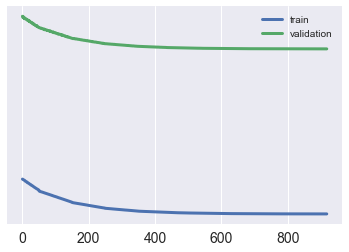

In [92]:
plt.semilogy(history.history["loss"], label="train")
plt.semilogy(history.history["val_loss"], label="validation")

plt.legend()
plt.show()